LightGBM has been selected as our best model in the 1st PythonLab submission. And Hyperopt has been used for parameter tuning that led to train AUC equal to 0.8453 and test AUC equal to 0.8189. In this Pythonlab Update, we are going to use GridSearchCV and RandomizedSearchCV for parameter tuning and see which performs the best. In addition, we are going to use SHAP to explain the variable importance.

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from sklearn.model_selection import train_test_split

In [5]:
df=pd.read_csv('train_2.csv')
df.head()

,FEMALE,AGE_ON_CONTACT_DATE,BMI,WEIGHT,BP_SYSTOLIC,BP_DIASTOLIC,PULSE,PCPVISIT,METFORMIN_FLAG,OPIOIDS_FLAG,...,BENIGN_PROSTATIC_HYPERPLASIA_HST,CIRRHOSIS_HST,CIRRHOSIS_HST_1,ADI_2015,SCHED_SURG_AREA_le,RACE_le,ETHNIC_GROUP_le,SCHED_HOSPITAL_le,SCHED_SURG_PROC_CD_le,STATUS
0,0,73.3,28.21,3056.0,102.000000,70.000000,83.000000,0,0,1,...,0,0,0,68.493519,2,16,2,0,277,1
1,1,26.1,25.61,2240.0,96.000000,58.000000,78.685965,0,0,0,...,0,0,0,75.203533,28,16,2,12,1243,0
2,1,19.0,37.76,3520.0,128.384177,76.327466,78.685965,0,0,1,...,0,0,0,59.740571,40,16,0,16,734,0
3,0,74.1,29.53,3200.0,128.384177,76.327466,78.685965,0,0,1,...,0,0,0,44.761703,40,16,2,16,617,1
4,0,57.8,26.91,3398.4,120.000000,60.000000,78.685965,1,0,0,...,0,0,0,44.718861,9,16,2,3,734,0


In [6]:
sum(df['STATUS'])/len(df['STATUS'])

0.21615

In [7]:
from sklearn.feature_selection import mutual_info_classif
df.columns.get_loc('STATUS')  

118

In [5]:
X = df.values[:,0:118]
Y = df.values[:,118]
feature_scores = mutual_info_classif(X,Y)

In [12]:
#15 features are selected
for score, fname in sorted(zip(feature_scores,df.columns),reverse=True)[:15]:
    print(fname, score)
    
for score, fname in sorted(zip(feature_scores,df.columns),reverse=True)[:15]:
    print("'"+fname+"',", end= " ")

SCHED_SURG_PROC_CD_le 0.1290916563131259
SCHED_SURG_AREA_le 0.04541455871720812
SCHED_HOSPITAL_le 0.03541337259143673
AGE_ON_CONTACT_DATE 0.014342755639924487
RACE_le 0.01125107970255712
ETHNIC_GROUP_le 0.01076487110310409
BETA_BLOCKERS 0.00983039829304988
DIURETICS 0.00904412026430701
INSULIN_MEDS 0.008561481148390948
ADI_2015 0.008464796167569899
LUPUS_HST 0.007994264600583278
CALCIUM_BLOCKERS 0.0074994377573762705
ASPIRIN 0.007221088340320758
WARFARIN 0.007120940449442337
ALDOSTERONE_BLOCKERS 0.007119307073262027
'SCHED_SURG_PROC_CD_le', 'SCHED_SURG_AREA_le', 'SCHED_HOSPITAL_le', 'AGE_ON_CONTACT_DATE', 'RACE_le', 'ETHNIC_GROUP_le', 'BETA_BLOCKERS', 'DIURETICS', 'INSULIN_MEDS', 'ADI_2015', 'LUPUS_HST', 'CALCIUM_BLOCKERS', 'ASPIRIN', 'WARFARIN', 'ALDOSTERONE_BLOCKERS', 

In [8]:
data_1=df[['SCHED_SURG_PROC_CD_le', 'SCHED_SURG_AREA_le', 'SCHED_HOSPITAL_le', 'AGE_ON_CONTACT_DATE', 'RACE_le', 'ETHNIC_GROUP_le', 'BETA_BLOCKERS', 'DIURETICS', 'INSULIN_MEDS', 'ADI_2015', 'LUPUS_HST', 'CALCIUM_BLOCKERS', 'ASPIRIN', 'WARFARIN', 'ALDOSTERONE_BLOCKERS']]
data_1.head()
data_1.shape

(80000, 15)

In [9]:
target_1=df[['STATUS']]
target_1.head()

,STATUS
0,1
1,0
2,0
3,1
4,0


In [21]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(data_1,
                                                    target_1,
                                                    test_size=0.2,
                                                    random_state=1)
x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size = 0.2, random_state = 1)

# Parameter tuning on LightGBM using Hyperopt

In [22]:
import lightgbm as lgb
from sklearn import metrics
lgb_train = lgb.Dataset(x_train, y_train)
lgb_val_train = lgb.Dataset(x_val, y_val)

In [23]:
#Parameter tuning using hyperopt
import hyperopt as hp
import lightgbm as lgb
from hyperopt import Trials,fmin,STATUS_OK

In [24]:
lgbm_space = {

# hp.choice.choice will select 1 value from the given list  , 'dart', 'goss', 'rf'
    'boosting_type': hp.hp.choice('boosting_type',  ['gbdt']),
    'num_leaves':hp.hp.choice('num_leaves', np.arange(10, 300,1, dtype=int)),

    'subsample':hp.hp.quniform('subsample',0.5,1.0,0.05),
    'colsample_bytree':hp.hp.quniform('colsample_bytree',0.5,1.0,0.05),
    'min_child_weight':hp.hp.quniform('min_child_weight', 100, 1000,100),
    'reg_alpha': hp.hp.uniform('reg_alpha', 0.0, 1000.0),
    'reg_lambda': hp.hp.uniform('reg_lambda', 0.0, 1000.0),
    'learning_rate': hp.hp.loguniform('learning_rate', -4, 0),
    'feature_fraction': hp.hp.loguniform('feature_fraction', -4, 0),
    'bagging_fraction': hp.hp.loguniform('bagging_fraction', -4, 0),
    'bagging_frequency':hp.hp.choice('bagging_frequency', np.arange(5, 100,1, dtype=int)),
    'drop_rate': hp.hp.loguniform('drop_rate', -4, 0),
    'scale_pos_weight': hp.hp.uniform('scale_pos_weight', 6.0, 10.0),
    'metric' : 'auc',
    'nthread': 6, 
    'max_bin': 512
    }

In [14]:
def objective_m(params, n_folds=5):


    model = lgb.cv(params = params,
              train_set = lgb_train,
              num_boost_round = 10000,
              early_stopping_rounds = 10,
             nfold = n_folds)
  
    
  
    # returns the best average loss on validation set 
    
    loss = 1 - (max(model['auc-mean']))
    return loss


bayes_trials = Trials()
MAX_EVALS = 1000 # this controls the runtime 

lgbm_best_m = fmin(fn = objective_m, space = lgbm_space, algo = hp.tpe.suggest, 
max_evals = MAX_EVALS, trials = bayes_trials)

100%|████████████████████████████████████████████████| 100/100 [03:20<00:00,  1.10s/it, best loss: 0.18063471261642206]


In [ ]:
lgbm_best_m

In [36]:
#Best parameter set
lgbm_best_p={
'boosting_type': 'gbdt',
'objective': 'binary',
'metric': 'binary_logloss',
'bagging_fraction': 0.7189481779037972,
'bagging_frequency': 22,
'colsample_bytree': 0.8500000000000001,
'drop_rate': 0.08758118965513137,
'feature_fraction': 0.4342945357515209,
'learning_rate': 0.03362127696747622,
'min_child_weight': 100.0,
'num_leaves': 43,
'reg_alpha': 0.9371504533726928,
'reg_lambda': 44.980612580024086,
'scale_pos_weight': 7.937542806578743,
'subsample': 0.6000000000000001
}

In [37]:
lgb_gbm = lgb.train(params = lgbm_best_p, train_set = lgb_train,
                    num_boost_round = 500, valid_sets = [lgb_val_train, lgb_train],
                    valid_names = ['Evaluation', 'Train'])

[1]	Train's binary_logloss: 0.516069	Evaluation's binary_logloss: 0.519475
[2]	Train's binary_logloss: 0.51651	Evaluation's binary_logloss: 0.519718
[3]	Train's binary_logloss: 0.514286	Evaluation's binary_logloss: 0.517483
[4]	Train's binary_logloss: 0.514465	Evaluation's binary_logloss: 0.517672
[5]	Train's binary_logloss: 0.51468	Evaluation's binary_logloss: 0.517761
[6]	Train's binary_logloss: 0.514658	Evaluation's binary_logloss: 0.51773
[7]	Train's binary_logloss: 0.515233	Evaluation's binary_logloss: 0.518327
[8]	Train's binary_logloss: 0.517924	Evaluation's binary_logloss: 0.520936
[9]	Train's binary_logloss: 0.520977	Evaluation's binary_logloss: 0.523975
[10]	Train's binary_logloss: 0.523089	Evaluation's binary_logloss: 0.526107
[11]	Train's binary_logloss: 0.524527	Evaluation's binary_logloss: 0.527504
[12]	Train's binary_logloss: 0.528038	Evaluation's binary_logloss: 0.531028
[13]	Train's binary_logloss: 0.530377	Evaluation's binary_logloss: 0.533344
[14]	Train's binary_logl

[109]	Train's binary_logloss: 0.728713	Evaluation's binary_logloss: 0.736141
[110]	Train's binary_logloss: 0.729306	Evaluation's binary_logloss: 0.736814
[111]	Train's binary_logloss: 0.729004	Evaluation's binary_logloss: 0.736571
[112]	Train's binary_logloss: 0.729421	Evaluation's binary_logloss: 0.737075
[113]	Train's binary_logloss: 0.729961	Evaluation's binary_logloss: 0.73764
[114]	Train's binary_logloss: 0.72971	Evaluation's binary_logloss: 0.737449
[115]	Train's binary_logloss: 0.730134	Evaluation's binary_logloss: 0.737946
[116]	Train's binary_logloss: 0.730587	Evaluation's binary_logloss: 0.738506
[117]	Train's binary_logloss: 0.731033	Evaluation's binary_logloss: 0.739019
[118]	Train's binary_logloss: 0.730644	Evaluation's binary_logloss: 0.738679
[119]	Train's binary_logloss: 0.730246	Evaluation's binary_logloss: 0.738387
[120]	Train's binary_logloss: 0.729911	Evaluation's binary_logloss: 0.738128
[121]	Train's binary_logloss: 0.73023	Evaluation's binary_logloss: 0.73857
[12

[215]	Train's binary_logloss: 0.716497	Evaluation's binary_logloss: 0.729717
[216]	Train's binary_logloss: 0.716366	Evaluation's binary_logloss: 0.729646
[217]	Train's binary_logloss: 0.716084	Evaluation's binary_logloss: 0.729373
[218]	Train's binary_logloss: 0.715799	Evaluation's binary_logloss: 0.72914
[219]	Train's binary_logloss: 0.715554	Evaluation's binary_logloss: 0.728937
[220]	Train's binary_logloss: 0.715307	Evaluation's binary_logloss: 0.728727
[221]	Train's binary_logloss: 0.715211	Evaluation's binary_logloss: 0.728694
[222]	Train's binary_logloss: 0.71507	Evaluation's binary_logloss: 0.728607
[223]	Train's binary_logloss: 0.714988	Evaluation's binary_logloss: 0.728592
[224]	Train's binary_logloss: 0.714705	Evaluation's binary_logloss: 0.728321
[225]	Train's binary_logloss: 0.714633	Evaluation's binary_logloss: 0.728297
[226]	Train's binary_logloss: 0.714582	Evaluation's binary_logloss: 0.728284
[227]	Train's binary_logloss: 0.714368	Evaluation's binary_logloss: 0.728124
[

[321]	Train's binary_logloss: 0.700626	Evaluation's binary_logloss: 0.718457
[322]	Train's binary_logloss: 0.700473	Evaluation's binary_logloss: 0.718355
[323]	Train's binary_logloss: 0.700366	Evaluation's binary_logloss: 0.718332
[324]	Train's binary_logloss: 0.700264	Evaluation's binary_logloss: 0.718285
[325]	Train's binary_logloss: 0.700208	Evaluation's binary_logloss: 0.718277
[326]	Train's binary_logloss: 0.700166	Evaluation's binary_logloss: 0.718263
[327]	Train's binary_logloss: 0.700053	Evaluation's binary_logloss: 0.718168
[328]	Train's binary_logloss: 0.699899	Evaluation's binary_logloss: 0.718048
[329]	Train's binary_logloss: 0.699758	Evaluation's binary_logloss: 0.717921
[330]	Train's binary_logloss: 0.699719	Evaluation's binary_logloss: 0.717899
[331]	Train's binary_logloss: 0.699644	Evaluation's binary_logloss: 0.717863
[332]	Train's binary_logloss: 0.699525	Evaluation's binary_logloss: 0.717828
[333]	Train's binary_logloss: 0.699335	Evaluation's binary_logloss: 0.717698

[427]	Train's binary_logloss: 0.690302	Evaluation's binary_logloss: 0.712405
[428]	Train's binary_logloss: 0.690202	Evaluation's binary_logloss: 0.712345
[429]	Train's binary_logloss: 0.690154	Evaluation's binary_logloss: 0.712342
[430]	Train's binary_logloss: 0.690047	Evaluation's binary_logloss: 0.712263
[431]	Train's binary_logloss: 0.689933	Evaluation's binary_logloss: 0.712209
[432]	Train's binary_logloss: 0.689895	Evaluation's binary_logloss: 0.712202
[433]	Train's binary_logloss: 0.689782	Evaluation's binary_logloss: 0.712138
[434]	Train's binary_logloss: 0.689689	Evaluation's binary_logloss: 0.712105
[435]	Train's binary_logloss: 0.689592	Evaluation's binary_logloss: 0.712052
[436]	Train's binary_logloss: 0.689522	Evaluation's binary_logloss: 0.712016
[437]	Train's binary_logloss: 0.689495	Evaluation's binary_logloss: 0.712007
[438]	Train's binary_logloss: 0.689461	Evaluation's binary_logloss: 0.711991
[439]	Train's binary_logloss: 0.689344	Evaluation's binary_logloss: 0.71189


In [38]:
y_probs_train = lgb_gbm.predict(x_train)
y_probs_test = lgb_gbm.predict(x_test)

In [39]:
# LightGBM train AUC
fpr, tpr, thresholds = metrics.roc_curve(y_train, y_probs_train)
metrics.auc(fpr, tpr)

0.8452470460889285

In [40]:
# LightGBM test AUC
fpr, tpr, thresholds = metrics.roc_curve(y_test, y_probs_test)
metrics.auc(fpr, tpr)

0.8188612762653413

# GridSearchCV for LightGBM

In [42]:
x_train, x_test, y_train, y_test = train_test_split(data_1,
                                                    target_1,
                                                    test_size=0.2,
                                                    random_state=1)
x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size = 0.2, random_state = 1)

In [43]:
#GridSearchCV for LightGBM
import lightgbm as lgb
lgb_grid_params = {
                'learning_rate': [0.005, 0.01],
                'estimator__max_depth' : [3, 5],
                'num_leaves': [6,8,12,16],
                'random_state' : [501]
                # Updated from 'seed'
                #'colsample_bytree' : [???],
                #'subsample' : [???],
                #'reg_alpha' : [???],
                #'reg_lambda' : [???],
                }

In [44]:
fit_params={"early_stopping_rounds":10,
            "eval_set" : [[x_val, y_val]]}

In [47]:
lgb_mdl_gs = lgb.LGBMClassifier(boosting_type = 'gbdt',
                                n_jobs = -1,
                                objective = 'binary',
                                num_iterations = 10000,
                                metric = 'binary_logloss'
                                )

In [49]:
from sklearn.model_selection import GridSearchCV
lgb_grid_mdl = GridSearchCV(lgb_mdl_gs, lgb_grid_params,
                            verbose=0,
                            cv=4)

In [50]:
lgb_grid_mdl

GridSearchCV(cv=4, error_score='raise-deprecating',
             estimator=LGBMClassifier(boosting_type='gbdt', class_weight=None,
                                      colsample_bytree=1.0,
                                      importance_type='split',
                                      learning_rate=0.1, max_depth=-1,
                                      metric='binary_logloss',
                                      min_child_samples=20,
                                      min_child_weight=0.001,
                                      min_split_gain=0.0, n_estimators=100,
                                      n_jobs=-1, num_iterations=10000,
                                      num_leaves=31, objective='binary',
                                      random_state=None, reg_alpha=0.0,
                                      reg_lambda=0.0, silent=True,
                                      subsample=1.0, subsample_for_bin=200000,
                                      subsample_freq

In [51]:
lgb_grid_mdl.get_params().keys()

dict_keys(['cv', 'error_score', 'estimator__boosting_type', 'estimator__class_weight', 'estimator__colsample_bytree', 'estimator__importance_type', 'estimator__learning_rate', 'estimator__max_depth', 'estimator__min_child_samples', 'estimator__min_child_weight', 'estimator__min_split_gain', 'estimator__n_estimators', 'estimator__n_jobs', 'estimator__num_leaves', 'estimator__objective', 'estimator__random_state', 'estimator__reg_alpha', 'estimator__reg_lambda', 'estimator__silent', 'estimator__subsample', 'estimator__subsample_for_bin', 'estimator__subsample_freq', 'estimator__num_iterations', 'estimator__metric', 'estimator', 'iid', 'n_jobs', 'param_grid', 'pre_dispatch', 'refit', 'return_train_score', 'scoring', 'verbose'])

In [52]:
lgb_grid_mdl.fit(x_train, y_train, **fit_params)

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("F

[1]	valid_0's binary_logloss: 0.523212
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.522782
[3]	valid_0's binary_logloss: 0.522357
[4]	valid_0's binary_logloss: 0.521939
[5]	valid_0's binary_logloss: 0.521526
[6]	valid_0's binary_logloss: 0.521118
[7]	valid_0's binary_logloss: 0.520716
[8]	valid_0's binary_logloss: 0.52032
[9]	valid_0's binary_logloss: 0.519929
[10]	valid_0's binary_logloss: 0.519543
[11]	valid_0's binary_logloss: 0.519169
[12]	valid_0's binary_logloss: 0.518792
[13]	valid_0's binary_logloss: 0.518421
[14]	valid_0's binary_logloss: 0.518061
[15]	valid_0's binary_logloss: 0.517705
[16]	valid_0's binary_logloss: 0.517354
[17]	valid_0's binary_logloss: 0.517001
[18]	valid_0's binary_logloss: 0.516658
[19]	valid_0's binary_logloss: 0.51632
[20]	valid_0's binary_logloss: 0.51598
[21]	valid_0's binary_logloss: 0.51565
[22]	valid_0's binary_logloss: 0.515318
[23]	valid_0's binary_logloss: 0.514997
[24]	valid_0's binary_logloss: 0

[202]	valid_0's binary_logloss: 0.481434
[203]	valid_0's binary_logloss: 0.481335
[204]	valid_0's binary_logloss: 0.48124
[205]	valid_0's binary_logloss: 0.481144
[206]	valid_0's binary_logloss: 0.481067
[207]	valid_0's binary_logloss: 0.480956
[208]	valid_0's binary_logloss: 0.480858
[209]	valid_0's binary_logloss: 0.480764
[210]	valid_0's binary_logloss: 0.480672
[211]	valid_0's binary_logloss: 0.480597
[212]	valid_0's binary_logloss: 0.480513
[213]	valid_0's binary_logloss: 0.480417
[214]	valid_0's binary_logloss: 0.480321
[215]	valid_0's binary_logloss: 0.480232
[216]	valid_0's binary_logloss: 0.480158
[217]	valid_0's binary_logloss: 0.480064
[218]	valid_0's binary_logloss: 0.479959
[219]	valid_0's binary_logloss: 0.479866
[220]	valid_0's binary_logloss: 0.479777
[221]	valid_0's binary_logloss: 0.479689
[222]	valid_0's binary_logloss: 0.479601
[223]	valid_0's binary_logloss: 0.479531
[224]	valid_0's binary_logloss: 0.479439
[225]	valid_0's binary_logloss: 0.479337
[226]	valid_0's b

[402]	valid_0's binary_logloss: 0.466888
[403]	valid_0's binary_logloss: 0.466826
[404]	valid_0's binary_logloss: 0.466744
[405]	valid_0's binary_logloss: 0.466685
[406]	valid_0's binary_logloss: 0.466641
[407]	valid_0's binary_logloss: 0.466584
[408]	valid_0's binary_logloss: 0.466506
[409]	valid_0's binary_logloss: 0.466463
[410]	valid_0's binary_logloss: 0.466411
[411]	valid_0's binary_logloss: 0.466373
[412]	valid_0's binary_logloss: 0.466317
[413]	valid_0's binary_logloss: 0.466275
[414]	valid_0's binary_logloss: 0.466192
[415]	valid_0's binary_logloss: 0.466136
[416]	valid_0's binary_logloss: 0.466099
[417]	valid_0's binary_logloss: 0.466058
[418]	valid_0's binary_logloss: 0.46596
[419]	valid_0's binary_logloss: 0.465902
[420]	valid_0's binary_logloss: 0.465826
[421]	valid_0's binary_logloss: 0.465729
[422]	valid_0's binary_logloss: 0.465689
[423]	valid_0's binary_logloss: 0.465608
[424]	valid_0's binary_logloss: 0.465542
[425]	valid_0's binary_logloss: 0.465506
[426]	valid_0's b

[602]	valid_0's binary_logloss: 0.456809
[603]	valid_0's binary_logloss: 0.456788
[604]	valid_0's binary_logloss: 0.456732
[605]	valid_0's binary_logloss: 0.456669
[606]	valid_0's binary_logloss: 0.456625
[607]	valid_0's binary_logloss: 0.456606
[608]	valid_0's binary_logloss: 0.456549
[609]	valid_0's binary_logloss: 0.456528
[610]	valid_0's binary_logloss: 0.456485
[611]	valid_0's binary_logloss: 0.456441
[612]	valid_0's binary_logloss: 0.456378
[613]	valid_0's binary_logloss: 0.456357
[614]	valid_0's binary_logloss: 0.456301
[615]	valid_0's binary_logloss: 0.45625
[616]	valid_0's binary_logloss: 0.456207
[617]	valid_0's binary_logloss: 0.456145
[618]	valid_0's binary_logloss: 0.456091
[619]	valid_0's binary_logloss: 0.456032
[620]	valid_0's binary_logloss: 0.45599
[621]	valid_0's binary_logloss: 0.455969
[622]	valid_0's binary_logloss: 0.455932
[623]	valid_0's binary_logloss: 0.455868
[624]	valid_0's binary_logloss: 0.45582
[625]	valid_0's binary_logloss: 0.455762
[626]	valid_0's bin

[802]	valid_0's binary_logloss: 0.450122
[803]	valid_0's binary_logloss: 0.450103
[804]	valid_0's binary_logloss: 0.450088
[805]	valid_0's binary_logloss: 0.450064
[806]	valid_0's binary_logloss: 0.450031
[807]	valid_0's binary_logloss: 0.450014
[808]	valid_0's binary_logloss: 0.449978
[809]	valid_0's binary_logloss: 0.449937
[810]	valid_0's binary_logloss: 0.449911
[811]	valid_0's binary_logloss: 0.449878
[812]	valid_0's binary_logloss: 0.449863
[813]	valid_0's binary_logloss: 0.449846
[814]	valid_0's binary_logloss: 0.449828
[815]	valid_0's binary_logloss: 0.449804
[816]	valid_0's binary_logloss: 0.449777
[817]	valid_0's binary_logloss: 0.44976
[818]	valid_0's binary_logloss: 0.449721
[819]	valid_0's binary_logloss: 0.449696
[820]	valid_0's binary_logloss: 0.449664
[821]	valid_0's binary_logloss: 0.449621
[822]	valid_0's binary_logloss: 0.449607
[823]	valid_0's binary_logloss: 0.449592
[824]	valid_0's binary_logloss: 0.449576
[825]	valid_0's binary_logloss: 0.44955
[826]	valid_0's bi

[1002]	valid_0's binary_logloss: 0.44552
[1003]	valid_0's binary_logloss: 0.445514
[1004]	valid_0's binary_logloss: 0.445494
[1005]	valid_0's binary_logloss: 0.445478
[1006]	valid_0's binary_logloss: 0.445446
[1007]	valid_0's binary_logloss: 0.445423
[1008]	valid_0's binary_logloss: 0.445403
[1009]	valid_0's binary_logloss: 0.445391
[1010]	valid_0's binary_logloss: 0.445371
[1011]	valid_0's binary_logloss: 0.445356
[1012]	valid_0's binary_logloss: 0.44533
[1013]	valid_0's binary_logloss: 0.44531
[1014]	valid_0's binary_logloss: 0.44529
[1015]	valid_0's binary_logloss: 0.44527
[1016]	valid_0's binary_logloss: 0.445251
[1017]	valid_0's binary_logloss: 0.44523
[1018]	valid_0's binary_logloss: 0.445216
[1019]	valid_0's binary_logloss: 0.445196
[1020]	valid_0's binary_logloss: 0.445164
[1021]	valid_0's binary_logloss: 0.445153
[1022]	valid_0's binary_logloss: 0.445133
[1023]	valid_0's binary_logloss: 0.445113
[1024]	valid_0's binary_logloss: 0.445098
[1025]	valid_0's binary_logloss: 0.44508

[1197]	valid_0's binary_logloss: 0.442461
[1198]	valid_0's binary_logloss: 0.442457
[1199]	valid_0's binary_logloss: 0.442437
[1200]	valid_0's binary_logloss: 0.442422
[1201]	valid_0's binary_logloss: 0.442403
[1202]	valid_0's binary_logloss: 0.442376
[1203]	valid_0's binary_logloss: 0.442346
[1204]	valid_0's binary_logloss: 0.442302
[1205]	valid_0's binary_logloss: 0.442291
[1206]	valid_0's binary_logloss: 0.442268
[1207]	valid_0's binary_logloss: 0.442257
[1208]	valid_0's binary_logloss: 0.442238
[1209]	valid_0's binary_logloss: 0.442232
[1210]	valid_0's binary_logloss: 0.442217
[1211]	valid_0's binary_logloss: 0.442204
[1212]	valid_0's binary_logloss: 0.442179
[1213]	valid_0's binary_logloss: 0.442169
[1214]	valid_0's binary_logloss: 0.44215
[1215]	valid_0's binary_logloss: 0.442146
[1216]	valid_0's binary_logloss: 0.442139
[1217]	valid_0's binary_logloss: 0.442124
[1218]	valid_0's binary_logloss: 0.442114
[1219]	valid_0's binary_logloss: 0.442094
[1220]	valid_0's binary_logloss: 0.

[1392]	valid_0's binary_logloss: 0.439277
[1393]	valid_0's binary_logloss: 0.439273
[1394]	valid_0's binary_logloss: 0.43926
[1395]	valid_0's binary_logloss: 0.439219
[1396]	valid_0's binary_logloss: 0.439208
[1397]	valid_0's binary_logloss: 0.439199
[1398]	valid_0's binary_logloss: 0.439186
[1399]	valid_0's binary_logloss: 0.439174
[1400]	valid_0's binary_logloss: 0.43917
[1401]	valid_0's binary_logloss: 0.439129
[1402]	valid_0's binary_logloss: 0.43912
[1403]	valid_0's binary_logloss: 0.439108
[1404]	valid_0's binary_logloss: 0.439095
[1405]	valid_0's binary_logloss: 0.439089
[1406]	valid_0's binary_logloss: 0.439076
[1407]	valid_0's binary_logloss: 0.43905
[1408]	valid_0's binary_logloss: 0.43902
[1409]	valid_0's binary_logloss: 0.439009
[1410]	valid_0's binary_logloss: 0.438999
[1411]	valid_0's binary_logloss: 0.438997
[1412]	valid_0's binary_logloss: 0.438971
[1413]	valid_0's binary_logloss: 0.438959
[1414]	valid_0's binary_logloss: 0.438919
[1415]	valid_0's binary_logloss: 0.4389

[1587]	valid_0's binary_logloss: 0.436528
[1588]	valid_0's binary_logloss: 0.436523
[1589]	valid_0's binary_logloss: 0.436499
[1590]	valid_0's binary_logloss: 0.436493
[1591]	valid_0's binary_logloss: 0.436479
[1592]	valid_0's binary_logloss: 0.436478
[1593]	valid_0's binary_logloss: 0.436455
[1594]	valid_0's binary_logloss: 0.436449
[1595]	valid_0's binary_logloss: 0.436442
[1596]	valid_0's binary_logloss: 0.43642
[1597]	valid_0's binary_logloss: 0.436412
[1598]	valid_0's binary_logloss: 0.436407
[1599]	valid_0's binary_logloss: 0.436384
[1600]	valid_0's binary_logloss: 0.436378
[1601]	valid_0's binary_logloss: 0.436372
[1602]	valid_0's binary_logloss: 0.436358
[1603]	valid_0's binary_logloss: 0.43635
[1604]	valid_0's binary_logloss: 0.436328
[1605]	valid_0's binary_logloss: 0.436326
[1606]	valid_0's binary_logloss: 0.43632
[1607]	valid_0's binary_logloss: 0.436299
[1608]	valid_0's binary_logloss: 0.43629
[1609]	valid_0's binary_logloss: 0.436281
[1610]	valid_0's binary_logloss: 0.436

[1782]	valid_0's binary_logloss: 0.434734
[1783]	valid_0's binary_logloss: 0.434725
[1784]	valid_0's binary_logloss: 0.434724
[1785]	valid_0's binary_logloss: 0.43472
[1786]	valid_0's binary_logloss: 0.434705
[1787]	valid_0's binary_logloss: 0.434696
[1788]	valid_0's binary_logloss: 0.434684
[1789]	valid_0's binary_logloss: 0.434663
[1790]	valid_0's binary_logloss: 0.434653
[1791]	valid_0's binary_logloss: 0.434644
[1792]	valid_0's binary_logloss: 0.434623
[1793]	valid_0's binary_logloss: 0.434612
[1794]	valid_0's binary_logloss: 0.434605
[1795]	valid_0's binary_logloss: 0.434596
[1796]	valid_0's binary_logloss: 0.434591
[1797]	valid_0's binary_logloss: 0.43459
[1798]	valid_0's binary_logloss: 0.43459
[1799]	valid_0's binary_logloss: 0.434578
[1800]	valid_0's binary_logloss: 0.434568
[1801]	valid_0's binary_logloss: 0.434553
[1802]	valid_0's binary_logloss: 0.434543
[1803]	valid_0's binary_logloss: 0.434535
[1804]	valid_0's binary_logloss: 0.434529
[1805]	valid_0's binary_logloss: 0.43

[1977]	valid_0's binary_logloss: 0.432892
[1978]	valid_0's binary_logloss: 0.432881
[1979]	valid_0's binary_logloss: 0.432874
[1980]	valid_0's binary_logloss: 0.43287
[1981]	valid_0's binary_logloss: 0.432857
[1982]	valid_0's binary_logloss: 0.432852
[1983]	valid_0's binary_logloss: 0.432852
[1984]	valid_0's binary_logloss: 0.432846
[1985]	valid_0's binary_logloss: 0.432838
[1986]	valid_0's binary_logloss: 0.432831
[1987]	valid_0's binary_logloss: 0.432831
[1988]	valid_0's binary_logloss: 0.432831
[1989]	valid_0's binary_logloss: 0.432827
[1990]	valid_0's binary_logloss: 0.432816
[1991]	valid_0's binary_logloss: 0.432811
[1992]	valid_0's binary_logloss: 0.432803
[1993]	valid_0's binary_logloss: 0.432796
[1994]	valid_0's binary_logloss: 0.432775
[1995]	valid_0's binary_logloss: 0.432764
[1996]	valid_0's binary_logloss: 0.432763
[1997]	valid_0's binary_logloss: 0.432762
[1998]	valid_0's binary_logloss: 0.432747
[1999]	valid_0's binary_logloss: 0.432744
[2000]	valid_0's binary_logloss: 0.

[2172]	valid_0's binary_logloss: 0.431268
[2173]	valid_0's binary_logloss: 0.431253
[2174]	valid_0's binary_logloss: 0.431252
[2175]	valid_0's binary_logloss: 0.431248
[2176]	valid_0's binary_logloss: 0.43123
[2177]	valid_0's binary_logloss: 0.43122
[2178]	valid_0's binary_logloss: 0.431203
[2179]	valid_0's binary_logloss: 0.431193
[2180]	valid_0's binary_logloss: 0.431194
[2181]	valid_0's binary_logloss: 0.431194
[2182]	valid_0's binary_logloss: 0.431187
[2183]	valid_0's binary_logloss: 0.431173
[2184]	valid_0's binary_logloss: 0.431169
[2185]	valid_0's binary_logloss: 0.431166
[2186]	valid_0's binary_logloss: 0.431161
[2187]	valid_0's binary_logloss: 0.431156
[2188]	valid_0's binary_logloss: 0.431154
[2189]	valid_0's binary_logloss: 0.431136
[2190]	valid_0's binary_logloss: 0.431135
[2191]	valid_0's binary_logloss: 0.431132
[2192]	valid_0's binary_logloss: 0.431123
[2193]	valid_0's binary_logloss: 0.431113
[2194]	valid_0's binary_logloss: 0.431113
[2195]	valid_0's binary_logloss: 0.4

[2367]	valid_0's binary_logloss: 0.429864
[2368]	valid_0's binary_logloss: 0.429846
[2369]	valid_0's binary_logloss: 0.429837
[2370]	valid_0's binary_logloss: 0.429831
[2371]	valid_0's binary_logloss: 0.429818
[2372]	valid_0's binary_logloss: 0.429814
[2373]	valid_0's binary_logloss: 0.429807
[2374]	valid_0's binary_logloss: 0.429803
[2375]	valid_0's binary_logloss: 0.429802
[2376]	valid_0's binary_logloss: 0.429797
[2377]	valid_0's binary_logloss: 0.429797
[2378]	valid_0's binary_logloss: 0.429795
[2379]	valid_0's binary_logloss: 0.429788
[2380]	valid_0's binary_logloss: 0.429788
[2381]	valid_0's binary_logloss: 0.429786
[2382]	valid_0's binary_logloss: 0.429771
[2383]	valid_0's binary_logloss: 0.429767
[2384]	valid_0's binary_logloss: 0.429758
[2385]	valid_0's binary_logloss: 0.429745
[2386]	valid_0's binary_logloss: 0.429742
[2387]	valid_0's binary_logloss: 0.429733
[2388]	valid_0's binary_logloss: 0.429727
[2389]	valid_0's binary_logloss: 0.429713
[2390]	valid_0's binary_logloss: 0

[2562]	valid_0's binary_logloss: 0.428595
[2563]	valid_0's binary_logloss: 0.428596
[2564]	valid_0's binary_logloss: 0.42858
[2565]	valid_0's binary_logloss: 0.428565
[2566]	valid_0's binary_logloss: 0.428566
[2567]	valid_0's binary_logloss: 0.428559
[2568]	valid_0's binary_logloss: 0.428556
[2569]	valid_0's binary_logloss: 0.428556
[2570]	valid_0's binary_logloss: 0.428552
[2571]	valid_0's binary_logloss: 0.428544
[2572]	valid_0's binary_logloss: 0.428539
[2573]	valid_0's binary_logloss: 0.428538
[2574]	valid_0's binary_logloss: 0.428533
[2575]	valid_0's binary_logloss: 0.428529
[2576]	valid_0's binary_logloss: 0.428524
[2577]	valid_0's binary_logloss: 0.428511
[2578]	valid_0's binary_logloss: 0.428507
[2579]	valid_0's binary_logloss: 0.428497
[2580]	valid_0's binary_logloss: 0.428487
[2581]	valid_0's binary_logloss: 0.428489
[2582]	valid_0's binary_logloss: 0.428489
[2583]	valid_0's binary_logloss: 0.428488
[2584]	valid_0's binary_logloss: 0.42848
[2585]	valid_0's binary_logloss: 0.4

[2757]	valid_0's binary_logloss: 0.427296
[2758]	valid_0's binary_logloss: 0.42729
[2759]	valid_0's binary_logloss: 0.427285
[2760]	valid_0's binary_logloss: 0.427271
[2761]	valid_0's binary_logloss: 0.427256
[2762]	valid_0's binary_logloss: 0.427248
[2763]	valid_0's binary_logloss: 0.427239
[2764]	valid_0's binary_logloss: 0.427224
[2765]	valid_0's binary_logloss: 0.427223
[2766]	valid_0's binary_logloss: 0.427216
[2767]	valid_0's binary_logloss: 0.427204
[2768]	valid_0's binary_logloss: 0.427204
[2769]	valid_0's binary_logloss: 0.427199
[2770]	valid_0's binary_logloss: 0.427197
[2771]	valid_0's binary_logloss: 0.42719
[2772]	valid_0's binary_logloss: 0.427191
[2773]	valid_0's binary_logloss: 0.427176
[2774]	valid_0's binary_logloss: 0.427163
[2775]	valid_0's binary_logloss: 0.427155
[2776]	valid_0's binary_logloss: 0.427151
[2777]	valid_0's binary_logloss: 0.427143
[2778]	valid_0's binary_logloss: 0.427142
[2779]	valid_0's binary_logloss: 0.427138
[2780]	valid_0's binary_logloss: 0.4

[2952]	valid_0's binary_logloss: 0.425932
[2953]	valid_0's binary_logloss: 0.425927
[2954]	valid_0's binary_logloss: 0.425919
[2955]	valid_0's binary_logloss: 0.425919
[2956]	valid_0's binary_logloss: 0.425909
[2957]	valid_0's binary_logloss: 0.425898
[2958]	valid_0's binary_logloss: 0.425889
[2959]	valid_0's binary_logloss: 0.425889
[2960]	valid_0's binary_logloss: 0.425886
[2961]	valid_0's binary_logloss: 0.425886
[2962]	valid_0's binary_logloss: 0.425873
[2963]	valid_0's binary_logloss: 0.425868
[2964]	valid_0's binary_logloss: 0.425863
[2965]	valid_0's binary_logloss: 0.425858
[2966]	valid_0's binary_logloss: 0.425847
[2967]	valid_0's binary_logloss: 0.425849
[2968]	valid_0's binary_logloss: 0.425842
[2969]	valid_0's binary_logloss: 0.425839
[2970]	valid_0's binary_logloss: 0.425835
[2971]	valid_0's binary_logloss: 0.425826
[2972]	valid_0's binary_logloss: 0.425813
[2973]	valid_0's binary_logloss: 0.425802
[2974]	valid_0's binary_logloss: 0.425802
[2975]	valid_0's binary_logloss: 0

[3147]	valid_0's binary_logloss: 0.424837
[3148]	valid_0's binary_logloss: 0.424832
[3149]	valid_0's binary_logloss: 0.42483
[3150]	valid_0's binary_logloss: 0.424831
[3151]	valid_0's binary_logloss: 0.424827
[3152]	valid_0's binary_logloss: 0.424828
[3153]	valid_0's binary_logloss: 0.424822
[3154]	valid_0's binary_logloss: 0.424813
[3155]	valid_0's binary_logloss: 0.424808
[3156]	valid_0's binary_logloss: 0.424807
[3157]	valid_0's binary_logloss: 0.424802
[3158]	valid_0's binary_logloss: 0.424803
[3159]	valid_0's binary_logloss: 0.4248
[3160]	valid_0's binary_logloss: 0.424795
[3161]	valid_0's binary_logloss: 0.424791
[3162]	valid_0's binary_logloss: 0.424785
[3163]	valid_0's binary_logloss: 0.424775
[3164]	valid_0's binary_logloss: 0.42477
[3165]	valid_0's binary_logloss: 0.424761
[3166]	valid_0's binary_logloss: 0.424757
[3167]	valid_0's binary_logloss: 0.424757
[3168]	valid_0's binary_logloss: 0.424754
[3169]	valid_0's binary_logloss: 0.424747
[3170]	valid_0's binary_logloss: 0.424

[3342]	valid_0's binary_logloss: 0.423805
[3343]	valid_0's binary_logloss: 0.423794
[3344]	valid_0's binary_logloss: 0.423792
[3345]	valid_0's binary_logloss: 0.423786
[3346]	valid_0's binary_logloss: 0.423779
[3347]	valid_0's binary_logloss: 0.423771
[3348]	valid_0's binary_logloss: 0.423762
[3349]	valid_0's binary_logloss: 0.423751
[3350]	valid_0's binary_logloss: 0.423745
[3351]	valid_0's binary_logloss: 0.423737
[3352]	valid_0's binary_logloss: 0.423726
[3353]	valid_0's binary_logloss: 0.423719
[3354]	valid_0's binary_logloss: 0.423717
[3355]	valid_0's binary_logloss: 0.423714
[3356]	valid_0's binary_logloss: 0.423707
[3357]	valid_0's binary_logloss: 0.423697
[3358]	valid_0's binary_logloss: 0.423698
[3359]	valid_0's binary_logloss: 0.423696
[3360]	valid_0's binary_logloss: 0.42369
[3361]	valid_0's binary_logloss: 0.42369
[3362]	valid_0's binary_logloss: 0.423681
[3363]	valid_0's binary_logloss: 0.423681
[3364]	valid_0's binary_logloss: 0.423678
[3365]	valid_0's binary_logloss: 0.4

[3537]	valid_0's binary_logloss: 0.422774
[3538]	valid_0's binary_logloss: 0.422771
[3539]	valid_0's binary_logloss: 0.422762
[3540]	valid_0's binary_logloss: 0.422757
[3541]	valid_0's binary_logloss: 0.422757
[3542]	valid_0's binary_logloss: 0.422754
[3543]	valid_0's binary_logloss: 0.422744
[3544]	valid_0's binary_logloss: 0.422734
[3545]	valid_0's binary_logloss: 0.422733
[3546]	valid_0's binary_logloss: 0.422732
[3547]	valid_0's binary_logloss: 0.422724
[3548]	valid_0's binary_logloss: 0.422716
[3549]	valid_0's binary_logloss: 0.422716
[3550]	valid_0's binary_logloss: 0.422707
[3551]	valid_0's binary_logloss: 0.422702
[3552]	valid_0's binary_logloss: 0.422699
[3553]	valid_0's binary_logloss: 0.422699
[3554]	valid_0's binary_logloss: 0.422697
[3555]	valid_0's binary_logloss: 0.422692
[3556]	valid_0's binary_logloss: 0.422687
[3557]	valid_0's binary_logloss: 0.422676
[3558]	valid_0's binary_logloss: 0.422666
[3559]	valid_0's binary_logloss: 0.422656
[3560]	valid_0's binary_logloss: 0

[3732]	valid_0's binary_logloss: 0.42197
[3733]	valid_0's binary_logloss: 0.421969
[3734]	valid_0's binary_logloss: 0.42197
[3735]	valid_0's binary_logloss: 0.42197
[3736]	valid_0's binary_logloss: 0.421963
[3737]	valid_0's binary_logloss: 0.421954
[3738]	valid_0's binary_logloss: 0.421946
[3739]	valid_0's binary_logloss: 0.421938
[3740]	valid_0's binary_logloss: 0.421937
[3741]	valid_0's binary_logloss: 0.421933
[3742]	valid_0's binary_logloss: 0.421931
[3743]	valid_0's binary_logloss: 0.421927
[3744]	valid_0's binary_logloss: 0.421918
[3745]	valid_0's binary_logloss: 0.421909
[3746]	valid_0's binary_logloss: 0.421908
[3747]	valid_0's binary_logloss: 0.421904
[3748]	valid_0's binary_logloss: 0.421901
[3749]	valid_0's binary_logloss: 0.421895
[3750]	valid_0's binary_logloss: 0.421894
[3751]	valid_0's binary_logloss: 0.421892
[3752]	valid_0's binary_logloss: 0.421888
[3753]	valid_0's binary_logloss: 0.421882
[3754]	valid_0's binary_logloss: 0.421874
[3755]	valid_0's binary_logloss: 0.42

[3927]	valid_0's binary_logloss: 0.421257
[3928]	valid_0's binary_logloss: 0.421257
[3929]	valid_0's binary_logloss: 0.421257
[3930]	valid_0's binary_logloss: 0.421255
[3931]	valid_0's binary_logloss: 0.421253
[3932]	valid_0's binary_logloss: 0.421253
[3933]	valid_0's binary_logloss: 0.421253
[3934]	valid_0's binary_logloss: 0.421246
[3935]	valid_0's binary_logloss: 0.42124
[3936]	valid_0's binary_logloss: 0.421234
[3937]	valid_0's binary_logloss: 0.421226
[3938]	valid_0's binary_logloss: 0.421218
[3939]	valid_0's binary_logloss: 0.421214
[3940]	valid_0's binary_logloss: 0.42121
[3941]	valid_0's binary_logloss: 0.421202
[3942]	valid_0's binary_logloss: 0.421194
[3943]	valid_0's binary_logloss: 0.421194
[3944]	valid_0's binary_logloss: 0.421195
[3945]	valid_0's binary_logloss: 0.421192
[3946]	valid_0's binary_logloss: 0.421189
[3947]	valid_0's binary_logloss: 0.42119
[3948]	valid_0's binary_logloss: 0.421188
[3949]	valid_0's binary_logloss: 0.421188
[3950]	valid_0's binary_logloss: 0.42

[4122]	valid_0's binary_logloss: 0.420505
[4123]	valid_0's binary_logloss: 0.4205
[4124]	valid_0's binary_logloss: 0.420499
[4125]	valid_0's binary_logloss: 0.4205
[4126]	valid_0's binary_logloss: 0.420497
[4127]	valid_0's binary_logloss: 0.420496
[4128]	valid_0's binary_logloss: 0.420488
[4129]	valid_0's binary_logloss: 0.42048
[4130]	valid_0's binary_logloss: 0.420473
[4131]	valid_0's binary_logloss: 0.420473
[4132]	valid_0's binary_logloss: 0.420474
[4133]	valid_0's binary_logloss: 0.420475
[4134]	valid_0's binary_logloss: 0.420473
[4135]	valid_0's binary_logloss: 0.420473
[4136]	valid_0's binary_logloss: 0.420469
[4137]	valid_0's binary_logloss: 0.420466
[4138]	valid_0's binary_logloss: 0.420459
[4139]	valid_0's binary_logloss: 0.420451
[4140]	valid_0's binary_logloss: 0.420445
[4141]	valid_0's binary_logloss: 0.42044
[4142]	valid_0's binary_logloss: 0.420438
[4143]	valid_0's binary_logloss: 0.420431
[4144]	valid_0's binary_logloss: 0.420429
[4145]	valid_0's binary_logloss: 0.42042

[4317]	valid_0's binary_logloss: 0.419877
[4318]	valid_0's binary_logloss: 0.419871
[4319]	valid_0's binary_logloss: 0.419867
[4320]	valid_0's binary_logloss: 0.419861
[4321]	valid_0's binary_logloss: 0.419855
[4322]	valid_0's binary_logloss: 0.419849
[4323]	valid_0's binary_logloss: 0.41985
[4324]	valid_0's binary_logloss: 0.41985
[4325]	valid_0's binary_logloss: 0.419848
[4326]	valid_0's binary_logloss: 0.419848
[4327]	valid_0's binary_logloss: 0.419849
[4328]	valid_0's binary_logloss: 0.419848
[4329]	valid_0's binary_logloss: 0.419848
[4330]	valid_0's binary_logloss: 0.419849
[4331]	valid_0's binary_logloss: 0.419848
[4332]	valid_0's binary_logloss: 0.419848
[4333]	valid_0's binary_logloss: 0.419846
[4334]	valid_0's binary_logloss: 0.419842
[4335]	valid_0's binary_logloss: 0.419841
[4336]	valid_0's binary_logloss: 0.41984
[4337]	valid_0's binary_logloss: 0.419836
[4338]	valid_0's binary_logloss: 0.41983
[4339]	valid_0's binary_logloss: 0.419829
[4340]	valid_0's binary_logloss: 0.419

[4512]	valid_0's binary_logloss: 0.419267
[4513]	valid_0's binary_logloss: 0.419261
[4514]	valid_0's binary_logloss: 0.419255
[4515]	valid_0's binary_logloss: 0.419253
[4516]	valid_0's binary_logloss: 0.41925
[4517]	valid_0's binary_logloss: 0.419248
[4518]	valid_0's binary_logloss: 0.419249
[4519]	valid_0's binary_logloss: 0.419245
[4520]	valid_0's binary_logloss: 0.41924
[4521]	valid_0's binary_logloss: 0.419234
[4522]	valid_0's binary_logloss: 0.419232
[4523]	valid_0's binary_logloss: 0.41923
[4524]	valid_0's binary_logloss: 0.41923
[4525]	valid_0's binary_logloss: 0.419229
[4526]	valid_0's binary_logloss: 0.419225
[4527]	valid_0's binary_logloss: 0.419227
[4528]	valid_0's binary_logloss: 0.419225
[4529]	valid_0's binary_logloss: 0.419225
[4530]	valid_0's binary_logloss: 0.41922
[4531]	valid_0's binary_logloss: 0.419216
[4532]	valid_0's binary_logloss: 0.419217
[4533]	valid_0's binary_logloss: 0.419215
[4534]	valid_0's binary_logloss: 0.419207
[4535]	valid_0's binary_logloss: 0.4191

[4707]	valid_0's binary_logloss: 0.418632
[4708]	valid_0's binary_logloss: 0.418632
[4709]	valid_0's binary_logloss: 0.418628
[4710]	valid_0's binary_logloss: 0.418628
[4711]	valid_0's binary_logloss: 0.418627
[4712]	valid_0's binary_logloss: 0.418622
[4713]	valid_0's binary_logloss: 0.418621
[4714]	valid_0's binary_logloss: 0.41861
[4715]	valid_0's binary_logloss: 0.418611
[4716]	valid_0's binary_logloss: 0.418609
[4717]	valid_0's binary_logloss: 0.418607
[4718]	valid_0's binary_logloss: 0.418606
[4719]	valid_0's binary_logloss: 0.418602
[4720]	valid_0's binary_logloss: 0.4186
[4721]	valid_0's binary_logloss: 0.418599
[4722]	valid_0's binary_logloss: 0.418594
[4723]	valid_0's binary_logloss: 0.41859
[4724]	valid_0's binary_logloss: 0.418582
[4725]	valid_0's binary_logloss: 0.418582
[4726]	valid_0's binary_logloss: 0.418578
[4727]	valid_0's binary_logloss: 0.418578
[4728]	valid_0's binary_logloss: 0.418574
[4729]	valid_0's binary_logloss: 0.418571
[4730]	valid_0's binary_logloss: 0.418

[4902]	valid_0's binary_logloss: 0.418088
[4903]	valid_0's binary_logloss: 0.418082
[4904]	valid_0's binary_logloss: 0.418078
[4905]	valid_0's binary_logloss: 0.418078
[4906]	valid_0's binary_logloss: 0.418075
[4907]	valid_0's binary_logloss: 0.418075
[4908]	valid_0's binary_logloss: 0.418075
[4909]	valid_0's binary_logloss: 0.418073
[4910]	valid_0's binary_logloss: 0.418074
[4911]	valid_0's binary_logloss: 0.418072
[4912]	valid_0's binary_logloss: 0.418069
[4913]	valid_0's binary_logloss: 0.418067
[4914]	valid_0's binary_logloss: 0.418066
[4915]	valid_0's binary_logloss: 0.418056
[4916]	valid_0's binary_logloss: 0.418057
[4917]	valid_0's binary_logloss: 0.418055
[4918]	valid_0's binary_logloss: 0.418051
[4919]	valid_0's binary_logloss: 0.418048
[4920]	valid_0's binary_logloss: 0.418045
[4921]	valid_0's binary_logloss: 0.418042
[4922]	valid_0's binary_logloss: 0.418041
[4923]	valid_0's binary_logloss: 0.418037
[4924]	valid_0's binary_logloss: 0.418036
[4925]	valid_0's binary_logloss: 0

[5097]	valid_0's binary_logloss: 0.417605
[5098]	valid_0's binary_logloss: 0.417597
[5099]	valid_0's binary_logloss: 0.417593
[5100]	valid_0's binary_logloss: 0.417594
[5101]	valid_0's binary_logloss: 0.417594
[5102]	valid_0's binary_logloss: 0.417588
[5103]	valid_0's binary_logloss: 0.417588
[5104]	valid_0's binary_logloss: 0.417587
[5105]	valid_0's binary_logloss: 0.417587
[5106]	valid_0's binary_logloss: 0.417586
[5107]	valid_0's binary_logloss: 0.417583
[5108]	valid_0's binary_logloss: 0.417583
[5109]	valid_0's binary_logloss: 0.417584
[5110]	valid_0's binary_logloss: 0.417583
[5111]	valid_0's binary_logloss: 0.417577
[5112]	valid_0's binary_logloss: 0.417574
[5113]	valid_0's binary_logloss: 0.417567
[5114]	valid_0's binary_logloss: 0.417566
[5115]	valid_0's binary_logloss: 0.417565
[5116]	valid_0's binary_logloss: 0.417563
[5117]	valid_0's binary_logloss: 0.417554
[5118]	valid_0's binary_logloss: 0.41755
[5119]	valid_0's binary_logloss: 0.417545
[5120]	valid_0's binary_logloss: 0.

[5292]	valid_0's binary_logloss: 0.417194
[5293]	valid_0's binary_logloss: 0.417192
[5294]	valid_0's binary_logloss: 0.417189
[5295]	valid_0's binary_logloss: 0.417183
[5296]	valid_0's binary_logloss: 0.417182
[5297]	valid_0's binary_logloss: 0.417179
[5298]	valid_0's binary_logloss: 0.417179
[5299]	valid_0's binary_logloss: 0.417179
[5300]	valid_0's binary_logloss: 0.417178
[5301]	valid_0's binary_logloss: 0.417177
[5302]	valid_0's binary_logloss: 0.417176
[5303]	valid_0's binary_logloss: 0.417177
[5304]	valid_0's binary_logloss: 0.417175
[5305]	valid_0's binary_logloss: 0.417172
[5306]	valid_0's binary_logloss: 0.417169
[5307]	valid_0's binary_logloss: 0.417165
[5308]	valid_0's binary_logloss: 0.417166
[5309]	valid_0's binary_logloss: 0.417164
[5310]	valid_0's binary_logloss: 0.417164
[5311]	valid_0's binary_logloss: 0.417159
[5312]	valid_0's binary_logloss: 0.417154
[5313]	valid_0's binary_logloss: 0.417151
[5314]	valid_0's binary_logloss: 0.417151
[5315]	valid_0's binary_logloss: 0

[5487]	valid_0's binary_logloss: 0.416866
[5488]	valid_0's binary_logloss: 0.416866
[5489]	valid_0's binary_logloss: 0.416866
[5490]	valid_0's binary_logloss: 0.416864
[5491]	valid_0's binary_logloss: 0.416862
[5492]	valid_0's binary_logloss: 0.41686
[5493]	valid_0's binary_logloss: 0.41686
[5494]	valid_0's binary_logloss: 0.416861
[5495]	valid_0's binary_logloss: 0.416859
[5496]	valid_0's binary_logloss: 0.416854
[5497]	valid_0's binary_logloss: 0.416854
[5498]	valid_0's binary_logloss: 0.41685
[5499]	valid_0's binary_logloss: 0.416848
[5500]	valid_0's binary_logloss: 0.416846
[5501]	valid_0's binary_logloss: 0.416842
[5502]	valid_0's binary_logloss: 0.416838
[5503]	valid_0's binary_logloss: 0.416837
[5504]	valid_0's binary_logloss: 0.416833
[5505]	valid_0's binary_logloss: 0.416831
[5506]	valid_0's binary_logloss: 0.416827
[5507]	valid_0's binary_logloss: 0.416827
[5508]	valid_0's binary_logloss: 0.416827
[5509]	valid_0's binary_logloss: 0.416825
[5510]	valid_0's binary_logloss: 0.41

[5682]	valid_0's binary_logloss: 0.416449
[5683]	valid_0's binary_logloss: 0.416447
[5684]	valid_0's binary_logloss: 0.416445
[5685]	valid_0's binary_logloss: 0.416444
[5686]	valid_0's binary_logloss: 0.416444
[5687]	valid_0's binary_logloss: 0.416439
[5688]	valid_0's binary_logloss: 0.416436
[5689]	valid_0's binary_logloss: 0.416431
[5690]	valid_0's binary_logloss: 0.416429
[5691]	valid_0's binary_logloss: 0.416427
[5692]	valid_0's binary_logloss: 0.416423
[5693]	valid_0's binary_logloss: 0.416424
[5694]	valid_0's binary_logloss: 0.416422
[5695]	valid_0's binary_logloss: 0.416417
[5696]	valid_0's binary_logloss: 0.416412
[5697]	valid_0's binary_logloss: 0.416408
[5698]	valid_0's binary_logloss: 0.416408
[5699]	valid_0's binary_logloss: 0.416404
[5700]	valid_0's binary_logloss: 0.416402
[5701]	valid_0's binary_logloss: 0.416395
[5702]	valid_0's binary_logloss: 0.41639
[5703]	valid_0's binary_logloss: 0.416389
[5704]	valid_0's binary_logloss: 0.416388
[5705]	valid_0's binary_logloss: 0.

[5877]	valid_0's binary_logloss: 0.416065
[5878]	valid_0's binary_logloss: 0.416064
[5879]	valid_0's binary_logloss: 0.416064
[5880]	valid_0's binary_logloss: 0.416062
[5881]	valid_0's binary_logloss: 0.416063
[5882]	valid_0's binary_logloss: 0.416063
[5883]	valid_0's binary_logloss: 0.416061
[5884]	valid_0's binary_logloss: 0.416062
[5885]	valid_0's binary_logloss: 0.416058
[5886]	valid_0's binary_logloss: 0.416058
[5887]	valid_0's binary_logloss: 0.416054
[5888]	valid_0's binary_logloss: 0.416052
[5889]	valid_0's binary_logloss: 0.416052
[5890]	valid_0's binary_logloss: 0.416047
[5891]	valid_0's binary_logloss: 0.416043
[5892]	valid_0's binary_logloss: 0.416042
[5893]	valid_0's binary_logloss: 0.41604
[5894]	valid_0's binary_logloss: 0.41604
[5895]	valid_0's binary_logloss: 0.41604
[5896]	valid_0's binary_logloss: 0.416041
[5897]	valid_0's binary_logloss: 0.416042
[5898]	valid_0's binary_logloss: 0.416039
[5899]	valid_0's binary_logloss: 0.416035
[5900]	valid_0's binary_logloss: 0.41

[6072]	valid_0's binary_logloss: 0.415777
[6073]	valid_0's binary_logloss: 0.415773
[6074]	valid_0's binary_logloss: 0.415774
[6075]	valid_0's binary_logloss: 0.415771
[6076]	valid_0's binary_logloss: 0.415765
[6077]	valid_0's binary_logloss: 0.415763
[6078]	valid_0's binary_logloss: 0.415763
[6079]	valid_0's binary_logloss: 0.415761
[6080]	valid_0's binary_logloss: 0.415759
[6081]	valid_0's binary_logloss: 0.41576
[6082]	valid_0's binary_logloss: 0.415756
[6083]	valid_0's binary_logloss: 0.415753
[6084]	valid_0's binary_logloss: 0.415752
[6085]	valid_0's binary_logloss: 0.415751
[6086]	valid_0's binary_logloss: 0.415752
[6087]	valid_0's binary_logloss: 0.415752
[6088]	valid_0's binary_logloss: 0.41575
[6089]	valid_0's binary_logloss: 0.415747
[6090]	valid_0's binary_logloss: 0.415747
[6091]	valid_0's binary_logloss: 0.415749
[6092]	valid_0's binary_logloss: 0.415748
[6093]	valid_0's binary_logloss: 0.415749
[6094]	valid_0's binary_logloss: 0.415749
[6095]	valid_0's binary_logloss: 0.4

[6267]	valid_0's binary_logloss: 0.415469
[6268]	valid_0's binary_logloss: 0.415463
[6269]	valid_0's binary_logloss: 0.415461
[6270]	valid_0's binary_logloss: 0.41546
[6271]	valid_0's binary_logloss: 0.415457
[6272]	valid_0's binary_logloss: 0.415455
[6273]	valid_0's binary_logloss: 0.415455
[6274]	valid_0's binary_logloss: 0.415456
[6275]	valid_0's binary_logloss: 0.415457
[6276]	valid_0's binary_logloss: 0.415455
[6277]	valid_0's binary_logloss: 0.415455
[6278]	valid_0's binary_logloss: 0.415452
[6279]	valid_0's binary_logloss: 0.415449
[6280]	valid_0's binary_logloss: 0.415445
[6281]	valid_0's binary_logloss: 0.415444
[6282]	valid_0's binary_logloss: 0.415443
[6283]	valid_0's binary_logloss: 0.415442
[6284]	valid_0's binary_logloss: 0.41544
[6285]	valid_0's binary_logloss: 0.415437
[6286]	valid_0's binary_logloss: 0.415438
[6287]	valid_0's binary_logloss: 0.415437
[6288]	valid_0's binary_logloss: 0.415434
[6289]	valid_0's binary_logloss: 0.415431
[6290]	valid_0's binary_logloss: 0.4

[6462]	valid_0's binary_logloss: 0.415175
[6463]	valid_0's binary_logloss: 0.415176
[6464]	valid_0's binary_logloss: 0.415175
[6465]	valid_0's binary_logloss: 0.41517
[6466]	valid_0's binary_logloss: 0.415168
[6467]	valid_0's binary_logloss: 0.415169
[6468]	valid_0's binary_logloss: 0.415169
[6469]	valid_0's binary_logloss: 0.415163
[6470]	valid_0's binary_logloss: 0.415164
[6471]	valid_0's binary_logloss: 0.415164
[6472]	valid_0's binary_logloss: 0.415164
[6473]	valid_0's binary_logloss: 0.415163
[6474]	valid_0's binary_logloss: 0.415163
[6475]	valid_0's binary_logloss: 0.415163
[6476]	valid_0's binary_logloss: 0.415162
[6477]	valid_0's binary_logloss: 0.415162
[6478]	valid_0's binary_logloss: 0.415163
[6479]	valid_0's binary_logloss: 0.415162
[6480]	valid_0's binary_logloss: 0.415162
[6481]	valid_0's binary_logloss: 0.415161
[6482]	valid_0's binary_logloss: 0.415157
[6483]	valid_0's binary_logloss: 0.415154
[6484]	valid_0's binary_logloss: 0.41515
[6485]	valid_0's binary_logloss: 0.4

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.523207
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.522772
[3]	valid_0's binary_logloss: 0.522343
[4]	valid_0's binary_logloss: 0.521919
[5]	valid_0's binary_logloss: 0.521502
[6]	valid_0's binary_logloss: 0.52109
[7]	valid_0's binary_logloss: 0.520684
[8]	valid_0's binary_logloss: 0.520283
[9]	valid_0's binary_logloss: 0.519888
[10]	valid_0's binary_logloss: 0.519498
[11]	valid_0's binary_logloss: 0.519114
[12]	valid_0's binary_logloss: 0.518734
[13]	valid_0's binary_logloss: 0.518364
[14]	valid_0's binary_logloss: 0.517999
[15]	valid_0's binary_logloss: 0.517633
[16]	valid_0's binary_logloss: 0.517277
[17]	valid_0's binary_logloss: 0.516921
[18]	valid_0's binary_logloss: 0.516569
[19]	valid_0's binary_logloss: 0.516226
[20]	valid_0's binary_logloss: 0.515888
[21]	valid_0's binary_logloss: 0.515548
[22]	valid_0's binary_logloss: 0.515213
[23]	valid_0's binary_logloss: 0.514887
[24]	valid_0's binary_logloss

[202]	valid_0's binary_logloss: 0.481566
[203]	valid_0's binary_logloss: 0.481465
[204]	valid_0's binary_logloss: 0.481374
[205]	valid_0's binary_logloss: 0.481276
[206]	valid_0's binary_logloss: 0.481194
[207]	valid_0's binary_logloss: 0.481104
[208]	valid_0's binary_logloss: 0.480982
[209]	valid_0's binary_logloss: 0.480886
[210]	valid_0's binary_logloss: 0.48075
[211]	valid_0's binary_logloss: 0.48065
[212]	valid_0's binary_logloss: 0.480556
[213]	valid_0's binary_logloss: 0.480454
[214]	valid_0's binary_logloss: 0.480358
[215]	valid_0's binary_logloss: 0.480277
[216]	valid_0's binary_logloss: 0.480144
[217]	valid_0's binary_logloss: 0.480051
[218]	valid_0's binary_logloss: 0.479952
[219]	valid_0's binary_logloss: 0.479843
[220]	valid_0's binary_logloss: 0.479752
[221]	valid_0's binary_logloss: 0.479657
[222]	valid_0's binary_logloss: 0.479578
[223]	valid_0's binary_logloss: 0.479481
[224]	valid_0's binary_logloss: 0.47939
[225]	valid_0's binary_logloss: 0.479284
[226]	valid_0's bin

[402]	valid_0's binary_logloss: 0.466454
[403]	valid_0's binary_logloss: 0.466387
[404]	valid_0's binary_logloss: 0.466321
[405]	valid_0's binary_logloss: 0.46623
[406]	valid_0's binary_logloss: 0.46619
[407]	valid_0's binary_logloss: 0.466139
[408]	valid_0's binary_logloss: 0.466079
[409]	valid_0's binary_logloss: 0.466037
[410]	valid_0's binary_logloss: 0.465984
[411]	valid_0's binary_logloss: 0.465929
[412]	valid_0's binary_logloss: 0.465873
[413]	valid_0's binary_logloss: 0.465837
[414]	valid_0's binary_logloss: 0.465757
[415]	valid_0's binary_logloss: 0.465699
[416]	valid_0's binary_logloss: 0.465663
[417]	valid_0's binary_logloss: 0.465611
[418]	valid_0's binary_logloss: 0.465558
[419]	valid_0's binary_logloss: 0.465453
[420]	valid_0's binary_logloss: 0.465418
[421]	valid_0's binary_logloss: 0.465363
[422]	valid_0's binary_logloss: 0.465286
[423]	valid_0's binary_logloss: 0.465223
[424]	valid_0's binary_logloss: 0.465161
[425]	valid_0's binary_logloss: 0.465115
[426]	valid_0's bi

[602]	valid_0's binary_logloss: 0.456562
[603]	valid_0's binary_logloss: 0.456528
[604]	valid_0's binary_logloss: 0.456508
[605]	valid_0's binary_logloss: 0.456442
[606]	valid_0's binary_logloss: 0.45641
[607]	valid_0's binary_logloss: 0.456351
[608]	valid_0's binary_logloss: 0.456317
[609]	valid_0's binary_logloss: 0.456289
[610]	valid_0's binary_logloss: 0.456254
[611]	valid_0's binary_logloss: 0.456221
[612]	valid_0's binary_logloss: 0.456201
[613]	valid_0's binary_logloss: 0.456137
[614]	valid_0's binary_logloss: 0.456118
[615]	valid_0's binary_logloss: 0.456088
[616]	valid_0's binary_logloss: 0.456029
[617]	valid_0's binary_logloss: 0.456002
[618]	valid_0's binary_logloss: 0.455961
[619]	valid_0's binary_logloss: 0.455921
[620]	valid_0's binary_logloss: 0.455891
[621]	valid_0's binary_logloss: 0.455831
[622]	valid_0's binary_logloss: 0.455773
[623]	valid_0's binary_logloss: 0.455739
[624]	valid_0's binary_logloss: 0.455676
[625]	valid_0's binary_logloss: 0.455649
[626]	valid_0's b

[802]	valid_0's binary_logloss: 0.450079
[803]	valid_0's binary_logloss: 0.450022
[804]	valid_0's binary_logloss: 0.450003
[805]	valid_0's binary_logloss: 0.449947
[806]	valid_0's binary_logloss: 0.449926
[807]	valid_0's binary_logloss: 0.449899
[808]	valid_0's binary_logloss: 0.449876
[809]	valid_0's binary_logloss: 0.449865
[810]	valid_0's binary_logloss: 0.449844
[811]	valid_0's binary_logloss: 0.449821
[812]	valid_0's binary_logloss: 0.449798
[813]	valid_0's binary_logloss: 0.449784
[814]	valid_0's binary_logloss: 0.449757
[815]	valid_0's binary_logloss: 0.449744
[816]	valid_0's binary_logloss: 0.449722
[817]	valid_0's binary_logloss: 0.449701
[818]	valid_0's binary_logloss: 0.449678
[819]	valid_0's binary_logloss: 0.449624
[820]	valid_0's binary_logloss: 0.449604
[821]	valid_0's binary_logloss: 0.449563
[822]	valid_0's binary_logloss: 0.449537
[823]	valid_0's binary_logloss: 0.449524
[824]	valid_0's binary_logloss: 0.44949
[825]	valid_0's binary_logloss: 0.44947
[826]	valid_0's bi

[1002]	valid_0's binary_logloss: 0.44536
[1003]	valid_0's binary_logloss: 0.445343
[1004]	valid_0's binary_logloss: 0.445327
[1005]	valid_0's binary_logloss: 0.445312
[1006]	valid_0's binary_logloss: 0.445295
[1007]	valid_0's binary_logloss: 0.445286
[1008]	valid_0's binary_logloss: 0.445248
[1009]	valid_0's binary_logloss: 0.445232
[1010]	valid_0's binary_logloss: 0.445221
[1011]	valid_0's binary_logloss: 0.445213
[1012]	valid_0's binary_logloss: 0.4452
[1013]	valid_0's binary_logloss: 0.445152
[1014]	valid_0's binary_logloss: 0.445143
[1015]	valid_0's binary_logloss: 0.44513
[1016]	valid_0's binary_logloss: 0.445097
[1017]	valid_0's binary_logloss: 0.445083
[1018]	valid_0's binary_logloss: 0.445062
[1019]	valid_0's binary_logloss: 0.445049
[1020]	valid_0's binary_logloss: 0.44504
[1021]	valid_0's binary_logloss: 0.445028
[1022]	valid_0's binary_logloss: 0.445019
[1023]	valid_0's binary_logloss: 0.444972
[1024]	valid_0's binary_logloss: 0.444962
[1025]	valid_0's binary_logloss: 0.4449

[1197]	valid_0's binary_logloss: 0.441957
[1198]	valid_0's binary_logloss: 0.441944
[1199]	valid_0's binary_logloss: 0.441934
[1200]	valid_0's binary_logloss: 0.441898
[1201]	valid_0's binary_logloss: 0.441888
[1202]	valid_0's binary_logloss: 0.441871
[1203]	valid_0's binary_logloss: 0.441844
[1204]	valid_0's binary_logloss: 0.441831
[1205]	valid_0's binary_logloss: 0.441794
[1206]	valid_0's binary_logloss: 0.441779
[1207]	valid_0's binary_logloss: 0.441768
[1208]	valid_0's binary_logloss: 0.441753
[1209]	valid_0's binary_logloss: 0.441746
[1210]	valid_0's binary_logloss: 0.441736
[1211]	valid_0's binary_logloss: 0.44171
[1212]	valid_0's binary_logloss: 0.441692
[1213]	valid_0's binary_logloss: 0.441689
[1214]	valid_0's binary_logloss: 0.441654
[1215]	valid_0's binary_logloss: 0.441644
[1216]	valid_0's binary_logloss: 0.441609
[1217]	valid_0's binary_logloss: 0.441594
[1218]	valid_0's binary_logloss: 0.441582
[1219]	valid_0's binary_logloss: 0.441566
[1220]	valid_0's binary_logloss: 0.

[1392]	valid_0's binary_logloss: 0.439047
[1393]	valid_0's binary_logloss: 0.439042
[1394]	valid_0's binary_logloss: 0.439032
[1395]	valid_0's binary_logloss: 0.439025
[1396]	valid_0's binary_logloss: 0.439016
[1397]	valid_0's binary_logloss: 0.438993
[1398]	valid_0's binary_logloss: 0.438975
[1399]	valid_0's binary_logloss: 0.438963
[1400]	valid_0's binary_logloss: 0.438957
[1401]	valid_0's binary_logloss: 0.43895
[1402]	valid_0's binary_logloss: 0.438947
[1403]	valid_0's binary_logloss: 0.438926
[1404]	valid_0's binary_logloss: 0.438908
[1405]	valid_0's binary_logloss: 0.4389
[1406]	valid_0's binary_logloss: 0.438895
[1407]	valid_0's binary_logloss: 0.438885
[1408]	valid_0's binary_logloss: 0.438865
[1409]	valid_0's binary_logloss: 0.438835
[1410]	valid_0's binary_logloss: 0.43882
[1411]	valid_0's binary_logloss: 0.438802
[1412]	valid_0's binary_logloss: 0.438794
[1413]	valid_0's binary_logloss: 0.438789
[1414]	valid_0's binary_logloss: 0.438769
[1415]	valid_0's binary_logloss: 0.438

[1587]	valid_0's binary_logloss: 0.436664
[1588]	valid_0's binary_logloss: 0.436646
[1589]	valid_0's binary_logloss: 0.436627
[1590]	valid_0's binary_logloss: 0.436623
[1591]	valid_0's binary_logloss: 0.436607
[1592]	valid_0's binary_logloss: 0.436589
[1593]	valid_0's binary_logloss: 0.436571
[1594]	valid_0's binary_logloss: 0.436572
[1595]	valid_0's binary_logloss: 0.436568
[1596]	valid_0's binary_logloss: 0.436564
[1597]	valid_0's binary_logloss: 0.436549
[1598]	valid_0's binary_logloss: 0.436542
[1599]	valid_0's binary_logloss: 0.436527
[1600]	valid_0's binary_logloss: 0.4365
[1601]	valid_0's binary_logloss: 0.436482
[1602]	valid_0's binary_logloss: 0.436464
[1603]	valid_0's binary_logloss: 0.436449
[1604]	valid_0's binary_logloss: 0.436434
[1605]	valid_0's binary_logloss: 0.436422
[1606]	valid_0's binary_logloss: 0.436417
[1607]	valid_0's binary_logloss: 0.436411
[1608]	valid_0's binary_logloss: 0.436401
[1609]	valid_0's binary_logloss: 0.436383
[1610]	valid_0's binary_logloss: 0.4

[1782]	valid_0's binary_logloss: 0.43452
[1783]	valid_0's binary_logloss: 0.434499
[1784]	valid_0's binary_logloss: 0.434479
[1785]	valid_0's binary_logloss: 0.434471
[1786]	valid_0's binary_logloss: 0.434467
[1787]	valid_0's binary_logloss: 0.434453
[1788]	valid_0's binary_logloss: 0.434439
[1789]	valid_0's binary_logloss: 0.434438
[1790]	valid_0's binary_logloss: 0.434424
[1791]	valid_0's binary_logloss: 0.434413
[1792]	valid_0's binary_logloss: 0.434414
[1793]	valid_0's binary_logloss: 0.434411
[1794]	valid_0's binary_logloss: 0.43439
[1795]	valid_0's binary_logloss: 0.43437
[1796]	valid_0's binary_logloss: 0.434357
[1797]	valid_0's binary_logloss: 0.434337
[1798]	valid_0's binary_logloss: 0.434332
[1799]	valid_0's binary_logloss: 0.434319
[1800]	valid_0's binary_logloss: 0.434299
[1801]	valid_0's binary_logloss: 0.434284
[1802]	valid_0's binary_logloss: 0.43428
[1803]	valid_0's binary_logloss: 0.434277
[1804]	valid_0's binary_logloss: 0.434278
[1805]	valid_0's binary_logloss: 0.434

[1977]	valid_0's binary_logloss: 0.432342
[1978]	valid_0's binary_logloss: 0.432329
[1979]	valid_0's binary_logloss: 0.432306
[1980]	valid_0's binary_logloss: 0.432291
[1981]	valid_0's binary_logloss: 0.432284
[1982]	valid_0's binary_logloss: 0.432273
[1983]	valid_0's binary_logloss: 0.432269
[1984]	valid_0's binary_logloss: 0.432264
[1985]	valid_0's binary_logloss: 0.432253
[1986]	valid_0's binary_logloss: 0.432255
[1987]	valid_0's binary_logloss: 0.432244
[1988]	valid_0's binary_logloss: 0.432232
[1989]	valid_0's binary_logloss: 0.432217
[1990]	valid_0's binary_logloss: 0.432196
[1991]	valid_0's binary_logloss: 0.43219
[1992]	valid_0's binary_logloss: 0.43218
[1993]	valid_0's binary_logloss: 0.432176
[1994]	valid_0's binary_logloss: 0.432161
[1995]	valid_0's binary_logloss: 0.43215
[1996]	valid_0's binary_logloss: 0.432137
[1997]	valid_0's binary_logloss: 0.432139
[1998]	valid_0's binary_logloss: 0.432135
[1999]	valid_0's binary_logloss: 0.432126
[2000]	valid_0's binary_logloss: 0.43

[2172]	valid_0's binary_logloss: 0.430669
[2173]	valid_0's binary_logloss: 0.430669
[2174]	valid_0's binary_logloss: 0.430661
[2175]	valid_0's binary_logloss: 0.430649
[2176]	valid_0's binary_logloss: 0.430649
[2177]	valid_0's binary_logloss: 0.43063
[2178]	valid_0's binary_logloss: 0.430621
[2179]	valid_0's binary_logloss: 0.430623
[2180]	valid_0's binary_logloss: 0.430609
[2181]	valid_0's binary_logloss: 0.430596
[2182]	valid_0's binary_logloss: 0.430579
[2183]	valid_0's binary_logloss: 0.430568
[2184]	valid_0's binary_logloss: 0.430552
[2185]	valid_0's binary_logloss: 0.430535
[2186]	valid_0's binary_logloss: 0.430526
[2187]	valid_0's binary_logloss: 0.430519
[2188]	valid_0's binary_logloss: 0.430519
[2189]	valid_0's binary_logloss: 0.430506
[2190]	valid_0's binary_logloss: 0.430502
[2191]	valid_0's binary_logloss: 0.430503
[2192]	valid_0's binary_logloss: 0.430497
[2193]	valid_0's binary_logloss: 0.430489
[2194]	valid_0's binary_logloss: 0.43048
[2195]	valid_0's binary_logloss: 0.4

[2367]	valid_0's binary_logloss: 0.429191
[2368]	valid_0's binary_logloss: 0.429177
[2369]	valid_0's binary_logloss: 0.429174
[2370]	valid_0's binary_logloss: 0.429163
[2371]	valid_0's binary_logloss: 0.429161
[2372]	valid_0's binary_logloss: 0.429151
[2373]	valid_0's binary_logloss: 0.42914
[2374]	valid_0's binary_logloss: 0.42913
[2375]	valid_0's binary_logloss: 0.429114
[2376]	valid_0's binary_logloss: 0.429106
[2377]	valid_0's binary_logloss: 0.4291
[2378]	valid_0's binary_logloss: 0.4291
[2379]	valid_0's binary_logloss: 0.429088
[2380]	valid_0's binary_logloss: 0.429089
[2381]	valid_0's binary_logloss: 0.429086
[2382]	valid_0's binary_logloss: 0.429083
[2383]	valid_0's binary_logloss: 0.429081
[2384]	valid_0's binary_logloss: 0.429073
[2385]	valid_0's binary_logloss: 0.429068
[2386]	valid_0's binary_logloss: 0.429057
[2387]	valid_0's binary_logloss: 0.429042
[2388]	valid_0's binary_logloss: 0.429031
[2389]	valid_0's binary_logloss: 0.429031
[2390]	valid_0's binary_logloss: 0.42903

[2562]	valid_0's binary_logloss: 0.427842
[2563]	valid_0's binary_logloss: 0.427832
[2564]	valid_0's binary_logloss: 0.427824
[2565]	valid_0's binary_logloss: 0.427822
[2566]	valid_0's binary_logloss: 0.427806
[2567]	valid_0's binary_logloss: 0.427792
[2568]	valid_0's binary_logloss: 0.427779
[2569]	valid_0's binary_logloss: 0.427773
[2570]	valid_0's binary_logloss: 0.427763
[2571]	valid_0's binary_logloss: 0.42776
[2572]	valid_0's binary_logloss: 0.427757
[2573]	valid_0's binary_logloss: 0.427743
[2574]	valid_0's binary_logloss: 0.427733
[2575]	valid_0's binary_logloss: 0.427731
[2576]	valid_0's binary_logloss: 0.427721
[2577]	valid_0's binary_logloss: 0.427718
[2578]	valid_0's binary_logloss: 0.427716
[2579]	valid_0's binary_logloss: 0.427707
[2580]	valid_0's binary_logloss: 0.427702
[2581]	valid_0's binary_logloss: 0.427703
[2582]	valid_0's binary_logloss: 0.427705
[2583]	valid_0's binary_logloss: 0.427697
[2584]	valid_0's binary_logloss: 0.427695
[2585]	valid_0's binary_logloss: 0.

[2757]	valid_0's binary_logloss: 0.426507
[2758]	valid_0's binary_logloss: 0.426504
[2759]	valid_0's binary_logloss: 0.426495
[2760]	valid_0's binary_logloss: 0.426489
[2761]	valid_0's binary_logloss: 0.426482
[2762]	valid_0's binary_logloss: 0.426472
[2763]	valid_0's binary_logloss: 0.42647
[2764]	valid_0's binary_logloss: 0.426463
[2765]	valid_0's binary_logloss: 0.426462
[2766]	valid_0's binary_logloss: 0.426458
[2767]	valid_0's binary_logloss: 0.426451
[2768]	valid_0's binary_logloss: 0.426441
[2769]	valid_0's binary_logloss: 0.426436
[2770]	valid_0's binary_logloss: 0.426437
[2771]	valid_0's binary_logloss: 0.42643
[2772]	valid_0's binary_logloss: 0.426428
[2773]	valid_0's binary_logloss: 0.426422
[2774]	valid_0's binary_logloss: 0.426418
[2775]	valid_0's binary_logloss: 0.426417
[2776]	valid_0's binary_logloss: 0.42641
[2777]	valid_0's binary_logloss: 0.426399
[2778]	valid_0's binary_logloss: 0.426385
[2779]	valid_0's binary_logloss: 0.426379
[2780]	valid_0's binary_logloss: 0.42

[2952]	valid_0's binary_logloss: 0.425508
[2953]	valid_0's binary_logloss: 0.425507
[2954]	valid_0's binary_logloss: 0.425499
[2955]	valid_0's binary_logloss: 0.425495
[2956]	valid_0's binary_logloss: 0.425494
[2957]	valid_0's binary_logloss: 0.425488
[2958]	valid_0's binary_logloss: 0.425486
[2959]	valid_0's binary_logloss: 0.42548
[2960]	valid_0's binary_logloss: 0.425476
[2961]	valid_0's binary_logloss: 0.425474
[2962]	valid_0's binary_logloss: 0.425469
[2963]	valid_0's binary_logloss: 0.425455
[2964]	valid_0's binary_logloss: 0.425444
[2965]	valid_0's binary_logloss: 0.425438
[2966]	valid_0's binary_logloss: 0.425433
[2967]	valid_0's binary_logloss: 0.425431
[2968]	valid_0's binary_logloss: 0.425425
[2969]	valid_0's binary_logloss: 0.425411
[2970]	valid_0's binary_logloss: 0.4254
[2971]	valid_0's binary_logloss: 0.425396
[2972]	valid_0's binary_logloss: 0.42539
[2973]	valid_0's binary_logloss: 0.425383
[2974]	valid_0's binary_logloss: 0.425377
[2975]	valid_0's binary_logloss: 0.425

[3147]	valid_0's binary_logloss: 0.424472
[3148]	valid_0's binary_logloss: 0.424461
[3149]	valid_0's binary_logloss: 0.424457
[3150]	valid_0's binary_logloss: 0.424456
[3151]	valid_0's binary_logloss: 0.424451
[3152]	valid_0's binary_logloss: 0.424448
[3153]	valid_0's binary_logloss: 0.424448
[3154]	valid_0's binary_logloss: 0.424439
[3155]	valid_0's binary_logloss: 0.424431
[3156]	valid_0's binary_logloss: 0.424433
[3157]	valid_0's binary_logloss: 0.424433
[3158]	valid_0's binary_logloss: 0.424434
[3159]	valid_0's binary_logloss: 0.424427
[3160]	valid_0's binary_logloss: 0.424427
[3161]	valid_0's binary_logloss: 0.424417
[3162]	valid_0's binary_logloss: 0.424411
[3163]	valid_0's binary_logloss: 0.424404
[3164]	valid_0's binary_logloss: 0.424403
[3165]	valid_0's binary_logloss: 0.424397
[3166]	valid_0's binary_logloss: 0.424395
[3167]	valid_0's binary_logloss: 0.424391
[3168]	valid_0's binary_logloss: 0.424392
[3169]	valid_0's binary_logloss: 0.424393
[3170]	valid_0's binary_logloss: 0

[3342]	valid_0's binary_logloss: 0.423603
[3343]	valid_0's binary_logloss: 0.423597
[3344]	valid_0's binary_logloss: 0.423592
[3345]	valid_0's binary_logloss: 0.423591
[3346]	valid_0's binary_logloss: 0.423591
[3347]	valid_0's binary_logloss: 0.423586
[3348]	valid_0's binary_logloss: 0.423575
[3349]	valid_0's binary_logloss: 0.423572
[3350]	valid_0's binary_logloss: 0.423571
[3351]	valid_0's binary_logloss: 0.423565
[3352]	valid_0's binary_logloss: 0.423567
[3353]	valid_0's binary_logloss: 0.423562
[3354]	valid_0's binary_logloss: 0.423554
[3355]	valid_0's binary_logloss: 0.423548
[3356]	valid_0's binary_logloss: 0.423548
[3357]	valid_0's binary_logloss: 0.423547
[3358]	valid_0's binary_logloss: 0.423545
[3359]	valid_0's binary_logloss: 0.423545
[3360]	valid_0's binary_logloss: 0.423541
[3361]	valid_0's binary_logloss: 0.423538
[3362]	valid_0's binary_logloss: 0.423532
[3363]	valid_0's binary_logloss: 0.423527
[3364]	valid_0's binary_logloss: 0.423524
[3365]	valid_0's binary_logloss: 0

[3537]	valid_0's binary_logloss: 0.422684
[3538]	valid_0's binary_logloss: 0.422681
[3539]	valid_0's binary_logloss: 0.422673
[3540]	valid_0's binary_logloss: 0.422666
[3541]	valid_0's binary_logloss: 0.422657
[3542]	valid_0's binary_logloss: 0.422652
[3543]	valid_0's binary_logloss: 0.422643
[3544]	valid_0's binary_logloss: 0.422641
[3545]	valid_0's binary_logloss: 0.422634
[3546]	valid_0's binary_logloss: 0.422624
[3547]	valid_0's binary_logloss: 0.422618
[3548]	valid_0's binary_logloss: 0.422609
[3549]	valid_0's binary_logloss: 0.422608
[3550]	valid_0's binary_logloss: 0.4226
[3551]	valid_0's binary_logloss: 0.422597
[3552]	valid_0's binary_logloss: 0.422592
[3553]	valid_0's binary_logloss: 0.422592
[3554]	valid_0's binary_logloss: 0.422593
[3555]	valid_0's binary_logloss: 0.422579
[3556]	valid_0's binary_logloss: 0.422575
[3557]	valid_0's binary_logloss: 0.422572
[3558]	valid_0's binary_logloss: 0.422567
[3559]	valid_0's binary_logloss: 0.42256
[3560]	valid_0's binary_logloss: 0.42

[3732]	valid_0's binary_logloss: 0.421811
[3733]	valid_0's binary_logloss: 0.421809
[3734]	valid_0's binary_logloss: 0.421808
[3735]	valid_0's binary_logloss: 0.421807
[3736]	valid_0's binary_logloss: 0.421804
[3737]	valid_0's binary_logloss: 0.42179
[3738]	valid_0's binary_logloss: 0.421788
[3739]	valid_0's binary_logloss: 0.421779
[3740]	valid_0's binary_logloss: 0.42178
[3741]	valid_0's binary_logloss: 0.42178
[3742]	valid_0's binary_logloss: 0.421778
[3743]	valid_0's binary_logloss: 0.42178
[3744]	valid_0's binary_logloss: 0.421773
[3745]	valid_0's binary_logloss: 0.421766
[3746]	valid_0's binary_logloss: 0.421757
[3747]	valid_0's binary_logloss: 0.42175
[3748]	valid_0's binary_logloss: 0.421745
[3749]	valid_0's binary_logloss: 0.42174
[3750]	valid_0's binary_logloss: 0.421736
[3751]	valid_0's binary_logloss: 0.421732
[3752]	valid_0's binary_logloss: 0.421724
[3753]	valid_0's binary_logloss: 0.421719
[3754]	valid_0's binary_logloss: 0.421717
[3755]	valid_0's binary_logloss: 0.42171

[3927]	valid_0's binary_logloss: 0.420995
[3928]	valid_0's binary_logloss: 0.420992
[3929]	valid_0's binary_logloss: 0.420987
[3930]	valid_0's binary_logloss: 0.420982
[3931]	valid_0's binary_logloss: 0.420977
[3932]	valid_0's binary_logloss: 0.420977
[3933]	valid_0's binary_logloss: 0.420978
[3934]	valid_0's binary_logloss: 0.420967
[3935]	valid_0's binary_logloss: 0.420964
[3936]	valid_0's binary_logloss: 0.420961
[3937]	valid_0's binary_logloss: 0.420958
[3938]	valid_0's binary_logloss: 0.420957
[3939]	valid_0's binary_logloss: 0.420944
[3940]	valid_0's binary_logloss: 0.420937
[3941]	valid_0's binary_logloss: 0.420931
[3942]	valid_0's binary_logloss: 0.420931
[3943]	valid_0's binary_logloss: 0.420929
[3944]	valid_0's binary_logloss: 0.420929
[3945]	valid_0's binary_logloss: 0.420922
[3946]	valid_0's binary_logloss: 0.420919
[3947]	valid_0's binary_logloss: 0.420918
[3948]	valid_0's binary_logloss: 0.420919
[3949]	valid_0's binary_logloss: 0.420919
[3950]	valid_0's binary_logloss: 0

[4122]	valid_0's binary_logloss: 0.420223
[4123]	valid_0's binary_logloss: 0.420221
[4124]	valid_0's binary_logloss: 0.420217
[4125]	valid_0's binary_logloss: 0.420205
[4126]	valid_0's binary_logloss: 0.420198
[4127]	valid_0's binary_logloss: 0.42019
[4128]	valid_0's binary_logloss: 0.420188
[4129]	valid_0's binary_logloss: 0.42019
[4130]	valid_0's binary_logloss: 0.420183
[4131]	valid_0's binary_logloss: 0.420179
[4132]	valid_0's binary_logloss: 0.420179
[4133]	valid_0's binary_logloss: 0.420175
[4134]	valid_0's binary_logloss: 0.420171
[4135]	valid_0's binary_logloss: 0.420171
[4136]	valid_0's binary_logloss: 0.420171
[4137]	valid_0's binary_logloss: 0.420162
[4138]	valid_0's binary_logloss: 0.420152
[4139]	valid_0's binary_logloss: 0.42015
[4140]	valid_0's binary_logloss: 0.420148
[4141]	valid_0's binary_logloss: 0.420147
[4142]	valid_0's binary_logloss: 0.420139
[4143]	valid_0's binary_logloss: 0.42013
[4144]	valid_0's binary_logloss: 0.420124
[4145]	valid_0's binary_logloss: 0.420

[4317]	valid_0's binary_logloss: 0.419546
[4318]	valid_0's binary_logloss: 0.419545
[4319]	valid_0's binary_logloss: 0.419545
[4320]	valid_0's binary_logloss: 0.419542
[4321]	valid_0's binary_logloss: 0.419532
[4322]	valid_0's binary_logloss: 0.419523
[4323]	valid_0's binary_logloss: 0.41952
[4324]	valid_0's binary_logloss: 0.419521
[4325]	valid_0's binary_logloss: 0.419522
[4326]	valid_0's binary_logloss: 0.419522
[4327]	valid_0's binary_logloss: 0.419512
[4328]	valid_0's binary_logloss: 0.419504
[4329]	valid_0's binary_logloss: 0.419499
[4330]	valid_0's binary_logloss: 0.419493
[4331]	valid_0's binary_logloss: 0.419484
[4332]	valid_0's binary_logloss: 0.419483
[4333]	valid_0's binary_logloss: 0.41948
[4334]	valid_0's binary_logloss: 0.419476
[4335]	valid_0's binary_logloss: 0.419476
[4336]	valid_0's binary_logloss: 0.419472
[4337]	valid_0's binary_logloss: 0.419466
[4338]	valid_0's binary_logloss: 0.419466
[4339]	valid_0's binary_logloss: 0.419461
[4340]	valid_0's binary_logloss: 0.4

[4512]	valid_0's binary_logloss: 0.418793
[4513]	valid_0's binary_logloss: 0.41879
[4514]	valid_0's binary_logloss: 0.418789
[4515]	valid_0's binary_logloss: 0.418786
[4516]	valid_0's binary_logloss: 0.418778
[4517]	valid_0's binary_logloss: 0.41878
[4518]	valid_0's binary_logloss: 0.418782
[4519]	valid_0's binary_logloss: 0.418776
[4520]	valid_0's binary_logloss: 0.418768
[4521]	valid_0's binary_logloss: 0.418768
[4522]	valid_0's binary_logloss: 0.418768
[4523]	valid_0's binary_logloss: 0.418763
[4524]	valid_0's binary_logloss: 0.418758
[4525]	valid_0's binary_logloss: 0.418753
[4526]	valid_0's binary_logloss: 0.418743
[4527]	valid_0's binary_logloss: 0.41874
[4528]	valid_0's binary_logloss: 0.418734
[4529]	valid_0's binary_logloss: 0.41873
[4530]	valid_0's binary_logloss: 0.418721
[4531]	valid_0's binary_logloss: 0.418716
[4532]	valid_0's binary_logloss: 0.418715
[4533]	valid_0's binary_logloss: 0.418716
[4534]	valid_0's binary_logloss: 0.418716
[4535]	valid_0's binary_logloss: 0.418

[4707]	valid_0's binary_logloss: 0.418209
[4708]	valid_0's binary_logloss: 0.418206
[4709]	valid_0's binary_logloss: 0.418198
[4710]	valid_0's binary_logloss: 0.418189
[4711]	valid_0's binary_logloss: 0.418185
[4712]	valid_0's binary_logloss: 0.418186
[4713]	valid_0's binary_logloss: 0.418179
[4714]	valid_0's binary_logloss: 0.418173
[4715]	valid_0's binary_logloss: 0.418172
[4716]	valid_0's binary_logloss: 0.418172
[4717]	valid_0's binary_logloss: 0.418164
[4718]	valid_0's binary_logloss: 0.418159
[4719]	valid_0's binary_logloss: 0.418153
[4720]	valid_0's binary_logloss: 0.418145
[4721]	valid_0's binary_logloss: 0.418141
[4722]	valid_0's binary_logloss: 0.418137
[4723]	valid_0's binary_logloss: 0.418139
[4724]	valid_0's binary_logloss: 0.418139
[4725]	valid_0's binary_logloss: 0.418139
[4726]	valid_0's binary_logloss: 0.418135
[4727]	valid_0's binary_logloss: 0.418134
[4728]	valid_0's binary_logloss: 0.418133
[4729]	valid_0's binary_logloss: 0.418131
[4730]	valid_0's binary_logloss: 0

[4902]	valid_0's binary_logloss: 0.417649
[4903]	valid_0's binary_logloss: 0.417645
[4904]	valid_0's binary_logloss: 0.417641
[4905]	valid_0's binary_logloss: 0.41764
[4906]	valid_0's binary_logloss: 0.417632
[4907]	valid_0's binary_logloss: 0.417633
[4908]	valid_0's binary_logloss: 0.417633
[4909]	valid_0's binary_logloss: 0.41763
[4910]	valid_0's binary_logloss: 0.41763
[4911]	valid_0's binary_logloss: 0.41763
[4912]	valid_0's binary_logloss: 0.417629
[4913]	valid_0's binary_logloss: 0.417626
[4914]	valid_0's binary_logloss: 0.417619
[4915]	valid_0's binary_logloss: 0.417618
[4916]	valid_0's binary_logloss: 0.417612
[4917]	valid_0's binary_logloss: 0.417606
[4918]	valid_0's binary_logloss: 0.417608
[4919]	valid_0's binary_logloss: 0.417606
[4920]	valid_0's binary_logloss: 0.417602
[4921]	valid_0's binary_logloss: 0.417599
[4922]	valid_0's binary_logloss: 0.41759
[4923]	valid_0's binary_logloss: 0.417587
[4924]	valid_0's binary_logloss: 0.417587
[4925]	valid_0's binary_logloss: 0.4175

[5097]	valid_0's binary_logloss: 0.417189
[5098]	valid_0's binary_logloss: 0.417189
[5099]	valid_0's binary_logloss: 0.417186
[5100]	valid_0's binary_logloss: 0.417185
[5101]	valid_0's binary_logloss: 0.417181
[5102]	valid_0's binary_logloss: 0.417178
[5103]	valid_0's binary_logloss: 0.417176
[5104]	valid_0's binary_logloss: 0.417175
[5105]	valid_0's binary_logloss: 0.417169
[5106]	valid_0's binary_logloss: 0.417167
[5107]	valid_0's binary_logloss: 0.417165
[5108]	valid_0's binary_logloss: 0.417165
[5109]	valid_0's binary_logloss: 0.417165
[5110]	valid_0's binary_logloss: 0.417165
[5111]	valid_0's binary_logloss: 0.417166
[5112]	valid_0's binary_logloss: 0.417165
[5113]	valid_0's binary_logloss: 0.417167
[5114]	valid_0's binary_logloss: 0.417167
[5115]	valid_0's binary_logloss: 0.417167
[5116]	valid_0's binary_logloss: 0.417163
[5117]	valid_0's binary_logloss: 0.417159
[5118]	valid_0's binary_logloss: 0.417159
[5119]	valid_0's binary_logloss: 0.417151
[5120]	valid_0's binary_logloss: 0

[5292]	valid_0's binary_logloss: 0.416793
[5293]	valid_0's binary_logloss: 0.41679
[5294]	valid_0's binary_logloss: 0.416789
[5295]	valid_0's binary_logloss: 0.416786
[5296]	valid_0's binary_logloss: 0.416786
[5297]	valid_0's binary_logloss: 0.416787
[5298]	valid_0's binary_logloss: 0.416786
[5299]	valid_0's binary_logloss: 0.416787
[5300]	valid_0's binary_logloss: 0.416788
[5301]	valid_0's binary_logloss: 0.416783
[5302]	valid_0's binary_logloss: 0.416777
[5303]	valid_0's binary_logloss: 0.416774
[5304]	valid_0's binary_logloss: 0.416775
[5305]	valid_0's binary_logloss: 0.416772
[5306]	valid_0's binary_logloss: 0.416765
[5307]	valid_0's binary_logloss: 0.416764
[5308]	valid_0's binary_logloss: 0.416765
[5309]	valid_0's binary_logloss: 0.416762
[5310]	valid_0's binary_logloss: 0.416762
[5311]	valid_0's binary_logloss: 0.416762
[5312]	valid_0's binary_logloss: 0.416763
[5313]	valid_0's binary_logloss: 0.416758
[5314]	valid_0's binary_logloss: 0.416751
[5315]	valid_0's binary_logloss: 0.

[5487]	valid_0's binary_logloss: 0.416417
[5488]	valid_0's binary_logloss: 0.416416
[5489]	valid_0's binary_logloss: 0.416415
[5490]	valid_0's binary_logloss: 0.416414
[5491]	valid_0's binary_logloss: 0.416411
[5492]	valid_0's binary_logloss: 0.416411
[5493]	valid_0's binary_logloss: 0.416411
[5494]	valid_0's binary_logloss: 0.416412
[5495]	valid_0's binary_logloss: 0.416414
[5496]	valid_0's binary_logloss: 0.416411
[5497]	valid_0's binary_logloss: 0.41641
[5498]	valid_0's binary_logloss: 0.416409
[5499]	valid_0's binary_logloss: 0.416405
[5500]	valid_0's binary_logloss: 0.416402
[5501]	valid_0's binary_logloss: 0.416401
[5502]	valid_0's binary_logloss: 0.416398
[5503]	valid_0's binary_logloss: 0.416398
[5504]	valid_0's binary_logloss: 0.416389
[5505]	valid_0's binary_logloss: 0.416387
[5506]	valid_0's binary_logloss: 0.416388
[5507]	valid_0's binary_logloss: 0.416387
[5508]	valid_0's binary_logloss: 0.416384
[5509]	valid_0's binary_logloss: 0.416375
[5510]	valid_0's binary_logloss: 0.

[5682]	valid_0's binary_logloss: 0.41603
[5683]	valid_0's binary_logloss: 0.41603
[5684]	valid_0's binary_logloss: 0.416029
[5685]	valid_0's binary_logloss: 0.416023
[5686]	valid_0's binary_logloss: 0.416017
[5687]	valid_0's binary_logloss: 0.416017
[5688]	valid_0's binary_logloss: 0.416011
[5689]	valid_0's binary_logloss: 0.416005
[5690]	valid_0's binary_logloss: 0.416
[5691]	valid_0's binary_logloss: 0.415994
[5692]	valid_0's binary_logloss: 0.41599
[5693]	valid_0's binary_logloss: 0.415988
[5694]	valid_0's binary_logloss: 0.415988
[5695]	valid_0's binary_logloss: 0.415987
[5696]	valid_0's binary_logloss: 0.415987
[5697]	valid_0's binary_logloss: 0.415984
[5698]	valid_0's binary_logloss: 0.415983
[5699]	valid_0's binary_logloss: 0.415984
[5700]	valid_0's binary_logloss: 0.415985
[5701]	valid_0's binary_logloss: 0.415985
[5702]	valid_0's binary_logloss: 0.415985
[5703]	valid_0's binary_logloss: 0.415984
[5704]	valid_0's binary_logloss: 0.415984
[5705]	valid_0's binary_logloss: 0.41598

[5877]	valid_0's binary_logloss: 0.415623
[5878]	valid_0's binary_logloss: 0.415618
[5879]	valid_0's binary_logloss: 0.415619
[5880]	valid_0's binary_logloss: 0.415619
[5881]	valid_0's binary_logloss: 0.415619
[5882]	valid_0's binary_logloss: 0.415615
[5883]	valid_0's binary_logloss: 0.415615
[5884]	valid_0's binary_logloss: 0.415609
[5885]	valid_0's binary_logloss: 0.415608
[5886]	valid_0's binary_logloss: 0.415609
[5887]	valid_0's binary_logloss: 0.415608
[5888]	valid_0's binary_logloss: 0.415603
[5889]	valid_0's binary_logloss: 0.4156
[5890]	valid_0's binary_logloss: 0.4156
[5891]	valid_0's binary_logloss: 0.415599
[5892]	valid_0's binary_logloss: 0.415598
[5893]	valid_0's binary_logloss: 0.415593
[5894]	valid_0's binary_logloss: 0.415587
[5895]	valid_0's binary_logloss: 0.415587
[5896]	valid_0's binary_logloss: 0.415586
[5897]	valid_0's binary_logloss: 0.415586
[5898]	valid_0's binary_logloss: 0.415586
[5899]	valid_0's binary_logloss: 0.415587
[5900]	valid_0's binary_logloss: 0.415

[6072]	valid_0's binary_logloss: 0.415274
[6073]	valid_0's binary_logloss: 0.415276
[6074]	valid_0's binary_logloss: 0.415273
[6075]	valid_0's binary_logloss: 0.415272
[6076]	valid_0's binary_logloss: 0.415271
[6077]	valid_0's binary_logloss: 0.415271
[6078]	valid_0's binary_logloss: 0.415264
[6079]	valid_0's binary_logloss: 0.415259
[6080]	valid_0's binary_logloss: 0.415256
[6081]	valid_0's binary_logloss: 0.415256
[6082]	valid_0's binary_logloss: 0.415257
[6083]	valid_0's binary_logloss: 0.415257
[6084]	valid_0's binary_logloss: 0.415258
[6085]	valid_0's binary_logloss: 0.415258
[6086]	valid_0's binary_logloss: 0.415257
[6087]	valid_0's binary_logloss: 0.415258
[6088]	valid_0's binary_logloss: 0.415253
[6089]	valid_0's binary_logloss: 0.415253
[6090]	valid_0's binary_logloss: 0.415251
[6091]	valid_0's binary_logloss: 0.415244
[6092]	valid_0's binary_logloss: 0.415245
[6093]	valid_0's binary_logloss: 0.415245
[6094]	valid_0's binary_logloss: 0.415244
[6095]	valid_0's binary_logloss: 0

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.523226
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.522809
[3]	valid_0's binary_logloss: 0.522398
[4]	valid_0's binary_logloss: 0.521993
[5]	valid_0's binary_logloss: 0.521593
[6]	valid_0's binary_logloss: 0.521191
[7]	valid_0's binary_logloss: 0.520802
[8]	valid_0's binary_logloss: 0.52041
[9]	valid_0's binary_logloss: 0.520031
[10]	valid_0's binary_logloss: 0.519649
[11]	valid_0's binary_logloss: 0.51928
[12]	valid_0's binary_logloss: 0.518907
[13]	valid_0's binary_logloss: 0.518548
[14]	valid_0's binary_logloss: 0.518185
[15]	valid_0's binary_logloss: 0.517834
[16]	valid_0's binary_logloss: 0.517488
[17]	valid_0's binary_logloss: 0.517138
[18]	valid_0's binary_logloss: 0.516801
[19]	valid_0's binary_logloss: 0.51646
[20]	valid_0's binary_logloss: 0.51613
[21]	valid_0's binary_logloss: 0.515797
[22]	valid_0's binary_logloss: 0.515474
[23]	valid_0's binary_logloss: 0.515149
[24]	valid_0's binary_logloss: 0

[202]	valid_0's binary_logloss: 0.481581
[203]	valid_0's binary_logloss: 0.481491
[204]	valid_0's binary_logloss: 0.481409
[205]	valid_0's binary_logloss: 0.48132
[206]	valid_0's binary_logloss: 0.48122
[207]	valid_0's binary_logloss: 0.48114
[208]	valid_0's binary_logloss: 0.481028
[209]	valid_0's binary_logloss: 0.480941
[210]	valid_0's binary_logloss: 0.480845
[211]	valid_0's binary_logloss: 0.480747
[212]	valid_0's binary_logloss: 0.480661
[213]	valid_0's binary_logloss: 0.480583
[214]	valid_0's binary_logloss: 0.480469
[215]	valid_0's binary_logloss: 0.480384
[216]	valid_0's binary_logloss: 0.480264
[217]	valid_0's binary_logloss: 0.480188
[218]	valid_0's binary_logloss: 0.480093
[219]	valid_0's binary_logloss: 0.48001
[220]	valid_0's binary_logloss: 0.479924
[221]	valid_0's binary_logloss: 0.479831
[222]	valid_0's binary_logloss: 0.479758
[223]	valid_0's binary_logloss: 0.479652
[224]	valid_0's binary_logloss: 0.479552
[225]	valid_0's binary_logloss: 0.479461
[226]	valid_0's bina

[402]	valid_0's binary_logloss: 0.46618
[403]	valid_0's binary_logloss: 0.466119
[404]	valid_0's binary_logloss: 0.466076
[405]	valid_0's binary_logloss: 0.466022
[406]	valid_0's binary_logloss: 0.465959
[407]	valid_0's binary_logloss: 0.465916
[408]	valid_0's binary_logloss: 0.465827
[409]	valid_0's binary_logloss: 0.465768
[410]	valid_0's binary_logloss: 0.465726
[411]	valid_0's binary_logloss: 0.465687
[412]	valid_0's binary_logloss: 0.465631
[413]	valid_0's binary_logloss: 0.465579
[414]	valid_0's binary_logloss: 0.465526
[415]	valid_0's binary_logloss: 0.465448
[416]	valid_0's binary_logloss: 0.465411
[417]	valid_0's binary_logloss: 0.465356
[418]	valid_0's binary_logloss: 0.465294
[419]	valid_0's binary_logloss: 0.465243
[420]	valid_0's binary_logloss: 0.465156
[421]	valid_0's binary_logloss: 0.465105
[422]	valid_0's binary_logloss: 0.465049
[423]	valid_0's binary_logloss: 0.465011
[424]	valid_0's binary_logloss: 0.464975
[425]	valid_0's binary_logloss: 0.464879
[426]	valid_0's b

[602]	valid_0's binary_logloss: 0.456519
[603]	valid_0's binary_logloss: 0.456454
[604]	valid_0's binary_logloss: 0.456432
[605]	valid_0's binary_logloss: 0.456365
[606]	valid_0's binary_logloss: 0.456343
[607]	valid_0's binary_logloss: 0.456321
[608]	valid_0's binary_logloss: 0.456252
[609]	valid_0's binary_logloss: 0.456223
[610]	valid_0's binary_logloss: 0.45619
[611]	valid_0's binary_logloss: 0.456127
[612]	valid_0's binary_logloss: 0.456062
[613]	valid_0's binary_logloss: 0.455994
[614]	valid_0's binary_logloss: 0.455972
[615]	valid_0's binary_logloss: 0.455914
[616]	valid_0's binary_logloss: 0.455881
[617]	valid_0's binary_logloss: 0.455847
[618]	valid_0's binary_logloss: 0.455786
[619]	valid_0's binary_logloss: 0.455765
[620]	valid_0's binary_logloss: 0.455698
[621]	valid_0's binary_logloss: 0.455641
[622]	valid_0's binary_logloss: 0.455601
[623]	valid_0's binary_logloss: 0.455581
[624]	valid_0's binary_logloss: 0.455514
[625]	valid_0's binary_logloss: 0.455481
[626]	valid_0's b

[802]	valid_0's binary_logloss: 0.449836
[803]	valid_0's binary_logloss: 0.44981
[804]	valid_0's binary_logloss: 0.449794
[805]	valid_0's binary_logloss: 0.44977
[806]	valid_0's binary_logloss: 0.449737
[807]	valid_0's binary_logloss: 0.449715
[808]	valid_0's binary_logloss: 0.449696
[809]	valid_0's binary_logloss: 0.449671
[810]	valid_0's binary_logloss: 0.449644
[811]	valid_0's binary_logloss: 0.449602
[812]	valid_0's binary_logloss: 0.44957
[813]	valid_0's binary_logloss: 0.449546
[814]	valid_0's binary_logloss: 0.449518
[815]	valid_0's binary_logloss: 0.449503
[816]	valid_0's binary_logloss: 0.449479
[817]	valid_0's binary_logloss: 0.449457
[818]	valid_0's binary_logloss: 0.449433
[819]	valid_0's binary_logloss: 0.449401
[820]	valid_0's binary_logloss: 0.44937
[821]	valid_0's binary_logloss: 0.449357
[822]	valid_0's binary_logloss: 0.44933
[823]	valid_0's binary_logloss: 0.449306
[824]	valid_0's binary_logloss: 0.449283
[825]	valid_0's binary_logloss: 0.449252
[826]	valid_0's binar

[1002]	valid_0's binary_logloss: 0.445649
[1003]	valid_0's binary_logloss: 0.445632
[1004]	valid_0's binary_logloss: 0.445621
[1005]	valid_0's binary_logloss: 0.445609
[1006]	valid_0's binary_logloss: 0.445601
[1007]	valid_0's binary_logloss: 0.445583
[1008]	valid_0's binary_logloss: 0.445567
[1009]	valid_0's binary_logloss: 0.445551
[1010]	valid_0's binary_logloss: 0.44553
[1011]	valid_0's binary_logloss: 0.445512
[1012]	valid_0's binary_logloss: 0.445488
[1013]	valid_0's binary_logloss: 0.445482
[1014]	valid_0's binary_logloss: 0.445471
[1015]	valid_0's binary_logloss: 0.445461
[1016]	valid_0's binary_logloss: 0.445445
[1017]	valid_0's binary_logloss: 0.445429
[1018]	valid_0's binary_logloss: 0.445413
[1019]	valid_0's binary_logloss: 0.445406
[1020]	valid_0's binary_logloss: 0.445396
[1021]	valid_0's binary_logloss: 0.445379
[1022]	valid_0's binary_logloss: 0.445364
[1023]	valid_0's binary_logloss: 0.445348
[1024]	valid_0's binary_logloss: 0.445336
[1025]	valid_0's binary_logloss: 0.

[1197]	valid_0's binary_logloss: 0.442695
[1198]	valid_0's binary_logloss: 0.442683
[1199]	valid_0's binary_logloss: 0.442677
[1200]	valid_0's binary_logloss: 0.442661
[1201]	valid_0's binary_logloss: 0.442635
[1202]	valid_0's binary_logloss: 0.442606
[1203]	valid_0's binary_logloss: 0.442595
[1204]	valid_0's binary_logloss: 0.442587
[1205]	valid_0's binary_logloss: 0.44258
[1206]	valid_0's binary_logloss: 0.442572
[1207]	valid_0's binary_logloss: 0.442555
[1208]	valid_0's binary_logloss: 0.442526
[1209]	valid_0's binary_logloss: 0.442515
[1210]	valid_0's binary_logloss: 0.442494
[1211]	valid_0's binary_logloss: 0.44248
[1212]	valid_0's binary_logloss: 0.442472
[1213]	valid_0's binary_logloss: 0.442447
[1214]	valid_0's binary_logloss: 0.442441
[1215]	valid_0's binary_logloss: 0.44243
[1216]	valid_0's binary_logloss: 0.44242
[1217]	valid_0's binary_logloss: 0.442412
[1218]	valid_0's binary_logloss: 0.442382
[1219]	valid_0's binary_logloss: 0.442375
[1220]	valid_0's binary_logloss: 0.442

[1392]	valid_0's binary_logloss: 0.439993
[1393]	valid_0's binary_logloss: 0.439988
[1394]	valid_0's binary_logloss: 0.439974
[1395]	valid_0's binary_logloss: 0.439965
[1396]	valid_0's binary_logloss: 0.439954
[1397]	valid_0's binary_logloss: 0.439947
[1398]	valid_0's binary_logloss: 0.439933
[1399]	valid_0's binary_logloss: 0.439919
[1400]	valid_0's binary_logloss: 0.439907
[1401]	valid_0's binary_logloss: 0.439897
[1402]	valid_0's binary_logloss: 0.439886
[1403]	valid_0's binary_logloss: 0.439878
[1404]	valid_0's binary_logloss: 0.439874
[1405]	valid_0's binary_logloss: 0.43986
[1406]	valid_0's binary_logloss: 0.439824
[1407]	valid_0's binary_logloss: 0.439819
[1408]	valid_0's binary_logloss: 0.439799
[1409]	valid_0's binary_logloss: 0.439772
[1410]	valid_0's binary_logloss: 0.439764
[1411]	valid_0's binary_logloss: 0.43975
[1412]	valid_0's binary_logloss: 0.439719
[1413]	valid_0's binary_logloss: 0.439708
[1414]	valid_0's binary_logloss: 0.4397
[1415]	valid_0's binary_logloss: 0.439

[1587]	valid_0's binary_logloss: 0.437436
[1588]	valid_0's binary_logloss: 0.43741
[1589]	valid_0's binary_logloss: 0.437383
[1590]	valid_0's binary_logloss: 0.437378
[1591]	valid_0's binary_logloss: 0.437359
[1592]	valid_0's binary_logloss: 0.437349
[1593]	valid_0's binary_logloss: 0.437345
[1594]	valid_0's binary_logloss: 0.437339
[1595]	valid_0's binary_logloss: 0.437334
[1596]	valid_0's binary_logloss: 0.437327
[1597]	valid_0's binary_logloss: 0.437309
[1598]	valid_0's binary_logloss: 0.43731
[1599]	valid_0's binary_logloss: 0.437278
[1600]	valid_0's binary_logloss: 0.437252
[1601]	valid_0's binary_logloss: 0.437235
[1602]	valid_0's binary_logloss: 0.437221
[1603]	valid_0's binary_logloss: 0.437217
[1604]	valid_0's binary_logloss: 0.437214
[1605]	valid_0's binary_logloss: 0.437189
[1606]	valid_0's binary_logloss: 0.437173
[1607]	valid_0's binary_logloss: 0.437161
[1608]	valid_0's binary_logloss: 0.437156
[1609]	valid_0's binary_logloss: 0.437152
[1610]	valid_0's binary_logloss: 0.4

[1782]	valid_0's binary_logloss: 0.434837
[1783]	valid_0's binary_logloss: 0.434828
[1784]	valid_0's binary_logloss: 0.434823
[1785]	valid_0's binary_logloss: 0.434803
[1786]	valid_0's binary_logloss: 0.4348
[1787]	valid_0's binary_logloss: 0.434779
[1788]	valid_0's binary_logloss: 0.434763
[1789]	valid_0's binary_logloss: 0.434747
[1790]	valid_0's binary_logloss: 0.434727
[1791]	valid_0's binary_logloss: 0.434709
[1792]	valid_0's binary_logloss: 0.434702
[1793]	valid_0's binary_logloss: 0.434694
[1794]	valid_0's binary_logloss: 0.434679
[1795]	valid_0's binary_logloss: 0.43467
[1796]	valid_0's binary_logloss: 0.434652
[1797]	valid_0's binary_logloss: 0.434651
[1798]	valid_0's binary_logloss: 0.434652
[1799]	valid_0's binary_logloss: 0.434643
[1800]	valid_0's binary_logloss: 0.43462
[1801]	valid_0's binary_logloss: 0.434601
[1802]	valid_0's binary_logloss: 0.43458
[1803]	valid_0's binary_logloss: 0.43456
[1804]	valid_0's binary_logloss: 0.434548
[1805]	valid_0's binary_logloss: 0.43454

[1977]	valid_0's binary_logloss: 0.432645
[1978]	valid_0's binary_logloss: 0.43263
[1979]	valid_0's binary_logloss: 0.432622
[1980]	valid_0's binary_logloss: 0.432615
[1981]	valid_0's binary_logloss: 0.432606
[1982]	valid_0's binary_logloss: 0.432607
[1983]	valid_0's binary_logloss: 0.432596
[1984]	valid_0's binary_logloss: 0.432593
[1985]	valid_0's binary_logloss: 0.432589
[1986]	valid_0's binary_logloss: 0.432579
[1987]	valid_0's binary_logloss: 0.432571
[1988]	valid_0's binary_logloss: 0.432565
[1989]	valid_0's binary_logloss: 0.432542
[1990]	valid_0's binary_logloss: 0.432526
[1991]	valid_0's binary_logloss: 0.432521
[1992]	valid_0's binary_logloss: 0.432509
[1993]	valid_0's binary_logloss: 0.432503
[1994]	valid_0's binary_logloss: 0.43248
[1995]	valid_0's binary_logloss: 0.432464
[1996]	valid_0's binary_logloss: 0.432456
[1997]	valid_0's binary_logloss: 0.432453
[1998]	valid_0's binary_logloss: 0.432439
[1999]	valid_0's binary_logloss: 0.432422
[2000]	valid_0's binary_logloss: 0.4

[2172]	valid_0's binary_logloss: 0.430823
[2173]	valid_0's binary_logloss: 0.430818
[2174]	valid_0's binary_logloss: 0.430808
[2175]	valid_0's binary_logloss: 0.430805
[2176]	valid_0's binary_logloss: 0.430804
[2177]	valid_0's binary_logloss: 0.430791
[2178]	valid_0's binary_logloss: 0.430777
[2179]	valid_0's binary_logloss: 0.430774
[2180]	valid_0's binary_logloss: 0.430765
[2181]	valid_0's binary_logloss: 0.430757
[2182]	valid_0's binary_logloss: 0.430742
[2183]	valid_0's binary_logloss: 0.430728
[2184]	valid_0's binary_logloss: 0.430722
[2185]	valid_0's binary_logloss: 0.430723
[2186]	valid_0's binary_logloss: 0.430711
[2187]	valid_0's binary_logloss: 0.430703
[2188]	valid_0's binary_logloss: 0.4307
[2189]	valid_0's binary_logloss: 0.43069
[2190]	valid_0's binary_logloss: 0.43068
[2191]	valid_0's binary_logloss: 0.430675
[2192]	valid_0's binary_logloss: 0.430669
[2193]	valid_0's binary_logloss: 0.430668
[2194]	valid_0's binary_logloss: 0.430665
[2195]	valid_0's binary_logloss: 0.430

[2367]	valid_0's binary_logloss: 0.429412
[2368]	valid_0's binary_logloss: 0.429405
[2369]	valid_0's binary_logloss: 0.429392
[2370]	valid_0's binary_logloss: 0.429378
[2371]	valid_0's binary_logloss: 0.429371
[2372]	valid_0's binary_logloss: 0.429368
[2373]	valid_0's binary_logloss: 0.429356
[2374]	valid_0's binary_logloss: 0.429355
[2375]	valid_0's binary_logloss: 0.429342
[2376]	valid_0's binary_logloss: 0.429328
[2377]	valid_0's binary_logloss: 0.429316
[2378]	valid_0's binary_logloss: 0.429318
[2379]	valid_0's binary_logloss: 0.429319
[2380]	valid_0's binary_logloss: 0.429315
[2381]	valid_0's binary_logloss: 0.429309
[2382]	valid_0's binary_logloss: 0.429306
[2383]	valid_0's binary_logloss: 0.429301
[2384]	valid_0's binary_logloss: 0.429299
[2385]	valid_0's binary_logloss: 0.429299
[2386]	valid_0's binary_logloss: 0.429293
[2387]	valid_0's binary_logloss: 0.42928
[2388]	valid_0's binary_logloss: 0.429267
[2389]	valid_0's binary_logloss: 0.429265
[2390]	valid_0's binary_logloss: 0.

[2562]	valid_0's binary_logloss: 0.428118
[2563]	valid_0's binary_logloss: 0.428119
[2564]	valid_0's binary_logloss: 0.428111
[2565]	valid_0's binary_logloss: 0.428113
[2566]	valid_0's binary_logloss: 0.428108
[2567]	valid_0's binary_logloss: 0.4281
[2568]	valid_0's binary_logloss: 0.428095
[2569]	valid_0's binary_logloss: 0.428081
[2570]	valid_0's binary_logloss: 0.428069
[2571]	valid_0's binary_logloss: 0.428063
[2572]	valid_0's binary_logloss: 0.428061
[2573]	valid_0's binary_logloss: 0.428057
[2574]	valid_0's binary_logloss: 0.428046
[2575]	valid_0's binary_logloss: 0.428037
[2576]	valid_0's binary_logloss: 0.428036
[2577]	valid_0's binary_logloss: 0.428037
[2578]	valid_0's binary_logloss: 0.428025
[2579]	valid_0's binary_logloss: 0.428017
[2580]	valid_0's binary_logloss: 0.428006
[2581]	valid_0's binary_logloss: 0.428002
[2582]	valid_0's binary_logloss: 0.427999
[2583]	valid_0's binary_logloss: 0.428001
[2584]	valid_0's binary_logloss: 0.427994
[2585]	valid_0's binary_logloss: 0.4

[2757]	valid_0's binary_logloss: 0.42686
[2758]	valid_0's binary_logloss: 0.426858
[2759]	valid_0's binary_logloss: 0.426851
[2760]	valid_0's binary_logloss: 0.42684
[2761]	valid_0's binary_logloss: 0.426837
[2762]	valid_0's binary_logloss: 0.426825
[2763]	valid_0's binary_logloss: 0.426815
[2764]	valid_0's binary_logloss: 0.426811
[2765]	valid_0's binary_logloss: 0.426809
[2766]	valid_0's binary_logloss: 0.426803
[2767]	valid_0's binary_logloss: 0.426805
[2768]	valid_0's binary_logloss: 0.426803
[2769]	valid_0's binary_logloss: 0.426792
[2770]	valid_0's binary_logloss: 0.426786
[2771]	valid_0's binary_logloss: 0.426782
[2772]	valid_0's binary_logloss: 0.426778
[2773]	valid_0's binary_logloss: 0.426768
[2774]	valid_0's binary_logloss: 0.426761
[2775]	valid_0's binary_logloss: 0.426759
[2776]	valid_0's binary_logloss: 0.426759
[2777]	valid_0's binary_logloss: 0.426752
[2778]	valid_0's binary_logloss: 0.426744
[2779]	valid_0's binary_logloss: 0.426744
[2780]	valid_0's binary_logloss: 0.4

[2952]	valid_0's binary_logloss: 0.425726
[2953]	valid_0's binary_logloss: 0.425721
[2954]	valid_0's binary_logloss: 0.425719
[2955]	valid_0's binary_logloss: 0.425714
[2956]	valid_0's binary_logloss: 0.425711
[2957]	valid_0's binary_logloss: 0.425699
[2958]	valid_0's binary_logloss: 0.425689
[2959]	valid_0's binary_logloss: 0.425682
[2960]	valid_0's binary_logloss: 0.425676
[2961]	valid_0's binary_logloss: 0.42567
[2962]	valid_0's binary_logloss: 0.425664
[2963]	valid_0's binary_logloss: 0.425661
[2964]	valid_0's binary_logloss: 0.425649
[2965]	valid_0's binary_logloss: 0.425649
[2966]	valid_0's binary_logloss: 0.425643
[2967]	valid_0's binary_logloss: 0.42564
[2968]	valid_0's binary_logloss: 0.425636
[2969]	valid_0's binary_logloss: 0.42563
[2970]	valid_0's binary_logloss: 0.425625
[2971]	valid_0's binary_logloss: 0.425621
[2972]	valid_0's binary_logloss: 0.425611
[2973]	valid_0's binary_logloss: 0.425602
[2974]	valid_0's binary_logloss: 0.425599
[2975]	valid_0's binary_logloss: 0.42

[3147]	valid_0's binary_logloss: 0.424604
[3148]	valid_0's binary_logloss: 0.424597
[3149]	valid_0's binary_logloss: 0.424593
[3150]	valid_0's binary_logloss: 0.424581
[3151]	valid_0's binary_logloss: 0.424579
[3152]	valid_0's binary_logloss: 0.424576
[3153]	valid_0's binary_logloss: 0.424573
[3154]	valid_0's binary_logloss: 0.424573
[3155]	valid_0's binary_logloss: 0.424567
[3156]	valid_0's binary_logloss: 0.424567
[3157]	valid_0's binary_logloss: 0.424568
[3158]	valid_0's binary_logloss: 0.424561
[3159]	valid_0's binary_logloss: 0.424555
[3160]	valid_0's binary_logloss: 0.424554
[3161]	valid_0's binary_logloss: 0.424551
[3162]	valid_0's binary_logloss: 0.424548
[3163]	valid_0's binary_logloss: 0.424544
[3164]	valid_0's binary_logloss: 0.424535
[3165]	valid_0's binary_logloss: 0.424533
[3166]	valid_0's binary_logloss: 0.424533
[3167]	valid_0's binary_logloss: 0.424534
[3168]	valid_0's binary_logloss: 0.424528
[3169]	valid_0's binary_logloss: 0.42452
[3170]	valid_0's binary_logloss: 0.

[3342]	valid_0's binary_logloss: 0.423598
[3343]	valid_0's binary_logloss: 0.42359
[3344]	valid_0's binary_logloss: 0.423587
[3345]	valid_0's binary_logloss: 0.423578
[3346]	valid_0's binary_logloss: 0.423571
[3347]	valid_0's binary_logloss: 0.423568
[3348]	valid_0's binary_logloss: 0.423568
[3349]	valid_0's binary_logloss: 0.423569
[3350]	valid_0's binary_logloss: 0.423565
[3351]	valid_0's binary_logloss: 0.423556
[3352]	valid_0's binary_logloss: 0.423551
[3353]	valid_0's binary_logloss: 0.423549
[3354]	valid_0's binary_logloss: 0.42354
[3355]	valid_0's binary_logloss: 0.423538
[3356]	valid_0's binary_logloss: 0.423538
[3357]	valid_0's binary_logloss: 0.423535
[3358]	valid_0's binary_logloss: 0.423535
[3359]	valid_0's binary_logloss: 0.423532
[3360]	valid_0's binary_logloss: 0.42353
[3361]	valid_0's binary_logloss: 0.42352
[3362]	valid_0's binary_logloss: 0.423517
[3363]	valid_0's binary_logloss: 0.423517
[3364]	valid_0's binary_logloss: 0.423509
[3365]	valid_0's binary_logloss: 0.423

[3537]	valid_0's binary_logloss: 0.422662
[3538]	valid_0's binary_logloss: 0.42266
[3539]	valid_0's binary_logloss: 0.42265
[3540]	valid_0's binary_logloss: 0.422645
[3541]	valid_0's binary_logloss: 0.422642
[3542]	valid_0's binary_logloss: 0.422638
[3543]	valid_0's binary_logloss: 0.422633
[3544]	valid_0's binary_logloss: 0.422627
[3545]	valid_0's binary_logloss: 0.422619
[3546]	valid_0's binary_logloss: 0.422609
[3547]	valid_0's binary_logloss: 0.422602
[3548]	valid_0's binary_logloss: 0.422596
[3549]	valid_0's binary_logloss: 0.422586
[3550]	valid_0's binary_logloss: 0.422583
[3551]	valid_0's binary_logloss: 0.422578
[3552]	valid_0's binary_logloss: 0.422569
[3553]	valid_0's binary_logloss: 0.42256
[3554]	valid_0's binary_logloss: 0.422558
[3555]	valid_0's binary_logloss: 0.422552
[3556]	valid_0's binary_logloss: 0.422549
[3557]	valid_0's binary_logloss: 0.42254
[3558]	valid_0's binary_logloss: 0.422536
[3559]	valid_0's binary_logloss: 0.422532
[3560]	valid_0's binary_logloss: 0.422

[3732]	valid_0's binary_logloss: 0.421684
[3733]	valid_0's binary_logloss: 0.421684
[3734]	valid_0's binary_logloss: 0.421674
[3735]	valid_0's binary_logloss: 0.421669
[3736]	valid_0's binary_logloss: 0.421666
[3737]	valid_0's binary_logloss: 0.421663
[3738]	valid_0's binary_logloss: 0.42166
[3739]	valid_0's binary_logloss: 0.42166
[3740]	valid_0's binary_logloss: 0.421653
[3741]	valid_0's binary_logloss: 0.421647
[3742]	valid_0's binary_logloss: 0.42164
[3743]	valid_0's binary_logloss: 0.421632
[3744]	valid_0's binary_logloss: 0.42163
[3745]	valid_0's binary_logloss: 0.42163
[3746]	valid_0's binary_logloss: 0.421622
[3747]	valid_0's binary_logloss: 0.421619
[3748]	valid_0's binary_logloss: 0.421616
[3749]	valid_0's binary_logloss: 0.421615
[3750]	valid_0's binary_logloss: 0.421615
[3751]	valid_0's binary_logloss: 0.421615
[3752]	valid_0's binary_logloss: 0.421617
[3753]	valid_0's binary_logloss: 0.421615
[3754]	valid_0's binary_logloss: 0.421613
[3755]	valid_0's binary_logloss: 0.4216

[3927]	valid_0's binary_logloss: 0.420972
[3928]	valid_0's binary_logloss: 0.420969
[3929]	valid_0's binary_logloss: 0.420966
[3930]	valid_0's binary_logloss: 0.420966
[3931]	valid_0's binary_logloss: 0.420958
[3932]	valid_0's binary_logloss: 0.420956
[3933]	valid_0's binary_logloss: 0.420954
[3934]	valid_0's binary_logloss: 0.420953
[3935]	valid_0's binary_logloss: 0.420947
[3936]	valid_0's binary_logloss: 0.420938
[3937]	valid_0's binary_logloss: 0.420929
[3938]	valid_0's binary_logloss: 0.42092
[3939]	valid_0's binary_logloss: 0.420916
[3940]	valid_0's binary_logloss: 0.420909
[3941]	valid_0's binary_logloss: 0.420905
[3942]	valid_0's binary_logloss: 0.420906
[3943]	valid_0's binary_logloss: 0.420905
[3944]	valid_0's binary_logloss: 0.420904
[3945]	valid_0's binary_logloss: 0.420904
[3946]	valid_0's binary_logloss: 0.420897
[3947]	valid_0's binary_logloss: 0.420895
[3948]	valid_0's binary_logloss: 0.420893
[3949]	valid_0's binary_logloss: 0.420885
[3950]	valid_0's binary_logloss: 0.

[4122]	valid_0's binary_logloss: 0.420271
[4123]	valid_0's binary_logloss: 0.420262
[4124]	valid_0's binary_logloss: 0.42026
[4125]	valid_0's binary_logloss: 0.420258
[4126]	valid_0's binary_logloss: 0.420256
[4127]	valid_0's binary_logloss: 0.420249
[4128]	valid_0's binary_logloss: 0.420242
[4129]	valid_0's binary_logloss: 0.420237
[4130]	valid_0's binary_logloss: 0.420234
[4131]	valid_0's binary_logloss: 0.420232
[4132]	valid_0's binary_logloss: 0.42023
[4133]	valid_0's binary_logloss: 0.42023
[4134]	valid_0's binary_logloss: 0.420231
[4135]	valid_0's binary_logloss: 0.420232
[4136]	valid_0's binary_logloss: 0.420231
[4137]	valid_0's binary_logloss: 0.420229
[4138]	valid_0's binary_logloss: 0.420227
[4139]	valid_0's binary_logloss: 0.420222
[4140]	valid_0's binary_logloss: 0.420212
[4141]	valid_0's binary_logloss: 0.42021
[4142]	valid_0's binary_logloss: 0.420203
[4143]	valid_0's binary_logloss: 0.420196
[4144]	valid_0's binary_logloss: 0.420186
[4145]	valid_0's binary_logloss: 0.420

[4317]	valid_0's binary_logloss: 0.419621
[4318]	valid_0's binary_logloss: 0.419617
[4319]	valid_0's binary_logloss: 0.419616
[4320]	valid_0's binary_logloss: 0.419615
[4321]	valid_0's binary_logloss: 0.419611
[4322]	valid_0's binary_logloss: 0.41961
[4323]	valid_0's binary_logloss: 0.419606
[4324]	valid_0's binary_logloss: 0.419607
[4325]	valid_0's binary_logloss: 0.419607
[4326]	valid_0's binary_logloss: 0.419606
[4327]	valid_0's binary_logloss: 0.419597
[4328]	valid_0's binary_logloss: 0.419595
[4329]	valid_0's binary_logloss: 0.419595
[4330]	valid_0's binary_logloss: 0.419592
[4331]	valid_0's binary_logloss: 0.419592
[4332]	valid_0's binary_logloss: 0.419587
[4333]	valid_0's binary_logloss: 0.419579
[4334]	valid_0's binary_logloss: 0.419577
[4335]	valid_0's binary_logloss: 0.419574
[4336]	valid_0's binary_logloss: 0.419568
[4337]	valid_0's binary_logloss: 0.419565
[4338]	valid_0's binary_logloss: 0.419563
[4339]	valid_0's binary_logloss: 0.419561
[4340]	valid_0's binary_logloss: 0.

[4512]	valid_0's binary_logloss: 0.419052
[4513]	valid_0's binary_logloss: 0.419045
[4514]	valid_0's binary_logloss: 0.419043
[4515]	valid_0's binary_logloss: 0.419035
[4516]	valid_0's binary_logloss: 0.419035
[4517]	valid_0's binary_logloss: 0.419031
[4518]	valid_0's binary_logloss: 0.419027
[4519]	valid_0's binary_logloss: 0.419025
[4520]	valid_0's binary_logloss: 0.419018
[4521]	valid_0's binary_logloss: 0.419016
[4522]	valid_0's binary_logloss: 0.419012
[4523]	valid_0's binary_logloss: 0.419008
[4524]	valid_0's binary_logloss: 0.419006
[4525]	valid_0's binary_logloss: 0.419001
[4526]	valid_0's binary_logloss: 0.418999
[4527]	valid_0's binary_logloss: 0.419
[4528]	valid_0's binary_logloss: 0.419
[4529]	valid_0's binary_logloss: 0.418997
[4530]	valid_0's binary_logloss: 0.418991
[4531]	valid_0's binary_logloss: 0.418991
[4532]	valid_0's binary_logloss: 0.418987
[4533]	valid_0's binary_logloss: 0.418985
[4534]	valid_0's binary_logloss: 0.418983
[4535]	valid_0's binary_logloss: 0.41898

[4707]	valid_0's binary_logloss: 0.418518
[4708]	valid_0's binary_logloss: 0.418518
[4709]	valid_0's binary_logloss: 0.418516
[4710]	valid_0's binary_logloss: 0.418517
[4711]	valid_0's binary_logloss: 0.418508
[4712]	valid_0's binary_logloss: 0.418509
[4713]	valid_0's binary_logloss: 0.418508
[4714]	valid_0's binary_logloss: 0.418507
[4715]	valid_0's binary_logloss: 0.4185
[4716]	valid_0's binary_logloss: 0.418499
[4717]	valid_0's binary_logloss: 0.418496
[4718]	valid_0's binary_logloss: 0.418497
[4719]	valid_0's binary_logloss: 0.418491
[4720]	valid_0's binary_logloss: 0.418482
[4721]	valid_0's binary_logloss: 0.418479
[4722]	valid_0's binary_logloss: 0.418477
[4723]	valid_0's binary_logloss: 0.418476
[4724]	valid_0's binary_logloss: 0.418472
[4725]	valid_0's binary_logloss: 0.418473
[4726]	valid_0's binary_logloss: 0.41847
[4727]	valid_0's binary_logloss: 0.41847
[4728]	valid_0's binary_logloss: 0.418469
[4729]	valid_0's binary_logloss: 0.41847
[4730]	valid_0's binary_logloss: 0.4184

[4902]	valid_0's binary_logloss: 0.417946
[4903]	valid_0's binary_logloss: 0.417946
[4904]	valid_0's binary_logloss: 0.417938
[4905]	valid_0's binary_logloss: 0.417936
[4906]	valid_0's binary_logloss: 0.417933
[4907]	valid_0's binary_logloss: 0.417931
[4908]	valid_0's binary_logloss: 0.41793
[4909]	valid_0's binary_logloss: 0.417931
[4910]	valid_0's binary_logloss: 0.417929
[4911]	valid_0's binary_logloss: 0.417925
[4912]	valid_0's binary_logloss: 0.417925
[4913]	valid_0's binary_logloss: 0.417922
[4914]	valid_0's binary_logloss: 0.417919
[4915]	valid_0's binary_logloss: 0.41791
[4916]	valid_0's binary_logloss: 0.417907
[4917]	valid_0's binary_logloss: 0.417906
[4918]	valid_0's binary_logloss: 0.417899
[4919]	valid_0's binary_logloss: 0.417895
[4920]	valid_0's binary_logloss: 0.417889
[4921]	valid_0's binary_logloss: 0.41788
[4922]	valid_0's binary_logloss: 0.417878
[4923]	valid_0's binary_logloss: 0.417878
[4924]	valid_0's binary_logloss: 0.417875
[4925]	valid_0's binary_logloss: 0.41

[5097]	valid_0's binary_logloss: 0.417363
[5098]	valid_0's binary_logloss: 0.417362
[5099]	valid_0's binary_logloss: 0.417358
[5100]	valid_0's binary_logloss: 0.417356
[5101]	valid_0's binary_logloss: 0.417353
[5102]	valid_0's binary_logloss: 0.417347
[5103]	valid_0's binary_logloss: 0.417344
[5104]	valid_0's binary_logloss: 0.41734
[5105]	valid_0's binary_logloss: 0.417341
[5106]	valid_0's binary_logloss: 0.417341
[5107]	valid_0's binary_logloss: 0.417337
[5108]	valid_0's binary_logloss: 0.417329
[5109]	valid_0's binary_logloss: 0.417328
[5110]	valid_0's binary_logloss: 0.417326
[5111]	valid_0's binary_logloss: 0.417322
[5112]	valid_0's binary_logloss: 0.41732
[5113]	valid_0's binary_logloss: 0.417312
[5114]	valid_0's binary_logloss: 0.417307
[5115]	valid_0's binary_logloss: 0.417306
[5116]	valid_0's binary_logloss: 0.417304
[5117]	valid_0's binary_logloss: 0.417301
[5118]	valid_0's binary_logloss: 0.417302
[5119]	valid_0's binary_logloss: 0.417301
[5120]	valid_0's binary_logloss: 0.4

[5292]	valid_0's binary_logloss: 0.416872
[5293]	valid_0's binary_logloss: 0.416871
[5294]	valid_0's binary_logloss: 0.416864
[5295]	valid_0's binary_logloss: 0.416862
[5296]	valid_0's binary_logloss: 0.416856
[5297]	valid_0's binary_logloss: 0.416855
[5298]	valid_0's binary_logloss: 0.416854
[5299]	valid_0's binary_logloss: 0.41685
[5300]	valid_0's binary_logloss: 0.416847
[5301]	valid_0's binary_logloss: 0.416847
[5302]	valid_0's binary_logloss: 0.416846
[5303]	valid_0's binary_logloss: 0.416844
[5304]	valid_0's binary_logloss: 0.416843
[5305]	valid_0's binary_logloss: 0.416841
[5306]	valid_0's binary_logloss: 0.416841
[5307]	valid_0's binary_logloss: 0.41684
[5308]	valid_0's binary_logloss: 0.416839
[5309]	valid_0's binary_logloss: 0.416833
[5310]	valid_0's binary_logloss: 0.41683
[5311]	valid_0's binary_logloss: 0.41683
[5312]	valid_0's binary_logloss: 0.416828
[5313]	valid_0's binary_logloss: 0.416824
[5314]	valid_0's binary_logloss: 0.416822
[5315]	valid_0's binary_logloss: 0.416

[5487]	valid_0's binary_logloss: 0.416453
[5488]	valid_0's binary_logloss: 0.416452
[5489]	valid_0's binary_logloss: 0.416446
[5490]	valid_0's binary_logloss: 0.416442
[5491]	valid_0's binary_logloss: 0.416435
[5492]	valid_0's binary_logloss: 0.416433
[5493]	valid_0's binary_logloss: 0.416432
[5494]	valid_0's binary_logloss: 0.41643
[5495]	valid_0's binary_logloss: 0.416427
[5496]	valid_0's binary_logloss: 0.41642
[5497]	valid_0's binary_logloss: 0.416414
[5498]	valid_0's binary_logloss: 0.416408
[5499]	valid_0's binary_logloss: 0.416405
[5500]	valid_0's binary_logloss: 0.416401
[5501]	valid_0's binary_logloss: 0.416398
[5502]	valid_0's binary_logloss: 0.416393
[5503]	valid_0's binary_logloss: 0.416386
[5504]	valid_0's binary_logloss: 0.416384
[5505]	valid_0's binary_logloss: 0.416381
[5506]	valid_0's binary_logloss: 0.416378
[5507]	valid_0's binary_logloss: 0.416377
[5508]	valid_0's binary_logloss: 0.416375
[5509]	valid_0's binary_logloss: 0.416373
[5510]	valid_0's binary_logloss: 0.4

[5682]	valid_0's binary_logloss: 0.415977
[5683]	valid_0's binary_logloss: 0.415973
[5684]	valid_0's binary_logloss: 0.415971
[5685]	valid_0's binary_logloss: 0.415969
[5686]	valid_0's binary_logloss: 0.415971
[5687]	valid_0's binary_logloss: 0.415965
[5688]	valid_0's binary_logloss: 0.415963
[5689]	valid_0's binary_logloss: 0.41596
[5690]	valid_0's binary_logloss: 0.415958
[5691]	valid_0's binary_logloss: 0.415952
[5692]	valid_0's binary_logloss: 0.41595
[5693]	valid_0's binary_logloss: 0.415949
[5694]	valid_0's binary_logloss: 0.415949
[5695]	valid_0's binary_logloss: 0.415947
[5696]	valid_0's binary_logloss: 0.415943
[5697]	valid_0's binary_logloss: 0.415941
[5698]	valid_0's binary_logloss: 0.415936
[5699]	valid_0's binary_logloss: 0.415929
[5700]	valid_0's binary_logloss: 0.415928
[5701]	valid_0's binary_logloss: 0.415927
[5702]	valid_0's binary_logloss: 0.415926
[5703]	valid_0's binary_logloss: 0.415924
[5704]	valid_0's binary_logloss: 0.415919
[5705]	valid_0's binary_logloss: 0.4

[5877]	valid_0's binary_logloss: 0.415547
[5878]	valid_0's binary_logloss: 0.415548
[5879]	valid_0's binary_logloss: 0.415543
[5880]	valid_0's binary_logloss: 0.415541
[5881]	valid_0's binary_logloss: 0.415538
[5882]	valid_0's binary_logloss: 0.415531
[5883]	valid_0's binary_logloss: 0.41553
[5884]	valid_0's binary_logloss: 0.41553
[5885]	valid_0's binary_logloss: 0.415529
[5886]	valid_0's binary_logloss: 0.415529
[5887]	valid_0's binary_logloss: 0.415527
[5888]	valid_0's binary_logloss: 0.415525
[5889]	valid_0's binary_logloss: 0.415521
[5890]	valid_0's binary_logloss: 0.415522
[5891]	valid_0's binary_logloss: 0.415519
[5892]	valid_0's binary_logloss: 0.415518
[5893]	valid_0's binary_logloss: 0.415512
[5894]	valid_0's binary_logloss: 0.415509
[5895]	valid_0's binary_logloss: 0.415508
[5896]	valid_0's binary_logloss: 0.415506
[5897]	valid_0's binary_logloss: 0.415506
[5898]	valid_0's binary_logloss: 0.415503
[5899]	valid_0's binary_logloss: 0.415503
[5900]	valid_0's binary_logloss: 0.4

[6072]	valid_0's binary_logloss: 0.415184
[6073]	valid_0's binary_logloss: 0.415185
[6074]	valid_0's binary_logloss: 0.415184
[6075]	valid_0's binary_logloss: 0.415182
[6076]	valid_0's binary_logloss: 0.415182
[6077]	valid_0's binary_logloss: 0.415183
[6078]	valid_0's binary_logloss: 0.415183
[6079]	valid_0's binary_logloss: 0.415182
[6080]	valid_0's binary_logloss: 0.41518
[6081]	valid_0's binary_logloss: 0.415179
[6082]	valid_0's binary_logloss: 0.415177
[6083]	valid_0's binary_logloss: 0.415171
[6084]	valid_0's binary_logloss: 0.415171
[6085]	valid_0's binary_logloss: 0.415167
[6086]	valid_0's binary_logloss: 0.415165
[6087]	valid_0's binary_logloss: 0.415155
[6088]	valid_0's binary_logloss: 0.415155
[6089]	valid_0's binary_logloss: 0.415153
[6090]	valid_0's binary_logloss: 0.41515
[6091]	valid_0's binary_logloss: 0.41515
[6092]	valid_0's binary_logloss: 0.415148
[6093]	valid_0's binary_logloss: 0.415146
[6094]	valid_0's binary_logloss: 0.415147
[6095]	valid_0's binary_logloss: 0.41

[6267]	valid_0's binary_logloss: 0.414874
[6268]	valid_0's binary_logloss: 0.414874
[6269]	valid_0's binary_logloss: 0.414873
[6270]	valid_0's binary_logloss: 0.414871
[6271]	valid_0's binary_logloss: 0.414872
[6272]	valid_0's binary_logloss: 0.414868
[6273]	valid_0's binary_logloss: 0.414869
[6274]	valid_0's binary_logloss: 0.41487
[6275]	valid_0's binary_logloss: 0.414868
[6276]	valid_0's binary_logloss: 0.414866
[6277]	valid_0's binary_logloss: 0.414867
[6278]	valid_0's binary_logloss: 0.414868
[6279]	valid_0's binary_logloss: 0.414868
[6280]	valid_0's binary_logloss: 0.414865
[6281]	valid_0's binary_logloss: 0.414864
[6282]	valid_0's binary_logloss: 0.414865
[6283]	valid_0's binary_logloss: 0.414864
[6284]	valid_0's binary_logloss: 0.414863
[6285]	valid_0's binary_logloss: 0.414862
[6286]	valid_0's binary_logloss: 0.414861
[6287]	valid_0's binary_logloss: 0.41486
[6288]	valid_0's binary_logloss: 0.414853
[6289]	valid_0's binary_logloss: 0.414847
[6290]	valid_0's binary_logloss: 0.4

[6462]	valid_0's binary_logloss: 0.414584
[6463]	valid_0's binary_logloss: 0.414584
[6464]	valid_0's binary_logloss: 0.414578
[6465]	valid_0's binary_logloss: 0.414576
[6466]	valid_0's binary_logloss: 0.414578
[6467]	valid_0's binary_logloss: 0.414571
[6468]	valid_0's binary_logloss: 0.414569
[6469]	valid_0's binary_logloss: 0.414568
[6470]	valid_0's binary_logloss: 0.414569
[6471]	valid_0's binary_logloss: 0.414568
[6472]	valid_0's binary_logloss: 0.414563
[6473]	valid_0's binary_logloss: 0.414562
[6474]	valid_0's binary_logloss: 0.414557
[6475]	valid_0's binary_logloss: 0.414552
[6476]	valid_0's binary_logloss: 0.41455
[6477]	valid_0's binary_logloss: 0.414552
[6478]	valid_0's binary_logloss: 0.41455
[6479]	valid_0's binary_logloss: 0.414549
[6480]	valid_0's binary_logloss: 0.414549
[6481]	valid_0's binary_logloss: 0.41455
[6482]	valid_0's binary_logloss: 0.414545
[6483]	valid_0's binary_logloss: 0.414542
[6484]	valid_0's binary_logloss: 0.414541
[6485]	valid_0's binary_logloss: 0.41

[6657]	valid_0's binary_logloss: 0.414279
[6658]	valid_0's binary_logloss: 0.41428
[6659]	valid_0's binary_logloss: 0.414275
[6660]	valid_0's binary_logloss: 0.414271
[6661]	valid_0's binary_logloss: 0.414269
[6662]	valid_0's binary_logloss: 0.41427
[6663]	valid_0's binary_logloss: 0.41427
[6664]	valid_0's binary_logloss: 0.414266
[6665]	valid_0's binary_logloss: 0.414265
[6666]	valid_0's binary_logloss: 0.414265
[6667]	valid_0's binary_logloss: 0.414267
[6668]	valid_0's binary_logloss: 0.414267
[6669]	valid_0's binary_logloss: 0.414265
[6670]	valid_0's binary_logloss: 0.414263
[6671]	valid_0's binary_logloss: 0.414262
[6672]	valid_0's binary_logloss: 0.414261
[6673]	valid_0's binary_logloss: 0.414261
[6674]	valid_0's binary_logloss: 0.414259
[6675]	valid_0's binary_logloss: 0.414253
[6676]	valid_0's binary_logloss: 0.414255
[6677]	valid_0's binary_logloss: 0.414254
[6678]	valid_0's binary_logloss: 0.414249
[6679]	valid_0's binary_logloss: 0.414247
[6680]	valid_0's binary_logloss: 0.41

[6852]	valid_0's binary_logloss: 0.414035
[6853]	valid_0's binary_logloss: 0.41403
[6854]	valid_0's binary_logloss: 0.414031
[6855]	valid_0's binary_logloss: 0.41403
[6856]	valid_0's binary_logloss: 0.414032
[6857]	valid_0's binary_logloss: 0.414031
[6858]	valid_0's binary_logloss: 0.414029
[6859]	valid_0's binary_logloss: 0.41403
[6860]	valid_0's binary_logloss: 0.414027
[6861]	valid_0's binary_logloss: 0.414028
[6862]	valid_0's binary_logloss: 0.414026
[6863]	valid_0's binary_logloss: 0.414025
[6864]	valid_0's binary_logloss: 0.414024
[6865]	valid_0's binary_logloss: 0.414024
[6866]	valid_0's binary_logloss: 0.414023
[6867]	valid_0's binary_logloss: 0.414018
[6868]	valid_0's binary_logloss: 0.414018
[6869]	valid_0's binary_logloss: 0.414017
[6870]	valid_0's binary_logloss: 0.414018
[6871]	valid_0's binary_logloss: 0.414016
[6872]	valid_0's binary_logloss: 0.414013
[6873]	valid_0's binary_logloss: 0.414015
[6874]	valid_0's binary_logloss: 0.414014
[6875]	valid_0's binary_logloss: 0.41

[7047]	valid_0's binary_logloss: 0.413728
[7048]	valid_0's binary_logloss: 0.413726
[7049]	valid_0's binary_logloss: 0.413719
[7050]	valid_0's binary_logloss: 0.413717
[7051]	valid_0's binary_logloss: 0.413718
[7052]	valid_0's binary_logloss: 0.413714
[7053]	valid_0's binary_logloss: 0.413713
[7054]	valid_0's binary_logloss: 0.413708
[7055]	valid_0's binary_logloss: 0.413706
[7056]	valid_0's binary_logloss: 0.413705
[7057]	valid_0's binary_logloss: 0.413704
[7058]	valid_0's binary_logloss: 0.413703
[7059]	valid_0's binary_logloss: 0.413702
[7060]	valid_0's binary_logloss: 0.413699
[7061]	valid_0's binary_logloss: 0.413699
[7062]	valid_0's binary_logloss: 0.413697
[7063]	valid_0's binary_logloss: 0.413697
[7064]	valid_0's binary_logloss: 0.413691
[7065]	valid_0's binary_logloss: 0.41369
[7066]	valid_0's binary_logloss: 0.41369
[7067]	valid_0's binary_logloss: 0.413688
[7068]	valid_0's binary_logloss: 0.413687
[7069]	valid_0's binary_logloss: 0.413686
[7070]	valid_0's binary_logloss: 0.4

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.523205
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.522768
[3]	valid_0's binary_logloss: 0.522337
[4]	valid_0's binary_logloss: 0.521913
[5]	valid_0's binary_logloss: 0.521492
[6]	valid_0's binary_logloss: 0.521079
[7]	valid_0's binary_logloss: 0.520671
[8]	valid_0's binary_logloss: 0.520268
[9]	valid_0's binary_logloss: 0.51987
[10]	valid_0's binary_logloss: 0.519477
[11]	valid_0's binary_logloss: 0.519091
[12]	valid_0's binary_logloss: 0.518708
[13]	valid_0's binary_logloss: 0.518332
[14]	valid_0's binary_logloss: 0.517959
[15]	valid_0's binary_logloss: 0.517595
[16]	valid_0's binary_logloss: 0.517233
[17]	valid_0's binary_logloss: 0.516874
[18]	valid_0's binary_logloss: 0.516524
[19]	valid_0's binary_logloss: 0.516175
[20]	valid_0's binary_logloss: 0.515833
[21]	valid_0's binary_logloss: 0.515492
[22]	valid_0's binary_logloss: 0.515159
[23]	valid_0's binary_logloss: 0.514826
[24]	valid_0's binary_logloss

[202]	valid_0's binary_logloss: 0.480552
[203]	valid_0's binary_logloss: 0.480452
[204]	valid_0's binary_logloss: 0.480368
[205]	valid_0's binary_logloss: 0.48026
[206]	valid_0's binary_logloss: 0.480178
[207]	valid_0's binary_logloss: 0.480087
[208]	valid_0's binary_logloss: 0.479992
[209]	valid_0's binary_logloss: 0.47988
[210]	valid_0's binary_logloss: 0.479784
[211]	valid_0's binary_logloss: 0.47968
[212]	valid_0's binary_logloss: 0.479599
[213]	valid_0's binary_logloss: 0.479503
[214]	valid_0's binary_logloss: 0.479408
[215]	valid_0's binary_logloss: 0.479329
[216]	valid_0's binary_logloss: 0.479225
[217]	valid_0's binary_logloss: 0.479133
[218]	valid_0's binary_logloss: 0.479046
[219]	valid_0's binary_logloss: 0.478953
[220]	valid_0's binary_logloss: 0.478856
[221]	valid_0's binary_logloss: 0.47875
[222]	valid_0's binary_logloss: 0.478674
[223]	valid_0's binary_logloss: 0.478573
[224]	valid_0's binary_logloss: 0.478484
[225]	valid_0's binary_logloss: 0.478371
[226]	valid_0's bina

[402]	valid_0's binary_logloss: 0.465546
[403]	valid_0's binary_logloss: 0.465456
[404]	valid_0's binary_logloss: 0.465394
[405]	valid_0's binary_logloss: 0.465361
[406]	valid_0's binary_logloss: 0.465299
[407]	valid_0's binary_logloss: 0.465261
[408]	valid_0's binary_logloss: 0.465201
[409]	valid_0's binary_logloss: 0.465163
[410]	valid_0's binary_logloss: 0.465075
[411]	valid_0's binary_logloss: 0.465038
[412]	valid_0's binary_logloss: 0.464978
[413]	valid_0's binary_logloss: 0.464925
[414]	valid_0's binary_logloss: 0.464867
[415]	valid_0's binary_logloss: 0.46483
[416]	valid_0's binary_logloss: 0.464793
[417]	valid_0's binary_logloss: 0.464693
[418]	valid_0's binary_logloss: 0.464657
[419]	valid_0's binary_logloss: 0.464599
[420]	valid_0's binary_logloss: 0.464513
[421]	valid_0's binary_logloss: 0.464477
[422]	valid_0's binary_logloss: 0.46442
[423]	valid_0's binary_logloss: 0.46438
[424]	valid_0's binary_logloss: 0.464327
[425]	valid_0's binary_logloss: 0.464272
[426]	valid_0's bin

[602]	valid_0's binary_logloss: 0.456377
[603]	valid_0's binary_logloss: 0.456358
[604]	valid_0's binary_logloss: 0.456288
[605]	valid_0's binary_logloss: 0.456246
[606]	valid_0's binary_logloss: 0.456182
[607]	valid_0's binary_logloss: 0.456164
[608]	valid_0's binary_logloss: 0.456122
[609]	valid_0's binary_logloss: 0.456054
[610]	valid_0's binary_logloss: 0.456009
[611]	valid_0's binary_logloss: 0.455984
[612]	valid_0's binary_logloss: 0.455953
[613]	valid_0's binary_logloss: 0.455932
[614]	valid_0's binary_logloss: 0.455888
[615]	valid_0's binary_logloss: 0.455821
[616]	valid_0's binary_logloss: 0.455798
[617]	valid_0's binary_logloss: 0.455731
[618]	valid_0's binary_logloss: 0.455713
[619]	valid_0's binary_logloss: 0.455651
[620]	valid_0's binary_logloss: 0.45561
[621]	valid_0's binary_logloss: 0.455567
[622]	valid_0's binary_logloss: 0.455545
[623]	valid_0's binary_logloss: 0.45548
[624]	valid_0's binary_logloss: 0.455419
[625]	valid_0's binary_logloss: 0.455376
[626]	valid_0's bi

[802]	valid_0's binary_logloss: 0.449148
[803]	valid_0's binary_logloss: 0.449111
[804]	valid_0's binary_logloss: 0.449083
[805]	valid_0's binary_logloss: 0.449063
[806]	valid_0's binary_logloss: 0.449032
[807]	valid_0's binary_logloss: 0.449006
[808]	valid_0's binary_logloss: 0.448993
[809]	valid_0's binary_logloss: 0.448967
[810]	valid_0's binary_logloss: 0.448934
[811]	valid_0's binary_logloss: 0.448879
[812]	valid_0's binary_logloss: 0.448864
[813]	valid_0's binary_logloss: 0.44883
[814]	valid_0's binary_logloss: 0.448816
[815]	valid_0's binary_logloss: 0.44879
[816]	valid_0's binary_logloss: 0.448773
[817]	valid_0's binary_logloss: 0.448743
[818]	valid_0's binary_logloss: 0.448706
[819]	valid_0's binary_logloss: 0.448672
[820]	valid_0's binary_logloss: 0.448618
[821]	valid_0's binary_logloss: 0.448591
[822]	valid_0's binary_logloss: 0.448555
[823]	valid_0's binary_logloss: 0.448542
[824]	valid_0's binary_logloss: 0.448517
[825]	valid_0's binary_logloss: 0.448498
[826]	valid_0's bi

[1002]	valid_0's binary_logloss: 0.444259
[1003]	valid_0's binary_logloss: 0.444224
[1004]	valid_0's binary_logloss: 0.44421
[1005]	valid_0's binary_logloss: 0.4442
[1006]	valid_0's binary_logloss: 0.444184
[1007]	valid_0's binary_logloss: 0.444165
[1008]	valid_0's binary_logloss: 0.444123
[1009]	valid_0's binary_logloss: 0.444109
[1010]	valid_0's binary_logloss: 0.444096
[1011]	valid_0's binary_logloss: 0.444077
[1012]	valid_0's binary_logloss: 0.444056
[1013]	valid_0's binary_logloss: 0.444046
[1014]	valid_0's binary_logloss: 0.444036
[1015]	valid_0's binary_logloss: 0.443999
[1016]	valid_0's binary_logloss: 0.443987
[1017]	valid_0's binary_logloss: 0.443963
[1018]	valid_0's binary_logloss: 0.443946
[1019]	valid_0's binary_logloss: 0.443905
[1020]	valid_0's binary_logloss: 0.44388
[1021]	valid_0's binary_logloss: 0.44387
[1022]	valid_0's binary_logloss: 0.443834
[1023]	valid_0's binary_logloss: 0.443818
[1024]	valid_0's binary_logloss: 0.443811
[1025]	valid_0's binary_logloss: 0.4437

[1197]	valid_0's binary_logloss: 0.440699
[1198]	valid_0's binary_logloss: 0.440688
[1199]	valid_0's binary_logloss: 0.440646
[1200]	valid_0's binary_logloss: 0.440633
[1201]	valid_0's binary_logloss: 0.440625
[1202]	valid_0's binary_logloss: 0.440614
[1203]	valid_0's binary_logloss: 0.440594
[1204]	valid_0's binary_logloss: 0.440573
[1205]	valid_0's binary_logloss: 0.440566
[1206]	valid_0's binary_logloss: 0.440554
[1207]	valid_0's binary_logloss: 0.440526
[1208]	valid_0's binary_logloss: 0.440518
[1209]	valid_0's binary_logloss: 0.440513
[1210]	valid_0's binary_logloss: 0.440504
[1211]	valid_0's binary_logloss: 0.440492
[1212]	valid_0's binary_logloss: 0.440463
[1213]	valid_0's binary_logloss: 0.440457
[1214]	valid_0's binary_logloss: 0.440446
[1215]	valid_0's binary_logloss: 0.440439
[1216]	valid_0's binary_logloss: 0.440432
[1217]	valid_0's binary_logloss: 0.440393
[1218]	valid_0's binary_logloss: 0.440364
[1219]	valid_0's binary_logloss: 0.440354
[1220]	valid_0's binary_logloss: 0

[1392]	valid_0's binary_logloss: 0.437858
[1393]	valid_0's binary_logloss: 0.437852
[1394]	valid_0's binary_logloss: 0.437831
[1395]	valid_0's binary_logloss: 0.437799
[1396]	valid_0's binary_logloss: 0.437788
[1397]	valid_0's binary_logloss: 0.437782
[1398]	valid_0's binary_logloss: 0.437778
[1399]	valid_0's binary_logloss: 0.437765
[1400]	valid_0's binary_logloss: 0.437747
[1401]	valid_0's binary_logloss: 0.437738
[1402]	valid_0's binary_logloss: 0.437724
[1403]	valid_0's binary_logloss: 0.437722
[1404]	valid_0's binary_logloss: 0.437718
[1405]	valid_0's binary_logloss: 0.437702
[1406]	valid_0's binary_logloss: 0.437692
[1407]	valid_0's binary_logloss: 0.437673
[1408]	valid_0's binary_logloss: 0.437642
[1409]	valid_0's binary_logloss: 0.437637
[1410]	valid_0's binary_logloss: 0.437631
[1411]	valid_0's binary_logloss: 0.437619
[1412]	valid_0's binary_logloss: 0.437605
[1413]	valid_0's binary_logloss: 0.437594
[1414]	valid_0's binary_logloss: 0.437587
[1415]	valid_0's binary_logloss: 0

[1587]	valid_0's binary_logloss: 0.43535
[1588]	valid_0's binary_logloss: 0.435321
[1589]	valid_0's binary_logloss: 0.435298
[1590]	valid_0's binary_logloss: 0.435283
[1591]	valid_0's binary_logloss: 0.43528
[1592]	valid_0's binary_logloss: 0.43526
[1593]	valid_0's binary_logloss: 0.435241
[1594]	valid_0's binary_logloss: 0.435228
[1595]	valid_0's binary_logloss: 0.435228
[1596]	valid_0's binary_logloss: 0.435213
[1597]	valid_0's binary_logloss: 0.435191
[1598]	valid_0's binary_logloss: 0.435183
[1599]	valid_0's binary_logloss: 0.435178
[1600]	valid_0's binary_logloss: 0.435155
[1601]	valid_0's binary_logloss: 0.435136
[1602]	valid_0's binary_logloss: 0.435136
[1603]	valid_0's binary_logloss: 0.435121
[1604]	valid_0's binary_logloss: 0.4351
[1605]	valid_0's binary_logloss: 0.435093
[1606]	valid_0's binary_logloss: 0.435071
[1607]	valid_0's binary_logloss: 0.435056
[1608]	valid_0's binary_logloss: 0.435051
[1609]	valid_0's binary_logloss: 0.435043
[1610]	valid_0's binary_logloss: 0.4350

[1782]	valid_0's binary_logloss: 0.433307
[1783]	valid_0's binary_logloss: 0.433303
[1784]	valid_0's binary_logloss: 0.433287
[1785]	valid_0's binary_logloss: 0.433282
[1786]	valid_0's binary_logloss: 0.433262
[1787]	valid_0's binary_logloss: 0.433258
[1788]	valid_0's binary_logloss: 0.433242
[1789]	valid_0's binary_logloss: 0.433237
[1790]	valid_0's binary_logloss: 0.433233
[1791]	valid_0's binary_logloss: 0.433217
[1792]	valid_0's binary_logloss: 0.433216
[1793]	valid_0's binary_logloss: 0.433209
[1794]	valid_0's binary_logloss: 0.433196
[1795]	valid_0's binary_logloss: 0.433183
[1796]	valid_0's binary_logloss: 0.433182
[1797]	valid_0's binary_logloss: 0.433167
[1798]	valid_0's binary_logloss: 0.43314
[1799]	valid_0's binary_logloss: 0.433125
[1800]	valid_0's binary_logloss: 0.433112
[1801]	valid_0's binary_logloss: 0.433106
[1802]	valid_0's binary_logloss: 0.433101
[1803]	valid_0's binary_logloss: 0.433088
[1804]	valid_0's binary_logloss: 0.433084
[1805]	valid_0's binary_logloss: 0.

[1977]	valid_0's binary_logloss: 0.431635
[1978]	valid_0's binary_logloss: 0.431619
[1979]	valid_0's binary_logloss: 0.431604
[1980]	valid_0's binary_logloss: 0.4316
[1981]	valid_0's binary_logloss: 0.4316
[1982]	valid_0's binary_logloss: 0.431587
[1983]	valid_0's binary_logloss: 0.431586
[1984]	valid_0's binary_logloss: 0.431564
[1985]	valid_0's binary_logloss: 0.43155
[1986]	valid_0's binary_logloss: 0.431546
[1987]	valid_0's binary_logloss: 0.431532
[1988]	valid_0's binary_logloss: 0.431533
[1989]	valid_0's binary_logloss: 0.431529
[1990]	valid_0's binary_logloss: 0.431522
[1991]	valid_0's binary_logloss: 0.431512
[1992]	valid_0's binary_logloss: 0.431512
[1993]	valid_0's binary_logloss: 0.431497
[1994]	valid_0's binary_logloss: 0.431482
[1995]	valid_0's binary_logloss: 0.431457
[1996]	valid_0's binary_logloss: 0.43145
[1997]	valid_0's binary_logloss: 0.431436
[1998]	valid_0's binary_logloss: 0.431432
[1999]	valid_0's binary_logloss: 0.431427
[2000]	valid_0's binary_logloss: 0.43141

[2172]	valid_0's binary_logloss: 0.429744
[2173]	valid_0's binary_logloss: 0.429727
[2174]	valid_0's binary_logloss: 0.429722
[2175]	valid_0's binary_logloss: 0.429713
[2176]	valid_0's binary_logloss: 0.429703
[2177]	valid_0's binary_logloss: 0.429687
[2178]	valid_0's binary_logloss: 0.429683
[2179]	valid_0's binary_logloss: 0.429682
[2180]	valid_0's binary_logloss: 0.429663
[2181]	valid_0's binary_logloss: 0.429652
[2182]	valid_0's binary_logloss: 0.42964
[2183]	valid_0's binary_logloss: 0.42963
[2184]	valid_0's binary_logloss: 0.429615
[2185]	valid_0's binary_logloss: 0.429597
[2186]	valid_0's binary_logloss: 0.429584
[2187]	valid_0's binary_logloss: 0.429576
[2188]	valid_0's binary_logloss: 0.42957
[2189]	valid_0's binary_logloss: 0.429571
[2190]	valid_0's binary_logloss: 0.429565
[2191]	valid_0's binary_logloss: 0.429546
[2192]	valid_0's binary_logloss: 0.429538
[2193]	valid_0's binary_logloss: 0.429528
[2194]	valid_0's binary_logloss: 0.429513
[2195]	valid_0's binary_logloss: 0.42

[2367]	valid_0's binary_logloss: 0.428276
[2368]	valid_0's binary_logloss: 0.428276
[2369]	valid_0's binary_logloss: 0.428273
[2370]	valid_0's binary_logloss: 0.428274
[2371]	valid_0's binary_logloss: 0.42826
[2372]	valid_0's binary_logloss: 0.428251
[2373]	valid_0's binary_logloss: 0.42824
[2374]	valid_0's binary_logloss: 0.42824
[2375]	valid_0's binary_logloss: 0.428234
[2376]	valid_0's binary_logloss: 0.42823
[2377]	valid_0's binary_logloss: 0.428221
[2378]	valid_0's binary_logloss: 0.428219
[2379]	valid_0's binary_logloss: 0.428212
[2380]	valid_0's binary_logloss: 0.428209
[2381]	valid_0's binary_logloss: 0.428202
[2382]	valid_0's binary_logloss: 0.428203
[2383]	valid_0's binary_logloss: 0.428192
[2384]	valid_0's binary_logloss: 0.428174
[2385]	valid_0's binary_logloss: 0.428171
[2386]	valid_0's binary_logloss: 0.428162
[2387]	valid_0's binary_logloss: 0.428159
[2388]	valid_0's binary_logloss: 0.428153
[2389]	valid_0's binary_logloss: 0.428149
[2390]	valid_0's binary_logloss: 0.428

[2562]	valid_0's binary_logloss: 0.42704
[2563]	valid_0's binary_logloss: 0.427037
[2564]	valid_0's binary_logloss: 0.427034
[2565]	valid_0's binary_logloss: 0.427027
[2566]	valid_0's binary_logloss: 0.427017
[2567]	valid_0's binary_logloss: 0.427007
[2568]	valid_0's binary_logloss: 0.427007
[2569]	valid_0's binary_logloss: 0.426997
[2570]	valid_0's binary_logloss: 0.426992
[2571]	valid_0's binary_logloss: 0.426988
[2572]	valid_0's binary_logloss: 0.426986
[2573]	valid_0's binary_logloss: 0.426987
[2574]	valid_0's binary_logloss: 0.42698
[2575]	valid_0's binary_logloss: 0.426968
[2576]	valid_0's binary_logloss: 0.426965
[2577]	valid_0's binary_logloss: 0.426967
[2578]	valid_0's binary_logloss: 0.42696
[2579]	valid_0's binary_logloss: 0.426954
[2580]	valid_0's binary_logloss: 0.426949
[2581]	valid_0's binary_logloss: 0.426946
[2582]	valid_0's binary_logloss: 0.426946
[2583]	valid_0's binary_logloss: 0.426938
[2584]	valid_0's binary_logloss: 0.426929
[2585]	valid_0's binary_logloss: 0.42

[2757]	valid_0's binary_logloss: 0.42606
[2758]	valid_0's binary_logloss: 0.426054
[2759]	valid_0's binary_logloss: 0.426051
[2760]	valid_0's binary_logloss: 0.426051
[2761]	valid_0's binary_logloss: 0.42605
[2762]	valid_0's binary_logloss: 0.426043
[2763]	valid_0's binary_logloss: 0.426039
[2764]	valid_0's binary_logloss: 0.426036
[2765]	valid_0's binary_logloss: 0.426026
[2766]	valid_0's binary_logloss: 0.426027
[2767]	valid_0's binary_logloss: 0.426022
[2768]	valid_0's binary_logloss: 0.426016
[2769]	valid_0's binary_logloss: 0.426006
[2770]	valid_0's binary_logloss: 0.426007
[2771]	valid_0's binary_logloss: 0.426001
[2772]	valid_0's binary_logloss: 0.425993
[2773]	valid_0's binary_logloss: 0.425986
[2774]	valid_0's binary_logloss: 0.425972
[2775]	valid_0's binary_logloss: 0.425973
[2776]	valid_0's binary_logloss: 0.425969
[2777]	valid_0's binary_logloss: 0.42597
[2778]	valid_0's binary_logloss: 0.425967
[2779]	valid_0's binary_logloss: 0.425961
[2780]	valid_0's binary_logloss: 0.42

[2952]	valid_0's binary_logloss: 0.4252
[2953]	valid_0's binary_logloss: 0.425191
[2954]	valid_0's binary_logloss: 0.425182
[2955]	valid_0's binary_logloss: 0.42518
[2956]	valid_0's binary_logloss: 0.425178
[2957]	valid_0's binary_logloss: 0.425173
[2958]	valid_0's binary_logloss: 0.425173
[2959]	valid_0's binary_logloss: 0.425168
[2960]	valid_0's binary_logloss: 0.425168
[2961]	valid_0's binary_logloss: 0.425162
[2962]	valid_0's binary_logloss: 0.425156
[2963]	valid_0's binary_logloss: 0.425153
[2964]	valid_0's binary_logloss: 0.42515
[2965]	valid_0's binary_logloss: 0.425151
[2966]	valid_0's binary_logloss: 0.425146
[2967]	valid_0's binary_logloss: 0.425143
[2968]	valid_0's binary_logloss: 0.425134
[2969]	valid_0's binary_logloss: 0.425135
[2970]	valid_0's binary_logloss: 0.425132
[2971]	valid_0's binary_logloss: 0.425131
[2972]	valid_0's binary_logloss: 0.425121
[2973]	valid_0's binary_logloss: 0.425112
[2974]	valid_0's binary_logloss: 0.425106
[2975]	valid_0's binary_logloss: 0.425

[3147]	valid_0's binary_logloss: 0.424475
[3148]	valid_0's binary_logloss: 0.424472
[3149]	valid_0's binary_logloss: 0.424473
[3150]	valid_0's binary_logloss: 0.424469
[3151]	valid_0's binary_logloss: 0.424467
[3152]	valid_0's binary_logloss: 0.424467
[3153]	valid_0's binary_logloss: 0.42446
[3154]	valid_0's binary_logloss: 0.424447
[3155]	valid_0's binary_logloss: 0.424437
[3156]	valid_0's binary_logloss: 0.424435
[3157]	valid_0's binary_logloss: 0.424429
[3158]	valid_0's binary_logloss: 0.424426
[3159]	valid_0's binary_logloss: 0.424426
[3160]	valid_0's binary_logloss: 0.424419
[3161]	valid_0's binary_logloss: 0.42442
[3162]	valid_0's binary_logloss: 0.424419
[3163]	valid_0's binary_logloss: 0.424414
[3164]	valid_0's binary_logloss: 0.42441
[3165]	valid_0's binary_logloss: 0.424404
[3166]	valid_0's binary_logloss: 0.424398
[3167]	valid_0's binary_logloss: 0.424389
[3168]	valid_0's binary_logloss: 0.424385
[3169]	valid_0's binary_logloss: 0.424383
[3170]	valid_0's binary_logloss: 0.42

[3342]	valid_0's binary_logloss: 0.423679
[3343]	valid_0's binary_logloss: 0.423671
[3344]	valid_0's binary_logloss: 0.423663
[3345]	valid_0's binary_logloss: 0.423655
[3346]	valid_0's binary_logloss: 0.423652
[3347]	valid_0's binary_logloss: 0.423652
[3348]	valid_0's binary_logloss: 0.423647
[3349]	valid_0's binary_logloss: 0.423648
[3350]	valid_0's binary_logloss: 0.423645
[3351]	valid_0's binary_logloss: 0.423639
[3352]	valid_0's binary_logloss: 0.423637
[3353]	valid_0's binary_logloss: 0.423633
[3354]	valid_0's binary_logloss: 0.423633
[3355]	valid_0's binary_logloss: 0.423626
[3356]	valid_0's binary_logloss: 0.423621
[3357]	valid_0's binary_logloss: 0.423619
[3358]	valid_0's binary_logloss: 0.423616
[3359]	valid_0's binary_logloss: 0.423613
[3360]	valid_0's binary_logloss: 0.423601
[3361]	valid_0's binary_logloss: 0.423592
[3362]	valid_0's binary_logloss: 0.423591
[3363]	valid_0's binary_logloss: 0.423593
[3364]	valid_0's binary_logloss: 0.423589
[3365]	valid_0's binary_logloss: 0

[3537]	valid_0's binary_logloss: 0.422896
[3538]	valid_0's binary_logloss: 0.422885
[3539]	valid_0's binary_logloss: 0.422884
[3540]	valid_0's binary_logloss: 0.422882
[3541]	valid_0's binary_logloss: 0.422884
[3542]	valid_0's binary_logloss: 0.422876
[3543]	valid_0's binary_logloss: 0.42287
[3544]	valid_0's binary_logloss: 0.422869
[3545]	valid_0's binary_logloss: 0.422855
[3546]	valid_0's binary_logloss: 0.422851
[3547]	valid_0's binary_logloss: 0.422848
[3548]	valid_0's binary_logloss: 0.422846
[3549]	valid_0's binary_logloss: 0.42284
[3550]	valid_0's binary_logloss: 0.422829
[3551]	valid_0's binary_logloss: 0.422825
[3552]	valid_0's binary_logloss: 0.422815
[3553]	valid_0's binary_logloss: 0.422809
[3554]	valid_0's binary_logloss: 0.422804
[3555]	valid_0's binary_logloss: 0.422799
[3556]	valid_0's binary_logloss: 0.4228
[3557]	valid_0's binary_logloss: 0.422795
[3558]	valid_0's binary_logloss: 0.422794
[3559]	valid_0's binary_logloss: 0.42279
[3560]	valid_0's binary_logloss: 0.4227

[3732]	valid_0's binary_logloss: 0.422083
[3733]	valid_0's binary_logloss: 0.422082
[3734]	valid_0's binary_logloss: 0.422079
[3735]	valid_0's binary_logloss: 0.422074
[3736]	valid_0's binary_logloss: 0.422065
[3737]	valid_0's binary_logloss: 0.422065
[3738]	valid_0's binary_logloss: 0.422057
[3739]	valid_0's binary_logloss: 0.422055
[3740]	valid_0's binary_logloss: 0.422053
[3741]	valid_0's binary_logloss: 0.422047
[3742]	valid_0's binary_logloss: 0.422044
[3743]	valid_0's binary_logloss: 0.422039
[3744]	valid_0's binary_logloss: 0.422032
[3745]	valid_0's binary_logloss: 0.422031
[3746]	valid_0's binary_logloss: 0.422033
[3747]	valid_0's binary_logloss: 0.42202
[3748]	valid_0's binary_logloss: 0.422019
[3749]	valid_0's binary_logloss: 0.422016
[3750]	valid_0's binary_logloss: 0.422012
[3751]	valid_0's binary_logloss: 0.422005
[3752]	valid_0's binary_logloss: 0.422
[3753]	valid_0's binary_logloss: 0.422
[3754]	valid_0's binary_logloss: 0.421997
[3755]	valid_0's binary_logloss: 0.421991

[3927]	valid_0's binary_logloss: 0.421378
[3928]	valid_0's binary_logloss: 0.421376
[3929]	valid_0's binary_logloss: 0.421375
[3930]	valid_0's binary_logloss: 0.421372
[3931]	valid_0's binary_logloss: 0.421366
[3932]	valid_0's binary_logloss: 0.421365
[3933]	valid_0's binary_logloss: 0.421361
[3934]	valid_0's binary_logloss: 0.421355
[3935]	valid_0's binary_logloss: 0.421347
[3936]	valid_0's binary_logloss: 0.421347
[3937]	valid_0's binary_logloss: 0.421343
[3938]	valid_0's binary_logloss: 0.421339
[3939]	valid_0's binary_logloss: 0.421339
[3940]	valid_0's binary_logloss: 0.421329
[3941]	valid_0's binary_logloss: 0.421327
[3942]	valid_0's binary_logloss: 0.421325
[3943]	valid_0's binary_logloss: 0.421327
[3944]	valid_0's binary_logloss: 0.421319
[3945]	valid_0's binary_logloss: 0.421313
[3946]	valid_0's binary_logloss: 0.42131
[3947]	valid_0's binary_logloss: 0.421302
[3948]	valid_0's binary_logloss: 0.421297
[3949]	valid_0's binary_logloss: 0.421299
[3950]	valid_0's binary_logloss: 0.

[4122]	valid_0's binary_logloss: 0.420654
[4123]	valid_0's binary_logloss: 0.420654
[4124]	valid_0's binary_logloss: 0.420656
[4125]	valid_0's binary_logloss: 0.420647
[4126]	valid_0's binary_logloss: 0.420648
[4127]	valid_0's binary_logloss: 0.420645
[4128]	valid_0's binary_logloss: 0.420646
[4129]	valid_0's binary_logloss: 0.420636
[4130]	valid_0's binary_logloss: 0.420636
[4131]	valid_0's binary_logloss: 0.42063
[4132]	valid_0's binary_logloss: 0.420625
[4133]	valid_0's binary_logloss: 0.420626
[4134]	valid_0's binary_logloss: 0.420626
[4135]	valid_0's binary_logloss: 0.42062
[4136]	valid_0's binary_logloss: 0.420618
[4137]	valid_0's binary_logloss: 0.42061
[4138]	valid_0's binary_logloss: 0.420607
[4139]	valid_0's binary_logloss: 0.4206
[4140]	valid_0's binary_logloss: 0.420596
[4141]	valid_0's binary_logloss: 0.420587
[4142]	valid_0's binary_logloss: 0.420585
[4143]	valid_0's binary_logloss: 0.420575
[4144]	valid_0's binary_logloss: 0.420573
[4145]	valid_0's binary_logloss: 0.4205

[4317]	valid_0's binary_logloss: 0.420101
[4318]	valid_0's binary_logloss: 0.420098
[4319]	valid_0's binary_logloss: 0.420098
[4320]	valid_0's binary_logloss: 0.420099
[4321]	valid_0's binary_logloss: 0.4201
[4322]	valid_0's binary_logloss: 0.420093
[4323]	valid_0's binary_logloss: 0.420084
[4324]	valid_0's binary_logloss: 0.420085
[4325]	valid_0's binary_logloss: 0.420079
[4326]	valid_0's binary_logloss: 0.420075
[4327]	valid_0's binary_logloss: 0.420072
[4328]	valid_0's binary_logloss: 0.420064
[4329]	valid_0's binary_logloss: 0.420056
[4330]	valid_0's binary_logloss: 0.420054
[4331]	valid_0's binary_logloss: 0.420054
[4332]	valid_0's binary_logloss: 0.420054
[4333]	valid_0's binary_logloss: 0.420046
[4334]	valid_0's binary_logloss: 0.420044
[4335]	valid_0's binary_logloss: 0.420045
[4336]	valid_0's binary_logloss: 0.420043
[4337]	valid_0's binary_logloss: 0.420042
[4338]	valid_0's binary_logloss: 0.420036
[4339]	valid_0's binary_logloss: 0.420036
[4340]	valid_0's binary_logloss: 0.4

[4512]	valid_0's binary_logloss: 0.419519
[4513]	valid_0's binary_logloss: 0.419516
[4514]	valid_0's binary_logloss: 0.419515
[4515]	valid_0's binary_logloss: 0.419513
[4516]	valid_0's binary_logloss: 0.419512
[4517]	valid_0's binary_logloss: 0.419511
[4518]	valid_0's binary_logloss: 0.419504
[4519]	valid_0's binary_logloss: 0.419503
[4520]	valid_0's binary_logloss: 0.419502
[4521]	valid_0's binary_logloss: 0.419503
[4522]	valid_0's binary_logloss: 0.419502
[4523]	valid_0's binary_logloss: 0.419499
[4524]	valid_0's binary_logloss: 0.419491
[4525]	valid_0's binary_logloss: 0.419486
[4526]	valid_0's binary_logloss: 0.419486
[4527]	valid_0's binary_logloss: 0.419487
[4528]	valid_0's binary_logloss: 0.419483
[4529]	valid_0's binary_logloss: 0.419476
[4530]	valid_0's binary_logloss: 0.419476
[4531]	valid_0's binary_logloss: 0.419478
[4532]	valid_0's binary_logloss: 0.419477
[4533]	valid_0's binary_logloss: 0.419473
[4534]	valid_0's binary_logloss: 0.419466
[4535]	valid_0's binary_logloss: 0

[4707]	valid_0's binary_logloss: 0.419018
[4708]	valid_0's binary_logloss: 0.419012
[4709]	valid_0's binary_logloss: 0.41901
[4710]	valid_0's binary_logloss: 0.419009
[4711]	valid_0's binary_logloss: 0.419001
[4712]	valid_0's binary_logloss: 0.418991
[4713]	valid_0's binary_logloss: 0.418987
[4714]	valid_0's binary_logloss: 0.418981
[4715]	valid_0's binary_logloss: 0.41898
[4716]	valid_0's binary_logloss: 0.418978
[4717]	valid_0's binary_logloss: 0.418976
[4718]	valid_0's binary_logloss: 0.418974
[4719]	valid_0's binary_logloss: 0.418973
[4720]	valid_0's binary_logloss: 0.418974
[4721]	valid_0's binary_logloss: 0.418975
[4722]	valid_0's binary_logloss: 0.418976
[4723]	valid_0's binary_logloss: 0.418973
[4724]	valid_0's binary_logloss: 0.418966
[4725]	valid_0's binary_logloss: 0.418965
[4726]	valid_0's binary_logloss: 0.418964
[4727]	valid_0's binary_logloss: 0.418964
[4728]	valid_0's binary_logloss: 0.418963
[4729]	valid_0's binary_logloss: 0.418963
[4730]	valid_0's binary_logloss: 0.4

[4902]	valid_0's binary_logloss: 0.418449
[4903]	valid_0's binary_logloss: 0.418441
[4904]	valid_0's binary_logloss: 0.41844
[4905]	valid_0's binary_logloss: 0.418432
[4906]	valid_0's binary_logloss: 0.418431
[4907]	valid_0's binary_logloss: 0.418433
[4908]	valid_0's binary_logloss: 0.41843
[4909]	valid_0's binary_logloss: 0.418429
[4910]	valid_0's binary_logloss: 0.418424
[4911]	valid_0's binary_logloss: 0.418418
[4912]	valid_0's binary_logloss: 0.418416
[4913]	valid_0's binary_logloss: 0.418411
[4914]	valid_0's binary_logloss: 0.418411
[4915]	valid_0's binary_logloss: 0.418409
[4916]	valid_0's binary_logloss: 0.4184
[4917]	valid_0's binary_logloss: 0.4184
[4918]	valid_0's binary_logloss: 0.4184
[4919]	valid_0's binary_logloss: 0.418401
[4920]	valid_0's binary_logloss: 0.4184
[4921]	valid_0's binary_logloss: 0.418391
[4922]	valid_0's binary_logloss: 0.418392
[4923]	valid_0's binary_logloss: 0.418392
[4924]	valid_0's binary_logloss: 0.418384
[4925]	valid_0's binary_logloss: 0.418375
[4

[5097]	valid_0's binary_logloss: 0.417935
[5098]	valid_0's binary_logloss: 0.417931
[5099]	valid_0's binary_logloss: 0.417931
[5100]	valid_0's binary_logloss: 0.41793
[5101]	valid_0's binary_logloss: 0.417931
[5102]	valid_0's binary_logloss: 0.417932
[5103]	valid_0's binary_logloss: 0.417924
[5104]	valid_0's binary_logloss: 0.417924
[5105]	valid_0's binary_logloss: 0.41792
[5106]	valid_0's binary_logloss: 0.417919
[5107]	valid_0's binary_logloss: 0.41792
[5108]	valid_0's binary_logloss: 0.417912
[5109]	valid_0's binary_logloss: 0.417906
[5110]	valid_0's binary_logloss: 0.417908
[5111]	valid_0's binary_logloss: 0.417907
[5112]	valid_0's binary_logloss: 0.417908
[5113]	valid_0's binary_logloss: 0.417908
[5114]	valid_0's binary_logloss: 0.417904
[5115]	valid_0's binary_logloss: 0.417901
[5116]	valid_0's binary_logloss: 0.417897
[5117]	valid_0's binary_logloss: 0.417889
[5118]	valid_0's binary_logloss: 0.417883
[5119]	valid_0's binary_logloss: 0.417884
[5120]	valid_0's binary_logloss: 0.41

[5292]	valid_0's binary_logloss: 0.417455
[5293]	valid_0's binary_logloss: 0.41745
[5294]	valid_0's binary_logloss: 0.417453
[5295]	valid_0's binary_logloss: 0.417454
[5296]	valid_0's binary_logloss: 0.417453
[5297]	valid_0's binary_logloss: 0.41745
[5298]	valid_0's binary_logloss: 0.417447
[5299]	valid_0's binary_logloss: 0.417439
[5300]	valid_0's binary_logloss: 0.41744
[5301]	valid_0's binary_logloss: 0.417441
[5302]	valid_0's binary_logloss: 0.417434
[5303]	valid_0's binary_logloss: 0.417434
[5304]	valid_0's binary_logloss: 0.417435
[5305]	valid_0's binary_logloss: 0.417431
[5306]	valid_0's binary_logloss: 0.417432
[5307]	valid_0's binary_logloss: 0.417432
[5308]	valid_0's binary_logloss: 0.417432
[5309]	valid_0's binary_logloss: 0.417425
[5310]	valid_0's binary_logloss: 0.417421
[5311]	valid_0's binary_logloss: 0.417421
[5312]	valid_0's binary_logloss: 0.417416
[5313]	valid_0's binary_logloss: 0.417413
[5314]	valid_0's binary_logloss: 0.417414
[5315]	valid_0's binary_logloss: 0.41

[5487]	valid_0's binary_logloss: 0.417022
[5488]	valid_0's binary_logloss: 0.417022
[5489]	valid_0's binary_logloss: 0.417024
[5490]	valid_0's binary_logloss: 0.417017
[5491]	valid_0's binary_logloss: 0.417012
[5492]	valid_0's binary_logloss: 0.417011
[5493]	valid_0's binary_logloss: 0.417006
[5494]	valid_0's binary_logloss: 0.417006
[5495]	valid_0's binary_logloss: 0.417006
[5496]	valid_0's binary_logloss: 0.417002
[5497]	valid_0's binary_logloss: 0.417002
[5498]	valid_0's binary_logloss: 0.416997
[5499]	valid_0's binary_logloss: 0.416995
[5500]	valid_0's binary_logloss: 0.416996
[5501]	valid_0's binary_logloss: 0.416995
[5502]	valid_0's binary_logloss: 0.416992
[5503]	valid_0's binary_logloss: 0.416985
[5504]	valid_0's binary_logloss: 0.416981
[5505]	valid_0's binary_logloss: 0.416978
[5506]	valid_0's binary_logloss: 0.416978
[5507]	valid_0's binary_logloss: 0.416979
[5508]	valid_0's binary_logloss: 0.416979
[5509]	valid_0's binary_logloss: 0.416975
[5510]	valid_0's binary_logloss: 0

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.52313
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.52266
[3]	valid_0's binary_logloss: 0.522155
[4]	valid_0's binary_logloss: 0.521698
[5]	valid_0's binary_logloss: 0.521248
[6]	valid_0's binary_logloss: 0.520804
[7]	valid_0's binary_logloss: 0.520366
[8]	valid_0's binary_logloss: 0.519933
[9]	valid_0's binary_logloss: 0.519506
[10]	valid_0's binary_logloss: 0.519091
[11]	valid_0's binary_logloss: 0.518632
[12]	valid_0's binary_logloss: 0.518222
[13]	valid_0's binary_logloss: 0.517774
[14]	valid_0's binary_logloss: 0.517375
[15]	valid_0's binary_logloss: 0.516978
[16]	valid_0's binary_logloss: 0.516587
[17]	valid_0's binary_logloss: 0.516159
[18]	valid_0's binary_logloss: 0.515778
[19]	valid_0's binary_logloss: 0.515401
[20]	valid_0's binary_logloss: 0.514988
[21]	valid_0's binary_logloss: 0.514619
[22]	valid_0's binary_logloss: 0.514256
[23]	valid_0's binary_logloss: 0.513857
[24]	valid_0's binary_logloss:

[202]	valid_0's binary_logloss: 0.476625
[203]	valid_0's binary_logloss: 0.476486
[204]	valid_0's binary_logloss: 0.476359
[205]	valid_0's binary_logloss: 0.476258
[206]	valid_0's binary_logloss: 0.476146
[207]	valid_0's binary_logloss: 0.47601
[208]	valid_0's binary_logloss: 0.475886
[209]	valid_0's binary_logloss: 0.475788
[210]	valid_0's binary_logloss: 0.475654
[211]	valid_0's binary_logloss: 0.475561
[212]	valid_0's binary_logloss: 0.475452
[213]	valid_0's binary_logloss: 0.475348
[214]	valid_0's binary_logloss: 0.475256
[215]	valid_0's binary_logloss: 0.475161
[216]	valid_0's binary_logloss: 0.47503
[217]	valid_0's binary_logloss: 0.474923
[218]	valid_0's binary_logloss: 0.474794
[219]	valid_0's binary_logloss: 0.474676
[220]	valid_0's binary_logloss: 0.474586
[221]	valid_0's binary_logloss: 0.474495
[222]	valid_0's binary_logloss: 0.474391
[223]	valid_0's binary_logloss: 0.474288
[224]	valid_0's binary_logloss: 0.4742
[225]	valid_0's binary_logloss: 0.474111
[226]	valid_0's bina

[402]	valid_0's binary_logloss: 0.460129
[403]	valid_0's binary_logloss: 0.460076
[404]	valid_0's binary_logloss: 0.460031
[405]	valid_0's binary_logloss: 0.459925
[406]	valid_0's binary_logloss: 0.459818
[407]	valid_0's binary_logloss: 0.459769
[408]	valid_0's binary_logloss: 0.459726
[409]	valid_0's binary_logloss: 0.459625
[410]	valid_0's binary_logloss: 0.459574
[411]	valid_0's binary_logloss: 0.459542
[412]	valid_0's binary_logloss: 0.459494
[413]	valid_0's binary_logloss: 0.459458
[414]	valid_0's binary_logloss: 0.459412
[415]	valid_0's binary_logloss: 0.459374
[416]	valid_0's binary_logloss: 0.459332
[417]	valid_0's binary_logloss: 0.45923
[418]	valid_0's binary_logloss: 0.459126
[419]	valid_0's binary_logloss: 0.459066
[420]	valid_0's binary_logloss: 0.459019
[421]	valid_0's binary_logloss: 0.458978
[422]	valid_0's binary_logloss: 0.45893
[423]	valid_0's binary_logloss: 0.458868
[424]	valid_0's binary_logloss: 0.458836
[425]	valid_0's binary_logloss: 0.458738
[426]	valid_0's bi

[602]	valid_0's binary_logloss: 0.450466
[603]	valid_0's binary_logloss: 0.450409
[604]	valid_0's binary_logloss: 0.450397
[605]	valid_0's binary_logloss: 0.450353
[606]	valid_0's binary_logloss: 0.450286
[607]	valid_0's binary_logloss: 0.450218
[608]	valid_0's binary_logloss: 0.450196
[609]	valid_0's binary_logloss: 0.450168
[610]	valid_0's binary_logloss: 0.450117
[611]	valid_0's binary_logloss: 0.450097
[612]	valid_0's binary_logloss: 0.450035
[613]	valid_0's binary_logloss: 0.449965
[614]	valid_0's binary_logloss: 0.449926
[615]	valid_0's binary_logloss: 0.449905
[616]	valid_0's binary_logloss: 0.449839
[617]	valid_0's binary_logloss: 0.449795
[618]	valid_0's binary_logloss: 0.449762
[619]	valid_0's binary_logloss: 0.449703
[620]	valid_0's binary_logloss: 0.449654
[621]	valid_0's binary_logloss: 0.449593
[622]	valid_0's binary_logloss: 0.449578
[623]	valid_0's binary_logloss: 0.449514
[624]	valid_0's binary_logloss: 0.449471
[625]	valid_0's binary_logloss: 0.449407
[626]	valid_0's 

[802]	valid_0's binary_logloss: 0.443522
[803]	valid_0's binary_logloss: 0.443484
[804]	valid_0's binary_logloss: 0.44344
[805]	valid_0's binary_logloss: 0.443417
[806]	valid_0's binary_logloss: 0.443387
[807]	valid_0's binary_logloss: 0.443371
[808]	valid_0's binary_logloss: 0.443341
[809]	valid_0's binary_logloss: 0.443325
[810]	valid_0's binary_logloss: 0.443311
[811]	valid_0's binary_logloss: 0.443279
[812]	valid_0's binary_logloss: 0.443269
[813]	valid_0's binary_logloss: 0.443239
[814]	valid_0's binary_logloss: 0.443224
[815]	valid_0's binary_logloss: 0.44321
[816]	valid_0's binary_logloss: 0.443186
[817]	valid_0's binary_logloss: 0.443149
[818]	valid_0's binary_logloss: 0.443139
[819]	valid_0's binary_logloss: 0.443115
[820]	valid_0's binary_logloss: 0.443072
[821]	valid_0's binary_logloss: 0.443057
[822]	valid_0's binary_logloss: 0.443047
[823]	valid_0's binary_logloss: 0.443011
[824]	valid_0's binary_logloss: 0.442996
[825]	valid_0's binary_logloss: 0.442954
[826]	valid_0's bi

[1002]	valid_0's binary_logloss: 0.43972
[1003]	valid_0's binary_logloss: 0.439701
[1004]	valid_0's binary_logloss: 0.439687
[1005]	valid_0's binary_logloss: 0.439662
[1006]	valid_0's binary_logloss: 0.439657
[1007]	valid_0's binary_logloss: 0.439639
[1008]	valid_0's binary_logloss: 0.439604
[1009]	valid_0's binary_logloss: 0.439592
[1010]	valid_0's binary_logloss: 0.439565
[1011]	valid_0's binary_logloss: 0.439552
[1012]	valid_0's binary_logloss: 0.439529
[1013]	valid_0's binary_logloss: 0.439511
[1014]	valid_0's binary_logloss: 0.439494
[1015]	valid_0's binary_logloss: 0.439489
[1016]	valid_0's binary_logloss: 0.439475
[1017]	valid_0's binary_logloss: 0.439464
[1018]	valid_0's binary_logloss: 0.439438
[1019]	valid_0's binary_logloss: 0.439416
[1020]	valid_0's binary_logloss: 0.439381
[1021]	valid_0's binary_logloss: 0.439363
[1022]	valid_0's binary_logloss: 0.439349
[1023]	valid_0's binary_logloss: 0.439344
[1024]	valid_0's binary_logloss: 0.439331
[1025]	valid_0's binary_logloss: 0.

[1197]	valid_0's binary_logloss: 0.436229
[1198]	valid_0's binary_logloss: 0.43621
[1199]	valid_0's binary_logloss: 0.436199
[1200]	valid_0's binary_logloss: 0.436167
[1201]	valid_0's binary_logloss: 0.436159
[1202]	valid_0's binary_logloss: 0.436157
[1203]	valid_0's binary_logloss: 0.436128
[1204]	valid_0's binary_logloss: 0.43611
[1205]	valid_0's binary_logloss: 0.436102
[1206]	valid_0's binary_logloss: 0.436074
[1207]	valid_0's binary_logloss: 0.436063
[1208]	valid_0's binary_logloss: 0.436046
[1209]	valid_0's binary_logloss: 0.436045
[1210]	valid_0's binary_logloss: 0.436025
[1211]	valid_0's binary_logloss: 0.436011
[1212]	valid_0's binary_logloss: 0.435997
[1213]	valid_0's binary_logloss: 0.435966
[1214]	valid_0's binary_logloss: 0.435949
[1215]	valid_0's binary_logloss: 0.435941
[1216]	valid_0's binary_logloss: 0.435934
[1217]	valid_0's binary_logloss: 0.435922
[1218]	valid_0's binary_logloss: 0.435904
[1219]	valid_0's binary_logloss: 0.435889
[1220]	valid_0's binary_logloss: 0.4

[1392]	valid_0's binary_logloss: 0.433788
[1393]	valid_0's binary_logloss: 0.433769
[1394]	valid_0's binary_logloss: 0.433755
[1395]	valid_0's binary_logloss: 0.433745
[1396]	valid_0's binary_logloss: 0.433725
[1397]	valid_0's binary_logloss: 0.433723
[1398]	valid_0's binary_logloss: 0.433715
[1399]	valid_0's binary_logloss: 0.433711
[1400]	valid_0's binary_logloss: 0.433704
[1401]	valid_0's binary_logloss: 0.43369
[1402]	valid_0's binary_logloss: 0.433684
[1403]	valid_0's binary_logloss: 0.433663
[1404]	valid_0's binary_logloss: 0.433661
[1405]	valid_0's binary_logloss: 0.433653
[1406]	valid_0's binary_logloss: 0.433643
[1407]	valid_0's binary_logloss: 0.433629
[1408]	valid_0's binary_logloss: 0.43361
[1409]	valid_0's binary_logloss: 0.433604
[1410]	valid_0's binary_logloss: 0.433596
[1411]	valid_0's binary_logloss: 0.433575
[1412]	valid_0's binary_logloss: 0.433573
[1413]	valid_0's binary_logloss: 0.433568
[1414]	valid_0's binary_logloss: 0.433561
[1415]	valid_0's binary_logloss: 0.4

[1587]	valid_0's binary_logloss: 0.431729
[1588]	valid_0's binary_logloss: 0.431714
[1589]	valid_0's binary_logloss: 0.431713
[1590]	valid_0's binary_logloss: 0.431703
[1591]	valid_0's binary_logloss: 0.431694
[1592]	valid_0's binary_logloss: 0.431687
[1593]	valid_0's binary_logloss: 0.431684
[1594]	valid_0's binary_logloss: 0.431677
[1595]	valid_0's binary_logloss: 0.431676
[1596]	valid_0's binary_logloss: 0.431666
[1597]	valid_0's binary_logloss: 0.431656
[1598]	valid_0's binary_logloss: 0.431643
[1599]	valid_0's binary_logloss: 0.43163
[1600]	valid_0's binary_logloss: 0.431619
[1601]	valid_0's binary_logloss: 0.431597
[1602]	valid_0's binary_logloss: 0.43159
[1603]	valid_0's binary_logloss: 0.431576
[1604]	valid_0's binary_logloss: 0.431567
[1605]	valid_0's binary_logloss: 0.431568
[1606]	valid_0's binary_logloss: 0.431565
[1607]	valid_0's binary_logloss: 0.431564
[1608]	valid_0's binary_logloss: 0.431553
[1609]	valid_0's binary_logloss: 0.431527
[1610]	valid_0's binary_logloss: 0.4

[1782]	valid_0's binary_logloss: 0.429686
[1783]	valid_0's binary_logloss: 0.429682
[1784]	valid_0's binary_logloss: 0.429661
[1785]	valid_0's binary_logloss: 0.429659
[1786]	valid_0's binary_logloss: 0.429651
[1787]	valid_0's binary_logloss: 0.429644
[1788]	valid_0's binary_logloss: 0.429643
[1789]	valid_0's binary_logloss: 0.429622
[1790]	valid_0's binary_logloss: 0.429616
[1791]	valid_0's binary_logloss: 0.429605
[1792]	valid_0's binary_logloss: 0.429591
[1793]	valid_0's binary_logloss: 0.429584
[1794]	valid_0's binary_logloss: 0.429583
[1795]	valid_0's binary_logloss: 0.429574
[1796]	valid_0's binary_logloss: 0.429559
[1797]	valid_0's binary_logloss: 0.429532
[1798]	valid_0's binary_logloss: 0.429525
[1799]	valid_0's binary_logloss: 0.429519
[1800]	valid_0's binary_logloss: 0.429516
[1801]	valid_0's binary_logloss: 0.429514
[1802]	valid_0's binary_logloss: 0.429505
[1803]	valid_0's binary_logloss: 0.42949
[1804]	valid_0's binary_logloss: 0.429485
[1805]	valid_0's binary_logloss: 0.

[1977]	valid_0's binary_logloss: 0.427804
[1978]	valid_0's binary_logloss: 0.427796
[1979]	valid_0's binary_logloss: 0.427789
[1980]	valid_0's binary_logloss: 0.427788
[1981]	valid_0's binary_logloss: 0.427777
[1982]	valid_0's binary_logloss: 0.427776
[1983]	valid_0's binary_logloss: 0.42776
[1984]	valid_0's binary_logloss: 0.427759
[1985]	valid_0's binary_logloss: 0.427744
[1986]	valid_0's binary_logloss: 0.427743
[1987]	valid_0's binary_logloss: 0.427719
[1988]	valid_0's binary_logloss: 0.427702
[1989]	valid_0's binary_logloss: 0.427699
[1990]	valid_0's binary_logloss: 0.427675
[1991]	valid_0's binary_logloss: 0.427659
[1992]	valid_0's binary_logloss: 0.427651
[1993]	valid_0's binary_logloss: 0.427643
[1994]	valid_0's binary_logloss: 0.427642
[1995]	valid_0's binary_logloss: 0.427635
[1996]	valid_0's binary_logloss: 0.427634
[1997]	valid_0's binary_logloss: 0.427624
[1998]	valid_0's binary_logloss: 0.427618
[1999]	valid_0's binary_logloss: 0.427617
[2000]	valid_0's binary_logloss: 0.

[2172]	valid_0's binary_logloss: 0.42616
[2173]	valid_0's binary_logloss: 0.426159
[2174]	valid_0's binary_logloss: 0.426153
[2175]	valid_0's binary_logloss: 0.426146
[2176]	valid_0's binary_logloss: 0.426146
[2177]	valid_0's binary_logloss: 0.42614
[2178]	valid_0's binary_logloss: 0.42613
[2179]	valid_0's binary_logloss: 0.426129
[2180]	valid_0's binary_logloss: 0.426114
[2181]	valid_0's binary_logloss: 0.426104
[2182]	valid_0's binary_logloss: 0.426102
[2183]	valid_0's binary_logloss: 0.426096
[2184]	valid_0's binary_logloss: 0.426096
[2185]	valid_0's binary_logloss: 0.426092
[2186]	valid_0's binary_logloss: 0.426074
[2187]	valid_0's binary_logloss: 0.426062
[2188]	valid_0's binary_logloss: 0.426048
[2189]	valid_0's binary_logloss: 0.42604
[2190]	valid_0's binary_logloss: 0.426025
[2191]	valid_0's binary_logloss: 0.426025
[2192]	valid_0's binary_logloss: 0.426015
[2193]	valid_0's binary_logloss: 0.426014
[2194]	valid_0's binary_logloss: 0.426007
[2195]	valid_0's binary_logloss: 0.426

[2367]	valid_0's binary_logloss: 0.424603
[2368]	valid_0's binary_logloss: 0.424599
[2369]	valid_0's binary_logloss: 0.424586
[2370]	valid_0's binary_logloss: 0.424585
[2371]	valid_0's binary_logloss: 0.424578
[2372]	valid_0's binary_logloss: 0.424578
[2373]	valid_0's binary_logloss: 0.424567
[2374]	valid_0's binary_logloss: 0.42456
[2375]	valid_0's binary_logloss: 0.424555
[2376]	valid_0's binary_logloss: 0.424546
[2377]	valid_0's binary_logloss: 0.424545
[2378]	valid_0's binary_logloss: 0.42454
[2379]	valid_0's binary_logloss: 0.424542
[2380]	valid_0's binary_logloss: 0.424526
[2381]	valid_0's binary_logloss: 0.424513
[2382]	valid_0's binary_logloss: 0.424506
[2383]	valid_0's binary_logloss: 0.424494
[2384]	valid_0's binary_logloss: 0.424489
[2385]	valid_0's binary_logloss: 0.424485
[2386]	valid_0's binary_logloss: 0.424476
[2387]	valid_0's binary_logloss: 0.424456
[2388]	valid_0's binary_logloss: 0.424456
[2389]	valid_0's binary_logloss: 0.424456
[2390]	valid_0's binary_logloss: 0.4

[2562]	valid_0's binary_logloss: 0.423317
[2563]	valid_0's binary_logloss: 0.423306
[2564]	valid_0's binary_logloss: 0.423294
[2565]	valid_0's binary_logloss: 0.423277
[2566]	valid_0's binary_logloss: 0.423264
[2567]	valid_0's binary_logloss: 0.423258
[2568]	valid_0's binary_logloss: 0.423252
[2569]	valid_0's binary_logloss: 0.423251
[2570]	valid_0's binary_logloss: 0.423252
[2571]	valid_0's binary_logloss: 0.423247
[2572]	valid_0's binary_logloss: 0.423236
[2573]	valid_0's binary_logloss: 0.423222
[2574]	valid_0's binary_logloss: 0.423217
[2575]	valid_0's binary_logloss: 0.423206
[2576]	valid_0's binary_logloss: 0.423207
[2577]	valid_0's binary_logloss: 0.423195
[2578]	valid_0's binary_logloss: 0.423179
[2579]	valid_0's binary_logloss: 0.423169
[2580]	valid_0's binary_logloss: 0.423161
[2581]	valid_0's binary_logloss: 0.423155
[2582]	valid_0's binary_logloss: 0.423154
[2583]	valid_0's binary_logloss: 0.423146
[2584]	valid_0's binary_logloss: 0.423141
[2585]	valid_0's binary_logloss: 0

[2757]	valid_0's binary_logloss: 0.422053
[2758]	valid_0's binary_logloss: 0.422053
[2759]	valid_0's binary_logloss: 0.422049
[2760]	valid_0's binary_logloss: 0.422047
[2761]	valid_0's binary_logloss: 0.422048
[2762]	valid_0's binary_logloss: 0.422036
[2763]	valid_0's binary_logloss: 0.422027
[2764]	valid_0's binary_logloss: 0.422022
[2765]	valid_0's binary_logloss: 0.422016
[2766]	valid_0's binary_logloss: 0.422016
[2767]	valid_0's binary_logloss: 0.422013
[2768]	valid_0's binary_logloss: 0.422009
[2769]	valid_0's binary_logloss: 0.422005
[2770]	valid_0's binary_logloss: 0.422005
[2771]	valid_0's binary_logloss: 0.422005
[2772]	valid_0's binary_logloss: 0.422006
[2773]	valid_0's binary_logloss: 0.422002
[2774]	valid_0's binary_logloss: 0.421994
[2775]	valid_0's binary_logloss: 0.421984
[2776]	valid_0's binary_logloss: 0.421972
[2777]	valid_0's binary_logloss: 0.421961
[2778]	valid_0's binary_logloss: 0.421958
[2779]	valid_0's binary_logloss: 0.421955
[2780]	valid_0's binary_logloss: 0

[2952]	valid_0's binary_logloss: 0.42114
[2953]	valid_0's binary_logloss: 0.421138
[2954]	valid_0's binary_logloss: 0.421134
[2955]	valid_0's binary_logloss: 0.421128
[2956]	valid_0's binary_logloss: 0.421129
[2957]	valid_0's binary_logloss: 0.421125
[2958]	valid_0's binary_logloss: 0.421113
[2959]	valid_0's binary_logloss: 0.421109
[2960]	valid_0's binary_logloss: 0.42111
[2961]	valid_0's binary_logloss: 0.421103
[2962]	valid_0's binary_logloss: 0.421103
[2963]	valid_0's binary_logloss: 0.421098
[2964]	valid_0's binary_logloss: 0.421098
[2965]	valid_0's binary_logloss: 0.421099
[2966]	valid_0's binary_logloss: 0.421094
[2967]	valid_0's binary_logloss: 0.421093
[2968]	valid_0's binary_logloss: 0.421091
[2969]	valid_0's binary_logloss: 0.421089
[2970]	valid_0's binary_logloss: 0.421083
[2971]	valid_0's binary_logloss: 0.421079
[2972]	valid_0's binary_logloss: 0.421078
[2973]	valid_0's binary_logloss: 0.421069
[2974]	valid_0's binary_logloss: 0.421069
[2975]	valid_0's binary_logloss: 0.4

[3147]	valid_0's binary_logloss: 0.420213
[3148]	valid_0's binary_logloss: 0.420212
[3149]	valid_0's binary_logloss: 0.420212
[3150]	valid_0's binary_logloss: 0.42021
[3151]	valid_0's binary_logloss: 0.420211
[3152]	valid_0's binary_logloss: 0.420204
[3153]	valid_0's binary_logloss: 0.420192
[3154]	valid_0's binary_logloss: 0.420183
[3155]	valid_0's binary_logloss: 0.420182
[3156]	valid_0's binary_logloss: 0.420175
[3157]	valid_0's binary_logloss: 0.420175
[3158]	valid_0's binary_logloss: 0.420174
[3159]	valid_0's binary_logloss: 0.42017
[3160]	valid_0's binary_logloss: 0.420165
[3161]	valid_0's binary_logloss: 0.420154
[3162]	valid_0's binary_logloss: 0.420149
[3163]	valid_0's binary_logloss: 0.420139
[3164]	valid_0's binary_logloss: 0.42013
[3165]	valid_0's binary_logloss: 0.420122
[3166]	valid_0's binary_logloss: 0.420118
[3167]	valid_0's binary_logloss: 0.420114
[3168]	valid_0's binary_logloss: 0.420111
[3169]	valid_0's binary_logloss: 0.420101
[3170]	valid_0's binary_logloss: 0.42

[3342]	valid_0's binary_logloss: 0.419228
[3343]	valid_0's binary_logloss: 0.419222
[3344]	valid_0's binary_logloss: 0.419221
[3345]	valid_0's binary_logloss: 0.419219
[3346]	valid_0's binary_logloss: 0.419216
[3347]	valid_0's binary_logloss: 0.419203
[3348]	valid_0's binary_logloss: 0.419197
[3349]	valid_0's binary_logloss: 0.419193
[3350]	valid_0's binary_logloss: 0.419184
[3351]	valid_0's binary_logloss: 0.419186
[3352]	valid_0's binary_logloss: 0.419184
[3353]	valid_0's binary_logloss: 0.419185
[3354]	valid_0's binary_logloss: 0.419182
[3355]	valid_0's binary_logloss: 0.419178
[3356]	valid_0's binary_logloss: 0.41917
[3357]	valid_0's binary_logloss: 0.419165
[3358]	valid_0's binary_logloss: 0.419167
[3359]	valid_0's binary_logloss: 0.419166
[3360]	valid_0's binary_logloss: 0.419165
[3361]	valid_0's binary_logloss: 0.419152
[3362]	valid_0's binary_logloss: 0.419152
[3363]	valid_0's binary_logloss: 0.419152
[3364]	valid_0's binary_logloss: 0.419143
[3365]	valid_0's binary_logloss: 0.

[3537]	valid_0's binary_logloss: 0.418572
[3538]	valid_0's binary_logloss: 0.41857
[3539]	valid_0's binary_logloss: 0.418567
[3540]	valid_0's binary_logloss: 0.418569
[3541]	valid_0's binary_logloss: 0.418569
[3542]	valid_0's binary_logloss: 0.418557
[3543]	valid_0's binary_logloss: 0.418554
[3544]	valid_0's binary_logloss: 0.418543
[3545]	valid_0's binary_logloss: 0.41854
[3546]	valid_0's binary_logloss: 0.418535
[3547]	valid_0's binary_logloss: 0.418531
[3548]	valid_0's binary_logloss: 0.41853
[3549]	valid_0's binary_logloss: 0.418523
[3550]	valid_0's binary_logloss: 0.418522
[3551]	valid_0's binary_logloss: 0.418521
[3552]	valid_0's binary_logloss: 0.418517
[3553]	valid_0's binary_logloss: 0.418506
[3554]	valid_0's binary_logloss: 0.418496
[3555]	valid_0's binary_logloss: 0.41849
[3556]	valid_0's binary_logloss: 0.418487
[3557]	valid_0's binary_logloss: 0.418485
[3558]	valid_0's binary_logloss: 0.418484
[3559]	valid_0's binary_logloss: 0.418483
[3560]	valid_0's binary_logloss: 0.418

[3732]	valid_0's binary_logloss: 0.41799
[3733]	valid_0's binary_logloss: 0.417987
[3734]	valid_0's binary_logloss: 0.417989
[3735]	valid_0's binary_logloss: 0.417978
[3736]	valid_0's binary_logloss: 0.417967
[3737]	valid_0's binary_logloss: 0.417968
[3738]	valid_0's binary_logloss: 0.417968
[3739]	valid_0's binary_logloss: 0.417966
[3740]	valid_0's binary_logloss: 0.417965
[3741]	valid_0's binary_logloss: 0.417963
[3742]	valid_0's binary_logloss: 0.417963
[3743]	valid_0's binary_logloss: 0.417962
[3744]	valid_0's binary_logloss: 0.41796
[3745]	valid_0's binary_logloss: 0.417952
[3746]	valid_0's binary_logloss: 0.417951
[3747]	valid_0's binary_logloss: 0.417947
[3748]	valid_0's binary_logloss: 0.417945
[3749]	valid_0's binary_logloss: 0.417939
[3750]	valid_0's binary_logloss: 0.417931
[3751]	valid_0's binary_logloss: 0.41793
[3752]	valid_0's binary_logloss: 0.41793
[3753]	valid_0's binary_logloss: 0.417928
[3754]	valid_0's binary_logloss: 0.417925
[3755]	valid_0's binary_logloss: 0.417

[3927]	valid_0's binary_logloss: 0.417424
[3928]	valid_0's binary_logloss: 0.41742
[3929]	valid_0's binary_logloss: 0.417413
[3930]	valid_0's binary_logloss: 0.417405
[3931]	valid_0's binary_logloss: 0.417398
[3932]	valid_0's binary_logloss: 0.417396
[3933]	valid_0's binary_logloss: 0.417391
[3934]	valid_0's binary_logloss: 0.41739
[3935]	valid_0's binary_logloss: 0.417389
[3936]	valid_0's binary_logloss: 0.417388
[3937]	valid_0's binary_logloss: 0.417385
[3938]	valid_0's binary_logloss: 0.417382
[3939]	valid_0's binary_logloss: 0.417385
[3940]	valid_0's binary_logloss: 0.417383
[3941]	valid_0's binary_logloss: 0.417383
[3942]	valid_0's binary_logloss: 0.417382
[3943]	valid_0's binary_logloss: 0.417383
[3944]	valid_0's binary_logloss: 0.417372
[3945]	valid_0's binary_logloss: 0.417371
[3946]	valid_0's binary_logloss: 0.417367
[3947]	valid_0's binary_logloss: 0.417365
[3948]	valid_0's binary_logloss: 0.417362
[3949]	valid_0's binary_logloss: 0.41736
[3950]	valid_0's binary_logloss: 0.41

[4122]	valid_0's binary_logloss: 0.416832
[4123]	valid_0's binary_logloss: 0.416834
[4124]	valid_0's binary_logloss: 0.416834
[4125]	valid_0's binary_logloss: 0.416834
[4126]	valid_0's binary_logloss: 0.416825
[4127]	valid_0's binary_logloss: 0.416823
[4128]	valid_0's binary_logloss: 0.416819
[4129]	valid_0's binary_logloss: 0.416816
[4130]	valid_0's binary_logloss: 0.416816
[4131]	valid_0's binary_logloss: 0.416813
[4132]	valid_0's binary_logloss: 0.41681
[4133]	valid_0's binary_logloss: 0.416803
[4134]	valid_0's binary_logloss: 0.416798
[4135]	valid_0's binary_logloss: 0.416789
[4136]	valid_0's binary_logloss: 0.416781
[4137]	valid_0's binary_logloss: 0.41678
[4138]	valid_0's binary_logloss: 0.416779
[4139]	valid_0's binary_logloss: 0.41678
[4140]	valid_0's binary_logloss: 0.416774
[4141]	valid_0's binary_logloss: 0.416773
[4142]	valid_0's binary_logloss: 0.416771
[4143]	valid_0's binary_logloss: 0.41677
[4144]	valid_0's binary_logloss: 0.416762
[4145]	valid_0's binary_logloss: 0.416

[4317]	valid_0's binary_logloss: 0.416324
[4318]	valid_0's binary_logloss: 0.416319
[4319]	valid_0's binary_logloss: 0.416321
[4320]	valid_0's binary_logloss: 0.416321
[4321]	valid_0's binary_logloss: 0.416319
[4322]	valid_0's binary_logloss: 0.416319
[4323]	valid_0's binary_logloss: 0.416317
[4324]	valid_0's binary_logloss: 0.416318
[4325]	valid_0's binary_logloss: 0.416309
[4326]	valid_0's binary_logloss: 0.416302
[4327]	valid_0's binary_logloss: 0.416301
[4328]	valid_0's binary_logloss: 0.416298
[4329]	valid_0's binary_logloss: 0.416297
[4330]	valid_0's binary_logloss: 0.416296
[4331]	valid_0's binary_logloss: 0.416288
[4332]	valid_0's binary_logloss: 0.416282
[4333]	valid_0's binary_logloss: 0.416278
[4334]	valid_0's binary_logloss: 0.416271
[4335]	valid_0's binary_logloss: 0.416269
[4336]	valid_0's binary_logloss: 0.416269
[4337]	valid_0's binary_logloss: 0.416269
[4338]	valid_0's binary_logloss: 0.41627
[4339]	valid_0's binary_logloss: 0.416269
[4340]	valid_0's binary_logloss: 0.

[4512]	valid_0's binary_logloss: 0.415844
[4513]	valid_0's binary_logloss: 0.41584
[4514]	valid_0's binary_logloss: 0.415835
[4515]	valid_0's binary_logloss: 0.415834
[4516]	valid_0's binary_logloss: 0.415835
[4517]	valid_0's binary_logloss: 0.415829
[4518]	valid_0's binary_logloss: 0.415829
[4519]	valid_0's binary_logloss: 0.415826
[4520]	valid_0's binary_logloss: 0.415825
[4521]	valid_0's binary_logloss: 0.415819
[4522]	valid_0's binary_logloss: 0.415816
[4523]	valid_0's binary_logloss: 0.415814
[4524]	valid_0's binary_logloss: 0.415815
[4525]	valid_0's binary_logloss: 0.415808
[4526]	valid_0's binary_logloss: 0.415808
[4527]	valid_0's binary_logloss: 0.415807
[4528]	valid_0's binary_logloss: 0.415806
[4529]	valid_0's binary_logloss: 0.415804
[4530]	valid_0's binary_logloss: 0.415801
[4531]	valid_0's binary_logloss: 0.415801
[4532]	valid_0's binary_logloss: 0.415797
[4533]	valid_0's binary_logloss: 0.415791
[4534]	valid_0's binary_logloss: 0.415789
[4535]	valid_0's binary_logloss: 0.

[4707]	valid_0's binary_logloss: 0.415348
[4708]	valid_0's binary_logloss: 0.415345
[4709]	valid_0's binary_logloss: 0.415345
[4710]	valid_0's binary_logloss: 0.415345
[4711]	valid_0's binary_logloss: 0.415346
[4712]	valid_0's binary_logloss: 0.415341
[4713]	valid_0's binary_logloss: 0.415338
[4714]	valid_0's binary_logloss: 0.415332
[4715]	valid_0's binary_logloss: 0.415332
[4716]	valid_0's binary_logloss: 0.415328
[4717]	valid_0's binary_logloss: 0.415326
[4718]	valid_0's binary_logloss: 0.415327
[4719]	valid_0's binary_logloss: 0.415327
[4720]	valid_0's binary_logloss: 0.415328
[4721]	valid_0's binary_logloss: 0.415323
[4722]	valid_0's binary_logloss: 0.415324
[4723]	valid_0's binary_logloss: 0.41532
[4724]	valid_0's binary_logloss: 0.415317
[4725]	valid_0's binary_logloss: 0.415313
[4726]	valid_0's binary_logloss: 0.415313
[4727]	valid_0's binary_logloss: 0.41531
[4728]	valid_0's binary_logloss: 0.415305
[4729]	valid_0's binary_logloss: 0.4153
[4730]	valid_0's binary_logloss: 0.415

[4902]	valid_0's binary_logloss: 0.414815
[4903]	valid_0's binary_logloss: 0.414815
[4904]	valid_0's binary_logloss: 0.414812
[4905]	valid_0's binary_logloss: 0.414809
[4906]	valid_0's binary_logloss: 0.414811
[4907]	valid_0's binary_logloss: 0.414808
[4908]	valid_0's binary_logloss: 0.414806
[4909]	valid_0's binary_logloss: 0.414806
[4910]	valid_0's binary_logloss: 0.414795
[4911]	valid_0's binary_logloss: 0.414794
[4912]	valid_0's binary_logloss: 0.414791
[4913]	valid_0's binary_logloss: 0.414791
[4914]	valid_0's binary_logloss: 0.414788
[4915]	valid_0's binary_logloss: 0.414786
[4916]	valid_0's binary_logloss: 0.414783
[4917]	valid_0's binary_logloss: 0.414774
[4918]	valid_0's binary_logloss: 0.41477
[4919]	valid_0's binary_logloss: 0.414759
[4920]	valid_0's binary_logloss: 0.414756
[4921]	valid_0's binary_logloss: 0.414749
[4922]	valid_0's binary_logloss: 0.41475
[4923]	valid_0's binary_logloss: 0.414741
[4924]	valid_0's binary_logloss: 0.414735
[4925]	valid_0's binary_logloss: 0.4

[5097]	valid_0's binary_logloss: 0.414303
[5098]	valid_0's binary_logloss: 0.414293
[5099]	valid_0's binary_logloss: 0.414289
[5100]	valid_0's binary_logloss: 0.414289
[5101]	valid_0's binary_logloss: 0.414287
[5102]	valid_0's binary_logloss: 0.414282
[5103]	valid_0's binary_logloss: 0.414274
[5104]	valid_0's binary_logloss: 0.414267
[5105]	valid_0's binary_logloss: 0.414264
[5106]	valid_0's binary_logloss: 0.414264
[5107]	valid_0's binary_logloss: 0.414264
[5108]	valid_0's binary_logloss: 0.414262
[5109]	valid_0's binary_logloss: 0.414263
[5110]	valid_0's binary_logloss: 0.414263
[5111]	valid_0's binary_logloss: 0.414264
[5112]	valid_0's binary_logloss: 0.414262
[5113]	valid_0's binary_logloss: 0.414254
[5114]	valid_0's binary_logloss: 0.414253
[5115]	valid_0's binary_logloss: 0.414253
[5116]	valid_0's binary_logloss: 0.414255
[5117]	valid_0's binary_logloss: 0.41425
[5118]	valid_0's binary_logloss: 0.414247
[5119]	valid_0's binary_logloss: 0.414244
[5120]	valid_0's binary_logloss: 0.

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.52311
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.522579
[3]	valid_0's binary_logloss: 0.522057
[4]	valid_0's binary_logloss: 0.521543
[5]	valid_0's binary_logloss: 0.521035
[6]	valid_0's binary_logloss: 0.520536
[7]	valid_0's binary_logloss: 0.520053
[8]	valid_0's binary_logloss: 0.519577
[9]	valid_0's binary_logloss: 0.519097
[10]	valid_0's binary_logloss: 0.51862
[11]	valid_0's binary_logloss: 0.518148
[12]	valid_0's binary_logloss: 0.517698
[13]	valid_0's binary_logloss: 0.517282
[14]	valid_0's binary_logloss: 0.516873
[15]	valid_0's binary_logloss: 0.516436
[16]	valid_0's binary_logloss: 0.516036
[17]	valid_0's binary_logloss: 0.5156
[18]	valid_0's binary_logloss: 0.51518
[19]	valid_0's binary_logloss: 0.514794
[20]	valid_0's binary_logloss: 0.514413
[21]	valid_0's binary_logloss: 0.514006
[22]	valid_0's binary_logloss: 0.513597
[23]	valid_0's binary_logloss: 0.513228
[24]	valid_0's binary_logloss: 0.

[202]	valid_0's binary_logloss: 0.47629
[203]	valid_0's binary_logloss: 0.476129
[204]	valid_0's binary_logloss: 0.476029
[205]	valid_0's binary_logloss: 0.475933
[206]	valid_0's binary_logloss: 0.475821
[207]	valid_0's binary_logloss: 0.47572
[208]	valid_0's binary_logloss: 0.475619
[209]	valid_0's binary_logloss: 0.475508
[210]	valid_0's binary_logloss: 0.475411
[211]	valid_0's binary_logloss: 0.475311
[212]	valid_0's binary_logloss: 0.475202
[213]	valid_0's binary_logloss: 0.475115
[214]	valid_0's binary_logloss: 0.475007
[215]	valid_0's binary_logloss: 0.474913
[216]	valid_0's binary_logloss: 0.474815
[217]	valid_0's binary_logloss: 0.474709
[218]	valid_0's binary_logloss: 0.474626
[219]	valid_0's binary_logloss: 0.474471
[220]	valid_0's binary_logloss: 0.474379
[221]	valid_0's binary_logloss: 0.474285
[222]	valid_0's binary_logloss: 0.47419
[223]	valid_0's binary_logloss: 0.474086
[224]	valid_0's binary_logloss: 0.474006
[225]	valid_0's binary_logloss: 0.473904
[226]	valid_0's bin

[402]	valid_0's binary_logloss: 0.459852
[403]	valid_0's binary_logloss: 0.459798
[404]	valid_0's binary_logloss: 0.459757
[405]	valid_0's binary_logloss: 0.459644
[406]	valid_0's binary_logloss: 0.459597
[407]	valid_0's binary_logloss: 0.459541
[408]	valid_0's binary_logloss: 0.459487
[409]	valid_0's binary_logloss: 0.459377
[410]	valid_0's binary_logloss: 0.459316
[411]	valid_0's binary_logloss: 0.459276
[412]	valid_0's binary_logloss: 0.459215
[413]	valid_0's binary_logloss: 0.459159
[414]	valid_0's binary_logloss: 0.459054
[415]	valid_0's binary_logloss: 0.459015
[416]	valid_0's binary_logloss: 0.458911
[417]	valid_0's binary_logloss: 0.458866
[418]	valid_0's binary_logloss: 0.458819
[419]	valid_0's binary_logloss: 0.458764
[420]	valid_0's binary_logloss: 0.458721
[421]	valid_0's binary_logloss: 0.458669
[422]	valid_0's binary_logloss: 0.458623
[423]	valid_0's binary_logloss: 0.45852
[424]	valid_0's binary_logloss: 0.458467
[425]	valid_0's binary_logloss: 0.458426
[426]	valid_0's b

[602]	valid_0's binary_logloss: 0.449867
[603]	valid_0's binary_logloss: 0.449844
[604]	valid_0's binary_logloss: 0.449817
[605]	valid_0's binary_logloss: 0.449745
[606]	valid_0's binary_logloss: 0.449713
[607]	valid_0's binary_logloss: 0.449678
[608]	valid_0's binary_logloss: 0.449655
[609]	valid_0's binary_logloss: 0.449591
[610]	valid_0's binary_logloss: 0.449527
[611]	valid_0's binary_logloss: 0.449501
[612]	valid_0's binary_logloss: 0.449467
[613]	valid_0's binary_logloss: 0.449445
[614]	valid_0's binary_logloss: 0.449383
[615]	valid_0's binary_logloss: 0.44936
[616]	valid_0's binary_logloss: 0.449326
[617]	valid_0's binary_logloss: 0.449263
[618]	valid_0's binary_logloss: 0.449207
[619]	valid_0's binary_logloss: 0.449182
[620]	valid_0's binary_logloss: 0.449149
[621]	valid_0's binary_logloss: 0.449118
[622]	valid_0's binary_logloss: 0.449057
[623]	valid_0's binary_logloss: 0.449035
[624]	valid_0's binary_logloss: 0.448974
[625]	valid_0's binary_logloss: 0.448932
[626]	valid_0's b

[802]	valid_0's binary_logloss: 0.443158
[803]	valid_0's binary_logloss: 0.443107
[804]	valid_0's binary_logloss: 0.443087
[805]	valid_0's binary_logloss: 0.443054
[806]	valid_0's binary_logloss: 0.443041
[807]	valid_0's binary_logloss: 0.443025
[808]	valid_0's binary_logloss: 0.442979
[809]	valid_0's binary_logloss: 0.442963
[810]	valid_0's binary_logloss: 0.442946
[811]	valid_0's binary_logloss: 0.442916
[812]	valid_0's binary_logloss: 0.442866
[813]	valid_0's binary_logloss: 0.442843
[814]	valid_0's binary_logloss: 0.442824
[815]	valid_0's binary_logloss: 0.442781
[816]	valid_0's binary_logloss: 0.442769
[817]	valid_0's binary_logloss: 0.442739
[818]	valid_0's binary_logloss: 0.442706
[819]	valid_0's binary_logloss: 0.442676
[820]	valid_0's binary_logloss: 0.442652
[821]	valid_0's binary_logloss: 0.442623
[822]	valid_0's binary_logloss: 0.442607
[823]	valid_0's binary_logloss: 0.442591
[824]	valid_0's binary_logloss: 0.442561
[825]	valid_0's binary_logloss: 0.442519
[826]	valid_0's 

[1002]	valid_0's binary_logloss: 0.438755
[1003]	valid_0's binary_logloss: 0.438735
[1004]	valid_0's binary_logloss: 0.438717
[1005]	valid_0's binary_logloss: 0.438703
[1006]	valid_0's binary_logloss: 0.438683
[1007]	valid_0's binary_logloss: 0.438671
[1008]	valid_0's binary_logloss: 0.438644
[1009]	valid_0's binary_logloss: 0.438624
[1010]	valid_0's binary_logloss: 0.438604
[1011]	valid_0's binary_logloss: 0.438591
[1012]	valid_0's binary_logloss: 0.438584
[1013]	valid_0's binary_logloss: 0.438563
[1014]	valid_0's binary_logloss: 0.438543
[1015]	valid_0's binary_logloss: 0.438524
[1016]	valid_0's binary_logloss: 0.438516
[1017]	valid_0's binary_logloss: 0.438498
[1018]	valid_0's binary_logloss: 0.438485
[1019]	valid_0's binary_logloss: 0.438468
[1020]	valid_0's binary_logloss: 0.438452
[1021]	valid_0's binary_logloss: 0.438418
[1022]	valid_0's binary_logloss: 0.438412
[1023]	valid_0's binary_logloss: 0.438394
[1024]	valid_0's binary_logloss: 0.438375
[1025]	valid_0's binary_logloss: 0

[1197]	valid_0's binary_logloss: 0.435449
[1198]	valid_0's binary_logloss: 0.435438
[1199]	valid_0's binary_logloss: 0.435434
[1200]	valid_0's binary_logloss: 0.435412
[1201]	valid_0's binary_logloss: 0.4354
[1202]	valid_0's binary_logloss: 0.435387
[1203]	valid_0's binary_logloss: 0.435381
[1204]	valid_0's binary_logloss: 0.435344
[1205]	valid_0's binary_logloss: 0.435335
[1206]	valid_0's binary_logloss: 0.43531
[1207]	valid_0's binary_logloss: 0.435306
[1208]	valid_0's binary_logloss: 0.435295
[1209]	valid_0's binary_logloss: 0.435285
[1210]	valid_0's binary_logloss: 0.435263
[1211]	valid_0's binary_logloss: 0.435226
[1212]	valid_0's binary_logloss: 0.435222
[1213]	valid_0's binary_logloss: 0.435213
[1214]	valid_0's binary_logloss: 0.435191
[1215]	valid_0's binary_logloss: 0.435155
[1216]	valid_0's binary_logloss: 0.435139
[1217]	valid_0's binary_logloss: 0.435115
[1218]	valid_0's binary_logloss: 0.435111
[1219]	valid_0's binary_logloss: 0.435075
[1220]	valid_0's binary_logloss: 0.43

[1392]	valid_0's binary_logloss: 0.432436
[1393]	valid_0's binary_logloss: 0.432417
[1394]	valid_0's binary_logloss: 0.43241
[1395]	valid_0's binary_logloss: 0.432407
[1396]	valid_0's binary_logloss: 0.432382
[1397]	valid_0's binary_logloss: 0.432352
[1398]	valid_0's binary_logloss: 0.432341
[1399]	valid_0's binary_logloss: 0.432325
[1400]	valid_0's binary_logloss: 0.43231
[1401]	valid_0's binary_logloss: 0.432285
[1402]	valid_0's binary_logloss: 0.432285
[1403]	valid_0's binary_logloss: 0.432267
[1404]	valid_0's binary_logloss: 0.432258
[1405]	valid_0's binary_logloss: 0.432237
[1406]	valid_0's binary_logloss: 0.432225
[1407]	valid_0's binary_logloss: 0.432204
[1408]	valid_0's binary_logloss: 0.432201
[1409]	valid_0's binary_logloss: 0.432196
[1410]	valid_0's binary_logloss: 0.432176
[1411]	valid_0's binary_logloss: 0.432166
[1412]	valid_0's binary_logloss: 0.432159
[1413]	valid_0's binary_logloss: 0.432138
[1414]	valid_0's binary_logloss: 0.432138
[1415]	valid_0's binary_logloss: 0.4

[1587]	valid_0's binary_logloss: 0.430099
[1588]	valid_0's binary_logloss: 0.430082
[1589]	valid_0's binary_logloss: 0.430074
[1590]	valid_0's binary_logloss: 0.430056
[1591]	valid_0's binary_logloss: 0.430059
[1592]	valid_0's binary_logloss: 0.430053
[1593]	valid_0's binary_logloss: 0.430035
[1594]	valid_0's binary_logloss: 0.430024
[1595]	valid_0's binary_logloss: 0.430023
[1596]	valid_0's binary_logloss: 0.430009
[1597]	valid_0's binary_logloss: 0.430004
[1598]	valid_0's binary_logloss: 0.429992
[1599]	valid_0's binary_logloss: 0.42999
[1600]	valid_0's binary_logloss: 0.429974
[1601]	valid_0's binary_logloss: 0.429966
[1602]	valid_0's binary_logloss: 0.429968
[1603]	valid_0's binary_logloss: 0.429953
[1604]	valid_0's binary_logloss: 0.429948
[1605]	valid_0's binary_logloss: 0.42993
[1606]	valid_0's binary_logloss: 0.429902
[1607]	valid_0's binary_logloss: 0.429894
[1608]	valid_0's binary_logloss: 0.429876
[1609]	valid_0's binary_logloss: 0.429871
[1610]	valid_0's binary_logloss: 0.4

[1782]	valid_0's binary_logloss: 0.428372
[1783]	valid_0's binary_logloss: 0.428366
[1784]	valid_0's binary_logloss: 0.428346
[1785]	valid_0's binary_logloss: 0.428348
[1786]	valid_0's binary_logloss: 0.428343
[1787]	valid_0's binary_logloss: 0.42834
[1788]	valid_0's binary_logloss: 0.428329
[1789]	valid_0's binary_logloss: 0.428327
[1790]	valid_0's binary_logloss: 0.428324
[1791]	valid_0's binary_logloss: 0.428309
[1792]	valid_0's binary_logloss: 0.428298
[1793]	valid_0's binary_logloss: 0.428284
[1794]	valid_0's binary_logloss: 0.428287
[1795]	valid_0's binary_logloss: 0.428281
[1796]	valid_0's binary_logloss: 0.428265
[1797]	valid_0's binary_logloss: 0.428264
[1798]	valid_0's binary_logloss: 0.42826
[1799]	valid_0's binary_logloss: 0.428257
[1800]	valid_0's binary_logloss: 0.428242
[1801]	valid_0's binary_logloss: 0.428239
[1802]	valid_0's binary_logloss: 0.428224
[1803]	valid_0's binary_logloss: 0.428226
[1804]	valid_0's binary_logloss: 0.428222
[1805]	valid_0's binary_logloss: 0.4

[1977]	valid_0's binary_logloss: 0.426963
[1978]	valid_0's binary_logloss: 0.426961
[1979]	valid_0's binary_logloss: 0.426954
[1980]	valid_0's binary_logloss: 0.42695
[1981]	valid_0's binary_logloss: 0.426946
[1982]	valid_0's binary_logloss: 0.42694
[1983]	valid_0's binary_logloss: 0.426924
[1984]	valid_0's binary_logloss: 0.426914
[1985]	valid_0's binary_logloss: 0.426904
[1986]	valid_0's binary_logloss: 0.426901
[1987]	valid_0's binary_logloss: 0.426903
[1988]	valid_0's binary_logloss: 0.426887
[1989]	valid_0's binary_logloss: 0.426877
[1990]	valid_0's binary_logloss: 0.426871
[1991]	valid_0's binary_logloss: 0.426859
[1992]	valid_0's binary_logloss: 0.426847
[1993]	valid_0's binary_logloss: 0.426846
[1994]	valid_0's binary_logloss: 0.426847
[1995]	valid_0's binary_logloss: 0.426849
[1996]	valid_0's binary_logloss: 0.426847
[1997]	valid_0's binary_logloss: 0.426842
[1998]	valid_0's binary_logloss: 0.426829
[1999]	valid_0's binary_logloss: 0.426823
[2000]	valid_0's binary_logloss: 0.4

[2172]	valid_0's binary_logloss: 0.425342
[2173]	valid_0's binary_logloss: 0.425328
[2174]	valid_0's binary_logloss: 0.425314
[2175]	valid_0's binary_logloss: 0.425309
[2176]	valid_0's binary_logloss: 0.425307
[2177]	valid_0's binary_logloss: 0.425298
[2178]	valid_0's binary_logloss: 0.425289
[2179]	valid_0's binary_logloss: 0.425273
[2180]	valid_0's binary_logloss: 0.42526
[2181]	valid_0's binary_logloss: 0.425259
[2182]	valid_0's binary_logloss: 0.425257
[2183]	valid_0's binary_logloss: 0.425248
[2184]	valid_0's binary_logloss: 0.425243
[2185]	valid_0's binary_logloss: 0.425238
[2186]	valid_0's binary_logloss: 0.425233
[2187]	valid_0's binary_logloss: 0.42523
[2188]	valid_0's binary_logloss: 0.42523
[2189]	valid_0's binary_logloss: 0.425221
[2190]	valid_0's binary_logloss: 0.425222
[2191]	valid_0's binary_logloss: 0.425216
[2192]	valid_0's binary_logloss: 0.425205
[2193]	valid_0's binary_logloss: 0.425191
[2194]	valid_0's binary_logloss: 0.425182
[2195]	valid_0's binary_logloss: 0.42

[2367]	valid_0's binary_logloss: 0.423886
[2368]	valid_0's binary_logloss: 0.423878
[2369]	valid_0's binary_logloss: 0.423859
[2370]	valid_0's binary_logloss: 0.423846
[2371]	valid_0's binary_logloss: 0.423833
[2372]	valid_0's binary_logloss: 0.423826
[2373]	valid_0's binary_logloss: 0.423815
[2374]	valid_0's binary_logloss: 0.423811
[2375]	valid_0's binary_logloss: 0.423791
[2376]	valid_0's binary_logloss: 0.423783
[2377]	valid_0's binary_logloss: 0.42378
[2378]	valid_0's binary_logloss: 0.423772
[2379]	valid_0's binary_logloss: 0.423769
[2380]	valid_0's binary_logloss: 0.42376
[2381]	valid_0's binary_logloss: 0.42375
[2382]	valid_0's binary_logloss: 0.423737
[2383]	valid_0's binary_logloss: 0.423734
[2384]	valid_0's binary_logloss: 0.423732
[2385]	valid_0's binary_logloss: 0.423713
[2386]	valid_0's binary_logloss: 0.423713
[2387]	valid_0's binary_logloss: 0.423714
[2388]	valid_0's binary_logloss: 0.423706
[2389]	valid_0's binary_logloss: 0.423699
[2390]	valid_0's binary_logloss: 0.42

[2562]	valid_0's binary_logloss: 0.422601
[2563]	valid_0's binary_logloss: 0.422594
[2564]	valid_0's binary_logloss: 0.422584
[2565]	valid_0's binary_logloss: 0.422584
[2566]	valid_0's binary_logloss: 0.422579
[2567]	valid_0's binary_logloss: 0.422579
[2568]	valid_0's binary_logloss: 0.422578
[2569]	valid_0's binary_logloss: 0.422576
[2570]	valid_0's binary_logloss: 0.422573
[2571]	valid_0's binary_logloss: 0.422565
[2572]	valid_0's binary_logloss: 0.422566
[2573]	valid_0's binary_logloss: 0.42255
[2574]	valid_0's binary_logloss: 0.422535
[2575]	valid_0's binary_logloss: 0.422533
[2576]	valid_0's binary_logloss: 0.422531
[2577]	valid_0's binary_logloss: 0.422525
[2578]	valid_0's binary_logloss: 0.422522
[2579]	valid_0's binary_logloss: 0.422522
[2580]	valid_0's binary_logloss: 0.422513
[2581]	valid_0's binary_logloss: 0.422512
[2582]	valid_0's binary_logloss: 0.422511
[2583]	valid_0's binary_logloss: 0.422511
[2584]	valid_0's binary_logloss: 0.422509
[2585]	valid_0's binary_logloss: 0.

[2757]	valid_0's binary_logloss: 0.421638
[2758]	valid_0's binary_logloss: 0.421639
[2759]	valid_0's binary_logloss: 0.421633
[2760]	valid_0's binary_logloss: 0.421633
[2761]	valid_0's binary_logloss: 0.421634
[2762]	valid_0's binary_logloss: 0.421629
[2763]	valid_0's binary_logloss: 0.421618
[2764]	valid_0's binary_logloss: 0.421616
[2765]	valid_0's binary_logloss: 0.421615
[2766]	valid_0's binary_logloss: 0.421613
[2767]	valid_0's binary_logloss: 0.421607
[2768]	valid_0's binary_logloss: 0.421597
[2769]	valid_0's binary_logloss: 0.421586
[2770]	valid_0's binary_logloss: 0.421584
[2771]	valid_0's binary_logloss: 0.421582
[2772]	valid_0's binary_logloss: 0.421568
[2773]	valid_0's binary_logloss: 0.421569
[2774]	valid_0's binary_logloss: 0.421568
[2775]	valid_0's binary_logloss: 0.42157
[2776]	valid_0's binary_logloss: 0.421565
[2777]	valid_0's binary_logloss: 0.421563
[2778]	valid_0's binary_logloss: 0.421559
[2779]	valid_0's binary_logloss: 0.421547
[2780]	valid_0's binary_logloss: 0.

[2952]	valid_0's binary_logloss: 0.420721
[2953]	valid_0's binary_logloss: 0.420714
[2954]	valid_0's binary_logloss: 0.420714
[2955]	valid_0's binary_logloss: 0.420708
[2956]	valid_0's binary_logloss: 0.420705
[2957]	valid_0's binary_logloss: 0.420695
[2958]	valid_0's binary_logloss: 0.420696
[2959]	valid_0's binary_logloss: 0.420696
[2960]	valid_0's binary_logloss: 0.420692
[2961]	valid_0's binary_logloss: 0.420692
[2962]	valid_0's binary_logloss: 0.420682
[2963]	valid_0's binary_logloss: 0.420673
[2964]	valid_0's binary_logloss: 0.420663
[2965]	valid_0's binary_logloss: 0.420662
[2966]	valid_0's binary_logloss: 0.42066
[2967]	valid_0's binary_logloss: 0.420651
[2968]	valid_0's binary_logloss: 0.420644
[2969]	valid_0's binary_logloss: 0.42064
[2970]	valid_0's binary_logloss: 0.420631
[2971]	valid_0's binary_logloss: 0.420625
[2972]	valid_0's binary_logloss: 0.420618
[2973]	valid_0's binary_logloss: 0.420615
[2974]	valid_0's binary_logloss: 0.420601
[2975]	valid_0's binary_logloss: 0.4

[3147]	valid_0's binary_logloss: 0.419956
[3148]	valid_0's binary_logloss: 0.419951
[3149]	valid_0's binary_logloss: 0.419946
[3150]	valid_0's binary_logloss: 0.419946
[3151]	valid_0's binary_logloss: 0.419941
[3152]	valid_0's binary_logloss: 0.419941
[3153]	valid_0's binary_logloss: 0.419937
[3154]	valid_0's binary_logloss: 0.41994
[3155]	valid_0's binary_logloss: 0.419936
[3156]	valid_0's binary_logloss: 0.419937
[3157]	valid_0's binary_logloss: 0.419934
[3158]	valid_0's binary_logloss: 0.419932
[3159]	valid_0's binary_logloss: 0.419932
[3160]	valid_0's binary_logloss: 0.419926
[3161]	valid_0's binary_logloss: 0.419917
[3162]	valid_0's binary_logloss: 0.419915
[3163]	valid_0's binary_logloss: 0.41991
[3164]	valid_0's binary_logloss: 0.419911
[3165]	valid_0's binary_logloss: 0.419912
[3166]	valid_0's binary_logloss: 0.419913
[3167]	valid_0's binary_logloss: 0.419911
[3168]	valid_0's binary_logloss: 0.4199
[3169]	valid_0's binary_logloss: 0.419898
[3170]	valid_0's binary_logloss: 0.419

[3342]	valid_0's binary_logloss: 0.419249
[3343]	valid_0's binary_logloss: 0.419242
[3344]	valid_0's binary_logloss: 0.419238
[3345]	valid_0's binary_logloss: 0.419232
[3346]	valid_0's binary_logloss: 0.419227
[3347]	valid_0's binary_logloss: 0.419226
[3348]	valid_0's binary_logloss: 0.419225
[3349]	valid_0's binary_logloss: 0.419227
[3350]	valid_0's binary_logloss: 0.419226
[3351]	valid_0's binary_logloss: 0.419219
[3352]	valid_0's binary_logloss: 0.419209
[3353]	valid_0's binary_logloss: 0.419209
[3354]	valid_0's binary_logloss: 0.41921
[3355]	valid_0's binary_logloss: 0.419198
[3356]	valid_0's binary_logloss: 0.419197
[3357]	valid_0's binary_logloss: 0.419191
[3358]	valid_0's binary_logloss: 0.419178
[3359]	valid_0's binary_logloss: 0.419176
[3360]	valid_0's binary_logloss: 0.41917
[3361]	valid_0's binary_logloss: 0.419167
[3362]	valid_0's binary_logloss: 0.419154
[3363]	valid_0's binary_logloss: 0.419156
[3364]	valid_0's binary_logloss: 0.419154
[3365]	valid_0's binary_logloss: 0.4

[3537]	valid_0's binary_logloss: 0.418515
[3538]	valid_0's binary_logloss: 0.418512
[3539]	valid_0's binary_logloss: 0.418511
[3540]	valid_0's binary_logloss: 0.418513
[3541]	valid_0's binary_logloss: 0.418507
[3542]	valid_0's binary_logloss: 0.418505
[3543]	valid_0's binary_logloss: 0.418503
[3544]	valid_0's binary_logloss: 0.418496
[3545]	valid_0's binary_logloss: 0.418495
[3546]	valid_0's binary_logloss: 0.418497
[3547]	valid_0's binary_logloss: 0.418498
[3548]	valid_0's binary_logloss: 0.418499
[3549]	valid_0's binary_logloss: 0.4185
[3550]	valid_0's binary_logloss: 0.418491
[3551]	valid_0's binary_logloss: 0.418479
[3552]	valid_0's binary_logloss: 0.418479
[3553]	valid_0's binary_logloss: 0.418475
[3554]	valid_0's binary_logloss: 0.418474
[3555]	valid_0's binary_logloss: 0.418469
[3556]	valid_0's binary_logloss: 0.418459
[3557]	valid_0's binary_logloss: 0.418455
[3558]	valid_0's binary_logloss: 0.418452
[3559]	valid_0's binary_logloss: 0.418447
[3560]	valid_0's binary_logloss: 0.4

[3732]	valid_0's binary_logloss: 0.4178
[3733]	valid_0's binary_logloss: 0.417796
[3734]	valid_0's binary_logloss: 0.417791
[3735]	valid_0's binary_logloss: 0.417783
[3736]	valid_0's binary_logloss: 0.417783
[3737]	valid_0's binary_logloss: 0.417783
[3738]	valid_0's binary_logloss: 0.417783
[3739]	valid_0's binary_logloss: 0.417779
[3740]	valid_0's binary_logloss: 0.417774
[3741]	valid_0's binary_logloss: 0.417763
[3742]	valid_0's binary_logloss: 0.417748
[3743]	valid_0's binary_logloss: 0.417746
[3744]	valid_0's binary_logloss: 0.417734
[3745]	valid_0's binary_logloss: 0.417731
[3746]	valid_0's binary_logloss: 0.417729
[3747]	valid_0's binary_logloss: 0.417731
[3748]	valid_0's binary_logloss: 0.417721
[3749]	valid_0's binary_logloss: 0.417719
[3750]	valid_0's binary_logloss: 0.417713
[3751]	valid_0's binary_logloss: 0.417714
[3752]	valid_0's binary_logloss: 0.417714
[3753]	valid_0's binary_logloss: 0.417706
[3754]	valid_0's binary_logloss: 0.417704
[3755]	valid_0's binary_logloss: 0.4

[3927]	valid_0's binary_logloss: 0.417237
[3928]	valid_0's binary_logloss: 0.417237
[3929]	valid_0's binary_logloss: 0.417232
[3930]	valid_0's binary_logloss: 0.41723
[3931]	valid_0's binary_logloss: 0.417226
[3932]	valid_0's binary_logloss: 0.417227
[3933]	valid_0's binary_logloss: 0.417227
[3934]	valid_0's binary_logloss: 0.417223
[3935]	valid_0's binary_logloss: 0.417221
[3936]	valid_0's binary_logloss: 0.417216
[3937]	valid_0's binary_logloss: 0.417213
[3938]	valid_0's binary_logloss: 0.41721
[3939]	valid_0's binary_logloss: 0.417211
[3940]	valid_0's binary_logloss: 0.41721
[3941]	valid_0's binary_logloss: 0.41721
[3942]	valid_0's binary_logloss: 0.417207
[3943]	valid_0's binary_logloss: 0.417205
[3944]	valid_0's binary_logloss: 0.417204
[3945]	valid_0's binary_logloss: 0.417205
[3946]	valid_0's binary_logloss: 0.417205
[3947]	valid_0's binary_logloss: 0.417203
[3948]	valid_0's binary_logloss: 0.417205
[3949]	valid_0's binary_logloss: 0.417206
[3950]	valid_0's binary_logloss: 0.417

[4122]	valid_0's binary_logloss: 0.416603
[4123]	valid_0's binary_logloss: 0.416603
[4124]	valid_0's binary_logloss: 0.416602
[4125]	valid_0's binary_logloss: 0.4166
[4126]	valid_0's binary_logloss: 0.416587
[4127]	valid_0's binary_logloss: 0.416578
[4128]	valid_0's binary_logloss: 0.416569
[4129]	valid_0's binary_logloss: 0.416568
[4130]	valid_0's binary_logloss: 0.416568
[4131]	valid_0's binary_logloss: 0.416561
[4132]	valid_0's binary_logloss: 0.416558
[4133]	valid_0's binary_logloss: 0.416549
[4134]	valid_0's binary_logloss: 0.416542
[4135]	valid_0's binary_logloss: 0.416539
[4136]	valid_0's binary_logloss: 0.416534
[4137]	valid_0's binary_logloss: 0.416526
[4138]	valid_0's binary_logloss: 0.416523
[4139]	valid_0's binary_logloss: 0.416521
[4140]	valid_0's binary_logloss: 0.416515
[4141]	valid_0's binary_logloss: 0.416505
[4142]	valid_0's binary_logloss: 0.416504
[4143]	valid_0's binary_logloss: 0.416503
[4144]	valid_0's binary_logloss: 0.4165
[4145]	valid_0's binary_logloss: 0.416

[4317]	valid_0's binary_logloss: 0.415827
[4318]	valid_0's binary_logloss: 0.415827
[4319]	valid_0's binary_logloss: 0.415828
[4320]	valid_0's binary_logloss: 0.415827
[4321]	valid_0's binary_logloss: 0.415825
[4322]	valid_0's binary_logloss: 0.415825
[4323]	valid_0's binary_logloss: 0.415823
[4324]	valid_0's binary_logloss: 0.415819
[4325]	valid_0's binary_logloss: 0.415815
[4326]	valid_0's binary_logloss: 0.415817
[4327]	valid_0's binary_logloss: 0.415804
[4328]	valid_0's binary_logloss: 0.415797
[4329]	valid_0's binary_logloss: 0.415796
[4330]	valid_0's binary_logloss: 0.415786
[4331]	valid_0's binary_logloss: 0.415787
[4332]	valid_0's binary_logloss: 0.415783
[4333]	valid_0's binary_logloss: 0.415775
[4334]	valid_0's binary_logloss: 0.415776
[4335]	valid_0's binary_logloss: 0.415777
[4336]	valid_0's binary_logloss: 0.41577
[4337]	valid_0's binary_logloss: 0.415766
[4338]	valid_0's binary_logloss: 0.415766
[4339]	valid_0's binary_logloss: 0.415766
[4340]	valid_0's binary_logloss: 0.

[4512]	valid_0's binary_logloss: 0.415176
[4513]	valid_0's binary_logloss: 0.415171
[4514]	valid_0's binary_logloss: 0.415171
[4515]	valid_0's binary_logloss: 0.415172
[4516]	valid_0's binary_logloss: 0.415173
[4517]	valid_0's binary_logloss: 0.415173
[4518]	valid_0's binary_logloss: 0.415174
[4519]	valid_0's binary_logloss: 0.415172
[4520]	valid_0's binary_logloss: 0.415174
[4521]	valid_0's binary_logloss: 0.415173
[4522]	valid_0's binary_logloss: 0.415161
[4523]	valid_0's binary_logloss: 0.415161
[4524]	valid_0's binary_logloss: 0.415162
[4525]	valid_0's binary_logloss: 0.415159
[4526]	valid_0's binary_logloss: 0.41516
[4527]	valid_0's binary_logloss: 0.41516
[4528]	valid_0's binary_logloss: 0.415157
[4529]	valid_0's binary_logloss: 0.415157
[4530]	valid_0's binary_logloss: 0.415156
[4531]	valid_0's binary_logloss: 0.415155
[4532]	valid_0's binary_logloss: 0.415157
[4533]	valid_0's binary_logloss: 0.415153
[4534]	valid_0's binary_logloss: 0.415146
[4535]	valid_0's binary_logloss: 0.4

[4707]	valid_0's binary_logloss: 0.414692
[4708]	valid_0's binary_logloss: 0.414692
[4709]	valid_0's binary_logloss: 0.414687
[4710]	valid_0's binary_logloss: 0.414688
[4711]	valid_0's binary_logloss: 0.414689
[4712]	valid_0's binary_logloss: 0.414688
[4713]	valid_0's binary_logloss: 0.414686
[4714]	valid_0's binary_logloss: 0.414686
[4715]	valid_0's binary_logloss: 0.414687
[4716]	valid_0's binary_logloss: 0.414684
[4717]	valid_0's binary_logloss: 0.414682
[4718]	valid_0's binary_logloss: 0.414674
[4719]	valid_0's binary_logloss: 0.414671
[4720]	valid_0's binary_logloss: 0.41467
[4721]	valid_0's binary_logloss: 0.414665
[4722]	valid_0's binary_logloss: 0.414661
[4723]	valid_0's binary_logloss: 0.414661
[4724]	valid_0's binary_logloss: 0.414661
[4725]	valid_0's binary_logloss: 0.414658
[4726]	valid_0's binary_logloss: 0.414655
[4727]	valid_0's binary_logloss: 0.414656
[4728]	valid_0's binary_logloss: 0.414658
[4729]	valid_0's binary_logloss: 0.414654
[4730]	valid_0's binary_logloss: 0.

[4902]	valid_0's binary_logloss: 0.414226
[4903]	valid_0's binary_logloss: 0.414226
[4904]	valid_0's binary_logloss: 0.414221
[4905]	valid_0's binary_logloss: 0.414219
[4906]	valid_0's binary_logloss: 0.41422
[4907]	valid_0's binary_logloss: 0.414215
[4908]	valid_0's binary_logloss: 0.414215
[4909]	valid_0's binary_logloss: 0.414214
[4910]	valid_0's binary_logloss: 0.414215
[4911]	valid_0's binary_logloss: 0.41421
[4912]	valid_0's binary_logloss: 0.414207
[4913]	valid_0's binary_logloss: 0.414204
[4914]	valid_0's binary_logloss: 0.414202
[4915]	valid_0's binary_logloss: 0.414199
[4916]	valid_0's binary_logloss: 0.414198
[4917]	valid_0's binary_logloss: 0.414195
[4918]	valid_0's binary_logloss: 0.414193
[4919]	valid_0's binary_logloss: 0.414193
[4920]	valid_0's binary_logloss: 0.414185
[4921]	valid_0's binary_logloss: 0.414183
[4922]	valid_0's binary_logloss: 0.414182
[4923]	valid_0's binary_logloss: 0.414182
[4924]	valid_0's binary_logloss: 0.414182
[4925]	valid_0's binary_logloss: 0.4

[5097]	valid_0's binary_logloss: 0.413825
[5098]	valid_0's binary_logloss: 0.413823
[5099]	valid_0's binary_logloss: 0.413821
[5100]	valid_0's binary_logloss: 0.41382
[5101]	valid_0's binary_logloss: 0.41382
[5102]	valid_0's binary_logloss: 0.413821
[5103]	valid_0's binary_logloss: 0.41382
[5104]	valid_0's binary_logloss: 0.413816
[5105]	valid_0's binary_logloss: 0.413813
[5106]	valid_0's binary_logloss: 0.413809
[5107]	valid_0's binary_logloss: 0.413804
[5108]	valid_0's binary_logloss: 0.413801
[5109]	valid_0's binary_logloss: 0.413802
[5110]	valid_0's binary_logloss: 0.413798
[5111]	valid_0's binary_logloss: 0.413797
[5112]	valid_0's binary_logloss: 0.413787
[5113]	valid_0's binary_logloss: 0.413787
[5114]	valid_0's binary_logloss: 0.413783
[5115]	valid_0's binary_logloss: 0.413784
[5116]	valid_0's binary_logloss: 0.413786
[5117]	valid_0's binary_logloss: 0.413784
[5118]	valid_0's binary_logloss: 0.413783
[5119]	valid_0's binary_logloss: 0.413783
[5120]	valid_0's binary_logloss: 0.41

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.523181
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.522719
[3]	valid_0's binary_logloss: 0.522264
[4]	valid_0's binary_logloss: 0.521813
[5]	valid_0's binary_logloss: 0.52137
[6]	valid_0's binary_logloss: 0.520883
[7]	valid_0's binary_logloss: 0.520452
[8]	valid_0's binary_logloss: 0.519977
[9]	valid_0's binary_logloss: 0.519556
[10]	valid_0's binary_logloss: 0.519139
[11]	valid_0's binary_logloss: 0.518683
[12]	valid_0's binary_logloss: 0.518276
[13]	valid_0's binary_logloss: 0.517831
[14]	valid_0's binary_logloss: 0.517433
[15]	valid_0's binary_logloss: 0.516999
[16]	valid_0's binary_logloss: 0.516612
[17]	valid_0's binary_logloss: 0.516187
[18]	valid_0's binary_logloss: 0.515809
[19]	valid_0's binary_logloss: 0.515393
[20]	valid_0's binary_logloss: 0.515025
[21]	valid_0's binary_logloss: 0.51466
[22]	valid_0's binary_logloss: 0.514298
[23]	valid_0's binary_logloss: 0.513899
[24]	valid_0's binary_logloss:

[202]	valid_0's binary_logloss: 0.476427
[203]	valid_0's binary_logloss: 0.476287
[204]	valid_0's binary_logloss: 0.476196
[205]	valid_0's binary_logloss: 0.476103
[206]	valid_0's binary_logloss: 0.47599
[207]	valid_0's binary_logloss: 0.475898
[208]	valid_0's binary_logloss: 0.475762
[209]	valid_0's binary_logloss: 0.475676
[210]	valid_0's binary_logloss: 0.475585
[211]	valid_0's binary_logloss: 0.475449
[212]	valid_0's binary_logloss: 0.475354
[213]	valid_0's binary_logloss: 0.475222
[214]	valid_0's binary_logloss: 0.475128
[215]	valid_0's binary_logloss: 0.47502
[216]	valid_0's binary_logloss: 0.474932
[217]	valid_0's binary_logloss: 0.474802
[218]	valid_0's binary_logloss: 0.474703
[219]	valid_0's binary_logloss: 0.474572
[220]	valid_0's binary_logloss: 0.474474
[221]	valid_0's binary_logloss: 0.474347
[222]	valid_0's binary_logloss: 0.474257
[223]	valid_0's binary_logloss: 0.474153
[224]	valid_0's binary_logloss: 0.474068
[225]	valid_0's binary_logloss: 0.473943
[226]	valid_0's bi

[402]	valid_0's binary_logloss: 0.459386
[403]	valid_0's binary_logloss: 0.459344
[404]	valid_0's binary_logloss: 0.459286
[405]	valid_0's binary_logloss: 0.459185
[406]	valid_0's binary_logloss: 0.459143
[407]	valid_0's binary_logloss: 0.459082
[408]	valid_0's binary_logloss: 0.45902
[409]	valid_0's binary_logloss: 0.458967
[410]	valid_0's binary_logloss: 0.458905
[411]	valid_0's binary_logloss: 0.458799
[412]	valid_0's binary_logloss: 0.458769
[413]	valid_0's binary_logloss: 0.45867
[414]	valid_0's binary_logloss: 0.458615
[415]	valid_0's binary_logloss: 0.458512
[416]	valid_0's binary_logloss: 0.458453
[417]	valid_0's binary_logloss: 0.458407
[418]	valid_0's binary_logloss: 0.458367
[419]	valid_0's binary_logloss: 0.458327
[420]	valid_0's binary_logloss: 0.458269
[421]	valid_0's binary_logloss: 0.458209
[422]	valid_0's binary_logloss: 0.458173
[423]	valid_0's binary_logloss: 0.458067
[424]	valid_0's binary_logloss: 0.457972
[425]	valid_0's binary_logloss: 0.457918
[426]	valid_0's bi

[602]	valid_0's binary_logloss: 0.44982
[603]	valid_0's binary_logloss: 0.449781
[604]	valid_0's binary_logloss: 0.449757
[605]	valid_0's binary_logloss: 0.449693
[606]	valid_0's binary_logloss: 0.449652
[607]	valid_0's binary_logloss: 0.449627
[608]	valid_0's binary_logloss: 0.44957
[609]	valid_0's binary_logloss: 0.449548
[610]	valid_0's binary_logloss: 0.449508
[611]	valid_0's binary_logloss: 0.449447
[612]	valid_0's binary_logloss: 0.449427
[613]	valid_0's binary_logloss: 0.449387
[614]	valid_0's binary_logloss: 0.449329
[615]	valid_0's binary_logloss: 0.449309
[616]	valid_0's binary_logloss: 0.449248
[617]	valid_0's binary_logloss: 0.449225
[618]	valid_0's binary_logloss: 0.449187
[619]	valid_0's binary_logloss: 0.449148
[620]	valid_0's binary_logloss: 0.449111
[621]	valid_0's binary_logloss: 0.449053
[622]	valid_0's binary_logloss: 0.44901
[623]	valid_0's binary_logloss: 0.448971
[624]	valid_0's binary_logloss: 0.448947
[625]	valid_0's binary_logloss: 0.448893
[626]	valid_0's bin

[802]	valid_0's binary_logloss: 0.443212
[803]	valid_0's binary_logloss: 0.443197
[804]	valid_0's binary_logloss: 0.44317
[805]	valid_0's binary_logloss: 0.443139
[806]	valid_0's binary_logloss: 0.443114
[807]	valid_0's binary_logloss: 0.443072
[808]	valid_0's binary_logloss: 0.443052
[809]	valid_0's binary_logloss: 0.443042
[810]	valid_0's binary_logloss: 0.443012
[811]	valid_0's binary_logloss: 0.442985
[812]	valid_0's binary_logloss: 0.442957
[813]	valid_0's binary_logloss: 0.442933
[814]	valid_0's binary_logloss: 0.442924
[815]	valid_0's binary_logloss: 0.442896
[816]	valid_0's binary_logloss: 0.442874
[817]	valid_0's binary_logloss: 0.442845
[818]	valid_0's binary_logloss: 0.442804
[819]	valid_0's binary_logloss: 0.442789
[820]	valid_0's binary_logloss: 0.44276
[821]	valid_0's binary_logloss: 0.442735
[822]	valid_0's binary_logloss: 0.442719
[823]	valid_0's binary_logloss: 0.442691
[824]	valid_0's binary_logloss: 0.442665
[825]	valid_0's binary_logloss: 0.442641
[826]	valid_0's bi

[1002]	valid_0's binary_logloss: 0.439271
[1003]	valid_0's binary_logloss: 0.439257
[1004]	valid_0's binary_logloss: 0.439228
[1005]	valid_0's binary_logloss: 0.439219
[1006]	valid_0's binary_logloss: 0.43919
[1007]	valid_0's binary_logloss: 0.439177
[1008]	valid_0's binary_logloss: 0.439127
[1009]	valid_0's binary_logloss: 0.439122
[1010]	valid_0's binary_logloss: 0.439093
[1011]	valid_0's binary_logloss: 0.439079
[1012]	valid_0's binary_logloss: 0.439066
[1013]	valid_0's binary_logloss: 0.439017
[1014]	valid_0's binary_logloss: 0.438998
[1015]	valid_0's binary_logloss: 0.438969
[1016]	valid_0's binary_logloss: 0.438957
[1017]	valid_0's binary_logloss: 0.438944
[1018]	valid_0's binary_logloss: 0.43892
[1019]	valid_0's binary_logloss: 0.438891
[1020]	valid_0's binary_logloss: 0.438873
[1021]	valid_0's binary_logloss: 0.438861
[1022]	valid_0's binary_logloss: 0.438813
[1023]	valid_0's binary_logloss: 0.438808
[1024]	valid_0's binary_logloss: 0.438796
[1025]	valid_0's binary_logloss: 0.4

[1197]	valid_0's binary_logloss: 0.435777
[1198]	valid_0's binary_logloss: 0.435767
[1199]	valid_0's binary_logloss: 0.435762
[1200]	valid_0's binary_logloss: 0.435725
[1201]	valid_0's binary_logloss: 0.435717
[1202]	valid_0's binary_logloss: 0.435699
[1203]	valid_0's binary_logloss: 0.435689
[1204]	valid_0's binary_logloss: 0.43568
[1205]	valid_0's binary_logloss: 0.435676
[1206]	valid_0's binary_logloss: 0.435658
[1207]	valid_0's binary_logloss: 0.435635
[1208]	valid_0's binary_logloss: 0.435611
[1209]	valid_0's binary_logloss: 0.435599
[1210]	valid_0's binary_logloss: 0.435589
[1211]	valid_0's binary_logloss: 0.435578
[1212]	valid_0's binary_logloss: 0.435573
[1213]	valid_0's binary_logloss: 0.43556
[1214]	valid_0's binary_logloss: 0.435549
[1215]	valid_0's binary_logloss: 0.435545
[1216]	valid_0's binary_logloss: 0.435537
[1217]	valid_0's binary_logloss: 0.435526
[1218]	valid_0's binary_logloss: 0.4355
[1219]	valid_0's binary_logloss: 0.435482
[1220]	valid_0's binary_logloss: 0.435

[1392]	valid_0's binary_logloss: 0.432982
[1393]	valid_0's binary_logloss: 0.432974
[1394]	valid_0's binary_logloss: 0.432968
[1395]	valid_0's binary_logloss: 0.432964
[1396]	valid_0's binary_logloss: 0.432945
[1397]	valid_0's binary_logloss: 0.432938
[1398]	valid_0's binary_logloss: 0.43292
[1399]	valid_0's binary_logloss: 0.432914
[1400]	valid_0's binary_logloss: 0.432906
[1401]	valid_0's binary_logloss: 0.432901
[1402]	valid_0's binary_logloss: 0.432879
[1403]	valid_0's binary_logloss: 0.432872
[1404]	valid_0's binary_logloss: 0.432861
[1405]	valid_0's binary_logloss: 0.432844
[1406]	valid_0's binary_logloss: 0.432825
[1407]	valid_0's binary_logloss: 0.432806
[1408]	valid_0's binary_logloss: 0.43279
[1409]	valid_0's binary_logloss: 0.432758
[1410]	valid_0's binary_logloss: 0.432744
[1411]	valid_0's binary_logloss: 0.432738
[1412]	valid_0's binary_logloss: 0.43272
[1413]	valid_0's binary_logloss: 0.432714
[1414]	valid_0's binary_logloss: 0.432708
[1415]	valid_0's binary_logloss: 0.43

[1587]	valid_0's binary_logloss: 0.430673
[1588]	valid_0's binary_logloss: 0.430668
[1589]	valid_0's binary_logloss: 0.430663
[1590]	valid_0's binary_logloss: 0.430653
[1591]	valid_0's binary_logloss: 0.430653
[1592]	valid_0's binary_logloss: 0.43065
[1593]	valid_0's binary_logloss: 0.430645
[1594]	valid_0's binary_logloss: 0.430641
[1595]	valid_0's binary_logloss: 0.430637
[1596]	valid_0's binary_logloss: 0.430632
[1597]	valid_0's binary_logloss: 0.430627
[1598]	valid_0's binary_logloss: 0.430623
[1599]	valid_0's binary_logloss: 0.430613
[1600]	valid_0's binary_logloss: 0.43061
[1601]	valid_0's binary_logloss: 0.430611
[1602]	valid_0's binary_logloss: 0.430606
[1603]	valid_0's binary_logloss: 0.430594
[1604]	valid_0's binary_logloss: 0.430589
[1605]	valid_0's binary_logloss: 0.430585
[1606]	valid_0's binary_logloss: 0.430566
[1607]	valid_0's binary_logloss: 0.430557
[1608]	valid_0's binary_logloss: 0.430539
[1609]	valid_0's binary_logloss: 0.430537
[1610]	valid_0's binary_logloss: 0.4

[1782]	valid_0's binary_logloss: 0.429042
[1783]	valid_0's binary_logloss: 0.429043
[1784]	valid_0's binary_logloss: 0.429041
[1785]	valid_0's binary_logloss: 0.429031
[1786]	valid_0's binary_logloss: 0.429026
[1787]	valid_0's binary_logloss: 0.429007
[1788]	valid_0's binary_logloss: 0.428985
[1789]	valid_0's binary_logloss: 0.428971
[1790]	valid_0's binary_logloss: 0.428951
[1791]	valid_0's binary_logloss: 0.428943
[1792]	valid_0's binary_logloss: 0.428925
[1793]	valid_0's binary_logloss: 0.428922
[1794]	valid_0's binary_logloss: 0.428919
[1795]	valid_0's binary_logloss: 0.428915
[1796]	valid_0's binary_logloss: 0.428911
[1797]	valid_0's binary_logloss: 0.428913
[1798]	valid_0's binary_logloss: 0.428908
[1799]	valid_0's binary_logloss: 0.428899
[1800]	valid_0's binary_logloss: 0.428894
[1801]	valid_0's binary_logloss: 0.428877
[1802]	valid_0's binary_logloss: 0.428874
[1803]	valid_0's binary_logloss: 0.428863
[1804]	valid_0's binary_logloss: 0.428855
[1805]	valid_0's binary_logloss: 0

[1977]	valid_0's binary_logloss: 0.427486
[1978]	valid_0's binary_logloss: 0.427476
[1979]	valid_0's binary_logloss: 0.427462
[1980]	valid_0's binary_logloss: 0.427463
[1981]	valid_0's binary_logloss: 0.42746
[1982]	valid_0's binary_logloss: 0.427453
[1983]	valid_0's binary_logloss: 0.427451
[1984]	valid_0's binary_logloss: 0.427437
[1985]	valid_0's binary_logloss: 0.427434
[1986]	valid_0's binary_logloss: 0.427425
[1987]	valid_0's binary_logloss: 0.427409
[1988]	valid_0's binary_logloss: 0.427405
[1989]	valid_0's binary_logloss: 0.427405
[1990]	valid_0's binary_logloss: 0.427391
[1991]	valid_0's binary_logloss: 0.427391
[1992]	valid_0's binary_logloss: 0.427377
[1993]	valid_0's binary_logloss: 0.427362
[1994]	valid_0's binary_logloss: 0.427352
[1995]	valid_0's binary_logloss: 0.427338
[1996]	valid_0's binary_logloss: 0.427337
[1997]	valid_0's binary_logloss: 0.427336
[1998]	valid_0's binary_logloss: 0.427327
[1999]	valid_0's binary_logloss: 0.42732
[2000]	valid_0's binary_logloss: 0.4

[2172]	valid_0's binary_logloss: 0.425847
[2173]	valid_0's binary_logloss: 0.425841
[2174]	valid_0's binary_logloss: 0.425834
[2175]	valid_0's binary_logloss: 0.425826
[2176]	valid_0's binary_logloss: 0.425818
[2177]	valid_0's binary_logloss: 0.425808
[2178]	valid_0's binary_logloss: 0.425807
[2179]	valid_0's binary_logloss: 0.425794
[2180]	valid_0's binary_logloss: 0.425771
[2181]	valid_0's binary_logloss: 0.425771
[2182]	valid_0's binary_logloss: 0.425769
[2183]	valid_0's binary_logloss: 0.425763
[2184]	valid_0's binary_logloss: 0.425754
[2185]	valid_0's binary_logloss: 0.425746
[2186]	valid_0's binary_logloss: 0.425736
[2187]	valid_0's binary_logloss: 0.425725
[2188]	valid_0's binary_logloss: 0.425713
[2189]	valid_0's binary_logloss: 0.425709
[2190]	valid_0's binary_logloss: 0.425686
[2191]	valid_0's binary_logloss: 0.425678
[2192]	valid_0's binary_logloss: 0.425676
[2193]	valid_0's binary_logloss: 0.425676
[2194]	valid_0's binary_logloss: 0.425676
[2195]	valid_0's binary_logloss: 0

[2367]	valid_0's binary_logloss: 0.424158
[2368]	valid_0's binary_logloss: 0.42416
[2369]	valid_0's binary_logloss: 0.424152
[2370]	valid_0's binary_logloss: 0.424133
[2371]	valid_0's binary_logloss: 0.424122
[2372]	valid_0's binary_logloss: 0.424123
[2373]	valid_0's binary_logloss: 0.424116
[2374]	valid_0's binary_logloss: 0.424102
[2375]	valid_0's binary_logloss: 0.42409
[2376]	valid_0's binary_logloss: 0.424088
[2377]	valid_0's binary_logloss: 0.424081
[2378]	valid_0's binary_logloss: 0.424079
[2379]	valid_0's binary_logloss: 0.424077
[2380]	valid_0's binary_logloss: 0.424074
[2381]	valid_0's binary_logloss: 0.424065
[2382]	valid_0's binary_logloss: 0.424045
[2383]	valid_0's binary_logloss: 0.424035
[2384]	valid_0's binary_logloss: 0.42403
[2385]	valid_0's binary_logloss: 0.424023
[2386]	valid_0's binary_logloss: 0.424015
[2387]	valid_0's binary_logloss: 0.424009
[2388]	valid_0's binary_logloss: 0.424
[2389]	valid_0's binary_logloss: 0.423995
[2390]	valid_0's binary_logloss: 0.42398

[2562]	valid_0's binary_logloss: 0.42292
[2563]	valid_0's binary_logloss: 0.422917
[2564]	valid_0's binary_logloss: 0.422918
[2565]	valid_0's binary_logloss: 0.42292
[2566]	valid_0's binary_logloss: 0.422904
[2567]	valid_0's binary_logloss: 0.422902
[2568]	valid_0's binary_logloss: 0.422895
[2569]	valid_0's binary_logloss: 0.422882
[2570]	valid_0's binary_logloss: 0.42288
[2571]	valid_0's binary_logloss: 0.422879
[2572]	valid_0's binary_logloss: 0.422874
[2573]	valid_0's binary_logloss: 0.422858
[2574]	valid_0's binary_logloss: 0.422858
[2575]	valid_0's binary_logloss: 0.422854
[2576]	valid_0's binary_logloss: 0.422853
[2577]	valid_0's binary_logloss: 0.422845
[2578]	valid_0's binary_logloss: 0.422839
[2579]	valid_0's binary_logloss: 0.42284
[2580]	valid_0's binary_logloss: 0.422838
[2581]	valid_0's binary_logloss: 0.422837
[2582]	valid_0's binary_logloss: 0.422836
[2583]	valid_0's binary_logloss: 0.42283
[2584]	valid_0's binary_logloss: 0.422828
[2585]	valid_0's binary_logloss: 0.4228

[2757]	valid_0's binary_logloss: 0.421879
[2758]	valid_0's binary_logloss: 0.421868
[2759]	valid_0's binary_logloss: 0.42186
[2760]	valid_0's binary_logloss: 0.421846
[2761]	valid_0's binary_logloss: 0.421842
[2762]	valid_0's binary_logloss: 0.42183
[2763]	valid_0's binary_logloss: 0.421825
[2764]	valid_0's binary_logloss: 0.421819
[2765]	valid_0's binary_logloss: 0.421809
[2766]	valid_0's binary_logloss: 0.421807
[2767]	valid_0's binary_logloss: 0.421801
[2768]	valid_0's binary_logloss: 0.421801
[2769]	valid_0's binary_logloss: 0.421802
[2770]	valid_0's binary_logloss: 0.421796
[2771]	valid_0's binary_logloss: 0.421792
[2772]	valid_0's binary_logloss: 0.421784
[2773]	valid_0's binary_logloss: 0.42177
[2774]	valid_0's binary_logloss: 0.42177
[2775]	valid_0's binary_logloss: 0.421771
[2776]	valid_0's binary_logloss: 0.421769
[2777]	valid_0's binary_logloss: 0.421763
[2778]	valid_0's binary_logloss: 0.421753
[2779]	valid_0's binary_logloss: 0.421737
[2780]	valid_0's binary_logloss: 0.421

[2952]	valid_0's binary_logloss: 0.420829
[2953]	valid_0's binary_logloss: 0.420818
[2954]	valid_0's binary_logloss: 0.420819
[2955]	valid_0's binary_logloss: 0.420819
[2956]	valid_0's binary_logloss: 0.420812
[2957]	valid_0's binary_logloss: 0.420805
[2958]	valid_0's binary_logloss: 0.420796
[2959]	valid_0's binary_logloss: 0.420793
[2960]	valid_0's binary_logloss: 0.420782
[2961]	valid_0's binary_logloss: 0.420777
[2962]	valid_0's binary_logloss: 0.420773
[2963]	valid_0's binary_logloss: 0.420772
[2964]	valid_0's binary_logloss: 0.420775
[2965]	valid_0's binary_logloss: 0.420768
[2966]	valid_0's binary_logloss: 0.420765
[2967]	valid_0's binary_logloss: 0.420759
[2968]	valid_0's binary_logloss: 0.420754
[2969]	valid_0's binary_logloss: 0.420749
[2970]	valid_0's binary_logloss: 0.420747
[2971]	valid_0's binary_logloss: 0.420747
[2972]	valid_0's binary_logloss: 0.420734
[2973]	valid_0's binary_logloss: 0.42073
[2974]	valid_0's binary_logloss: 0.420728
[2975]	valid_0's binary_logloss: 0.

[3147]	valid_0's binary_logloss: 0.419953
[3148]	valid_0's binary_logloss: 0.419948
[3149]	valid_0's binary_logloss: 0.419943
[3150]	valid_0's binary_logloss: 0.419944
[3151]	valid_0's binary_logloss: 0.419942
[3152]	valid_0's binary_logloss: 0.41994
[3153]	valid_0's binary_logloss: 0.419938
[3154]	valid_0's binary_logloss: 0.419935
[3155]	valid_0's binary_logloss: 0.419937
[3156]	valid_0's binary_logloss: 0.419938
[3157]	valid_0's binary_logloss: 0.419928
[3158]	valid_0's binary_logloss: 0.419929
[3159]	valid_0's binary_logloss: 0.419929
[3160]	valid_0's binary_logloss: 0.419924
[3161]	valid_0's binary_logloss: 0.419914
[3162]	valid_0's binary_logloss: 0.41991
[3163]	valid_0's binary_logloss: 0.419902
[3164]	valid_0's binary_logloss: 0.419889
[3165]	valid_0's binary_logloss: 0.419883
[3166]	valid_0's binary_logloss: 0.419879
[3167]	valid_0's binary_logloss: 0.419873
[3168]	valid_0's binary_logloss: 0.419866
[3169]	valid_0's binary_logloss: 0.419864
[3170]	valid_0's binary_logloss: 0.4

[3342]	valid_0's binary_logloss: 0.419112
[3343]	valid_0's binary_logloss: 0.419108
[3344]	valid_0's binary_logloss: 0.419096
[3345]	valid_0's binary_logloss: 0.419088
[3346]	valid_0's binary_logloss: 0.419085
[3347]	valid_0's binary_logloss: 0.41908
[3348]	valid_0's binary_logloss: 0.41907
[3349]	valid_0's binary_logloss: 0.419064
[3350]	valid_0's binary_logloss: 0.419055
[3351]	valid_0's binary_logloss: 0.419054
[3352]	valid_0's binary_logloss: 0.41905
[3353]	valid_0's binary_logloss: 0.419049
[3354]	valid_0's binary_logloss: 0.419049
[3355]	valid_0's binary_logloss: 0.419046
[3356]	valid_0's binary_logloss: 0.419036
[3357]	valid_0's binary_logloss: 0.419034
[3358]	valid_0's binary_logloss: 0.41903
[3359]	valid_0's binary_logloss: 0.419026
[3360]	valid_0's binary_logloss: 0.419018
[3361]	valid_0's binary_logloss: 0.419013
[3362]	valid_0's binary_logloss: 0.419004
[3363]	valid_0's binary_logloss: 0.419001
[3364]	valid_0's binary_logloss: 0.418998
[3365]	valid_0's binary_logloss: 0.418

[3537]	valid_0's binary_logloss: 0.418275
[3538]	valid_0's binary_logloss: 0.418271
[3539]	valid_0's binary_logloss: 0.418274
[3540]	valid_0's binary_logloss: 0.418269
[3541]	valid_0's binary_logloss: 0.418265
[3542]	valid_0's binary_logloss: 0.418257
[3543]	valid_0's binary_logloss: 0.418253
[3544]	valid_0's binary_logloss: 0.418252
[3545]	valid_0's binary_logloss: 0.418249
[3546]	valid_0's binary_logloss: 0.41825
[3547]	valid_0's binary_logloss: 0.418251
[3548]	valid_0's binary_logloss: 0.418245
[3549]	valid_0's binary_logloss: 0.41824
[3550]	valid_0's binary_logloss: 0.418237
[3551]	valid_0's binary_logloss: 0.418237
[3552]	valid_0's binary_logloss: 0.418238
[3553]	valid_0's binary_logloss: 0.418235
[3554]	valid_0's binary_logloss: 0.418231
[3555]	valid_0's binary_logloss: 0.418228
[3556]	valid_0's binary_logloss: 0.418226
[3557]	valid_0's binary_logloss: 0.418229
[3558]	valid_0's binary_logloss: 0.418224
[3559]	valid_0's binary_logloss: 0.418221
[3560]	valid_0's binary_logloss: 0.4

[3732]	valid_0's binary_logloss: 0.417677
[3733]	valid_0's binary_logloss: 0.41767
[3734]	valid_0's binary_logloss: 0.417665
[3735]	valid_0's binary_logloss: 0.417664
[3736]	valid_0's binary_logloss: 0.417665
[3737]	valid_0's binary_logloss: 0.417666
[3738]	valid_0's binary_logloss: 0.41766
[3739]	valid_0's binary_logloss: 0.417657
[3740]	valid_0's binary_logloss: 0.417645
[3741]	valid_0's binary_logloss: 0.417634
[3742]	valid_0's binary_logloss: 0.417633
[3743]	valid_0's binary_logloss: 0.417633
[3744]	valid_0's binary_logloss: 0.417632
[3745]	valid_0's binary_logloss: 0.417632
[3746]	valid_0's binary_logloss: 0.417629
[3747]	valid_0's binary_logloss: 0.417617
[3748]	valid_0's binary_logloss: 0.417605
[3749]	valid_0's binary_logloss: 0.417594
[3750]	valid_0's binary_logloss: 0.417592
[3751]	valid_0's binary_logloss: 0.417589
[3752]	valid_0's binary_logloss: 0.41759
[3753]	valid_0's binary_logloss: 0.417578
[3754]	valid_0's binary_logloss: 0.417579
[3755]	valid_0's binary_logloss: 0.41

[3927]	valid_0's binary_logloss: 0.416985
[3928]	valid_0's binary_logloss: 0.416983
[3929]	valid_0's binary_logloss: 0.416977
[3930]	valid_0's binary_logloss: 0.416974
[3931]	valid_0's binary_logloss: 0.416974
[3932]	valid_0's binary_logloss: 0.416971
[3933]	valid_0's binary_logloss: 0.416971
[3934]	valid_0's binary_logloss: 0.416971
[3935]	valid_0's binary_logloss: 0.416968
[3936]	valid_0's binary_logloss: 0.416956
[3937]	valid_0's binary_logloss: 0.416952
[3938]	valid_0's binary_logloss: 0.416947
[3939]	valid_0's binary_logloss: 0.416944
[3940]	valid_0's binary_logloss: 0.41694
[3941]	valid_0's binary_logloss: 0.416932
[3942]	valid_0's binary_logloss: 0.416928
[3943]	valid_0's binary_logloss: 0.416928
[3944]	valid_0's binary_logloss: 0.416921
[3945]	valid_0's binary_logloss: 0.41691
[3946]	valid_0's binary_logloss: 0.416903
[3947]	valid_0's binary_logloss: 0.416899
[3948]	valid_0's binary_logloss: 0.416902
[3949]	valid_0's binary_logloss: 0.416901
[3950]	valid_0's binary_logloss: 0.4

[4122]	valid_0's binary_logloss: 0.416288
[4123]	valid_0's binary_logloss: 0.416282
[4124]	valid_0's binary_logloss: 0.416278
[4125]	valid_0's binary_logloss: 0.41627
[4126]	valid_0's binary_logloss: 0.416259
[4127]	valid_0's binary_logloss: 0.41625
[4128]	valid_0's binary_logloss: 0.416251
[4129]	valid_0's binary_logloss: 0.41624
[4130]	valid_0's binary_logloss: 0.416242
[4131]	valid_0's binary_logloss: 0.41624
[4132]	valid_0's binary_logloss: 0.416237
[4133]	valid_0's binary_logloss: 0.416231
[4134]	valid_0's binary_logloss: 0.416229
[4135]	valid_0's binary_logloss: 0.416226
[4136]	valid_0's binary_logloss: 0.416226
[4137]	valid_0's binary_logloss: 0.416222
[4138]	valid_0's binary_logloss: 0.416216
[4139]	valid_0's binary_logloss: 0.416214
[4140]	valid_0's binary_logloss: 0.416211
[4141]	valid_0's binary_logloss: 0.416204
[4142]	valid_0's binary_logloss: 0.416196
[4143]	valid_0's binary_logloss: 0.416196
[4144]	valid_0's binary_logloss: 0.416194
[4145]	valid_0's binary_logloss: 0.416

[4317]	valid_0's binary_logloss: 0.415533
[4318]	valid_0's binary_logloss: 0.415534
[4319]	valid_0's binary_logloss: 0.415523
[4320]	valid_0's binary_logloss: 0.41552
[4321]	valid_0's binary_logloss: 0.415518
[4322]	valid_0's binary_logloss: 0.415518
[4323]	valid_0's binary_logloss: 0.415515
[4324]	valid_0's binary_logloss: 0.415514
[4325]	valid_0's binary_logloss: 0.415505
[4326]	valid_0's binary_logloss: 0.415499
[4327]	valid_0's binary_logloss: 0.415497
[4328]	valid_0's binary_logloss: 0.415496
[4329]	valid_0's binary_logloss: 0.415496
[4330]	valid_0's binary_logloss: 0.415493
[4331]	valid_0's binary_logloss: 0.415489
[4332]	valid_0's binary_logloss: 0.415486
[4333]	valid_0's binary_logloss: 0.415484
[4334]	valid_0's binary_logloss: 0.415478
[4335]	valid_0's binary_logloss: 0.415476
[4336]	valid_0's binary_logloss: 0.415477
[4337]	valid_0's binary_logloss: 0.415477
[4338]	valid_0's binary_logloss: 0.415477
[4339]	valid_0's binary_logloss: 0.415479
[4340]	valid_0's binary_logloss: 0.

[4512]	valid_0's binary_logloss: 0.415075
[4513]	valid_0's binary_logloss: 0.415076
[4514]	valid_0's binary_logloss: 0.415075
[4515]	valid_0's binary_logloss: 0.415076
[4516]	valid_0's binary_logloss: 0.415075
[4517]	valid_0's binary_logloss: 0.415074
[4518]	valid_0's binary_logloss: 0.415071
[4519]	valid_0's binary_logloss: 0.415066
[4520]	valid_0's binary_logloss: 0.415062
[4521]	valid_0's binary_logloss: 0.415064
[4522]	valid_0's binary_logloss: 0.415061
[4523]	valid_0's binary_logloss: 0.415061
[4524]	valid_0's binary_logloss: 0.415062
[4525]	valid_0's binary_logloss: 0.41506
[4526]	valid_0's binary_logloss: 0.415057
[4527]	valid_0's binary_logloss: 0.415053
[4528]	valid_0's binary_logloss: 0.415051
[4529]	valid_0's binary_logloss: 0.415048
[4530]	valid_0's binary_logloss: 0.415041
[4531]	valid_0's binary_logloss: 0.415042
[4532]	valid_0's binary_logloss: 0.41504
[4533]	valid_0's binary_logloss: 0.415038
[4534]	valid_0's binary_logloss: 0.415036
[4535]	valid_0's binary_logloss: 0.4

[4707]	valid_0's binary_logloss: 0.414572
[4708]	valid_0's binary_logloss: 0.414572
[4709]	valid_0's binary_logloss: 0.414573
[4710]	valid_0's binary_logloss: 0.414567
[4711]	valid_0's binary_logloss: 0.414562
[4712]	valid_0's binary_logloss: 0.414557
[4713]	valid_0's binary_logloss: 0.414554
[4714]	valid_0's binary_logloss: 0.414552
[4715]	valid_0's binary_logloss: 0.414552
[4716]	valid_0's binary_logloss: 0.41455
[4717]	valid_0's binary_logloss: 0.414543
[4718]	valid_0's binary_logloss: 0.414538
[4719]	valid_0's binary_logloss: 0.414534
[4720]	valid_0's binary_logloss: 0.414532
[4721]	valid_0's binary_logloss: 0.414529
[4722]	valid_0's binary_logloss: 0.414522
[4723]	valid_0's binary_logloss: 0.414519
[4724]	valid_0's binary_logloss: 0.414513
[4725]	valid_0's binary_logloss: 0.41451
[4726]	valid_0's binary_logloss: 0.414509
[4727]	valid_0's binary_logloss: 0.414506
[4728]	valid_0's binary_logloss: 0.414507
[4729]	valid_0's binary_logloss: 0.414497
[4730]	valid_0's binary_logloss: 0.4

[4902]	valid_0's binary_logloss: 0.414088
[4903]	valid_0's binary_logloss: 0.414085
[4904]	valid_0's binary_logloss: 0.414085
[4905]	valid_0's binary_logloss: 0.414085
[4906]	valid_0's binary_logloss: 0.414084
[4907]	valid_0's binary_logloss: 0.414081
[4908]	valid_0's binary_logloss: 0.41408
[4909]	valid_0's binary_logloss: 0.414075
[4910]	valid_0's binary_logloss: 0.414066
[4911]	valid_0's binary_logloss: 0.414066
[4912]	valid_0's binary_logloss: 0.414067
[4913]	valid_0's binary_logloss: 0.414063
[4914]	valid_0's binary_logloss: 0.414063
[4915]	valid_0's binary_logloss: 0.414064
[4916]	valid_0's binary_logloss: 0.414062
[4917]	valid_0's binary_logloss: 0.414061
[4918]	valid_0's binary_logloss: 0.41406
[4919]	valid_0's binary_logloss: 0.414061
[4920]	valid_0's binary_logloss: 0.414058
[4921]	valid_0's binary_logloss: 0.414056
[4922]	valid_0's binary_logloss: 0.414052
[4923]	valid_0's binary_logloss: 0.414051
[4924]	valid_0's binary_logloss: 0.414052
[4925]	valid_0's binary_logloss: 0.4

[5097]	valid_0's binary_logloss: 0.413638
[5098]	valid_0's binary_logloss: 0.413637
[5099]	valid_0's binary_logloss: 0.413636
[5100]	valid_0's binary_logloss: 0.413633
[5101]	valid_0's binary_logloss: 0.41363
[5102]	valid_0's binary_logloss: 0.413626
[5103]	valid_0's binary_logloss: 0.413624
[5104]	valid_0's binary_logloss: 0.413621
[5105]	valid_0's binary_logloss: 0.413619
[5106]	valid_0's binary_logloss: 0.413619
[5107]	valid_0's binary_logloss: 0.413618
[5108]	valid_0's binary_logloss: 0.413613
[5109]	valid_0's binary_logloss: 0.413612
[5110]	valid_0's binary_logloss: 0.413611
[5111]	valid_0's binary_logloss: 0.413609
[5112]	valid_0's binary_logloss: 0.413607
[5113]	valid_0's binary_logloss: 0.413607
[5114]	valid_0's binary_logloss: 0.413606
[5115]	valid_0's binary_logloss: 0.413606
[5116]	valid_0's binary_logloss: 0.413605
[5117]	valid_0's binary_logloss: 0.413603
[5118]	valid_0's binary_logloss: 0.4136
[5119]	valid_0's binary_logloss: 0.4136
[5120]	valid_0's binary_logloss: 0.4135

[5292]	valid_0's binary_logloss: 0.413275
[5293]	valid_0's binary_logloss: 0.413271
[5294]	valid_0's binary_logloss: 0.413268
[5295]	valid_0's binary_logloss: 0.413266
[5296]	valid_0's binary_logloss: 0.413265
[5297]	valid_0's binary_logloss: 0.413265
[5298]	valid_0's binary_logloss: 0.413265
[5299]	valid_0's binary_logloss: 0.413264
[5300]	valid_0's binary_logloss: 0.413262
[5301]	valid_0's binary_logloss: 0.413262
[5302]	valid_0's binary_logloss: 0.413263
[5303]	valid_0's binary_logloss: 0.413261
[5304]	valid_0's binary_logloss: 0.413256
[5305]	valid_0's binary_logloss: 0.413254
[5306]	valid_0's binary_logloss: 0.413251
[5307]	valid_0's binary_logloss: 0.413247
[5308]	valid_0's binary_logloss: 0.413247
[5309]	valid_0's binary_logloss: 0.413246
[5310]	valid_0's binary_logloss: 0.413247
[5311]	valid_0's binary_logloss: 0.413245
[5312]	valid_0's binary_logloss: 0.413243
[5313]	valid_0's binary_logloss: 0.413242
[5314]	valid_0's binary_logloss: 0.413241
[5315]	valid_0's binary_logloss: 0

[5487]	valid_0's binary_logloss: 0.412927
[5488]	valid_0's binary_logloss: 0.412927
[5489]	valid_0's binary_logloss: 0.412926
[5490]	valid_0's binary_logloss: 0.412919
[5491]	valid_0's binary_logloss: 0.41292
[5492]	valid_0's binary_logloss: 0.412914
[5493]	valid_0's binary_logloss: 0.412915
[5494]	valid_0's binary_logloss: 0.412913
[5495]	valid_0's binary_logloss: 0.412911
[5496]	valid_0's binary_logloss: 0.41291
[5497]	valid_0's binary_logloss: 0.41291
[5498]	valid_0's binary_logloss: 0.412908
[5499]	valid_0's binary_logloss: 0.412906
[5500]	valid_0's binary_logloss: 0.412904
[5501]	valid_0's binary_logloss: 0.412902
[5502]	valid_0's binary_logloss: 0.412899
[5503]	valid_0's binary_logloss: 0.4129
[5504]	valid_0's binary_logloss: 0.412899
[5505]	valid_0's binary_logloss: 0.412899
[5506]	valid_0's binary_logloss: 0.412897
[5507]	valid_0's binary_logloss: 0.412899
[5508]	valid_0's binary_logloss: 0.412894
[5509]	valid_0's binary_logloss: 0.412893
[5510]	valid_0's binary_logloss: 0.4128

[5682]	valid_0's binary_logloss: 0.412603
[5683]	valid_0's binary_logloss: 0.4126
[5684]	valid_0's binary_logloss: 0.412599
[5685]	valid_0's binary_logloss: 0.412597
[5686]	valid_0's binary_logloss: 0.412598
[5687]	valid_0's binary_logloss: 0.412595
[5688]	valid_0's binary_logloss: 0.412596
[5689]	valid_0's binary_logloss: 0.412596
[5690]	valid_0's binary_logloss: 0.412598
[5691]	valid_0's binary_logloss: 0.412596
[5692]	valid_0's binary_logloss: 0.412594
[5693]	valid_0's binary_logloss: 0.41259
[5694]	valid_0's binary_logloss: 0.412587
[5695]	valid_0's binary_logloss: 0.412587
[5696]	valid_0's binary_logloss: 0.412585
[5697]	valid_0's binary_logloss: 0.412585
[5698]	valid_0's binary_logloss: 0.412584
[5699]	valid_0's binary_logloss: 0.412582
[5700]	valid_0's binary_logloss: 0.41258
[5701]	valid_0's binary_logloss: 0.412581
[5702]	valid_0's binary_logloss: 0.412581
[5703]	valid_0's binary_logloss: 0.412581
[5704]	valid_0's binary_logloss: 0.412579
[5705]	valid_0's binary_logloss: 0.412

[5877]	valid_0's binary_logloss: 0.412341
[5878]	valid_0's binary_logloss: 0.412339
[5879]	valid_0's binary_logloss: 0.412339
[5880]	valid_0's binary_logloss: 0.412339
[5881]	valid_0's binary_logloss: 0.412338
[5882]	valid_0's binary_logloss: 0.412337
[5883]	valid_0's binary_logloss: 0.412335
[5884]	valid_0's binary_logloss: 0.412335
[5885]	valid_0's binary_logloss: 0.412334
[5886]	valid_0's binary_logloss: 0.412334
[5887]	valid_0's binary_logloss: 0.412335
[5888]	valid_0's binary_logloss: 0.412334
[5889]	valid_0's binary_logloss: 0.412331
[5890]	valid_0's binary_logloss: 0.41233
[5891]	valid_0's binary_logloss: 0.41233
[5892]	valid_0's binary_logloss: 0.412328
[5893]	valid_0's binary_logloss: 0.412325
[5894]	valid_0's binary_logloss: 0.412323
[5895]	valid_0's binary_logloss: 0.412318
[5896]	valid_0's binary_logloss: 0.412319
[5897]	valid_0's binary_logloss: 0.41232
[5898]	valid_0's binary_logloss: 0.41232
[5899]	valid_0's binary_logloss: 0.412319
[5900]	valid_0's binary_logloss: 0.412

[6072]	valid_0's binary_logloss: 0.412154
[6073]	valid_0's binary_logloss: 0.412152
[6074]	valid_0's binary_logloss: 0.412149
[6075]	valid_0's binary_logloss: 0.412147
[6076]	valid_0's binary_logloss: 0.412145
[6077]	valid_0's binary_logloss: 0.412143
[6078]	valid_0's binary_logloss: 0.412142
[6079]	valid_0's binary_logloss: 0.412142
[6080]	valid_0's binary_logloss: 0.412143
[6081]	valid_0's binary_logloss: 0.412139
[6082]	valid_0's binary_logloss: 0.412139
[6083]	valid_0's binary_logloss: 0.412137
[6084]	valid_0's binary_logloss: 0.412131
[6085]	valid_0's binary_logloss: 0.412127
[6086]	valid_0's binary_logloss: 0.412124
[6087]	valid_0's binary_logloss: 0.412125
[6088]	valid_0's binary_logloss: 0.412125
[6089]	valid_0's binary_logloss: 0.412124
[6090]	valid_0's binary_logloss: 0.412123
[6091]	valid_0's binary_logloss: 0.412122
[6092]	valid_0's binary_logloss: 0.412123
[6093]	valid_0's binary_logloss: 0.412122
[6094]	valid_0's binary_logloss: 0.412122
[6095]	valid_0's binary_logloss: 0

[6267]	valid_0's binary_logloss: 0.411935
[6268]	valid_0's binary_logloss: 0.411928
[6269]	valid_0's binary_logloss: 0.411928
[6270]	valid_0's binary_logloss: 0.411925
[6271]	valid_0's binary_logloss: 0.411925
[6272]	valid_0's binary_logloss: 0.411924
[6273]	valid_0's binary_logloss: 0.411925
[6274]	valid_0's binary_logloss: 0.411922
[6275]	valid_0's binary_logloss: 0.41192
[6276]	valid_0's binary_logloss: 0.41192
[6277]	valid_0's binary_logloss: 0.411919
[6278]	valid_0's binary_logloss: 0.411919
[6279]	valid_0's binary_logloss: 0.411919
[6280]	valid_0's binary_logloss: 0.411921
[6281]	valid_0's binary_logloss: 0.411917
[6282]	valid_0's binary_logloss: 0.411915
[6283]	valid_0's binary_logloss: 0.411913
[6284]	valid_0's binary_logloss: 0.411914
[6285]	valid_0's binary_logloss: 0.411914
[6286]	valid_0's binary_logloss: 0.411914
[6287]	valid_0's binary_logloss: 0.411915
[6288]	valid_0's binary_logloss: 0.411915
[6289]	valid_0's binary_logloss: 0.411913
[6290]	valid_0's binary_logloss: 0.4

[6462]	valid_0's binary_logloss: 0.411786
[6463]	valid_0's binary_logloss: 0.411786
[6464]	valid_0's binary_logloss: 0.411786
[6465]	valid_0's binary_logloss: 0.411786
[6466]	valid_0's binary_logloss: 0.411789
[6467]	valid_0's binary_logloss: 0.411789
[6468]	valid_0's binary_logloss: 0.41179
[6469]	valid_0's binary_logloss: 0.411789
[6470]	valid_0's binary_logloss: 0.41179
[6471]	valid_0's binary_logloss: 0.411789
[6472]	valid_0's binary_logloss: 0.411791
[6473]	valid_0's binary_logloss: 0.411791
[6474]	valid_0's binary_logloss: 0.41179
[6475]	valid_0's binary_logloss: 0.411792
Early stopping, best iteration is:
[6465]	valid_0's binary_logloss: 0.411786


C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.523122
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.522602
[3]	valid_0's binary_logloss: 0.522091
[4]	valid_0's binary_logloss: 0.521587
[5]	valid_0's binary_logloss: 0.521085
[6]	valid_0's binary_logloss: 0.520596
[7]	valid_0's binary_logloss: 0.520108
[8]	valid_0's binary_logloss: 0.519632
[9]	valid_0's binary_logloss: 0.519157
[10]	valid_0's binary_logloss: 0.518689
[11]	valid_0's binary_logloss: 0.518233
[12]	valid_0's binary_logloss: 0.517778
[13]	valid_0's binary_logloss: 0.517329
[14]	valid_0's binary_logloss: 0.516913
[15]	valid_0's binary_logloss: 0.51648
[16]	valid_0's binary_logloss: 0.516075
[17]	valid_0's binary_logloss: 0.515636
[18]	valid_0's binary_logloss: 0.515219
[19]	valid_0's binary_logloss: 0.514828
[20]	valid_0's binary_logloss: 0.514442
[21]	valid_0's binary_logloss: 0.514039
[22]	valid_0's binary_logloss: 0.513662
[23]	valid_0's binary_logloss: 0.513268
[24]	valid_0's binary_logloss

[202]	valid_0's binary_logloss: 0.475892
[203]	valid_0's binary_logloss: 0.475789
[204]	valid_0's binary_logloss: 0.475687
[205]	valid_0's binary_logloss: 0.475575
[206]	valid_0's binary_logloss: 0.475486
[207]	valid_0's binary_logloss: 0.475387
[208]	valid_0's binary_logloss: 0.475253
[209]	valid_0's binary_logloss: 0.475153
[210]	valid_0's binary_logloss: 0.475045
[211]	valid_0's binary_logloss: 0.474947
[212]	valid_0's binary_logloss: 0.474815
[213]	valid_0's binary_logloss: 0.474728
[214]	valid_0's binary_logloss: 0.474627
[215]	valid_0's binary_logloss: 0.474521
[216]	valid_0's binary_logloss: 0.474421
[217]	valid_0's binary_logloss: 0.474289
[218]	valid_0's binary_logloss: 0.474193
[219]	valid_0's binary_logloss: 0.474061
[220]	valid_0's binary_logloss: 0.473965
[221]	valid_0's binary_logloss: 0.473834
[222]	valid_0's binary_logloss: 0.473737
[223]	valid_0's binary_logloss: 0.473611
[224]	valid_0's binary_logloss: 0.473517
[225]	valid_0's binary_logloss: 0.473389
[226]	valid_0's 

[402]	valid_0's binary_logloss: 0.459335
[403]	valid_0's binary_logloss: 0.459265
[404]	valid_0's binary_logloss: 0.459222
[405]	valid_0's binary_logloss: 0.459159
[406]	valid_0's binary_logloss: 0.45911
[407]	valid_0's binary_logloss: 0.459056
[408]	valid_0's binary_logloss: 0.459008
[409]	valid_0's binary_logloss: 0.458954
[410]	valid_0's binary_logloss: 0.458859
[411]	valid_0's binary_logloss: 0.458806
[412]	valid_0's binary_logloss: 0.458755
[413]	valid_0's binary_logloss: 0.458703
[414]	valid_0's binary_logloss: 0.458656
[415]	valid_0's binary_logloss: 0.458606
[416]	valid_0's binary_logloss: 0.458555
[417]	valid_0's binary_logloss: 0.458504
[418]	valid_0's binary_logloss: 0.458455
[419]	valid_0's binary_logloss: 0.458361
[420]	valid_0's binary_logloss: 0.458311
[421]	valid_0's binary_logloss: 0.458263
[422]	valid_0's binary_logloss: 0.458213
[423]	valid_0's binary_logloss: 0.458144
[424]	valid_0's binary_logloss: 0.458097
[425]	valid_0's binary_logloss: 0.458005
[426]	valid_0's b

[602]	valid_0's binary_logloss: 0.449684
[603]	valid_0's binary_logloss: 0.44964
[604]	valid_0's binary_logloss: 0.449577
[605]	valid_0's binary_logloss: 0.44955
[606]	valid_0's binary_logloss: 0.449483
[607]	valid_0's binary_logloss: 0.449421
[608]	valid_0's binary_logloss: 0.449379
[609]	valid_0's binary_logloss: 0.449314
[610]	valid_0's binary_logloss: 0.449297
[611]	valid_0's binary_logloss: 0.449231
[612]	valid_0's binary_logloss: 0.449209
[613]	valid_0's binary_logloss: 0.449167
[614]	valid_0's binary_logloss: 0.449148
[615]	valid_0's binary_logloss: 0.449124
[616]	valid_0's binary_logloss: 0.449098
[617]	valid_0's binary_logloss: 0.449053
[618]	valid_0's binary_logloss: 0.448994
[619]	valid_0's binary_logloss: 0.448934
[620]	valid_0's binary_logloss: 0.448875
[621]	valid_0's binary_logloss: 0.448809
[622]	valid_0's binary_logloss: 0.448766
[623]	valid_0's binary_logloss: 0.448721
[624]	valid_0's binary_logloss: 0.448696
[625]	valid_0's binary_logloss: 0.44863
[626]	valid_0's bin

[802]	valid_0's binary_logloss: 0.442525
[803]	valid_0's binary_logloss: 0.4425
[804]	valid_0's binary_logloss: 0.44247
[805]	valid_0's binary_logloss: 0.442424
[806]	valid_0's binary_logloss: 0.442415
[807]	valid_0's binary_logloss: 0.442396
[808]	valid_0's binary_logloss: 0.442377
[809]	valid_0's binary_logloss: 0.442359
[810]	valid_0's binary_logloss: 0.442315
[811]	valid_0's binary_logloss: 0.442274
[812]	valid_0's binary_logloss: 0.442242
[813]	valid_0's binary_logloss: 0.442223
[814]	valid_0's binary_logloss: 0.442205
[815]	valid_0's binary_logloss: 0.442187
[816]	valid_0's binary_logloss: 0.442143
[817]	valid_0's binary_logloss: 0.442113
[818]	valid_0's binary_logloss: 0.442095
[819]	valid_0's binary_logloss: 0.442054
[820]	valid_0's binary_logloss: 0.442045
[821]	valid_0's binary_logloss: 0.442027
[822]	valid_0's binary_logloss: 0.442003
[823]	valid_0's binary_logloss: 0.441979
[824]	valid_0's binary_logloss: 0.441938
[825]	valid_0's binary_logloss: 0.44192
[826]	valid_0's bina

[1002]	valid_0's binary_logloss: 0.438567
[1003]	valid_0's binary_logloss: 0.438549
[1004]	valid_0's binary_logloss: 0.438537
[1005]	valid_0's binary_logloss: 0.43852
[1006]	valid_0's binary_logloss: 0.438509
[1007]	valid_0's binary_logloss: 0.438486
[1008]	valid_0's binary_logloss: 0.43847
[1009]	valid_0's binary_logloss: 0.43844
[1010]	valid_0's binary_logloss: 0.438434
[1011]	valid_0's binary_logloss: 0.438401
[1012]	valid_0's binary_logloss: 0.438388
[1013]	valid_0's binary_logloss: 0.438372
[1014]	valid_0's binary_logloss: 0.438343
[1015]	valid_0's binary_logloss: 0.438334
[1016]	valid_0's binary_logloss: 0.438325
[1017]	valid_0's binary_logloss: 0.438308
[1018]	valid_0's binary_logloss: 0.43829
[1019]	valid_0's binary_logloss: 0.438274
[1020]	valid_0's binary_logloss: 0.438266
[1021]	valid_0's binary_logloss: 0.438235
[1022]	valid_0's binary_logloss: 0.438229
[1023]	valid_0's binary_logloss: 0.438207
[1024]	valid_0's binary_logloss: 0.438195
[1025]	valid_0's binary_logloss: 0.438

[1197]	valid_0's binary_logloss: 0.435444
[1198]	valid_0's binary_logloss: 0.435437
[1199]	valid_0's binary_logloss: 0.435423
[1200]	valid_0's binary_logloss: 0.435414
[1201]	valid_0's binary_logloss: 0.435384
[1202]	valid_0's binary_logloss: 0.43538
[1203]	valid_0's binary_logloss: 0.43537
[1204]	valid_0's binary_logloss: 0.435357
[1205]	valid_0's binary_logloss: 0.435316
[1206]	valid_0's binary_logloss: 0.435304
[1207]	valid_0's binary_logloss: 0.435283
[1208]	valid_0's binary_logloss: 0.435275
[1209]	valid_0's binary_logloss: 0.435264
[1210]	valid_0's binary_logloss: 0.435233
[1211]	valid_0's binary_logloss: 0.435221
[1212]	valid_0's binary_logloss: 0.435215
[1213]	valid_0's binary_logloss: 0.435203
[1214]	valid_0's binary_logloss: 0.435184
[1215]	valid_0's binary_logloss: 0.435176
[1216]	valid_0's binary_logloss: 0.435164
[1217]	valid_0's binary_logloss: 0.435143
[1218]	valid_0's binary_logloss: 0.435113
[1219]	valid_0's binary_logloss: 0.435111
[1220]	valid_0's binary_logloss: 0.4

[1392]	valid_0's binary_logloss: 0.432602
[1393]	valid_0's binary_logloss: 0.4326
[1394]	valid_0's binary_logloss: 0.432602
[1395]	valid_0's binary_logloss: 0.432576
[1396]	valid_0's binary_logloss: 0.43255
[1397]	valid_0's binary_logloss: 0.432532
[1398]	valid_0's binary_logloss: 0.432514
[1399]	valid_0's binary_logloss: 0.432506
[1400]	valid_0's binary_logloss: 0.432501
[1401]	valid_0's binary_logloss: 0.432476
[1402]	valid_0's binary_logloss: 0.432471
[1403]	valid_0's binary_logloss: 0.432455
[1404]	valid_0's binary_logloss: 0.432431
[1405]	valid_0's binary_logloss: 0.432415
[1406]	valid_0's binary_logloss: 0.432406
[1407]	valid_0's binary_logloss: 0.432405
[1408]	valid_0's binary_logloss: 0.432392
[1409]	valid_0's binary_logloss: 0.432367
[1410]	valid_0's binary_logloss: 0.432363
[1411]	valid_0's binary_logloss: 0.432337
[1412]	valid_0's binary_logloss: 0.43232
[1413]	valid_0's binary_logloss: 0.4323
[1414]	valid_0's binary_logloss: 0.432291
[1415]	valid_0's binary_logloss: 0.43229

[1587]	valid_0's binary_logloss: 0.430307
[1588]	valid_0's binary_logloss: 0.430297
[1589]	valid_0's binary_logloss: 0.430281
[1590]	valid_0's binary_logloss: 0.430274
[1591]	valid_0's binary_logloss: 0.430246
[1592]	valid_0's binary_logloss: 0.430226
[1593]	valid_0's binary_logloss: 0.430222
[1594]	valid_0's binary_logloss: 0.430206
[1595]	valid_0's binary_logloss: 0.430185
[1596]	valid_0's binary_logloss: 0.43017
[1597]	valid_0's binary_logloss: 0.430169
[1598]	valid_0's binary_logloss: 0.430164
[1599]	valid_0's binary_logloss: 0.430154
[1600]	valid_0's binary_logloss: 0.430152
[1601]	valid_0's binary_logloss: 0.430148
[1602]	valid_0's binary_logloss: 0.430143
[1603]	valid_0's binary_logloss: 0.430137
[1604]	valid_0's binary_logloss: 0.430131
[1605]	valid_0's binary_logloss: 0.430115
[1606]	valid_0's binary_logloss: 0.430095
[1607]	valid_0's binary_logloss: 0.430089
[1608]	valid_0's binary_logloss: 0.430074
[1609]	valid_0's binary_logloss: 0.430072
[1610]	valid_0's binary_logloss: 0.

[1782]	valid_0's binary_logloss: 0.428554
[1783]	valid_0's binary_logloss: 0.428547
[1784]	valid_0's binary_logloss: 0.42854
[1785]	valid_0's binary_logloss: 0.428531
[1786]	valid_0's binary_logloss: 0.428514
[1787]	valid_0's binary_logloss: 0.428498
[1788]	valid_0's binary_logloss: 0.428493
[1789]	valid_0's binary_logloss: 0.428486
[1790]	valid_0's binary_logloss: 0.428481
[1791]	valid_0's binary_logloss: 0.428456
[1792]	valid_0's binary_logloss: 0.428446
[1793]	valid_0's binary_logloss: 0.428447
[1794]	valid_0's binary_logloss: 0.428431
[1795]	valid_0's binary_logloss: 0.428418
[1796]	valid_0's binary_logloss: 0.428411
[1797]	valid_0's binary_logloss: 0.428402
[1798]	valid_0's binary_logloss: 0.428382
[1799]	valid_0's binary_logloss: 0.428378
[1800]	valid_0's binary_logloss: 0.42837
[1801]	valid_0's binary_logloss: 0.42837
[1802]	valid_0's binary_logloss: 0.428371
[1803]	valid_0's binary_logloss: 0.428368
[1804]	valid_0's binary_logloss: 0.428362
[1805]	valid_0's binary_logloss: 0.42

[1977]	valid_0's binary_logloss: 0.426975
[1978]	valid_0's binary_logloss: 0.426975
[1979]	valid_0's binary_logloss: 0.426972
[1980]	valid_0's binary_logloss: 0.426966
[1981]	valid_0's binary_logloss: 0.426958
[1982]	valid_0's binary_logloss: 0.426954
[1983]	valid_0's binary_logloss: 0.426949
[1984]	valid_0's binary_logloss: 0.42693
[1985]	valid_0's binary_logloss: 0.426928
[1986]	valid_0's binary_logloss: 0.426916
[1987]	valid_0's binary_logloss: 0.426917
[1988]	valid_0's binary_logloss: 0.426908
[1989]	valid_0's binary_logloss: 0.426891
[1990]	valid_0's binary_logloss: 0.426885
[1991]	valid_0's binary_logloss: 0.426877
[1992]	valid_0's binary_logloss: 0.426871
[1993]	valid_0's binary_logloss: 0.426858
[1994]	valid_0's binary_logloss: 0.42686
[1995]	valid_0's binary_logloss: 0.426854
[1996]	valid_0's binary_logloss: 0.426842
[1997]	valid_0's binary_logloss: 0.426829
[1998]	valid_0's binary_logloss: 0.426823
[1999]	valid_0's binary_logloss: 0.426824
[2000]	valid_0's binary_logloss: 0.4

[2172]	valid_0's binary_logloss: 0.425328
[2173]	valid_0's binary_logloss: 0.425323
[2174]	valid_0's binary_logloss: 0.42532
[2175]	valid_0's binary_logloss: 0.425321
[2176]	valid_0's binary_logloss: 0.425316
[2177]	valid_0's binary_logloss: 0.425296
[2178]	valid_0's binary_logloss: 0.425282
[2179]	valid_0's binary_logloss: 0.425282
[2180]	valid_0's binary_logloss: 0.42528
[2181]	valid_0's binary_logloss: 0.425275
[2182]	valid_0's binary_logloss: 0.425254
[2183]	valid_0's binary_logloss: 0.425244
[2184]	valid_0's binary_logloss: 0.425231
[2185]	valid_0's binary_logloss: 0.425232
[2186]	valid_0's binary_logloss: 0.425217
[2187]	valid_0's binary_logloss: 0.425197
[2188]	valid_0's binary_logloss: 0.425192
[2189]	valid_0's binary_logloss: 0.425189
[2190]	valid_0's binary_logloss: 0.425177
[2191]	valid_0's binary_logloss: 0.425161
[2192]	valid_0's binary_logloss: 0.425149
[2193]	valid_0's binary_logloss: 0.425146
[2194]	valid_0's binary_logloss: 0.425145
[2195]	valid_0's binary_logloss: 0.4

[2367]	valid_0's binary_logloss: 0.424002
[2368]	valid_0's binary_logloss: 0.424003
[2369]	valid_0's binary_logloss: 0.423999
[2370]	valid_0's binary_logloss: 0.423995
[2371]	valid_0's binary_logloss: 0.423982
[2372]	valid_0's binary_logloss: 0.423981
[2373]	valid_0's binary_logloss: 0.423981
[2374]	valid_0's binary_logloss: 0.423977
[2375]	valid_0's binary_logloss: 0.423972
[2376]	valid_0's binary_logloss: 0.423969
[2377]	valid_0's binary_logloss: 0.423957
[2378]	valid_0's binary_logloss: 0.423951
[2379]	valid_0's binary_logloss: 0.423952
[2380]	valid_0's binary_logloss: 0.423941
[2381]	valid_0's binary_logloss: 0.423927
[2382]	valid_0's binary_logloss: 0.423924
[2383]	valid_0's binary_logloss: 0.423919
[2384]	valid_0's binary_logloss: 0.423913
[2385]	valid_0's binary_logloss: 0.423913
[2386]	valid_0's binary_logloss: 0.423909
[2387]	valid_0's binary_logloss: 0.423899
[2388]	valid_0's binary_logloss: 0.423895
[2389]	valid_0's binary_logloss: 0.423879
[2390]	valid_0's binary_logloss: 0

[2562]	valid_0's binary_logloss: 0.422779
[2563]	valid_0's binary_logloss: 0.422765
[2564]	valid_0's binary_logloss: 0.422759
[2565]	valid_0's binary_logloss: 0.422751
[2566]	valid_0's binary_logloss: 0.422741
[2567]	valid_0's binary_logloss: 0.422738
[2568]	valid_0's binary_logloss: 0.422733
[2569]	valid_0's binary_logloss: 0.422735
[2570]	valid_0's binary_logloss: 0.42272
[2571]	valid_0's binary_logloss: 0.422717
[2572]	valid_0's binary_logloss: 0.422703
[2573]	valid_0's binary_logloss: 0.422701
[2574]	valid_0's binary_logloss: 0.422696
[2575]	valid_0's binary_logloss: 0.422682
[2576]	valid_0's binary_logloss: 0.422675
[2577]	valid_0's binary_logloss: 0.422668
[2578]	valid_0's binary_logloss: 0.422662
[2579]	valid_0's binary_logloss: 0.422653
[2580]	valid_0's binary_logloss: 0.422648
[2581]	valid_0's binary_logloss: 0.42265
[2582]	valid_0's binary_logloss: 0.422649
[2583]	valid_0's binary_logloss: 0.422645
[2584]	valid_0's binary_logloss: 0.422629
[2585]	valid_0's binary_logloss: 0.4

[2757]	valid_0's binary_logloss: 0.421781
[2758]	valid_0's binary_logloss: 0.421774
[2759]	valid_0's binary_logloss: 0.421765
[2760]	valid_0's binary_logloss: 0.421768
[2761]	valid_0's binary_logloss: 0.421768
[2762]	valid_0's binary_logloss: 0.421768
[2763]	valid_0's binary_logloss: 0.421763
[2764]	valid_0's binary_logloss: 0.421756
[2765]	valid_0's binary_logloss: 0.421754
[2766]	valid_0's binary_logloss: 0.421748
[2767]	valid_0's binary_logloss: 0.421745
[2768]	valid_0's binary_logloss: 0.421744
[2769]	valid_0's binary_logloss: 0.421738
[2770]	valid_0's binary_logloss: 0.421736
[2771]	valid_0's binary_logloss: 0.421736
[2772]	valid_0's binary_logloss: 0.421737
[2773]	valid_0's binary_logloss: 0.42173
[2774]	valid_0's binary_logloss: 0.421719
[2775]	valid_0's binary_logloss: 0.421708
[2776]	valid_0's binary_logloss: 0.421705
[2777]	valid_0's binary_logloss: 0.421699
[2778]	valid_0's binary_logloss: 0.421696
[2779]	valid_0's binary_logloss: 0.421689
[2780]	valid_0's binary_logloss: 0.

[2952]	valid_0's binary_logloss: 0.421067
[2953]	valid_0's binary_logloss: 0.421066
[2954]	valid_0's binary_logloss: 0.421057
[2955]	valid_0's binary_logloss: 0.421051
[2956]	valid_0's binary_logloss: 0.42104
[2957]	valid_0's binary_logloss: 0.421042
[2958]	valid_0's binary_logloss: 0.421039
[2959]	valid_0's binary_logloss: 0.421036
[2960]	valid_0's binary_logloss: 0.421032
[2961]	valid_0's binary_logloss: 0.421028
[2962]	valid_0's binary_logloss: 0.421027
[2963]	valid_0's binary_logloss: 0.421022
[2964]	valid_0's binary_logloss: 0.421016
[2965]	valid_0's binary_logloss: 0.421016
[2966]	valid_0's binary_logloss: 0.421005
[2967]	valid_0's binary_logloss: 0.421004
[2968]	valid_0's binary_logloss: 0.421
[2969]	valid_0's binary_logloss: 0.420998
[2970]	valid_0's binary_logloss: 0.420994
[2971]	valid_0's binary_logloss: 0.420989
[2972]	valid_0's binary_logloss: 0.420985
[2973]	valid_0's binary_logloss: 0.420985
[2974]	valid_0's binary_logloss: 0.42098
[2975]	valid_0's binary_logloss: 0.4209

[3147]	valid_0's binary_logloss: 0.420374
[3148]	valid_0's binary_logloss: 0.420372
[3149]	valid_0's binary_logloss: 0.420371
[3150]	valid_0's binary_logloss: 0.420369
[3151]	valid_0's binary_logloss: 0.420357
[3152]	valid_0's binary_logloss: 0.420356
[3153]	valid_0's binary_logloss: 0.420348
[3154]	valid_0's binary_logloss: 0.420344
[3155]	valid_0's binary_logloss: 0.420345
[3156]	valid_0's binary_logloss: 0.420344
[3157]	valid_0's binary_logloss: 0.420336
[3158]	valid_0's binary_logloss: 0.420335
[3159]	valid_0's binary_logloss: 0.420331
[3160]	valid_0's binary_logloss: 0.420332
[3161]	valid_0's binary_logloss: 0.42033
[3162]	valid_0's binary_logloss: 0.420328
[3163]	valid_0's binary_logloss: 0.420323
[3164]	valid_0's binary_logloss: 0.420317
[3165]	valid_0's binary_logloss: 0.420314
[3166]	valid_0's binary_logloss: 0.420311
[3167]	valid_0's binary_logloss: 0.420308
[3168]	valid_0's binary_logloss: 0.420303
[3169]	valid_0's binary_logloss: 0.420299
[3170]	valid_0's binary_logloss: 0.

[3342]	valid_0's binary_logloss: 0.419689
[3343]	valid_0's binary_logloss: 0.419688
[3344]	valid_0's binary_logloss: 0.419685
[3345]	valid_0's binary_logloss: 0.419675
[3346]	valid_0's binary_logloss: 0.419674
[3347]	valid_0's binary_logloss: 0.419673
[3348]	valid_0's binary_logloss: 0.419665
[3349]	valid_0's binary_logloss: 0.419655
[3350]	valid_0's binary_logloss: 0.419654
[3351]	valid_0's binary_logloss: 0.419655
[3352]	valid_0's binary_logloss: 0.419653
[3353]	valid_0's binary_logloss: 0.41965
[3354]	valid_0's binary_logloss: 0.419648
[3355]	valid_0's binary_logloss: 0.41964
[3356]	valid_0's binary_logloss: 0.419636
[3357]	valid_0's binary_logloss: 0.419637
[3358]	valid_0's binary_logloss: 0.419633
[3359]	valid_0's binary_logloss: 0.419623
[3360]	valid_0's binary_logloss: 0.41962
[3361]	valid_0's binary_logloss: 0.419616
[3362]	valid_0's binary_logloss: 0.419611
[3363]	valid_0's binary_logloss: 0.419608
[3364]	valid_0's binary_logloss: 0.419598
[3365]	valid_0's binary_logloss: 0.41

[3537]	valid_0's binary_logloss: 0.418931
[3538]	valid_0's binary_logloss: 0.418929
[3539]	valid_0's binary_logloss: 0.418931
[3540]	valid_0's binary_logloss: 0.418924
[3541]	valid_0's binary_logloss: 0.418921
[3542]	valid_0's binary_logloss: 0.418918
[3543]	valid_0's binary_logloss: 0.418908
[3544]	valid_0's binary_logloss: 0.418908
[3545]	valid_0's binary_logloss: 0.418908
[3546]	valid_0's binary_logloss: 0.418899
[3547]	valid_0's binary_logloss: 0.418897
[3548]	valid_0's binary_logloss: 0.418894
[3549]	valid_0's binary_logloss: 0.418891
[3550]	valid_0's binary_logloss: 0.418892
[3551]	valid_0's binary_logloss: 0.418892
[3552]	valid_0's binary_logloss: 0.418882
[3553]	valid_0's binary_logloss: 0.418882
[3554]	valid_0's binary_logloss: 0.418879
[3555]	valid_0's binary_logloss: 0.41888
[3556]	valid_0's binary_logloss: 0.418869
[3557]	valid_0's binary_logloss: 0.418869
[3558]	valid_0's binary_logloss: 0.418867
[3559]	valid_0's binary_logloss: 0.418859
[3560]	valid_0's binary_logloss: 0.

[3732]	valid_0's binary_logloss: 0.418233
[3733]	valid_0's binary_logloss: 0.41823
[3734]	valid_0's binary_logloss: 0.418227
[3735]	valid_0's binary_logloss: 0.418228
[3736]	valid_0's binary_logloss: 0.418228
[3737]	valid_0's binary_logloss: 0.418228
[3738]	valid_0's binary_logloss: 0.418227
[3739]	valid_0's binary_logloss: 0.418228
[3740]	valid_0's binary_logloss: 0.418219
[3741]	valid_0's binary_logloss: 0.41821
[3742]	valid_0's binary_logloss: 0.418209
[3743]	valid_0's binary_logloss: 0.418209
[3744]	valid_0's binary_logloss: 0.41821
[3745]	valid_0's binary_logloss: 0.41821
[3746]	valid_0's binary_logloss: 0.418209
[3747]	valid_0's binary_logloss: 0.418205
[3748]	valid_0's binary_logloss: 0.418204
[3749]	valid_0's binary_logloss: 0.418204
[3750]	valid_0's binary_logloss: 0.4182
[3751]	valid_0's binary_logloss: 0.418201
[3752]	valid_0's binary_logloss: 0.4182
[3753]	valid_0's binary_logloss: 0.418193
[3754]	valid_0's binary_logloss: 0.418183
[3755]	valid_0's binary_logloss: 0.418184


[3927]	valid_0's binary_logloss: 0.417748
[3928]	valid_0's binary_logloss: 0.417747
[3929]	valid_0's binary_logloss: 0.417744
[3930]	valid_0's binary_logloss: 0.417737
[3931]	valid_0's binary_logloss: 0.417735
[3932]	valid_0's binary_logloss: 0.417729
[3933]	valid_0's binary_logloss: 0.417727
[3934]	valid_0's binary_logloss: 0.417726
[3935]	valid_0's binary_logloss: 0.417722
[3936]	valid_0's binary_logloss: 0.417719
[3937]	valid_0's binary_logloss: 0.417717
[3938]	valid_0's binary_logloss: 0.417718
[3939]	valid_0's binary_logloss: 0.417716
[3940]	valid_0's binary_logloss: 0.41771
[3941]	valid_0's binary_logloss: 0.41771
[3942]	valid_0's binary_logloss: 0.417704
[3943]	valid_0's binary_logloss: 0.417701
[3944]	valid_0's binary_logloss: 0.4177
[3945]	valid_0's binary_logloss: 0.417693
[3946]	valid_0's binary_logloss: 0.417686
[3947]	valid_0's binary_logloss: 0.417686
[3948]	valid_0's binary_logloss: 0.417685
[3949]	valid_0's binary_logloss: 0.417684
[3950]	valid_0's binary_logloss: 0.417

[4122]	valid_0's binary_logloss: 0.41731
[4123]	valid_0's binary_logloss: 0.417302
[4124]	valid_0's binary_logloss: 0.417301
[4125]	valid_0's binary_logloss: 0.417302
[4126]	valid_0's binary_logloss: 0.417303
[4127]	valid_0's binary_logloss: 0.417305
[4128]	valid_0's binary_logloss: 0.417305
[4129]	valid_0's binary_logloss: 0.417307
[4130]	valid_0's binary_logloss: 0.417304
[4131]	valid_0's binary_logloss: 0.417304
[4132]	valid_0's binary_logloss: 0.417301
[4133]	valid_0's binary_logloss: 0.417294
[4134]	valid_0's binary_logloss: 0.417288
[4135]	valid_0's binary_logloss: 0.417284
[4136]	valid_0's binary_logloss: 0.417281
[4137]	valid_0's binary_logloss: 0.417279
[4138]	valid_0's binary_logloss: 0.417279
[4139]	valid_0's binary_logloss: 0.41728
[4140]	valid_0's binary_logloss: 0.417279
[4141]	valid_0's binary_logloss: 0.417279
[4142]	valid_0's binary_logloss: 0.417267
[4143]	valid_0's binary_logloss: 0.417268
[4144]	valid_0's binary_logloss: 0.417266
[4145]	valid_0's binary_logloss: 0.4

[4317]	valid_0's binary_logloss: 0.416894
[4318]	valid_0's binary_logloss: 0.416892
[4319]	valid_0's binary_logloss: 0.416891
[4320]	valid_0's binary_logloss: 0.416887
[4321]	valid_0's binary_logloss: 0.41688
[4322]	valid_0's binary_logloss: 0.416878
[4323]	valid_0's binary_logloss: 0.416878
[4324]	valid_0's binary_logloss: 0.416877
[4325]	valid_0's binary_logloss: 0.416879
[4326]	valid_0's binary_logloss: 0.416876
[4327]	valid_0's binary_logloss: 0.416875
[4328]	valid_0's binary_logloss: 0.416872
[4329]	valid_0's binary_logloss: 0.416866
[4330]	valid_0's binary_logloss: 0.416856
[4331]	valid_0's binary_logloss: 0.416856
[4332]	valid_0's binary_logloss: 0.416849
[4333]	valid_0's binary_logloss: 0.416846
[4334]	valid_0's binary_logloss: 0.416843
[4335]	valid_0's binary_logloss: 0.416834
[4336]	valid_0's binary_logloss: 0.416834
[4337]	valid_0's binary_logloss: 0.416835
[4338]	valid_0's binary_logloss: 0.416834
[4339]	valid_0's binary_logloss: 0.416835
[4340]	valid_0's binary_logloss: 0.

[4512]	valid_0's binary_logloss: 0.416479
[4513]	valid_0's binary_logloss: 0.416479
[4514]	valid_0's binary_logloss: 0.416479
[4515]	valid_0's binary_logloss: 0.416477
[4516]	valid_0's binary_logloss: 0.416479
[4517]	valid_0's binary_logloss: 0.416477
[4518]	valid_0's binary_logloss: 0.416474
[4519]	valid_0's binary_logloss: 0.416472
[4520]	valid_0's binary_logloss: 0.416462
[4521]	valid_0's binary_logloss: 0.416464
[4522]	valid_0's binary_logloss: 0.416464
[4523]	valid_0's binary_logloss: 0.416464
[4524]	valid_0's binary_logloss: 0.416458
[4525]	valid_0's binary_logloss: 0.416459
[4526]	valid_0's binary_logloss: 0.416459
[4527]	valid_0's binary_logloss: 0.416457
[4528]	valid_0's binary_logloss: 0.416454
[4529]	valid_0's binary_logloss: 0.416453
[4530]	valid_0's binary_logloss: 0.416443
[4531]	valid_0's binary_logloss: 0.416444
[4532]	valid_0's binary_logloss: 0.416438
[4533]	valid_0's binary_logloss: 0.416439
[4534]	valid_0's binary_logloss: 0.416439
[4535]	valid_0's binary_logloss: 0

[4707]	valid_0's binary_logloss: 0.415966
[4708]	valid_0's binary_logloss: 0.415964
[4709]	valid_0's binary_logloss: 0.415963
[4710]	valid_0's binary_logloss: 0.415964
[4711]	valid_0's binary_logloss: 0.415961
[4712]	valid_0's binary_logloss: 0.415961
[4713]	valid_0's binary_logloss: 0.41596
[4714]	valid_0's binary_logloss: 0.415957
[4715]	valid_0's binary_logloss: 0.415955
[4716]	valid_0's binary_logloss: 0.415947
[4717]	valid_0's binary_logloss: 0.415949
[4718]	valid_0's binary_logloss: 0.415949
[4719]	valid_0's binary_logloss: 0.415944
[4720]	valid_0's binary_logloss: 0.415935
[4721]	valid_0's binary_logloss: 0.415936
[4722]	valid_0's binary_logloss: 0.415935
[4723]	valid_0's binary_logloss: 0.415928
[4724]	valid_0's binary_logloss: 0.415927
[4725]	valid_0's binary_logloss: 0.415926
[4726]	valid_0's binary_logloss: 0.415923
[4727]	valid_0's binary_logloss: 0.415915
[4728]	valid_0's binary_logloss: 0.415912
[4729]	valid_0's binary_logloss: 0.415907
[4730]	valid_0's binary_logloss: 0.

[4902]	valid_0's binary_logloss: 0.415416
[4903]	valid_0's binary_logloss: 0.415419
[4904]	valid_0's binary_logloss: 0.415419
[4905]	valid_0's binary_logloss: 0.41541
[4906]	valid_0's binary_logloss: 0.415409
[4907]	valid_0's binary_logloss: 0.415405
[4908]	valid_0's binary_logloss: 0.415406
[4909]	valid_0's binary_logloss: 0.415397
[4910]	valid_0's binary_logloss: 0.415397
[4911]	valid_0's binary_logloss: 0.415391
[4912]	valid_0's binary_logloss: 0.415389
[4913]	valid_0's binary_logloss: 0.415388
[4914]	valid_0's binary_logloss: 0.415384
[4915]	valid_0's binary_logloss: 0.41538
[4916]	valid_0's binary_logloss: 0.415381
[4917]	valid_0's binary_logloss: 0.41538
[4918]	valid_0's binary_logloss: 0.415374
[4919]	valid_0's binary_logloss: 0.415366
[4920]	valid_0's binary_logloss: 0.415365
[4921]	valid_0's binary_logloss: 0.415358
[4922]	valid_0's binary_logloss: 0.41535
[4923]	valid_0's binary_logloss: 0.41535
[4924]	valid_0's binary_logloss: 0.415349
[4925]	valid_0's binary_logloss: 0.4153

[5097]	valid_0's binary_logloss: 0.414833
[5098]	valid_0's binary_logloss: 0.414827
[5099]	valid_0's binary_logloss: 0.414828
[5100]	valid_0's binary_logloss: 0.414824
[5101]	valid_0's binary_logloss: 0.414824
[5102]	valid_0's binary_logloss: 0.414825
[5103]	valid_0's binary_logloss: 0.414825
[5104]	valid_0's binary_logloss: 0.414826
[5105]	valid_0's binary_logloss: 0.414824
[5106]	valid_0's binary_logloss: 0.414823
[5107]	valid_0's binary_logloss: 0.414822
[5108]	valid_0's binary_logloss: 0.414815
[5109]	valid_0's binary_logloss: 0.414808
[5110]	valid_0's binary_logloss: 0.414808
[5111]	valid_0's binary_logloss: 0.414802
[5112]	valid_0's binary_logloss: 0.414802
[5113]	valid_0's binary_logloss: 0.414801
[5114]	valid_0's binary_logloss: 0.414801
[5115]	valid_0's binary_logloss: 0.414794
[5116]	valid_0's binary_logloss: 0.414787
[5117]	valid_0's binary_logloss: 0.414781
[5118]	valid_0's binary_logloss: 0.414777
[5119]	valid_0's binary_logloss: 0.414771
[5120]	valid_0's binary_logloss: 0

[5292]	valid_0's binary_logloss: 0.414419
[5293]	valid_0's binary_logloss: 0.41442
[5294]	valid_0's binary_logloss: 0.414419
[5295]	valid_0's binary_logloss: 0.414414
[5296]	valid_0's binary_logloss: 0.414412
[5297]	valid_0's binary_logloss: 0.414414
[5298]	valid_0's binary_logloss: 0.414414
[5299]	valid_0's binary_logloss: 0.414412
[5300]	valid_0's binary_logloss: 0.414413
[5301]	valid_0's binary_logloss: 0.414413
[5302]	valid_0's binary_logloss: 0.414412
[5303]	valid_0's binary_logloss: 0.414405
[5304]	valid_0's binary_logloss: 0.414404
[5305]	valid_0's binary_logloss: 0.414398
[5306]	valid_0's binary_logloss: 0.414397
[5307]	valid_0's binary_logloss: 0.414397
[5308]	valid_0's binary_logloss: 0.414395
[5309]	valid_0's binary_logloss: 0.414396
[5310]	valid_0's binary_logloss: 0.414393
[5311]	valid_0's binary_logloss: 0.414386
[5312]	valid_0's binary_logloss: 0.41438
[5313]	valid_0's binary_logloss: 0.414376
[5314]	valid_0's binary_logloss: 0.414372
[5315]	valid_0's binary_logloss: 0.4

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.523075
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.522504
[3]	valid_0's binary_logloss: 0.521947
[4]	valid_0's binary_logloss: 0.521392
[5]	valid_0's binary_logloss: 0.520843
[6]	valid_0's binary_logloss: 0.520301
[7]	valid_0's binary_logloss: 0.51977
[8]	valid_0's binary_logloss: 0.519287
[9]	valid_0's binary_logloss: 0.518803
[10]	valid_0's binary_logloss: 0.518291
[11]	valid_0's binary_logloss: 0.517821
[12]	valid_0's binary_logloss: 0.517321
[13]	valid_0's binary_logloss: 0.516823
[14]	valid_0's binary_logloss: 0.516375
[15]	valid_0's binary_logloss: 0.515927
[16]	valid_0's binary_logloss: 0.515485
[17]	valid_0's binary_logloss: 0.515013
[18]	valid_0's binary_logloss: 0.514582
[19]	valid_0's binary_logloss: 0.51416
[20]	valid_0's binary_logloss: 0.513704
[21]	valid_0's binary_logloss: 0.513291
[22]	valid_0's binary_logloss: 0.51284
[23]	valid_0's binary_logloss: 0.512437
[24]	valid_0's binary_logloss: 

[202]	valid_0's binary_logloss: 0.470401
[203]	valid_0's binary_logloss: 0.470258
[204]	valid_0's binary_logloss: 0.470164
[205]	valid_0's binary_logloss: 0.470047
[206]	valid_0's binary_logloss: 0.469954
[207]	valid_0's binary_logloss: 0.46981
[208]	valid_0's binary_logloss: 0.4697
[209]	valid_0's binary_logloss: 0.469561
[210]	valid_0's binary_logloss: 0.469467
[211]	valid_0's binary_logloss: 0.469359
[212]	valid_0's binary_logloss: 0.469243
[213]	valid_0's binary_logloss: 0.469129
[214]	valid_0's binary_logloss: 0.469016
[215]	valid_0's binary_logloss: 0.468911
[216]	valid_0's binary_logloss: 0.468798
[217]	valid_0's binary_logloss: 0.468693
[218]	valid_0's binary_logloss: 0.468517
[219]	valid_0's binary_logloss: 0.468414
[220]	valid_0's binary_logloss: 0.46833
[221]	valid_0's binary_logloss: 0.468231
[222]	valid_0's binary_logloss: 0.468126
[223]	valid_0's binary_logloss: 0.467953
[224]	valid_0's binary_logloss: 0.467852
[225]	valid_0's binary_logloss: 0.467742
[226]	valid_0's bina

[402]	valid_0's binary_logloss: 0.451655
[403]	valid_0's binary_logloss: 0.45154
[404]	valid_0's binary_logloss: 0.451458
[405]	valid_0's binary_logloss: 0.451415
[406]	valid_0's binary_logloss: 0.451367
[407]	valid_0's binary_logloss: 0.451306
[408]	valid_0's binary_logloss: 0.451193
[409]	valid_0's binary_logloss: 0.451146
[410]	valid_0's binary_logloss: 0.451071
[411]	valid_0's binary_logloss: 0.45101
[412]	valid_0's binary_logloss: 0.450971
[413]	valid_0's binary_logloss: 0.450928
[414]	valid_0's binary_logloss: 0.450831
[415]	valid_0's binary_logloss: 0.450768
[416]	valid_0's binary_logloss: 0.450656
[417]	valid_0's binary_logloss: 0.450583
[418]	valid_0's binary_logloss: 0.450541
[419]	valid_0's binary_logloss: 0.450503
[420]	valid_0's binary_logloss: 0.450441
[421]	valid_0's binary_logloss: 0.450384
[422]	valid_0's binary_logloss: 0.450277
[423]	valid_0's binary_logloss: 0.450202
[424]	valid_0's binary_logloss: 0.450109
[425]	valid_0's binary_logloss: 0.450048
[426]	valid_0's bi

[602]	valid_0's binary_logloss: 0.441704
[603]	valid_0's binary_logloss: 0.441657
[604]	valid_0's binary_logloss: 0.441631
[605]	valid_0's binary_logloss: 0.44161
[606]	valid_0's binary_logloss: 0.441564
[607]	valid_0's binary_logloss: 0.441502
[608]	valid_0's binary_logloss: 0.441439
[609]	valid_0's binary_logloss: 0.44142
[610]	valid_0's binary_logloss: 0.441375
[611]	valid_0's binary_logloss: 0.441354
[612]	valid_0's binary_logloss: 0.441335
[613]	valid_0's binary_logloss: 0.441271
[614]	valid_0's binary_logloss: 0.441226
[615]	valid_0's binary_logloss: 0.441171
[616]	valid_0's binary_logloss: 0.441151
[617]	valid_0's binary_logloss: 0.44109
[618]	valid_0's binary_logloss: 0.441072
[619]	valid_0's binary_logloss: 0.441027
[620]	valid_0's binary_logloss: 0.441008
[621]	valid_0's binary_logloss: 0.440948
[622]	valid_0's binary_logloss: 0.440885
[623]	valid_0's binary_logloss: 0.440866
[624]	valid_0's binary_logloss: 0.440823
[625]	valid_0's binary_logloss: 0.440773
[626]	valid_0's bin

[802]	valid_0's binary_logloss: 0.435577
[803]	valid_0's binary_logloss: 0.43557
[804]	valid_0's binary_logloss: 0.435554
[805]	valid_0's binary_logloss: 0.435514
[806]	valid_0's binary_logloss: 0.435482
[807]	valid_0's binary_logloss: 0.435453
[808]	valid_0's binary_logloss: 0.435413
[809]	valid_0's binary_logloss: 0.435386
[810]	valid_0's binary_logloss: 0.43537
[811]	valid_0's binary_logloss: 0.435333
[812]	valid_0's binary_logloss: 0.435308
[813]	valid_0's binary_logloss: 0.435282
[814]	valid_0's binary_logloss: 0.435267
[815]	valid_0's binary_logloss: 0.43526
[816]	valid_0's binary_logloss: 0.435221
[817]	valid_0's binary_logloss: 0.435192
[818]	valid_0's binary_logloss: 0.435177
[819]	valid_0's binary_logloss: 0.43514
[820]	valid_0's binary_logloss: 0.435123
[821]	valid_0's binary_logloss: 0.435083
[822]	valid_0's binary_logloss: 0.435058
[823]	valid_0's binary_logloss: 0.435043
[824]	valid_0's binary_logloss: 0.435019
[825]	valid_0's binary_logloss: 0.435012
[826]	valid_0's bina

[1002]	valid_0's binary_logloss: 0.431796
[1003]	valid_0's binary_logloss: 0.431753
[1004]	valid_0's binary_logloss: 0.431739
[1005]	valid_0's binary_logloss: 0.431706
[1006]	valid_0's binary_logloss: 0.431701
[1007]	valid_0's binary_logloss: 0.431698
[1008]	valid_0's binary_logloss: 0.431682
[1009]	valid_0's binary_logloss: 0.431672
[1010]	valid_0's binary_logloss: 0.431638
[1011]	valid_0's binary_logloss: 0.431595
[1012]	valid_0's binary_logloss: 0.431573
[1013]	valid_0's binary_logloss: 0.431561
[1014]	valid_0's binary_logloss: 0.431545
[1015]	valid_0's binary_logloss: 0.43154
[1016]	valid_0's binary_logloss: 0.431499
[1017]	valid_0's binary_logloss: 0.431463
[1018]	valid_0's binary_logloss: 0.431445
[1019]	valid_0's binary_logloss: 0.431432
[1020]	valid_0's binary_logloss: 0.431399
[1021]	valid_0's binary_logloss: 0.431357
[1022]	valid_0's binary_logloss: 0.431347
[1023]	valid_0's binary_logloss: 0.431305
[1024]	valid_0's binary_logloss: 0.431271
[1025]	valid_0's binary_logloss: 0.

[1197]	valid_0's binary_logloss: 0.428347
[1198]	valid_0's binary_logloss: 0.428337
[1199]	valid_0's binary_logloss: 0.428318
[1200]	valid_0's binary_logloss: 0.428287
[1201]	valid_0's binary_logloss: 0.42827
[1202]	valid_0's binary_logloss: 0.428257
[1203]	valid_0's binary_logloss: 0.428253
[1204]	valid_0's binary_logloss: 0.42824
[1205]	valid_0's binary_logloss: 0.428209
[1206]	valid_0's binary_logloss: 0.428193
[1207]	valid_0's binary_logloss: 0.428182
[1208]	valid_0's binary_logloss: 0.428163
[1209]	valid_0's binary_logloss: 0.428154
[1210]	valid_0's binary_logloss: 0.428151
[1211]	valid_0's binary_logloss: 0.428136
[1212]	valid_0's binary_logloss: 0.428122
[1213]	valid_0's binary_logloss: 0.428116
[1214]	valid_0's binary_logloss: 0.428096
[1215]	valid_0's binary_logloss: 0.428091
[1216]	valid_0's binary_logloss: 0.428061
[1217]	valid_0's binary_logloss: 0.428049
[1218]	valid_0's binary_logloss: 0.428037
[1219]	valid_0's binary_logloss: 0.428029
[1220]	valid_0's binary_logloss: 0.4

[1392]	valid_0's binary_logloss: 0.425832
[1393]	valid_0's binary_logloss: 0.425829
[1394]	valid_0's binary_logloss: 0.42582
[1395]	valid_0's binary_logloss: 0.425822
[1396]	valid_0's binary_logloss: 0.425818
[1397]	valid_0's binary_logloss: 0.425806
[1398]	valid_0's binary_logloss: 0.425804
[1399]	valid_0's binary_logloss: 0.425783
[1400]	valid_0's binary_logloss: 0.42576
[1401]	valid_0's binary_logloss: 0.425751
[1402]	valid_0's binary_logloss: 0.425745
[1403]	valid_0's binary_logloss: 0.425732
[1404]	valid_0's binary_logloss: 0.42573
[1405]	valid_0's binary_logloss: 0.425717
[1406]	valid_0's binary_logloss: 0.425694
[1407]	valid_0's binary_logloss: 0.42567
[1408]	valid_0's binary_logloss: 0.425651
[1409]	valid_0's binary_logloss: 0.425648
[1410]	valid_0's binary_logloss: 0.425641
[1411]	valid_0's binary_logloss: 0.42562
[1412]	valid_0's binary_logloss: 0.425609
[1413]	valid_0's binary_logloss: 0.425608
[1414]	valid_0's binary_logloss: 0.425609
[1415]	valid_0's binary_logloss: 0.4255

[1587]	valid_0's binary_logloss: 0.423843
[1588]	valid_0's binary_logloss: 0.423837
[1589]	valid_0's binary_logloss: 0.423838
[1590]	valid_0's binary_logloss: 0.423831
[1591]	valid_0's binary_logloss: 0.423824
[1592]	valid_0's binary_logloss: 0.423822
[1593]	valid_0's binary_logloss: 0.423808
[1594]	valid_0's binary_logloss: 0.423804
[1595]	valid_0's binary_logloss: 0.42379
[1596]	valid_0's binary_logloss: 0.423773
[1597]	valid_0's binary_logloss: 0.423762
[1598]	valid_0's binary_logloss: 0.423762
[1599]	valid_0's binary_logloss: 0.423746
[1600]	valid_0's binary_logloss: 0.423733
[1601]	valid_0's binary_logloss: 0.423728
[1602]	valid_0's binary_logloss: 0.423726
[1603]	valid_0's binary_logloss: 0.423724
[1604]	valid_0's binary_logloss: 0.423725
[1605]	valid_0's binary_logloss: 0.423708
[1606]	valid_0's binary_logloss: 0.423702
[1607]	valid_0's binary_logloss: 0.423691
[1608]	valid_0's binary_logloss: 0.423678
[1609]	valid_0's binary_logloss: 0.423675
[1610]	valid_0's binary_logloss: 0.

[1782]	valid_0's binary_logloss: 0.422269
[1783]	valid_0's binary_logloss: 0.422262
[1784]	valid_0's binary_logloss: 0.422254
[1785]	valid_0's binary_logloss: 0.422254
[1786]	valid_0's binary_logloss: 0.422251
[1787]	valid_0's binary_logloss: 0.422235
[1788]	valid_0's binary_logloss: 0.422235
[1789]	valid_0's binary_logloss: 0.422235
[1790]	valid_0's binary_logloss: 0.422235
[1791]	valid_0's binary_logloss: 0.422224
[1792]	valid_0's binary_logloss: 0.422221
[1793]	valid_0's binary_logloss: 0.422222
[1794]	valid_0's binary_logloss: 0.422211
[1795]	valid_0's binary_logloss: 0.422198
[1796]	valid_0's binary_logloss: 0.422185
[1797]	valid_0's binary_logloss: 0.422182
[1798]	valid_0's binary_logloss: 0.422177
[1799]	valid_0's binary_logloss: 0.422166
[1800]	valid_0's binary_logloss: 0.422149
[1801]	valid_0's binary_logloss: 0.422151
[1802]	valid_0's binary_logloss: 0.422146
[1803]	valid_0's binary_logloss: 0.422145
[1804]	valid_0's binary_logloss: 0.422144
[1805]	valid_0's binary_logloss: 0

[1977]	valid_0's binary_logloss: 0.42109
[1978]	valid_0's binary_logloss: 0.421092
[1979]	valid_0's binary_logloss: 0.42109
[1980]	valid_0's binary_logloss: 0.42109
[1981]	valid_0's binary_logloss: 0.421086
[1982]	valid_0's binary_logloss: 0.421082
[1983]	valid_0's binary_logloss: 0.421083
[1984]	valid_0's binary_logloss: 0.421074
[1985]	valid_0's binary_logloss: 0.421075
[1986]	valid_0's binary_logloss: 0.421061
[1987]	valid_0's binary_logloss: 0.421053
[1988]	valid_0's binary_logloss: 0.421043
[1989]	valid_0's binary_logloss: 0.421033
[1990]	valid_0's binary_logloss: 0.42103
[1991]	valid_0's binary_logloss: 0.421028
[1992]	valid_0's binary_logloss: 0.42103
[1993]	valid_0's binary_logloss: 0.421031
[1994]	valid_0's binary_logloss: 0.421023
[1995]	valid_0's binary_logloss: 0.421006
[1996]	valid_0's binary_logloss: 0.420999
[1997]	valid_0's binary_logloss: 0.420988
[1998]	valid_0's binary_logloss: 0.420983
[1999]	valid_0's binary_logloss: 0.420983
[2000]	valid_0's binary_logloss: 0.4209

[2172]	valid_0's binary_logloss: 0.420047
[2173]	valid_0's binary_logloss: 0.420038
[2174]	valid_0's binary_logloss: 0.420037
[2175]	valid_0's binary_logloss: 0.420033
[2176]	valid_0's binary_logloss: 0.420032
[2177]	valid_0's binary_logloss: 0.420016
[2178]	valid_0's binary_logloss: 0.42001
[2179]	valid_0's binary_logloss: 0.420012
[2180]	valid_0's binary_logloss: 0.420001
[2181]	valid_0's binary_logloss: 0.419993
[2182]	valid_0's binary_logloss: 0.419985
[2183]	valid_0's binary_logloss: 0.419972
[2184]	valid_0's binary_logloss: 0.419966
[2185]	valid_0's binary_logloss: 0.419951
[2186]	valid_0's binary_logloss: 0.41994
[2187]	valid_0's binary_logloss: 0.419937
[2188]	valid_0's binary_logloss: 0.419928
[2189]	valid_0's binary_logloss: 0.419929
[2190]	valid_0's binary_logloss: 0.419918
[2191]	valid_0's binary_logloss: 0.41992
[2192]	valid_0's binary_logloss: 0.419916
[2193]	valid_0's binary_logloss: 0.419917
[2194]	valid_0's binary_logloss: 0.41991
[2195]	valid_0's binary_logloss: 0.419

[2367]	valid_0's binary_logloss: 0.419013
[2368]	valid_0's binary_logloss: 0.419005
[2369]	valid_0's binary_logloss: 0.419
[2370]	valid_0's binary_logloss: 0.418996
[2371]	valid_0's binary_logloss: 0.418988
[2372]	valid_0's binary_logloss: 0.418986
[2373]	valid_0's binary_logloss: 0.418979
[2374]	valid_0's binary_logloss: 0.418971
[2375]	valid_0's binary_logloss: 0.418962
[2376]	valid_0's binary_logloss: 0.418957
[2377]	valid_0's binary_logloss: 0.418953
[2378]	valid_0's binary_logloss: 0.418943
[2379]	valid_0's binary_logloss: 0.418945
[2380]	valid_0's binary_logloss: 0.418945
[2381]	valid_0's binary_logloss: 0.418948
[2382]	valid_0's binary_logloss: 0.418946
[2383]	valid_0's binary_logloss: 0.418941
[2384]	valid_0's binary_logloss: 0.418933
[2385]	valid_0's binary_logloss: 0.418931
[2386]	valid_0's binary_logloss: 0.418924
[2387]	valid_0's binary_logloss: 0.418922
[2388]	valid_0's binary_logloss: 0.418914
[2389]	valid_0's binary_logloss: 0.418896
[2390]	valid_0's binary_logloss: 0.41

[2562]	valid_0's binary_logloss: 0.418073
[2563]	valid_0's binary_logloss: 0.418069
[2564]	valid_0's binary_logloss: 0.418059
[2565]	valid_0's binary_logloss: 0.418055
[2566]	valid_0's binary_logloss: 0.418043
[2567]	valid_0's binary_logloss: 0.418035
[2568]	valid_0's binary_logloss: 0.418036
[2569]	valid_0's binary_logloss: 0.418034
[2570]	valid_0's binary_logloss: 0.418027
[2571]	valid_0's binary_logloss: 0.418013
[2572]	valid_0's binary_logloss: 0.418012
[2573]	valid_0's binary_logloss: 0.418013
[2574]	valid_0's binary_logloss: 0.418009
[2575]	valid_0's binary_logloss: 0.418004
[2576]	valid_0's binary_logloss: 0.417988
[2577]	valid_0's binary_logloss: 0.417982
[2578]	valid_0's binary_logloss: 0.417972
[2579]	valid_0's binary_logloss: 0.417961
[2580]	valid_0's binary_logloss: 0.41796
[2581]	valid_0's binary_logloss: 0.417959
[2582]	valid_0's binary_logloss: 0.417951
[2583]	valid_0's binary_logloss: 0.417949
[2584]	valid_0's binary_logloss: 0.417951
[2585]	valid_0's binary_logloss: 0.

[2757]	valid_0's binary_logloss: 0.417226
[2758]	valid_0's binary_logloss: 0.417226
[2759]	valid_0's binary_logloss: 0.417225
[2760]	valid_0's binary_logloss: 0.417225
[2761]	valid_0's binary_logloss: 0.417223
[2762]	valid_0's binary_logloss: 0.417218
[2763]	valid_0's binary_logloss: 0.417219
[2764]	valid_0's binary_logloss: 0.417219
[2765]	valid_0's binary_logloss: 0.417218
[2766]	valid_0's binary_logloss: 0.417215
[2767]	valid_0's binary_logloss: 0.417211
[2768]	valid_0's binary_logloss: 0.417208
[2769]	valid_0's binary_logloss: 0.417206
[2770]	valid_0's binary_logloss: 0.417205
[2771]	valid_0's binary_logloss: 0.417204
[2772]	valid_0's binary_logloss: 0.417195
[2773]	valid_0's binary_logloss: 0.417196
[2774]	valid_0's binary_logloss: 0.417192
[2775]	valid_0's binary_logloss: 0.417191
[2776]	valid_0's binary_logloss: 0.41718
[2777]	valid_0's binary_logloss: 0.41718
[2778]	valid_0's binary_logloss: 0.417178
[2779]	valid_0's binary_logloss: 0.417171
[2780]	valid_0's binary_logloss: 0.4

[2952]	valid_0's binary_logloss: 0.41642
[2953]	valid_0's binary_logloss: 0.416408
[2954]	valid_0's binary_logloss: 0.416407
[2955]	valid_0's binary_logloss: 0.416406
[2956]	valid_0's binary_logloss: 0.416404
[2957]	valid_0's binary_logloss: 0.416401
[2958]	valid_0's binary_logloss: 0.416398
[2959]	valid_0's binary_logloss: 0.416394
[2960]	valid_0's binary_logloss: 0.416391
[2961]	valid_0's binary_logloss: 0.416387
[2962]	valid_0's binary_logloss: 0.416388
[2963]	valid_0's binary_logloss: 0.416384
[2964]	valid_0's binary_logloss: 0.416384
[2965]	valid_0's binary_logloss: 0.416377
[2966]	valid_0's binary_logloss: 0.416372
[2967]	valid_0's binary_logloss: 0.416359
[2968]	valid_0's binary_logloss: 0.41635
[2969]	valid_0's binary_logloss: 0.416338
[2970]	valid_0's binary_logloss: 0.416336
[2971]	valid_0's binary_logloss: 0.41633
[2972]	valid_0's binary_logloss: 0.416327
[2973]	valid_0's binary_logloss: 0.416329
[2974]	valid_0's binary_logloss: 0.416329
[2975]	valid_0's binary_logloss: 0.41

[3147]	valid_0's binary_logloss: 0.41572
[3148]	valid_0's binary_logloss: 0.415715
[3149]	valid_0's binary_logloss: 0.415713
[3150]	valid_0's binary_logloss: 0.415712
[3151]	valid_0's binary_logloss: 0.415711
[3152]	valid_0's binary_logloss: 0.415708
[3153]	valid_0's binary_logloss: 0.415709
[3154]	valid_0's binary_logloss: 0.415709
[3155]	valid_0's binary_logloss: 0.415709
[3156]	valid_0's binary_logloss: 0.415711
[3157]	valid_0's binary_logloss: 0.415709
[3158]	valid_0's binary_logloss: 0.415707
[3159]	valid_0's binary_logloss: 0.415704
[3160]	valid_0's binary_logloss: 0.415698
[3161]	valid_0's binary_logloss: 0.415689
[3162]	valid_0's binary_logloss: 0.41569
[3163]	valid_0's binary_logloss: 0.415687
[3164]	valid_0's binary_logloss: 0.415683
[3165]	valid_0's binary_logloss: 0.415682
[3166]	valid_0's binary_logloss: 0.415674
[3167]	valid_0's binary_logloss: 0.415672
[3168]	valid_0's binary_logloss: 0.41567
[3169]	valid_0's binary_logloss: 0.415667
[3170]	valid_0's binary_logloss: 0.41

[3342]	valid_0's binary_logloss: 0.415032
[3343]	valid_0's binary_logloss: 0.415033
[3344]	valid_0's binary_logloss: 0.415025
[3345]	valid_0's binary_logloss: 0.415024
[3346]	valid_0's binary_logloss: 0.41502
[3347]	valid_0's binary_logloss: 0.415018
[3348]	valid_0's binary_logloss: 0.415014
[3349]	valid_0's binary_logloss: 0.415016
[3350]	valid_0's binary_logloss: 0.415016
[3351]	valid_0's binary_logloss: 0.415013
[3352]	valid_0's binary_logloss: 0.415014
[3353]	valid_0's binary_logloss: 0.415014
[3354]	valid_0's binary_logloss: 0.415014
[3355]	valid_0's binary_logloss: 0.415006
[3356]	valid_0's binary_logloss: 0.415006
[3357]	valid_0's binary_logloss: 0.415002
[3358]	valid_0's binary_logloss: 0.415001
[3359]	valid_0's binary_logloss: 0.415001
[3360]	valid_0's binary_logloss: 0.414993
[3361]	valid_0's binary_logloss: 0.414983
[3362]	valid_0's binary_logloss: 0.41498
[3363]	valid_0's binary_logloss: 0.41498
[3364]	valid_0's binary_logloss: 0.414978
[3365]	valid_0's binary_logloss: 0.41

[3537]	valid_0's binary_logloss: 0.414467
[3538]	valid_0's binary_logloss: 0.414467
[3539]	valid_0's binary_logloss: 0.414459
[3540]	valid_0's binary_logloss: 0.414451
[3541]	valid_0's binary_logloss: 0.41445
[3542]	valid_0's binary_logloss: 0.414448
[3543]	valid_0's binary_logloss: 0.414448
[3544]	valid_0's binary_logloss: 0.414434
[3545]	valid_0's binary_logloss: 0.414434
[3546]	valid_0's binary_logloss: 0.414435
[3547]	valid_0's binary_logloss: 0.414427
[3548]	valid_0's binary_logloss: 0.414419
[3549]	valid_0's binary_logloss: 0.414416
[3550]	valid_0's binary_logloss: 0.414408
[3551]	valid_0's binary_logloss: 0.414407
[3552]	valid_0's binary_logloss: 0.414405
[3553]	valid_0's binary_logloss: 0.4144
[3554]	valid_0's binary_logloss: 0.414398
[3555]	valid_0's binary_logloss: 0.4144
[3556]	valid_0's binary_logloss: 0.414393
[3557]	valid_0's binary_logloss: 0.414392
[3558]	valid_0's binary_logloss: 0.414385
[3559]	valid_0's binary_logloss: 0.41438
[3560]	valid_0's binary_logloss: 0.41437

[3732]	valid_0's binary_logloss: 0.41394
[3733]	valid_0's binary_logloss: 0.413941
[3734]	valid_0's binary_logloss: 0.413938
[3735]	valid_0's binary_logloss: 0.413931
[3736]	valid_0's binary_logloss: 0.413925
[3737]	valid_0's binary_logloss: 0.413925
[3738]	valid_0's binary_logloss: 0.413924
[3739]	valid_0's binary_logloss: 0.413916
[3740]	valid_0's binary_logloss: 0.413915
[3741]	valid_0's binary_logloss: 0.413915
[3742]	valid_0's binary_logloss: 0.413908
[3743]	valid_0's binary_logloss: 0.4139
[3744]	valid_0's binary_logloss: 0.413901
[3745]	valid_0's binary_logloss: 0.413903
[3746]	valid_0's binary_logloss: 0.413897
[3747]	valid_0's binary_logloss: 0.413898
[3748]	valid_0's binary_logloss: 0.413895
[3749]	valid_0's binary_logloss: 0.413894
[3750]	valid_0's binary_logloss: 0.413893
[3751]	valid_0's binary_logloss: 0.413892
[3752]	valid_0's binary_logloss: 0.413889
[3753]	valid_0's binary_logloss: 0.413887
[3754]	valid_0's binary_logloss: 0.413886
[3755]	valid_0's binary_logloss: 0.41

[3927]	valid_0's binary_logloss: 0.413513
[3928]	valid_0's binary_logloss: 0.413512
[3929]	valid_0's binary_logloss: 0.413511
[3930]	valid_0's binary_logloss: 0.413512
[3931]	valid_0's binary_logloss: 0.413512
[3932]	valid_0's binary_logloss: 0.413505
[3933]	valid_0's binary_logloss: 0.413505
[3934]	valid_0's binary_logloss: 0.413503
[3935]	valid_0's binary_logloss: 0.413504
[3936]	valid_0's binary_logloss: 0.413505
[3937]	valid_0's binary_logloss: 0.4135
[3938]	valid_0's binary_logloss: 0.413498
[3939]	valid_0's binary_logloss: 0.413497
[3940]	valid_0's binary_logloss: 0.413492
[3941]	valid_0's binary_logloss: 0.41349
[3942]	valid_0's binary_logloss: 0.413486
[3943]	valid_0's binary_logloss: 0.413486
[3944]	valid_0's binary_logloss: 0.41348
[3945]	valid_0's binary_logloss: 0.413475
[3946]	valid_0's binary_logloss: 0.413476
[3947]	valid_0's binary_logloss: 0.413478
[3948]	valid_0's binary_logloss: 0.413477
[3949]	valid_0's binary_logloss: 0.413477
[3950]	valid_0's binary_logloss: 0.413

[4122]	valid_0's binary_logloss: 0.413134
[4123]	valid_0's binary_logloss: 0.413131
[4124]	valid_0's binary_logloss: 0.413133
[4125]	valid_0's binary_logloss: 0.413133
[4126]	valid_0's binary_logloss: 0.413129
[4127]	valid_0's binary_logloss: 0.413122
[4128]	valid_0's binary_logloss: 0.41311
[4129]	valid_0's binary_logloss: 0.41311
[4130]	valid_0's binary_logloss: 0.413106
[4131]	valid_0's binary_logloss: 0.413101
[4132]	valid_0's binary_logloss: 0.413095
[4133]	valid_0's binary_logloss: 0.413093
[4134]	valid_0's binary_logloss: 0.41308
[4135]	valid_0's binary_logloss: 0.413076
[4136]	valid_0's binary_logloss: 0.413074
[4137]	valid_0's binary_logloss: 0.413075
[4138]	valid_0's binary_logloss: 0.413072
[4139]	valid_0's binary_logloss: 0.413074
[4140]	valid_0's binary_logloss: 0.41307
[4141]	valid_0's binary_logloss: 0.41307
[4142]	valid_0's binary_logloss: 0.413071
[4143]	valid_0's binary_logloss: 0.41307
[4144]	valid_0's binary_logloss: 0.413069
[4145]	valid_0's binary_logloss: 0.41306

[4317]	valid_0's binary_logloss: 0.412681
[4318]	valid_0's binary_logloss: 0.412682
[4319]	valid_0's binary_logloss: 0.41268
[4320]	valid_0's binary_logloss: 0.412678
[4321]	valid_0's binary_logloss: 0.412675
[4322]	valid_0's binary_logloss: 0.412674
[4323]	valid_0's binary_logloss: 0.41267
[4324]	valid_0's binary_logloss: 0.412671
[4325]	valid_0's binary_logloss: 0.412671
[4326]	valid_0's binary_logloss: 0.41267
[4327]	valid_0's binary_logloss: 0.412672
[4328]	valid_0's binary_logloss: 0.412672
[4329]	valid_0's binary_logloss: 0.412667
[4330]	valid_0's binary_logloss: 0.412665
[4331]	valid_0's binary_logloss: 0.412664
[4332]	valid_0's binary_logloss: 0.412662
[4333]	valid_0's binary_logloss: 0.412663
[4334]	valid_0's binary_logloss: 0.412663
[4335]	valid_0's binary_logloss: 0.412661
[4336]	valid_0's binary_logloss: 0.412659
[4337]	valid_0's binary_logloss: 0.412659
[4338]	valid_0's binary_logloss: 0.412659
[4339]	valid_0's binary_logloss: 0.412657
[4340]	valid_0's binary_logloss: 0.41

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.523051
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.522463
[3]	valid_0's binary_logloss: 0.521887
[4]	valid_0's binary_logloss: 0.521315
[5]	valid_0's binary_logloss: 0.520756
[6]	valid_0's binary_logloss: 0.520201
[7]	valid_0's binary_logloss: 0.519657
[8]	valid_0's binary_logloss: 0.519122
[9]	valid_0's binary_logloss: 0.51859
[10]	valid_0's binary_logloss: 0.518048
[11]	valid_0's binary_logloss: 0.517514
[12]	valid_0's binary_logloss: 0.517016
[13]	valid_0's binary_logloss: 0.516495
[14]	valid_0's binary_logloss: 0.515982
[15]	valid_0's binary_logloss: 0.515501
[16]	valid_0's binary_logloss: 0.515
[17]	valid_0's binary_logloss: 0.514504
[18]	valid_0's binary_logloss: 0.514032
[19]	valid_0's binary_logloss: 0.513548
[20]	valid_0's binary_logloss: 0.513087
[21]	valid_0's binary_logloss: 0.512663
[22]	valid_0's binary_logloss: 0.512215
[23]	valid_0's binary_logloss: 0.511802
[24]	valid_0's binary_logloss: 0

[202]	valid_0's binary_logloss: 0.469348
[203]	valid_0's binary_logloss: 0.46924
[204]	valid_0's binary_logloss: 0.469108
[205]	valid_0's binary_logloss: 0.469001
[206]	valid_0's binary_logloss: 0.468888
[207]	valid_0's binary_logloss: 0.468784
[208]	valid_0's binary_logloss: 0.468673
[209]	valid_0's binary_logloss: 0.468569
[210]	valid_0's binary_logloss: 0.468431
[211]	valid_0's binary_logloss: 0.468323
[212]	valid_0's binary_logloss: 0.468213
[213]	valid_0's binary_logloss: 0.468057
[214]	valid_0's binary_logloss: 0.467951
[215]	valid_0's binary_logloss: 0.467851
[216]	valid_0's binary_logloss: 0.467745
[217]	valid_0's binary_logloss: 0.467638
[218]	valid_0's binary_logloss: 0.467498
[219]	valid_0's binary_logloss: 0.467395
[220]	valid_0's binary_logloss: 0.467256
[221]	valid_0's binary_logloss: 0.46714
[222]	valid_0's binary_logloss: 0.466971
[223]	valid_0's binary_logloss: 0.466857
[224]	valid_0's binary_logloss: 0.466756
[225]	valid_0's binary_logloss: 0.46662
[226]	valid_0's bin

[402]	valid_0's binary_logloss: 0.451197
[403]	valid_0's binary_logloss: 0.451155
[404]	valid_0's binary_logloss: 0.451037
[405]	valid_0's binary_logloss: 0.450954
[406]	valid_0's binary_logloss: 0.450918
[407]	valid_0's binary_logloss: 0.450859
[408]	valid_0's binary_logloss: 0.450822
[409]	valid_0's binary_logloss: 0.450705
[410]	valid_0's binary_logloss: 0.450595
[411]	valid_0's binary_logloss: 0.450551
[412]	valid_0's binary_logloss: 0.450517
[413]	valid_0's binary_logloss: 0.450411
[414]	valid_0's binary_logloss: 0.450354
[415]	valid_0's binary_logloss: 0.450296
[416]	valid_0's binary_logloss: 0.450231
[417]	valid_0's binary_logloss: 0.450174
[418]	valid_0's binary_logloss: 0.450141
[419]	valid_0's binary_logloss: 0.450028
[420]	valid_0's binary_logloss: 0.44997
[421]	valid_0's binary_logloss: 0.449929
[422]	valid_0's binary_logloss: 0.449818
[423]	valid_0's binary_logloss: 0.449762
[424]	valid_0's binary_logloss: 0.449722
[425]	valid_0's binary_logloss: 0.44961
[426]	valid_0's bi

[602]	valid_0's binary_logloss: 0.440995
[603]	valid_0's binary_logloss: 0.440956
[604]	valid_0's binary_logloss: 0.440925
[605]	valid_0's binary_logloss: 0.440905
[606]	valid_0's binary_logloss: 0.440862
[607]	valid_0's binary_logloss: 0.440838
[608]	valid_0's binary_logloss: 0.4408
[609]	valid_0's binary_logloss: 0.440774
[610]	valid_0's binary_logloss: 0.440742
[611]	valid_0's binary_logloss: 0.440722
[612]	valid_0's binary_logloss: 0.44066
[613]	valid_0's binary_logloss: 0.440618
[614]	valid_0's binary_logloss: 0.440593
[615]	valid_0's binary_logloss: 0.440557
[616]	valid_0's binary_logloss: 0.440538
[617]	valid_0's binary_logloss: 0.440482
[618]	valid_0's binary_logloss: 0.440457
[619]	valid_0's binary_logloss: 0.44042
[620]	valid_0's binary_logloss: 0.44039
[621]	valid_0's binary_logloss: 0.440365
[622]	valid_0's binary_logloss: 0.440329
[623]	valid_0's binary_logloss: 0.440302
[624]	valid_0's binary_logloss: 0.440242
[625]	valid_0's binary_logloss: 0.4402
[626]	valid_0's binary_

[802]	valid_0's binary_logloss: 0.434909
[803]	valid_0's binary_logloss: 0.434897
[804]	valid_0's binary_logloss: 0.434881
[805]	valid_0's binary_logloss: 0.434855
[806]	valid_0's binary_logloss: 0.434813
[807]	valid_0's binary_logloss: 0.434797
[808]	valid_0's binary_logloss: 0.434767
[809]	valid_0's binary_logloss: 0.434736
[810]	valid_0's binary_logloss: 0.43469
[811]	valid_0's binary_logloss: 0.434666
[812]	valid_0's binary_logloss: 0.43465
[813]	valid_0's binary_logloss: 0.434634
[814]	valid_0's binary_logloss: 0.434613
[815]	valid_0's binary_logloss: 0.434572
[816]	valid_0's binary_logloss: 0.434558
[817]	valid_0's binary_logloss: 0.434525
[818]	valid_0's binary_logloss: 0.434478
[819]	valid_0's binary_logloss: 0.434455
[820]	valid_0's binary_logloss: 0.434431
[821]	valid_0's binary_logloss: 0.434402
[822]	valid_0's binary_logloss: 0.43439
[823]	valid_0's binary_logloss: 0.43434
[824]	valid_0's binary_logloss: 0.434311
[825]	valid_0's binary_logloss: 0.434292
[826]	valid_0's bina

[1002]	valid_0's binary_logloss: 0.430608
[1003]	valid_0's binary_logloss: 0.430593
[1004]	valid_0's binary_logloss: 0.430572
[1005]	valid_0's binary_logloss: 0.430563
[1006]	valid_0's binary_logloss: 0.430551
[1007]	valid_0's binary_logloss: 0.430533
[1008]	valid_0's binary_logloss: 0.430521
[1009]	valid_0's binary_logloss: 0.430495
[1010]	valid_0's binary_logloss: 0.430489
[1011]	valid_0's binary_logloss: 0.430474
[1012]	valid_0's binary_logloss: 0.430452
[1013]	valid_0's binary_logloss: 0.430441
[1014]	valid_0's binary_logloss: 0.430434
[1015]	valid_0's binary_logloss: 0.430427
[1016]	valid_0's binary_logloss: 0.430409
[1017]	valid_0's binary_logloss: 0.430377
[1018]	valid_0's binary_logloss: 0.430365
[1019]	valid_0's binary_logloss: 0.43035
[1020]	valid_0's binary_logloss: 0.430337
[1021]	valid_0's binary_logloss: 0.430315
[1022]	valid_0's binary_logloss: 0.430276
[1023]	valid_0's binary_logloss: 0.430262
[1024]	valid_0's binary_logloss: 0.430242
[1025]	valid_0's binary_logloss: 0.

[1197]	valid_0's binary_logloss: 0.427357
[1198]	valid_0's binary_logloss: 0.427332
[1199]	valid_0's binary_logloss: 0.427333
[1200]	valid_0's binary_logloss: 0.427329
[1201]	valid_0's binary_logloss: 0.427307
[1202]	valid_0's binary_logloss: 0.427301
[1203]	valid_0's binary_logloss: 0.427275
[1204]	valid_0's binary_logloss: 0.427257
[1205]	valid_0's binary_logloss: 0.42725
[1206]	valid_0's binary_logloss: 0.427229
[1207]	valid_0's binary_logloss: 0.427219
[1208]	valid_0's binary_logloss: 0.427197
[1209]	valid_0's binary_logloss: 0.427172
[1210]	valid_0's binary_logloss: 0.427165
[1211]	valid_0's binary_logloss: 0.427154
[1212]	valid_0's binary_logloss: 0.427134
[1213]	valid_0's binary_logloss: 0.427106
[1214]	valid_0's binary_logloss: 0.427104
[1215]	valid_0's binary_logloss: 0.427098
[1216]	valid_0's binary_logloss: 0.427079
[1217]	valid_0's binary_logloss: 0.427054
[1218]	valid_0's binary_logloss: 0.427029
[1219]	valid_0's binary_logloss: 0.427011
[1220]	valid_0's binary_logloss: 0.

[1392]	valid_0's binary_logloss: 0.424718
[1393]	valid_0's binary_logloss: 0.424695
[1394]	valid_0's binary_logloss: 0.424691
[1395]	valid_0's binary_logloss: 0.424687
[1396]	valid_0's binary_logloss: 0.424688
[1397]	valid_0's binary_logloss: 0.42467
[1398]	valid_0's binary_logloss: 0.424665
[1399]	valid_0's binary_logloss: 0.424656
[1400]	valid_0's binary_logloss: 0.42464
[1401]	valid_0's binary_logloss: 0.424624
[1402]	valid_0's binary_logloss: 0.424602
[1403]	valid_0's binary_logloss: 0.424587
[1404]	valid_0's binary_logloss: 0.424569
[1405]	valid_0's binary_logloss: 0.42456
[1406]	valid_0's binary_logloss: 0.42454
[1407]	valid_0's binary_logloss: 0.424542
[1408]	valid_0's binary_logloss: 0.424534
[1409]	valid_0's binary_logloss: 0.424512
[1410]	valid_0's binary_logloss: 0.424507
[1411]	valid_0's binary_logloss: 0.42449
[1412]	valid_0's binary_logloss: 0.42449
[1413]	valid_0's binary_logloss: 0.424472
[1414]	valid_0's binary_logloss: 0.424453
[1415]	valid_0's binary_logloss: 0.42443

[1587]	valid_0's binary_logloss: 0.422833
[1588]	valid_0's binary_logloss: 0.422831
[1589]	valid_0's binary_logloss: 0.422825
[1590]	valid_0's binary_logloss: 0.422814
[1591]	valid_0's binary_logloss: 0.422811
[1592]	valid_0's binary_logloss: 0.42281
[1593]	valid_0's binary_logloss: 0.422793
[1594]	valid_0's binary_logloss: 0.42278
[1595]	valid_0's binary_logloss: 0.422783
[1596]	valid_0's binary_logloss: 0.422778
[1597]	valid_0's binary_logloss: 0.422777
[1598]	valid_0's binary_logloss: 0.422763
[1599]	valid_0's binary_logloss: 0.422751
[1600]	valid_0's binary_logloss: 0.422736
[1601]	valid_0's binary_logloss: 0.42273
[1602]	valid_0's binary_logloss: 0.422727
[1603]	valid_0's binary_logloss: 0.422716
[1604]	valid_0's binary_logloss: 0.422713
[1605]	valid_0's binary_logloss: 0.422716
[1606]	valid_0's binary_logloss: 0.422703
[1607]	valid_0's binary_logloss: 0.422698
[1608]	valid_0's binary_logloss: 0.422697
[1609]	valid_0's binary_logloss: 0.422689
[1610]	valid_0's binary_logloss: 0.42

[1782]	valid_0's binary_logloss: 0.421624
[1783]	valid_0's binary_logloss: 0.421614
[1784]	valid_0's binary_logloss: 0.421617
[1785]	valid_0's binary_logloss: 0.421608
[1786]	valid_0's binary_logloss: 0.421589
[1787]	valid_0's binary_logloss: 0.421577
[1788]	valid_0's binary_logloss: 0.421573
[1789]	valid_0's binary_logloss: 0.421564
[1790]	valid_0's binary_logloss: 0.421562
[1791]	valid_0's binary_logloss: 0.421552
[1792]	valid_0's binary_logloss: 0.421545
[1793]	valid_0's binary_logloss: 0.421534
[1794]	valid_0's binary_logloss: 0.421529
[1795]	valid_0's binary_logloss: 0.421514
[1796]	valid_0's binary_logloss: 0.421516
[1797]	valid_0's binary_logloss: 0.421511
[1798]	valid_0's binary_logloss: 0.421501
[1799]	valid_0's binary_logloss: 0.421497
[1800]	valid_0's binary_logloss: 0.421494
[1801]	valid_0's binary_logloss: 0.421486
[1802]	valid_0's binary_logloss: 0.421472
[1803]	valid_0's binary_logloss: 0.421472
[1804]	valid_0's binary_logloss: 0.421462
[1805]	valid_0's binary_logloss: 0

[1977]	valid_0's binary_logloss: 0.420521
[1978]	valid_0's binary_logloss: 0.420517
[1979]	valid_0's binary_logloss: 0.420513
[1980]	valid_0's binary_logloss: 0.420514
[1981]	valid_0's binary_logloss: 0.420508
[1982]	valid_0's binary_logloss: 0.420506
[1983]	valid_0's binary_logloss: 0.420497
[1984]	valid_0's binary_logloss: 0.42049
[1985]	valid_0's binary_logloss: 0.420489
[1986]	valid_0's binary_logloss: 0.420489
[1987]	valid_0's binary_logloss: 0.420473
[1988]	valid_0's binary_logloss: 0.42046
[1989]	valid_0's binary_logloss: 0.420457
[1990]	valid_0's binary_logloss: 0.420458
[1991]	valid_0's binary_logloss: 0.420454
[1992]	valid_0's binary_logloss: 0.420443
[1993]	valid_0's binary_logloss: 0.420439
[1994]	valid_0's binary_logloss: 0.42043
[1995]	valid_0's binary_logloss: 0.42042
[1996]	valid_0's binary_logloss: 0.420423
[1997]	valid_0's binary_logloss: 0.42042
[1998]	valid_0's binary_logloss: 0.420419
[1999]	valid_0's binary_logloss: 0.420416
[2000]	valid_0's binary_logloss: 0.4204

[2172]	valid_0's binary_logloss: 0.419547
[2173]	valid_0's binary_logloss: 0.419541
[2174]	valid_0's binary_logloss: 0.419529
[2175]	valid_0's binary_logloss: 0.419528
[2176]	valid_0's binary_logloss: 0.419528
[2177]	valid_0's binary_logloss: 0.419526
[2178]	valid_0's binary_logloss: 0.419526
[2179]	valid_0's binary_logloss: 0.419521
[2180]	valid_0's binary_logloss: 0.419522
[2181]	valid_0's binary_logloss: 0.41952
[2182]	valid_0's binary_logloss: 0.419512
[2183]	valid_0's binary_logloss: 0.419501
[2184]	valid_0's binary_logloss: 0.419497
[2185]	valid_0's binary_logloss: 0.419494
[2186]	valid_0's binary_logloss: 0.419494
[2187]	valid_0's binary_logloss: 0.419488
[2188]	valid_0's binary_logloss: 0.419488
[2189]	valid_0's binary_logloss: 0.419485
[2190]	valid_0's binary_logloss: 0.419484
[2191]	valid_0's binary_logloss: 0.419481
[2192]	valid_0's binary_logloss: 0.419469
[2193]	valid_0's binary_logloss: 0.419469
[2194]	valid_0's binary_logloss: 0.41946
[2195]	valid_0's binary_logloss: 0.4

[2367]	valid_0's binary_logloss: 0.4187
[2368]	valid_0's binary_logloss: 0.418685
[2369]	valid_0's binary_logloss: 0.418683
[2370]	valid_0's binary_logloss: 0.418677
[2371]	valid_0's binary_logloss: 0.418669
[2372]	valid_0's binary_logloss: 0.418656
[2373]	valid_0's binary_logloss: 0.418641
[2374]	valid_0's binary_logloss: 0.41864
[2375]	valid_0's binary_logloss: 0.418638
[2376]	valid_0's binary_logloss: 0.418638
[2377]	valid_0's binary_logloss: 0.418638
[2378]	valid_0's binary_logloss: 0.418637
[2379]	valid_0's binary_logloss: 0.418637
[2380]	valid_0's binary_logloss: 0.418631
[2381]	valid_0's binary_logloss: 0.418627
[2382]	valid_0's binary_logloss: 0.418627
[2383]	valid_0's binary_logloss: 0.418618
[2384]	valid_0's binary_logloss: 0.418616
[2385]	valid_0's binary_logloss: 0.418614
[2386]	valid_0's binary_logloss: 0.418617
[2387]	valid_0's binary_logloss: 0.418615
[2388]	valid_0's binary_logloss: 0.418614
[2389]	valid_0's binary_logloss: 0.418607
[2390]	valid_0's binary_logloss: 0.41

[2562]	valid_0's binary_logloss: 0.417524
[2563]	valid_0's binary_logloss: 0.417506
[2564]	valid_0's binary_logloss: 0.417507
[2565]	valid_0's binary_logloss: 0.41751
[2566]	valid_0's binary_logloss: 0.417509
[2567]	valid_0's binary_logloss: 0.417507
[2568]	valid_0's binary_logloss: 0.417506
[2569]	valid_0's binary_logloss: 0.417506
[2570]	valid_0's binary_logloss: 0.417491
[2571]	valid_0's binary_logloss: 0.417483
[2572]	valid_0's binary_logloss: 0.417479
[2573]	valid_0's binary_logloss: 0.417476
[2574]	valid_0's binary_logloss: 0.417477
[2575]	valid_0's binary_logloss: 0.417457
[2576]	valid_0's binary_logloss: 0.417451
[2577]	valid_0's binary_logloss: 0.417449
[2578]	valid_0's binary_logloss: 0.417449
[2579]	valid_0's binary_logloss: 0.417441
[2580]	valid_0's binary_logloss: 0.417422
[2581]	valid_0's binary_logloss: 0.417421
[2582]	valid_0's binary_logloss: 0.417415
[2583]	valid_0's binary_logloss: 0.417413
[2584]	valid_0's binary_logloss: 0.417407
[2585]	valid_0's binary_logloss: 0.

[2757]	valid_0's binary_logloss: 0.416256
[2758]	valid_0's binary_logloss: 0.416256
[2759]	valid_0's binary_logloss: 0.416255
[2760]	valid_0's binary_logloss: 0.416246
[2761]	valid_0's binary_logloss: 0.416246
[2762]	valid_0's binary_logloss: 0.41624
[2763]	valid_0's binary_logloss: 0.416231
[2764]	valid_0's binary_logloss: 0.416228
[2765]	valid_0's binary_logloss: 0.416227
[2766]	valid_0's binary_logloss: 0.416227
[2767]	valid_0's binary_logloss: 0.416229
[2768]	valid_0's binary_logloss: 0.416219
[2769]	valid_0's binary_logloss: 0.416208
[2770]	valid_0's binary_logloss: 0.416199
[2771]	valid_0's binary_logloss: 0.4162
[2772]	valid_0's binary_logloss: 0.416192
[2773]	valid_0's binary_logloss: 0.416193
[2774]	valid_0's binary_logloss: 0.416194
[2775]	valid_0's binary_logloss: 0.416181
[2776]	valid_0's binary_logloss: 0.416175
[2777]	valid_0's binary_logloss: 0.416174
[2778]	valid_0's binary_logloss: 0.416177
[2779]	valid_0's binary_logloss: 0.41618
[2780]	valid_0's binary_logloss: 0.416

[2952]	valid_0's binary_logloss: 0.415482
[2953]	valid_0's binary_logloss: 0.415483
[2954]	valid_0's binary_logloss: 0.415484
[2955]	valid_0's binary_logloss: 0.415484
[2956]	valid_0's binary_logloss: 0.415484
[2957]	valid_0's binary_logloss: 0.41548
[2958]	valid_0's binary_logloss: 0.41548
[2959]	valid_0's binary_logloss: 0.415482
[2960]	valid_0's binary_logloss: 0.415482
[2961]	valid_0's binary_logloss: 0.415472
[2962]	valid_0's binary_logloss: 0.415468
[2963]	valid_0's binary_logloss: 0.415468
[2964]	valid_0's binary_logloss: 0.415464
[2965]	valid_0's binary_logloss: 0.415459
[2966]	valid_0's binary_logloss: 0.415457
[2967]	valid_0's binary_logloss: 0.415451
[2968]	valid_0's binary_logloss: 0.415448
[2969]	valid_0's binary_logloss: 0.415446
[2970]	valid_0's binary_logloss: 0.415448
[2971]	valid_0's binary_logloss: 0.415448
[2972]	valid_0's binary_logloss: 0.41545
[2973]	valid_0's binary_logloss: 0.415449
[2974]	valid_0's binary_logloss: 0.415447
[2975]	valid_0's binary_logloss: 0.41

[3147]	valid_0's binary_logloss: 0.414594
[3148]	valid_0's binary_logloss: 0.414594
[3149]	valid_0's binary_logloss: 0.414595
[3150]	valid_0's binary_logloss: 0.414587
[3151]	valid_0's binary_logloss: 0.414578
[3152]	valid_0's binary_logloss: 0.414567
[3153]	valid_0's binary_logloss: 0.414563
[3154]	valid_0's binary_logloss: 0.414564
[3155]	valid_0's binary_logloss: 0.414553
[3156]	valid_0's binary_logloss: 0.414542
[3157]	valid_0's binary_logloss: 0.414538
[3158]	valid_0's binary_logloss: 0.414527
[3159]	valid_0's binary_logloss: 0.414527
[3160]	valid_0's binary_logloss: 0.414527
[3161]	valid_0's binary_logloss: 0.414527
[3162]	valid_0's binary_logloss: 0.414527
[3163]	valid_0's binary_logloss: 0.41452
[3164]	valid_0's binary_logloss: 0.414508
[3165]	valid_0's binary_logloss: 0.414494
[3166]	valid_0's binary_logloss: 0.414493
[3167]	valid_0's binary_logloss: 0.414494
[3168]	valid_0's binary_logloss: 0.41449
[3169]	valid_0's binary_logloss: 0.414491
[3170]	valid_0's binary_logloss: 0.4

[3342]	valid_0's binary_logloss: 0.413944
[3343]	valid_0's binary_logloss: 0.413936
[3344]	valid_0's binary_logloss: 0.413929
[3345]	valid_0's binary_logloss: 0.413917
[3346]	valid_0's binary_logloss: 0.413905
[3347]	valid_0's binary_logloss: 0.4139
[3348]	valid_0's binary_logloss: 0.413891
[3349]	valid_0's binary_logloss: 0.413892
[3350]	valid_0's binary_logloss: 0.413892
[3351]	valid_0's binary_logloss: 0.413888
[3352]	valid_0's binary_logloss: 0.413882
[3353]	valid_0's binary_logloss: 0.413878
[3354]	valid_0's binary_logloss: 0.413877
[3355]	valid_0's binary_logloss: 0.413878
[3356]	valid_0's binary_logloss: 0.413879
[3357]	valid_0's binary_logloss: 0.41388
[3358]	valid_0's binary_logloss: 0.413871
[3359]	valid_0's binary_logloss: 0.413868
[3360]	valid_0's binary_logloss: 0.413857
[3361]	valid_0's binary_logloss: 0.413857
[3362]	valid_0's binary_logloss: 0.413858
[3363]	valid_0's binary_logloss: 0.413858
[3364]	valid_0's binary_logloss: 0.413858
[3365]	valid_0's binary_logloss: 0.41

[3537]	valid_0's binary_logloss: 0.413452
[3538]	valid_0's binary_logloss: 0.413454
[3539]	valid_0's binary_logloss: 0.413455
[3540]	valid_0's binary_logloss: 0.413451
[3541]	valid_0's binary_logloss: 0.413452
[3542]	valid_0's binary_logloss: 0.413454
[3543]	valid_0's binary_logloss: 0.413455
[3544]	valid_0's binary_logloss: 0.413455
[3545]	valid_0's binary_logloss: 0.413447
[3546]	valid_0's binary_logloss: 0.413439
[3547]	valid_0's binary_logloss: 0.413436
[3548]	valid_0's binary_logloss: 0.413437
[3549]	valid_0's binary_logloss: 0.41344
[3550]	valid_0's binary_logloss: 0.413435
[3551]	valid_0's binary_logloss: 0.413435
[3552]	valid_0's binary_logloss: 0.413437
[3553]	valid_0's binary_logloss: 0.413427
[3554]	valid_0's binary_logloss: 0.413428
[3555]	valid_0's binary_logloss: 0.413419
[3556]	valid_0's binary_logloss: 0.413415
[3557]	valid_0's binary_logloss: 0.413416
[3558]	valid_0's binary_logloss: 0.413417
[3559]	valid_0's binary_logloss: 0.413413
[3560]	valid_0's binary_logloss: 0.

[3732]	valid_0's binary_logloss: 0.412864
[3733]	valid_0's binary_logloss: 0.412861
[3734]	valid_0's binary_logloss: 0.41286
[3735]	valid_0's binary_logloss: 0.412851
[3736]	valid_0's binary_logloss: 0.412847
[3737]	valid_0's binary_logloss: 0.412836
[3738]	valid_0's binary_logloss: 0.412827
[3739]	valid_0's binary_logloss: 0.412827
[3740]	valid_0's binary_logloss: 0.412816
[3741]	valid_0's binary_logloss: 0.412812
[3742]	valid_0's binary_logloss: 0.41281
[3743]	valid_0's binary_logloss: 0.412801
[3744]	valid_0's binary_logloss: 0.412802
[3745]	valid_0's binary_logloss: 0.412797
[3746]	valid_0's binary_logloss: 0.412797
[3747]	valid_0's binary_logloss: 0.412796
[3748]	valid_0's binary_logloss: 0.412795
[3749]	valid_0's binary_logloss: 0.412789
[3750]	valid_0's binary_logloss: 0.412787
[3751]	valid_0's binary_logloss: 0.412785
[3752]	valid_0's binary_logloss: 0.412787
[3753]	valid_0's binary_logloss: 0.412776
[3754]	valid_0's binary_logloss: 0.412771
[3755]	valid_0's binary_logloss: 0.4

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.523116
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.522592
[3]	valid_0's binary_logloss: 0.522077
[4]	valid_0's binary_logloss: 0.521572
[5]	valid_0's binary_logloss: 0.521075
[6]	valid_0's binary_logloss: 0.520585
[7]	valid_0's binary_logloss: 0.520095
[8]	valid_0's binary_logloss: 0.519618
[9]	valid_0's binary_logloss: 0.519089
[10]	valid_0's binary_logloss: 0.518622
[11]	valid_0's binary_logloss: 0.518107
[12]	valid_0's binary_logloss: 0.517598
[13]	valid_0's binary_logloss: 0.517096
[14]	valid_0's binary_logloss: 0.516648
[15]	valid_0's binary_logloss: 0.516158
[16]	valid_0's binary_logloss: 0.515675
[17]	valid_0's binary_logloss: 0.515248
[18]	valid_0's binary_logloss: 0.514776
[19]	valid_0's binary_logloss: 0.51431
[20]	valid_0's binary_logloss: 0.51385
[21]	valid_0's binary_logloss: 0.513438
[22]	valid_0's binary_logloss: 0.513031
[23]	valid_0's binary_logloss: 0.512587
[24]	valid_0's binary_logloss:

[202]	valid_0's binary_logloss: 0.469703
[203]	valid_0's binary_logloss: 0.46956
[204]	valid_0's binary_logloss: 0.469444
[205]	valid_0's binary_logloss: 0.469316
[206]	valid_0's binary_logloss: 0.469208
[207]	valid_0's binary_logloss: 0.469094
[208]	valid_0's binary_logloss: 0.468947
[209]	valid_0's binary_logloss: 0.468823
[210]	valid_0's binary_logloss: 0.468685
[211]	valid_0's binary_logloss: 0.468563
[212]	valid_0's binary_logloss: 0.468452
[213]	valid_0's binary_logloss: 0.468317
[214]	valid_0's binary_logloss: 0.468207
[215]	valid_0's binary_logloss: 0.46809
[216]	valid_0's binary_logloss: 0.46797
[217]	valid_0's binary_logloss: 0.46783
[218]	valid_0's binary_logloss: 0.467712
[219]	valid_0's binary_logloss: 0.467582
[220]	valid_0's binary_logloss: 0.467476
[221]	valid_0's binary_logloss: 0.467362
[222]	valid_0's binary_logloss: 0.467254
[223]	valid_0's binary_logloss: 0.467126
[224]	valid_0's binary_logloss: 0.467001
[225]	valid_0's binary_logloss: 0.466887
[226]	valid_0's bina

[402]	valid_0's binary_logloss: 0.450585
[403]	valid_0's binary_logloss: 0.450523
[404]	valid_0's binary_logloss: 0.45048
[405]	valid_0's binary_logloss: 0.450361
[406]	valid_0's binary_logloss: 0.450293
[407]	valid_0's binary_logloss: 0.450202
[408]	valid_0's binary_logloss: 0.450155
[409]	valid_0's binary_logloss: 0.450112
[410]	valid_0's binary_logloss: 0.450045
[411]	valid_0's binary_logloss: 0.449988
[412]	valid_0's binary_logloss: 0.449947
[413]	valid_0's binary_logloss: 0.449833
[414]	valid_0's binary_logloss: 0.449768
[415]	valid_0's binary_logloss: 0.44965
[416]	valid_0's binary_logloss: 0.449586
[417]	valid_0's binary_logloss: 0.44954
[418]	valid_0's binary_logloss: 0.449499
[419]	valid_0's binary_logloss: 0.449398
[420]	valid_0's binary_logloss: 0.449342
[421]	valid_0's binary_logloss: 0.44928
[422]	valid_0's binary_logloss: 0.449239
[423]	valid_0's binary_logloss: 0.449137
[424]	valid_0's binary_logloss: 0.449082
[425]	valid_0's binary_logloss: 0.449021
[426]	valid_0's bina

[602]	valid_0's binary_logloss: 0.44045
[603]	valid_0's binary_logloss: 0.440421
[604]	valid_0's binary_logloss: 0.440352
[605]	valid_0's binary_logloss: 0.440336
[606]	valid_0's binary_logloss: 0.440276
[607]	valid_0's binary_logloss: 0.440234
[608]	valid_0's binary_logloss: 0.440209
[609]	valid_0's binary_logloss: 0.440183
[610]	valid_0's binary_logloss: 0.440117
[611]	valid_0's binary_logloss: 0.4401
[612]	valid_0's binary_logloss: 0.440068
[613]	valid_0's binary_logloss: 0.440034
[614]	valid_0's binary_logloss: 0.440001
[615]	valid_0's binary_logloss: 0.439963
[616]	valid_0's binary_logloss: 0.439922
[617]	valid_0's binary_logloss: 0.439862
[618]	valid_0's binary_logloss: 0.439828
[619]	valid_0's binary_logloss: 0.4398
[620]	valid_0's binary_logloss: 0.439773
[621]	valid_0's binary_logloss: 0.439741
[622]	valid_0's binary_logloss: 0.439703
[623]	valid_0's binary_logloss: 0.43967
[624]	valid_0's binary_logloss: 0.439643
[625]	valid_0's binary_logloss: 0.439615
[626]	valid_0's binary

[802]	valid_0's binary_logloss: 0.434593
[803]	valid_0's binary_logloss: 0.434577
[804]	valid_0's binary_logloss: 0.434555
[805]	valid_0's binary_logloss: 0.434537
[806]	valid_0's binary_logloss: 0.43452
[807]	valid_0's binary_logloss: 0.434504
[808]	valid_0's binary_logloss: 0.434476
[809]	valid_0's binary_logloss: 0.434439
[810]	valid_0's binary_logloss: 0.434417
[811]	valid_0's binary_logloss: 0.434401
[812]	valid_0's binary_logloss: 0.434363
[813]	valid_0's binary_logloss: 0.434343
[814]	valid_0's binary_logloss: 0.434326
[815]	valid_0's binary_logloss: 0.434289
[816]	valid_0's binary_logloss: 0.434275
[817]	valid_0's binary_logloss: 0.434257
[818]	valid_0's binary_logloss: 0.434239
[819]	valid_0's binary_logloss: 0.434211
[820]	valid_0's binary_logloss: 0.434198
[821]	valid_0's binary_logloss: 0.43416
[822]	valid_0's binary_logloss: 0.434147
[823]	valid_0's binary_logloss: 0.434133
[824]	valid_0's binary_logloss: 0.434113
[825]	valid_0's binary_logloss: 0.434096
[826]	valid_0's bi

[1002]	valid_0's binary_logloss: 0.431027
[1003]	valid_0's binary_logloss: 0.431009
[1004]	valid_0's binary_logloss: 0.430998
[1005]	valid_0's binary_logloss: 0.430979
[1006]	valid_0's binary_logloss: 0.430967
[1007]	valid_0's binary_logloss: 0.430954
[1008]	valid_0's binary_logloss: 0.430935
[1009]	valid_0's binary_logloss: 0.430912
[1010]	valid_0's binary_logloss: 0.430906
[1011]	valid_0's binary_logloss: 0.430896
[1012]	valid_0's binary_logloss: 0.430867
[1013]	valid_0's binary_logloss: 0.430856
[1014]	valid_0's binary_logloss: 0.430845
[1015]	valid_0's binary_logloss: 0.43084
[1016]	valid_0's binary_logloss: 0.430834
[1017]	valid_0's binary_logloss: 0.430814
[1018]	valid_0's binary_logloss: 0.430804
[1019]	valid_0's binary_logloss: 0.430781
[1020]	valid_0's binary_logloss: 0.430771
[1021]	valid_0's binary_logloss: 0.430757
[1022]	valid_0's binary_logloss: 0.430729
[1023]	valid_0's binary_logloss: 0.430711
[1024]	valid_0's binary_logloss: 0.430705
[1025]	valid_0's binary_logloss: 0.

[1197]	valid_0's binary_logloss: 0.427719
[1198]	valid_0's binary_logloss: 0.427697
[1199]	valid_0's binary_logloss: 0.427676
[1200]	valid_0's binary_logloss: 0.42765
[1201]	valid_0's binary_logloss: 0.42764
[1202]	valid_0's binary_logloss: 0.427629
[1203]	valid_0's binary_logloss: 0.427607
[1204]	valid_0's binary_logloss: 0.427602
[1205]	valid_0's binary_logloss: 0.427596
[1206]	valid_0's binary_logloss: 0.427574
[1207]	valid_0's binary_logloss: 0.427569
[1208]	valid_0's binary_logloss: 0.427561
[1209]	valid_0's binary_logloss: 0.427538
[1210]	valid_0's binary_logloss: 0.427513
[1211]	valid_0's binary_logloss: 0.427502
[1212]	valid_0's binary_logloss: 0.427491
[1213]	valid_0's binary_logloss: 0.427469
[1214]	valid_0's binary_logloss: 0.427458
[1215]	valid_0's binary_logloss: 0.427455
[1216]	valid_0's binary_logloss: 0.42743
[1217]	valid_0's binary_logloss: 0.427425
[1218]	valid_0's binary_logloss: 0.427417
[1219]	valid_0's binary_logloss: 0.427391
[1220]	valid_0's binary_logloss: 0.42

[1392]	valid_0's binary_logloss: 0.425123
[1393]	valid_0's binary_logloss: 0.425106
[1394]	valid_0's binary_logloss: 0.425099
[1395]	valid_0's binary_logloss: 0.42509
[1396]	valid_0's binary_logloss: 0.425088
[1397]	valid_0's binary_logloss: 0.425086
[1398]	valid_0's binary_logloss: 0.425077
[1399]	valid_0's binary_logloss: 0.42507
[1400]	valid_0's binary_logloss: 0.425063
[1401]	valid_0's binary_logloss: 0.425061
[1402]	valid_0's binary_logloss: 0.425054
[1403]	valid_0's binary_logloss: 0.425032
[1404]	valid_0's binary_logloss: 0.425014
[1405]	valid_0's binary_logloss: 0.425015
[1406]	valid_0's binary_logloss: 0.424998
[1407]	valid_0's binary_logloss: 0.42499
[1408]	valid_0's binary_logloss: 0.424985
[1409]	valid_0's binary_logloss: 0.424977
[1410]	valid_0's binary_logloss: 0.424978
[1411]	valid_0's binary_logloss: 0.424962
[1412]	valid_0's binary_logloss: 0.424943
[1413]	valid_0's binary_logloss: 0.424937
[1414]	valid_0's binary_logloss: 0.424934
[1415]	valid_0's binary_logloss: 0.42

[1587]	valid_0's binary_logloss: 0.42317
[1588]	valid_0's binary_logloss: 0.42315
[1589]	valid_0's binary_logloss: 0.423149
[1590]	valid_0's binary_logloss: 0.423133
[1591]	valid_0's binary_logloss: 0.423109
[1592]	valid_0's binary_logloss: 0.423092
[1593]	valid_0's binary_logloss: 0.42309
[1594]	valid_0's binary_logloss: 0.423085
[1595]	valid_0's binary_logloss: 0.423072
[1596]	valid_0's binary_logloss: 0.423068
[1597]	valid_0's binary_logloss: 0.423066
[1598]	valid_0's binary_logloss: 0.423054
[1599]	valid_0's binary_logloss: 0.423052
[1600]	valid_0's binary_logloss: 0.423043
[1601]	valid_0's binary_logloss: 0.423035
[1602]	valid_0's binary_logloss: 0.423033
[1603]	valid_0's binary_logloss: 0.423016
[1604]	valid_0's binary_logloss: 0.423007
[1605]	valid_0's binary_logloss: 0.423002
[1606]	valid_0's binary_logloss: 0.422994
[1607]	valid_0's binary_logloss: 0.422986
[1608]	valid_0's binary_logloss: 0.422966
[1609]	valid_0's binary_logloss: 0.422967
[1610]	valid_0's binary_logloss: 0.42

[1782]	valid_0's binary_logloss: 0.421588
[1783]	valid_0's binary_logloss: 0.42158
[1784]	valid_0's binary_logloss: 0.421583
[1785]	valid_0's binary_logloss: 0.421577
[1786]	valid_0's binary_logloss: 0.421571
[1787]	valid_0's binary_logloss: 0.421559
[1788]	valid_0's binary_logloss: 0.421554
[1789]	valid_0's binary_logloss: 0.421548
[1790]	valid_0's binary_logloss: 0.421544
[1791]	valid_0's binary_logloss: 0.421525
[1792]	valid_0's binary_logloss: 0.421511
[1793]	valid_0's binary_logloss: 0.421504
[1794]	valid_0's binary_logloss: 0.421497
[1795]	valid_0's binary_logloss: 0.421497
[1796]	valid_0's binary_logloss: 0.421498
[1797]	valid_0's binary_logloss: 0.421491
[1798]	valid_0's binary_logloss: 0.421486
[1799]	valid_0's binary_logloss: 0.421473
[1800]	valid_0's binary_logloss: 0.421468
[1801]	valid_0's binary_logloss: 0.421466
[1802]	valid_0's binary_logloss: 0.421447
[1803]	valid_0's binary_logloss: 0.421442
[1804]	valid_0's binary_logloss: 0.421438
[1805]	valid_0's binary_logloss: 0.

[1977]	valid_0's binary_logloss: 0.420125
[1978]	valid_0's binary_logloss: 0.420121
[1979]	valid_0's binary_logloss: 0.420115
[1980]	valid_0's binary_logloss: 0.420104
[1981]	valid_0's binary_logloss: 0.420103
[1982]	valid_0's binary_logloss: 0.420097
[1983]	valid_0's binary_logloss: 0.420097
[1984]	valid_0's binary_logloss: 0.420079
[1985]	valid_0's binary_logloss: 0.420066
[1986]	valid_0's binary_logloss: 0.420064
[1987]	valid_0's binary_logloss: 0.420058
[1988]	valid_0's binary_logloss: 0.420036
[1989]	valid_0's binary_logloss: 0.420037
[1990]	valid_0's binary_logloss: 0.420033
[1991]	valid_0's binary_logloss: 0.420032
[1992]	valid_0's binary_logloss: 0.420014
[1993]	valid_0's binary_logloss: 0.42
[1994]	valid_0's binary_logloss: 0.419997
[1995]	valid_0's binary_logloss: 0.419991
[1996]	valid_0's binary_logloss: 0.419987
[1997]	valid_0's binary_logloss: 0.419983
[1998]	valid_0's binary_logloss: 0.419979
[1999]	valid_0's binary_logloss: 0.419979
[2000]	valid_0's binary_logloss: 0.419

[2172]	valid_0's binary_logloss: 0.418896
[2173]	valid_0's binary_logloss: 0.41889
[2174]	valid_0's binary_logloss: 0.418885
[2175]	valid_0's binary_logloss: 0.418872
[2176]	valid_0's binary_logloss: 0.41886
[2177]	valid_0's binary_logloss: 0.418855
[2178]	valid_0's binary_logloss: 0.418852
[2179]	valid_0's binary_logloss: 0.418856
[2180]	valid_0's binary_logloss: 0.418846
[2181]	valid_0's binary_logloss: 0.418837
[2182]	valid_0's binary_logloss: 0.418832
[2183]	valid_0's binary_logloss: 0.418822
[2184]	valid_0's binary_logloss: 0.41881
[2185]	valid_0's binary_logloss: 0.418805
[2186]	valid_0's binary_logloss: 0.418799
[2187]	valid_0's binary_logloss: 0.418794
[2188]	valid_0's binary_logloss: 0.41878
[2189]	valid_0's binary_logloss: 0.418778
[2190]	valid_0's binary_logloss: 0.418773
[2191]	valid_0's binary_logloss: 0.418774
[2192]	valid_0's binary_logloss: 0.418779
[2193]	valid_0's binary_logloss: 0.418776
[2194]	valid_0's binary_logloss: 0.418769
[2195]	valid_0's binary_logloss: 0.418

[2367]	valid_0's binary_logloss: 0.417753
[2368]	valid_0's binary_logloss: 0.417749
[2369]	valid_0's binary_logloss: 0.417742
[2370]	valid_0's binary_logloss: 0.417743
[2371]	valid_0's binary_logloss: 0.417737
[2372]	valid_0's binary_logloss: 0.417732
[2373]	valid_0's binary_logloss: 0.417727
[2374]	valid_0's binary_logloss: 0.417723
[2375]	valid_0's binary_logloss: 0.417724
[2376]	valid_0's binary_logloss: 0.417721
[2377]	valid_0's binary_logloss: 0.417719
[2378]	valid_0's binary_logloss: 0.417711
[2379]	valid_0's binary_logloss: 0.417714
[2380]	valid_0's binary_logloss: 0.417704
[2381]	valid_0's binary_logloss: 0.417691
[2382]	valid_0's binary_logloss: 0.417688
[2383]	valid_0's binary_logloss: 0.417682
[2384]	valid_0's binary_logloss: 0.41768
[2385]	valid_0's binary_logloss: 0.41767
[2386]	valid_0's binary_logloss: 0.417668
[2387]	valid_0's binary_logloss: 0.41767
[2388]	valid_0's binary_logloss: 0.417658
[2389]	valid_0's binary_logloss: 0.417647
[2390]	valid_0's binary_logloss: 0.41

[2562]	valid_0's binary_logloss: 0.416837
[2563]	valid_0's binary_logloss: 0.416833
[2564]	valid_0's binary_logloss: 0.416829
[2565]	valid_0's binary_logloss: 0.416827
[2566]	valid_0's binary_logloss: 0.416826
[2567]	valid_0's binary_logloss: 0.416821
[2568]	valid_0's binary_logloss: 0.416822
[2569]	valid_0's binary_logloss: 0.416816
[2570]	valid_0's binary_logloss: 0.41681
[2571]	valid_0's binary_logloss: 0.416808
[2572]	valid_0's binary_logloss: 0.416803
[2573]	valid_0's binary_logloss: 0.416794
[2574]	valid_0's binary_logloss: 0.416778
[2575]	valid_0's binary_logloss: 0.416771
[2576]	valid_0's binary_logloss: 0.416767
[2577]	valid_0's binary_logloss: 0.416764
[2578]	valid_0's binary_logloss: 0.416756
[2579]	valid_0's binary_logloss: 0.41674
[2580]	valid_0's binary_logloss: 0.416737
[2581]	valid_0's binary_logloss: 0.416739
[2582]	valid_0's binary_logloss: 0.416734
[2583]	valid_0's binary_logloss: 0.416733
[2584]	valid_0's binary_logloss: 0.416734
[2585]	valid_0's binary_logloss: 0.4

[2757]	valid_0's binary_logloss: 0.415786
[2758]	valid_0's binary_logloss: 0.415783
[2759]	valid_0's binary_logloss: 0.415774
[2760]	valid_0's binary_logloss: 0.415771
[2761]	valid_0's binary_logloss: 0.415768
[2762]	valid_0's binary_logloss: 0.415766
[2763]	valid_0's binary_logloss: 0.415762
[2764]	valid_0's binary_logloss: 0.415763
[2765]	valid_0's binary_logloss: 0.415758
[2766]	valid_0's binary_logloss: 0.415745
[2767]	valid_0's binary_logloss: 0.415739
[2768]	valid_0's binary_logloss: 0.415723
[2769]	valid_0's binary_logloss: 0.415717
[2770]	valid_0's binary_logloss: 0.415715
[2771]	valid_0's binary_logloss: 0.415711
[2772]	valid_0's binary_logloss: 0.415704
[2773]	valid_0's binary_logloss: 0.415701
[2774]	valid_0's binary_logloss: 0.415696
[2775]	valid_0's binary_logloss: 0.41569
[2776]	valid_0's binary_logloss: 0.415686
[2777]	valid_0's binary_logloss: 0.415674
[2778]	valid_0's binary_logloss: 0.415667
[2779]	valid_0's binary_logloss: 0.41566
[2780]	valid_0's binary_logloss: 0.4

[2952]	valid_0's binary_logloss: 0.414758
[2953]	valid_0's binary_logloss: 0.414751
[2954]	valid_0's binary_logloss: 0.41475
[2955]	valid_0's binary_logloss: 0.414748
[2956]	valid_0's binary_logloss: 0.414746
[2957]	valid_0's binary_logloss: 0.414736
[2958]	valid_0's binary_logloss: 0.414731
[2959]	valid_0's binary_logloss: 0.414729
[2960]	valid_0's binary_logloss: 0.414721
[2961]	valid_0's binary_logloss: 0.414714
[2962]	valid_0's binary_logloss: 0.414705
[2963]	valid_0's binary_logloss: 0.414703
[2964]	valid_0's binary_logloss: 0.414702
[2965]	valid_0's binary_logloss: 0.414694
[2966]	valid_0's binary_logloss: 0.414688
[2967]	valid_0's binary_logloss: 0.414686
[2968]	valid_0's binary_logloss: 0.414681
[2969]	valid_0's binary_logloss: 0.414674
[2970]	valid_0's binary_logloss: 0.414672
[2971]	valid_0's binary_logloss: 0.414662
[2972]	valid_0's binary_logloss: 0.414649
[2973]	valid_0's binary_logloss: 0.414651
[2974]	valid_0's binary_logloss: 0.414649
[2975]	valid_0's binary_logloss: 0.

[3147]	valid_0's binary_logloss: 0.41377
[3148]	valid_0's binary_logloss: 0.413768
[3149]	valid_0's binary_logloss: 0.413763
[3150]	valid_0's binary_logloss: 0.413751
[3151]	valid_0's binary_logloss: 0.413751
[3152]	valid_0's binary_logloss: 0.413748
[3153]	valid_0's binary_logloss: 0.41374
[3154]	valid_0's binary_logloss: 0.413739
[3155]	valid_0's binary_logloss: 0.413738
[3156]	valid_0's binary_logloss: 0.413736
[3157]	valid_0's binary_logloss: 0.413733
[3158]	valid_0's binary_logloss: 0.413734
[3159]	valid_0's binary_logloss: 0.413728
[3160]	valid_0's binary_logloss: 0.413727
[3161]	valid_0's binary_logloss: 0.413727
[3162]	valid_0's binary_logloss: 0.413726
[3163]	valid_0's binary_logloss: 0.413727
[3164]	valid_0's binary_logloss: 0.41372
[3165]	valid_0's binary_logloss: 0.413714
[3166]	valid_0's binary_logloss: 0.413709
[3167]	valid_0's binary_logloss: 0.4137
[3168]	valid_0's binary_logloss: 0.413695
[3169]	valid_0's binary_logloss: 0.413692
[3170]	valid_0's binary_logloss: 0.4136

[3342]	valid_0's binary_logloss: 0.413062
[3343]	valid_0's binary_logloss: 0.413051
[3344]	valid_0's binary_logloss: 0.413049
[3345]	valid_0's binary_logloss: 0.413045
[3346]	valid_0's binary_logloss: 0.413044
[3347]	valid_0's binary_logloss: 0.41304
[3348]	valid_0's binary_logloss: 0.41304
[3349]	valid_0's binary_logloss: 0.41304
[3350]	valid_0's binary_logloss: 0.413035
[3351]	valid_0's binary_logloss: 0.413032
[3352]	valid_0's binary_logloss: 0.413027
[3353]	valid_0's binary_logloss: 0.413028
[3354]	valid_0's binary_logloss: 0.413018
[3355]	valid_0's binary_logloss: 0.413019
[3356]	valid_0's binary_logloss: 0.413015
[3357]	valid_0's binary_logloss: 0.413006
[3358]	valid_0's binary_logloss: 0.413005
[3359]	valid_0's binary_logloss: 0.412994
[3360]	valid_0's binary_logloss: 0.41299
[3361]	valid_0's binary_logloss: 0.412986
[3362]	valid_0's binary_logloss: 0.412984
[3363]	valid_0's binary_logloss: 0.412982
[3364]	valid_0's binary_logloss: 0.412979
[3365]	valid_0's binary_logloss: 0.412

[3537]	valid_0's binary_logloss: 0.412405
[3538]	valid_0's binary_logloss: 0.412403
[3539]	valid_0's binary_logloss: 0.412404
[3540]	valid_0's binary_logloss: 0.412405
[3541]	valid_0's binary_logloss: 0.412399
[3542]	valid_0's binary_logloss: 0.412401
[3543]	valid_0's binary_logloss: 0.4124
[3544]	valid_0's binary_logloss: 0.412396
[3545]	valid_0's binary_logloss: 0.41239
[3546]	valid_0's binary_logloss: 0.412386
[3547]	valid_0's binary_logloss: 0.412382
[3548]	valid_0's binary_logloss: 0.412378
[3549]	valid_0's binary_logloss: 0.412378
[3550]	valid_0's binary_logloss: 0.412379
[3551]	valid_0's binary_logloss: 0.412373
[3552]	valid_0's binary_logloss: 0.412375
[3553]	valid_0's binary_logloss: 0.412367
[3554]	valid_0's binary_logloss: 0.41236
[3555]	valid_0's binary_logloss: 0.412354
[3556]	valid_0's binary_logloss: 0.41235
[3557]	valid_0's binary_logloss: 0.412342
[3558]	valid_0's binary_logloss: 0.412338
[3559]	valid_0's binary_logloss: 0.412335
[3560]	valid_0's binary_logloss: 0.4123

[3732]	valid_0's binary_logloss: 0.411842
[3733]	valid_0's binary_logloss: 0.411843
[3734]	valid_0's binary_logloss: 0.411838
[3735]	valid_0's binary_logloss: 0.411835
[3736]	valid_0's binary_logloss: 0.411828
[3737]	valid_0's binary_logloss: 0.411823
[3738]	valid_0's binary_logloss: 0.411819
[3739]	valid_0's binary_logloss: 0.411813
[3740]	valid_0's binary_logloss: 0.411811
[3741]	valid_0's binary_logloss: 0.411811
[3742]	valid_0's binary_logloss: 0.411807
[3743]	valid_0's binary_logloss: 0.411806
[3744]	valid_0's binary_logloss: 0.411803
[3745]	valid_0's binary_logloss: 0.411795
[3746]	valid_0's binary_logloss: 0.411793
[3747]	valid_0's binary_logloss: 0.41179
[3748]	valid_0's binary_logloss: 0.411792
[3749]	valid_0's binary_logloss: 0.411788
[3750]	valid_0's binary_logloss: 0.411785
[3751]	valid_0's binary_logloss: 0.411787
[3752]	valid_0's binary_logloss: 0.411786
[3753]	valid_0's binary_logloss: 0.411783
[3754]	valid_0's binary_logloss: 0.411777
[3755]	valid_0's binary_logloss: 0.

[3927]	valid_0's binary_logloss: 0.41142
[3928]	valid_0's binary_logloss: 0.411419
[3929]	valid_0's binary_logloss: 0.411418
[3930]	valid_0's binary_logloss: 0.411416
[3931]	valid_0's binary_logloss: 0.411414
[3932]	valid_0's binary_logloss: 0.41141
[3933]	valid_0's binary_logloss: 0.411407
[3934]	valid_0's binary_logloss: 0.411407
[3935]	valid_0's binary_logloss: 0.411405
[3936]	valid_0's binary_logloss: 0.411398
[3937]	valid_0's binary_logloss: 0.411399
[3938]	valid_0's binary_logloss: 0.411396
[3939]	valid_0's binary_logloss: 0.411394
[3940]	valid_0's binary_logloss: 0.411393
[3941]	valid_0's binary_logloss: 0.411392
[3942]	valid_0's binary_logloss: 0.411395
[3943]	valid_0's binary_logloss: 0.411393
[3944]	valid_0's binary_logloss: 0.411389
[3945]	valid_0's binary_logloss: 0.411384
[3946]	valid_0's binary_logloss: 0.411385
[3947]	valid_0's binary_logloss: 0.411381
[3948]	valid_0's binary_logloss: 0.411383
[3949]	valid_0's binary_logloss: 0.411386
[3950]	valid_0's binary_logloss: 0.4

[4122]	valid_0's binary_logloss: 0.411008
[4123]	valid_0's binary_logloss: 0.411011
[4124]	valid_0's binary_logloss: 0.411012
[4125]	valid_0's binary_logloss: 0.411009
[4126]	valid_0's binary_logloss: 0.411005
[4127]	valid_0's binary_logloss: 0.411005
[4128]	valid_0's binary_logloss: 0.411002
[4129]	valid_0's binary_logloss: 0.411002
[4130]	valid_0's binary_logloss: 0.411
[4131]	valid_0's binary_logloss: 0.410998
[4132]	valid_0's binary_logloss: 0.410995
[4133]	valid_0's binary_logloss: 0.410989
[4134]	valid_0's binary_logloss: 0.410989
[4135]	valid_0's binary_logloss: 0.410991
[4136]	valid_0's binary_logloss: 0.410988
[4137]	valid_0's binary_logloss: 0.410987
[4138]	valid_0's binary_logloss: 0.41098
[4139]	valid_0's binary_logloss: 0.410973
[4140]	valid_0's binary_logloss: 0.410975
[4141]	valid_0's binary_logloss: 0.410971
[4142]	valid_0's binary_logloss: 0.410965
[4143]	valid_0's binary_logloss: 0.410966
[4144]	valid_0's binary_logloss: 0.410965
[4145]	valid_0's binary_logloss: 0.410

[4317]	valid_0's binary_logloss: 0.410654
[4318]	valid_0's binary_logloss: 0.410651
[4319]	valid_0's binary_logloss: 0.410651
[4320]	valid_0's binary_logloss: 0.410641
[4321]	valid_0's binary_logloss: 0.41064
[4322]	valid_0's binary_logloss: 0.410639
[4323]	valid_0's binary_logloss: 0.410634
[4324]	valid_0's binary_logloss: 0.41063
[4325]	valid_0's binary_logloss: 0.410623
[4326]	valid_0's binary_logloss: 0.410616
[4327]	valid_0's binary_logloss: 0.410614
[4328]	valid_0's binary_logloss: 0.410615
[4329]	valid_0's binary_logloss: 0.410614
[4330]	valid_0's binary_logloss: 0.410614
[4331]	valid_0's binary_logloss: 0.410615
[4332]	valid_0's binary_logloss: 0.410615
[4333]	valid_0's binary_logloss: 0.410612
[4334]	valid_0's binary_logloss: 0.410602
[4335]	valid_0's binary_logloss: 0.410604
[4336]	valid_0's binary_logloss: 0.410604
[4337]	valid_0's binary_logloss: 0.410601
[4338]	valid_0's binary_logloss: 0.410606
[4339]	valid_0's binary_logloss: 0.410606
[4340]	valid_0's binary_logloss: 0.4

[4512]	valid_0's binary_logloss: 0.410278
[4513]	valid_0's binary_logloss: 0.410273
[4514]	valid_0's binary_logloss: 0.410266
[4515]	valid_0's binary_logloss: 0.410268
[4516]	valid_0's binary_logloss: 0.410269
[4517]	valid_0's binary_logloss: 0.410268
[4518]	valid_0's binary_logloss: 0.41027
[4519]	valid_0's binary_logloss: 0.41027
[4520]	valid_0's binary_logloss: 0.410266
[4521]	valid_0's binary_logloss: 0.410265
[4522]	valid_0's binary_logloss: 0.410266
[4523]	valid_0's binary_logloss: 0.410262
[4524]	valid_0's binary_logloss: 0.410261
[4525]	valid_0's binary_logloss: 0.41026
[4526]	valid_0's binary_logloss: 0.410253
[4527]	valid_0's binary_logloss: 0.410254
[4528]	valid_0's binary_logloss: 0.410254
[4529]	valid_0's binary_logloss: 0.410253
[4530]	valid_0's binary_logloss: 0.410252
[4531]	valid_0's binary_logloss: 0.410253
[4532]	valid_0's binary_logloss: 0.410252
[4533]	valid_0's binary_logloss: 0.410255
[4534]	valid_0's binary_logloss: 0.410254
[4535]	valid_0's binary_logloss: 0.41

[4707]	valid_0's binary_logloss: 0.409947
[4708]	valid_0's binary_logloss: 0.409946
[4709]	valid_0's binary_logloss: 0.409946
[4710]	valid_0's binary_logloss: 0.409941
[4711]	valid_0's binary_logloss: 0.409937
[4712]	valid_0's binary_logloss: 0.40993
[4713]	valid_0's binary_logloss: 0.40993
[4714]	valid_0's binary_logloss: 0.409931
[4715]	valid_0's binary_logloss: 0.409933
[4716]	valid_0's binary_logloss: 0.409931
[4717]	valid_0's binary_logloss: 0.409931
[4718]	valid_0's binary_logloss: 0.409929
[4719]	valid_0's binary_logloss: 0.409931
[4720]	valid_0's binary_logloss: 0.409931
[4721]	valid_0's binary_logloss: 0.409928
[4722]	valid_0's binary_logloss: 0.409928
[4723]	valid_0's binary_logloss: 0.409926
[4724]	valid_0's binary_logloss: 0.409924
[4725]	valid_0's binary_logloss: 0.409925
[4726]	valid_0's binary_logloss: 0.409923
[4727]	valid_0's binary_logloss: 0.409915
[4728]	valid_0's binary_logloss: 0.409916
[4729]	valid_0's binary_logloss: 0.409914
[4730]	valid_0's binary_logloss: 0.4

[4902]	valid_0's binary_logloss: 0.409684
[4903]	valid_0's binary_logloss: 0.409682
[4904]	valid_0's binary_logloss: 0.409682
[4905]	valid_0's binary_logloss: 0.409682
[4906]	valid_0's binary_logloss: 0.409683
[4907]	valid_0's binary_logloss: 0.409679
[4908]	valid_0's binary_logloss: 0.409678
[4909]	valid_0's binary_logloss: 0.40968
[4910]	valid_0's binary_logloss: 0.409682
[4911]	valid_0's binary_logloss: 0.409676
[4912]	valid_0's binary_logloss: 0.409677
[4913]	valid_0's binary_logloss: 0.409677
[4914]	valid_0's binary_logloss: 0.409678
[4915]	valid_0's binary_logloss: 0.409676
[4916]	valid_0's binary_logloss: 0.409673
[4917]	valid_0's binary_logloss: 0.409672
[4918]	valid_0's binary_logloss: 0.409664
[4919]	valid_0's binary_logloss: 0.409661
[4920]	valid_0's binary_logloss: 0.409658
[4921]	valid_0's binary_logloss: 0.409657
[4922]	valid_0's binary_logloss: 0.409658
[4923]	valid_0's binary_logloss: 0.40965
[4924]	valid_0's binary_logloss: 0.40965
[4925]	valid_0's binary_logloss: 0.40

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.523056
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.522473
[3]	valid_0's binary_logloss: 0.521898
[4]	valid_0's binary_logloss: 0.521332
[5]	valid_0's binary_logloss: 0.520769
[6]	valid_0's binary_logloss: 0.520219
[7]	valid_0's binary_logloss: 0.519677
[8]	valid_0's binary_logloss: 0.519144
[9]	valid_0's binary_logloss: 0.518607
[10]	valid_0's binary_logloss: 0.518079
[11]	valid_0's binary_logloss: 0.517566
[12]	valid_0's binary_logloss: 0.517051
[13]	valid_0's binary_logloss: 0.516558
[14]	valid_0's binary_logloss: 0.516033
[15]	valid_0's binary_logloss: 0.515529
[16]	valid_0's binary_logloss: 0.515055
[17]	valid_0's binary_logloss: 0.51455
[18]	valid_0's binary_logloss: 0.514051
[19]	valid_0's binary_logloss: 0.513584
[20]	valid_0's binary_logloss: 0.51311
[21]	valid_0's binary_logloss: 0.512654
[22]	valid_0's binary_logloss: 0.512229
[23]	valid_0's binary_logloss: 0.511809
[24]	valid_0's binary_logloss:

[202]	valid_0's binary_logloss: 0.468985
[203]	valid_0's binary_logloss: 0.468862
[204]	valid_0's binary_logloss: 0.468744
[205]	valid_0's binary_logloss: 0.468619
[206]	valid_0's binary_logloss: 0.468449
[207]	valid_0's binary_logloss: 0.468325
[208]	valid_0's binary_logloss: 0.468201
[209]	valid_0's binary_logloss: 0.468079
[210]	valid_0's binary_logloss: 0.467909
[211]	valid_0's binary_logloss: 0.467787
[212]	valid_0's binary_logloss: 0.467685
[213]	valid_0's binary_logloss: 0.467565
[214]	valid_0's binary_logloss: 0.467443
[215]	valid_0's binary_logloss: 0.467332
[216]	valid_0's binary_logloss: 0.467213
[217]	valid_0's binary_logloss: 0.467045
[218]	valid_0's binary_logloss: 0.466927
[219]	valid_0's binary_logloss: 0.466811
[220]	valid_0's binary_logloss: 0.466645
[221]	valid_0's binary_logloss: 0.466549
[222]	valid_0's binary_logloss: 0.466433
[223]	valid_0's binary_logloss: 0.466319
[224]	valid_0's binary_logloss: 0.466157
[225]	valid_0's binary_logloss: 0.466062
[226]	valid_0's 

[402]	valid_0's binary_logloss: 0.450873
[403]	valid_0's binary_logloss: 0.450825
[404]	valid_0's binary_logloss: 0.45077
[405]	valid_0's binary_logloss: 0.450726
[406]	valid_0's binary_logloss: 0.450603
[407]	valid_0's binary_logloss: 0.450489
[408]	valid_0's binary_logloss: 0.450444
[409]	valid_0's binary_logloss: 0.450392
[410]	valid_0's binary_logloss: 0.450319
[411]	valid_0's binary_logloss: 0.450275
[412]	valid_0's binary_logloss: 0.450233
[413]	valid_0's binary_logloss: 0.450114
[414]	valid_0's binary_logloss: 0.450053
[415]	valid_0's binary_logloss: 0.45
[416]	valid_0's binary_logloss: 0.449957
[417]	valid_0's binary_logloss: 0.449886
[418]	valid_0's binary_logloss: 0.449827
[419]	valid_0's binary_logloss: 0.449757
[420]	valid_0's binary_logloss: 0.449699
[421]	valid_0's binary_logloss: 0.449657
[422]	valid_0's binary_logloss: 0.449538
[423]	valid_0's binary_logloss: 0.449474
[424]	valid_0's binary_logloss: 0.449423
[425]	valid_0's binary_logloss: 0.449385
[426]	valid_0's binar

[602]	valid_0's binary_logloss: 0.440934
[603]	valid_0's binary_logloss: 0.440905
[604]	valid_0's binary_logloss: 0.440882
[605]	valid_0's binary_logloss: 0.440853
[606]	valid_0's binary_logloss: 0.440822
[607]	valid_0's binary_logloss: 0.440793
[608]	valid_0's binary_logloss: 0.440769
[609]	valid_0's binary_logloss: 0.440739
[610]	valid_0's binary_logloss: 0.440711
[611]	valid_0's binary_logloss: 0.440687
[612]	valid_0's binary_logloss: 0.440616
[613]	valid_0's binary_logloss: 0.440592
[614]	valid_0's binary_logloss: 0.440564
[615]	valid_0's binary_logloss: 0.440543
[616]	valid_0's binary_logloss: 0.440515
[617]	valid_0's binary_logloss: 0.440482
[618]	valid_0's binary_logloss: 0.440448
[619]	valid_0's binary_logloss: 0.440383
[620]	valid_0's binary_logloss: 0.44034
[621]	valid_0's binary_logloss: 0.440316
[622]	valid_0's binary_logloss: 0.440253
[623]	valid_0's binary_logloss: 0.44022
[624]	valid_0's binary_logloss: 0.440201
[625]	valid_0's binary_logloss: 0.440154
[626]	valid_0's bi

[802]	valid_0's binary_logloss: 0.43465
[803]	valid_0's binary_logloss: 0.434639
[804]	valid_0's binary_logloss: 0.434619
[805]	valid_0's binary_logloss: 0.43459
[806]	valid_0's binary_logloss: 0.434555
[807]	valid_0's binary_logloss: 0.434541
[808]	valid_0's binary_logloss: 0.434528
[809]	valid_0's binary_logloss: 0.434511
[810]	valid_0's binary_logloss: 0.434472
[811]	valid_0's binary_logloss: 0.434454
[812]	valid_0's binary_logloss: 0.434417
[813]	valid_0's binary_logloss: 0.434401
[814]	valid_0's binary_logloss: 0.434364
[815]	valid_0's binary_logloss: 0.434326
[816]	valid_0's binary_logloss: 0.434314
[817]	valid_0's binary_logloss: 0.434296
[818]	valid_0's binary_logloss: 0.434259
[819]	valid_0's binary_logloss: 0.434237
[820]	valid_0's binary_logloss: 0.434198
[821]	valid_0's binary_logloss: 0.434185
[822]	valid_0's binary_logloss: 0.434149
[823]	valid_0's binary_logloss: 0.434131
[824]	valid_0's binary_logloss: 0.434113
[825]	valid_0's binary_logloss: 0.434077
[826]	valid_0's bi

[1002]	valid_0's binary_logloss: 0.430766
[1003]	valid_0's binary_logloss: 0.430734
[1004]	valid_0's binary_logloss: 0.430701
[1005]	valid_0's binary_logloss: 0.430693
[1006]	valid_0's binary_logloss: 0.430686
[1007]	valid_0's binary_logloss: 0.430666
[1008]	valid_0's binary_logloss: 0.430661
[1009]	valid_0's binary_logloss: 0.430637
[1010]	valid_0's binary_logloss: 0.430611
[1011]	valid_0's binary_logloss: 0.430585
[1012]	valid_0's binary_logloss: 0.430578
[1013]	valid_0's binary_logloss: 0.43057
[1014]	valid_0's binary_logloss: 0.430542
[1015]	valid_0's binary_logloss: 0.430518
[1016]	valid_0's binary_logloss: 0.430513
[1017]	valid_0's binary_logloss: 0.430507
[1018]	valid_0's binary_logloss: 0.430487
[1019]	valid_0's binary_logloss: 0.430468
[1020]	valid_0's binary_logloss: 0.430462
[1021]	valid_0's binary_logloss: 0.430457
[1022]	valid_0's binary_logloss: 0.430437
[1023]	valid_0's binary_logloss: 0.430429
[1024]	valid_0's binary_logloss: 0.4304
[1025]	valid_0's binary_logloss: 0.43

[1197]	valid_0's binary_logloss: 0.427826
[1198]	valid_0's binary_logloss: 0.427811
[1199]	valid_0's binary_logloss: 0.427795
[1200]	valid_0's binary_logloss: 0.427794
[1201]	valid_0's binary_logloss: 0.427794
[1202]	valid_0's binary_logloss: 0.427777
[1203]	valid_0's binary_logloss: 0.42776
[1204]	valid_0's binary_logloss: 0.42775
[1205]	valid_0's binary_logloss: 0.427741
[1206]	valid_0's binary_logloss: 0.427736
[1207]	valid_0's binary_logloss: 0.427699
[1208]	valid_0's binary_logloss: 0.427688
[1209]	valid_0's binary_logloss: 0.427663
[1210]	valid_0's binary_logloss: 0.427656
[1211]	valid_0's binary_logloss: 0.427645
[1212]	valid_0's binary_logloss: 0.427646
[1213]	valid_0's binary_logloss: 0.427613
[1214]	valid_0's binary_logloss: 0.427599
[1215]	valid_0's binary_logloss: 0.427597
[1216]	valid_0's binary_logloss: 0.427582
[1217]	valid_0's binary_logloss: 0.427581
[1218]	valid_0's binary_logloss: 0.427568
[1219]	valid_0's binary_logloss: 0.427562
[1220]	valid_0's binary_logloss: 0.4

[1392]	valid_0's binary_logloss: 0.425534
[1393]	valid_0's binary_logloss: 0.425529
[1394]	valid_0's binary_logloss: 0.42552
[1395]	valid_0's binary_logloss: 0.425518
[1396]	valid_0's binary_logloss: 0.425516
[1397]	valid_0's binary_logloss: 0.425511
[1398]	valid_0's binary_logloss: 0.425483
[1399]	valid_0's binary_logloss: 0.425458
[1400]	valid_0's binary_logloss: 0.425456
[1401]	valid_0's binary_logloss: 0.425449
[1402]	valid_0's binary_logloss: 0.425444
[1403]	valid_0's binary_logloss: 0.42544
[1404]	valid_0's binary_logloss: 0.425418
[1405]	valid_0's binary_logloss: 0.425416
[1406]	valid_0's binary_logloss: 0.425398
[1407]	valid_0's binary_logloss: 0.425392
[1408]	valid_0's binary_logloss: 0.425387
[1409]	valid_0's binary_logloss: 0.425381
[1410]	valid_0's binary_logloss: 0.425375
[1411]	valid_0's binary_logloss: 0.425377
[1412]	valid_0's binary_logloss: 0.425377
[1413]	valid_0's binary_logloss: 0.425375
[1414]	valid_0's binary_logloss: 0.425349
[1415]	valid_0's binary_logloss: 0.4

[1587]	valid_0's binary_logloss: 0.423561
[1588]	valid_0's binary_logloss: 0.423542
[1589]	valid_0's binary_logloss: 0.423532
[1590]	valid_0's binary_logloss: 0.423521
[1591]	valid_0's binary_logloss: 0.42352
[1592]	valid_0's binary_logloss: 0.423502
[1593]	valid_0's binary_logloss: 0.423483
[1594]	valid_0's binary_logloss: 0.423484
[1595]	valid_0's binary_logloss: 0.423478
[1596]	valid_0's binary_logloss: 0.423479
[1597]	valid_0's binary_logloss: 0.42347
[1598]	valid_0's binary_logloss: 0.423454
[1599]	valid_0's binary_logloss: 0.423437
[1600]	valid_0's binary_logloss: 0.423419
[1601]	valid_0's binary_logloss: 0.42342
[1602]	valid_0's binary_logloss: 0.423414
[1603]	valid_0's binary_logloss: 0.423415
[1604]	valid_0's binary_logloss: 0.423407
[1605]	valid_0's binary_logloss: 0.423389
[1606]	valid_0's binary_logloss: 0.423387
[1607]	valid_0's binary_logloss: 0.423372
[1608]	valid_0's binary_logloss: 0.423369
[1609]	valid_0's binary_logloss: 0.423359
[1610]	valid_0's binary_logloss: 0.42

[1782]	valid_0's binary_logloss: 0.422058
[1783]	valid_0's binary_logloss: 0.422046
[1784]	valid_0's binary_logloss: 0.422042
[1785]	valid_0's binary_logloss: 0.422042
[1786]	valid_0's binary_logloss: 0.422029
[1787]	valid_0's binary_logloss: 0.422025
[1788]	valid_0's binary_logloss: 0.422013
[1789]	valid_0's binary_logloss: 0.422005
[1790]	valid_0's binary_logloss: 0.421999
[1791]	valid_0's binary_logloss: 0.421992
[1792]	valid_0's binary_logloss: 0.421988
[1793]	valid_0's binary_logloss: 0.421988
[1794]	valid_0's binary_logloss: 0.421985
[1795]	valid_0's binary_logloss: 0.421987
[1796]	valid_0's binary_logloss: 0.421972
[1797]	valid_0's binary_logloss: 0.421969
[1798]	valid_0's binary_logloss: 0.421958
[1799]	valid_0's binary_logloss: 0.421945
[1800]	valid_0's binary_logloss: 0.421929
[1801]	valid_0's binary_logloss: 0.421914
[1802]	valid_0's binary_logloss: 0.421916
[1803]	valid_0's binary_logloss: 0.421915
[1804]	valid_0's binary_logloss: 0.421908
[1805]	valid_0's binary_logloss: 0

[1977]	valid_0's binary_logloss: 0.420747
[1978]	valid_0's binary_logloss: 0.420737
[1979]	valid_0's binary_logloss: 0.420735
[1980]	valid_0's binary_logloss: 0.420735
[1981]	valid_0's binary_logloss: 0.420731
[1982]	valid_0's binary_logloss: 0.420722
[1983]	valid_0's binary_logloss: 0.420715
[1984]	valid_0's binary_logloss: 0.420704
[1985]	valid_0's binary_logloss: 0.420703
[1986]	valid_0's binary_logloss: 0.420695
[1987]	valid_0's binary_logloss: 0.420696
[1988]	valid_0's binary_logloss: 0.420688
[1989]	valid_0's binary_logloss: 0.420686
[1990]	valid_0's binary_logloss: 0.420668
[1991]	valid_0's binary_logloss: 0.420658
[1992]	valid_0's binary_logloss: 0.42066
[1993]	valid_0's binary_logloss: 0.42065
[1994]	valid_0's binary_logloss: 0.420643
[1995]	valid_0's binary_logloss: 0.420639
[1996]	valid_0's binary_logloss: 0.420633
[1997]	valid_0's binary_logloss: 0.420632
[1998]	valid_0's binary_logloss: 0.42063
[1999]	valid_0's binary_logloss: 0.42062
[2000]	valid_0's binary_logloss: 0.420

[2172]	valid_0's binary_logloss: 0.419755
[2173]	valid_0's binary_logloss: 0.419743
[2174]	valid_0's binary_logloss: 0.419739
[2175]	valid_0's binary_logloss: 0.419739
[2176]	valid_0's binary_logloss: 0.419731
[2177]	valid_0's binary_logloss: 0.419723
[2178]	valid_0's binary_logloss: 0.419725
[2179]	valid_0's binary_logloss: 0.419709
[2180]	valid_0's binary_logloss: 0.419711
[2181]	valid_0's binary_logloss: 0.419711
[2182]	valid_0's binary_logloss: 0.419707
[2183]	valid_0's binary_logloss: 0.419705
[2184]	valid_0's binary_logloss: 0.419703
[2185]	valid_0's binary_logloss: 0.419692
[2186]	valid_0's binary_logloss: 0.419677
[2187]	valid_0's binary_logloss: 0.419672
[2188]	valid_0's binary_logloss: 0.419664
[2189]	valid_0's binary_logloss: 0.419644
[2190]	valid_0's binary_logloss: 0.41964
[2191]	valid_0's binary_logloss: 0.419641
[2192]	valid_0's binary_logloss: 0.419639
[2193]	valid_0's binary_logloss: 0.419623
[2194]	valid_0's binary_logloss: 0.41962
[2195]	valid_0's binary_logloss: 0.4

[2367]	valid_0's binary_logloss: 0.418595
[2368]	valid_0's binary_logloss: 0.418589
[2369]	valid_0's binary_logloss: 0.418587
[2370]	valid_0's binary_logloss: 0.418582
[2371]	valid_0's binary_logloss: 0.41858
[2372]	valid_0's binary_logloss: 0.41858
[2373]	valid_0's binary_logloss: 0.418577
[2374]	valid_0's binary_logloss: 0.418563
[2375]	valid_0's binary_logloss: 0.418551
[2376]	valid_0's binary_logloss: 0.418547
[2377]	valid_0's binary_logloss: 0.418543
[2378]	valid_0's binary_logloss: 0.418534
[2379]	valid_0's binary_logloss: 0.418533
[2380]	valid_0's binary_logloss: 0.418529
[2381]	valid_0's binary_logloss: 0.418522
[2382]	valid_0's binary_logloss: 0.41851
[2383]	valid_0's binary_logloss: 0.418505
[2384]	valid_0's binary_logloss: 0.418506
[2385]	valid_0's binary_logloss: 0.418505
[2386]	valid_0's binary_logloss: 0.418489
[2387]	valid_0's binary_logloss: 0.418487
[2388]	valid_0's binary_logloss: 0.418487
[2389]	valid_0's binary_logloss: 0.41848
[2390]	valid_0's binary_logloss: 0.418

[2562]	valid_0's binary_logloss: 0.417472
[2563]	valid_0's binary_logloss: 0.417465
[2564]	valid_0's binary_logloss: 0.417465
[2565]	valid_0's binary_logloss: 0.417448
[2566]	valid_0's binary_logloss: 0.417448
[2567]	valid_0's binary_logloss: 0.417444
[2568]	valid_0's binary_logloss: 0.417442
[2569]	valid_0's binary_logloss: 0.417441
[2570]	valid_0's binary_logloss: 0.417435
[2571]	valid_0's binary_logloss: 0.417428
[2572]	valid_0's binary_logloss: 0.417416
[2573]	valid_0's binary_logloss: 0.417416
[2574]	valid_0's binary_logloss: 0.417413
[2575]	valid_0's binary_logloss: 0.417409
[2576]	valid_0's binary_logloss: 0.417406
[2577]	valid_0's binary_logloss: 0.417406
[2578]	valid_0's binary_logloss: 0.417394
[2579]	valid_0's binary_logloss: 0.417391
[2580]	valid_0's binary_logloss: 0.417386
[2581]	valid_0's binary_logloss: 0.417368
[2582]	valid_0's binary_logloss: 0.41736
[2583]	valid_0's binary_logloss: 0.417361
[2584]	valid_0's binary_logloss: 0.417363
[2585]	valid_0's binary_logloss: 0.

[2757]	valid_0's binary_logloss: 0.416526
[2758]	valid_0's binary_logloss: 0.416524
[2759]	valid_0's binary_logloss: 0.416524
[2760]	valid_0's binary_logloss: 0.416508
[2761]	valid_0's binary_logloss: 0.416506
[2762]	valid_0's binary_logloss: 0.416495
[2763]	valid_0's binary_logloss: 0.416494
[2764]	valid_0's binary_logloss: 0.416494
[2765]	valid_0's binary_logloss: 0.416491
[2766]	valid_0's binary_logloss: 0.416487
[2767]	valid_0's binary_logloss: 0.416486
[2768]	valid_0's binary_logloss: 0.416487
[2769]	valid_0's binary_logloss: 0.416478
[2770]	valid_0's binary_logloss: 0.416463
[2771]	valid_0's binary_logloss: 0.416465
[2772]	valid_0's binary_logloss: 0.416463
[2773]	valid_0's binary_logloss: 0.416463
[2774]	valid_0's binary_logloss: 0.41646
[2775]	valid_0's binary_logloss: 0.416458
[2776]	valid_0's binary_logloss: 0.416459
[2777]	valid_0's binary_logloss: 0.416459
[2778]	valid_0's binary_logloss: 0.416455
[2779]	valid_0's binary_logloss: 0.416449
[2780]	valid_0's binary_logloss: 0.

[2952]	valid_0's binary_logloss: 0.4158
[2953]	valid_0's binary_logloss: 0.415798
[2954]	valid_0's binary_logloss: 0.415798
[2955]	valid_0's binary_logloss: 0.415796
[2956]	valid_0's binary_logloss: 0.415789
[2957]	valid_0's binary_logloss: 0.415789
[2958]	valid_0's binary_logloss: 0.415786
[2959]	valid_0's binary_logloss: 0.415786
[2960]	valid_0's binary_logloss: 0.415786
[2961]	valid_0's binary_logloss: 0.415778
[2962]	valid_0's binary_logloss: 0.415773
[2963]	valid_0's binary_logloss: 0.415771
[2964]	valid_0's binary_logloss: 0.415768
[2965]	valid_0's binary_logloss: 0.415755
[2966]	valid_0's binary_logloss: 0.415751
[2967]	valid_0's binary_logloss: 0.415745
[2968]	valid_0's binary_logloss: 0.415743
[2969]	valid_0's binary_logloss: 0.415741
[2970]	valid_0's binary_logloss: 0.415744
[2971]	valid_0's binary_logloss: 0.415742
[2972]	valid_0's binary_logloss: 0.415738
[2973]	valid_0's binary_logloss: 0.415736
[2974]	valid_0's binary_logloss: 0.415737
[2975]	valid_0's binary_logloss: 0.4

[3147]	valid_0's binary_logloss: 0.415226
[3148]	valid_0's binary_logloss: 0.415223
[3149]	valid_0's binary_logloss: 0.415215
[3150]	valid_0's binary_logloss: 0.415209
[3151]	valid_0's binary_logloss: 0.415208
[3152]	valid_0's binary_logloss: 0.415207
[3153]	valid_0's binary_logloss: 0.415197
[3154]	valid_0's binary_logloss: 0.415188
[3155]	valid_0's binary_logloss: 0.415187
[3156]	valid_0's binary_logloss: 0.415175
[3157]	valid_0's binary_logloss: 0.415176
[3158]	valid_0's binary_logloss: 0.415173
[3159]	valid_0's binary_logloss: 0.415165
[3160]	valid_0's binary_logloss: 0.415166
[3161]	valid_0's binary_logloss: 0.41516
[3162]	valid_0's binary_logloss: 0.415159
[3163]	valid_0's binary_logloss: 0.415159
[3164]	valid_0's binary_logloss: 0.415152
[3165]	valid_0's binary_logloss: 0.415145
[3166]	valid_0's binary_logloss: 0.415144
[3167]	valid_0's binary_logloss: 0.415136
[3168]	valid_0's binary_logloss: 0.415133
[3169]	valid_0's binary_logloss: 0.415133
[3170]	valid_0's binary_logloss: 0.

[3342]	valid_0's binary_logloss: 0.414546
[3343]	valid_0's binary_logloss: 0.414539
[3344]	valid_0's binary_logloss: 0.414532
[3345]	valid_0's binary_logloss: 0.414529
[3346]	valid_0's binary_logloss: 0.414517
[3347]	valid_0's binary_logloss: 0.414514
[3348]	valid_0's binary_logloss: 0.414516
[3349]	valid_0's binary_logloss: 0.414511
[3350]	valid_0's binary_logloss: 0.41451
[3351]	valid_0's binary_logloss: 0.41451
[3352]	valid_0's binary_logloss: 0.414507
[3353]	valid_0's binary_logloss: 0.414509
[3354]	valid_0's binary_logloss: 0.4145
[3355]	valid_0's binary_logloss: 0.414499
[3356]	valid_0's binary_logloss: 0.414494
[3357]	valid_0's binary_logloss: 0.414487
[3358]	valid_0's binary_logloss: 0.414484
[3359]	valid_0's binary_logloss: 0.414482
[3360]	valid_0's binary_logloss: 0.414474
[3361]	valid_0's binary_logloss: 0.414463
[3362]	valid_0's binary_logloss: 0.414459
[3363]	valid_0's binary_logloss: 0.414457
[3364]	valid_0's binary_logloss: 0.41446
[3365]	valid_0's binary_logloss: 0.4144

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.523015
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.52239
[3]	valid_0's binary_logloss: 0.521775
[4]	valid_0's binary_logloss: 0.521163
[5]	valid_0's binary_logloss: 0.520565
[6]	valid_0's binary_logloss: 0.519982
[7]	valid_0's binary_logloss: 0.5194
[8]	valid_0's binary_logloss: 0.518828
[9]	valid_0's binary_logloss: 0.518265
[10]	valid_0's binary_logloss: 0.517706
[11]	valid_0's binary_logloss: 0.517155
[12]	valid_0's binary_logloss: 0.516621
[13]	valid_0's binary_logloss: 0.516085
[14]	valid_0's binary_logloss: 0.515587
[15]	valid_0's binary_logloss: 0.515101
[16]	valid_0's binary_logloss: 0.514621
[17]	valid_0's binary_logloss: 0.514111
[18]	valid_0's binary_logloss: 0.51364
[19]	valid_0's binary_logloss: 0.513169
[20]	valid_0's binary_logloss: 0.512677
[21]	valid_0's binary_logloss: 0.512223
[22]	valid_0's binary_logloss: 0.51174
[23]	valid_0's binary_logloss: 0.511293
[24]	valid_0's binary_logloss: 0.

[202]	valid_0's binary_logloss: 0.465145
[203]	valid_0's binary_logloss: 0.465023
[204]	valid_0's binary_logloss: 0.464915
[205]	valid_0's binary_logloss: 0.464758
[206]	valid_0's binary_logloss: 0.464652
[207]	valid_0's binary_logloss: 0.464501
[208]	valid_0's binary_logloss: 0.464382
[209]	valid_0's binary_logloss: 0.464279
[210]	valid_0's binary_logloss: 0.464128
[211]	valid_0's binary_logloss: 0.464024
[212]	valid_0's binary_logloss: 0.463876
[213]	valid_0's binary_logloss: 0.463762
[214]	valid_0's binary_logloss: 0.463658
[215]	valid_0's binary_logloss: 0.463545
[216]	valid_0's binary_logloss: 0.463397
[217]	valid_0's binary_logloss: 0.463287
[218]	valid_0's binary_logloss: 0.463177
[219]	valid_0's binary_logloss: 0.463035
[220]	valid_0's binary_logloss: 0.462928
[221]	valid_0's binary_logloss: 0.462798
[222]	valid_0's binary_logloss: 0.462647
[223]	valid_0's binary_logloss: 0.462538
[224]	valid_0's binary_logloss: 0.462396
[225]	valid_0's binary_logloss: 0.462293
[226]	valid_0's 

[402]	valid_0's binary_logloss: 0.446176
[403]	valid_0's binary_logloss: 0.446091
[404]	valid_0's binary_logloss: 0.44601
[405]	valid_0's binary_logloss: 0.445958
[406]	valid_0's binary_logloss: 0.445874
[407]	valid_0's binary_logloss: 0.445832
[408]	valid_0's binary_logloss: 0.445787
[409]	valid_0's binary_logloss: 0.445702
[410]	valid_0's binary_logloss: 0.445651
[411]	valid_0's binary_logloss: 0.445617
[412]	valid_0's binary_logloss: 0.445559
[413]	valid_0's binary_logloss: 0.445516
[414]	valid_0's binary_logloss: 0.445461
[415]	valid_0's binary_logloss: 0.445377
[416]	valid_0's binary_logloss: 0.445336
[417]	valid_0's binary_logloss: 0.445288
[418]	valid_0's binary_logloss: 0.445239
[419]	valid_0's binary_logloss: 0.445157
[420]	valid_0's binary_logloss: 0.445101
[421]	valid_0's binary_logloss: 0.445024
[422]	valid_0's binary_logloss: 0.44497
[423]	valid_0's binary_logloss: 0.444888
[424]	valid_0's binary_logloss: 0.444813
[425]	valid_0's binary_logloss: 0.444732
[426]	valid_0's bi

[602]	valid_0's binary_logloss: 0.43612
[603]	valid_0's binary_logloss: 0.436094
[604]	valid_0's binary_logloss: 0.436042
[605]	valid_0's binary_logloss: 0.436015
[606]	valid_0's binary_logloss: 0.435976
[607]	valid_0's binary_logloss: 0.435941
[608]	valid_0's binary_logloss: 0.435926
[609]	valid_0's binary_logloss: 0.435869
[610]	valid_0's binary_logloss: 0.43584
[611]	valid_0's binary_logloss: 0.435802
[612]	valid_0's binary_logloss: 0.435781
[613]	valid_0's binary_logloss: 0.435747
[614]	valid_0's binary_logloss: 0.43572
[615]	valid_0's binary_logloss: 0.435665
[616]	valid_0's binary_logloss: 0.435642
[617]	valid_0's binary_logloss: 0.435587
[618]	valid_0's binary_logloss: 0.43556
[619]	valid_0's binary_logloss: 0.435523
[620]	valid_0's binary_logloss: 0.43551
[621]	valid_0's binary_logloss: 0.435473
[622]	valid_0's binary_logloss: 0.435451
[623]	valid_0's binary_logloss: 0.435417
[624]	valid_0's binary_logloss: 0.435395
[625]	valid_0's binary_logloss: 0.435373
[626]	valid_0's binar

[802]	valid_0's binary_logloss: 0.430816
[803]	valid_0's binary_logloss: 0.430812
[804]	valid_0's binary_logloss: 0.430798
[805]	valid_0's binary_logloss: 0.430774
[806]	valid_0's binary_logloss: 0.430751
[807]	valid_0's binary_logloss: 0.430729
[808]	valid_0's binary_logloss: 0.430718
[809]	valid_0's binary_logloss: 0.430687
[810]	valid_0's binary_logloss: 0.430675
[811]	valid_0's binary_logloss: 0.430649
[812]	valid_0's binary_logloss: 0.430641
[813]	valid_0's binary_logloss: 0.430613
[814]	valid_0's binary_logloss: 0.430601
[815]	valid_0's binary_logloss: 0.430589
[816]	valid_0's binary_logloss: 0.430559
[817]	valid_0's binary_logloss: 0.430543
[818]	valid_0's binary_logloss: 0.430532
[819]	valid_0's binary_logloss: 0.43052
[820]	valid_0's binary_logloss: 0.430492
[821]	valid_0's binary_logloss: 0.430486
[822]	valid_0's binary_logloss: 0.430464
[823]	valid_0's binary_logloss: 0.43044
[824]	valid_0's binary_logloss: 0.430419
[825]	valid_0's binary_logloss: 0.430408
[826]	valid_0's bi

[1002]	valid_0's binary_logloss: 0.427028
[1003]	valid_0's binary_logloss: 0.42702
[1004]	valid_0's binary_logloss: 0.427005
[1005]	valid_0's binary_logloss: 0.42697
[1006]	valid_0's binary_logloss: 0.426955
[1007]	valid_0's binary_logloss: 0.426939
[1008]	valid_0's binary_logloss: 0.426933
[1009]	valid_0's binary_logloss: 0.426901
[1010]	valid_0's binary_logloss: 0.426882
[1011]	valid_0's binary_logloss: 0.426854
[1012]	valid_0's binary_logloss: 0.426841
[1013]	valid_0's binary_logloss: 0.426826
[1014]	valid_0's binary_logloss: 0.426812
[1015]	valid_0's binary_logloss: 0.42679
[1016]	valid_0's binary_logloss: 0.426772
[1017]	valid_0's binary_logloss: 0.426767
[1018]	valid_0's binary_logloss: 0.426733
[1019]	valid_0's binary_logloss: 0.426722
[1020]	valid_0's binary_logloss: 0.426695
[1021]	valid_0's binary_logloss: 0.426684
[1022]	valid_0's binary_logloss: 0.426665
[1023]	valid_0's binary_logloss: 0.426649
[1024]	valid_0's binary_logloss: 0.426642
[1025]	valid_0's binary_logloss: 0.42

[1197]	valid_0's binary_logloss: 0.424231
[1198]	valid_0's binary_logloss: 0.42422
[1199]	valid_0's binary_logloss: 0.424217
[1200]	valid_0's binary_logloss: 0.424198
[1201]	valid_0's binary_logloss: 0.424195
[1202]	valid_0's binary_logloss: 0.424168
[1203]	valid_0's binary_logloss: 0.424155
[1204]	valid_0's binary_logloss: 0.424133
[1205]	valid_0's binary_logloss: 0.424112
[1206]	valid_0's binary_logloss: 0.424111
[1207]	valid_0's binary_logloss: 0.424098
[1208]	valid_0's binary_logloss: 0.424101
[1209]	valid_0's binary_logloss: 0.424085
[1210]	valid_0's binary_logloss: 0.424076
[1211]	valid_0's binary_logloss: 0.424062
[1212]	valid_0's binary_logloss: 0.424051
[1213]	valid_0's binary_logloss: 0.42404
[1214]	valid_0's binary_logloss: 0.424013
[1215]	valid_0's binary_logloss: 0.424012
[1216]	valid_0's binary_logloss: 0.424009
[1217]	valid_0's binary_logloss: 0.423987
[1218]	valid_0's binary_logloss: 0.423968
[1219]	valid_0's binary_logloss: 0.423939
[1220]	valid_0's binary_logloss: 0.4

[1392]	valid_0's binary_logloss: 0.422008
[1393]	valid_0's binary_logloss: 0.422011
[1394]	valid_0's binary_logloss: 0.421997
[1395]	valid_0's binary_logloss: 0.421978
[1396]	valid_0's binary_logloss: 0.421979
[1397]	valid_0's binary_logloss: 0.42197
[1398]	valid_0's binary_logloss: 0.421957
[1399]	valid_0's binary_logloss: 0.421935
[1400]	valid_0's binary_logloss: 0.421925
[1401]	valid_0's binary_logloss: 0.42191
[1402]	valid_0's binary_logloss: 0.421901
[1403]	valid_0's binary_logloss: 0.421897
[1404]	valid_0's binary_logloss: 0.421897
[1405]	valid_0's binary_logloss: 0.421897
[1406]	valid_0's binary_logloss: 0.421883
[1407]	valid_0's binary_logloss: 0.421879
[1408]	valid_0's binary_logloss: 0.421878
[1409]	valid_0's binary_logloss: 0.421879
[1410]	valid_0's binary_logloss: 0.421854
[1411]	valid_0's binary_logloss: 0.421846
[1412]	valid_0's binary_logloss: 0.421828
[1413]	valid_0's binary_logloss: 0.421806
[1414]	valid_0's binary_logloss: 0.421798
[1415]	valid_0's binary_logloss: 0.4

[1587]	valid_0's binary_logloss: 0.420177
[1588]	valid_0's binary_logloss: 0.420162
[1589]	valid_0's binary_logloss: 0.42016
[1590]	valid_0's binary_logloss: 0.420151
[1591]	valid_0's binary_logloss: 0.420151
[1592]	valid_0's binary_logloss: 0.420151
[1593]	valid_0's binary_logloss: 0.420149
[1594]	valid_0's binary_logloss: 0.420147
[1595]	valid_0's binary_logloss: 0.420134
[1596]	valid_0's binary_logloss: 0.420132
[1597]	valid_0's binary_logloss: 0.420112
[1598]	valid_0's binary_logloss: 0.420107
[1599]	valid_0's binary_logloss: 0.420092
[1600]	valid_0's binary_logloss: 0.420093
[1601]	valid_0's binary_logloss: 0.420078
[1602]	valid_0's binary_logloss: 0.42007
[1603]	valid_0's binary_logloss: 0.420062
[1604]	valid_0's binary_logloss: 0.42004
[1605]	valid_0's binary_logloss: 0.420016
[1606]	valid_0's binary_logloss: 0.420015
[1607]	valid_0's binary_logloss: 0.419994
[1608]	valid_0's binary_logloss: 0.419988
[1609]	valid_0's binary_logloss: 0.419967
[1610]	valid_0's binary_logloss: 0.41

[1782]	valid_0's binary_logloss: 0.418789
[1783]	valid_0's binary_logloss: 0.418788
[1784]	valid_0's binary_logloss: 0.418785
[1785]	valid_0's binary_logloss: 0.418779
[1786]	valid_0's binary_logloss: 0.418783
[1787]	valid_0's binary_logloss: 0.418776
[1788]	valid_0's binary_logloss: 0.418765
[1789]	valid_0's binary_logloss: 0.418764
[1790]	valid_0's binary_logloss: 0.418764
[1791]	valid_0's binary_logloss: 0.418762
[1792]	valid_0's binary_logloss: 0.418745
[1793]	valid_0's binary_logloss: 0.418744
[1794]	valid_0's binary_logloss: 0.41874
[1795]	valid_0's binary_logloss: 0.418736
[1796]	valid_0's binary_logloss: 0.418724
[1797]	valid_0's binary_logloss: 0.41871
[1798]	valid_0's binary_logloss: 0.41871
[1799]	valid_0's binary_logloss: 0.41871
[1800]	valid_0's binary_logloss: 0.418703
[1801]	valid_0's binary_logloss: 0.418697
[1802]	valid_0's binary_logloss: 0.41868
[1803]	valid_0's binary_logloss: 0.418667
[1804]	valid_0's binary_logloss: 0.418667
[1805]	valid_0's binary_logloss: 0.4186

[1977]	valid_0's binary_logloss: 0.4179
[1978]	valid_0's binary_logloss: 0.417884
[1979]	valid_0's binary_logloss: 0.417874
[1980]	valid_0's binary_logloss: 0.417866
[1981]	valid_0's binary_logloss: 0.417857
[1982]	valid_0's binary_logloss: 0.417851
[1983]	valid_0's binary_logloss: 0.417841
[1984]	valid_0's binary_logloss: 0.417833
[1985]	valid_0's binary_logloss: 0.417828
[1986]	valid_0's binary_logloss: 0.417829
[1987]	valid_0's binary_logloss: 0.417823
[1988]	valid_0's binary_logloss: 0.417817
[1989]	valid_0's binary_logloss: 0.417811
[1990]	valid_0's binary_logloss: 0.417813
[1991]	valid_0's binary_logloss: 0.4178
[1992]	valid_0's binary_logloss: 0.417791
[1993]	valid_0's binary_logloss: 0.417781
[1994]	valid_0's binary_logloss: 0.417778
[1995]	valid_0's binary_logloss: 0.417775
[1996]	valid_0's binary_logloss: 0.417758
[1997]	valid_0's binary_logloss: 0.417744
[1998]	valid_0's binary_logloss: 0.417747
[1999]	valid_0's binary_logloss: 0.417736
[2000]	valid_0's binary_logloss: 0.417

[2172]	valid_0's binary_logloss: 0.416841
[2173]	valid_0's binary_logloss: 0.41684
[2174]	valid_0's binary_logloss: 0.416828
[2175]	valid_0's binary_logloss: 0.416827
[2176]	valid_0's binary_logloss: 0.416818
[2177]	valid_0's binary_logloss: 0.41681
[2178]	valid_0's binary_logloss: 0.416808
[2179]	valid_0's binary_logloss: 0.416802
[2180]	valid_0's binary_logloss: 0.416792
[2181]	valid_0's binary_logloss: 0.416785
[2182]	valid_0's binary_logloss: 0.41677
[2183]	valid_0's binary_logloss: 0.416757
[2184]	valid_0's binary_logloss: 0.416746
[2185]	valid_0's binary_logloss: 0.416744
[2186]	valid_0's binary_logloss: 0.416731
[2187]	valid_0's binary_logloss: 0.41672
[2188]	valid_0's binary_logloss: 0.416712
[2189]	valid_0's binary_logloss: 0.416706
[2190]	valid_0's binary_logloss: 0.416707
[2191]	valid_0's binary_logloss: 0.416693
[2192]	valid_0's binary_logloss: 0.416681
[2193]	valid_0's binary_logloss: 0.416677
[2194]	valid_0's binary_logloss: 0.416668
[2195]	valid_0's binary_logloss: 0.416

[2367]	valid_0's binary_logloss: 0.415786
[2368]	valid_0's binary_logloss: 0.415781
[2369]	valid_0's binary_logloss: 0.415773
[2370]	valid_0's binary_logloss: 0.415773
[2371]	valid_0's binary_logloss: 0.415763
[2372]	valid_0's binary_logloss: 0.415752
[2373]	valid_0's binary_logloss: 0.415741
[2374]	valid_0's binary_logloss: 0.415737
[2375]	valid_0's binary_logloss: 0.415722
[2376]	valid_0's binary_logloss: 0.415722
[2377]	valid_0's binary_logloss: 0.415715
[2378]	valid_0's binary_logloss: 0.415713
[2379]	valid_0's binary_logloss: 0.415712
[2380]	valid_0's binary_logloss: 0.415701
[2381]	valid_0's binary_logloss: 0.415697
[2382]	valid_0's binary_logloss: 0.415699
[2383]	valid_0's binary_logloss: 0.415701
[2384]	valid_0's binary_logloss: 0.415695
[2385]	valid_0's binary_logloss: 0.415697
[2386]	valid_0's binary_logloss: 0.415688
[2387]	valid_0's binary_logloss: 0.415677
[2388]	valid_0's binary_logloss: 0.415669
[2389]	valid_0's binary_logloss: 0.415666
[2390]	valid_0's binary_logloss: 0

[2562]	valid_0's binary_logloss: 0.414937
[2563]	valid_0's binary_logloss: 0.414934
[2564]	valid_0's binary_logloss: 0.414927
[2565]	valid_0's binary_logloss: 0.414922
[2566]	valid_0's binary_logloss: 0.414915
[2567]	valid_0's binary_logloss: 0.414914
[2568]	valid_0's binary_logloss: 0.414915
[2569]	valid_0's binary_logloss: 0.414904
[2570]	valid_0's binary_logloss: 0.414894
[2571]	valid_0's binary_logloss: 0.414895
[2572]	valid_0's binary_logloss: 0.414882
[2573]	valid_0's binary_logloss: 0.414881
[2574]	valid_0's binary_logloss: 0.414878
[2575]	valid_0's binary_logloss: 0.414871
[2576]	valid_0's binary_logloss: 0.414863
[2577]	valid_0's binary_logloss: 0.414861
[2578]	valid_0's binary_logloss: 0.414854
[2579]	valid_0's binary_logloss: 0.414855
[2580]	valid_0's binary_logloss: 0.414844
[2581]	valid_0's binary_logloss: 0.414834
[2582]	valid_0's binary_logloss: 0.414832
[2583]	valid_0's binary_logloss: 0.414833
[2584]	valid_0's binary_logloss: 0.414833
[2585]	valid_0's binary_logloss: 0

[2757]	valid_0's binary_logloss: 0.414173
[2758]	valid_0's binary_logloss: 0.414163
[2759]	valid_0's binary_logloss: 0.414162
[2760]	valid_0's binary_logloss: 0.414162
[2761]	valid_0's binary_logloss: 0.41416
[2762]	valid_0's binary_logloss: 0.414146
[2763]	valid_0's binary_logloss: 0.41414
[2764]	valid_0's binary_logloss: 0.414139
[2765]	valid_0's binary_logloss: 0.414132
[2766]	valid_0's binary_logloss: 0.414133
[2767]	valid_0's binary_logloss: 0.414128
[2768]	valid_0's binary_logloss: 0.414122
[2769]	valid_0's binary_logloss: 0.41412
[2770]	valid_0's binary_logloss: 0.414121
[2771]	valid_0's binary_logloss: 0.414116
[2772]	valid_0's binary_logloss: 0.414115
[2773]	valid_0's binary_logloss: 0.414112
[2774]	valid_0's binary_logloss: 0.414108
[2775]	valid_0's binary_logloss: 0.414107
[2776]	valid_0's binary_logloss: 0.414095
[2777]	valid_0's binary_logloss: 0.414095
[2778]	valid_0's binary_logloss: 0.414091
[2779]	valid_0's binary_logloss: 0.41409
[2780]	valid_0's binary_logloss: 0.414

[2952]	valid_0's binary_logloss: 0.413515
[2953]	valid_0's binary_logloss: 0.413508
[2954]	valid_0's binary_logloss: 0.413507
[2955]	valid_0's binary_logloss: 0.413506
[2956]	valid_0's binary_logloss: 0.413495
[2957]	valid_0's binary_logloss: 0.413491
[2958]	valid_0's binary_logloss: 0.413481
[2959]	valid_0's binary_logloss: 0.413475
[2960]	valid_0's binary_logloss: 0.413475
[2961]	valid_0's binary_logloss: 0.413463
[2962]	valid_0's binary_logloss: 0.413465
[2963]	valid_0's binary_logloss: 0.413465
[2964]	valid_0's binary_logloss: 0.413465
[2965]	valid_0's binary_logloss: 0.413465
[2966]	valid_0's binary_logloss: 0.41346
[2967]	valid_0's binary_logloss: 0.413458
[2968]	valid_0's binary_logloss: 0.413447
[2969]	valid_0's binary_logloss: 0.413448
[2970]	valid_0's binary_logloss: 0.413444
[2971]	valid_0's binary_logloss: 0.413442
[2972]	valid_0's binary_logloss: 0.413434
[2973]	valid_0's binary_logloss: 0.413436
[2974]	valid_0's binary_logloss: 0.413427
[2975]	valid_0's binary_logloss: 0.

[3147]	valid_0's binary_logloss: 0.412866
[3148]	valid_0's binary_logloss: 0.412861
[3149]	valid_0's binary_logloss: 0.412857
[3150]	valid_0's binary_logloss: 0.412855
[3151]	valid_0's binary_logloss: 0.412846
[3152]	valid_0's binary_logloss: 0.412845
[3153]	valid_0's binary_logloss: 0.412844
[3154]	valid_0's binary_logloss: 0.412835
[3155]	valid_0's binary_logloss: 0.412835
[3156]	valid_0's binary_logloss: 0.412836
[3157]	valid_0's binary_logloss: 0.412834
[3158]	valid_0's binary_logloss: 0.412832
[3159]	valid_0's binary_logloss: 0.412826
[3160]	valid_0's binary_logloss: 0.412823
[3161]	valid_0's binary_logloss: 0.412814
[3162]	valid_0's binary_logloss: 0.41281
[3163]	valid_0's binary_logloss: 0.412807
[3164]	valid_0's binary_logloss: 0.412808
[3165]	valid_0's binary_logloss: 0.412805
[3166]	valid_0's binary_logloss: 0.412798
[3167]	valid_0's binary_logloss: 0.412798
[3168]	valid_0's binary_logloss: 0.412789
[3169]	valid_0's binary_logloss: 0.412777
[3170]	valid_0's binary_logloss: 0.

[3342]	valid_0's binary_logloss: 0.412289
[3343]	valid_0's binary_logloss: 0.41228
[3344]	valid_0's binary_logloss: 0.412279
[3345]	valid_0's binary_logloss: 0.412276
[3346]	valid_0's binary_logloss: 0.412273
[3347]	valid_0's binary_logloss: 0.412267
[3348]	valid_0's binary_logloss: 0.412264
[3349]	valid_0's binary_logloss: 0.412256
[3350]	valid_0's binary_logloss: 0.412256
[3351]	valid_0's binary_logloss: 0.412253
[3352]	valid_0's binary_logloss: 0.412251
[3353]	valid_0's binary_logloss: 0.412253
[3354]	valid_0's binary_logloss: 0.412254
[3355]	valid_0's binary_logloss: 0.412243
[3356]	valid_0's binary_logloss: 0.412239
[3357]	valid_0's binary_logloss: 0.412237
[3358]	valid_0's binary_logloss: 0.412238
[3359]	valid_0's binary_logloss: 0.412232
[3360]	valid_0's binary_logloss: 0.412225
[3361]	valid_0's binary_logloss: 0.412224
[3362]	valid_0's binary_logloss: 0.412226
[3363]	valid_0's binary_logloss: 0.412224
[3364]	valid_0's binary_logloss: 0.412222
[3365]	valid_0's binary_logloss: 0.

[3537]	valid_0's binary_logloss: 0.411724
[3538]	valid_0's binary_logloss: 0.411726
[3539]	valid_0's binary_logloss: 0.411726
[3540]	valid_0's binary_logloss: 0.411722
[3541]	valid_0's binary_logloss: 0.411723
[3542]	valid_0's binary_logloss: 0.411721
[3543]	valid_0's binary_logloss: 0.411722
[3544]	valid_0's binary_logloss: 0.411721
[3545]	valid_0's binary_logloss: 0.411721
[3546]	valid_0's binary_logloss: 0.411715
[3547]	valid_0's binary_logloss: 0.41171
[3548]	valid_0's binary_logloss: 0.411708
[3549]	valid_0's binary_logloss: 0.411711
[3550]	valid_0's binary_logloss: 0.411711
[3551]	valid_0's binary_logloss: 0.411704
[3552]	valid_0's binary_logloss: 0.411701
[3553]	valid_0's binary_logloss: 0.411702
[3554]	valid_0's binary_logloss: 0.411702
[3555]	valid_0's binary_logloss: 0.411699
[3556]	valid_0's binary_logloss: 0.411702
[3557]	valid_0's binary_logloss: 0.411701
[3558]	valid_0's binary_logloss: 0.411702
[3559]	valid_0's binary_logloss: 0.411694
[3560]	valid_0's binary_logloss: 0.

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.522992
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.522346
[3]	valid_0's binary_logloss: 0.521708
[4]	valid_0's binary_logloss: 0.521079
[5]	valid_0's binary_logloss: 0.520458
[6]	valid_0's binary_logloss: 0.519846
[7]	valid_0's binary_logloss: 0.519244
[8]	valid_0's binary_logloss: 0.518649
[9]	valid_0's binary_logloss: 0.518055
[10]	valid_0's binary_logloss: 0.517466
[11]	valid_0's binary_logloss: 0.516885
[12]	valid_0's binary_logloss: 0.516325
[13]	valid_0's binary_logloss: 0.515758
[14]	valid_0's binary_logloss: 0.515201
[15]	valid_0's binary_logloss: 0.51466
[16]	valid_0's binary_logloss: 0.514115
[17]	valid_0's binary_logloss: 0.513577
[18]	valid_0's binary_logloss: 0.513055
[19]	valid_0's binary_logloss: 0.51253
[20]	valid_0's binary_logloss: 0.512012
[21]	valid_0's binary_logloss: 0.5115
[22]	valid_0's binary_logloss: 0.511003
[23]	valid_0's binary_logloss: 0.510556
[24]	valid_0's binary_logloss: 0

[202]	valid_0's binary_logloss: 0.464058
[203]	valid_0's binary_logloss: 0.463903
[204]	valid_0's binary_logloss: 0.463792
[205]	valid_0's binary_logloss: 0.463653
[206]	valid_0's binary_logloss: 0.463528
[207]	valid_0's binary_logloss: 0.463377
[208]	valid_0's binary_logloss: 0.463266
[209]	valid_0's binary_logloss: 0.463147
[210]	valid_0's binary_logloss: 0.462999
[211]	valid_0's binary_logloss: 0.462891
[212]	valid_0's binary_logloss: 0.462745
[213]	valid_0's binary_logloss: 0.462632
[214]	valid_0's binary_logloss: 0.462496
[215]	valid_0's binary_logloss: 0.462372
[216]	valid_0's binary_logloss: 0.462252
[217]	valid_0's binary_logloss: 0.462138
[218]	valid_0's binary_logloss: 0.461997
[219]	valid_0's binary_logloss: 0.461895
[220]	valid_0's binary_logloss: 0.461768
[221]	valid_0's binary_logloss: 0.461664
[222]	valid_0's binary_logloss: 0.461545
[223]	valid_0's binary_logloss: 0.461431
[224]	valid_0's binary_logloss: 0.461295
[225]	valid_0's binary_logloss: 0.461192
[226]	valid_0's 

[402]	valid_0's binary_logloss: 0.44588
[403]	valid_0's binary_logloss: 0.445838
[404]	valid_0's binary_logloss: 0.445778
[405]	valid_0's binary_logloss: 0.44572
[406]	valid_0's binary_logloss: 0.445662
[407]	valid_0's binary_logloss: 0.445602
[408]	valid_0's binary_logloss: 0.4455
[409]	valid_0's binary_logloss: 0.445441
[410]	valid_0's binary_logloss: 0.445385
[411]	valid_0's binary_logloss: 0.445347
[412]	valid_0's binary_logloss: 0.445247
[413]	valid_0's binary_logloss: 0.445189
[414]	valid_0's binary_logloss: 0.445155
[415]	valid_0's binary_logloss: 0.44508
[416]	valid_0's binary_logloss: 0.445047
[417]	valid_0's binary_logloss: 0.44499
[418]	valid_0's binary_logloss: 0.444935
[419]	valid_0's binary_logloss: 0.444895
[420]	valid_0's binary_logloss: 0.444795
[421]	valid_0's binary_logloss: 0.444739
[422]	valid_0's binary_logloss: 0.4447
[423]	valid_0's binary_logloss: 0.444646
[424]	valid_0's binary_logloss: 0.444549
[425]	valid_0's binary_logloss: 0.444495
[426]	valid_0's binary_l

[602]	valid_0's binary_logloss: 0.435619
[603]	valid_0's binary_logloss: 0.435569
[604]	valid_0's binary_logloss: 0.435538
[605]	valid_0's binary_logloss: 0.435504
[606]	valid_0's binary_logloss: 0.435477
[607]	valid_0's binary_logloss: 0.435436
[608]	valid_0's binary_logloss: 0.435405
[609]	valid_0's binary_logloss: 0.435379
[610]	valid_0's binary_logloss: 0.43533
[611]	valid_0's binary_logloss: 0.435308
[612]	valid_0's binary_logloss: 0.435275
[613]	valid_0's binary_logloss: 0.43525
[614]	valid_0's binary_logloss: 0.4352
[615]	valid_0's binary_logloss: 0.43517
[616]	valid_0's binary_logloss: 0.435139
[617]	valid_0's binary_logloss: 0.435112
[618]	valid_0's binary_logloss: 0.435073
[619]	valid_0's binary_logloss: 0.435046
[620]	valid_0's binary_logloss: 0.435016
[621]	valid_0's binary_logloss: 0.434986
[622]	valid_0's binary_logloss: 0.434954
[623]	valid_0's binary_logloss: 0.434899
[624]	valid_0's binary_logloss: 0.434875
[625]	valid_0's binary_logloss: 0.434841
[626]	valid_0's binar

[802]	valid_0's binary_logloss: 0.42939
[803]	valid_0's binary_logloss: 0.429355
[804]	valid_0's binary_logloss: 0.429323
[805]	valid_0's binary_logloss: 0.429304
[806]	valid_0's binary_logloss: 0.429256
[807]	valid_0's binary_logloss: 0.429222
[808]	valid_0's binary_logloss: 0.429169
[809]	valid_0's binary_logloss: 0.429156
[810]	valid_0's binary_logloss: 0.429148
[811]	valid_0's binary_logloss: 0.429113
[812]	valid_0's binary_logloss: 0.429091
[813]	valid_0's binary_logloss: 0.429082
[814]	valid_0's binary_logloss: 0.429032
[815]	valid_0's binary_logloss: 0.429006
[816]	valid_0's binary_logloss: 0.428983
[817]	valid_0's binary_logloss: 0.428937
[818]	valid_0's binary_logloss: 0.428885
[819]	valid_0's binary_logloss: 0.428857
[820]	valid_0's binary_logloss: 0.428847
[821]	valid_0's binary_logloss: 0.428829
[822]	valid_0's binary_logloss: 0.428803
[823]	valid_0's binary_logloss: 0.428752
[824]	valid_0's binary_logloss: 0.428738
[825]	valid_0's binary_logloss: 0.428715
[826]	valid_0's b

[1002]	valid_0's binary_logloss: 0.425133
[1003]	valid_0's binary_logloss: 0.425103
[1004]	valid_0's binary_logloss: 0.425075
[1005]	valid_0's binary_logloss: 0.425064
[1006]	valid_0's binary_logloss: 0.425061
[1007]	valid_0's binary_logloss: 0.425034
[1008]	valid_0's binary_logloss: 0.425016
[1009]	valid_0's binary_logloss: 0.424998
[1010]	valid_0's binary_logloss: 0.424967
[1011]	valid_0's binary_logloss: 0.424964
[1012]	valid_0's binary_logloss: 0.424936
[1013]	valid_0's binary_logloss: 0.424918
[1014]	valid_0's binary_logloss: 0.424915
[1015]	valid_0's binary_logloss: 0.424906
[1016]	valid_0's binary_logloss: 0.424886
[1017]	valid_0's binary_logloss: 0.424867
[1018]	valid_0's binary_logloss: 0.424855
[1019]	valid_0's binary_logloss: 0.424837
[1020]	valid_0's binary_logloss: 0.42481
[1021]	valid_0's binary_logloss: 0.424793
[1022]	valid_0's binary_logloss: 0.424788
[1023]	valid_0's binary_logloss: 0.424783
[1024]	valid_0's binary_logloss: 0.424756
[1025]	valid_0's binary_logloss: 0.

[1197]	valid_0's binary_logloss: 0.422156
[1198]	valid_0's binary_logloss: 0.422143
[1199]	valid_0's binary_logloss: 0.422136
[1200]	valid_0's binary_logloss: 0.422135
[1201]	valid_0's binary_logloss: 0.422115
[1202]	valid_0's binary_logloss: 0.422096
[1203]	valid_0's binary_logloss: 0.422074
[1204]	valid_0's binary_logloss: 0.422073
[1205]	valid_0's binary_logloss: 0.422051
[1206]	valid_0's binary_logloss: 0.422052
[1207]	valid_0's binary_logloss: 0.42205
[1208]	valid_0's binary_logloss: 0.422033
[1209]	valid_0's binary_logloss: 0.422027
[1210]	valid_0's binary_logloss: 0.422005
[1211]	valid_0's binary_logloss: 0.421983
[1212]	valid_0's binary_logloss: 0.421982
[1213]	valid_0's binary_logloss: 0.42198
[1214]	valid_0's binary_logloss: 0.421959
[1215]	valid_0's binary_logloss: 0.421938
[1216]	valid_0's binary_logloss: 0.421919
[1217]	valid_0's binary_logloss: 0.421918
[1218]	valid_0's binary_logloss: 0.421895
[1219]	valid_0's binary_logloss: 0.421883
[1220]	valid_0's binary_logloss: 0.4

[1392]	valid_0's binary_logloss: 0.420221
[1393]	valid_0's binary_logloss: 0.420221
[1394]	valid_0's binary_logloss: 0.420217
[1395]	valid_0's binary_logloss: 0.420214
[1396]	valid_0's binary_logloss: 0.420211
[1397]	valid_0's binary_logloss: 0.420212
[1398]	valid_0's binary_logloss: 0.420198
[1399]	valid_0's binary_logloss: 0.420195
[1400]	valid_0's binary_logloss: 0.420184
[1401]	valid_0's binary_logloss: 0.420187
[1402]	valid_0's binary_logloss: 0.420173
[1403]	valid_0's binary_logloss: 0.420168
[1404]	valid_0's binary_logloss: 0.420171
[1405]	valid_0's binary_logloss: 0.42017
[1406]	valid_0's binary_logloss: 0.420165
[1407]	valid_0's binary_logloss: 0.420149
[1408]	valid_0's binary_logloss: 0.420125
[1409]	valid_0's binary_logloss: 0.42011
[1410]	valid_0's binary_logloss: 0.420103
[1411]	valid_0's binary_logloss: 0.420085
[1412]	valid_0's binary_logloss: 0.420075
[1413]	valid_0's binary_logloss: 0.42006
[1414]	valid_0's binary_logloss: 0.420055
[1415]	valid_0's binary_logloss: 0.42

[1587]	valid_0's binary_logloss: 0.418489
[1588]	valid_0's binary_logloss: 0.418479
[1589]	valid_0's binary_logloss: 0.418467
[1590]	valid_0's binary_logloss: 0.418452
[1591]	valid_0's binary_logloss: 0.418426
[1592]	valid_0's binary_logloss: 0.418412
[1593]	valid_0's binary_logloss: 0.418395
[1594]	valid_0's binary_logloss: 0.418397
[1595]	valid_0's binary_logloss: 0.418386
[1596]	valid_0's binary_logloss: 0.418373
[1597]	valid_0's binary_logloss: 0.418355
[1598]	valid_0's binary_logloss: 0.418338
[1599]	valid_0's binary_logloss: 0.418337
[1600]	valid_0's binary_logloss: 0.418324
[1601]	valid_0's binary_logloss: 0.418322
[1602]	valid_0's binary_logloss: 0.418308
[1603]	valid_0's binary_logloss: 0.418294
[1604]	valid_0's binary_logloss: 0.418297
[1605]	valid_0's binary_logloss: 0.418294
[1606]	valid_0's binary_logloss: 0.418277
[1607]	valid_0's binary_logloss: 0.418279
[1608]	valid_0's binary_logloss: 0.418273
[1609]	valid_0's binary_logloss: 0.41826
[1610]	valid_0's binary_logloss: 0.

[1782]	valid_0's binary_logloss: 0.416951
[1783]	valid_0's binary_logloss: 0.416949
[1784]	valid_0's binary_logloss: 0.41694
[1785]	valid_0's binary_logloss: 0.416932
[1786]	valid_0's binary_logloss: 0.416929
[1787]	valid_0's binary_logloss: 0.416907
[1788]	valid_0's binary_logloss: 0.41691
[1789]	valid_0's binary_logloss: 0.416908
[1790]	valid_0's binary_logloss: 0.416898
[1791]	valid_0's binary_logloss: 0.416894
[1792]	valid_0's binary_logloss: 0.416887
[1793]	valid_0's binary_logloss: 0.416873
[1794]	valid_0's binary_logloss: 0.416862
[1795]	valid_0's binary_logloss: 0.416859
[1796]	valid_0's binary_logloss: 0.416837
[1797]	valid_0's binary_logloss: 0.416834
[1798]	valid_0's binary_logloss: 0.416832
[1799]	valid_0's binary_logloss: 0.416832
[1800]	valid_0's binary_logloss: 0.416817
[1801]	valid_0's binary_logloss: 0.416814
[1802]	valid_0's binary_logloss: 0.416803
[1803]	valid_0's binary_logloss: 0.4168
[1804]	valid_0's binary_logloss: 0.416778
[1805]	valid_0's binary_logloss: 0.416

[1977]	valid_0's binary_logloss: 0.415665
[1978]	valid_0's binary_logloss: 0.415664
[1979]	valid_0's binary_logloss: 0.415659
[1980]	valid_0's binary_logloss: 0.415645
[1981]	valid_0's binary_logloss: 0.415647
[1982]	valid_0's binary_logloss: 0.415641
[1983]	valid_0's binary_logloss: 0.415639
[1984]	valid_0's binary_logloss: 0.415637
[1985]	valid_0's binary_logloss: 0.415628
[1986]	valid_0's binary_logloss: 0.415623
[1987]	valid_0's binary_logloss: 0.415622
[1988]	valid_0's binary_logloss: 0.415614
[1989]	valid_0's binary_logloss: 0.415613
[1990]	valid_0's binary_logloss: 0.415611
[1991]	valid_0's binary_logloss: 0.415596
[1992]	valid_0's binary_logloss: 0.415599
[1993]	valid_0's binary_logloss: 0.415597
[1994]	valid_0's binary_logloss: 0.415589
[1995]	valid_0's binary_logloss: 0.415578
[1996]	valid_0's binary_logloss: 0.415574
[1997]	valid_0's binary_logloss: 0.415574
[1998]	valid_0's binary_logloss: 0.41557
[1999]	valid_0's binary_logloss: 0.415562
[2000]	valid_0's binary_logloss: 0.

[2172]	valid_0's binary_logloss: 0.414698
[2173]	valid_0's binary_logloss: 0.414693
[2174]	valid_0's binary_logloss: 0.414685
[2175]	valid_0's binary_logloss: 0.414685
[2176]	valid_0's binary_logloss: 0.414681
[2177]	valid_0's binary_logloss: 0.414667
[2178]	valid_0's binary_logloss: 0.414664
[2179]	valid_0's binary_logloss: 0.414655
[2180]	valid_0's binary_logloss: 0.414654
[2181]	valid_0's binary_logloss: 0.414654
[2182]	valid_0's binary_logloss: 0.41465
[2183]	valid_0's binary_logloss: 0.414648
[2184]	valid_0's binary_logloss: 0.414646
[2185]	valid_0's binary_logloss: 0.414646
[2186]	valid_0's binary_logloss: 0.414646
[2187]	valid_0's binary_logloss: 0.41463
[2188]	valid_0's binary_logloss: 0.414629
[2189]	valid_0's binary_logloss: 0.414619
[2190]	valid_0's binary_logloss: 0.414605
[2191]	valid_0's binary_logloss: 0.414603
[2192]	valid_0's binary_logloss: 0.414601
[2193]	valid_0's binary_logloss: 0.414597
[2194]	valid_0's binary_logloss: 0.414596
[2195]	valid_0's binary_logloss: 0.4

[2367]	valid_0's binary_logloss: 0.413902
[2368]	valid_0's binary_logloss: 0.4139
[2369]	valid_0's binary_logloss: 0.4139
[2370]	valid_0's binary_logloss: 0.413901
[2371]	valid_0's binary_logloss: 0.413889
[2372]	valid_0's binary_logloss: 0.413877
[2373]	valid_0's binary_logloss: 0.413868
[2374]	valid_0's binary_logloss: 0.413863
[2375]	valid_0's binary_logloss: 0.413859
[2376]	valid_0's binary_logloss: 0.413856
[2377]	valid_0's binary_logloss: 0.413847
[2378]	valid_0's binary_logloss: 0.413843
[2379]	valid_0's binary_logloss: 0.41384
[2380]	valid_0's binary_logloss: 0.413831
[2381]	valid_0's binary_logloss: 0.413831
[2382]	valid_0's binary_logloss: 0.413822
[2383]	valid_0's binary_logloss: 0.413808
[2384]	valid_0's binary_logloss: 0.413808
[2385]	valid_0's binary_logloss: 0.413806
[2386]	valid_0's binary_logloss: 0.413805
[2387]	valid_0's binary_logloss: 0.413806
[2388]	valid_0's binary_logloss: 0.413807
[2389]	valid_0's binary_logloss: 0.413806
[2390]	valid_0's binary_logloss: 0.4138

[2562]	valid_0's binary_logloss: 0.412973
[2563]	valid_0's binary_logloss: 0.412971
[2564]	valid_0's binary_logloss: 0.412972
[2565]	valid_0's binary_logloss: 0.412959
[2566]	valid_0's binary_logloss: 0.412958
[2567]	valid_0's binary_logloss: 0.412954
[2568]	valid_0's binary_logloss: 0.412955
[2569]	valid_0's binary_logloss: 0.412952
[2570]	valid_0's binary_logloss: 0.412952
[2571]	valid_0's binary_logloss: 0.412943
[2572]	valid_0's binary_logloss: 0.412933
[2573]	valid_0's binary_logloss: 0.412925
[2574]	valid_0's binary_logloss: 0.412911
[2575]	valid_0's binary_logloss: 0.41291
[2576]	valid_0's binary_logloss: 0.412909
[2577]	valid_0's binary_logloss: 0.412909
[2578]	valid_0's binary_logloss: 0.412911
[2579]	valid_0's binary_logloss: 0.412907
[2580]	valid_0's binary_logloss: 0.412903
[2581]	valid_0's binary_logloss: 0.412893
[2582]	valid_0's binary_logloss: 0.412884
[2583]	valid_0's binary_logloss: 0.412873
[2584]	valid_0's binary_logloss: 0.41286
[2585]	valid_0's binary_logloss: 0.4

[2757]	valid_0's binary_logloss: 0.412163
[2758]	valid_0's binary_logloss: 0.412163
[2759]	valid_0's binary_logloss: 0.412156
[2760]	valid_0's binary_logloss: 0.412149
[2761]	valid_0's binary_logloss: 0.41214
[2762]	valid_0's binary_logloss: 0.412139
[2763]	valid_0's binary_logloss: 0.412141
[2764]	valid_0's binary_logloss: 0.412135
[2765]	valid_0's binary_logloss: 0.412132
[2766]	valid_0's binary_logloss: 0.412127
[2767]	valid_0's binary_logloss: 0.412127
[2768]	valid_0's binary_logloss: 0.412124
[2769]	valid_0's binary_logloss: 0.412116
[2770]	valid_0's binary_logloss: 0.41211
[2771]	valid_0's binary_logloss: 0.412103
[2772]	valid_0's binary_logloss: 0.412105
[2773]	valid_0's binary_logloss: 0.412103
[2774]	valid_0's binary_logloss: 0.412097
[2775]	valid_0's binary_logloss: 0.412094
[2776]	valid_0's binary_logloss: 0.41209
[2777]	valid_0's binary_logloss: 0.412086
[2778]	valid_0's binary_logloss: 0.412081
[2779]	valid_0's binary_logloss: 0.412079
[2780]	valid_0's binary_logloss: 0.41

[2952]	valid_0's binary_logloss: 0.411613
[2953]	valid_0's binary_logloss: 0.411606
[2954]	valid_0's binary_logloss: 0.4116
[2955]	valid_0's binary_logloss: 0.4116
[2956]	valid_0's binary_logloss: 0.411599
[2957]	valid_0's binary_logloss: 0.411594
[2958]	valid_0's binary_logloss: 0.411594
[2959]	valid_0's binary_logloss: 0.411597
[2960]	valid_0's binary_logloss: 0.411595
[2961]	valid_0's binary_logloss: 0.411586
[2962]	valid_0's binary_logloss: 0.411589
[2963]	valid_0's binary_logloss: 0.411588
[2964]	valid_0's binary_logloss: 0.41158
[2965]	valid_0's binary_logloss: 0.411579
[2966]	valid_0's binary_logloss: 0.411582
[2967]	valid_0's binary_logloss: 0.411576
[2968]	valid_0's binary_logloss: 0.411575
[2969]	valid_0's binary_logloss: 0.41157
[2970]	valid_0's binary_logloss: 0.411571
[2971]	valid_0's binary_logloss: 0.411563
[2972]	valid_0's binary_logloss: 0.411555
[2973]	valid_0's binary_logloss: 0.411555
[2974]	valid_0's binary_logloss: 0.411551
[2975]	valid_0's binary_logloss: 0.41155

[3147]	valid_0's binary_logloss: 0.411196
[3148]	valid_0's binary_logloss: 0.411197
[3149]	valid_0's binary_logloss: 0.411199
[3150]	valid_0's binary_logloss: 0.411191
[3151]	valid_0's binary_logloss: 0.41119
[3152]	valid_0's binary_logloss: 0.411186
[3153]	valid_0's binary_logloss: 0.411188
[3154]	valid_0's binary_logloss: 0.41119
[3155]	valid_0's binary_logloss: 0.411192
[3156]	valid_0's binary_logloss: 0.411186
[3157]	valid_0's binary_logloss: 0.411188
[3158]	valid_0's binary_logloss: 0.41119
[3159]	valid_0's binary_logloss: 0.411182
[3160]	valid_0's binary_logloss: 0.41118
[3161]	valid_0's binary_logloss: 0.411172
[3162]	valid_0's binary_logloss: 0.411162
[3163]	valid_0's binary_logloss: 0.411162
[3164]	valid_0's binary_logloss: 0.411158
[3165]	valid_0's binary_logloss: 0.411154
[3166]	valid_0's binary_logloss: 0.41115
[3167]	valid_0's binary_logloss: 0.41115
[3168]	valid_0's binary_logloss: 0.411151
[3169]	valid_0's binary_logloss: 0.411143
[3170]	valid_0's binary_logloss: 0.41114

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.523071
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.522501
[3]	valid_0's binary_logloss: 0.521942
[4]	valid_0's binary_logloss: 0.521393
[5]	valid_0's binary_logloss: 0.520852
[6]	valid_0's binary_logloss: 0.520318
[7]	valid_0's binary_logloss: 0.519788
[8]	valid_0's binary_logloss: 0.519211
[9]	valid_0's binary_logloss: 0.518698
[10]	valid_0's binary_logloss: 0.518135
[11]	valid_0's binary_logloss: 0.517635
[12]	valid_0's binary_logloss: 0.517087
[13]	valid_0's binary_logloss: 0.516545
[14]	valid_0's binary_logloss: 0.516053
[15]	valid_0's binary_logloss: 0.515517
[16]	valid_0's binary_logloss: 0.515046
[17]	valid_0's binary_logloss: 0.514531
[18]	valid_0's binary_logloss: 0.514014
[19]	valid_0's binary_logloss: 0.513559
[20]	valid_0's binary_logloss: 0.513055
[21]	valid_0's binary_logloss: 0.512552
[22]	valid_0's binary_logloss: 0.512108
[23]	valid_0's binary_logloss: 0.511623
[24]	valid_0's binary_loglos

[202]	valid_0's binary_logloss: 0.465446
[203]	valid_0's binary_logloss: 0.465329
[204]	valid_0's binary_logloss: 0.465192
[205]	valid_0's binary_logloss: 0.465078
[206]	valid_0's binary_logloss: 0.464954
[207]	valid_0's binary_logloss: 0.464785
[208]	valid_0's binary_logloss: 0.464661
[209]	valid_0's binary_logloss: 0.464549
[210]	valid_0's binary_logloss: 0.464399
[211]	valid_0's binary_logloss: 0.464279
[212]	valid_0's binary_logloss: 0.464149
[213]	valid_0's binary_logloss: 0.464032
[214]	valid_0's binary_logloss: 0.463874
[215]	valid_0's binary_logloss: 0.463752
[216]	valid_0's binary_logloss: 0.463631
[217]	valid_0's binary_logloss: 0.463523
[218]	valid_0's binary_logloss: 0.463417
[219]	valid_0's binary_logloss: 0.463309
[220]	valid_0's binary_logloss: 0.463156
[221]	valid_0's binary_logloss: 0.463003
[222]	valid_0's binary_logloss: 0.462891
[223]	valid_0's binary_logloss: 0.462775
[224]	valid_0's binary_logloss: 0.462657
[225]	valid_0's binary_logloss: 0.462508
[226]	valid_0's 

[402]	valid_0's binary_logloss: 0.446116
[403]	valid_0's binary_logloss: 0.446054
[404]	valid_0's binary_logloss: 0.445993
[405]	valid_0's binary_logloss: 0.445907
[406]	valid_0's binary_logloss: 0.445865
[407]	valid_0's binary_logloss: 0.445743
[408]	valid_0's binary_logloss: 0.445683
[409]	valid_0's binary_logloss: 0.445644
[410]	valid_0's binary_logloss: 0.445527
[411]	valid_0's binary_logloss: 0.445445
[412]	valid_0's binary_logloss: 0.445388
[413]	valid_0's binary_logloss: 0.445329
[414]	valid_0's binary_logloss: 0.445288
[415]	valid_0's binary_logloss: 0.445171
[416]	valid_0's binary_logloss: 0.445113
[417]	valid_0's binary_logloss: 0.445003
[418]	valid_0's binary_logloss: 0.444934
[419]	valid_0's binary_logloss: 0.444893
[420]	valid_0's binary_logloss: 0.444842
[421]	valid_0's binary_logloss: 0.444725
[422]	valid_0's binary_logloss: 0.444669
[423]	valid_0's binary_logloss: 0.444618
[424]	valid_0's binary_logloss: 0.44455
[425]	valid_0's binary_logloss: 0.444509
[426]	valid_0's b

[602]	valid_0's binary_logloss: 0.435623
[603]	valid_0's binary_logloss: 0.435588
[604]	valid_0's binary_logloss: 0.435556
[605]	valid_0's binary_logloss: 0.435534
[606]	valid_0's binary_logloss: 0.435498
[607]	valid_0's binary_logloss: 0.435434
[608]	valid_0's binary_logloss: 0.435404
[609]	valid_0's binary_logloss: 0.43536
[610]	valid_0's binary_logloss: 0.435328
[611]	valid_0's binary_logloss: 0.435295
[612]	valid_0's binary_logloss: 0.435264
[613]	valid_0's binary_logloss: 0.435244
[614]	valid_0's binary_logloss: 0.435209
[615]	valid_0's binary_logloss: 0.435162
[616]	valid_0's binary_logloss: 0.435141
[617]	valid_0's binary_logloss: 0.435089
[618]	valid_0's binary_logloss: 0.435068
[619]	valid_0's binary_logloss: 0.435033
[620]	valid_0's binary_logloss: 0.435003
[621]	valid_0's binary_logloss: 0.434983
[622]	valid_0's binary_logloss: 0.434923
[623]	valid_0's binary_logloss: 0.434893
[624]	valid_0's binary_logloss: 0.43487
[625]	valid_0's binary_logloss: 0.434827
[626]	valid_0's bi

[802]	valid_0's binary_logloss: 0.429821
[803]	valid_0's binary_logloss: 0.429786
[804]	valid_0's binary_logloss: 0.429766
[805]	valid_0's binary_logloss: 0.429752
[806]	valid_0's binary_logloss: 0.429743
[807]	valid_0's binary_logloss: 0.429715
[808]	valid_0's binary_logloss: 0.429703
[809]	valid_0's binary_logloss: 0.429683
[810]	valid_0's binary_logloss: 0.429656
[811]	valid_0's binary_logloss: 0.429631
[812]	valid_0's binary_logloss: 0.429614
[813]	valid_0's binary_logloss: 0.429598
[814]	valid_0's binary_logloss: 0.429579
[815]	valid_0's binary_logloss: 0.429553
[816]	valid_0's binary_logloss: 0.429531
[817]	valid_0's binary_logloss: 0.429517
[818]	valid_0's binary_logloss: 0.429503
[819]	valid_0's binary_logloss: 0.429477
[820]	valid_0's binary_logloss: 0.429468
[821]	valid_0's binary_logloss: 0.429448
[822]	valid_0's binary_logloss: 0.429436
[823]	valid_0's binary_logloss: 0.429421
[824]	valid_0's binary_logloss: 0.429408
[825]	valid_0's binary_logloss: 0.429383
[826]	valid_0's 

[1002]	valid_0's binary_logloss: 0.426277
[1003]	valid_0's binary_logloss: 0.426269
[1004]	valid_0's binary_logloss: 0.426258
[1005]	valid_0's binary_logloss: 0.426255
[1006]	valid_0's binary_logloss: 0.42624
[1007]	valid_0's binary_logloss: 0.426212
[1008]	valid_0's binary_logloss: 0.426205
[1009]	valid_0's binary_logloss: 0.426203
[1010]	valid_0's binary_logloss: 0.426173
[1011]	valid_0's binary_logloss: 0.426153
[1012]	valid_0's binary_logloss: 0.426126
[1013]	valid_0's binary_logloss: 0.426117
[1014]	valid_0's binary_logloss: 0.426111
[1015]	valid_0's binary_logloss: 0.426098
[1016]	valid_0's binary_logloss: 0.42609
[1017]	valid_0's binary_logloss: 0.426081
[1018]	valid_0's binary_logloss: 0.426064
[1019]	valid_0's binary_logloss: 0.426053
[1020]	valid_0's binary_logloss: 0.426045
[1021]	valid_0's binary_logloss: 0.426043
[1022]	valid_0's binary_logloss: 0.426
[1023]	valid_0's binary_logloss: 0.42598
[1024]	valid_0's binary_logloss: 0.425971
[1025]	valid_0's binary_logloss: 0.42594

[1197]	valid_0's binary_logloss: 0.423641
[1198]	valid_0's binary_logloss: 0.423624
[1199]	valid_0's binary_logloss: 0.423623
[1200]	valid_0's binary_logloss: 0.423606
[1201]	valid_0's binary_logloss: 0.423593
[1202]	valid_0's binary_logloss: 0.423575
[1203]	valid_0's binary_logloss: 0.423571
[1204]	valid_0's binary_logloss: 0.42357
[1205]	valid_0's binary_logloss: 0.423547
[1206]	valid_0's binary_logloss: 0.423531
[1207]	valid_0's binary_logloss: 0.423527
[1208]	valid_0's binary_logloss: 0.423511
[1209]	valid_0's binary_logloss: 0.423511
[1210]	valid_0's binary_logloss: 0.423507
[1211]	valid_0's binary_logloss: 0.423491
[1212]	valid_0's binary_logloss: 0.423474
[1213]	valid_0's binary_logloss: 0.423471
[1214]	valid_0's binary_logloss: 0.423458
[1215]	valid_0's binary_logloss: 0.423443
[1216]	valid_0's binary_logloss: 0.423442
[1217]	valid_0's binary_logloss: 0.423437
[1218]	valid_0's binary_logloss: 0.423422
[1219]	valid_0's binary_logloss: 0.423414
[1220]	valid_0's binary_logloss: 0.

[1392]	valid_0's binary_logloss: 0.421145
[1393]	valid_0's binary_logloss: 0.421134
[1394]	valid_0's binary_logloss: 0.421125
[1395]	valid_0's binary_logloss: 0.421118
[1396]	valid_0's binary_logloss: 0.421102
[1397]	valid_0's binary_logloss: 0.421101
[1398]	valid_0's binary_logloss: 0.421091
[1399]	valid_0's binary_logloss: 0.421091
[1400]	valid_0's binary_logloss: 0.421086
[1401]	valid_0's binary_logloss: 0.421068
[1402]	valid_0's binary_logloss: 0.421059
[1403]	valid_0's binary_logloss: 0.421052
[1404]	valid_0's binary_logloss: 0.421036
[1405]	valid_0's binary_logloss: 0.42102
[1406]	valid_0's binary_logloss: 0.421016
[1407]	valid_0's binary_logloss: 0.420998
[1408]	valid_0's binary_logloss: 0.420981
[1409]	valid_0's binary_logloss: 0.420966
[1410]	valid_0's binary_logloss: 0.420964
[1411]	valid_0's binary_logloss: 0.420955
[1412]	valid_0's binary_logloss: 0.420943
[1413]	valid_0's binary_logloss: 0.420924
[1414]	valid_0's binary_logloss: 0.420918
[1415]	valid_0's binary_logloss: 0.

[1587]	valid_0's binary_logloss: 0.41934
[1588]	valid_0's binary_logloss: 0.419338
[1589]	valid_0's binary_logloss: 0.419341
[1590]	valid_0's binary_logloss: 0.419329
[1591]	valid_0's binary_logloss: 0.419313
[1592]	valid_0's binary_logloss: 0.419299
[1593]	valid_0's binary_logloss: 0.419289
[1594]	valid_0's binary_logloss: 0.419288
[1595]	valid_0's binary_logloss: 0.419285
[1596]	valid_0's binary_logloss: 0.419265
[1597]	valid_0's binary_logloss: 0.419244
[1598]	valid_0's binary_logloss: 0.419228
[1599]	valid_0's binary_logloss: 0.419217
[1600]	valid_0's binary_logloss: 0.419212
[1601]	valid_0's binary_logloss: 0.4192
[1602]	valid_0's binary_logloss: 0.419196
[1603]	valid_0's binary_logloss: 0.41919
[1604]	valid_0's binary_logloss: 0.419168
[1605]	valid_0's binary_logloss: 0.419148
[1606]	valid_0's binary_logloss: 0.419149
[1607]	valid_0's binary_logloss: 0.419137
[1608]	valid_0's binary_logloss: 0.419123
[1609]	valid_0's binary_logloss: 0.419121
[1610]	valid_0's binary_logloss: 0.419

[1782]	valid_0's binary_logloss: 0.417753
[1783]	valid_0's binary_logloss: 0.417752
[1784]	valid_0's binary_logloss: 0.417742
[1785]	valid_0's binary_logloss: 0.417737
[1786]	valid_0's binary_logloss: 0.417732
[1787]	valid_0's binary_logloss: 0.417734
[1788]	valid_0's binary_logloss: 0.417731
[1789]	valid_0's binary_logloss: 0.417732
[1790]	valid_0's binary_logloss: 0.41772
[1791]	valid_0's binary_logloss: 0.41771
[1792]	valid_0's binary_logloss: 0.417706
[1793]	valid_0's binary_logloss: 0.417699
[1794]	valid_0's binary_logloss: 0.417686
[1795]	valid_0's binary_logloss: 0.417682
[1796]	valid_0's binary_logloss: 0.417671
[1797]	valid_0's binary_logloss: 0.417654
[1798]	valid_0's binary_logloss: 0.417651
[1799]	valid_0's binary_logloss: 0.417641
[1800]	valid_0's binary_logloss: 0.417643
[1801]	valid_0's binary_logloss: 0.417639
[1802]	valid_0's binary_logloss: 0.417639
[1803]	valid_0's binary_logloss: 0.417635
[1804]	valid_0's binary_logloss: 0.417631
[1805]	valid_0's binary_logloss: 0.4

[1977]	valid_0's binary_logloss: 0.416605
[1978]	valid_0's binary_logloss: 0.416601
[1979]	valid_0's binary_logloss: 0.416589
[1980]	valid_0's binary_logloss: 0.416579
[1981]	valid_0's binary_logloss: 0.416579
[1982]	valid_0's binary_logloss: 0.416579
[1983]	valid_0's binary_logloss: 0.416576
[1984]	valid_0's binary_logloss: 0.416564
[1985]	valid_0's binary_logloss: 0.416549
[1986]	valid_0's binary_logloss: 0.416542
[1987]	valid_0's binary_logloss: 0.416543
[1988]	valid_0's binary_logloss: 0.416536
[1989]	valid_0's binary_logloss: 0.416537
[1990]	valid_0's binary_logloss: 0.416525
[1991]	valid_0's binary_logloss: 0.416522
[1992]	valid_0's binary_logloss: 0.41652
[1993]	valid_0's binary_logloss: 0.416525
[1994]	valid_0's binary_logloss: 0.416515
[1995]	valid_0's binary_logloss: 0.416513
[1996]	valid_0's binary_logloss: 0.416513
[1997]	valid_0's binary_logloss: 0.416502
[1998]	valid_0's binary_logloss: 0.416498
[1999]	valid_0's binary_logloss: 0.416485
[2000]	valid_0's binary_logloss: 0.

[2172]	valid_0's binary_logloss: 0.415785
[2173]	valid_0's binary_logloss: 0.415784
[2174]	valid_0's binary_logloss: 0.415784
[2175]	valid_0's binary_logloss: 0.415775
[2176]	valid_0's binary_logloss: 0.415771
[2177]	valid_0's binary_logloss: 0.415767
[2178]	valid_0's binary_logloss: 0.415758
[2179]	valid_0's binary_logloss: 0.415749
[2180]	valid_0's binary_logloss: 0.415744
[2181]	valid_0's binary_logloss: 0.415733
[2182]	valid_0's binary_logloss: 0.415723
[2183]	valid_0's binary_logloss: 0.415725
[2184]	valid_0's binary_logloss: 0.415721
[2185]	valid_0's binary_logloss: 0.415719
[2186]	valid_0's binary_logloss: 0.415718
[2187]	valid_0's binary_logloss: 0.415712
[2188]	valid_0's binary_logloss: 0.415708
[2189]	valid_0's binary_logloss: 0.415703
[2190]	valid_0's binary_logloss: 0.415694
[2191]	valid_0's binary_logloss: 0.415683
[2192]	valid_0's binary_logloss: 0.41568
[2193]	valid_0's binary_logloss: 0.415675
[2194]	valid_0's binary_logloss: 0.415665
[2195]	valid_0's binary_logloss: 0.

[2367]	valid_0's binary_logloss: 0.414971
[2368]	valid_0's binary_logloss: 0.414968
[2369]	valid_0's binary_logloss: 0.414967
[2370]	valid_0's binary_logloss: 0.414956
[2371]	valid_0's binary_logloss: 0.414956
[2372]	valid_0's binary_logloss: 0.414957
[2373]	valid_0's binary_logloss: 0.414945
[2374]	valid_0's binary_logloss: 0.414944
[2375]	valid_0's binary_logloss: 0.414931
[2376]	valid_0's binary_logloss: 0.414928
[2377]	valid_0's binary_logloss: 0.414927
[2378]	valid_0's binary_logloss: 0.414918
[2379]	valid_0's binary_logloss: 0.414911
[2380]	valid_0's binary_logloss: 0.414911
[2381]	valid_0's binary_logloss: 0.414911
[2382]	valid_0's binary_logloss: 0.414912
[2383]	valid_0's binary_logloss: 0.414903
[2384]	valid_0's binary_logloss: 0.414901
[2385]	valid_0's binary_logloss: 0.414904
[2386]	valid_0's binary_logloss: 0.414893
[2387]	valid_0's binary_logloss: 0.414892
[2388]	valid_0's binary_logloss: 0.414889
[2389]	valid_0's binary_logloss: 0.414883
[2390]	valid_0's binary_logloss: 0

[2562]	valid_0's binary_logloss: 0.414231
[2563]	valid_0's binary_logloss: 0.41422
[2564]	valid_0's binary_logloss: 0.414209
[2565]	valid_0's binary_logloss: 0.41421
[2566]	valid_0's binary_logloss: 0.414203
[2567]	valid_0's binary_logloss: 0.414204
[2568]	valid_0's binary_logloss: 0.414196
[2569]	valid_0's binary_logloss: 0.414197
[2570]	valid_0's binary_logloss: 0.414198
[2571]	valid_0's binary_logloss: 0.414186
[2572]	valid_0's binary_logloss: 0.414186
[2573]	valid_0's binary_logloss: 0.414185
[2574]	valid_0's binary_logloss: 0.414183
[2575]	valid_0's binary_logloss: 0.414179
[2576]	valid_0's binary_logloss: 0.414174
[2577]	valid_0's binary_logloss: 0.414169
[2578]	valid_0's binary_logloss: 0.414159
[2579]	valid_0's binary_logloss: 0.414154
[2580]	valid_0's binary_logloss: 0.414155
[2581]	valid_0's binary_logloss: 0.414143
[2582]	valid_0's binary_logloss: 0.414135
[2583]	valid_0's binary_logloss: 0.414138
[2584]	valid_0's binary_logloss: 0.414135
[2585]	valid_0's binary_logloss: 0.4

[2757]	valid_0's binary_logloss: 0.413413
[2758]	valid_0's binary_logloss: 0.413413
[2759]	valid_0's binary_logloss: 0.413411
[2760]	valid_0's binary_logloss: 0.413409
[2761]	valid_0's binary_logloss: 0.413401
[2762]	valid_0's binary_logloss: 0.413398
[2763]	valid_0's binary_logloss: 0.41339
[2764]	valid_0's binary_logloss: 0.413392
[2765]	valid_0's binary_logloss: 0.413392
[2766]	valid_0's binary_logloss: 0.41339
[2767]	valid_0's binary_logloss: 0.413389
[2768]	valid_0's binary_logloss: 0.413381
[2769]	valid_0's binary_logloss: 0.413375
[2770]	valid_0's binary_logloss: 0.413363
[2771]	valid_0's binary_logloss: 0.413359
[2772]	valid_0's binary_logloss: 0.413351
[2773]	valid_0's binary_logloss: 0.413348
[2774]	valid_0's binary_logloss: 0.41334
[2775]	valid_0's binary_logloss: 0.413342
[2776]	valid_0's binary_logloss: 0.41333
[2777]	valid_0's binary_logloss: 0.41333
[2778]	valid_0's binary_logloss: 0.413317
[2779]	valid_0's binary_logloss: 0.413317
[2780]	valid_0's binary_logloss: 0.4133

[2952]	valid_0's binary_logloss: 0.412731
[2953]	valid_0's binary_logloss: 0.412728
[2954]	valid_0's binary_logloss: 0.412722
[2955]	valid_0's binary_logloss: 0.412722
[2956]	valid_0's binary_logloss: 0.412722
[2957]	valid_0's binary_logloss: 0.412722
[2958]	valid_0's binary_logloss: 0.412722
[2959]	valid_0's binary_logloss: 0.412721
[2960]	valid_0's binary_logloss: 0.412722
[2961]	valid_0's binary_logloss: 0.41272
[2962]	valid_0's binary_logloss: 0.412719
[2963]	valid_0's binary_logloss: 0.412713
[2964]	valid_0's binary_logloss: 0.412706
[2965]	valid_0's binary_logloss: 0.4127
[2966]	valid_0's binary_logloss: 0.412694
[2967]	valid_0's binary_logloss: 0.41269
[2968]	valid_0's binary_logloss: 0.412691
[2969]	valid_0's binary_logloss: 0.412675
[2970]	valid_0's binary_logloss: 0.412665
[2971]	valid_0's binary_logloss: 0.412663
[2972]	valid_0's binary_logloss: 0.412657
[2973]	valid_0's binary_logloss: 0.412657
[2974]	valid_0's binary_logloss: 0.412651
[2975]	valid_0's binary_logloss: 0.412

[3147]	valid_0's binary_logloss: 0.41223
[3148]	valid_0's binary_logloss: 0.412223
[3149]	valid_0's binary_logloss: 0.412222
[3150]	valid_0's binary_logloss: 0.412215
[3151]	valid_0's binary_logloss: 0.412209
[3152]	valid_0's binary_logloss: 0.412202
[3153]	valid_0's binary_logloss: 0.412198
[3154]	valid_0's binary_logloss: 0.412196
[3155]	valid_0's binary_logloss: 0.412194
[3156]	valid_0's binary_logloss: 0.41219
[3157]	valid_0's binary_logloss: 0.412192
[3158]	valid_0's binary_logloss: 0.412188
[3159]	valid_0's binary_logloss: 0.412189
[3160]	valid_0's binary_logloss: 0.412181
[3161]	valid_0's binary_logloss: 0.41218
[3162]	valid_0's binary_logloss: 0.412182
[3163]	valid_0's binary_logloss: 0.412173
[3164]	valid_0's binary_logloss: 0.412168
[3165]	valid_0's binary_logloss: 0.412168
[3166]	valid_0's binary_logloss: 0.412169
[3167]	valid_0's binary_logloss: 0.412164
[3168]	valid_0's binary_logloss: 0.41216
[3169]	valid_0's binary_logloss: 0.412157
[3170]	valid_0's binary_logloss: 0.412

[3342]	valid_0's binary_logloss: 0.411603
[3343]	valid_0's binary_logloss: 0.411589
[3344]	valid_0's binary_logloss: 0.411586
[3345]	valid_0's binary_logloss: 0.411583
[3346]	valid_0's binary_logloss: 0.411579
[3347]	valid_0's binary_logloss: 0.41158
[3348]	valid_0's binary_logloss: 0.411571
[3349]	valid_0's binary_logloss: 0.411565
[3350]	valid_0's binary_logloss: 0.41156
[3351]	valid_0's binary_logloss: 0.411557
[3352]	valid_0's binary_logloss: 0.411558
[3353]	valid_0's binary_logloss: 0.411558
[3354]	valid_0's binary_logloss: 0.411558
[3355]	valid_0's binary_logloss: 0.411554
[3356]	valid_0's binary_logloss: 0.411554
[3357]	valid_0's binary_logloss: 0.411548
[3358]	valid_0's binary_logloss: 0.411545
[3359]	valid_0's binary_logloss: 0.411541
[3360]	valid_0's binary_logloss: 0.411536
[3361]	valid_0's binary_logloss: 0.411534
[3362]	valid_0's binary_logloss: 0.411534
[3363]	valid_0's binary_logloss: 0.411534
[3364]	valid_0's binary_logloss: 0.41153
[3365]	valid_0's binary_logloss: 0.41

[3537]	valid_0's binary_logloss: 0.411076
[3538]	valid_0's binary_logloss: 0.411076
[3539]	valid_0's binary_logloss: 0.411074
[3540]	valid_0's binary_logloss: 0.411075
[3541]	valid_0's binary_logloss: 0.411075
[3542]	valid_0's binary_logloss: 0.411072
[3543]	valid_0's binary_logloss: 0.411074
[3544]	valid_0's binary_logloss: 0.411073
[3545]	valid_0's binary_logloss: 0.411068
[3546]	valid_0's binary_logloss: 0.411064
[3547]	valid_0's binary_logloss: 0.411062
[3548]	valid_0's binary_logloss: 0.411061
[3549]	valid_0's binary_logloss: 0.411058
[3550]	valid_0's binary_logloss: 0.411055
[3551]	valid_0's binary_logloss: 0.411053
[3552]	valid_0's binary_logloss: 0.411053
[3553]	valid_0's binary_logloss: 0.411048
[3554]	valid_0's binary_logloss: 0.411043
[3555]	valid_0's binary_logloss: 0.411043
[3556]	valid_0's binary_logloss: 0.411037
[3557]	valid_0's binary_logloss: 0.411036
[3558]	valid_0's binary_logloss: 0.411034
[3559]	valid_0's binary_logloss: 0.411031
[3560]	valid_0's binary_logloss: 0

[3732]	valid_0's binary_logloss: 0.410721
[3733]	valid_0's binary_logloss: 0.41072
[3734]	valid_0's binary_logloss: 0.410722
[3735]	valid_0's binary_logloss: 0.410725
[3736]	valid_0's binary_logloss: 0.41072
[3737]	valid_0's binary_logloss: 0.410717
[3738]	valid_0's binary_logloss: 0.410718
[3739]	valid_0's binary_logloss: 0.41072
[3740]	valid_0's binary_logloss: 0.410717
[3741]	valid_0's binary_logloss: 0.410706
[3742]	valid_0's binary_logloss: 0.410705
[3743]	valid_0's binary_logloss: 0.410705
[3744]	valid_0's binary_logloss: 0.410704
[3745]	valid_0's binary_logloss: 0.410701
[3746]	valid_0's binary_logloss: 0.410699
[3747]	valid_0's binary_logloss: 0.410699
[3748]	valid_0's binary_logloss: 0.410696
[3749]	valid_0's binary_logloss: 0.410694
[3750]	valid_0's binary_logloss: 0.410693
[3751]	valid_0's binary_logloss: 0.410689
[3752]	valid_0's binary_logloss: 0.41069
[3753]	valid_0's binary_logloss: 0.410682
[3754]	valid_0's binary_logloss: 0.410677
[3755]	valid_0's binary_logloss: 0.410

[3927]	valid_0's binary_logloss: 0.410369
[3928]	valid_0's binary_logloss: 0.410368
[3929]	valid_0's binary_logloss: 0.410368
[3930]	valid_0's binary_logloss: 0.410371
[3931]	valid_0's binary_logloss: 0.410371
[3932]	valid_0's binary_logloss: 0.410374
[3933]	valid_0's binary_logloss: 0.410377
[3934]	valid_0's binary_logloss: 0.410372
[3935]	valid_0's binary_logloss: 0.410373
[3936]	valid_0's binary_logloss: 0.410376
[3937]	valid_0's binary_logloss: 0.410376
[3938]	valid_0's binary_logloss: 0.410364
[3939]	valid_0's binary_logloss: 0.410362
[3940]	valid_0's binary_logloss: 0.41036
[3941]	valid_0's binary_logloss: 0.410357
[3942]	valid_0's binary_logloss: 0.410357
[3943]	valid_0's binary_logloss: 0.41036
[3944]	valid_0's binary_logloss: 0.410363
[3945]	valid_0's binary_logloss: 0.410359
[3946]	valid_0's binary_logloss: 0.410358
[3947]	valid_0's binary_logloss: 0.41036
[3948]	valid_0's binary_logloss: 0.410361
[3949]	valid_0's binary_logloss: 0.410361
[3950]	valid_0's binary_logloss: 0.41

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.522999
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.522359
[3]	valid_0's binary_logloss: 0.521721
[4]	valid_0's binary_logloss: 0.521092
[5]	valid_0's binary_logloss: 0.520472
[6]	valid_0's binary_logloss: 0.519868
[7]	valid_0's binary_logloss: 0.519266
[8]	valid_0's binary_logloss: 0.518679
[9]	valid_0's binary_logloss: 0.518093
[10]	valid_0's binary_logloss: 0.517516
[11]	valid_0's binary_logloss: 0.516954
[12]	valid_0's binary_logloss: 0.516392
[13]	valid_0's binary_logloss: 0.515848
[14]	valid_0's binary_logloss: 0.515291
[15]	valid_0's binary_logloss: 0.514742
[16]	valid_0's binary_logloss: 0.514218
[17]	valid_0's binary_logloss: 0.513668
[18]	valid_0's binary_logloss: 0.513142
[19]	valid_0's binary_logloss: 0.512635
[20]	valid_0's binary_logloss: 0.512105
[21]	valid_0's binary_logloss: 0.511613
[22]	valid_0's binary_logloss: 0.511095
[23]	valid_0's binary_logloss: 0.510601
[24]	valid_0's binary_loglos

[202]	valid_0's binary_logloss: 0.464276
[203]	valid_0's binary_logloss: 0.464124
[204]	valid_0's binary_logloss: 0.463996
[205]	valid_0's binary_logloss: 0.463859
[206]	valid_0's binary_logloss: 0.463737
[207]	valid_0's binary_logloss: 0.463602
[208]	valid_0's binary_logloss: 0.463419
[209]	valid_0's binary_logloss: 0.463295
[210]	valid_0's binary_logloss: 0.463165
[211]	valid_0's binary_logloss: 0.462985
[212]	valid_0's binary_logloss: 0.462863
[213]	valid_0's binary_logloss: 0.462733
[214]	valid_0's binary_logloss: 0.46262
[215]	valid_0's binary_logloss: 0.462492
[216]	valid_0's binary_logloss: 0.462363
[217]	valid_0's binary_logloss: 0.462248
[218]	valid_0's binary_logloss: 0.462122
[219]	valid_0's binary_logloss: 0.461948
[220]	valid_0's binary_logloss: 0.461832
[221]	valid_0's binary_logloss: 0.461707
[222]	valid_0's binary_logloss: 0.461601
[223]	valid_0's binary_logloss: 0.461431
[224]	valid_0's binary_logloss: 0.461308
[225]	valid_0's binary_logloss: 0.461197
[226]	valid_0's b

[402]	valid_0's binary_logloss: 0.445703
[403]	valid_0's binary_logloss: 0.445647
[404]	valid_0's binary_logloss: 0.445594
[405]	valid_0's binary_logloss: 0.445541
[406]	valid_0's binary_logloss: 0.445488
[407]	valid_0's binary_logloss: 0.44537
[408]	valid_0's binary_logloss: 0.445317
[409]	valid_0's binary_logloss: 0.445248
[410]	valid_0's binary_logloss: 0.445197
[411]	valid_0's binary_logloss: 0.445135
[412]	valid_0's binary_logloss: 0.445019
[413]	valid_0's binary_logloss: 0.444936
[414]	valid_0's binary_logloss: 0.444886
[415]	valid_0's binary_logloss: 0.444833
[416]	valid_0's binary_logloss: 0.444787
[417]	valid_0's binary_logloss: 0.444673
[418]	valid_0's binary_logloss: 0.444618
[419]	valid_0's binary_logloss: 0.444551
[420]	valid_0's binary_logloss: 0.44451
[421]	valid_0's binary_logloss: 0.444467
[422]	valid_0's binary_logloss: 0.444423
[423]	valid_0's binary_logloss: 0.444362
[424]	valid_0's binary_logloss: 0.444319
[425]	valid_0's binary_logloss: 0.444208
[426]	valid_0's bi

[602]	valid_0's binary_logloss: 0.435973
[603]	valid_0's binary_logloss: 0.435937
[604]	valid_0's binary_logloss: 0.435861
[605]	valid_0's binary_logloss: 0.435845
[606]	valid_0's binary_logloss: 0.435802
[607]	valid_0's binary_logloss: 0.435758
[608]	valid_0's binary_logloss: 0.435734
[609]	valid_0's binary_logloss: 0.435659
[610]	valid_0's binary_logloss: 0.435625
[611]	valid_0's binary_logloss: 0.435596
[612]	valid_0's binary_logloss: 0.435572
[613]	valid_0's binary_logloss: 0.435543
[614]	valid_0's binary_logloss: 0.435509
[615]	valid_0's binary_logloss: 0.435477
[616]	valid_0's binary_logloss: 0.435455
[617]	valid_0's binary_logloss: 0.435421
[618]	valid_0's binary_logloss: 0.435353
[619]	valid_0's binary_logloss: 0.435332
[620]	valid_0's binary_logloss: 0.435263
[621]	valid_0's binary_logloss: 0.435221
[622]	valid_0's binary_logloss: 0.435198
[623]	valid_0's binary_logloss: 0.435146
[624]	valid_0's binary_logloss: 0.435113
[625]	valid_0's binary_logloss: 0.435076
[626]	valid_0's 

[802]	valid_0's binary_logloss: 0.429595
[803]	valid_0's binary_logloss: 0.429556
[804]	valid_0's binary_logloss: 0.429537
[805]	valid_0's binary_logloss: 0.429523
[806]	valid_0's binary_logloss: 0.429486
[807]	valid_0's binary_logloss: 0.429475
[808]	valid_0's binary_logloss: 0.429446
[809]	valid_0's binary_logloss: 0.429413
[810]	valid_0's binary_logloss: 0.429397
[811]	valid_0's binary_logloss: 0.429356
[812]	valid_0's binary_logloss: 0.429341
[813]	valid_0's binary_logloss: 0.429323
[814]	valid_0's binary_logloss: 0.42929
[815]	valid_0's binary_logloss: 0.429276
[816]	valid_0's binary_logloss: 0.429265
[817]	valid_0's binary_logloss: 0.42923
[818]	valid_0's binary_logloss: 0.429214
[819]	valid_0's binary_logloss: 0.429183
[820]	valid_0's binary_logloss: 0.42915
[821]	valid_0's binary_logloss: 0.429136
[822]	valid_0's binary_logloss: 0.429118
[823]	valid_0's binary_logloss: 0.429107
[824]	valid_0's binary_logloss: 0.429075
[825]	valid_0's binary_logloss: 0.429043
[826]	valid_0's bin

[1002]	valid_0's binary_logloss: 0.426206
[1003]	valid_0's binary_logloss: 0.426204
[1004]	valid_0's binary_logloss: 0.426168
[1005]	valid_0's binary_logloss: 0.426146
[1006]	valid_0's binary_logloss: 0.426142
[1007]	valid_0's binary_logloss: 0.426105
[1008]	valid_0's binary_logloss: 0.426087
[1009]	valid_0's binary_logloss: 0.426083
[1010]	valid_0's binary_logloss: 0.426079
[1011]	valid_0's binary_logloss: 0.426062
[1012]	valid_0's binary_logloss: 0.426037
[1013]	valid_0's binary_logloss: 0.426014
[1014]	valid_0's binary_logloss: 0.426
[1015]	valid_0's binary_logloss: 0.425996
[1016]	valid_0's binary_logloss: 0.425967
[1017]	valid_0's binary_logloss: 0.425964
[1018]	valid_0's binary_logloss: 0.425949
[1019]	valid_0's binary_logloss: 0.425932
[1020]	valid_0's binary_logloss: 0.425927
[1021]	valid_0's binary_logloss: 0.425923
[1022]	valid_0's binary_logloss: 0.425898
[1023]	valid_0's binary_logloss: 0.425876
[1024]	valid_0's binary_logloss: 0.425859
[1025]	valid_0's binary_logloss: 0.42

[1197]	valid_0's binary_logloss: 0.423514
[1198]	valid_0's binary_logloss: 0.423492
[1199]	valid_0's binary_logloss: 0.42348
[1200]	valid_0's binary_logloss: 0.423476
[1201]	valid_0's binary_logloss: 0.423454
[1202]	valid_0's binary_logloss: 0.423455
[1203]	valid_0's binary_logloss: 0.423426
[1204]	valid_0's binary_logloss: 0.423423
[1205]	valid_0's binary_logloss: 0.423411
[1206]	valid_0's binary_logloss: 0.42339
[1207]	valid_0's binary_logloss: 0.423362
[1208]	valid_0's binary_logloss: 0.423358
[1209]	valid_0's binary_logloss: 0.423348
[1210]	valid_0's binary_logloss: 0.423329
[1211]	valid_0's binary_logloss: 0.423327
[1212]	valid_0's binary_logloss: 0.423316
[1213]	valid_0's binary_logloss: 0.423309
[1214]	valid_0's binary_logloss: 0.423279
[1215]	valid_0's binary_logloss: 0.423268
[1216]	valid_0's binary_logloss: 0.423263
[1217]	valid_0's binary_logloss: 0.423242
[1218]	valid_0's binary_logloss: 0.423241
[1219]	valid_0's binary_logloss: 0.423213
[1220]	valid_0's binary_logloss: 0.4

[1392]	valid_0's binary_logloss: 0.42157
[1393]	valid_0's binary_logloss: 0.421565
[1394]	valid_0's binary_logloss: 0.421554
[1395]	valid_0's binary_logloss: 0.421547
[1396]	valid_0's binary_logloss: 0.421538
[1397]	valid_0's binary_logloss: 0.421533
[1398]	valid_0's binary_logloss: 0.421517
[1399]	valid_0's binary_logloss: 0.421518
[1400]	valid_0's binary_logloss: 0.421491
[1401]	valid_0's binary_logloss: 0.421474
[1402]	valid_0's binary_logloss: 0.421466
[1403]	valid_0's binary_logloss: 0.421466
[1404]	valid_0's binary_logloss: 0.421457
[1405]	valid_0's binary_logloss: 0.421432
[1406]	valid_0's binary_logloss: 0.421421
[1407]	valid_0's binary_logloss: 0.421409
[1408]	valid_0's binary_logloss: 0.421402
[1409]	valid_0's binary_logloss: 0.421391
[1410]	valid_0's binary_logloss: 0.421376
[1411]	valid_0's binary_logloss: 0.421369
[1412]	valid_0's binary_logloss: 0.421348
[1413]	valid_0's binary_logloss: 0.421344
[1414]	valid_0's binary_logloss: 0.421336
[1415]	valid_0's binary_logloss: 0.

[1587]	valid_0's binary_logloss: 0.420086
[1588]	valid_0's binary_logloss: 0.420069
[1589]	valid_0's binary_logloss: 0.420067
[1590]	valid_0's binary_logloss: 0.420057
[1591]	valid_0's binary_logloss: 0.420041
[1592]	valid_0's binary_logloss: 0.420034
[1593]	valid_0's binary_logloss: 0.420038
[1594]	valid_0's binary_logloss: 0.420037
[1595]	valid_0's binary_logloss: 0.420037
[1596]	valid_0's binary_logloss: 0.420031
[1597]	valid_0's binary_logloss: 0.420021
[1598]	valid_0's binary_logloss: 0.420005
[1599]	valid_0's binary_logloss: 0.420005
[1600]	valid_0's binary_logloss: 0.420008
[1601]	valid_0's binary_logloss: 0.420002
[1602]	valid_0's binary_logloss: 0.419986
[1603]	valid_0's binary_logloss: 0.419987
[1604]	valid_0's binary_logloss: 0.419977
[1605]	valid_0's binary_logloss: 0.419964
[1606]	valid_0's binary_logloss: 0.419961
[1607]	valid_0's binary_logloss: 0.419961
[1608]	valid_0's binary_logloss: 0.419944
[1609]	valid_0's binary_logloss: 0.419946
[1610]	valid_0's binary_logloss: 0

[1782]	valid_0's binary_logloss: 0.41889
[1783]	valid_0's binary_logloss: 0.418893
[1784]	valid_0's binary_logloss: 0.418882
[1785]	valid_0's binary_logloss: 0.418877
[1786]	valid_0's binary_logloss: 0.418872
[1787]	valid_0's binary_logloss: 0.418873
[1788]	valid_0's binary_logloss: 0.418859
[1789]	valid_0's binary_logloss: 0.41885
[1790]	valid_0's binary_logloss: 0.418845
[1791]	valid_0's binary_logloss: 0.418843
[1792]	valid_0's binary_logloss: 0.41882
[1793]	valid_0's binary_logloss: 0.4188
[1794]	valid_0's binary_logloss: 0.418788
[1795]	valid_0's binary_logloss: 0.418789
[1796]	valid_0's binary_logloss: 0.418779
[1797]	valid_0's binary_logloss: 0.418774
[1798]	valid_0's binary_logloss: 0.418764
[1799]	valid_0's binary_logloss: 0.418762
[1800]	valid_0's binary_logloss: 0.418765
[1801]	valid_0's binary_logloss: 0.41876
[1802]	valid_0's binary_logloss: 0.41876
[1803]	valid_0's binary_logloss: 0.418761
[1804]	valid_0's binary_logloss: 0.418759
[1805]	valid_0's binary_logloss: 0.418746

[1977]	valid_0's binary_logloss: 0.417943
[1978]	valid_0's binary_logloss: 0.417937
[1979]	valid_0's binary_logloss: 0.417931
[1980]	valid_0's binary_logloss: 0.417928
[1981]	valid_0's binary_logloss: 0.417922
[1982]	valid_0's binary_logloss: 0.417924
[1983]	valid_0's binary_logloss: 0.417912
[1984]	valid_0's binary_logloss: 0.417914
[1985]	valid_0's binary_logloss: 0.417908
[1986]	valid_0's binary_logloss: 0.417902
[1987]	valid_0's binary_logloss: 0.417893
[1988]	valid_0's binary_logloss: 0.417887
[1989]	valid_0's binary_logloss: 0.417885
[1990]	valid_0's binary_logloss: 0.417885
[1991]	valid_0's binary_logloss: 0.417887
[1992]	valid_0's binary_logloss: 0.417886
[1993]	valid_0's binary_logloss: 0.41787
[1994]	valid_0's binary_logloss: 0.417871
[1995]	valid_0's binary_logloss: 0.417867
[1996]	valid_0's binary_logloss: 0.417864
[1997]	valid_0's binary_logloss: 0.417862
[1998]	valid_0's binary_logloss: 0.417863
[1999]	valid_0's binary_logloss: 0.417858
[2000]	valid_0's binary_logloss: 0.

[2172]	valid_0's binary_logloss: 0.417112
[2173]	valid_0's binary_logloss: 0.41711
[2174]	valid_0's binary_logloss: 0.417101
[2175]	valid_0's binary_logloss: 0.4171
[2176]	valid_0's binary_logloss: 0.417096
[2177]	valid_0's binary_logloss: 0.417099
[2178]	valid_0's binary_logloss: 0.417092
[2179]	valid_0's binary_logloss: 0.417089
[2180]	valid_0's binary_logloss: 0.417086
[2181]	valid_0's binary_logloss: 0.417079
[2182]	valid_0's binary_logloss: 0.417081
[2183]	valid_0's binary_logloss: 0.417076
[2184]	valid_0's binary_logloss: 0.417068
[2185]	valid_0's binary_logloss: 0.417068
[2186]	valid_0's binary_logloss: 0.417068
[2187]	valid_0's binary_logloss: 0.417065
[2188]	valid_0's binary_logloss: 0.417058
[2189]	valid_0's binary_logloss: 0.417053
[2190]	valid_0's binary_logloss: 0.417051
[2191]	valid_0's binary_logloss: 0.417052
[2192]	valid_0's binary_logloss: 0.417046
[2193]	valid_0's binary_logloss: 0.417043
[2194]	valid_0's binary_logloss: 0.417047
[2195]	valid_0's binary_logloss: 0.41

[2367]	valid_0's binary_logloss: 0.416252
[2368]	valid_0's binary_logloss: 0.416253
[2369]	valid_0's binary_logloss: 0.416245
[2370]	valid_0's binary_logloss: 0.41624
[2371]	valid_0's binary_logloss: 0.416241
[2372]	valid_0's binary_logloss: 0.416238
[2373]	valid_0's binary_logloss: 0.416234
[2374]	valid_0's binary_logloss: 0.416228
[2375]	valid_0's binary_logloss: 0.416228
[2376]	valid_0's binary_logloss: 0.416219
[2377]	valid_0's binary_logloss: 0.416213
[2378]	valid_0's binary_logloss: 0.416214
[2379]	valid_0's binary_logloss: 0.416207
[2380]	valid_0's binary_logloss: 0.416205
[2381]	valid_0's binary_logloss: 0.416203
[2382]	valid_0's binary_logloss: 0.416193
[2383]	valid_0's binary_logloss: 0.416191
[2384]	valid_0's binary_logloss: 0.416173
[2385]	valid_0's binary_logloss: 0.416167
[2386]	valid_0's binary_logloss: 0.416166
[2387]	valid_0's binary_logloss: 0.416162
[2388]	valid_0's binary_logloss: 0.416159
[2389]	valid_0's binary_logloss: 0.416141
[2390]	valid_0's binary_logloss: 0.

[2562]	valid_0's binary_logloss: 0.415322
[2563]	valid_0's binary_logloss: 0.415324
[2564]	valid_0's binary_logloss: 0.415323
[2565]	valid_0's binary_logloss: 0.415324
[2566]	valid_0's binary_logloss: 0.415318
[2567]	valid_0's binary_logloss: 0.415319
[2568]	valid_0's binary_logloss: 0.41532
[2569]	valid_0's binary_logloss: 0.415315
[2570]	valid_0's binary_logloss: 0.415315
[2571]	valid_0's binary_logloss: 0.415317
[2572]	valid_0's binary_logloss: 0.415314
[2573]	valid_0's binary_logloss: 0.415308
[2574]	valid_0's binary_logloss: 0.415307
[2575]	valid_0's binary_logloss: 0.415304
[2576]	valid_0's binary_logloss: 0.415299
[2577]	valid_0's binary_logloss: 0.4153
[2578]	valid_0's binary_logloss: 0.415301
[2579]	valid_0's binary_logloss: 0.415303
[2580]	valid_0's binary_logloss: 0.415307
[2581]	valid_0's binary_logloss: 0.415301
[2582]	valid_0's binary_logloss: 0.415303
[2583]	valid_0's binary_logloss: 0.415305
[2584]	valid_0's binary_logloss: 0.415302
[2585]	valid_0's binary_logloss: 0.41

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.522776
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.521931
[3]	valid_0's binary_logloss: 0.521107
[4]	valid_0's binary_logloss: 0.520305
[5]	valid_0's binary_logloss: 0.519525
[6]	valid_0's binary_logloss: 0.518767
[7]	valid_0's binary_logloss: 0.51804
[8]	valid_0's binary_logloss: 0.517331
[9]	valid_0's binary_logloss: 0.516627
[10]	valid_0's binary_logloss: 0.515953
[11]	valid_0's binary_logloss: 0.515296
[12]	valid_0's binary_logloss: 0.514642
[13]	valid_0's binary_logloss: 0.514016
[14]	valid_0's binary_logloss: 0.513407
[15]	valid_0's binary_logloss: 0.512798
[16]	valid_0's binary_logloss: 0.512151
[17]	valid_0's binary_logloss: 0.511579
[18]	valid_0's binary_logloss: 0.511008
[19]	valid_0's binary_logloss: 0.510396
[20]	valid_0's binary_logloss: 0.509789
[21]	valid_0's binary_logloss: 0.509246
[22]	valid_0's binary_logloss: 0.508675
[23]	valid_0's binary_logloss: 0.508001
[24]	valid_0's binary_logloss

[202]	valid_0's binary_logloss: 0.466735
[203]	valid_0's binary_logloss: 0.466649
[204]	valid_0's binary_logloss: 0.466571
[205]	valid_0's binary_logloss: 0.466495
[206]	valid_0's binary_logloss: 0.466295
[207]	valid_0's binary_logloss: 0.466211
[208]	valid_0's binary_logloss: 0.466048
[209]	valid_0's binary_logloss: 0.465974
[210]	valid_0's binary_logloss: 0.465781
[211]	valid_0's binary_logloss: 0.465666
[212]	valid_0's binary_logloss: 0.465584
[213]	valid_0's binary_logloss: 0.465395
[214]	valid_0's binary_logloss: 0.465322
[215]	valid_0's binary_logloss: 0.465193
[216]	valid_0's binary_logloss: 0.465114
[217]	valid_0's binary_logloss: 0.46497
[218]	valid_0's binary_logloss: 0.464786
[219]	valid_0's binary_logloss: 0.464717
[220]	valid_0's binary_logloss: 0.464607
[221]	valid_0's binary_logloss: 0.464427
[222]	valid_0's binary_logloss: 0.464364
[223]	valid_0's binary_logloss: 0.464216
[224]	valid_0's binary_logloss: 0.464093
[225]	valid_0's binary_logloss: 0.463919
[226]	valid_0's b

[402]	valid_0's binary_logloss: 0.450208
[403]	valid_0's binary_logloss: 0.450118
[404]	valid_0's binary_logloss: 0.450053
[405]	valid_0's binary_logloss: 0.450017
[406]	valid_0's binary_logloss: 0.449964
[407]	valid_0's binary_logloss: 0.449934
[408]	valid_0's binary_logloss: 0.449901
[409]	valid_0's binary_logloss: 0.449845
[410]	valid_0's binary_logloss: 0.449798
[411]	valid_0's binary_logloss: 0.449718
[412]	valid_0's binary_logloss: 0.449686
[413]	valid_0's binary_logloss: 0.449623
[414]	valid_0's binary_logloss: 0.449537
[415]	valid_0's binary_logloss: 0.449509
[416]	valid_0's binary_logloss: 0.449459
[417]	valid_0's binary_logloss: 0.449429
[418]	valid_0's binary_logloss: 0.449367
[419]	valid_0's binary_logloss: 0.449336
[420]	valid_0's binary_logloss: 0.449288
[421]	valid_0's binary_logloss: 0.449216
[422]	valid_0's binary_logloss: 0.449188
[423]	valid_0's binary_logloss: 0.449161
[424]	valid_0's binary_logloss: 0.449073
[425]	valid_0's binary_logloss: 0.449043
[426]	valid_0's 

[602]	valid_0's binary_logloss: 0.442356
[603]	valid_0's binary_logloss: 0.442343
[604]	valid_0's binary_logloss: 0.442328
[605]	valid_0's binary_logloss: 0.442284
[606]	valid_0's binary_logloss: 0.442277
[607]	valid_0's binary_logloss: 0.442254
[608]	valid_0's binary_logloss: 0.442224
[609]	valid_0's binary_logloss: 0.442204
[610]	valid_0's binary_logloss: 0.442179
[611]	valid_0's binary_logloss: 0.442141
[612]	valid_0's binary_logloss: 0.442086
[613]	valid_0's binary_logloss: 0.442057
[614]	valid_0's binary_logloss: 0.441999
[615]	valid_0's binary_logloss: 0.441957
[616]	valid_0's binary_logloss: 0.44195
[617]	valid_0's binary_logloss: 0.441926
[618]	valid_0's binary_logloss: 0.441907
[619]	valid_0's binary_logloss: 0.441854
[620]	valid_0's binary_logloss: 0.441826
[621]	valid_0's binary_logloss: 0.441797
[622]	valid_0's binary_logloss: 0.441774
[623]	valid_0's binary_logloss: 0.441726
[624]	valid_0's binary_logloss: 0.441715
[625]	valid_0's binary_logloss: 0.441704
[626]	valid_0's b

[802]	valid_0's binary_logloss: 0.436301
[803]	valid_0's binary_logloss: 0.436288
[804]	valid_0's binary_logloss: 0.436245
[805]	valid_0's binary_logloss: 0.436234
[806]	valid_0's binary_logloss: 0.436222
[807]	valid_0's binary_logloss: 0.436219
[808]	valid_0's binary_logloss: 0.436177
[809]	valid_0's binary_logloss: 0.436161
[810]	valid_0's binary_logloss: 0.436133
[811]	valid_0's binary_logloss: 0.436116
[812]	valid_0's binary_logloss: 0.436103
[813]	valid_0's binary_logloss: 0.436091
[814]	valid_0's binary_logloss: 0.43605
[815]	valid_0's binary_logloss: 0.43602
[816]	valid_0's binary_logloss: 0.436016
[817]	valid_0's binary_logloss: 0.435988
[818]	valid_0's binary_logloss: 0.435972
[819]	valid_0's binary_logloss: 0.435969
[820]	valid_0's binary_logloss: 0.43593
[821]	valid_0's binary_logloss: 0.435919
[822]	valid_0's binary_logloss: 0.43591
[823]	valid_0's binary_logloss: 0.435871
[824]	valid_0's binary_logloss: 0.43587
[825]	valid_0's binary_logloss: 0.435852
[826]	valid_0's binar

[1002]	valid_0's binary_logloss: 0.432508
[1003]	valid_0's binary_logloss: 0.432493
[1004]	valid_0's binary_logloss: 0.432493
[1005]	valid_0's binary_logloss: 0.432485
[1006]	valid_0's binary_logloss: 0.432468
[1007]	valid_0's binary_logloss: 0.432453
[1008]	valid_0's binary_logloss: 0.432422
[1009]	valid_0's binary_logloss: 0.432412
[1010]	valid_0's binary_logloss: 0.432371
[1011]	valid_0's binary_logloss: 0.432363
[1012]	valid_0's binary_logloss: 0.432329
[1013]	valid_0's binary_logloss: 0.432319
[1014]	valid_0's binary_logloss: 0.432289
[1015]	valid_0's binary_logloss: 0.432275
[1016]	valid_0's binary_logloss: 0.432276
[1017]	valid_0's binary_logloss: 0.432277
[1018]	valid_0's binary_logloss: 0.432268
[1019]	valid_0's binary_logloss: 0.432247
[1020]	valid_0's binary_logloss: 0.43224
[1021]	valid_0's binary_logloss: 0.432201
[1022]	valid_0's binary_logloss: 0.432167
[1023]	valid_0's binary_logloss: 0.432155
[1024]	valid_0's binary_logloss: 0.43215
[1025]	valid_0's binary_logloss: 0.4

[1197]	valid_0's binary_logloss: 0.429473
[1198]	valid_0's binary_logloss: 0.42946
[1199]	valid_0's binary_logloss: 0.429452
[1200]	valid_0's binary_logloss: 0.429433
[1201]	valid_0's binary_logloss: 0.429425
[1202]	valid_0's binary_logloss: 0.429403
[1203]	valid_0's binary_logloss: 0.429389
[1204]	valid_0's binary_logloss: 0.429377
[1205]	valid_0's binary_logloss: 0.429368
[1206]	valid_0's binary_logloss: 0.429367
[1207]	valid_0's binary_logloss: 0.429358
[1208]	valid_0's binary_logloss: 0.429346
[1209]	valid_0's binary_logloss: 0.429333
[1210]	valid_0's binary_logloss: 0.429299
[1211]	valid_0's binary_logloss: 0.429301
[1212]	valid_0's binary_logloss: 0.429273
[1213]	valid_0's binary_logloss: 0.42927
[1214]	valid_0's binary_logloss: 0.429258
[1215]	valid_0's binary_logloss: 0.429241
[1216]	valid_0's binary_logloss: 0.429214
[1217]	valid_0's binary_logloss: 0.429198
[1218]	valid_0's binary_logloss: 0.429197
[1219]	valid_0's binary_logloss: 0.429185
[1220]	valid_0's binary_logloss: 0.4

[1392]	valid_0's binary_logloss: 0.426957
[1393]	valid_0's binary_logloss: 0.426942
[1394]	valid_0's binary_logloss: 0.42693
[1395]	valid_0's binary_logloss: 0.426915
[1396]	valid_0's binary_logloss: 0.426908
[1397]	valid_0's binary_logloss: 0.426893
[1398]	valid_0's binary_logloss: 0.426894
[1399]	valid_0's binary_logloss: 0.426876
[1400]	valid_0's binary_logloss: 0.426849
[1401]	valid_0's binary_logloss: 0.426846
[1402]	valid_0's binary_logloss: 0.426833
[1403]	valid_0's binary_logloss: 0.426806
[1404]	valid_0's binary_logloss: 0.426797
[1405]	valid_0's binary_logloss: 0.426779
[1406]	valid_0's binary_logloss: 0.426756
[1407]	valid_0's binary_logloss: 0.426758
[1408]	valid_0's binary_logloss: 0.426743
[1409]	valid_0's binary_logloss: 0.426719
[1410]	valid_0's binary_logloss: 0.426721
[1411]	valid_0's binary_logloss: 0.426712
[1412]	valid_0's binary_logloss: 0.426714
[1413]	valid_0's binary_logloss: 0.426692
[1414]	valid_0's binary_logloss: 0.426693
[1415]	valid_0's binary_logloss: 0.

[1587]	valid_0's binary_logloss: 0.424592
[1588]	valid_0's binary_logloss: 0.424584
[1589]	valid_0's binary_logloss: 0.424563
[1590]	valid_0's binary_logloss: 0.424538
[1591]	valid_0's binary_logloss: 0.424529
[1592]	valid_0's binary_logloss: 0.424519
[1593]	valid_0's binary_logloss: 0.424513
[1594]	valid_0's binary_logloss: 0.424504
[1595]	valid_0's binary_logloss: 0.42449
[1596]	valid_0's binary_logloss: 0.424494
[1597]	valid_0's binary_logloss: 0.424493
[1598]	valid_0's binary_logloss: 0.42447
[1599]	valid_0's binary_logloss: 0.424471
[1600]	valid_0's binary_logloss: 0.424456
[1601]	valid_0's binary_logloss: 0.424457
[1602]	valid_0's binary_logloss: 0.424452
[1603]	valid_0's binary_logloss: 0.42444
[1604]	valid_0's binary_logloss: 0.424428
[1605]	valid_0's binary_logloss: 0.424418
[1606]	valid_0's binary_logloss: 0.424397
[1607]	valid_0's binary_logloss: 0.42438
[1608]	valid_0's binary_logloss: 0.424357
[1609]	valid_0's binary_logloss: 0.424357
[1610]	valid_0's binary_logloss: 0.424

[1782]	valid_0's binary_logloss: 0.422519
[1783]	valid_0's binary_logloss: 0.422517
[1784]	valid_0's binary_logloss: 0.422514
[1785]	valid_0's binary_logloss: 0.422511
[1786]	valid_0's binary_logloss: 0.42249
[1787]	valid_0's binary_logloss: 0.422483
[1788]	valid_0's binary_logloss: 0.422485
[1789]	valid_0's binary_logloss: 0.422469
[1790]	valid_0's binary_logloss: 0.422459
[1791]	valid_0's binary_logloss: 0.422455
[1792]	valid_0's binary_logloss: 0.422437
[1793]	valid_0's binary_logloss: 0.422416
[1794]	valid_0's binary_logloss: 0.422395
[1795]	valid_0's binary_logloss: 0.422374
[1796]	valid_0's binary_logloss: 0.422367
[1797]	valid_0's binary_logloss: 0.422359
[1798]	valid_0's binary_logloss: 0.422356
[1799]	valid_0's binary_logloss: 0.422347
[1800]	valid_0's binary_logloss: 0.42234
[1801]	valid_0's binary_logloss: 0.422331
[1802]	valid_0's binary_logloss: 0.422314
[1803]	valid_0's binary_logloss: 0.422307
[1804]	valid_0's binary_logloss: 0.422302
[1805]	valid_0's binary_logloss: 0.4

[1977]	valid_0's binary_logloss: 0.420901
[1978]	valid_0's binary_logloss: 0.420887
[1979]	valid_0's binary_logloss: 0.420874
[1980]	valid_0's binary_logloss: 0.420873
[1981]	valid_0's binary_logloss: 0.420868
[1982]	valid_0's binary_logloss: 0.420849
[1983]	valid_0's binary_logloss: 0.420844
[1984]	valid_0's binary_logloss: 0.420841
[1985]	valid_0's binary_logloss: 0.420821
[1986]	valid_0's binary_logloss: 0.420822
[1987]	valid_0's binary_logloss: 0.420816
[1988]	valid_0's binary_logloss: 0.420817
[1989]	valid_0's binary_logloss: 0.420818
[1990]	valid_0's binary_logloss: 0.420816
[1991]	valid_0's binary_logloss: 0.420818
[1992]	valid_0's binary_logloss: 0.420805
[1993]	valid_0's binary_logloss: 0.420786
[1994]	valid_0's binary_logloss: 0.42077
[1995]	valid_0's binary_logloss: 0.420767
[1996]	valid_0's binary_logloss: 0.42075
[1997]	valid_0's binary_logloss: 0.420743
[1998]	valid_0's binary_logloss: 0.420744
[1999]	valid_0's binary_logloss: 0.420746
[2000]	valid_0's binary_logloss: 0.4

[2172]	valid_0's binary_logloss: 0.419497
[2173]	valid_0's binary_logloss: 0.41949
[2174]	valid_0's binary_logloss: 0.419481
[2175]	valid_0's binary_logloss: 0.419473
[2176]	valid_0's binary_logloss: 0.419473
[2177]	valid_0's binary_logloss: 0.419461
[2178]	valid_0's binary_logloss: 0.41946
[2179]	valid_0's binary_logloss: 0.419457
[2180]	valid_0's binary_logloss: 0.419449
[2181]	valid_0's binary_logloss: 0.41945
[2182]	valid_0's binary_logloss: 0.419452
[2183]	valid_0's binary_logloss: 0.419447
[2184]	valid_0's binary_logloss: 0.419445
[2185]	valid_0's binary_logloss: 0.419433
[2186]	valid_0's binary_logloss: 0.419418
[2187]	valid_0's binary_logloss: 0.419419
[2188]	valid_0's binary_logloss: 0.419416
[2189]	valid_0's binary_logloss: 0.419418
[2190]	valid_0's binary_logloss: 0.419409
[2191]	valid_0's binary_logloss: 0.419393
[2192]	valid_0's binary_logloss: 0.419378
[2193]	valid_0's binary_logloss: 0.41936
[2194]	valid_0's binary_logloss: 0.419344
[2195]	valid_0's binary_logloss: 0.419

[2367]	valid_0's binary_logloss: 0.418464
[2368]	valid_0's binary_logloss: 0.418466
[2369]	valid_0's binary_logloss: 0.418464
[2370]	valid_0's binary_logloss: 0.418447
[2371]	valid_0's binary_logloss: 0.418432
[2372]	valid_0's binary_logloss: 0.418421
[2373]	valid_0's binary_logloss: 0.418414
[2374]	valid_0's binary_logloss: 0.418399
[2375]	valid_0's binary_logloss: 0.418401
[2376]	valid_0's binary_logloss: 0.418396
[2377]	valid_0's binary_logloss: 0.418392
[2378]	valid_0's binary_logloss: 0.418383
[2379]	valid_0's binary_logloss: 0.418381
[2380]	valid_0's binary_logloss: 0.418382
[2381]	valid_0's binary_logloss: 0.41838
[2382]	valid_0's binary_logloss: 0.418379
[2383]	valid_0's binary_logloss: 0.418373
[2384]	valid_0's binary_logloss: 0.418365
[2385]	valid_0's binary_logloss: 0.418358
[2386]	valid_0's binary_logloss: 0.418359
[2387]	valid_0's binary_logloss: 0.418354
[2388]	valid_0's binary_logloss: 0.418354
[2389]	valid_0's binary_logloss: 0.418339
[2390]	valid_0's binary_logloss: 0.

[2562]	valid_0's binary_logloss: 0.4176
[2563]	valid_0's binary_logloss: 0.417601
[2564]	valid_0's binary_logloss: 0.417587
[2565]	valid_0's binary_logloss: 0.41758
[2566]	valid_0's binary_logloss: 0.417577
[2567]	valid_0's binary_logloss: 0.417577
[2568]	valid_0's binary_logloss: 0.417575
[2569]	valid_0's binary_logloss: 0.417566
[2570]	valid_0's binary_logloss: 0.417557
[2571]	valid_0's binary_logloss: 0.417556
[2572]	valid_0's binary_logloss: 0.417542
[2573]	valid_0's binary_logloss: 0.417544
[2574]	valid_0's binary_logloss: 0.417542
[2575]	valid_0's binary_logloss: 0.417545
[2576]	valid_0's binary_logloss: 0.417542
[2577]	valid_0's binary_logloss: 0.417542
[2578]	valid_0's binary_logloss: 0.417549
[2579]	valid_0's binary_logloss: 0.417548
[2580]	valid_0's binary_logloss: 0.417531
[2581]	valid_0's binary_logloss: 0.41753
[2582]	valid_0's binary_logloss: 0.417523
[2583]	valid_0's binary_logloss: 0.417512
[2584]	valid_0's binary_logloss: 0.417508
[2585]	valid_0's binary_logloss: 0.417

[2757]	valid_0's binary_logloss: 0.416676
[2758]	valid_0's binary_logloss: 0.416676
[2759]	valid_0's binary_logloss: 0.416673
[2760]	valid_0's binary_logloss: 0.416668
[2761]	valid_0's binary_logloss: 0.416672
[2762]	valid_0's binary_logloss: 0.41667
[2763]	valid_0's binary_logloss: 0.416661
[2764]	valid_0's binary_logloss: 0.416653
[2765]	valid_0's binary_logloss: 0.416645
[2766]	valid_0's binary_logloss: 0.416641
[2767]	valid_0's binary_logloss: 0.41664
[2768]	valid_0's binary_logloss: 0.416642
[2769]	valid_0's binary_logloss: 0.416634
[2770]	valid_0's binary_logloss: 0.416636
[2771]	valid_0's binary_logloss: 0.416631
[2772]	valid_0's binary_logloss: 0.416627
[2773]	valid_0's binary_logloss: 0.416618
[2774]	valid_0's binary_logloss: 0.416614
[2775]	valid_0's binary_logloss: 0.416602
[2776]	valid_0's binary_logloss: 0.416589
[2777]	valid_0's binary_logloss: 0.416581
[2778]	valid_0's binary_logloss: 0.41658
[2779]	valid_0's binary_logloss: 0.416571
[2780]	valid_0's binary_logloss: 0.41

[2952]	valid_0's binary_logloss: 0.416073
[2953]	valid_0's binary_logloss: 0.416059
[2954]	valid_0's binary_logloss: 0.416055
[2955]	valid_0's binary_logloss: 0.416051
[2956]	valid_0's binary_logloss: 0.416048
[2957]	valid_0's binary_logloss: 0.416046
[2958]	valid_0's binary_logloss: 0.416048
[2959]	valid_0's binary_logloss: 0.41605
[2960]	valid_0's binary_logloss: 0.416046
[2961]	valid_0's binary_logloss: 0.416047
[2962]	valid_0's binary_logloss: 0.416045
[2963]	valid_0's binary_logloss: 0.416042
[2964]	valid_0's binary_logloss: 0.416029
[2965]	valid_0's binary_logloss: 0.416025
[2966]	valid_0's binary_logloss: 0.41602
[2967]	valid_0's binary_logloss: 0.41602
[2968]	valid_0's binary_logloss: 0.416023
[2969]	valid_0's binary_logloss: 0.416019
[2970]	valid_0's binary_logloss: 0.416012
[2971]	valid_0's binary_logloss: 0.416013
[2972]	valid_0's binary_logloss: 0.41601
[2973]	valid_0's binary_logloss: 0.416005
[2974]	valid_0's binary_logloss: 0.416003
[2975]	valid_0's binary_logloss: 0.415

[3147]	valid_0's binary_logloss: 0.415342
[3148]	valid_0's binary_logloss: 0.415336
[3149]	valid_0's binary_logloss: 0.415332
[3150]	valid_0's binary_logloss: 0.415327
[3151]	valid_0's binary_logloss: 0.415326
[3152]	valid_0's binary_logloss: 0.415318
[3153]	valid_0's binary_logloss: 0.415318
[3154]	valid_0's binary_logloss: 0.415316
[3155]	valid_0's binary_logloss: 0.415315
[3156]	valid_0's binary_logloss: 0.415304
[3157]	valid_0's binary_logloss: 0.415299
[3158]	valid_0's binary_logloss: 0.415291
[3159]	valid_0's binary_logloss: 0.415291
[3160]	valid_0's binary_logloss: 0.415284
[3161]	valid_0's binary_logloss: 0.415283
[3162]	valid_0's binary_logloss: 0.415283
[3163]	valid_0's binary_logloss: 0.415281
[3164]	valid_0's binary_logloss: 0.415282
[3165]	valid_0's binary_logloss: 0.415275
[3166]	valid_0's binary_logloss: 0.415268
[3167]	valid_0's binary_logloss: 0.415268
[3168]	valid_0's binary_logloss: 0.415271
[3169]	valid_0's binary_logloss: 0.415263
[3170]	valid_0's binary_logloss: 0

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.522768
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.521912
[3]	valid_0's binary_logloss: 0.521079
[4]	valid_0's binary_logloss: 0.520269
[5]	valid_0's binary_logloss: 0.519481
[6]	valid_0's binary_logloss: 0.518715
[7]	valid_0's binary_logloss: 0.517978
[8]	valid_0's binary_logloss: 0.517249
[9]	valid_0's binary_logloss: 0.516548
[10]	valid_0's binary_logloss: 0.515856
[11]	valid_0's binary_logloss: 0.51518
[12]	valid_0's binary_logloss: 0.514521
[13]	valid_0's binary_logloss: 0.513886
[14]	valid_0's binary_logloss: 0.513266
[15]	valid_0's binary_logloss: 0.512652
[16]	valid_0's binary_logloss: 0.51206
[17]	valid_0's binary_logloss: 0.511475
[18]	valid_0's binary_logloss: 0.510911
[19]	valid_0's binary_logloss: 0.51036
[20]	valid_0's binary_logloss: 0.509813
[21]	valid_0's binary_logloss: 0.509287
[22]	valid_0's binary_logloss: 0.508764
[23]	valid_0's binary_logloss: 0.50826
[24]	valid_0's binary_logloss: 0

[202]	valid_0's binary_logloss: 0.466387
[203]	valid_0's binary_logloss: 0.466279
[204]	valid_0's binary_logloss: 0.466206
[205]	valid_0's binary_logloss: 0.466094
[206]	valid_0's binary_logloss: 0.465934
[207]	valid_0's binary_logloss: 0.465838
[208]	valid_0's binary_logloss: 0.465729
[209]	valid_0's binary_logloss: 0.465656
[210]	valid_0's binary_logloss: 0.465476
[211]	valid_0's binary_logloss: 0.465273
[212]	valid_0's binary_logloss: 0.465147
[213]	valid_0's binary_logloss: 0.465078
[214]	valid_0's binary_logloss: 0.464966
[215]	valid_0's binary_logloss: 0.4649
[216]	valid_0's binary_logloss: 0.464697
[217]	valid_0's binary_logloss: 0.464574
[218]	valid_0's binary_logloss: 0.464417
[219]	valid_0's binary_logloss: 0.464352
[220]	valid_0's binary_logloss: 0.464244
[221]	valid_0's binary_logloss: 0.464155
[222]	valid_0's binary_logloss: 0.464055
[223]	valid_0's binary_logloss: 0.46398
[224]	valid_0's binary_logloss: 0.463912
[225]	valid_0's binary_logloss: 0.463726
[226]	valid_0's bin

[402]	valid_0's binary_logloss: 0.449818
[403]	valid_0's binary_logloss: 0.449713
[404]	valid_0's binary_logloss: 0.449671
[405]	valid_0's binary_logloss: 0.449625
[406]	valid_0's binary_logloss: 0.449543
[407]	valid_0's binary_logloss: 0.449517
[408]	valid_0's binary_logloss: 0.449432
[409]	valid_0's binary_logloss: 0.44939
[410]	valid_0's binary_logloss: 0.449337
[411]	valid_0's binary_logloss: 0.44931
[412]	valid_0's binary_logloss: 0.449266
[413]	valid_0's binary_logloss: 0.449221
[414]	valid_0's binary_logloss: 0.4492
[415]	valid_0's binary_logloss: 0.449114
[416]	valid_0's binary_logloss: 0.449073
[417]	valid_0's binary_logloss: 0.449023
[418]	valid_0's binary_logloss: 0.448919
[419]	valid_0's binary_logloss: 0.448893
[420]	valid_0's binary_logloss: 0.44885
[421]	valid_0's binary_logloss: 0.44881
[422]	valid_0's binary_logloss: 0.44876
[423]	valid_0's binary_logloss: 0.448735
[424]	valid_0's binary_logloss: 0.448694
[425]	valid_0's binary_logloss: 0.448653
[426]	valid_0's binary_

[602]	valid_0's binary_logloss: 0.441798
[603]	valid_0's binary_logloss: 0.441747
[604]	valid_0's binary_logloss: 0.441729
[605]	valid_0's binary_logloss: 0.441692
[606]	valid_0's binary_logloss: 0.441671
[607]	valid_0's binary_logloss: 0.441622
[608]	valid_0's binary_logloss: 0.441604
[609]	valid_0's binary_logloss: 0.441573
[610]	valid_0's binary_logloss: 0.441549
[611]	valid_0's binary_logloss: 0.44152
[612]	valid_0's binary_logloss: 0.441491
[613]	valid_0's binary_logloss: 0.441474
[614]	valid_0's binary_logloss: 0.441438
[615]	valid_0's binary_logloss: 0.441385
[616]	valid_0's binary_logloss: 0.441314
[617]	valid_0's binary_logloss: 0.441289
[618]	valid_0's binary_logloss: 0.441253
[619]	valid_0's binary_logloss: 0.441226
[620]	valid_0's binary_logloss: 0.441155
[621]	valid_0's binary_logloss: 0.441137
[622]	valid_0's binary_logloss: 0.441117
[623]	valid_0's binary_logloss: 0.441048
[624]	valid_0's binary_logloss: 0.441034
[625]	valid_0's binary_logloss: 0.440965
[626]	valid_0's b

[802]	valid_0's binary_logloss: 0.436218
[803]	valid_0's binary_logloss: 0.436206
[804]	valid_0's binary_logloss: 0.436182
[805]	valid_0's binary_logloss: 0.436182
[806]	valid_0's binary_logloss: 0.436173
[807]	valid_0's binary_logloss: 0.436143
[808]	valid_0's binary_logloss: 0.436108
[809]	valid_0's binary_logloss: 0.436081
[810]	valid_0's binary_logloss: 0.436034
[811]	valid_0's binary_logloss: 0.435985
[812]	valid_0's binary_logloss: 0.435978
[813]	valid_0's binary_logloss: 0.435966
[814]	valid_0's binary_logloss: 0.435937
[815]	valid_0's binary_logloss: 0.435904
[816]	valid_0's binary_logloss: 0.43587
[817]	valid_0's binary_logloss: 0.435866
[818]	valid_0's binary_logloss: 0.435855
[819]	valid_0's binary_logloss: 0.435833
[820]	valid_0's binary_logloss: 0.435834
[821]	valid_0's binary_logloss: 0.435808
[822]	valid_0's binary_logloss: 0.435779
[823]	valid_0's binary_logloss: 0.435745
[824]	valid_0's binary_logloss: 0.435728
[825]	valid_0's binary_logloss: 0.435721
[826]	valid_0's b

[1002]	valid_0's binary_logloss: 0.432074
[1003]	valid_0's binary_logloss: 0.432059
[1004]	valid_0's binary_logloss: 0.432032
[1005]	valid_0's binary_logloss: 0.432028
[1006]	valid_0's binary_logloss: 0.432005
[1007]	valid_0's binary_logloss: 0.431989
[1008]	valid_0's binary_logloss: 0.431985
[1009]	valid_0's binary_logloss: 0.43197
[1010]	valid_0's binary_logloss: 0.43195
[1011]	valid_0's binary_logloss: 0.431927
[1012]	valid_0's binary_logloss: 0.431931
[1013]	valid_0's binary_logloss: 0.431932
[1014]	valid_0's binary_logloss: 0.431921
[1015]	valid_0's binary_logloss: 0.431914
[1016]	valid_0's binary_logloss: 0.431899
[1017]	valid_0's binary_logloss: 0.431879
[1018]	valid_0's binary_logloss: 0.431854
[1019]	valid_0's binary_logloss: 0.431811
[1020]	valid_0's binary_logloss: 0.431789
[1021]	valid_0's binary_logloss: 0.431767
[1022]	valid_0's binary_logloss: 0.431769
[1023]	valid_0's binary_logloss: 0.431754
[1024]	valid_0's binary_logloss: 0.431725
[1025]	valid_0's binary_logloss: 0.4

[1197]	valid_0's binary_logloss: 0.428935
[1198]	valid_0's binary_logloss: 0.428921
[1199]	valid_0's binary_logloss: 0.428912
[1200]	valid_0's binary_logloss: 0.428888
[1201]	valid_0's binary_logloss: 0.428873
[1202]	valid_0's binary_logloss: 0.428841
[1203]	valid_0's binary_logloss: 0.428841
[1204]	valid_0's binary_logloss: 0.428828
[1205]	valid_0's binary_logloss: 0.428807
[1206]	valid_0's binary_logloss: 0.428797
[1207]	valid_0's binary_logloss: 0.428769
[1208]	valid_0's binary_logloss: 0.428762
[1209]	valid_0's binary_logloss: 0.428734
[1210]	valid_0's binary_logloss: 0.428718
[1211]	valid_0's binary_logloss: 0.428705
[1212]	valid_0's binary_logloss: 0.428698
[1213]	valid_0's binary_logloss: 0.428692
[1214]	valid_0's binary_logloss: 0.428673
[1215]	valid_0's binary_logloss: 0.428673
[1216]	valid_0's binary_logloss: 0.428653
[1217]	valid_0's binary_logloss: 0.428643
[1218]	valid_0's binary_logloss: 0.428619
[1219]	valid_0's binary_logloss: 0.428588
[1220]	valid_0's binary_logloss: 0

[1392]	valid_0's binary_logloss: 0.426263
[1393]	valid_0's binary_logloss: 0.426235
[1394]	valid_0's binary_logloss: 0.426231
[1395]	valid_0's binary_logloss: 0.426208
[1396]	valid_0's binary_logloss: 0.426181
[1397]	valid_0's binary_logloss: 0.426159
[1398]	valid_0's binary_logloss: 0.426143
[1399]	valid_0's binary_logloss: 0.42614
[1400]	valid_0's binary_logloss: 0.426129
[1401]	valid_0's binary_logloss: 0.426128
[1402]	valid_0's binary_logloss: 0.426121
[1403]	valid_0's binary_logloss: 0.426114
[1404]	valid_0's binary_logloss: 0.426103
[1405]	valid_0's binary_logloss: 0.426089
[1406]	valid_0's binary_logloss: 0.426072
[1407]	valid_0's binary_logloss: 0.426072
[1408]	valid_0's binary_logloss: 0.426066
[1409]	valid_0's binary_logloss: 0.426056
[1410]	valid_0's binary_logloss: 0.426056
[1411]	valid_0's binary_logloss: 0.426036
[1412]	valid_0's binary_logloss: 0.426016
[1413]	valid_0's binary_logloss: 0.426012
[1414]	valid_0's binary_logloss: 0.426014
[1415]	valid_0's binary_logloss: 0.

[1587]	valid_0's binary_logloss: 0.424416
[1588]	valid_0's binary_logloss: 0.424406
[1589]	valid_0's binary_logloss: 0.424396
[1590]	valid_0's binary_logloss: 0.424378
[1591]	valid_0's binary_logloss: 0.424365
[1592]	valid_0's binary_logloss: 0.424359
[1593]	valid_0's binary_logloss: 0.424351
[1594]	valid_0's binary_logloss: 0.424347
[1595]	valid_0's binary_logloss: 0.424316
[1596]	valid_0's binary_logloss: 0.424301
[1597]	valid_0's binary_logloss: 0.424305
[1598]	valid_0's binary_logloss: 0.424305
[1599]	valid_0's binary_logloss: 0.424287
[1600]	valid_0's binary_logloss: 0.424287
[1601]	valid_0's binary_logloss: 0.424267
[1602]	valid_0's binary_logloss: 0.424258
[1603]	valid_0's binary_logloss: 0.424247
[1604]	valid_0's binary_logloss: 0.424249
[1605]	valid_0's binary_logloss: 0.424237
[1606]	valid_0's binary_logloss: 0.424237
[1607]	valid_0's binary_logloss: 0.424231
[1608]	valid_0's binary_logloss: 0.42421
[1609]	valid_0's binary_logloss: 0.424195
[1610]	valid_0's binary_logloss: 0.

[1782]	valid_0's binary_logloss: 0.422555
[1783]	valid_0's binary_logloss: 0.422556
[1784]	valid_0's binary_logloss: 0.422553
[1785]	valid_0's binary_logloss: 0.422554
[1786]	valid_0's binary_logloss: 0.422549
[1787]	valid_0's binary_logloss: 0.422551
[1788]	valid_0's binary_logloss: 0.422536
[1789]	valid_0's binary_logloss: 0.422524
[1790]	valid_0's binary_logloss: 0.422522
[1791]	valid_0's binary_logloss: 0.422511
[1792]	valid_0's binary_logloss: 0.422499
[1793]	valid_0's binary_logloss: 0.422494
[1794]	valid_0's binary_logloss: 0.422476
[1795]	valid_0's binary_logloss: 0.422463
[1796]	valid_0's binary_logloss: 0.422443
[1797]	valid_0's binary_logloss: 0.422445
[1798]	valid_0's binary_logloss: 0.42244
[1799]	valid_0's binary_logloss: 0.422442
[1800]	valid_0's binary_logloss: 0.422442
[1801]	valid_0's binary_logloss: 0.422431
[1802]	valid_0's binary_logloss: 0.422416
[1803]	valid_0's binary_logloss: 0.422399
[1804]	valid_0's binary_logloss: 0.422394
[1805]	valid_0's binary_logloss: 0.

[1977]	valid_0's binary_logloss: 0.42081
[1978]	valid_0's binary_logloss: 0.420809
[1979]	valid_0's binary_logloss: 0.420805
[1980]	valid_0's binary_logloss: 0.420797
[1981]	valid_0's binary_logloss: 0.420797
[1982]	valid_0's binary_logloss: 0.420801
[1983]	valid_0's binary_logloss: 0.420791
[1984]	valid_0's binary_logloss: 0.42079
[1985]	valid_0's binary_logloss: 0.420786
[1986]	valid_0's binary_logloss: 0.420769
[1987]	valid_0's binary_logloss: 0.420768
[1988]	valid_0's binary_logloss: 0.420761
[1989]	valid_0's binary_logloss: 0.420758
[1990]	valid_0's binary_logloss: 0.420759
[1991]	valid_0's binary_logloss: 0.420753
[1992]	valid_0's binary_logloss: 0.420742
[1993]	valid_0's binary_logloss: 0.420736
[1994]	valid_0's binary_logloss: 0.420732
[1995]	valid_0's binary_logloss: 0.42073
[1996]	valid_0's binary_logloss: 0.420716
[1997]	valid_0's binary_logloss: 0.420698
[1998]	valid_0's binary_logloss: 0.420683
[1999]	valid_0's binary_logloss: 0.420673
[2000]	valid_0's binary_logloss: 0.42

[2172]	valid_0's binary_logloss: 0.419366
[2173]	valid_0's binary_logloss: 0.419368
[2174]	valid_0's binary_logloss: 0.419354
[2175]	valid_0's binary_logloss: 0.419352
[2176]	valid_0's binary_logloss: 0.419353
[2177]	valid_0's binary_logloss: 0.419347
[2178]	valid_0's binary_logloss: 0.419337
[2179]	valid_0's binary_logloss: 0.419321
[2180]	valid_0's binary_logloss: 0.419301
[2181]	valid_0's binary_logloss: 0.419302
[2182]	valid_0's binary_logloss: 0.419296
[2183]	valid_0's binary_logloss: 0.419299
[2184]	valid_0's binary_logloss: 0.4193
[2185]	valid_0's binary_logloss: 0.419298
[2186]	valid_0's binary_logloss: 0.419296
[2187]	valid_0's binary_logloss: 0.419284
[2188]	valid_0's binary_logloss: 0.419272
[2189]	valid_0's binary_logloss: 0.419271
[2190]	valid_0's binary_logloss: 0.419263
[2191]	valid_0's binary_logloss: 0.419256
[2192]	valid_0's binary_logloss: 0.419256
[2193]	valid_0's binary_logloss: 0.419248
[2194]	valid_0's binary_logloss: 0.419247
[2195]	valid_0's binary_logloss: 0.4

[2367]	valid_0's binary_logloss: 0.418273
[2368]	valid_0's binary_logloss: 0.418261
[2369]	valid_0's binary_logloss: 0.418253
[2370]	valid_0's binary_logloss: 0.418244
[2371]	valid_0's binary_logloss: 0.418231
[2372]	valid_0's binary_logloss: 0.41823
[2373]	valid_0's binary_logloss: 0.418231
[2374]	valid_0's binary_logloss: 0.418219
[2375]	valid_0's binary_logloss: 0.418209
[2376]	valid_0's binary_logloss: 0.418206
[2377]	valid_0's binary_logloss: 0.418205
[2378]	valid_0's binary_logloss: 0.418194
[2379]	valid_0's binary_logloss: 0.418192
[2380]	valid_0's binary_logloss: 0.418186
[2381]	valid_0's binary_logloss: 0.418165
[2382]	valid_0's binary_logloss: 0.418153
[2383]	valid_0's binary_logloss: 0.418145
[2384]	valid_0's binary_logloss: 0.418136
[2385]	valid_0's binary_logloss: 0.418136
[2386]	valid_0's binary_logloss: 0.418134
[2387]	valid_0's binary_logloss: 0.418133
[2388]	valid_0's binary_logloss: 0.418116
[2389]	valid_0's binary_logloss: 0.418103
[2390]	valid_0's binary_logloss: 0.

[2562]	valid_0's binary_logloss: 0.417234
[2563]	valid_0's binary_logloss: 0.417228
[2564]	valid_0's binary_logloss: 0.417231
[2565]	valid_0's binary_logloss: 0.417223
[2566]	valid_0's binary_logloss: 0.417216
[2567]	valid_0's binary_logloss: 0.417209
[2568]	valid_0's binary_logloss: 0.417203
[2569]	valid_0's binary_logloss: 0.417202
[2570]	valid_0's binary_logloss: 0.417191
[2571]	valid_0's binary_logloss: 0.417179
[2572]	valid_0's binary_logloss: 0.417172
[2573]	valid_0's binary_logloss: 0.417154
[2574]	valid_0's binary_logloss: 0.417137
[2575]	valid_0's binary_logloss: 0.417127
[2576]	valid_0's binary_logloss: 0.417127
[2577]	valid_0's binary_logloss: 0.417119
[2578]	valid_0's binary_logloss: 0.417118
[2579]	valid_0's binary_logloss: 0.41711
[2580]	valid_0's binary_logloss: 0.417111
[2581]	valid_0's binary_logloss: 0.417103
[2582]	valid_0's binary_logloss: 0.417088
[2583]	valid_0's binary_logloss: 0.417088
[2584]	valid_0's binary_logloss: 0.417081
[2585]	valid_0's binary_logloss: 0.

[2757]	valid_0's binary_logloss: 0.416254
[2758]	valid_0's binary_logloss: 0.416241
[2759]	valid_0's binary_logloss: 0.416242
[2760]	valid_0's binary_logloss: 0.416236
[2761]	valid_0's binary_logloss: 0.416238
[2762]	valid_0's binary_logloss: 0.416239
[2763]	valid_0's binary_logloss: 0.416241
[2764]	valid_0's binary_logloss: 0.41624
[2765]	valid_0's binary_logloss: 0.416229
[2766]	valid_0's binary_logloss: 0.416219
[2767]	valid_0's binary_logloss: 0.416208
[2768]	valid_0's binary_logloss: 0.416209
[2769]	valid_0's binary_logloss: 0.416203
[2770]	valid_0's binary_logloss: 0.416199
[2771]	valid_0's binary_logloss: 0.41618
[2772]	valid_0's binary_logloss: 0.416173
[2773]	valid_0's binary_logloss: 0.416174
[2774]	valid_0's binary_logloss: 0.416171
[2775]	valid_0's binary_logloss: 0.416168
[2776]	valid_0's binary_logloss: 0.416152
[2777]	valid_0's binary_logloss: 0.416141
[2778]	valid_0's binary_logloss: 0.416141
[2779]	valid_0's binary_logloss: 0.41614
[2780]	valid_0's binary_logloss: 0.41

[2952]	valid_0's binary_logloss: 0.415449
[2953]	valid_0's binary_logloss: 0.415451
[2954]	valid_0's binary_logloss: 0.415445
[2955]	valid_0's binary_logloss: 0.415445
[2956]	valid_0's binary_logloss: 0.41544
[2957]	valid_0's binary_logloss: 0.415434
[2958]	valid_0's binary_logloss: 0.415432
[2959]	valid_0's binary_logloss: 0.415433
[2960]	valid_0's binary_logloss: 0.415432
[2961]	valid_0's binary_logloss: 0.415433
[2962]	valid_0's binary_logloss: 0.415431
[2963]	valid_0's binary_logloss: 0.415423
[2964]	valid_0's binary_logloss: 0.415408
[2965]	valid_0's binary_logloss: 0.415402
[2966]	valid_0's binary_logloss: 0.415402
[2967]	valid_0's binary_logloss: 0.415402
[2968]	valid_0's binary_logloss: 0.415404
[2969]	valid_0's binary_logloss: 0.415407
[2970]	valid_0's binary_logloss: 0.415405
[2971]	valid_0's binary_logloss: 0.415395
[2972]	valid_0's binary_logloss: 0.41539
[2973]	valid_0's binary_logloss: 0.41539
[2974]	valid_0's binary_logloss: 0.415381
[2975]	valid_0's binary_logloss: 0.41

[3147]	valid_0's binary_logloss: 0.41481
[3148]	valid_0's binary_logloss: 0.414809
[3149]	valid_0's binary_logloss: 0.414802
[3150]	valid_0's binary_logloss: 0.414801
[3151]	valid_0's binary_logloss: 0.414804
[3152]	valid_0's binary_logloss: 0.414798
[3153]	valid_0's binary_logloss: 0.414797
[3154]	valid_0's binary_logloss: 0.414793
[3155]	valid_0's binary_logloss: 0.414786
[3156]	valid_0's binary_logloss: 0.414783
[3157]	valid_0's binary_logloss: 0.414778
[3158]	valid_0's binary_logloss: 0.414767
[3159]	valid_0's binary_logloss: 0.414763
[3160]	valid_0's binary_logloss: 0.414761
[3161]	valid_0's binary_logloss: 0.414754
[3162]	valid_0's binary_logloss: 0.414754
[3163]	valid_0's binary_logloss: 0.414755
[3164]	valid_0's binary_logloss: 0.414756
[3165]	valid_0's binary_logloss: 0.414756
[3166]	valid_0's binary_logloss: 0.414757
[3167]	valid_0's binary_logloss: 0.414751
[3168]	valid_0's binary_logloss: 0.414748
[3169]	valid_0's binary_logloss: 0.414752
[3170]	valid_0's binary_logloss: 0.

[3342]	valid_0's binary_logloss: 0.41423
[3343]	valid_0's binary_logloss: 0.414232
[3344]	valid_0's binary_logloss: 0.414225
[3345]	valid_0's binary_logloss: 0.414225
[3346]	valid_0's binary_logloss: 0.414228
[3347]	valid_0's binary_logloss: 0.414228
[3348]	valid_0's binary_logloss: 0.414226
[3349]	valid_0's binary_logloss: 0.414225
[3350]	valid_0's binary_logloss: 0.414217
[3351]	valid_0's binary_logloss: 0.414212
[3352]	valid_0's binary_logloss: 0.414212
[3353]	valid_0's binary_logloss: 0.414212
[3354]	valid_0's binary_logloss: 0.414209
[3355]	valid_0's binary_logloss: 0.414211
[3356]	valid_0's binary_logloss: 0.41421
[3357]	valid_0's binary_logloss: 0.4142
[3358]	valid_0's binary_logloss: 0.414192
[3359]	valid_0's binary_logloss: 0.414194
[3360]	valid_0's binary_logloss: 0.414193
[3361]	valid_0's binary_logloss: 0.414192
[3362]	valid_0's binary_logloss: 0.414192
[3363]	valid_0's binary_logloss: 0.414195
[3364]	valid_0's binary_logloss: 0.414194
[3365]	valid_0's binary_logloss: 0.414

[3537]	valid_0's binary_logloss: 0.413715
[3538]	valid_0's binary_logloss: 0.413716
[3539]	valid_0's binary_logloss: 0.41371
[3540]	valid_0's binary_logloss: 0.413703
[3541]	valid_0's binary_logloss: 0.4137
[3542]	valid_0's binary_logloss: 0.413694
[3543]	valid_0's binary_logloss: 0.41369
[3544]	valid_0's binary_logloss: 0.413684
[3545]	valid_0's binary_logloss: 0.413685
[3546]	valid_0's binary_logloss: 0.413678
[3547]	valid_0's binary_logloss: 0.413676
[3548]	valid_0's binary_logloss: 0.413676
[3549]	valid_0's binary_logloss: 0.413674
[3550]	valid_0's binary_logloss: 0.413678
[3551]	valid_0's binary_logloss: 0.413668
[3552]	valid_0's binary_logloss: 0.413667
[3553]	valid_0's binary_logloss: 0.413669
[3554]	valid_0's binary_logloss: 0.413668
[3555]	valid_0's binary_logloss: 0.413667
[3556]	valid_0's binary_logloss: 0.413658
[3557]	valid_0's binary_logloss: 0.413652
[3558]	valid_0's binary_logloss: 0.413655
[3559]	valid_0's binary_logloss: 0.413648
[3560]	valid_0's binary_logloss: 0.413

[3732]	valid_0's binary_logloss: 0.413295
[3733]	valid_0's binary_logloss: 0.413289
[3734]	valid_0's binary_logloss: 0.413284
[3735]	valid_0's binary_logloss: 0.413285
[3736]	valid_0's binary_logloss: 0.413288
[3737]	valid_0's binary_logloss: 0.413289
[3738]	valid_0's binary_logloss: 0.413288
[3739]	valid_0's binary_logloss: 0.413281
[3740]	valid_0's binary_logloss: 0.413277
[3741]	valid_0's binary_logloss: 0.41328
[3742]	valid_0's binary_logloss: 0.413274
[3743]	valid_0's binary_logloss: 0.413273
[3744]	valid_0's binary_logloss: 0.41327
[3745]	valid_0's binary_logloss: 0.41327
[3746]	valid_0's binary_logloss: 0.413267
[3747]	valid_0's binary_logloss: 0.413265
[3748]	valid_0's binary_logloss: 0.413263
[3749]	valid_0's binary_logloss: 0.413263
[3750]	valid_0's binary_logloss: 0.413262
[3751]	valid_0's binary_logloss: 0.413257
[3752]	valid_0's binary_logloss: 0.413254
[3753]	valid_0's binary_logloss: 0.413255
[3754]	valid_0's binary_logloss: 0.413256
[3755]	valid_0's binary_logloss: 0.41

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.522806
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.521986
[3]	valid_0's binary_logloss: 0.521189
[4]	valid_0's binary_logloss: 0.520397
[5]	valid_0's binary_logloss: 0.519641
[6]	valid_0's binary_logloss: 0.518889
[7]	valid_0's binary_logloss: 0.518172
[8]	valid_0's binary_logloss: 0.517458
[9]	valid_0's binary_logloss: 0.516776
[10]	valid_0's binary_logloss: 0.516096
[11]	valid_0's binary_logloss: 0.515448
[12]	valid_0's binary_logloss: 0.514812
[13]	valid_0's binary_logloss: 0.514192
[14]	valid_0's binary_logloss: 0.513574
[15]	valid_0's binary_logloss: 0.512982
[16]	valid_0's binary_logloss: 0.512405
[17]	valid_0's binary_logloss: 0.511827
[18]	valid_0's binary_logloss: 0.511276
[19]	valid_0's binary_logloss: 0.510738
[20]	valid_0's binary_logloss: 0.510006
[21]	valid_0's binary_logloss: 0.509294
[22]	valid_0's binary_logloss: 0.508602
[23]	valid_0's binary_logloss: 0.507921
[24]	valid_0's binary_loglos

[202]	valid_0's binary_logloss: 0.466005
[203]	valid_0's binary_logloss: 0.465948
[204]	valid_0's binary_logloss: 0.465861
[205]	valid_0's binary_logloss: 0.465755
[206]	valid_0's binary_logloss: 0.465556
[207]	valid_0's binary_logloss: 0.465451
[208]	valid_0's binary_logloss: 0.465278
[209]	valid_0's binary_logloss: 0.465156
[210]	valid_0's binary_logloss: 0.465073
[211]	valid_0's binary_logloss: 0.464969
[212]	valid_0's binary_logloss: 0.464862
[213]	valid_0's binary_logloss: 0.46481
[214]	valid_0's binary_logloss: 0.464725
[215]	valid_0's binary_logloss: 0.464557
[216]	valid_0's binary_logloss: 0.464366
[217]	valid_0's binary_logloss: 0.464295
[218]	valid_0's binary_logloss: 0.464196
[219]	valid_0's binary_logloss: 0.46409
[220]	valid_0's binary_logloss: 0.463994
[221]	valid_0's binary_logloss: 0.463835
[222]	valid_0's binary_logloss: 0.463722
[223]	valid_0's binary_logloss: 0.46362
[224]	valid_0's binary_logloss: 0.46352
[225]	valid_0's binary_logloss: 0.463445
[226]	valid_0's bina

[402]	valid_0's binary_logloss: 0.44977
[403]	valid_0's binary_logloss: 0.449713
[404]	valid_0's binary_logloss: 0.449649
[405]	valid_0's binary_logloss: 0.449561
[406]	valid_0's binary_logloss: 0.449522
[407]	valid_0's binary_logloss: 0.449472
[408]	valid_0's binary_logloss: 0.449424
[409]	valid_0's binary_logloss: 0.449361
[410]	valid_0's binary_logloss: 0.449312
[411]	valid_0's binary_logloss: 0.44929
[412]	valid_0's binary_logloss: 0.449237
[413]	valid_0's binary_logloss: 0.449201
[414]	valid_0's binary_logloss: 0.449144
[415]	valid_0's binary_logloss: 0.449088
[416]	valid_0's binary_logloss: 0.449042
[417]	valid_0's binary_logloss: 0.448991
[418]	valid_0's binary_logloss: 0.448936
[419]	valid_0's binary_logloss: 0.448907
[420]	valid_0's binary_logloss: 0.44886
[421]	valid_0's binary_logloss: 0.448807
[422]	valid_0's binary_logloss: 0.448747
[423]	valid_0's binary_logloss: 0.448702
[424]	valid_0's binary_logloss: 0.448659
[425]	valid_0's binary_logloss: 0.448614
[426]	valid_0's bin

[602]	valid_0's binary_logloss: 0.442562
[603]	valid_0's binary_logloss: 0.442499
[604]	valid_0's binary_logloss: 0.442461
[605]	valid_0's binary_logloss: 0.442439
[606]	valid_0's binary_logloss: 0.442404
[607]	valid_0's binary_logloss: 0.44239
[608]	valid_0's binary_logloss: 0.442343
[609]	valid_0's binary_logloss: 0.442301
[610]	valid_0's binary_logloss: 0.442277
[611]	valid_0's binary_logloss: 0.442229
[612]	valid_0's binary_logloss: 0.442202
[613]	valid_0's binary_logloss: 0.442185
[614]	valid_0's binary_logloss: 0.442171
[615]	valid_0's binary_logloss: 0.44216
[616]	valid_0's binary_logloss: 0.442139
[617]	valid_0's binary_logloss: 0.442119
[618]	valid_0's binary_logloss: 0.442105
[619]	valid_0's binary_logloss: 0.442058
[620]	valid_0's binary_logloss: 0.442047
[621]	valid_0's binary_logloss: 0.442024
[622]	valid_0's binary_logloss: 0.442004
[623]	valid_0's binary_logloss: 0.441983
[624]	valid_0's binary_logloss: 0.441922
[625]	valid_0's binary_logloss: 0.441882
[626]	valid_0's bi

[802]	valid_0's binary_logloss: 0.436668
[803]	valid_0's binary_logloss: 0.436611
[804]	valid_0's binary_logloss: 0.436571
[805]	valid_0's binary_logloss: 0.436555
[806]	valid_0's binary_logloss: 0.436553
[807]	valid_0's binary_logloss: 0.43655
[808]	valid_0's binary_logloss: 0.436547
[809]	valid_0's binary_logloss: 0.436535
[810]	valid_0's binary_logloss: 0.436486
[811]	valid_0's binary_logloss: 0.436456
[812]	valid_0's binary_logloss: 0.436432
[813]	valid_0's binary_logloss: 0.436386
[814]	valid_0's binary_logloss: 0.436376
[815]	valid_0's binary_logloss: 0.436371
[816]	valid_0's binary_logloss: 0.43635
[817]	valid_0's binary_logloss: 0.436344
[818]	valid_0's binary_logloss: 0.436297
[819]	valid_0's binary_logloss: 0.436258
[820]	valid_0's binary_logloss: 0.43624
[821]	valid_0's binary_logloss: 0.436225
[822]	valid_0's binary_logloss: 0.436223
[823]	valid_0's binary_logloss: 0.436213
[824]	valid_0's binary_logloss: 0.436214
[825]	valid_0's binary_logloss: 0.436202
[826]	valid_0's bin

[1002]	valid_0's binary_logloss: 0.432243
[1003]	valid_0's binary_logloss: 0.432236
[1004]	valid_0's binary_logloss: 0.432224
[1005]	valid_0's binary_logloss: 0.432191
[1006]	valid_0's binary_logloss: 0.432145
[1007]	valid_0's binary_logloss: 0.432124
[1008]	valid_0's binary_logloss: 0.432079
[1009]	valid_0's binary_logloss: 0.432069
[1010]	valid_0's binary_logloss: 0.432046
[1011]	valid_0's binary_logloss: 0.432029
[1012]	valid_0's binary_logloss: 0.431999
[1013]	valid_0's binary_logloss: 0.431992
[1014]	valid_0's binary_logloss: 0.431984
[1015]	valid_0's binary_logloss: 0.43196
[1016]	valid_0's binary_logloss: 0.43194
[1017]	valid_0's binary_logloss: 0.431942
[1018]	valid_0's binary_logloss: 0.431912
[1019]	valid_0's binary_logloss: 0.431896
[1020]	valid_0's binary_logloss: 0.43188
[1021]	valid_0's binary_logloss: 0.43186
[1022]	valid_0's binary_logloss: 0.431816
[1023]	valid_0's binary_logloss: 0.431811
[1024]	valid_0's binary_logloss: 0.431802
[1025]	valid_0's binary_logloss: 0.431

[1197]	valid_0's binary_logloss: 0.429054
[1198]	valid_0's binary_logloss: 0.42905
[1199]	valid_0's binary_logloss: 0.429035
[1200]	valid_0's binary_logloss: 0.42901
[1201]	valid_0's binary_logloss: 0.428986
[1202]	valid_0's binary_logloss: 0.428978
[1203]	valid_0's binary_logloss: 0.428973
[1204]	valid_0's binary_logloss: 0.428969
[1205]	valid_0's binary_logloss: 0.428971
[1206]	valid_0's binary_logloss: 0.428965
[1207]	valid_0's binary_logloss: 0.428958
[1208]	valid_0's binary_logloss: 0.428933
[1209]	valid_0's binary_logloss: 0.428918
[1210]	valid_0's binary_logloss: 0.428916
[1211]	valid_0's binary_logloss: 0.428906
[1212]	valid_0's binary_logloss: 0.428894
[1213]	valid_0's binary_logloss: 0.428868
[1214]	valid_0's binary_logloss: 0.428843
[1215]	valid_0's binary_logloss: 0.428835
[1216]	valid_0's binary_logloss: 0.42881
[1217]	valid_0's binary_logloss: 0.428807
[1218]	valid_0's binary_logloss: 0.428801
[1219]	valid_0's binary_logloss: 0.428787
[1220]	valid_0's binary_logloss: 0.42

[1392]	valid_0's binary_logloss: 0.426634
[1393]	valid_0's binary_logloss: 0.426627
[1394]	valid_0's binary_logloss: 0.426606
[1395]	valid_0's binary_logloss: 0.426592
[1396]	valid_0's binary_logloss: 0.426583
[1397]	valid_0's binary_logloss: 0.426585
[1398]	valid_0's binary_logloss: 0.426581
[1399]	valid_0's binary_logloss: 0.426571
[1400]	valid_0's binary_logloss: 0.426549
[1401]	valid_0's binary_logloss: 0.426546
[1402]	valid_0's binary_logloss: 0.426532
[1403]	valid_0's binary_logloss: 0.426512
[1404]	valid_0's binary_logloss: 0.426498
[1405]	valid_0's binary_logloss: 0.426486
[1406]	valid_0's binary_logloss: 0.426481
[1407]	valid_0's binary_logloss: 0.42647
[1408]	valid_0's binary_logloss: 0.426462
[1409]	valid_0's binary_logloss: 0.426462
[1410]	valid_0's binary_logloss: 0.42645
[1411]	valid_0's binary_logloss: 0.426432
[1412]	valid_0's binary_logloss: 0.426412
[1413]	valid_0's binary_logloss: 0.426404
[1414]	valid_0's binary_logloss: 0.426398
[1415]	valid_0's binary_logloss: 0.4

[1587]	valid_0's binary_logloss: 0.424577
[1588]	valid_0's binary_logloss: 0.424563
[1589]	valid_0's binary_logloss: 0.42455
[1590]	valid_0's binary_logloss: 0.424546
[1591]	valid_0's binary_logloss: 0.424524
[1592]	valid_0's binary_logloss: 0.424525
[1593]	valid_0's binary_logloss: 0.42451
[1594]	valid_0's binary_logloss: 0.42451
[1595]	valid_0's binary_logloss: 0.424499
[1596]	valid_0's binary_logloss: 0.424491
[1597]	valid_0's binary_logloss: 0.42448
[1598]	valid_0's binary_logloss: 0.424466
[1599]	valid_0's binary_logloss: 0.424445
[1600]	valid_0's binary_logloss: 0.424447
[1601]	valid_0's binary_logloss: 0.424424
[1602]	valid_0's binary_logloss: 0.424405
[1603]	valid_0's binary_logloss: 0.424392
[1604]	valid_0's binary_logloss: 0.424385
[1605]	valid_0's binary_logloss: 0.424382
[1606]	valid_0's binary_logloss: 0.424369
[1607]	valid_0's binary_logloss: 0.42437
[1608]	valid_0's binary_logloss: 0.424371
[1609]	valid_0's binary_logloss: 0.424347
[1610]	valid_0's binary_logloss: 0.4243

[1782]	valid_0's binary_logloss: 0.42252
[1783]	valid_0's binary_logloss: 0.422508
[1784]	valid_0's binary_logloss: 0.422491
[1785]	valid_0's binary_logloss: 0.422484
[1786]	valid_0's binary_logloss: 0.422477
[1787]	valid_0's binary_logloss: 0.422478
[1788]	valid_0's binary_logloss: 0.422479
[1789]	valid_0's binary_logloss: 0.422476
[1790]	valid_0's binary_logloss: 0.422464
[1791]	valid_0's binary_logloss: 0.422458
[1792]	valid_0's binary_logloss: 0.422447
[1793]	valid_0's binary_logloss: 0.422447
[1794]	valid_0's binary_logloss: 0.422443
[1795]	valid_0's binary_logloss: 0.422445
[1796]	valid_0's binary_logloss: 0.422437
[1797]	valid_0's binary_logloss: 0.422433
[1798]	valid_0's binary_logloss: 0.422422
[1799]	valid_0's binary_logloss: 0.422418
[1800]	valid_0's binary_logloss: 0.422412
[1801]	valid_0's binary_logloss: 0.422384
[1802]	valid_0's binary_logloss: 0.422362
[1803]	valid_0's binary_logloss: 0.422343
[1804]	valid_0's binary_logloss: 0.422322
[1805]	valid_0's binary_logloss: 0.

[1977]	valid_0's binary_logloss: 0.420876
[1978]	valid_0's binary_logloss: 0.420863
[1979]	valid_0's binary_logloss: 0.420857
[1980]	valid_0's binary_logloss: 0.420851
[1981]	valid_0's binary_logloss: 0.420836
[1982]	valid_0's binary_logloss: 0.420821
[1983]	valid_0's binary_logloss: 0.420808
[1984]	valid_0's binary_logloss: 0.420794
[1985]	valid_0's binary_logloss: 0.420797
[1986]	valid_0's binary_logloss: 0.420793
[1987]	valid_0's binary_logloss: 0.420781
[1988]	valid_0's binary_logloss: 0.420777
[1989]	valid_0's binary_logloss: 0.420758
[1990]	valid_0's binary_logloss: 0.420756
[1991]	valid_0's binary_logloss: 0.420754
[1992]	valid_0's binary_logloss: 0.420752
[1993]	valid_0's binary_logloss: 0.420739
[1994]	valid_0's binary_logloss: 0.420736
[1995]	valid_0's binary_logloss: 0.420733
[1996]	valid_0's binary_logloss: 0.420735
[1997]	valid_0's binary_logloss: 0.420734
[1998]	valid_0's binary_logloss: 0.420724
[1999]	valid_0's binary_logloss: 0.420723
[2000]	valid_0's binary_logloss: 0

[2172]	valid_0's binary_logloss: 0.419426
[2173]	valid_0's binary_logloss: 0.419407
[2174]	valid_0's binary_logloss: 0.419398
[2175]	valid_0's binary_logloss: 0.419384
[2176]	valid_0's binary_logloss: 0.419372
[2177]	valid_0's binary_logloss: 0.419364
[2178]	valid_0's binary_logloss: 0.419347
[2179]	valid_0's binary_logloss: 0.419336
[2180]	valid_0's binary_logloss: 0.419334
[2181]	valid_0's binary_logloss: 0.419334
[2182]	valid_0's binary_logloss: 0.419332
[2183]	valid_0's binary_logloss: 0.419329
[2184]	valid_0's binary_logloss: 0.41931
[2185]	valid_0's binary_logloss: 0.419307
[2186]	valid_0's binary_logloss: 0.41931
[2187]	valid_0's binary_logloss: 0.419304
[2188]	valid_0's binary_logloss: 0.419303
[2189]	valid_0's binary_logloss: 0.419287
[2190]	valid_0's binary_logloss: 0.419286
[2191]	valid_0's binary_logloss: 0.419282
[2192]	valid_0's binary_logloss: 0.419276
[2193]	valid_0's binary_logloss: 0.419278
[2194]	valid_0's binary_logloss: 0.41928
[2195]	valid_0's binary_logloss: 0.41

[2367]	valid_0's binary_logloss: 0.418292
[2368]	valid_0's binary_logloss: 0.418292
[2369]	valid_0's binary_logloss: 0.418289
[2370]	valid_0's binary_logloss: 0.418279
[2371]	valid_0's binary_logloss: 0.418281
[2372]	valid_0's binary_logloss: 0.418278
[2373]	valid_0's binary_logloss: 0.418277
[2374]	valid_0's binary_logloss: 0.418267
[2375]	valid_0's binary_logloss: 0.418256
[2376]	valid_0's binary_logloss: 0.418251
[2377]	valid_0's binary_logloss: 0.418246
[2378]	valid_0's binary_logloss: 0.418228
[2379]	valid_0's binary_logloss: 0.418212
[2380]	valid_0's binary_logloss: 0.418209
[2381]	valid_0's binary_logloss: 0.418202
[2382]	valid_0's binary_logloss: 0.418195
[2383]	valid_0's binary_logloss: 0.418196
[2384]	valid_0's binary_logloss: 0.418192
[2385]	valid_0's binary_logloss: 0.418188
[2386]	valid_0's binary_logloss: 0.418189
[2387]	valid_0's binary_logloss: 0.418181
[2388]	valid_0's binary_logloss: 0.418165
[2389]	valid_0's binary_logloss: 0.418156
[2390]	valid_0's binary_logloss: 0

[2562]	valid_0's binary_logloss: 0.417197
[2563]	valid_0's binary_logloss: 0.417197
[2564]	valid_0's binary_logloss: 0.417192
[2565]	valid_0's binary_logloss: 0.417179
[2566]	valid_0's binary_logloss: 0.417174
[2567]	valid_0's binary_logloss: 0.417168
[2568]	valid_0's binary_logloss: 0.417155
[2569]	valid_0's binary_logloss: 0.417153
[2570]	valid_0's binary_logloss: 0.417148
[2571]	valid_0's binary_logloss: 0.417151
[2572]	valid_0's binary_logloss: 0.417152
[2573]	valid_0's binary_logloss: 0.417144
[2574]	valid_0's binary_logloss: 0.417141
[2575]	valid_0's binary_logloss: 0.417129
[2576]	valid_0's binary_logloss: 0.417122
[2577]	valid_0's binary_logloss: 0.417123
[2578]	valid_0's binary_logloss: 0.417119
[2579]	valid_0's binary_logloss: 0.417117
[2580]	valid_0's binary_logloss: 0.417109
[2581]	valid_0's binary_logloss: 0.417104
[2582]	valid_0's binary_logloss: 0.417098
[2583]	valid_0's binary_logloss: 0.417089
[2584]	valid_0's binary_logloss: 0.417084
[2585]	valid_0's binary_logloss: 0

[2757]	valid_0's binary_logloss: 0.416236
[2758]	valid_0's binary_logloss: 0.416235
[2759]	valid_0's binary_logloss: 0.416222
[2760]	valid_0's binary_logloss: 0.416218
[2761]	valid_0's binary_logloss: 0.41622
[2762]	valid_0's binary_logloss: 0.416219
[2763]	valid_0's binary_logloss: 0.416216
[2764]	valid_0's binary_logloss: 0.416213
[2765]	valid_0's binary_logloss: 0.416204
[2766]	valid_0's binary_logloss: 0.416198
[2767]	valid_0's binary_logloss: 0.416189
[2768]	valid_0's binary_logloss: 0.416185
[2769]	valid_0's binary_logloss: 0.416184
[2770]	valid_0's binary_logloss: 0.41618
[2771]	valid_0's binary_logloss: 0.416176
[2772]	valid_0's binary_logloss: 0.416179
[2773]	valid_0's binary_logloss: 0.416174
[2774]	valid_0's binary_logloss: 0.416172
[2775]	valid_0's binary_logloss: 0.416166
[2776]	valid_0's binary_logloss: 0.416166
[2777]	valid_0's binary_logloss: 0.416157
[2778]	valid_0's binary_logloss: 0.416154
[2779]	valid_0's binary_logloss: 0.41615
[2780]	valid_0's binary_logloss: 0.41

[2952]	valid_0's binary_logloss: 0.415462
[2953]	valid_0's binary_logloss: 0.41546
[2954]	valid_0's binary_logloss: 0.415454
[2955]	valid_0's binary_logloss: 0.415449
[2956]	valid_0's binary_logloss: 0.415449
[2957]	valid_0's binary_logloss: 0.415448
[2958]	valid_0's binary_logloss: 0.415448
[2959]	valid_0's binary_logloss: 0.415435
[2960]	valid_0's binary_logloss: 0.415429
[2961]	valid_0's binary_logloss: 0.415422
[2962]	valid_0's binary_logloss: 0.415424
[2963]	valid_0's binary_logloss: 0.415413
[2964]	valid_0's binary_logloss: 0.415404
[2965]	valid_0's binary_logloss: 0.415401
[2966]	valid_0's binary_logloss: 0.415391
[2967]	valid_0's binary_logloss: 0.415393
[2968]	valid_0's binary_logloss: 0.41539
[2969]	valid_0's binary_logloss: 0.415385
[2970]	valid_0's binary_logloss: 0.415383
[2971]	valid_0's binary_logloss: 0.41537
[2972]	valid_0's binary_logloss: 0.415366
[2973]	valid_0's binary_logloss: 0.415357
[2974]	valid_0's binary_logloss: 0.415356
[2975]	valid_0's binary_logloss: 0.41

[3147]	valid_0's binary_logloss: 0.414751
[3148]	valid_0's binary_logloss: 0.414752
[3149]	valid_0's binary_logloss: 0.414743
[3150]	valid_0's binary_logloss: 0.414736
[3151]	valid_0's binary_logloss: 0.414727
[3152]	valid_0's binary_logloss: 0.414722
[3153]	valid_0's binary_logloss: 0.414721
[3154]	valid_0's binary_logloss: 0.414723
[3155]	valid_0's binary_logloss: 0.414725
[3156]	valid_0's binary_logloss: 0.414724
[3157]	valid_0's binary_logloss: 0.414726
[3158]	valid_0's binary_logloss: 0.414725
[3159]	valid_0's binary_logloss: 0.414727
[3160]	valid_0's binary_logloss: 0.414725
[3161]	valid_0's binary_logloss: 0.414718
[3162]	valid_0's binary_logloss: 0.414722
[3163]	valid_0's binary_logloss: 0.414718
[3164]	valid_0's binary_logloss: 0.414713
[3165]	valid_0's binary_logloss: 0.414708
[3166]	valid_0's binary_logloss: 0.414706
[3167]	valid_0's binary_logloss: 0.414703
[3168]	valid_0's binary_logloss: 0.414701
[3169]	valid_0's binary_logloss: 0.41469
[3170]	valid_0's binary_logloss: 0.

[3342]	valid_0's binary_logloss: 0.414141
[3343]	valid_0's binary_logloss: 0.414138
[3344]	valid_0's binary_logloss: 0.414134
[3345]	valid_0's binary_logloss: 0.414125
[3346]	valid_0's binary_logloss: 0.414121
[3347]	valid_0's binary_logloss: 0.414117
[3348]	valid_0's binary_logloss: 0.414117
[3349]	valid_0's binary_logloss: 0.414105
[3350]	valid_0's binary_logloss: 0.414099
[3351]	valid_0's binary_logloss: 0.414095
[3352]	valid_0's binary_logloss: 0.414089
[3353]	valid_0's binary_logloss: 0.414084
[3354]	valid_0's binary_logloss: 0.41408
[3355]	valid_0's binary_logloss: 0.414079
[3356]	valid_0's binary_logloss: 0.414079
[3357]	valid_0's binary_logloss: 0.41408
[3358]	valid_0's binary_logloss: 0.414073
[3359]	valid_0's binary_logloss: 0.414075
[3360]	valid_0's binary_logloss: 0.414068
[3361]	valid_0's binary_logloss: 0.414066
[3362]	valid_0's binary_logloss: 0.414064
[3363]	valid_0's binary_logloss: 0.414065
[3364]	valid_0's binary_logloss: 0.414064
[3365]	valid_0's binary_logloss: 0.4

[3537]	valid_0's binary_logloss: 0.413333
[3538]	valid_0's binary_logloss: 0.413336
[3539]	valid_0's binary_logloss: 0.413334
[3540]	valid_0's binary_logloss: 0.413333
[3541]	valid_0's binary_logloss: 0.413334
[3542]	valid_0's binary_logloss: 0.413326
[3543]	valid_0's binary_logloss: 0.413322
[3544]	valid_0's binary_logloss: 0.413318
[3545]	valid_0's binary_logloss: 0.413315
[3546]	valid_0's binary_logloss: 0.413317
[3547]	valid_0's binary_logloss: 0.413316
[3548]	valid_0's binary_logloss: 0.413312
[3549]	valid_0's binary_logloss: 0.413302
[3550]	valid_0's binary_logloss: 0.413287
[3551]	valid_0's binary_logloss: 0.413286
[3552]	valid_0's binary_logloss: 0.413284
[3553]	valid_0's binary_logloss: 0.413285
[3554]	valid_0's binary_logloss: 0.413281
[3555]	valid_0's binary_logloss: 0.413279
[3556]	valid_0's binary_logloss: 0.413278
[3557]	valid_0's binary_logloss: 0.413275
[3558]	valid_0's binary_logloss: 0.413277
[3559]	valid_0's binary_logloss: 0.41328
[3560]	valid_0's binary_logloss: 0.

[3732]	valid_0's binary_logloss: 0.412809
[3733]	valid_0's binary_logloss: 0.412809
[3734]	valid_0's binary_logloss: 0.41281
[3735]	valid_0's binary_logloss: 0.412807
[3736]	valid_0's binary_logloss: 0.412811
[3737]	valid_0's binary_logloss: 0.412813
[3738]	valid_0's binary_logloss: 0.41281
[3739]	valid_0's binary_logloss: 0.412809
[3740]	valid_0's binary_logloss: 0.412812
[3741]	valid_0's binary_logloss: 0.412813
[3742]	valid_0's binary_logloss: 0.412814
[3743]	valid_0's binary_logloss: 0.412807
[3744]	valid_0's binary_logloss: 0.412809
[3745]	valid_0's binary_logloss: 0.412805
[3746]	valid_0's binary_logloss: 0.412806
[3747]	valid_0's binary_logloss: 0.412802
[3748]	valid_0's binary_logloss: 0.4128
[3749]	valid_0's binary_logloss: 0.412801
[3750]	valid_0's binary_logloss: 0.412802
[3751]	valid_0's binary_logloss: 0.4128
[3752]	valid_0's binary_logloss: 0.412786
[3753]	valid_0's binary_logloss: 0.412778
[3754]	valid_0's binary_logloss: 0.412774
[3755]	valid_0's binary_logloss: 0.41277

[3927]	valid_0's binary_logloss: 0.412382
[3928]	valid_0's binary_logloss: 0.412384
[3929]	valid_0's binary_logloss: 0.412382
[3930]	valid_0's binary_logloss: 0.412382
[3931]	valid_0's binary_logloss: 0.412383
[3932]	valid_0's binary_logloss: 0.412382
[3933]	valid_0's binary_logloss: 0.412379
[3934]	valid_0's binary_logloss: 0.412369
[3935]	valid_0's binary_logloss: 0.412366
[3936]	valid_0's binary_logloss: 0.412364
[3937]	valid_0's binary_logloss: 0.412365
[3938]	valid_0's binary_logloss: 0.412367
[3939]	valid_0's binary_logloss: 0.412367
[3940]	valid_0's binary_logloss: 0.412363
[3941]	valid_0's binary_logloss: 0.412357
[3942]	valid_0's binary_logloss: 0.412357
[3943]	valid_0's binary_logloss: 0.412358
[3944]	valid_0's binary_logloss: 0.412356
[3945]	valid_0's binary_logloss: 0.412355
[3946]	valid_0's binary_logloss: 0.412352
[3947]	valid_0's binary_logloss: 0.412348
[3948]	valid_0's binary_logloss: 0.412348
[3949]	valid_0's binary_logloss: 0.412343
[3950]	valid_0's binary_logloss: 0

[4122]	valid_0's binary_logloss: 0.411893
[4123]	valid_0's binary_logloss: 0.411892
[4124]	valid_0's binary_logloss: 0.411888
[4125]	valid_0's binary_logloss: 0.411884
[4126]	valid_0's binary_logloss: 0.411883
[4127]	valid_0's binary_logloss: 0.411881
[4128]	valid_0's binary_logloss: 0.411875
[4129]	valid_0's binary_logloss: 0.411864
[4130]	valid_0's binary_logloss: 0.411859
[4131]	valid_0's binary_logloss: 0.411856
[4132]	valid_0's binary_logloss: 0.411857
[4133]	valid_0's binary_logloss: 0.41185
[4134]	valid_0's binary_logloss: 0.41185
[4135]	valid_0's binary_logloss: 0.411846
[4136]	valid_0's binary_logloss: 0.411848
[4137]	valid_0's binary_logloss: 0.41184
[4138]	valid_0's binary_logloss: 0.411831
[4139]	valid_0's binary_logloss: 0.411829
[4140]	valid_0's binary_logloss: 0.411827
[4141]	valid_0's binary_logloss: 0.411828
[4142]	valid_0's binary_logloss: 0.411826
[4143]	valid_0's binary_logloss: 0.411824
[4144]	valid_0's binary_logloss: 0.411812
[4145]	valid_0's binary_logloss: 0.41

[4317]	valid_0's binary_logloss: 0.411487
[4318]	valid_0's binary_logloss: 0.411488
[4319]	valid_0's binary_logloss: 0.411492
[4320]	valid_0's binary_logloss: 0.411489
[4321]	valid_0's binary_logloss: 0.41149
[4322]	valid_0's binary_logloss: 0.411482
[4323]	valid_0's binary_logloss: 0.411478
[4324]	valid_0's binary_logloss: 0.411478
[4325]	valid_0's binary_logloss: 0.411468
[4326]	valid_0's binary_logloss: 0.411468
[4327]	valid_0's binary_logloss: 0.411469
[4328]	valid_0's binary_logloss: 0.41147
[4329]	valid_0's binary_logloss: 0.411468
[4330]	valid_0's binary_logloss: 0.411469
[4331]	valid_0's binary_logloss: 0.411464
[4332]	valid_0's binary_logloss: 0.411461
[4333]	valid_0's binary_logloss: 0.411462
[4334]	valid_0's binary_logloss: 0.411462
[4335]	valid_0's binary_logloss: 0.411461
[4336]	valid_0's binary_logloss: 0.411462
[4337]	valid_0's binary_logloss: 0.411458
[4338]	valid_0's binary_logloss: 0.411459
[4339]	valid_0's binary_logloss: 0.411458
[4340]	valid_0's binary_logloss: 0.4

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.522764
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.521905
[3]	valid_0's binary_logloss: 0.521067
[4]	valid_0's binary_logloss: 0.520254
[5]	valid_0's binary_logloss: 0.51946
[6]	valid_0's binary_logloss: 0.51869
[7]	valid_0's binary_logloss: 0.517937
[8]	valid_0's binary_logloss: 0.517213
[9]	valid_0's binary_logloss: 0.516497
[10]	valid_0's binary_logloss: 0.515801
[11]	valid_0's binary_logloss: 0.515129
[12]	valid_0's binary_logloss: 0.514467
[13]	valid_0's binary_logloss: 0.513827
[14]	valid_0's binary_logloss: 0.513193
[15]	valid_0's binary_logloss: 0.512578
[16]	valid_0's binary_logloss: 0.511982
[17]	valid_0's binary_logloss: 0.5114
[18]	valid_0's binary_logloss: 0.510824
[19]	valid_0's binary_logloss: 0.51026
[20]	valid_0's binary_logloss: 0.509717
[21]	valid_0's binary_logloss: 0.509181
[22]	valid_0's binary_logloss: 0.508661
[23]	valid_0's binary_logloss: 0.507957
[24]	valid_0's binary_logloss: 0.

[202]	valid_0's binary_logloss: 0.465386
[203]	valid_0's binary_logloss: 0.465297
[204]	valid_0's binary_logloss: 0.465189
[205]	valid_0's binary_logloss: 0.465068
[206]	valid_0's binary_logloss: 0.464995
[207]	valid_0's binary_logloss: 0.464906
[208]	valid_0's binary_logloss: 0.464791
[209]	valid_0's binary_logloss: 0.464717
[210]	valid_0's binary_logloss: 0.464619
[211]	valid_0's binary_logloss: 0.464507
[212]	valid_0's binary_logloss: 0.464403
[213]	valid_0's binary_logloss: 0.464335
[214]	valid_0's binary_logloss: 0.464225
[215]	valid_0's binary_logloss: 0.464048
[216]	valid_0's binary_logloss: 0.463981
[217]	valid_0's binary_logloss: 0.4639
[218]	valid_0's binary_logloss: 0.463793
[219]	valid_0's binary_logloss: 0.463621
[220]	valid_0's binary_logloss: 0.463496
[221]	valid_0's binary_logloss: 0.463429
[222]	valid_0's binary_logloss: 0.463326
[223]	valid_0's binary_logloss: 0.463256
[224]	valid_0's binary_logloss: 0.463153
[225]	valid_0's binary_logloss: 0.463091
[226]	valid_0's bi

[402]	valid_0's binary_logloss: 0.449061
[403]	valid_0's binary_logloss: 0.448995
[404]	valid_0's binary_logloss: 0.448947
[405]	valid_0's binary_logloss: 0.448921
[406]	valid_0's binary_logloss: 0.448866
[407]	valid_0's binary_logloss: 0.448832
[408]	valid_0's binary_logloss: 0.448771
[409]	valid_0's binary_logloss: 0.448695
[410]	valid_0's binary_logloss: 0.44859
[411]	valid_0's binary_logloss: 0.44854
[412]	valid_0's binary_logloss: 0.448445
[413]	valid_0's binary_logloss: 0.448401
[414]	valid_0's binary_logloss: 0.448376
[415]	valid_0's binary_logloss: 0.448311
[416]	valid_0's binary_logloss: 0.448273
[417]	valid_0's binary_logloss: 0.448189
[418]	valid_0's binary_logloss: 0.448165
[419]	valid_0's binary_logloss: 0.448099
[420]	valid_0's binary_logloss: 0.447996
[421]	valid_0's binary_logloss: 0.447923
[422]	valid_0's binary_logloss: 0.447867
[423]	valid_0's binary_logloss: 0.44784
[424]	valid_0's binary_logloss: 0.447816
[425]	valid_0's binary_logloss: 0.447716
[426]	valid_0's bin

[602]	valid_0's binary_logloss: 0.440435
[603]	valid_0's binary_logloss: 0.440378
[604]	valid_0's binary_logloss: 0.44032
[605]	valid_0's binary_logloss: 0.440305
[606]	valid_0's binary_logloss: 0.440279
[607]	valid_0's binary_logloss: 0.440227
[608]	valid_0's binary_logloss: 0.440203
[609]	valid_0's binary_logloss: 0.440188
[610]	valid_0's binary_logloss: 0.440147
[611]	valid_0's binary_logloss: 0.440136
[612]	valid_0's binary_logloss: 0.440115
[613]	valid_0's binary_logloss: 0.4401
[614]	valid_0's binary_logloss: 0.440044
[615]	valid_0's binary_logloss: 0.440029
[616]	valid_0's binary_logloss: 0.439994
[617]	valid_0's binary_logloss: 0.43998
[618]	valid_0's binary_logloss: 0.439904
[619]	valid_0's binary_logloss: 0.4399
[620]	valid_0's binary_logloss: 0.439875
[621]	valid_0's binary_logloss: 0.439818
[622]	valid_0's binary_logloss: 0.439741
[623]	valid_0's binary_logloss: 0.439727
[624]	valid_0's binary_logloss: 0.439706
[625]	valid_0's binary_logloss: 0.439696
[626]	valid_0's binary

[802]	valid_0's binary_logloss: 0.434969
[803]	valid_0's binary_logloss: 0.434959
[804]	valid_0's binary_logloss: 0.434914
[805]	valid_0's binary_logloss: 0.434885
[806]	valid_0's binary_logloss: 0.434876
[807]	valid_0's binary_logloss: 0.434861
[808]	valid_0's binary_logloss: 0.43482
[809]	valid_0's binary_logloss: 0.434818
[810]	valid_0's binary_logloss: 0.434789
[811]	valid_0's binary_logloss: 0.434761
[812]	valid_0's binary_logloss: 0.434766
[813]	valid_0's binary_logloss: 0.434751
[814]	valid_0's binary_logloss: 0.434724
[815]	valid_0's binary_logloss: 0.434687
[816]	valid_0's binary_logloss: 0.434687
[817]	valid_0's binary_logloss: 0.434659
[818]	valid_0's binary_logloss: 0.434657
[819]	valid_0's binary_logloss: 0.434631
[820]	valid_0's binary_logloss: 0.434604
[821]	valid_0's binary_logloss: 0.434601
[822]	valid_0's binary_logloss: 0.434558
[823]	valid_0's binary_logloss: 0.434563
[824]	valid_0's binary_logloss: 0.434535
[825]	valid_0's binary_logloss: 0.434508
[826]	valid_0's b

[1002]	valid_0's binary_logloss: 0.431206
[1003]	valid_0's binary_logloss: 0.431209
[1004]	valid_0's binary_logloss: 0.431181
[1005]	valid_0's binary_logloss: 0.431167
[1006]	valid_0's binary_logloss: 0.431155
[1007]	valid_0's binary_logloss: 0.431114
[1008]	valid_0's binary_logloss: 0.431085
[1009]	valid_0's binary_logloss: 0.431084
[1010]	valid_0's binary_logloss: 0.431076
[1011]	valid_0's binary_logloss: 0.431028
[1012]	valid_0's binary_logloss: 0.431028
[1013]	valid_0's binary_logloss: 0.431
[1014]	valid_0's binary_logloss: 0.430973
[1015]	valid_0's binary_logloss: 0.430972
[1016]	valid_0's binary_logloss: 0.430973
[1017]	valid_0's binary_logloss: 0.430962
[1018]	valid_0's binary_logloss: 0.430915
[1019]	valid_0's binary_logloss: 0.430887
[1020]	valid_0's binary_logloss: 0.430866
[1021]	valid_0's binary_logloss: 0.430853
[1022]	valid_0's binary_logloss: 0.430846
[1023]	valid_0's binary_logloss: 0.43082
[1024]	valid_0's binary_logloss: 0.430818
[1025]	valid_0's binary_logloss: 0.430

[1197]	valid_0's binary_logloss: 0.42821
[1198]	valid_0's binary_logloss: 0.428192
[1199]	valid_0's binary_logloss: 0.428181
[1200]	valid_0's binary_logloss: 0.428168
[1201]	valid_0's binary_logloss: 0.428153
[1202]	valid_0's binary_logloss: 0.428153
[1203]	valid_0's binary_logloss: 0.428154
[1204]	valid_0's binary_logloss: 0.428139
[1205]	valid_0's binary_logloss: 0.428129
[1206]	valid_0's binary_logloss: 0.428121
[1207]	valid_0's binary_logloss: 0.428103
[1208]	valid_0's binary_logloss: 0.428104
[1209]	valid_0's binary_logloss: 0.428101
[1210]	valid_0's binary_logloss: 0.428071
[1211]	valid_0's binary_logloss: 0.428068
[1212]	valid_0's binary_logloss: 0.428047
[1213]	valid_0's binary_logloss: 0.42803
[1214]	valid_0's binary_logloss: 0.428008
[1215]	valid_0's binary_logloss: 0.427993
[1216]	valid_0's binary_logloss: 0.427958
[1217]	valid_0's binary_logloss: 0.427957
[1218]	valid_0's binary_logloss: 0.427949
[1219]	valid_0's binary_logloss: 0.427939
[1220]	valid_0's binary_logloss: 0.4

[1392]	valid_0's binary_logloss: 0.426304
[1393]	valid_0's binary_logloss: 0.426294
[1394]	valid_0's binary_logloss: 0.426297
[1395]	valid_0's binary_logloss: 0.426282
[1396]	valid_0's binary_logloss: 0.42628
[1397]	valid_0's binary_logloss: 0.426267
[1398]	valid_0's binary_logloss: 0.426265
[1399]	valid_0's binary_logloss: 0.426249
[1400]	valid_0's binary_logloss: 0.426244
[1401]	valid_0's binary_logloss: 0.426242
[1402]	valid_0's binary_logloss: 0.426228
[1403]	valid_0's binary_logloss: 0.426219
[1404]	valid_0's binary_logloss: 0.426214
[1405]	valid_0's binary_logloss: 0.426204
[1406]	valid_0's binary_logloss: 0.426183
[1407]	valid_0's binary_logloss: 0.426178
[1408]	valid_0's binary_logloss: 0.426163
[1409]	valid_0's binary_logloss: 0.426166
[1410]	valid_0's binary_logloss: 0.426152
[1411]	valid_0's binary_logloss: 0.426152
[1412]	valid_0's binary_logloss: 0.426148
[1413]	valid_0's binary_logloss: 0.426127
[1414]	valid_0's binary_logloss: 0.42611
[1415]	valid_0's binary_logloss: 0.4

[1587]	valid_0's binary_logloss: 0.424579
[1588]	valid_0's binary_logloss: 0.424575
[1589]	valid_0's binary_logloss: 0.42457
[1590]	valid_0's binary_logloss: 0.424547
[1591]	valid_0's binary_logloss: 0.42453
[1592]	valid_0's binary_logloss: 0.424524
[1593]	valid_0's binary_logloss: 0.424503
[1594]	valid_0's binary_logloss: 0.424491
[1595]	valid_0's binary_logloss: 0.424493
[1596]	valid_0's binary_logloss: 0.424492
[1597]	valid_0's binary_logloss: 0.424494
[1598]	valid_0's binary_logloss: 0.424489
[1599]	valid_0's binary_logloss: 0.424481
[1600]	valid_0's binary_logloss: 0.424473
[1601]	valid_0's binary_logloss: 0.424476
[1602]	valid_0's binary_logloss: 0.424471
[1603]	valid_0's binary_logloss: 0.424465
[1604]	valid_0's binary_logloss: 0.424468
[1605]	valid_0's binary_logloss: 0.424465
[1606]	valid_0's binary_logloss: 0.424453
[1607]	valid_0's binary_logloss: 0.424447
[1608]	valid_0's binary_logloss: 0.424438
[1609]	valid_0's binary_logloss: 0.42443
[1610]	valid_0's binary_logloss: 0.42

[1782]	valid_0's binary_logloss: 0.422988
[1783]	valid_0's binary_logloss: 0.422987
[1784]	valid_0's binary_logloss: 0.422978
[1785]	valid_0's binary_logloss: 0.42296
[1786]	valid_0's binary_logloss: 0.42295
[1787]	valid_0's binary_logloss: 0.422945
[1788]	valid_0's binary_logloss: 0.422932
[1789]	valid_0's binary_logloss: 0.422927
[1790]	valid_0's binary_logloss: 0.422917
[1791]	valid_0's binary_logloss: 0.422916
[1792]	valid_0's binary_logloss: 0.42292
[1793]	valid_0's binary_logloss: 0.422919
[1794]	valid_0's binary_logloss: 0.42292
[1795]	valid_0's binary_logloss: 0.422918
[1796]	valid_0's binary_logloss: 0.422907
[1797]	valid_0's binary_logloss: 0.422909
[1798]	valid_0's binary_logloss: 0.422899
[1799]	valid_0's binary_logloss: 0.422879
[1800]	valid_0's binary_logloss: 0.422868
[1801]	valid_0's binary_logloss: 0.422873
[1802]	valid_0's binary_logloss: 0.42287
[1803]	valid_0's binary_logloss: 0.422855
[1804]	valid_0's binary_logloss: 0.422857
[1805]	valid_0's binary_logloss: 0.4228

[1977]	valid_0's binary_logloss: 0.421239
[1978]	valid_0's binary_logloss: 0.42123
[1979]	valid_0's binary_logloss: 0.421224
[1980]	valid_0's binary_logloss: 0.421226
[1981]	valid_0's binary_logloss: 0.421223
[1982]	valid_0's binary_logloss: 0.421223
[1983]	valid_0's binary_logloss: 0.421205
[1984]	valid_0's binary_logloss: 0.4212
[1985]	valid_0's binary_logloss: 0.421198
[1986]	valid_0's binary_logloss: 0.421196
[1987]	valid_0's binary_logloss: 0.421187
[1988]	valid_0's binary_logloss: 0.421172
[1989]	valid_0's binary_logloss: 0.421165
[1990]	valid_0's binary_logloss: 0.42115
[1991]	valid_0's binary_logloss: 0.42113
[1992]	valid_0's binary_logloss: 0.421125
[1993]	valid_0's binary_logloss: 0.421105
[1994]	valid_0's binary_logloss: 0.421102
[1995]	valid_0's binary_logloss: 0.421093
[1996]	valid_0's binary_logloss: 0.421092
[1997]	valid_0's binary_logloss: 0.421091
[1998]	valid_0's binary_logloss: 0.421085
[1999]	valid_0's binary_logloss: 0.421069
[2000]	valid_0's binary_logloss: 0.4210

[2172]	valid_0's binary_logloss: 0.419927
[2173]	valid_0's binary_logloss: 0.419911
[2174]	valid_0's binary_logloss: 0.419915
[2175]	valid_0's binary_logloss: 0.419901
[2176]	valid_0's binary_logloss: 0.419901
[2177]	valid_0's binary_logloss: 0.419901
[2178]	valid_0's binary_logloss: 0.419892
[2179]	valid_0's binary_logloss: 0.419893
[2180]	valid_0's binary_logloss: 0.419897
[2181]	valid_0's binary_logloss: 0.419896
[2182]	valid_0's binary_logloss: 0.419889
[2183]	valid_0's binary_logloss: 0.419873
[2184]	valid_0's binary_logloss: 0.419871
[2185]	valid_0's binary_logloss: 0.419855
[2186]	valid_0's binary_logloss: 0.419855
[2187]	valid_0's binary_logloss: 0.41986
[2188]	valid_0's binary_logloss: 0.419856
[2189]	valid_0's binary_logloss: 0.419835
[2190]	valid_0's binary_logloss: 0.419839
[2191]	valid_0's binary_logloss: 0.419832
[2192]	valid_0's binary_logloss: 0.419818
[2193]	valid_0's binary_logloss: 0.419812
[2194]	valid_0's binary_logloss: 0.419801
[2195]	valid_0's binary_logloss: 0.

[2367]	valid_0's binary_logloss: 0.418746
[2368]	valid_0's binary_logloss: 0.418748
[2369]	valid_0's binary_logloss: 0.418738
[2370]	valid_0's binary_logloss: 0.418732
[2371]	valid_0's binary_logloss: 0.418723
[2372]	valid_0's binary_logloss: 0.418724
[2373]	valid_0's binary_logloss: 0.418722
[2374]	valid_0's binary_logloss: 0.418723
[2375]	valid_0's binary_logloss: 0.418724
[2376]	valid_0's binary_logloss: 0.418705
[2377]	valid_0's binary_logloss: 0.418698
[2378]	valid_0's binary_logloss: 0.418699
[2379]	valid_0's binary_logloss: 0.41869
[2380]	valid_0's binary_logloss: 0.418674
[2381]	valid_0's binary_logloss: 0.418663
[2382]	valid_0's binary_logloss: 0.418662
[2383]	valid_0's binary_logloss: 0.41866
[2384]	valid_0's binary_logloss: 0.418657
[2385]	valid_0's binary_logloss: 0.418655
[2386]	valid_0's binary_logloss: 0.418636
[2387]	valid_0's binary_logloss: 0.418638
[2388]	valid_0's binary_logloss: 0.418623
[2389]	valid_0's binary_logloss: 0.418613
[2390]	valid_0's binary_logloss: 0.4

[2562]	valid_0's binary_logloss: 0.41779
[2563]	valid_0's binary_logloss: 0.417776
[2564]	valid_0's binary_logloss: 0.417761
[2565]	valid_0's binary_logloss: 0.417753
[2566]	valid_0's binary_logloss: 0.417758
[2567]	valid_0's binary_logloss: 0.417759
[2568]	valid_0's binary_logloss: 0.417758
[2569]	valid_0's binary_logloss: 0.417751
[2570]	valid_0's binary_logloss: 0.417746
[2571]	valid_0's binary_logloss: 0.417734
[2572]	valid_0's binary_logloss: 0.417724
[2573]	valid_0's binary_logloss: 0.417726
[2574]	valid_0's binary_logloss: 0.41772
[2575]	valid_0's binary_logloss: 0.417706
[2576]	valid_0's binary_logloss: 0.417704
[2577]	valid_0's binary_logloss: 0.417692
[2578]	valid_0's binary_logloss: 0.417677
[2579]	valid_0's binary_logloss: 0.417675
[2580]	valid_0's binary_logloss: 0.417678
[2581]	valid_0's binary_logloss: 0.417679
[2582]	valid_0's binary_logloss: 0.417678
[2583]	valid_0's binary_logloss: 0.417668
[2584]	valid_0's binary_logloss: 0.417663
[2585]	valid_0's binary_logloss: 0.4

[2757]	valid_0's binary_logloss: 0.417042
[2758]	valid_0's binary_logloss: 0.417037
[2759]	valid_0's binary_logloss: 0.417028
[2760]	valid_0's binary_logloss: 0.417019
[2761]	valid_0's binary_logloss: 0.417019
[2762]	valid_0's binary_logloss: 0.41701
[2763]	valid_0's binary_logloss: 0.417003
[2764]	valid_0's binary_logloss: 0.416997
[2765]	valid_0's binary_logloss: 0.416989
[2766]	valid_0's binary_logloss: 0.416989
[2767]	valid_0's binary_logloss: 0.416978
[2768]	valid_0's binary_logloss: 0.416974
[2769]	valid_0's binary_logloss: 0.416973
[2770]	valid_0's binary_logloss: 0.416966
[2771]	valid_0's binary_logloss: 0.416954
[2772]	valid_0's binary_logloss: 0.416952
[2773]	valid_0's binary_logloss: 0.416943
[2774]	valid_0's binary_logloss: 0.416936
[2775]	valid_0's binary_logloss: 0.416926
[2776]	valid_0's binary_logloss: 0.416925
[2777]	valid_0's binary_logloss: 0.416926
[2778]	valid_0's binary_logloss: 0.416918
[2779]	valid_0's binary_logloss: 0.416919
[2780]	valid_0's binary_logloss: 0.

[2952]	valid_0's binary_logloss: 0.416262
[2953]	valid_0's binary_logloss: 0.416264
[2954]	valid_0's binary_logloss: 0.416254
[2955]	valid_0's binary_logloss: 0.416254
[2956]	valid_0's binary_logloss: 0.416239
[2957]	valid_0's binary_logloss: 0.416235
[2958]	valid_0's binary_logloss: 0.416234
[2959]	valid_0's binary_logloss: 0.41623
[2960]	valid_0's binary_logloss: 0.41623
[2961]	valid_0's binary_logloss: 0.416222
[2962]	valid_0's binary_logloss: 0.416225
[2963]	valid_0's binary_logloss: 0.416225
[2964]	valid_0's binary_logloss: 0.416213
[2965]	valid_0's binary_logloss: 0.416204
[2966]	valid_0's binary_logloss: 0.416205
[2967]	valid_0's binary_logloss: 0.41621
[2968]	valid_0's binary_logloss: 0.416202
[2969]	valid_0's binary_logloss: 0.416202
[2970]	valid_0's binary_logloss: 0.416201
[2971]	valid_0's binary_logloss: 0.4162
[2972]	valid_0's binary_logloss: 0.416203
[2973]	valid_0's binary_logloss: 0.416191
[2974]	valid_0's binary_logloss: 0.416193
[2975]	valid_0's binary_logloss: 0.4161

[3147]	valid_0's binary_logloss: 0.415737
[3148]	valid_0's binary_logloss: 0.415737
[3149]	valid_0's binary_logloss: 0.415732
[3150]	valid_0's binary_logloss: 0.415721
[3151]	valid_0's binary_logloss: 0.415713
[3152]	valid_0's binary_logloss: 0.415712
[3153]	valid_0's binary_logloss: 0.415709
[3154]	valid_0's binary_logloss: 0.415709
[3155]	valid_0's binary_logloss: 0.415711
[3156]	valid_0's binary_logloss: 0.415707
[3157]	valid_0's binary_logloss: 0.415699
[3158]	valid_0's binary_logloss: 0.415697
[3159]	valid_0's binary_logloss: 0.415697
[3160]	valid_0's binary_logloss: 0.415697
[3161]	valid_0's binary_logloss: 0.415695
[3162]	valid_0's binary_logloss: 0.415693
[3163]	valid_0's binary_logloss: 0.41569
[3164]	valid_0's binary_logloss: 0.41568
[3165]	valid_0's binary_logloss: 0.415671
[3166]	valid_0's binary_logloss: 0.415667
[3167]	valid_0's binary_logloss: 0.415662
[3168]	valid_0's binary_logloss: 0.415659
[3169]	valid_0's binary_logloss: 0.415661
[3170]	valid_0's binary_logloss: 0.4

[3342]	valid_0's binary_logloss: 0.41521
[3343]	valid_0's binary_logloss: 0.41521
[3344]	valid_0's binary_logloss: 0.415201
[3345]	valid_0's binary_logloss: 0.4152
[3346]	valid_0's binary_logloss: 0.415202
[3347]	valid_0's binary_logloss: 0.415192
[3348]	valid_0's binary_logloss: 0.415189
[3349]	valid_0's binary_logloss: 0.415187
[3350]	valid_0's binary_logloss: 0.415184
[3351]	valid_0's binary_logloss: 0.415177
[3352]	valid_0's binary_logloss: 0.415171
[3353]	valid_0's binary_logloss: 0.415166
[3354]	valid_0's binary_logloss: 0.415165
[3355]	valid_0's binary_logloss: 0.415165
[3356]	valid_0's binary_logloss: 0.415165
[3357]	valid_0's binary_logloss: 0.415163
[3358]	valid_0's binary_logloss: 0.415157
[3359]	valid_0's binary_logloss: 0.415155
[3360]	valid_0's binary_logloss: 0.415156
[3361]	valid_0's binary_logloss: 0.415155
[3362]	valid_0's binary_logloss: 0.415154
[3363]	valid_0's binary_logloss: 0.415154
[3364]	valid_0's binary_logloss: 0.415156
[3365]	valid_0's binary_logloss: 0.415

[3537]	valid_0's binary_logloss: 0.414631
[3538]	valid_0's binary_logloss: 0.41463
[3539]	valid_0's binary_logloss: 0.414626
[3540]	valid_0's binary_logloss: 0.414622
[3541]	valid_0's binary_logloss: 0.414625
[3542]	valid_0's binary_logloss: 0.414618
[3543]	valid_0's binary_logloss: 0.414609
[3544]	valid_0's binary_logloss: 0.414602
[3545]	valid_0's binary_logloss: 0.414603
[3546]	valid_0's binary_logloss: 0.414597
[3547]	valid_0's binary_logloss: 0.414585
[3548]	valid_0's binary_logloss: 0.414581
[3549]	valid_0's binary_logloss: 0.414579
[3550]	valid_0's binary_logloss: 0.414576
[3551]	valid_0's binary_logloss: 0.414567
[3552]	valid_0's binary_logloss: 0.414563
[3553]	valid_0's binary_logloss: 0.414563
[3554]	valid_0's binary_logloss: 0.414564
[3555]	valid_0's binary_logloss: 0.414561
[3556]	valid_0's binary_logloss: 0.414563
[3557]	valid_0's binary_logloss: 0.414559
[3558]	valid_0's binary_logloss: 0.414554
[3559]	valid_0's binary_logloss: 0.414553
[3560]	valid_0's binary_logloss: 0.

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.522613
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.521689
[3]	valid_0's binary_logloss: 0.520792
[4]	valid_0's binary_logloss: 0.519917
[5]	valid_0's binary_logloss: 0.519066
[6]	valid_0's binary_logloss: 0.518235
[7]	valid_0's binary_logloss: 0.517427
[8]	valid_0's binary_logloss: 0.516638
[9]	valid_0's binary_logloss: 0.515782
[10]	valid_0's binary_logloss: 0.515031
[11]	valid_0's binary_logloss: 0.514298
[12]	valid_0's binary_logloss: 0.513499
[13]	valid_0's binary_logloss: 0.5128
[14]	valid_0's binary_logloss: 0.512118
[15]	valid_0's binary_logloss: 0.511369
[16]	valid_0's binary_logloss: 0.510719
[17]	valid_0's binary_logloss: 0.510082
[18]	valid_0's binary_logloss: 0.509379
[19]	valid_0's binary_logloss: 0.508695
[20]	valid_0's binary_logloss: 0.508032
[21]	valid_0's binary_logloss: 0.507444
[22]	valid_0's binary_logloss: 0.506791
[23]	valid_0's binary_logloss: 0.506222
[24]	valid_0's binary_logloss:

[202]	valid_0's binary_logloss: 0.45991
[203]	valid_0's binary_logloss: 0.45983
[204]	valid_0's binary_logloss: 0.459765
[205]	valid_0's binary_logloss: 0.459667
[206]	valid_0's binary_logloss: 0.459595
[207]	valid_0's binary_logloss: 0.459509
[208]	valid_0's binary_logloss: 0.459365
[209]	valid_0's binary_logloss: 0.459243
[210]	valid_0's binary_logloss: 0.45916
[211]	valid_0's binary_logloss: 0.459067
[212]	valid_0's binary_logloss: 0.458863
[213]	valid_0's binary_logloss: 0.458658
[214]	valid_0's binary_logloss: 0.458578
[215]	valid_0's binary_logloss: 0.458484
[216]	valid_0's binary_logloss: 0.458361
[217]	valid_0's binary_logloss: 0.4583
[218]	valid_0's binary_logloss: 0.458212
[219]	valid_0's binary_logloss: 0.45815
[220]	valid_0's binary_logloss: 0.457955
[221]	valid_0's binary_logloss: 0.457759
[222]	valid_0's binary_logloss: 0.457702
[223]	valid_0's binary_logloss: 0.457587
[224]	valid_0's binary_logloss: 0.457503
[225]	valid_0's binary_logloss: 0.457438
[226]	valid_0's binary

[402]	valid_0's binary_logloss: 0.44344
[403]	valid_0's binary_logloss: 0.443378
[404]	valid_0's binary_logloss: 0.443294
[405]	valid_0's binary_logloss: 0.443277
[406]	valid_0's binary_logloss: 0.443248
[407]	valid_0's binary_logloss: 0.443157
[408]	valid_0's binary_logloss: 0.443099
[409]	valid_0's binary_logloss: 0.443055
[410]	valid_0's binary_logloss: 0.443008
[411]	valid_0's binary_logloss: 0.442935
[412]	valid_0's binary_logloss: 0.4429
[413]	valid_0's binary_logloss: 0.44287
[414]	valid_0's binary_logloss: 0.442823
[415]	valid_0's binary_logloss: 0.442742
[416]	valid_0's binary_logloss: 0.442697
[417]	valid_0's binary_logloss: 0.442674
[418]	valid_0's binary_logloss: 0.442615
[419]	valid_0's binary_logloss: 0.44256
[420]	valid_0's binary_logloss: 0.442541
[421]	valid_0's binary_logloss: 0.442514
[422]	valid_0's binary_logloss: 0.442426
[423]	valid_0's binary_logloss: 0.442398
[424]	valid_0's binary_logloss: 0.44235
[425]	valid_0's binary_logloss: 0.442335
[426]	valid_0's binary

[602]	valid_0's binary_logloss: 0.435648
[603]	valid_0's binary_logloss: 0.435606
[604]	valid_0's binary_logloss: 0.435533
[605]	valid_0's binary_logloss: 0.4355
[606]	valid_0's binary_logloss: 0.435484
[607]	valid_0's binary_logloss: 0.43546
[608]	valid_0's binary_logloss: 0.43543
[609]	valid_0's binary_logloss: 0.435361
[610]	valid_0's binary_logloss: 0.435322
[611]	valid_0's binary_logloss: 0.435299
[612]	valid_0's binary_logloss: 0.43527
[613]	valid_0's binary_logloss: 0.435211
[614]	valid_0's binary_logloss: 0.435152
[615]	valid_0's binary_logloss: 0.435118
[616]	valid_0's binary_logloss: 0.435103
[617]	valid_0's binary_logloss: 0.435079
[618]	valid_0's binary_logloss: 0.435056
[619]	valid_0's binary_logloss: 0.435024
[620]	valid_0's binary_logloss: 0.434999
[621]	valid_0's binary_logloss: 0.434959
[622]	valid_0's binary_logloss: 0.434958
[623]	valid_0's binary_logloss: 0.434888
[624]	valid_0's binary_logloss: 0.434822
[625]	valid_0's binary_logloss: 0.434786
[626]	valid_0's binar

[802]	valid_0's binary_logloss: 0.430485
[803]	valid_0's binary_logloss: 0.430443
[804]	valid_0's binary_logloss: 0.430403
[805]	valid_0's binary_logloss: 0.430399
[806]	valid_0's binary_logloss: 0.430384
[807]	valid_0's binary_logloss: 0.430389
[808]	valid_0's binary_logloss: 0.430365
[809]	valid_0's binary_logloss: 0.430348
[810]	valid_0's binary_logloss: 0.430299
[811]	valid_0's binary_logloss: 0.430263
[812]	valid_0's binary_logloss: 0.430224
[813]	valid_0's binary_logloss: 0.430213
[814]	valid_0's binary_logloss: 0.430165
[815]	valid_0's binary_logloss: 0.43015
[816]	valid_0's binary_logloss: 0.430147
[817]	valid_0's binary_logloss: 0.430128
[818]	valid_0's binary_logloss: 0.430112
[819]	valid_0's binary_logloss: 0.430093
[820]	valid_0's binary_logloss: 0.430091
[821]	valid_0's binary_logloss: 0.43005
[822]	valid_0's binary_logloss: 0.430031
[823]	valid_0's binary_logloss: 0.430033
[824]	valid_0's binary_logloss: 0.430018
[825]	valid_0's binary_logloss: 0.430008
[826]	valid_0's bi

[1002]	valid_0's binary_logloss: 0.427016
[1003]	valid_0's binary_logloss: 0.427014
[1004]	valid_0's binary_logloss: 0.426991
[1005]	valid_0's binary_logloss: 0.426976
[1006]	valid_0's binary_logloss: 0.426975
[1007]	valid_0's binary_logloss: 0.426958
[1008]	valid_0's binary_logloss: 0.426952
[1009]	valid_0's binary_logloss: 0.426942
[1010]	valid_0's binary_logloss: 0.426929
[1011]	valid_0's binary_logloss: 0.426925
[1012]	valid_0's binary_logloss: 0.426902
[1013]	valid_0's binary_logloss: 0.4269
[1014]	valid_0's binary_logloss: 0.426867
[1015]	valid_0's binary_logloss: 0.42685
[1016]	valid_0's binary_logloss: 0.426847
[1017]	valid_0's binary_logloss: 0.426831
[1018]	valid_0's binary_logloss: 0.426809
[1019]	valid_0's binary_logloss: 0.4268
[1020]	valid_0's binary_logloss: 0.426803
[1021]	valid_0's binary_logloss: 0.426801
[1022]	valid_0's binary_logloss: 0.426768
[1023]	valid_0's binary_logloss: 0.426751
[1024]	valid_0's binary_logloss: 0.42674
[1025]	valid_0's binary_logloss: 0.42673

[1197]	valid_0's binary_logloss: 0.423904
[1198]	valid_0's binary_logloss: 0.423885
[1199]	valid_0's binary_logloss: 0.423873
[1200]	valid_0's binary_logloss: 0.423854
[1201]	valid_0's binary_logloss: 0.423851
[1202]	valid_0's binary_logloss: 0.423841
[1203]	valid_0's binary_logloss: 0.423846
[1204]	valid_0's binary_logloss: 0.423833
[1205]	valid_0's binary_logloss: 0.423833
[1206]	valid_0's binary_logloss: 0.423811
[1207]	valid_0's binary_logloss: 0.423778
[1208]	valid_0's binary_logloss: 0.423758
[1209]	valid_0's binary_logloss: 0.423723
[1210]	valid_0's binary_logloss: 0.423706
[1211]	valid_0's binary_logloss: 0.4237
[1212]	valid_0's binary_logloss: 0.423691
[1213]	valid_0's binary_logloss: 0.423673
[1214]	valid_0's binary_logloss: 0.423663
[1215]	valid_0's binary_logloss: 0.423641
[1216]	valid_0's binary_logloss: 0.423623
[1217]	valid_0's binary_logloss: 0.423622
[1218]	valid_0's binary_logloss: 0.423593
[1219]	valid_0's binary_logloss: 0.423579
[1220]	valid_0's binary_logloss: 0.4

[1392]	valid_0's binary_logloss: 0.421895
[1393]	valid_0's binary_logloss: 0.421895
[1394]	valid_0's binary_logloss: 0.421874
[1395]	valid_0's binary_logloss: 0.421863
[1396]	valid_0's binary_logloss: 0.421865
[1397]	valid_0's binary_logloss: 0.42185
[1398]	valid_0's binary_logloss: 0.421844
[1399]	valid_0's binary_logloss: 0.421816
[1400]	valid_0's binary_logloss: 0.421818
[1401]	valid_0's binary_logloss: 0.42181
[1402]	valid_0's binary_logloss: 0.421802
[1403]	valid_0's binary_logloss: 0.421799
[1404]	valid_0's binary_logloss: 0.421791
[1405]	valid_0's binary_logloss: 0.421775
[1406]	valid_0's binary_logloss: 0.42177
[1407]	valid_0's binary_logloss: 0.421773
[1408]	valid_0's binary_logloss: 0.421745
[1409]	valid_0's binary_logloss: 0.421716
[1410]	valid_0's binary_logloss: 0.421692
[1411]	valid_0's binary_logloss: 0.421693
[1412]	valid_0's binary_logloss: 0.421684
[1413]	valid_0's binary_logloss: 0.421666
[1414]	valid_0's binary_logloss: 0.42166
[1415]	valid_0's binary_logloss: 0.421

[1587]	valid_0's binary_logloss: 0.420078
[1588]	valid_0's binary_logloss: 0.420058
[1589]	valid_0's binary_logloss: 0.420056
[1590]	valid_0's binary_logloss: 0.420038
[1591]	valid_0's binary_logloss: 0.420026
[1592]	valid_0's binary_logloss: 0.420015
[1593]	valid_0's binary_logloss: 0.419995
[1594]	valid_0's binary_logloss: 0.419982
[1595]	valid_0's binary_logloss: 0.419976
[1596]	valid_0's binary_logloss: 0.419965
[1597]	valid_0's binary_logloss: 0.419952
[1598]	valid_0's binary_logloss: 0.419933
[1599]	valid_0's binary_logloss: 0.419927
[1600]	valid_0's binary_logloss: 0.419914
[1601]	valid_0's binary_logloss: 0.419913
[1602]	valid_0's binary_logloss: 0.419894
[1603]	valid_0's binary_logloss: 0.419894
[1604]	valid_0's binary_logloss: 0.419883
[1605]	valid_0's binary_logloss: 0.419867
[1606]	valid_0's binary_logloss: 0.419861
[1607]	valid_0's binary_logloss: 0.41984
[1608]	valid_0's binary_logloss: 0.419834
[1609]	valid_0's binary_logloss: 0.419823
[1610]	valid_0's binary_logloss: 0.

[1782]	valid_0's binary_logloss: 0.418377
[1783]	valid_0's binary_logloss: 0.418375
[1784]	valid_0's binary_logloss: 0.418374
[1785]	valid_0's binary_logloss: 0.418375
[1786]	valid_0's binary_logloss: 0.418369
[1787]	valid_0's binary_logloss: 0.41837
[1788]	valid_0's binary_logloss: 0.418352
[1789]	valid_0's binary_logloss: 0.418349
[1790]	valid_0's binary_logloss: 0.418352
[1791]	valid_0's binary_logloss: 0.418343
[1792]	valid_0's binary_logloss: 0.418333
[1793]	valid_0's binary_logloss: 0.418323
[1794]	valid_0's binary_logloss: 0.418325
[1795]	valid_0's binary_logloss: 0.418324
[1796]	valid_0's binary_logloss: 0.418323
[1797]	valid_0's binary_logloss: 0.418318
[1798]	valid_0's binary_logloss: 0.418295
[1799]	valid_0's binary_logloss: 0.418277
[1800]	valid_0's binary_logloss: 0.418271
[1801]	valid_0's binary_logloss: 0.418265
[1802]	valid_0's binary_logloss: 0.418263
[1803]	valid_0's binary_logloss: 0.41826
[1804]	valid_0's binary_logloss: 0.418254
[1805]	valid_0's binary_logloss: 0.4

[1977]	valid_0's binary_logloss: 0.41737
[1978]	valid_0's binary_logloss: 0.41737
[1979]	valid_0's binary_logloss: 0.417354
[1980]	valid_0's binary_logloss: 0.417353
[1981]	valid_0's binary_logloss: 0.417343
[1982]	valid_0's binary_logloss: 0.417323
[1983]	valid_0's binary_logloss: 0.417312
[1984]	valid_0's binary_logloss: 0.417293
[1985]	valid_0's binary_logloss: 0.417283
[1986]	valid_0's binary_logloss: 0.417283
[1987]	valid_0's binary_logloss: 0.417278
[1988]	valid_0's binary_logloss: 0.41728
[1989]	valid_0's binary_logloss: 0.417278
[1990]	valid_0's binary_logloss: 0.417273
[1991]	valid_0's binary_logloss: 0.417271
[1992]	valid_0's binary_logloss: 0.417274
[1993]	valid_0's binary_logloss: 0.417269
[1994]	valid_0's binary_logloss: 0.417259
[1995]	valid_0's binary_logloss: 0.417248
[1996]	valid_0's binary_logloss: 0.417247
[1997]	valid_0's binary_logloss: 0.417237
[1998]	valid_0's binary_logloss: 0.41723
[1999]	valid_0's binary_logloss: 0.417228
[2000]	valid_0's binary_logloss: 0.417

[2172]	valid_0's binary_logloss: 0.416359
[2173]	valid_0's binary_logloss: 0.416362
[2174]	valid_0's binary_logloss: 0.416358
[2175]	valid_0's binary_logloss: 0.416352
[2176]	valid_0's binary_logloss: 0.416343
[2177]	valid_0's binary_logloss: 0.416337
[2178]	valid_0's binary_logloss: 0.416338
[2179]	valid_0's binary_logloss: 0.41634
[2180]	valid_0's binary_logloss: 0.416326
[2181]	valid_0's binary_logloss: 0.416322
[2182]	valid_0's binary_logloss: 0.416322
[2183]	valid_0's binary_logloss: 0.416314
[2184]	valid_0's binary_logloss: 0.416311
[2185]	valid_0's binary_logloss: 0.416312
[2186]	valid_0's binary_logloss: 0.416312
[2187]	valid_0's binary_logloss: 0.416308
[2188]	valid_0's binary_logloss: 0.416298
[2189]	valid_0's binary_logloss: 0.416298
[2190]	valid_0's binary_logloss: 0.416298
[2191]	valid_0's binary_logloss: 0.4163
[2192]	valid_0's binary_logloss: 0.416294
[2193]	valid_0's binary_logloss: 0.416293
[2194]	valid_0's binary_logloss: 0.416285
[2195]	valid_0's binary_logloss: 0.41

[2367]	valid_0's binary_logloss: 0.415387
[2368]	valid_0's binary_logloss: 0.41539
[2369]	valid_0's binary_logloss: 0.415378
[2370]	valid_0's binary_logloss: 0.415382
[2371]	valid_0's binary_logloss: 0.415379
[2372]	valid_0's binary_logloss: 0.41538
[2373]	valid_0's binary_logloss: 0.41537
[2374]	valid_0's binary_logloss: 0.415372
[2375]	valid_0's binary_logloss: 0.41536
[2376]	valid_0's binary_logloss: 0.415353
[2377]	valid_0's binary_logloss: 0.415347
[2378]	valid_0's binary_logloss: 0.415337
[2379]	valid_0's binary_logloss: 0.415332
[2380]	valid_0's binary_logloss: 0.415325
[2381]	valid_0's binary_logloss: 0.415317
[2382]	valid_0's binary_logloss: 0.415309
[2383]	valid_0's binary_logloss: 0.415309
[2384]	valid_0's binary_logloss: 0.415312
[2385]	valid_0's binary_logloss: 0.415312
[2386]	valid_0's binary_logloss: 0.415311
[2387]	valid_0's binary_logloss: 0.415313
[2388]	valid_0's binary_logloss: 0.415306
[2389]	valid_0's binary_logloss: 0.415306
[2390]	valid_0's binary_logloss: 0.415

[2562]	valid_0's binary_logloss: 0.414765
[2563]	valid_0's binary_logloss: 0.41476
[2564]	valid_0's binary_logloss: 0.414761
[2565]	valid_0's binary_logloss: 0.414761
[2566]	valid_0's binary_logloss: 0.414763
[2567]	valid_0's binary_logloss: 0.414761
[2568]	valid_0's binary_logloss: 0.414752
[2569]	valid_0's binary_logloss: 0.414744
[2570]	valid_0's binary_logloss: 0.414737
[2571]	valid_0's binary_logloss: 0.414735
[2572]	valid_0's binary_logloss: 0.414722
[2573]	valid_0's binary_logloss: 0.414719
[2574]	valid_0's binary_logloss: 0.414717
[2575]	valid_0's binary_logloss: 0.414712
[2576]	valid_0's binary_logloss: 0.414707
[2577]	valid_0's binary_logloss: 0.414706
[2578]	valid_0's binary_logloss: 0.414702
[2579]	valid_0's binary_logloss: 0.414692
[2580]	valid_0's binary_logloss: 0.414687
[2581]	valid_0's binary_logloss: 0.414684
[2582]	valid_0's binary_logloss: 0.414681
[2583]	valid_0's binary_logloss: 0.414679
[2584]	valid_0's binary_logloss: 0.414675
[2585]	valid_0's binary_logloss: 0.

[2757]	valid_0's binary_logloss: 0.414026
[2758]	valid_0's binary_logloss: 0.414027
[2759]	valid_0's binary_logloss: 0.414018
[2760]	valid_0's binary_logloss: 0.414012
[2761]	valid_0's binary_logloss: 0.414
[2762]	valid_0's binary_logloss: 0.413999
[2763]	valid_0's binary_logloss: 0.413997
[2764]	valid_0's binary_logloss: 0.413995
[2765]	valid_0's binary_logloss: 0.413989
[2766]	valid_0's binary_logloss: 0.413987
[2767]	valid_0's binary_logloss: 0.413981
[2768]	valid_0's binary_logloss: 0.413981
[2769]	valid_0's binary_logloss: 0.413983
[2770]	valid_0's binary_logloss: 0.413976
[2771]	valid_0's binary_logloss: 0.413967
[2772]	valid_0's binary_logloss: 0.413962
[2773]	valid_0's binary_logloss: 0.413948
[2774]	valid_0's binary_logloss: 0.413947
[2775]	valid_0's binary_logloss: 0.41394
[2776]	valid_0's binary_logloss: 0.41394
[2777]	valid_0's binary_logloss: 0.413931
[2778]	valid_0's binary_logloss: 0.413933
[2779]	valid_0's binary_logloss: 0.413929
[2780]	valid_0's binary_logloss: 0.4139

[2952]	valid_0's binary_logloss: 0.413264
[2953]	valid_0's binary_logloss: 0.413258
[2954]	valid_0's binary_logloss: 0.413254
[2955]	valid_0's binary_logloss: 0.413248
[2956]	valid_0's binary_logloss: 0.413234
[2957]	valid_0's binary_logloss: 0.413232
[2958]	valid_0's binary_logloss: 0.413228
[2959]	valid_0's binary_logloss: 0.413228
[2960]	valid_0's binary_logloss: 0.413229
[2961]	valid_0's binary_logloss: 0.413227
[2962]	valid_0's binary_logloss: 0.41323
[2963]	valid_0's binary_logloss: 0.413228
[2964]	valid_0's binary_logloss: 0.413229
[2965]	valid_0's binary_logloss: 0.413225
[2966]	valid_0's binary_logloss: 0.413224
[2967]	valid_0's binary_logloss: 0.413222
[2968]	valid_0's binary_logloss: 0.41322
[2969]	valid_0's binary_logloss: 0.413219
[2970]	valid_0's binary_logloss: 0.413218
[2971]	valid_0's binary_logloss: 0.413218
[2972]	valid_0's binary_logloss: 0.413221
[2973]	valid_0's binary_logloss: 0.41322
[2974]	valid_0's binary_logloss: 0.413211
[2975]	valid_0's binary_logloss: 0.41

[3147]	valid_0's binary_logloss: 0.412755
[3148]	valid_0's binary_logloss: 0.412755
[3149]	valid_0's binary_logloss: 0.412757
[3150]	valid_0's binary_logloss: 0.412746
[3151]	valid_0's binary_logloss: 0.412745
[3152]	valid_0's binary_logloss: 0.412751
[3153]	valid_0's binary_logloss: 0.41275
[3154]	valid_0's binary_logloss: 0.412745
[3155]	valid_0's binary_logloss: 0.412741
[3156]	valid_0's binary_logloss: 0.412735
[3157]	valid_0's binary_logloss: 0.412728
[3158]	valid_0's binary_logloss: 0.412715
[3159]	valid_0's binary_logloss: 0.412699
[3160]	valid_0's binary_logloss: 0.412698
[3161]	valid_0's binary_logloss: 0.412699
[3162]	valid_0's binary_logloss: 0.412698
[3163]	valid_0's binary_logloss: 0.412697
[3164]	valid_0's binary_logloss: 0.412694
[3165]	valid_0's binary_logloss: 0.412693
[3166]	valid_0's binary_logloss: 0.412691
[3167]	valid_0's binary_logloss: 0.412692
[3168]	valid_0's binary_logloss: 0.41269
[3169]	valid_0's binary_logloss: 0.412688
[3170]	valid_0's binary_logloss: 0.4

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.522574
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.521531
[3]	valid_0's binary_logloss: 0.520522
[4]	valid_0's binary_logloss: 0.519557
[5]	valid_0's binary_logloss: 0.518602
[6]	valid_0's binary_logloss: 0.517662
[7]	valid_0's binary_logloss: 0.516836
[8]	valid_0's binary_logloss: 0.515965
[9]	valid_0's binary_logloss: 0.515178
[10]	valid_0's binary_logloss: 0.514329
[11]	valid_0's binary_logloss: 0.513519
[12]	valid_0's binary_logloss: 0.512734
[13]	valid_0's binary_logloss: 0.512014
[14]	valid_0's binary_logloss: 0.511313
[15]	valid_0's binary_logloss: 0.510559
[16]	valid_0's binary_logloss: 0.50989
[17]	valid_0's binary_logloss: 0.509238
[18]	valid_0's binary_logloss: 0.508546
[19]	valid_0's binary_logloss: 0.507908
[20]	valid_0's binary_logloss: 0.507233
[21]	valid_0's binary_logloss: 0.506633
[22]	valid_0's binary_logloss: 0.505997
[23]	valid_0's binary_logloss: 0.505375
[24]	valid_0's binary_logloss

[202]	valid_0's binary_logloss: 0.459859
[203]	valid_0's binary_logloss: 0.459766
[204]	valid_0's binary_logloss: 0.459543
[205]	valid_0's binary_logloss: 0.459446
[206]	valid_0's binary_logloss: 0.459341
[207]	valid_0's binary_logloss: 0.459229
[208]	valid_0's binary_logloss: 0.459139
[209]	valid_0's binary_logloss: 0.459037
[210]	valid_0's binary_logloss: 0.458828
[211]	valid_0's binary_logloss: 0.458745
[212]	valid_0's binary_logloss: 0.45854
[213]	valid_0's binary_logloss: 0.458448
[214]	valid_0's binary_logloss: 0.458374
[215]	valid_0's binary_logloss: 0.458174
[216]	valid_0's binary_logloss: 0.458095
[217]	valid_0's binary_logloss: 0.457988
[218]	valid_0's binary_logloss: 0.457792
[219]	valid_0's binary_logloss: 0.457715
[220]	valid_0's binary_logloss: 0.457551
[221]	valid_0's binary_logloss: 0.457457
[222]	valid_0's binary_logloss: 0.457263
[223]	valid_0's binary_logloss: 0.457177
[224]	valid_0's binary_logloss: 0.457074
[225]	valid_0's binary_logloss: 0.456916
[226]	valid_0's b

[402]	valid_0's binary_logloss: 0.443021
[403]	valid_0's binary_logloss: 0.44292
[404]	valid_0's binary_logloss: 0.442859
[405]	valid_0's binary_logloss: 0.442823
[406]	valid_0's binary_logloss: 0.442763
[407]	valid_0's binary_logloss: 0.442727
[408]	valid_0's binary_logloss: 0.442705
[409]	valid_0's binary_logloss: 0.442647
[410]	valid_0's binary_logloss: 0.442565
[411]	valid_0's binary_logloss: 0.442531
[412]	valid_0's binary_logloss: 0.442486
[413]	valid_0's binary_logloss: 0.44243
[414]	valid_0's binary_logloss: 0.442396
[415]	valid_0's binary_logloss: 0.442308
[416]	valid_0's binary_logloss: 0.442243
[417]	valid_0's binary_logloss: 0.442186
[418]	valid_0's binary_logloss: 0.442129
[419]	valid_0's binary_logloss: 0.442094
[420]	valid_0's binary_logloss: 0.442062
[421]	valid_0's binary_logloss: 0.442009
[422]	valid_0's binary_logloss: 0.441942
[423]	valid_0's binary_logloss: 0.441919
[424]	valid_0's binary_logloss: 0.441885
[425]	valid_0's binary_logloss: 0.441833
[426]	valid_0's bi

[602]	valid_0's binary_logloss: 0.435583
[603]	valid_0's binary_logloss: 0.435554
[604]	valid_0's binary_logloss: 0.435528
[605]	valid_0's binary_logloss: 0.435485
[606]	valid_0's binary_logloss: 0.435424
[607]	valid_0's binary_logloss: 0.435394
[608]	valid_0's binary_logloss: 0.435371
[609]	valid_0's binary_logloss: 0.435364
[610]	valid_0's binary_logloss: 0.43535
[611]	valid_0's binary_logloss: 0.435316
[612]	valid_0's binary_logloss: 0.435283
[613]	valid_0's binary_logloss: 0.435234
[614]	valid_0's binary_logloss: 0.435214
[615]	valid_0's binary_logloss: 0.435141
[616]	valid_0's binary_logloss: 0.435124
[617]	valid_0's binary_logloss: 0.435083
[618]	valid_0's binary_logloss: 0.435076
[619]	valid_0's binary_logloss: 0.435048
[620]	valid_0's binary_logloss: 0.435032
[621]	valid_0's binary_logloss: 0.434992
[622]	valid_0's binary_logloss: 0.434933
[623]	valid_0's binary_logloss: 0.434919
[624]	valid_0's binary_logloss: 0.434892
[625]	valid_0's binary_logloss: 0.434886
[626]	valid_0's b

[802]	valid_0's binary_logloss: 0.430197
[803]	valid_0's binary_logloss: 0.430185
[804]	valid_0's binary_logloss: 0.430181
[805]	valid_0's binary_logloss: 0.430156
[806]	valid_0's binary_logloss: 0.430145
[807]	valid_0's binary_logloss: 0.430139
[808]	valid_0's binary_logloss: 0.430117
[809]	valid_0's binary_logloss: 0.430086
[810]	valid_0's binary_logloss: 0.430077
[811]	valid_0's binary_logloss: 0.430063
[812]	valid_0's binary_logloss: 0.430051
[813]	valid_0's binary_logloss: 0.43004
[814]	valid_0's binary_logloss: 0.430044
[815]	valid_0's binary_logloss: 0.430019
[816]	valid_0's binary_logloss: 0.429989
[817]	valid_0's binary_logloss: 0.429966
[818]	valid_0's binary_logloss: 0.429954
[819]	valid_0's binary_logloss: 0.429918
[820]	valid_0's binary_logloss: 0.429908
[821]	valid_0's binary_logloss: 0.429874
[822]	valid_0's binary_logloss: 0.429854
[823]	valid_0's binary_logloss: 0.429829
[824]	valid_0's binary_logloss: 0.429808
[825]	valid_0's binary_logloss: 0.429805
[826]	valid_0's b

[1002]	valid_0's binary_logloss: 0.426879
[1003]	valid_0's binary_logloss: 0.426853
[1004]	valid_0's binary_logloss: 0.42683
[1005]	valid_0's binary_logloss: 0.426835
[1006]	valid_0's binary_logloss: 0.426831
[1007]	valid_0's binary_logloss: 0.426816
[1008]	valid_0's binary_logloss: 0.426794
[1009]	valid_0's binary_logloss: 0.426774
[1010]	valid_0's binary_logloss: 0.426766
[1011]	valid_0's binary_logloss: 0.426758
[1012]	valid_0's binary_logloss: 0.426755
[1013]	valid_0's binary_logloss: 0.426749
[1014]	valid_0's binary_logloss: 0.426734
[1015]	valid_0's binary_logloss: 0.426712
[1016]	valid_0's binary_logloss: 0.426683
[1017]	valid_0's binary_logloss: 0.426678
[1018]	valid_0's binary_logloss: 0.42667
[1019]	valid_0's binary_logloss: 0.426671
[1020]	valid_0's binary_logloss: 0.426664
[1021]	valid_0's binary_logloss: 0.42665
[1022]	valid_0's binary_logloss: 0.42665
[1023]	valid_0's binary_logloss: 0.42663
[1024]	valid_0's binary_logloss: 0.426599
[1025]	valid_0's binary_logloss: 0.4265

[1197]	valid_0's binary_logloss: 0.423745
[1198]	valid_0's binary_logloss: 0.423727
[1199]	valid_0's binary_logloss: 0.423724
[1200]	valid_0's binary_logloss: 0.423724
[1201]	valid_0's binary_logloss: 0.423707
[1202]	valid_0's binary_logloss: 0.423683
[1203]	valid_0's binary_logloss: 0.423676
[1204]	valid_0's binary_logloss: 0.42367
[1205]	valid_0's binary_logloss: 0.423649
[1206]	valid_0's binary_logloss: 0.423615
[1207]	valid_0's binary_logloss: 0.423602
[1208]	valid_0's binary_logloss: 0.423575
[1209]	valid_0's binary_logloss: 0.423541
[1210]	valid_0's binary_logloss: 0.423527
[1211]	valid_0's binary_logloss: 0.423527
[1212]	valid_0's binary_logloss: 0.423501
[1213]	valid_0's binary_logloss: 0.423485
[1214]	valid_0's binary_logloss: 0.423482
[1215]	valid_0's binary_logloss: 0.423478
[1216]	valid_0's binary_logloss: 0.423465
[1217]	valid_0's binary_logloss: 0.423463
[1218]	valid_0's binary_logloss: 0.423456
[1219]	valid_0's binary_logloss: 0.423452
[1220]	valid_0's binary_logloss: 0.

[1392]	valid_0's binary_logloss: 0.421695
[1393]	valid_0's binary_logloss: 0.421667
[1394]	valid_0's binary_logloss: 0.421652
[1395]	valid_0's binary_logloss: 0.421646
[1396]	valid_0's binary_logloss: 0.421624
[1397]	valid_0's binary_logloss: 0.421612
[1398]	valid_0's binary_logloss: 0.421602
[1399]	valid_0's binary_logloss: 0.421608
[1400]	valid_0's binary_logloss: 0.421607
[1401]	valid_0's binary_logloss: 0.421593
[1402]	valid_0's binary_logloss: 0.421596
[1403]	valid_0's binary_logloss: 0.421582
[1404]	valid_0's binary_logloss: 0.421578
[1405]	valid_0's binary_logloss: 0.421579
[1406]	valid_0's binary_logloss: 0.421578
[1407]	valid_0's binary_logloss: 0.42158
[1408]	valid_0's binary_logloss: 0.421557
[1409]	valid_0's binary_logloss: 0.421555
[1410]	valid_0's binary_logloss: 0.421542
[1411]	valid_0's binary_logloss: 0.421531
[1412]	valid_0's binary_logloss: 0.421515
[1413]	valid_0's binary_logloss: 0.421512
[1414]	valid_0's binary_logloss: 0.421499
[1415]	valid_0's binary_logloss: 0.

[1587]	valid_0's binary_logloss: 0.420152
[1588]	valid_0's binary_logloss: 0.42015
[1589]	valid_0's binary_logloss: 0.42014
[1590]	valid_0's binary_logloss: 0.420114
[1591]	valid_0's binary_logloss: 0.420104
[1592]	valid_0's binary_logloss: 0.420103
[1593]	valid_0's binary_logloss: 0.420108
[1594]	valid_0's binary_logloss: 0.420105
[1595]	valid_0's binary_logloss: 0.4201
[1596]	valid_0's binary_logloss: 0.420088
[1597]	valid_0's binary_logloss: 0.420064
[1598]	valid_0's binary_logloss: 0.420065
[1599]	valid_0's binary_logloss: 0.420063
[1600]	valid_0's binary_logloss: 0.420064
[1601]	valid_0's binary_logloss: 0.420061
[1602]	valid_0's binary_logloss: 0.420052
[1603]	valid_0's binary_logloss: 0.420053
[1604]	valid_0's binary_logloss: 0.420048
[1605]	valid_0's binary_logloss: 0.420037
[1606]	valid_0's binary_logloss: 0.420024
[1607]	valid_0's binary_logloss: 0.420029
[1608]	valid_0's binary_logloss: 0.420029
[1609]	valid_0's binary_logloss: 0.420008
[1610]	valid_0's binary_logloss: 0.420

[1782]	valid_0's binary_logloss: 0.418445
[1783]	valid_0's binary_logloss: 0.418434
[1784]	valid_0's binary_logloss: 0.418434
[1785]	valid_0's binary_logloss: 0.418416
[1786]	valid_0's binary_logloss: 0.418415
[1787]	valid_0's binary_logloss: 0.418414
[1788]	valid_0's binary_logloss: 0.418411
[1789]	valid_0's binary_logloss: 0.418411
[1790]	valid_0's binary_logloss: 0.418411
[1791]	valid_0's binary_logloss: 0.418396
[1792]	valid_0's binary_logloss: 0.418386
[1793]	valid_0's binary_logloss: 0.418387
[1794]	valid_0's binary_logloss: 0.418391
[1795]	valid_0's binary_logloss: 0.41839
[1796]	valid_0's binary_logloss: 0.418381
[1797]	valid_0's binary_logloss: 0.418369
[1798]	valid_0's binary_logloss: 0.418355
[1799]	valid_0's binary_logloss: 0.418334
[1800]	valid_0's binary_logloss: 0.418329
[1801]	valid_0's binary_logloss: 0.418317
[1802]	valid_0's binary_logloss: 0.418313
[1803]	valid_0's binary_logloss: 0.418303
[1804]	valid_0's binary_logloss: 0.418302
[1805]	valid_0's binary_logloss: 0.

[1977]	valid_0's binary_logloss: 0.41697
[1978]	valid_0's binary_logloss: 0.41696
[1979]	valid_0's binary_logloss: 0.416961
[1980]	valid_0's binary_logloss: 0.416935
[1981]	valid_0's binary_logloss: 0.416929
[1982]	valid_0's binary_logloss: 0.416925
[1983]	valid_0's binary_logloss: 0.416919
[1984]	valid_0's binary_logloss: 0.416905
[1985]	valid_0's binary_logloss: 0.416905
[1986]	valid_0's binary_logloss: 0.416896
[1987]	valid_0's binary_logloss: 0.416878
[1988]	valid_0's binary_logloss: 0.416878
[1989]	valid_0's binary_logloss: 0.416863
[1990]	valid_0's binary_logloss: 0.416858
[1991]	valid_0's binary_logloss: 0.416852
[1992]	valid_0's binary_logloss: 0.416839
[1993]	valid_0's binary_logloss: 0.416825
[1994]	valid_0's binary_logloss: 0.416821
[1995]	valid_0's binary_logloss: 0.4168
[1996]	valid_0's binary_logloss: 0.416798
[1997]	valid_0's binary_logloss: 0.416799
[1998]	valid_0's binary_logloss: 0.416788
[1999]	valid_0's binary_logloss: 0.416772
[2000]	valid_0's binary_logloss: 0.416

[2172]	valid_0's binary_logloss: 0.41572
[2173]	valid_0's binary_logloss: 0.415722
[2174]	valid_0's binary_logloss: 0.415711
[2175]	valid_0's binary_logloss: 0.415711
[2176]	valid_0's binary_logloss: 0.415709
[2177]	valid_0's binary_logloss: 0.415711
[2178]	valid_0's binary_logloss: 0.415711
[2179]	valid_0's binary_logloss: 0.415712
[2180]	valid_0's binary_logloss: 0.415691
[2181]	valid_0's binary_logloss: 0.415688
[2182]	valid_0's binary_logloss: 0.415685
[2183]	valid_0's binary_logloss: 0.415674
[2184]	valid_0's binary_logloss: 0.415666
[2185]	valid_0's binary_logloss: 0.415654
[2186]	valid_0's binary_logloss: 0.415651
[2187]	valid_0's binary_logloss: 0.415644
[2188]	valid_0's binary_logloss: 0.41563
[2189]	valid_0's binary_logloss: 0.415629
[2190]	valid_0's binary_logloss: 0.415625
[2191]	valid_0's binary_logloss: 0.415628
[2192]	valid_0's binary_logloss: 0.415619
[2193]	valid_0's binary_logloss: 0.415604
[2194]	valid_0's binary_logloss: 0.415595
[2195]	valid_0's binary_logloss: 0.4

[2367]	valid_0's binary_logloss: 0.414831
[2368]	valid_0's binary_logloss: 0.414816
[2369]	valid_0's binary_logloss: 0.414797
[2370]	valid_0's binary_logloss: 0.414775
[2371]	valid_0's binary_logloss: 0.414764
[2372]	valid_0's binary_logloss: 0.414764
[2373]	valid_0's binary_logloss: 0.414764
[2374]	valid_0's binary_logloss: 0.414758
[2375]	valid_0's binary_logloss: 0.414751
[2376]	valid_0's binary_logloss: 0.414749
[2377]	valid_0's binary_logloss: 0.414749
[2378]	valid_0's binary_logloss: 0.414751
[2379]	valid_0's binary_logloss: 0.414748
[2380]	valid_0's binary_logloss: 0.414745
[2381]	valid_0's binary_logloss: 0.414733
[2382]	valid_0's binary_logloss: 0.414731
[2383]	valid_0's binary_logloss: 0.414727
[2384]	valid_0's binary_logloss: 0.414713
[2385]	valid_0's binary_logloss: 0.414714
[2386]	valid_0's binary_logloss: 0.41471
[2387]	valid_0's binary_logloss: 0.41471
[2388]	valid_0's binary_logloss: 0.414695
[2389]	valid_0's binary_logloss: 0.414695
[2390]	valid_0's binary_logloss: 0.4

[2562]	valid_0's binary_logloss: 0.413983
[2563]	valid_0's binary_logloss: 0.413983
[2564]	valid_0's binary_logloss: 0.413971
[2565]	valid_0's binary_logloss: 0.413972
[2566]	valid_0's binary_logloss: 0.413963
[2567]	valid_0's binary_logloss: 0.41396
[2568]	valid_0's binary_logloss: 0.41396
[2569]	valid_0's binary_logloss: 0.413959
[2570]	valid_0's binary_logloss: 0.413963
[2571]	valid_0's binary_logloss: 0.413962
[2572]	valid_0's binary_logloss: 0.413958
[2573]	valid_0's binary_logloss: 0.413961
[2574]	valid_0's binary_logloss: 0.413958
[2575]	valid_0's binary_logloss: 0.413951
[2576]	valid_0's binary_logloss: 0.413947
[2577]	valid_0's binary_logloss: 0.413942
[2578]	valid_0's binary_logloss: 0.413936
[2579]	valid_0's binary_logloss: 0.413933
[2580]	valid_0's binary_logloss: 0.413927
[2581]	valid_0's binary_logloss: 0.413922
[2582]	valid_0's binary_logloss: 0.413921
[2583]	valid_0's binary_logloss: 0.413922
[2584]	valid_0's binary_logloss: 0.413919
[2585]	valid_0's binary_logloss: 0.4

[2757]	valid_0's binary_logloss: 0.413315
[2758]	valid_0's binary_logloss: 0.413316
[2759]	valid_0's binary_logloss: 0.413311
[2760]	valid_0's binary_logloss: 0.413308
[2761]	valid_0's binary_logloss: 0.413306
[2762]	valid_0's binary_logloss: 0.413303
[2763]	valid_0's binary_logloss: 0.413297
[2764]	valid_0's binary_logloss: 0.413297
[2765]	valid_0's binary_logloss: 0.413286
[2766]	valid_0's binary_logloss: 0.41329
[2767]	valid_0's binary_logloss: 0.413283
[2768]	valid_0's binary_logloss: 0.413283
[2769]	valid_0's binary_logloss: 0.413277
[2770]	valid_0's binary_logloss: 0.413278
[2771]	valid_0's binary_logloss: 0.413276
[2772]	valid_0's binary_logloss: 0.41328
[2773]	valid_0's binary_logloss: 0.413282
[2774]	valid_0's binary_logloss: 0.413279
[2775]	valid_0's binary_logloss: 0.413278
[2776]	valid_0's binary_logloss: 0.413276
[2777]	valid_0's binary_logloss: 0.413269
[2778]	valid_0's binary_logloss: 0.413266
[2779]	valid_0's binary_logloss: 0.413266
[2780]	valid_0's binary_logloss: 0.4

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.522715
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.521807
[3]	valid_0's binary_logloss: 0.520919
[4]	valid_0's binary_logloss: 0.519964
[5]	valid_0's binary_logloss: 0.51912
[6]	valid_0's binary_logloss: 0.518212
[7]	valid_0's binary_logloss: 0.517409
[8]	valid_0's binary_logloss: 0.516544
[9]	valid_0's binary_logloss: 0.515779
[10]	valid_0's binary_logloss: 0.51495
[11]	valid_0's binary_logloss: 0.514226
[12]	valid_0's binary_logloss: 0.513508
[13]	valid_0's binary_logloss: 0.512811
[14]	valid_0's binary_logloss: 0.512065
[15]	valid_0's binary_logloss: 0.511396
[16]	valid_0's binary_logloss: 0.510682
[17]	valid_0's binary_logloss: 0.510045
[18]	valid_0's binary_logloss: 0.50942
[19]	valid_0's binary_logloss: 0.508714
[20]	valid_0's binary_logloss: 0.508117
[21]	valid_0's binary_logloss: 0.507521
[22]	valid_0's binary_logloss: 0.506712
[23]	valid_0's binary_logloss: 0.505926
[24]	valid_0's binary_logloss: 

[202]	valid_0's binary_logloss: 0.459073
[203]	valid_0's binary_logloss: 0.458976
[204]	valid_0's binary_logloss: 0.458877
[205]	valid_0's binary_logloss: 0.45878
[206]	valid_0's binary_logloss: 0.458659
[207]	valid_0's binary_logloss: 0.458578
[208]	valid_0's binary_logloss: 0.458473
[209]	valid_0's binary_logloss: 0.458393
[210]	valid_0's binary_logloss: 0.458187
[211]	valid_0's binary_logloss: 0.457987
[212]	valid_0's binary_logloss: 0.457879
[213]	valid_0's binary_logloss: 0.457821
[214]	valid_0's binary_logloss: 0.457744
[215]	valid_0's binary_logloss: 0.457642
[216]	valid_0's binary_logloss: 0.457457
[217]	valid_0's binary_logloss: 0.457343
[218]	valid_0's binary_logloss: 0.457276
[219]	valid_0's binary_logloss: 0.45708
[220]	valid_0's binary_logloss: 0.456966
[221]	valid_0's binary_logloss: 0.456788
[222]	valid_0's binary_logloss: 0.456706
[223]	valid_0's binary_logloss: 0.45661
[224]	valid_0's binary_logloss: 0.456502
[225]	valid_0's binary_logloss: 0.456432
[226]	valid_0's bin

[402]	valid_0's binary_logloss: 0.443121
[403]	valid_0's binary_logloss: 0.443066
[404]	valid_0's binary_logloss: 0.443006
[405]	valid_0's binary_logloss: 0.442931
[406]	valid_0's binary_logloss: 0.442873
[407]	valid_0's binary_logloss: 0.442851
[408]	valid_0's binary_logloss: 0.442798
[409]	valid_0's binary_logloss: 0.44275
[410]	valid_0's binary_logloss: 0.442694
[411]	valid_0's binary_logloss: 0.442621
[412]	valid_0's binary_logloss: 0.442576
[413]	valid_0's binary_logloss: 0.442519
[414]	valid_0's binary_logloss: 0.442468
[415]	valid_0's binary_logloss: 0.442441
[416]	valid_0's binary_logloss: 0.442423
[417]	valid_0's binary_logloss: 0.442373
[418]	valid_0's binary_logloss: 0.442322
[419]	valid_0's binary_logloss: 0.442269
[420]	valid_0's binary_logloss: 0.442189
[421]	valid_0's binary_logloss: 0.442139
[422]	valid_0's binary_logloss: 0.442086
[423]	valid_0's binary_logloss: 0.442073
[424]	valid_0's binary_logloss: 0.442025
[425]	valid_0's binary_logloss: 0.441987
[426]	valid_0's b

[602]	valid_0's binary_logloss: 0.435883
[603]	valid_0's binary_logloss: 0.435834
[604]	valid_0's binary_logloss: 0.435775
[605]	valid_0's binary_logloss: 0.435737
[606]	valid_0's binary_logloss: 0.435721
[607]	valid_0's binary_logloss: 0.435687
[608]	valid_0's binary_logloss: 0.435664
[609]	valid_0's binary_logloss: 0.435643
[610]	valid_0's binary_logloss: 0.435606
[611]	valid_0's binary_logloss: 0.435586
[612]	valid_0's binary_logloss: 0.435573
[613]	valid_0's binary_logloss: 0.435498
[614]	valid_0's binary_logloss: 0.435453
[615]	valid_0's binary_logloss: 0.435401
[616]	valid_0's binary_logloss: 0.435394
[617]	valid_0's binary_logloss: 0.435384
[618]	valid_0's binary_logloss: 0.435341
[619]	valid_0's binary_logloss: 0.435315
[620]	valid_0's binary_logloss: 0.435282
[621]	valid_0's binary_logloss: 0.435262
[622]	valid_0's binary_logloss: 0.435255
[623]	valid_0's binary_logloss: 0.435237
[624]	valid_0's binary_logloss: 0.435213
[625]	valid_0's binary_logloss: 0.435199
[626]	valid_0's 

[802]	valid_0's binary_logloss: 0.430551
[803]	valid_0's binary_logloss: 0.430506
[804]	valid_0's binary_logloss: 0.430468
[805]	valid_0's binary_logloss: 0.430423
[806]	valid_0's binary_logloss: 0.430408
[807]	valid_0's binary_logloss: 0.430398
[808]	valid_0's binary_logloss: 0.430389
[809]	valid_0's binary_logloss: 0.430369
[810]	valid_0's binary_logloss: 0.43037
[811]	valid_0's binary_logloss: 0.430361
[812]	valid_0's binary_logloss: 0.430352
[813]	valid_0's binary_logloss: 0.430342
[814]	valid_0's binary_logloss: 0.430318
[815]	valid_0's binary_logloss: 0.43031
[816]	valid_0's binary_logloss: 0.430301
[817]	valid_0's binary_logloss: 0.430263
[818]	valid_0's binary_logloss: 0.430243
[819]	valid_0's binary_logloss: 0.430219
[820]	valid_0's binary_logloss: 0.43021
[821]	valid_0's binary_logloss: 0.430201
[822]	valid_0's binary_logloss: 0.430157
[823]	valid_0's binary_logloss: 0.430147
[824]	valid_0's binary_logloss: 0.430149
[825]	valid_0's binary_logloss: 0.430123
[826]	valid_0's bin

[1002]	valid_0's binary_logloss: 0.427193
[1003]	valid_0's binary_logloss: 0.427154
[1004]	valid_0's binary_logloss: 0.427126
[1005]	valid_0's binary_logloss: 0.427095
[1006]	valid_0's binary_logloss: 0.42709
[1007]	valid_0's binary_logloss: 0.427071
[1008]	valid_0's binary_logloss: 0.427063
[1009]	valid_0's binary_logloss: 0.427036
[1010]	valid_0's binary_logloss: 0.427032
[1011]	valid_0's binary_logloss: 0.427017
[1012]	valid_0's binary_logloss: 0.426988
[1013]	valid_0's binary_logloss: 0.426975
[1014]	valid_0's binary_logloss: 0.426969
[1015]	valid_0's binary_logloss: 0.426953
[1016]	valid_0's binary_logloss: 0.426922
[1017]	valid_0's binary_logloss: 0.426915
[1018]	valid_0's binary_logloss: 0.426909
[1019]	valid_0's binary_logloss: 0.426893
[1020]	valid_0's binary_logloss: 0.426894
[1021]	valid_0's binary_logloss: 0.42688
[1022]	valid_0's binary_logloss: 0.426874
[1023]	valid_0's binary_logloss: 0.426861
[1024]	valid_0's binary_logloss: 0.426843
[1025]	valid_0's binary_logloss: 0.4

[1197]	valid_0's binary_logloss: 0.423854
[1198]	valid_0's binary_logloss: 0.423837
[1199]	valid_0's binary_logloss: 0.423818
[1200]	valid_0's binary_logloss: 0.423782
[1201]	valid_0's binary_logloss: 0.423772
[1202]	valid_0's binary_logloss: 0.423761
[1203]	valid_0's binary_logloss: 0.423766
[1204]	valid_0's binary_logloss: 0.423763
[1205]	valid_0's binary_logloss: 0.423765
[1206]	valid_0's binary_logloss: 0.423761
[1207]	valid_0's binary_logloss: 0.423751
[1208]	valid_0's binary_logloss: 0.423735
[1209]	valid_0's binary_logloss: 0.423713
[1210]	valid_0's binary_logloss: 0.423696
[1211]	valid_0's binary_logloss: 0.42366
[1212]	valid_0's binary_logloss: 0.423639
[1213]	valid_0's binary_logloss: 0.423633
[1214]	valid_0's binary_logloss: 0.423624
[1215]	valid_0's binary_logloss: 0.423606
[1216]	valid_0's binary_logloss: 0.423585
[1217]	valid_0's binary_logloss: 0.423551
[1218]	valid_0's binary_logloss: 0.423536
[1219]	valid_0's binary_logloss: 0.42353
[1220]	valid_0's binary_logloss: 0.4

[1392]	valid_0's binary_logloss: 0.421509
[1393]	valid_0's binary_logloss: 0.421495
[1394]	valid_0's binary_logloss: 0.421492
[1395]	valid_0's binary_logloss: 0.42149
[1396]	valid_0's binary_logloss: 0.421471
[1397]	valid_0's binary_logloss: 0.421454
[1398]	valid_0's binary_logloss: 0.421448
[1399]	valid_0's binary_logloss: 0.421445
[1400]	valid_0's binary_logloss: 0.421447
[1401]	valid_0's binary_logloss: 0.421447
[1402]	valid_0's binary_logloss: 0.421437
[1403]	valid_0's binary_logloss: 0.421439
[1404]	valid_0's binary_logloss: 0.421424
[1405]	valid_0's binary_logloss: 0.421411
[1406]	valid_0's binary_logloss: 0.421382
[1407]	valid_0's binary_logloss: 0.421369
[1408]	valid_0's binary_logloss: 0.421363
[1409]	valid_0's binary_logloss: 0.421357
[1410]	valid_0's binary_logloss: 0.421362
[1411]	valid_0's binary_logloss: 0.421339
[1412]	valid_0's binary_logloss: 0.421337
[1413]	valid_0's binary_logloss: 0.421308
[1414]	valid_0's binary_logloss: 0.421297
[1415]	valid_0's binary_logloss: 0.

[1587]	valid_0's binary_logloss: 0.419794
[1588]	valid_0's binary_logloss: 0.419784
[1589]	valid_0's binary_logloss: 0.419766
[1590]	valid_0's binary_logloss: 0.419749
[1591]	valid_0's binary_logloss: 0.419743
[1592]	valid_0's binary_logloss: 0.419738
[1593]	valid_0's binary_logloss: 0.419729
[1594]	valid_0's binary_logloss: 0.419734
[1595]	valid_0's binary_logloss: 0.41972
[1596]	valid_0's binary_logloss: 0.419713
[1597]	valid_0's binary_logloss: 0.419694
[1598]	valid_0's binary_logloss: 0.419687
[1599]	valid_0's binary_logloss: 0.419677
[1600]	valid_0's binary_logloss: 0.419676
[1601]	valid_0's binary_logloss: 0.419669
[1602]	valid_0's binary_logloss: 0.419663
[1603]	valid_0's binary_logloss: 0.419664
[1604]	valid_0's binary_logloss: 0.419667
[1605]	valid_0's binary_logloss: 0.419645
[1606]	valid_0's binary_logloss: 0.419625
[1607]	valid_0's binary_logloss: 0.419606
[1608]	valid_0's binary_logloss: 0.419593
[1609]	valid_0's binary_logloss: 0.419585
[1610]	valid_0's binary_logloss: 0.

[1782]	valid_0's binary_logloss: 0.418125
[1783]	valid_0's binary_logloss: 0.418118
[1784]	valid_0's binary_logloss: 0.41811
[1785]	valid_0's binary_logloss: 0.4181
[1786]	valid_0's binary_logloss: 0.418098
[1787]	valid_0's binary_logloss: 0.418082
[1788]	valid_0's binary_logloss: 0.418074
[1789]	valid_0's binary_logloss: 0.418074
[1790]	valid_0's binary_logloss: 0.418075
[1791]	valid_0's binary_logloss: 0.418064
[1792]	valid_0's binary_logloss: 0.418055
[1793]	valid_0's binary_logloss: 0.418046
[1794]	valid_0's binary_logloss: 0.41804
[1795]	valid_0's binary_logloss: 0.418046
[1796]	valid_0's binary_logloss: 0.41803
[1797]	valid_0's binary_logloss: 0.418033
[1798]	valid_0's binary_logloss: 0.418036
[1799]	valid_0's binary_logloss: 0.418027
[1800]	valid_0's binary_logloss: 0.418024
[1801]	valid_0's binary_logloss: 0.418025
[1802]	valid_0's binary_logloss: 0.418013
[1803]	valid_0's binary_logloss: 0.418004
[1804]	valid_0's binary_logloss: 0.417996
[1805]	valid_0's binary_logloss: 0.4179

[1977]	valid_0's binary_logloss: 0.416794
[1978]	valid_0's binary_logloss: 0.416788
[1979]	valid_0's binary_logloss: 0.416788
[1980]	valid_0's binary_logloss: 0.416782
[1981]	valid_0's binary_logloss: 0.416776
[1982]	valid_0's binary_logloss: 0.416766
[1983]	valid_0's binary_logloss: 0.416762
[1984]	valid_0's binary_logloss: 0.416742
[1985]	valid_0's binary_logloss: 0.416727
[1986]	valid_0's binary_logloss: 0.416722
[1987]	valid_0's binary_logloss: 0.416709
[1988]	valid_0's binary_logloss: 0.416705
[1989]	valid_0's binary_logloss: 0.416696
[1990]	valid_0's binary_logloss: 0.416691
[1991]	valid_0's binary_logloss: 0.416683
[1992]	valid_0's binary_logloss: 0.416681
[1993]	valid_0's binary_logloss: 0.416681
[1994]	valid_0's binary_logloss: 0.416676
[1995]	valid_0's binary_logloss: 0.416659
[1996]	valid_0's binary_logloss: 0.416655
[1997]	valid_0's binary_logloss: 0.41664
[1998]	valid_0's binary_logloss: 0.416628
[1999]	valid_0's binary_logloss: 0.416624
[2000]	valid_0's binary_logloss: 0.

[2172]	valid_0's binary_logloss: 0.415277
[2173]	valid_0's binary_logloss: 0.415263
[2174]	valid_0's binary_logloss: 0.415256
[2175]	valid_0's binary_logloss: 0.415252
[2176]	valid_0's binary_logloss: 0.41524
[2177]	valid_0's binary_logloss: 0.415235
[2178]	valid_0's binary_logloss: 0.415238
[2179]	valid_0's binary_logloss: 0.415241
[2180]	valid_0's binary_logloss: 0.41524
[2181]	valid_0's binary_logloss: 0.415233
[2182]	valid_0's binary_logloss: 0.415229
[2183]	valid_0's binary_logloss: 0.415227
[2184]	valid_0's binary_logloss: 0.415221
[2185]	valid_0's binary_logloss: 0.415201
[2186]	valid_0's binary_logloss: 0.415205
[2187]	valid_0's binary_logloss: 0.415192
[2188]	valid_0's binary_logloss: 0.415185
[2189]	valid_0's binary_logloss: 0.415172
[2190]	valid_0's binary_logloss: 0.415166
[2191]	valid_0's binary_logloss: 0.415162
[2192]	valid_0's binary_logloss: 0.415147
[2193]	valid_0's binary_logloss: 0.415141
[2194]	valid_0's binary_logloss: 0.415133
[2195]	valid_0's binary_logloss: 0.4

[2367]	valid_0's binary_logloss: 0.414287
[2368]	valid_0's binary_logloss: 0.414281
[2369]	valid_0's binary_logloss: 0.41428
[2370]	valid_0's binary_logloss: 0.414276
[2371]	valid_0's binary_logloss: 0.41427
[2372]	valid_0's binary_logloss: 0.414257
[2373]	valid_0's binary_logloss: 0.414255
[2374]	valid_0's binary_logloss: 0.414248
[2375]	valid_0's binary_logloss: 0.414247
[2376]	valid_0's binary_logloss: 0.414244
[2377]	valid_0's binary_logloss: 0.414246
[2378]	valid_0's binary_logloss: 0.414246
[2379]	valid_0's binary_logloss: 0.414235
[2380]	valid_0's binary_logloss: 0.414231
[2381]	valid_0's binary_logloss: 0.414228
[2382]	valid_0's binary_logloss: 0.414226
[2383]	valid_0's binary_logloss: 0.414217
[2384]	valid_0's binary_logloss: 0.414217
[2385]	valid_0's binary_logloss: 0.414211
[2386]	valid_0's binary_logloss: 0.414207
[2387]	valid_0's binary_logloss: 0.414205
[2388]	valid_0's binary_logloss: 0.414198
[2389]	valid_0's binary_logloss: 0.414188
[2390]	valid_0's binary_logloss: 0.4

[2562]	valid_0's binary_logloss: 0.413433
[2563]	valid_0's binary_logloss: 0.413412
[2564]	valid_0's binary_logloss: 0.413408
[2565]	valid_0's binary_logloss: 0.413404
[2566]	valid_0's binary_logloss: 0.413399
[2567]	valid_0's binary_logloss: 0.413399
[2568]	valid_0's binary_logloss: 0.413401
[2569]	valid_0's binary_logloss: 0.413399
[2570]	valid_0's binary_logloss: 0.413399
[2571]	valid_0's binary_logloss: 0.413398
[2572]	valid_0's binary_logloss: 0.413398
[2573]	valid_0's binary_logloss: 0.413395
[2574]	valid_0's binary_logloss: 0.413393
[2575]	valid_0's binary_logloss: 0.413386
[2576]	valid_0's binary_logloss: 0.413384
[2577]	valid_0's binary_logloss: 0.413377
[2578]	valid_0's binary_logloss: 0.413379
[2579]	valid_0's binary_logloss: 0.413378
[2580]	valid_0's binary_logloss: 0.413366
[2581]	valid_0's binary_logloss: 0.413367
[2582]	valid_0's binary_logloss: 0.413366
[2583]	valid_0's binary_logloss: 0.413365
[2584]	valid_0's binary_logloss: 0.413356
[2585]	valid_0's binary_logloss: 0

[2757]	valid_0's binary_logloss: 0.412777
[2758]	valid_0's binary_logloss: 0.412774
[2759]	valid_0's binary_logloss: 0.412775
[2760]	valid_0's binary_logloss: 0.412774
[2761]	valid_0's binary_logloss: 0.412772
[2762]	valid_0's binary_logloss: 0.412773
[2763]	valid_0's binary_logloss: 0.41277
[2764]	valid_0's binary_logloss: 0.412767
[2765]	valid_0's binary_logloss: 0.412764
[2766]	valid_0's binary_logloss: 0.412764
[2767]	valid_0's binary_logloss: 0.412766
[2768]	valid_0's binary_logloss: 0.412766
[2769]	valid_0's binary_logloss: 0.412759
[2770]	valid_0's binary_logloss: 0.412752
[2771]	valid_0's binary_logloss: 0.412747
[2772]	valid_0's binary_logloss: 0.412743
[2773]	valid_0's binary_logloss: 0.412738
[2774]	valid_0's binary_logloss: 0.412733
[2775]	valid_0's binary_logloss: 0.412727
[2776]	valid_0's binary_logloss: 0.412724
[2777]	valid_0's binary_logloss: 0.412725
[2778]	valid_0's binary_logloss: 0.412713
[2779]	valid_0's binary_logloss: 0.412704
[2780]	valid_0's binary_logloss: 0.

[2952]	valid_0's binary_logloss: 0.411985
[2953]	valid_0's binary_logloss: 0.411985
[2954]	valid_0's binary_logloss: 0.411981
[2955]	valid_0's binary_logloss: 0.411982
[2956]	valid_0's binary_logloss: 0.411983
[2957]	valid_0's binary_logloss: 0.411966
[2958]	valid_0's binary_logloss: 0.411957
[2959]	valid_0's binary_logloss: 0.411952
[2960]	valid_0's binary_logloss: 0.411952
[2961]	valid_0's binary_logloss: 0.411952
[2962]	valid_0's binary_logloss: 0.411953
[2963]	valid_0's binary_logloss: 0.41195
[2964]	valid_0's binary_logloss: 0.41195
[2965]	valid_0's binary_logloss: 0.411951
[2966]	valid_0's binary_logloss: 0.411953
[2967]	valid_0's binary_logloss: 0.411946
[2968]	valid_0's binary_logloss: 0.411942
[2969]	valid_0's binary_logloss: 0.411944
[2970]	valid_0's binary_logloss: 0.411941
[2971]	valid_0's binary_logloss: 0.41194
[2972]	valid_0's binary_logloss: 0.41193
[2973]	valid_0's binary_logloss: 0.41193
[2974]	valid_0's binary_logloss: 0.411919
[2975]	valid_0's binary_logloss: 0.4119

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.522597
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.521578
[3]	valid_0's binary_logloss: 0.520577
[4]	valid_0's binary_logloss: 0.519615
[5]	valid_0's binary_logloss: 0.518669
[6]	valid_0's binary_logloss: 0.517759
[7]	valid_0's binary_logloss: 0.516864
[8]	valid_0's binary_logloss: 0.516045
[9]	valid_0's binary_logloss: 0.515171
[10]	valid_0's binary_logloss: 0.51435
[11]	valid_0's binary_logloss: 0.513587
[12]	valid_0's binary_logloss: 0.512805
[13]	valid_0's binary_logloss: 0.512076
[14]	valid_0's binary_logloss: 0.511366
[15]	valid_0's binary_logloss: 0.510633
[16]	valid_0's binary_logloss: 0.509953
[17]	valid_0's binary_logloss: 0.509218
[18]	valid_0's binary_logloss: 0.508532
[19]	valid_0's binary_logloss: 0.507898
[20]	valid_0's binary_logloss: 0.507242
[21]	valid_0's binary_logloss: 0.506631
[22]	valid_0's binary_logloss: 0.506035
[23]	valid_0's binary_logloss: 0.505414
[24]	valid_0's binary_logloss

[202]	valid_0's binary_logloss: 0.459102
[203]	valid_0's binary_logloss: 0.458994
[204]	valid_0's binary_logloss: 0.458891
[205]	valid_0's binary_logloss: 0.458785
[206]	valid_0's binary_logloss: 0.458599
[207]	valid_0's binary_logloss: 0.458503
[208]	valid_0's binary_logloss: 0.458403
[209]	valid_0's binary_logloss: 0.458301
[210]	valid_0's binary_logloss: 0.458203
[211]	valid_0's binary_logloss: 0.458104
[212]	valid_0's binary_logloss: 0.458005
[213]	valid_0's binary_logloss: 0.45791
[214]	valid_0's binary_logloss: 0.457732
[215]	valid_0's binary_logloss: 0.45763
[216]	valid_0's binary_logloss: 0.457528
[217]	valid_0's binary_logloss: 0.457438
[218]	valid_0's binary_logloss: 0.457346
[219]	valid_0's binary_logloss: 0.457255
[220]	valid_0's binary_logloss: 0.457157
[221]	valid_0's binary_logloss: 0.457068
[222]	valid_0's binary_logloss: 0.45698
[223]	valid_0's binary_logloss: 0.456894
[224]	valid_0's binary_logloss: 0.456793
[225]	valid_0's binary_logloss: 0.45659
[226]	valid_0's bina

[402]	valid_0's binary_logloss: 0.442331
[403]	valid_0's binary_logloss: 0.442252
[404]	valid_0's binary_logloss: 0.442215
[405]	valid_0's binary_logloss: 0.442126
[406]	valid_0's binary_logloss: 0.442097
[407]	valid_0's binary_logloss: 0.442033
[408]	valid_0's binary_logloss: 0.441971
[409]	valid_0's binary_logloss: 0.441918
[410]	valid_0's binary_logloss: 0.44187
[411]	valid_0's binary_logloss: 0.441786
[412]	valid_0's binary_logloss: 0.441768
[413]	valid_0's binary_logloss: 0.441733
[414]	valid_0's binary_logloss: 0.441696
[415]	valid_0's binary_logloss: 0.441662
[416]	valid_0's binary_logloss: 0.441579
[417]	valid_0's binary_logloss: 0.441548
[418]	valid_0's binary_logloss: 0.441464
[419]	valid_0's binary_logloss: 0.441437
[420]	valid_0's binary_logloss: 0.441403
[421]	valid_0's binary_logloss: 0.441368
[422]	valid_0's binary_logloss: 0.441297
[423]	valid_0's binary_logloss: 0.441234
[424]	valid_0's binary_logloss: 0.441186
[425]	valid_0's binary_logloss: 0.441149
[426]	valid_0's b

[602]	valid_0's binary_logloss: 0.435227
[603]	valid_0's binary_logloss: 0.435166
[604]	valid_0's binary_logloss: 0.435125
[605]	valid_0's binary_logloss: 0.4351
[606]	valid_0's binary_logloss: 0.435084
[607]	valid_0's binary_logloss: 0.435077
[608]	valid_0's binary_logloss: 0.435052
[609]	valid_0's binary_logloss: 0.435047
[610]	valid_0's binary_logloss: 0.434969
[611]	valid_0's binary_logloss: 0.434943
[612]	valid_0's binary_logloss: 0.434906
[613]	valid_0's binary_logloss: 0.434899
[614]	valid_0's binary_logloss: 0.434874
[615]	valid_0's binary_logloss: 0.434816
[616]	valid_0's binary_logloss: 0.434776
[617]	valid_0's binary_logloss: 0.434761
[618]	valid_0's binary_logloss: 0.434749
[619]	valid_0's binary_logloss: 0.434745
[620]	valid_0's binary_logloss: 0.434705
[621]	valid_0's binary_logloss: 0.434631
[622]	valid_0's binary_logloss: 0.434585
[623]	valid_0's binary_logloss: 0.434564
[624]	valid_0's binary_logloss: 0.434508
[625]	valid_0's binary_logloss: 0.434485
[626]	valid_0's bi

[802]	valid_0's binary_logloss: 0.429961
[803]	valid_0's binary_logloss: 0.429948
[804]	valid_0's binary_logloss: 0.429944
[805]	valid_0's binary_logloss: 0.429939
[806]	valid_0's binary_logloss: 0.429906
[807]	valid_0's binary_logloss: 0.429897
[808]	valid_0's binary_logloss: 0.429894
[809]	valid_0's binary_logloss: 0.429882
[810]	valid_0's binary_logloss: 0.429847
[811]	valid_0's binary_logloss: 0.429809
[812]	valid_0's binary_logloss: 0.429779
[813]	valid_0's binary_logloss: 0.429764
[814]	valid_0's binary_logloss: 0.429745
[815]	valid_0's binary_logloss: 0.429741
[816]	valid_0's binary_logloss: 0.429698
[817]	valid_0's binary_logloss: 0.429687
[818]	valid_0's binary_logloss: 0.429669
[819]	valid_0's binary_logloss: 0.429651
[820]	valid_0's binary_logloss: 0.429644
[821]	valid_0's binary_logloss: 0.429629
[822]	valid_0's binary_logloss: 0.429618
[823]	valid_0's binary_logloss: 0.429617
[824]	valid_0's binary_logloss: 0.429583
[825]	valid_0's binary_logloss: 0.429573
[826]	valid_0's 

[1002]	valid_0's binary_logloss: 0.426766
[1003]	valid_0's binary_logloss: 0.426755
[1004]	valid_0's binary_logloss: 0.426743
[1005]	valid_0's binary_logloss: 0.426744
[1006]	valid_0's binary_logloss: 0.426732
[1007]	valid_0's binary_logloss: 0.426707
[1008]	valid_0's binary_logloss: 0.426692
[1009]	valid_0's binary_logloss: 0.426697
[1010]	valid_0's binary_logloss: 0.426668
[1011]	valid_0's binary_logloss: 0.426653
[1012]	valid_0's binary_logloss: 0.426616
[1013]	valid_0's binary_logloss: 0.426586
[1014]	valid_0's binary_logloss: 0.426571
[1015]	valid_0's binary_logloss: 0.426563
[1016]	valid_0's binary_logloss: 0.426551
[1017]	valid_0's binary_logloss: 0.426526
[1018]	valid_0's binary_logloss: 0.426528
[1019]	valid_0's binary_logloss: 0.426504
[1020]	valid_0's binary_logloss: 0.42649
[1021]	valid_0's binary_logloss: 0.426475
[1022]	valid_0's binary_logloss: 0.426468
[1023]	valid_0's binary_logloss: 0.426463
[1024]	valid_0's binary_logloss: 0.426453
[1025]	valid_0's binary_logloss: 0.

[1197]	valid_0's binary_logloss: 0.423734
[1198]	valid_0's binary_logloss: 0.423726
[1199]	valid_0's binary_logloss: 0.423723
[1200]	valid_0's binary_logloss: 0.423721
[1201]	valid_0's binary_logloss: 0.423693
[1202]	valid_0's binary_logloss: 0.423673
[1203]	valid_0's binary_logloss: 0.423648
[1204]	valid_0's binary_logloss: 0.423649
[1205]	valid_0's binary_logloss: 0.42364
[1206]	valid_0's binary_logloss: 0.423641
[1207]	valid_0's binary_logloss: 0.423639
[1208]	valid_0's binary_logloss: 0.42363
[1209]	valid_0's binary_logloss: 0.423604
[1210]	valid_0's binary_logloss: 0.423598
[1211]	valid_0's binary_logloss: 0.423566
[1212]	valid_0's binary_logloss: 0.423553
[1213]	valid_0's binary_logloss: 0.423545
[1214]	valid_0's binary_logloss: 0.42355
[1215]	valid_0's binary_logloss: 0.423531
[1216]	valid_0's binary_logloss: 0.42352
[1217]	valid_0's binary_logloss: 0.423518
[1218]	valid_0's binary_logloss: 0.423505
[1219]	valid_0's binary_logloss: 0.423504
[1220]	valid_0's binary_logloss: 0.423

[1392]	valid_0's binary_logloss: 0.421754
[1393]	valid_0's binary_logloss: 0.421755
[1394]	valid_0's binary_logloss: 0.421752
[1395]	valid_0's binary_logloss: 0.421742
[1396]	valid_0's binary_logloss: 0.421728
[1397]	valid_0's binary_logloss: 0.421719
[1398]	valid_0's binary_logloss: 0.42172
[1399]	valid_0's binary_logloss: 0.42171
[1400]	valid_0's binary_logloss: 0.421713
[1401]	valid_0's binary_logloss: 0.42171
[1402]	valid_0's binary_logloss: 0.421687
[1403]	valid_0's binary_logloss: 0.421678
[1404]	valid_0's binary_logloss: 0.421674
[1405]	valid_0's binary_logloss: 0.421677
[1406]	valid_0's binary_logloss: 0.42167
[1407]	valid_0's binary_logloss: 0.421671
[1408]	valid_0's binary_logloss: 0.421667
[1409]	valid_0's binary_logloss: 0.421661
[1410]	valid_0's binary_logloss: 0.421658
[1411]	valid_0's binary_logloss: 0.421652
[1412]	valid_0's binary_logloss: 0.42165
[1413]	valid_0's binary_logloss: 0.421643
[1414]	valid_0's binary_logloss: 0.421639
[1415]	valid_0's binary_logloss: 0.4216

[1587]	valid_0's binary_logloss: 0.420495
[1588]	valid_0's binary_logloss: 0.420477
[1589]	valid_0's binary_logloss: 0.420472
[1590]	valid_0's binary_logloss: 0.420464
[1591]	valid_0's binary_logloss: 0.420462
[1592]	valid_0's binary_logloss: 0.420452
[1593]	valid_0's binary_logloss: 0.420441
[1594]	valid_0's binary_logloss: 0.420437
[1595]	valid_0's binary_logloss: 0.420441
[1596]	valid_0's binary_logloss: 0.420433
[1597]	valid_0's binary_logloss: 0.420408
[1598]	valid_0's binary_logloss: 0.420404
[1599]	valid_0's binary_logloss: 0.420396
[1600]	valid_0's binary_logloss: 0.420388
[1601]	valid_0's binary_logloss: 0.420384
[1602]	valid_0's binary_logloss: 0.420363
[1603]	valid_0's binary_logloss: 0.420354
[1604]	valid_0's binary_logloss: 0.42033
[1605]	valid_0's binary_logloss: 0.420323
[1606]	valid_0's binary_logloss: 0.420321
[1607]	valid_0's binary_logloss: 0.420319
[1608]	valid_0's binary_logloss: 0.420312
[1609]	valid_0's binary_logloss: 0.420305
[1610]	valid_0's binary_logloss: 0.

[1782]	valid_0's binary_logloss: 0.419006
[1783]	valid_0's binary_logloss: 0.419005
[1784]	valid_0's binary_logloss: 0.419
[1785]	valid_0's binary_logloss: 0.41899
[1786]	valid_0's binary_logloss: 0.418971
[1787]	valid_0's binary_logloss: 0.418957
[1788]	valid_0's binary_logloss: 0.418958
[1789]	valid_0's binary_logloss: 0.418937
[1790]	valid_0's binary_logloss: 0.418919
[1791]	valid_0's binary_logloss: 0.418918
[1792]	valid_0's binary_logloss: 0.418899
[1793]	valid_0's binary_logloss: 0.4189
[1794]	valid_0's binary_logloss: 0.418899
[1795]	valid_0's binary_logloss: 0.418879
[1796]	valid_0's binary_logloss: 0.418872
[1797]	valid_0's binary_logloss: 0.418869
[1798]	valid_0's binary_logloss: 0.418862
[1799]	valid_0's binary_logloss: 0.418864
[1800]	valid_0's binary_logloss: 0.418855
[1801]	valid_0's binary_logloss: 0.418837
[1802]	valid_0's binary_logloss: 0.418836
[1803]	valid_0's binary_logloss: 0.418838
[1804]	valid_0's binary_logloss: 0.418819
[1805]	valid_0's binary_logloss: 0.41881

[1977]	valid_0's binary_logloss: 0.417813
[1978]	valid_0's binary_logloss: 0.417795
[1979]	valid_0's binary_logloss: 0.417793
[1980]	valid_0's binary_logloss: 0.417787
[1981]	valid_0's binary_logloss: 0.417784
[1982]	valid_0's binary_logloss: 0.417785
[1983]	valid_0's binary_logloss: 0.417782
[1984]	valid_0's binary_logloss: 0.417783
[1985]	valid_0's binary_logloss: 0.417771
[1986]	valid_0's binary_logloss: 0.417754
[1987]	valid_0's binary_logloss: 0.417754
[1988]	valid_0's binary_logloss: 0.417755
[1989]	valid_0's binary_logloss: 0.417756
[1990]	valid_0's binary_logloss: 0.417758
[1991]	valid_0's binary_logloss: 0.417751
[1992]	valid_0's binary_logloss: 0.417746
[1993]	valid_0's binary_logloss: 0.41774
[1994]	valid_0's binary_logloss: 0.417734
[1995]	valid_0's binary_logloss: 0.417708
[1996]	valid_0's binary_logloss: 0.417694
[1997]	valid_0's binary_logloss: 0.417693
[1998]	valid_0's binary_logloss: 0.417685
[1999]	valid_0's binary_logloss: 0.417669
[2000]	valid_0's binary_logloss: 0.

[2172]	valid_0's binary_logloss: 0.416931
[2173]	valid_0's binary_logloss: 0.416935
[2174]	valid_0's binary_logloss: 0.416936
[2175]	valid_0's binary_logloss: 0.416935
[2176]	valid_0's binary_logloss: 0.416937
[2177]	valid_0's binary_logloss: 0.416941
[2178]	valid_0's binary_logloss: 0.416918
[2179]	valid_0's binary_logloss: 0.416915
[2180]	valid_0's binary_logloss: 0.416909
[2181]	valid_0's binary_logloss: 0.416904
[2182]	valid_0's binary_logloss: 0.416905
[2183]	valid_0's binary_logloss: 0.416906
[2184]	valid_0's binary_logloss: 0.416899
[2185]	valid_0's binary_logloss: 0.416888
[2186]	valid_0's binary_logloss: 0.416887
[2187]	valid_0's binary_logloss: 0.416888
[2188]	valid_0's binary_logloss: 0.416891
[2189]	valid_0's binary_logloss: 0.416888
[2190]	valid_0's binary_logloss: 0.416882
[2191]	valid_0's binary_logloss: 0.416878
[2192]	valid_0's binary_logloss: 0.416879
[2193]	valid_0's binary_logloss: 0.416882
[2194]	valid_0's binary_logloss: 0.416883
[2195]	valid_0's binary_logloss: 0

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.522504
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.521382
[3]	valid_0's binary_logloss: 0.520283
[4]	valid_0's binary_logloss: 0.519224
[5]	valid_0's binary_logloss: 0.518271
[6]	valid_0's binary_logloss: 0.517334
[7]	valid_0's binary_logloss: 0.516347
[8]	valid_0's binary_logloss: 0.515454
[9]	valid_0's binary_logloss: 0.514514
[10]	valid_0's binary_logloss: 0.513664
[11]	valid_0's binary_logloss: 0.512844
[12]	valid_0's binary_logloss: 0.511965
[13]	valid_0's binary_logloss: 0.51118
[14]	valid_0's binary_logloss: 0.510399
[15]	valid_0's binary_logloss: 0.509569
[16]	valid_0's binary_logloss: 0.508826
[17]	valid_0's binary_logloss: 0.508034
[18]	valid_0's binary_logloss: 0.507323
[19]	valid_0's binary_logloss: 0.50663
[20]	valid_0's binary_logloss: 0.505942
[21]	valid_0's binary_logloss: 0.505215
[22]	valid_0's binary_logloss: 0.504548
[23]	valid_0's binary_logloss: 0.503813
[24]	valid_0's binary_logloss:

[202]	valid_0's binary_logloss: 0.451533
[203]	valid_0's binary_logloss: 0.451453
[204]	valid_0's binary_logloss: 0.451351
[205]	valid_0's binary_logloss: 0.451254
[206]	valid_0's binary_logloss: 0.451023
[207]	valid_0's binary_logloss: 0.450867
[208]	valid_0's binary_logloss: 0.450748
[209]	valid_0's binary_logloss: 0.450664
[210]	valid_0's binary_logloss: 0.45059
[211]	valid_0's binary_logloss: 0.450397
[212]	valid_0's binary_logloss: 0.450268
[213]	valid_0's binary_logloss: 0.45015
[214]	valid_0's binary_logloss: 0.449952
[215]	valid_0's binary_logloss: 0.449822
[216]	valid_0's binary_logloss: 0.44974
[217]	valid_0's binary_logloss: 0.449605
[218]	valid_0's binary_logloss: 0.449536
[219]	valid_0's binary_logloss: 0.449434
[220]	valid_0's binary_logloss: 0.449311
[221]	valid_0's binary_logloss: 0.449212
[222]	valid_0's binary_logloss: 0.449135
[223]	valid_0's binary_logloss: 0.449039
[224]	valid_0's binary_logloss: 0.448883
[225]	valid_0's binary_logloss: 0.448695
[226]	valid_0's bin

[402]	valid_0's binary_logloss: 0.435292
[403]	valid_0's binary_logloss: 0.435231
[404]	valid_0's binary_logloss: 0.435182
[405]	valid_0's binary_logloss: 0.435116
[406]	valid_0's binary_logloss: 0.435108
[407]	valid_0's binary_logloss: 0.43509
[408]	valid_0's binary_logloss: 0.435061
[409]	valid_0's binary_logloss: 0.435026
[410]	valid_0's binary_logloss: 0.434961
[411]	valid_0's binary_logloss: 0.434945
[412]	valid_0's binary_logloss: 0.434903
[413]	valid_0's binary_logloss: 0.434856
[414]	valid_0's binary_logloss: 0.434841
[415]	valid_0's binary_logloss: 0.434811
[416]	valid_0's binary_logloss: 0.43475
[417]	valid_0's binary_logloss: 0.434737
[418]	valid_0's binary_logloss: 0.434708
[419]	valid_0's binary_logloss: 0.434651
[420]	valid_0's binary_logloss: 0.434612
[421]	valid_0's binary_logloss: 0.434599
[422]	valid_0's binary_logloss: 0.434577
[423]	valid_0's binary_logloss: 0.434507
[424]	valid_0's binary_logloss: 0.43447
[425]	valid_0's binary_logloss: 0.434428
[426]	valid_0's bin

[602]	valid_0's binary_logloss: 0.42841
[603]	valid_0's binary_logloss: 0.428368
[604]	valid_0's binary_logloss: 0.428341
[605]	valid_0's binary_logloss: 0.42831
[606]	valid_0's binary_logloss: 0.428307
[607]	valid_0's binary_logloss: 0.428291
[608]	valid_0's binary_logloss: 0.428231
[609]	valid_0's binary_logloss: 0.428214
[610]	valid_0's binary_logloss: 0.428187
[611]	valid_0's binary_logloss: 0.428176
[612]	valid_0's binary_logloss: 0.428146
[613]	valid_0's binary_logloss: 0.428121
[614]	valid_0's binary_logloss: 0.428094
[615]	valid_0's binary_logloss: 0.428083
[616]	valid_0's binary_logloss: 0.428018
[617]	valid_0's binary_logloss: 0.427981
[618]	valid_0's binary_logloss: 0.427974
[619]	valid_0's binary_logloss: 0.427956
[620]	valid_0's binary_logloss: 0.427923
[621]	valid_0's binary_logloss: 0.427882
[622]	valid_0's binary_logloss: 0.427868
[623]	valid_0's binary_logloss: 0.427857
[624]	valid_0's binary_logloss: 0.427828
[625]	valid_0's binary_logloss: 0.427804
[626]	valid_0's bi

[802]	valid_0's binary_logloss: 0.423872
[803]	valid_0's binary_logloss: 0.423845
[804]	valid_0's binary_logloss: 0.423844
[805]	valid_0's binary_logloss: 0.423831
[806]	valid_0's binary_logloss: 0.423808
[807]	valid_0's binary_logloss: 0.423784
[808]	valid_0's binary_logloss: 0.423788
[809]	valid_0's binary_logloss: 0.423784
[810]	valid_0's binary_logloss: 0.423769
[811]	valid_0's binary_logloss: 0.423762
[812]	valid_0's binary_logloss: 0.423737
[813]	valid_0's binary_logloss: 0.423711
[814]	valid_0's binary_logloss: 0.423666
[815]	valid_0's binary_logloss: 0.423628
[816]	valid_0's binary_logloss: 0.423613
[817]	valid_0's binary_logloss: 0.42359
[818]	valid_0's binary_logloss: 0.423569
[819]	valid_0's binary_logloss: 0.423569
[820]	valid_0's binary_logloss: 0.423573
[821]	valid_0's binary_logloss: 0.423548
[822]	valid_0's binary_logloss: 0.423526
[823]	valid_0's binary_logloss: 0.4235
[824]	valid_0's binary_logloss: 0.423494
[825]	valid_0's binary_logloss: 0.423481
[826]	valid_0's bin

[1002]	valid_0's binary_logloss: 0.420722
[1003]	valid_0's binary_logloss: 0.420722
[1004]	valid_0's binary_logloss: 0.420716
[1005]	valid_0's binary_logloss: 0.420709
[1006]	valid_0's binary_logloss: 0.420689
[1007]	valid_0's binary_logloss: 0.420668
[1008]	valid_0's binary_logloss: 0.420667
[1009]	valid_0's binary_logloss: 0.420659
[1010]	valid_0's binary_logloss: 0.420649
[1011]	valid_0's binary_logloss: 0.420649
[1012]	valid_0's binary_logloss: 0.420644
[1013]	valid_0's binary_logloss: 0.420627
[1014]	valid_0's binary_logloss: 0.420617
[1015]	valid_0's binary_logloss: 0.420621
[1016]	valid_0's binary_logloss: 0.420623
[1017]	valid_0's binary_logloss: 0.420595
[1018]	valid_0's binary_logloss: 0.420578
[1019]	valid_0's binary_logloss: 0.420579
[1020]	valid_0's binary_logloss: 0.420568
[1021]	valid_0's binary_logloss: 0.420549
[1022]	valid_0's binary_logloss: 0.420551
[1023]	valid_0's binary_logloss: 0.420528
[1024]	valid_0's binary_logloss: 0.42052
[1025]	valid_0's binary_logloss: 0.

[1197]	valid_0's binary_logloss: 0.418731
[1198]	valid_0's binary_logloss: 0.418715
[1199]	valid_0's binary_logloss: 0.418712
[1200]	valid_0's binary_logloss: 0.418691
[1201]	valid_0's binary_logloss: 0.418672
[1202]	valid_0's binary_logloss: 0.418655
[1203]	valid_0's binary_logloss: 0.418636
[1204]	valid_0's binary_logloss: 0.418634
[1205]	valid_0's binary_logloss: 0.418633
[1206]	valid_0's binary_logloss: 0.418636
[1207]	valid_0's binary_logloss: 0.418638
[1208]	valid_0's binary_logloss: 0.418639
[1209]	valid_0's binary_logloss: 0.418642
[1210]	valid_0's binary_logloss: 0.418633
[1211]	valid_0's binary_logloss: 0.418619
[1212]	valid_0's binary_logloss: 0.418617
[1213]	valid_0's binary_logloss: 0.418608
[1214]	valid_0's binary_logloss: 0.418592
[1215]	valid_0's binary_logloss: 0.418569
[1216]	valid_0's binary_logloss: 0.418564
[1217]	valid_0's binary_logloss: 0.418553
[1218]	valid_0's binary_logloss: 0.418539
[1219]	valid_0's binary_logloss: 0.418526
[1220]	valid_0's binary_logloss: 0

[1392]	valid_0's binary_logloss: 0.41725
[1393]	valid_0's binary_logloss: 0.417244
[1394]	valid_0's binary_logloss: 0.417234
[1395]	valid_0's binary_logloss: 0.417232
[1396]	valid_0's binary_logloss: 0.41722
[1397]	valid_0's binary_logloss: 0.417217
[1398]	valid_0's binary_logloss: 0.417208
[1399]	valid_0's binary_logloss: 0.41721
[1400]	valid_0's binary_logloss: 0.41719
[1401]	valid_0's binary_logloss: 0.417189
[1402]	valid_0's binary_logloss: 0.417174
[1403]	valid_0's binary_logloss: 0.41716
[1404]	valid_0's binary_logloss: 0.417159
[1405]	valid_0's binary_logloss: 0.417156
[1406]	valid_0's binary_logloss: 0.417148
[1407]	valid_0's binary_logloss: 0.41715
[1408]	valid_0's binary_logloss: 0.41714
[1409]	valid_0's binary_logloss: 0.41713
[1410]	valid_0's binary_logloss: 0.417124
[1411]	valid_0's binary_logloss: 0.417121
[1412]	valid_0's binary_logloss: 0.417114
[1413]	valid_0's binary_logloss: 0.417111
[1414]	valid_0's binary_logloss: 0.417111
[1415]	valid_0's binary_logloss: 0.417102


[1587]	valid_0's binary_logloss: 0.415901
[1588]	valid_0's binary_logloss: 0.415879
[1589]	valid_0's binary_logloss: 0.415866
[1590]	valid_0's binary_logloss: 0.415843
[1591]	valid_0's binary_logloss: 0.415835
[1592]	valid_0's binary_logloss: 0.415838
[1593]	valid_0's binary_logloss: 0.415832
[1594]	valid_0's binary_logloss: 0.415811
[1595]	valid_0's binary_logloss: 0.415784
[1596]	valid_0's binary_logloss: 0.415782
[1597]	valid_0's binary_logloss: 0.415777
[1598]	valid_0's binary_logloss: 0.415769
[1599]	valid_0's binary_logloss: 0.415757
[1600]	valid_0's binary_logloss: 0.415735
[1601]	valid_0's binary_logloss: 0.415737
[1602]	valid_0's binary_logloss: 0.415729
[1603]	valid_0's binary_logloss: 0.415726
[1604]	valid_0's binary_logloss: 0.415723
[1605]	valid_0's binary_logloss: 0.415706
[1606]	valid_0's binary_logloss: 0.415712
[1607]	valid_0's binary_logloss: 0.415708
[1608]	valid_0's binary_logloss: 0.415687
[1609]	valid_0's binary_logloss: 0.41569
[1610]	valid_0's binary_logloss: 0.

[1782]	valid_0's binary_logloss: 0.414636
[1783]	valid_0's binary_logloss: 0.414626
[1784]	valid_0's binary_logloss: 0.414625
[1785]	valid_0's binary_logloss: 0.41461
[1786]	valid_0's binary_logloss: 0.414603
[1787]	valid_0's binary_logloss: 0.414604
[1788]	valid_0's binary_logloss: 0.41459
[1789]	valid_0's binary_logloss: 0.414584
[1790]	valid_0's binary_logloss: 0.414581
[1791]	valid_0's binary_logloss: 0.414573
[1792]	valid_0's binary_logloss: 0.414564
[1793]	valid_0's binary_logloss: 0.414548
[1794]	valid_0's binary_logloss: 0.414552
[1795]	valid_0's binary_logloss: 0.414545
[1796]	valid_0's binary_logloss: 0.414542
[1797]	valid_0's binary_logloss: 0.414546
[1798]	valid_0's binary_logloss: 0.414541
[1799]	valid_0's binary_logloss: 0.414532
[1800]	valid_0's binary_logloss: 0.414533
[1801]	valid_0's binary_logloss: 0.414528
[1802]	valid_0's binary_logloss: 0.414518
[1803]	valid_0's binary_logloss: 0.41452
[1804]	valid_0's binary_logloss: 0.414507
[1805]	valid_0's binary_logloss: 0.41

[1977]	valid_0's binary_logloss: 0.413529
[1978]	valid_0's binary_logloss: 0.413532
[1979]	valid_0's binary_logloss: 0.413528
[1980]	valid_0's binary_logloss: 0.413518
[1981]	valid_0's binary_logloss: 0.413519
[1982]	valid_0's binary_logloss: 0.413514
[1983]	valid_0's binary_logloss: 0.413515
[1984]	valid_0's binary_logloss: 0.413517
[1985]	valid_0's binary_logloss: 0.41351
[1986]	valid_0's binary_logloss: 0.413515
[1987]	valid_0's binary_logloss: 0.413517
[1988]	valid_0's binary_logloss: 0.413494
[1989]	valid_0's binary_logloss: 0.413481
[1990]	valid_0's binary_logloss: 0.413484
[1991]	valid_0's binary_logloss: 0.413487
[1992]	valid_0's binary_logloss: 0.41346
[1993]	valid_0's binary_logloss: 0.41345
[1994]	valid_0's binary_logloss: 0.413434
[1995]	valid_0's binary_logloss: 0.413419
[1996]	valid_0's binary_logloss: 0.413418
[1997]	valid_0's binary_logloss: 0.413418
[1998]	valid_0's binary_logloss: 0.413421
[1999]	valid_0's binary_logloss: 0.41342
[2000]	valid_0's binary_logloss: 0.413

[2172]	valid_0's binary_logloss: 0.412721
[2173]	valid_0's binary_logloss: 0.412715
[2174]	valid_0's binary_logloss: 0.412705
[2175]	valid_0's binary_logloss: 0.412693
[2176]	valid_0's binary_logloss: 0.412695
[2177]	valid_0's binary_logloss: 0.412689
[2178]	valid_0's binary_logloss: 0.412687
[2179]	valid_0's binary_logloss: 0.412688
[2180]	valid_0's binary_logloss: 0.41269
[2181]	valid_0's binary_logloss: 0.412684
[2182]	valid_0's binary_logloss: 0.412674
[2183]	valid_0's binary_logloss: 0.412668
[2184]	valid_0's binary_logloss: 0.412663
[2185]	valid_0's binary_logloss: 0.412661
[2186]	valid_0's binary_logloss: 0.412661
[2187]	valid_0's binary_logloss: 0.412647
[2188]	valid_0's binary_logloss: 0.412633
[2189]	valid_0's binary_logloss: 0.412631
[2190]	valid_0's binary_logloss: 0.412624
[2191]	valid_0's binary_logloss: 0.412618
[2192]	valid_0's binary_logloss: 0.412621
[2193]	valid_0's binary_logloss: 0.412622
[2194]	valid_0's binary_logloss: 0.412623
[2195]	valid_0's binary_logloss: 0.

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.522457
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.521309
[3]	valid_0's binary_logloss: 0.520185
[4]	valid_0's binary_logloss: 0.519102
[5]	valid_0's binary_logloss: 0.518041
[6]	valid_0's binary_logloss: 0.516974
[7]	valid_0's binary_logloss: 0.515937
[8]	valid_0's binary_logloss: 0.514979
[9]	valid_0's binary_logloss: 0.513993
[10]	valid_0's binary_logloss: 0.513029
[11]	valid_0's binary_logloss: 0.51212
[12]	valid_0's binary_logloss: 0.511238
[13]	valid_0's binary_logloss: 0.510429
[14]	valid_0's binary_logloss: 0.509639
[15]	valid_0's binary_logloss: 0.508799
[16]	valid_0's binary_logloss: 0.508044
[17]	valid_0's binary_logloss: 0.507303
[18]	valid_0's binary_logloss: 0.50649
[19]	valid_0's binary_logloss: 0.505783
[20]	valid_0's binary_logloss: 0.505089
[21]	valid_0's binary_logloss: 0.50432
[22]	valid_0's binary_logloss: 0.503566
[23]	valid_0's binary_logloss: 0.502834
[24]	valid_0's binary_logloss: 

[202]	valid_0's binary_logloss: 0.450932
[203]	valid_0's binary_logloss: 0.450767
[204]	valid_0's binary_logloss: 0.450688
[205]	valid_0's binary_logloss: 0.450574
[206]	valid_0's binary_logloss: 0.450458
[207]	valid_0's binary_logloss: 0.45023
[208]	valid_0's binary_logloss: 0.450147
[209]	valid_0's binary_logloss: 0.449924
[210]	valid_0's binary_logloss: 0.449799
[211]	valid_0's binary_logloss: 0.449688
[212]	valid_0's binary_logloss: 0.449609
[213]	valid_0's binary_logloss: 0.449527
[214]	valid_0's binary_logloss: 0.449418
[215]	valid_0's binary_logloss: 0.449199
[216]	valid_0's binary_logloss: 0.449006
[217]	valid_0's binary_logloss: 0.448899
[218]	valid_0's binary_logloss: 0.448824
[219]	valid_0's binary_logloss: 0.448717
[220]	valid_0's binary_logloss: 0.448506
[221]	valid_0's binary_logloss: 0.448433
[222]	valid_0's binary_logloss: 0.448249
[223]	valid_0's binary_logloss: 0.448147
[224]	valid_0's binary_logloss: 0.448077
[225]	valid_0's binary_logloss: 0.447977
[226]	valid_0's b

[402]	valid_0's binary_logloss: 0.434804
[403]	valid_0's binary_logloss: 0.434768
[404]	valid_0's binary_logloss: 0.434715
[405]	valid_0's binary_logloss: 0.434635
[406]	valid_0's binary_logloss: 0.434612
[407]	valid_0's binary_logloss: 0.43458
[408]	valid_0's binary_logloss: 0.434529
[409]	valid_0's binary_logloss: 0.434471
[410]	valid_0's binary_logloss: 0.434445
[411]	valid_0's binary_logloss: 0.434385
[412]	valid_0's binary_logloss: 0.434293
[413]	valid_0's binary_logloss: 0.434248
[414]	valid_0's binary_logloss: 0.434192
[415]	valid_0's binary_logloss: 0.434152
[416]	valid_0's binary_logloss: 0.434041
[417]	valid_0's binary_logloss: 0.433974
[418]	valid_0's binary_logloss: 0.433865
[419]	valid_0's binary_logloss: 0.433831
[420]	valid_0's binary_logloss: 0.433783
[421]	valid_0's binary_logloss: 0.433728
[422]	valid_0's binary_logloss: 0.433707
[423]	valid_0's binary_logloss: 0.433657
[424]	valid_0's binary_logloss: 0.433597
[425]	valid_0's binary_logloss: 0.433567
[426]	valid_0's b

[602]	valid_0's binary_logloss: 0.427218
[603]	valid_0's binary_logloss: 0.427157
[604]	valid_0's binary_logloss: 0.427143
[605]	valid_0's binary_logloss: 0.427124
[606]	valid_0's binary_logloss: 0.427119
[607]	valid_0's binary_logloss: 0.427085
[608]	valid_0's binary_logloss: 0.427048
[609]	valid_0's binary_logloss: 0.426999
[610]	valid_0's binary_logloss: 0.426986
[611]	valid_0's binary_logloss: 0.426941
[612]	valid_0's binary_logloss: 0.426904
[613]	valid_0's binary_logloss: 0.426858
[614]	valid_0's binary_logloss: 0.426861
[615]	valid_0's binary_logloss: 0.426822
[616]	valid_0's binary_logloss: 0.426778
[617]	valid_0's binary_logloss: 0.426758
[618]	valid_0's binary_logloss: 0.426755
[619]	valid_0's binary_logloss: 0.426744
[620]	valid_0's binary_logloss: 0.42669
[621]	valid_0's binary_logloss: 0.426675
[622]	valid_0's binary_logloss: 0.426667
[623]	valid_0's binary_logloss: 0.426617
[624]	valid_0's binary_logloss: 0.426598
[625]	valid_0's binary_logloss: 0.426601
[626]	valid_0's b

[802]	valid_0's binary_logloss: 0.422976
[803]	valid_0's binary_logloss: 0.422958
[804]	valid_0's binary_logloss: 0.422931
[805]	valid_0's binary_logloss: 0.422928
[806]	valid_0's binary_logloss: 0.422918
[807]	valid_0's binary_logloss: 0.422893
[808]	valid_0's binary_logloss: 0.422864
[809]	valid_0's binary_logloss: 0.42287
[810]	valid_0's binary_logloss: 0.422862
[811]	valid_0's binary_logloss: 0.422844
[812]	valid_0's binary_logloss: 0.422842
[813]	valid_0's binary_logloss: 0.422835
[814]	valid_0's binary_logloss: 0.422839
[815]	valid_0's binary_logloss: 0.422812
[816]	valid_0's binary_logloss: 0.422784
[817]	valid_0's binary_logloss: 0.422786
[818]	valid_0's binary_logloss: 0.422757
[819]	valid_0's binary_logloss: 0.422749
[820]	valid_0's binary_logloss: 0.422755
[821]	valid_0's binary_logloss: 0.422725
[822]	valid_0's binary_logloss: 0.422718
[823]	valid_0's binary_logloss: 0.422715
[824]	valid_0's binary_logloss: 0.422707
[825]	valid_0's binary_logloss: 0.422693
[826]	valid_0's b

[1002]	valid_0's binary_logloss: 0.420578
[1003]	valid_0's binary_logloss: 0.420576
[1004]	valid_0's binary_logloss: 0.420556
[1005]	valid_0's binary_logloss: 0.420551
[1006]	valid_0's binary_logloss: 0.420543
[1007]	valid_0's binary_logloss: 0.420532
[1008]	valid_0's binary_logloss: 0.420514
[1009]	valid_0's binary_logloss: 0.420511
[1010]	valid_0's binary_logloss: 0.420507
[1011]	valid_0's binary_logloss: 0.420493
[1012]	valid_0's binary_logloss: 0.420499
[1013]	valid_0's binary_logloss: 0.420499
[1014]	valid_0's binary_logloss: 0.420486
[1015]	valid_0's binary_logloss: 0.420464
[1016]	valid_0's binary_logloss: 0.420457
[1017]	valid_0's binary_logloss: 0.420451
[1018]	valid_0's binary_logloss: 0.420417
[1019]	valid_0's binary_logloss: 0.420416
[1020]	valid_0's binary_logloss: 0.420393
[1021]	valid_0's binary_logloss: 0.420396
[1022]	valid_0's binary_logloss: 0.420376
[1023]	valid_0's binary_logloss: 0.420369
[1024]	valid_0's binary_logloss: 0.420345
[1025]	valid_0's binary_logloss: 0

[1197]	valid_0's binary_logloss: 0.418466
[1198]	valid_0's binary_logloss: 0.418452
[1199]	valid_0's binary_logloss: 0.418438
[1200]	valid_0's binary_logloss: 0.418431
[1201]	valid_0's binary_logloss: 0.418433
[1202]	valid_0's binary_logloss: 0.418436
[1203]	valid_0's binary_logloss: 0.418389
[1204]	valid_0's binary_logloss: 0.418385
[1205]	valid_0's binary_logloss: 0.418358
[1206]	valid_0's binary_logloss: 0.418363
[1207]	valid_0's binary_logloss: 0.418359
[1208]	valid_0's binary_logloss: 0.418345
[1209]	valid_0's binary_logloss: 0.418315
[1210]	valid_0's binary_logloss: 0.418311
[1211]	valid_0's binary_logloss: 0.418267
[1212]	valid_0's binary_logloss: 0.418237
[1213]	valid_0's binary_logloss: 0.418236
[1214]	valid_0's binary_logloss: 0.418219
[1215]	valid_0's binary_logloss: 0.418199
[1216]	valid_0's binary_logloss: 0.418203
[1217]	valid_0's binary_logloss: 0.418197
[1218]	valid_0's binary_logloss: 0.418198
[1219]	valid_0's binary_logloss: 0.418194
[1220]	valid_0's binary_logloss: 0

[1392]	valid_0's binary_logloss: 0.41599
[1393]	valid_0's binary_logloss: 0.415972
[1394]	valid_0's binary_logloss: 0.415972
[1395]	valid_0's binary_logloss: 0.415949
[1396]	valid_0's binary_logloss: 0.41594
[1397]	valid_0's binary_logloss: 0.415916
[1398]	valid_0's binary_logloss: 0.415887
[1399]	valid_0's binary_logloss: 0.415878
[1400]	valid_0's binary_logloss: 0.415872
[1401]	valid_0's binary_logloss: 0.415847
[1402]	valid_0's binary_logloss: 0.41581
[1403]	valid_0's binary_logloss: 0.415811
[1404]	valid_0's binary_logloss: 0.415795
[1405]	valid_0's binary_logloss: 0.415787
[1406]	valid_0's binary_logloss: 0.415787
[1407]	valid_0's binary_logloss: 0.415765
[1408]	valid_0's binary_logloss: 0.415742
[1409]	valid_0's binary_logloss: 0.415727
[1410]	valid_0's binary_logloss: 0.415694
[1411]	valid_0's binary_logloss: 0.415691
[1412]	valid_0's binary_logloss: 0.415689
[1413]	valid_0's binary_logloss: 0.415681
[1414]	valid_0's binary_logloss: 0.415655
[1415]	valid_0's binary_logloss: 0.41

[1587]	valid_0's binary_logloss: 0.414038
[1588]	valid_0's binary_logloss: 0.414026
[1589]	valid_0's binary_logloss: 0.414009
[1590]	valid_0's binary_logloss: 0.414009
[1591]	valid_0's binary_logloss: 0.414008
[1592]	valid_0's binary_logloss: 0.414004
[1593]	valid_0's binary_logloss: 0.414004
[1594]	valid_0's binary_logloss: 0.414
[1595]	valid_0's binary_logloss: 0.413978
[1596]	valid_0's binary_logloss: 0.413968
[1597]	valid_0's binary_logloss: 0.413971
[1598]	valid_0's binary_logloss: 0.41397
[1599]	valid_0's binary_logloss: 0.41395
[1600]	valid_0's binary_logloss: 0.413943
[1601]	valid_0's binary_logloss: 0.413935
[1602]	valid_0's binary_logloss: 0.413922
[1603]	valid_0's binary_logloss: 0.413899
[1604]	valid_0's binary_logloss: 0.41388
[1605]	valid_0's binary_logloss: 0.413884
[1606]	valid_0's binary_logloss: 0.413884
[1607]	valid_0's binary_logloss: 0.413877
[1608]	valid_0's binary_logloss: 0.413877
[1609]	valid_0's binary_logloss: 0.413878
[1610]	valid_0's binary_logloss: 0.41386

[1782]	valid_0's binary_logloss: 0.412943
[1783]	valid_0's binary_logloss: 0.412923
[1784]	valid_0's binary_logloss: 0.412904
[1785]	valid_0's binary_logloss: 0.412907
[1786]	valid_0's binary_logloss: 0.41291
[1787]	valid_0's binary_logloss: 0.412918
[1788]	valid_0's binary_logloss: 0.412907
[1789]	valid_0's binary_logloss: 0.41291
[1790]	valid_0's binary_logloss: 0.41291
[1791]	valid_0's binary_logloss: 0.412912
[1792]	valid_0's binary_logloss: 0.412905
[1793]	valid_0's binary_logloss: 0.412906
[1794]	valid_0's binary_logloss: 0.412887
[1795]	valid_0's binary_logloss: 0.412888
[1796]	valid_0's binary_logloss: 0.412888
[1797]	valid_0's binary_logloss: 0.412885
[1798]	valid_0's binary_logloss: 0.412867
[1799]	valid_0's binary_logloss: 0.412869
[1800]	valid_0's binary_logloss: 0.412867
[1801]	valid_0's binary_logloss: 0.412866
[1802]	valid_0's binary_logloss: 0.412845
[1803]	valid_0's binary_logloss: 0.412821
[1804]	valid_0's binary_logloss: 0.412823
[1805]	valid_0's binary_logloss: 0.41

[1977]	valid_0's binary_logloss: 0.412105
[1978]	valid_0's binary_logloss: 0.412104
[1979]	valid_0's binary_logloss: 0.412105
[1980]	valid_0's binary_logloss: 0.412105
[1981]	valid_0's binary_logloss: 0.412101
[1982]	valid_0's binary_logloss: 0.412099
[1983]	valid_0's binary_logloss: 0.4121
[1984]	valid_0's binary_logloss: 0.41209
[1985]	valid_0's binary_logloss: 0.412092
[1986]	valid_0's binary_logloss: 0.412071
[1987]	valid_0's binary_logloss: 0.412069
[1988]	valid_0's binary_logloss: 0.41205
[1989]	valid_0's binary_logloss: 0.412046
[1990]	valid_0's binary_logloss: 0.412049
[1991]	valid_0's binary_logloss: 0.412038
[1992]	valid_0's binary_logloss: 0.412019
[1993]	valid_0's binary_logloss: 0.412016
[1994]	valid_0's binary_logloss: 0.412009
[1995]	valid_0's binary_logloss: 0.412011
[1996]	valid_0's binary_logloss: 0.412011
[1997]	valid_0's binary_logloss: 0.412006
[1998]	valid_0's binary_logloss: 0.412006
[1999]	valid_0's binary_logloss: 0.412001
[2000]	valid_0's binary_logloss: 0.411

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.522587
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.52156
[3]	valid_0's binary_logloss: 0.520567
[4]	valid_0's binary_logloss: 0.519598
[5]	valid_0's binary_logloss: 0.518543
[6]	valid_0's binary_logloss: 0.517629
[7]	valid_0's binary_logloss: 0.516626
[8]	valid_0's binary_logloss: 0.515646
[9]	valid_0's binary_logloss: 0.514795
[10]	valid_0's binary_logloss: 0.513865
[11]	valid_0's binary_logloss: 0.512958
[12]	valid_0's binary_logloss: 0.512157
[13]	valid_0's binary_logloss: 0.511375
[14]	valid_0's binary_logloss: 0.51052
[15]	valid_0's binary_logloss: 0.509755
[16]	valid_0's binary_logloss: 0.509013
[17]	valid_0's binary_logloss: 0.508208
[18]	valid_0's binary_logloss: 0.507493
[19]	valid_0's binary_logloss: 0.506801
[20]	valid_0's binary_logloss: 0.506048
[21]	valid_0's binary_logloss: 0.505385
[22]	valid_0's binary_logloss: 0.504729
[23]	valid_0's binary_logloss: 0.503979
[24]	valid_0's binary_logloss:

[202]	valid_0's binary_logloss: 0.45051
[203]	valid_0's binary_logloss: 0.450385
[204]	valid_0's binary_logloss: 0.4503
[205]	valid_0's binary_logloss: 0.450175
[206]	valid_0's binary_logloss: 0.450092
[207]	valid_0's binary_logloss: 0.449861
[208]	valid_0's binary_logloss: 0.449747
[209]	valid_0's binary_logloss: 0.449626
[210]	valid_0's binary_logloss: 0.449506
[211]	valid_0's binary_logloss: 0.449426
[212]	valid_0's binary_logloss: 0.449225
[213]	valid_0's binary_logloss: 0.449107
[214]	valid_0's binary_logloss: 0.449032
[215]	valid_0's binary_logloss: 0.448813
[216]	valid_0's binary_logloss: 0.448711
[217]	valid_0's binary_logloss: 0.448613
[218]	valid_0's binary_logloss: 0.448392
[219]	valid_0's binary_logloss: 0.448284
[220]	valid_0's binary_logloss: 0.448174
[221]	valid_0's binary_logloss: 0.448077
[222]	valid_0's binary_logloss: 0.447867
[223]	valid_0's binary_logloss: 0.447775
[224]	valid_0's binary_logloss: 0.447671
[225]	valid_0's binary_logloss: 0.447584
[226]	valid_0's bin

[402]	valid_0's binary_logloss: 0.434445
[403]	valid_0's binary_logloss: 0.434417
[404]	valid_0's binary_logloss: 0.43436
[405]	valid_0's binary_logloss: 0.434332
[406]	valid_0's binary_logloss: 0.43429
[407]	valid_0's binary_logloss: 0.43424
[408]	valid_0's binary_logloss: 0.434185
[409]	valid_0's binary_logloss: 0.434159
[410]	valid_0's binary_logloss: 0.434084
[411]	valid_0's binary_logloss: 0.434042
[412]	valid_0's binary_logloss: 0.433995
[413]	valid_0's binary_logloss: 0.433916
[414]	valid_0's binary_logloss: 0.433881
[415]	valid_0's binary_logloss: 0.433856
[416]	valid_0's binary_logloss: 0.433802
[417]	valid_0's binary_logloss: 0.433777
[418]	valid_0's binary_logloss: 0.433708
[419]	valid_0's binary_logloss: 0.43369
[420]	valid_0's binary_logloss: 0.433652
[421]	valid_0's binary_logloss: 0.433608
[422]	valid_0's binary_logloss: 0.433526
[423]	valid_0's binary_logloss: 0.433459
[424]	valid_0's binary_logloss: 0.43343
[425]	valid_0's binary_logloss: 0.433385
[426]	valid_0's binar

[602]	valid_0's binary_logloss: 0.427995
[603]	valid_0's binary_logloss: 0.427952
[604]	valid_0's binary_logloss: 0.427948
[605]	valid_0's binary_logloss: 0.42789
[606]	valid_0's binary_logloss: 0.427875
[607]	valid_0's binary_logloss: 0.427827
[608]	valid_0's binary_logloss: 0.427769
[609]	valid_0's binary_logloss: 0.427751
[610]	valid_0's binary_logloss: 0.42774
[611]	valid_0's binary_logloss: 0.427693
[612]	valid_0's binary_logloss: 0.427678
[613]	valid_0's binary_logloss: 0.427627
[614]	valid_0's binary_logloss: 0.427614
[615]	valid_0's binary_logloss: 0.427572
[616]	valid_0's binary_logloss: 0.427524
[617]	valid_0's binary_logloss: 0.427509
[618]	valid_0's binary_logloss: 0.42745
[619]	valid_0's binary_logloss: 0.427408
[620]	valid_0's binary_logloss: 0.427393
[621]	valid_0's binary_logloss: 0.427386
[622]	valid_0's binary_logloss: 0.427328
[623]	valid_0's binary_logloss: 0.427282
[624]	valid_0's binary_logloss: 0.427235
[625]	valid_0's binary_logloss: 0.427195
[626]	valid_0's bin

[802]	valid_0's binary_logloss: 0.423131
[803]	valid_0's binary_logloss: 0.423095
[804]	valid_0's binary_logloss: 0.423083
[805]	valid_0's binary_logloss: 0.423077
[806]	valid_0's binary_logloss: 0.423042
[807]	valid_0's binary_logloss: 0.423013
[808]	valid_0's binary_logloss: 0.422996
[809]	valid_0's binary_logloss: 0.422985
[810]	valid_0's binary_logloss: 0.422957
[811]	valid_0's binary_logloss: 0.422952
[812]	valid_0's binary_logloss: 0.422937
[813]	valid_0's binary_logloss: 0.422922
[814]	valid_0's binary_logloss: 0.42292
[815]	valid_0's binary_logloss: 0.422911
[816]	valid_0's binary_logloss: 0.422897
[817]	valid_0's binary_logloss: 0.422899
[818]	valid_0's binary_logloss: 0.422875
[819]	valid_0's binary_logloss: 0.422857
[820]	valid_0's binary_logloss: 0.422838
[821]	valid_0's binary_logloss: 0.42279
[822]	valid_0's binary_logloss: 0.422762
[823]	valid_0's binary_logloss: 0.42275
[824]	valid_0's binary_logloss: 0.422724
[825]	valid_0's binary_logloss: 0.422684
[826]	valid_0's bin

[1002]	valid_0's binary_logloss: 0.42008
[1003]	valid_0's binary_logloss: 0.420067
[1004]	valid_0's binary_logloss: 0.420059
[1005]	valid_0's binary_logloss: 0.420055
[1006]	valid_0's binary_logloss: 0.420047
[1007]	valid_0's binary_logloss: 0.420007
[1008]	valid_0's binary_logloss: 0.419998
[1009]	valid_0's binary_logloss: 0.420001
[1010]	valid_0's binary_logloss: 0.419989
[1011]	valid_0's binary_logloss: 0.419966
[1012]	valid_0's binary_logloss: 0.419958
[1013]	valid_0's binary_logloss: 0.419957
[1014]	valid_0's binary_logloss: 0.419944
[1015]	valid_0's binary_logloss: 0.419919
[1016]	valid_0's binary_logloss: 0.419899
[1017]	valid_0's binary_logloss: 0.419891
[1018]	valid_0's binary_logloss: 0.419876
[1019]	valid_0's binary_logloss: 0.419878
[1020]	valid_0's binary_logloss: 0.419866
[1021]	valid_0's binary_logloss: 0.419859
[1022]	valid_0's binary_logloss: 0.419844
[1023]	valid_0's binary_logloss: 0.419837
[1024]	valid_0's binary_logloss: 0.419825
[1025]	valid_0's binary_logloss: 0.

[1197]	valid_0's binary_logloss: 0.417873
[1198]	valid_0's binary_logloss: 0.417873
[1199]	valid_0's binary_logloss: 0.417866
[1200]	valid_0's binary_logloss: 0.417847
[1201]	valid_0's binary_logloss: 0.417843
[1202]	valid_0's binary_logloss: 0.417817
[1203]	valid_0's binary_logloss: 0.41781
[1204]	valid_0's binary_logloss: 0.417786
[1205]	valid_0's binary_logloss: 0.417772
[1206]	valid_0's binary_logloss: 0.417769
[1207]	valid_0's binary_logloss: 0.417762
[1208]	valid_0's binary_logloss: 0.417765
[1209]	valid_0's binary_logloss: 0.417751
[1210]	valid_0's binary_logloss: 0.417752
[1211]	valid_0's binary_logloss: 0.417756
[1212]	valid_0's binary_logloss: 0.417738
[1213]	valid_0's binary_logloss: 0.417731
[1214]	valid_0's binary_logloss: 0.417719
[1215]	valid_0's binary_logloss: 0.417708
[1216]	valid_0's binary_logloss: 0.417691
[1217]	valid_0's binary_logloss: 0.417668
[1218]	valid_0's binary_logloss: 0.417658
[1219]	valid_0's binary_logloss: 0.417645
[1220]	valid_0's binary_logloss: 0.

[1392]	valid_0's binary_logloss: 0.415804
[1393]	valid_0's binary_logloss: 0.415798
[1394]	valid_0's binary_logloss: 0.415789
[1395]	valid_0's binary_logloss: 0.415781
[1396]	valid_0's binary_logloss: 0.415774
[1397]	valid_0's binary_logloss: 0.415769
[1398]	valid_0's binary_logloss: 0.415763
[1399]	valid_0's binary_logloss: 0.41575
[1400]	valid_0's binary_logloss: 0.415741
[1401]	valid_0's binary_logloss: 0.415742
[1402]	valid_0's binary_logloss: 0.415737
[1403]	valid_0's binary_logloss: 0.415732
[1404]	valid_0's binary_logloss: 0.415719
[1405]	valid_0's binary_logloss: 0.415712
[1406]	valid_0's binary_logloss: 0.415697
[1407]	valid_0's binary_logloss: 0.415687
[1408]	valid_0's binary_logloss: 0.415666
[1409]	valid_0's binary_logloss: 0.415661
[1410]	valid_0's binary_logloss: 0.415653
[1411]	valid_0's binary_logloss: 0.415635
[1412]	valid_0's binary_logloss: 0.415621
[1413]	valid_0's binary_logloss: 0.415616
[1414]	valid_0's binary_logloss: 0.415607
[1415]	valid_0's binary_logloss: 0.

[1587]	valid_0's binary_logloss: 0.413899
[1588]	valid_0's binary_logloss: 0.413886
[1589]	valid_0's binary_logloss: 0.413875
[1590]	valid_0's binary_logloss: 0.413871
[1591]	valid_0's binary_logloss: 0.41385
[1592]	valid_0's binary_logloss: 0.413831
[1593]	valid_0's binary_logloss: 0.413821
[1594]	valid_0's binary_logloss: 0.413804
[1595]	valid_0's binary_logloss: 0.413797
[1596]	valid_0's binary_logloss: 0.413786
[1597]	valid_0's binary_logloss: 0.413786
[1598]	valid_0's binary_logloss: 0.413771
[1599]	valid_0's binary_logloss: 0.413763
[1600]	valid_0's binary_logloss: 0.413758
[1601]	valid_0's binary_logloss: 0.413749
[1602]	valid_0's binary_logloss: 0.413745
[1603]	valid_0's binary_logloss: 0.413729
[1604]	valid_0's binary_logloss: 0.413731
[1605]	valid_0's binary_logloss: 0.413718
[1606]	valid_0's binary_logloss: 0.413696
[1607]	valid_0's binary_logloss: 0.413691
[1608]	valid_0's binary_logloss: 0.413667
[1609]	valid_0's binary_logloss: 0.413667
[1610]	valid_0's binary_logloss: 0.

[1782]	valid_0's binary_logloss: 0.412332
[1783]	valid_0's binary_logloss: 0.41232
[1784]	valid_0's binary_logloss: 0.41232
[1785]	valid_0's binary_logloss: 0.412311
[1786]	valid_0's binary_logloss: 0.412303
[1787]	valid_0's binary_logloss: 0.412287
[1788]	valid_0's binary_logloss: 0.412287
[1789]	valid_0's binary_logloss: 0.412274
[1790]	valid_0's binary_logloss: 0.41227
[1791]	valid_0's binary_logloss: 0.412273
[1792]	valid_0's binary_logloss: 0.412276
[1793]	valid_0's binary_logloss: 0.412263
[1794]	valid_0's binary_logloss: 0.412248
[1795]	valid_0's binary_logloss: 0.412241
[1796]	valid_0's binary_logloss: 0.412226
[1797]	valid_0's binary_logloss: 0.412227
[1798]	valid_0's binary_logloss: 0.412222
[1799]	valid_0's binary_logloss: 0.412216
[1800]	valid_0's binary_logloss: 0.41221
[1801]	valid_0's binary_logloss: 0.412195
[1802]	valid_0's binary_logloss: 0.412191
[1803]	valid_0's binary_logloss: 0.412194
[1804]	valid_0's binary_logloss: 0.412171
[1805]	valid_0's binary_logloss: 0.412

[1977]	valid_0's binary_logloss: 0.411182
[1978]	valid_0's binary_logloss: 0.411174
[1979]	valid_0's binary_logloss: 0.411163
[1980]	valid_0's binary_logloss: 0.411165
[1981]	valid_0's binary_logloss: 0.411169
[1982]	valid_0's binary_logloss: 0.411163
[1983]	valid_0's binary_logloss: 0.411152
[1984]	valid_0's binary_logloss: 0.411146
[1985]	valid_0's binary_logloss: 0.411149
[1986]	valid_0's binary_logloss: 0.411141
[1987]	valid_0's binary_logloss: 0.411139
[1988]	valid_0's binary_logloss: 0.411135
[1989]	valid_0's binary_logloss: 0.411118
[1990]	valid_0's binary_logloss: 0.411105
[1991]	valid_0's binary_logloss: 0.411097
[1992]	valid_0's binary_logloss: 0.411095
[1993]	valid_0's binary_logloss: 0.411097
[1994]	valid_0's binary_logloss: 0.411098
[1995]	valid_0's binary_logloss: 0.411095
[1996]	valid_0's binary_logloss: 0.411081
[1997]	valid_0's binary_logloss: 0.411084
[1998]	valid_0's binary_logloss: 0.411076
[1999]	valid_0's binary_logloss: 0.411069
[2000]	valid_0's binary_logloss: 0

[2172]	valid_0's binary_logloss: 0.410263
[2173]	valid_0's binary_logloss: 0.410264
[2174]	valid_0's binary_logloss: 0.410263
[2175]	valid_0's binary_logloss: 0.410256
[2176]	valid_0's binary_logloss: 0.410251
[2177]	valid_0's binary_logloss: 0.410253
[2178]	valid_0's binary_logloss: 0.410249
[2179]	valid_0's binary_logloss: 0.410246
[2180]	valid_0's binary_logloss: 0.410227
[2181]	valid_0's binary_logloss: 0.410238
[2182]	valid_0's binary_logloss: 0.410232
[2183]	valid_0's binary_logloss: 0.410224
[2184]	valid_0's binary_logloss: 0.410224
[2185]	valid_0's binary_logloss: 0.410219
[2186]	valid_0's binary_logloss: 0.410202
[2187]	valid_0's binary_logloss: 0.410201
[2188]	valid_0's binary_logloss: 0.410205
[2189]	valid_0's binary_logloss: 0.410208
[2190]	valid_0's binary_logloss: 0.410201
[2191]	valid_0's binary_logloss: 0.410203
[2192]	valid_0's binary_logloss: 0.41019
[2193]	valid_0's binary_logloss: 0.410185
[2194]	valid_0's binary_logloss: 0.410175
[2195]	valid_0's binary_logloss: 0.

[2367]	valid_0's binary_logloss: 0.409657
[2368]	valid_0's binary_logloss: 0.409659
[2369]	valid_0's binary_logloss: 0.409655
[2370]	valid_0's binary_logloss: 0.409654
[2371]	valid_0's binary_logloss: 0.409656
[2372]	valid_0's binary_logloss: 0.409656
[2373]	valid_0's binary_logloss: 0.409642
[2374]	valid_0's binary_logloss: 0.409641
[2375]	valid_0's binary_logloss: 0.409638
[2376]	valid_0's binary_logloss: 0.409634
[2377]	valid_0's binary_logloss: 0.409634
[2378]	valid_0's binary_logloss: 0.409632
[2379]	valid_0's binary_logloss: 0.409632
[2380]	valid_0's binary_logloss: 0.409631
[2381]	valid_0's binary_logloss: 0.409633
[2382]	valid_0's binary_logloss: 0.409627
[2383]	valid_0's binary_logloss: 0.409617
[2384]	valid_0's binary_logloss: 0.409617
[2385]	valid_0's binary_logloss: 0.409619
[2386]	valid_0's binary_logloss: 0.409617
[2387]	valid_0's binary_logloss: 0.409603
[2388]	valid_0's binary_logloss: 0.409602
[2389]	valid_0's binary_logloss: 0.409602
[2390]	valid_0's binary_logloss: 0

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.522467
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.521321
[3]	valid_0's binary_logloss: 0.520198
[4]	valid_0's binary_logloss: 0.519118
[5]	valid_0's binary_logloss: 0.518049
[6]	valid_0's binary_logloss: 0.517039
[7]	valid_0's binary_logloss: 0.516025
[8]	valid_0's binary_logloss: 0.514993
[9]	valid_0's binary_logloss: 0.514014
[10]	valid_0's binary_logloss: 0.513101
[11]	valid_0's binary_logloss: 0.512245
[12]	valid_0's binary_logloss: 0.511352
[13]	valid_0's binary_logloss: 0.510531
[14]	valid_0's binary_logloss: 0.509732
[15]	valid_0's binary_logloss: 0.508907
[16]	valid_0's binary_logloss: 0.508142
[17]	valid_0's binary_logloss: 0.507329
[18]	valid_0's binary_logloss: 0.506598
[19]	valid_0's binary_logloss: 0.505783
[20]	valid_0's binary_logloss: 0.505029
[21]	valid_0's binary_logloss: 0.504352
[22]	valid_0's binary_logloss: 0.503678
[23]	valid_0's binary_logloss: 0.50296
[24]	valid_0's binary_logloss

[202]	valid_0's binary_logloss: 0.450698
[203]	valid_0's binary_logloss: 0.450571
[204]	valid_0's binary_logloss: 0.450466
[205]	valid_0's binary_logloss: 0.450348
[206]	valid_0's binary_logloss: 0.450103
[207]	valid_0's binary_logloss: 0.449981
[208]	valid_0's binary_logloss: 0.449877
[209]	valid_0's binary_logloss: 0.449792
[210]	valid_0's binary_logloss: 0.449686
[211]	valid_0's binary_logloss: 0.449548
[212]	valid_0's binary_logloss: 0.449473
[213]	valid_0's binary_logloss: 0.449397
[214]	valid_0's binary_logloss: 0.449161
[215]	valid_0's binary_logloss: 0.448951
[216]	valid_0's binary_logloss: 0.448838
[217]	valid_0's binary_logloss: 0.448742
[218]	valid_0's binary_logloss: 0.44861
[219]	valid_0's binary_logloss: 0.448408
[220]	valid_0's binary_logloss: 0.448291
[221]	valid_0's binary_logloss: 0.448183
[222]	valid_0's binary_logloss: 0.448113
[223]	valid_0's binary_logloss: 0.448036
[224]	valid_0's binary_logloss: 0.447931
[225]	valid_0's binary_logloss: 0.447849
[226]	valid_0's b

[402]	valid_0's binary_logloss: 0.434444
[403]	valid_0's binary_logloss: 0.434409
[404]	valid_0's binary_logloss: 0.434336
[405]	valid_0's binary_logloss: 0.434275
[406]	valid_0's binary_logloss: 0.434254
[407]	valid_0's binary_logloss: 0.434216
[408]	valid_0's binary_logloss: 0.434157
[409]	valid_0's binary_logloss: 0.43409
[410]	valid_0's binary_logloss: 0.434054
[411]	valid_0's binary_logloss: 0.434027
[412]	valid_0's binary_logloss: 0.434008
[413]	valid_0's binary_logloss: 0.433963
[414]	valid_0's binary_logloss: 0.433893
[415]	valid_0's binary_logloss: 0.433823
[416]	valid_0's binary_logloss: 0.433805
[417]	valid_0's binary_logloss: 0.433748
[418]	valid_0's binary_logloss: 0.433711
[419]	valid_0's binary_logloss: 0.433674
[420]	valid_0's binary_logloss: 0.433616
[421]	valid_0's binary_logloss: 0.433588
[422]	valid_0's binary_logloss: 0.433532
[423]	valid_0's binary_logloss: 0.433516
[424]	valid_0's binary_logloss: 0.433444
[425]	valid_0's binary_logloss: 0.433374
[426]	valid_0's b

[602]	valid_0's binary_logloss: 0.427268
[603]	valid_0's binary_logloss: 0.427249
[604]	valid_0's binary_logloss: 0.427214
[605]	valid_0's binary_logloss: 0.427211
[606]	valid_0's binary_logloss: 0.427203
[607]	valid_0's binary_logloss: 0.427176
[608]	valid_0's binary_logloss: 0.427164
[609]	valid_0's binary_logloss: 0.427147
[610]	valid_0's binary_logloss: 0.427129
[611]	valid_0's binary_logloss: 0.427114
[612]	valid_0's binary_logloss: 0.427083
[613]	valid_0's binary_logloss: 0.427048
[614]	valid_0's binary_logloss: 0.427032
[615]	valid_0's binary_logloss: 0.426985
[616]	valid_0's binary_logloss: 0.426978
[617]	valid_0's binary_logloss: 0.426944
[618]	valid_0's binary_logloss: 0.42694
[619]	valid_0's binary_logloss: 0.426874
[620]	valid_0's binary_logloss: 0.426848
[621]	valid_0's binary_logloss: 0.426836
[622]	valid_0's binary_logloss: 0.426831
[623]	valid_0's binary_logloss: 0.426826
[624]	valid_0's binary_logloss: 0.426792
[625]	valid_0's binary_logloss: 0.426761
[626]	valid_0's b

[802]	valid_0's binary_logloss: 0.423215
[803]	valid_0's binary_logloss: 0.423187
[804]	valid_0's binary_logloss: 0.423175
[805]	valid_0's binary_logloss: 0.423164
[806]	valid_0's binary_logloss: 0.423149
[807]	valid_0's binary_logloss: 0.42315
[808]	valid_0's binary_logloss: 0.423152
[809]	valid_0's binary_logloss: 0.423118
[810]	valid_0's binary_logloss: 0.423107
[811]	valid_0's binary_logloss: 0.423086
[812]	valid_0's binary_logloss: 0.42305
[813]	valid_0's binary_logloss: 0.423006
[814]	valid_0's binary_logloss: 0.422978
[815]	valid_0's binary_logloss: 0.422976
[816]	valid_0's binary_logloss: 0.422972
[817]	valid_0's binary_logloss: 0.422963
[818]	valid_0's binary_logloss: 0.42293
[819]	valid_0's binary_logloss: 0.422933
[820]	valid_0's binary_logloss: 0.422932
[821]	valid_0's binary_logloss: 0.42291
[822]	valid_0's binary_logloss: 0.422893
[823]	valid_0's binary_logloss: 0.42289
[824]	valid_0's binary_logloss: 0.422867
[825]	valid_0's binary_logloss: 0.422856
[826]	valid_0's binar

[1002]	valid_0's binary_logloss: 0.420341
[1003]	valid_0's binary_logloss: 0.420326
[1004]	valid_0's binary_logloss: 0.420289
[1005]	valid_0's binary_logloss: 0.420269
[1006]	valid_0's binary_logloss: 0.420262
[1007]	valid_0's binary_logloss: 0.420263
[1008]	valid_0's binary_logloss: 0.420253
[1009]	valid_0's binary_logloss: 0.42022
[1010]	valid_0's binary_logloss: 0.420183
[1011]	valid_0's binary_logloss: 0.420151
[1012]	valid_0's binary_logloss: 0.420141
[1013]	valid_0's binary_logloss: 0.42013
[1014]	valid_0's binary_logloss: 0.420121
[1015]	valid_0's binary_logloss: 0.420099
[1016]	valid_0's binary_logloss: 0.420086
[1017]	valid_0's binary_logloss: 0.420058
[1018]	valid_0's binary_logloss: 0.420051
[1019]	valid_0's binary_logloss: 0.420054
[1020]	valid_0's binary_logloss: 0.420042
[1021]	valid_0's binary_logloss: 0.420005
[1022]	valid_0's binary_logloss: 0.419989
[1023]	valid_0's binary_logloss: 0.419955
[1024]	valid_0's binary_logloss: 0.419957
[1025]	valid_0's binary_logloss: 0.4

[1197]	valid_0's binary_logloss: 0.418156
[1198]	valid_0's binary_logloss: 0.418157
[1199]	valid_0's binary_logloss: 0.418154
[1200]	valid_0's binary_logloss: 0.41815
[1201]	valid_0's binary_logloss: 0.418138
[1202]	valid_0's binary_logloss: 0.418111
[1203]	valid_0's binary_logloss: 0.418091
[1204]	valid_0's binary_logloss: 0.418098
[1205]	valid_0's binary_logloss: 0.418075
[1206]	valid_0's binary_logloss: 0.418043
[1207]	valid_0's binary_logloss: 0.418036
[1208]	valid_0's binary_logloss: 0.418034
[1209]	valid_0's binary_logloss: 0.418012
[1210]	valid_0's binary_logloss: 0.417977
[1211]	valid_0's binary_logloss: 0.417949
[1212]	valid_0's binary_logloss: 0.417936
[1213]	valid_0's binary_logloss: 0.417927
[1214]	valid_0's binary_logloss: 0.417898
[1215]	valid_0's binary_logloss: 0.417887
[1216]	valid_0's binary_logloss: 0.417883
[1217]	valid_0's binary_logloss: 0.417868
[1218]	valid_0's binary_logloss: 0.417865
[1219]	valid_0's binary_logloss: 0.417854
[1220]	valid_0's binary_logloss: 0.

[1392]	valid_0's binary_logloss: 0.416387
[1393]	valid_0's binary_logloss: 0.416366
[1394]	valid_0's binary_logloss: 0.41636
[1395]	valid_0's binary_logloss: 0.416356
[1396]	valid_0's binary_logloss: 0.416361
[1397]	valid_0's binary_logloss: 0.416354
[1398]	valid_0's binary_logloss: 0.416353
[1399]	valid_0's binary_logloss: 0.416346
[1400]	valid_0's binary_logloss: 0.416343
[1401]	valid_0's binary_logloss: 0.416338
[1402]	valid_0's binary_logloss: 0.416336
[1403]	valid_0's binary_logloss: 0.41634
[1404]	valid_0's binary_logloss: 0.416332
[1405]	valid_0's binary_logloss: 0.41633
[1406]	valid_0's binary_logloss: 0.416321
[1407]	valid_0's binary_logloss: 0.416323
[1408]	valid_0's binary_logloss: 0.416321
[1409]	valid_0's binary_logloss: 0.416293
[1410]	valid_0's binary_logloss: 0.416287
[1411]	valid_0's binary_logloss: 0.416289
[1412]	valid_0's binary_logloss: 0.416289
[1413]	valid_0's binary_logloss: 0.416286
[1414]	valid_0's binary_logloss: 0.416291
[1415]	valid_0's binary_logloss: 0.41

[1587]	valid_0's binary_logloss: 0.415084
[1588]	valid_0's binary_logloss: 0.415089
[1589]	valid_0's binary_logloss: 0.415076
[1590]	valid_0's binary_logloss: 0.415075
[1591]	valid_0's binary_logloss: 0.415074
[1592]	valid_0's binary_logloss: 0.415066
[1593]	valid_0's binary_logloss: 0.415065
[1594]	valid_0's binary_logloss: 0.415044
[1595]	valid_0's binary_logloss: 0.415033
[1596]	valid_0's binary_logloss: 0.415031
[1597]	valid_0's binary_logloss: 0.415028
[1598]	valid_0's binary_logloss: 0.415008
[1599]	valid_0's binary_logloss: 0.414995
[1600]	valid_0's binary_logloss: 0.414994
[1601]	valid_0's binary_logloss: 0.414987
[1602]	valid_0's binary_logloss: 0.414979
[1603]	valid_0's binary_logloss: 0.414955
[1604]	valid_0's binary_logloss: 0.414953
[1605]	valid_0's binary_logloss: 0.414931
[1606]	valid_0's binary_logloss: 0.414918
[1607]	valid_0's binary_logloss: 0.414912
[1608]	valid_0's binary_logloss: 0.414899
[1609]	valid_0's binary_logloss: 0.414874
[1610]	valid_0's binary_logloss: 0

[1782]	valid_0's binary_logloss: 0.413741
[1783]	valid_0's binary_logloss: 0.413737
[1784]	valid_0's binary_logloss: 0.413737
[1785]	valid_0's binary_logloss: 0.413724
[1786]	valid_0's binary_logloss: 0.413724
[1787]	valid_0's binary_logloss: 0.413722
[1788]	valid_0's binary_logloss: 0.413721
[1789]	valid_0's binary_logloss: 0.413729
[1790]	valid_0's binary_logloss: 0.413728
[1791]	valid_0's binary_logloss: 0.413707
[1792]	valid_0's binary_logloss: 0.413702
[1793]	valid_0's binary_logloss: 0.413702
[1794]	valid_0's binary_logloss: 0.413688
[1795]	valid_0's binary_logloss: 0.413675
[1796]	valid_0's binary_logloss: 0.413674
[1797]	valid_0's binary_logloss: 0.413679
[1798]	valid_0's binary_logloss: 0.413678
[1799]	valid_0's binary_logloss: 0.413665
[1800]	valid_0's binary_logloss: 0.413661
[1801]	valid_0's binary_logloss: 0.413655
[1802]	valid_0's binary_logloss: 0.41363
[1803]	valid_0's binary_logloss: 0.413621
[1804]	valid_0's binary_logloss: 0.413617
[1805]	valid_0's binary_logloss: 0.

[1977]	valid_0's binary_logloss: 0.412498
[1978]	valid_0's binary_logloss: 0.412491
[1979]	valid_0's binary_logloss: 0.412486
[1980]	valid_0's binary_logloss: 0.412469
[1981]	valid_0's binary_logloss: 0.412471
[1982]	valid_0's binary_logloss: 0.412465
[1983]	valid_0's binary_logloss: 0.412456
[1984]	valid_0's binary_logloss: 0.412439
[1985]	valid_0's binary_logloss: 0.412437
[1986]	valid_0's binary_logloss: 0.412439
[1987]	valid_0's binary_logloss: 0.412432
[1988]	valid_0's binary_logloss: 0.412418
[1989]	valid_0's binary_logloss: 0.412409
[1990]	valid_0's binary_logloss: 0.412407
[1991]	valid_0's binary_logloss: 0.412406
[1992]	valid_0's binary_logloss: 0.412393
[1993]	valid_0's binary_logloss: 0.412378
[1994]	valid_0's binary_logloss: 0.412362
[1995]	valid_0's binary_logloss: 0.412349
[1996]	valid_0's binary_logloss: 0.412349
[1997]	valid_0's binary_logloss: 0.412347
[1998]	valid_0's binary_logloss: 0.412345
[1999]	valid_0's binary_logloss: 0.412328
[2000]	valid_0's binary_logloss: 0

[2172]	valid_0's binary_logloss: 0.411497
[2173]	valid_0's binary_logloss: 0.411485
[2174]	valid_0's binary_logloss: 0.411486
[2175]	valid_0's binary_logloss: 0.411486
[2176]	valid_0's binary_logloss: 0.411478
[2177]	valid_0's binary_logloss: 0.411467
[2178]	valid_0's binary_logloss: 0.411468
[2179]	valid_0's binary_logloss: 0.411465
[2180]	valid_0's binary_logloss: 0.411459
[2181]	valid_0's binary_logloss: 0.411451
[2182]	valid_0's binary_logloss: 0.411449
[2183]	valid_0's binary_logloss: 0.411446
[2184]	valid_0's binary_logloss: 0.411449
[2185]	valid_0's binary_logloss: 0.411449
[2186]	valid_0's binary_logloss: 0.411447
[2187]	valid_0's binary_logloss: 0.411439
[2188]	valid_0's binary_logloss: 0.41144
[2189]	valid_0's binary_logloss: 0.411441
[2190]	valid_0's binary_logloss: 0.411445
[2191]	valid_0's binary_logloss: 0.411443
[2192]	valid_0's binary_logloss: 0.411432
[2193]	valid_0's binary_logloss: 0.411432
[2194]	valid_0's binary_logloss: 0.411433
[2195]	valid_0's binary_logloss: 0.

[2367]	valid_0's binary_logloss: 0.410856
[2368]	valid_0's binary_logloss: 0.410845
[2369]	valid_0's binary_logloss: 0.410842
[2370]	valid_0's binary_logloss: 0.410849
[2371]	valid_0's binary_logloss: 0.410841
[2372]	valid_0's binary_logloss: 0.410843
[2373]	valid_0's binary_logloss: 0.410835
[2374]	valid_0's binary_logloss: 0.410833
[2375]	valid_0's binary_logloss: 0.410831
[2376]	valid_0's binary_logloss: 0.410828
[2377]	valid_0's binary_logloss: 0.410826
[2378]	valid_0's binary_logloss: 0.410818
[2379]	valid_0's binary_logloss: 0.41081
[2380]	valid_0's binary_logloss: 0.410808
[2381]	valid_0's binary_logloss: 0.410796
[2382]	valid_0's binary_logloss: 0.410795
[2383]	valid_0's binary_logloss: 0.410794
[2384]	valid_0's binary_logloss: 0.410791
[2385]	valid_0's binary_logloss: 0.410782
[2386]	valid_0's binary_logloss: 0.410778
[2387]	valid_0's binary_logloss: 0.410775
[2388]	valid_0's binary_logloss: 0.410767
[2389]	valid_0's binary_logloss: 0.410768
[2390]	valid_0's binary_logloss: 0.

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.522384
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.521157
[3]	valid_0's binary_logloss: 0.519954
[4]	valid_0's binary_logloss: 0.518808
[5]	valid_0's binary_logloss: 0.517682
[6]	valid_0's binary_logloss: 0.516584
[7]	valid_0's binary_logloss: 0.51553
[8]	valid_0's binary_logloss: 0.51455
[9]	valid_0's binary_logloss: 0.513534
[10]	valid_0's binary_logloss: 0.512606
[11]	valid_0's binary_logloss: 0.511705
[12]	valid_0's binary_logloss: 0.51074
[13]	valid_0's binary_logloss: 0.509859
[14]	valid_0's binary_logloss: 0.509016
[15]	valid_0's binary_logloss: 0.508122
[16]	valid_0's binary_logloss: 0.507311
[17]	valid_0's binary_logloss: 0.506513
[18]	valid_0's binary_logloss: 0.505675
[19]	valid_0's binary_logloss: 0.504898
[20]	valid_0's binary_logloss: 0.504152
[21]	valid_0's binary_logloss: 0.503393
[22]	valid_0's binary_logloss: 0.502602
[23]	valid_0's binary_logloss: 0.501891
[24]	valid_0's binary_logloss: 

[202]	valid_0's binary_logloss: 0.445984
[203]	valid_0's binary_logloss: 0.445813
[204]	valid_0's binary_logloss: 0.445698
[205]	valid_0's binary_logloss: 0.445592
[206]	valid_0's binary_logloss: 0.445507
[207]	valid_0's binary_logloss: 0.445341
[208]	valid_0's binary_logloss: 0.445257
[209]	valid_0's binary_logloss: 0.445103
[210]	valid_0's binary_logloss: 0.444998
[211]	valid_0's binary_logloss: 0.444888
[212]	valid_0's binary_logloss: 0.444729
[213]	valid_0's binary_logloss: 0.444652
[214]	valid_0's binary_logloss: 0.444503
[215]	valid_0's binary_logloss: 0.444348
[216]	valid_0's binary_logloss: 0.444256
[217]	valid_0's binary_logloss: 0.444174
[218]	valid_0's binary_logloss: 0.444018
[219]	valid_0's binary_logloss: 0.443916
[220]	valid_0's binary_logloss: 0.443696
[221]	valid_0's binary_logloss: 0.443567
[222]	valid_0's binary_logloss: 0.443467
[223]	valid_0's binary_logloss: 0.443379
[224]	valid_0's binary_logloss: 0.443167
[225]	valid_0's binary_logloss: 0.443037
[226]	valid_0's 

[402]	valid_0's binary_logloss: 0.430621
[403]	valid_0's binary_logloss: 0.430596
[404]	valid_0's binary_logloss: 0.430536
[405]	valid_0's binary_logloss: 0.430527
[406]	valid_0's binary_logloss: 0.430503
[407]	valid_0's binary_logloss: 0.430407
[408]	valid_0's binary_logloss: 0.43038
[409]	valid_0's binary_logloss: 0.430356
[410]	valid_0's binary_logloss: 0.430262
[411]	valid_0's binary_logloss: 0.430212
[412]	valid_0's binary_logloss: 0.430205
[413]	valid_0's binary_logloss: 0.430182
[414]	valid_0's binary_logloss: 0.430158
[415]	valid_0's binary_logloss: 0.430143
[416]	valid_0's binary_logloss: 0.430054
[417]	valid_0's binary_logloss: 0.430033
[418]	valid_0's binary_logloss: 0.429984
[419]	valid_0's binary_logloss: 0.429929
[420]	valid_0's binary_logloss: 0.429917
[421]	valid_0's binary_logloss: 0.42983
[422]	valid_0's binary_logloss: 0.429763
[423]	valid_0's binary_logloss: 0.429722
[424]	valid_0's binary_logloss: 0.429703
[425]	valid_0's binary_logloss: 0.429665
[426]	valid_0's bi

[602]	valid_0's binary_logloss: 0.424014
[603]	valid_0's binary_logloss: 0.42398
[604]	valid_0's binary_logloss: 0.423981
[605]	valid_0's binary_logloss: 0.423938
[606]	valid_0's binary_logloss: 0.423918
[607]	valid_0's binary_logloss: 0.423907
[608]	valid_0's binary_logloss: 0.423859
[609]	valid_0's binary_logloss: 0.423843
[610]	valid_0's binary_logloss: 0.423813
[611]	valid_0's binary_logloss: 0.423783
[612]	valid_0's binary_logloss: 0.42375
[613]	valid_0's binary_logloss: 0.423745
[614]	valid_0's binary_logloss: 0.423744
[615]	valid_0's binary_logloss: 0.423714
[616]	valid_0's binary_logloss: 0.423686
[617]	valid_0's binary_logloss: 0.423662
[618]	valid_0's binary_logloss: 0.423637
[619]	valid_0's binary_logloss: 0.423604
[620]	valid_0's binary_logloss: 0.42361
[621]	valid_0's binary_logloss: 0.423609
[622]	valid_0's binary_logloss: 0.423599
[623]	valid_0's binary_logloss: 0.42359
[624]	valid_0's binary_logloss: 0.423596
[625]	valid_0's binary_logloss: 0.423571
[626]	valid_0's bina

[802]	valid_0's binary_logloss: 0.419979
[803]	valid_0's binary_logloss: 0.419981
[804]	valid_0's binary_logloss: 0.419973
[805]	valid_0's binary_logloss: 0.419955
[806]	valid_0's binary_logloss: 0.41991
[807]	valid_0's binary_logloss: 0.419881
[808]	valid_0's binary_logloss: 0.419872
[809]	valid_0's binary_logloss: 0.419876
[810]	valid_0's binary_logloss: 0.419875
[811]	valid_0's binary_logloss: 0.419865
[812]	valid_0's binary_logloss: 0.419866
[813]	valid_0's binary_logloss: 0.419837
[814]	valid_0's binary_logloss: 0.419828
[815]	valid_0's binary_logloss: 0.419812
[816]	valid_0's binary_logloss: 0.419765
[817]	valid_0's binary_logloss: 0.419734
[818]	valid_0's binary_logloss: 0.419731
[819]	valid_0's binary_logloss: 0.419688
[820]	valid_0's binary_logloss: 0.41968
[821]	valid_0's binary_logloss: 0.419642
[822]	valid_0's binary_logloss: 0.419615
[823]	valid_0's binary_logloss: 0.419604
[824]	valid_0's binary_logloss: 0.419595
[825]	valid_0's binary_logloss: 0.419579
[826]	valid_0's bi

[1002]	valid_0's binary_logloss: 0.41746
[1003]	valid_0's binary_logloss: 0.417442
[1004]	valid_0's binary_logloss: 0.417427
[1005]	valid_0's binary_logloss: 0.417426
[1006]	valid_0's binary_logloss: 0.417419
[1007]	valid_0's binary_logloss: 0.417423
[1008]	valid_0's binary_logloss: 0.417427
[1009]	valid_0's binary_logloss: 0.417407
[1010]	valid_0's binary_logloss: 0.417391
[1011]	valid_0's binary_logloss: 0.417381
[1012]	valid_0's binary_logloss: 0.417374
[1013]	valid_0's binary_logloss: 0.417379
[1014]	valid_0's binary_logloss: 0.417375
[1015]	valid_0's binary_logloss: 0.417354
[1016]	valid_0's binary_logloss: 0.417358
[1017]	valid_0's binary_logloss: 0.417359
[1018]	valid_0's binary_logloss: 0.417353
[1019]	valid_0's binary_logloss: 0.417357
[1020]	valid_0's binary_logloss: 0.417329
[1021]	valid_0's binary_logloss: 0.417325
[1022]	valid_0's binary_logloss: 0.417307
[1023]	valid_0's binary_logloss: 0.417304
[1024]	valid_0's binary_logloss: 0.417283
[1025]	valid_0's binary_logloss: 0.

[1197]	valid_0's binary_logloss: 0.415607
[1198]	valid_0's binary_logloss: 0.415597
[1199]	valid_0's binary_logloss: 0.415585
[1200]	valid_0's binary_logloss: 0.415572
[1201]	valid_0's binary_logloss: 0.415572
[1202]	valid_0's binary_logloss: 0.41556
[1203]	valid_0's binary_logloss: 0.415563
[1204]	valid_0's binary_logloss: 0.415566
[1205]	valid_0's binary_logloss: 0.415568
[1206]	valid_0's binary_logloss: 0.415569
[1207]	valid_0's binary_logloss: 0.415555
[1208]	valid_0's binary_logloss: 0.415543
[1209]	valid_0's binary_logloss: 0.415506
[1210]	valid_0's binary_logloss: 0.415486
[1211]	valid_0's binary_logloss: 0.415482
[1212]	valid_0's binary_logloss: 0.415469
[1213]	valid_0's binary_logloss: 0.415456
[1214]	valid_0's binary_logloss: 0.415439
[1215]	valid_0's binary_logloss: 0.415438
[1216]	valid_0's binary_logloss: 0.415421
[1217]	valid_0's binary_logloss: 0.415416
[1218]	valid_0's binary_logloss: 0.415379
[1219]	valid_0's binary_logloss: 0.415382
[1220]	valid_0's binary_logloss: 0.

[1392]	valid_0's binary_logloss: 0.414036
[1393]	valid_0's binary_logloss: 0.414035
[1394]	valid_0's binary_logloss: 0.414027
[1395]	valid_0's binary_logloss: 0.414005
[1396]	valid_0's binary_logloss: 0.414005
[1397]	valid_0's binary_logloss: 0.413984
[1398]	valid_0's binary_logloss: 0.41398
[1399]	valid_0's binary_logloss: 0.413961
[1400]	valid_0's binary_logloss: 0.413964
[1401]	valid_0's binary_logloss: 0.413939
[1402]	valid_0's binary_logloss: 0.413939
[1403]	valid_0's binary_logloss: 0.413931
[1404]	valid_0's binary_logloss: 0.413935
[1405]	valid_0's binary_logloss: 0.413908
[1406]	valid_0's binary_logloss: 0.4139
[1407]	valid_0's binary_logloss: 0.413897
[1408]	valid_0's binary_logloss: 0.413899
[1409]	valid_0's binary_logloss: 0.413896
[1410]	valid_0's binary_logloss: 0.413885
[1411]	valid_0's binary_logloss: 0.413881
[1412]	valid_0's binary_logloss: 0.413859
[1413]	valid_0's binary_logloss: 0.413859
[1414]	valid_0's binary_logloss: 0.413835
[1415]	valid_0's binary_logloss: 0.41

[1587]	valid_0's binary_logloss: 0.412496
[1588]	valid_0's binary_logloss: 0.412493
[1589]	valid_0's binary_logloss: 0.412485
[1590]	valid_0's binary_logloss: 0.412465
[1591]	valid_0's binary_logloss: 0.412462
[1592]	valid_0's binary_logloss: 0.412453
[1593]	valid_0's binary_logloss: 0.412454
[1594]	valid_0's binary_logloss: 0.412457
[1595]	valid_0's binary_logloss: 0.412453
[1596]	valid_0's binary_logloss: 0.412446
[1597]	valid_0's binary_logloss: 0.412446
[1598]	valid_0's binary_logloss: 0.412449
[1599]	valid_0's binary_logloss: 0.412439
[1600]	valid_0's binary_logloss: 0.412425
[1601]	valid_0's binary_logloss: 0.412422
[1602]	valid_0's binary_logloss: 0.412403
[1603]	valid_0's binary_logloss: 0.412395
[1604]	valid_0's binary_logloss: 0.4124
[1605]	valid_0's binary_logloss: 0.412391
[1606]	valid_0's binary_logloss: 0.41237
[1607]	valid_0's binary_logloss: 0.412364
[1608]	valid_0's binary_logloss: 0.412359
[1609]	valid_0's binary_logloss: 0.412355
[1610]	valid_0's binary_logloss: 0.41

[1782]	valid_0's binary_logloss: 0.411579
[1783]	valid_0's binary_logloss: 0.411574
[1784]	valid_0's binary_logloss: 0.411575
[1785]	valid_0's binary_logloss: 0.41156
[1786]	valid_0's binary_logloss: 0.411556
[1787]	valid_0's binary_logloss: 0.411554
[1788]	valid_0's binary_logloss: 0.411552
[1789]	valid_0's binary_logloss: 0.411552
[1790]	valid_0's binary_logloss: 0.411537
[1791]	valid_0's binary_logloss: 0.411538
[1792]	valid_0's binary_logloss: 0.411537
[1793]	valid_0's binary_logloss: 0.411537
[1794]	valid_0's binary_logloss: 0.411525
[1795]	valid_0's binary_logloss: 0.411526
[1796]	valid_0's binary_logloss: 0.411512
[1797]	valid_0's binary_logloss: 0.411502
[1798]	valid_0's binary_logloss: 0.411501
[1799]	valid_0's binary_logloss: 0.411499
[1800]	valid_0's binary_logloss: 0.411487
[1801]	valid_0's binary_logloss: 0.411489
[1802]	valid_0's binary_logloss: 0.411494
[1803]	valid_0's binary_logloss: 0.411496
[1804]	valid_0's binary_logloss: 0.411482
[1805]	valid_0's binary_logloss: 0.

[1977]	valid_0's binary_logloss: 0.410722
[1978]	valid_0's binary_logloss: 0.410711
[1979]	valid_0's binary_logloss: 0.410704
[1980]	valid_0's binary_logloss: 0.410689
[1981]	valid_0's binary_logloss: 0.410676
[1982]	valid_0's binary_logloss: 0.410675
[1983]	valid_0's binary_logloss: 0.410662
[1984]	valid_0's binary_logloss: 0.410651
[1985]	valid_0's binary_logloss: 0.410658
[1986]	valid_0's binary_logloss: 0.410656
[1987]	valid_0's binary_logloss: 0.410641
[1988]	valid_0's binary_logloss: 0.410638
[1989]	valid_0's binary_logloss: 0.410641
[1990]	valid_0's binary_logloss: 0.410639
[1991]	valid_0's binary_logloss: 0.410642
[1992]	valid_0's binary_logloss: 0.410644
[1993]	valid_0's binary_logloss: 0.410644
[1994]	valid_0's binary_logloss: 0.410642
[1995]	valid_0's binary_logloss: 0.410643
[1996]	valid_0's binary_logloss: 0.410634
[1997]	valid_0's binary_logloss: 0.410634
[1998]	valid_0's binary_logloss: 0.410637
[1999]	valid_0's binary_logloss: 0.410636
[2000]	valid_0's binary_logloss: 0

[2172]	valid_0's binary_logloss: 0.410005
[2173]	valid_0's binary_logloss: 0.410002
[2174]	valid_0's binary_logloss: 0.410002
[2175]	valid_0's binary_logloss: 0.410003
[2176]	valid_0's binary_logloss: 0.410001
[2177]	valid_0's binary_logloss: 0.410007
[2178]	valid_0's binary_logloss: 0.410012
[2179]	valid_0's binary_logloss: 0.409999
[2180]	valid_0's binary_logloss: 0.409986
[2181]	valid_0's binary_logloss: 0.409986
[2182]	valid_0's binary_logloss: 0.409986
[2183]	valid_0's binary_logloss: 0.409991
[2184]	valid_0's binary_logloss: 0.409991
[2185]	valid_0's binary_logloss: 0.409985
[2186]	valid_0's binary_logloss: 0.409986
[2187]	valid_0's binary_logloss: 0.409979
[2188]	valid_0's binary_logloss: 0.409978
[2189]	valid_0's binary_logloss: 0.40998
[2190]	valid_0's binary_logloss: 0.409979
[2191]	valid_0's binary_logloss: 0.409975
[2192]	valid_0's binary_logloss: 0.409982
[2193]	valid_0's binary_logloss: 0.409981
[2194]	valid_0's binary_logloss: 0.409968
[2195]	valid_0's binary_logloss: 0.

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.522339
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.521068
[3]	valid_0's binary_logloss: 0.51983
[4]	valid_0's binary_logloss: 0.518626
[5]	valid_0's binary_logloss: 0.517443
[6]	valid_0's binary_logloss: 0.516284
[7]	valid_0's binary_logloss: 0.515155
[8]	valid_0's binary_logloss: 0.514077
[9]	valid_0's binary_logloss: 0.513007
[10]	valid_0's binary_logloss: 0.511961
[11]	valid_0's binary_logloss: 0.510941
[12]	valid_0's binary_logloss: 0.509961
[13]	valid_0's binary_logloss: 0.509086
[14]	valid_0's binary_logloss: 0.508235
[15]	valid_0's binary_logloss: 0.507305
[16]	valid_0's binary_logloss: 0.506489
[17]	valid_0's binary_logloss: 0.505596
[18]	valid_0's binary_logloss: 0.504729
[19]	valid_0's binary_logloss: 0.503961
[20]	valid_0's binary_logloss: 0.503192
[21]	valid_0's binary_logloss: 0.502369
[22]	valid_0's binary_logloss: 0.501645
[23]	valid_0's binary_logloss: 0.500835
[24]	valid_0's binary_logloss

[202]	valid_0's binary_logloss: 0.445691
[203]	valid_0's binary_logloss: 0.445619
[204]	valid_0's binary_logloss: 0.4455
[205]	valid_0's binary_logloss: 0.445424
[206]	valid_0's binary_logloss: 0.445219
[207]	valid_0's binary_logloss: 0.445103
[208]	valid_0's binary_logloss: 0.445023
[209]	valid_0's binary_logloss: 0.444904
[210]	valid_0's binary_logloss: 0.444671
[211]	valid_0's binary_logloss: 0.444528
[212]	valid_0's binary_logloss: 0.444421
[213]	valid_0's binary_logloss: 0.444283
[214]	valid_0's binary_logloss: 0.444173
[215]	valid_0's binary_logloss: 0.444102
[216]	valid_0's binary_logloss: 0.443995
[217]	valid_0's binary_logloss: 0.443915
[218]	valid_0's binary_logloss: 0.443698
[219]	valid_0's binary_logloss: 0.443511
[220]	valid_0's binary_logloss: 0.4434
[221]	valid_0's binary_logloss: 0.443298
[222]	valid_0's binary_logloss: 0.443222
[223]	valid_0's binary_logloss: 0.443015
[224]	valid_0's binary_logloss: 0.442904
[225]	valid_0's binary_logloss: 0.442839
[226]	valid_0's bina

[402]	valid_0's binary_logloss: 0.429311
[403]	valid_0's binary_logloss: 0.429296
[404]	valid_0's binary_logloss: 0.429193
[405]	valid_0's binary_logloss: 0.429132
[406]	valid_0's binary_logloss: 0.429082
[407]	valid_0's binary_logloss: 0.429051
[408]	valid_0's binary_logloss: 0.428951
[409]	valid_0's binary_logloss: 0.428921
[410]	valid_0's binary_logloss: 0.428861
[411]	valid_0's binary_logloss: 0.428809
[412]	valid_0's binary_logloss: 0.428771
[413]	valid_0's binary_logloss: 0.428673
[414]	valid_0's binary_logloss: 0.428625
[415]	valid_0's binary_logloss: 0.428604
[416]	valid_0's binary_logloss: 0.428579
[417]	valid_0's binary_logloss: 0.428525
[418]	valid_0's binary_logloss: 0.42843
[419]	valid_0's binary_logloss: 0.428401
[420]	valid_0's binary_logloss: 0.428338
[421]	valid_0's binary_logloss: 0.428254
[422]	valid_0's binary_logloss: 0.42822
[423]	valid_0's binary_logloss: 0.428128
[424]	valid_0's binary_logloss: 0.428082
[425]	valid_0's binary_logloss: 0.428039
[426]	valid_0's bi

[602]	valid_0's binary_logloss: 0.42216
[603]	valid_0's binary_logloss: 0.422145
[604]	valid_0's binary_logloss: 0.422125
[605]	valid_0's binary_logloss: 0.422087
[606]	valid_0's binary_logloss: 0.422076
[607]	valid_0's binary_logloss: 0.422075
[608]	valid_0's binary_logloss: 0.422044
[609]	valid_0's binary_logloss: 0.422003
[610]	valid_0's binary_logloss: 0.421997
[611]	valid_0's binary_logloss: 0.422001
[612]	valid_0's binary_logloss: 0.421965
[613]	valid_0's binary_logloss: 0.42194
[614]	valid_0's binary_logloss: 0.42192
[615]	valid_0's binary_logloss: 0.421881
[616]	valid_0's binary_logloss: 0.421835
[617]	valid_0's binary_logloss: 0.421792
[618]	valid_0's binary_logloss: 0.421782
[619]	valid_0's binary_logloss: 0.421778
[620]	valid_0's binary_logloss: 0.421733
[621]	valid_0's binary_logloss: 0.42171
[622]	valid_0's binary_logloss: 0.421674
[623]	valid_0's binary_logloss: 0.421639
[624]	valid_0's binary_logloss: 0.421635
[625]	valid_0's binary_logloss: 0.42161
[626]	valid_0's binar

[802]	valid_0's binary_logloss: 0.418371
[803]	valid_0's binary_logloss: 0.418343
[804]	valid_0's binary_logloss: 0.418336
[805]	valid_0's binary_logloss: 0.418334
[806]	valid_0's binary_logloss: 0.418314
[807]	valid_0's binary_logloss: 0.418286
[808]	valid_0's binary_logloss: 0.418264
[809]	valid_0's binary_logloss: 0.418235
[810]	valid_0's binary_logloss: 0.418237
[811]	valid_0's binary_logloss: 0.418231
[812]	valid_0's binary_logloss: 0.418229
[813]	valid_0's binary_logloss: 0.41822
[814]	valid_0's binary_logloss: 0.418226
[815]	valid_0's binary_logloss: 0.418199
[816]	valid_0's binary_logloss: 0.418172
[817]	valid_0's binary_logloss: 0.418161
[818]	valid_0's binary_logloss: 0.41814
[819]	valid_0's binary_logloss: 0.418111
[820]	valid_0's binary_logloss: 0.418109
[821]	valid_0's binary_logloss: 0.418112
[822]	valid_0's binary_logloss: 0.418105
[823]	valid_0's binary_logloss: 0.41808
[824]	valid_0's binary_logloss: 0.418073
[825]	valid_0's binary_logloss: 0.418048
[826]	valid_0's bin

[1002]	valid_0's binary_logloss: 0.415803
[1003]	valid_0's binary_logloss: 0.415766
[1004]	valid_0's binary_logloss: 0.415752
[1005]	valid_0's binary_logloss: 0.415746
[1006]	valid_0's binary_logloss: 0.415747
[1007]	valid_0's binary_logloss: 0.415746
[1008]	valid_0's binary_logloss: 0.415719
[1009]	valid_0's binary_logloss: 0.415717
[1010]	valid_0's binary_logloss: 0.415681
[1011]	valid_0's binary_logloss: 0.415679
[1012]	valid_0's binary_logloss: 0.415684
[1013]	valid_0's binary_logloss: 0.415667
[1014]	valid_0's binary_logloss: 0.415663
[1015]	valid_0's binary_logloss: 0.415659
[1016]	valid_0's binary_logloss: 0.415656
[1017]	valid_0's binary_logloss: 0.415658
[1018]	valid_0's binary_logloss: 0.41562
[1019]	valid_0's binary_logloss: 0.415611
[1020]	valid_0's binary_logloss: 0.415587
[1021]	valid_0's binary_logloss: 0.415561
[1022]	valid_0's binary_logloss: 0.415523
[1023]	valid_0's binary_logloss: 0.415517
[1024]	valid_0's binary_logloss: 0.415496
[1025]	valid_0's binary_logloss: 0.

[1197]	valid_0's binary_logloss: 0.413869
[1198]	valid_0's binary_logloss: 0.41384
[1199]	valid_0's binary_logloss: 0.413817
[1200]	valid_0's binary_logloss: 0.413816
[1201]	valid_0's binary_logloss: 0.413812
[1202]	valid_0's binary_logloss: 0.4138
[1203]	valid_0's binary_logloss: 0.413787
[1204]	valid_0's binary_logloss: 0.41379
[1205]	valid_0's binary_logloss: 0.413779
[1206]	valid_0's binary_logloss: 0.413751
[1207]	valid_0's binary_logloss: 0.413735
[1208]	valid_0's binary_logloss: 0.413734
[1209]	valid_0's binary_logloss: 0.413735
[1210]	valid_0's binary_logloss: 0.413728
[1211]	valid_0's binary_logloss: 0.413701
[1212]	valid_0's binary_logloss: 0.413683
[1213]	valid_0's binary_logloss: 0.41368
[1214]	valid_0's binary_logloss: 0.413659
[1215]	valid_0's binary_logloss: 0.413633
[1216]	valid_0's binary_logloss: 0.413631
[1217]	valid_0's binary_logloss: 0.413612
[1218]	valid_0's binary_logloss: 0.41361
[1219]	valid_0's binary_logloss: 0.413591
[1220]	valid_0's binary_logloss: 0.41358

[1392]	valid_0's binary_logloss: 0.412337
[1393]	valid_0's binary_logloss: 0.412332
[1394]	valid_0's binary_logloss: 0.412334
[1395]	valid_0's binary_logloss: 0.412329
[1396]	valid_0's binary_logloss: 0.412327
[1397]	valid_0's binary_logloss: 0.412314
[1398]	valid_0's binary_logloss: 0.412301
[1399]	valid_0's binary_logloss: 0.412282
[1400]	valid_0's binary_logloss: 0.412267
[1401]	valid_0's binary_logloss: 0.41225
[1402]	valid_0's binary_logloss: 0.412249
[1403]	valid_0's binary_logloss: 0.412244
[1404]	valid_0's binary_logloss: 0.412243
[1405]	valid_0's binary_logloss: 0.412247
[1406]	valid_0's binary_logloss: 0.412237
[1407]	valid_0's binary_logloss: 0.412239
[1408]	valid_0's binary_logloss: 0.412238
[1409]	valid_0's binary_logloss: 0.412232
[1410]	valid_0's binary_logloss: 0.41222
[1411]	valid_0's binary_logloss: 0.412207
[1412]	valid_0's binary_logloss: 0.412202
[1413]	valid_0's binary_logloss: 0.412196
[1414]	valid_0's binary_logloss: 0.412192
[1415]	valid_0's binary_logloss: 0.4

[1587]	valid_0's binary_logloss: 0.411263
[1588]	valid_0's binary_logloss: 0.411264
[1589]	valid_0's binary_logloss: 0.411253
[1590]	valid_0's binary_logloss: 0.411256
[1591]	valid_0's binary_logloss: 0.411261
[1592]	valid_0's binary_logloss: 0.411262
[1593]	valid_0's binary_logloss: 0.411268
[1594]	valid_0's binary_logloss: 0.411248
[1595]	valid_0's binary_logloss: 0.411253
[1596]	valid_0's binary_logloss: 0.411253
[1597]	valid_0's binary_logloss: 0.411258
[1598]	valid_0's binary_logloss: 0.411258
[1599]	valid_0's binary_logloss: 0.411263
[1600]	valid_0's binary_logloss: 0.411266
[1601]	valid_0's binary_logloss: 0.411262
[1602]	valid_0's binary_logloss: 0.411258
[1603]	valid_0's binary_logloss: 0.411255
[1604]	valid_0's binary_logloss: 0.41125
Early stopping, best iteration is:
[1594]	valid_0's binary_logloss: 0.411248


C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.522496
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.52138
[3]	valid_0's binary_logloss: 0.5203
[4]	valid_0's binary_logloss: 0.51925
[5]	valid_0's binary_logloss: 0.518112
[6]	valid_0's binary_logloss: 0.517115
[7]	valid_0's binary_logloss: 0.516034
[8]	valid_0's binary_logloss: 0.514956
[9]	valid_0's binary_logloss: 0.514028
[10]	valid_0's binary_logloss: 0.51301
[11]	valid_0's binary_logloss: 0.512017
[12]	valid_0's binary_logloss: 0.511147
[13]	valid_0's binary_logloss: 0.510291
[14]	valid_0's binary_logloss: 0.509351
[15]	valid_0's binary_logloss: 0.508527
[16]	valid_0's binary_logloss: 0.507734
[17]	valid_0's binary_logloss: 0.506964
[18]	valid_0's binary_logloss: 0.506114
[19]	valid_0's binary_logloss: 0.50537
[20]	valid_0's binary_logloss: 0.504615
[21]	valid_0's binary_logloss: 0.503887
[22]	valid_0's binary_logloss: 0.503099
[23]	valid_0's binary_logloss: 0.50242
[24]	valid_0's binary_logloss: 0.50

[202]	valid_0's binary_logloss: 0.445796
[203]	valid_0's binary_logloss: 0.445655
[204]	valid_0's binary_logloss: 0.445576
[205]	valid_0's binary_logloss: 0.445344
[206]	valid_0's binary_logloss: 0.445224
[207]	valid_0's binary_logloss: 0.445093
[208]	valid_0's binary_logloss: 0.445011
[209]	valid_0's binary_logloss: 0.444782
[210]	valid_0's binary_logloss: 0.444668
[211]	valid_0's binary_logloss: 0.444566
[212]	valid_0's binary_logloss: 0.444491
[213]	valid_0's binary_logloss: 0.444276
[214]	valid_0's binary_logloss: 0.44415
[215]	valid_0's binary_logloss: 0.444045
[216]	valid_0's binary_logloss: 0.443936
[217]	valid_0's binary_logloss: 0.443833
[218]	valid_0's binary_logloss: 0.443728
[219]	valid_0's binary_logloss: 0.443504
[220]	valid_0's binary_logloss: 0.443405
[221]	valid_0's binary_logloss: 0.44322
[222]	valid_0's binary_logloss: 0.44314
[223]	valid_0's binary_logloss: 0.443038
[224]	valid_0's binary_logloss: 0.442921
[225]	valid_0's binary_logloss: 0.442716
[226]	valid_0's bin

[402]	valid_0's binary_logloss: 0.430001
[403]	valid_0's binary_logloss: 0.429978
[404]	valid_0's binary_logloss: 0.429939
[405]	valid_0's binary_logloss: 0.429885
[406]	valid_0's binary_logloss: 0.429863
[407]	valid_0's binary_logloss: 0.429843
[408]	valid_0's binary_logloss: 0.429811
[409]	valid_0's binary_logloss: 0.42978
[410]	valid_0's binary_logloss: 0.429728
[411]	valid_0's binary_logloss: 0.429706
[412]	valid_0's binary_logloss: 0.429689
[413]	valid_0's binary_logloss: 0.429661
[414]	valid_0's binary_logloss: 0.429593
[415]	valid_0's binary_logloss: 0.42955
[416]	valid_0's binary_logloss: 0.429523
[417]	valid_0's binary_logloss: 0.429503
[418]	valid_0's binary_logloss: 0.429453
[419]	valid_0's binary_logloss: 0.429422
[420]	valid_0's binary_logloss: 0.429397
[421]	valid_0's binary_logloss: 0.429346
[422]	valid_0's binary_logloss: 0.429302
[423]	valid_0's binary_logloss: 0.429281
[424]	valid_0's binary_logloss: 0.429244
[425]	valid_0's binary_logloss: 0.429218
[426]	valid_0's bi

[602]	valid_0's binary_logloss: 0.423414
[603]	valid_0's binary_logloss: 0.423379
[604]	valid_0's binary_logloss: 0.423372
[605]	valid_0's binary_logloss: 0.423365
[606]	valid_0's binary_logloss: 0.423334
[607]	valid_0's binary_logloss: 0.423298
[608]	valid_0's binary_logloss: 0.423297
[609]	valid_0's binary_logloss: 0.423221
[610]	valid_0's binary_logloss: 0.42319
[611]	valid_0's binary_logloss: 0.423165
[612]	valid_0's binary_logloss: 0.423137
[613]	valid_0's binary_logloss: 0.423098
[614]	valid_0's binary_logloss: 0.423095
[615]	valid_0's binary_logloss: 0.423051
[616]	valid_0's binary_logloss: 0.423016
[617]	valid_0's binary_logloss: 0.422993
[618]	valid_0's binary_logloss: 0.422947
[619]	valid_0's binary_logloss: 0.42294
[620]	valid_0's binary_logloss: 0.422906
[621]	valid_0's binary_logloss: 0.422893
[622]	valid_0's binary_logloss: 0.42282
[623]	valid_0's binary_logloss: 0.422814
[624]	valid_0's binary_logloss: 0.422775
[625]	valid_0's binary_logloss: 0.422703
[626]	valid_0's bin

[802]	valid_0's binary_logloss: 0.41919
[803]	valid_0's binary_logloss: 0.419155
[804]	valid_0's binary_logloss: 0.419138
[805]	valid_0's binary_logloss: 0.419097
[806]	valid_0's binary_logloss: 0.419103
[807]	valid_0's binary_logloss: 0.419056
[808]	valid_0's binary_logloss: 0.419032
[809]	valid_0's binary_logloss: 0.419024
[810]	valid_0's binary_logloss: 0.419023
[811]	valid_0's binary_logloss: 0.418997
[812]	valid_0's binary_logloss: 0.418969
[813]	valid_0's binary_logloss: 0.418962
[814]	valid_0's binary_logloss: 0.418939
[815]	valid_0's binary_logloss: 0.418939
[816]	valid_0's binary_logloss: 0.418934
[817]	valid_0's binary_logloss: 0.418896
[818]	valid_0's binary_logloss: 0.418871
[819]	valid_0's binary_logloss: 0.418863
[820]	valid_0's binary_logloss: 0.418844
[821]	valid_0's binary_logloss: 0.418804
[822]	valid_0's binary_logloss: 0.418766
[823]	valid_0's binary_logloss: 0.418754
[824]	valid_0's binary_logloss: 0.418745
[825]	valid_0's binary_logloss: 0.418735
[826]	valid_0's b

[1002]	valid_0's binary_logloss: 0.416522
[1003]	valid_0's binary_logloss: 0.416531
[1004]	valid_0's binary_logloss: 0.416504
[1005]	valid_0's binary_logloss: 0.416496
[1006]	valid_0's binary_logloss: 0.416488
[1007]	valid_0's binary_logloss: 0.416471
[1008]	valid_0's binary_logloss: 0.416471
[1009]	valid_0's binary_logloss: 0.416473
[1010]	valid_0's binary_logloss: 0.416453
[1011]	valid_0's binary_logloss: 0.41643
[1012]	valid_0's binary_logloss: 0.416423
[1013]	valid_0's binary_logloss: 0.416396
[1014]	valid_0's binary_logloss: 0.416392
[1015]	valid_0's binary_logloss: 0.4164
[1016]	valid_0's binary_logloss: 0.416405
[1017]	valid_0's binary_logloss: 0.416404
[1018]	valid_0's binary_logloss: 0.416384
[1019]	valid_0's binary_logloss: 0.416377
[1020]	valid_0's binary_logloss: 0.41637
[1021]	valid_0's binary_logloss: 0.41638
[1022]	valid_0's binary_logloss: 0.416364
[1023]	valid_0's binary_logloss: 0.416344
[1024]	valid_0's binary_logloss: 0.416335
[1025]	valid_0's binary_logloss: 0.4163

[1197]	valid_0's binary_logloss: 0.414715
[1198]	valid_0's binary_logloss: 0.4147
[1199]	valid_0's binary_logloss: 0.414679
[1200]	valid_0's binary_logloss: 0.414678
[1201]	valid_0's binary_logloss: 0.414685
[1202]	valid_0's binary_logloss: 0.414682
[1203]	valid_0's binary_logloss: 0.414678
[1204]	valid_0's binary_logloss: 0.414652
[1205]	valid_0's binary_logloss: 0.414634
[1206]	valid_0's binary_logloss: 0.414619
[1207]	valid_0's binary_logloss: 0.41462
[1208]	valid_0's binary_logloss: 0.414618
[1209]	valid_0's binary_logloss: 0.414612
[1210]	valid_0's binary_logloss: 0.414599
[1211]	valid_0's binary_logloss: 0.414592
[1212]	valid_0's binary_logloss: 0.414593
[1213]	valid_0's binary_logloss: 0.414588
[1214]	valid_0's binary_logloss: 0.414576
[1215]	valid_0's binary_logloss: 0.414557
[1216]	valid_0's binary_logloss: 0.414555
[1217]	valid_0's binary_logloss: 0.414546
[1218]	valid_0's binary_logloss: 0.414528
[1219]	valid_0's binary_logloss: 0.414502
[1220]	valid_0's binary_logloss: 0.41

[1392]	valid_0's binary_logloss: 0.413356
[1393]	valid_0's binary_logloss: 0.413333
[1394]	valid_0's binary_logloss: 0.413333
[1395]	valid_0's binary_logloss: 0.413318
[1396]	valid_0's binary_logloss: 0.413296
[1397]	valid_0's binary_logloss: 0.413294
[1398]	valid_0's binary_logloss: 0.413292
[1399]	valid_0's binary_logloss: 0.413268
[1400]	valid_0's binary_logloss: 0.413248
[1401]	valid_0's binary_logloss: 0.413238
[1402]	valid_0's binary_logloss: 0.413222
[1403]	valid_0's binary_logloss: 0.41322
[1404]	valid_0's binary_logloss: 0.413206
[1405]	valid_0's binary_logloss: 0.413193
[1406]	valid_0's binary_logloss: 0.413186
[1407]	valid_0's binary_logloss: 0.413175
[1408]	valid_0's binary_logloss: 0.413166
[1409]	valid_0's binary_logloss: 0.413153
[1410]	valid_0's binary_logloss: 0.41313
[1411]	valid_0's binary_logloss: 0.413126
[1412]	valid_0's binary_logloss: 0.413126
[1413]	valid_0's binary_logloss: 0.413105
[1414]	valid_0's binary_logloss: 0.413092
[1415]	valid_0's binary_logloss: 0.4

[1587]	valid_0's binary_logloss: 0.41197
[1588]	valid_0's binary_logloss: 0.411973
[1589]	valid_0's binary_logloss: 0.411968
[1590]	valid_0's binary_logloss: 0.41194
[1591]	valid_0's binary_logloss: 0.411921
[1592]	valid_0's binary_logloss: 0.411906
[1593]	valid_0's binary_logloss: 0.411897
[1594]	valid_0's binary_logloss: 0.411898
[1595]	valid_0's binary_logloss: 0.411893
[1596]	valid_0's binary_logloss: 0.411891
[1597]	valid_0's binary_logloss: 0.411888
[1598]	valid_0's binary_logloss: 0.411876
[1599]	valid_0's binary_logloss: 0.411861
[1600]	valid_0's binary_logloss: 0.411864
[1601]	valid_0's binary_logloss: 0.411856
[1602]	valid_0's binary_logloss: 0.41186
[1603]	valid_0's binary_logloss: 0.411834
[1604]	valid_0's binary_logloss: 0.411818
[1605]	valid_0's binary_logloss: 0.411815
[1606]	valid_0's binary_logloss: 0.411814
[1607]	valid_0's binary_logloss: 0.411804
[1608]	valid_0's binary_logloss: 0.411793
[1609]	valid_0's binary_logloss: 0.411793
[1610]	valid_0's binary_logloss: 0.41

[1782]	valid_0's binary_logloss: 0.410813
[1783]	valid_0's binary_logloss: 0.410803
[1784]	valid_0's binary_logloss: 0.410807
[1785]	valid_0's binary_logloss: 0.410803
[1786]	valid_0's binary_logloss: 0.410777
[1787]	valid_0's binary_logloss: 0.410782
[1788]	valid_0's binary_logloss: 0.410757
[1789]	valid_0's binary_logloss: 0.410753
[1790]	valid_0's binary_logloss: 0.410748
[1791]	valid_0's binary_logloss: 0.410745
[1792]	valid_0's binary_logloss: 0.410747
[1793]	valid_0's binary_logloss: 0.410731
[1794]	valid_0's binary_logloss: 0.410728
[1795]	valid_0's binary_logloss: 0.410726
[1796]	valid_0's binary_logloss: 0.410725
[1797]	valid_0's binary_logloss: 0.410729
[1798]	valid_0's binary_logloss: 0.410731
[1799]	valid_0's binary_logloss: 0.41073
[1800]	valid_0's binary_logloss: 0.410716
[1801]	valid_0's binary_logloss: 0.410713
[1802]	valid_0's binary_logloss: 0.410704
[1803]	valid_0's binary_logloss: 0.410694
[1804]	valid_0's binary_logloss: 0.410697
[1805]	valid_0's binary_logloss: 0.

[1977]	valid_0's binary_logloss: 0.410096
[1978]	valid_0's binary_logloss: 0.410099
[1979]	valid_0's binary_logloss: 0.410103
[1980]	valid_0's binary_logloss: 0.410093
[1981]	valid_0's binary_logloss: 0.410083
[1982]	valid_0's binary_logloss: 0.410085
[1983]	valid_0's binary_logloss: 0.410077
[1984]	valid_0's binary_logloss: 0.410073
[1985]	valid_0's binary_logloss: 0.410067
[1986]	valid_0's binary_logloss: 0.410061
[1987]	valid_0's binary_logloss: 0.410061
[1988]	valid_0's binary_logloss: 0.410054
[1989]	valid_0's binary_logloss: 0.410051
[1990]	valid_0's binary_logloss: 0.410047
[1991]	valid_0's binary_logloss: 0.41005
[1992]	valid_0's binary_logloss: 0.41005
[1993]	valid_0's binary_logloss: 0.410056
[1994]	valid_0's binary_logloss: 0.410051
[1995]	valid_0's binary_logloss: 0.410048
[1996]	valid_0's binary_logloss: 0.410052
[1997]	valid_0's binary_logloss: 0.410045
[1998]	valid_0's binary_logloss: 0.410042
[1999]	valid_0's binary_logloss: 0.41004
[2000]	valid_0's binary_logloss: 0.41

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.522353
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.52108
[3]	valid_0's binary_logloss: 0.519844
[4]	valid_0's binary_logloss: 0.518657
[5]	valid_0's binary_logloss: 0.517489
[6]	valid_0's binary_logloss: 0.51637
[7]	valid_0's binary_logloss: 0.515268
[8]	valid_0's binary_logloss: 0.514174
[9]	valid_0's binary_logloss: 0.513077
[10]	valid_0's binary_logloss: 0.512071
[11]	valid_0's binary_logloss: 0.511057
[12]	valid_0's binary_logloss: 0.5101
[13]	valid_0's binary_logloss: 0.509106
[14]	valid_0's binary_logloss: 0.508142
[15]	valid_0's binary_logloss: 0.507249
[16]	valid_0's binary_logloss: 0.506353
[17]	valid_0's binary_logloss: 0.505446
[18]	valid_0's binary_logloss: 0.504586
[19]	valid_0's binary_logloss: 0.503808
[20]	valid_0's binary_logloss: 0.50304
[21]	valid_0's binary_logloss: 0.50223
[22]	valid_0's binary_logloss: 0.501505
[23]	valid_0's binary_logloss: 0.500791
[24]	valid_0's binary_logloss: 0.5

[202]	valid_0's binary_logloss: 0.445466
[203]	valid_0's binary_logloss: 0.445355
[204]	valid_0's binary_logloss: 0.445247
[205]	valid_0's binary_logloss: 0.445167
[206]	valid_0's binary_logloss: 0.445077
[207]	valid_0's binary_logloss: 0.444992
[208]	valid_0's binary_logloss: 0.444891
[209]	valid_0's binary_logloss: 0.444651
[210]	valid_0's binary_logloss: 0.44454
[211]	valid_0's binary_logloss: 0.444458
[212]	valid_0's binary_logloss: 0.444378
[213]	valid_0's binary_logloss: 0.444279
[214]	valid_0's binary_logloss: 0.444201
[215]	valid_0's binary_logloss: 0.443981
[216]	valid_0's binary_logloss: 0.443772
[217]	valid_0's binary_logloss: 0.443653
[218]	valid_0's binary_logloss: 0.443554
[219]	valid_0's binary_logloss: 0.443479
[220]	valid_0's binary_logloss: 0.443267
[221]	valid_0's binary_logloss: 0.443153
[222]	valid_0's binary_logloss: 0.443077
[223]	valid_0's binary_logloss: 0.443
[224]	valid_0's binary_logloss: 0.442909
[225]	valid_0's binary_logloss: 0.442794
[226]	valid_0's bina

[402]	valid_0's binary_logloss: 0.429546
[403]	valid_0's binary_logloss: 0.429473
[404]	valid_0's binary_logloss: 0.429432
[405]	valid_0's binary_logloss: 0.429406
[406]	valid_0's binary_logloss: 0.429388
[407]	valid_0's binary_logloss: 0.429312
[408]	valid_0's binary_logloss: 0.429225
[409]	valid_0's binary_logloss: 0.429198
[410]	valid_0's binary_logloss: 0.42916
[411]	valid_0's binary_logloss: 0.429091
[412]	valid_0's binary_logloss: 0.429073
[413]	valid_0's binary_logloss: 0.429008
[414]	valid_0's binary_logloss: 0.428979
[415]	valid_0's binary_logloss: 0.428895
[416]	valid_0's binary_logloss: 0.428862
[417]	valid_0's binary_logloss: 0.428846
[418]	valid_0's binary_logloss: 0.428802
[419]	valid_0's binary_logloss: 0.428777
[420]	valid_0's binary_logloss: 0.428751
[421]	valid_0's binary_logloss: 0.428685
[422]	valid_0's binary_logloss: 0.428669
[423]	valid_0's binary_logloss: 0.428586
[424]	valid_0's binary_logloss: 0.428547
[425]	valid_0's binary_logloss: 0.428524
[426]	valid_0's b

[602]	valid_0's binary_logloss: 0.423312
[603]	valid_0's binary_logloss: 0.423251
[604]	valid_0's binary_logloss: 0.423209
[605]	valid_0's binary_logloss: 0.423146
[606]	valid_0's binary_logloss: 0.423144
[607]	valid_0's binary_logloss: 0.423125
[608]	valid_0's binary_logloss: 0.423125
[609]	valid_0's binary_logloss: 0.423104
[610]	valid_0's binary_logloss: 0.423085
[611]	valid_0's binary_logloss: 0.423029
[612]	valid_0's binary_logloss: 0.423002
[613]	valid_0's binary_logloss: 0.422979
[614]	valid_0's binary_logloss: 0.422968
[615]	valid_0's binary_logloss: 0.422931
[616]	valid_0's binary_logloss: 0.422925
[617]	valid_0's binary_logloss: 0.422926
[618]	valid_0's binary_logloss: 0.422899
[619]	valid_0's binary_logloss: 0.422885
[620]	valid_0's binary_logloss: 0.422889
[621]	valid_0's binary_logloss: 0.422865
[622]	valid_0's binary_logloss: 0.422828
[623]	valid_0's binary_logloss: 0.422771
[624]	valid_0's binary_logloss: 0.42273
[625]	valid_0's binary_logloss: 0.42273
[626]	valid_0's bi

[802]	valid_0's binary_logloss: 0.419447
[803]	valid_0's binary_logloss: 0.419427
[804]	valid_0's binary_logloss: 0.419405
[805]	valid_0's binary_logloss: 0.419385
[806]	valid_0's binary_logloss: 0.419377
[807]	valid_0's binary_logloss: 0.419359
[808]	valid_0's binary_logloss: 0.419362
[809]	valid_0's binary_logloss: 0.41935
[810]	valid_0's binary_logloss: 0.419341
[811]	valid_0's binary_logloss: 0.419316
[812]	valid_0's binary_logloss: 0.41931
[813]	valid_0's binary_logloss: 0.419272
[814]	valid_0's binary_logloss: 0.419229
[815]	valid_0's binary_logloss: 0.41921
[816]	valid_0's binary_logloss: 0.419181
[817]	valid_0's binary_logloss: 0.419182
[818]	valid_0's binary_logloss: 0.419171
[819]	valid_0's binary_logloss: 0.419164
[820]	valid_0's binary_logloss: 0.419144
[821]	valid_0's binary_logloss: 0.419129
[822]	valid_0's binary_logloss: 0.419129
[823]	valid_0's binary_logloss: 0.419117
[824]	valid_0's binary_logloss: 0.419108
[825]	valid_0's binary_logloss: 0.419094
[826]	valid_0's bin

[1002]	valid_0's binary_logloss: 0.41739
[1003]	valid_0's binary_logloss: 0.417392
[1004]	valid_0's binary_logloss: 0.417388
[1005]	valid_0's binary_logloss: 0.417379
[1006]	valid_0's binary_logloss: 0.417361
[1007]	valid_0's binary_logloss: 0.417348
[1008]	valid_0's binary_logloss: 0.417325
[1009]	valid_0's binary_logloss: 0.417325
[1010]	valid_0's binary_logloss: 0.417328
[1011]	valid_0's binary_logloss: 0.417318
[1012]	valid_0's binary_logloss: 0.417314
[1013]	valid_0's binary_logloss: 0.4173
[1014]	valid_0's binary_logloss: 0.417298
[1015]	valid_0's binary_logloss: 0.417282
[1016]	valid_0's binary_logloss: 0.417253
[1017]	valid_0's binary_logloss: 0.41725
[1018]	valid_0's binary_logloss: 0.417254
[1019]	valid_0's binary_logloss: 0.417234
[1020]	valid_0's binary_logloss: 0.417227
[1021]	valid_0's binary_logloss: 0.417214
[1022]	valid_0's binary_logloss: 0.417216
[1023]	valid_0's binary_logloss: 0.417217
[1024]	valid_0's binary_logloss: 0.417215
[1025]	valid_0's binary_logloss: 0.417

[1197]	valid_0's binary_logloss: 0.415834
[1198]	valid_0's binary_logloss: 0.415822
[1199]	valid_0's binary_logloss: 0.415817
[1200]	valid_0's binary_logloss: 0.415802
[1201]	valid_0's binary_logloss: 0.415794
[1202]	valid_0's binary_logloss: 0.415755
[1203]	valid_0's binary_logloss: 0.415752
[1204]	valid_0's binary_logloss: 0.415759
[1205]	valid_0's binary_logloss: 0.415745
[1206]	valid_0's binary_logloss: 0.415746
[1207]	valid_0's binary_logloss: 0.415737
[1208]	valid_0's binary_logloss: 0.415744
[1209]	valid_0's binary_logloss: 0.415748
[1210]	valid_0's binary_logloss: 0.415748
[1211]	valid_0's binary_logloss: 0.41574
[1212]	valid_0's binary_logloss: 0.415731
[1213]	valid_0's binary_logloss: 0.41574
[1214]	valid_0's binary_logloss: 0.415735
[1215]	valid_0's binary_logloss: 0.415702
[1216]	valid_0's binary_logloss: 0.4157
[1217]	valid_0's binary_logloss: 0.415662
[1218]	valid_0's binary_logloss: 0.415662
[1219]	valid_0's binary_logloss: 0.415648
[1220]	valid_0's binary_logloss: 0.415

[1392]	valid_0's binary_logloss: 0.414298
[1393]	valid_0's binary_logloss: 0.414295
[1394]	valid_0's binary_logloss: 0.414288
[1395]	valid_0's binary_logloss: 0.414271
[1396]	valid_0's binary_logloss: 0.414275
[1397]	valid_0's binary_logloss: 0.414262
[1398]	valid_0's binary_logloss: 0.414262
[1399]	valid_0's binary_logloss: 0.414257
[1400]	valid_0's binary_logloss: 0.414236
[1401]	valid_0's binary_logloss: 0.414238
[1402]	valid_0's binary_logloss: 0.414236
[1403]	valid_0's binary_logloss: 0.414207
[1404]	valid_0's binary_logloss: 0.414186
[1405]	valid_0's binary_logloss: 0.414189
[1406]	valid_0's binary_logloss: 0.414181
[1407]	valid_0's binary_logloss: 0.414173
[1408]	valid_0's binary_logloss: 0.414161
[1409]	valid_0's binary_logloss: 0.41416
[1410]	valid_0's binary_logloss: 0.414165
[1411]	valid_0's binary_logloss: 0.414149
[1412]	valid_0's binary_logloss: 0.414153
[1413]	valid_0's binary_logloss: 0.41415
[1414]	valid_0's binary_logloss: 0.414143
[1415]	valid_0's binary_logloss: 0.4

[1587]	valid_0's binary_logloss: 0.413059
[1588]	valid_0's binary_logloss: 0.41306
[1589]	valid_0's binary_logloss: 0.413052
[1590]	valid_0's binary_logloss: 0.413033
[1591]	valid_0's binary_logloss: 0.413016
[1592]	valid_0's binary_logloss: 0.413015
[1593]	valid_0's binary_logloss: 0.41301
[1594]	valid_0's binary_logloss: 0.413003
[1595]	valid_0's binary_logloss: 0.413002
[1596]	valid_0's binary_logloss: 0.413001
[1597]	valid_0's binary_logloss: 0.412995
[1598]	valid_0's binary_logloss: 0.412996
[1599]	valid_0's binary_logloss: 0.412996
[1600]	valid_0's binary_logloss: 0.412998
[1601]	valid_0's binary_logloss: 0.412972
[1602]	valid_0's binary_logloss: 0.412968
[1603]	valid_0's binary_logloss: 0.412956
[1604]	valid_0's binary_logloss: 0.412948
[1605]	valid_0's binary_logloss: 0.412939
[1606]	valid_0's binary_logloss: 0.412939
[1607]	valid_0's binary_logloss: 0.41294
[1608]	valid_0's binary_logloss: 0.412924
[1609]	valid_0's binary_logloss: 0.412923
[1610]	valid_0's binary_logloss: 0.41

[1782]	valid_0's binary_logloss: 0.411675
[1783]	valid_0's binary_logloss: 0.411673
[1784]	valid_0's binary_logloss: 0.411682
[1785]	valid_0's binary_logloss: 0.411677
[1786]	valid_0's binary_logloss: 0.411685
[1787]	valid_0's binary_logloss: 0.411673
[1788]	valid_0's binary_logloss: 0.411674
[1789]	valid_0's binary_logloss: 0.411673
[1790]	valid_0's binary_logloss: 0.41167
[1791]	valid_0's binary_logloss: 0.411667
[1792]	valid_0's binary_logloss: 0.411676
[1793]	valid_0's binary_logloss: 0.411673
[1794]	valid_0's binary_logloss: 0.411664
[1795]	valid_0's binary_logloss: 0.411663
[1796]	valid_0's binary_logloss: 0.411664
[1797]	valid_0's binary_logloss: 0.411652
[1798]	valid_0's binary_logloss: 0.411637
[1799]	valid_0's binary_logloss: 0.411628
[1800]	valid_0's binary_logloss: 0.411629
[1801]	valid_0's binary_logloss: 0.411619
[1802]	valid_0's binary_logloss: 0.411608
[1803]	valid_0's binary_logloss: 0.411607
[1804]	valid_0's binary_logloss: 0.41159
[1805]	valid_0's binary_logloss: 0.4

[1977]	valid_0's binary_logloss: 0.41066
[1978]	valid_0's binary_logloss: 0.410656
[1979]	valid_0's binary_logloss: 0.410652
[1980]	valid_0's binary_logloss: 0.410649
[1981]	valid_0's binary_logloss: 0.41065
[1982]	valid_0's binary_logloss: 0.410639
[1983]	valid_0's binary_logloss: 0.410644
[1984]	valid_0's binary_logloss: 0.410636
[1985]	valid_0's binary_logloss: 0.410637
[1986]	valid_0's binary_logloss: 0.410631
[1987]	valid_0's binary_logloss: 0.410633
[1988]	valid_0's binary_logloss: 0.410629
[1989]	valid_0's binary_logloss: 0.410624
[1990]	valid_0's binary_logloss: 0.41062
[1991]	valid_0's binary_logloss: 0.410618
[1992]	valid_0's binary_logloss: 0.410617
[1993]	valid_0's binary_logloss: 0.41062
[1994]	valid_0's binary_logloss: 0.410616
[1995]	valid_0's binary_logloss: 0.410611
[1996]	valid_0's binary_logloss: 0.410616
[1997]	valid_0's binary_logloss: 0.410603
[1998]	valid_0's binary_logloss: 0.410601
[1999]	valid_0's binary_logloss: 0.410597
[2000]	valid_0's binary_logloss: 0.410

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.523212
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.522782
[3]	valid_0's binary_logloss: 0.522357
[4]	valid_0's binary_logloss: 0.521939
[5]	valid_0's binary_logloss: 0.521526
[6]	valid_0's binary_logloss: 0.521118
[7]	valid_0's binary_logloss: 0.520716
[8]	valid_0's binary_logloss: 0.52032
[9]	valid_0's binary_logloss: 0.519929
[10]	valid_0's binary_logloss: 0.519543
[11]	valid_0's binary_logloss: 0.519169
[12]	valid_0's binary_logloss: 0.518792
[13]	valid_0's binary_logloss: 0.518421
[14]	valid_0's binary_logloss: 0.518061
[15]	valid_0's binary_logloss: 0.517705
[16]	valid_0's binary_logloss: 0.517354
[17]	valid_0's binary_logloss: 0.517001
[18]	valid_0's binary_logloss: 0.516658
[19]	valid_0's binary_logloss: 0.51632
[20]	valid_0's binary_logloss: 0.51598
[21]	valid_0's binary_logloss: 0.51565
[22]	valid_0's binary_logloss: 0.515318
[23]	valid_0's binary_logloss: 0.514997
[24]	valid_0's binary_logloss: 0

[202]	valid_0's binary_logloss: 0.481434
[203]	valid_0's binary_logloss: 0.481335
[204]	valid_0's binary_logloss: 0.48124
[205]	valid_0's binary_logloss: 0.481144
[206]	valid_0's binary_logloss: 0.481067
[207]	valid_0's binary_logloss: 0.480956
[208]	valid_0's binary_logloss: 0.480858
[209]	valid_0's binary_logloss: 0.480764
[210]	valid_0's binary_logloss: 0.480672
[211]	valid_0's binary_logloss: 0.480597
[212]	valid_0's binary_logloss: 0.480513
[213]	valid_0's binary_logloss: 0.480417
[214]	valid_0's binary_logloss: 0.480321
[215]	valid_0's binary_logloss: 0.480232
[216]	valid_0's binary_logloss: 0.480158
[217]	valid_0's binary_logloss: 0.480064
[218]	valid_0's binary_logloss: 0.479959
[219]	valid_0's binary_logloss: 0.479866
[220]	valid_0's binary_logloss: 0.479777
[221]	valid_0's binary_logloss: 0.479689
[222]	valid_0's binary_logloss: 0.479601
[223]	valid_0's binary_logloss: 0.479531
[224]	valid_0's binary_logloss: 0.479439
[225]	valid_0's binary_logloss: 0.479337
[226]	valid_0's b

[402]	valid_0's binary_logloss: 0.466888
[403]	valid_0's binary_logloss: 0.466826
[404]	valid_0's binary_logloss: 0.466744
[405]	valid_0's binary_logloss: 0.466685
[406]	valid_0's binary_logloss: 0.466641
[407]	valid_0's binary_logloss: 0.466584
[408]	valid_0's binary_logloss: 0.466506
[409]	valid_0's binary_logloss: 0.466463
[410]	valid_0's binary_logloss: 0.466411
[411]	valid_0's binary_logloss: 0.466373
[412]	valid_0's binary_logloss: 0.466317
[413]	valid_0's binary_logloss: 0.466275
[414]	valid_0's binary_logloss: 0.466192
[415]	valid_0's binary_logloss: 0.466136
[416]	valid_0's binary_logloss: 0.466099
[417]	valid_0's binary_logloss: 0.466058
[418]	valid_0's binary_logloss: 0.46596
[419]	valid_0's binary_logloss: 0.465902
[420]	valid_0's binary_logloss: 0.465826
[421]	valid_0's binary_logloss: 0.465729
[422]	valid_0's binary_logloss: 0.465689
[423]	valid_0's binary_logloss: 0.465608
[424]	valid_0's binary_logloss: 0.465542
[425]	valid_0's binary_logloss: 0.465506
[426]	valid_0's b

[602]	valid_0's binary_logloss: 0.456809
[603]	valid_0's binary_logloss: 0.456788
[604]	valid_0's binary_logloss: 0.456732
[605]	valid_0's binary_logloss: 0.456669
[606]	valid_0's binary_logloss: 0.456625
[607]	valid_0's binary_logloss: 0.456606
[608]	valid_0's binary_logloss: 0.456549
[609]	valid_0's binary_logloss: 0.456528
[610]	valid_0's binary_logloss: 0.456485
[611]	valid_0's binary_logloss: 0.456441
[612]	valid_0's binary_logloss: 0.456378
[613]	valid_0's binary_logloss: 0.456357
[614]	valid_0's binary_logloss: 0.456301
[615]	valid_0's binary_logloss: 0.45625
[616]	valid_0's binary_logloss: 0.456207
[617]	valid_0's binary_logloss: 0.456145
[618]	valid_0's binary_logloss: 0.456091
[619]	valid_0's binary_logloss: 0.456032
[620]	valid_0's binary_logloss: 0.45599
[621]	valid_0's binary_logloss: 0.455969
[622]	valid_0's binary_logloss: 0.455932
[623]	valid_0's binary_logloss: 0.455868
[624]	valid_0's binary_logloss: 0.45582
[625]	valid_0's binary_logloss: 0.455762
[626]	valid_0's bin

[802]	valid_0's binary_logloss: 0.450122
[803]	valid_0's binary_logloss: 0.450103
[804]	valid_0's binary_logloss: 0.450088
[805]	valid_0's binary_logloss: 0.450064
[806]	valid_0's binary_logloss: 0.450031
[807]	valid_0's binary_logloss: 0.450014
[808]	valid_0's binary_logloss: 0.449978
[809]	valid_0's binary_logloss: 0.449937
[810]	valid_0's binary_logloss: 0.449911
[811]	valid_0's binary_logloss: 0.449878
[812]	valid_0's binary_logloss: 0.449863
[813]	valid_0's binary_logloss: 0.449846
[814]	valid_0's binary_logloss: 0.449828
[815]	valid_0's binary_logloss: 0.449804
[816]	valid_0's binary_logloss: 0.449777
[817]	valid_0's binary_logloss: 0.44976
[818]	valid_0's binary_logloss: 0.449721
[819]	valid_0's binary_logloss: 0.449696
[820]	valid_0's binary_logloss: 0.449664
[821]	valid_0's binary_logloss: 0.449621
[822]	valid_0's binary_logloss: 0.449607
[823]	valid_0's binary_logloss: 0.449592
[824]	valid_0's binary_logloss: 0.449576
[825]	valid_0's binary_logloss: 0.44955
[826]	valid_0's bi

[1002]	valid_0's binary_logloss: 0.44552
[1003]	valid_0's binary_logloss: 0.445514
[1004]	valid_0's binary_logloss: 0.445494
[1005]	valid_0's binary_logloss: 0.445478
[1006]	valid_0's binary_logloss: 0.445446
[1007]	valid_0's binary_logloss: 0.445423
[1008]	valid_0's binary_logloss: 0.445403
[1009]	valid_0's binary_logloss: 0.445391
[1010]	valid_0's binary_logloss: 0.445371
[1011]	valid_0's binary_logloss: 0.445356
[1012]	valid_0's binary_logloss: 0.44533
[1013]	valid_0's binary_logloss: 0.44531
[1014]	valid_0's binary_logloss: 0.44529
[1015]	valid_0's binary_logloss: 0.44527
[1016]	valid_0's binary_logloss: 0.445251
[1017]	valid_0's binary_logloss: 0.44523
[1018]	valid_0's binary_logloss: 0.445216
[1019]	valid_0's binary_logloss: 0.445196
[1020]	valid_0's binary_logloss: 0.445164
[1021]	valid_0's binary_logloss: 0.445153
[1022]	valid_0's binary_logloss: 0.445133
[1023]	valid_0's binary_logloss: 0.445113
[1024]	valid_0's binary_logloss: 0.445098
[1025]	valid_0's binary_logloss: 0.44508

[1197]	valid_0's binary_logloss: 0.442461
[1198]	valid_0's binary_logloss: 0.442457
[1199]	valid_0's binary_logloss: 0.442437
[1200]	valid_0's binary_logloss: 0.442422
[1201]	valid_0's binary_logloss: 0.442403
[1202]	valid_0's binary_logloss: 0.442376
[1203]	valid_0's binary_logloss: 0.442346
[1204]	valid_0's binary_logloss: 0.442302
[1205]	valid_0's binary_logloss: 0.442291
[1206]	valid_0's binary_logloss: 0.442268
[1207]	valid_0's binary_logloss: 0.442257
[1208]	valid_0's binary_logloss: 0.442238
[1209]	valid_0's binary_logloss: 0.442232
[1210]	valid_0's binary_logloss: 0.442217
[1211]	valid_0's binary_logloss: 0.442204
[1212]	valid_0's binary_logloss: 0.442179
[1213]	valid_0's binary_logloss: 0.442169
[1214]	valid_0's binary_logloss: 0.44215
[1215]	valid_0's binary_logloss: 0.442146
[1216]	valid_0's binary_logloss: 0.442139
[1217]	valid_0's binary_logloss: 0.442124
[1218]	valid_0's binary_logloss: 0.442114
[1219]	valid_0's binary_logloss: 0.442094
[1220]	valid_0's binary_logloss: 0.

[1392]	valid_0's binary_logloss: 0.439277
[1393]	valid_0's binary_logloss: 0.439273
[1394]	valid_0's binary_logloss: 0.43926
[1395]	valid_0's binary_logloss: 0.439219
[1396]	valid_0's binary_logloss: 0.439208
[1397]	valid_0's binary_logloss: 0.439199
[1398]	valid_0's binary_logloss: 0.439186
[1399]	valid_0's binary_logloss: 0.439174
[1400]	valid_0's binary_logloss: 0.43917
[1401]	valid_0's binary_logloss: 0.439129
[1402]	valid_0's binary_logloss: 0.43912
[1403]	valid_0's binary_logloss: 0.439108
[1404]	valid_0's binary_logloss: 0.439095
[1405]	valid_0's binary_logloss: 0.439089
[1406]	valid_0's binary_logloss: 0.439076
[1407]	valid_0's binary_logloss: 0.43905
[1408]	valid_0's binary_logloss: 0.43902
[1409]	valid_0's binary_logloss: 0.439009
[1410]	valid_0's binary_logloss: 0.438999
[1411]	valid_0's binary_logloss: 0.438997
[1412]	valid_0's binary_logloss: 0.438971
[1413]	valid_0's binary_logloss: 0.438959
[1414]	valid_0's binary_logloss: 0.438919
[1415]	valid_0's binary_logloss: 0.4389

[1587]	valid_0's binary_logloss: 0.436528
[1588]	valid_0's binary_logloss: 0.436523
[1589]	valid_0's binary_logloss: 0.436499
[1590]	valid_0's binary_logloss: 0.436493
[1591]	valid_0's binary_logloss: 0.436479
[1592]	valid_0's binary_logloss: 0.436478
[1593]	valid_0's binary_logloss: 0.436455
[1594]	valid_0's binary_logloss: 0.436449
[1595]	valid_0's binary_logloss: 0.436442
[1596]	valid_0's binary_logloss: 0.43642
[1597]	valid_0's binary_logloss: 0.436412
[1598]	valid_0's binary_logloss: 0.436407
[1599]	valid_0's binary_logloss: 0.436384
[1600]	valid_0's binary_logloss: 0.436378
[1601]	valid_0's binary_logloss: 0.436372
[1602]	valid_0's binary_logloss: 0.436358
[1603]	valid_0's binary_logloss: 0.43635
[1604]	valid_0's binary_logloss: 0.436328
[1605]	valid_0's binary_logloss: 0.436326
[1606]	valid_0's binary_logloss: 0.43632
[1607]	valid_0's binary_logloss: 0.436299
[1608]	valid_0's binary_logloss: 0.43629
[1609]	valid_0's binary_logloss: 0.436281
[1610]	valid_0's binary_logloss: 0.436

[1782]	valid_0's binary_logloss: 0.434734
[1783]	valid_0's binary_logloss: 0.434725
[1784]	valid_0's binary_logloss: 0.434724
[1785]	valid_0's binary_logloss: 0.43472
[1786]	valid_0's binary_logloss: 0.434705
[1787]	valid_0's binary_logloss: 0.434696
[1788]	valid_0's binary_logloss: 0.434684
[1789]	valid_0's binary_logloss: 0.434663
[1790]	valid_0's binary_logloss: 0.434653
[1791]	valid_0's binary_logloss: 0.434644
[1792]	valid_0's binary_logloss: 0.434623
[1793]	valid_0's binary_logloss: 0.434612
[1794]	valid_0's binary_logloss: 0.434605
[1795]	valid_0's binary_logloss: 0.434596
[1796]	valid_0's binary_logloss: 0.434591
[1797]	valid_0's binary_logloss: 0.43459
[1798]	valid_0's binary_logloss: 0.43459
[1799]	valid_0's binary_logloss: 0.434578
[1800]	valid_0's binary_logloss: 0.434568
[1801]	valid_0's binary_logloss: 0.434553
[1802]	valid_0's binary_logloss: 0.434543
[1803]	valid_0's binary_logloss: 0.434535
[1804]	valid_0's binary_logloss: 0.434529
[1805]	valid_0's binary_logloss: 0.43

[1977]	valid_0's binary_logloss: 0.432892
[1978]	valid_0's binary_logloss: 0.432881
[1979]	valid_0's binary_logloss: 0.432874
[1980]	valid_0's binary_logloss: 0.43287
[1981]	valid_0's binary_logloss: 0.432857
[1982]	valid_0's binary_logloss: 0.432852
[1983]	valid_0's binary_logloss: 0.432852
[1984]	valid_0's binary_logloss: 0.432846
[1985]	valid_0's binary_logloss: 0.432838
[1986]	valid_0's binary_logloss: 0.432831
[1987]	valid_0's binary_logloss: 0.432831
[1988]	valid_0's binary_logloss: 0.432831
[1989]	valid_0's binary_logloss: 0.432827
[1990]	valid_0's binary_logloss: 0.432816
[1991]	valid_0's binary_logloss: 0.432811
[1992]	valid_0's binary_logloss: 0.432803
[1993]	valid_0's binary_logloss: 0.432796
[1994]	valid_0's binary_logloss: 0.432775
[1995]	valid_0's binary_logloss: 0.432764
[1996]	valid_0's binary_logloss: 0.432763
[1997]	valid_0's binary_logloss: 0.432762
[1998]	valid_0's binary_logloss: 0.432747
[1999]	valid_0's binary_logloss: 0.432744
[2000]	valid_0's binary_logloss: 0.

[2172]	valid_0's binary_logloss: 0.431268
[2173]	valid_0's binary_logloss: 0.431253
[2174]	valid_0's binary_logloss: 0.431252
[2175]	valid_0's binary_logloss: 0.431248
[2176]	valid_0's binary_logloss: 0.43123
[2177]	valid_0's binary_logloss: 0.43122
[2178]	valid_0's binary_logloss: 0.431203
[2179]	valid_0's binary_logloss: 0.431193
[2180]	valid_0's binary_logloss: 0.431194
[2181]	valid_0's binary_logloss: 0.431194
[2182]	valid_0's binary_logloss: 0.431187
[2183]	valid_0's binary_logloss: 0.431173
[2184]	valid_0's binary_logloss: 0.431169
[2185]	valid_0's binary_logloss: 0.431166
[2186]	valid_0's binary_logloss: 0.431161
[2187]	valid_0's binary_logloss: 0.431156
[2188]	valid_0's binary_logloss: 0.431154
[2189]	valid_0's binary_logloss: 0.431136
[2190]	valid_0's binary_logloss: 0.431135
[2191]	valid_0's binary_logloss: 0.431132
[2192]	valid_0's binary_logloss: 0.431123
[2193]	valid_0's binary_logloss: 0.431113
[2194]	valid_0's binary_logloss: 0.431113
[2195]	valid_0's binary_logloss: 0.4

[2367]	valid_0's binary_logloss: 0.429864
[2368]	valid_0's binary_logloss: 0.429846
[2369]	valid_0's binary_logloss: 0.429837
[2370]	valid_0's binary_logloss: 0.429831
[2371]	valid_0's binary_logloss: 0.429818
[2372]	valid_0's binary_logloss: 0.429814
[2373]	valid_0's binary_logloss: 0.429807
[2374]	valid_0's binary_logloss: 0.429803
[2375]	valid_0's binary_logloss: 0.429802
[2376]	valid_0's binary_logloss: 0.429797
[2377]	valid_0's binary_logloss: 0.429797
[2378]	valid_0's binary_logloss: 0.429795
[2379]	valid_0's binary_logloss: 0.429788
[2380]	valid_0's binary_logloss: 0.429788
[2381]	valid_0's binary_logloss: 0.429786
[2382]	valid_0's binary_logloss: 0.429771
[2383]	valid_0's binary_logloss: 0.429767
[2384]	valid_0's binary_logloss: 0.429758
[2385]	valid_0's binary_logloss: 0.429745
[2386]	valid_0's binary_logloss: 0.429742
[2387]	valid_0's binary_logloss: 0.429733
[2388]	valid_0's binary_logloss: 0.429727
[2389]	valid_0's binary_logloss: 0.429713
[2390]	valid_0's binary_logloss: 0

[2562]	valid_0's binary_logloss: 0.428595
[2563]	valid_0's binary_logloss: 0.428596
[2564]	valid_0's binary_logloss: 0.42858
[2565]	valid_0's binary_logloss: 0.428565
[2566]	valid_0's binary_logloss: 0.428566
[2567]	valid_0's binary_logloss: 0.428559
[2568]	valid_0's binary_logloss: 0.428556
[2569]	valid_0's binary_logloss: 0.428556
[2570]	valid_0's binary_logloss: 0.428552
[2571]	valid_0's binary_logloss: 0.428544
[2572]	valid_0's binary_logloss: 0.428539
[2573]	valid_0's binary_logloss: 0.428538
[2574]	valid_0's binary_logloss: 0.428533
[2575]	valid_0's binary_logloss: 0.428529
[2576]	valid_0's binary_logloss: 0.428524
[2577]	valid_0's binary_logloss: 0.428511
[2578]	valid_0's binary_logloss: 0.428507
[2579]	valid_0's binary_logloss: 0.428497
[2580]	valid_0's binary_logloss: 0.428487
[2581]	valid_0's binary_logloss: 0.428489
[2582]	valid_0's binary_logloss: 0.428489
[2583]	valid_0's binary_logloss: 0.428488
[2584]	valid_0's binary_logloss: 0.42848
[2585]	valid_0's binary_logloss: 0.4

[2757]	valid_0's binary_logloss: 0.427296
[2758]	valid_0's binary_logloss: 0.42729
[2759]	valid_0's binary_logloss: 0.427285
[2760]	valid_0's binary_logloss: 0.427271
[2761]	valid_0's binary_logloss: 0.427256
[2762]	valid_0's binary_logloss: 0.427248
[2763]	valid_0's binary_logloss: 0.427239
[2764]	valid_0's binary_logloss: 0.427224
[2765]	valid_0's binary_logloss: 0.427223
[2766]	valid_0's binary_logloss: 0.427216
[2767]	valid_0's binary_logloss: 0.427204
[2768]	valid_0's binary_logloss: 0.427204
[2769]	valid_0's binary_logloss: 0.427199
[2770]	valid_0's binary_logloss: 0.427197
[2771]	valid_0's binary_logloss: 0.42719
[2772]	valid_0's binary_logloss: 0.427191
[2773]	valid_0's binary_logloss: 0.427176
[2774]	valid_0's binary_logloss: 0.427163
[2775]	valid_0's binary_logloss: 0.427155
[2776]	valid_0's binary_logloss: 0.427151
[2777]	valid_0's binary_logloss: 0.427143
[2778]	valid_0's binary_logloss: 0.427142
[2779]	valid_0's binary_logloss: 0.427138
[2780]	valid_0's binary_logloss: 0.4

[2952]	valid_0's binary_logloss: 0.425932
[2953]	valid_0's binary_logloss: 0.425927
[2954]	valid_0's binary_logloss: 0.425919
[2955]	valid_0's binary_logloss: 0.425919
[2956]	valid_0's binary_logloss: 0.425909
[2957]	valid_0's binary_logloss: 0.425898
[2958]	valid_0's binary_logloss: 0.425889
[2959]	valid_0's binary_logloss: 0.425889
[2960]	valid_0's binary_logloss: 0.425886
[2961]	valid_0's binary_logloss: 0.425886
[2962]	valid_0's binary_logloss: 0.425873
[2963]	valid_0's binary_logloss: 0.425868
[2964]	valid_0's binary_logloss: 0.425863
[2965]	valid_0's binary_logloss: 0.425858
[2966]	valid_0's binary_logloss: 0.425847
[2967]	valid_0's binary_logloss: 0.425849
[2968]	valid_0's binary_logloss: 0.425842
[2969]	valid_0's binary_logloss: 0.425839
[2970]	valid_0's binary_logloss: 0.425835
[2971]	valid_0's binary_logloss: 0.425826
[2972]	valid_0's binary_logloss: 0.425813
[2973]	valid_0's binary_logloss: 0.425802
[2974]	valid_0's binary_logloss: 0.425802
[2975]	valid_0's binary_logloss: 0

[3147]	valid_0's binary_logloss: 0.424837
[3148]	valid_0's binary_logloss: 0.424832
[3149]	valid_0's binary_logloss: 0.42483
[3150]	valid_0's binary_logloss: 0.424831
[3151]	valid_0's binary_logloss: 0.424827
[3152]	valid_0's binary_logloss: 0.424828
[3153]	valid_0's binary_logloss: 0.424822
[3154]	valid_0's binary_logloss: 0.424813
[3155]	valid_0's binary_logloss: 0.424808
[3156]	valid_0's binary_logloss: 0.424807
[3157]	valid_0's binary_logloss: 0.424802
[3158]	valid_0's binary_logloss: 0.424803
[3159]	valid_0's binary_logloss: 0.4248
[3160]	valid_0's binary_logloss: 0.424795
[3161]	valid_0's binary_logloss: 0.424791
[3162]	valid_0's binary_logloss: 0.424785
[3163]	valid_0's binary_logloss: 0.424775
[3164]	valid_0's binary_logloss: 0.42477
[3165]	valid_0's binary_logloss: 0.424761
[3166]	valid_0's binary_logloss: 0.424757
[3167]	valid_0's binary_logloss: 0.424757
[3168]	valid_0's binary_logloss: 0.424754
[3169]	valid_0's binary_logloss: 0.424747
[3170]	valid_0's binary_logloss: 0.424

[3342]	valid_0's binary_logloss: 0.423805
[3343]	valid_0's binary_logloss: 0.423794
[3344]	valid_0's binary_logloss: 0.423792
[3345]	valid_0's binary_logloss: 0.423786
[3346]	valid_0's binary_logloss: 0.423779
[3347]	valid_0's binary_logloss: 0.423771
[3348]	valid_0's binary_logloss: 0.423762
[3349]	valid_0's binary_logloss: 0.423751
[3350]	valid_0's binary_logloss: 0.423745
[3351]	valid_0's binary_logloss: 0.423737
[3352]	valid_0's binary_logloss: 0.423726
[3353]	valid_0's binary_logloss: 0.423719
[3354]	valid_0's binary_logloss: 0.423717
[3355]	valid_0's binary_logloss: 0.423714
[3356]	valid_0's binary_logloss: 0.423707
[3357]	valid_0's binary_logloss: 0.423697
[3358]	valid_0's binary_logloss: 0.423698
[3359]	valid_0's binary_logloss: 0.423696
[3360]	valid_0's binary_logloss: 0.42369
[3361]	valid_0's binary_logloss: 0.42369
[3362]	valid_0's binary_logloss: 0.423681
[3363]	valid_0's binary_logloss: 0.423681
[3364]	valid_0's binary_logloss: 0.423678
[3365]	valid_0's binary_logloss: 0.4

[3537]	valid_0's binary_logloss: 0.422774
[3538]	valid_0's binary_logloss: 0.422771
[3539]	valid_0's binary_logloss: 0.422762
[3540]	valid_0's binary_logloss: 0.422757
[3541]	valid_0's binary_logloss: 0.422757
[3542]	valid_0's binary_logloss: 0.422754
[3543]	valid_0's binary_logloss: 0.422744
[3544]	valid_0's binary_logloss: 0.422734
[3545]	valid_0's binary_logloss: 0.422733
[3546]	valid_0's binary_logloss: 0.422732
[3547]	valid_0's binary_logloss: 0.422724
[3548]	valid_0's binary_logloss: 0.422716
[3549]	valid_0's binary_logloss: 0.422716
[3550]	valid_0's binary_logloss: 0.422707
[3551]	valid_0's binary_logloss: 0.422702
[3552]	valid_0's binary_logloss: 0.422699
[3553]	valid_0's binary_logloss: 0.422699
[3554]	valid_0's binary_logloss: 0.422697
[3555]	valid_0's binary_logloss: 0.422692
[3556]	valid_0's binary_logloss: 0.422687
[3557]	valid_0's binary_logloss: 0.422676
[3558]	valid_0's binary_logloss: 0.422666
[3559]	valid_0's binary_logloss: 0.422656
[3560]	valid_0's binary_logloss: 0

[3732]	valid_0's binary_logloss: 0.42197
[3733]	valid_0's binary_logloss: 0.421969
[3734]	valid_0's binary_logloss: 0.42197
[3735]	valid_0's binary_logloss: 0.42197
[3736]	valid_0's binary_logloss: 0.421963
[3737]	valid_0's binary_logloss: 0.421954
[3738]	valid_0's binary_logloss: 0.421946
[3739]	valid_0's binary_logloss: 0.421938
[3740]	valid_0's binary_logloss: 0.421937
[3741]	valid_0's binary_logloss: 0.421933
[3742]	valid_0's binary_logloss: 0.421931
[3743]	valid_0's binary_logloss: 0.421927
[3744]	valid_0's binary_logloss: 0.421918
[3745]	valid_0's binary_logloss: 0.421909
[3746]	valid_0's binary_logloss: 0.421908
[3747]	valid_0's binary_logloss: 0.421904
[3748]	valid_0's binary_logloss: 0.421901
[3749]	valid_0's binary_logloss: 0.421895
[3750]	valid_0's binary_logloss: 0.421894
[3751]	valid_0's binary_logloss: 0.421892
[3752]	valid_0's binary_logloss: 0.421888
[3753]	valid_0's binary_logloss: 0.421882
[3754]	valid_0's binary_logloss: 0.421874
[3755]	valid_0's binary_logloss: 0.42

[3927]	valid_0's binary_logloss: 0.421257
[3928]	valid_0's binary_logloss: 0.421257
[3929]	valid_0's binary_logloss: 0.421257
[3930]	valid_0's binary_logloss: 0.421255
[3931]	valid_0's binary_logloss: 0.421253
[3932]	valid_0's binary_logloss: 0.421253
[3933]	valid_0's binary_logloss: 0.421253
[3934]	valid_0's binary_logloss: 0.421246
[3935]	valid_0's binary_logloss: 0.42124
[3936]	valid_0's binary_logloss: 0.421234
[3937]	valid_0's binary_logloss: 0.421226
[3938]	valid_0's binary_logloss: 0.421218
[3939]	valid_0's binary_logloss: 0.421214
[3940]	valid_0's binary_logloss: 0.42121
[3941]	valid_0's binary_logloss: 0.421202
[3942]	valid_0's binary_logloss: 0.421194
[3943]	valid_0's binary_logloss: 0.421194
[3944]	valid_0's binary_logloss: 0.421195
[3945]	valid_0's binary_logloss: 0.421192
[3946]	valid_0's binary_logloss: 0.421189
[3947]	valid_0's binary_logloss: 0.42119
[3948]	valid_0's binary_logloss: 0.421188
[3949]	valid_0's binary_logloss: 0.421188
[3950]	valid_0's binary_logloss: 0.42

[4122]	valid_0's binary_logloss: 0.420505
[4123]	valid_0's binary_logloss: 0.4205
[4124]	valid_0's binary_logloss: 0.420499
[4125]	valid_0's binary_logloss: 0.4205
[4126]	valid_0's binary_logloss: 0.420497
[4127]	valid_0's binary_logloss: 0.420496
[4128]	valid_0's binary_logloss: 0.420488
[4129]	valid_0's binary_logloss: 0.42048
[4130]	valid_0's binary_logloss: 0.420473
[4131]	valid_0's binary_logloss: 0.420473
[4132]	valid_0's binary_logloss: 0.420474
[4133]	valid_0's binary_logloss: 0.420475
[4134]	valid_0's binary_logloss: 0.420473
[4135]	valid_0's binary_logloss: 0.420473
[4136]	valid_0's binary_logloss: 0.420469
[4137]	valid_0's binary_logloss: 0.420466
[4138]	valid_0's binary_logloss: 0.420459
[4139]	valid_0's binary_logloss: 0.420451
[4140]	valid_0's binary_logloss: 0.420445
[4141]	valid_0's binary_logloss: 0.42044
[4142]	valid_0's binary_logloss: 0.420438
[4143]	valid_0's binary_logloss: 0.420431
[4144]	valid_0's binary_logloss: 0.420429
[4145]	valid_0's binary_logloss: 0.42042

[4317]	valid_0's binary_logloss: 0.419877
[4318]	valid_0's binary_logloss: 0.419871
[4319]	valid_0's binary_logloss: 0.419867
[4320]	valid_0's binary_logloss: 0.419861
[4321]	valid_0's binary_logloss: 0.419855
[4322]	valid_0's binary_logloss: 0.419849
[4323]	valid_0's binary_logloss: 0.41985
[4324]	valid_0's binary_logloss: 0.41985
[4325]	valid_0's binary_logloss: 0.419848
[4326]	valid_0's binary_logloss: 0.419848
[4327]	valid_0's binary_logloss: 0.419849
[4328]	valid_0's binary_logloss: 0.419848
[4329]	valid_0's binary_logloss: 0.419848
[4330]	valid_0's binary_logloss: 0.419849
[4331]	valid_0's binary_logloss: 0.419848
[4332]	valid_0's binary_logloss: 0.419848
[4333]	valid_0's binary_logloss: 0.419846
[4334]	valid_0's binary_logloss: 0.419842
[4335]	valid_0's binary_logloss: 0.419841
[4336]	valid_0's binary_logloss: 0.41984
[4337]	valid_0's binary_logloss: 0.419836
[4338]	valid_0's binary_logloss: 0.41983
[4339]	valid_0's binary_logloss: 0.419829
[4340]	valid_0's binary_logloss: 0.419

[4512]	valid_0's binary_logloss: 0.419267
[4513]	valid_0's binary_logloss: 0.419261
[4514]	valid_0's binary_logloss: 0.419255
[4515]	valid_0's binary_logloss: 0.419253
[4516]	valid_0's binary_logloss: 0.41925
[4517]	valid_0's binary_logloss: 0.419248
[4518]	valid_0's binary_logloss: 0.419249
[4519]	valid_0's binary_logloss: 0.419245
[4520]	valid_0's binary_logloss: 0.41924
[4521]	valid_0's binary_logloss: 0.419234
[4522]	valid_0's binary_logloss: 0.419232
[4523]	valid_0's binary_logloss: 0.41923
[4524]	valid_0's binary_logloss: 0.41923
[4525]	valid_0's binary_logloss: 0.419229
[4526]	valid_0's binary_logloss: 0.419225
[4527]	valid_0's binary_logloss: 0.419227
[4528]	valid_0's binary_logloss: 0.419225
[4529]	valid_0's binary_logloss: 0.419225
[4530]	valid_0's binary_logloss: 0.41922
[4531]	valid_0's binary_logloss: 0.419216
[4532]	valid_0's binary_logloss: 0.419217
[4533]	valid_0's binary_logloss: 0.419215
[4534]	valid_0's binary_logloss: 0.419207
[4535]	valid_0's binary_logloss: 0.4191

[4707]	valid_0's binary_logloss: 0.418632
[4708]	valid_0's binary_logloss: 0.418632
[4709]	valid_0's binary_logloss: 0.418628
[4710]	valid_0's binary_logloss: 0.418628
[4711]	valid_0's binary_logloss: 0.418627
[4712]	valid_0's binary_logloss: 0.418622
[4713]	valid_0's binary_logloss: 0.418621
[4714]	valid_0's binary_logloss: 0.41861
[4715]	valid_0's binary_logloss: 0.418611
[4716]	valid_0's binary_logloss: 0.418609
[4717]	valid_0's binary_logloss: 0.418607
[4718]	valid_0's binary_logloss: 0.418606
[4719]	valid_0's binary_logloss: 0.418602
[4720]	valid_0's binary_logloss: 0.4186
[4721]	valid_0's binary_logloss: 0.418599
[4722]	valid_0's binary_logloss: 0.418594
[4723]	valid_0's binary_logloss: 0.41859
[4724]	valid_0's binary_logloss: 0.418582
[4725]	valid_0's binary_logloss: 0.418582
[4726]	valid_0's binary_logloss: 0.418578
[4727]	valid_0's binary_logloss: 0.418578
[4728]	valid_0's binary_logloss: 0.418574
[4729]	valid_0's binary_logloss: 0.418571
[4730]	valid_0's binary_logloss: 0.418

[4902]	valid_0's binary_logloss: 0.418088
[4903]	valid_0's binary_logloss: 0.418082
[4904]	valid_0's binary_logloss: 0.418078
[4905]	valid_0's binary_logloss: 0.418078
[4906]	valid_0's binary_logloss: 0.418075
[4907]	valid_0's binary_logloss: 0.418075
[4908]	valid_0's binary_logloss: 0.418075
[4909]	valid_0's binary_logloss: 0.418073
[4910]	valid_0's binary_logloss: 0.418074
[4911]	valid_0's binary_logloss: 0.418072
[4912]	valid_0's binary_logloss: 0.418069
[4913]	valid_0's binary_logloss: 0.418067
[4914]	valid_0's binary_logloss: 0.418066
[4915]	valid_0's binary_logloss: 0.418056
[4916]	valid_0's binary_logloss: 0.418057
[4917]	valid_0's binary_logloss: 0.418055
[4918]	valid_0's binary_logloss: 0.418051
[4919]	valid_0's binary_logloss: 0.418048
[4920]	valid_0's binary_logloss: 0.418045
[4921]	valid_0's binary_logloss: 0.418042
[4922]	valid_0's binary_logloss: 0.418041
[4923]	valid_0's binary_logloss: 0.418037
[4924]	valid_0's binary_logloss: 0.418036
[4925]	valid_0's binary_logloss: 0

[5097]	valid_0's binary_logloss: 0.417605
[5098]	valid_0's binary_logloss: 0.417597
[5099]	valid_0's binary_logloss: 0.417593
[5100]	valid_0's binary_logloss: 0.417594
[5101]	valid_0's binary_logloss: 0.417594
[5102]	valid_0's binary_logloss: 0.417588
[5103]	valid_0's binary_logloss: 0.417588
[5104]	valid_0's binary_logloss: 0.417587
[5105]	valid_0's binary_logloss: 0.417587
[5106]	valid_0's binary_logloss: 0.417586
[5107]	valid_0's binary_logloss: 0.417583
[5108]	valid_0's binary_logloss: 0.417583
[5109]	valid_0's binary_logloss: 0.417584
[5110]	valid_0's binary_logloss: 0.417583
[5111]	valid_0's binary_logloss: 0.417577
[5112]	valid_0's binary_logloss: 0.417574
[5113]	valid_0's binary_logloss: 0.417567
[5114]	valid_0's binary_logloss: 0.417566
[5115]	valid_0's binary_logloss: 0.417565
[5116]	valid_0's binary_logloss: 0.417563
[5117]	valid_0's binary_logloss: 0.417554
[5118]	valid_0's binary_logloss: 0.41755
[5119]	valid_0's binary_logloss: 0.417545
[5120]	valid_0's binary_logloss: 0.

[5292]	valid_0's binary_logloss: 0.417194
[5293]	valid_0's binary_logloss: 0.417192
[5294]	valid_0's binary_logloss: 0.417189
[5295]	valid_0's binary_logloss: 0.417183
[5296]	valid_0's binary_logloss: 0.417182
[5297]	valid_0's binary_logloss: 0.417179
[5298]	valid_0's binary_logloss: 0.417179
[5299]	valid_0's binary_logloss: 0.417179
[5300]	valid_0's binary_logloss: 0.417178
[5301]	valid_0's binary_logloss: 0.417177
[5302]	valid_0's binary_logloss: 0.417176
[5303]	valid_0's binary_logloss: 0.417177
[5304]	valid_0's binary_logloss: 0.417175
[5305]	valid_0's binary_logloss: 0.417172
[5306]	valid_0's binary_logloss: 0.417169
[5307]	valid_0's binary_logloss: 0.417165
[5308]	valid_0's binary_logloss: 0.417166
[5309]	valid_0's binary_logloss: 0.417164
[5310]	valid_0's binary_logloss: 0.417164
[5311]	valid_0's binary_logloss: 0.417159
[5312]	valid_0's binary_logloss: 0.417154
[5313]	valid_0's binary_logloss: 0.417151
[5314]	valid_0's binary_logloss: 0.417151
[5315]	valid_0's binary_logloss: 0

[5487]	valid_0's binary_logloss: 0.416866
[5488]	valid_0's binary_logloss: 0.416866
[5489]	valid_0's binary_logloss: 0.416866
[5490]	valid_0's binary_logloss: 0.416864
[5491]	valid_0's binary_logloss: 0.416862
[5492]	valid_0's binary_logloss: 0.41686
[5493]	valid_0's binary_logloss: 0.41686
[5494]	valid_0's binary_logloss: 0.416861
[5495]	valid_0's binary_logloss: 0.416859
[5496]	valid_0's binary_logloss: 0.416854
[5497]	valid_0's binary_logloss: 0.416854
[5498]	valid_0's binary_logloss: 0.41685
[5499]	valid_0's binary_logloss: 0.416848
[5500]	valid_0's binary_logloss: 0.416846
[5501]	valid_0's binary_logloss: 0.416842
[5502]	valid_0's binary_logloss: 0.416838
[5503]	valid_0's binary_logloss: 0.416837
[5504]	valid_0's binary_logloss: 0.416833
[5505]	valid_0's binary_logloss: 0.416831
[5506]	valid_0's binary_logloss: 0.416827
[5507]	valid_0's binary_logloss: 0.416827
[5508]	valid_0's binary_logloss: 0.416827
[5509]	valid_0's binary_logloss: 0.416825
[5510]	valid_0's binary_logloss: 0.41

[5682]	valid_0's binary_logloss: 0.416449
[5683]	valid_0's binary_logloss: 0.416447
[5684]	valid_0's binary_logloss: 0.416445
[5685]	valid_0's binary_logloss: 0.416444
[5686]	valid_0's binary_logloss: 0.416444
[5687]	valid_0's binary_logloss: 0.416439
[5688]	valid_0's binary_logloss: 0.416436
[5689]	valid_0's binary_logloss: 0.416431
[5690]	valid_0's binary_logloss: 0.416429
[5691]	valid_0's binary_logloss: 0.416427
[5692]	valid_0's binary_logloss: 0.416423
[5693]	valid_0's binary_logloss: 0.416424
[5694]	valid_0's binary_logloss: 0.416422
[5695]	valid_0's binary_logloss: 0.416417
[5696]	valid_0's binary_logloss: 0.416412
[5697]	valid_0's binary_logloss: 0.416408
[5698]	valid_0's binary_logloss: 0.416408
[5699]	valid_0's binary_logloss: 0.416404
[5700]	valid_0's binary_logloss: 0.416402
[5701]	valid_0's binary_logloss: 0.416395
[5702]	valid_0's binary_logloss: 0.41639
[5703]	valid_0's binary_logloss: 0.416389
[5704]	valid_0's binary_logloss: 0.416388
[5705]	valid_0's binary_logloss: 0.

[5877]	valid_0's binary_logloss: 0.416065
[5878]	valid_0's binary_logloss: 0.416064
[5879]	valid_0's binary_logloss: 0.416064
[5880]	valid_0's binary_logloss: 0.416062
[5881]	valid_0's binary_logloss: 0.416063
[5882]	valid_0's binary_logloss: 0.416063
[5883]	valid_0's binary_logloss: 0.416061
[5884]	valid_0's binary_logloss: 0.416062
[5885]	valid_0's binary_logloss: 0.416058
[5886]	valid_0's binary_logloss: 0.416058
[5887]	valid_0's binary_logloss: 0.416054
[5888]	valid_0's binary_logloss: 0.416052
[5889]	valid_0's binary_logloss: 0.416052
[5890]	valid_0's binary_logloss: 0.416047
[5891]	valid_0's binary_logloss: 0.416043
[5892]	valid_0's binary_logloss: 0.416042
[5893]	valid_0's binary_logloss: 0.41604
[5894]	valid_0's binary_logloss: 0.41604
[5895]	valid_0's binary_logloss: 0.41604
[5896]	valid_0's binary_logloss: 0.416041
[5897]	valid_0's binary_logloss: 0.416042
[5898]	valid_0's binary_logloss: 0.416039
[5899]	valid_0's binary_logloss: 0.416035
[5900]	valid_0's binary_logloss: 0.41

[6072]	valid_0's binary_logloss: 0.415777
[6073]	valid_0's binary_logloss: 0.415773
[6074]	valid_0's binary_logloss: 0.415774
[6075]	valid_0's binary_logloss: 0.415771
[6076]	valid_0's binary_logloss: 0.415765
[6077]	valid_0's binary_logloss: 0.415763
[6078]	valid_0's binary_logloss: 0.415763
[6079]	valid_0's binary_logloss: 0.415761
[6080]	valid_0's binary_logloss: 0.415759
[6081]	valid_0's binary_logloss: 0.41576
[6082]	valid_0's binary_logloss: 0.415756
[6083]	valid_0's binary_logloss: 0.415753
[6084]	valid_0's binary_logloss: 0.415752
[6085]	valid_0's binary_logloss: 0.415751
[6086]	valid_0's binary_logloss: 0.415752
[6087]	valid_0's binary_logloss: 0.415752
[6088]	valid_0's binary_logloss: 0.41575
[6089]	valid_0's binary_logloss: 0.415747
[6090]	valid_0's binary_logloss: 0.415747
[6091]	valid_0's binary_logloss: 0.415749
[6092]	valid_0's binary_logloss: 0.415748
[6093]	valid_0's binary_logloss: 0.415749
[6094]	valid_0's binary_logloss: 0.415749
[6095]	valid_0's binary_logloss: 0.4

[6267]	valid_0's binary_logloss: 0.415469
[6268]	valid_0's binary_logloss: 0.415463
[6269]	valid_0's binary_logloss: 0.415461
[6270]	valid_0's binary_logloss: 0.41546
[6271]	valid_0's binary_logloss: 0.415457
[6272]	valid_0's binary_logloss: 0.415455
[6273]	valid_0's binary_logloss: 0.415455
[6274]	valid_0's binary_logloss: 0.415456
[6275]	valid_0's binary_logloss: 0.415457
[6276]	valid_0's binary_logloss: 0.415455
[6277]	valid_0's binary_logloss: 0.415455
[6278]	valid_0's binary_logloss: 0.415452
[6279]	valid_0's binary_logloss: 0.415449
[6280]	valid_0's binary_logloss: 0.415445
[6281]	valid_0's binary_logloss: 0.415444
[6282]	valid_0's binary_logloss: 0.415443
[6283]	valid_0's binary_logloss: 0.415442
[6284]	valid_0's binary_logloss: 0.41544
[6285]	valid_0's binary_logloss: 0.415437
[6286]	valid_0's binary_logloss: 0.415438
[6287]	valid_0's binary_logloss: 0.415437
[6288]	valid_0's binary_logloss: 0.415434
[6289]	valid_0's binary_logloss: 0.415431
[6290]	valid_0's binary_logloss: 0.4

[6462]	valid_0's binary_logloss: 0.415175
[6463]	valid_0's binary_logloss: 0.415176
[6464]	valid_0's binary_logloss: 0.415175
[6465]	valid_0's binary_logloss: 0.41517
[6466]	valid_0's binary_logloss: 0.415168
[6467]	valid_0's binary_logloss: 0.415169
[6468]	valid_0's binary_logloss: 0.415169
[6469]	valid_0's binary_logloss: 0.415163
[6470]	valid_0's binary_logloss: 0.415164
[6471]	valid_0's binary_logloss: 0.415164
[6472]	valid_0's binary_logloss: 0.415164
[6473]	valid_0's binary_logloss: 0.415163
[6474]	valid_0's binary_logloss: 0.415163
[6475]	valid_0's binary_logloss: 0.415163
[6476]	valid_0's binary_logloss: 0.415162
[6477]	valid_0's binary_logloss: 0.415162
[6478]	valid_0's binary_logloss: 0.415163
[6479]	valid_0's binary_logloss: 0.415162
[6480]	valid_0's binary_logloss: 0.415162
[6481]	valid_0's binary_logloss: 0.415161
[6482]	valid_0's binary_logloss: 0.415157
[6483]	valid_0's binary_logloss: 0.415154
[6484]	valid_0's binary_logloss: 0.41515
[6485]	valid_0's binary_logloss: 0.4

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.523207
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.522772
[3]	valid_0's binary_logloss: 0.522343
[4]	valid_0's binary_logloss: 0.521919
[5]	valid_0's binary_logloss: 0.521502
[6]	valid_0's binary_logloss: 0.52109
[7]	valid_0's binary_logloss: 0.520684
[8]	valid_0's binary_logloss: 0.520283
[9]	valid_0's binary_logloss: 0.519888
[10]	valid_0's binary_logloss: 0.519498
[11]	valid_0's binary_logloss: 0.519114
[12]	valid_0's binary_logloss: 0.518734
[13]	valid_0's binary_logloss: 0.518364
[14]	valid_0's binary_logloss: 0.517999
[15]	valid_0's binary_logloss: 0.517633
[16]	valid_0's binary_logloss: 0.517277
[17]	valid_0's binary_logloss: 0.516921
[18]	valid_0's binary_logloss: 0.516569
[19]	valid_0's binary_logloss: 0.516226
[20]	valid_0's binary_logloss: 0.515888
[21]	valid_0's binary_logloss: 0.515548
[22]	valid_0's binary_logloss: 0.515213
[23]	valid_0's binary_logloss: 0.514887
[24]	valid_0's binary_logloss

[202]	valid_0's binary_logloss: 0.481566
[203]	valid_0's binary_logloss: 0.481465
[204]	valid_0's binary_logloss: 0.481374
[205]	valid_0's binary_logloss: 0.481276
[206]	valid_0's binary_logloss: 0.481194
[207]	valid_0's binary_logloss: 0.481104
[208]	valid_0's binary_logloss: 0.480982
[209]	valid_0's binary_logloss: 0.480886
[210]	valid_0's binary_logloss: 0.48075
[211]	valid_0's binary_logloss: 0.48065
[212]	valid_0's binary_logloss: 0.480556
[213]	valid_0's binary_logloss: 0.480454
[214]	valid_0's binary_logloss: 0.480358
[215]	valid_0's binary_logloss: 0.480277
[216]	valid_0's binary_logloss: 0.480144
[217]	valid_0's binary_logloss: 0.480051
[218]	valid_0's binary_logloss: 0.479952
[219]	valid_0's binary_logloss: 0.479843
[220]	valid_0's binary_logloss: 0.479752
[221]	valid_0's binary_logloss: 0.479657
[222]	valid_0's binary_logloss: 0.479578
[223]	valid_0's binary_logloss: 0.479481
[224]	valid_0's binary_logloss: 0.47939
[225]	valid_0's binary_logloss: 0.479284
[226]	valid_0's bin

[402]	valid_0's binary_logloss: 0.466454
[403]	valid_0's binary_logloss: 0.466387
[404]	valid_0's binary_logloss: 0.466321
[405]	valid_0's binary_logloss: 0.46623
[406]	valid_0's binary_logloss: 0.46619
[407]	valid_0's binary_logloss: 0.466139
[408]	valid_0's binary_logloss: 0.466079
[409]	valid_0's binary_logloss: 0.466037
[410]	valid_0's binary_logloss: 0.465984
[411]	valid_0's binary_logloss: 0.465929
[412]	valid_0's binary_logloss: 0.465873
[413]	valid_0's binary_logloss: 0.465837
[414]	valid_0's binary_logloss: 0.465757
[415]	valid_0's binary_logloss: 0.465699
[416]	valid_0's binary_logloss: 0.465663
[417]	valid_0's binary_logloss: 0.465611
[418]	valid_0's binary_logloss: 0.465558
[419]	valid_0's binary_logloss: 0.465453
[420]	valid_0's binary_logloss: 0.465418
[421]	valid_0's binary_logloss: 0.465363
[422]	valid_0's binary_logloss: 0.465286
[423]	valid_0's binary_logloss: 0.465223
[424]	valid_0's binary_logloss: 0.465161
[425]	valid_0's binary_logloss: 0.465115
[426]	valid_0's bi

[602]	valid_0's binary_logloss: 0.456562
[603]	valid_0's binary_logloss: 0.456528
[604]	valid_0's binary_logloss: 0.456508
[605]	valid_0's binary_logloss: 0.456442
[606]	valid_0's binary_logloss: 0.45641
[607]	valid_0's binary_logloss: 0.456351
[608]	valid_0's binary_logloss: 0.456317
[609]	valid_0's binary_logloss: 0.456289
[610]	valid_0's binary_logloss: 0.456254
[611]	valid_0's binary_logloss: 0.456221
[612]	valid_0's binary_logloss: 0.456201
[613]	valid_0's binary_logloss: 0.456137
[614]	valid_0's binary_logloss: 0.456118
[615]	valid_0's binary_logloss: 0.456088
[616]	valid_0's binary_logloss: 0.456029
[617]	valid_0's binary_logloss: 0.456002
[618]	valid_0's binary_logloss: 0.455961
[619]	valid_0's binary_logloss: 0.455921
[620]	valid_0's binary_logloss: 0.455891
[621]	valid_0's binary_logloss: 0.455831
[622]	valid_0's binary_logloss: 0.455773
[623]	valid_0's binary_logloss: 0.455739
[624]	valid_0's binary_logloss: 0.455676
[625]	valid_0's binary_logloss: 0.455649
[626]	valid_0's b

[802]	valid_0's binary_logloss: 0.450079
[803]	valid_0's binary_logloss: 0.450022
[804]	valid_0's binary_logloss: 0.450003
[805]	valid_0's binary_logloss: 0.449947
[806]	valid_0's binary_logloss: 0.449926
[807]	valid_0's binary_logloss: 0.449899
[808]	valid_0's binary_logloss: 0.449876
[809]	valid_0's binary_logloss: 0.449865
[810]	valid_0's binary_logloss: 0.449844
[811]	valid_0's binary_logloss: 0.449821
[812]	valid_0's binary_logloss: 0.449798
[813]	valid_0's binary_logloss: 0.449784
[814]	valid_0's binary_logloss: 0.449757
[815]	valid_0's binary_logloss: 0.449744
[816]	valid_0's binary_logloss: 0.449722
[817]	valid_0's binary_logloss: 0.449701
[818]	valid_0's binary_logloss: 0.449678
[819]	valid_0's binary_logloss: 0.449624
[820]	valid_0's binary_logloss: 0.449604
[821]	valid_0's binary_logloss: 0.449563
[822]	valid_0's binary_logloss: 0.449537
[823]	valid_0's binary_logloss: 0.449524
[824]	valid_0's binary_logloss: 0.44949
[825]	valid_0's binary_logloss: 0.44947
[826]	valid_0's bi

[1002]	valid_0's binary_logloss: 0.44536
[1003]	valid_0's binary_logloss: 0.445343
[1004]	valid_0's binary_logloss: 0.445327
[1005]	valid_0's binary_logloss: 0.445312
[1006]	valid_0's binary_logloss: 0.445295
[1007]	valid_0's binary_logloss: 0.445286
[1008]	valid_0's binary_logloss: 0.445248
[1009]	valid_0's binary_logloss: 0.445232
[1010]	valid_0's binary_logloss: 0.445221
[1011]	valid_0's binary_logloss: 0.445213
[1012]	valid_0's binary_logloss: 0.4452
[1013]	valid_0's binary_logloss: 0.445152
[1014]	valid_0's binary_logloss: 0.445143
[1015]	valid_0's binary_logloss: 0.44513
[1016]	valid_0's binary_logloss: 0.445097
[1017]	valid_0's binary_logloss: 0.445083
[1018]	valid_0's binary_logloss: 0.445062
[1019]	valid_0's binary_logloss: 0.445049
[1020]	valid_0's binary_logloss: 0.44504
[1021]	valid_0's binary_logloss: 0.445028
[1022]	valid_0's binary_logloss: 0.445019
[1023]	valid_0's binary_logloss: 0.444972
[1024]	valid_0's binary_logloss: 0.444962
[1025]	valid_0's binary_logloss: 0.4449

[1197]	valid_0's binary_logloss: 0.441957
[1198]	valid_0's binary_logloss: 0.441944
[1199]	valid_0's binary_logloss: 0.441934
[1200]	valid_0's binary_logloss: 0.441898
[1201]	valid_0's binary_logloss: 0.441888
[1202]	valid_0's binary_logloss: 0.441871
[1203]	valid_0's binary_logloss: 0.441844
[1204]	valid_0's binary_logloss: 0.441831
[1205]	valid_0's binary_logloss: 0.441794
[1206]	valid_0's binary_logloss: 0.441779
[1207]	valid_0's binary_logloss: 0.441768
[1208]	valid_0's binary_logloss: 0.441753
[1209]	valid_0's binary_logloss: 0.441746
[1210]	valid_0's binary_logloss: 0.441736
[1211]	valid_0's binary_logloss: 0.44171
[1212]	valid_0's binary_logloss: 0.441692
[1213]	valid_0's binary_logloss: 0.441689
[1214]	valid_0's binary_logloss: 0.441654
[1215]	valid_0's binary_logloss: 0.441644
[1216]	valid_0's binary_logloss: 0.441609
[1217]	valid_0's binary_logloss: 0.441594
[1218]	valid_0's binary_logloss: 0.441582
[1219]	valid_0's binary_logloss: 0.441566
[1220]	valid_0's binary_logloss: 0.

[1392]	valid_0's binary_logloss: 0.439047
[1393]	valid_0's binary_logloss: 0.439042
[1394]	valid_0's binary_logloss: 0.439032
[1395]	valid_0's binary_logloss: 0.439025
[1396]	valid_0's binary_logloss: 0.439016
[1397]	valid_0's binary_logloss: 0.438993
[1398]	valid_0's binary_logloss: 0.438975
[1399]	valid_0's binary_logloss: 0.438963
[1400]	valid_0's binary_logloss: 0.438957
[1401]	valid_0's binary_logloss: 0.43895
[1402]	valid_0's binary_logloss: 0.438947
[1403]	valid_0's binary_logloss: 0.438926
[1404]	valid_0's binary_logloss: 0.438908
[1405]	valid_0's binary_logloss: 0.4389
[1406]	valid_0's binary_logloss: 0.438895
[1407]	valid_0's binary_logloss: 0.438885
[1408]	valid_0's binary_logloss: 0.438865
[1409]	valid_0's binary_logloss: 0.438835
[1410]	valid_0's binary_logloss: 0.43882
[1411]	valid_0's binary_logloss: 0.438802
[1412]	valid_0's binary_logloss: 0.438794
[1413]	valid_0's binary_logloss: 0.438789
[1414]	valid_0's binary_logloss: 0.438769
[1415]	valid_0's binary_logloss: 0.438

[1587]	valid_0's binary_logloss: 0.436664
[1588]	valid_0's binary_logloss: 0.436646
[1589]	valid_0's binary_logloss: 0.436627
[1590]	valid_0's binary_logloss: 0.436623
[1591]	valid_0's binary_logloss: 0.436607
[1592]	valid_0's binary_logloss: 0.436589
[1593]	valid_0's binary_logloss: 0.436571
[1594]	valid_0's binary_logloss: 0.436572
[1595]	valid_0's binary_logloss: 0.436568
[1596]	valid_0's binary_logloss: 0.436564
[1597]	valid_0's binary_logloss: 0.436549
[1598]	valid_0's binary_logloss: 0.436542
[1599]	valid_0's binary_logloss: 0.436527
[1600]	valid_0's binary_logloss: 0.4365
[1601]	valid_0's binary_logloss: 0.436482
[1602]	valid_0's binary_logloss: 0.436464
[1603]	valid_0's binary_logloss: 0.436449
[1604]	valid_0's binary_logloss: 0.436434
[1605]	valid_0's binary_logloss: 0.436422
[1606]	valid_0's binary_logloss: 0.436417
[1607]	valid_0's binary_logloss: 0.436411
[1608]	valid_0's binary_logloss: 0.436401
[1609]	valid_0's binary_logloss: 0.436383
[1610]	valid_0's binary_logloss: 0.4

[1782]	valid_0's binary_logloss: 0.43452
[1783]	valid_0's binary_logloss: 0.434499
[1784]	valid_0's binary_logloss: 0.434479
[1785]	valid_0's binary_logloss: 0.434471
[1786]	valid_0's binary_logloss: 0.434467
[1787]	valid_0's binary_logloss: 0.434453
[1788]	valid_0's binary_logloss: 0.434439
[1789]	valid_0's binary_logloss: 0.434438
[1790]	valid_0's binary_logloss: 0.434424
[1791]	valid_0's binary_logloss: 0.434413
[1792]	valid_0's binary_logloss: 0.434414
[1793]	valid_0's binary_logloss: 0.434411
[1794]	valid_0's binary_logloss: 0.43439
[1795]	valid_0's binary_logloss: 0.43437
[1796]	valid_0's binary_logloss: 0.434357
[1797]	valid_0's binary_logloss: 0.434337
[1798]	valid_0's binary_logloss: 0.434332
[1799]	valid_0's binary_logloss: 0.434319
[1800]	valid_0's binary_logloss: 0.434299
[1801]	valid_0's binary_logloss: 0.434284
[1802]	valid_0's binary_logloss: 0.43428
[1803]	valid_0's binary_logloss: 0.434277
[1804]	valid_0's binary_logloss: 0.434278
[1805]	valid_0's binary_logloss: 0.434

[1977]	valid_0's binary_logloss: 0.432342
[1978]	valid_0's binary_logloss: 0.432329
[1979]	valid_0's binary_logloss: 0.432306
[1980]	valid_0's binary_logloss: 0.432291
[1981]	valid_0's binary_logloss: 0.432284
[1982]	valid_0's binary_logloss: 0.432273
[1983]	valid_0's binary_logloss: 0.432269
[1984]	valid_0's binary_logloss: 0.432264
[1985]	valid_0's binary_logloss: 0.432253
[1986]	valid_0's binary_logloss: 0.432255
[1987]	valid_0's binary_logloss: 0.432244
[1988]	valid_0's binary_logloss: 0.432232
[1989]	valid_0's binary_logloss: 0.432217
[1990]	valid_0's binary_logloss: 0.432196
[1991]	valid_0's binary_logloss: 0.43219
[1992]	valid_0's binary_logloss: 0.43218
[1993]	valid_0's binary_logloss: 0.432176
[1994]	valid_0's binary_logloss: 0.432161
[1995]	valid_0's binary_logloss: 0.43215
[1996]	valid_0's binary_logloss: 0.432137
[1997]	valid_0's binary_logloss: 0.432139
[1998]	valid_0's binary_logloss: 0.432135
[1999]	valid_0's binary_logloss: 0.432126
[2000]	valid_0's binary_logloss: 0.43

[2172]	valid_0's binary_logloss: 0.430669
[2173]	valid_0's binary_logloss: 0.430669
[2174]	valid_0's binary_logloss: 0.430661
[2175]	valid_0's binary_logloss: 0.430649
[2176]	valid_0's binary_logloss: 0.430649
[2177]	valid_0's binary_logloss: 0.43063
[2178]	valid_0's binary_logloss: 0.430621
[2179]	valid_0's binary_logloss: 0.430623
[2180]	valid_0's binary_logloss: 0.430609
[2181]	valid_0's binary_logloss: 0.430596
[2182]	valid_0's binary_logloss: 0.430579
[2183]	valid_0's binary_logloss: 0.430568
[2184]	valid_0's binary_logloss: 0.430552
[2185]	valid_0's binary_logloss: 0.430535
[2186]	valid_0's binary_logloss: 0.430526
[2187]	valid_0's binary_logloss: 0.430519
[2188]	valid_0's binary_logloss: 0.430519
[2189]	valid_0's binary_logloss: 0.430506
[2190]	valid_0's binary_logloss: 0.430502
[2191]	valid_0's binary_logloss: 0.430503
[2192]	valid_0's binary_logloss: 0.430497
[2193]	valid_0's binary_logloss: 0.430489
[2194]	valid_0's binary_logloss: 0.43048
[2195]	valid_0's binary_logloss: 0.4

[2367]	valid_0's binary_logloss: 0.429191
[2368]	valid_0's binary_logloss: 0.429177
[2369]	valid_0's binary_logloss: 0.429174
[2370]	valid_0's binary_logloss: 0.429163
[2371]	valid_0's binary_logloss: 0.429161
[2372]	valid_0's binary_logloss: 0.429151
[2373]	valid_0's binary_logloss: 0.42914
[2374]	valid_0's binary_logloss: 0.42913
[2375]	valid_0's binary_logloss: 0.429114
[2376]	valid_0's binary_logloss: 0.429106
[2377]	valid_0's binary_logloss: 0.4291
[2378]	valid_0's binary_logloss: 0.4291
[2379]	valid_0's binary_logloss: 0.429088
[2380]	valid_0's binary_logloss: 0.429089
[2381]	valid_0's binary_logloss: 0.429086
[2382]	valid_0's binary_logloss: 0.429083
[2383]	valid_0's binary_logloss: 0.429081
[2384]	valid_0's binary_logloss: 0.429073
[2385]	valid_0's binary_logloss: 0.429068
[2386]	valid_0's binary_logloss: 0.429057
[2387]	valid_0's binary_logloss: 0.429042
[2388]	valid_0's binary_logloss: 0.429031
[2389]	valid_0's binary_logloss: 0.429031
[2390]	valid_0's binary_logloss: 0.42903

[2562]	valid_0's binary_logloss: 0.427842
[2563]	valid_0's binary_logloss: 0.427832
[2564]	valid_0's binary_logloss: 0.427824
[2565]	valid_0's binary_logloss: 0.427822
[2566]	valid_0's binary_logloss: 0.427806
[2567]	valid_0's binary_logloss: 0.427792
[2568]	valid_0's binary_logloss: 0.427779
[2569]	valid_0's binary_logloss: 0.427773
[2570]	valid_0's binary_logloss: 0.427763
[2571]	valid_0's binary_logloss: 0.42776
[2572]	valid_0's binary_logloss: 0.427757
[2573]	valid_0's binary_logloss: 0.427743
[2574]	valid_0's binary_logloss: 0.427733
[2575]	valid_0's binary_logloss: 0.427731
[2576]	valid_0's binary_logloss: 0.427721
[2577]	valid_0's binary_logloss: 0.427718
[2578]	valid_0's binary_logloss: 0.427716
[2579]	valid_0's binary_logloss: 0.427707
[2580]	valid_0's binary_logloss: 0.427702
[2581]	valid_0's binary_logloss: 0.427703
[2582]	valid_0's binary_logloss: 0.427705
[2583]	valid_0's binary_logloss: 0.427697
[2584]	valid_0's binary_logloss: 0.427695
[2585]	valid_0's binary_logloss: 0.

[2757]	valid_0's binary_logloss: 0.426507
[2758]	valid_0's binary_logloss: 0.426504
[2759]	valid_0's binary_logloss: 0.426495
[2760]	valid_0's binary_logloss: 0.426489
[2761]	valid_0's binary_logloss: 0.426482
[2762]	valid_0's binary_logloss: 0.426472
[2763]	valid_0's binary_logloss: 0.42647
[2764]	valid_0's binary_logloss: 0.426463
[2765]	valid_0's binary_logloss: 0.426462
[2766]	valid_0's binary_logloss: 0.426458
[2767]	valid_0's binary_logloss: 0.426451
[2768]	valid_0's binary_logloss: 0.426441
[2769]	valid_0's binary_logloss: 0.426436
[2770]	valid_0's binary_logloss: 0.426437
[2771]	valid_0's binary_logloss: 0.42643
[2772]	valid_0's binary_logloss: 0.426428
[2773]	valid_0's binary_logloss: 0.426422
[2774]	valid_0's binary_logloss: 0.426418
[2775]	valid_0's binary_logloss: 0.426417
[2776]	valid_0's binary_logloss: 0.42641
[2777]	valid_0's binary_logloss: 0.426399
[2778]	valid_0's binary_logloss: 0.426385
[2779]	valid_0's binary_logloss: 0.426379
[2780]	valid_0's binary_logloss: 0.42

[2952]	valid_0's binary_logloss: 0.425508
[2953]	valid_0's binary_logloss: 0.425507
[2954]	valid_0's binary_logloss: 0.425499
[2955]	valid_0's binary_logloss: 0.425495
[2956]	valid_0's binary_logloss: 0.425494
[2957]	valid_0's binary_logloss: 0.425488
[2958]	valid_0's binary_logloss: 0.425486
[2959]	valid_0's binary_logloss: 0.42548
[2960]	valid_0's binary_logloss: 0.425476
[2961]	valid_0's binary_logloss: 0.425474
[2962]	valid_0's binary_logloss: 0.425469
[2963]	valid_0's binary_logloss: 0.425455
[2964]	valid_0's binary_logloss: 0.425444
[2965]	valid_0's binary_logloss: 0.425438
[2966]	valid_0's binary_logloss: 0.425433
[2967]	valid_0's binary_logloss: 0.425431
[2968]	valid_0's binary_logloss: 0.425425
[2969]	valid_0's binary_logloss: 0.425411
[2970]	valid_0's binary_logloss: 0.4254
[2971]	valid_0's binary_logloss: 0.425396
[2972]	valid_0's binary_logloss: 0.42539
[2973]	valid_0's binary_logloss: 0.425383
[2974]	valid_0's binary_logloss: 0.425377
[2975]	valid_0's binary_logloss: 0.425

[3147]	valid_0's binary_logloss: 0.424472
[3148]	valid_0's binary_logloss: 0.424461
[3149]	valid_0's binary_logloss: 0.424457
[3150]	valid_0's binary_logloss: 0.424456
[3151]	valid_0's binary_logloss: 0.424451
[3152]	valid_0's binary_logloss: 0.424448
[3153]	valid_0's binary_logloss: 0.424448
[3154]	valid_0's binary_logloss: 0.424439
[3155]	valid_0's binary_logloss: 0.424431
[3156]	valid_0's binary_logloss: 0.424433
[3157]	valid_0's binary_logloss: 0.424433
[3158]	valid_0's binary_logloss: 0.424434
[3159]	valid_0's binary_logloss: 0.424427
[3160]	valid_0's binary_logloss: 0.424427
[3161]	valid_0's binary_logloss: 0.424417
[3162]	valid_0's binary_logloss: 0.424411
[3163]	valid_0's binary_logloss: 0.424404
[3164]	valid_0's binary_logloss: 0.424403
[3165]	valid_0's binary_logloss: 0.424397
[3166]	valid_0's binary_logloss: 0.424395
[3167]	valid_0's binary_logloss: 0.424391
[3168]	valid_0's binary_logloss: 0.424392
[3169]	valid_0's binary_logloss: 0.424393
[3170]	valid_0's binary_logloss: 0

[3342]	valid_0's binary_logloss: 0.423603
[3343]	valid_0's binary_logloss: 0.423597
[3344]	valid_0's binary_logloss: 0.423592
[3345]	valid_0's binary_logloss: 0.423591
[3346]	valid_0's binary_logloss: 0.423591
[3347]	valid_0's binary_logloss: 0.423586
[3348]	valid_0's binary_logloss: 0.423575
[3349]	valid_0's binary_logloss: 0.423572
[3350]	valid_0's binary_logloss: 0.423571
[3351]	valid_0's binary_logloss: 0.423565
[3352]	valid_0's binary_logloss: 0.423567
[3353]	valid_0's binary_logloss: 0.423562
[3354]	valid_0's binary_logloss: 0.423554
[3355]	valid_0's binary_logloss: 0.423548
[3356]	valid_0's binary_logloss: 0.423548
[3357]	valid_0's binary_logloss: 0.423547
[3358]	valid_0's binary_logloss: 0.423545
[3359]	valid_0's binary_logloss: 0.423545
[3360]	valid_0's binary_logloss: 0.423541
[3361]	valid_0's binary_logloss: 0.423538
[3362]	valid_0's binary_logloss: 0.423532
[3363]	valid_0's binary_logloss: 0.423527
[3364]	valid_0's binary_logloss: 0.423524
[3365]	valid_0's binary_logloss: 0

[3537]	valid_0's binary_logloss: 0.422684
[3538]	valid_0's binary_logloss: 0.422681
[3539]	valid_0's binary_logloss: 0.422673
[3540]	valid_0's binary_logloss: 0.422666
[3541]	valid_0's binary_logloss: 0.422657
[3542]	valid_0's binary_logloss: 0.422652
[3543]	valid_0's binary_logloss: 0.422643
[3544]	valid_0's binary_logloss: 0.422641
[3545]	valid_0's binary_logloss: 0.422634
[3546]	valid_0's binary_logloss: 0.422624
[3547]	valid_0's binary_logloss: 0.422618
[3548]	valid_0's binary_logloss: 0.422609
[3549]	valid_0's binary_logloss: 0.422608
[3550]	valid_0's binary_logloss: 0.4226
[3551]	valid_0's binary_logloss: 0.422597
[3552]	valid_0's binary_logloss: 0.422592
[3553]	valid_0's binary_logloss: 0.422592
[3554]	valid_0's binary_logloss: 0.422593
[3555]	valid_0's binary_logloss: 0.422579
[3556]	valid_0's binary_logloss: 0.422575
[3557]	valid_0's binary_logloss: 0.422572
[3558]	valid_0's binary_logloss: 0.422567
[3559]	valid_0's binary_logloss: 0.42256
[3560]	valid_0's binary_logloss: 0.42

[3732]	valid_0's binary_logloss: 0.421811
[3733]	valid_0's binary_logloss: 0.421809
[3734]	valid_0's binary_logloss: 0.421808
[3735]	valid_0's binary_logloss: 0.421807
[3736]	valid_0's binary_logloss: 0.421804
[3737]	valid_0's binary_logloss: 0.42179
[3738]	valid_0's binary_logloss: 0.421788
[3739]	valid_0's binary_logloss: 0.421779
[3740]	valid_0's binary_logloss: 0.42178
[3741]	valid_0's binary_logloss: 0.42178
[3742]	valid_0's binary_logloss: 0.421778
[3743]	valid_0's binary_logloss: 0.42178
[3744]	valid_0's binary_logloss: 0.421773
[3745]	valid_0's binary_logloss: 0.421766
[3746]	valid_0's binary_logloss: 0.421757
[3747]	valid_0's binary_logloss: 0.42175
[3748]	valid_0's binary_logloss: 0.421745
[3749]	valid_0's binary_logloss: 0.42174
[3750]	valid_0's binary_logloss: 0.421736
[3751]	valid_0's binary_logloss: 0.421732
[3752]	valid_0's binary_logloss: 0.421724
[3753]	valid_0's binary_logloss: 0.421719
[3754]	valid_0's binary_logloss: 0.421717
[3755]	valid_0's binary_logloss: 0.42171

[3927]	valid_0's binary_logloss: 0.420995
[3928]	valid_0's binary_logloss: 0.420992
[3929]	valid_0's binary_logloss: 0.420987
[3930]	valid_0's binary_logloss: 0.420982
[3931]	valid_0's binary_logloss: 0.420977
[3932]	valid_0's binary_logloss: 0.420977
[3933]	valid_0's binary_logloss: 0.420978
[3934]	valid_0's binary_logloss: 0.420967
[3935]	valid_0's binary_logloss: 0.420964
[3936]	valid_0's binary_logloss: 0.420961
[3937]	valid_0's binary_logloss: 0.420958
[3938]	valid_0's binary_logloss: 0.420957
[3939]	valid_0's binary_logloss: 0.420944
[3940]	valid_0's binary_logloss: 0.420937
[3941]	valid_0's binary_logloss: 0.420931
[3942]	valid_0's binary_logloss: 0.420931
[3943]	valid_0's binary_logloss: 0.420929
[3944]	valid_0's binary_logloss: 0.420929
[3945]	valid_0's binary_logloss: 0.420922
[3946]	valid_0's binary_logloss: 0.420919
[3947]	valid_0's binary_logloss: 0.420918
[3948]	valid_0's binary_logloss: 0.420919
[3949]	valid_0's binary_logloss: 0.420919
[3950]	valid_0's binary_logloss: 0

[4122]	valid_0's binary_logloss: 0.420223
[4123]	valid_0's binary_logloss: 0.420221
[4124]	valid_0's binary_logloss: 0.420217
[4125]	valid_0's binary_logloss: 0.420205
[4126]	valid_0's binary_logloss: 0.420198
[4127]	valid_0's binary_logloss: 0.42019
[4128]	valid_0's binary_logloss: 0.420188
[4129]	valid_0's binary_logloss: 0.42019
[4130]	valid_0's binary_logloss: 0.420183
[4131]	valid_0's binary_logloss: 0.420179
[4132]	valid_0's binary_logloss: 0.420179
[4133]	valid_0's binary_logloss: 0.420175
[4134]	valid_0's binary_logloss: 0.420171
[4135]	valid_0's binary_logloss: 0.420171
[4136]	valid_0's binary_logloss: 0.420171
[4137]	valid_0's binary_logloss: 0.420162
[4138]	valid_0's binary_logloss: 0.420152
[4139]	valid_0's binary_logloss: 0.42015
[4140]	valid_0's binary_logloss: 0.420148
[4141]	valid_0's binary_logloss: 0.420147
[4142]	valid_0's binary_logloss: 0.420139
[4143]	valid_0's binary_logloss: 0.42013
[4144]	valid_0's binary_logloss: 0.420124
[4145]	valid_0's binary_logloss: 0.420

[4317]	valid_0's binary_logloss: 0.419546
[4318]	valid_0's binary_logloss: 0.419545
[4319]	valid_0's binary_logloss: 0.419545
[4320]	valid_0's binary_logloss: 0.419542
[4321]	valid_0's binary_logloss: 0.419532
[4322]	valid_0's binary_logloss: 0.419523
[4323]	valid_0's binary_logloss: 0.41952
[4324]	valid_0's binary_logloss: 0.419521
[4325]	valid_0's binary_logloss: 0.419522
[4326]	valid_0's binary_logloss: 0.419522
[4327]	valid_0's binary_logloss: 0.419512
[4328]	valid_0's binary_logloss: 0.419504
[4329]	valid_0's binary_logloss: 0.419499
[4330]	valid_0's binary_logloss: 0.419493
[4331]	valid_0's binary_logloss: 0.419484
[4332]	valid_0's binary_logloss: 0.419483
[4333]	valid_0's binary_logloss: 0.41948
[4334]	valid_0's binary_logloss: 0.419476
[4335]	valid_0's binary_logloss: 0.419476
[4336]	valid_0's binary_logloss: 0.419472
[4337]	valid_0's binary_logloss: 0.419466
[4338]	valid_0's binary_logloss: 0.419466
[4339]	valid_0's binary_logloss: 0.419461
[4340]	valid_0's binary_logloss: 0.4

[4512]	valid_0's binary_logloss: 0.418793
[4513]	valid_0's binary_logloss: 0.41879
[4514]	valid_0's binary_logloss: 0.418789
[4515]	valid_0's binary_logloss: 0.418786
[4516]	valid_0's binary_logloss: 0.418778
[4517]	valid_0's binary_logloss: 0.41878
[4518]	valid_0's binary_logloss: 0.418782
[4519]	valid_0's binary_logloss: 0.418776
[4520]	valid_0's binary_logloss: 0.418768
[4521]	valid_0's binary_logloss: 0.418768
[4522]	valid_0's binary_logloss: 0.418768
[4523]	valid_0's binary_logloss: 0.418763
[4524]	valid_0's binary_logloss: 0.418758
[4525]	valid_0's binary_logloss: 0.418753
[4526]	valid_0's binary_logloss: 0.418743
[4527]	valid_0's binary_logloss: 0.41874
[4528]	valid_0's binary_logloss: 0.418734
[4529]	valid_0's binary_logloss: 0.41873
[4530]	valid_0's binary_logloss: 0.418721
[4531]	valid_0's binary_logloss: 0.418716
[4532]	valid_0's binary_logloss: 0.418715
[4533]	valid_0's binary_logloss: 0.418716
[4534]	valid_0's binary_logloss: 0.418716
[4535]	valid_0's binary_logloss: 0.418

[4707]	valid_0's binary_logloss: 0.418209
[4708]	valid_0's binary_logloss: 0.418206
[4709]	valid_0's binary_logloss: 0.418198
[4710]	valid_0's binary_logloss: 0.418189
[4711]	valid_0's binary_logloss: 0.418185
[4712]	valid_0's binary_logloss: 0.418186
[4713]	valid_0's binary_logloss: 0.418179
[4714]	valid_0's binary_logloss: 0.418173
[4715]	valid_0's binary_logloss: 0.418172
[4716]	valid_0's binary_logloss: 0.418172
[4717]	valid_0's binary_logloss: 0.418164
[4718]	valid_0's binary_logloss: 0.418159
[4719]	valid_0's binary_logloss: 0.418153
[4720]	valid_0's binary_logloss: 0.418145
[4721]	valid_0's binary_logloss: 0.418141
[4722]	valid_0's binary_logloss: 0.418137
[4723]	valid_0's binary_logloss: 0.418139
[4724]	valid_0's binary_logloss: 0.418139
[4725]	valid_0's binary_logloss: 0.418139
[4726]	valid_0's binary_logloss: 0.418135
[4727]	valid_0's binary_logloss: 0.418134
[4728]	valid_0's binary_logloss: 0.418133
[4729]	valid_0's binary_logloss: 0.418131
[4730]	valid_0's binary_logloss: 0

[4902]	valid_0's binary_logloss: 0.417649
[4903]	valid_0's binary_logloss: 0.417645
[4904]	valid_0's binary_logloss: 0.417641
[4905]	valid_0's binary_logloss: 0.41764
[4906]	valid_0's binary_logloss: 0.417632
[4907]	valid_0's binary_logloss: 0.417633
[4908]	valid_0's binary_logloss: 0.417633
[4909]	valid_0's binary_logloss: 0.41763
[4910]	valid_0's binary_logloss: 0.41763
[4911]	valid_0's binary_logloss: 0.41763
[4912]	valid_0's binary_logloss: 0.417629
[4913]	valid_0's binary_logloss: 0.417626
[4914]	valid_0's binary_logloss: 0.417619
[4915]	valid_0's binary_logloss: 0.417618
[4916]	valid_0's binary_logloss: 0.417612
[4917]	valid_0's binary_logloss: 0.417606
[4918]	valid_0's binary_logloss: 0.417608
[4919]	valid_0's binary_logloss: 0.417606
[4920]	valid_0's binary_logloss: 0.417602
[4921]	valid_0's binary_logloss: 0.417599
[4922]	valid_0's binary_logloss: 0.41759
[4923]	valid_0's binary_logloss: 0.417587
[4924]	valid_0's binary_logloss: 0.417587
[4925]	valid_0's binary_logloss: 0.4175

[5097]	valid_0's binary_logloss: 0.417189
[5098]	valid_0's binary_logloss: 0.417189
[5099]	valid_0's binary_logloss: 0.417186
[5100]	valid_0's binary_logloss: 0.417185
[5101]	valid_0's binary_logloss: 0.417181
[5102]	valid_0's binary_logloss: 0.417178
[5103]	valid_0's binary_logloss: 0.417176
[5104]	valid_0's binary_logloss: 0.417175
[5105]	valid_0's binary_logloss: 0.417169
[5106]	valid_0's binary_logloss: 0.417167
[5107]	valid_0's binary_logloss: 0.417165
[5108]	valid_0's binary_logloss: 0.417165
[5109]	valid_0's binary_logloss: 0.417165
[5110]	valid_0's binary_logloss: 0.417165
[5111]	valid_0's binary_logloss: 0.417166
[5112]	valid_0's binary_logloss: 0.417165
[5113]	valid_0's binary_logloss: 0.417167
[5114]	valid_0's binary_logloss: 0.417167
[5115]	valid_0's binary_logloss: 0.417167
[5116]	valid_0's binary_logloss: 0.417163
[5117]	valid_0's binary_logloss: 0.417159
[5118]	valid_0's binary_logloss: 0.417159
[5119]	valid_0's binary_logloss: 0.417151
[5120]	valid_0's binary_logloss: 0

[5292]	valid_0's binary_logloss: 0.416793
[5293]	valid_0's binary_logloss: 0.41679
[5294]	valid_0's binary_logloss: 0.416789
[5295]	valid_0's binary_logloss: 0.416786
[5296]	valid_0's binary_logloss: 0.416786
[5297]	valid_0's binary_logloss: 0.416787
[5298]	valid_0's binary_logloss: 0.416786
[5299]	valid_0's binary_logloss: 0.416787
[5300]	valid_0's binary_logloss: 0.416788
[5301]	valid_0's binary_logloss: 0.416783
[5302]	valid_0's binary_logloss: 0.416777
[5303]	valid_0's binary_logloss: 0.416774
[5304]	valid_0's binary_logloss: 0.416775
[5305]	valid_0's binary_logloss: 0.416772
[5306]	valid_0's binary_logloss: 0.416765
[5307]	valid_0's binary_logloss: 0.416764
[5308]	valid_0's binary_logloss: 0.416765
[5309]	valid_0's binary_logloss: 0.416762
[5310]	valid_0's binary_logloss: 0.416762
[5311]	valid_0's binary_logloss: 0.416762
[5312]	valid_0's binary_logloss: 0.416763
[5313]	valid_0's binary_logloss: 0.416758
[5314]	valid_0's binary_logloss: 0.416751
[5315]	valid_0's binary_logloss: 0.

[5487]	valid_0's binary_logloss: 0.416417
[5488]	valid_0's binary_logloss: 0.416416
[5489]	valid_0's binary_logloss: 0.416415
[5490]	valid_0's binary_logloss: 0.416414
[5491]	valid_0's binary_logloss: 0.416411
[5492]	valid_0's binary_logloss: 0.416411
[5493]	valid_0's binary_logloss: 0.416411
[5494]	valid_0's binary_logloss: 0.416412
[5495]	valid_0's binary_logloss: 0.416414
[5496]	valid_0's binary_logloss: 0.416411
[5497]	valid_0's binary_logloss: 0.41641
[5498]	valid_0's binary_logloss: 0.416409
[5499]	valid_0's binary_logloss: 0.416405
[5500]	valid_0's binary_logloss: 0.416402
[5501]	valid_0's binary_logloss: 0.416401
[5502]	valid_0's binary_logloss: 0.416398
[5503]	valid_0's binary_logloss: 0.416398
[5504]	valid_0's binary_logloss: 0.416389
[5505]	valid_0's binary_logloss: 0.416387
[5506]	valid_0's binary_logloss: 0.416388
[5507]	valid_0's binary_logloss: 0.416387
[5508]	valid_0's binary_logloss: 0.416384
[5509]	valid_0's binary_logloss: 0.416375
[5510]	valid_0's binary_logloss: 0.

[5682]	valid_0's binary_logloss: 0.41603
[5683]	valid_0's binary_logloss: 0.41603
[5684]	valid_0's binary_logloss: 0.416029
[5685]	valid_0's binary_logloss: 0.416023
[5686]	valid_0's binary_logloss: 0.416017
[5687]	valid_0's binary_logloss: 0.416017
[5688]	valid_0's binary_logloss: 0.416011
[5689]	valid_0's binary_logloss: 0.416005
[5690]	valid_0's binary_logloss: 0.416
[5691]	valid_0's binary_logloss: 0.415994
[5692]	valid_0's binary_logloss: 0.41599
[5693]	valid_0's binary_logloss: 0.415988
[5694]	valid_0's binary_logloss: 0.415988
[5695]	valid_0's binary_logloss: 0.415987
[5696]	valid_0's binary_logloss: 0.415987
[5697]	valid_0's binary_logloss: 0.415984
[5698]	valid_0's binary_logloss: 0.415983
[5699]	valid_0's binary_logloss: 0.415984
[5700]	valid_0's binary_logloss: 0.415985
[5701]	valid_0's binary_logloss: 0.415985
[5702]	valid_0's binary_logloss: 0.415985
[5703]	valid_0's binary_logloss: 0.415984
[5704]	valid_0's binary_logloss: 0.415984
[5705]	valid_0's binary_logloss: 0.41598

[5877]	valid_0's binary_logloss: 0.415623
[5878]	valid_0's binary_logloss: 0.415618
[5879]	valid_0's binary_logloss: 0.415619
[5880]	valid_0's binary_logloss: 0.415619
[5881]	valid_0's binary_logloss: 0.415619
[5882]	valid_0's binary_logloss: 0.415615
[5883]	valid_0's binary_logloss: 0.415615
[5884]	valid_0's binary_logloss: 0.415609
[5885]	valid_0's binary_logloss: 0.415608
[5886]	valid_0's binary_logloss: 0.415609
[5887]	valid_0's binary_logloss: 0.415608
[5888]	valid_0's binary_logloss: 0.415603
[5889]	valid_0's binary_logloss: 0.4156
[5890]	valid_0's binary_logloss: 0.4156
[5891]	valid_0's binary_logloss: 0.415599
[5892]	valid_0's binary_logloss: 0.415598
[5893]	valid_0's binary_logloss: 0.415593
[5894]	valid_0's binary_logloss: 0.415587
[5895]	valid_0's binary_logloss: 0.415587
[5896]	valid_0's binary_logloss: 0.415586
[5897]	valid_0's binary_logloss: 0.415586
[5898]	valid_0's binary_logloss: 0.415586
[5899]	valid_0's binary_logloss: 0.415587
[5900]	valid_0's binary_logloss: 0.415

[6072]	valid_0's binary_logloss: 0.415274
[6073]	valid_0's binary_logloss: 0.415276
[6074]	valid_0's binary_logloss: 0.415273
[6075]	valid_0's binary_logloss: 0.415272
[6076]	valid_0's binary_logloss: 0.415271
[6077]	valid_0's binary_logloss: 0.415271
[6078]	valid_0's binary_logloss: 0.415264
[6079]	valid_0's binary_logloss: 0.415259
[6080]	valid_0's binary_logloss: 0.415256
[6081]	valid_0's binary_logloss: 0.415256
[6082]	valid_0's binary_logloss: 0.415257
[6083]	valid_0's binary_logloss: 0.415257
[6084]	valid_0's binary_logloss: 0.415258
[6085]	valid_0's binary_logloss: 0.415258
[6086]	valid_0's binary_logloss: 0.415257
[6087]	valid_0's binary_logloss: 0.415258
[6088]	valid_0's binary_logloss: 0.415253
[6089]	valid_0's binary_logloss: 0.415253
[6090]	valid_0's binary_logloss: 0.415251
[6091]	valid_0's binary_logloss: 0.415244
[6092]	valid_0's binary_logloss: 0.415245
[6093]	valid_0's binary_logloss: 0.415245
[6094]	valid_0's binary_logloss: 0.415244
[6095]	valid_0's binary_logloss: 0

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.523226
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.522809
[3]	valid_0's binary_logloss: 0.522398
[4]	valid_0's binary_logloss: 0.521993
[5]	valid_0's binary_logloss: 0.521593
[6]	valid_0's binary_logloss: 0.521191
[7]	valid_0's binary_logloss: 0.520802
[8]	valid_0's binary_logloss: 0.52041
[9]	valid_0's binary_logloss: 0.520031
[10]	valid_0's binary_logloss: 0.519649
[11]	valid_0's binary_logloss: 0.51928
[12]	valid_0's binary_logloss: 0.518907
[13]	valid_0's binary_logloss: 0.518548
[14]	valid_0's binary_logloss: 0.518185
[15]	valid_0's binary_logloss: 0.517834
[16]	valid_0's binary_logloss: 0.517488
[17]	valid_0's binary_logloss: 0.517138
[18]	valid_0's binary_logloss: 0.516801
[19]	valid_0's binary_logloss: 0.51646
[20]	valid_0's binary_logloss: 0.51613
[21]	valid_0's binary_logloss: 0.515797
[22]	valid_0's binary_logloss: 0.515474
[23]	valid_0's binary_logloss: 0.515149
[24]	valid_0's binary_logloss: 0

[202]	valid_0's binary_logloss: 0.481581
[203]	valid_0's binary_logloss: 0.481491
[204]	valid_0's binary_logloss: 0.481409
[205]	valid_0's binary_logloss: 0.48132
[206]	valid_0's binary_logloss: 0.48122
[207]	valid_0's binary_logloss: 0.48114
[208]	valid_0's binary_logloss: 0.481028
[209]	valid_0's binary_logloss: 0.480941
[210]	valid_0's binary_logloss: 0.480845
[211]	valid_0's binary_logloss: 0.480747
[212]	valid_0's binary_logloss: 0.480661
[213]	valid_0's binary_logloss: 0.480583
[214]	valid_0's binary_logloss: 0.480469
[215]	valid_0's binary_logloss: 0.480384
[216]	valid_0's binary_logloss: 0.480264
[217]	valid_0's binary_logloss: 0.480188
[218]	valid_0's binary_logloss: 0.480093
[219]	valid_0's binary_logloss: 0.48001
[220]	valid_0's binary_logloss: 0.479924
[221]	valid_0's binary_logloss: 0.479831
[222]	valid_0's binary_logloss: 0.479758
[223]	valid_0's binary_logloss: 0.479652
[224]	valid_0's binary_logloss: 0.479552
[225]	valid_0's binary_logloss: 0.479461
[226]	valid_0's bina

[402]	valid_0's binary_logloss: 0.46618
[403]	valid_0's binary_logloss: 0.466119
[404]	valid_0's binary_logloss: 0.466076
[405]	valid_0's binary_logloss: 0.466022
[406]	valid_0's binary_logloss: 0.465959
[407]	valid_0's binary_logloss: 0.465916
[408]	valid_0's binary_logloss: 0.465827
[409]	valid_0's binary_logloss: 0.465768
[410]	valid_0's binary_logloss: 0.465726
[411]	valid_0's binary_logloss: 0.465687
[412]	valid_0's binary_logloss: 0.465631
[413]	valid_0's binary_logloss: 0.465579
[414]	valid_0's binary_logloss: 0.465526
[415]	valid_0's binary_logloss: 0.465448
[416]	valid_0's binary_logloss: 0.465411
[417]	valid_0's binary_logloss: 0.465356
[418]	valid_0's binary_logloss: 0.465294
[419]	valid_0's binary_logloss: 0.465243
[420]	valid_0's binary_logloss: 0.465156
[421]	valid_0's binary_logloss: 0.465105
[422]	valid_0's binary_logloss: 0.465049
[423]	valid_0's binary_logloss: 0.465011
[424]	valid_0's binary_logloss: 0.464975
[425]	valid_0's binary_logloss: 0.464879
[426]	valid_0's b

[602]	valid_0's binary_logloss: 0.456519
[603]	valid_0's binary_logloss: 0.456454
[604]	valid_0's binary_logloss: 0.456432
[605]	valid_0's binary_logloss: 0.456365
[606]	valid_0's binary_logloss: 0.456343
[607]	valid_0's binary_logloss: 0.456321
[608]	valid_0's binary_logloss: 0.456252
[609]	valid_0's binary_logloss: 0.456223
[610]	valid_0's binary_logloss: 0.45619
[611]	valid_0's binary_logloss: 0.456127
[612]	valid_0's binary_logloss: 0.456062
[613]	valid_0's binary_logloss: 0.455994
[614]	valid_0's binary_logloss: 0.455972
[615]	valid_0's binary_logloss: 0.455914
[616]	valid_0's binary_logloss: 0.455881
[617]	valid_0's binary_logloss: 0.455847
[618]	valid_0's binary_logloss: 0.455786
[619]	valid_0's binary_logloss: 0.455765
[620]	valid_0's binary_logloss: 0.455698
[621]	valid_0's binary_logloss: 0.455641
[622]	valid_0's binary_logloss: 0.455601
[623]	valid_0's binary_logloss: 0.455581
[624]	valid_0's binary_logloss: 0.455514
[625]	valid_0's binary_logloss: 0.455481
[626]	valid_0's b

[802]	valid_0's binary_logloss: 0.449836
[803]	valid_0's binary_logloss: 0.44981
[804]	valid_0's binary_logloss: 0.449794
[805]	valid_0's binary_logloss: 0.44977
[806]	valid_0's binary_logloss: 0.449737
[807]	valid_0's binary_logloss: 0.449715
[808]	valid_0's binary_logloss: 0.449696
[809]	valid_0's binary_logloss: 0.449671
[810]	valid_0's binary_logloss: 0.449644
[811]	valid_0's binary_logloss: 0.449602
[812]	valid_0's binary_logloss: 0.44957
[813]	valid_0's binary_logloss: 0.449546
[814]	valid_0's binary_logloss: 0.449518
[815]	valid_0's binary_logloss: 0.449503
[816]	valid_0's binary_logloss: 0.449479
[817]	valid_0's binary_logloss: 0.449457
[818]	valid_0's binary_logloss: 0.449433
[819]	valid_0's binary_logloss: 0.449401
[820]	valid_0's binary_logloss: 0.44937
[821]	valid_0's binary_logloss: 0.449357
[822]	valid_0's binary_logloss: 0.44933
[823]	valid_0's binary_logloss: 0.449306
[824]	valid_0's binary_logloss: 0.449283
[825]	valid_0's binary_logloss: 0.449252
[826]	valid_0's binar

[1002]	valid_0's binary_logloss: 0.445649
[1003]	valid_0's binary_logloss: 0.445632
[1004]	valid_0's binary_logloss: 0.445621
[1005]	valid_0's binary_logloss: 0.445609
[1006]	valid_0's binary_logloss: 0.445601
[1007]	valid_0's binary_logloss: 0.445583
[1008]	valid_0's binary_logloss: 0.445567
[1009]	valid_0's binary_logloss: 0.445551
[1010]	valid_0's binary_logloss: 0.44553
[1011]	valid_0's binary_logloss: 0.445512
[1012]	valid_0's binary_logloss: 0.445488
[1013]	valid_0's binary_logloss: 0.445482
[1014]	valid_0's binary_logloss: 0.445471
[1015]	valid_0's binary_logloss: 0.445461
[1016]	valid_0's binary_logloss: 0.445445
[1017]	valid_0's binary_logloss: 0.445429
[1018]	valid_0's binary_logloss: 0.445413
[1019]	valid_0's binary_logloss: 0.445406
[1020]	valid_0's binary_logloss: 0.445396
[1021]	valid_0's binary_logloss: 0.445379
[1022]	valid_0's binary_logloss: 0.445364
[1023]	valid_0's binary_logloss: 0.445348
[1024]	valid_0's binary_logloss: 0.445336
[1025]	valid_0's binary_logloss: 0.

[1197]	valid_0's binary_logloss: 0.442695
[1198]	valid_0's binary_logloss: 0.442683
[1199]	valid_0's binary_logloss: 0.442677
[1200]	valid_0's binary_logloss: 0.442661
[1201]	valid_0's binary_logloss: 0.442635
[1202]	valid_0's binary_logloss: 0.442606
[1203]	valid_0's binary_logloss: 0.442595
[1204]	valid_0's binary_logloss: 0.442587
[1205]	valid_0's binary_logloss: 0.44258
[1206]	valid_0's binary_logloss: 0.442572
[1207]	valid_0's binary_logloss: 0.442555
[1208]	valid_0's binary_logloss: 0.442526
[1209]	valid_0's binary_logloss: 0.442515
[1210]	valid_0's binary_logloss: 0.442494
[1211]	valid_0's binary_logloss: 0.44248
[1212]	valid_0's binary_logloss: 0.442472
[1213]	valid_0's binary_logloss: 0.442447
[1214]	valid_0's binary_logloss: 0.442441
[1215]	valid_0's binary_logloss: 0.44243
[1216]	valid_0's binary_logloss: 0.44242
[1217]	valid_0's binary_logloss: 0.442412
[1218]	valid_0's binary_logloss: 0.442382
[1219]	valid_0's binary_logloss: 0.442375
[1220]	valid_0's binary_logloss: 0.442

[1392]	valid_0's binary_logloss: 0.439993
[1393]	valid_0's binary_logloss: 0.439988
[1394]	valid_0's binary_logloss: 0.439974
[1395]	valid_0's binary_logloss: 0.439965
[1396]	valid_0's binary_logloss: 0.439954
[1397]	valid_0's binary_logloss: 0.439947
[1398]	valid_0's binary_logloss: 0.439933
[1399]	valid_0's binary_logloss: 0.439919
[1400]	valid_0's binary_logloss: 0.439907
[1401]	valid_0's binary_logloss: 0.439897
[1402]	valid_0's binary_logloss: 0.439886
[1403]	valid_0's binary_logloss: 0.439878
[1404]	valid_0's binary_logloss: 0.439874
[1405]	valid_0's binary_logloss: 0.43986
[1406]	valid_0's binary_logloss: 0.439824
[1407]	valid_0's binary_logloss: 0.439819
[1408]	valid_0's binary_logloss: 0.439799
[1409]	valid_0's binary_logloss: 0.439772
[1410]	valid_0's binary_logloss: 0.439764
[1411]	valid_0's binary_logloss: 0.43975
[1412]	valid_0's binary_logloss: 0.439719
[1413]	valid_0's binary_logloss: 0.439708
[1414]	valid_0's binary_logloss: 0.4397
[1415]	valid_0's binary_logloss: 0.439

[1587]	valid_0's binary_logloss: 0.437436
[1588]	valid_0's binary_logloss: 0.43741
[1589]	valid_0's binary_logloss: 0.437383
[1590]	valid_0's binary_logloss: 0.437378
[1591]	valid_0's binary_logloss: 0.437359
[1592]	valid_0's binary_logloss: 0.437349
[1593]	valid_0's binary_logloss: 0.437345
[1594]	valid_0's binary_logloss: 0.437339
[1595]	valid_0's binary_logloss: 0.437334
[1596]	valid_0's binary_logloss: 0.437327
[1597]	valid_0's binary_logloss: 0.437309
[1598]	valid_0's binary_logloss: 0.43731
[1599]	valid_0's binary_logloss: 0.437278
[1600]	valid_0's binary_logloss: 0.437252
[1601]	valid_0's binary_logloss: 0.437235
[1602]	valid_0's binary_logloss: 0.437221
[1603]	valid_0's binary_logloss: 0.437217
[1604]	valid_0's binary_logloss: 0.437214
[1605]	valid_0's binary_logloss: 0.437189
[1606]	valid_0's binary_logloss: 0.437173
[1607]	valid_0's binary_logloss: 0.437161
[1608]	valid_0's binary_logloss: 0.437156
[1609]	valid_0's binary_logloss: 0.437152
[1610]	valid_0's binary_logloss: 0.4

[1782]	valid_0's binary_logloss: 0.434837
[1783]	valid_0's binary_logloss: 0.434828
[1784]	valid_0's binary_logloss: 0.434823
[1785]	valid_0's binary_logloss: 0.434803
[1786]	valid_0's binary_logloss: 0.4348
[1787]	valid_0's binary_logloss: 0.434779
[1788]	valid_0's binary_logloss: 0.434763
[1789]	valid_0's binary_logloss: 0.434747
[1790]	valid_0's binary_logloss: 0.434727
[1791]	valid_0's binary_logloss: 0.434709
[1792]	valid_0's binary_logloss: 0.434702
[1793]	valid_0's binary_logloss: 0.434694
[1794]	valid_0's binary_logloss: 0.434679
[1795]	valid_0's binary_logloss: 0.43467
[1796]	valid_0's binary_logloss: 0.434652
[1797]	valid_0's binary_logloss: 0.434651
[1798]	valid_0's binary_logloss: 0.434652
[1799]	valid_0's binary_logloss: 0.434643
[1800]	valid_0's binary_logloss: 0.43462
[1801]	valid_0's binary_logloss: 0.434601
[1802]	valid_0's binary_logloss: 0.43458
[1803]	valid_0's binary_logloss: 0.43456
[1804]	valid_0's binary_logloss: 0.434548
[1805]	valid_0's binary_logloss: 0.43454

[1977]	valid_0's binary_logloss: 0.432645
[1978]	valid_0's binary_logloss: 0.43263
[1979]	valid_0's binary_logloss: 0.432622
[1980]	valid_0's binary_logloss: 0.432615
[1981]	valid_0's binary_logloss: 0.432606
[1982]	valid_0's binary_logloss: 0.432607
[1983]	valid_0's binary_logloss: 0.432596
[1984]	valid_0's binary_logloss: 0.432593
[1985]	valid_0's binary_logloss: 0.432589
[1986]	valid_0's binary_logloss: 0.432579
[1987]	valid_0's binary_logloss: 0.432571
[1988]	valid_0's binary_logloss: 0.432565
[1989]	valid_0's binary_logloss: 0.432542
[1990]	valid_0's binary_logloss: 0.432526
[1991]	valid_0's binary_logloss: 0.432521
[1992]	valid_0's binary_logloss: 0.432509
[1993]	valid_0's binary_logloss: 0.432503
[1994]	valid_0's binary_logloss: 0.43248
[1995]	valid_0's binary_logloss: 0.432464
[1996]	valid_0's binary_logloss: 0.432456
[1997]	valid_0's binary_logloss: 0.432453
[1998]	valid_0's binary_logloss: 0.432439
[1999]	valid_0's binary_logloss: 0.432422
[2000]	valid_0's binary_logloss: 0.4

[2172]	valid_0's binary_logloss: 0.430823
[2173]	valid_0's binary_logloss: 0.430818
[2174]	valid_0's binary_logloss: 0.430808
[2175]	valid_0's binary_logloss: 0.430805
[2176]	valid_0's binary_logloss: 0.430804
[2177]	valid_0's binary_logloss: 0.430791
[2178]	valid_0's binary_logloss: 0.430777
[2179]	valid_0's binary_logloss: 0.430774
[2180]	valid_0's binary_logloss: 0.430765
[2181]	valid_0's binary_logloss: 0.430757
[2182]	valid_0's binary_logloss: 0.430742
[2183]	valid_0's binary_logloss: 0.430728
[2184]	valid_0's binary_logloss: 0.430722
[2185]	valid_0's binary_logloss: 0.430723
[2186]	valid_0's binary_logloss: 0.430711
[2187]	valid_0's binary_logloss: 0.430703
[2188]	valid_0's binary_logloss: 0.4307
[2189]	valid_0's binary_logloss: 0.43069
[2190]	valid_0's binary_logloss: 0.43068
[2191]	valid_0's binary_logloss: 0.430675
[2192]	valid_0's binary_logloss: 0.430669
[2193]	valid_0's binary_logloss: 0.430668
[2194]	valid_0's binary_logloss: 0.430665
[2195]	valid_0's binary_logloss: 0.430

[2367]	valid_0's binary_logloss: 0.429412
[2368]	valid_0's binary_logloss: 0.429405
[2369]	valid_0's binary_logloss: 0.429392
[2370]	valid_0's binary_logloss: 0.429378
[2371]	valid_0's binary_logloss: 0.429371
[2372]	valid_0's binary_logloss: 0.429368
[2373]	valid_0's binary_logloss: 0.429356
[2374]	valid_0's binary_logloss: 0.429355
[2375]	valid_0's binary_logloss: 0.429342
[2376]	valid_0's binary_logloss: 0.429328
[2377]	valid_0's binary_logloss: 0.429316
[2378]	valid_0's binary_logloss: 0.429318
[2379]	valid_0's binary_logloss: 0.429319
[2380]	valid_0's binary_logloss: 0.429315
[2381]	valid_0's binary_logloss: 0.429309
[2382]	valid_0's binary_logloss: 0.429306
[2383]	valid_0's binary_logloss: 0.429301
[2384]	valid_0's binary_logloss: 0.429299
[2385]	valid_0's binary_logloss: 0.429299
[2386]	valid_0's binary_logloss: 0.429293
[2387]	valid_0's binary_logloss: 0.42928
[2388]	valid_0's binary_logloss: 0.429267
[2389]	valid_0's binary_logloss: 0.429265
[2390]	valid_0's binary_logloss: 0.

[2562]	valid_0's binary_logloss: 0.428118
[2563]	valid_0's binary_logloss: 0.428119
[2564]	valid_0's binary_logloss: 0.428111
[2565]	valid_0's binary_logloss: 0.428113
[2566]	valid_0's binary_logloss: 0.428108
[2567]	valid_0's binary_logloss: 0.4281
[2568]	valid_0's binary_logloss: 0.428095
[2569]	valid_0's binary_logloss: 0.428081
[2570]	valid_0's binary_logloss: 0.428069
[2571]	valid_0's binary_logloss: 0.428063
[2572]	valid_0's binary_logloss: 0.428061
[2573]	valid_0's binary_logloss: 0.428057
[2574]	valid_0's binary_logloss: 0.428046
[2575]	valid_0's binary_logloss: 0.428037
[2576]	valid_0's binary_logloss: 0.428036
[2577]	valid_0's binary_logloss: 0.428037
[2578]	valid_0's binary_logloss: 0.428025
[2579]	valid_0's binary_logloss: 0.428017
[2580]	valid_0's binary_logloss: 0.428006
[2581]	valid_0's binary_logloss: 0.428002
[2582]	valid_0's binary_logloss: 0.427999
[2583]	valid_0's binary_logloss: 0.428001
[2584]	valid_0's binary_logloss: 0.427994
[2585]	valid_0's binary_logloss: 0.4

[2757]	valid_0's binary_logloss: 0.42686
[2758]	valid_0's binary_logloss: 0.426858
[2759]	valid_0's binary_logloss: 0.426851
[2760]	valid_0's binary_logloss: 0.42684
[2761]	valid_0's binary_logloss: 0.426837
[2762]	valid_0's binary_logloss: 0.426825
[2763]	valid_0's binary_logloss: 0.426815
[2764]	valid_0's binary_logloss: 0.426811
[2765]	valid_0's binary_logloss: 0.426809
[2766]	valid_0's binary_logloss: 0.426803
[2767]	valid_0's binary_logloss: 0.426805
[2768]	valid_0's binary_logloss: 0.426803
[2769]	valid_0's binary_logloss: 0.426792
[2770]	valid_0's binary_logloss: 0.426786
[2771]	valid_0's binary_logloss: 0.426782
[2772]	valid_0's binary_logloss: 0.426778
[2773]	valid_0's binary_logloss: 0.426768
[2774]	valid_0's binary_logloss: 0.426761
[2775]	valid_0's binary_logloss: 0.426759
[2776]	valid_0's binary_logloss: 0.426759
[2777]	valid_0's binary_logloss: 0.426752
[2778]	valid_0's binary_logloss: 0.426744
[2779]	valid_0's binary_logloss: 0.426744
[2780]	valid_0's binary_logloss: 0.4

[2952]	valid_0's binary_logloss: 0.425726
[2953]	valid_0's binary_logloss: 0.425721
[2954]	valid_0's binary_logloss: 0.425719
[2955]	valid_0's binary_logloss: 0.425714
[2956]	valid_0's binary_logloss: 0.425711
[2957]	valid_0's binary_logloss: 0.425699
[2958]	valid_0's binary_logloss: 0.425689
[2959]	valid_0's binary_logloss: 0.425682
[2960]	valid_0's binary_logloss: 0.425676
[2961]	valid_0's binary_logloss: 0.42567
[2962]	valid_0's binary_logloss: 0.425664
[2963]	valid_0's binary_logloss: 0.425661
[2964]	valid_0's binary_logloss: 0.425649
[2965]	valid_0's binary_logloss: 0.425649
[2966]	valid_0's binary_logloss: 0.425643
[2967]	valid_0's binary_logloss: 0.42564
[2968]	valid_0's binary_logloss: 0.425636
[2969]	valid_0's binary_logloss: 0.42563
[2970]	valid_0's binary_logloss: 0.425625
[2971]	valid_0's binary_logloss: 0.425621
[2972]	valid_0's binary_logloss: 0.425611
[2973]	valid_0's binary_logloss: 0.425602
[2974]	valid_0's binary_logloss: 0.425599
[2975]	valid_0's binary_logloss: 0.42

[3147]	valid_0's binary_logloss: 0.424604
[3148]	valid_0's binary_logloss: 0.424597
[3149]	valid_0's binary_logloss: 0.424593
[3150]	valid_0's binary_logloss: 0.424581
[3151]	valid_0's binary_logloss: 0.424579
[3152]	valid_0's binary_logloss: 0.424576
[3153]	valid_0's binary_logloss: 0.424573
[3154]	valid_0's binary_logloss: 0.424573
[3155]	valid_0's binary_logloss: 0.424567
[3156]	valid_0's binary_logloss: 0.424567
[3157]	valid_0's binary_logloss: 0.424568
[3158]	valid_0's binary_logloss: 0.424561
[3159]	valid_0's binary_logloss: 0.424555
[3160]	valid_0's binary_logloss: 0.424554
[3161]	valid_0's binary_logloss: 0.424551
[3162]	valid_0's binary_logloss: 0.424548
[3163]	valid_0's binary_logloss: 0.424544
[3164]	valid_0's binary_logloss: 0.424535
[3165]	valid_0's binary_logloss: 0.424533
[3166]	valid_0's binary_logloss: 0.424533
[3167]	valid_0's binary_logloss: 0.424534
[3168]	valid_0's binary_logloss: 0.424528
[3169]	valid_0's binary_logloss: 0.42452
[3170]	valid_0's binary_logloss: 0.

[3342]	valid_0's binary_logloss: 0.423598
[3343]	valid_0's binary_logloss: 0.42359
[3344]	valid_0's binary_logloss: 0.423587
[3345]	valid_0's binary_logloss: 0.423578
[3346]	valid_0's binary_logloss: 0.423571
[3347]	valid_0's binary_logloss: 0.423568
[3348]	valid_0's binary_logloss: 0.423568
[3349]	valid_0's binary_logloss: 0.423569
[3350]	valid_0's binary_logloss: 0.423565
[3351]	valid_0's binary_logloss: 0.423556
[3352]	valid_0's binary_logloss: 0.423551
[3353]	valid_0's binary_logloss: 0.423549
[3354]	valid_0's binary_logloss: 0.42354
[3355]	valid_0's binary_logloss: 0.423538
[3356]	valid_0's binary_logloss: 0.423538
[3357]	valid_0's binary_logloss: 0.423535
[3358]	valid_0's binary_logloss: 0.423535
[3359]	valid_0's binary_logloss: 0.423532
[3360]	valid_0's binary_logloss: 0.42353
[3361]	valid_0's binary_logloss: 0.42352
[3362]	valid_0's binary_logloss: 0.423517
[3363]	valid_0's binary_logloss: 0.423517
[3364]	valid_0's binary_logloss: 0.423509
[3365]	valid_0's binary_logloss: 0.423

[3537]	valid_0's binary_logloss: 0.422662
[3538]	valid_0's binary_logloss: 0.42266
[3539]	valid_0's binary_logloss: 0.42265
[3540]	valid_0's binary_logloss: 0.422645
[3541]	valid_0's binary_logloss: 0.422642
[3542]	valid_0's binary_logloss: 0.422638
[3543]	valid_0's binary_logloss: 0.422633
[3544]	valid_0's binary_logloss: 0.422627
[3545]	valid_0's binary_logloss: 0.422619
[3546]	valid_0's binary_logloss: 0.422609
[3547]	valid_0's binary_logloss: 0.422602
[3548]	valid_0's binary_logloss: 0.422596
[3549]	valid_0's binary_logloss: 0.422586
[3550]	valid_0's binary_logloss: 0.422583
[3551]	valid_0's binary_logloss: 0.422578
[3552]	valid_0's binary_logloss: 0.422569
[3553]	valid_0's binary_logloss: 0.42256
[3554]	valid_0's binary_logloss: 0.422558
[3555]	valid_0's binary_logloss: 0.422552
[3556]	valid_0's binary_logloss: 0.422549
[3557]	valid_0's binary_logloss: 0.42254
[3558]	valid_0's binary_logloss: 0.422536
[3559]	valid_0's binary_logloss: 0.422532
[3560]	valid_0's binary_logloss: 0.422

[3732]	valid_0's binary_logloss: 0.421684
[3733]	valid_0's binary_logloss: 0.421684
[3734]	valid_0's binary_logloss: 0.421674
[3735]	valid_0's binary_logloss: 0.421669
[3736]	valid_0's binary_logloss: 0.421666
[3737]	valid_0's binary_logloss: 0.421663
[3738]	valid_0's binary_logloss: 0.42166
[3739]	valid_0's binary_logloss: 0.42166
[3740]	valid_0's binary_logloss: 0.421653
[3741]	valid_0's binary_logloss: 0.421647
[3742]	valid_0's binary_logloss: 0.42164
[3743]	valid_0's binary_logloss: 0.421632
[3744]	valid_0's binary_logloss: 0.42163
[3745]	valid_0's binary_logloss: 0.42163
[3746]	valid_0's binary_logloss: 0.421622
[3747]	valid_0's binary_logloss: 0.421619
[3748]	valid_0's binary_logloss: 0.421616
[3749]	valid_0's binary_logloss: 0.421615
[3750]	valid_0's binary_logloss: 0.421615
[3751]	valid_0's binary_logloss: 0.421615
[3752]	valid_0's binary_logloss: 0.421617
[3753]	valid_0's binary_logloss: 0.421615
[3754]	valid_0's binary_logloss: 0.421613
[3755]	valid_0's binary_logloss: 0.4216

[3927]	valid_0's binary_logloss: 0.420972
[3928]	valid_0's binary_logloss: 0.420969
[3929]	valid_0's binary_logloss: 0.420966
[3930]	valid_0's binary_logloss: 0.420966
[3931]	valid_0's binary_logloss: 0.420958
[3932]	valid_0's binary_logloss: 0.420956
[3933]	valid_0's binary_logloss: 0.420954
[3934]	valid_0's binary_logloss: 0.420953
[3935]	valid_0's binary_logloss: 0.420947
[3936]	valid_0's binary_logloss: 0.420938
[3937]	valid_0's binary_logloss: 0.420929
[3938]	valid_0's binary_logloss: 0.42092
[3939]	valid_0's binary_logloss: 0.420916
[3940]	valid_0's binary_logloss: 0.420909
[3941]	valid_0's binary_logloss: 0.420905
[3942]	valid_0's binary_logloss: 0.420906
[3943]	valid_0's binary_logloss: 0.420905
[3944]	valid_0's binary_logloss: 0.420904
[3945]	valid_0's binary_logloss: 0.420904
[3946]	valid_0's binary_logloss: 0.420897
[3947]	valid_0's binary_logloss: 0.420895
[3948]	valid_0's binary_logloss: 0.420893
[3949]	valid_0's binary_logloss: 0.420885
[3950]	valid_0's binary_logloss: 0.

[4122]	valid_0's binary_logloss: 0.420271
[4123]	valid_0's binary_logloss: 0.420262
[4124]	valid_0's binary_logloss: 0.42026
[4125]	valid_0's binary_logloss: 0.420258
[4126]	valid_0's binary_logloss: 0.420256
[4127]	valid_0's binary_logloss: 0.420249
[4128]	valid_0's binary_logloss: 0.420242
[4129]	valid_0's binary_logloss: 0.420237
[4130]	valid_0's binary_logloss: 0.420234
[4131]	valid_0's binary_logloss: 0.420232
[4132]	valid_0's binary_logloss: 0.42023
[4133]	valid_0's binary_logloss: 0.42023
[4134]	valid_0's binary_logloss: 0.420231
[4135]	valid_0's binary_logloss: 0.420232
[4136]	valid_0's binary_logloss: 0.420231
[4137]	valid_0's binary_logloss: 0.420229
[4138]	valid_0's binary_logloss: 0.420227
[4139]	valid_0's binary_logloss: 0.420222
[4140]	valid_0's binary_logloss: 0.420212
[4141]	valid_0's binary_logloss: 0.42021
[4142]	valid_0's binary_logloss: 0.420203
[4143]	valid_0's binary_logloss: 0.420196
[4144]	valid_0's binary_logloss: 0.420186
[4145]	valid_0's binary_logloss: 0.420

[4317]	valid_0's binary_logloss: 0.419621
[4318]	valid_0's binary_logloss: 0.419617
[4319]	valid_0's binary_logloss: 0.419616
[4320]	valid_0's binary_logloss: 0.419615
[4321]	valid_0's binary_logloss: 0.419611
[4322]	valid_0's binary_logloss: 0.41961
[4323]	valid_0's binary_logloss: 0.419606
[4324]	valid_0's binary_logloss: 0.419607
[4325]	valid_0's binary_logloss: 0.419607
[4326]	valid_0's binary_logloss: 0.419606
[4327]	valid_0's binary_logloss: 0.419597
[4328]	valid_0's binary_logloss: 0.419595
[4329]	valid_0's binary_logloss: 0.419595
[4330]	valid_0's binary_logloss: 0.419592
[4331]	valid_0's binary_logloss: 0.419592
[4332]	valid_0's binary_logloss: 0.419587
[4333]	valid_0's binary_logloss: 0.419579
[4334]	valid_0's binary_logloss: 0.419577
[4335]	valid_0's binary_logloss: 0.419574
[4336]	valid_0's binary_logloss: 0.419568
[4337]	valid_0's binary_logloss: 0.419565
[4338]	valid_0's binary_logloss: 0.419563
[4339]	valid_0's binary_logloss: 0.419561
[4340]	valid_0's binary_logloss: 0.

[4512]	valid_0's binary_logloss: 0.419052
[4513]	valid_0's binary_logloss: 0.419045
[4514]	valid_0's binary_logloss: 0.419043
[4515]	valid_0's binary_logloss: 0.419035
[4516]	valid_0's binary_logloss: 0.419035
[4517]	valid_0's binary_logloss: 0.419031
[4518]	valid_0's binary_logloss: 0.419027
[4519]	valid_0's binary_logloss: 0.419025
[4520]	valid_0's binary_logloss: 0.419018
[4521]	valid_0's binary_logloss: 0.419016
[4522]	valid_0's binary_logloss: 0.419012
[4523]	valid_0's binary_logloss: 0.419008
[4524]	valid_0's binary_logloss: 0.419006
[4525]	valid_0's binary_logloss: 0.419001
[4526]	valid_0's binary_logloss: 0.418999
[4527]	valid_0's binary_logloss: 0.419
[4528]	valid_0's binary_logloss: 0.419
[4529]	valid_0's binary_logloss: 0.418997
[4530]	valid_0's binary_logloss: 0.418991
[4531]	valid_0's binary_logloss: 0.418991
[4532]	valid_0's binary_logloss: 0.418987
[4533]	valid_0's binary_logloss: 0.418985
[4534]	valid_0's binary_logloss: 0.418983
[4535]	valid_0's binary_logloss: 0.41898

[4707]	valid_0's binary_logloss: 0.418518
[4708]	valid_0's binary_logloss: 0.418518
[4709]	valid_0's binary_logloss: 0.418516
[4710]	valid_0's binary_logloss: 0.418517
[4711]	valid_0's binary_logloss: 0.418508
[4712]	valid_0's binary_logloss: 0.418509
[4713]	valid_0's binary_logloss: 0.418508
[4714]	valid_0's binary_logloss: 0.418507
[4715]	valid_0's binary_logloss: 0.4185
[4716]	valid_0's binary_logloss: 0.418499
[4717]	valid_0's binary_logloss: 0.418496
[4718]	valid_0's binary_logloss: 0.418497
[4719]	valid_0's binary_logloss: 0.418491
[4720]	valid_0's binary_logloss: 0.418482
[4721]	valid_0's binary_logloss: 0.418479
[4722]	valid_0's binary_logloss: 0.418477
[4723]	valid_0's binary_logloss: 0.418476
[4724]	valid_0's binary_logloss: 0.418472
[4725]	valid_0's binary_logloss: 0.418473
[4726]	valid_0's binary_logloss: 0.41847
[4727]	valid_0's binary_logloss: 0.41847
[4728]	valid_0's binary_logloss: 0.418469
[4729]	valid_0's binary_logloss: 0.41847
[4730]	valid_0's binary_logloss: 0.4184

[4902]	valid_0's binary_logloss: 0.417946
[4903]	valid_0's binary_logloss: 0.417946
[4904]	valid_0's binary_logloss: 0.417938
[4905]	valid_0's binary_logloss: 0.417936
[4906]	valid_0's binary_logloss: 0.417933
[4907]	valid_0's binary_logloss: 0.417931
[4908]	valid_0's binary_logloss: 0.41793
[4909]	valid_0's binary_logloss: 0.417931
[4910]	valid_0's binary_logloss: 0.417929
[4911]	valid_0's binary_logloss: 0.417925
[4912]	valid_0's binary_logloss: 0.417925
[4913]	valid_0's binary_logloss: 0.417922
[4914]	valid_0's binary_logloss: 0.417919
[4915]	valid_0's binary_logloss: 0.41791
[4916]	valid_0's binary_logloss: 0.417907
[4917]	valid_0's binary_logloss: 0.417906
[4918]	valid_0's binary_logloss: 0.417899
[4919]	valid_0's binary_logloss: 0.417895
[4920]	valid_0's binary_logloss: 0.417889
[4921]	valid_0's binary_logloss: 0.41788
[4922]	valid_0's binary_logloss: 0.417878
[4923]	valid_0's binary_logloss: 0.417878
[4924]	valid_0's binary_logloss: 0.417875
[4925]	valid_0's binary_logloss: 0.41

[5097]	valid_0's binary_logloss: 0.417363
[5098]	valid_0's binary_logloss: 0.417362
[5099]	valid_0's binary_logloss: 0.417358
[5100]	valid_0's binary_logloss: 0.417356
[5101]	valid_0's binary_logloss: 0.417353
[5102]	valid_0's binary_logloss: 0.417347
[5103]	valid_0's binary_logloss: 0.417344
[5104]	valid_0's binary_logloss: 0.41734
[5105]	valid_0's binary_logloss: 0.417341
[5106]	valid_0's binary_logloss: 0.417341
[5107]	valid_0's binary_logloss: 0.417337
[5108]	valid_0's binary_logloss: 0.417329
[5109]	valid_0's binary_logloss: 0.417328
[5110]	valid_0's binary_logloss: 0.417326
[5111]	valid_0's binary_logloss: 0.417322
[5112]	valid_0's binary_logloss: 0.41732
[5113]	valid_0's binary_logloss: 0.417312
[5114]	valid_0's binary_logloss: 0.417307
[5115]	valid_0's binary_logloss: 0.417306
[5116]	valid_0's binary_logloss: 0.417304
[5117]	valid_0's binary_logloss: 0.417301
[5118]	valid_0's binary_logloss: 0.417302
[5119]	valid_0's binary_logloss: 0.417301
[5120]	valid_0's binary_logloss: 0.4

[5292]	valid_0's binary_logloss: 0.416872
[5293]	valid_0's binary_logloss: 0.416871
[5294]	valid_0's binary_logloss: 0.416864
[5295]	valid_0's binary_logloss: 0.416862
[5296]	valid_0's binary_logloss: 0.416856
[5297]	valid_0's binary_logloss: 0.416855
[5298]	valid_0's binary_logloss: 0.416854
[5299]	valid_0's binary_logloss: 0.41685
[5300]	valid_0's binary_logloss: 0.416847
[5301]	valid_0's binary_logloss: 0.416847
[5302]	valid_0's binary_logloss: 0.416846
[5303]	valid_0's binary_logloss: 0.416844
[5304]	valid_0's binary_logloss: 0.416843
[5305]	valid_0's binary_logloss: 0.416841
[5306]	valid_0's binary_logloss: 0.416841
[5307]	valid_0's binary_logloss: 0.41684
[5308]	valid_0's binary_logloss: 0.416839
[5309]	valid_0's binary_logloss: 0.416833
[5310]	valid_0's binary_logloss: 0.41683
[5311]	valid_0's binary_logloss: 0.41683
[5312]	valid_0's binary_logloss: 0.416828
[5313]	valid_0's binary_logloss: 0.416824
[5314]	valid_0's binary_logloss: 0.416822
[5315]	valid_0's binary_logloss: 0.416

[5487]	valid_0's binary_logloss: 0.416453
[5488]	valid_0's binary_logloss: 0.416452
[5489]	valid_0's binary_logloss: 0.416446
[5490]	valid_0's binary_logloss: 0.416442
[5491]	valid_0's binary_logloss: 0.416435
[5492]	valid_0's binary_logloss: 0.416433
[5493]	valid_0's binary_logloss: 0.416432
[5494]	valid_0's binary_logloss: 0.41643
[5495]	valid_0's binary_logloss: 0.416427
[5496]	valid_0's binary_logloss: 0.41642
[5497]	valid_0's binary_logloss: 0.416414
[5498]	valid_0's binary_logloss: 0.416408
[5499]	valid_0's binary_logloss: 0.416405
[5500]	valid_0's binary_logloss: 0.416401
[5501]	valid_0's binary_logloss: 0.416398
[5502]	valid_0's binary_logloss: 0.416393
[5503]	valid_0's binary_logloss: 0.416386
[5504]	valid_0's binary_logloss: 0.416384
[5505]	valid_0's binary_logloss: 0.416381
[5506]	valid_0's binary_logloss: 0.416378
[5507]	valid_0's binary_logloss: 0.416377
[5508]	valid_0's binary_logloss: 0.416375
[5509]	valid_0's binary_logloss: 0.416373
[5510]	valid_0's binary_logloss: 0.4

[5682]	valid_0's binary_logloss: 0.415977
[5683]	valid_0's binary_logloss: 0.415973
[5684]	valid_0's binary_logloss: 0.415971
[5685]	valid_0's binary_logloss: 0.415969
[5686]	valid_0's binary_logloss: 0.415971
[5687]	valid_0's binary_logloss: 0.415965
[5688]	valid_0's binary_logloss: 0.415963
[5689]	valid_0's binary_logloss: 0.41596
[5690]	valid_0's binary_logloss: 0.415958
[5691]	valid_0's binary_logloss: 0.415952
[5692]	valid_0's binary_logloss: 0.41595
[5693]	valid_0's binary_logloss: 0.415949
[5694]	valid_0's binary_logloss: 0.415949
[5695]	valid_0's binary_logloss: 0.415947
[5696]	valid_0's binary_logloss: 0.415943
[5697]	valid_0's binary_logloss: 0.415941
[5698]	valid_0's binary_logloss: 0.415936
[5699]	valid_0's binary_logloss: 0.415929
[5700]	valid_0's binary_logloss: 0.415928
[5701]	valid_0's binary_logloss: 0.415927
[5702]	valid_0's binary_logloss: 0.415926
[5703]	valid_0's binary_logloss: 0.415924
[5704]	valid_0's binary_logloss: 0.415919
[5705]	valid_0's binary_logloss: 0.4

[5877]	valid_0's binary_logloss: 0.415547
[5878]	valid_0's binary_logloss: 0.415548
[5879]	valid_0's binary_logloss: 0.415543
[5880]	valid_0's binary_logloss: 0.415541
[5881]	valid_0's binary_logloss: 0.415538
[5882]	valid_0's binary_logloss: 0.415531
[5883]	valid_0's binary_logloss: 0.41553
[5884]	valid_0's binary_logloss: 0.41553
[5885]	valid_0's binary_logloss: 0.415529
[5886]	valid_0's binary_logloss: 0.415529
[5887]	valid_0's binary_logloss: 0.415527
[5888]	valid_0's binary_logloss: 0.415525
[5889]	valid_0's binary_logloss: 0.415521
[5890]	valid_0's binary_logloss: 0.415522
[5891]	valid_0's binary_logloss: 0.415519
[5892]	valid_0's binary_logloss: 0.415518
[5893]	valid_0's binary_logloss: 0.415512
[5894]	valid_0's binary_logloss: 0.415509
[5895]	valid_0's binary_logloss: 0.415508
[5896]	valid_0's binary_logloss: 0.415506
[5897]	valid_0's binary_logloss: 0.415506
[5898]	valid_0's binary_logloss: 0.415503
[5899]	valid_0's binary_logloss: 0.415503
[5900]	valid_0's binary_logloss: 0.4

[6072]	valid_0's binary_logloss: 0.415184
[6073]	valid_0's binary_logloss: 0.415185
[6074]	valid_0's binary_logloss: 0.415184
[6075]	valid_0's binary_logloss: 0.415182
[6076]	valid_0's binary_logloss: 0.415182
[6077]	valid_0's binary_logloss: 0.415183
[6078]	valid_0's binary_logloss: 0.415183
[6079]	valid_0's binary_logloss: 0.415182
[6080]	valid_0's binary_logloss: 0.41518
[6081]	valid_0's binary_logloss: 0.415179
[6082]	valid_0's binary_logloss: 0.415177
[6083]	valid_0's binary_logloss: 0.415171
[6084]	valid_0's binary_logloss: 0.415171
[6085]	valid_0's binary_logloss: 0.415167
[6086]	valid_0's binary_logloss: 0.415165
[6087]	valid_0's binary_logloss: 0.415155
[6088]	valid_0's binary_logloss: 0.415155
[6089]	valid_0's binary_logloss: 0.415153
[6090]	valid_0's binary_logloss: 0.41515
[6091]	valid_0's binary_logloss: 0.41515
[6092]	valid_0's binary_logloss: 0.415148
[6093]	valid_0's binary_logloss: 0.415146
[6094]	valid_0's binary_logloss: 0.415147
[6095]	valid_0's binary_logloss: 0.41

[6267]	valid_0's binary_logloss: 0.414874
[6268]	valid_0's binary_logloss: 0.414874
[6269]	valid_0's binary_logloss: 0.414873
[6270]	valid_0's binary_logloss: 0.414871
[6271]	valid_0's binary_logloss: 0.414872
[6272]	valid_0's binary_logloss: 0.414868
[6273]	valid_0's binary_logloss: 0.414869
[6274]	valid_0's binary_logloss: 0.41487
[6275]	valid_0's binary_logloss: 0.414868
[6276]	valid_0's binary_logloss: 0.414866
[6277]	valid_0's binary_logloss: 0.414867
[6278]	valid_0's binary_logloss: 0.414868
[6279]	valid_0's binary_logloss: 0.414868
[6280]	valid_0's binary_logloss: 0.414865
[6281]	valid_0's binary_logloss: 0.414864
[6282]	valid_0's binary_logloss: 0.414865
[6283]	valid_0's binary_logloss: 0.414864
[6284]	valid_0's binary_logloss: 0.414863
[6285]	valid_0's binary_logloss: 0.414862
[6286]	valid_0's binary_logloss: 0.414861
[6287]	valid_0's binary_logloss: 0.41486
[6288]	valid_0's binary_logloss: 0.414853
[6289]	valid_0's binary_logloss: 0.414847
[6290]	valid_0's binary_logloss: 0.4

[6462]	valid_0's binary_logloss: 0.414584
[6463]	valid_0's binary_logloss: 0.414584
[6464]	valid_0's binary_logloss: 0.414578
[6465]	valid_0's binary_logloss: 0.414576
[6466]	valid_0's binary_logloss: 0.414578
[6467]	valid_0's binary_logloss: 0.414571
[6468]	valid_0's binary_logloss: 0.414569
[6469]	valid_0's binary_logloss: 0.414568
[6470]	valid_0's binary_logloss: 0.414569
[6471]	valid_0's binary_logloss: 0.414568
[6472]	valid_0's binary_logloss: 0.414563
[6473]	valid_0's binary_logloss: 0.414562
[6474]	valid_0's binary_logloss: 0.414557
[6475]	valid_0's binary_logloss: 0.414552
[6476]	valid_0's binary_logloss: 0.41455
[6477]	valid_0's binary_logloss: 0.414552
[6478]	valid_0's binary_logloss: 0.41455
[6479]	valid_0's binary_logloss: 0.414549
[6480]	valid_0's binary_logloss: 0.414549
[6481]	valid_0's binary_logloss: 0.41455
[6482]	valid_0's binary_logloss: 0.414545
[6483]	valid_0's binary_logloss: 0.414542
[6484]	valid_0's binary_logloss: 0.414541
[6485]	valid_0's binary_logloss: 0.41

[6657]	valid_0's binary_logloss: 0.414279
[6658]	valid_0's binary_logloss: 0.41428
[6659]	valid_0's binary_logloss: 0.414275
[6660]	valid_0's binary_logloss: 0.414271
[6661]	valid_0's binary_logloss: 0.414269
[6662]	valid_0's binary_logloss: 0.41427
[6663]	valid_0's binary_logloss: 0.41427
[6664]	valid_0's binary_logloss: 0.414266
[6665]	valid_0's binary_logloss: 0.414265
[6666]	valid_0's binary_logloss: 0.414265
[6667]	valid_0's binary_logloss: 0.414267
[6668]	valid_0's binary_logloss: 0.414267
[6669]	valid_0's binary_logloss: 0.414265
[6670]	valid_0's binary_logloss: 0.414263
[6671]	valid_0's binary_logloss: 0.414262
[6672]	valid_0's binary_logloss: 0.414261
[6673]	valid_0's binary_logloss: 0.414261
[6674]	valid_0's binary_logloss: 0.414259
[6675]	valid_0's binary_logloss: 0.414253
[6676]	valid_0's binary_logloss: 0.414255
[6677]	valid_0's binary_logloss: 0.414254
[6678]	valid_0's binary_logloss: 0.414249
[6679]	valid_0's binary_logloss: 0.414247
[6680]	valid_0's binary_logloss: 0.41

[6852]	valid_0's binary_logloss: 0.414035
[6853]	valid_0's binary_logloss: 0.41403
[6854]	valid_0's binary_logloss: 0.414031
[6855]	valid_0's binary_logloss: 0.41403
[6856]	valid_0's binary_logloss: 0.414032
[6857]	valid_0's binary_logloss: 0.414031
[6858]	valid_0's binary_logloss: 0.414029
[6859]	valid_0's binary_logloss: 0.41403
[6860]	valid_0's binary_logloss: 0.414027
[6861]	valid_0's binary_logloss: 0.414028
[6862]	valid_0's binary_logloss: 0.414026
[6863]	valid_0's binary_logloss: 0.414025
[6864]	valid_0's binary_logloss: 0.414024
[6865]	valid_0's binary_logloss: 0.414024
[6866]	valid_0's binary_logloss: 0.414023
[6867]	valid_0's binary_logloss: 0.414018
[6868]	valid_0's binary_logloss: 0.414018
[6869]	valid_0's binary_logloss: 0.414017
[6870]	valid_0's binary_logloss: 0.414018
[6871]	valid_0's binary_logloss: 0.414016
[6872]	valid_0's binary_logloss: 0.414013
[6873]	valid_0's binary_logloss: 0.414015
[6874]	valid_0's binary_logloss: 0.414014
[6875]	valid_0's binary_logloss: 0.41

[7047]	valid_0's binary_logloss: 0.413728
[7048]	valid_0's binary_logloss: 0.413726
[7049]	valid_0's binary_logloss: 0.413719
[7050]	valid_0's binary_logloss: 0.413717
[7051]	valid_0's binary_logloss: 0.413718
[7052]	valid_0's binary_logloss: 0.413714
[7053]	valid_0's binary_logloss: 0.413713
[7054]	valid_0's binary_logloss: 0.413708
[7055]	valid_0's binary_logloss: 0.413706
[7056]	valid_0's binary_logloss: 0.413705
[7057]	valid_0's binary_logloss: 0.413704
[7058]	valid_0's binary_logloss: 0.413703
[7059]	valid_0's binary_logloss: 0.413702
[7060]	valid_0's binary_logloss: 0.413699
[7061]	valid_0's binary_logloss: 0.413699
[7062]	valid_0's binary_logloss: 0.413697
[7063]	valid_0's binary_logloss: 0.413697
[7064]	valid_0's binary_logloss: 0.413691
[7065]	valid_0's binary_logloss: 0.41369
[7066]	valid_0's binary_logloss: 0.41369
[7067]	valid_0's binary_logloss: 0.413688
[7068]	valid_0's binary_logloss: 0.413687
[7069]	valid_0's binary_logloss: 0.413686
[7070]	valid_0's binary_logloss: 0.4

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.523205
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.522768
[3]	valid_0's binary_logloss: 0.522337
[4]	valid_0's binary_logloss: 0.521913
[5]	valid_0's binary_logloss: 0.521492
[6]	valid_0's binary_logloss: 0.521079
[7]	valid_0's binary_logloss: 0.520671
[8]	valid_0's binary_logloss: 0.520268
[9]	valid_0's binary_logloss: 0.51987
[10]	valid_0's binary_logloss: 0.519477
[11]	valid_0's binary_logloss: 0.519091
[12]	valid_0's binary_logloss: 0.518708
[13]	valid_0's binary_logloss: 0.518332
[14]	valid_0's binary_logloss: 0.517959
[15]	valid_0's binary_logloss: 0.517595
[16]	valid_0's binary_logloss: 0.517233
[17]	valid_0's binary_logloss: 0.516874
[18]	valid_0's binary_logloss: 0.516524
[19]	valid_0's binary_logloss: 0.516175
[20]	valid_0's binary_logloss: 0.515833
[21]	valid_0's binary_logloss: 0.515492
[22]	valid_0's binary_logloss: 0.515159
[23]	valid_0's binary_logloss: 0.514826
[24]	valid_0's binary_logloss

[202]	valid_0's binary_logloss: 0.480552
[203]	valid_0's binary_logloss: 0.480452
[204]	valid_0's binary_logloss: 0.480368
[205]	valid_0's binary_logloss: 0.48026
[206]	valid_0's binary_logloss: 0.480178
[207]	valid_0's binary_logloss: 0.480087
[208]	valid_0's binary_logloss: 0.479992
[209]	valid_0's binary_logloss: 0.47988
[210]	valid_0's binary_logloss: 0.479784
[211]	valid_0's binary_logloss: 0.47968
[212]	valid_0's binary_logloss: 0.479599
[213]	valid_0's binary_logloss: 0.479503
[214]	valid_0's binary_logloss: 0.479408
[215]	valid_0's binary_logloss: 0.479329
[216]	valid_0's binary_logloss: 0.479225
[217]	valid_0's binary_logloss: 0.479133
[218]	valid_0's binary_logloss: 0.479046
[219]	valid_0's binary_logloss: 0.478953
[220]	valid_0's binary_logloss: 0.478856
[221]	valid_0's binary_logloss: 0.47875
[222]	valid_0's binary_logloss: 0.478674
[223]	valid_0's binary_logloss: 0.478573
[224]	valid_0's binary_logloss: 0.478484
[225]	valid_0's binary_logloss: 0.478371
[226]	valid_0's bina

[402]	valid_0's binary_logloss: 0.465546
[403]	valid_0's binary_logloss: 0.465456
[404]	valid_0's binary_logloss: 0.465394
[405]	valid_0's binary_logloss: 0.465361
[406]	valid_0's binary_logloss: 0.465299
[407]	valid_0's binary_logloss: 0.465261
[408]	valid_0's binary_logloss: 0.465201
[409]	valid_0's binary_logloss: 0.465163
[410]	valid_0's binary_logloss: 0.465075
[411]	valid_0's binary_logloss: 0.465038
[412]	valid_0's binary_logloss: 0.464978
[413]	valid_0's binary_logloss: 0.464925
[414]	valid_0's binary_logloss: 0.464867
[415]	valid_0's binary_logloss: 0.46483
[416]	valid_0's binary_logloss: 0.464793
[417]	valid_0's binary_logloss: 0.464693
[418]	valid_0's binary_logloss: 0.464657
[419]	valid_0's binary_logloss: 0.464599
[420]	valid_0's binary_logloss: 0.464513
[421]	valid_0's binary_logloss: 0.464477
[422]	valid_0's binary_logloss: 0.46442
[423]	valid_0's binary_logloss: 0.46438
[424]	valid_0's binary_logloss: 0.464327
[425]	valid_0's binary_logloss: 0.464272
[426]	valid_0's bin

[602]	valid_0's binary_logloss: 0.456377
[603]	valid_0's binary_logloss: 0.456358
[604]	valid_0's binary_logloss: 0.456288
[605]	valid_0's binary_logloss: 0.456246
[606]	valid_0's binary_logloss: 0.456182
[607]	valid_0's binary_logloss: 0.456164
[608]	valid_0's binary_logloss: 0.456122
[609]	valid_0's binary_logloss: 0.456054
[610]	valid_0's binary_logloss: 0.456009
[611]	valid_0's binary_logloss: 0.455984
[612]	valid_0's binary_logloss: 0.455953
[613]	valid_0's binary_logloss: 0.455932
[614]	valid_0's binary_logloss: 0.455888
[615]	valid_0's binary_logloss: 0.455821
[616]	valid_0's binary_logloss: 0.455798
[617]	valid_0's binary_logloss: 0.455731
[618]	valid_0's binary_logloss: 0.455713
[619]	valid_0's binary_logloss: 0.455651
[620]	valid_0's binary_logloss: 0.45561
[621]	valid_0's binary_logloss: 0.455567
[622]	valid_0's binary_logloss: 0.455545
[623]	valid_0's binary_logloss: 0.45548
[624]	valid_0's binary_logloss: 0.455419
[625]	valid_0's binary_logloss: 0.455376
[626]	valid_0's bi

[802]	valid_0's binary_logloss: 0.449148
[803]	valid_0's binary_logloss: 0.449111
[804]	valid_0's binary_logloss: 0.449083
[805]	valid_0's binary_logloss: 0.449063
[806]	valid_0's binary_logloss: 0.449032
[807]	valid_0's binary_logloss: 0.449006
[808]	valid_0's binary_logloss: 0.448993
[809]	valid_0's binary_logloss: 0.448967
[810]	valid_0's binary_logloss: 0.448934
[811]	valid_0's binary_logloss: 0.448879
[812]	valid_0's binary_logloss: 0.448864
[813]	valid_0's binary_logloss: 0.44883
[814]	valid_0's binary_logloss: 0.448816
[815]	valid_0's binary_logloss: 0.44879
[816]	valid_0's binary_logloss: 0.448773
[817]	valid_0's binary_logloss: 0.448743
[818]	valid_0's binary_logloss: 0.448706
[819]	valid_0's binary_logloss: 0.448672
[820]	valid_0's binary_logloss: 0.448618
[821]	valid_0's binary_logloss: 0.448591
[822]	valid_0's binary_logloss: 0.448555
[823]	valid_0's binary_logloss: 0.448542
[824]	valid_0's binary_logloss: 0.448517
[825]	valid_0's binary_logloss: 0.448498
[826]	valid_0's bi

[1002]	valid_0's binary_logloss: 0.444259
[1003]	valid_0's binary_logloss: 0.444224
[1004]	valid_0's binary_logloss: 0.44421
[1005]	valid_0's binary_logloss: 0.4442
[1006]	valid_0's binary_logloss: 0.444184
[1007]	valid_0's binary_logloss: 0.444165
[1008]	valid_0's binary_logloss: 0.444123
[1009]	valid_0's binary_logloss: 0.444109
[1010]	valid_0's binary_logloss: 0.444096
[1011]	valid_0's binary_logloss: 0.444077
[1012]	valid_0's binary_logloss: 0.444056
[1013]	valid_0's binary_logloss: 0.444046
[1014]	valid_0's binary_logloss: 0.444036
[1015]	valid_0's binary_logloss: 0.443999
[1016]	valid_0's binary_logloss: 0.443987
[1017]	valid_0's binary_logloss: 0.443963
[1018]	valid_0's binary_logloss: 0.443946
[1019]	valid_0's binary_logloss: 0.443905
[1020]	valid_0's binary_logloss: 0.44388
[1021]	valid_0's binary_logloss: 0.44387
[1022]	valid_0's binary_logloss: 0.443834
[1023]	valid_0's binary_logloss: 0.443818
[1024]	valid_0's binary_logloss: 0.443811
[1025]	valid_0's binary_logloss: 0.4437

[1197]	valid_0's binary_logloss: 0.440699
[1198]	valid_0's binary_logloss: 0.440688
[1199]	valid_0's binary_logloss: 0.440646
[1200]	valid_0's binary_logloss: 0.440633
[1201]	valid_0's binary_logloss: 0.440625
[1202]	valid_0's binary_logloss: 0.440614
[1203]	valid_0's binary_logloss: 0.440594
[1204]	valid_0's binary_logloss: 0.440573
[1205]	valid_0's binary_logloss: 0.440566
[1206]	valid_0's binary_logloss: 0.440554
[1207]	valid_0's binary_logloss: 0.440526
[1208]	valid_0's binary_logloss: 0.440518
[1209]	valid_0's binary_logloss: 0.440513
[1210]	valid_0's binary_logloss: 0.440504
[1211]	valid_0's binary_logloss: 0.440492
[1212]	valid_0's binary_logloss: 0.440463
[1213]	valid_0's binary_logloss: 0.440457
[1214]	valid_0's binary_logloss: 0.440446
[1215]	valid_0's binary_logloss: 0.440439
[1216]	valid_0's binary_logloss: 0.440432
[1217]	valid_0's binary_logloss: 0.440393
[1218]	valid_0's binary_logloss: 0.440364
[1219]	valid_0's binary_logloss: 0.440354
[1220]	valid_0's binary_logloss: 0

[1392]	valid_0's binary_logloss: 0.437858
[1393]	valid_0's binary_logloss: 0.437852
[1394]	valid_0's binary_logloss: 0.437831
[1395]	valid_0's binary_logloss: 0.437799
[1396]	valid_0's binary_logloss: 0.437788
[1397]	valid_0's binary_logloss: 0.437782
[1398]	valid_0's binary_logloss: 0.437778
[1399]	valid_0's binary_logloss: 0.437765
[1400]	valid_0's binary_logloss: 0.437747
[1401]	valid_0's binary_logloss: 0.437738
[1402]	valid_0's binary_logloss: 0.437724
[1403]	valid_0's binary_logloss: 0.437722
[1404]	valid_0's binary_logloss: 0.437718
[1405]	valid_0's binary_logloss: 0.437702
[1406]	valid_0's binary_logloss: 0.437692
[1407]	valid_0's binary_logloss: 0.437673
[1408]	valid_0's binary_logloss: 0.437642
[1409]	valid_0's binary_logloss: 0.437637
[1410]	valid_0's binary_logloss: 0.437631
[1411]	valid_0's binary_logloss: 0.437619
[1412]	valid_0's binary_logloss: 0.437605
[1413]	valid_0's binary_logloss: 0.437594
[1414]	valid_0's binary_logloss: 0.437587
[1415]	valid_0's binary_logloss: 0

[1587]	valid_0's binary_logloss: 0.43535
[1588]	valid_0's binary_logloss: 0.435321
[1589]	valid_0's binary_logloss: 0.435298
[1590]	valid_0's binary_logloss: 0.435283
[1591]	valid_0's binary_logloss: 0.43528
[1592]	valid_0's binary_logloss: 0.43526
[1593]	valid_0's binary_logloss: 0.435241
[1594]	valid_0's binary_logloss: 0.435228
[1595]	valid_0's binary_logloss: 0.435228
[1596]	valid_0's binary_logloss: 0.435213
[1597]	valid_0's binary_logloss: 0.435191
[1598]	valid_0's binary_logloss: 0.435183
[1599]	valid_0's binary_logloss: 0.435178
[1600]	valid_0's binary_logloss: 0.435155
[1601]	valid_0's binary_logloss: 0.435136
[1602]	valid_0's binary_logloss: 0.435136
[1603]	valid_0's binary_logloss: 0.435121
[1604]	valid_0's binary_logloss: 0.4351
[1605]	valid_0's binary_logloss: 0.435093
[1606]	valid_0's binary_logloss: 0.435071
[1607]	valid_0's binary_logloss: 0.435056
[1608]	valid_0's binary_logloss: 0.435051
[1609]	valid_0's binary_logloss: 0.435043
[1610]	valid_0's binary_logloss: 0.4350

[1782]	valid_0's binary_logloss: 0.433307
[1783]	valid_0's binary_logloss: 0.433303
[1784]	valid_0's binary_logloss: 0.433287
[1785]	valid_0's binary_logloss: 0.433282
[1786]	valid_0's binary_logloss: 0.433262
[1787]	valid_0's binary_logloss: 0.433258
[1788]	valid_0's binary_logloss: 0.433242
[1789]	valid_0's binary_logloss: 0.433237
[1790]	valid_0's binary_logloss: 0.433233
[1791]	valid_0's binary_logloss: 0.433217
[1792]	valid_0's binary_logloss: 0.433216
[1793]	valid_0's binary_logloss: 0.433209
[1794]	valid_0's binary_logloss: 0.433196
[1795]	valid_0's binary_logloss: 0.433183
[1796]	valid_0's binary_logloss: 0.433182
[1797]	valid_0's binary_logloss: 0.433167
[1798]	valid_0's binary_logloss: 0.43314
[1799]	valid_0's binary_logloss: 0.433125
[1800]	valid_0's binary_logloss: 0.433112
[1801]	valid_0's binary_logloss: 0.433106
[1802]	valid_0's binary_logloss: 0.433101
[1803]	valid_0's binary_logloss: 0.433088
[1804]	valid_0's binary_logloss: 0.433084
[1805]	valid_0's binary_logloss: 0.

[1977]	valid_0's binary_logloss: 0.431635
[1978]	valid_0's binary_logloss: 0.431619
[1979]	valid_0's binary_logloss: 0.431604
[1980]	valid_0's binary_logloss: 0.4316
[1981]	valid_0's binary_logloss: 0.4316
[1982]	valid_0's binary_logloss: 0.431587
[1983]	valid_0's binary_logloss: 0.431586
[1984]	valid_0's binary_logloss: 0.431564
[1985]	valid_0's binary_logloss: 0.43155
[1986]	valid_0's binary_logloss: 0.431546
[1987]	valid_0's binary_logloss: 0.431532
[1988]	valid_0's binary_logloss: 0.431533
[1989]	valid_0's binary_logloss: 0.431529
[1990]	valid_0's binary_logloss: 0.431522
[1991]	valid_0's binary_logloss: 0.431512
[1992]	valid_0's binary_logloss: 0.431512
[1993]	valid_0's binary_logloss: 0.431497
[1994]	valid_0's binary_logloss: 0.431482
[1995]	valid_0's binary_logloss: 0.431457
[1996]	valid_0's binary_logloss: 0.43145
[1997]	valid_0's binary_logloss: 0.431436
[1998]	valid_0's binary_logloss: 0.431432
[1999]	valid_0's binary_logloss: 0.431427
[2000]	valid_0's binary_logloss: 0.43141

[2172]	valid_0's binary_logloss: 0.429744
[2173]	valid_0's binary_logloss: 0.429727
[2174]	valid_0's binary_logloss: 0.429722
[2175]	valid_0's binary_logloss: 0.429713
[2176]	valid_0's binary_logloss: 0.429703
[2177]	valid_0's binary_logloss: 0.429687
[2178]	valid_0's binary_logloss: 0.429683
[2179]	valid_0's binary_logloss: 0.429682
[2180]	valid_0's binary_logloss: 0.429663
[2181]	valid_0's binary_logloss: 0.429652
[2182]	valid_0's binary_logloss: 0.42964
[2183]	valid_0's binary_logloss: 0.42963
[2184]	valid_0's binary_logloss: 0.429615
[2185]	valid_0's binary_logloss: 0.429597
[2186]	valid_0's binary_logloss: 0.429584
[2187]	valid_0's binary_logloss: 0.429576
[2188]	valid_0's binary_logloss: 0.42957
[2189]	valid_0's binary_logloss: 0.429571
[2190]	valid_0's binary_logloss: 0.429565
[2191]	valid_0's binary_logloss: 0.429546
[2192]	valid_0's binary_logloss: 0.429538
[2193]	valid_0's binary_logloss: 0.429528
[2194]	valid_0's binary_logloss: 0.429513
[2195]	valid_0's binary_logloss: 0.42

[2367]	valid_0's binary_logloss: 0.428276
[2368]	valid_0's binary_logloss: 0.428276
[2369]	valid_0's binary_logloss: 0.428273
[2370]	valid_0's binary_logloss: 0.428274
[2371]	valid_0's binary_logloss: 0.42826
[2372]	valid_0's binary_logloss: 0.428251
[2373]	valid_0's binary_logloss: 0.42824
[2374]	valid_0's binary_logloss: 0.42824
[2375]	valid_0's binary_logloss: 0.428234
[2376]	valid_0's binary_logloss: 0.42823
[2377]	valid_0's binary_logloss: 0.428221
[2378]	valid_0's binary_logloss: 0.428219
[2379]	valid_0's binary_logloss: 0.428212
[2380]	valid_0's binary_logloss: 0.428209
[2381]	valid_0's binary_logloss: 0.428202
[2382]	valid_0's binary_logloss: 0.428203
[2383]	valid_0's binary_logloss: 0.428192
[2384]	valid_0's binary_logloss: 0.428174
[2385]	valid_0's binary_logloss: 0.428171
[2386]	valid_0's binary_logloss: 0.428162
[2387]	valid_0's binary_logloss: 0.428159
[2388]	valid_0's binary_logloss: 0.428153
[2389]	valid_0's binary_logloss: 0.428149
[2390]	valid_0's binary_logloss: 0.428

[2562]	valid_0's binary_logloss: 0.42704
[2563]	valid_0's binary_logloss: 0.427037
[2564]	valid_0's binary_logloss: 0.427034
[2565]	valid_0's binary_logloss: 0.427027
[2566]	valid_0's binary_logloss: 0.427017
[2567]	valid_0's binary_logloss: 0.427007
[2568]	valid_0's binary_logloss: 0.427007
[2569]	valid_0's binary_logloss: 0.426997
[2570]	valid_0's binary_logloss: 0.426992
[2571]	valid_0's binary_logloss: 0.426988
[2572]	valid_0's binary_logloss: 0.426986
[2573]	valid_0's binary_logloss: 0.426987
[2574]	valid_0's binary_logloss: 0.42698
[2575]	valid_0's binary_logloss: 0.426968
[2576]	valid_0's binary_logloss: 0.426965
[2577]	valid_0's binary_logloss: 0.426967
[2578]	valid_0's binary_logloss: 0.42696
[2579]	valid_0's binary_logloss: 0.426954
[2580]	valid_0's binary_logloss: 0.426949
[2581]	valid_0's binary_logloss: 0.426946
[2582]	valid_0's binary_logloss: 0.426946
[2583]	valid_0's binary_logloss: 0.426938
[2584]	valid_0's binary_logloss: 0.426929
[2585]	valid_0's binary_logloss: 0.42

[2757]	valid_0's binary_logloss: 0.42606
[2758]	valid_0's binary_logloss: 0.426054
[2759]	valid_0's binary_logloss: 0.426051
[2760]	valid_0's binary_logloss: 0.426051
[2761]	valid_0's binary_logloss: 0.42605
[2762]	valid_0's binary_logloss: 0.426043
[2763]	valid_0's binary_logloss: 0.426039
[2764]	valid_0's binary_logloss: 0.426036
[2765]	valid_0's binary_logloss: 0.426026
[2766]	valid_0's binary_logloss: 0.426027
[2767]	valid_0's binary_logloss: 0.426022
[2768]	valid_0's binary_logloss: 0.426016
[2769]	valid_0's binary_logloss: 0.426006
[2770]	valid_0's binary_logloss: 0.426007
[2771]	valid_0's binary_logloss: 0.426001
[2772]	valid_0's binary_logloss: 0.425993
[2773]	valid_0's binary_logloss: 0.425986
[2774]	valid_0's binary_logloss: 0.425972
[2775]	valid_0's binary_logloss: 0.425973
[2776]	valid_0's binary_logloss: 0.425969
[2777]	valid_0's binary_logloss: 0.42597
[2778]	valid_0's binary_logloss: 0.425967
[2779]	valid_0's binary_logloss: 0.425961
[2780]	valid_0's binary_logloss: 0.42

[2952]	valid_0's binary_logloss: 0.4252
[2953]	valid_0's binary_logloss: 0.425191
[2954]	valid_0's binary_logloss: 0.425182
[2955]	valid_0's binary_logloss: 0.42518
[2956]	valid_0's binary_logloss: 0.425178
[2957]	valid_0's binary_logloss: 0.425173
[2958]	valid_0's binary_logloss: 0.425173
[2959]	valid_0's binary_logloss: 0.425168
[2960]	valid_0's binary_logloss: 0.425168
[2961]	valid_0's binary_logloss: 0.425162
[2962]	valid_0's binary_logloss: 0.425156
[2963]	valid_0's binary_logloss: 0.425153
[2964]	valid_0's binary_logloss: 0.42515
[2965]	valid_0's binary_logloss: 0.425151
[2966]	valid_0's binary_logloss: 0.425146
[2967]	valid_0's binary_logloss: 0.425143
[2968]	valid_0's binary_logloss: 0.425134
[2969]	valid_0's binary_logloss: 0.425135
[2970]	valid_0's binary_logloss: 0.425132
[2971]	valid_0's binary_logloss: 0.425131
[2972]	valid_0's binary_logloss: 0.425121
[2973]	valid_0's binary_logloss: 0.425112
[2974]	valid_0's binary_logloss: 0.425106
[2975]	valid_0's binary_logloss: 0.425

[3147]	valid_0's binary_logloss: 0.424475
[3148]	valid_0's binary_logloss: 0.424472
[3149]	valid_0's binary_logloss: 0.424473
[3150]	valid_0's binary_logloss: 0.424469
[3151]	valid_0's binary_logloss: 0.424467
[3152]	valid_0's binary_logloss: 0.424467
[3153]	valid_0's binary_logloss: 0.42446
[3154]	valid_0's binary_logloss: 0.424447
[3155]	valid_0's binary_logloss: 0.424437
[3156]	valid_0's binary_logloss: 0.424435
[3157]	valid_0's binary_logloss: 0.424429
[3158]	valid_0's binary_logloss: 0.424426
[3159]	valid_0's binary_logloss: 0.424426
[3160]	valid_0's binary_logloss: 0.424419
[3161]	valid_0's binary_logloss: 0.42442
[3162]	valid_0's binary_logloss: 0.424419
[3163]	valid_0's binary_logloss: 0.424414
[3164]	valid_0's binary_logloss: 0.42441
[3165]	valid_0's binary_logloss: 0.424404
[3166]	valid_0's binary_logloss: 0.424398
[3167]	valid_0's binary_logloss: 0.424389
[3168]	valid_0's binary_logloss: 0.424385
[3169]	valid_0's binary_logloss: 0.424383
[3170]	valid_0's binary_logloss: 0.42

[3342]	valid_0's binary_logloss: 0.423679
[3343]	valid_0's binary_logloss: 0.423671
[3344]	valid_0's binary_logloss: 0.423663
[3345]	valid_0's binary_logloss: 0.423655
[3346]	valid_0's binary_logloss: 0.423652
[3347]	valid_0's binary_logloss: 0.423652
[3348]	valid_0's binary_logloss: 0.423647
[3349]	valid_0's binary_logloss: 0.423648
[3350]	valid_0's binary_logloss: 0.423645
[3351]	valid_0's binary_logloss: 0.423639
[3352]	valid_0's binary_logloss: 0.423637
[3353]	valid_0's binary_logloss: 0.423633
[3354]	valid_0's binary_logloss: 0.423633
[3355]	valid_0's binary_logloss: 0.423626
[3356]	valid_0's binary_logloss: 0.423621
[3357]	valid_0's binary_logloss: 0.423619
[3358]	valid_0's binary_logloss: 0.423616
[3359]	valid_0's binary_logloss: 0.423613
[3360]	valid_0's binary_logloss: 0.423601
[3361]	valid_0's binary_logloss: 0.423592
[3362]	valid_0's binary_logloss: 0.423591
[3363]	valid_0's binary_logloss: 0.423593
[3364]	valid_0's binary_logloss: 0.423589
[3365]	valid_0's binary_logloss: 0

[3537]	valid_0's binary_logloss: 0.422896
[3538]	valid_0's binary_logloss: 0.422885
[3539]	valid_0's binary_logloss: 0.422884
[3540]	valid_0's binary_logloss: 0.422882
[3541]	valid_0's binary_logloss: 0.422884
[3542]	valid_0's binary_logloss: 0.422876
[3543]	valid_0's binary_logloss: 0.42287
[3544]	valid_0's binary_logloss: 0.422869
[3545]	valid_0's binary_logloss: 0.422855
[3546]	valid_0's binary_logloss: 0.422851
[3547]	valid_0's binary_logloss: 0.422848
[3548]	valid_0's binary_logloss: 0.422846
[3549]	valid_0's binary_logloss: 0.42284
[3550]	valid_0's binary_logloss: 0.422829
[3551]	valid_0's binary_logloss: 0.422825
[3552]	valid_0's binary_logloss: 0.422815
[3553]	valid_0's binary_logloss: 0.422809
[3554]	valid_0's binary_logloss: 0.422804
[3555]	valid_0's binary_logloss: 0.422799
[3556]	valid_0's binary_logloss: 0.4228
[3557]	valid_0's binary_logloss: 0.422795
[3558]	valid_0's binary_logloss: 0.422794
[3559]	valid_0's binary_logloss: 0.42279
[3560]	valid_0's binary_logloss: 0.4227

[3732]	valid_0's binary_logloss: 0.422083
[3733]	valid_0's binary_logloss: 0.422082
[3734]	valid_0's binary_logloss: 0.422079
[3735]	valid_0's binary_logloss: 0.422074
[3736]	valid_0's binary_logloss: 0.422065
[3737]	valid_0's binary_logloss: 0.422065
[3738]	valid_0's binary_logloss: 0.422057
[3739]	valid_0's binary_logloss: 0.422055
[3740]	valid_0's binary_logloss: 0.422053
[3741]	valid_0's binary_logloss: 0.422047
[3742]	valid_0's binary_logloss: 0.422044
[3743]	valid_0's binary_logloss: 0.422039
[3744]	valid_0's binary_logloss: 0.422032
[3745]	valid_0's binary_logloss: 0.422031
[3746]	valid_0's binary_logloss: 0.422033
[3747]	valid_0's binary_logloss: 0.42202
[3748]	valid_0's binary_logloss: 0.422019
[3749]	valid_0's binary_logloss: 0.422016
[3750]	valid_0's binary_logloss: 0.422012
[3751]	valid_0's binary_logloss: 0.422005
[3752]	valid_0's binary_logloss: 0.422
[3753]	valid_0's binary_logloss: 0.422
[3754]	valid_0's binary_logloss: 0.421997
[3755]	valid_0's binary_logloss: 0.421991

[3927]	valid_0's binary_logloss: 0.421378
[3928]	valid_0's binary_logloss: 0.421376
[3929]	valid_0's binary_logloss: 0.421375
[3930]	valid_0's binary_logloss: 0.421372
[3931]	valid_0's binary_logloss: 0.421366
[3932]	valid_0's binary_logloss: 0.421365
[3933]	valid_0's binary_logloss: 0.421361
[3934]	valid_0's binary_logloss: 0.421355
[3935]	valid_0's binary_logloss: 0.421347
[3936]	valid_0's binary_logloss: 0.421347
[3937]	valid_0's binary_logloss: 0.421343
[3938]	valid_0's binary_logloss: 0.421339
[3939]	valid_0's binary_logloss: 0.421339
[3940]	valid_0's binary_logloss: 0.421329
[3941]	valid_0's binary_logloss: 0.421327
[3942]	valid_0's binary_logloss: 0.421325
[3943]	valid_0's binary_logloss: 0.421327
[3944]	valid_0's binary_logloss: 0.421319
[3945]	valid_0's binary_logloss: 0.421313
[3946]	valid_0's binary_logloss: 0.42131
[3947]	valid_0's binary_logloss: 0.421302
[3948]	valid_0's binary_logloss: 0.421297
[3949]	valid_0's binary_logloss: 0.421299
[3950]	valid_0's binary_logloss: 0.

[4122]	valid_0's binary_logloss: 0.420654
[4123]	valid_0's binary_logloss: 0.420654
[4124]	valid_0's binary_logloss: 0.420656
[4125]	valid_0's binary_logloss: 0.420647
[4126]	valid_0's binary_logloss: 0.420648
[4127]	valid_0's binary_logloss: 0.420645
[4128]	valid_0's binary_logloss: 0.420646
[4129]	valid_0's binary_logloss: 0.420636
[4130]	valid_0's binary_logloss: 0.420636
[4131]	valid_0's binary_logloss: 0.42063
[4132]	valid_0's binary_logloss: 0.420625
[4133]	valid_0's binary_logloss: 0.420626
[4134]	valid_0's binary_logloss: 0.420626
[4135]	valid_0's binary_logloss: 0.42062
[4136]	valid_0's binary_logloss: 0.420618
[4137]	valid_0's binary_logloss: 0.42061
[4138]	valid_0's binary_logloss: 0.420607
[4139]	valid_0's binary_logloss: 0.4206
[4140]	valid_0's binary_logloss: 0.420596
[4141]	valid_0's binary_logloss: 0.420587
[4142]	valid_0's binary_logloss: 0.420585
[4143]	valid_0's binary_logloss: 0.420575
[4144]	valid_0's binary_logloss: 0.420573
[4145]	valid_0's binary_logloss: 0.4205

[4317]	valid_0's binary_logloss: 0.420101
[4318]	valid_0's binary_logloss: 0.420098
[4319]	valid_0's binary_logloss: 0.420098
[4320]	valid_0's binary_logloss: 0.420099
[4321]	valid_0's binary_logloss: 0.4201
[4322]	valid_0's binary_logloss: 0.420093
[4323]	valid_0's binary_logloss: 0.420084
[4324]	valid_0's binary_logloss: 0.420085
[4325]	valid_0's binary_logloss: 0.420079
[4326]	valid_0's binary_logloss: 0.420075
[4327]	valid_0's binary_logloss: 0.420072
[4328]	valid_0's binary_logloss: 0.420064
[4329]	valid_0's binary_logloss: 0.420056
[4330]	valid_0's binary_logloss: 0.420054
[4331]	valid_0's binary_logloss: 0.420054
[4332]	valid_0's binary_logloss: 0.420054
[4333]	valid_0's binary_logloss: 0.420046
[4334]	valid_0's binary_logloss: 0.420044
[4335]	valid_0's binary_logloss: 0.420045
[4336]	valid_0's binary_logloss: 0.420043
[4337]	valid_0's binary_logloss: 0.420042
[4338]	valid_0's binary_logloss: 0.420036
[4339]	valid_0's binary_logloss: 0.420036
[4340]	valid_0's binary_logloss: 0.4

[4512]	valid_0's binary_logloss: 0.419519
[4513]	valid_0's binary_logloss: 0.419516
[4514]	valid_0's binary_logloss: 0.419515
[4515]	valid_0's binary_logloss: 0.419513
[4516]	valid_0's binary_logloss: 0.419512
[4517]	valid_0's binary_logloss: 0.419511
[4518]	valid_0's binary_logloss: 0.419504
[4519]	valid_0's binary_logloss: 0.419503
[4520]	valid_0's binary_logloss: 0.419502
[4521]	valid_0's binary_logloss: 0.419503
[4522]	valid_0's binary_logloss: 0.419502
[4523]	valid_0's binary_logloss: 0.419499
[4524]	valid_0's binary_logloss: 0.419491
[4525]	valid_0's binary_logloss: 0.419486
[4526]	valid_0's binary_logloss: 0.419486
[4527]	valid_0's binary_logloss: 0.419487
[4528]	valid_0's binary_logloss: 0.419483
[4529]	valid_0's binary_logloss: 0.419476
[4530]	valid_0's binary_logloss: 0.419476
[4531]	valid_0's binary_logloss: 0.419478
[4532]	valid_0's binary_logloss: 0.419477
[4533]	valid_0's binary_logloss: 0.419473
[4534]	valid_0's binary_logloss: 0.419466
[4535]	valid_0's binary_logloss: 0

[4707]	valid_0's binary_logloss: 0.419018
[4708]	valid_0's binary_logloss: 0.419012
[4709]	valid_0's binary_logloss: 0.41901
[4710]	valid_0's binary_logloss: 0.419009
[4711]	valid_0's binary_logloss: 0.419001
[4712]	valid_0's binary_logloss: 0.418991
[4713]	valid_0's binary_logloss: 0.418987
[4714]	valid_0's binary_logloss: 0.418981
[4715]	valid_0's binary_logloss: 0.41898
[4716]	valid_0's binary_logloss: 0.418978
[4717]	valid_0's binary_logloss: 0.418976
[4718]	valid_0's binary_logloss: 0.418974
[4719]	valid_0's binary_logloss: 0.418973
[4720]	valid_0's binary_logloss: 0.418974
[4721]	valid_0's binary_logloss: 0.418975
[4722]	valid_0's binary_logloss: 0.418976
[4723]	valid_0's binary_logloss: 0.418973
[4724]	valid_0's binary_logloss: 0.418966
[4725]	valid_0's binary_logloss: 0.418965
[4726]	valid_0's binary_logloss: 0.418964
[4727]	valid_0's binary_logloss: 0.418964
[4728]	valid_0's binary_logloss: 0.418963
[4729]	valid_0's binary_logloss: 0.418963
[4730]	valid_0's binary_logloss: 0.4

[4902]	valid_0's binary_logloss: 0.418449
[4903]	valid_0's binary_logloss: 0.418441
[4904]	valid_0's binary_logloss: 0.41844
[4905]	valid_0's binary_logloss: 0.418432
[4906]	valid_0's binary_logloss: 0.418431
[4907]	valid_0's binary_logloss: 0.418433
[4908]	valid_0's binary_logloss: 0.41843
[4909]	valid_0's binary_logloss: 0.418429
[4910]	valid_0's binary_logloss: 0.418424
[4911]	valid_0's binary_logloss: 0.418418
[4912]	valid_0's binary_logloss: 0.418416
[4913]	valid_0's binary_logloss: 0.418411
[4914]	valid_0's binary_logloss: 0.418411
[4915]	valid_0's binary_logloss: 0.418409
[4916]	valid_0's binary_logloss: 0.4184
[4917]	valid_0's binary_logloss: 0.4184
[4918]	valid_0's binary_logloss: 0.4184
[4919]	valid_0's binary_logloss: 0.418401
[4920]	valid_0's binary_logloss: 0.4184
[4921]	valid_0's binary_logloss: 0.418391
[4922]	valid_0's binary_logloss: 0.418392
[4923]	valid_0's binary_logloss: 0.418392
[4924]	valid_0's binary_logloss: 0.418384
[4925]	valid_0's binary_logloss: 0.418375
[4

[5097]	valid_0's binary_logloss: 0.417935
[5098]	valid_0's binary_logloss: 0.417931
[5099]	valid_0's binary_logloss: 0.417931
[5100]	valid_0's binary_logloss: 0.41793
[5101]	valid_0's binary_logloss: 0.417931
[5102]	valid_0's binary_logloss: 0.417932
[5103]	valid_0's binary_logloss: 0.417924
[5104]	valid_0's binary_logloss: 0.417924
[5105]	valid_0's binary_logloss: 0.41792
[5106]	valid_0's binary_logloss: 0.417919
[5107]	valid_0's binary_logloss: 0.41792
[5108]	valid_0's binary_logloss: 0.417912
[5109]	valid_0's binary_logloss: 0.417906
[5110]	valid_0's binary_logloss: 0.417908
[5111]	valid_0's binary_logloss: 0.417907
[5112]	valid_0's binary_logloss: 0.417908
[5113]	valid_0's binary_logloss: 0.417908
[5114]	valid_0's binary_logloss: 0.417904
[5115]	valid_0's binary_logloss: 0.417901
[5116]	valid_0's binary_logloss: 0.417897
[5117]	valid_0's binary_logloss: 0.417889
[5118]	valid_0's binary_logloss: 0.417883
[5119]	valid_0's binary_logloss: 0.417884
[5120]	valid_0's binary_logloss: 0.41

[5292]	valid_0's binary_logloss: 0.417455
[5293]	valid_0's binary_logloss: 0.41745
[5294]	valid_0's binary_logloss: 0.417453
[5295]	valid_0's binary_logloss: 0.417454
[5296]	valid_0's binary_logloss: 0.417453
[5297]	valid_0's binary_logloss: 0.41745
[5298]	valid_0's binary_logloss: 0.417447
[5299]	valid_0's binary_logloss: 0.417439
[5300]	valid_0's binary_logloss: 0.41744
[5301]	valid_0's binary_logloss: 0.417441
[5302]	valid_0's binary_logloss: 0.417434
[5303]	valid_0's binary_logloss: 0.417434
[5304]	valid_0's binary_logloss: 0.417435
[5305]	valid_0's binary_logloss: 0.417431
[5306]	valid_0's binary_logloss: 0.417432
[5307]	valid_0's binary_logloss: 0.417432
[5308]	valid_0's binary_logloss: 0.417432
[5309]	valid_0's binary_logloss: 0.417425
[5310]	valid_0's binary_logloss: 0.417421
[5311]	valid_0's binary_logloss: 0.417421
[5312]	valid_0's binary_logloss: 0.417416
[5313]	valid_0's binary_logloss: 0.417413
[5314]	valid_0's binary_logloss: 0.417414
[5315]	valid_0's binary_logloss: 0.41

[5487]	valid_0's binary_logloss: 0.417022
[5488]	valid_0's binary_logloss: 0.417022
[5489]	valid_0's binary_logloss: 0.417024
[5490]	valid_0's binary_logloss: 0.417017
[5491]	valid_0's binary_logloss: 0.417012
[5492]	valid_0's binary_logloss: 0.417011
[5493]	valid_0's binary_logloss: 0.417006
[5494]	valid_0's binary_logloss: 0.417006
[5495]	valid_0's binary_logloss: 0.417006
[5496]	valid_0's binary_logloss: 0.417002
[5497]	valid_0's binary_logloss: 0.417002
[5498]	valid_0's binary_logloss: 0.416997
[5499]	valid_0's binary_logloss: 0.416995
[5500]	valid_0's binary_logloss: 0.416996
[5501]	valid_0's binary_logloss: 0.416995
[5502]	valid_0's binary_logloss: 0.416992
[5503]	valid_0's binary_logloss: 0.416985
[5504]	valid_0's binary_logloss: 0.416981
[5505]	valid_0's binary_logloss: 0.416978
[5506]	valid_0's binary_logloss: 0.416978
[5507]	valid_0's binary_logloss: 0.416979
[5508]	valid_0's binary_logloss: 0.416979
[5509]	valid_0's binary_logloss: 0.416975
[5510]	valid_0's binary_logloss: 0

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.52313
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.52266
[3]	valid_0's binary_logloss: 0.522155
[4]	valid_0's binary_logloss: 0.521698
[5]	valid_0's binary_logloss: 0.521248
[6]	valid_0's binary_logloss: 0.520804
[7]	valid_0's binary_logloss: 0.520366
[8]	valid_0's binary_logloss: 0.519933
[9]	valid_0's binary_logloss: 0.519506
[10]	valid_0's binary_logloss: 0.519091
[11]	valid_0's binary_logloss: 0.518632
[12]	valid_0's binary_logloss: 0.518222
[13]	valid_0's binary_logloss: 0.517774
[14]	valid_0's binary_logloss: 0.517375
[15]	valid_0's binary_logloss: 0.516978
[16]	valid_0's binary_logloss: 0.516587
[17]	valid_0's binary_logloss: 0.516159
[18]	valid_0's binary_logloss: 0.515778
[19]	valid_0's binary_logloss: 0.515401
[20]	valid_0's binary_logloss: 0.514988
[21]	valid_0's binary_logloss: 0.514619
[22]	valid_0's binary_logloss: 0.514256
[23]	valid_0's binary_logloss: 0.513857
[24]	valid_0's binary_logloss:

[202]	valid_0's binary_logloss: 0.476625
[203]	valid_0's binary_logloss: 0.476486
[204]	valid_0's binary_logloss: 0.476359
[205]	valid_0's binary_logloss: 0.476258
[206]	valid_0's binary_logloss: 0.476146
[207]	valid_0's binary_logloss: 0.47601
[208]	valid_0's binary_logloss: 0.475886
[209]	valid_0's binary_logloss: 0.475788
[210]	valid_0's binary_logloss: 0.475654
[211]	valid_0's binary_logloss: 0.475561
[212]	valid_0's binary_logloss: 0.475452
[213]	valid_0's binary_logloss: 0.475348
[214]	valid_0's binary_logloss: 0.475256
[215]	valid_0's binary_logloss: 0.475161
[216]	valid_0's binary_logloss: 0.47503
[217]	valid_0's binary_logloss: 0.474923
[218]	valid_0's binary_logloss: 0.474794
[219]	valid_0's binary_logloss: 0.474676
[220]	valid_0's binary_logloss: 0.474586
[221]	valid_0's binary_logloss: 0.474495
[222]	valid_0's binary_logloss: 0.474391
[223]	valid_0's binary_logloss: 0.474288
[224]	valid_0's binary_logloss: 0.4742
[225]	valid_0's binary_logloss: 0.474111
[226]	valid_0's bina

[402]	valid_0's binary_logloss: 0.460129
[403]	valid_0's binary_logloss: 0.460076
[404]	valid_0's binary_logloss: 0.460031
[405]	valid_0's binary_logloss: 0.459925
[406]	valid_0's binary_logloss: 0.459818
[407]	valid_0's binary_logloss: 0.459769
[408]	valid_0's binary_logloss: 0.459726
[409]	valid_0's binary_logloss: 0.459625
[410]	valid_0's binary_logloss: 0.459574
[411]	valid_0's binary_logloss: 0.459542
[412]	valid_0's binary_logloss: 0.459494
[413]	valid_0's binary_logloss: 0.459458
[414]	valid_0's binary_logloss: 0.459412
[415]	valid_0's binary_logloss: 0.459374
[416]	valid_0's binary_logloss: 0.459332
[417]	valid_0's binary_logloss: 0.45923
[418]	valid_0's binary_logloss: 0.459126
[419]	valid_0's binary_logloss: 0.459066
[420]	valid_0's binary_logloss: 0.459019
[421]	valid_0's binary_logloss: 0.458978
[422]	valid_0's binary_logloss: 0.45893
[423]	valid_0's binary_logloss: 0.458868
[424]	valid_0's binary_logloss: 0.458836
[425]	valid_0's binary_logloss: 0.458738
[426]	valid_0's bi

[602]	valid_0's binary_logloss: 0.450466
[603]	valid_0's binary_logloss: 0.450409
[604]	valid_0's binary_logloss: 0.450397
[605]	valid_0's binary_logloss: 0.450353
[606]	valid_0's binary_logloss: 0.450286
[607]	valid_0's binary_logloss: 0.450218
[608]	valid_0's binary_logloss: 0.450196
[609]	valid_0's binary_logloss: 0.450168
[610]	valid_0's binary_logloss: 0.450117
[611]	valid_0's binary_logloss: 0.450097
[612]	valid_0's binary_logloss: 0.450035
[613]	valid_0's binary_logloss: 0.449965
[614]	valid_0's binary_logloss: 0.449926
[615]	valid_0's binary_logloss: 0.449905
[616]	valid_0's binary_logloss: 0.449839
[617]	valid_0's binary_logloss: 0.449795
[618]	valid_0's binary_logloss: 0.449762
[619]	valid_0's binary_logloss: 0.449703
[620]	valid_0's binary_logloss: 0.449654
[621]	valid_0's binary_logloss: 0.449593
[622]	valid_0's binary_logloss: 0.449578
[623]	valid_0's binary_logloss: 0.449514
[624]	valid_0's binary_logloss: 0.449471
[625]	valid_0's binary_logloss: 0.449407
[626]	valid_0's 

[802]	valid_0's binary_logloss: 0.443522
[803]	valid_0's binary_logloss: 0.443484
[804]	valid_0's binary_logloss: 0.44344
[805]	valid_0's binary_logloss: 0.443417
[806]	valid_0's binary_logloss: 0.443387
[807]	valid_0's binary_logloss: 0.443371
[808]	valid_0's binary_logloss: 0.443341
[809]	valid_0's binary_logloss: 0.443325
[810]	valid_0's binary_logloss: 0.443311
[811]	valid_0's binary_logloss: 0.443279
[812]	valid_0's binary_logloss: 0.443269
[813]	valid_0's binary_logloss: 0.443239
[814]	valid_0's binary_logloss: 0.443224
[815]	valid_0's binary_logloss: 0.44321
[816]	valid_0's binary_logloss: 0.443186
[817]	valid_0's binary_logloss: 0.443149
[818]	valid_0's binary_logloss: 0.443139
[819]	valid_0's binary_logloss: 0.443115
[820]	valid_0's binary_logloss: 0.443072
[821]	valid_0's binary_logloss: 0.443057
[822]	valid_0's binary_logloss: 0.443047
[823]	valid_0's binary_logloss: 0.443011
[824]	valid_0's binary_logloss: 0.442996
[825]	valid_0's binary_logloss: 0.442954
[826]	valid_0's bi

[1002]	valid_0's binary_logloss: 0.43972
[1003]	valid_0's binary_logloss: 0.439701
[1004]	valid_0's binary_logloss: 0.439687
[1005]	valid_0's binary_logloss: 0.439662
[1006]	valid_0's binary_logloss: 0.439657
[1007]	valid_0's binary_logloss: 0.439639
[1008]	valid_0's binary_logloss: 0.439604
[1009]	valid_0's binary_logloss: 0.439592
[1010]	valid_0's binary_logloss: 0.439565
[1011]	valid_0's binary_logloss: 0.439552
[1012]	valid_0's binary_logloss: 0.439529
[1013]	valid_0's binary_logloss: 0.439511
[1014]	valid_0's binary_logloss: 0.439494
[1015]	valid_0's binary_logloss: 0.439489
[1016]	valid_0's binary_logloss: 0.439475
[1017]	valid_0's binary_logloss: 0.439464
[1018]	valid_0's binary_logloss: 0.439438
[1019]	valid_0's binary_logloss: 0.439416
[1020]	valid_0's binary_logloss: 0.439381
[1021]	valid_0's binary_logloss: 0.439363
[1022]	valid_0's binary_logloss: 0.439349
[1023]	valid_0's binary_logloss: 0.439344
[1024]	valid_0's binary_logloss: 0.439331
[1025]	valid_0's binary_logloss: 0.

[1197]	valid_0's binary_logloss: 0.436229
[1198]	valid_0's binary_logloss: 0.43621
[1199]	valid_0's binary_logloss: 0.436199
[1200]	valid_0's binary_logloss: 0.436167
[1201]	valid_0's binary_logloss: 0.436159
[1202]	valid_0's binary_logloss: 0.436157
[1203]	valid_0's binary_logloss: 0.436128
[1204]	valid_0's binary_logloss: 0.43611
[1205]	valid_0's binary_logloss: 0.436102
[1206]	valid_0's binary_logloss: 0.436074
[1207]	valid_0's binary_logloss: 0.436063
[1208]	valid_0's binary_logloss: 0.436046
[1209]	valid_0's binary_logloss: 0.436045
[1210]	valid_0's binary_logloss: 0.436025
[1211]	valid_0's binary_logloss: 0.436011
[1212]	valid_0's binary_logloss: 0.435997
[1213]	valid_0's binary_logloss: 0.435966
[1214]	valid_0's binary_logloss: 0.435949
[1215]	valid_0's binary_logloss: 0.435941
[1216]	valid_0's binary_logloss: 0.435934
[1217]	valid_0's binary_logloss: 0.435922
[1218]	valid_0's binary_logloss: 0.435904
[1219]	valid_0's binary_logloss: 0.435889
[1220]	valid_0's binary_logloss: 0.4

[1392]	valid_0's binary_logloss: 0.433788
[1393]	valid_0's binary_logloss: 0.433769
[1394]	valid_0's binary_logloss: 0.433755
[1395]	valid_0's binary_logloss: 0.433745
[1396]	valid_0's binary_logloss: 0.433725
[1397]	valid_0's binary_logloss: 0.433723
[1398]	valid_0's binary_logloss: 0.433715
[1399]	valid_0's binary_logloss: 0.433711
[1400]	valid_0's binary_logloss: 0.433704
[1401]	valid_0's binary_logloss: 0.43369
[1402]	valid_0's binary_logloss: 0.433684
[1403]	valid_0's binary_logloss: 0.433663
[1404]	valid_0's binary_logloss: 0.433661
[1405]	valid_0's binary_logloss: 0.433653
[1406]	valid_0's binary_logloss: 0.433643
[1407]	valid_0's binary_logloss: 0.433629
[1408]	valid_0's binary_logloss: 0.43361
[1409]	valid_0's binary_logloss: 0.433604
[1410]	valid_0's binary_logloss: 0.433596
[1411]	valid_0's binary_logloss: 0.433575
[1412]	valid_0's binary_logloss: 0.433573
[1413]	valid_0's binary_logloss: 0.433568
[1414]	valid_0's binary_logloss: 0.433561
[1415]	valid_0's binary_logloss: 0.4

[1587]	valid_0's binary_logloss: 0.431729
[1588]	valid_0's binary_logloss: 0.431714
[1589]	valid_0's binary_logloss: 0.431713
[1590]	valid_0's binary_logloss: 0.431703
[1591]	valid_0's binary_logloss: 0.431694
[1592]	valid_0's binary_logloss: 0.431687
[1593]	valid_0's binary_logloss: 0.431684
[1594]	valid_0's binary_logloss: 0.431677
[1595]	valid_0's binary_logloss: 0.431676
[1596]	valid_0's binary_logloss: 0.431666
[1597]	valid_0's binary_logloss: 0.431656
[1598]	valid_0's binary_logloss: 0.431643
[1599]	valid_0's binary_logloss: 0.43163
[1600]	valid_0's binary_logloss: 0.431619
[1601]	valid_0's binary_logloss: 0.431597
[1602]	valid_0's binary_logloss: 0.43159
[1603]	valid_0's binary_logloss: 0.431576
[1604]	valid_0's binary_logloss: 0.431567
[1605]	valid_0's binary_logloss: 0.431568
[1606]	valid_0's binary_logloss: 0.431565
[1607]	valid_0's binary_logloss: 0.431564
[1608]	valid_0's binary_logloss: 0.431553
[1609]	valid_0's binary_logloss: 0.431527
[1610]	valid_0's binary_logloss: 0.4

[1782]	valid_0's binary_logloss: 0.429686
[1783]	valid_0's binary_logloss: 0.429682
[1784]	valid_0's binary_logloss: 0.429661
[1785]	valid_0's binary_logloss: 0.429659
[1786]	valid_0's binary_logloss: 0.429651
[1787]	valid_0's binary_logloss: 0.429644
[1788]	valid_0's binary_logloss: 0.429643
[1789]	valid_0's binary_logloss: 0.429622
[1790]	valid_0's binary_logloss: 0.429616
[1791]	valid_0's binary_logloss: 0.429605
[1792]	valid_0's binary_logloss: 0.429591
[1793]	valid_0's binary_logloss: 0.429584
[1794]	valid_0's binary_logloss: 0.429583
[1795]	valid_0's binary_logloss: 0.429574
[1796]	valid_0's binary_logloss: 0.429559
[1797]	valid_0's binary_logloss: 0.429532
[1798]	valid_0's binary_logloss: 0.429525
[1799]	valid_0's binary_logloss: 0.429519
[1800]	valid_0's binary_logloss: 0.429516
[1801]	valid_0's binary_logloss: 0.429514
[1802]	valid_0's binary_logloss: 0.429505
[1803]	valid_0's binary_logloss: 0.42949
[1804]	valid_0's binary_logloss: 0.429485
[1805]	valid_0's binary_logloss: 0.

[1977]	valid_0's binary_logloss: 0.427804
[1978]	valid_0's binary_logloss: 0.427796
[1979]	valid_0's binary_logloss: 0.427789
[1980]	valid_0's binary_logloss: 0.427788
[1981]	valid_0's binary_logloss: 0.427777
[1982]	valid_0's binary_logloss: 0.427776
[1983]	valid_0's binary_logloss: 0.42776
[1984]	valid_0's binary_logloss: 0.427759
[1985]	valid_0's binary_logloss: 0.427744
[1986]	valid_0's binary_logloss: 0.427743
[1987]	valid_0's binary_logloss: 0.427719
[1988]	valid_0's binary_logloss: 0.427702
[1989]	valid_0's binary_logloss: 0.427699
[1990]	valid_0's binary_logloss: 0.427675
[1991]	valid_0's binary_logloss: 0.427659
[1992]	valid_0's binary_logloss: 0.427651
[1993]	valid_0's binary_logloss: 0.427643
[1994]	valid_0's binary_logloss: 0.427642
[1995]	valid_0's binary_logloss: 0.427635
[1996]	valid_0's binary_logloss: 0.427634
[1997]	valid_0's binary_logloss: 0.427624
[1998]	valid_0's binary_logloss: 0.427618
[1999]	valid_0's binary_logloss: 0.427617
[2000]	valid_0's binary_logloss: 0.

[2172]	valid_0's binary_logloss: 0.42616
[2173]	valid_0's binary_logloss: 0.426159
[2174]	valid_0's binary_logloss: 0.426153
[2175]	valid_0's binary_logloss: 0.426146
[2176]	valid_0's binary_logloss: 0.426146
[2177]	valid_0's binary_logloss: 0.42614
[2178]	valid_0's binary_logloss: 0.42613
[2179]	valid_0's binary_logloss: 0.426129
[2180]	valid_0's binary_logloss: 0.426114
[2181]	valid_0's binary_logloss: 0.426104
[2182]	valid_0's binary_logloss: 0.426102
[2183]	valid_0's binary_logloss: 0.426096
[2184]	valid_0's binary_logloss: 0.426096
[2185]	valid_0's binary_logloss: 0.426092
[2186]	valid_0's binary_logloss: 0.426074
[2187]	valid_0's binary_logloss: 0.426062
[2188]	valid_0's binary_logloss: 0.426048
[2189]	valid_0's binary_logloss: 0.42604
[2190]	valid_0's binary_logloss: 0.426025
[2191]	valid_0's binary_logloss: 0.426025
[2192]	valid_0's binary_logloss: 0.426015
[2193]	valid_0's binary_logloss: 0.426014
[2194]	valid_0's binary_logloss: 0.426007
[2195]	valid_0's binary_logloss: 0.426

[2367]	valid_0's binary_logloss: 0.424603
[2368]	valid_0's binary_logloss: 0.424599
[2369]	valid_0's binary_logloss: 0.424586
[2370]	valid_0's binary_logloss: 0.424585
[2371]	valid_0's binary_logloss: 0.424578
[2372]	valid_0's binary_logloss: 0.424578
[2373]	valid_0's binary_logloss: 0.424567
[2374]	valid_0's binary_logloss: 0.42456
[2375]	valid_0's binary_logloss: 0.424555
[2376]	valid_0's binary_logloss: 0.424546
[2377]	valid_0's binary_logloss: 0.424545
[2378]	valid_0's binary_logloss: 0.42454
[2379]	valid_0's binary_logloss: 0.424542
[2380]	valid_0's binary_logloss: 0.424526
[2381]	valid_0's binary_logloss: 0.424513
[2382]	valid_0's binary_logloss: 0.424506
[2383]	valid_0's binary_logloss: 0.424494
[2384]	valid_0's binary_logloss: 0.424489
[2385]	valid_0's binary_logloss: 0.424485
[2386]	valid_0's binary_logloss: 0.424476
[2387]	valid_0's binary_logloss: 0.424456
[2388]	valid_0's binary_logloss: 0.424456
[2389]	valid_0's binary_logloss: 0.424456
[2390]	valid_0's binary_logloss: 0.4

[2562]	valid_0's binary_logloss: 0.423317
[2563]	valid_0's binary_logloss: 0.423306
[2564]	valid_0's binary_logloss: 0.423294
[2565]	valid_0's binary_logloss: 0.423277
[2566]	valid_0's binary_logloss: 0.423264
[2567]	valid_0's binary_logloss: 0.423258
[2568]	valid_0's binary_logloss: 0.423252
[2569]	valid_0's binary_logloss: 0.423251
[2570]	valid_0's binary_logloss: 0.423252
[2571]	valid_0's binary_logloss: 0.423247
[2572]	valid_0's binary_logloss: 0.423236
[2573]	valid_0's binary_logloss: 0.423222
[2574]	valid_0's binary_logloss: 0.423217
[2575]	valid_0's binary_logloss: 0.423206
[2576]	valid_0's binary_logloss: 0.423207
[2577]	valid_0's binary_logloss: 0.423195
[2578]	valid_0's binary_logloss: 0.423179
[2579]	valid_0's binary_logloss: 0.423169
[2580]	valid_0's binary_logloss: 0.423161
[2581]	valid_0's binary_logloss: 0.423155
[2582]	valid_0's binary_logloss: 0.423154
[2583]	valid_0's binary_logloss: 0.423146
[2584]	valid_0's binary_logloss: 0.423141
[2585]	valid_0's binary_logloss: 0

[2757]	valid_0's binary_logloss: 0.422053
[2758]	valid_0's binary_logloss: 0.422053
[2759]	valid_0's binary_logloss: 0.422049
[2760]	valid_0's binary_logloss: 0.422047
[2761]	valid_0's binary_logloss: 0.422048
[2762]	valid_0's binary_logloss: 0.422036
[2763]	valid_0's binary_logloss: 0.422027
[2764]	valid_0's binary_logloss: 0.422022
[2765]	valid_0's binary_logloss: 0.422016
[2766]	valid_0's binary_logloss: 0.422016
[2767]	valid_0's binary_logloss: 0.422013
[2768]	valid_0's binary_logloss: 0.422009
[2769]	valid_0's binary_logloss: 0.422005
[2770]	valid_0's binary_logloss: 0.422005
[2771]	valid_0's binary_logloss: 0.422005
[2772]	valid_0's binary_logloss: 0.422006
[2773]	valid_0's binary_logloss: 0.422002
[2774]	valid_0's binary_logloss: 0.421994
[2775]	valid_0's binary_logloss: 0.421984
[2776]	valid_0's binary_logloss: 0.421972
[2777]	valid_0's binary_logloss: 0.421961
[2778]	valid_0's binary_logloss: 0.421958
[2779]	valid_0's binary_logloss: 0.421955
[2780]	valid_0's binary_logloss: 0

[2952]	valid_0's binary_logloss: 0.42114
[2953]	valid_0's binary_logloss: 0.421138
[2954]	valid_0's binary_logloss: 0.421134
[2955]	valid_0's binary_logloss: 0.421128
[2956]	valid_0's binary_logloss: 0.421129
[2957]	valid_0's binary_logloss: 0.421125
[2958]	valid_0's binary_logloss: 0.421113
[2959]	valid_0's binary_logloss: 0.421109
[2960]	valid_0's binary_logloss: 0.42111
[2961]	valid_0's binary_logloss: 0.421103
[2962]	valid_0's binary_logloss: 0.421103
[2963]	valid_0's binary_logloss: 0.421098
[2964]	valid_0's binary_logloss: 0.421098
[2965]	valid_0's binary_logloss: 0.421099
[2966]	valid_0's binary_logloss: 0.421094
[2967]	valid_0's binary_logloss: 0.421093
[2968]	valid_0's binary_logloss: 0.421091
[2969]	valid_0's binary_logloss: 0.421089
[2970]	valid_0's binary_logloss: 0.421083
[2971]	valid_0's binary_logloss: 0.421079
[2972]	valid_0's binary_logloss: 0.421078
[2973]	valid_0's binary_logloss: 0.421069
[2974]	valid_0's binary_logloss: 0.421069
[2975]	valid_0's binary_logloss: 0.4

[3147]	valid_0's binary_logloss: 0.420213
[3148]	valid_0's binary_logloss: 0.420212
[3149]	valid_0's binary_logloss: 0.420212
[3150]	valid_0's binary_logloss: 0.42021
[3151]	valid_0's binary_logloss: 0.420211
[3152]	valid_0's binary_logloss: 0.420204
[3153]	valid_0's binary_logloss: 0.420192
[3154]	valid_0's binary_logloss: 0.420183
[3155]	valid_0's binary_logloss: 0.420182
[3156]	valid_0's binary_logloss: 0.420175
[3157]	valid_0's binary_logloss: 0.420175
[3158]	valid_0's binary_logloss: 0.420174
[3159]	valid_0's binary_logloss: 0.42017
[3160]	valid_0's binary_logloss: 0.420165
[3161]	valid_0's binary_logloss: 0.420154
[3162]	valid_0's binary_logloss: 0.420149
[3163]	valid_0's binary_logloss: 0.420139
[3164]	valid_0's binary_logloss: 0.42013
[3165]	valid_0's binary_logloss: 0.420122
[3166]	valid_0's binary_logloss: 0.420118
[3167]	valid_0's binary_logloss: 0.420114
[3168]	valid_0's binary_logloss: 0.420111
[3169]	valid_0's binary_logloss: 0.420101
[3170]	valid_0's binary_logloss: 0.42

[3342]	valid_0's binary_logloss: 0.419228
[3343]	valid_0's binary_logloss: 0.419222
[3344]	valid_0's binary_logloss: 0.419221
[3345]	valid_0's binary_logloss: 0.419219
[3346]	valid_0's binary_logloss: 0.419216
[3347]	valid_0's binary_logloss: 0.419203
[3348]	valid_0's binary_logloss: 0.419197
[3349]	valid_0's binary_logloss: 0.419193
[3350]	valid_0's binary_logloss: 0.419184
[3351]	valid_0's binary_logloss: 0.419186
[3352]	valid_0's binary_logloss: 0.419184
[3353]	valid_0's binary_logloss: 0.419185
[3354]	valid_0's binary_logloss: 0.419182
[3355]	valid_0's binary_logloss: 0.419178
[3356]	valid_0's binary_logloss: 0.41917
[3357]	valid_0's binary_logloss: 0.419165
[3358]	valid_0's binary_logloss: 0.419167
[3359]	valid_0's binary_logloss: 0.419166
[3360]	valid_0's binary_logloss: 0.419165
[3361]	valid_0's binary_logloss: 0.419152
[3362]	valid_0's binary_logloss: 0.419152
[3363]	valid_0's binary_logloss: 0.419152
[3364]	valid_0's binary_logloss: 0.419143
[3365]	valid_0's binary_logloss: 0.

[3537]	valid_0's binary_logloss: 0.418572
[3538]	valid_0's binary_logloss: 0.41857
[3539]	valid_0's binary_logloss: 0.418567
[3540]	valid_0's binary_logloss: 0.418569
[3541]	valid_0's binary_logloss: 0.418569
[3542]	valid_0's binary_logloss: 0.418557
[3543]	valid_0's binary_logloss: 0.418554
[3544]	valid_0's binary_logloss: 0.418543
[3545]	valid_0's binary_logloss: 0.41854
[3546]	valid_0's binary_logloss: 0.418535
[3547]	valid_0's binary_logloss: 0.418531
[3548]	valid_0's binary_logloss: 0.41853
[3549]	valid_0's binary_logloss: 0.418523
[3550]	valid_0's binary_logloss: 0.418522
[3551]	valid_0's binary_logloss: 0.418521
[3552]	valid_0's binary_logloss: 0.418517
[3553]	valid_0's binary_logloss: 0.418506
[3554]	valid_0's binary_logloss: 0.418496
[3555]	valid_0's binary_logloss: 0.41849
[3556]	valid_0's binary_logloss: 0.418487
[3557]	valid_0's binary_logloss: 0.418485
[3558]	valid_0's binary_logloss: 0.418484
[3559]	valid_0's binary_logloss: 0.418483
[3560]	valid_0's binary_logloss: 0.418

[3732]	valid_0's binary_logloss: 0.41799
[3733]	valid_0's binary_logloss: 0.417987
[3734]	valid_0's binary_logloss: 0.417989
[3735]	valid_0's binary_logloss: 0.417978
[3736]	valid_0's binary_logloss: 0.417967
[3737]	valid_0's binary_logloss: 0.417968
[3738]	valid_0's binary_logloss: 0.417968
[3739]	valid_0's binary_logloss: 0.417966
[3740]	valid_0's binary_logloss: 0.417965
[3741]	valid_0's binary_logloss: 0.417963
[3742]	valid_0's binary_logloss: 0.417963
[3743]	valid_0's binary_logloss: 0.417962
[3744]	valid_0's binary_logloss: 0.41796
[3745]	valid_0's binary_logloss: 0.417952
[3746]	valid_0's binary_logloss: 0.417951
[3747]	valid_0's binary_logloss: 0.417947
[3748]	valid_0's binary_logloss: 0.417945
[3749]	valid_0's binary_logloss: 0.417939
[3750]	valid_0's binary_logloss: 0.417931
[3751]	valid_0's binary_logloss: 0.41793
[3752]	valid_0's binary_logloss: 0.41793
[3753]	valid_0's binary_logloss: 0.417928
[3754]	valid_0's binary_logloss: 0.417925
[3755]	valid_0's binary_logloss: 0.417

[3927]	valid_0's binary_logloss: 0.417424
[3928]	valid_0's binary_logloss: 0.41742
[3929]	valid_0's binary_logloss: 0.417413
[3930]	valid_0's binary_logloss: 0.417405
[3931]	valid_0's binary_logloss: 0.417398
[3932]	valid_0's binary_logloss: 0.417396
[3933]	valid_0's binary_logloss: 0.417391
[3934]	valid_0's binary_logloss: 0.41739
[3935]	valid_0's binary_logloss: 0.417389
[3936]	valid_0's binary_logloss: 0.417388
[3937]	valid_0's binary_logloss: 0.417385
[3938]	valid_0's binary_logloss: 0.417382
[3939]	valid_0's binary_logloss: 0.417385
[3940]	valid_0's binary_logloss: 0.417383
[3941]	valid_0's binary_logloss: 0.417383
[3942]	valid_0's binary_logloss: 0.417382
[3943]	valid_0's binary_logloss: 0.417383
[3944]	valid_0's binary_logloss: 0.417372
[3945]	valid_0's binary_logloss: 0.417371
[3946]	valid_0's binary_logloss: 0.417367
[3947]	valid_0's binary_logloss: 0.417365
[3948]	valid_0's binary_logloss: 0.417362
[3949]	valid_0's binary_logloss: 0.41736
[3950]	valid_0's binary_logloss: 0.41

[4122]	valid_0's binary_logloss: 0.416832
[4123]	valid_0's binary_logloss: 0.416834
[4124]	valid_0's binary_logloss: 0.416834
[4125]	valid_0's binary_logloss: 0.416834
[4126]	valid_0's binary_logloss: 0.416825
[4127]	valid_0's binary_logloss: 0.416823
[4128]	valid_0's binary_logloss: 0.416819
[4129]	valid_0's binary_logloss: 0.416816
[4130]	valid_0's binary_logloss: 0.416816
[4131]	valid_0's binary_logloss: 0.416813
[4132]	valid_0's binary_logloss: 0.41681
[4133]	valid_0's binary_logloss: 0.416803
[4134]	valid_0's binary_logloss: 0.416798
[4135]	valid_0's binary_logloss: 0.416789
[4136]	valid_0's binary_logloss: 0.416781
[4137]	valid_0's binary_logloss: 0.41678
[4138]	valid_0's binary_logloss: 0.416779
[4139]	valid_0's binary_logloss: 0.41678
[4140]	valid_0's binary_logloss: 0.416774
[4141]	valid_0's binary_logloss: 0.416773
[4142]	valid_0's binary_logloss: 0.416771
[4143]	valid_0's binary_logloss: 0.41677
[4144]	valid_0's binary_logloss: 0.416762
[4145]	valid_0's binary_logloss: 0.416

[4317]	valid_0's binary_logloss: 0.416324
[4318]	valid_0's binary_logloss: 0.416319
[4319]	valid_0's binary_logloss: 0.416321
[4320]	valid_0's binary_logloss: 0.416321
[4321]	valid_0's binary_logloss: 0.416319
[4322]	valid_0's binary_logloss: 0.416319
[4323]	valid_0's binary_logloss: 0.416317
[4324]	valid_0's binary_logloss: 0.416318
[4325]	valid_0's binary_logloss: 0.416309
[4326]	valid_0's binary_logloss: 0.416302
[4327]	valid_0's binary_logloss: 0.416301
[4328]	valid_0's binary_logloss: 0.416298
[4329]	valid_0's binary_logloss: 0.416297
[4330]	valid_0's binary_logloss: 0.416296
[4331]	valid_0's binary_logloss: 0.416288
[4332]	valid_0's binary_logloss: 0.416282
[4333]	valid_0's binary_logloss: 0.416278
[4334]	valid_0's binary_logloss: 0.416271
[4335]	valid_0's binary_logloss: 0.416269
[4336]	valid_0's binary_logloss: 0.416269
[4337]	valid_0's binary_logloss: 0.416269
[4338]	valid_0's binary_logloss: 0.41627
[4339]	valid_0's binary_logloss: 0.416269
[4340]	valid_0's binary_logloss: 0.

[4512]	valid_0's binary_logloss: 0.415844
[4513]	valid_0's binary_logloss: 0.41584
[4514]	valid_0's binary_logloss: 0.415835
[4515]	valid_0's binary_logloss: 0.415834
[4516]	valid_0's binary_logloss: 0.415835
[4517]	valid_0's binary_logloss: 0.415829
[4518]	valid_0's binary_logloss: 0.415829
[4519]	valid_0's binary_logloss: 0.415826
[4520]	valid_0's binary_logloss: 0.415825
[4521]	valid_0's binary_logloss: 0.415819
[4522]	valid_0's binary_logloss: 0.415816
[4523]	valid_0's binary_logloss: 0.415814
[4524]	valid_0's binary_logloss: 0.415815
[4525]	valid_0's binary_logloss: 0.415808
[4526]	valid_0's binary_logloss: 0.415808
[4527]	valid_0's binary_logloss: 0.415807
[4528]	valid_0's binary_logloss: 0.415806
[4529]	valid_0's binary_logloss: 0.415804
[4530]	valid_0's binary_logloss: 0.415801
[4531]	valid_0's binary_logloss: 0.415801
[4532]	valid_0's binary_logloss: 0.415797
[4533]	valid_0's binary_logloss: 0.415791
[4534]	valid_0's binary_logloss: 0.415789
[4535]	valid_0's binary_logloss: 0.

[4707]	valid_0's binary_logloss: 0.415348
[4708]	valid_0's binary_logloss: 0.415345
[4709]	valid_0's binary_logloss: 0.415345
[4710]	valid_0's binary_logloss: 0.415345
[4711]	valid_0's binary_logloss: 0.415346
[4712]	valid_0's binary_logloss: 0.415341
[4713]	valid_0's binary_logloss: 0.415338
[4714]	valid_0's binary_logloss: 0.415332
[4715]	valid_0's binary_logloss: 0.415332
[4716]	valid_0's binary_logloss: 0.415328
[4717]	valid_0's binary_logloss: 0.415326
[4718]	valid_0's binary_logloss: 0.415327
[4719]	valid_0's binary_logloss: 0.415327
[4720]	valid_0's binary_logloss: 0.415328
[4721]	valid_0's binary_logloss: 0.415323
[4722]	valid_0's binary_logloss: 0.415324
[4723]	valid_0's binary_logloss: 0.41532
[4724]	valid_0's binary_logloss: 0.415317
[4725]	valid_0's binary_logloss: 0.415313
[4726]	valid_0's binary_logloss: 0.415313
[4727]	valid_0's binary_logloss: 0.41531
[4728]	valid_0's binary_logloss: 0.415305
[4729]	valid_0's binary_logloss: 0.4153
[4730]	valid_0's binary_logloss: 0.415

[4902]	valid_0's binary_logloss: 0.414815
[4903]	valid_0's binary_logloss: 0.414815
[4904]	valid_0's binary_logloss: 0.414812
[4905]	valid_0's binary_logloss: 0.414809
[4906]	valid_0's binary_logloss: 0.414811
[4907]	valid_0's binary_logloss: 0.414808
[4908]	valid_0's binary_logloss: 0.414806
[4909]	valid_0's binary_logloss: 0.414806
[4910]	valid_0's binary_logloss: 0.414795
[4911]	valid_0's binary_logloss: 0.414794
[4912]	valid_0's binary_logloss: 0.414791
[4913]	valid_0's binary_logloss: 0.414791
[4914]	valid_0's binary_logloss: 0.414788
[4915]	valid_0's binary_logloss: 0.414786
[4916]	valid_0's binary_logloss: 0.414783
[4917]	valid_0's binary_logloss: 0.414774
[4918]	valid_0's binary_logloss: 0.41477
[4919]	valid_0's binary_logloss: 0.414759
[4920]	valid_0's binary_logloss: 0.414756
[4921]	valid_0's binary_logloss: 0.414749
[4922]	valid_0's binary_logloss: 0.41475
[4923]	valid_0's binary_logloss: 0.414741
[4924]	valid_0's binary_logloss: 0.414735
[4925]	valid_0's binary_logloss: 0.4

[5097]	valid_0's binary_logloss: 0.414303
[5098]	valid_0's binary_logloss: 0.414293
[5099]	valid_0's binary_logloss: 0.414289
[5100]	valid_0's binary_logloss: 0.414289
[5101]	valid_0's binary_logloss: 0.414287
[5102]	valid_0's binary_logloss: 0.414282
[5103]	valid_0's binary_logloss: 0.414274
[5104]	valid_0's binary_logloss: 0.414267
[5105]	valid_0's binary_logloss: 0.414264
[5106]	valid_0's binary_logloss: 0.414264
[5107]	valid_0's binary_logloss: 0.414264
[5108]	valid_0's binary_logloss: 0.414262
[5109]	valid_0's binary_logloss: 0.414263
[5110]	valid_0's binary_logloss: 0.414263
[5111]	valid_0's binary_logloss: 0.414264
[5112]	valid_0's binary_logloss: 0.414262
[5113]	valid_0's binary_logloss: 0.414254
[5114]	valid_0's binary_logloss: 0.414253
[5115]	valid_0's binary_logloss: 0.414253
[5116]	valid_0's binary_logloss: 0.414255
[5117]	valid_0's binary_logloss: 0.41425
[5118]	valid_0's binary_logloss: 0.414247
[5119]	valid_0's binary_logloss: 0.414244
[5120]	valid_0's binary_logloss: 0.

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.52311
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.522579
[3]	valid_0's binary_logloss: 0.522057
[4]	valid_0's binary_logloss: 0.521543
[5]	valid_0's binary_logloss: 0.521035
[6]	valid_0's binary_logloss: 0.520536
[7]	valid_0's binary_logloss: 0.520053
[8]	valid_0's binary_logloss: 0.519577
[9]	valid_0's binary_logloss: 0.519097
[10]	valid_0's binary_logloss: 0.51862
[11]	valid_0's binary_logloss: 0.518148
[12]	valid_0's binary_logloss: 0.517698
[13]	valid_0's binary_logloss: 0.517282
[14]	valid_0's binary_logloss: 0.516873
[15]	valid_0's binary_logloss: 0.516436
[16]	valid_0's binary_logloss: 0.516036
[17]	valid_0's binary_logloss: 0.5156
[18]	valid_0's binary_logloss: 0.51518
[19]	valid_0's binary_logloss: 0.514794
[20]	valid_0's binary_logloss: 0.514413
[21]	valid_0's binary_logloss: 0.514006
[22]	valid_0's binary_logloss: 0.513597
[23]	valid_0's binary_logloss: 0.513228
[24]	valid_0's binary_logloss: 0.

[202]	valid_0's binary_logloss: 0.47629
[203]	valid_0's binary_logloss: 0.476129
[204]	valid_0's binary_logloss: 0.476029
[205]	valid_0's binary_logloss: 0.475933
[206]	valid_0's binary_logloss: 0.475821
[207]	valid_0's binary_logloss: 0.47572
[208]	valid_0's binary_logloss: 0.475619
[209]	valid_0's binary_logloss: 0.475508
[210]	valid_0's binary_logloss: 0.475411
[211]	valid_0's binary_logloss: 0.475311
[212]	valid_0's binary_logloss: 0.475202
[213]	valid_0's binary_logloss: 0.475115
[214]	valid_0's binary_logloss: 0.475007
[215]	valid_0's binary_logloss: 0.474913
[216]	valid_0's binary_logloss: 0.474815
[217]	valid_0's binary_logloss: 0.474709
[218]	valid_0's binary_logloss: 0.474626
[219]	valid_0's binary_logloss: 0.474471
[220]	valid_0's binary_logloss: 0.474379
[221]	valid_0's binary_logloss: 0.474285
[222]	valid_0's binary_logloss: 0.47419
[223]	valid_0's binary_logloss: 0.474086
[224]	valid_0's binary_logloss: 0.474006
[225]	valid_0's binary_logloss: 0.473904
[226]	valid_0's bin

[402]	valid_0's binary_logloss: 0.459852
[403]	valid_0's binary_logloss: 0.459798
[404]	valid_0's binary_logloss: 0.459757
[405]	valid_0's binary_logloss: 0.459644
[406]	valid_0's binary_logloss: 0.459597
[407]	valid_0's binary_logloss: 0.459541
[408]	valid_0's binary_logloss: 0.459487
[409]	valid_0's binary_logloss: 0.459377
[410]	valid_0's binary_logloss: 0.459316
[411]	valid_0's binary_logloss: 0.459276
[412]	valid_0's binary_logloss: 0.459215
[413]	valid_0's binary_logloss: 0.459159
[414]	valid_0's binary_logloss: 0.459054
[415]	valid_0's binary_logloss: 0.459015
[416]	valid_0's binary_logloss: 0.458911
[417]	valid_0's binary_logloss: 0.458866
[418]	valid_0's binary_logloss: 0.458819
[419]	valid_0's binary_logloss: 0.458764
[420]	valid_0's binary_logloss: 0.458721
[421]	valid_0's binary_logloss: 0.458669
[422]	valid_0's binary_logloss: 0.458623
[423]	valid_0's binary_logloss: 0.45852
[424]	valid_0's binary_logloss: 0.458467
[425]	valid_0's binary_logloss: 0.458426
[426]	valid_0's b

[602]	valid_0's binary_logloss: 0.449867
[603]	valid_0's binary_logloss: 0.449844
[604]	valid_0's binary_logloss: 0.449817
[605]	valid_0's binary_logloss: 0.449745
[606]	valid_0's binary_logloss: 0.449713
[607]	valid_0's binary_logloss: 0.449678
[608]	valid_0's binary_logloss: 0.449655
[609]	valid_0's binary_logloss: 0.449591
[610]	valid_0's binary_logloss: 0.449527
[611]	valid_0's binary_logloss: 0.449501
[612]	valid_0's binary_logloss: 0.449467
[613]	valid_0's binary_logloss: 0.449445
[614]	valid_0's binary_logloss: 0.449383
[615]	valid_0's binary_logloss: 0.44936
[616]	valid_0's binary_logloss: 0.449326
[617]	valid_0's binary_logloss: 0.449263
[618]	valid_0's binary_logloss: 0.449207
[619]	valid_0's binary_logloss: 0.449182
[620]	valid_0's binary_logloss: 0.449149
[621]	valid_0's binary_logloss: 0.449118
[622]	valid_0's binary_logloss: 0.449057
[623]	valid_0's binary_logloss: 0.449035
[624]	valid_0's binary_logloss: 0.448974
[625]	valid_0's binary_logloss: 0.448932
[626]	valid_0's b

[802]	valid_0's binary_logloss: 0.443158
[803]	valid_0's binary_logloss: 0.443107
[804]	valid_0's binary_logloss: 0.443087
[805]	valid_0's binary_logloss: 0.443054
[806]	valid_0's binary_logloss: 0.443041
[807]	valid_0's binary_logloss: 0.443025
[808]	valid_0's binary_logloss: 0.442979
[809]	valid_0's binary_logloss: 0.442963
[810]	valid_0's binary_logloss: 0.442946
[811]	valid_0's binary_logloss: 0.442916
[812]	valid_0's binary_logloss: 0.442866
[813]	valid_0's binary_logloss: 0.442843
[814]	valid_0's binary_logloss: 0.442824
[815]	valid_0's binary_logloss: 0.442781
[816]	valid_0's binary_logloss: 0.442769
[817]	valid_0's binary_logloss: 0.442739
[818]	valid_0's binary_logloss: 0.442706
[819]	valid_0's binary_logloss: 0.442676
[820]	valid_0's binary_logloss: 0.442652
[821]	valid_0's binary_logloss: 0.442623
[822]	valid_0's binary_logloss: 0.442607
[823]	valid_0's binary_logloss: 0.442591
[824]	valid_0's binary_logloss: 0.442561
[825]	valid_0's binary_logloss: 0.442519
[826]	valid_0's 

[1002]	valid_0's binary_logloss: 0.438755
[1003]	valid_0's binary_logloss: 0.438735
[1004]	valid_0's binary_logloss: 0.438717
[1005]	valid_0's binary_logloss: 0.438703
[1006]	valid_0's binary_logloss: 0.438683
[1007]	valid_0's binary_logloss: 0.438671
[1008]	valid_0's binary_logloss: 0.438644
[1009]	valid_0's binary_logloss: 0.438624
[1010]	valid_0's binary_logloss: 0.438604
[1011]	valid_0's binary_logloss: 0.438591
[1012]	valid_0's binary_logloss: 0.438584
[1013]	valid_0's binary_logloss: 0.438563
[1014]	valid_0's binary_logloss: 0.438543
[1015]	valid_0's binary_logloss: 0.438524
[1016]	valid_0's binary_logloss: 0.438516
[1017]	valid_0's binary_logloss: 0.438498
[1018]	valid_0's binary_logloss: 0.438485
[1019]	valid_0's binary_logloss: 0.438468
[1020]	valid_0's binary_logloss: 0.438452
[1021]	valid_0's binary_logloss: 0.438418
[1022]	valid_0's binary_logloss: 0.438412
[1023]	valid_0's binary_logloss: 0.438394
[1024]	valid_0's binary_logloss: 0.438375
[1025]	valid_0's binary_logloss: 0

[1197]	valid_0's binary_logloss: 0.435449
[1198]	valid_0's binary_logloss: 0.435438
[1199]	valid_0's binary_logloss: 0.435434
[1200]	valid_0's binary_logloss: 0.435412
[1201]	valid_0's binary_logloss: 0.4354
[1202]	valid_0's binary_logloss: 0.435387
[1203]	valid_0's binary_logloss: 0.435381
[1204]	valid_0's binary_logloss: 0.435344
[1205]	valid_0's binary_logloss: 0.435335
[1206]	valid_0's binary_logloss: 0.43531
[1207]	valid_0's binary_logloss: 0.435306
[1208]	valid_0's binary_logloss: 0.435295
[1209]	valid_0's binary_logloss: 0.435285
[1210]	valid_0's binary_logloss: 0.435263
[1211]	valid_0's binary_logloss: 0.435226
[1212]	valid_0's binary_logloss: 0.435222
[1213]	valid_0's binary_logloss: 0.435213
[1214]	valid_0's binary_logloss: 0.435191
[1215]	valid_0's binary_logloss: 0.435155
[1216]	valid_0's binary_logloss: 0.435139
[1217]	valid_0's binary_logloss: 0.435115
[1218]	valid_0's binary_logloss: 0.435111
[1219]	valid_0's binary_logloss: 0.435075
[1220]	valid_0's binary_logloss: 0.43

[1392]	valid_0's binary_logloss: 0.432436
[1393]	valid_0's binary_logloss: 0.432417
[1394]	valid_0's binary_logloss: 0.43241
[1395]	valid_0's binary_logloss: 0.432407
[1396]	valid_0's binary_logloss: 0.432382
[1397]	valid_0's binary_logloss: 0.432352
[1398]	valid_0's binary_logloss: 0.432341
[1399]	valid_0's binary_logloss: 0.432325
[1400]	valid_0's binary_logloss: 0.43231
[1401]	valid_0's binary_logloss: 0.432285
[1402]	valid_0's binary_logloss: 0.432285
[1403]	valid_0's binary_logloss: 0.432267
[1404]	valid_0's binary_logloss: 0.432258
[1405]	valid_0's binary_logloss: 0.432237
[1406]	valid_0's binary_logloss: 0.432225
[1407]	valid_0's binary_logloss: 0.432204
[1408]	valid_0's binary_logloss: 0.432201
[1409]	valid_0's binary_logloss: 0.432196
[1410]	valid_0's binary_logloss: 0.432176
[1411]	valid_0's binary_logloss: 0.432166
[1412]	valid_0's binary_logloss: 0.432159
[1413]	valid_0's binary_logloss: 0.432138
[1414]	valid_0's binary_logloss: 0.432138
[1415]	valid_0's binary_logloss: 0.4

[1587]	valid_0's binary_logloss: 0.430099
[1588]	valid_0's binary_logloss: 0.430082
[1589]	valid_0's binary_logloss: 0.430074
[1590]	valid_0's binary_logloss: 0.430056
[1591]	valid_0's binary_logloss: 0.430059
[1592]	valid_0's binary_logloss: 0.430053
[1593]	valid_0's binary_logloss: 0.430035
[1594]	valid_0's binary_logloss: 0.430024
[1595]	valid_0's binary_logloss: 0.430023
[1596]	valid_0's binary_logloss: 0.430009
[1597]	valid_0's binary_logloss: 0.430004
[1598]	valid_0's binary_logloss: 0.429992
[1599]	valid_0's binary_logloss: 0.42999
[1600]	valid_0's binary_logloss: 0.429974
[1601]	valid_0's binary_logloss: 0.429966
[1602]	valid_0's binary_logloss: 0.429968
[1603]	valid_0's binary_logloss: 0.429953
[1604]	valid_0's binary_logloss: 0.429948
[1605]	valid_0's binary_logloss: 0.42993
[1606]	valid_0's binary_logloss: 0.429902
[1607]	valid_0's binary_logloss: 0.429894
[1608]	valid_0's binary_logloss: 0.429876
[1609]	valid_0's binary_logloss: 0.429871
[1610]	valid_0's binary_logloss: 0.4

[1782]	valid_0's binary_logloss: 0.428372
[1783]	valid_0's binary_logloss: 0.428366
[1784]	valid_0's binary_logloss: 0.428346
[1785]	valid_0's binary_logloss: 0.428348
[1786]	valid_0's binary_logloss: 0.428343
[1787]	valid_0's binary_logloss: 0.42834
[1788]	valid_0's binary_logloss: 0.428329
[1789]	valid_0's binary_logloss: 0.428327
[1790]	valid_0's binary_logloss: 0.428324
[1791]	valid_0's binary_logloss: 0.428309
[1792]	valid_0's binary_logloss: 0.428298
[1793]	valid_0's binary_logloss: 0.428284
[1794]	valid_0's binary_logloss: 0.428287
[1795]	valid_0's binary_logloss: 0.428281
[1796]	valid_0's binary_logloss: 0.428265
[1797]	valid_0's binary_logloss: 0.428264
[1798]	valid_0's binary_logloss: 0.42826
[1799]	valid_0's binary_logloss: 0.428257
[1800]	valid_0's binary_logloss: 0.428242
[1801]	valid_0's binary_logloss: 0.428239
[1802]	valid_0's binary_logloss: 0.428224
[1803]	valid_0's binary_logloss: 0.428226
[1804]	valid_0's binary_logloss: 0.428222
[1805]	valid_0's binary_logloss: 0.4

[1977]	valid_0's binary_logloss: 0.426963
[1978]	valid_0's binary_logloss: 0.426961
[1979]	valid_0's binary_logloss: 0.426954
[1980]	valid_0's binary_logloss: 0.42695
[1981]	valid_0's binary_logloss: 0.426946
[1982]	valid_0's binary_logloss: 0.42694
[1983]	valid_0's binary_logloss: 0.426924
[1984]	valid_0's binary_logloss: 0.426914
[1985]	valid_0's binary_logloss: 0.426904
[1986]	valid_0's binary_logloss: 0.426901
[1987]	valid_0's binary_logloss: 0.426903
[1988]	valid_0's binary_logloss: 0.426887
[1989]	valid_0's binary_logloss: 0.426877
[1990]	valid_0's binary_logloss: 0.426871
[1991]	valid_0's binary_logloss: 0.426859
[1992]	valid_0's binary_logloss: 0.426847
[1993]	valid_0's binary_logloss: 0.426846
[1994]	valid_0's binary_logloss: 0.426847
[1995]	valid_0's binary_logloss: 0.426849
[1996]	valid_0's binary_logloss: 0.426847
[1997]	valid_0's binary_logloss: 0.426842
[1998]	valid_0's binary_logloss: 0.426829
[1999]	valid_0's binary_logloss: 0.426823
[2000]	valid_0's binary_logloss: 0.4

[2172]	valid_0's binary_logloss: 0.425342
[2173]	valid_0's binary_logloss: 0.425328
[2174]	valid_0's binary_logloss: 0.425314
[2175]	valid_0's binary_logloss: 0.425309
[2176]	valid_0's binary_logloss: 0.425307
[2177]	valid_0's binary_logloss: 0.425298
[2178]	valid_0's binary_logloss: 0.425289
[2179]	valid_0's binary_logloss: 0.425273
[2180]	valid_0's binary_logloss: 0.42526
[2181]	valid_0's binary_logloss: 0.425259
[2182]	valid_0's binary_logloss: 0.425257
[2183]	valid_0's binary_logloss: 0.425248
[2184]	valid_0's binary_logloss: 0.425243
[2185]	valid_0's binary_logloss: 0.425238
[2186]	valid_0's binary_logloss: 0.425233
[2187]	valid_0's binary_logloss: 0.42523
[2188]	valid_0's binary_logloss: 0.42523
[2189]	valid_0's binary_logloss: 0.425221
[2190]	valid_0's binary_logloss: 0.425222
[2191]	valid_0's binary_logloss: 0.425216
[2192]	valid_0's binary_logloss: 0.425205
[2193]	valid_0's binary_logloss: 0.425191
[2194]	valid_0's binary_logloss: 0.425182
[2195]	valid_0's binary_logloss: 0.42

[2367]	valid_0's binary_logloss: 0.423886
[2368]	valid_0's binary_logloss: 0.423878
[2369]	valid_0's binary_logloss: 0.423859
[2370]	valid_0's binary_logloss: 0.423846
[2371]	valid_0's binary_logloss: 0.423833
[2372]	valid_0's binary_logloss: 0.423826
[2373]	valid_0's binary_logloss: 0.423815
[2374]	valid_0's binary_logloss: 0.423811
[2375]	valid_0's binary_logloss: 0.423791
[2376]	valid_0's binary_logloss: 0.423783
[2377]	valid_0's binary_logloss: 0.42378
[2378]	valid_0's binary_logloss: 0.423772
[2379]	valid_0's binary_logloss: 0.423769
[2380]	valid_0's binary_logloss: 0.42376
[2381]	valid_0's binary_logloss: 0.42375
[2382]	valid_0's binary_logloss: 0.423737
[2383]	valid_0's binary_logloss: 0.423734
[2384]	valid_0's binary_logloss: 0.423732
[2385]	valid_0's binary_logloss: 0.423713
[2386]	valid_0's binary_logloss: 0.423713
[2387]	valid_0's binary_logloss: 0.423714
[2388]	valid_0's binary_logloss: 0.423706
[2389]	valid_0's binary_logloss: 0.423699
[2390]	valid_0's binary_logloss: 0.42

[2562]	valid_0's binary_logloss: 0.422601
[2563]	valid_0's binary_logloss: 0.422594
[2564]	valid_0's binary_logloss: 0.422584
[2565]	valid_0's binary_logloss: 0.422584
[2566]	valid_0's binary_logloss: 0.422579
[2567]	valid_0's binary_logloss: 0.422579
[2568]	valid_0's binary_logloss: 0.422578
[2569]	valid_0's binary_logloss: 0.422576
[2570]	valid_0's binary_logloss: 0.422573
[2571]	valid_0's binary_logloss: 0.422565
[2572]	valid_0's binary_logloss: 0.422566
[2573]	valid_0's binary_logloss: 0.42255
[2574]	valid_0's binary_logloss: 0.422535
[2575]	valid_0's binary_logloss: 0.422533
[2576]	valid_0's binary_logloss: 0.422531
[2577]	valid_0's binary_logloss: 0.422525
[2578]	valid_0's binary_logloss: 0.422522
[2579]	valid_0's binary_logloss: 0.422522
[2580]	valid_0's binary_logloss: 0.422513
[2581]	valid_0's binary_logloss: 0.422512
[2582]	valid_0's binary_logloss: 0.422511
[2583]	valid_0's binary_logloss: 0.422511
[2584]	valid_0's binary_logloss: 0.422509
[2585]	valid_0's binary_logloss: 0.

[2757]	valid_0's binary_logloss: 0.421638
[2758]	valid_0's binary_logloss: 0.421639
[2759]	valid_0's binary_logloss: 0.421633
[2760]	valid_0's binary_logloss: 0.421633
[2761]	valid_0's binary_logloss: 0.421634
[2762]	valid_0's binary_logloss: 0.421629
[2763]	valid_0's binary_logloss: 0.421618
[2764]	valid_0's binary_logloss: 0.421616
[2765]	valid_0's binary_logloss: 0.421615
[2766]	valid_0's binary_logloss: 0.421613
[2767]	valid_0's binary_logloss: 0.421607
[2768]	valid_0's binary_logloss: 0.421597
[2769]	valid_0's binary_logloss: 0.421586
[2770]	valid_0's binary_logloss: 0.421584
[2771]	valid_0's binary_logloss: 0.421582
[2772]	valid_0's binary_logloss: 0.421568
[2773]	valid_0's binary_logloss: 0.421569
[2774]	valid_0's binary_logloss: 0.421568
[2775]	valid_0's binary_logloss: 0.42157
[2776]	valid_0's binary_logloss: 0.421565
[2777]	valid_0's binary_logloss: 0.421563
[2778]	valid_0's binary_logloss: 0.421559
[2779]	valid_0's binary_logloss: 0.421547
[2780]	valid_0's binary_logloss: 0.

[2952]	valid_0's binary_logloss: 0.420721
[2953]	valid_0's binary_logloss: 0.420714
[2954]	valid_0's binary_logloss: 0.420714
[2955]	valid_0's binary_logloss: 0.420708
[2956]	valid_0's binary_logloss: 0.420705
[2957]	valid_0's binary_logloss: 0.420695
[2958]	valid_0's binary_logloss: 0.420696
[2959]	valid_0's binary_logloss: 0.420696
[2960]	valid_0's binary_logloss: 0.420692
[2961]	valid_0's binary_logloss: 0.420692
[2962]	valid_0's binary_logloss: 0.420682
[2963]	valid_0's binary_logloss: 0.420673
[2964]	valid_0's binary_logloss: 0.420663
[2965]	valid_0's binary_logloss: 0.420662
[2966]	valid_0's binary_logloss: 0.42066
[2967]	valid_0's binary_logloss: 0.420651
[2968]	valid_0's binary_logloss: 0.420644
[2969]	valid_0's binary_logloss: 0.42064
[2970]	valid_0's binary_logloss: 0.420631
[2971]	valid_0's binary_logloss: 0.420625
[2972]	valid_0's binary_logloss: 0.420618
[2973]	valid_0's binary_logloss: 0.420615
[2974]	valid_0's binary_logloss: 0.420601
[2975]	valid_0's binary_logloss: 0.4

[3147]	valid_0's binary_logloss: 0.419956
[3148]	valid_0's binary_logloss: 0.419951
[3149]	valid_0's binary_logloss: 0.419946
[3150]	valid_0's binary_logloss: 0.419946
[3151]	valid_0's binary_logloss: 0.419941
[3152]	valid_0's binary_logloss: 0.419941
[3153]	valid_0's binary_logloss: 0.419937
[3154]	valid_0's binary_logloss: 0.41994
[3155]	valid_0's binary_logloss: 0.419936
[3156]	valid_0's binary_logloss: 0.419937
[3157]	valid_0's binary_logloss: 0.419934
[3158]	valid_0's binary_logloss: 0.419932
[3159]	valid_0's binary_logloss: 0.419932
[3160]	valid_0's binary_logloss: 0.419926
[3161]	valid_0's binary_logloss: 0.419917
[3162]	valid_0's binary_logloss: 0.419915
[3163]	valid_0's binary_logloss: 0.41991
[3164]	valid_0's binary_logloss: 0.419911
[3165]	valid_0's binary_logloss: 0.419912
[3166]	valid_0's binary_logloss: 0.419913
[3167]	valid_0's binary_logloss: 0.419911
[3168]	valid_0's binary_logloss: 0.4199
[3169]	valid_0's binary_logloss: 0.419898
[3170]	valid_0's binary_logloss: 0.419

[3342]	valid_0's binary_logloss: 0.419249
[3343]	valid_0's binary_logloss: 0.419242
[3344]	valid_0's binary_logloss: 0.419238
[3345]	valid_0's binary_logloss: 0.419232
[3346]	valid_0's binary_logloss: 0.419227
[3347]	valid_0's binary_logloss: 0.419226
[3348]	valid_0's binary_logloss: 0.419225
[3349]	valid_0's binary_logloss: 0.419227
[3350]	valid_0's binary_logloss: 0.419226
[3351]	valid_0's binary_logloss: 0.419219
[3352]	valid_0's binary_logloss: 0.419209
[3353]	valid_0's binary_logloss: 0.419209
[3354]	valid_0's binary_logloss: 0.41921
[3355]	valid_0's binary_logloss: 0.419198
[3356]	valid_0's binary_logloss: 0.419197
[3357]	valid_0's binary_logloss: 0.419191
[3358]	valid_0's binary_logloss: 0.419178
[3359]	valid_0's binary_logloss: 0.419176
[3360]	valid_0's binary_logloss: 0.41917
[3361]	valid_0's binary_logloss: 0.419167
[3362]	valid_0's binary_logloss: 0.419154
[3363]	valid_0's binary_logloss: 0.419156
[3364]	valid_0's binary_logloss: 0.419154
[3365]	valid_0's binary_logloss: 0.4

[3537]	valid_0's binary_logloss: 0.418515
[3538]	valid_0's binary_logloss: 0.418512
[3539]	valid_0's binary_logloss: 0.418511
[3540]	valid_0's binary_logloss: 0.418513
[3541]	valid_0's binary_logloss: 0.418507
[3542]	valid_0's binary_logloss: 0.418505
[3543]	valid_0's binary_logloss: 0.418503
[3544]	valid_0's binary_logloss: 0.418496
[3545]	valid_0's binary_logloss: 0.418495
[3546]	valid_0's binary_logloss: 0.418497
[3547]	valid_0's binary_logloss: 0.418498
[3548]	valid_0's binary_logloss: 0.418499
[3549]	valid_0's binary_logloss: 0.4185
[3550]	valid_0's binary_logloss: 0.418491
[3551]	valid_0's binary_logloss: 0.418479
[3552]	valid_0's binary_logloss: 0.418479
[3553]	valid_0's binary_logloss: 0.418475
[3554]	valid_0's binary_logloss: 0.418474
[3555]	valid_0's binary_logloss: 0.418469
[3556]	valid_0's binary_logloss: 0.418459
[3557]	valid_0's binary_logloss: 0.418455
[3558]	valid_0's binary_logloss: 0.418452
[3559]	valid_0's binary_logloss: 0.418447
[3560]	valid_0's binary_logloss: 0.4

[3732]	valid_0's binary_logloss: 0.4178
[3733]	valid_0's binary_logloss: 0.417796
[3734]	valid_0's binary_logloss: 0.417791
[3735]	valid_0's binary_logloss: 0.417783
[3736]	valid_0's binary_logloss: 0.417783
[3737]	valid_0's binary_logloss: 0.417783
[3738]	valid_0's binary_logloss: 0.417783
[3739]	valid_0's binary_logloss: 0.417779
[3740]	valid_0's binary_logloss: 0.417774
[3741]	valid_0's binary_logloss: 0.417763
[3742]	valid_0's binary_logloss: 0.417748
[3743]	valid_0's binary_logloss: 0.417746
[3744]	valid_0's binary_logloss: 0.417734
[3745]	valid_0's binary_logloss: 0.417731
[3746]	valid_0's binary_logloss: 0.417729
[3747]	valid_0's binary_logloss: 0.417731
[3748]	valid_0's binary_logloss: 0.417721
[3749]	valid_0's binary_logloss: 0.417719
[3750]	valid_0's binary_logloss: 0.417713
[3751]	valid_0's binary_logloss: 0.417714
[3752]	valid_0's binary_logloss: 0.417714
[3753]	valid_0's binary_logloss: 0.417706
[3754]	valid_0's binary_logloss: 0.417704
[3755]	valid_0's binary_logloss: 0.4

[3927]	valid_0's binary_logloss: 0.417237
[3928]	valid_0's binary_logloss: 0.417237
[3929]	valid_0's binary_logloss: 0.417232
[3930]	valid_0's binary_logloss: 0.41723
[3931]	valid_0's binary_logloss: 0.417226
[3932]	valid_0's binary_logloss: 0.417227
[3933]	valid_0's binary_logloss: 0.417227
[3934]	valid_0's binary_logloss: 0.417223
[3935]	valid_0's binary_logloss: 0.417221
[3936]	valid_0's binary_logloss: 0.417216
[3937]	valid_0's binary_logloss: 0.417213
[3938]	valid_0's binary_logloss: 0.41721
[3939]	valid_0's binary_logloss: 0.417211
[3940]	valid_0's binary_logloss: 0.41721
[3941]	valid_0's binary_logloss: 0.41721
[3942]	valid_0's binary_logloss: 0.417207
[3943]	valid_0's binary_logloss: 0.417205
[3944]	valid_0's binary_logloss: 0.417204
[3945]	valid_0's binary_logloss: 0.417205
[3946]	valid_0's binary_logloss: 0.417205
[3947]	valid_0's binary_logloss: 0.417203
[3948]	valid_0's binary_logloss: 0.417205
[3949]	valid_0's binary_logloss: 0.417206
[3950]	valid_0's binary_logloss: 0.417

[4122]	valid_0's binary_logloss: 0.416603
[4123]	valid_0's binary_logloss: 0.416603
[4124]	valid_0's binary_logloss: 0.416602
[4125]	valid_0's binary_logloss: 0.4166
[4126]	valid_0's binary_logloss: 0.416587
[4127]	valid_0's binary_logloss: 0.416578
[4128]	valid_0's binary_logloss: 0.416569
[4129]	valid_0's binary_logloss: 0.416568
[4130]	valid_0's binary_logloss: 0.416568
[4131]	valid_0's binary_logloss: 0.416561
[4132]	valid_0's binary_logloss: 0.416558
[4133]	valid_0's binary_logloss: 0.416549
[4134]	valid_0's binary_logloss: 0.416542
[4135]	valid_0's binary_logloss: 0.416539
[4136]	valid_0's binary_logloss: 0.416534
[4137]	valid_0's binary_logloss: 0.416526
[4138]	valid_0's binary_logloss: 0.416523
[4139]	valid_0's binary_logloss: 0.416521
[4140]	valid_0's binary_logloss: 0.416515
[4141]	valid_0's binary_logloss: 0.416505
[4142]	valid_0's binary_logloss: 0.416504
[4143]	valid_0's binary_logloss: 0.416503
[4144]	valid_0's binary_logloss: 0.4165
[4145]	valid_0's binary_logloss: 0.416

[4317]	valid_0's binary_logloss: 0.415827
[4318]	valid_0's binary_logloss: 0.415827
[4319]	valid_0's binary_logloss: 0.415828
[4320]	valid_0's binary_logloss: 0.415827
[4321]	valid_0's binary_logloss: 0.415825
[4322]	valid_0's binary_logloss: 0.415825
[4323]	valid_0's binary_logloss: 0.415823
[4324]	valid_0's binary_logloss: 0.415819
[4325]	valid_0's binary_logloss: 0.415815
[4326]	valid_0's binary_logloss: 0.415817
[4327]	valid_0's binary_logloss: 0.415804
[4328]	valid_0's binary_logloss: 0.415797
[4329]	valid_0's binary_logloss: 0.415796
[4330]	valid_0's binary_logloss: 0.415786
[4331]	valid_0's binary_logloss: 0.415787
[4332]	valid_0's binary_logloss: 0.415783
[4333]	valid_0's binary_logloss: 0.415775
[4334]	valid_0's binary_logloss: 0.415776
[4335]	valid_0's binary_logloss: 0.415777
[4336]	valid_0's binary_logloss: 0.41577
[4337]	valid_0's binary_logloss: 0.415766
[4338]	valid_0's binary_logloss: 0.415766
[4339]	valid_0's binary_logloss: 0.415766
[4340]	valid_0's binary_logloss: 0.

[4512]	valid_0's binary_logloss: 0.415176
[4513]	valid_0's binary_logloss: 0.415171
[4514]	valid_0's binary_logloss: 0.415171
[4515]	valid_0's binary_logloss: 0.415172
[4516]	valid_0's binary_logloss: 0.415173
[4517]	valid_0's binary_logloss: 0.415173
[4518]	valid_0's binary_logloss: 0.415174
[4519]	valid_0's binary_logloss: 0.415172
[4520]	valid_0's binary_logloss: 0.415174
[4521]	valid_0's binary_logloss: 0.415173
[4522]	valid_0's binary_logloss: 0.415161
[4523]	valid_0's binary_logloss: 0.415161
[4524]	valid_0's binary_logloss: 0.415162
[4525]	valid_0's binary_logloss: 0.415159
[4526]	valid_0's binary_logloss: 0.41516
[4527]	valid_0's binary_logloss: 0.41516
[4528]	valid_0's binary_logloss: 0.415157
[4529]	valid_0's binary_logloss: 0.415157
[4530]	valid_0's binary_logloss: 0.415156
[4531]	valid_0's binary_logloss: 0.415155
[4532]	valid_0's binary_logloss: 0.415157
[4533]	valid_0's binary_logloss: 0.415153
[4534]	valid_0's binary_logloss: 0.415146
[4535]	valid_0's binary_logloss: 0.4

[4707]	valid_0's binary_logloss: 0.414692
[4708]	valid_0's binary_logloss: 0.414692
[4709]	valid_0's binary_logloss: 0.414687
[4710]	valid_0's binary_logloss: 0.414688
[4711]	valid_0's binary_logloss: 0.414689
[4712]	valid_0's binary_logloss: 0.414688
[4713]	valid_0's binary_logloss: 0.414686
[4714]	valid_0's binary_logloss: 0.414686
[4715]	valid_0's binary_logloss: 0.414687
[4716]	valid_0's binary_logloss: 0.414684
[4717]	valid_0's binary_logloss: 0.414682
[4718]	valid_0's binary_logloss: 0.414674
[4719]	valid_0's binary_logloss: 0.414671
[4720]	valid_0's binary_logloss: 0.41467
[4721]	valid_0's binary_logloss: 0.414665
[4722]	valid_0's binary_logloss: 0.414661
[4723]	valid_0's binary_logloss: 0.414661
[4724]	valid_0's binary_logloss: 0.414661
[4725]	valid_0's binary_logloss: 0.414658
[4726]	valid_0's binary_logloss: 0.414655
[4727]	valid_0's binary_logloss: 0.414656
[4728]	valid_0's binary_logloss: 0.414658
[4729]	valid_0's binary_logloss: 0.414654
[4730]	valid_0's binary_logloss: 0.

[4902]	valid_0's binary_logloss: 0.414226
[4903]	valid_0's binary_logloss: 0.414226
[4904]	valid_0's binary_logloss: 0.414221
[4905]	valid_0's binary_logloss: 0.414219
[4906]	valid_0's binary_logloss: 0.41422
[4907]	valid_0's binary_logloss: 0.414215
[4908]	valid_0's binary_logloss: 0.414215
[4909]	valid_0's binary_logloss: 0.414214
[4910]	valid_0's binary_logloss: 0.414215
[4911]	valid_0's binary_logloss: 0.41421
[4912]	valid_0's binary_logloss: 0.414207
[4913]	valid_0's binary_logloss: 0.414204
[4914]	valid_0's binary_logloss: 0.414202
[4915]	valid_0's binary_logloss: 0.414199
[4916]	valid_0's binary_logloss: 0.414198
[4917]	valid_0's binary_logloss: 0.414195
[4918]	valid_0's binary_logloss: 0.414193
[4919]	valid_0's binary_logloss: 0.414193
[4920]	valid_0's binary_logloss: 0.414185
[4921]	valid_0's binary_logloss: 0.414183
[4922]	valid_0's binary_logloss: 0.414182
[4923]	valid_0's binary_logloss: 0.414182
[4924]	valid_0's binary_logloss: 0.414182
[4925]	valid_0's binary_logloss: 0.4

[5097]	valid_0's binary_logloss: 0.413825
[5098]	valid_0's binary_logloss: 0.413823
[5099]	valid_0's binary_logloss: 0.413821
[5100]	valid_0's binary_logloss: 0.41382
[5101]	valid_0's binary_logloss: 0.41382
[5102]	valid_0's binary_logloss: 0.413821
[5103]	valid_0's binary_logloss: 0.41382
[5104]	valid_0's binary_logloss: 0.413816
[5105]	valid_0's binary_logloss: 0.413813
[5106]	valid_0's binary_logloss: 0.413809
[5107]	valid_0's binary_logloss: 0.413804
[5108]	valid_0's binary_logloss: 0.413801
[5109]	valid_0's binary_logloss: 0.413802
[5110]	valid_0's binary_logloss: 0.413798
[5111]	valid_0's binary_logloss: 0.413797
[5112]	valid_0's binary_logloss: 0.413787
[5113]	valid_0's binary_logloss: 0.413787
[5114]	valid_0's binary_logloss: 0.413783
[5115]	valid_0's binary_logloss: 0.413784
[5116]	valid_0's binary_logloss: 0.413786
[5117]	valid_0's binary_logloss: 0.413784
[5118]	valid_0's binary_logloss: 0.413783
[5119]	valid_0's binary_logloss: 0.413783
[5120]	valid_0's binary_logloss: 0.41

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.523181
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.522719
[3]	valid_0's binary_logloss: 0.522264
[4]	valid_0's binary_logloss: 0.521813
[5]	valid_0's binary_logloss: 0.52137
[6]	valid_0's binary_logloss: 0.520883
[7]	valid_0's binary_logloss: 0.520452
[8]	valid_0's binary_logloss: 0.519977
[9]	valid_0's binary_logloss: 0.519556
[10]	valid_0's binary_logloss: 0.519139
[11]	valid_0's binary_logloss: 0.518683
[12]	valid_0's binary_logloss: 0.518276
[13]	valid_0's binary_logloss: 0.517831
[14]	valid_0's binary_logloss: 0.517433
[15]	valid_0's binary_logloss: 0.516999
[16]	valid_0's binary_logloss: 0.516612
[17]	valid_0's binary_logloss: 0.516187
[18]	valid_0's binary_logloss: 0.515809
[19]	valid_0's binary_logloss: 0.515393
[20]	valid_0's binary_logloss: 0.515025
[21]	valid_0's binary_logloss: 0.51466
[22]	valid_0's binary_logloss: 0.514298
[23]	valid_0's binary_logloss: 0.513899
[24]	valid_0's binary_logloss:

[202]	valid_0's binary_logloss: 0.476427
[203]	valid_0's binary_logloss: 0.476287
[204]	valid_0's binary_logloss: 0.476196
[205]	valid_0's binary_logloss: 0.476103
[206]	valid_0's binary_logloss: 0.47599
[207]	valid_0's binary_logloss: 0.475898
[208]	valid_0's binary_logloss: 0.475762
[209]	valid_0's binary_logloss: 0.475676
[210]	valid_0's binary_logloss: 0.475585
[211]	valid_0's binary_logloss: 0.475449
[212]	valid_0's binary_logloss: 0.475354
[213]	valid_0's binary_logloss: 0.475222
[214]	valid_0's binary_logloss: 0.475128
[215]	valid_0's binary_logloss: 0.47502
[216]	valid_0's binary_logloss: 0.474932
[217]	valid_0's binary_logloss: 0.474802
[218]	valid_0's binary_logloss: 0.474703
[219]	valid_0's binary_logloss: 0.474572
[220]	valid_0's binary_logloss: 0.474474
[221]	valid_0's binary_logloss: 0.474347
[222]	valid_0's binary_logloss: 0.474257
[223]	valid_0's binary_logloss: 0.474153
[224]	valid_0's binary_logloss: 0.474068
[225]	valid_0's binary_logloss: 0.473943
[226]	valid_0's bi

[402]	valid_0's binary_logloss: 0.459386
[403]	valid_0's binary_logloss: 0.459344
[404]	valid_0's binary_logloss: 0.459286
[405]	valid_0's binary_logloss: 0.459185
[406]	valid_0's binary_logloss: 0.459143
[407]	valid_0's binary_logloss: 0.459082
[408]	valid_0's binary_logloss: 0.45902
[409]	valid_0's binary_logloss: 0.458967
[410]	valid_0's binary_logloss: 0.458905
[411]	valid_0's binary_logloss: 0.458799
[412]	valid_0's binary_logloss: 0.458769
[413]	valid_0's binary_logloss: 0.45867
[414]	valid_0's binary_logloss: 0.458615
[415]	valid_0's binary_logloss: 0.458512
[416]	valid_0's binary_logloss: 0.458453
[417]	valid_0's binary_logloss: 0.458407
[418]	valid_0's binary_logloss: 0.458367
[419]	valid_0's binary_logloss: 0.458327
[420]	valid_0's binary_logloss: 0.458269
[421]	valid_0's binary_logloss: 0.458209
[422]	valid_0's binary_logloss: 0.458173
[423]	valid_0's binary_logloss: 0.458067
[424]	valid_0's binary_logloss: 0.457972
[425]	valid_0's binary_logloss: 0.457918
[426]	valid_0's bi

[602]	valid_0's binary_logloss: 0.44982
[603]	valid_0's binary_logloss: 0.449781
[604]	valid_0's binary_logloss: 0.449757
[605]	valid_0's binary_logloss: 0.449693
[606]	valid_0's binary_logloss: 0.449652
[607]	valid_0's binary_logloss: 0.449627
[608]	valid_0's binary_logloss: 0.44957
[609]	valid_0's binary_logloss: 0.449548
[610]	valid_0's binary_logloss: 0.449508
[611]	valid_0's binary_logloss: 0.449447
[612]	valid_0's binary_logloss: 0.449427
[613]	valid_0's binary_logloss: 0.449387
[614]	valid_0's binary_logloss: 0.449329
[615]	valid_0's binary_logloss: 0.449309
[616]	valid_0's binary_logloss: 0.449248
[617]	valid_0's binary_logloss: 0.449225
[618]	valid_0's binary_logloss: 0.449187
[619]	valid_0's binary_logloss: 0.449148
[620]	valid_0's binary_logloss: 0.449111
[621]	valid_0's binary_logloss: 0.449053
[622]	valid_0's binary_logloss: 0.44901
[623]	valid_0's binary_logloss: 0.448971
[624]	valid_0's binary_logloss: 0.448947
[625]	valid_0's binary_logloss: 0.448893
[626]	valid_0's bin

[802]	valid_0's binary_logloss: 0.443212
[803]	valid_0's binary_logloss: 0.443197
[804]	valid_0's binary_logloss: 0.44317
[805]	valid_0's binary_logloss: 0.443139
[806]	valid_0's binary_logloss: 0.443114
[807]	valid_0's binary_logloss: 0.443072
[808]	valid_0's binary_logloss: 0.443052
[809]	valid_0's binary_logloss: 0.443042
[810]	valid_0's binary_logloss: 0.443012
[811]	valid_0's binary_logloss: 0.442985
[812]	valid_0's binary_logloss: 0.442957
[813]	valid_0's binary_logloss: 0.442933
[814]	valid_0's binary_logloss: 0.442924
[815]	valid_0's binary_logloss: 0.442896
[816]	valid_0's binary_logloss: 0.442874
[817]	valid_0's binary_logloss: 0.442845
[818]	valid_0's binary_logloss: 0.442804
[819]	valid_0's binary_logloss: 0.442789
[820]	valid_0's binary_logloss: 0.44276
[821]	valid_0's binary_logloss: 0.442735
[822]	valid_0's binary_logloss: 0.442719
[823]	valid_0's binary_logloss: 0.442691
[824]	valid_0's binary_logloss: 0.442665
[825]	valid_0's binary_logloss: 0.442641
[826]	valid_0's bi

[1002]	valid_0's binary_logloss: 0.439271
[1003]	valid_0's binary_logloss: 0.439257
[1004]	valid_0's binary_logloss: 0.439228
[1005]	valid_0's binary_logloss: 0.439219
[1006]	valid_0's binary_logloss: 0.43919
[1007]	valid_0's binary_logloss: 0.439177
[1008]	valid_0's binary_logloss: 0.439127
[1009]	valid_0's binary_logloss: 0.439122
[1010]	valid_0's binary_logloss: 0.439093
[1011]	valid_0's binary_logloss: 0.439079
[1012]	valid_0's binary_logloss: 0.439066
[1013]	valid_0's binary_logloss: 0.439017
[1014]	valid_0's binary_logloss: 0.438998
[1015]	valid_0's binary_logloss: 0.438969
[1016]	valid_0's binary_logloss: 0.438957
[1017]	valid_0's binary_logloss: 0.438944
[1018]	valid_0's binary_logloss: 0.43892
[1019]	valid_0's binary_logloss: 0.438891
[1020]	valid_0's binary_logloss: 0.438873
[1021]	valid_0's binary_logloss: 0.438861
[1022]	valid_0's binary_logloss: 0.438813
[1023]	valid_0's binary_logloss: 0.438808
[1024]	valid_0's binary_logloss: 0.438796
[1025]	valid_0's binary_logloss: 0.4

[1197]	valid_0's binary_logloss: 0.435777
[1198]	valid_0's binary_logloss: 0.435767
[1199]	valid_0's binary_logloss: 0.435762
[1200]	valid_0's binary_logloss: 0.435725
[1201]	valid_0's binary_logloss: 0.435717
[1202]	valid_0's binary_logloss: 0.435699
[1203]	valid_0's binary_logloss: 0.435689
[1204]	valid_0's binary_logloss: 0.43568
[1205]	valid_0's binary_logloss: 0.435676
[1206]	valid_0's binary_logloss: 0.435658
[1207]	valid_0's binary_logloss: 0.435635
[1208]	valid_0's binary_logloss: 0.435611
[1209]	valid_0's binary_logloss: 0.435599
[1210]	valid_0's binary_logloss: 0.435589
[1211]	valid_0's binary_logloss: 0.435578
[1212]	valid_0's binary_logloss: 0.435573
[1213]	valid_0's binary_logloss: 0.43556
[1214]	valid_0's binary_logloss: 0.435549
[1215]	valid_0's binary_logloss: 0.435545
[1216]	valid_0's binary_logloss: 0.435537
[1217]	valid_0's binary_logloss: 0.435526
[1218]	valid_0's binary_logloss: 0.4355
[1219]	valid_0's binary_logloss: 0.435482
[1220]	valid_0's binary_logloss: 0.435

[1392]	valid_0's binary_logloss: 0.432982
[1393]	valid_0's binary_logloss: 0.432974
[1394]	valid_0's binary_logloss: 0.432968
[1395]	valid_0's binary_logloss: 0.432964
[1396]	valid_0's binary_logloss: 0.432945
[1397]	valid_0's binary_logloss: 0.432938
[1398]	valid_0's binary_logloss: 0.43292
[1399]	valid_0's binary_logloss: 0.432914
[1400]	valid_0's binary_logloss: 0.432906
[1401]	valid_0's binary_logloss: 0.432901
[1402]	valid_0's binary_logloss: 0.432879
[1403]	valid_0's binary_logloss: 0.432872
[1404]	valid_0's binary_logloss: 0.432861
[1405]	valid_0's binary_logloss: 0.432844
[1406]	valid_0's binary_logloss: 0.432825
[1407]	valid_0's binary_logloss: 0.432806
[1408]	valid_0's binary_logloss: 0.43279
[1409]	valid_0's binary_logloss: 0.432758
[1410]	valid_0's binary_logloss: 0.432744
[1411]	valid_0's binary_logloss: 0.432738
[1412]	valid_0's binary_logloss: 0.43272
[1413]	valid_0's binary_logloss: 0.432714
[1414]	valid_0's binary_logloss: 0.432708
[1415]	valid_0's binary_logloss: 0.43

[1587]	valid_0's binary_logloss: 0.430673
[1588]	valid_0's binary_logloss: 0.430668
[1589]	valid_0's binary_logloss: 0.430663
[1590]	valid_0's binary_logloss: 0.430653
[1591]	valid_0's binary_logloss: 0.430653
[1592]	valid_0's binary_logloss: 0.43065
[1593]	valid_0's binary_logloss: 0.430645
[1594]	valid_0's binary_logloss: 0.430641
[1595]	valid_0's binary_logloss: 0.430637
[1596]	valid_0's binary_logloss: 0.430632
[1597]	valid_0's binary_logloss: 0.430627
[1598]	valid_0's binary_logloss: 0.430623
[1599]	valid_0's binary_logloss: 0.430613
[1600]	valid_0's binary_logloss: 0.43061
[1601]	valid_0's binary_logloss: 0.430611
[1602]	valid_0's binary_logloss: 0.430606
[1603]	valid_0's binary_logloss: 0.430594
[1604]	valid_0's binary_logloss: 0.430589
[1605]	valid_0's binary_logloss: 0.430585
[1606]	valid_0's binary_logloss: 0.430566
[1607]	valid_0's binary_logloss: 0.430557
[1608]	valid_0's binary_logloss: 0.430539
[1609]	valid_0's binary_logloss: 0.430537
[1610]	valid_0's binary_logloss: 0.4

[1782]	valid_0's binary_logloss: 0.429042
[1783]	valid_0's binary_logloss: 0.429043
[1784]	valid_0's binary_logloss: 0.429041
[1785]	valid_0's binary_logloss: 0.429031
[1786]	valid_0's binary_logloss: 0.429026
[1787]	valid_0's binary_logloss: 0.429007
[1788]	valid_0's binary_logloss: 0.428985
[1789]	valid_0's binary_logloss: 0.428971
[1790]	valid_0's binary_logloss: 0.428951
[1791]	valid_0's binary_logloss: 0.428943
[1792]	valid_0's binary_logloss: 0.428925
[1793]	valid_0's binary_logloss: 0.428922
[1794]	valid_0's binary_logloss: 0.428919
[1795]	valid_0's binary_logloss: 0.428915
[1796]	valid_0's binary_logloss: 0.428911
[1797]	valid_0's binary_logloss: 0.428913
[1798]	valid_0's binary_logloss: 0.428908
[1799]	valid_0's binary_logloss: 0.428899
[1800]	valid_0's binary_logloss: 0.428894
[1801]	valid_0's binary_logloss: 0.428877
[1802]	valid_0's binary_logloss: 0.428874
[1803]	valid_0's binary_logloss: 0.428863
[1804]	valid_0's binary_logloss: 0.428855
[1805]	valid_0's binary_logloss: 0

[1977]	valid_0's binary_logloss: 0.427486
[1978]	valid_0's binary_logloss: 0.427476
[1979]	valid_0's binary_logloss: 0.427462
[1980]	valid_0's binary_logloss: 0.427463
[1981]	valid_0's binary_logloss: 0.42746
[1982]	valid_0's binary_logloss: 0.427453
[1983]	valid_0's binary_logloss: 0.427451
[1984]	valid_0's binary_logloss: 0.427437
[1985]	valid_0's binary_logloss: 0.427434
[1986]	valid_0's binary_logloss: 0.427425
[1987]	valid_0's binary_logloss: 0.427409
[1988]	valid_0's binary_logloss: 0.427405
[1989]	valid_0's binary_logloss: 0.427405
[1990]	valid_0's binary_logloss: 0.427391
[1991]	valid_0's binary_logloss: 0.427391
[1992]	valid_0's binary_logloss: 0.427377
[1993]	valid_0's binary_logloss: 0.427362
[1994]	valid_0's binary_logloss: 0.427352
[1995]	valid_0's binary_logloss: 0.427338
[1996]	valid_0's binary_logloss: 0.427337
[1997]	valid_0's binary_logloss: 0.427336
[1998]	valid_0's binary_logloss: 0.427327
[1999]	valid_0's binary_logloss: 0.42732
[2000]	valid_0's binary_logloss: 0.4

[2172]	valid_0's binary_logloss: 0.425847
[2173]	valid_0's binary_logloss: 0.425841
[2174]	valid_0's binary_logloss: 0.425834
[2175]	valid_0's binary_logloss: 0.425826
[2176]	valid_0's binary_logloss: 0.425818
[2177]	valid_0's binary_logloss: 0.425808
[2178]	valid_0's binary_logloss: 0.425807
[2179]	valid_0's binary_logloss: 0.425794
[2180]	valid_0's binary_logloss: 0.425771
[2181]	valid_0's binary_logloss: 0.425771
[2182]	valid_0's binary_logloss: 0.425769
[2183]	valid_0's binary_logloss: 0.425763
[2184]	valid_0's binary_logloss: 0.425754
[2185]	valid_0's binary_logloss: 0.425746
[2186]	valid_0's binary_logloss: 0.425736
[2187]	valid_0's binary_logloss: 0.425725
[2188]	valid_0's binary_logloss: 0.425713
[2189]	valid_0's binary_logloss: 0.425709
[2190]	valid_0's binary_logloss: 0.425686
[2191]	valid_0's binary_logloss: 0.425678
[2192]	valid_0's binary_logloss: 0.425676
[2193]	valid_0's binary_logloss: 0.425676
[2194]	valid_0's binary_logloss: 0.425676
[2195]	valid_0's binary_logloss: 0

[2367]	valid_0's binary_logloss: 0.424158
[2368]	valid_0's binary_logloss: 0.42416
[2369]	valid_0's binary_logloss: 0.424152
[2370]	valid_0's binary_logloss: 0.424133
[2371]	valid_0's binary_logloss: 0.424122
[2372]	valid_0's binary_logloss: 0.424123
[2373]	valid_0's binary_logloss: 0.424116
[2374]	valid_0's binary_logloss: 0.424102
[2375]	valid_0's binary_logloss: 0.42409
[2376]	valid_0's binary_logloss: 0.424088
[2377]	valid_0's binary_logloss: 0.424081
[2378]	valid_0's binary_logloss: 0.424079
[2379]	valid_0's binary_logloss: 0.424077
[2380]	valid_0's binary_logloss: 0.424074
[2381]	valid_0's binary_logloss: 0.424065
[2382]	valid_0's binary_logloss: 0.424045
[2383]	valid_0's binary_logloss: 0.424035
[2384]	valid_0's binary_logloss: 0.42403
[2385]	valid_0's binary_logloss: 0.424023
[2386]	valid_0's binary_logloss: 0.424015
[2387]	valid_0's binary_logloss: 0.424009
[2388]	valid_0's binary_logloss: 0.424
[2389]	valid_0's binary_logloss: 0.423995
[2390]	valid_0's binary_logloss: 0.42398

[2562]	valid_0's binary_logloss: 0.42292
[2563]	valid_0's binary_logloss: 0.422917
[2564]	valid_0's binary_logloss: 0.422918
[2565]	valid_0's binary_logloss: 0.42292
[2566]	valid_0's binary_logloss: 0.422904
[2567]	valid_0's binary_logloss: 0.422902
[2568]	valid_0's binary_logloss: 0.422895
[2569]	valid_0's binary_logloss: 0.422882
[2570]	valid_0's binary_logloss: 0.42288
[2571]	valid_0's binary_logloss: 0.422879
[2572]	valid_0's binary_logloss: 0.422874
[2573]	valid_0's binary_logloss: 0.422858
[2574]	valid_0's binary_logloss: 0.422858
[2575]	valid_0's binary_logloss: 0.422854
[2576]	valid_0's binary_logloss: 0.422853
[2577]	valid_0's binary_logloss: 0.422845
[2578]	valid_0's binary_logloss: 0.422839
[2579]	valid_0's binary_logloss: 0.42284
[2580]	valid_0's binary_logloss: 0.422838
[2581]	valid_0's binary_logloss: 0.422837
[2582]	valid_0's binary_logloss: 0.422836
[2583]	valid_0's binary_logloss: 0.42283
[2584]	valid_0's binary_logloss: 0.422828
[2585]	valid_0's binary_logloss: 0.4228

[2757]	valid_0's binary_logloss: 0.421879
[2758]	valid_0's binary_logloss: 0.421868
[2759]	valid_0's binary_logloss: 0.42186
[2760]	valid_0's binary_logloss: 0.421846
[2761]	valid_0's binary_logloss: 0.421842
[2762]	valid_0's binary_logloss: 0.42183
[2763]	valid_0's binary_logloss: 0.421825
[2764]	valid_0's binary_logloss: 0.421819
[2765]	valid_0's binary_logloss: 0.421809
[2766]	valid_0's binary_logloss: 0.421807
[2767]	valid_0's binary_logloss: 0.421801
[2768]	valid_0's binary_logloss: 0.421801
[2769]	valid_0's binary_logloss: 0.421802
[2770]	valid_0's binary_logloss: 0.421796
[2771]	valid_0's binary_logloss: 0.421792
[2772]	valid_0's binary_logloss: 0.421784
[2773]	valid_0's binary_logloss: 0.42177
[2774]	valid_0's binary_logloss: 0.42177
[2775]	valid_0's binary_logloss: 0.421771
[2776]	valid_0's binary_logloss: 0.421769
[2777]	valid_0's binary_logloss: 0.421763
[2778]	valid_0's binary_logloss: 0.421753
[2779]	valid_0's binary_logloss: 0.421737
[2780]	valid_0's binary_logloss: 0.421

[2952]	valid_0's binary_logloss: 0.420829
[2953]	valid_0's binary_logloss: 0.420818
[2954]	valid_0's binary_logloss: 0.420819
[2955]	valid_0's binary_logloss: 0.420819
[2956]	valid_0's binary_logloss: 0.420812
[2957]	valid_0's binary_logloss: 0.420805
[2958]	valid_0's binary_logloss: 0.420796
[2959]	valid_0's binary_logloss: 0.420793
[2960]	valid_0's binary_logloss: 0.420782
[2961]	valid_0's binary_logloss: 0.420777
[2962]	valid_0's binary_logloss: 0.420773
[2963]	valid_0's binary_logloss: 0.420772
[2964]	valid_0's binary_logloss: 0.420775
[2965]	valid_0's binary_logloss: 0.420768
[2966]	valid_0's binary_logloss: 0.420765
[2967]	valid_0's binary_logloss: 0.420759
[2968]	valid_0's binary_logloss: 0.420754
[2969]	valid_0's binary_logloss: 0.420749
[2970]	valid_0's binary_logloss: 0.420747
[2971]	valid_0's binary_logloss: 0.420747
[2972]	valid_0's binary_logloss: 0.420734
[2973]	valid_0's binary_logloss: 0.42073
[2974]	valid_0's binary_logloss: 0.420728
[2975]	valid_0's binary_logloss: 0.

[3147]	valid_0's binary_logloss: 0.419953
[3148]	valid_0's binary_logloss: 0.419948
[3149]	valid_0's binary_logloss: 0.419943
[3150]	valid_0's binary_logloss: 0.419944
[3151]	valid_0's binary_logloss: 0.419942
[3152]	valid_0's binary_logloss: 0.41994
[3153]	valid_0's binary_logloss: 0.419938
[3154]	valid_0's binary_logloss: 0.419935
[3155]	valid_0's binary_logloss: 0.419937
[3156]	valid_0's binary_logloss: 0.419938
[3157]	valid_0's binary_logloss: 0.419928
[3158]	valid_0's binary_logloss: 0.419929
[3159]	valid_0's binary_logloss: 0.419929
[3160]	valid_0's binary_logloss: 0.419924
[3161]	valid_0's binary_logloss: 0.419914
[3162]	valid_0's binary_logloss: 0.41991
[3163]	valid_0's binary_logloss: 0.419902
[3164]	valid_0's binary_logloss: 0.419889
[3165]	valid_0's binary_logloss: 0.419883
[3166]	valid_0's binary_logloss: 0.419879
[3167]	valid_0's binary_logloss: 0.419873
[3168]	valid_0's binary_logloss: 0.419866
[3169]	valid_0's binary_logloss: 0.419864
[3170]	valid_0's binary_logloss: 0.4

[3342]	valid_0's binary_logloss: 0.419112
[3343]	valid_0's binary_logloss: 0.419108
[3344]	valid_0's binary_logloss: 0.419096
[3345]	valid_0's binary_logloss: 0.419088
[3346]	valid_0's binary_logloss: 0.419085
[3347]	valid_0's binary_logloss: 0.41908
[3348]	valid_0's binary_logloss: 0.41907
[3349]	valid_0's binary_logloss: 0.419064
[3350]	valid_0's binary_logloss: 0.419055
[3351]	valid_0's binary_logloss: 0.419054
[3352]	valid_0's binary_logloss: 0.41905
[3353]	valid_0's binary_logloss: 0.419049
[3354]	valid_0's binary_logloss: 0.419049
[3355]	valid_0's binary_logloss: 0.419046
[3356]	valid_0's binary_logloss: 0.419036
[3357]	valid_0's binary_logloss: 0.419034
[3358]	valid_0's binary_logloss: 0.41903
[3359]	valid_0's binary_logloss: 0.419026
[3360]	valid_0's binary_logloss: 0.419018
[3361]	valid_0's binary_logloss: 0.419013
[3362]	valid_0's binary_logloss: 0.419004
[3363]	valid_0's binary_logloss: 0.419001
[3364]	valid_0's binary_logloss: 0.418998
[3365]	valid_0's binary_logloss: 0.418

[3537]	valid_0's binary_logloss: 0.418275
[3538]	valid_0's binary_logloss: 0.418271
[3539]	valid_0's binary_logloss: 0.418274
[3540]	valid_0's binary_logloss: 0.418269
[3541]	valid_0's binary_logloss: 0.418265
[3542]	valid_0's binary_logloss: 0.418257
[3543]	valid_0's binary_logloss: 0.418253
[3544]	valid_0's binary_logloss: 0.418252
[3545]	valid_0's binary_logloss: 0.418249
[3546]	valid_0's binary_logloss: 0.41825
[3547]	valid_0's binary_logloss: 0.418251
[3548]	valid_0's binary_logloss: 0.418245
[3549]	valid_0's binary_logloss: 0.41824
[3550]	valid_0's binary_logloss: 0.418237
[3551]	valid_0's binary_logloss: 0.418237
[3552]	valid_0's binary_logloss: 0.418238
[3553]	valid_0's binary_logloss: 0.418235
[3554]	valid_0's binary_logloss: 0.418231
[3555]	valid_0's binary_logloss: 0.418228
[3556]	valid_0's binary_logloss: 0.418226
[3557]	valid_0's binary_logloss: 0.418229
[3558]	valid_0's binary_logloss: 0.418224
[3559]	valid_0's binary_logloss: 0.418221
[3560]	valid_0's binary_logloss: 0.4

[3732]	valid_0's binary_logloss: 0.417677
[3733]	valid_0's binary_logloss: 0.41767
[3734]	valid_0's binary_logloss: 0.417665
[3735]	valid_0's binary_logloss: 0.417664
[3736]	valid_0's binary_logloss: 0.417665
[3737]	valid_0's binary_logloss: 0.417666
[3738]	valid_0's binary_logloss: 0.41766
[3739]	valid_0's binary_logloss: 0.417657
[3740]	valid_0's binary_logloss: 0.417645
[3741]	valid_0's binary_logloss: 0.417634
[3742]	valid_0's binary_logloss: 0.417633
[3743]	valid_0's binary_logloss: 0.417633
[3744]	valid_0's binary_logloss: 0.417632
[3745]	valid_0's binary_logloss: 0.417632
[3746]	valid_0's binary_logloss: 0.417629
[3747]	valid_0's binary_logloss: 0.417617
[3748]	valid_0's binary_logloss: 0.417605
[3749]	valid_0's binary_logloss: 0.417594
[3750]	valid_0's binary_logloss: 0.417592
[3751]	valid_0's binary_logloss: 0.417589
[3752]	valid_0's binary_logloss: 0.41759
[3753]	valid_0's binary_logloss: 0.417578
[3754]	valid_0's binary_logloss: 0.417579
[3755]	valid_0's binary_logloss: 0.41

[3927]	valid_0's binary_logloss: 0.416985
[3928]	valid_0's binary_logloss: 0.416983
[3929]	valid_0's binary_logloss: 0.416977
[3930]	valid_0's binary_logloss: 0.416974
[3931]	valid_0's binary_logloss: 0.416974
[3932]	valid_0's binary_logloss: 0.416971
[3933]	valid_0's binary_logloss: 0.416971
[3934]	valid_0's binary_logloss: 0.416971
[3935]	valid_0's binary_logloss: 0.416968
[3936]	valid_0's binary_logloss: 0.416956
[3937]	valid_0's binary_logloss: 0.416952
[3938]	valid_0's binary_logloss: 0.416947
[3939]	valid_0's binary_logloss: 0.416944
[3940]	valid_0's binary_logloss: 0.41694
[3941]	valid_0's binary_logloss: 0.416932
[3942]	valid_0's binary_logloss: 0.416928
[3943]	valid_0's binary_logloss: 0.416928
[3944]	valid_0's binary_logloss: 0.416921
[3945]	valid_0's binary_logloss: 0.41691
[3946]	valid_0's binary_logloss: 0.416903
[3947]	valid_0's binary_logloss: 0.416899
[3948]	valid_0's binary_logloss: 0.416902
[3949]	valid_0's binary_logloss: 0.416901
[3950]	valid_0's binary_logloss: 0.4

[4122]	valid_0's binary_logloss: 0.416288
[4123]	valid_0's binary_logloss: 0.416282
[4124]	valid_0's binary_logloss: 0.416278
[4125]	valid_0's binary_logloss: 0.41627
[4126]	valid_0's binary_logloss: 0.416259
[4127]	valid_0's binary_logloss: 0.41625
[4128]	valid_0's binary_logloss: 0.416251
[4129]	valid_0's binary_logloss: 0.41624
[4130]	valid_0's binary_logloss: 0.416242
[4131]	valid_0's binary_logloss: 0.41624
[4132]	valid_0's binary_logloss: 0.416237
[4133]	valid_0's binary_logloss: 0.416231
[4134]	valid_0's binary_logloss: 0.416229
[4135]	valid_0's binary_logloss: 0.416226
[4136]	valid_0's binary_logloss: 0.416226
[4137]	valid_0's binary_logloss: 0.416222
[4138]	valid_0's binary_logloss: 0.416216
[4139]	valid_0's binary_logloss: 0.416214
[4140]	valid_0's binary_logloss: 0.416211
[4141]	valid_0's binary_logloss: 0.416204
[4142]	valid_0's binary_logloss: 0.416196
[4143]	valid_0's binary_logloss: 0.416196
[4144]	valid_0's binary_logloss: 0.416194
[4145]	valid_0's binary_logloss: 0.416

[4317]	valid_0's binary_logloss: 0.415533
[4318]	valid_0's binary_logloss: 0.415534
[4319]	valid_0's binary_logloss: 0.415523
[4320]	valid_0's binary_logloss: 0.41552
[4321]	valid_0's binary_logloss: 0.415518
[4322]	valid_0's binary_logloss: 0.415518
[4323]	valid_0's binary_logloss: 0.415515
[4324]	valid_0's binary_logloss: 0.415514
[4325]	valid_0's binary_logloss: 0.415505
[4326]	valid_0's binary_logloss: 0.415499
[4327]	valid_0's binary_logloss: 0.415497
[4328]	valid_0's binary_logloss: 0.415496
[4329]	valid_0's binary_logloss: 0.415496
[4330]	valid_0's binary_logloss: 0.415493
[4331]	valid_0's binary_logloss: 0.415489
[4332]	valid_0's binary_logloss: 0.415486
[4333]	valid_0's binary_logloss: 0.415484
[4334]	valid_0's binary_logloss: 0.415478
[4335]	valid_0's binary_logloss: 0.415476
[4336]	valid_0's binary_logloss: 0.415477
[4337]	valid_0's binary_logloss: 0.415477
[4338]	valid_0's binary_logloss: 0.415477
[4339]	valid_0's binary_logloss: 0.415479
[4340]	valid_0's binary_logloss: 0.

[4512]	valid_0's binary_logloss: 0.415075
[4513]	valid_0's binary_logloss: 0.415076
[4514]	valid_0's binary_logloss: 0.415075
[4515]	valid_0's binary_logloss: 0.415076
[4516]	valid_0's binary_logloss: 0.415075
[4517]	valid_0's binary_logloss: 0.415074
[4518]	valid_0's binary_logloss: 0.415071
[4519]	valid_0's binary_logloss: 0.415066
[4520]	valid_0's binary_logloss: 0.415062
[4521]	valid_0's binary_logloss: 0.415064
[4522]	valid_0's binary_logloss: 0.415061
[4523]	valid_0's binary_logloss: 0.415061
[4524]	valid_0's binary_logloss: 0.415062
[4525]	valid_0's binary_logloss: 0.41506
[4526]	valid_0's binary_logloss: 0.415057
[4527]	valid_0's binary_logloss: 0.415053
[4528]	valid_0's binary_logloss: 0.415051
[4529]	valid_0's binary_logloss: 0.415048
[4530]	valid_0's binary_logloss: 0.415041
[4531]	valid_0's binary_logloss: 0.415042
[4532]	valid_0's binary_logloss: 0.41504
[4533]	valid_0's binary_logloss: 0.415038
[4534]	valid_0's binary_logloss: 0.415036
[4535]	valid_0's binary_logloss: 0.4

[4707]	valid_0's binary_logloss: 0.414572
[4708]	valid_0's binary_logloss: 0.414572
[4709]	valid_0's binary_logloss: 0.414573
[4710]	valid_0's binary_logloss: 0.414567
[4711]	valid_0's binary_logloss: 0.414562
[4712]	valid_0's binary_logloss: 0.414557
[4713]	valid_0's binary_logloss: 0.414554
[4714]	valid_0's binary_logloss: 0.414552
[4715]	valid_0's binary_logloss: 0.414552
[4716]	valid_0's binary_logloss: 0.41455
[4717]	valid_0's binary_logloss: 0.414543
[4718]	valid_0's binary_logloss: 0.414538
[4719]	valid_0's binary_logloss: 0.414534
[4720]	valid_0's binary_logloss: 0.414532
[4721]	valid_0's binary_logloss: 0.414529
[4722]	valid_0's binary_logloss: 0.414522
[4723]	valid_0's binary_logloss: 0.414519
[4724]	valid_0's binary_logloss: 0.414513
[4725]	valid_0's binary_logloss: 0.41451
[4726]	valid_0's binary_logloss: 0.414509
[4727]	valid_0's binary_logloss: 0.414506
[4728]	valid_0's binary_logloss: 0.414507
[4729]	valid_0's binary_logloss: 0.414497
[4730]	valid_0's binary_logloss: 0.4

[4902]	valid_0's binary_logloss: 0.414088
[4903]	valid_0's binary_logloss: 0.414085
[4904]	valid_0's binary_logloss: 0.414085
[4905]	valid_0's binary_logloss: 0.414085
[4906]	valid_0's binary_logloss: 0.414084
[4907]	valid_0's binary_logloss: 0.414081
[4908]	valid_0's binary_logloss: 0.41408
[4909]	valid_0's binary_logloss: 0.414075
[4910]	valid_0's binary_logloss: 0.414066
[4911]	valid_0's binary_logloss: 0.414066
[4912]	valid_0's binary_logloss: 0.414067
[4913]	valid_0's binary_logloss: 0.414063
[4914]	valid_0's binary_logloss: 0.414063
[4915]	valid_0's binary_logloss: 0.414064
[4916]	valid_0's binary_logloss: 0.414062
[4917]	valid_0's binary_logloss: 0.414061
[4918]	valid_0's binary_logloss: 0.41406
[4919]	valid_0's binary_logloss: 0.414061
[4920]	valid_0's binary_logloss: 0.414058
[4921]	valid_0's binary_logloss: 0.414056
[4922]	valid_0's binary_logloss: 0.414052
[4923]	valid_0's binary_logloss: 0.414051
[4924]	valid_0's binary_logloss: 0.414052
[4925]	valid_0's binary_logloss: 0.4

[5097]	valid_0's binary_logloss: 0.413638
[5098]	valid_0's binary_logloss: 0.413637
[5099]	valid_0's binary_logloss: 0.413636
[5100]	valid_0's binary_logloss: 0.413633
[5101]	valid_0's binary_logloss: 0.41363
[5102]	valid_0's binary_logloss: 0.413626
[5103]	valid_0's binary_logloss: 0.413624
[5104]	valid_0's binary_logloss: 0.413621
[5105]	valid_0's binary_logloss: 0.413619
[5106]	valid_0's binary_logloss: 0.413619
[5107]	valid_0's binary_logloss: 0.413618
[5108]	valid_0's binary_logloss: 0.413613
[5109]	valid_0's binary_logloss: 0.413612
[5110]	valid_0's binary_logloss: 0.413611
[5111]	valid_0's binary_logloss: 0.413609
[5112]	valid_0's binary_logloss: 0.413607
[5113]	valid_0's binary_logloss: 0.413607
[5114]	valid_0's binary_logloss: 0.413606
[5115]	valid_0's binary_logloss: 0.413606
[5116]	valid_0's binary_logloss: 0.413605
[5117]	valid_0's binary_logloss: 0.413603
[5118]	valid_0's binary_logloss: 0.4136
[5119]	valid_0's binary_logloss: 0.4136
[5120]	valid_0's binary_logloss: 0.4135

[5292]	valid_0's binary_logloss: 0.413275
[5293]	valid_0's binary_logloss: 0.413271
[5294]	valid_0's binary_logloss: 0.413268
[5295]	valid_0's binary_logloss: 0.413266
[5296]	valid_0's binary_logloss: 0.413265
[5297]	valid_0's binary_logloss: 0.413265
[5298]	valid_0's binary_logloss: 0.413265
[5299]	valid_0's binary_logloss: 0.413264
[5300]	valid_0's binary_logloss: 0.413262
[5301]	valid_0's binary_logloss: 0.413262
[5302]	valid_0's binary_logloss: 0.413263
[5303]	valid_0's binary_logloss: 0.413261
[5304]	valid_0's binary_logloss: 0.413256
[5305]	valid_0's binary_logloss: 0.413254
[5306]	valid_0's binary_logloss: 0.413251
[5307]	valid_0's binary_logloss: 0.413247
[5308]	valid_0's binary_logloss: 0.413247
[5309]	valid_0's binary_logloss: 0.413246
[5310]	valid_0's binary_logloss: 0.413247
[5311]	valid_0's binary_logloss: 0.413245
[5312]	valid_0's binary_logloss: 0.413243
[5313]	valid_0's binary_logloss: 0.413242
[5314]	valid_0's binary_logloss: 0.413241
[5315]	valid_0's binary_logloss: 0

[5487]	valid_0's binary_logloss: 0.412927
[5488]	valid_0's binary_logloss: 0.412927
[5489]	valid_0's binary_logloss: 0.412926
[5490]	valid_0's binary_logloss: 0.412919
[5491]	valid_0's binary_logloss: 0.41292
[5492]	valid_0's binary_logloss: 0.412914
[5493]	valid_0's binary_logloss: 0.412915
[5494]	valid_0's binary_logloss: 0.412913
[5495]	valid_0's binary_logloss: 0.412911
[5496]	valid_0's binary_logloss: 0.41291
[5497]	valid_0's binary_logloss: 0.41291
[5498]	valid_0's binary_logloss: 0.412908
[5499]	valid_0's binary_logloss: 0.412906
[5500]	valid_0's binary_logloss: 0.412904
[5501]	valid_0's binary_logloss: 0.412902
[5502]	valid_0's binary_logloss: 0.412899
[5503]	valid_0's binary_logloss: 0.4129
[5504]	valid_0's binary_logloss: 0.412899
[5505]	valid_0's binary_logloss: 0.412899
[5506]	valid_0's binary_logloss: 0.412897
[5507]	valid_0's binary_logloss: 0.412899
[5508]	valid_0's binary_logloss: 0.412894
[5509]	valid_0's binary_logloss: 0.412893
[5510]	valid_0's binary_logloss: 0.4128

[5682]	valid_0's binary_logloss: 0.412603
[5683]	valid_0's binary_logloss: 0.4126
[5684]	valid_0's binary_logloss: 0.412599
[5685]	valid_0's binary_logloss: 0.412597
[5686]	valid_0's binary_logloss: 0.412598
[5687]	valid_0's binary_logloss: 0.412595
[5688]	valid_0's binary_logloss: 0.412596
[5689]	valid_0's binary_logloss: 0.412596
[5690]	valid_0's binary_logloss: 0.412598
[5691]	valid_0's binary_logloss: 0.412596
[5692]	valid_0's binary_logloss: 0.412594
[5693]	valid_0's binary_logloss: 0.41259
[5694]	valid_0's binary_logloss: 0.412587
[5695]	valid_0's binary_logloss: 0.412587
[5696]	valid_0's binary_logloss: 0.412585
[5697]	valid_0's binary_logloss: 0.412585
[5698]	valid_0's binary_logloss: 0.412584
[5699]	valid_0's binary_logloss: 0.412582
[5700]	valid_0's binary_logloss: 0.41258
[5701]	valid_0's binary_logloss: 0.412581
[5702]	valid_0's binary_logloss: 0.412581
[5703]	valid_0's binary_logloss: 0.412581
[5704]	valid_0's binary_logloss: 0.412579
[5705]	valid_0's binary_logloss: 0.412

[5877]	valid_0's binary_logloss: 0.412341
[5878]	valid_0's binary_logloss: 0.412339
[5879]	valid_0's binary_logloss: 0.412339
[5880]	valid_0's binary_logloss: 0.412339
[5881]	valid_0's binary_logloss: 0.412338
[5882]	valid_0's binary_logloss: 0.412337
[5883]	valid_0's binary_logloss: 0.412335
[5884]	valid_0's binary_logloss: 0.412335
[5885]	valid_0's binary_logloss: 0.412334
[5886]	valid_0's binary_logloss: 0.412334
[5887]	valid_0's binary_logloss: 0.412335
[5888]	valid_0's binary_logloss: 0.412334
[5889]	valid_0's binary_logloss: 0.412331
[5890]	valid_0's binary_logloss: 0.41233
[5891]	valid_0's binary_logloss: 0.41233
[5892]	valid_0's binary_logloss: 0.412328
[5893]	valid_0's binary_logloss: 0.412325
[5894]	valid_0's binary_logloss: 0.412323
[5895]	valid_0's binary_logloss: 0.412318
[5896]	valid_0's binary_logloss: 0.412319
[5897]	valid_0's binary_logloss: 0.41232
[5898]	valid_0's binary_logloss: 0.41232
[5899]	valid_0's binary_logloss: 0.412319
[5900]	valid_0's binary_logloss: 0.412

[6072]	valid_0's binary_logloss: 0.412154
[6073]	valid_0's binary_logloss: 0.412152
[6074]	valid_0's binary_logloss: 0.412149
[6075]	valid_0's binary_logloss: 0.412147
[6076]	valid_0's binary_logloss: 0.412145
[6077]	valid_0's binary_logloss: 0.412143
[6078]	valid_0's binary_logloss: 0.412142
[6079]	valid_0's binary_logloss: 0.412142
[6080]	valid_0's binary_logloss: 0.412143
[6081]	valid_0's binary_logloss: 0.412139
[6082]	valid_0's binary_logloss: 0.412139
[6083]	valid_0's binary_logloss: 0.412137
[6084]	valid_0's binary_logloss: 0.412131
[6085]	valid_0's binary_logloss: 0.412127
[6086]	valid_0's binary_logloss: 0.412124
[6087]	valid_0's binary_logloss: 0.412125
[6088]	valid_0's binary_logloss: 0.412125
[6089]	valid_0's binary_logloss: 0.412124
[6090]	valid_0's binary_logloss: 0.412123
[6091]	valid_0's binary_logloss: 0.412122
[6092]	valid_0's binary_logloss: 0.412123
[6093]	valid_0's binary_logloss: 0.412122
[6094]	valid_0's binary_logloss: 0.412122
[6095]	valid_0's binary_logloss: 0

[6267]	valid_0's binary_logloss: 0.411935
[6268]	valid_0's binary_logloss: 0.411928
[6269]	valid_0's binary_logloss: 0.411928
[6270]	valid_0's binary_logloss: 0.411925
[6271]	valid_0's binary_logloss: 0.411925
[6272]	valid_0's binary_logloss: 0.411924
[6273]	valid_0's binary_logloss: 0.411925
[6274]	valid_0's binary_logloss: 0.411922
[6275]	valid_0's binary_logloss: 0.41192
[6276]	valid_0's binary_logloss: 0.41192
[6277]	valid_0's binary_logloss: 0.411919
[6278]	valid_0's binary_logloss: 0.411919
[6279]	valid_0's binary_logloss: 0.411919
[6280]	valid_0's binary_logloss: 0.411921
[6281]	valid_0's binary_logloss: 0.411917
[6282]	valid_0's binary_logloss: 0.411915
[6283]	valid_0's binary_logloss: 0.411913
[6284]	valid_0's binary_logloss: 0.411914
[6285]	valid_0's binary_logloss: 0.411914
[6286]	valid_0's binary_logloss: 0.411914
[6287]	valid_0's binary_logloss: 0.411915
[6288]	valid_0's binary_logloss: 0.411915
[6289]	valid_0's binary_logloss: 0.411913
[6290]	valid_0's binary_logloss: 0.4

[6462]	valid_0's binary_logloss: 0.411786
[6463]	valid_0's binary_logloss: 0.411786
[6464]	valid_0's binary_logloss: 0.411786
[6465]	valid_0's binary_logloss: 0.411786
[6466]	valid_0's binary_logloss: 0.411789
[6467]	valid_0's binary_logloss: 0.411789
[6468]	valid_0's binary_logloss: 0.41179
[6469]	valid_0's binary_logloss: 0.411789
[6470]	valid_0's binary_logloss: 0.41179
[6471]	valid_0's binary_logloss: 0.411789
[6472]	valid_0's binary_logloss: 0.411791
[6473]	valid_0's binary_logloss: 0.411791
[6474]	valid_0's binary_logloss: 0.41179
[6475]	valid_0's binary_logloss: 0.411792
Early stopping, best iteration is:
[6465]	valid_0's binary_logloss: 0.411786


C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.523122
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.522602
[3]	valid_0's binary_logloss: 0.522091
[4]	valid_0's binary_logloss: 0.521587
[5]	valid_0's binary_logloss: 0.521085
[6]	valid_0's binary_logloss: 0.520596
[7]	valid_0's binary_logloss: 0.520108
[8]	valid_0's binary_logloss: 0.519632
[9]	valid_0's binary_logloss: 0.519157
[10]	valid_0's binary_logloss: 0.518689
[11]	valid_0's binary_logloss: 0.518233
[12]	valid_0's binary_logloss: 0.517778
[13]	valid_0's binary_logloss: 0.517329
[14]	valid_0's binary_logloss: 0.516913
[15]	valid_0's binary_logloss: 0.51648
[16]	valid_0's binary_logloss: 0.516075
[17]	valid_0's binary_logloss: 0.515636
[18]	valid_0's binary_logloss: 0.515219
[19]	valid_0's binary_logloss: 0.514828
[20]	valid_0's binary_logloss: 0.514442
[21]	valid_0's binary_logloss: 0.514039
[22]	valid_0's binary_logloss: 0.513662
[23]	valid_0's binary_logloss: 0.513268
[24]	valid_0's binary_logloss

[202]	valid_0's binary_logloss: 0.475892
[203]	valid_0's binary_logloss: 0.475789
[204]	valid_0's binary_logloss: 0.475687
[205]	valid_0's binary_logloss: 0.475575
[206]	valid_0's binary_logloss: 0.475486
[207]	valid_0's binary_logloss: 0.475387
[208]	valid_0's binary_logloss: 0.475253
[209]	valid_0's binary_logloss: 0.475153
[210]	valid_0's binary_logloss: 0.475045
[211]	valid_0's binary_logloss: 0.474947
[212]	valid_0's binary_logloss: 0.474815
[213]	valid_0's binary_logloss: 0.474728
[214]	valid_0's binary_logloss: 0.474627
[215]	valid_0's binary_logloss: 0.474521
[216]	valid_0's binary_logloss: 0.474421
[217]	valid_0's binary_logloss: 0.474289
[218]	valid_0's binary_logloss: 0.474193
[219]	valid_0's binary_logloss: 0.474061
[220]	valid_0's binary_logloss: 0.473965
[221]	valid_0's binary_logloss: 0.473834
[222]	valid_0's binary_logloss: 0.473737
[223]	valid_0's binary_logloss: 0.473611
[224]	valid_0's binary_logloss: 0.473517
[225]	valid_0's binary_logloss: 0.473389
[226]	valid_0's 

[402]	valid_0's binary_logloss: 0.459335
[403]	valid_0's binary_logloss: 0.459265
[404]	valid_0's binary_logloss: 0.459222
[405]	valid_0's binary_logloss: 0.459159
[406]	valid_0's binary_logloss: 0.45911
[407]	valid_0's binary_logloss: 0.459056
[408]	valid_0's binary_logloss: 0.459008
[409]	valid_0's binary_logloss: 0.458954
[410]	valid_0's binary_logloss: 0.458859
[411]	valid_0's binary_logloss: 0.458806
[412]	valid_0's binary_logloss: 0.458755
[413]	valid_0's binary_logloss: 0.458703
[414]	valid_0's binary_logloss: 0.458656
[415]	valid_0's binary_logloss: 0.458606
[416]	valid_0's binary_logloss: 0.458555
[417]	valid_0's binary_logloss: 0.458504
[418]	valid_0's binary_logloss: 0.458455
[419]	valid_0's binary_logloss: 0.458361
[420]	valid_0's binary_logloss: 0.458311
[421]	valid_0's binary_logloss: 0.458263
[422]	valid_0's binary_logloss: 0.458213
[423]	valid_0's binary_logloss: 0.458144
[424]	valid_0's binary_logloss: 0.458097
[425]	valid_0's binary_logloss: 0.458005
[426]	valid_0's b

[602]	valid_0's binary_logloss: 0.449684
[603]	valid_0's binary_logloss: 0.44964
[604]	valid_0's binary_logloss: 0.449577
[605]	valid_0's binary_logloss: 0.44955
[606]	valid_0's binary_logloss: 0.449483
[607]	valid_0's binary_logloss: 0.449421
[608]	valid_0's binary_logloss: 0.449379
[609]	valid_0's binary_logloss: 0.449314
[610]	valid_0's binary_logloss: 0.449297
[611]	valid_0's binary_logloss: 0.449231
[612]	valid_0's binary_logloss: 0.449209
[613]	valid_0's binary_logloss: 0.449167
[614]	valid_0's binary_logloss: 0.449148
[615]	valid_0's binary_logloss: 0.449124
[616]	valid_0's binary_logloss: 0.449098
[617]	valid_0's binary_logloss: 0.449053
[618]	valid_0's binary_logloss: 0.448994
[619]	valid_0's binary_logloss: 0.448934
[620]	valid_0's binary_logloss: 0.448875
[621]	valid_0's binary_logloss: 0.448809
[622]	valid_0's binary_logloss: 0.448766
[623]	valid_0's binary_logloss: 0.448721
[624]	valid_0's binary_logloss: 0.448696
[625]	valid_0's binary_logloss: 0.44863
[626]	valid_0's bin

[802]	valid_0's binary_logloss: 0.442525
[803]	valid_0's binary_logloss: 0.4425
[804]	valid_0's binary_logloss: 0.44247
[805]	valid_0's binary_logloss: 0.442424
[806]	valid_0's binary_logloss: 0.442415
[807]	valid_0's binary_logloss: 0.442396
[808]	valid_0's binary_logloss: 0.442377
[809]	valid_0's binary_logloss: 0.442359
[810]	valid_0's binary_logloss: 0.442315
[811]	valid_0's binary_logloss: 0.442274
[812]	valid_0's binary_logloss: 0.442242
[813]	valid_0's binary_logloss: 0.442223
[814]	valid_0's binary_logloss: 0.442205
[815]	valid_0's binary_logloss: 0.442187
[816]	valid_0's binary_logloss: 0.442143
[817]	valid_0's binary_logloss: 0.442113
[818]	valid_0's binary_logloss: 0.442095
[819]	valid_0's binary_logloss: 0.442054
[820]	valid_0's binary_logloss: 0.442045
[821]	valid_0's binary_logloss: 0.442027
[822]	valid_0's binary_logloss: 0.442003
[823]	valid_0's binary_logloss: 0.441979
[824]	valid_0's binary_logloss: 0.441938
[825]	valid_0's binary_logloss: 0.44192
[826]	valid_0's bina

[1002]	valid_0's binary_logloss: 0.438567
[1003]	valid_0's binary_logloss: 0.438549
[1004]	valid_0's binary_logloss: 0.438537
[1005]	valid_0's binary_logloss: 0.43852
[1006]	valid_0's binary_logloss: 0.438509
[1007]	valid_0's binary_logloss: 0.438486
[1008]	valid_0's binary_logloss: 0.43847
[1009]	valid_0's binary_logloss: 0.43844
[1010]	valid_0's binary_logloss: 0.438434
[1011]	valid_0's binary_logloss: 0.438401
[1012]	valid_0's binary_logloss: 0.438388
[1013]	valid_0's binary_logloss: 0.438372
[1014]	valid_0's binary_logloss: 0.438343
[1015]	valid_0's binary_logloss: 0.438334
[1016]	valid_0's binary_logloss: 0.438325
[1017]	valid_0's binary_logloss: 0.438308
[1018]	valid_0's binary_logloss: 0.43829
[1019]	valid_0's binary_logloss: 0.438274
[1020]	valid_0's binary_logloss: 0.438266
[1021]	valid_0's binary_logloss: 0.438235
[1022]	valid_0's binary_logloss: 0.438229
[1023]	valid_0's binary_logloss: 0.438207
[1024]	valid_0's binary_logloss: 0.438195
[1025]	valid_0's binary_logloss: 0.438

[1197]	valid_0's binary_logloss: 0.435444
[1198]	valid_0's binary_logloss: 0.435437
[1199]	valid_0's binary_logloss: 0.435423
[1200]	valid_0's binary_logloss: 0.435414
[1201]	valid_0's binary_logloss: 0.435384
[1202]	valid_0's binary_logloss: 0.43538
[1203]	valid_0's binary_logloss: 0.43537
[1204]	valid_0's binary_logloss: 0.435357
[1205]	valid_0's binary_logloss: 0.435316
[1206]	valid_0's binary_logloss: 0.435304
[1207]	valid_0's binary_logloss: 0.435283
[1208]	valid_0's binary_logloss: 0.435275
[1209]	valid_0's binary_logloss: 0.435264
[1210]	valid_0's binary_logloss: 0.435233
[1211]	valid_0's binary_logloss: 0.435221
[1212]	valid_0's binary_logloss: 0.435215
[1213]	valid_0's binary_logloss: 0.435203
[1214]	valid_0's binary_logloss: 0.435184
[1215]	valid_0's binary_logloss: 0.435176
[1216]	valid_0's binary_logloss: 0.435164
[1217]	valid_0's binary_logloss: 0.435143
[1218]	valid_0's binary_logloss: 0.435113
[1219]	valid_0's binary_logloss: 0.435111
[1220]	valid_0's binary_logloss: 0.4

[1392]	valid_0's binary_logloss: 0.432602
[1393]	valid_0's binary_logloss: 0.4326
[1394]	valid_0's binary_logloss: 0.432602
[1395]	valid_0's binary_logloss: 0.432576
[1396]	valid_0's binary_logloss: 0.43255
[1397]	valid_0's binary_logloss: 0.432532
[1398]	valid_0's binary_logloss: 0.432514
[1399]	valid_0's binary_logloss: 0.432506
[1400]	valid_0's binary_logloss: 0.432501
[1401]	valid_0's binary_logloss: 0.432476
[1402]	valid_0's binary_logloss: 0.432471
[1403]	valid_0's binary_logloss: 0.432455
[1404]	valid_0's binary_logloss: 0.432431
[1405]	valid_0's binary_logloss: 0.432415
[1406]	valid_0's binary_logloss: 0.432406
[1407]	valid_0's binary_logloss: 0.432405
[1408]	valid_0's binary_logloss: 0.432392
[1409]	valid_0's binary_logloss: 0.432367
[1410]	valid_0's binary_logloss: 0.432363
[1411]	valid_0's binary_logloss: 0.432337
[1412]	valid_0's binary_logloss: 0.43232
[1413]	valid_0's binary_logloss: 0.4323
[1414]	valid_0's binary_logloss: 0.432291
[1415]	valid_0's binary_logloss: 0.43229

[1587]	valid_0's binary_logloss: 0.430307
[1588]	valid_0's binary_logloss: 0.430297
[1589]	valid_0's binary_logloss: 0.430281
[1590]	valid_0's binary_logloss: 0.430274
[1591]	valid_0's binary_logloss: 0.430246
[1592]	valid_0's binary_logloss: 0.430226
[1593]	valid_0's binary_logloss: 0.430222
[1594]	valid_0's binary_logloss: 0.430206
[1595]	valid_0's binary_logloss: 0.430185
[1596]	valid_0's binary_logloss: 0.43017
[1597]	valid_0's binary_logloss: 0.430169
[1598]	valid_0's binary_logloss: 0.430164
[1599]	valid_0's binary_logloss: 0.430154
[1600]	valid_0's binary_logloss: 0.430152
[1601]	valid_0's binary_logloss: 0.430148
[1602]	valid_0's binary_logloss: 0.430143
[1603]	valid_0's binary_logloss: 0.430137
[1604]	valid_0's binary_logloss: 0.430131
[1605]	valid_0's binary_logloss: 0.430115
[1606]	valid_0's binary_logloss: 0.430095
[1607]	valid_0's binary_logloss: 0.430089
[1608]	valid_0's binary_logloss: 0.430074
[1609]	valid_0's binary_logloss: 0.430072
[1610]	valid_0's binary_logloss: 0.

[1782]	valid_0's binary_logloss: 0.428554
[1783]	valid_0's binary_logloss: 0.428547
[1784]	valid_0's binary_logloss: 0.42854
[1785]	valid_0's binary_logloss: 0.428531
[1786]	valid_0's binary_logloss: 0.428514
[1787]	valid_0's binary_logloss: 0.428498
[1788]	valid_0's binary_logloss: 0.428493
[1789]	valid_0's binary_logloss: 0.428486
[1790]	valid_0's binary_logloss: 0.428481
[1791]	valid_0's binary_logloss: 0.428456
[1792]	valid_0's binary_logloss: 0.428446
[1793]	valid_0's binary_logloss: 0.428447
[1794]	valid_0's binary_logloss: 0.428431
[1795]	valid_0's binary_logloss: 0.428418
[1796]	valid_0's binary_logloss: 0.428411
[1797]	valid_0's binary_logloss: 0.428402
[1798]	valid_0's binary_logloss: 0.428382
[1799]	valid_0's binary_logloss: 0.428378
[1800]	valid_0's binary_logloss: 0.42837
[1801]	valid_0's binary_logloss: 0.42837
[1802]	valid_0's binary_logloss: 0.428371
[1803]	valid_0's binary_logloss: 0.428368
[1804]	valid_0's binary_logloss: 0.428362
[1805]	valid_0's binary_logloss: 0.42

[1977]	valid_0's binary_logloss: 0.426975
[1978]	valid_0's binary_logloss: 0.426975
[1979]	valid_0's binary_logloss: 0.426972
[1980]	valid_0's binary_logloss: 0.426966
[1981]	valid_0's binary_logloss: 0.426958
[1982]	valid_0's binary_logloss: 0.426954
[1983]	valid_0's binary_logloss: 0.426949
[1984]	valid_0's binary_logloss: 0.42693
[1985]	valid_0's binary_logloss: 0.426928
[1986]	valid_0's binary_logloss: 0.426916
[1987]	valid_0's binary_logloss: 0.426917
[1988]	valid_0's binary_logloss: 0.426908
[1989]	valid_0's binary_logloss: 0.426891
[1990]	valid_0's binary_logloss: 0.426885
[1991]	valid_0's binary_logloss: 0.426877
[1992]	valid_0's binary_logloss: 0.426871
[1993]	valid_0's binary_logloss: 0.426858
[1994]	valid_0's binary_logloss: 0.42686
[1995]	valid_0's binary_logloss: 0.426854
[1996]	valid_0's binary_logloss: 0.426842
[1997]	valid_0's binary_logloss: 0.426829
[1998]	valid_0's binary_logloss: 0.426823
[1999]	valid_0's binary_logloss: 0.426824
[2000]	valid_0's binary_logloss: 0.4

[2172]	valid_0's binary_logloss: 0.425328
[2173]	valid_0's binary_logloss: 0.425323
[2174]	valid_0's binary_logloss: 0.42532
[2175]	valid_0's binary_logloss: 0.425321
[2176]	valid_0's binary_logloss: 0.425316
[2177]	valid_0's binary_logloss: 0.425296
[2178]	valid_0's binary_logloss: 0.425282
[2179]	valid_0's binary_logloss: 0.425282
[2180]	valid_0's binary_logloss: 0.42528
[2181]	valid_0's binary_logloss: 0.425275
[2182]	valid_0's binary_logloss: 0.425254
[2183]	valid_0's binary_logloss: 0.425244
[2184]	valid_0's binary_logloss: 0.425231
[2185]	valid_0's binary_logloss: 0.425232
[2186]	valid_0's binary_logloss: 0.425217
[2187]	valid_0's binary_logloss: 0.425197
[2188]	valid_0's binary_logloss: 0.425192
[2189]	valid_0's binary_logloss: 0.425189
[2190]	valid_0's binary_logloss: 0.425177
[2191]	valid_0's binary_logloss: 0.425161
[2192]	valid_0's binary_logloss: 0.425149
[2193]	valid_0's binary_logloss: 0.425146
[2194]	valid_0's binary_logloss: 0.425145
[2195]	valid_0's binary_logloss: 0.4

[2367]	valid_0's binary_logloss: 0.424002
[2368]	valid_0's binary_logloss: 0.424003
[2369]	valid_0's binary_logloss: 0.423999
[2370]	valid_0's binary_logloss: 0.423995
[2371]	valid_0's binary_logloss: 0.423982
[2372]	valid_0's binary_logloss: 0.423981
[2373]	valid_0's binary_logloss: 0.423981
[2374]	valid_0's binary_logloss: 0.423977
[2375]	valid_0's binary_logloss: 0.423972
[2376]	valid_0's binary_logloss: 0.423969
[2377]	valid_0's binary_logloss: 0.423957
[2378]	valid_0's binary_logloss: 0.423951
[2379]	valid_0's binary_logloss: 0.423952
[2380]	valid_0's binary_logloss: 0.423941
[2381]	valid_0's binary_logloss: 0.423927
[2382]	valid_0's binary_logloss: 0.423924
[2383]	valid_0's binary_logloss: 0.423919
[2384]	valid_0's binary_logloss: 0.423913
[2385]	valid_0's binary_logloss: 0.423913
[2386]	valid_0's binary_logloss: 0.423909
[2387]	valid_0's binary_logloss: 0.423899
[2388]	valid_0's binary_logloss: 0.423895
[2389]	valid_0's binary_logloss: 0.423879
[2390]	valid_0's binary_logloss: 0

[2562]	valid_0's binary_logloss: 0.422779
[2563]	valid_0's binary_logloss: 0.422765
[2564]	valid_0's binary_logloss: 0.422759
[2565]	valid_0's binary_logloss: 0.422751
[2566]	valid_0's binary_logloss: 0.422741
[2567]	valid_0's binary_logloss: 0.422738
[2568]	valid_0's binary_logloss: 0.422733
[2569]	valid_0's binary_logloss: 0.422735
[2570]	valid_0's binary_logloss: 0.42272
[2571]	valid_0's binary_logloss: 0.422717
[2572]	valid_0's binary_logloss: 0.422703
[2573]	valid_0's binary_logloss: 0.422701
[2574]	valid_0's binary_logloss: 0.422696
[2575]	valid_0's binary_logloss: 0.422682
[2576]	valid_0's binary_logloss: 0.422675
[2577]	valid_0's binary_logloss: 0.422668
[2578]	valid_0's binary_logloss: 0.422662
[2579]	valid_0's binary_logloss: 0.422653
[2580]	valid_0's binary_logloss: 0.422648
[2581]	valid_0's binary_logloss: 0.42265
[2582]	valid_0's binary_logloss: 0.422649
[2583]	valid_0's binary_logloss: 0.422645
[2584]	valid_0's binary_logloss: 0.422629
[2585]	valid_0's binary_logloss: 0.4

[2757]	valid_0's binary_logloss: 0.421781
[2758]	valid_0's binary_logloss: 0.421774
[2759]	valid_0's binary_logloss: 0.421765
[2760]	valid_0's binary_logloss: 0.421768
[2761]	valid_0's binary_logloss: 0.421768
[2762]	valid_0's binary_logloss: 0.421768
[2763]	valid_0's binary_logloss: 0.421763
[2764]	valid_0's binary_logloss: 0.421756
[2765]	valid_0's binary_logloss: 0.421754
[2766]	valid_0's binary_logloss: 0.421748
[2767]	valid_0's binary_logloss: 0.421745
[2768]	valid_0's binary_logloss: 0.421744
[2769]	valid_0's binary_logloss: 0.421738
[2770]	valid_0's binary_logloss: 0.421736
[2771]	valid_0's binary_logloss: 0.421736
[2772]	valid_0's binary_logloss: 0.421737
[2773]	valid_0's binary_logloss: 0.42173
[2774]	valid_0's binary_logloss: 0.421719
[2775]	valid_0's binary_logloss: 0.421708
[2776]	valid_0's binary_logloss: 0.421705
[2777]	valid_0's binary_logloss: 0.421699
[2778]	valid_0's binary_logloss: 0.421696
[2779]	valid_0's binary_logloss: 0.421689
[2780]	valid_0's binary_logloss: 0.

[2952]	valid_0's binary_logloss: 0.421067
[2953]	valid_0's binary_logloss: 0.421066
[2954]	valid_0's binary_logloss: 0.421057
[2955]	valid_0's binary_logloss: 0.421051
[2956]	valid_0's binary_logloss: 0.42104
[2957]	valid_0's binary_logloss: 0.421042
[2958]	valid_0's binary_logloss: 0.421039
[2959]	valid_0's binary_logloss: 0.421036
[2960]	valid_0's binary_logloss: 0.421032
[2961]	valid_0's binary_logloss: 0.421028
[2962]	valid_0's binary_logloss: 0.421027
[2963]	valid_0's binary_logloss: 0.421022
[2964]	valid_0's binary_logloss: 0.421016
[2965]	valid_0's binary_logloss: 0.421016
[2966]	valid_0's binary_logloss: 0.421005
[2967]	valid_0's binary_logloss: 0.421004
[2968]	valid_0's binary_logloss: 0.421
[2969]	valid_0's binary_logloss: 0.420998
[2970]	valid_0's binary_logloss: 0.420994
[2971]	valid_0's binary_logloss: 0.420989
[2972]	valid_0's binary_logloss: 0.420985
[2973]	valid_0's binary_logloss: 0.420985
[2974]	valid_0's binary_logloss: 0.42098
[2975]	valid_0's binary_logloss: 0.4209

[3147]	valid_0's binary_logloss: 0.420374
[3148]	valid_0's binary_logloss: 0.420372
[3149]	valid_0's binary_logloss: 0.420371
[3150]	valid_0's binary_logloss: 0.420369
[3151]	valid_0's binary_logloss: 0.420357
[3152]	valid_0's binary_logloss: 0.420356
[3153]	valid_0's binary_logloss: 0.420348
[3154]	valid_0's binary_logloss: 0.420344
[3155]	valid_0's binary_logloss: 0.420345
[3156]	valid_0's binary_logloss: 0.420344
[3157]	valid_0's binary_logloss: 0.420336
[3158]	valid_0's binary_logloss: 0.420335
[3159]	valid_0's binary_logloss: 0.420331
[3160]	valid_0's binary_logloss: 0.420332
[3161]	valid_0's binary_logloss: 0.42033
[3162]	valid_0's binary_logloss: 0.420328
[3163]	valid_0's binary_logloss: 0.420323
[3164]	valid_0's binary_logloss: 0.420317
[3165]	valid_0's binary_logloss: 0.420314
[3166]	valid_0's binary_logloss: 0.420311
[3167]	valid_0's binary_logloss: 0.420308
[3168]	valid_0's binary_logloss: 0.420303
[3169]	valid_0's binary_logloss: 0.420299
[3170]	valid_0's binary_logloss: 0.

[3342]	valid_0's binary_logloss: 0.419689
[3343]	valid_0's binary_logloss: 0.419688
[3344]	valid_0's binary_logloss: 0.419685
[3345]	valid_0's binary_logloss: 0.419675
[3346]	valid_0's binary_logloss: 0.419674
[3347]	valid_0's binary_logloss: 0.419673
[3348]	valid_0's binary_logloss: 0.419665
[3349]	valid_0's binary_logloss: 0.419655
[3350]	valid_0's binary_logloss: 0.419654
[3351]	valid_0's binary_logloss: 0.419655
[3352]	valid_0's binary_logloss: 0.419653
[3353]	valid_0's binary_logloss: 0.41965
[3354]	valid_0's binary_logloss: 0.419648
[3355]	valid_0's binary_logloss: 0.41964
[3356]	valid_0's binary_logloss: 0.419636
[3357]	valid_0's binary_logloss: 0.419637
[3358]	valid_0's binary_logloss: 0.419633
[3359]	valid_0's binary_logloss: 0.419623
[3360]	valid_0's binary_logloss: 0.41962
[3361]	valid_0's binary_logloss: 0.419616
[3362]	valid_0's binary_logloss: 0.419611
[3363]	valid_0's binary_logloss: 0.419608
[3364]	valid_0's binary_logloss: 0.419598
[3365]	valid_0's binary_logloss: 0.41

[3537]	valid_0's binary_logloss: 0.418931
[3538]	valid_0's binary_logloss: 0.418929
[3539]	valid_0's binary_logloss: 0.418931
[3540]	valid_0's binary_logloss: 0.418924
[3541]	valid_0's binary_logloss: 0.418921
[3542]	valid_0's binary_logloss: 0.418918
[3543]	valid_0's binary_logloss: 0.418908
[3544]	valid_0's binary_logloss: 0.418908
[3545]	valid_0's binary_logloss: 0.418908
[3546]	valid_0's binary_logloss: 0.418899
[3547]	valid_0's binary_logloss: 0.418897
[3548]	valid_0's binary_logloss: 0.418894
[3549]	valid_0's binary_logloss: 0.418891
[3550]	valid_0's binary_logloss: 0.418892
[3551]	valid_0's binary_logloss: 0.418892
[3552]	valid_0's binary_logloss: 0.418882
[3553]	valid_0's binary_logloss: 0.418882
[3554]	valid_0's binary_logloss: 0.418879
[3555]	valid_0's binary_logloss: 0.41888
[3556]	valid_0's binary_logloss: 0.418869
[3557]	valid_0's binary_logloss: 0.418869
[3558]	valid_0's binary_logloss: 0.418867
[3559]	valid_0's binary_logloss: 0.418859
[3560]	valid_0's binary_logloss: 0.

[3732]	valid_0's binary_logloss: 0.418233
[3733]	valid_0's binary_logloss: 0.41823
[3734]	valid_0's binary_logloss: 0.418227
[3735]	valid_0's binary_logloss: 0.418228
[3736]	valid_0's binary_logloss: 0.418228
[3737]	valid_0's binary_logloss: 0.418228
[3738]	valid_0's binary_logloss: 0.418227
[3739]	valid_0's binary_logloss: 0.418228
[3740]	valid_0's binary_logloss: 0.418219
[3741]	valid_0's binary_logloss: 0.41821
[3742]	valid_0's binary_logloss: 0.418209
[3743]	valid_0's binary_logloss: 0.418209
[3744]	valid_0's binary_logloss: 0.41821
[3745]	valid_0's binary_logloss: 0.41821
[3746]	valid_0's binary_logloss: 0.418209
[3747]	valid_0's binary_logloss: 0.418205
[3748]	valid_0's binary_logloss: 0.418204
[3749]	valid_0's binary_logloss: 0.418204
[3750]	valid_0's binary_logloss: 0.4182
[3751]	valid_0's binary_logloss: 0.418201
[3752]	valid_0's binary_logloss: 0.4182
[3753]	valid_0's binary_logloss: 0.418193
[3754]	valid_0's binary_logloss: 0.418183
[3755]	valid_0's binary_logloss: 0.418184


[3927]	valid_0's binary_logloss: 0.417748
[3928]	valid_0's binary_logloss: 0.417747
[3929]	valid_0's binary_logloss: 0.417744
[3930]	valid_0's binary_logloss: 0.417737
[3931]	valid_0's binary_logloss: 0.417735
[3932]	valid_0's binary_logloss: 0.417729
[3933]	valid_0's binary_logloss: 0.417727
[3934]	valid_0's binary_logloss: 0.417726
[3935]	valid_0's binary_logloss: 0.417722
[3936]	valid_0's binary_logloss: 0.417719
[3937]	valid_0's binary_logloss: 0.417717
[3938]	valid_0's binary_logloss: 0.417718
[3939]	valid_0's binary_logloss: 0.417716
[3940]	valid_0's binary_logloss: 0.41771
[3941]	valid_0's binary_logloss: 0.41771
[3942]	valid_0's binary_logloss: 0.417704
[3943]	valid_0's binary_logloss: 0.417701
[3944]	valid_0's binary_logloss: 0.4177
[3945]	valid_0's binary_logloss: 0.417693
[3946]	valid_0's binary_logloss: 0.417686
[3947]	valid_0's binary_logloss: 0.417686
[3948]	valid_0's binary_logloss: 0.417685
[3949]	valid_0's binary_logloss: 0.417684
[3950]	valid_0's binary_logloss: 0.417

[4122]	valid_0's binary_logloss: 0.41731
[4123]	valid_0's binary_logloss: 0.417302
[4124]	valid_0's binary_logloss: 0.417301
[4125]	valid_0's binary_logloss: 0.417302
[4126]	valid_0's binary_logloss: 0.417303
[4127]	valid_0's binary_logloss: 0.417305
[4128]	valid_0's binary_logloss: 0.417305
[4129]	valid_0's binary_logloss: 0.417307
[4130]	valid_0's binary_logloss: 0.417304
[4131]	valid_0's binary_logloss: 0.417304
[4132]	valid_0's binary_logloss: 0.417301
[4133]	valid_0's binary_logloss: 0.417294
[4134]	valid_0's binary_logloss: 0.417288
[4135]	valid_0's binary_logloss: 0.417284
[4136]	valid_0's binary_logloss: 0.417281
[4137]	valid_0's binary_logloss: 0.417279
[4138]	valid_0's binary_logloss: 0.417279
[4139]	valid_0's binary_logloss: 0.41728
[4140]	valid_0's binary_logloss: 0.417279
[4141]	valid_0's binary_logloss: 0.417279
[4142]	valid_0's binary_logloss: 0.417267
[4143]	valid_0's binary_logloss: 0.417268
[4144]	valid_0's binary_logloss: 0.417266
[4145]	valid_0's binary_logloss: 0.4

[4317]	valid_0's binary_logloss: 0.416894
[4318]	valid_0's binary_logloss: 0.416892
[4319]	valid_0's binary_logloss: 0.416891
[4320]	valid_0's binary_logloss: 0.416887
[4321]	valid_0's binary_logloss: 0.41688
[4322]	valid_0's binary_logloss: 0.416878
[4323]	valid_0's binary_logloss: 0.416878
[4324]	valid_0's binary_logloss: 0.416877
[4325]	valid_0's binary_logloss: 0.416879
[4326]	valid_0's binary_logloss: 0.416876
[4327]	valid_0's binary_logloss: 0.416875
[4328]	valid_0's binary_logloss: 0.416872
[4329]	valid_0's binary_logloss: 0.416866
[4330]	valid_0's binary_logloss: 0.416856
[4331]	valid_0's binary_logloss: 0.416856
[4332]	valid_0's binary_logloss: 0.416849
[4333]	valid_0's binary_logloss: 0.416846
[4334]	valid_0's binary_logloss: 0.416843
[4335]	valid_0's binary_logloss: 0.416834
[4336]	valid_0's binary_logloss: 0.416834
[4337]	valid_0's binary_logloss: 0.416835
[4338]	valid_0's binary_logloss: 0.416834
[4339]	valid_0's binary_logloss: 0.416835
[4340]	valid_0's binary_logloss: 0.

[4512]	valid_0's binary_logloss: 0.416479
[4513]	valid_0's binary_logloss: 0.416479
[4514]	valid_0's binary_logloss: 0.416479
[4515]	valid_0's binary_logloss: 0.416477
[4516]	valid_0's binary_logloss: 0.416479
[4517]	valid_0's binary_logloss: 0.416477
[4518]	valid_0's binary_logloss: 0.416474
[4519]	valid_0's binary_logloss: 0.416472
[4520]	valid_0's binary_logloss: 0.416462
[4521]	valid_0's binary_logloss: 0.416464
[4522]	valid_0's binary_logloss: 0.416464
[4523]	valid_0's binary_logloss: 0.416464
[4524]	valid_0's binary_logloss: 0.416458
[4525]	valid_0's binary_logloss: 0.416459
[4526]	valid_0's binary_logloss: 0.416459
[4527]	valid_0's binary_logloss: 0.416457
[4528]	valid_0's binary_logloss: 0.416454
[4529]	valid_0's binary_logloss: 0.416453
[4530]	valid_0's binary_logloss: 0.416443
[4531]	valid_0's binary_logloss: 0.416444
[4532]	valid_0's binary_logloss: 0.416438
[4533]	valid_0's binary_logloss: 0.416439
[4534]	valid_0's binary_logloss: 0.416439
[4535]	valid_0's binary_logloss: 0

[4707]	valid_0's binary_logloss: 0.415966
[4708]	valid_0's binary_logloss: 0.415964
[4709]	valid_0's binary_logloss: 0.415963
[4710]	valid_0's binary_logloss: 0.415964
[4711]	valid_0's binary_logloss: 0.415961
[4712]	valid_0's binary_logloss: 0.415961
[4713]	valid_0's binary_logloss: 0.41596
[4714]	valid_0's binary_logloss: 0.415957
[4715]	valid_0's binary_logloss: 0.415955
[4716]	valid_0's binary_logloss: 0.415947
[4717]	valid_0's binary_logloss: 0.415949
[4718]	valid_0's binary_logloss: 0.415949
[4719]	valid_0's binary_logloss: 0.415944
[4720]	valid_0's binary_logloss: 0.415935
[4721]	valid_0's binary_logloss: 0.415936
[4722]	valid_0's binary_logloss: 0.415935
[4723]	valid_0's binary_logloss: 0.415928
[4724]	valid_0's binary_logloss: 0.415927
[4725]	valid_0's binary_logloss: 0.415926
[4726]	valid_0's binary_logloss: 0.415923
[4727]	valid_0's binary_logloss: 0.415915
[4728]	valid_0's binary_logloss: 0.415912
[4729]	valid_0's binary_logloss: 0.415907
[4730]	valid_0's binary_logloss: 0.

[4902]	valid_0's binary_logloss: 0.415416
[4903]	valid_0's binary_logloss: 0.415419
[4904]	valid_0's binary_logloss: 0.415419
[4905]	valid_0's binary_logloss: 0.41541
[4906]	valid_0's binary_logloss: 0.415409
[4907]	valid_0's binary_logloss: 0.415405
[4908]	valid_0's binary_logloss: 0.415406
[4909]	valid_0's binary_logloss: 0.415397
[4910]	valid_0's binary_logloss: 0.415397
[4911]	valid_0's binary_logloss: 0.415391
[4912]	valid_0's binary_logloss: 0.415389
[4913]	valid_0's binary_logloss: 0.415388
[4914]	valid_0's binary_logloss: 0.415384
[4915]	valid_0's binary_logloss: 0.41538
[4916]	valid_0's binary_logloss: 0.415381
[4917]	valid_0's binary_logloss: 0.41538
[4918]	valid_0's binary_logloss: 0.415374
[4919]	valid_0's binary_logloss: 0.415366
[4920]	valid_0's binary_logloss: 0.415365
[4921]	valid_0's binary_logloss: 0.415358
[4922]	valid_0's binary_logloss: 0.41535
[4923]	valid_0's binary_logloss: 0.41535
[4924]	valid_0's binary_logloss: 0.415349
[4925]	valid_0's binary_logloss: 0.4153

[5097]	valid_0's binary_logloss: 0.414833
[5098]	valid_0's binary_logloss: 0.414827
[5099]	valid_0's binary_logloss: 0.414828
[5100]	valid_0's binary_logloss: 0.414824
[5101]	valid_0's binary_logloss: 0.414824
[5102]	valid_0's binary_logloss: 0.414825
[5103]	valid_0's binary_logloss: 0.414825
[5104]	valid_0's binary_logloss: 0.414826
[5105]	valid_0's binary_logloss: 0.414824
[5106]	valid_0's binary_logloss: 0.414823
[5107]	valid_0's binary_logloss: 0.414822
[5108]	valid_0's binary_logloss: 0.414815
[5109]	valid_0's binary_logloss: 0.414808
[5110]	valid_0's binary_logloss: 0.414808
[5111]	valid_0's binary_logloss: 0.414802
[5112]	valid_0's binary_logloss: 0.414802
[5113]	valid_0's binary_logloss: 0.414801
[5114]	valid_0's binary_logloss: 0.414801
[5115]	valid_0's binary_logloss: 0.414794
[5116]	valid_0's binary_logloss: 0.414787
[5117]	valid_0's binary_logloss: 0.414781
[5118]	valid_0's binary_logloss: 0.414777
[5119]	valid_0's binary_logloss: 0.414771
[5120]	valid_0's binary_logloss: 0

[5292]	valid_0's binary_logloss: 0.414419
[5293]	valid_0's binary_logloss: 0.41442
[5294]	valid_0's binary_logloss: 0.414419
[5295]	valid_0's binary_logloss: 0.414414
[5296]	valid_0's binary_logloss: 0.414412
[5297]	valid_0's binary_logloss: 0.414414
[5298]	valid_0's binary_logloss: 0.414414
[5299]	valid_0's binary_logloss: 0.414412
[5300]	valid_0's binary_logloss: 0.414413
[5301]	valid_0's binary_logloss: 0.414413
[5302]	valid_0's binary_logloss: 0.414412
[5303]	valid_0's binary_logloss: 0.414405
[5304]	valid_0's binary_logloss: 0.414404
[5305]	valid_0's binary_logloss: 0.414398
[5306]	valid_0's binary_logloss: 0.414397
[5307]	valid_0's binary_logloss: 0.414397
[5308]	valid_0's binary_logloss: 0.414395
[5309]	valid_0's binary_logloss: 0.414396
[5310]	valid_0's binary_logloss: 0.414393
[5311]	valid_0's binary_logloss: 0.414386
[5312]	valid_0's binary_logloss: 0.41438
[5313]	valid_0's binary_logloss: 0.414376
[5314]	valid_0's binary_logloss: 0.414372
[5315]	valid_0's binary_logloss: 0.4

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.523075
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.522504
[3]	valid_0's binary_logloss: 0.521947
[4]	valid_0's binary_logloss: 0.521392
[5]	valid_0's binary_logloss: 0.520843
[6]	valid_0's binary_logloss: 0.520301
[7]	valid_0's binary_logloss: 0.51977
[8]	valid_0's binary_logloss: 0.519287
[9]	valid_0's binary_logloss: 0.518803
[10]	valid_0's binary_logloss: 0.518291
[11]	valid_0's binary_logloss: 0.517821
[12]	valid_0's binary_logloss: 0.517321
[13]	valid_0's binary_logloss: 0.516823
[14]	valid_0's binary_logloss: 0.516375
[15]	valid_0's binary_logloss: 0.515927
[16]	valid_0's binary_logloss: 0.515485
[17]	valid_0's binary_logloss: 0.515013
[18]	valid_0's binary_logloss: 0.514582
[19]	valid_0's binary_logloss: 0.51416
[20]	valid_0's binary_logloss: 0.513704
[21]	valid_0's binary_logloss: 0.513291
[22]	valid_0's binary_logloss: 0.51284
[23]	valid_0's binary_logloss: 0.512437
[24]	valid_0's binary_logloss: 

[202]	valid_0's binary_logloss: 0.470401
[203]	valid_0's binary_logloss: 0.470258
[204]	valid_0's binary_logloss: 0.470164
[205]	valid_0's binary_logloss: 0.470047
[206]	valid_0's binary_logloss: 0.469954
[207]	valid_0's binary_logloss: 0.46981
[208]	valid_0's binary_logloss: 0.4697
[209]	valid_0's binary_logloss: 0.469561
[210]	valid_0's binary_logloss: 0.469467
[211]	valid_0's binary_logloss: 0.469359
[212]	valid_0's binary_logloss: 0.469243
[213]	valid_0's binary_logloss: 0.469129
[214]	valid_0's binary_logloss: 0.469016
[215]	valid_0's binary_logloss: 0.468911
[216]	valid_0's binary_logloss: 0.468798
[217]	valid_0's binary_logloss: 0.468693
[218]	valid_0's binary_logloss: 0.468517
[219]	valid_0's binary_logloss: 0.468414
[220]	valid_0's binary_logloss: 0.46833
[221]	valid_0's binary_logloss: 0.468231
[222]	valid_0's binary_logloss: 0.468126
[223]	valid_0's binary_logloss: 0.467953
[224]	valid_0's binary_logloss: 0.467852
[225]	valid_0's binary_logloss: 0.467742
[226]	valid_0's bina

[402]	valid_0's binary_logloss: 0.451655
[403]	valid_0's binary_logloss: 0.45154
[404]	valid_0's binary_logloss: 0.451458
[405]	valid_0's binary_logloss: 0.451415
[406]	valid_0's binary_logloss: 0.451367
[407]	valid_0's binary_logloss: 0.451306
[408]	valid_0's binary_logloss: 0.451193
[409]	valid_0's binary_logloss: 0.451146
[410]	valid_0's binary_logloss: 0.451071
[411]	valid_0's binary_logloss: 0.45101
[412]	valid_0's binary_logloss: 0.450971
[413]	valid_0's binary_logloss: 0.450928
[414]	valid_0's binary_logloss: 0.450831
[415]	valid_0's binary_logloss: 0.450768
[416]	valid_0's binary_logloss: 0.450656
[417]	valid_0's binary_logloss: 0.450583
[418]	valid_0's binary_logloss: 0.450541
[419]	valid_0's binary_logloss: 0.450503
[420]	valid_0's binary_logloss: 0.450441
[421]	valid_0's binary_logloss: 0.450384
[422]	valid_0's binary_logloss: 0.450277
[423]	valid_0's binary_logloss: 0.450202
[424]	valid_0's binary_logloss: 0.450109
[425]	valid_0's binary_logloss: 0.450048
[426]	valid_0's bi

[602]	valid_0's binary_logloss: 0.441704
[603]	valid_0's binary_logloss: 0.441657
[604]	valid_0's binary_logloss: 0.441631
[605]	valid_0's binary_logloss: 0.44161
[606]	valid_0's binary_logloss: 0.441564
[607]	valid_0's binary_logloss: 0.441502
[608]	valid_0's binary_logloss: 0.441439
[609]	valid_0's binary_logloss: 0.44142
[610]	valid_0's binary_logloss: 0.441375
[611]	valid_0's binary_logloss: 0.441354
[612]	valid_0's binary_logloss: 0.441335
[613]	valid_0's binary_logloss: 0.441271
[614]	valid_0's binary_logloss: 0.441226
[615]	valid_0's binary_logloss: 0.441171
[616]	valid_0's binary_logloss: 0.441151
[617]	valid_0's binary_logloss: 0.44109
[618]	valid_0's binary_logloss: 0.441072
[619]	valid_0's binary_logloss: 0.441027
[620]	valid_0's binary_logloss: 0.441008
[621]	valid_0's binary_logloss: 0.440948
[622]	valid_0's binary_logloss: 0.440885
[623]	valid_0's binary_logloss: 0.440866
[624]	valid_0's binary_logloss: 0.440823
[625]	valid_0's binary_logloss: 0.440773
[626]	valid_0's bin

[802]	valid_0's binary_logloss: 0.435577
[803]	valid_0's binary_logloss: 0.43557
[804]	valid_0's binary_logloss: 0.435554
[805]	valid_0's binary_logloss: 0.435514
[806]	valid_0's binary_logloss: 0.435482
[807]	valid_0's binary_logloss: 0.435453
[808]	valid_0's binary_logloss: 0.435413
[809]	valid_0's binary_logloss: 0.435386
[810]	valid_0's binary_logloss: 0.43537
[811]	valid_0's binary_logloss: 0.435333
[812]	valid_0's binary_logloss: 0.435308
[813]	valid_0's binary_logloss: 0.435282
[814]	valid_0's binary_logloss: 0.435267
[815]	valid_0's binary_logloss: 0.43526
[816]	valid_0's binary_logloss: 0.435221
[817]	valid_0's binary_logloss: 0.435192
[818]	valid_0's binary_logloss: 0.435177
[819]	valid_0's binary_logloss: 0.43514
[820]	valid_0's binary_logloss: 0.435123
[821]	valid_0's binary_logloss: 0.435083
[822]	valid_0's binary_logloss: 0.435058
[823]	valid_0's binary_logloss: 0.435043
[824]	valid_0's binary_logloss: 0.435019
[825]	valid_0's binary_logloss: 0.435012
[826]	valid_0's bina

[1002]	valid_0's binary_logloss: 0.431796
[1003]	valid_0's binary_logloss: 0.431753
[1004]	valid_0's binary_logloss: 0.431739
[1005]	valid_0's binary_logloss: 0.431706
[1006]	valid_0's binary_logloss: 0.431701
[1007]	valid_0's binary_logloss: 0.431698
[1008]	valid_0's binary_logloss: 0.431682
[1009]	valid_0's binary_logloss: 0.431672
[1010]	valid_0's binary_logloss: 0.431638
[1011]	valid_0's binary_logloss: 0.431595
[1012]	valid_0's binary_logloss: 0.431573
[1013]	valid_0's binary_logloss: 0.431561
[1014]	valid_0's binary_logloss: 0.431545
[1015]	valid_0's binary_logloss: 0.43154
[1016]	valid_0's binary_logloss: 0.431499
[1017]	valid_0's binary_logloss: 0.431463
[1018]	valid_0's binary_logloss: 0.431445
[1019]	valid_0's binary_logloss: 0.431432
[1020]	valid_0's binary_logloss: 0.431399
[1021]	valid_0's binary_logloss: 0.431357
[1022]	valid_0's binary_logloss: 0.431347
[1023]	valid_0's binary_logloss: 0.431305
[1024]	valid_0's binary_logloss: 0.431271
[1025]	valid_0's binary_logloss: 0.

[1197]	valid_0's binary_logloss: 0.428347
[1198]	valid_0's binary_logloss: 0.428337
[1199]	valid_0's binary_logloss: 0.428318
[1200]	valid_0's binary_logloss: 0.428287
[1201]	valid_0's binary_logloss: 0.42827
[1202]	valid_0's binary_logloss: 0.428257
[1203]	valid_0's binary_logloss: 0.428253
[1204]	valid_0's binary_logloss: 0.42824
[1205]	valid_0's binary_logloss: 0.428209
[1206]	valid_0's binary_logloss: 0.428193
[1207]	valid_0's binary_logloss: 0.428182
[1208]	valid_0's binary_logloss: 0.428163
[1209]	valid_0's binary_logloss: 0.428154
[1210]	valid_0's binary_logloss: 0.428151
[1211]	valid_0's binary_logloss: 0.428136
[1212]	valid_0's binary_logloss: 0.428122
[1213]	valid_0's binary_logloss: 0.428116
[1214]	valid_0's binary_logloss: 0.428096
[1215]	valid_0's binary_logloss: 0.428091
[1216]	valid_0's binary_logloss: 0.428061
[1217]	valid_0's binary_logloss: 0.428049
[1218]	valid_0's binary_logloss: 0.428037
[1219]	valid_0's binary_logloss: 0.428029
[1220]	valid_0's binary_logloss: 0.4

[1392]	valid_0's binary_logloss: 0.425832
[1393]	valid_0's binary_logloss: 0.425829
[1394]	valid_0's binary_logloss: 0.42582
[1395]	valid_0's binary_logloss: 0.425822
[1396]	valid_0's binary_logloss: 0.425818
[1397]	valid_0's binary_logloss: 0.425806
[1398]	valid_0's binary_logloss: 0.425804
[1399]	valid_0's binary_logloss: 0.425783
[1400]	valid_0's binary_logloss: 0.42576
[1401]	valid_0's binary_logloss: 0.425751
[1402]	valid_0's binary_logloss: 0.425745
[1403]	valid_0's binary_logloss: 0.425732
[1404]	valid_0's binary_logloss: 0.42573
[1405]	valid_0's binary_logloss: 0.425717
[1406]	valid_0's binary_logloss: 0.425694
[1407]	valid_0's binary_logloss: 0.42567
[1408]	valid_0's binary_logloss: 0.425651
[1409]	valid_0's binary_logloss: 0.425648
[1410]	valid_0's binary_logloss: 0.425641
[1411]	valid_0's binary_logloss: 0.42562
[1412]	valid_0's binary_logloss: 0.425609
[1413]	valid_0's binary_logloss: 0.425608
[1414]	valid_0's binary_logloss: 0.425609
[1415]	valid_0's binary_logloss: 0.4255

[1587]	valid_0's binary_logloss: 0.423843
[1588]	valid_0's binary_logloss: 0.423837
[1589]	valid_0's binary_logloss: 0.423838
[1590]	valid_0's binary_logloss: 0.423831
[1591]	valid_0's binary_logloss: 0.423824
[1592]	valid_0's binary_logloss: 0.423822
[1593]	valid_0's binary_logloss: 0.423808
[1594]	valid_0's binary_logloss: 0.423804
[1595]	valid_0's binary_logloss: 0.42379
[1596]	valid_0's binary_logloss: 0.423773
[1597]	valid_0's binary_logloss: 0.423762
[1598]	valid_0's binary_logloss: 0.423762
[1599]	valid_0's binary_logloss: 0.423746
[1600]	valid_0's binary_logloss: 0.423733
[1601]	valid_0's binary_logloss: 0.423728
[1602]	valid_0's binary_logloss: 0.423726
[1603]	valid_0's binary_logloss: 0.423724
[1604]	valid_0's binary_logloss: 0.423725
[1605]	valid_0's binary_logloss: 0.423708
[1606]	valid_0's binary_logloss: 0.423702
[1607]	valid_0's binary_logloss: 0.423691
[1608]	valid_0's binary_logloss: 0.423678
[1609]	valid_0's binary_logloss: 0.423675
[1610]	valid_0's binary_logloss: 0.

[1782]	valid_0's binary_logloss: 0.422269
[1783]	valid_0's binary_logloss: 0.422262
[1784]	valid_0's binary_logloss: 0.422254
[1785]	valid_0's binary_logloss: 0.422254
[1786]	valid_0's binary_logloss: 0.422251
[1787]	valid_0's binary_logloss: 0.422235
[1788]	valid_0's binary_logloss: 0.422235
[1789]	valid_0's binary_logloss: 0.422235
[1790]	valid_0's binary_logloss: 0.422235
[1791]	valid_0's binary_logloss: 0.422224
[1792]	valid_0's binary_logloss: 0.422221
[1793]	valid_0's binary_logloss: 0.422222
[1794]	valid_0's binary_logloss: 0.422211
[1795]	valid_0's binary_logloss: 0.422198
[1796]	valid_0's binary_logloss: 0.422185
[1797]	valid_0's binary_logloss: 0.422182
[1798]	valid_0's binary_logloss: 0.422177
[1799]	valid_0's binary_logloss: 0.422166
[1800]	valid_0's binary_logloss: 0.422149
[1801]	valid_0's binary_logloss: 0.422151
[1802]	valid_0's binary_logloss: 0.422146
[1803]	valid_0's binary_logloss: 0.422145
[1804]	valid_0's binary_logloss: 0.422144
[1805]	valid_0's binary_logloss: 0

[1977]	valid_0's binary_logloss: 0.42109
[1978]	valid_0's binary_logloss: 0.421092
[1979]	valid_0's binary_logloss: 0.42109
[1980]	valid_0's binary_logloss: 0.42109
[1981]	valid_0's binary_logloss: 0.421086
[1982]	valid_0's binary_logloss: 0.421082
[1983]	valid_0's binary_logloss: 0.421083
[1984]	valid_0's binary_logloss: 0.421074
[1985]	valid_0's binary_logloss: 0.421075
[1986]	valid_0's binary_logloss: 0.421061
[1987]	valid_0's binary_logloss: 0.421053
[1988]	valid_0's binary_logloss: 0.421043
[1989]	valid_0's binary_logloss: 0.421033
[1990]	valid_0's binary_logloss: 0.42103
[1991]	valid_0's binary_logloss: 0.421028
[1992]	valid_0's binary_logloss: 0.42103
[1993]	valid_0's binary_logloss: 0.421031
[1994]	valid_0's binary_logloss: 0.421023
[1995]	valid_0's binary_logloss: 0.421006
[1996]	valid_0's binary_logloss: 0.420999
[1997]	valid_0's binary_logloss: 0.420988
[1998]	valid_0's binary_logloss: 0.420983
[1999]	valid_0's binary_logloss: 0.420983
[2000]	valid_0's binary_logloss: 0.4209

[2172]	valid_0's binary_logloss: 0.420047
[2173]	valid_0's binary_logloss: 0.420038
[2174]	valid_0's binary_logloss: 0.420037
[2175]	valid_0's binary_logloss: 0.420033
[2176]	valid_0's binary_logloss: 0.420032
[2177]	valid_0's binary_logloss: 0.420016
[2178]	valid_0's binary_logloss: 0.42001
[2179]	valid_0's binary_logloss: 0.420012
[2180]	valid_0's binary_logloss: 0.420001
[2181]	valid_0's binary_logloss: 0.419993
[2182]	valid_0's binary_logloss: 0.419985
[2183]	valid_0's binary_logloss: 0.419972
[2184]	valid_0's binary_logloss: 0.419966
[2185]	valid_0's binary_logloss: 0.419951
[2186]	valid_0's binary_logloss: 0.41994
[2187]	valid_0's binary_logloss: 0.419937
[2188]	valid_0's binary_logloss: 0.419928
[2189]	valid_0's binary_logloss: 0.419929
[2190]	valid_0's binary_logloss: 0.419918
[2191]	valid_0's binary_logloss: 0.41992
[2192]	valid_0's binary_logloss: 0.419916
[2193]	valid_0's binary_logloss: 0.419917
[2194]	valid_0's binary_logloss: 0.41991
[2195]	valid_0's binary_logloss: 0.419

[2367]	valid_0's binary_logloss: 0.419013
[2368]	valid_0's binary_logloss: 0.419005
[2369]	valid_0's binary_logloss: 0.419
[2370]	valid_0's binary_logloss: 0.418996
[2371]	valid_0's binary_logloss: 0.418988
[2372]	valid_0's binary_logloss: 0.418986
[2373]	valid_0's binary_logloss: 0.418979
[2374]	valid_0's binary_logloss: 0.418971
[2375]	valid_0's binary_logloss: 0.418962
[2376]	valid_0's binary_logloss: 0.418957
[2377]	valid_0's binary_logloss: 0.418953
[2378]	valid_0's binary_logloss: 0.418943
[2379]	valid_0's binary_logloss: 0.418945
[2380]	valid_0's binary_logloss: 0.418945
[2381]	valid_0's binary_logloss: 0.418948
[2382]	valid_0's binary_logloss: 0.418946
[2383]	valid_0's binary_logloss: 0.418941
[2384]	valid_0's binary_logloss: 0.418933
[2385]	valid_0's binary_logloss: 0.418931
[2386]	valid_0's binary_logloss: 0.418924
[2387]	valid_0's binary_logloss: 0.418922
[2388]	valid_0's binary_logloss: 0.418914
[2389]	valid_0's binary_logloss: 0.418896
[2390]	valid_0's binary_logloss: 0.41

[2562]	valid_0's binary_logloss: 0.418073
[2563]	valid_0's binary_logloss: 0.418069
[2564]	valid_0's binary_logloss: 0.418059
[2565]	valid_0's binary_logloss: 0.418055
[2566]	valid_0's binary_logloss: 0.418043
[2567]	valid_0's binary_logloss: 0.418035
[2568]	valid_0's binary_logloss: 0.418036
[2569]	valid_0's binary_logloss: 0.418034
[2570]	valid_0's binary_logloss: 0.418027
[2571]	valid_0's binary_logloss: 0.418013
[2572]	valid_0's binary_logloss: 0.418012
[2573]	valid_0's binary_logloss: 0.418013
[2574]	valid_0's binary_logloss: 0.418009
[2575]	valid_0's binary_logloss: 0.418004
[2576]	valid_0's binary_logloss: 0.417988
[2577]	valid_0's binary_logloss: 0.417982
[2578]	valid_0's binary_logloss: 0.417972
[2579]	valid_0's binary_logloss: 0.417961
[2580]	valid_0's binary_logloss: 0.41796
[2581]	valid_0's binary_logloss: 0.417959
[2582]	valid_0's binary_logloss: 0.417951
[2583]	valid_0's binary_logloss: 0.417949
[2584]	valid_0's binary_logloss: 0.417951
[2585]	valid_0's binary_logloss: 0.

[2757]	valid_0's binary_logloss: 0.417226
[2758]	valid_0's binary_logloss: 0.417226
[2759]	valid_0's binary_logloss: 0.417225
[2760]	valid_0's binary_logloss: 0.417225
[2761]	valid_0's binary_logloss: 0.417223
[2762]	valid_0's binary_logloss: 0.417218
[2763]	valid_0's binary_logloss: 0.417219
[2764]	valid_0's binary_logloss: 0.417219
[2765]	valid_0's binary_logloss: 0.417218
[2766]	valid_0's binary_logloss: 0.417215
[2767]	valid_0's binary_logloss: 0.417211
[2768]	valid_0's binary_logloss: 0.417208
[2769]	valid_0's binary_logloss: 0.417206
[2770]	valid_0's binary_logloss: 0.417205
[2771]	valid_0's binary_logloss: 0.417204
[2772]	valid_0's binary_logloss: 0.417195
[2773]	valid_0's binary_logloss: 0.417196
[2774]	valid_0's binary_logloss: 0.417192
[2775]	valid_0's binary_logloss: 0.417191
[2776]	valid_0's binary_logloss: 0.41718
[2777]	valid_0's binary_logloss: 0.41718
[2778]	valid_0's binary_logloss: 0.417178
[2779]	valid_0's binary_logloss: 0.417171
[2780]	valid_0's binary_logloss: 0.4

[2952]	valid_0's binary_logloss: 0.41642
[2953]	valid_0's binary_logloss: 0.416408
[2954]	valid_0's binary_logloss: 0.416407
[2955]	valid_0's binary_logloss: 0.416406
[2956]	valid_0's binary_logloss: 0.416404
[2957]	valid_0's binary_logloss: 0.416401
[2958]	valid_0's binary_logloss: 0.416398
[2959]	valid_0's binary_logloss: 0.416394
[2960]	valid_0's binary_logloss: 0.416391
[2961]	valid_0's binary_logloss: 0.416387
[2962]	valid_0's binary_logloss: 0.416388
[2963]	valid_0's binary_logloss: 0.416384
[2964]	valid_0's binary_logloss: 0.416384
[2965]	valid_0's binary_logloss: 0.416377
[2966]	valid_0's binary_logloss: 0.416372
[2967]	valid_0's binary_logloss: 0.416359
[2968]	valid_0's binary_logloss: 0.41635
[2969]	valid_0's binary_logloss: 0.416338
[2970]	valid_0's binary_logloss: 0.416336
[2971]	valid_0's binary_logloss: 0.41633
[2972]	valid_0's binary_logloss: 0.416327
[2973]	valid_0's binary_logloss: 0.416329
[2974]	valid_0's binary_logloss: 0.416329
[2975]	valid_0's binary_logloss: 0.41

[3147]	valid_0's binary_logloss: 0.41572
[3148]	valid_0's binary_logloss: 0.415715
[3149]	valid_0's binary_logloss: 0.415713
[3150]	valid_0's binary_logloss: 0.415712
[3151]	valid_0's binary_logloss: 0.415711
[3152]	valid_0's binary_logloss: 0.415708
[3153]	valid_0's binary_logloss: 0.415709
[3154]	valid_0's binary_logloss: 0.415709
[3155]	valid_0's binary_logloss: 0.415709
[3156]	valid_0's binary_logloss: 0.415711
[3157]	valid_0's binary_logloss: 0.415709
[3158]	valid_0's binary_logloss: 0.415707
[3159]	valid_0's binary_logloss: 0.415704
[3160]	valid_0's binary_logloss: 0.415698
[3161]	valid_0's binary_logloss: 0.415689
[3162]	valid_0's binary_logloss: 0.41569
[3163]	valid_0's binary_logloss: 0.415687
[3164]	valid_0's binary_logloss: 0.415683
[3165]	valid_0's binary_logloss: 0.415682
[3166]	valid_0's binary_logloss: 0.415674
[3167]	valid_0's binary_logloss: 0.415672
[3168]	valid_0's binary_logloss: 0.41567
[3169]	valid_0's binary_logloss: 0.415667
[3170]	valid_0's binary_logloss: 0.41

[3342]	valid_0's binary_logloss: 0.415032
[3343]	valid_0's binary_logloss: 0.415033
[3344]	valid_0's binary_logloss: 0.415025
[3345]	valid_0's binary_logloss: 0.415024
[3346]	valid_0's binary_logloss: 0.41502
[3347]	valid_0's binary_logloss: 0.415018
[3348]	valid_0's binary_logloss: 0.415014
[3349]	valid_0's binary_logloss: 0.415016
[3350]	valid_0's binary_logloss: 0.415016
[3351]	valid_0's binary_logloss: 0.415013
[3352]	valid_0's binary_logloss: 0.415014
[3353]	valid_0's binary_logloss: 0.415014
[3354]	valid_0's binary_logloss: 0.415014
[3355]	valid_0's binary_logloss: 0.415006
[3356]	valid_0's binary_logloss: 0.415006
[3357]	valid_0's binary_logloss: 0.415002
[3358]	valid_0's binary_logloss: 0.415001
[3359]	valid_0's binary_logloss: 0.415001
[3360]	valid_0's binary_logloss: 0.414993
[3361]	valid_0's binary_logloss: 0.414983
[3362]	valid_0's binary_logloss: 0.41498
[3363]	valid_0's binary_logloss: 0.41498
[3364]	valid_0's binary_logloss: 0.414978
[3365]	valid_0's binary_logloss: 0.41

[3537]	valid_0's binary_logloss: 0.414467
[3538]	valid_0's binary_logloss: 0.414467
[3539]	valid_0's binary_logloss: 0.414459
[3540]	valid_0's binary_logloss: 0.414451
[3541]	valid_0's binary_logloss: 0.41445
[3542]	valid_0's binary_logloss: 0.414448
[3543]	valid_0's binary_logloss: 0.414448
[3544]	valid_0's binary_logloss: 0.414434
[3545]	valid_0's binary_logloss: 0.414434
[3546]	valid_0's binary_logloss: 0.414435
[3547]	valid_0's binary_logloss: 0.414427
[3548]	valid_0's binary_logloss: 0.414419
[3549]	valid_0's binary_logloss: 0.414416
[3550]	valid_0's binary_logloss: 0.414408
[3551]	valid_0's binary_logloss: 0.414407
[3552]	valid_0's binary_logloss: 0.414405
[3553]	valid_0's binary_logloss: 0.4144
[3554]	valid_0's binary_logloss: 0.414398
[3555]	valid_0's binary_logloss: 0.4144
[3556]	valid_0's binary_logloss: 0.414393
[3557]	valid_0's binary_logloss: 0.414392
[3558]	valid_0's binary_logloss: 0.414385
[3559]	valid_0's binary_logloss: 0.41438
[3560]	valid_0's binary_logloss: 0.41437

[3732]	valid_0's binary_logloss: 0.41394
[3733]	valid_0's binary_logloss: 0.413941
[3734]	valid_0's binary_logloss: 0.413938
[3735]	valid_0's binary_logloss: 0.413931
[3736]	valid_0's binary_logloss: 0.413925
[3737]	valid_0's binary_logloss: 0.413925
[3738]	valid_0's binary_logloss: 0.413924
[3739]	valid_0's binary_logloss: 0.413916
[3740]	valid_0's binary_logloss: 0.413915
[3741]	valid_0's binary_logloss: 0.413915
[3742]	valid_0's binary_logloss: 0.413908
[3743]	valid_0's binary_logloss: 0.4139
[3744]	valid_0's binary_logloss: 0.413901
[3745]	valid_0's binary_logloss: 0.413903
[3746]	valid_0's binary_logloss: 0.413897
[3747]	valid_0's binary_logloss: 0.413898
[3748]	valid_0's binary_logloss: 0.413895
[3749]	valid_0's binary_logloss: 0.413894
[3750]	valid_0's binary_logloss: 0.413893
[3751]	valid_0's binary_logloss: 0.413892
[3752]	valid_0's binary_logloss: 0.413889
[3753]	valid_0's binary_logloss: 0.413887
[3754]	valid_0's binary_logloss: 0.413886
[3755]	valid_0's binary_logloss: 0.41

[3927]	valid_0's binary_logloss: 0.413513
[3928]	valid_0's binary_logloss: 0.413512
[3929]	valid_0's binary_logloss: 0.413511
[3930]	valid_0's binary_logloss: 0.413512
[3931]	valid_0's binary_logloss: 0.413512
[3932]	valid_0's binary_logloss: 0.413505
[3933]	valid_0's binary_logloss: 0.413505
[3934]	valid_0's binary_logloss: 0.413503
[3935]	valid_0's binary_logloss: 0.413504
[3936]	valid_0's binary_logloss: 0.413505
[3937]	valid_0's binary_logloss: 0.4135
[3938]	valid_0's binary_logloss: 0.413498
[3939]	valid_0's binary_logloss: 0.413497
[3940]	valid_0's binary_logloss: 0.413492
[3941]	valid_0's binary_logloss: 0.41349
[3942]	valid_0's binary_logloss: 0.413486
[3943]	valid_0's binary_logloss: 0.413486
[3944]	valid_0's binary_logloss: 0.41348
[3945]	valid_0's binary_logloss: 0.413475
[3946]	valid_0's binary_logloss: 0.413476
[3947]	valid_0's binary_logloss: 0.413478
[3948]	valid_0's binary_logloss: 0.413477
[3949]	valid_0's binary_logloss: 0.413477
[3950]	valid_0's binary_logloss: 0.413

[4122]	valid_0's binary_logloss: 0.413134
[4123]	valid_0's binary_logloss: 0.413131
[4124]	valid_0's binary_logloss: 0.413133
[4125]	valid_0's binary_logloss: 0.413133
[4126]	valid_0's binary_logloss: 0.413129
[4127]	valid_0's binary_logloss: 0.413122
[4128]	valid_0's binary_logloss: 0.41311
[4129]	valid_0's binary_logloss: 0.41311
[4130]	valid_0's binary_logloss: 0.413106
[4131]	valid_0's binary_logloss: 0.413101
[4132]	valid_0's binary_logloss: 0.413095
[4133]	valid_0's binary_logloss: 0.413093
[4134]	valid_0's binary_logloss: 0.41308
[4135]	valid_0's binary_logloss: 0.413076
[4136]	valid_0's binary_logloss: 0.413074
[4137]	valid_0's binary_logloss: 0.413075
[4138]	valid_0's binary_logloss: 0.413072
[4139]	valid_0's binary_logloss: 0.413074
[4140]	valid_0's binary_logloss: 0.41307
[4141]	valid_0's binary_logloss: 0.41307
[4142]	valid_0's binary_logloss: 0.413071
[4143]	valid_0's binary_logloss: 0.41307
[4144]	valid_0's binary_logloss: 0.413069
[4145]	valid_0's binary_logloss: 0.41306

[4317]	valid_0's binary_logloss: 0.412681
[4318]	valid_0's binary_logloss: 0.412682
[4319]	valid_0's binary_logloss: 0.41268
[4320]	valid_0's binary_logloss: 0.412678
[4321]	valid_0's binary_logloss: 0.412675
[4322]	valid_0's binary_logloss: 0.412674
[4323]	valid_0's binary_logloss: 0.41267
[4324]	valid_0's binary_logloss: 0.412671
[4325]	valid_0's binary_logloss: 0.412671
[4326]	valid_0's binary_logloss: 0.41267
[4327]	valid_0's binary_logloss: 0.412672
[4328]	valid_0's binary_logloss: 0.412672
[4329]	valid_0's binary_logloss: 0.412667
[4330]	valid_0's binary_logloss: 0.412665
[4331]	valid_0's binary_logloss: 0.412664
[4332]	valid_0's binary_logloss: 0.412662
[4333]	valid_0's binary_logloss: 0.412663
[4334]	valid_0's binary_logloss: 0.412663
[4335]	valid_0's binary_logloss: 0.412661
[4336]	valid_0's binary_logloss: 0.412659
[4337]	valid_0's binary_logloss: 0.412659
[4338]	valid_0's binary_logloss: 0.412659
[4339]	valid_0's binary_logloss: 0.412657
[4340]	valid_0's binary_logloss: 0.41

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.523051
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.522463
[3]	valid_0's binary_logloss: 0.521887
[4]	valid_0's binary_logloss: 0.521315
[5]	valid_0's binary_logloss: 0.520756
[6]	valid_0's binary_logloss: 0.520201
[7]	valid_0's binary_logloss: 0.519657
[8]	valid_0's binary_logloss: 0.519122
[9]	valid_0's binary_logloss: 0.51859
[10]	valid_0's binary_logloss: 0.518048
[11]	valid_0's binary_logloss: 0.517514
[12]	valid_0's binary_logloss: 0.517016
[13]	valid_0's binary_logloss: 0.516495
[14]	valid_0's binary_logloss: 0.515982
[15]	valid_0's binary_logloss: 0.515501
[16]	valid_0's binary_logloss: 0.515
[17]	valid_0's binary_logloss: 0.514504
[18]	valid_0's binary_logloss: 0.514032
[19]	valid_0's binary_logloss: 0.513548
[20]	valid_0's binary_logloss: 0.513087
[21]	valid_0's binary_logloss: 0.512663
[22]	valid_0's binary_logloss: 0.512215
[23]	valid_0's binary_logloss: 0.511802
[24]	valid_0's binary_logloss: 0

[202]	valid_0's binary_logloss: 0.469348
[203]	valid_0's binary_logloss: 0.46924
[204]	valid_0's binary_logloss: 0.469108
[205]	valid_0's binary_logloss: 0.469001
[206]	valid_0's binary_logloss: 0.468888
[207]	valid_0's binary_logloss: 0.468784
[208]	valid_0's binary_logloss: 0.468673
[209]	valid_0's binary_logloss: 0.468569
[210]	valid_0's binary_logloss: 0.468431
[211]	valid_0's binary_logloss: 0.468323
[212]	valid_0's binary_logloss: 0.468213
[213]	valid_0's binary_logloss: 0.468057
[214]	valid_0's binary_logloss: 0.467951
[215]	valid_0's binary_logloss: 0.467851
[216]	valid_0's binary_logloss: 0.467745
[217]	valid_0's binary_logloss: 0.467638
[218]	valid_0's binary_logloss: 0.467498
[219]	valid_0's binary_logloss: 0.467395
[220]	valid_0's binary_logloss: 0.467256
[221]	valid_0's binary_logloss: 0.46714
[222]	valid_0's binary_logloss: 0.466971
[223]	valid_0's binary_logloss: 0.466857
[224]	valid_0's binary_logloss: 0.466756
[225]	valid_0's binary_logloss: 0.46662
[226]	valid_0's bin

[402]	valid_0's binary_logloss: 0.451197
[403]	valid_0's binary_logloss: 0.451155
[404]	valid_0's binary_logloss: 0.451037
[405]	valid_0's binary_logloss: 0.450954
[406]	valid_0's binary_logloss: 0.450918
[407]	valid_0's binary_logloss: 0.450859
[408]	valid_0's binary_logloss: 0.450822
[409]	valid_0's binary_logloss: 0.450705
[410]	valid_0's binary_logloss: 0.450595
[411]	valid_0's binary_logloss: 0.450551
[412]	valid_0's binary_logloss: 0.450517
[413]	valid_0's binary_logloss: 0.450411
[414]	valid_0's binary_logloss: 0.450354
[415]	valid_0's binary_logloss: 0.450296
[416]	valid_0's binary_logloss: 0.450231
[417]	valid_0's binary_logloss: 0.450174
[418]	valid_0's binary_logloss: 0.450141
[419]	valid_0's binary_logloss: 0.450028
[420]	valid_0's binary_logloss: 0.44997
[421]	valid_0's binary_logloss: 0.449929
[422]	valid_0's binary_logloss: 0.449818
[423]	valid_0's binary_logloss: 0.449762
[424]	valid_0's binary_logloss: 0.449722
[425]	valid_0's binary_logloss: 0.44961
[426]	valid_0's bi

[602]	valid_0's binary_logloss: 0.440995
[603]	valid_0's binary_logloss: 0.440956
[604]	valid_0's binary_logloss: 0.440925
[605]	valid_0's binary_logloss: 0.440905
[606]	valid_0's binary_logloss: 0.440862
[607]	valid_0's binary_logloss: 0.440838
[608]	valid_0's binary_logloss: 0.4408
[609]	valid_0's binary_logloss: 0.440774
[610]	valid_0's binary_logloss: 0.440742
[611]	valid_0's binary_logloss: 0.440722
[612]	valid_0's binary_logloss: 0.44066
[613]	valid_0's binary_logloss: 0.440618
[614]	valid_0's binary_logloss: 0.440593
[615]	valid_0's binary_logloss: 0.440557
[616]	valid_0's binary_logloss: 0.440538
[617]	valid_0's binary_logloss: 0.440482
[618]	valid_0's binary_logloss: 0.440457
[619]	valid_0's binary_logloss: 0.44042
[620]	valid_0's binary_logloss: 0.44039
[621]	valid_0's binary_logloss: 0.440365
[622]	valid_0's binary_logloss: 0.440329
[623]	valid_0's binary_logloss: 0.440302
[624]	valid_0's binary_logloss: 0.440242
[625]	valid_0's binary_logloss: 0.4402
[626]	valid_0's binary_

[802]	valid_0's binary_logloss: 0.434909
[803]	valid_0's binary_logloss: 0.434897
[804]	valid_0's binary_logloss: 0.434881
[805]	valid_0's binary_logloss: 0.434855
[806]	valid_0's binary_logloss: 0.434813
[807]	valid_0's binary_logloss: 0.434797
[808]	valid_0's binary_logloss: 0.434767
[809]	valid_0's binary_logloss: 0.434736
[810]	valid_0's binary_logloss: 0.43469
[811]	valid_0's binary_logloss: 0.434666
[812]	valid_0's binary_logloss: 0.43465
[813]	valid_0's binary_logloss: 0.434634
[814]	valid_0's binary_logloss: 0.434613
[815]	valid_0's binary_logloss: 0.434572
[816]	valid_0's binary_logloss: 0.434558
[817]	valid_0's binary_logloss: 0.434525
[818]	valid_0's binary_logloss: 0.434478
[819]	valid_0's binary_logloss: 0.434455
[820]	valid_0's binary_logloss: 0.434431
[821]	valid_0's binary_logloss: 0.434402
[822]	valid_0's binary_logloss: 0.43439
[823]	valid_0's binary_logloss: 0.43434
[824]	valid_0's binary_logloss: 0.434311
[825]	valid_0's binary_logloss: 0.434292
[826]	valid_0's bina

[1002]	valid_0's binary_logloss: 0.430608
[1003]	valid_0's binary_logloss: 0.430593
[1004]	valid_0's binary_logloss: 0.430572
[1005]	valid_0's binary_logloss: 0.430563
[1006]	valid_0's binary_logloss: 0.430551
[1007]	valid_0's binary_logloss: 0.430533
[1008]	valid_0's binary_logloss: 0.430521
[1009]	valid_0's binary_logloss: 0.430495
[1010]	valid_0's binary_logloss: 0.430489
[1011]	valid_0's binary_logloss: 0.430474
[1012]	valid_0's binary_logloss: 0.430452
[1013]	valid_0's binary_logloss: 0.430441
[1014]	valid_0's binary_logloss: 0.430434
[1015]	valid_0's binary_logloss: 0.430427
[1016]	valid_0's binary_logloss: 0.430409
[1017]	valid_0's binary_logloss: 0.430377
[1018]	valid_0's binary_logloss: 0.430365
[1019]	valid_0's binary_logloss: 0.43035
[1020]	valid_0's binary_logloss: 0.430337
[1021]	valid_0's binary_logloss: 0.430315
[1022]	valid_0's binary_logloss: 0.430276
[1023]	valid_0's binary_logloss: 0.430262
[1024]	valid_0's binary_logloss: 0.430242
[1025]	valid_0's binary_logloss: 0.

[1197]	valid_0's binary_logloss: 0.427357
[1198]	valid_0's binary_logloss: 0.427332
[1199]	valid_0's binary_logloss: 0.427333
[1200]	valid_0's binary_logloss: 0.427329
[1201]	valid_0's binary_logloss: 0.427307
[1202]	valid_0's binary_logloss: 0.427301
[1203]	valid_0's binary_logloss: 0.427275
[1204]	valid_0's binary_logloss: 0.427257
[1205]	valid_0's binary_logloss: 0.42725
[1206]	valid_0's binary_logloss: 0.427229
[1207]	valid_0's binary_logloss: 0.427219
[1208]	valid_0's binary_logloss: 0.427197
[1209]	valid_0's binary_logloss: 0.427172
[1210]	valid_0's binary_logloss: 0.427165
[1211]	valid_0's binary_logloss: 0.427154
[1212]	valid_0's binary_logloss: 0.427134
[1213]	valid_0's binary_logloss: 0.427106
[1214]	valid_0's binary_logloss: 0.427104
[1215]	valid_0's binary_logloss: 0.427098
[1216]	valid_0's binary_logloss: 0.427079
[1217]	valid_0's binary_logloss: 0.427054
[1218]	valid_0's binary_logloss: 0.427029
[1219]	valid_0's binary_logloss: 0.427011
[1220]	valid_0's binary_logloss: 0.

[1392]	valid_0's binary_logloss: 0.424718
[1393]	valid_0's binary_logloss: 0.424695
[1394]	valid_0's binary_logloss: 0.424691
[1395]	valid_0's binary_logloss: 0.424687
[1396]	valid_0's binary_logloss: 0.424688
[1397]	valid_0's binary_logloss: 0.42467
[1398]	valid_0's binary_logloss: 0.424665
[1399]	valid_0's binary_logloss: 0.424656
[1400]	valid_0's binary_logloss: 0.42464
[1401]	valid_0's binary_logloss: 0.424624
[1402]	valid_0's binary_logloss: 0.424602
[1403]	valid_0's binary_logloss: 0.424587
[1404]	valid_0's binary_logloss: 0.424569
[1405]	valid_0's binary_logloss: 0.42456
[1406]	valid_0's binary_logloss: 0.42454
[1407]	valid_0's binary_logloss: 0.424542
[1408]	valid_0's binary_logloss: 0.424534
[1409]	valid_0's binary_logloss: 0.424512
[1410]	valid_0's binary_logloss: 0.424507
[1411]	valid_0's binary_logloss: 0.42449
[1412]	valid_0's binary_logloss: 0.42449
[1413]	valid_0's binary_logloss: 0.424472
[1414]	valid_0's binary_logloss: 0.424453
[1415]	valid_0's binary_logloss: 0.42443

[1587]	valid_0's binary_logloss: 0.422833
[1588]	valid_0's binary_logloss: 0.422831
[1589]	valid_0's binary_logloss: 0.422825
[1590]	valid_0's binary_logloss: 0.422814
[1591]	valid_0's binary_logloss: 0.422811
[1592]	valid_0's binary_logloss: 0.42281
[1593]	valid_0's binary_logloss: 0.422793
[1594]	valid_0's binary_logloss: 0.42278
[1595]	valid_0's binary_logloss: 0.422783
[1596]	valid_0's binary_logloss: 0.422778
[1597]	valid_0's binary_logloss: 0.422777
[1598]	valid_0's binary_logloss: 0.422763
[1599]	valid_0's binary_logloss: 0.422751
[1600]	valid_0's binary_logloss: 0.422736
[1601]	valid_0's binary_logloss: 0.42273
[1602]	valid_0's binary_logloss: 0.422727
[1603]	valid_0's binary_logloss: 0.422716
[1604]	valid_0's binary_logloss: 0.422713
[1605]	valid_0's binary_logloss: 0.422716
[1606]	valid_0's binary_logloss: 0.422703
[1607]	valid_0's binary_logloss: 0.422698
[1608]	valid_0's binary_logloss: 0.422697
[1609]	valid_0's binary_logloss: 0.422689
[1610]	valid_0's binary_logloss: 0.42

[1782]	valid_0's binary_logloss: 0.421624
[1783]	valid_0's binary_logloss: 0.421614
[1784]	valid_0's binary_logloss: 0.421617
[1785]	valid_0's binary_logloss: 0.421608
[1786]	valid_0's binary_logloss: 0.421589
[1787]	valid_0's binary_logloss: 0.421577
[1788]	valid_0's binary_logloss: 0.421573
[1789]	valid_0's binary_logloss: 0.421564
[1790]	valid_0's binary_logloss: 0.421562
[1791]	valid_0's binary_logloss: 0.421552
[1792]	valid_0's binary_logloss: 0.421545
[1793]	valid_0's binary_logloss: 0.421534
[1794]	valid_0's binary_logloss: 0.421529
[1795]	valid_0's binary_logloss: 0.421514
[1796]	valid_0's binary_logloss: 0.421516
[1797]	valid_0's binary_logloss: 0.421511
[1798]	valid_0's binary_logloss: 0.421501
[1799]	valid_0's binary_logloss: 0.421497
[1800]	valid_0's binary_logloss: 0.421494
[1801]	valid_0's binary_logloss: 0.421486
[1802]	valid_0's binary_logloss: 0.421472
[1803]	valid_0's binary_logloss: 0.421472
[1804]	valid_0's binary_logloss: 0.421462
[1805]	valid_0's binary_logloss: 0

[1977]	valid_0's binary_logloss: 0.420521
[1978]	valid_0's binary_logloss: 0.420517
[1979]	valid_0's binary_logloss: 0.420513
[1980]	valid_0's binary_logloss: 0.420514
[1981]	valid_0's binary_logloss: 0.420508
[1982]	valid_0's binary_logloss: 0.420506
[1983]	valid_0's binary_logloss: 0.420497
[1984]	valid_0's binary_logloss: 0.42049
[1985]	valid_0's binary_logloss: 0.420489
[1986]	valid_0's binary_logloss: 0.420489
[1987]	valid_0's binary_logloss: 0.420473
[1988]	valid_0's binary_logloss: 0.42046
[1989]	valid_0's binary_logloss: 0.420457
[1990]	valid_0's binary_logloss: 0.420458
[1991]	valid_0's binary_logloss: 0.420454
[1992]	valid_0's binary_logloss: 0.420443
[1993]	valid_0's binary_logloss: 0.420439
[1994]	valid_0's binary_logloss: 0.42043
[1995]	valid_0's binary_logloss: 0.42042
[1996]	valid_0's binary_logloss: 0.420423
[1997]	valid_0's binary_logloss: 0.42042
[1998]	valid_0's binary_logloss: 0.420419
[1999]	valid_0's binary_logloss: 0.420416
[2000]	valid_0's binary_logloss: 0.4204

[2172]	valid_0's binary_logloss: 0.419547
[2173]	valid_0's binary_logloss: 0.419541
[2174]	valid_0's binary_logloss: 0.419529
[2175]	valid_0's binary_logloss: 0.419528
[2176]	valid_0's binary_logloss: 0.419528
[2177]	valid_0's binary_logloss: 0.419526
[2178]	valid_0's binary_logloss: 0.419526
[2179]	valid_0's binary_logloss: 0.419521
[2180]	valid_0's binary_logloss: 0.419522
[2181]	valid_0's binary_logloss: 0.41952
[2182]	valid_0's binary_logloss: 0.419512
[2183]	valid_0's binary_logloss: 0.419501
[2184]	valid_0's binary_logloss: 0.419497
[2185]	valid_0's binary_logloss: 0.419494
[2186]	valid_0's binary_logloss: 0.419494
[2187]	valid_0's binary_logloss: 0.419488
[2188]	valid_0's binary_logloss: 0.419488
[2189]	valid_0's binary_logloss: 0.419485
[2190]	valid_0's binary_logloss: 0.419484
[2191]	valid_0's binary_logloss: 0.419481
[2192]	valid_0's binary_logloss: 0.419469
[2193]	valid_0's binary_logloss: 0.419469
[2194]	valid_0's binary_logloss: 0.41946
[2195]	valid_0's binary_logloss: 0.4

[2367]	valid_0's binary_logloss: 0.4187
[2368]	valid_0's binary_logloss: 0.418685
[2369]	valid_0's binary_logloss: 0.418683
[2370]	valid_0's binary_logloss: 0.418677
[2371]	valid_0's binary_logloss: 0.418669
[2372]	valid_0's binary_logloss: 0.418656
[2373]	valid_0's binary_logloss: 0.418641
[2374]	valid_0's binary_logloss: 0.41864
[2375]	valid_0's binary_logloss: 0.418638
[2376]	valid_0's binary_logloss: 0.418638
[2377]	valid_0's binary_logloss: 0.418638
[2378]	valid_0's binary_logloss: 0.418637
[2379]	valid_0's binary_logloss: 0.418637
[2380]	valid_0's binary_logloss: 0.418631
[2381]	valid_0's binary_logloss: 0.418627
[2382]	valid_0's binary_logloss: 0.418627
[2383]	valid_0's binary_logloss: 0.418618
[2384]	valid_0's binary_logloss: 0.418616
[2385]	valid_0's binary_logloss: 0.418614
[2386]	valid_0's binary_logloss: 0.418617
[2387]	valid_0's binary_logloss: 0.418615
[2388]	valid_0's binary_logloss: 0.418614
[2389]	valid_0's binary_logloss: 0.418607
[2390]	valid_0's binary_logloss: 0.41

[2562]	valid_0's binary_logloss: 0.417524
[2563]	valid_0's binary_logloss: 0.417506
[2564]	valid_0's binary_logloss: 0.417507
[2565]	valid_0's binary_logloss: 0.41751
[2566]	valid_0's binary_logloss: 0.417509
[2567]	valid_0's binary_logloss: 0.417507
[2568]	valid_0's binary_logloss: 0.417506
[2569]	valid_0's binary_logloss: 0.417506
[2570]	valid_0's binary_logloss: 0.417491
[2571]	valid_0's binary_logloss: 0.417483
[2572]	valid_0's binary_logloss: 0.417479
[2573]	valid_0's binary_logloss: 0.417476
[2574]	valid_0's binary_logloss: 0.417477
[2575]	valid_0's binary_logloss: 0.417457
[2576]	valid_0's binary_logloss: 0.417451
[2577]	valid_0's binary_logloss: 0.417449
[2578]	valid_0's binary_logloss: 0.417449
[2579]	valid_0's binary_logloss: 0.417441
[2580]	valid_0's binary_logloss: 0.417422
[2581]	valid_0's binary_logloss: 0.417421
[2582]	valid_0's binary_logloss: 0.417415
[2583]	valid_0's binary_logloss: 0.417413
[2584]	valid_0's binary_logloss: 0.417407
[2585]	valid_0's binary_logloss: 0.

[2757]	valid_0's binary_logloss: 0.416256
[2758]	valid_0's binary_logloss: 0.416256
[2759]	valid_0's binary_logloss: 0.416255
[2760]	valid_0's binary_logloss: 0.416246
[2761]	valid_0's binary_logloss: 0.416246
[2762]	valid_0's binary_logloss: 0.41624
[2763]	valid_0's binary_logloss: 0.416231
[2764]	valid_0's binary_logloss: 0.416228
[2765]	valid_0's binary_logloss: 0.416227
[2766]	valid_0's binary_logloss: 0.416227
[2767]	valid_0's binary_logloss: 0.416229
[2768]	valid_0's binary_logloss: 0.416219
[2769]	valid_0's binary_logloss: 0.416208
[2770]	valid_0's binary_logloss: 0.416199
[2771]	valid_0's binary_logloss: 0.4162
[2772]	valid_0's binary_logloss: 0.416192
[2773]	valid_0's binary_logloss: 0.416193
[2774]	valid_0's binary_logloss: 0.416194
[2775]	valid_0's binary_logloss: 0.416181
[2776]	valid_0's binary_logloss: 0.416175
[2777]	valid_0's binary_logloss: 0.416174
[2778]	valid_0's binary_logloss: 0.416177
[2779]	valid_0's binary_logloss: 0.41618
[2780]	valid_0's binary_logloss: 0.416

[2952]	valid_0's binary_logloss: 0.415482
[2953]	valid_0's binary_logloss: 0.415483
[2954]	valid_0's binary_logloss: 0.415484
[2955]	valid_0's binary_logloss: 0.415484
[2956]	valid_0's binary_logloss: 0.415484
[2957]	valid_0's binary_logloss: 0.41548
[2958]	valid_0's binary_logloss: 0.41548
[2959]	valid_0's binary_logloss: 0.415482
[2960]	valid_0's binary_logloss: 0.415482
[2961]	valid_0's binary_logloss: 0.415472
[2962]	valid_0's binary_logloss: 0.415468
[2963]	valid_0's binary_logloss: 0.415468
[2964]	valid_0's binary_logloss: 0.415464
[2965]	valid_0's binary_logloss: 0.415459
[2966]	valid_0's binary_logloss: 0.415457
[2967]	valid_0's binary_logloss: 0.415451
[2968]	valid_0's binary_logloss: 0.415448
[2969]	valid_0's binary_logloss: 0.415446
[2970]	valid_0's binary_logloss: 0.415448
[2971]	valid_0's binary_logloss: 0.415448
[2972]	valid_0's binary_logloss: 0.41545
[2973]	valid_0's binary_logloss: 0.415449
[2974]	valid_0's binary_logloss: 0.415447
[2975]	valid_0's binary_logloss: 0.41

[3147]	valid_0's binary_logloss: 0.414594
[3148]	valid_0's binary_logloss: 0.414594
[3149]	valid_0's binary_logloss: 0.414595
[3150]	valid_0's binary_logloss: 0.414587
[3151]	valid_0's binary_logloss: 0.414578
[3152]	valid_0's binary_logloss: 0.414567
[3153]	valid_0's binary_logloss: 0.414563
[3154]	valid_0's binary_logloss: 0.414564
[3155]	valid_0's binary_logloss: 0.414553
[3156]	valid_0's binary_logloss: 0.414542
[3157]	valid_0's binary_logloss: 0.414538
[3158]	valid_0's binary_logloss: 0.414527
[3159]	valid_0's binary_logloss: 0.414527
[3160]	valid_0's binary_logloss: 0.414527
[3161]	valid_0's binary_logloss: 0.414527
[3162]	valid_0's binary_logloss: 0.414527
[3163]	valid_0's binary_logloss: 0.41452
[3164]	valid_0's binary_logloss: 0.414508
[3165]	valid_0's binary_logloss: 0.414494
[3166]	valid_0's binary_logloss: 0.414493
[3167]	valid_0's binary_logloss: 0.414494
[3168]	valid_0's binary_logloss: 0.41449
[3169]	valid_0's binary_logloss: 0.414491
[3170]	valid_0's binary_logloss: 0.4

[3342]	valid_0's binary_logloss: 0.413944
[3343]	valid_0's binary_logloss: 0.413936
[3344]	valid_0's binary_logloss: 0.413929
[3345]	valid_0's binary_logloss: 0.413917
[3346]	valid_0's binary_logloss: 0.413905
[3347]	valid_0's binary_logloss: 0.4139
[3348]	valid_0's binary_logloss: 0.413891
[3349]	valid_0's binary_logloss: 0.413892
[3350]	valid_0's binary_logloss: 0.413892
[3351]	valid_0's binary_logloss: 0.413888
[3352]	valid_0's binary_logloss: 0.413882
[3353]	valid_0's binary_logloss: 0.413878
[3354]	valid_0's binary_logloss: 0.413877
[3355]	valid_0's binary_logloss: 0.413878
[3356]	valid_0's binary_logloss: 0.413879
[3357]	valid_0's binary_logloss: 0.41388
[3358]	valid_0's binary_logloss: 0.413871
[3359]	valid_0's binary_logloss: 0.413868
[3360]	valid_0's binary_logloss: 0.413857
[3361]	valid_0's binary_logloss: 0.413857
[3362]	valid_0's binary_logloss: 0.413858
[3363]	valid_0's binary_logloss: 0.413858
[3364]	valid_0's binary_logloss: 0.413858
[3365]	valid_0's binary_logloss: 0.41

[3537]	valid_0's binary_logloss: 0.413452
[3538]	valid_0's binary_logloss: 0.413454
[3539]	valid_0's binary_logloss: 0.413455
[3540]	valid_0's binary_logloss: 0.413451
[3541]	valid_0's binary_logloss: 0.413452
[3542]	valid_0's binary_logloss: 0.413454
[3543]	valid_0's binary_logloss: 0.413455
[3544]	valid_0's binary_logloss: 0.413455
[3545]	valid_0's binary_logloss: 0.413447
[3546]	valid_0's binary_logloss: 0.413439
[3547]	valid_0's binary_logloss: 0.413436
[3548]	valid_0's binary_logloss: 0.413437
[3549]	valid_0's binary_logloss: 0.41344
[3550]	valid_0's binary_logloss: 0.413435
[3551]	valid_0's binary_logloss: 0.413435
[3552]	valid_0's binary_logloss: 0.413437
[3553]	valid_0's binary_logloss: 0.413427
[3554]	valid_0's binary_logloss: 0.413428
[3555]	valid_0's binary_logloss: 0.413419
[3556]	valid_0's binary_logloss: 0.413415
[3557]	valid_0's binary_logloss: 0.413416
[3558]	valid_0's binary_logloss: 0.413417
[3559]	valid_0's binary_logloss: 0.413413
[3560]	valid_0's binary_logloss: 0.

[3732]	valid_0's binary_logloss: 0.412864
[3733]	valid_0's binary_logloss: 0.412861
[3734]	valid_0's binary_logloss: 0.41286
[3735]	valid_0's binary_logloss: 0.412851
[3736]	valid_0's binary_logloss: 0.412847
[3737]	valid_0's binary_logloss: 0.412836
[3738]	valid_0's binary_logloss: 0.412827
[3739]	valid_0's binary_logloss: 0.412827
[3740]	valid_0's binary_logloss: 0.412816
[3741]	valid_0's binary_logloss: 0.412812
[3742]	valid_0's binary_logloss: 0.41281
[3743]	valid_0's binary_logloss: 0.412801
[3744]	valid_0's binary_logloss: 0.412802
[3745]	valid_0's binary_logloss: 0.412797
[3746]	valid_0's binary_logloss: 0.412797
[3747]	valid_0's binary_logloss: 0.412796
[3748]	valid_0's binary_logloss: 0.412795
[3749]	valid_0's binary_logloss: 0.412789
[3750]	valid_0's binary_logloss: 0.412787
[3751]	valid_0's binary_logloss: 0.412785
[3752]	valid_0's binary_logloss: 0.412787
[3753]	valid_0's binary_logloss: 0.412776
[3754]	valid_0's binary_logloss: 0.412771
[3755]	valid_0's binary_logloss: 0.4

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.523116
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.522592
[3]	valid_0's binary_logloss: 0.522077
[4]	valid_0's binary_logloss: 0.521572
[5]	valid_0's binary_logloss: 0.521075
[6]	valid_0's binary_logloss: 0.520585
[7]	valid_0's binary_logloss: 0.520095
[8]	valid_0's binary_logloss: 0.519618
[9]	valid_0's binary_logloss: 0.519089
[10]	valid_0's binary_logloss: 0.518622
[11]	valid_0's binary_logloss: 0.518107
[12]	valid_0's binary_logloss: 0.517598
[13]	valid_0's binary_logloss: 0.517096
[14]	valid_0's binary_logloss: 0.516648
[15]	valid_0's binary_logloss: 0.516158
[16]	valid_0's binary_logloss: 0.515675
[17]	valid_0's binary_logloss: 0.515248
[18]	valid_0's binary_logloss: 0.514776
[19]	valid_0's binary_logloss: 0.51431
[20]	valid_0's binary_logloss: 0.51385
[21]	valid_0's binary_logloss: 0.513438
[22]	valid_0's binary_logloss: 0.513031
[23]	valid_0's binary_logloss: 0.512587
[24]	valid_0's binary_logloss:

[202]	valid_0's binary_logloss: 0.469703
[203]	valid_0's binary_logloss: 0.46956
[204]	valid_0's binary_logloss: 0.469444
[205]	valid_0's binary_logloss: 0.469316
[206]	valid_0's binary_logloss: 0.469208
[207]	valid_0's binary_logloss: 0.469094
[208]	valid_0's binary_logloss: 0.468947
[209]	valid_0's binary_logloss: 0.468823
[210]	valid_0's binary_logloss: 0.468685
[211]	valid_0's binary_logloss: 0.468563
[212]	valid_0's binary_logloss: 0.468452
[213]	valid_0's binary_logloss: 0.468317
[214]	valid_0's binary_logloss: 0.468207
[215]	valid_0's binary_logloss: 0.46809
[216]	valid_0's binary_logloss: 0.46797
[217]	valid_0's binary_logloss: 0.46783
[218]	valid_0's binary_logloss: 0.467712
[219]	valid_0's binary_logloss: 0.467582
[220]	valid_0's binary_logloss: 0.467476
[221]	valid_0's binary_logloss: 0.467362
[222]	valid_0's binary_logloss: 0.467254
[223]	valid_0's binary_logloss: 0.467126
[224]	valid_0's binary_logloss: 0.467001
[225]	valid_0's binary_logloss: 0.466887
[226]	valid_0's bina

[402]	valid_0's binary_logloss: 0.450585
[403]	valid_0's binary_logloss: 0.450523
[404]	valid_0's binary_logloss: 0.45048
[405]	valid_0's binary_logloss: 0.450361
[406]	valid_0's binary_logloss: 0.450293
[407]	valid_0's binary_logloss: 0.450202
[408]	valid_0's binary_logloss: 0.450155
[409]	valid_0's binary_logloss: 0.450112
[410]	valid_0's binary_logloss: 0.450045
[411]	valid_0's binary_logloss: 0.449988
[412]	valid_0's binary_logloss: 0.449947
[413]	valid_0's binary_logloss: 0.449833
[414]	valid_0's binary_logloss: 0.449768
[415]	valid_0's binary_logloss: 0.44965
[416]	valid_0's binary_logloss: 0.449586
[417]	valid_0's binary_logloss: 0.44954
[418]	valid_0's binary_logloss: 0.449499
[419]	valid_0's binary_logloss: 0.449398
[420]	valid_0's binary_logloss: 0.449342
[421]	valid_0's binary_logloss: 0.44928
[422]	valid_0's binary_logloss: 0.449239
[423]	valid_0's binary_logloss: 0.449137
[424]	valid_0's binary_logloss: 0.449082
[425]	valid_0's binary_logloss: 0.449021
[426]	valid_0's bina

[602]	valid_0's binary_logloss: 0.44045
[603]	valid_0's binary_logloss: 0.440421
[604]	valid_0's binary_logloss: 0.440352
[605]	valid_0's binary_logloss: 0.440336
[606]	valid_0's binary_logloss: 0.440276
[607]	valid_0's binary_logloss: 0.440234
[608]	valid_0's binary_logloss: 0.440209
[609]	valid_0's binary_logloss: 0.440183
[610]	valid_0's binary_logloss: 0.440117
[611]	valid_0's binary_logloss: 0.4401
[612]	valid_0's binary_logloss: 0.440068
[613]	valid_0's binary_logloss: 0.440034
[614]	valid_0's binary_logloss: 0.440001
[615]	valid_0's binary_logloss: 0.439963
[616]	valid_0's binary_logloss: 0.439922
[617]	valid_0's binary_logloss: 0.439862
[618]	valid_0's binary_logloss: 0.439828
[619]	valid_0's binary_logloss: 0.4398
[620]	valid_0's binary_logloss: 0.439773
[621]	valid_0's binary_logloss: 0.439741
[622]	valid_0's binary_logloss: 0.439703
[623]	valid_0's binary_logloss: 0.43967
[624]	valid_0's binary_logloss: 0.439643
[625]	valid_0's binary_logloss: 0.439615
[626]	valid_0's binary

[802]	valid_0's binary_logloss: 0.434593
[803]	valid_0's binary_logloss: 0.434577
[804]	valid_0's binary_logloss: 0.434555
[805]	valid_0's binary_logloss: 0.434537
[806]	valid_0's binary_logloss: 0.43452
[807]	valid_0's binary_logloss: 0.434504
[808]	valid_0's binary_logloss: 0.434476
[809]	valid_0's binary_logloss: 0.434439
[810]	valid_0's binary_logloss: 0.434417
[811]	valid_0's binary_logloss: 0.434401
[812]	valid_0's binary_logloss: 0.434363
[813]	valid_0's binary_logloss: 0.434343
[814]	valid_0's binary_logloss: 0.434326
[815]	valid_0's binary_logloss: 0.434289
[816]	valid_0's binary_logloss: 0.434275
[817]	valid_0's binary_logloss: 0.434257
[818]	valid_0's binary_logloss: 0.434239
[819]	valid_0's binary_logloss: 0.434211
[820]	valid_0's binary_logloss: 0.434198
[821]	valid_0's binary_logloss: 0.43416
[822]	valid_0's binary_logloss: 0.434147
[823]	valid_0's binary_logloss: 0.434133
[824]	valid_0's binary_logloss: 0.434113
[825]	valid_0's binary_logloss: 0.434096
[826]	valid_0's bi

[1002]	valid_0's binary_logloss: 0.431027
[1003]	valid_0's binary_logloss: 0.431009
[1004]	valid_0's binary_logloss: 0.430998
[1005]	valid_0's binary_logloss: 0.430979
[1006]	valid_0's binary_logloss: 0.430967
[1007]	valid_0's binary_logloss: 0.430954
[1008]	valid_0's binary_logloss: 0.430935
[1009]	valid_0's binary_logloss: 0.430912
[1010]	valid_0's binary_logloss: 0.430906
[1011]	valid_0's binary_logloss: 0.430896
[1012]	valid_0's binary_logloss: 0.430867
[1013]	valid_0's binary_logloss: 0.430856
[1014]	valid_0's binary_logloss: 0.430845
[1015]	valid_0's binary_logloss: 0.43084
[1016]	valid_0's binary_logloss: 0.430834
[1017]	valid_0's binary_logloss: 0.430814
[1018]	valid_0's binary_logloss: 0.430804
[1019]	valid_0's binary_logloss: 0.430781
[1020]	valid_0's binary_logloss: 0.430771
[1021]	valid_0's binary_logloss: 0.430757
[1022]	valid_0's binary_logloss: 0.430729
[1023]	valid_0's binary_logloss: 0.430711
[1024]	valid_0's binary_logloss: 0.430705
[1025]	valid_0's binary_logloss: 0.

[1197]	valid_0's binary_logloss: 0.427719
[1198]	valid_0's binary_logloss: 0.427697
[1199]	valid_0's binary_logloss: 0.427676
[1200]	valid_0's binary_logloss: 0.42765
[1201]	valid_0's binary_logloss: 0.42764
[1202]	valid_0's binary_logloss: 0.427629
[1203]	valid_0's binary_logloss: 0.427607
[1204]	valid_0's binary_logloss: 0.427602
[1205]	valid_0's binary_logloss: 0.427596
[1206]	valid_0's binary_logloss: 0.427574
[1207]	valid_0's binary_logloss: 0.427569
[1208]	valid_0's binary_logloss: 0.427561
[1209]	valid_0's binary_logloss: 0.427538
[1210]	valid_0's binary_logloss: 0.427513
[1211]	valid_0's binary_logloss: 0.427502
[1212]	valid_0's binary_logloss: 0.427491
[1213]	valid_0's binary_logloss: 0.427469
[1214]	valid_0's binary_logloss: 0.427458
[1215]	valid_0's binary_logloss: 0.427455
[1216]	valid_0's binary_logloss: 0.42743
[1217]	valid_0's binary_logloss: 0.427425
[1218]	valid_0's binary_logloss: 0.427417
[1219]	valid_0's binary_logloss: 0.427391
[1220]	valid_0's binary_logloss: 0.42

[1392]	valid_0's binary_logloss: 0.425123
[1393]	valid_0's binary_logloss: 0.425106
[1394]	valid_0's binary_logloss: 0.425099
[1395]	valid_0's binary_logloss: 0.42509
[1396]	valid_0's binary_logloss: 0.425088
[1397]	valid_0's binary_logloss: 0.425086
[1398]	valid_0's binary_logloss: 0.425077
[1399]	valid_0's binary_logloss: 0.42507
[1400]	valid_0's binary_logloss: 0.425063
[1401]	valid_0's binary_logloss: 0.425061
[1402]	valid_0's binary_logloss: 0.425054
[1403]	valid_0's binary_logloss: 0.425032
[1404]	valid_0's binary_logloss: 0.425014
[1405]	valid_0's binary_logloss: 0.425015
[1406]	valid_0's binary_logloss: 0.424998
[1407]	valid_0's binary_logloss: 0.42499
[1408]	valid_0's binary_logloss: 0.424985
[1409]	valid_0's binary_logloss: 0.424977
[1410]	valid_0's binary_logloss: 0.424978
[1411]	valid_0's binary_logloss: 0.424962
[1412]	valid_0's binary_logloss: 0.424943
[1413]	valid_0's binary_logloss: 0.424937
[1414]	valid_0's binary_logloss: 0.424934
[1415]	valid_0's binary_logloss: 0.42

[1587]	valid_0's binary_logloss: 0.42317
[1588]	valid_0's binary_logloss: 0.42315
[1589]	valid_0's binary_logloss: 0.423149
[1590]	valid_0's binary_logloss: 0.423133
[1591]	valid_0's binary_logloss: 0.423109
[1592]	valid_0's binary_logloss: 0.423092
[1593]	valid_0's binary_logloss: 0.42309
[1594]	valid_0's binary_logloss: 0.423085
[1595]	valid_0's binary_logloss: 0.423072
[1596]	valid_0's binary_logloss: 0.423068
[1597]	valid_0's binary_logloss: 0.423066
[1598]	valid_0's binary_logloss: 0.423054
[1599]	valid_0's binary_logloss: 0.423052
[1600]	valid_0's binary_logloss: 0.423043
[1601]	valid_0's binary_logloss: 0.423035
[1602]	valid_0's binary_logloss: 0.423033
[1603]	valid_0's binary_logloss: 0.423016
[1604]	valid_0's binary_logloss: 0.423007
[1605]	valid_0's binary_logloss: 0.423002
[1606]	valid_0's binary_logloss: 0.422994
[1607]	valid_0's binary_logloss: 0.422986
[1608]	valid_0's binary_logloss: 0.422966
[1609]	valid_0's binary_logloss: 0.422967
[1610]	valid_0's binary_logloss: 0.42

[1782]	valid_0's binary_logloss: 0.421588
[1783]	valid_0's binary_logloss: 0.42158
[1784]	valid_0's binary_logloss: 0.421583
[1785]	valid_0's binary_logloss: 0.421577
[1786]	valid_0's binary_logloss: 0.421571
[1787]	valid_0's binary_logloss: 0.421559
[1788]	valid_0's binary_logloss: 0.421554
[1789]	valid_0's binary_logloss: 0.421548
[1790]	valid_0's binary_logloss: 0.421544
[1791]	valid_0's binary_logloss: 0.421525
[1792]	valid_0's binary_logloss: 0.421511
[1793]	valid_0's binary_logloss: 0.421504
[1794]	valid_0's binary_logloss: 0.421497
[1795]	valid_0's binary_logloss: 0.421497
[1796]	valid_0's binary_logloss: 0.421498
[1797]	valid_0's binary_logloss: 0.421491
[1798]	valid_0's binary_logloss: 0.421486
[1799]	valid_0's binary_logloss: 0.421473
[1800]	valid_0's binary_logloss: 0.421468
[1801]	valid_0's binary_logloss: 0.421466
[1802]	valid_0's binary_logloss: 0.421447
[1803]	valid_0's binary_logloss: 0.421442
[1804]	valid_0's binary_logloss: 0.421438
[1805]	valid_0's binary_logloss: 0.

[1977]	valid_0's binary_logloss: 0.420125
[1978]	valid_0's binary_logloss: 0.420121
[1979]	valid_0's binary_logloss: 0.420115
[1980]	valid_0's binary_logloss: 0.420104
[1981]	valid_0's binary_logloss: 0.420103
[1982]	valid_0's binary_logloss: 0.420097
[1983]	valid_0's binary_logloss: 0.420097
[1984]	valid_0's binary_logloss: 0.420079
[1985]	valid_0's binary_logloss: 0.420066
[1986]	valid_0's binary_logloss: 0.420064
[1987]	valid_0's binary_logloss: 0.420058
[1988]	valid_0's binary_logloss: 0.420036
[1989]	valid_0's binary_logloss: 0.420037
[1990]	valid_0's binary_logloss: 0.420033
[1991]	valid_0's binary_logloss: 0.420032
[1992]	valid_0's binary_logloss: 0.420014
[1993]	valid_0's binary_logloss: 0.42
[1994]	valid_0's binary_logloss: 0.419997
[1995]	valid_0's binary_logloss: 0.419991
[1996]	valid_0's binary_logloss: 0.419987
[1997]	valid_0's binary_logloss: 0.419983
[1998]	valid_0's binary_logloss: 0.419979
[1999]	valid_0's binary_logloss: 0.419979
[2000]	valid_0's binary_logloss: 0.419

[2172]	valid_0's binary_logloss: 0.418896
[2173]	valid_0's binary_logloss: 0.41889
[2174]	valid_0's binary_logloss: 0.418885
[2175]	valid_0's binary_logloss: 0.418872
[2176]	valid_0's binary_logloss: 0.41886
[2177]	valid_0's binary_logloss: 0.418855
[2178]	valid_0's binary_logloss: 0.418852
[2179]	valid_0's binary_logloss: 0.418856
[2180]	valid_0's binary_logloss: 0.418846
[2181]	valid_0's binary_logloss: 0.418837
[2182]	valid_0's binary_logloss: 0.418832
[2183]	valid_0's binary_logloss: 0.418822
[2184]	valid_0's binary_logloss: 0.41881
[2185]	valid_0's binary_logloss: 0.418805
[2186]	valid_0's binary_logloss: 0.418799
[2187]	valid_0's binary_logloss: 0.418794
[2188]	valid_0's binary_logloss: 0.41878
[2189]	valid_0's binary_logloss: 0.418778
[2190]	valid_0's binary_logloss: 0.418773
[2191]	valid_0's binary_logloss: 0.418774
[2192]	valid_0's binary_logloss: 0.418779
[2193]	valid_0's binary_logloss: 0.418776
[2194]	valid_0's binary_logloss: 0.418769
[2195]	valid_0's binary_logloss: 0.418

[2367]	valid_0's binary_logloss: 0.417753
[2368]	valid_0's binary_logloss: 0.417749
[2369]	valid_0's binary_logloss: 0.417742
[2370]	valid_0's binary_logloss: 0.417743
[2371]	valid_0's binary_logloss: 0.417737
[2372]	valid_0's binary_logloss: 0.417732
[2373]	valid_0's binary_logloss: 0.417727
[2374]	valid_0's binary_logloss: 0.417723
[2375]	valid_0's binary_logloss: 0.417724
[2376]	valid_0's binary_logloss: 0.417721
[2377]	valid_0's binary_logloss: 0.417719
[2378]	valid_0's binary_logloss: 0.417711
[2379]	valid_0's binary_logloss: 0.417714
[2380]	valid_0's binary_logloss: 0.417704
[2381]	valid_0's binary_logloss: 0.417691
[2382]	valid_0's binary_logloss: 0.417688
[2383]	valid_0's binary_logloss: 0.417682
[2384]	valid_0's binary_logloss: 0.41768
[2385]	valid_0's binary_logloss: 0.41767
[2386]	valid_0's binary_logloss: 0.417668
[2387]	valid_0's binary_logloss: 0.41767
[2388]	valid_0's binary_logloss: 0.417658
[2389]	valid_0's binary_logloss: 0.417647
[2390]	valid_0's binary_logloss: 0.41

[2562]	valid_0's binary_logloss: 0.416837
[2563]	valid_0's binary_logloss: 0.416833
[2564]	valid_0's binary_logloss: 0.416829
[2565]	valid_0's binary_logloss: 0.416827
[2566]	valid_0's binary_logloss: 0.416826
[2567]	valid_0's binary_logloss: 0.416821
[2568]	valid_0's binary_logloss: 0.416822
[2569]	valid_0's binary_logloss: 0.416816
[2570]	valid_0's binary_logloss: 0.41681
[2571]	valid_0's binary_logloss: 0.416808
[2572]	valid_0's binary_logloss: 0.416803
[2573]	valid_0's binary_logloss: 0.416794
[2574]	valid_0's binary_logloss: 0.416778
[2575]	valid_0's binary_logloss: 0.416771
[2576]	valid_0's binary_logloss: 0.416767
[2577]	valid_0's binary_logloss: 0.416764
[2578]	valid_0's binary_logloss: 0.416756
[2579]	valid_0's binary_logloss: 0.41674
[2580]	valid_0's binary_logloss: 0.416737
[2581]	valid_0's binary_logloss: 0.416739
[2582]	valid_0's binary_logloss: 0.416734
[2583]	valid_0's binary_logloss: 0.416733
[2584]	valid_0's binary_logloss: 0.416734
[2585]	valid_0's binary_logloss: 0.4

[2757]	valid_0's binary_logloss: 0.415786
[2758]	valid_0's binary_logloss: 0.415783
[2759]	valid_0's binary_logloss: 0.415774
[2760]	valid_0's binary_logloss: 0.415771
[2761]	valid_0's binary_logloss: 0.415768
[2762]	valid_0's binary_logloss: 0.415766
[2763]	valid_0's binary_logloss: 0.415762
[2764]	valid_0's binary_logloss: 0.415763
[2765]	valid_0's binary_logloss: 0.415758
[2766]	valid_0's binary_logloss: 0.415745
[2767]	valid_0's binary_logloss: 0.415739
[2768]	valid_0's binary_logloss: 0.415723
[2769]	valid_0's binary_logloss: 0.415717
[2770]	valid_0's binary_logloss: 0.415715
[2771]	valid_0's binary_logloss: 0.415711
[2772]	valid_0's binary_logloss: 0.415704
[2773]	valid_0's binary_logloss: 0.415701
[2774]	valid_0's binary_logloss: 0.415696
[2775]	valid_0's binary_logloss: 0.41569
[2776]	valid_0's binary_logloss: 0.415686
[2777]	valid_0's binary_logloss: 0.415674
[2778]	valid_0's binary_logloss: 0.415667
[2779]	valid_0's binary_logloss: 0.41566
[2780]	valid_0's binary_logloss: 0.4

[2952]	valid_0's binary_logloss: 0.414758
[2953]	valid_0's binary_logloss: 0.414751
[2954]	valid_0's binary_logloss: 0.41475
[2955]	valid_0's binary_logloss: 0.414748
[2956]	valid_0's binary_logloss: 0.414746
[2957]	valid_0's binary_logloss: 0.414736
[2958]	valid_0's binary_logloss: 0.414731
[2959]	valid_0's binary_logloss: 0.414729
[2960]	valid_0's binary_logloss: 0.414721
[2961]	valid_0's binary_logloss: 0.414714
[2962]	valid_0's binary_logloss: 0.414705
[2963]	valid_0's binary_logloss: 0.414703
[2964]	valid_0's binary_logloss: 0.414702
[2965]	valid_0's binary_logloss: 0.414694
[2966]	valid_0's binary_logloss: 0.414688
[2967]	valid_0's binary_logloss: 0.414686
[2968]	valid_0's binary_logloss: 0.414681
[2969]	valid_0's binary_logloss: 0.414674
[2970]	valid_0's binary_logloss: 0.414672
[2971]	valid_0's binary_logloss: 0.414662
[2972]	valid_0's binary_logloss: 0.414649
[2973]	valid_0's binary_logloss: 0.414651
[2974]	valid_0's binary_logloss: 0.414649
[2975]	valid_0's binary_logloss: 0.

[3147]	valid_0's binary_logloss: 0.41377
[3148]	valid_0's binary_logloss: 0.413768
[3149]	valid_0's binary_logloss: 0.413763
[3150]	valid_0's binary_logloss: 0.413751
[3151]	valid_0's binary_logloss: 0.413751
[3152]	valid_0's binary_logloss: 0.413748
[3153]	valid_0's binary_logloss: 0.41374
[3154]	valid_0's binary_logloss: 0.413739
[3155]	valid_0's binary_logloss: 0.413738
[3156]	valid_0's binary_logloss: 0.413736
[3157]	valid_0's binary_logloss: 0.413733
[3158]	valid_0's binary_logloss: 0.413734
[3159]	valid_0's binary_logloss: 0.413728
[3160]	valid_0's binary_logloss: 0.413727
[3161]	valid_0's binary_logloss: 0.413727
[3162]	valid_0's binary_logloss: 0.413726
[3163]	valid_0's binary_logloss: 0.413727
[3164]	valid_0's binary_logloss: 0.41372
[3165]	valid_0's binary_logloss: 0.413714
[3166]	valid_0's binary_logloss: 0.413709
[3167]	valid_0's binary_logloss: 0.4137
[3168]	valid_0's binary_logloss: 0.413695
[3169]	valid_0's binary_logloss: 0.413692
[3170]	valid_0's binary_logloss: 0.4136

[3342]	valid_0's binary_logloss: 0.413062
[3343]	valid_0's binary_logloss: 0.413051
[3344]	valid_0's binary_logloss: 0.413049
[3345]	valid_0's binary_logloss: 0.413045
[3346]	valid_0's binary_logloss: 0.413044
[3347]	valid_0's binary_logloss: 0.41304
[3348]	valid_0's binary_logloss: 0.41304
[3349]	valid_0's binary_logloss: 0.41304
[3350]	valid_0's binary_logloss: 0.413035
[3351]	valid_0's binary_logloss: 0.413032
[3352]	valid_0's binary_logloss: 0.413027
[3353]	valid_0's binary_logloss: 0.413028
[3354]	valid_0's binary_logloss: 0.413018
[3355]	valid_0's binary_logloss: 0.413019
[3356]	valid_0's binary_logloss: 0.413015
[3357]	valid_0's binary_logloss: 0.413006
[3358]	valid_0's binary_logloss: 0.413005
[3359]	valid_0's binary_logloss: 0.412994
[3360]	valid_0's binary_logloss: 0.41299
[3361]	valid_0's binary_logloss: 0.412986
[3362]	valid_0's binary_logloss: 0.412984
[3363]	valid_0's binary_logloss: 0.412982
[3364]	valid_0's binary_logloss: 0.412979
[3365]	valid_0's binary_logloss: 0.412

[3537]	valid_0's binary_logloss: 0.412405
[3538]	valid_0's binary_logloss: 0.412403
[3539]	valid_0's binary_logloss: 0.412404
[3540]	valid_0's binary_logloss: 0.412405
[3541]	valid_0's binary_logloss: 0.412399
[3542]	valid_0's binary_logloss: 0.412401
[3543]	valid_0's binary_logloss: 0.4124
[3544]	valid_0's binary_logloss: 0.412396
[3545]	valid_0's binary_logloss: 0.41239
[3546]	valid_0's binary_logloss: 0.412386
[3547]	valid_0's binary_logloss: 0.412382
[3548]	valid_0's binary_logloss: 0.412378
[3549]	valid_0's binary_logloss: 0.412378
[3550]	valid_0's binary_logloss: 0.412379
[3551]	valid_0's binary_logloss: 0.412373
[3552]	valid_0's binary_logloss: 0.412375
[3553]	valid_0's binary_logloss: 0.412367
[3554]	valid_0's binary_logloss: 0.41236
[3555]	valid_0's binary_logloss: 0.412354
[3556]	valid_0's binary_logloss: 0.41235
[3557]	valid_0's binary_logloss: 0.412342
[3558]	valid_0's binary_logloss: 0.412338
[3559]	valid_0's binary_logloss: 0.412335
[3560]	valid_0's binary_logloss: 0.4123

[3732]	valid_0's binary_logloss: 0.411842
[3733]	valid_0's binary_logloss: 0.411843
[3734]	valid_0's binary_logloss: 0.411838
[3735]	valid_0's binary_logloss: 0.411835
[3736]	valid_0's binary_logloss: 0.411828
[3737]	valid_0's binary_logloss: 0.411823
[3738]	valid_0's binary_logloss: 0.411819
[3739]	valid_0's binary_logloss: 0.411813
[3740]	valid_0's binary_logloss: 0.411811
[3741]	valid_0's binary_logloss: 0.411811
[3742]	valid_0's binary_logloss: 0.411807
[3743]	valid_0's binary_logloss: 0.411806
[3744]	valid_0's binary_logloss: 0.411803
[3745]	valid_0's binary_logloss: 0.411795
[3746]	valid_0's binary_logloss: 0.411793
[3747]	valid_0's binary_logloss: 0.41179
[3748]	valid_0's binary_logloss: 0.411792
[3749]	valid_0's binary_logloss: 0.411788
[3750]	valid_0's binary_logloss: 0.411785
[3751]	valid_0's binary_logloss: 0.411787
[3752]	valid_0's binary_logloss: 0.411786
[3753]	valid_0's binary_logloss: 0.411783
[3754]	valid_0's binary_logloss: 0.411777
[3755]	valid_0's binary_logloss: 0.

[3927]	valid_0's binary_logloss: 0.41142
[3928]	valid_0's binary_logloss: 0.411419
[3929]	valid_0's binary_logloss: 0.411418
[3930]	valid_0's binary_logloss: 0.411416
[3931]	valid_0's binary_logloss: 0.411414
[3932]	valid_0's binary_logloss: 0.41141
[3933]	valid_0's binary_logloss: 0.411407
[3934]	valid_0's binary_logloss: 0.411407
[3935]	valid_0's binary_logloss: 0.411405
[3936]	valid_0's binary_logloss: 0.411398
[3937]	valid_0's binary_logloss: 0.411399
[3938]	valid_0's binary_logloss: 0.411396
[3939]	valid_0's binary_logloss: 0.411394
[3940]	valid_0's binary_logloss: 0.411393
[3941]	valid_0's binary_logloss: 0.411392
[3942]	valid_0's binary_logloss: 0.411395
[3943]	valid_0's binary_logloss: 0.411393
[3944]	valid_0's binary_logloss: 0.411389
[3945]	valid_0's binary_logloss: 0.411384
[3946]	valid_0's binary_logloss: 0.411385
[3947]	valid_0's binary_logloss: 0.411381
[3948]	valid_0's binary_logloss: 0.411383
[3949]	valid_0's binary_logloss: 0.411386
[3950]	valid_0's binary_logloss: 0.4

[4122]	valid_0's binary_logloss: 0.411008
[4123]	valid_0's binary_logloss: 0.411011
[4124]	valid_0's binary_logloss: 0.411012
[4125]	valid_0's binary_logloss: 0.411009
[4126]	valid_0's binary_logloss: 0.411005
[4127]	valid_0's binary_logloss: 0.411005
[4128]	valid_0's binary_logloss: 0.411002
[4129]	valid_0's binary_logloss: 0.411002
[4130]	valid_0's binary_logloss: 0.411
[4131]	valid_0's binary_logloss: 0.410998
[4132]	valid_0's binary_logloss: 0.410995
[4133]	valid_0's binary_logloss: 0.410989
[4134]	valid_0's binary_logloss: 0.410989
[4135]	valid_0's binary_logloss: 0.410991
[4136]	valid_0's binary_logloss: 0.410988
[4137]	valid_0's binary_logloss: 0.410987
[4138]	valid_0's binary_logloss: 0.41098
[4139]	valid_0's binary_logloss: 0.410973
[4140]	valid_0's binary_logloss: 0.410975
[4141]	valid_0's binary_logloss: 0.410971
[4142]	valid_0's binary_logloss: 0.410965
[4143]	valid_0's binary_logloss: 0.410966
[4144]	valid_0's binary_logloss: 0.410965
[4145]	valid_0's binary_logloss: 0.410

[4317]	valid_0's binary_logloss: 0.410654
[4318]	valid_0's binary_logloss: 0.410651
[4319]	valid_0's binary_logloss: 0.410651
[4320]	valid_0's binary_logloss: 0.410641
[4321]	valid_0's binary_logloss: 0.41064
[4322]	valid_0's binary_logloss: 0.410639
[4323]	valid_0's binary_logloss: 0.410634
[4324]	valid_0's binary_logloss: 0.41063
[4325]	valid_0's binary_logloss: 0.410623
[4326]	valid_0's binary_logloss: 0.410616
[4327]	valid_0's binary_logloss: 0.410614
[4328]	valid_0's binary_logloss: 0.410615
[4329]	valid_0's binary_logloss: 0.410614
[4330]	valid_0's binary_logloss: 0.410614
[4331]	valid_0's binary_logloss: 0.410615
[4332]	valid_0's binary_logloss: 0.410615
[4333]	valid_0's binary_logloss: 0.410612
[4334]	valid_0's binary_logloss: 0.410602
[4335]	valid_0's binary_logloss: 0.410604
[4336]	valid_0's binary_logloss: 0.410604
[4337]	valid_0's binary_logloss: 0.410601
[4338]	valid_0's binary_logloss: 0.410606
[4339]	valid_0's binary_logloss: 0.410606
[4340]	valid_0's binary_logloss: 0.4

[4512]	valid_0's binary_logloss: 0.410278
[4513]	valid_0's binary_logloss: 0.410273
[4514]	valid_0's binary_logloss: 0.410266
[4515]	valid_0's binary_logloss: 0.410268
[4516]	valid_0's binary_logloss: 0.410269
[4517]	valid_0's binary_logloss: 0.410268
[4518]	valid_0's binary_logloss: 0.41027
[4519]	valid_0's binary_logloss: 0.41027
[4520]	valid_0's binary_logloss: 0.410266
[4521]	valid_0's binary_logloss: 0.410265
[4522]	valid_0's binary_logloss: 0.410266
[4523]	valid_0's binary_logloss: 0.410262
[4524]	valid_0's binary_logloss: 0.410261
[4525]	valid_0's binary_logloss: 0.41026
[4526]	valid_0's binary_logloss: 0.410253
[4527]	valid_0's binary_logloss: 0.410254
[4528]	valid_0's binary_logloss: 0.410254
[4529]	valid_0's binary_logloss: 0.410253
[4530]	valid_0's binary_logloss: 0.410252
[4531]	valid_0's binary_logloss: 0.410253
[4532]	valid_0's binary_logloss: 0.410252
[4533]	valid_0's binary_logloss: 0.410255
[4534]	valid_0's binary_logloss: 0.410254
[4535]	valid_0's binary_logloss: 0.41

[4707]	valid_0's binary_logloss: 0.409947
[4708]	valid_0's binary_logloss: 0.409946
[4709]	valid_0's binary_logloss: 0.409946
[4710]	valid_0's binary_logloss: 0.409941
[4711]	valid_0's binary_logloss: 0.409937
[4712]	valid_0's binary_logloss: 0.40993
[4713]	valid_0's binary_logloss: 0.40993
[4714]	valid_0's binary_logloss: 0.409931
[4715]	valid_0's binary_logloss: 0.409933
[4716]	valid_0's binary_logloss: 0.409931
[4717]	valid_0's binary_logloss: 0.409931
[4718]	valid_0's binary_logloss: 0.409929
[4719]	valid_0's binary_logloss: 0.409931
[4720]	valid_0's binary_logloss: 0.409931
[4721]	valid_0's binary_logloss: 0.409928
[4722]	valid_0's binary_logloss: 0.409928
[4723]	valid_0's binary_logloss: 0.409926
[4724]	valid_0's binary_logloss: 0.409924
[4725]	valid_0's binary_logloss: 0.409925
[4726]	valid_0's binary_logloss: 0.409923
[4727]	valid_0's binary_logloss: 0.409915
[4728]	valid_0's binary_logloss: 0.409916
[4729]	valid_0's binary_logloss: 0.409914
[4730]	valid_0's binary_logloss: 0.4

[4902]	valid_0's binary_logloss: 0.409684
[4903]	valid_0's binary_logloss: 0.409682
[4904]	valid_0's binary_logloss: 0.409682
[4905]	valid_0's binary_logloss: 0.409682
[4906]	valid_0's binary_logloss: 0.409683
[4907]	valid_0's binary_logloss: 0.409679
[4908]	valid_0's binary_logloss: 0.409678
[4909]	valid_0's binary_logloss: 0.40968
[4910]	valid_0's binary_logloss: 0.409682
[4911]	valid_0's binary_logloss: 0.409676
[4912]	valid_0's binary_logloss: 0.409677
[4913]	valid_0's binary_logloss: 0.409677
[4914]	valid_0's binary_logloss: 0.409678
[4915]	valid_0's binary_logloss: 0.409676
[4916]	valid_0's binary_logloss: 0.409673
[4917]	valid_0's binary_logloss: 0.409672
[4918]	valid_0's binary_logloss: 0.409664
[4919]	valid_0's binary_logloss: 0.409661
[4920]	valid_0's binary_logloss: 0.409658
[4921]	valid_0's binary_logloss: 0.409657
[4922]	valid_0's binary_logloss: 0.409658
[4923]	valid_0's binary_logloss: 0.40965
[4924]	valid_0's binary_logloss: 0.40965
[4925]	valid_0's binary_logloss: 0.40

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.523056
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.522473
[3]	valid_0's binary_logloss: 0.521898
[4]	valid_0's binary_logloss: 0.521332
[5]	valid_0's binary_logloss: 0.520769
[6]	valid_0's binary_logloss: 0.520219
[7]	valid_0's binary_logloss: 0.519677
[8]	valid_0's binary_logloss: 0.519144
[9]	valid_0's binary_logloss: 0.518607
[10]	valid_0's binary_logloss: 0.518079
[11]	valid_0's binary_logloss: 0.517566
[12]	valid_0's binary_logloss: 0.517051
[13]	valid_0's binary_logloss: 0.516558
[14]	valid_0's binary_logloss: 0.516033
[15]	valid_0's binary_logloss: 0.515529
[16]	valid_0's binary_logloss: 0.515055
[17]	valid_0's binary_logloss: 0.51455
[18]	valid_0's binary_logloss: 0.514051
[19]	valid_0's binary_logloss: 0.513584
[20]	valid_0's binary_logloss: 0.51311
[21]	valid_0's binary_logloss: 0.512654
[22]	valid_0's binary_logloss: 0.512229
[23]	valid_0's binary_logloss: 0.511809
[24]	valid_0's binary_logloss:

[202]	valid_0's binary_logloss: 0.468985
[203]	valid_0's binary_logloss: 0.468862
[204]	valid_0's binary_logloss: 0.468744
[205]	valid_0's binary_logloss: 0.468619
[206]	valid_0's binary_logloss: 0.468449
[207]	valid_0's binary_logloss: 0.468325
[208]	valid_0's binary_logloss: 0.468201
[209]	valid_0's binary_logloss: 0.468079
[210]	valid_0's binary_logloss: 0.467909
[211]	valid_0's binary_logloss: 0.467787
[212]	valid_0's binary_logloss: 0.467685
[213]	valid_0's binary_logloss: 0.467565
[214]	valid_0's binary_logloss: 0.467443
[215]	valid_0's binary_logloss: 0.467332
[216]	valid_0's binary_logloss: 0.467213
[217]	valid_0's binary_logloss: 0.467045
[218]	valid_0's binary_logloss: 0.466927
[219]	valid_0's binary_logloss: 0.466811
[220]	valid_0's binary_logloss: 0.466645
[221]	valid_0's binary_logloss: 0.466549
[222]	valid_0's binary_logloss: 0.466433
[223]	valid_0's binary_logloss: 0.466319
[224]	valid_0's binary_logloss: 0.466157
[225]	valid_0's binary_logloss: 0.466062
[226]	valid_0's 

[402]	valid_0's binary_logloss: 0.450873
[403]	valid_0's binary_logloss: 0.450825
[404]	valid_0's binary_logloss: 0.45077
[405]	valid_0's binary_logloss: 0.450726
[406]	valid_0's binary_logloss: 0.450603
[407]	valid_0's binary_logloss: 0.450489
[408]	valid_0's binary_logloss: 0.450444
[409]	valid_0's binary_logloss: 0.450392
[410]	valid_0's binary_logloss: 0.450319
[411]	valid_0's binary_logloss: 0.450275
[412]	valid_0's binary_logloss: 0.450233
[413]	valid_0's binary_logloss: 0.450114
[414]	valid_0's binary_logloss: 0.450053
[415]	valid_0's binary_logloss: 0.45
[416]	valid_0's binary_logloss: 0.449957
[417]	valid_0's binary_logloss: 0.449886
[418]	valid_0's binary_logloss: 0.449827
[419]	valid_0's binary_logloss: 0.449757
[420]	valid_0's binary_logloss: 0.449699
[421]	valid_0's binary_logloss: 0.449657
[422]	valid_0's binary_logloss: 0.449538
[423]	valid_0's binary_logloss: 0.449474
[424]	valid_0's binary_logloss: 0.449423
[425]	valid_0's binary_logloss: 0.449385
[426]	valid_0's binar

[602]	valid_0's binary_logloss: 0.440934
[603]	valid_0's binary_logloss: 0.440905
[604]	valid_0's binary_logloss: 0.440882
[605]	valid_0's binary_logloss: 0.440853
[606]	valid_0's binary_logloss: 0.440822
[607]	valid_0's binary_logloss: 0.440793
[608]	valid_0's binary_logloss: 0.440769
[609]	valid_0's binary_logloss: 0.440739
[610]	valid_0's binary_logloss: 0.440711
[611]	valid_0's binary_logloss: 0.440687
[612]	valid_0's binary_logloss: 0.440616
[613]	valid_0's binary_logloss: 0.440592
[614]	valid_0's binary_logloss: 0.440564
[615]	valid_0's binary_logloss: 0.440543
[616]	valid_0's binary_logloss: 0.440515
[617]	valid_0's binary_logloss: 0.440482
[618]	valid_0's binary_logloss: 0.440448
[619]	valid_0's binary_logloss: 0.440383
[620]	valid_0's binary_logloss: 0.44034
[621]	valid_0's binary_logloss: 0.440316
[622]	valid_0's binary_logloss: 0.440253
[623]	valid_0's binary_logloss: 0.44022
[624]	valid_0's binary_logloss: 0.440201
[625]	valid_0's binary_logloss: 0.440154
[626]	valid_0's bi

[802]	valid_0's binary_logloss: 0.43465
[803]	valid_0's binary_logloss: 0.434639
[804]	valid_0's binary_logloss: 0.434619
[805]	valid_0's binary_logloss: 0.43459
[806]	valid_0's binary_logloss: 0.434555
[807]	valid_0's binary_logloss: 0.434541
[808]	valid_0's binary_logloss: 0.434528
[809]	valid_0's binary_logloss: 0.434511
[810]	valid_0's binary_logloss: 0.434472
[811]	valid_0's binary_logloss: 0.434454
[812]	valid_0's binary_logloss: 0.434417
[813]	valid_0's binary_logloss: 0.434401
[814]	valid_0's binary_logloss: 0.434364
[815]	valid_0's binary_logloss: 0.434326
[816]	valid_0's binary_logloss: 0.434314
[817]	valid_0's binary_logloss: 0.434296
[818]	valid_0's binary_logloss: 0.434259
[819]	valid_0's binary_logloss: 0.434237
[820]	valid_0's binary_logloss: 0.434198
[821]	valid_0's binary_logloss: 0.434185
[822]	valid_0's binary_logloss: 0.434149
[823]	valid_0's binary_logloss: 0.434131
[824]	valid_0's binary_logloss: 0.434113
[825]	valid_0's binary_logloss: 0.434077
[826]	valid_0's bi

[1002]	valid_0's binary_logloss: 0.430766
[1003]	valid_0's binary_logloss: 0.430734
[1004]	valid_0's binary_logloss: 0.430701
[1005]	valid_0's binary_logloss: 0.430693
[1006]	valid_0's binary_logloss: 0.430686
[1007]	valid_0's binary_logloss: 0.430666
[1008]	valid_0's binary_logloss: 0.430661
[1009]	valid_0's binary_logloss: 0.430637
[1010]	valid_0's binary_logloss: 0.430611
[1011]	valid_0's binary_logloss: 0.430585
[1012]	valid_0's binary_logloss: 0.430578
[1013]	valid_0's binary_logloss: 0.43057
[1014]	valid_0's binary_logloss: 0.430542
[1015]	valid_0's binary_logloss: 0.430518
[1016]	valid_0's binary_logloss: 0.430513
[1017]	valid_0's binary_logloss: 0.430507
[1018]	valid_0's binary_logloss: 0.430487
[1019]	valid_0's binary_logloss: 0.430468
[1020]	valid_0's binary_logloss: 0.430462
[1021]	valid_0's binary_logloss: 0.430457
[1022]	valid_0's binary_logloss: 0.430437
[1023]	valid_0's binary_logloss: 0.430429
[1024]	valid_0's binary_logloss: 0.4304
[1025]	valid_0's binary_logloss: 0.43

[1197]	valid_0's binary_logloss: 0.427826
[1198]	valid_0's binary_logloss: 0.427811
[1199]	valid_0's binary_logloss: 0.427795
[1200]	valid_0's binary_logloss: 0.427794
[1201]	valid_0's binary_logloss: 0.427794
[1202]	valid_0's binary_logloss: 0.427777
[1203]	valid_0's binary_logloss: 0.42776
[1204]	valid_0's binary_logloss: 0.42775
[1205]	valid_0's binary_logloss: 0.427741
[1206]	valid_0's binary_logloss: 0.427736
[1207]	valid_0's binary_logloss: 0.427699
[1208]	valid_0's binary_logloss: 0.427688
[1209]	valid_0's binary_logloss: 0.427663
[1210]	valid_0's binary_logloss: 0.427656
[1211]	valid_0's binary_logloss: 0.427645
[1212]	valid_0's binary_logloss: 0.427646
[1213]	valid_0's binary_logloss: 0.427613
[1214]	valid_0's binary_logloss: 0.427599
[1215]	valid_0's binary_logloss: 0.427597
[1216]	valid_0's binary_logloss: 0.427582
[1217]	valid_0's binary_logloss: 0.427581
[1218]	valid_0's binary_logloss: 0.427568
[1219]	valid_0's binary_logloss: 0.427562
[1220]	valid_0's binary_logloss: 0.4

[1392]	valid_0's binary_logloss: 0.425534
[1393]	valid_0's binary_logloss: 0.425529
[1394]	valid_0's binary_logloss: 0.42552
[1395]	valid_0's binary_logloss: 0.425518
[1396]	valid_0's binary_logloss: 0.425516
[1397]	valid_0's binary_logloss: 0.425511
[1398]	valid_0's binary_logloss: 0.425483
[1399]	valid_0's binary_logloss: 0.425458
[1400]	valid_0's binary_logloss: 0.425456
[1401]	valid_0's binary_logloss: 0.425449
[1402]	valid_0's binary_logloss: 0.425444
[1403]	valid_0's binary_logloss: 0.42544
[1404]	valid_0's binary_logloss: 0.425418
[1405]	valid_0's binary_logloss: 0.425416
[1406]	valid_0's binary_logloss: 0.425398
[1407]	valid_0's binary_logloss: 0.425392
[1408]	valid_0's binary_logloss: 0.425387
[1409]	valid_0's binary_logloss: 0.425381
[1410]	valid_0's binary_logloss: 0.425375
[1411]	valid_0's binary_logloss: 0.425377
[1412]	valid_0's binary_logloss: 0.425377
[1413]	valid_0's binary_logloss: 0.425375
[1414]	valid_0's binary_logloss: 0.425349
[1415]	valid_0's binary_logloss: 0.4

[1587]	valid_0's binary_logloss: 0.423561
[1588]	valid_0's binary_logloss: 0.423542
[1589]	valid_0's binary_logloss: 0.423532
[1590]	valid_0's binary_logloss: 0.423521
[1591]	valid_0's binary_logloss: 0.42352
[1592]	valid_0's binary_logloss: 0.423502
[1593]	valid_0's binary_logloss: 0.423483
[1594]	valid_0's binary_logloss: 0.423484
[1595]	valid_0's binary_logloss: 0.423478
[1596]	valid_0's binary_logloss: 0.423479
[1597]	valid_0's binary_logloss: 0.42347
[1598]	valid_0's binary_logloss: 0.423454
[1599]	valid_0's binary_logloss: 0.423437
[1600]	valid_0's binary_logloss: 0.423419
[1601]	valid_0's binary_logloss: 0.42342
[1602]	valid_0's binary_logloss: 0.423414
[1603]	valid_0's binary_logloss: 0.423415
[1604]	valid_0's binary_logloss: 0.423407
[1605]	valid_0's binary_logloss: 0.423389
[1606]	valid_0's binary_logloss: 0.423387
[1607]	valid_0's binary_logloss: 0.423372
[1608]	valid_0's binary_logloss: 0.423369
[1609]	valid_0's binary_logloss: 0.423359
[1610]	valid_0's binary_logloss: 0.42

[1782]	valid_0's binary_logloss: 0.422058
[1783]	valid_0's binary_logloss: 0.422046
[1784]	valid_0's binary_logloss: 0.422042
[1785]	valid_0's binary_logloss: 0.422042
[1786]	valid_0's binary_logloss: 0.422029
[1787]	valid_0's binary_logloss: 0.422025
[1788]	valid_0's binary_logloss: 0.422013
[1789]	valid_0's binary_logloss: 0.422005
[1790]	valid_0's binary_logloss: 0.421999
[1791]	valid_0's binary_logloss: 0.421992
[1792]	valid_0's binary_logloss: 0.421988
[1793]	valid_0's binary_logloss: 0.421988
[1794]	valid_0's binary_logloss: 0.421985
[1795]	valid_0's binary_logloss: 0.421987
[1796]	valid_0's binary_logloss: 0.421972
[1797]	valid_0's binary_logloss: 0.421969
[1798]	valid_0's binary_logloss: 0.421958
[1799]	valid_0's binary_logloss: 0.421945
[1800]	valid_0's binary_logloss: 0.421929
[1801]	valid_0's binary_logloss: 0.421914
[1802]	valid_0's binary_logloss: 0.421916
[1803]	valid_0's binary_logloss: 0.421915
[1804]	valid_0's binary_logloss: 0.421908
[1805]	valid_0's binary_logloss: 0

[1977]	valid_0's binary_logloss: 0.420747
[1978]	valid_0's binary_logloss: 0.420737
[1979]	valid_0's binary_logloss: 0.420735
[1980]	valid_0's binary_logloss: 0.420735
[1981]	valid_0's binary_logloss: 0.420731
[1982]	valid_0's binary_logloss: 0.420722
[1983]	valid_0's binary_logloss: 0.420715
[1984]	valid_0's binary_logloss: 0.420704
[1985]	valid_0's binary_logloss: 0.420703
[1986]	valid_0's binary_logloss: 0.420695
[1987]	valid_0's binary_logloss: 0.420696
[1988]	valid_0's binary_logloss: 0.420688
[1989]	valid_0's binary_logloss: 0.420686
[1990]	valid_0's binary_logloss: 0.420668
[1991]	valid_0's binary_logloss: 0.420658
[1992]	valid_0's binary_logloss: 0.42066
[1993]	valid_0's binary_logloss: 0.42065
[1994]	valid_0's binary_logloss: 0.420643
[1995]	valid_0's binary_logloss: 0.420639
[1996]	valid_0's binary_logloss: 0.420633
[1997]	valid_0's binary_logloss: 0.420632
[1998]	valid_0's binary_logloss: 0.42063
[1999]	valid_0's binary_logloss: 0.42062
[2000]	valid_0's binary_logloss: 0.420

[2172]	valid_0's binary_logloss: 0.419755
[2173]	valid_0's binary_logloss: 0.419743
[2174]	valid_0's binary_logloss: 0.419739
[2175]	valid_0's binary_logloss: 0.419739
[2176]	valid_0's binary_logloss: 0.419731
[2177]	valid_0's binary_logloss: 0.419723
[2178]	valid_0's binary_logloss: 0.419725
[2179]	valid_0's binary_logloss: 0.419709
[2180]	valid_0's binary_logloss: 0.419711
[2181]	valid_0's binary_logloss: 0.419711
[2182]	valid_0's binary_logloss: 0.419707
[2183]	valid_0's binary_logloss: 0.419705
[2184]	valid_0's binary_logloss: 0.419703
[2185]	valid_0's binary_logloss: 0.419692
[2186]	valid_0's binary_logloss: 0.419677
[2187]	valid_0's binary_logloss: 0.419672
[2188]	valid_0's binary_logloss: 0.419664
[2189]	valid_0's binary_logloss: 0.419644
[2190]	valid_0's binary_logloss: 0.41964
[2191]	valid_0's binary_logloss: 0.419641
[2192]	valid_0's binary_logloss: 0.419639
[2193]	valid_0's binary_logloss: 0.419623
[2194]	valid_0's binary_logloss: 0.41962
[2195]	valid_0's binary_logloss: 0.4

[2367]	valid_0's binary_logloss: 0.418595
[2368]	valid_0's binary_logloss: 0.418589
[2369]	valid_0's binary_logloss: 0.418587
[2370]	valid_0's binary_logloss: 0.418582
[2371]	valid_0's binary_logloss: 0.41858
[2372]	valid_0's binary_logloss: 0.41858
[2373]	valid_0's binary_logloss: 0.418577
[2374]	valid_0's binary_logloss: 0.418563
[2375]	valid_0's binary_logloss: 0.418551
[2376]	valid_0's binary_logloss: 0.418547
[2377]	valid_0's binary_logloss: 0.418543
[2378]	valid_0's binary_logloss: 0.418534
[2379]	valid_0's binary_logloss: 0.418533
[2380]	valid_0's binary_logloss: 0.418529
[2381]	valid_0's binary_logloss: 0.418522
[2382]	valid_0's binary_logloss: 0.41851
[2383]	valid_0's binary_logloss: 0.418505
[2384]	valid_0's binary_logloss: 0.418506
[2385]	valid_0's binary_logloss: 0.418505
[2386]	valid_0's binary_logloss: 0.418489
[2387]	valid_0's binary_logloss: 0.418487
[2388]	valid_0's binary_logloss: 0.418487
[2389]	valid_0's binary_logloss: 0.41848
[2390]	valid_0's binary_logloss: 0.418

[2562]	valid_0's binary_logloss: 0.417472
[2563]	valid_0's binary_logloss: 0.417465
[2564]	valid_0's binary_logloss: 0.417465
[2565]	valid_0's binary_logloss: 0.417448
[2566]	valid_0's binary_logloss: 0.417448
[2567]	valid_0's binary_logloss: 0.417444
[2568]	valid_0's binary_logloss: 0.417442
[2569]	valid_0's binary_logloss: 0.417441
[2570]	valid_0's binary_logloss: 0.417435
[2571]	valid_0's binary_logloss: 0.417428
[2572]	valid_0's binary_logloss: 0.417416
[2573]	valid_0's binary_logloss: 0.417416
[2574]	valid_0's binary_logloss: 0.417413
[2575]	valid_0's binary_logloss: 0.417409
[2576]	valid_0's binary_logloss: 0.417406
[2577]	valid_0's binary_logloss: 0.417406
[2578]	valid_0's binary_logloss: 0.417394
[2579]	valid_0's binary_logloss: 0.417391
[2580]	valid_0's binary_logloss: 0.417386
[2581]	valid_0's binary_logloss: 0.417368
[2582]	valid_0's binary_logloss: 0.41736
[2583]	valid_0's binary_logloss: 0.417361
[2584]	valid_0's binary_logloss: 0.417363
[2585]	valid_0's binary_logloss: 0.

[2757]	valid_0's binary_logloss: 0.416526
[2758]	valid_0's binary_logloss: 0.416524
[2759]	valid_0's binary_logloss: 0.416524
[2760]	valid_0's binary_logloss: 0.416508
[2761]	valid_0's binary_logloss: 0.416506
[2762]	valid_0's binary_logloss: 0.416495
[2763]	valid_0's binary_logloss: 0.416494
[2764]	valid_0's binary_logloss: 0.416494
[2765]	valid_0's binary_logloss: 0.416491
[2766]	valid_0's binary_logloss: 0.416487
[2767]	valid_0's binary_logloss: 0.416486
[2768]	valid_0's binary_logloss: 0.416487
[2769]	valid_0's binary_logloss: 0.416478
[2770]	valid_0's binary_logloss: 0.416463
[2771]	valid_0's binary_logloss: 0.416465
[2772]	valid_0's binary_logloss: 0.416463
[2773]	valid_0's binary_logloss: 0.416463
[2774]	valid_0's binary_logloss: 0.41646
[2775]	valid_0's binary_logloss: 0.416458
[2776]	valid_0's binary_logloss: 0.416459
[2777]	valid_0's binary_logloss: 0.416459
[2778]	valid_0's binary_logloss: 0.416455
[2779]	valid_0's binary_logloss: 0.416449
[2780]	valid_0's binary_logloss: 0.

[2952]	valid_0's binary_logloss: 0.4158
[2953]	valid_0's binary_logloss: 0.415798
[2954]	valid_0's binary_logloss: 0.415798
[2955]	valid_0's binary_logloss: 0.415796
[2956]	valid_0's binary_logloss: 0.415789
[2957]	valid_0's binary_logloss: 0.415789
[2958]	valid_0's binary_logloss: 0.415786
[2959]	valid_0's binary_logloss: 0.415786
[2960]	valid_0's binary_logloss: 0.415786
[2961]	valid_0's binary_logloss: 0.415778
[2962]	valid_0's binary_logloss: 0.415773
[2963]	valid_0's binary_logloss: 0.415771
[2964]	valid_0's binary_logloss: 0.415768
[2965]	valid_0's binary_logloss: 0.415755
[2966]	valid_0's binary_logloss: 0.415751
[2967]	valid_0's binary_logloss: 0.415745
[2968]	valid_0's binary_logloss: 0.415743
[2969]	valid_0's binary_logloss: 0.415741
[2970]	valid_0's binary_logloss: 0.415744
[2971]	valid_0's binary_logloss: 0.415742
[2972]	valid_0's binary_logloss: 0.415738
[2973]	valid_0's binary_logloss: 0.415736
[2974]	valid_0's binary_logloss: 0.415737
[2975]	valid_0's binary_logloss: 0.4

[3147]	valid_0's binary_logloss: 0.415226
[3148]	valid_0's binary_logloss: 0.415223
[3149]	valid_0's binary_logloss: 0.415215
[3150]	valid_0's binary_logloss: 0.415209
[3151]	valid_0's binary_logloss: 0.415208
[3152]	valid_0's binary_logloss: 0.415207
[3153]	valid_0's binary_logloss: 0.415197
[3154]	valid_0's binary_logloss: 0.415188
[3155]	valid_0's binary_logloss: 0.415187
[3156]	valid_0's binary_logloss: 0.415175
[3157]	valid_0's binary_logloss: 0.415176
[3158]	valid_0's binary_logloss: 0.415173
[3159]	valid_0's binary_logloss: 0.415165
[3160]	valid_0's binary_logloss: 0.415166
[3161]	valid_0's binary_logloss: 0.41516
[3162]	valid_0's binary_logloss: 0.415159
[3163]	valid_0's binary_logloss: 0.415159
[3164]	valid_0's binary_logloss: 0.415152
[3165]	valid_0's binary_logloss: 0.415145
[3166]	valid_0's binary_logloss: 0.415144
[3167]	valid_0's binary_logloss: 0.415136
[3168]	valid_0's binary_logloss: 0.415133
[3169]	valid_0's binary_logloss: 0.415133
[3170]	valid_0's binary_logloss: 0.

[3342]	valid_0's binary_logloss: 0.414546
[3343]	valid_0's binary_logloss: 0.414539
[3344]	valid_0's binary_logloss: 0.414532
[3345]	valid_0's binary_logloss: 0.414529
[3346]	valid_0's binary_logloss: 0.414517
[3347]	valid_0's binary_logloss: 0.414514
[3348]	valid_0's binary_logloss: 0.414516
[3349]	valid_0's binary_logloss: 0.414511
[3350]	valid_0's binary_logloss: 0.41451
[3351]	valid_0's binary_logloss: 0.41451
[3352]	valid_0's binary_logloss: 0.414507
[3353]	valid_0's binary_logloss: 0.414509
[3354]	valid_0's binary_logloss: 0.4145
[3355]	valid_0's binary_logloss: 0.414499
[3356]	valid_0's binary_logloss: 0.414494
[3357]	valid_0's binary_logloss: 0.414487
[3358]	valid_0's binary_logloss: 0.414484
[3359]	valid_0's binary_logloss: 0.414482
[3360]	valid_0's binary_logloss: 0.414474
[3361]	valid_0's binary_logloss: 0.414463
[3362]	valid_0's binary_logloss: 0.414459
[3363]	valid_0's binary_logloss: 0.414457
[3364]	valid_0's binary_logloss: 0.41446
[3365]	valid_0's binary_logloss: 0.4144

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.523015
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.52239
[3]	valid_0's binary_logloss: 0.521775
[4]	valid_0's binary_logloss: 0.521163
[5]	valid_0's binary_logloss: 0.520565
[6]	valid_0's binary_logloss: 0.519982
[7]	valid_0's binary_logloss: 0.5194
[8]	valid_0's binary_logloss: 0.518828
[9]	valid_0's binary_logloss: 0.518265
[10]	valid_0's binary_logloss: 0.517706
[11]	valid_0's binary_logloss: 0.517155
[12]	valid_0's binary_logloss: 0.516621
[13]	valid_0's binary_logloss: 0.516085
[14]	valid_0's binary_logloss: 0.515587
[15]	valid_0's binary_logloss: 0.515101
[16]	valid_0's binary_logloss: 0.514621
[17]	valid_0's binary_logloss: 0.514111
[18]	valid_0's binary_logloss: 0.51364
[19]	valid_0's binary_logloss: 0.513169
[20]	valid_0's binary_logloss: 0.512677
[21]	valid_0's binary_logloss: 0.512223
[22]	valid_0's binary_logloss: 0.51174
[23]	valid_0's binary_logloss: 0.511293
[24]	valid_0's binary_logloss: 0.

[202]	valid_0's binary_logloss: 0.465145
[203]	valid_0's binary_logloss: 0.465023
[204]	valid_0's binary_logloss: 0.464915
[205]	valid_0's binary_logloss: 0.464758
[206]	valid_0's binary_logloss: 0.464652
[207]	valid_0's binary_logloss: 0.464501
[208]	valid_0's binary_logloss: 0.464382
[209]	valid_0's binary_logloss: 0.464279
[210]	valid_0's binary_logloss: 0.464128
[211]	valid_0's binary_logloss: 0.464024
[212]	valid_0's binary_logloss: 0.463876
[213]	valid_0's binary_logloss: 0.463762
[214]	valid_0's binary_logloss: 0.463658
[215]	valid_0's binary_logloss: 0.463545
[216]	valid_0's binary_logloss: 0.463397
[217]	valid_0's binary_logloss: 0.463287
[218]	valid_0's binary_logloss: 0.463177
[219]	valid_0's binary_logloss: 0.463035
[220]	valid_0's binary_logloss: 0.462928
[221]	valid_0's binary_logloss: 0.462798
[222]	valid_0's binary_logloss: 0.462647
[223]	valid_0's binary_logloss: 0.462538
[224]	valid_0's binary_logloss: 0.462396
[225]	valid_0's binary_logloss: 0.462293
[226]	valid_0's 

[402]	valid_0's binary_logloss: 0.446176
[403]	valid_0's binary_logloss: 0.446091
[404]	valid_0's binary_logloss: 0.44601
[405]	valid_0's binary_logloss: 0.445958
[406]	valid_0's binary_logloss: 0.445874
[407]	valid_0's binary_logloss: 0.445832
[408]	valid_0's binary_logloss: 0.445787
[409]	valid_0's binary_logloss: 0.445702
[410]	valid_0's binary_logloss: 0.445651
[411]	valid_0's binary_logloss: 0.445617
[412]	valid_0's binary_logloss: 0.445559
[413]	valid_0's binary_logloss: 0.445516
[414]	valid_0's binary_logloss: 0.445461
[415]	valid_0's binary_logloss: 0.445377
[416]	valid_0's binary_logloss: 0.445336
[417]	valid_0's binary_logloss: 0.445288
[418]	valid_0's binary_logloss: 0.445239
[419]	valid_0's binary_logloss: 0.445157
[420]	valid_0's binary_logloss: 0.445101
[421]	valid_0's binary_logloss: 0.445024
[422]	valid_0's binary_logloss: 0.44497
[423]	valid_0's binary_logloss: 0.444888
[424]	valid_0's binary_logloss: 0.444813
[425]	valid_0's binary_logloss: 0.444732
[426]	valid_0's bi

[602]	valid_0's binary_logloss: 0.43612
[603]	valid_0's binary_logloss: 0.436094
[604]	valid_0's binary_logloss: 0.436042
[605]	valid_0's binary_logloss: 0.436015
[606]	valid_0's binary_logloss: 0.435976
[607]	valid_0's binary_logloss: 0.435941
[608]	valid_0's binary_logloss: 0.435926
[609]	valid_0's binary_logloss: 0.435869
[610]	valid_0's binary_logloss: 0.43584
[611]	valid_0's binary_logloss: 0.435802
[612]	valid_0's binary_logloss: 0.435781
[613]	valid_0's binary_logloss: 0.435747
[614]	valid_0's binary_logloss: 0.43572
[615]	valid_0's binary_logloss: 0.435665
[616]	valid_0's binary_logloss: 0.435642
[617]	valid_0's binary_logloss: 0.435587
[618]	valid_0's binary_logloss: 0.43556
[619]	valid_0's binary_logloss: 0.435523
[620]	valid_0's binary_logloss: 0.43551
[621]	valid_0's binary_logloss: 0.435473
[622]	valid_0's binary_logloss: 0.435451
[623]	valid_0's binary_logloss: 0.435417
[624]	valid_0's binary_logloss: 0.435395
[625]	valid_0's binary_logloss: 0.435373
[626]	valid_0's binar

[802]	valid_0's binary_logloss: 0.430816
[803]	valid_0's binary_logloss: 0.430812
[804]	valid_0's binary_logloss: 0.430798
[805]	valid_0's binary_logloss: 0.430774
[806]	valid_0's binary_logloss: 0.430751
[807]	valid_0's binary_logloss: 0.430729
[808]	valid_0's binary_logloss: 0.430718
[809]	valid_0's binary_logloss: 0.430687
[810]	valid_0's binary_logloss: 0.430675
[811]	valid_0's binary_logloss: 0.430649
[812]	valid_0's binary_logloss: 0.430641
[813]	valid_0's binary_logloss: 0.430613
[814]	valid_0's binary_logloss: 0.430601
[815]	valid_0's binary_logloss: 0.430589
[816]	valid_0's binary_logloss: 0.430559
[817]	valid_0's binary_logloss: 0.430543
[818]	valid_0's binary_logloss: 0.430532
[819]	valid_0's binary_logloss: 0.43052
[820]	valid_0's binary_logloss: 0.430492
[821]	valid_0's binary_logloss: 0.430486
[822]	valid_0's binary_logloss: 0.430464
[823]	valid_0's binary_logloss: 0.43044
[824]	valid_0's binary_logloss: 0.430419
[825]	valid_0's binary_logloss: 0.430408
[826]	valid_0's bi

[1002]	valid_0's binary_logloss: 0.427028
[1003]	valid_0's binary_logloss: 0.42702
[1004]	valid_0's binary_logloss: 0.427005
[1005]	valid_0's binary_logloss: 0.42697
[1006]	valid_0's binary_logloss: 0.426955
[1007]	valid_0's binary_logloss: 0.426939
[1008]	valid_0's binary_logloss: 0.426933
[1009]	valid_0's binary_logloss: 0.426901
[1010]	valid_0's binary_logloss: 0.426882
[1011]	valid_0's binary_logloss: 0.426854
[1012]	valid_0's binary_logloss: 0.426841
[1013]	valid_0's binary_logloss: 0.426826
[1014]	valid_0's binary_logloss: 0.426812
[1015]	valid_0's binary_logloss: 0.42679
[1016]	valid_0's binary_logloss: 0.426772
[1017]	valid_0's binary_logloss: 0.426767
[1018]	valid_0's binary_logloss: 0.426733
[1019]	valid_0's binary_logloss: 0.426722
[1020]	valid_0's binary_logloss: 0.426695
[1021]	valid_0's binary_logloss: 0.426684
[1022]	valid_0's binary_logloss: 0.426665
[1023]	valid_0's binary_logloss: 0.426649
[1024]	valid_0's binary_logloss: 0.426642
[1025]	valid_0's binary_logloss: 0.42

[1197]	valid_0's binary_logloss: 0.424231
[1198]	valid_0's binary_logloss: 0.42422
[1199]	valid_0's binary_logloss: 0.424217
[1200]	valid_0's binary_logloss: 0.424198
[1201]	valid_0's binary_logloss: 0.424195
[1202]	valid_0's binary_logloss: 0.424168
[1203]	valid_0's binary_logloss: 0.424155
[1204]	valid_0's binary_logloss: 0.424133
[1205]	valid_0's binary_logloss: 0.424112
[1206]	valid_0's binary_logloss: 0.424111
[1207]	valid_0's binary_logloss: 0.424098
[1208]	valid_0's binary_logloss: 0.424101
[1209]	valid_0's binary_logloss: 0.424085
[1210]	valid_0's binary_logloss: 0.424076
[1211]	valid_0's binary_logloss: 0.424062
[1212]	valid_0's binary_logloss: 0.424051
[1213]	valid_0's binary_logloss: 0.42404
[1214]	valid_0's binary_logloss: 0.424013
[1215]	valid_0's binary_logloss: 0.424012
[1216]	valid_0's binary_logloss: 0.424009
[1217]	valid_0's binary_logloss: 0.423987
[1218]	valid_0's binary_logloss: 0.423968
[1219]	valid_0's binary_logloss: 0.423939
[1220]	valid_0's binary_logloss: 0.4

[1392]	valid_0's binary_logloss: 0.422008
[1393]	valid_0's binary_logloss: 0.422011
[1394]	valid_0's binary_logloss: 0.421997
[1395]	valid_0's binary_logloss: 0.421978
[1396]	valid_0's binary_logloss: 0.421979
[1397]	valid_0's binary_logloss: 0.42197
[1398]	valid_0's binary_logloss: 0.421957
[1399]	valid_0's binary_logloss: 0.421935
[1400]	valid_0's binary_logloss: 0.421925
[1401]	valid_0's binary_logloss: 0.42191
[1402]	valid_0's binary_logloss: 0.421901
[1403]	valid_0's binary_logloss: 0.421897
[1404]	valid_0's binary_logloss: 0.421897
[1405]	valid_0's binary_logloss: 0.421897
[1406]	valid_0's binary_logloss: 0.421883
[1407]	valid_0's binary_logloss: 0.421879
[1408]	valid_0's binary_logloss: 0.421878
[1409]	valid_0's binary_logloss: 0.421879
[1410]	valid_0's binary_logloss: 0.421854
[1411]	valid_0's binary_logloss: 0.421846
[1412]	valid_0's binary_logloss: 0.421828
[1413]	valid_0's binary_logloss: 0.421806
[1414]	valid_0's binary_logloss: 0.421798
[1415]	valid_0's binary_logloss: 0.4

[1587]	valid_0's binary_logloss: 0.420177
[1588]	valid_0's binary_logloss: 0.420162
[1589]	valid_0's binary_logloss: 0.42016
[1590]	valid_0's binary_logloss: 0.420151
[1591]	valid_0's binary_logloss: 0.420151
[1592]	valid_0's binary_logloss: 0.420151
[1593]	valid_0's binary_logloss: 0.420149
[1594]	valid_0's binary_logloss: 0.420147
[1595]	valid_0's binary_logloss: 0.420134
[1596]	valid_0's binary_logloss: 0.420132
[1597]	valid_0's binary_logloss: 0.420112
[1598]	valid_0's binary_logloss: 0.420107
[1599]	valid_0's binary_logloss: 0.420092
[1600]	valid_0's binary_logloss: 0.420093
[1601]	valid_0's binary_logloss: 0.420078
[1602]	valid_0's binary_logloss: 0.42007
[1603]	valid_0's binary_logloss: 0.420062
[1604]	valid_0's binary_logloss: 0.42004
[1605]	valid_0's binary_logloss: 0.420016
[1606]	valid_0's binary_logloss: 0.420015
[1607]	valid_0's binary_logloss: 0.419994
[1608]	valid_0's binary_logloss: 0.419988
[1609]	valid_0's binary_logloss: 0.419967
[1610]	valid_0's binary_logloss: 0.41

[1782]	valid_0's binary_logloss: 0.418789
[1783]	valid_0's binary_logloss: 0.418788
[1784]	valid_0's binary_logloss: 0.418785
[1785]	valid_0's binary_logloss: 0.418779
[1786]	valid_0's binary_logloss: 0.418783
[1787]	valid_0's binary_logloss: 0.418776
[1788]	valid_0's binary_logloss: 0.418765
[1789]	valid_0's binary_logloss: 0.418764
[1790]	valid_0's binary_logloss: 0.418764
[1791]	valid_0's binary_logloss: 0.418762
[1792]	valid_0's binary_logloss: 0.418745
[1793]	valid_0's binary_logloss: 0.418744
[1794]	valid_0's binary_logloss: 0.41874
[1795]	valid_0's binary_logloss: 0.418736
[1796]	valid_0's binary_logloss: 0.418724
[1797]	valid_0's binary_logloss: 0.41871
[1798]	valid_0's binary_logloss: 0.41871
[1799]	valid_0's binary_logloss: 0.41871
[1800]	valid_0's binary_logloss: 0.418703
[1801]	valid_0's binary_logloss: 0.418697
[1802]	valid_0's binary_logloss: 0.41868
[1803]	valid_0's binary_logloss: 0.418667
[1804]	valid_0's binary_logloss: 0.418667
[1805]	valid_0's binary_logloss: 0.4186

[1977]	valid_0's binary_logloss: 0.4179
[1978]	valid_0's binary_logloss: 0.417884
[1979]	valid_0's binary_logloss: 0.417874
[1980]	valid_0's binary_logloss: 0.417866
[1981]	valid_0's binary_logloss: 0.417857
[1982]	valid_0's binary_logloss: 0.417851
[1983]	valid_0's binary_logloss: 0.417841
[1984]	valid_0's binary_logloss: 0.417833
[1985]	valid_0's binary_logloss: 0.417828
[1986]	valid_0's binary_logloss: 0.417829
[1987]	valid_0's binary_logloss: 0.417823
[1988]	valid_0's binary_logloss: 0.417817
[1989]	valid_0's binary_logloss: 0.417811
[1990]	valid_0's binary_logloss: 0.417813
[1991]	valid_0's binary_logloss: 0.4178
[1992]	valid_0's binary_logloss: 0.417791
[1993]	valid_0's binary_logloss: 0.417781
[1994]	valid_0's binary_logloss: 0.417778
[1995]	valid_0's binary_logloss: 0.417775
[1996]	valid_0's binary_logloss: 0.417758
[1997]	valid_0's binary_logloss: 0.417744
[1998]	valid_0's binary_logloss: 0.417747
[1999]	valid_0's binary_logloss: 0.417736
[2000]	valid_0's binary_logloss: 0.417

[2172]	valid_0's binary_logloss: 0.416841
[2173]	valid_0's binary_logloss: 0.41684
[2174]	valid_0's binary_logloss: 0.416828
[2175]	valid_0's binary_logloss: 0.416827
[2176]	valid_0's binary_logloss: 0.416818
[2177]	valid_0's binary_logloss: 0.41681
[2178]	valid_0's binary_logloss: 0.416808
[2179]	valid_0's binary_logloss: 0.416802
[2180]	valid_0's binary_logloss: 0.416792
[2181]	valid_0's binary_logloss: 0.416785
[2182]	valid_0's binary_logloss: 0.41677
[2183]	valid_0's binary_logloss: 0.416757
[2184]	valid_0's binary_logloss: 0.416746
[2185]	valid_0's binary_logloss: 0.416744
[2186]	valid_0's binary_logloss: 0.416731
[2187]	valid_0's binary_logloss: 0.41672
[2188]	valid_0's binary_logloss: 0.416712
[2189]	valid_0's binary_logloss: 0.416706
[2190]	valid_0's binary_logloss: 0.416707
[2191]	valid_0's binary_logloss: 0.416693
[2192]	valid_0's binary_logloss: 0.416681
[2193]	valid_0's binary_logloss: 0.416677
[2194]	valid_0's binary_logloss: 0.416668
[2195]	valid_0's binary_logloss: 0.416

[2367]	valid_0's binary_logloss: 0.415786
[2368]	valid_0's binary_logloss: 0.415781
[2369]	valid_0's binary_logloss: 0.415773
[2370]	valid_0's binary_logloss: 0.415773
[2371]	valid_0's binary_logloss: 0.415763
[2372]	valid_0's binary_logloss: 0.415752
[2373]	valid_0's binary_logloss: 0.415741
[2374]	valid_0's binary_logloss: 0.415737
[2375]	valid_0's binary_logloss: 0.415722
[2376]	valid_0's binary_logloss: 0.415722
[2377]	valid_0's binary_logloss: 0.415715
[2378]	valid_0's binary_logloss: 0.415713
[2379]	valid_0's binary_logloss: 0.415712
[2380]	valid_0's binary_logloss: 0.415701
[2381]	valid_0's binary_logloss: 0.415697
[2382]	valid_0's binary_logloss: 0.415699
[2383]	valid_0's binary_logloss: 0.415701
[2384]	valid_0's binary_logloss: 0.415695
[2385]	valid_0's binary_logloss: 0.415697
[2386]	valid_0's binary_logloss: 0.415688
[2387]	valid_0's binary_logloss: 0.415677
[2388]	valid_0's binary_logloss: 0.415669
[2389]	valid_0's binary_logloss: 0.415666
[2390]	valid_0's binary_logloss: 0

[2562]	valid_0's binary_logloss: 0.414937
[2563]	valid_0's binary_logloss: 0.414934
[2564]	valid_0's binary_logloss: 0.414927
[2565]	valid_0's binary_logloss: 0.414922
[2566]	valid_0's binary_logloss: 0.414915
[2567]	valid_0's binary_logloss: 0.414914
[2568]	valid_0's binary_logloss: 0.414915
[2569]	valid_0's binary_logloss: 0.414904
[2570]	valid_0's binary_logloss: 0.414894
[2571]	valid_0's binary_logloss: 0.414895
[2572]	valid_0's binary_logloss: 0.414882
[2573]	valid_0's binary_logloss: 0.414881
[2574]	valid_0's binary_logloss: 0.414878
[2575]	valid_0's binary_logloss: 0.414871
[2576]	valid_0's binary_logloss: 0.414863
[2577]	valid_0's binary_logloss: 0.414861
[2578]	valid_0's binary_logloss: 0.414854
[2579]	valid_0's binary_logloss: 0.414855
[2580]	valid_0's binary_logloss: 0.414844
[2581]	valid_0's binary_logloss: 0.414834
[2582]	valid_0's binary_logloss: 0.414832
[2583]	valid_0's binary_logloss: 0.414833
[2584]	valid_0's binary_logloss: 0.414833
[2585]	valid_0's binary_logloss: 0

[2757]	valid_0's binary_logloss: 0.414173
[2758]	valid_0's binary_logloss: 0.414163
[2759]	valid_0's binary_logloss: 0.414162
[2760]	valid_0's binary_logloss: 0.414162
[2761]	valid_0's binary_logloss: 0.41416
[2762]	valid_0's binary_logloss: 0.414146
[2763]	valid_0's binary_logloss: 0.41414
[2764]	valid_0's binary_logloss: 0.414139
[2765]	valid_0's binary_logloss: 0.414132
[2766]	valid_0's binary_logloss: 0.414133
[2767]	valid_0's binary_logloss: 0.414128
[2768]	valid_0's binary_logloss: 0.414122
[2769]	valid_0's binary_logloss: 0.41412
[2770]	valid_0's binary_logloss: 0.414121
[2771]	valid_0's binary_logloss: 0.414116
[2772]	valid_0's binary_logloss: 0.414115
[2773]	valid_0's binary_logloss: 0.414112
[2774]	valid_0's binary_logloss: 0.414108
[2775]	valid_0's binary_logloss: 0.414107
[2776]	valid_0's binary_logloss: 0.414095
[2777]	valid_0's binary_logloss: 0.414095
[2778]	valid_0's binary_logloss: 0.414091
[2779]	valid_0's binary_logloss: 0.41409
[2780]	valid_0's binary_logloss: 0.414

[2952]	valid_0's binary_logloss: 0.413515
[2953]	valid_0's binary_logloss: 0.413508
[2954]	valid_0's binary_logloss: 0.413507
[2955]	valid_0's binary_logloss: 0.413506
[2956]	valid_0's binary_logloss: 0.413495
[2957]	valid_0's binary_logloss: 0.413491
[2958]	valid_0's binary_logloss: 0.413481
[2959]	valid_0's binary_logloss: 0.413475
[2960]	valid_0's binary_logloss: 0.413475
[2961]	valid_0's binary_logloss: 0.413463
[2962]	valid_0's binary_logloss: 0.413465
[2963]	valid_0's binary_logloss: 0.413465
[2964]	valid_0's binary_logloss: 0.413465
[2965]	valid_0's binary_logloss: 0.413465
[2966]	valid_0's binary_logloss: 0.41346
[2967]	valid_0's binary_logloss: 0.413458
[2968]	valid_0's binary_logloss: 0.413447
[2969]	valid_0's binary_logloss: 0.413448
[2970]	valid_0's binary_logloss: 0.413444
[2971]	valid_0's binary_logloss: 0.413442
[2972]	valid_0's binary_logloss: 0.413434
[2973]	valid_0's binary_logloss: 0.413436
[2974]	valid_0's binary_logloss: 0.413427
[2975]	valid_0's binary_logloss: 0.

[3147]	valid_0's binary_logloss: 0.412866
[3148]	valid_0's binary_logloss: 0.412861
[3149]	valid_0's binary_logloss: 0.412857
[3150]	valid_0's binary_logloss: 0.412855
[3151]	valid_0's binary_logloss: 0.412846
[3152]	valid_0's binary_logloss: 0.412845
[3153]	valid_0's binary_logloss: 0.412844
[3154]	valid_0's binary_logloss: 0.412835
[3155]	valid_0's binary_logloss: 0.412835
[3156]	valid_0's binary_logloss: 0.412836
[3157]	valid_0's binary_logloss: 0.412834
[3158]	valid_0's binary_logloss: 0.412832
[3159]	valid_0's binary_logloss: 0.412826
[3160]	valid_0's binary_logloss: 0.412823
[3161]	valid_0's binary_logloss: 0.412814
[3162]	valid_0's binary_logloss: 0.41281
[3163]	valid_0's binary_logloss: 0.412807
[3164]	valid_0's binary_logloss: 0.412808
[3165]	valid_0's binary_logloss: 0.412805
[3166]	valid_0's binary_logloss: 0.412798
[3167]	valid_0's binary_logloss: 0.412798
[3168]	valid_0's binary_logloss: 0.412789
[3169]	valid_0's binary_logloss: 0.412777
[3170]	valid_0's binary_logloss: 0.

[3342]	valid_0's binary_logloss: 0.412289
[3343]	valid_0's binary_logloss: 0.41228
[3344]	valid_0's binary_logloss: 0.412279
[3345]	valid_0's binary_logloss: 0.412276
[3346]	valid_0's binary_logloss: 0.412273
[3347]	valid_0's binary_logloss: 0.412267
[3348]	valid_0's binary_logloss: 0.412264
[3349]	valid_0's binary_logloss: 0.412256
[3350]	valid_0's binary_logloss: 0.412256
[3351]	valid_0's binary_logloss: 0.412253
[3352]	valid_0's binary_logloss: 0.412251
[3353]	valid_0's binary_logloss: 0.412253
[3354]	valid_0's binary_logloss: 0.412254
[3355]	valid_0's binary_logloss: 0.412243
[3356]	valid_0's binary_logloss: 0.412239
[3357]	valid_0's binary_logloss: 0.412237
[3358]	valid_0's binary_logloss: 0.412238
[3359]	valid_0's binary_logloss: 0.412232
[3360]	valid_0's binary_logloss: 0.412225
[3361]	valid_0's binary_logloss: 0.412224
[3362]	valid_0's binary_logloss: 0.412226
[3363]	valid_0's binary_logloss: 0.412224
[3364]	valid_0's binary_logloss: 0.412222
[3365]	valid_0's binary_logloss: 0.

[3537]	valid_0's binary_logloss: 0.411724
[3538]	valid_0's binary_logloss: 0.411726
[3539]	valid_0's binary_logloss: 0.411726
[3540]	valid_0's binary_logloss: 0.411722
[3541]	valid_0's binary_logloss: 0.411723
[3542]	valid_0's binary_logloss: 0.411721
[3543]	valid_0's binary_logloss: 0.411722
[3544]	valid_0's binary_logloss: 0.411721
[3545]	valid_0's binary_logloss: 0.411721
[3546]	valid_0's binary_logloss: 0.411715
[3547]	valid_0's binary_logloss: 0.41171
[3548]	valid_0's binary_logloss: 0.411708
[3549]	valid_0's binary_logloss: 0.411711
[3550]	valid_0's binary_logloss: 0.411711
[3551]	valid_0's binary_logloss: 0.411704
[3552]	valid_0's binary_logloss: 0.411701
[3553]	valid_0's binary_logloss: 0.411702
[3554]	valid_0's binary_logloss: 0.411702
[3555]	valid_0's binary_logloss: 0.411699
[3556]	valid_0's binary_logloss: 0.411702
[3557]	valid_0's binary_logloss: 0.411701
[3558]	valid_0's binary_logloss: 0.411702
[3559]	valid_0's binary_logloss: 0.411694
[3560]	valid_0's binary_logloss: 0.

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.522992
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.522346
[3]	valid_0's binary_logloss: 0.521708
[4]	valid_0's binary_logloss: 0.521079
[5]	valid_0's binary_logloss: 0.520458
[6]	valid_0's binary_logloss: 0.519846
[7]	valid_0's binary_logloss: 0.519244
[8]	valid_0's binary_logloss: 0.518649
[9]	valid_0's binary_logloss: 0.518055
[10]	valid_0's binary_logloss: 0.517466
[11]	valid_0's binary_logloss: 0.516885
[12]	valid_0's binary_logloss: 0.516325
[13]	valid_0's binary_logloss: 0.515758
[14]	valid_0's binary_logloss: 0.515201
[15]	valid_0's binary_logloss: 0.51466
[16]	valid_0's binary_logloss: 0.514115
[17]	valid_0's binary_logloss: 0.513577
[18]	valid_0's binary_logloss: 0.513055
[19]	valid_0's binary_logloss: 0.51253
[20]	valid_0's binary_logloss: 0.512012
[21]	valid_0's binary_logloss: 0.5115
[22]	valid_0's binary_logloss: 0.511003
[23]	valid_0's binary_logloss: 0.510556
[24]	valid_0's binary_logloss: 0

[202]	valid_0's binary_logloss: 0.464058
[203]	valid_0's binary_logloss: 0.463903
[204]	valid_0's binary_logloss: 0.463792
[205]	valid_0's binary_logloss: 0.463653
[206]	valid_0's binary_logloss: 0.463528
[207]	valid_0's binary_logloss: 0.463377
[208]	valid_0's binary_logloss: 0.463266
[209]	valid_0's binary_logloss: 0.463147
[210]	valid_0's binary_logloss: 0.462999
[211]	valid_0's binary_logloss: 0.462891
[212]	valid_0's binary_logloss: 0.462745
[213]	valid_0's binary_logloss: 0.462632
[214]	valid_0's binary_logloss: 0.462496
[215]	valid_0's binary_logloss: 0.462372
[216]	valid_0's binary_logloss: 0.462252
[217]	valid_0's binary_logloss: 0.462138
[218]	valid_0's binary_logloss: 0.461997
[219]	valid_0's binary_logloss: 0.461895
[220]	valid_0's binary_logloss: 0.461768
[221]	valid_0's binary_logloss: 0.461664
[222]	valid_0's binary_logloss: 0.461545
[223]	valid_0's binary_logloss: 0.461431
[224]	valid_0's binary_logloss: 0.461295
[225]	valid_0's binary_logloss: 0.461192
[226]	valid_0's 

[402]	valid_0's binary_logloss: 0.44588
[403]	valid_0's binary_logloss: 0.445838
[404]	valid_0's binary_logloss: 0.445778
[405]	valid_0's binary_logloss: 0.44572
[406]	valid_0's binary_logloss: 0.445662
[407]	valid_0's binary_logloss: 0.445602
[408]	valid_0's binary_logloss: 0.4455
[409]	valid_0's binary_logloss: 0.445441
[410]	valid_0's binary_logloss: 0.445385
[411]	valid_0's binary_logloss: 0.445347
[412]	valid_0's binary_logloss: 0.445247
[413]	valid_0's binary_logloss: 0.445189
[414]	valid_0's binary_logloss: 0.445155
[415]	valid_0's binary_logloss: 0.44508
[416]	valid_0's binary_logloss: 0.445047
[417]	valid_0's binary_logloss: 0.44499
[418]	valid_0's binary_logloss: 0.444935
[419]	valid_0's binary_logloss: 0.444895
[420]	valid_0's binary_logloss: 0.444795
[421]	valid_0's binary_logloss: 0.444739
[422]	valid_0's binary_logloss: 0.4447
[423]	valid_0's binary_logloss: 0.444646
[424]	valid_0's binary_logloss: 0.444549
[425]	valid_0's binary_logloss: 0.444495
[426]	valid_0's binary_l

[602]	valid_0's binary_logloss: 0.435619
[603]	valid_0's binary_logloss: 0.435569
[604]	valid_0's binary_logloss: 0.435538
[605]	valid_0's binary_logloss: 0.435504
[606]	valid_0's binary_logloss: 0.435477
[607]	valid_0's binary_logloss: 0.435436
[608]	valid_0's binary_logloss: 0.435405
[609]	valid_0's binary_logloss: 0.435379
[610]	valid_0's binary_logloss: 0.43533
[611]	valid_0's binary_logloss: 0.435308
[612]	valid_0's binary_logloss: 0.435275
[613]	valid_0's binary_logloss: 0.43525
[614]	valid_0's binary_logloss: 0.4352
[615]	valid_0's binary_logloss: 0.43517
[616]	valid_0's binary_logloss: 0.435139
[617]	valid_0's binary_logloss: 0.435112
[618]	valid_0's binary_logloss: 0.435073
[619]	valid_0's binary_logloss: 0.435046
[620]	valid_0's binary_logloss: 0.435016
[621]	valid_0's binary_logloss: 0.434986
[622]	valid_0's binary_logloss: 0.434954
[623]	valid_0's binary_logloss: 0.434899
[624]	valid_0's binary_logloss: 0.434875
[625]	valid_0's binary_logloss: 0.434841
[626]	valid_0's binar

[802]	valid_0's binary_logloss: 0.42939
[803]	valid_0's binary_logloss: 0.429355
[804]	valid_0's binary_logloss: 0.429323
[805]	valid_0's binary_logloss: 0.429304
[806]	valid_0's binary_logloss: 0.429256
[807]	valid_0's binary_logloss: 0.429222
[808]	valid_0's binary_logloss: 0.429169
[809]	valid_0's binary_logloss: 0.429156
[810]	valid_0's binary_logloss: 0.429148
[811]	valid_0's binary_logloss: 0.429113
[812]	valid_0's binary_logloss: 0.429091
[813]	valid_0's binary_logloss: 0.429082
[814]	valid_0's binary_logloss: 0.429032
[815]	valid_0's binary_logloss: 0.429006
[816]	valid_0's binary_logloss: 0.428983
[817]	valid_0's binary_logloss: 0.428937
[818]	valid_0's binary_logloss: 0.428885
[819]	valid_0's binary_logloss: 0.428857
[820]	valid_0's binary_logloss: 0.428847
[821]	valid_0's binary_logloss: 0.428829
[822]	valid_0's binary_logloss: 0.428803
[823]	valid_0's binary_logloss: 0.428752
[824]	valid_0's binary_logloss: 0.428738
[825]	valid_0's binary_logloss: 0.428715
[826]	valid_0's b

[1002]	valid_0's binary_logloss: 0.425133
[1003]	valid_0's binary_logloss: 0.425103
[1004]	valid_0's binary_logloss: 0.425075
[1005]	valid_0's binary_logloss: 0.425064
[1006]	valid_0's binary_logloss: 0.425061
[1007]	valid_0's binary_logloss: 0.425034
[1008]	valid_0's binary_logloss: 0.425016
[1009]	valid_0's binary_logloss: 0.424998
[1010]	valid_0's binary_logloss: 0.424967
[1011]	valid_0's binary_logloss: 0.424964
[1012]	valid_0's binary_logloss: 0.424936
[1013]	valid_0's binary_logloss: 0.424918
[1014]	valid_0's binary_logloss: 0.424915
[1015]	valid_0's binary_logloss: 0.424906
[1016]	valid_0's binary_logloss: 0.424886
[1017]	valid_0's binary_logloss: 0.424867
[1018]	valid_0's binary_logloss: 0.424855
[1019]	valid_0's binary_logloss: 0.424837
[1020]	valid_0's binary_logloss: 0.42481
[1021]	valid_0's binary_logloss: 0.424793
[1022]	valid_0's binary_logloss: 0.424788
[1023]	valid_0's binary_logloss: 0.424783
[1024]	valid_0's binary_logloss: 0.424756
[1025]	valid_0's binary_logloss: 0.

[1197]	valid_0's binary_logloss: 0.422156
[1198]	valid_0's binary_logloss: 0.422143
[1199]	valid_0's binary_logloss: 0.422136
[1200]	valid_0's binary_logloss: 0.422135
[1201]	valid_0's binary_logloss: 0.422115
[1202]	valid_0's binary_logloss: 0.422096
[1203]	valid_0's binary_logloss: 0.422074
[1204]	valid_0's binary_logloss: 0.422073
[1205]	valid_0's binary_logloss: 0.422051
[1206]	valid_0's binary_logloss: 0.422052
[1207]	valid_0's binary_logloss: 0.42205
[1208]	valid_0's binary_logloss: 0.422033
[1209]	valid_0's binary_logloss: 0.422027
[1210]	valid_0's binary_logloss: 0.422005
[1211]	valid_0's binary_logloss: 0.421983
[1212]	valid_0's binary_logloss: 0.421982
[1213]	valid_0's binary_logloss: 0.42198
[1214]	valid_0's binary_logloss: 0.421959
[1215]	valid_0's binary_logloss: 0.421938
[1216]	valid_0's binary_logloss: 0.421919
[1217]	valid_0's binary_logloss: 0.421918
[1218]	valid_0's binary_logloss: 0.421895
[1219]	valid_0's binary_logloss: 0.421883
[1220]	valid_0's binary_logloss: 0.4

[1392]	valid_0's binary_logloss: 0.420221
[1393]	valid_0's binary_logloss: 0.420221
[1394]	valid_0's binary_logloss: 0.420217
[1395]	valid_0's binary_logloss: 0.420214
[1396]	valid_0's binary_logloss: 0.420211
[1397]	valid_0's binary_logloss: 0.420212
[1398]	valid_0's binary_logloss: 0.420198
[1399]	valid_0's binary_logloss: 0.420195
[1400]	valid_0's binary_logloss: 0.420184
[1401]	valid_0's binary_logloss: 0.420187
[1402]	valid_0's binary_logloss: 0.420173
[1403]	valid_0's binary_logloss: 0.420168
[1404]	valid_0's binary_logloss: 0.420171
[1405]	valid_0's binary_logloss: 0.42017
[1406]	valid_0's binary_logloss: 0.420165
[1407]	valid_0's binary_logloss: 0.420149
[1408]	valid_0's binary_logloss: 0.420125
[1409]	valid_0's binary_logloss: 0.42011
[1410]	valid_0's binary_logloss: 0.420103
[1411]	valid_0's binary_logloss: 0.420085
[1412]	valid_0's binary_logloss: 0.420075
[1413]	valid_0's binary_logloss: 0.42006
[1414]	valid_0's binary_logloss: 0.420055
[1415]	valid_0's binary_logloss: 0.42

[1587]	valid_0's binary_logloss: 0.418489
[1588]	valid_0's binary_logloss: 0.418479
[1589]	valid_0's binary_logloss: 0.418467
[1590]	valid_0's binary_logloss: 0.418452
[1591]	valid_0's binary_logloss: 0.418426
[1592]	valid_0's binary_logloss: 0.418412
[1593]	valid_0's binary_logloss: 0.418395
[1594]	valid_0's binary_logloss: 0.418397
[1595]	valid_0's binary_logloss: 0.418386
[1596]	valid_0's binary_logloss: 0.418373
[1597]	valid_0's binary_logloss: 0.418355
[1598]	valid_0's binary_logloss: 0.418338
[1599]	valid_0's binary_logloss: 0.418337
[1600]	valid_0's binary_logloss: 0.418324
[1601]	valid_0's binary_logloss: 0.418322
[1602]	valid_0's binary_logloss: 0.418308
[1603]	valid_0's binary_logloss: 0.418294
[1604]	valid_0's binary_logloss: 0.418297
[1605]	valid_0's binary_logloss: 0.418294
[1606]	valid_0's binary_logloss: 0.418277
[1607]	valid_0's binary_logloss: 0.418279
[1608]	valid_0's binary_logloss: 0.418273
[1609]	valid_0's binary_logloss: 0.41826
[1610]	valid_0's binary_logloss: 0.

[1782]	valid_0's binary_logloss: 0.416951
[1783]	valid_0's binary_logloss: 0.416949
[1784]	valid_0's binary_logloss: 0.41694
[1785]	valid_0's binary_logloss: 0.416932
[1786]	valid_0's binary_logloss: 0.416929
[1787]	valid_0's binary_logloss: 0.416907
[1788]	valid_0's binary_logloss: 0.41691
[1789]	valid_0's binary_logloss: 0.416908
[1790]	valid_0's binary_logloss: 0.416898
[1791]	valid_0's binary_logloss: 0.416894
[1792]	valid_0's binary_logloss: 0.416887
[1793]	valid_0's binary_logloss: 0.416873
[1794]	valid_0's binary_logloss: 0.416862
[1795]	valid_0's binary_logloss: 0.416859
[1796]	valid_0's binary_logloss: 0.416837
[1797]	valid_0's binary_logloss: 0.416834
[1798]	valid_0's binary_logloss: 0.416832
[1799]	valid_0's binary_logloss: 0.416832
[1800]	valid_0's binary_logloss: 0.416817
[1801]	valid_0's binary_logloss: 0.416814
[1802]	valid_0's binary_logloss: 0.416803
[1803]	valid_0's binary_logloss: 0.4168
[1804]	valid_0's binary_logloss: 0.416778
[1805]	valid_0's binary_logloss: 0.416

[1977]	valid_0's binary_logloss: 0.415665
[1978]	valid_0's binary_logloss: 0.415664
[1979]	valid_0's binary_logloss: 0.415659
[1980]	valid_0's binary_logloss: 0.415645
[1981]	valid_0's binary_logloss: 0.415647
[1982]	valid_0's binary_logloss: 0.415641
[1983]	valid_0's binary_logloss: 0.415639
[1984]	valid_0's binary_logloss: 0.415637
[1985]	valid_0's binary_logloss: 0.415628
[1986]	valid_0's binary_logloss: 0.415623
[1987]	valid_0's binary_logloss: 0.415622
[1988]	valid_0's binary_logloss: 0.415614
[1989]	valid_0's binary_logloss: 0.415613
[1990]	valid_0's binary_logloss: 0.415611
[1991]	valid_0's binary_logloss: 0.415596
[1992]	valid_0's binary_logloss: 0.415599
[1993]	valid_0's binary_logloss: 0.415597
[1994]	valid_0's binary_logloss: 0.415589
[1995]	valid_0's binary_logloss: 0.415578
[1996]	valid_0's binary_logloss: 0.415574
[1997]	valid_0's binary_logloss: 0.415574
[1998]	valid_0's binary_logloss: 0.41557
[1999]	valid_0's binary_logloss: 0.415562
[2000]	valid_0's binary_logloss: 0.

[2172]	valid_0's binary_logloss: 0.414698
[2173]	valid_0's binary_logloss: 0.414693
[2174]	valid_0's binary_logloss: 0.414685
[2175]	valid_0's binary_logloss: 0.414685
[2176]	valid_0's binary_logloss: 0.414681
[2177]	valid_0's binary_logloss: 0.414667
[2178]	valid_0's binary_logloss: 0.414664
[2179]	valid_0's binary_logloss: 0.414655
[2180]	valid_0's binary_logloss: 0.414654
[2181]	valid_0's binary_logloss: 0.414654
[2182]	valid_0's binary_logloss: 0.41465
[2183]	valid_0's binary_logloss: 0.414648
[2184]	valid_0's binary_logloss: 0.414646
[2185]	valid_0's binary_logloss: 0.414646
[2186]	valid_0's binary_logloss: 0.414646
[2187]	valid_0's binary_logloss: 0.41463
[2188]	valid_0's binary_logloss: 0.414629
[2189]	valid_0's binary_logloss: 0.414619
[2190]	valid_0's binary_logloss: 0.414605
[2191]	valid_0's binary_logloss: 0.414603
[2192]	valid_0's binary_logloss: 0.414601
[2193]	valid_0's binary_logloss: 0.414597
[2194]	valid_0's binary_logloss: 0.414596
[2195]	valid_0's binary_logloss: 0.4

[2367]	valid_0's binary_logloss: 0.413902
[2368]	valid_0's binary_logloss: 0.4139
[2369]	valid_0's binary_logloss: 0.4139
[2370]	valid_0's binary_logloss: 0.413901
[2371]	valid_0's binary_logloss: 0.413889
[2372]	valid_0's binary_logloss: 0.413877
[2373]	valid_0's binary_logloss: 0.413868
[2374]	valid_0's binary_logloss: 0.413863
[2375]	valid_0's binary_logloss: 0.413859
[2376]	valid_0's binary_logloss: 0.413856
[2377]	valid_0's binary_logloss: 0.413847
[2378]	valid_0's binary_logloss: 0.413843
[2379]	valid_0's binary_logloss: 0.41384
[2380]	valid_0's binary_logloss: 0.413831
[2381]	valid_0's binary_logloss: 0.413831
[2382]	valid_0's binary_logloss: 0.413822
[2383]	valid_0's binary_logloss: 0.413808
[2384]	valid_0's binary_logloss: 0.413808
[2385]	valid_0's binary_logloss: 0.413806
[2386]	valid_0's binary_logloss: 0.413805
[2387]	valid_0's binary_logloss: 0.413806
[2388]	valid_0's binary_logloss: 0.413807
[2389]	valid_0's binary_logloss: 0.413806
[2390]	valid_0's binary_logloss: 0.4138

[2562]	valid_0's binary_logloss: 0.412973
[2563]	valid_0's binary_logloss: 0.412971
[2564]	valid_0's binary_logloss: 0.412972
[2565]	valid_0's binary_logloss: 0.412959
[2566]	valid_0's binary_logloss: 0.412958
[2567]	valid_0's binary_logloss: 0.412954
[2568]	valid_0's binary_logloss: 0.412955
[2569]	valid_0's binary_logloss: 0.412952
[2570]	valid_0's binary_logloss: 0.412952
[2571]	valid_0's binary_logloss: 0.412943
[2572]	valid_0's binary_logloss: 0.412933
[2573]	valid_0's binary_logloss: 0.412925
[2574]	valid_0's binary_logloss: 0.412911
[2575]	valid_0's binary_logloss: 0.41291
[2576]	valid_0's binary_logloss: 0.412909
[2577]	valid_0's binary_logloss: 0.412909
[2578]	valid_0's binary_logloss: 0.412911
[2579]	valid_0's binary_logloss: 0.412907
[2580]	valid_0's binary_logloss: 0.412903
[2581]	valid_0's binary_logloss: 0.412893
[2582]	valid_0's binary_logloss: 0.412884
[2583]	valid_0's binary_logloss: 0.412873
[2584]	valid_0's binary_logloss: 0.41286
[2585]	valid_0's binary_logloss: 0.4

[2757]	valid_0's binary_logloss: 0.412163
[2758]	valid_0's binary_logloss: 0.412163
[2759]	valid_0's binary_logloss: 0.412156
[2760]	valid_0's binary_logloss: 0.412149
[2761]	valid_0's binary_logloss: 0.41214
[2762]	valid_0's binary_logloss: 0.412139
[2763]	valid_0's binary_logloss: 0.412141
[2764]	valid_0's binary_logloss: 0.412135
[2765]	valid_0's binary_logloss: 0.412132
[2766]	valid_0's binary_logloss: 0.412127
[2767]	valid_0's binary_logloss: 0.412127
[2768]	valid_0's binary_logloss: 0.412124
[2769]	valid_0's binary_logloss: 0.412116
[2770]	valid_0's binary_logloss: 0.41211
[2771]	valid_0's binary_logloss: 0.412103
[2772]	valid_0's binary_logloss: 0.412105
[2773]	valid_0's binary_logloss: 0.412103
[2774]	valid_0's binary_logloss: 0.412097
[2775]	valid_0's binary_logloss: 0.412094
[2776]	valid_0's binary_logloss: 0.41209
[2777]	valid_0's binary_logloss: 0.412086
[2778]	valid_0's binary_logloss: 0.412081
[2779]	valid_0's binary_logloss: 0.412079
[2780]	valid_0's binary_logloss: 0.41

[2952]	valid_0's binary_logloss: 0.411613
[2953]	valid_0's binary_logloss: 0.411606
[2954]	valid_0's binary_logloss: 0.4116
[2955]	valid_0's binary_logloss: 0.4116
[2956]	valid_0's binary_logloss: 0.411599
[2957]	valid_0's binary_logloss: 0.411594
[2958]	valid_0's binary_logloss: 0.411594
[2959]	valid_0's binary_logloss: 0.411597
[2960]	valid_0's binary_logloss: 0.411595
[2961]	valid_0's binary_logloss: 0.411586
[2962]	valid_0's binary_logloss: 0.411589
[2963]	valid_0's binary_logloss: 0.411588
[2964]	valid_0's binary_logloss: 0.41158
[2965]	valid_0's binary_logloss: 0.411579
[2966]	valid_0's binary_logloss: 0.411582
[2967]	valid_0's binary_logloss: 0.411576
[2968]	valid_0's binary_logloss: 0.411575
[2969]	valid_0's binary_logloss: 0.41157
[2970]	valid_0's binary_logloss: 0.411571
[2971]	valid_0's binary_logloss: 0.411563
[2972]	valid_0's binary_logloss: 0.411555
[2973]	valid_0's binary_logloss: 0.411555
[2974]	valid_0's binary_logloss: 0.411551
[2975]	valid_0's binary_logloss: 0.41155

[3147]	valid_0's binary_logloss: 0.411196
[3148]	valid_0's binary_logloss: 0.411197
[3149]	valid_0's binary_logloss: 0.411199
[3150]	valid_0's binary_logloss: 0.411191
[3151]	valid_0's binary_logloss: 0.41119
[3152]	valid_0's binary_logloss: 0.411186
[3153]	valid_0's binary_logloss: 0.411188
[3154]	valid_0's binary_logloss: 0.41119
[3155]	valid_0's binary_logloss: 0.411192
[3156]	valid_0's binary_logloss: 0.411186
[3157]	valid_0's binary_logloss: 0.411188
[3158]	valid_0's binary_logloss: 0.41119
[3159]	valid_0's binary_logloss: 0.411182
[3160]	valid_0's binary_logloss: 0.41118
[3161]	valid_0's binary_logloss: 0.411172
[3162]	valid_0's binary_logloss: 0.411162
[3163]	valid_0's binary_logloss: 0.411162
[3164]	valid_0's binary_logloss: 0.411158
[3165]	valid_0's binary_logloss: 0.411154
[3166]	valid_0's binary_logloss: 0.41115
[3167]	valid_0's binary_logloss: 0.41115
[3168]	valid_0's binary_logloss: 0.411151
[3169]	valid_0's binary_logloss: 0.411143
[3170]	valid_0's binary_logloss: 0.41114

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.523071
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.522501
[3]	valid_0's binary_logloss: 0.521942
[4]	valid_0's binary_logloss: 0.521393
[5]	valid_0's binary_logloss: 0.520852
[6]	valid_0's binary_logloss: 0.520318
[7]	valid_0's binary_logloss: 0.519788
[8]	valid_0's binary_logloss: 0.519211
[9]	valid_0's binary_logloss: 0.518698
[10]	valid_0's binary_logloss: 0.518135
[11]	valid_0's binary_logloss: 0.517635
[12]	valid_0's binary_logloss: 0.517087
[13]	valid_0's binary_logloss: 0.516545
[14]	valid_0's binary_logloss: 0.516053
[15]	valid_0's binary_logloss: 0.515517
[16]	valid_0's binary_logloss: 0.515046
[17]	valid_0's binary_logloss: 0.514531
[18]	valid_0's binary_logloss: 0.514014
[19]	valid_0's binary_logloss: 0.513559
[20]	valid_0's binary_logloss: 0.513055
[21]	valid_0's binary_logloss: 0.512552
[22]	valid_0's binary_logloss: 0.512108
[23]	valid_0's binary_logloss: 0.511623
[24]	valid_0's binary_loglos

[202]	valid_0's binary_logloss: 0.465446
[203]	valid_0's binary_logloss: 0.465329
[204]	valid_0's binary_logloss: 0.465192
[205]	valid_0's binary_logloss: 0.465078
[206]	valid_0's binary_logloss: 0.464954
[207]	valid_0's binary_logloss: 0.464785
[208]	valid_0's binary_logloss: 0.464661
[209]	valid_0's binary_logloss: 0.464549
[210]	valid_0's binary_logloss: 0.464399
[211]	valid_0's binary_logloss: 0.464279
[212]	valid_0's binary_logloss: 0.464149
[213]	valid_0's binary_logloss: 0.464032
[214]	valid_0's binary_logloss: 0.463874
[215]	valid_0's binary_logloss: 0.463752
[216]	valid_0's binary_logloss: 0.463631
[217]	valid_0's binary_logloss: 0.463523
[218]	valid_0's binary_logloss: 0.463417
[219]	valid_0's binary_logloss: 0.463309
[220]	valid_0's binary_logloss: 0.463156
[221]	valid_0's binary_logloss: 0.463003
[222]	valid_0's binary_logloss: 0.462891
[223]	valid_0's binary_logloss: 0.462775
[224]	valid_0's binary_logloss: 0.462657
[225]	valid_0's binary_logloss: 0.462508
[226]	valid_0's 

[402]	valid_0's binary_logloss: 0.446116
[403]	valid_0's binary_logloss: 0.446054
[404]	valid_0's binary_logloss: 0.445993
[405]	valid_0's binary_logloss: 0.445907
[406]	valid_0's binary_logloss: 0.445865
[407]	valid_0's binary_logloss: 0.445743
[408]	valid_0's binary_logloss: 0.445683
[409]	valid_0's binary_logloss: 0.445644
[410]	valid_0's binary_logloss: 0.445527
[411]	valid_0's binary_logloss: 0.445445
[412]	valid_0's binary_logloss: 0.445388
[413]	valid_0's binary_logloss: 0.445329
[414]	valid_0's binary_logloss: 0.445288
[415]	valid_0's binary_logloss: 0.445171
[416]	valid_0's binary_logloss: 0.445113
[417]	valid_0's binary_logloss: 0.445003
[418]	valid_0's binary_logloss: 0.444934
[419]	valid_0's binary_logloss: 0.444893
[420]	valid_0's binary_logloss: 0.444842
[421]	valid_0's binary_logloss: 0.444725
[422]	valid_0's binary_logloss: 0.444669
[423]	valid_0's binary_logloss: 0.444618
[424]	valid_0's binary_logloss: 0.44455
[425]	valid_0's binary_logloss: 0.444509
[426]	valid_0's b

[602]	valid_0's binary_logloss: 0.435623
[603]	valid_0's binary_logloss: 0.435588
[604]	valid_0's binary_logloss: 0.435556
[605]	valid_0's binary_logloss: 0.435534
[606]	valid_0's binary_logloss: 0.435498
[607]	valid_0's binary_logloss: 0.435434
[608]	valid_0's binary_logloss: 0.435404
[609]	valid_0's binary_logloss: 0.43536
[610]	valid_0's binary_logloss: 0.435328
[611]	valid_0's binary_logloss: 0.435295
[612]	valid_0's binary_logloss: 0.435264
[613]	valid_0's binary_logloss: 0.435244
[614]	valid_0's binary_logloss: 0.435209
[615]	valid_0's binary_logloss: 0.435162
[616]	valid_0's binary_logloss: 0.435141
[617]	valid_0's binary_logloss: 0.435089
[618]	valid_0's binary_logloss: 0.435068
[619]	valid_0's binary_logloss: 0.435033
[620]	valid_0's binary_logloss: 0.435003
[621]	valid_0's binary_logloss: 0.434983
[622]	valid_0's binary_logloss: 0.434923
[623]	valid_0's binary_logloss: 0.434893
[624]	valid_0's binary_logloss: 0.43487
[625]	valid_0's binary_logloss: 0.434827
[626]	valid_0's bi

[802]	valid_0's binary_logloss: 0.429821
[803]	valid_0's binary_logloss: 0.429786
[804]	valid_0's binary_logloss: 0.429766
[805]	valid_0's binary_logloss: 0.429752
[806]	valid_0's binary_logloss: 0.429743
[807]	valid_0's binary_logloss: 0.429715
[808]	valid_0's binary_logloss: 0.429703
[809]	valid_0's binary_logloss: 0.429683
[810]	valid_0's binary_logloss: 0.429656
[811]	valid_0's binary_logloss: 0.429631
[812]	valid_0's binary_logloss: 0.429614
[813]	valid_0's binary_logloss: 0.429598
[814]	valid_0's binary_logloss: 0.429579
[815]	valid_0's binary_logloss: 0.429553
[816]	valid_0's binary_logloss: 0.429531
[817]	valid_0's binary_logloss: 0.429517
[818]	valid_0's binary_logloss: 0.429503
[819]	valid_0's binary_logloss: 0.429477
[820]	valid_0's binary_logloss: 0.429468
[821]	valid_0's binary_logloss: 0.429448
[822]	valid_0's binary_logloss: 0.429436
[823]	valid_0's binary_logloss: 0.429421
[824]	valid_0's binary_logloss: 0.429408
[825]	valid_0's binary_logloss: 0.429383
[826]	valid_0's 

[1002]	valid_0's binary_logloss: 0.426277
[1003]	valid_0's binary_logloss: 0.426269
[1004]	valid_0's binary_logloss: 0.426258
[1005]	valid_0's binary_logloss: 0.426255
[1006]	valid_0's binary_logloss: 0.42624
[1007]	valid_0's binary_logloss: 0.426212
[1008]	valid_0's binary_logloss: 0.426205
[1009]	valid_0's binary_logloss: 0.426203
[1010]	valid_0's binary_logloss: 0.426173
[1011]	valid_0's binary_logloss: 0.426153
[1012]	valid_0's binary_logloss: 0.426126
[1013]	valid_0's binary_logloss: 0.426117
[1014]	valid_0's binary_logloss: 0.426111
[1015]	valid_0's binary_logloss: 0.426098
[1016]	valid_0's binary_logloss: 0.42609
[1017]	valid_0's binary_logloss: 0.426081
[1018]	valid_0's binary_logloss: 0.426064
[1019]	valid_0's binary_logloss: 0.426053
[1020]	valid_0's binary_logloss: 0.426045
[1021]	valid_0's binary_logloss: 0.426043
[1022]	valid_0's binary_logloss: 0.426
[1023]	valid_0's binary_logloss: 0.42598
[1024]	valid_0's binary_logloss: 0.425971
[1025]	valid_0's binary_logloss: 0.42594

[1197]	valid_0's binary_logloss: 0.423641
[1198]	valid_0's binary_logloss: 0.423624
[1199]	valid_0's binary_logloss: 0.423623
[1200]	valid_0's binary_logloss: 0.423606
[1201]	valid_0's binary_logloss: 0.423593
[1202]	valid_0's binary_logloss: 0.423575
[1203]	valid_0's binary_logloss: 0.423571
[1204]	valid_0's binary_logloss: 0.42357
[1205]	valid_0's binary_logloss: 0.423547
[1206]	valid_0's binary_logloss: 0.423531
[1207]	valid_0's binary_logloss: 0.423527
[1208]	valid_0's binary_logloss: 0.423511
[1209]	valid_0's binary_logloss: 0.423511
[1210]	valid_0's binary_logloss: 0.423507
[1211]	valid_0's binary_logloss: 0.423491
[1212]	valid_0's binary_logloss: 0.423474
[1213]	valid_0's binary_logloss: 0.423471
[1214]	valid_0's binary_logloss: 0.423458
[1215]	valid_0's binary_logloss: 0.423443
[1216]	valid_0's binary_logloss: 0.423442
[1217]	valid_0's binary_logloss: 0.423437
[1218]	valid_0's binary_logloss: 0.423422
[1219]	valid_0's binary_logloss: 0.423414
[1220]	valid_0's binary_logloss: 0.

[1392]	valid_0's binary_logloss: 0.421145
[1393]	valid_0's binary_logloss: 0.421134
[1394]	valid_0's binary_logloss: 0.421125
[1395]	valid_0's binary_logloss: 0.421118
[1396]	valid_0's binary_logloss: 0.421102
[1397]	valid_0's binary_logloss: 0.421101
[1398]	valid_0's binary_logloss: 0.421091
[1399]	valid_0's binary_logloss: 0.421091
[1400]	valid_0's binary_logloss: 0.421086
[1401]	valid_0's binary_logloss: 0.421068
[1402]	valid_0's binary_logloss: 0.421059
[1403]	valid_0's binary_logloss: 0.421052
[1404]	valid_0's binary_logloss: 0.421036
[1405]	valid_0's binary_logloss: 0.42102
[1406]	valid_0's binary_logloss: 0.421016
[1407]	valid_0's binary_logloss: 0.420998
[1408]	valid_0's binary_logloss: 0.420981
[1409]	valid_0's binary_logloss: 0.420966
[1410]	valid_0's binary_logloss: 0.420964
[1411]	valid_0's binary_logloss: 0.420955
[1412]	valid_0's binary_logloss: 0.420943
[1413]	valid_0's binary_logloss: 0.420924
[1414]	valid_0's binary_logloss: 0.420918
[1415]	valid_0's binary_logloss: 0.

[1587]	valid_0's binary_logloss: 0.41934
[1588]	valid_0's binary_logloss: 0.419338
[1589]	valid_0's binary_logloss: 0.419341
[1590]	valid_0's binary_logloss: 0.419329
[1591]	valid_0's binary_logloss: 0.419313
[1592]	valid_0's binary_logloss: 0.419299
[1593]	valid_0's binary_logloss: 0.419289
[1594]	valid_0's binary_logloss: 0.419288
[1595]	valid_0's binary_logloss: 0.419285
[1596]	valid_0's binary_logloss: 0.419265
[1597]	valid_0's binary_logloss: 0.419244
[1598]	valid_0's binary_logloss: 0.419228
[1599]	valid_0's binary_logloss: 0.419217
[1600]	valid_0's binary_logloss: 0.419212
[1601]	valid_0's binary_logloss: 0.4192
[1602]	valid_0's binary_logloss: 0.419196
[1603]	valid_0's binary_logloss: 0.41919
[1604]	valid_0's binary_logloss: 0.419168
[1605]	valid_0's binary_logloss: 0.419148
[1606]	valid_0's binary_logloss: 0.419149
[1607]	valid_0's binary_logloss: 0.419137
[1608]	valid_0's binary_logloss: 0.419123
[1609]	valid_0's binary_logloss: 0.419121
[1610]	valid_0's binary_logloss: 0.419

[1782]	valid_0's binary_logloss: 0.417753
[1783]	valid_0's binary_logloss: 0.417752
[1784]	valid_0's binary_logloss: 0.417742
[1785]	valid_0's binary_logloss: 0.417737
[1786]	valid_0's binary_logloss: 0.417732
[1787]	valid_0's binary_logloss: 0.417734
[1788]	valid_0's binary_logloss: 0.417731
[1789]	valid_0's binary_logloss: 0.417732
[1790]	valid_0's binary_logloss: 0.41772
[1791]	valid_0's binary_logloss: 0.41771
[1792]	valid_0's binary_logloss: 0.417706
[1793]	valid_0's binary_logloss: 0.417699
[1794]	valid_0's binary_logloss: 0.417686
[1795]	valid_0's binary_logloss: 0.417682
[1796]	valid_0's binary_logloss: 0.417671
[1797]	valid_0's binary_logloss: 0.417654
[1798]	valid_0's binary_logloss: 0.417651
[1799]	valid_0's binary_logloss: 0.417641
[1800]	valid_0's binary_logloss: 0.417643
[1801]	valid_0's binary_logloss: 0.417639
[1802]	valid_0's binary_logloss: 0.417639
[1803]	valid_0's binary_logloss: 0.417635
[1804]	valid_0's binary_logloss: 0.417631
[1805]	valid_0's binary_logloss: 0.4

[1977]	valid_0's binary_logloss: 0.416605
[1978]	valid_0's binary_logloss: 0.416601
[1979]	valid_0's binary_logloss: 0.416589
[1980]	valid_0's binary_logloss: 0.416579
[1981]	valid_0's binary_logloss: 0.416579
[1982]	valid_0's binary_logloss: 0.416579
[1983]	valid_0's binary_logloss: 0.416576
[1984]	valid_0's binary_logloss: 0.416564
[1985]	valid_0's binary_logloss: 0.416549
[1986]	valid_0's binary_logloss: 0.416542
[1987]	valid_0's binary_logloss: 0.416543
[1988]	valid_0's binary_logloss: 0.416536
[1989]	valid_0's binary_logloss: 0.416537
[1990]	valid_0's binary_logloss: 0.416525
[1991]	valid_0's binary_logloss: 0.416522
[1992]	valid_0's binary_logloss: 0.41652
[1993]	valid_0's binary_logloss: 0.416525
[1994]	valid_0's binary_logloss: 0.416515
[1995]	valid_0's binary_logloss: 0.416513
[1996]	valid_0's binary_logloss: 0.416513
[1997]	valid_0's binary_logloss: 0.416502
[1998]	valid_0's binary_logloss: 0.416498
[1999]	valid_0's binary_logloss: 0.416485
[2000]	valid_0's binary_logloss: 0.

[2172]	valid_0's binary_logloss: 0.415785
[2173]	valid_0's binary_logloss: 0.415784
[2174]	valid_0's binary_logloss: 0.415784
[2175]	valid_0's binary_logloss: 0.415775
[2176]	valid_0's binary_logloss: 0.415771
[2177]	valid_0's binary_logloss: 0.415767
[2178]	valid_0's binary_logloss: 0.415758
[2179]	valid_0's binary_logloss: 0.415749
[2180]	valid_0's binary_logloss: 0.415744
[2181]	valid_0's binary_logloss: 0.415733
[2182]	valid_0's binary_logloss: 0.415723
[2183]	valid_0's binary_logloss: 0.415725
[2184]	valid_0's binary_logloss: 0.415721
[2185]	valid_0's binary_logloss: 0.415719
[2186]	valid_0's binary_logloss: 0.415718
[2187]	valid_0's binary_logloss: 0.415712
[2188]	valid_0's binary_logloss: 0.415708
[2189]	valid_0's binary_logloss: 0.415703
[2190]	valid_0's binary_logloss: 0.415694
[2191]	valid_0's binary_logloss: 0.415683
[2192]	valid_0's binary_logloss: 0.41568
[2193]	valid_0's binary_logloss: 0.415675
[2194]	valid_0's binary_logloss: 0.415665
[2195]	valid_0's binary_logloss: 0.

[2367]	valid_0's binary_logloss: 0.414971
[2368]	valid_0's binary_logloss: 0.414968
[2369]	valid_0's binary_logloss: 0.414967
[2370]	valid_0's binary_logloss: 0.414956
[2371]	valid_0's binary_logloss: 0.414956
[2372]	valid_0's binary_logloss: 0.414957
[2373]	valid_0's binary_logloss: 0.414945
[2374]	valid_0's binary_logloss: 0.414944
[2375]	valid_0's binary_logloss: 0.414931
[2376]	valid_0's binary_logloss: 0.414928
[2377]	valid_0's binary_logloss: 0.414927
[2378]	valid_0's binary_logloss: 0.414918
[2379]	valid_0's binary_logloss: 0.414911
[2380]	valid_0's binary_logloss: 0.414911
[2381]	valid_0's binary_logloss: 0.414911
[2382]	valid_0's binary_logloss: 0.414912
[2383]	valid_0's binary_logloss: 0.414903
[2384]	valid_0's binary_logloss: 0.414901
[2385]	valid_0's binary_logloss: 0.414904
[2386]	valid_0's binary_logloss: 0.414893
[2387]	valid_0's binary_logloss: 0.414892
[2388]	valid_0's binary_logloss: 0.414889
[2389]	valid_0's binary_logloss: 0.414883
[2390]	valid_0's binary_logloss: 0

[2562]	valid_0's binary_logloss: 0.414231
[2563]	valid_0's binary_logloss: 0.41422
[2564]	valid_0's binary_logloss: 0.414209
[2565]	valid_0's binary_logloss: 0.41421
[2566]	valid_0's binary_logloss: 0.414203
[2567]	valid_0's binary_logloss: 0.414204
[2568]	valid_0's binary_logloss: 0.414196
[2569]	valid_0's binary_logloss: 0.414197
[2570]	valid_0's binary_logloss: 0.414198
[2571]	valid_0's binary_logloss: 0.414186
[2572]	valid_0's binary_logloss: 0.414186
[2573]	valid_0's binary_logloss: 0.414185
[2574]	valid_0's binary_logloss: 0.414183
[2575]	valid_0's binary_logloss: 0.414179
[2576]	valid_0's binary_logloss: 0.414174
[2577]	valid_0's binary_logloss: 0.414169
[2578]	valid_0's binary_logloss: 0.414159
[2579]	valid_0's binary_logloss: 0.414154
[2580]	valid_0's binary_logloss: 0.414155
[2581]	valid_0's binary_logloss: 0.414143
[2582]	valid_0's binary_logloss: 0.414135
[2583]	valid_0's binary_logloss: 0.414138
[2584]	valid_0's binary_logloss: 0.414135
[2585]	valid_0's binary_logloss: 0.4

[2757]	valid_0's binary_logloss: 0.413413
[2758]	valid_0's binary_logloss: 0.413413
[2759]	valid_0's binary_logloss: 0.413411
[2760]	valid_0's binary_logloss: 0.413409
[2761]	valid_0's binary_logloss: 0.413401
[2762]	valid_0's binary_logloss: 0.413398
[2763]	valid_0's binary_logloss: 0.41339
[2764]	valid_0's binary_logloss: 0.413392
[2765]	valid_0's binary_logloss: 0.413392
[2766]	valid_0's binary_logloss: 0.41339
[2767]	valid_0's binary_logloss: 0.413389
[2768]	valid_0's binary_logloss: 0.413381
[2769]	valid_0's binary_logloss: 0.413375
[2770]	valid_0's binary_logloss: 0.413363
[2771]	valid_0's binary_logloss: 0.413359
[2772]	valid_0's binary_logloss: 0.413351
[2773]	valid_0's binary_logloss: 0.413348
[2774]	valid_0's binary_logloss: 0.41334
[2775]	valid_0's binary_logloss: 0.413342
[2776]	valid_0's binary_logloss: 0.41333
[2777]	valid_0's binary_logloss: 0.41333
[2778]	valid_0's binary_logloss: 0.413317
[2779]	valid_0's binary_logloss: 0.413317
[2780]	valid_0's binary_logloss: 0.4133

[2952]	valid_0's binary_logloss: 0.412731
[2953]	valid_0's binary_logloss: 0.412728
[2954]	valid_0's binary_logloss: 0.412722
[2955]	valid_0's binary_logloss: 0.412722
[2956]	valid_0's binary_logloss: 0.412722
[2957]	valid_0's binary_logloss: 0.412722
[2958]	valid_0's binary_logloss: 0.412722
[2959]	valid_0's binary_logloss: 0.412721
[2960]	valid_0's binary_logloss: 0.412722
[2961]	valid_0's binary_logloss: 0.41272
[2962]	valid_0's binary_logloss: 0.412719
[2963]	valid_0's binary_logloss: 0.412713
[2964]	valid_0's binary_logloss: 0.412706
[2965]	valid_0's binary_logloss: 0.4127
[2966]	valid_0's binary_logloss: 0.412694
[2967]	valid_0's binary_logloss: 0.41269
[2968]	valid_0's binary_logloss: 0.412691
[2969]	valid_0's binary_logloss: 0.412675
[2970]	valid_0's binary_logloss: 0.412665
[2971]	valid_0's binary_logloss: 0.412663
[2972]	valid_0's binary_logloss: 0.412657
[2973]	valid_0's binary_logloss: 0.412657
[2974]	valid_0's binary_logloss: 0.412651
[2975]	valid_0's binary_logloss: 0.412

[3147]	valid_0's binary_logloss: 0.41223
[3148]	valid_0's binary_logloss: 0.412223
[3149]	valid_0's binary_logloss: 0.412222
[3150]	valid_0's binary_logloss: 0.412215
[3151]	valid_0's binary_logloss: 0.412209
[3152]	valid_0's binary_logloss: 0.412202
[3153]	valid_0's binary_logloss: 0.412198
[3154]	valid_0's binary_logloss: 0.412196
[3155]	valid_0's binary_logloss: 0.412194
[3156]	valid_0's binary_logloss: 0.41219
[3157]	valid_0's binary_logloss: 0.412192
[3158]	valid_0's binary_logloss: 0.412188
[3159]	valid_0's binary_logloss: 0.412189
[3160]	valid_0's binary_logloss: 0.412181
[3161]	valid_0's binary_logloss: 0.41218
[3162]	valid_0's binary_logloss: 0.412182
[3163]	valid_0's binary_logloss: 0.412173
[3164]	valid_0's binary_logloss: 0.412168
[3165]	valid_0's binary_logloss: 0.412168
[3166]	valid_0's binary_logloss: 0.412169
[3167]	valid_0's binary_logloss: 0.412164
[3168]	valid_0's binary_logloss: 0.41216
[3169]	valid_0's binary_logloss: 0.412157
[3170]	valid_0's binary_logloss: 0.412

[3342]	valid_0's binary_logloss: 0.411603
[3343]	valid_0's binary_logloss: 0.411589
[3344]	valid_0's binary_logloss: 0.411586
[3345]	valid_0's binary_logloss: 0.411583
[3346]	valid_0's binary_logloss: 0.411579
[3347]	valid_0's binary_logloss: 0.41158
[3348]	valid_0's binary_logloss: 0.411571
[3349]	valid_0's binary_logloss: 0.411565
[3350]	valid_0's binary_logloss: 0.41156
[3351]	valid_0's binary_logloss: 0.411557
[3352]	valid_0's binary_logloss: 0.411558
[3353]	valid_0's binary_logloss: 0.411558
[3354]	valid_0's binary_logloss: 0.411558
[3355]	valid_0's binary_logloss: 0.411554
[3356]	valid_0's binary_logloss: 0.411554
[3357]	valid_0's binary_logloss: 0.411548
[3358]	valid_0's binary_logloss: 0.411545
[3359]	valid_0's binary_logloss: 0.411541
[3360]	valid_0's binary_logloss: 0.411536
[3361]	valid_0's binary_logloss: 0.411534
[3362]	valid_0's binary_logloss: 0.411534
[3363]	valid_0's binary_logloss: 0.411534
[3364]	valid_0's binary_logloss: 0.41153
[3365]	valid_0's binary_logloss: 0.41

[3537]	valid_0's binary_logloss: 0.411076
[3538]	valid_0's binary_logloss: 0.411076
[3539]	valid_0's binary_logloss: 0.411074
[3540]	valid_0's binary_logloss: 0.411075
[3541]	valid_0's binary_logloss: 0.411075
[3542]	valid_0's binary_logloss: 0.411072
[3543]	valid_0's binary_logloss: 0.411074
[3544]	valid_0's binary_logloss: 0.411073
[3545]	valid_0's binary_logloss: 0.411068
[3546]	valid_0's binary_logloss: 0.411064
[3547]	valid_0's binary_logloss: 0.411062
[3548]	valid_0's binary_logloss: 0.411061
[3549]	valid_0's binary_logloss: 0.411058
[3550]	valid_0's binary_logloss: 0.411055
[3551]	valid_0's binary_logloss: 0.411053
[3552]	valid_0's binary_logloss: 0.411053
[3553]	valid_0's binary_logloss: 0.411048
[3554]	valid_0's binary_logloss: 0.411043
[3555]	valid_0's binary_logloss: 0.411043
[3556]	valid_0's binary_logloss: 0.411037
[3557]	valid_0's binary_logloss: 0.411036
[3558]	valid_0's binary_logloss: 0.411034
[3559]	valid_0's binary_logloss: 0.411031
[3560]	valid_0's binary_logloss: 0

[3732]	valid_0's binary_logloss: 0.410721
[3733]	valid_0's binary_logloss: 0.41072
[3734]	valid_0's binary_logloss: 0.410722
[3735]	valid_0's binary_logloss: 0.410725
[3736]	valid_0's binary_logloss: 0.41072
[3737]	valid_0's binary_logloss: 0.410717
[3738]	valid_0's binary_logloss: 0.410718
[3739]	valid_0's binary_logloss: 0.41072
[3740]	valid_0's binary_logloss: 0.410717
[3741]	valid_0's binary_logloss: 0.410706
[3742]	valid_0's binary_logloss: 0.410705
[3743]	valid_0's binary_logloss: 0.410705
[3744]	valid_0's binary_logloss: 0.410704
[3745]	valid_0's binary_logloss: 0.410701
[3746]	valid_0's binary_logloss: 0.410699
[3747]	valid_0's binary_logloss: 0.410699
[3748]	valid_0's binary_logloss: 0.410696
[3749]	valid_0's binary_logloss: 0.410694
[3750]	valid_0's binary_logloss: 0.410693
[3751]	valid_0's binary_logloss: 0.410689
[3752]	valid_0's binary_logloss: 0.41069
[3753]	valid_0's binary_logloss: 0.410682
[3754]	valid_0's binary_logloss: 0.410677
[3755]	valid_0's binary_logloss: 0.410

[3927]	valid_0's binary_logloss: 0.410369
[3928]	valid_0's binary_logloss: 0.410368
[3929]	valid_0's binary_logloss: 0.410368
[3930]	valid_0's binary_logloss: 0.410371
[3931]	valid_0's binary_logloss: 0.410371
[3932]	valid_0's binary_logloss: 0.410374
[3933]	valid_0's binary_logloss: 0.410377
[3934]	valid_0's binary_logloss: 0.410372
[3935]	valid_0's binary_logloss: 0.410373
[3936]	valid_0's binary_logloss: 0.410376
[3937]	valid_0's binary_logloss: 0.410376
[3938]	valid_0's binary_logloss: 0.410364
[3939]	valid_0's binary_logloss: 0.410362
[3940]	valid_0's binary_logloss: 0.41036
[3941]	valid_0's binary_logloss: 0.410357
[3942]	valid_0's binary_logloss: 0.410357
[3943]	valid_0's binary_logloss: 0.41036
[3944]	valid_0's binary_logloss: 0.410363
[3945]	valid_0's binary_logloss: 0.410359
[3946]	valid_0's binary_logloss: 0.410358
[3947]	valid_0's binary_logloss: 0.41036
[3948]	valid_0's binary_logloss: 0.410361
[3949]	valid_0's binary_logloss: 0.410361
[3950]	valid_0's binary_logloss: 0.41

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.522999
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.522359
[3]	valid_0's binary_logloss: 0.521721
[4]	valid_0's binary_logloss: 0.521092
[5]	valid_0's binary_logloss: 0.520472
[6]	valid_0's binary_logloss: 0.519868
[7]	valid_0's binary_logloss: 0.519266
[8]	valid_0's binary_logloss: 0.518679
[9]	valid_0's binary_logloss: 0.518093
[10]	valid_0's binary_logloss: 0.517516
[11]	valid_0's binary_logloss: 0.516954
[12]	valid_0's binary_logloss: 0.516392
[13]	valid_0's binary_logloss: 0.515848
[14]	valid_0's binary_logloss: 0.515291
[15]	valid_0's binary_logloss: 0.514742
[16]	valid_0's binary_logloss: 0.514218
[17]	valid_0's binary_logloss: 0.513668
[18]	valid_0's binary_logloss: 0.513142
[19]	valid_0's binary_logloss: 0.512635
[20]	valid_0's binary_logloss: 0.512105
[21]	valid_0's binary_logloss: 0.511613
[22]	valid_0's binary_logloss: 0.511095
[23]	valid_0's binary_logloss: 0.510601
[24]	valid_0's binary_loglos

[202]	valid_0's binary_logloss: 0.464276
[203]	valid_0's binary_logloss: 0.464124
[204]	valid_0's binary_logloss: 0.463996
[205]	valid_0's binary_logloss: 0.463859
[206]	valid_0's binary_logloss: 0.463737
[207]	valid_0's binary_logloss: 0.463602
[208]	valid_0's binary_logloss: 0.463419
[209]	valid_0's binary_logloss: 0.463295
[210]	valid_0's binary_logloss: 0.463165
[211]	valid_0's binary_logloss: 0.462985
[212]	valid_0's binary_logloss: 0.462863
[213]	valid_0's binary_logloss: 0.462733
[214]	valid_0's binary_logloss: 0.46262
[215]	valid_0's binary_logloss: 0.462492
[216]	valid_0's binary_logloss: 0.462363
[217]	valid_0's binary_logloss: 0.462248
[218]	valid_0's binary_logloss: 0.462122
[219]	valid_0's binary_logloss: 0.461948
[220]	valid_0's binary_logloss: 0.461832
[221]	valid_0's binary_logloss: 0.461707
[222]	valid_0's binary_logloss: 0.461601
[223]	valid_0's binary_logloss: 0.461431
[224]	valid_0's binary_logloss: 0.461308
[225]	valid_0's binary_logloss: 0.461197
[226]	valid_0's b

[402]	valid_0's binary_logloss: 0.445703
[403]	valid_0's binary_logloss: 0.445647
[404]	valid_0's binary_logloss: 0.445594
[405]	valid_0's binary_logloss: 0.445541
[406]	valid_0's binary_logloss: 0.445488
[407]	valid_0's binary_logloss: 0.44537
[408]	valid_0's binary_logloss: 0.445317
[409]	valid_0's binary_logloss: 0.445248
[410]	valid_0's binary_logloss: 0.445197
[411]	valid_0's binary_logloss: 0.445135
[412]	valid_0's binary_logloss: 0.445019
[413]	valid_0's binary_logloss: 0.444936
[414]	valid_0's binary_logloss: 0.444886
[415]	valid_0's binary_logloss: 0.444833
[416]	valid_0's binary_logloss: 0.444787
[417]	valid_0's binary_logloss: 0.444673
[418]	valid_0's binary_logloss: 0.444618
[419]	valid_0's binary_logloss: 0.444551
[420]	valid_0's binary_logloss: 0.44451
[421]	valid_0's binary_logloss: 0.444467
[422]	valid_0's binary_logloss: 0.444423
[423]	valid_0's binary_logloss: 0.444362
[424]	valid_0's binary_logloss: 0.444319
[425]	valid_0's binary_logloss: 0.444208
[426]	valid_0's bi

[602]	valid_0's binary_logloss: 0.435973
[603]	valid_0's binary_logloss: 0.435937
[604]	valid_0's binary_logloss: 0.435861
[605]	valid_0's binary_logloss: 0.435845
[606]	valid_0's binary_logloss: 0.435802
[607]	valid_0's binary_logloss: 0.435758
[608]	valid_0's binary_logloss: 0.435734
[609]	valid_0's binary_logloss: 0.435659
[610]	valid_0's binary_logloss: 0.435625
[611]	valid_0's binary_logloss: 0.435596
[612]	valid_0's binary_logloss: 0.435572
[613]	valid_0's binary_logloss: 0.435543
[614]	valid_0's binary_logloss: 0.435509
[615]	valid_0's binary_logloss: 0.435477
[616]	valid_0's binary_logloss: 0.435455
[617]	valid_0's binary_logloss: 0.435421
[618]	valid_0's binary_logloss: 0.435353
[619]	valid_0's binary_logloss: 0.435332
[620]	valid_0's binary_logloss: 0.435263
[621]	valid_0's binary_logloss: 0.435221
[622]	valid_0's binary_logloss: 0.435198
[623]	valid_0's binary_logloss: 0.435146
[624]	valid_0's binary_logloss: 0.435113
[625]	valid_0's binary_logloss: 0.435076
[626]	valid_0's 

[802]	valid_0's binary_logloss: 0.429595
[803]	valid_0's binary_logloss: 0.429556
[804]	valid_0's binary_logloss: 0.429537
[805]	valid_0's binary_logloss: 0.429523
[806]	valid_0's binary_logloss: 0.429486
[807]	valid_0's binary_logloss: 0.429475
[808]	valid_0's binary_logloss: 0.429446
[809]	valid_0's binary_logloss: 0.429413
[810]	valid_0's binary_logloss: 0.429397
[811]	valid_0's binary_logloss: 0.429356
[812]	valid_0's binary_logloss: 0.429341
[813]	valid_0's binary_logloss: 0.429323
[814]	valid_0's binary_logloss: 0.42929
[815]	valid_0's binary_logloss: 0.429276
[816]	valid_0's binary_logloss: 0.429265
[817]	valid_0's binary_logloss: 0.42923
[818]	valid_0's binary_logloss: 0.429214
[819]	valid_0's binary_logloss: 0.429183
[820]	valid_0's binary_logloss: 0.42915
[821]	valid_0's binary_logloss: 0.429136
[822]	valid_0's binary_logloss: 0.429118
[823]	valid_0's binary_logloss: 0.429107
[824]	valid_0's binary_logloss: 0.429075
[825]	valid_0's binary_logloss: 0.429043
[826]	valid_0's bin

[1002]	valid_0's binary_logloss: 0.426206
[1003]	valid_0's binary_logloss: 0.426204
[1004]	valid_0's binary_logloss: 0.426168
[1005]	valid_0's binary_logloss: 0.426146
[1006]	valid_0's binary_logloss: 0.426142
[1007]	valid_0's binary_logloss: 0.426105
[1008]	valid_0's binary_logloss: 0.426087
[1009]	valid_0's binary_logloss: 0.426083
[1010]	valid_0's binary_logloss: 0.426079
[1011]	valid_0's binary_logloss: 0.426062
[1012]	valid_0's binary_logloss: 0.426037
[1013]	valid_0's binary_logloss: 0.426014
[1014]	valid_0's binary_logloss: 0.426
[1015]	valid_0's binary_logloss: 0.425996
[1016]	valid_0's binary_logloss: 0.425967
[1017]	valid_0's binary_logloss: 0.425964
[1018]	valid_0's binary_logloss: 0.425949
[1019]	valid_0's binary_logloss: 0.425932
[1020]	valid_0's binary_logloss: 0.425927
[1021]	valid_0's binary_logloss: 0.425923
[1022]	valid_0's binary_logloss: 0.425898
[1023]	valid_0's binary_logloss: 0.425876
[1024]	valid_0's binary_logloss: 0.425859
[1025]	valid_0's binary_logloss: 0.42

[1197]	valid_0's binary_logloss: 0.423514
[1198]	valid_0's binary_logloss: 0.423492
[1199]	valid_0's binary_logloss: 0.42348
[1200]	valid_0's binary_logloss: 0.423476
[1201]	valid_0's binary_logloss: 0.423454
[1202]	valid_0's binary_logloss: 0.423455
[1203]	valid_0's binary_logloss: 0.423426
[1204]	valid_0's binary_logloss: 0.423423
[1205]	valid_0's binary_logloss: 0.423411
[1206]	valid_0's binary_logloss: 0.42339
[1207]	valid_0's binary_logloss: 0.423362
[1208]	valid_0's binary_logloss: 0.423358
[1209]	valid_0's binary_logloss: 0.423348
[1210]	valid_0's binary_logloss: 0.423329
[1211]	valid_0's binary_logloss: 0.423327
[1212]	valid_0's binary_logloss: 0.423316
[1213]	valid_0's binary_logloss: 0.423309
[1214]	valid_0's binary_logloss: 0.423279
[1215]	valid_0's binary_logloss: 0.423268
[1216]	valid_0's binary_logloss: 0.423263
[1217]	valid_0's binary_logloss: 0.423242
[1218]	valid_0's binary_logloss: 0.423241
[1219]	valid_0's binary_logloss: 0.423213
[1220]	valid_0's binary_logloss: 0.4

[1392]	valid_0's binary_logloss: 0.42157
[1393]	valid_0's binary_logloss: 0.421565
[1394]	valid_0's binary_logloss: 0.421554
[1395]	valid_0's binary_logloss: 0.421547
[1396]	valid_0's binary_logloss: 0.421538
[1397]	valid_0's binary_logloss: 0.421533
[1398]	valid_0's binary_logloss: 0.421517
[1399]	valid_0's binary_logloss: 0.421518
[1400]	valid_0's binary_logloss: 0.421491
[1401]	valid_0's binary_logloss: 0.421474
[1402]	valid_0's binary_logloss: 0.421466
[1403]	valid_0's binary_logloss: 0.421466
[1404]	valid_0's binary_logloss: 0.421457
[1405]	valid_0's binary_logloss: 0.421432
[1406]	valid_0's binary_logloss: 0.421421
[1407]	valid_0's binary_logloss: 0.421409
[1408]	valid_0's binary_logloss: 0.421402
[1409]	valid_0's binary_logloss: 0.421391
[1410]	valid_0's binary_logloss: 0.421376
[1411]	valid_0's binary_logloss: 0.421369
[1412]	valid_0's binary_logloss: 0.421348
[1413]	valid_0's binary_logloss: 0.421344
[1414]	valid_0's binary_logloss: 0.421336
[1415]	valid_0's binary_logloss: 0.

[1587]	valid_0's binary_logloss: 0.420086
[1588]	valid_0's binary_logloss: 0.420069
[1589]	valid_0's binary_logloss: 0.420067
[1590]	valid_0's binary_logloss: 0.420057
[1591]	valid_0's binary_logloss: 0.420041
[1592]	valid_0's binary_logloss: 0.420034
[1593]	valid_0's binary_logloss: 0.420038
[1594]	valid_0's binary_logloss: 0.420037
[1595]	valid_0's binary_logloss: 0.420037
[1596]	valid_0's binary_logloss: 0.420031
[1597]	valid_0's binary_logloss: 0.420021
[1598]	valid_0's binary_logloss: 0.420005
[1599]	valid_0's binary_logloss: 0.420005
[1600]	valid_0's binary_logloss: 0.420008
[1601]	valid_0's binary_logloss: 0.420002
[1602]	valid_0's binary_logloss: 0.419986
[1603]	valid_0's binary_logloss: 0.419987
[1604]	valid_0's binary_logloss: 0.419977
[1605]	valid_0's binary_logloss: 0.419964
[1606]	valid_0's binary_logloss: 0.419961
[1607]	valid_0's binary_logloss: 0.419961
[1608]	valid_0's binary_logloss: 0.419944
[1609]	valid_0's binary_logloss: 0.419946
[1610]	valid_0's binary_logloss: 0

[1782]	valid_0's binary_logloss: 0.41889
[1783]	valid_0's binary_logloss: 0.418893
[1784]	valid_0's binary_logloss: 0.418882
[1785]	valid_0's binary_logloss: 0.418877
[1786]	valid_0's binary_logloss: 0.418872
[1787]	valid_0's binary_logloss: 0.418873
[1788]	valid_0's binary_logloss: 0.418859
[1789]	valid_0's binary_logloss: 0.41885
[1790]	valid_0's binary_logloss: 0.418845
[1791]	valid_0's binary_logloss: 0.418843
[1792]	valid_0's binary_logloss: 0.41882
[1793]	valid_0's binary_logloss: 0.4188
[1794]	valid_0's binary_logloss: 0.418788
[1795]	valid_0's binary_logloss: 0.418789
[1796]	valid_0's binary_logloss: 0.418779
[1797]	valid_0's binary_logloss: 0.418774
[1798]	valid_0's binary_logloss: 0.418764
[1799]	valid_0's binary_logloss: 0.418762
[1800]	valid_0's binary_logloss: 0.418765
[1801]	valid_0's binary_logloss: 0.41876
[1802]	valid_0's binary_logloss: 0.41876
[1803]	valid_0's binary_logloss: 0.418761
[1804]	valid_0's binary_logloss: 0.418759
[1805]	valid_0's binary_logloss: 0.418746

[1977]	valid_0's binary_logloss: 0.417943
[1978]	valid_0's binary_logloss: 0.417937
[1979]	valid_0's binary_logloss: 0.417931
[1980]	valid_0's binary_logloss: 0.417928
[1981]	valid_0's binary_logloss: 0.417922
[1982]	valid_0's binary_logloss: 0.417924
[1983]	valid_0's binary_logloss: 0.417912
[1984]	valid_0's binary_logloss: 0.417914
[1985]	valid_0's binary_logloss: 0.417908
[1986]	valid_0's binary_logloss: 0.417902
[1987]	valid_0's binary_logloss: 0.417893
[1988]	valid_0's binary_logloss: 0.417887
[1989]	valid_0's binary_logloss: 0.417885
[1990]	valid_0's binary_logloss: 0.417885
[1991]	valid_0's binary_logloss: 0.417887
[1992]	valid_0's binary_logloss: 0.417886
[1993]	valid_0's binary_logloss: 0.41787
[1994]	valid_0's binary_logloss: 0.417871
[1995]	valid_0's binary_logloss: 0.417867
[1996]	valid_0's binary_logloss: 0.417864
[1997]	valid_0's binary_logloss: 0.417862
[1998]	valid_0's binary_logloss: 0.417863
[1999]	valid_0's binary_logloss: 0.417858
[2000]	valid_0's binary_logloss: 0.

[2172]	valid_0's binary_logloss: 0.417112
[2173]	valid_0's binary_logloss: 0.41711
[2174]	valid_0's binary_logloss: 0.417101
[2175]	valid_0's binary_logloss: 0.4171
[2176]	valid_0's binary_logloss: 0.417096
[2177]	valid_0's binary_logloss: 0.417099
[2178]	valid_0's binary_logloss: 0.417092
[2179]	valid_0's binary_logloss: 0.417089
[2180]	valid_0's binary_logloss: 0.417086
[2181]	valid_0's binary_logloss: 0.417079
[2182]	valid_0's binary_logloss: 0.417081
[2183]	valid_0's binary_logloss: 0.417076
[2184]	valid_0's binary_logloss: 0.417068
[2185]	valid_0's binary_logloss: 0.417068
[2186]	valid_0's binary_logloss: 0.417068
[2187]	valid_0's binary_logloss: 0.417065
[2188]	valid_0's binary_logloss: 0.417058
[2189]	valid_0's binary_logloss: 0.417053
[2190]	valid_0's binary_logloss: 0.417051
[2191]	valid_0's binary_logloss: 0.417052
[2192]	valid_0's binary_logloss: 0.417046
[2193]	valid_0's binary_logloss: 0.417043
[2194]	valid_0's binary_logloss: 0.417047
[2195]	valid_0's binary_logloss: 0.41

[2367]	valid_0's binary_logloss: 0.416252
[2368]	valid_0's binary_logloss: 0.416253
[2369]	valid_0's binary_logloss: 0.416245
[2370]	valid_0's binary_logloss: 0.41624
[2371]	valid_0's binary_logloss: 0.416241
[2372]	valid_0's binary_logloss: 0.416238
[2373]	valid_0's binary_logloss: 0.416234
[2374]	valid_0's binary_logloss: 0.416228
[2375]	valid_0's binary_logloss: 0.416228
[2376]	valid_0's binary_logloss: 0.416219
[2377]	valid_0's binary_logloss: 0.416213
[2378]	valid_0's binary_logloss: 0.416214
[2379]	valid_0's binary_logloss: 0.416207
[2380]	valid_0's binary_logloss: 0.416205
[2381]	valid_0's binary_logloss: 0.416203
[2382]	valid_0's binary_logloss: 0.416193
[2383]	valid_0's binary_logloss: 0.416191
[2384]	valid_0's binary_logloss: 0.416173
[2385]	valid_0's binary_logloss: 0.416167
[2386]	valid_0's binary_logloss: 0.416166
[2387]	valid_0's binary_logloss: 0.416162
[2388]	valid_0's binary_logloss: 0.416159
[2389]	valid_0's binary_logloss: 0.416141
[2390]	valid_0's binary_logloss: 0.

[2562]	valid_0's binary_logloss: 0.415322
[2563]	valid_0's binary_logloss: 0.415324
[2564]	valid_0's binary_logloss: 0.415323
[2565]	valid_0's binary_logloss: 0.415324
[2566]	valid_0's binary_logloss: 0.415318
[2567]	valid_0's binary_logloss: 0.415319
[2568]	valid_0's binary_logloss: 0.41532
[2569]	valid_0's binary_logloss: 0.415315
[2570]	valid_0's binary_logloss: 0.415315
[2571]	valid_0's binary_logloss: 0.415317
[2572]	valid_0's binary_logloss: 0.415314
[2573]	valid_0's binary_logloss: 0.415308
[2574]	valid_0's binary_logloss: 0.415307
[2575]	valid_0's binary_logloss: 0.415304
[2576]	valid_0's binary_logloss: 0.415299
[2577]	valid_0's binary_logloss: 0.4153
[2578]	valid_0's binary_logloss: 0.415301
[2579]	valid_0's binary_logloss: 0.415303
[2580]	valid_0's binary_logloss: 0.415307
[2581]	valid_0's binary_logloss: 0.415301
[2582]	valid_0's binary_logloss: 0.415303
[2583]	valid_0's binary_logloss: 0.415305
[2584]	valid_0's binary_logloss: 0.415302
[2585]	valid_0's binary_logloss: 0.41

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.522776
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.521931
[3]	valid_0's binary_logloss: 0.521107
[4]	valid_0's binary_logloss: 0.520305
[5]	valid_0's binary_logloss: 0.519525
[6]	valid_0's binary_logloss: 0.518767
[7]	valid_0's binary_logloss: 0.51804
[8]	valid_0's binary_logloss: 0.517331
[9]	valid_0's binary_logloss: 0.516627
[10]	valid_0's binary_logloss: 0.515953
[11]	valid_0's binary_logloss: 0.515296
[12]	valid_0's binary_logloss: 0.514642
[13]	valid_0's binary_logloss: 0.514016
[14]	valid_0's binary_logloss: 0.513407
[15]	valid_0's binary_logloss: 0.512798
[16]	valid_0's binary_logloss: 0.512151
[17]	valid_0's binary_logloss: 0.511579
[18]	valid_0's binary_logloss: 0.511008
[19]	valid_0's binary_logloss: 0.510396
[20]	valid_0's binary_logloss: 0.509789
[21]	valid_0's binary_logloss: 0.509246
[22]	valid_0's binary_logloss: 0.508675
[23]	valid_0's binary_logloss: 0.508001
[24]	valid_0's binary_logloss

[202]	valid_0's binary_logloss: 0.466735
[203]	valid_0's binary_logloss: 0.466649
[204]	valid_0's binary_logloss: 0.466571
[205]	valid_0's binary_logloss: 0.466495
[206]	valid_0's binary_logloss: 0.466295
[207]	valid_0's binary_logloss: 0.466211
[208]	valid_0's binary_logloss: 0.466048
[209]	valid_0's binary_logloss: 0.465974
[210]	valid_0's binary_logloss: 0.465781
[211]	valid_0's binary_logloss: 0.465666
[212]	valid_0's binary_logloss: 0.465584
[213]	valid_0's binary_logloss: 0.465395
[214]	valid_0's binary_logloss: 0.465322
[215]	valid_0's binary_logloss: 0.465193
[216]	valid_0's binary_logloss: 0.465114
[217]	valid_0's binary_logloss: 0.46497
[218]	valid_0's binary_logloss: 0.464786
[219]	valid_0's binary_logloss: 0.464717
[220]	valid_0's binary_logloss: 0.464607
[221]	valid_0's binary_logloss: 0.464427
[222]	valid_0's binary_logloss: 0.464364
[223]	valid_0's binary_logloss: 0.464216
[224]	valid_0's binary_logloss: 0.464093
[225]	valid_0's binary_logloss: 0.463919
[226]	valid_0's b

[402]	valid_0's binary_logloss: 0.450208
[403]	valid_0's binary_logloss: 0.450118
[404]	valid_0's binary_logloss: 0.450053
[405]	valid_0's binary_logloss: 0.450017
[406]	valid_0's binary_logloss: 0.449964
[407]	valid_0's binary_logloss: 0.449934
[408]	valid_0's binary_logloss: 0.449901
[409]	valid_0's binary_logloss: 0.449845
[410]	valid_0's binary_logloss: 0.449798
[411]	valid_0's binary_logloss: 0.449718
[412]	valid_0's binary_logloss: 0.449686
[413]	valid_0's binary_logloss: 0.449623
[414]	valid_0's binary_logloss: 0.449537
[415]	valid_0's binary_logloss: 0.449509
[416]	valid_0's binary_logloss: 0.449459
[417]	valid_0's binary_logloss: 0.449429
[418]	valid_0's binary_logloss: 0.449367
[419]	valid_0's binary_logloss: 0.449336
[420]	valid_0's binary_logloss: 0.449288
[421]	valid_0's binary_logloss: 0.449216
[422]	valid_0's binary_logloss: 0.449188
[423]	valid_0's binary_logloss: 0.449161
[424]	valid_0's binary_logloss: 0.449073
[425]	valid_0's binary_logloss: 0.449043
[426]	valid_0's 

[602]	valid_0's binary_logloss: 0.442356
[603]	valid_0's binary_logloss: 0.442343
[604]	valid_0's binary_logloss: 0.442328
[605]	valid_0's binary_logloss: 0.442284
[606]	valid_0's binary_logloss: 0.442277
[607]	valid_0's binary_logloss: 0.442254
[608]	valid_0's binary_logloss: 0.442224
[609]	valid_0's binary_logloss: 0.442204
[610]	valid_0's binary_logloss: 0.442179
[611]	valid_0's binary_logloss: 0.442141
[612]	valid_0's binary_logloss: 0.442086
[613]	valid_0's binary_logloss: 0.442057
[614]	valid_0's binary_logloss: 0.441999
[615]	valid_0's binary_logloss: 0.441957
[616]	valid_0's binary_logloss: 0.44195
[617]	valid_0's binary_logloss: 0.441926
[618]	valid_0's binary_logloss: 0.441907
[619]	valid_0's binary_logloss: 0.441854
[620]	valid_0's binary_logloss: 0.441826
[621]	valid_0's binary_logloss: 0.441797
[622]	valid_0's binary_logloss: 0.441774
[623]	valid_0's binary_logloss: 0.441726
[624]	valid_0's binary_logloss: 0.441715
[625]	valid_0's binary_logloss: 0.441704
[626]	valid_0's b

[802]	valid_0's binary_logloss: 0.436301
[803]	valid_0's binary_logloss: 0.436288
[804]	valid_0's binary_logloss: 0.436245
[805]	valid_0's binary_logloss: 0.436234
[806]	valid_0's binary_logloss: 0.436222
[807]	valid_0's binary_logloss: 0.436219
[808]	valid_0's binary_logloss: 0.436177
[809]	valid_0's binary_logloss: 0.436161
[810]	valid_0's binary_logloss: 0.436133
[811]	valid_0's binary_logloss: 0.436116
[812]	valid_0's binary_logloss: 0.436103
[813]	valid_0's binary_logloss: 0.436091
[814]	valid_0's binary_logloss: 0.43605
[815]	valid_0's binary_logloss: 0.43602
[816]	valid_0's binary_logloss: 0.436016
[817]	valid_0's binary_logloss: 0.435988
[818]	valid_0's binary_logloss: 0.435972
[819]	valid_0's binary_logloss: 0.435969
[820]	valid_0's binary_logloss: 0.43593
[821]	valid_0's binary_logloss: 0.435919
[822]	valid_0's binary_logloss: 0.43591
[823]	valid_0's binary_logloss: 0.435871
[824]	valid_0's binary_logloss: 0.43587
[825]	valid_0's binary_logloss: 0.435852
[826]	valid_0's binar

[1002]	valid_0's binary_logloss: 0.432508
[1003]	valid_0's binary_logloss: 0.432493
[1004]	valid_0's binary_logloss: 0.432493
[1005]	valid_0's binary_logloss: 0.432485
[1006]	valid_0's binary_logloss: 0.432468
[1007]	valid_0's binary_logloss: 0.432453
[1008]	valid_0's binary_logloss: 0.432422
[1009]	valid_0's binary_logloss: 0.432412
[1010]	valid_0's binary_logloss: 0.432371
[1011]	valid_0's binary_logloss: 0.432363
[1012]	valid_0's binary_logloss: 0.432329
[1013]	valid_0's binary_logloss: 0.432319
[1014]	valid_0's binary_logloss: 0.432289
[1015]	valid_0's binary_logloss: 0.432275
[1016]	valid_0's binary_logloss: 0.432276
[1017]	valid_0's binary_logloss: 0.432277
[1018]	valid_0's binary_logloss: 0.432268
[1019]	valid_0's binary_logloss: 0.432247
[1020]	valid_0's binary_logloss: 0.43224
[1021]	valid_0's binary_logloss: 0.432201
[1022]	valid_0's binary_logloss: 0.432167
[1023]	valid_0's binary_logloss: 0.432155
[1024]	valid_0's binary_logloss: 0.43215
[1025]	valid_0's binary_logloss: 0.4

[1197]	valid_0's binary_logloss: 0.429473
[1198]	valid_0's binary_logloss: 0.42946
[1199]	valid_0's binary_logloss: 0.429452
[1200]	valid_0's binary_logloss: 0.429433
[1201]	valid_0's binary_logloss: 0.429425
[1202]	valid_0's binary_logloss: 0.429403
[1203]	valid_0's binary_logloss: 0.429389
[1204]	valid_0's binary_logloss: 0.429377
[1205]	valid_0's binary_logloss: 0.429368
[1206]	valid_0's binary_logloss: 0.429367
[1207]	valid_0's binary_logloss: 0.429358
[1208]	valid_0's binary_logloss: 0.429346
[1209]	valid_0's binary_logloss: 0.429333
[1210]	valid_0's binary_logloss: 0.429299
[1211]	valid_0's binary_logloss: 0.429301
[1212]	valid_0's binary_logloss: 0.429273
[1213]	valid_0's binary_logloss: 0.42927
[1214]	valid_0's binary_logloss: 0.429258
[1215]	valid_0's binary_logloss: 0.429241
[1216]	valid_0's binary_logloss: 0.429214
[1217]	valid_0's binary_logloss: 0.429198
[1218]	valid_0's binary_logloss: 0.429197
[1219]	valid_0's binary_logloss: 0.429185
[1220]	valid_0's binary_logloss: 0.4

[1392]	valid_0's binary_logloss: 0.426957
[1393]	valid_0's binary_logloss: 0.426942
[1394]	valid_0's binary_logloss: 0.42693
[1395]	valid_0's binary_logloss: 0.426915
[1396]	valid_0's binary_logloss: 0.426908
[1397]	valid_0's binary_logloss: 0.426893
[1398]	valid_0's binary_logloss: 0.426894
[1399]	valid_0's binary_logloss: 0.426876
[1400]	valid_0's binary_logloss: 0.426849
[1401]	valid_0's binary_logloss: 0.426846
[1402]	valid_0's binary_logloss: 0.426833
[1403]	valid_0's binary_logloss: 0.426806
[1404]	valid_0's binary_logloss: 0.426797
[1405]	valid_0's binary_logloss: 0.426779
[1406]	valid_0's binary_logloss: 0.426756
[1407]	valid_0's binary_logloss: 0.426758
[1408]	valid_0's binary_logloss: 0.426743
[1409]	valid_0's binary_logloss: 0.426719
[1410]	valid_0's binary_logloss: 0.426721
[1411]	valid_0's binary_logloss: 0.426712
[1412]	valid_0's binary_logloss: 0.426714
[1413]	valid_0's binary_logloss: 0.426692
[1414]	valid_0's binary_logloss: 0.426693
[1415]	valid_0's binary_logloss: 0.

[1587]	valid_0's binary_logloss: 0.424592
[1588]	valid_0's binary_logloss: 0.424584
[1589]	valid_0's binary_logloss: 0.424563
[1590]	valid_0's binary_logloss: 0.424538
[1591]	valid_0's binary_logloss: 0.424529
[1592]	valid_0's binary_logloss: 0.424519
[1593]	valid_0's binary_logloss: 0.424513
[1594]	valid_0's binary_logloss: 0.424504
[1595]	valid_0's binary_logloss: 0.42449
[1596]	valid_0's binary_logloss: 0.424494
[1597]	valid_0's binary_logloss: 0.424493
[1598]	valid_0's binary_logloss: 0.42447
[1599]	valid_0's binary_logloss: 0.424471
[1600]	valid_0's binary_logloss: 0.424456
[1601]	valid_0's binary_logloss: 0.424457
[1602]	valid_0's binary_logloss: 0.424452
[1603]	valid_0's binary_logloss: 0.42444
[1604]	valid_0's binary_logloss: 0.424428
[1605]	valid_0's binary_logloss: 0.424418
[1606]	valid_0's binary_logloss: 0.424397
[1607]	valid_0's binary_logloss: 0.42438
[1608]	valid_0's binary_logloss: 0.424357
[1609]	valid_0's binary_logloss: 0.424357
[1610]	valid_0's binary_logloss: 0.424

[1782]	valid_0's binary_logloss: 0.422519
[1783]	valid_0's binary_logloss: 0.422517
[1784]	valid_0's binary_logloss: 0.422514
[1785]	valid_0's binary_logloss: 0.422511
[1786]	valid_0's binary_logloss: 0.42249
[1787]	valid_0's binary_logloss: 0.422483
[1788]	valid_0's binary_logloss: 0.422485
[1789]	valid_0's binary_logloss: 0.422469
[1790]	valid_0's binary_logloss: 0.422459
[1791]	valid_0's binary_logloss: 0.422455
[1792]	valid_0's binary_logloss: 0.422437
[1793]	valid_0's binary_logloss: 0.422416
[1794]	valid_0's binary_logloss: 0.422395
[1795]	valid_0's binary_logloss: 0.422374
[1796]	valid_0's binary_logloss: 0.422367
[1797]	valid_0's binary_logloss: 0.422359
[1798]	valid_0's binary_logloss: 0.422356
[1799]	valid_0's binary_logloss: 0.422347
[1800]	valid_0's binary_logloss: 0.42234
[1801]	valid_0's binary_logloss: 0.422331
[1802]	valid_0's binary_logloss: 0.422314
[1803]	valid_0's binary_logloss: 0.422307
[1804]	valid_0's binary_logloss: 0.422302
[1805]	valid_0's binary_logloss: 0.4

[1977]	valid_0's binary_logloss: 0.420901
[1978]	valid_0's binary_logloss: 0.420887
[1979]	valid_0's binary_logloss: 0.420874
[1980]	valid_0's binary_logloss: 0.420873
[1981]	valid_0's binary_logloss: 0.420868
[1982]	valid_0's binary_logloss: 0.420849
[1983]	valid_0's binary_logloss: 0.420844
[1984]	valid_0's binary_logloss: 0.420841
[1985]	valid_0's binary_logloss: 0.420821
[1986]	valid_0's binary_logloss: 0.420822
[1987]	valid_0's binary_logloss: 0.420816
[1988]	valid_0's binary_logloss: 0.420817
[1989]	valid_0's binary_logloss: 0.420818
[1990]	valid_0's binary_logloss: 0.420816
[1991]	valid_0's binary_logloss: 0.420818
[1992]	valid_0's binary_logloss: 0.420805
[1993]	valid_0's binary_logloss: 0.420786
[1994]	valid_0's binary_logloss: 0.42077
[1995]	valid_0's binary_logloss: 0.420767
[1996]	valid_0's binary_logloss: 0.42075
[1997]	valid_0's binary_logloss: 0.420743
[1998]	valid_0's binary_logloss: 0.420744
[1999]	valid_0's binary_logloss: 0.420746
[2000]	valid_0's binary_logloss: 0.4

[2172]	valid_0's binary_logloss: 0.419497
[2173]	valid_0's binary_logloss: 0.41949
[2174]	valid_0's binary_logloss: 0.419481
[2175]	valid_0's binary_logloss: 0.419473
[2176]	valid_0's binary_logloss: 0.419473
[2177]	valid_0's binary_logloss: 0.419461
[2178]	valid_0's binary_logloss: 0.41946
[2179]	valid_0's binary_logloss: 0.419457
[2180]	valid_0's binary_logloss: 0.419449
[2181]	valid_0's binary_logloss: 0.41945
[2182]	valid_0's binary_logloss: 0.419452
[2183]	valid_0's binary_logloss: 0.419447
[2184]	valid_0's binary_logloss: 0.419445
[2185]	valid_0's binary_logloss: 0.419433
[2186]	valid_0's binary_logloss: 0.419418
[2187]	valid_0's binary_logloss: 0.419419
[2188]	valid_0's binary_logloss: 0.419416
[2189]	valid_0's binary_logloss: 0.419418
[2190]	valid_0's binary_logloss: 0.419409
[2191]	valid_0's binary_logloss: 0.419393
[2192]	valid_0's binary_logloss: 0.419378
[2193]	valid_0's binary_logloss: 0.41936
[2194]	valid_0's binary_logloss: 0.419344
[2195]	valid_0's binary_logloss: 0.419

[2367]	valid_0's binary_logloss: 0.418464
[2368]	valid_0's binary_logloss: 0.418466
[2369]	valid_0's binary_logloss: 0.418464
[2370]	valid_0's binary_logloss: 0.418447
[2371]	valid_0's binary_logloss: 0.418432
[2372]	valid_0's binary_logloss: 0.418421
[2373]	valid_0's binary_logloss: 0.418414
[2374]	valid_0's binary_logloss: 0.418399
[2375]	valid_0's binary_logloss: 0.418401
[2376]	valid_0's binary_logloss: 0.418396
[2377]	valid_0's binary_logloss: 0.418392
[2378]	valid_0's binary_logloss: 0.418383
[2379]	valid_0's binary_logloss: 0.418381
[2380]	valid_0's binary_logloss: 0.418382
[2381]	valid_0's binary_logloss: 0.41838
[2382]	valid_0's binary_logloss: 0.418379
[2383]	valid_0's binary_logloss: 0.418373
[2384]	valid_0's binary_logloss: 0.418365
[2385]	valid_0's binary_logloss: 0.418358
[2386]	valid_0's binary_logloss: 0.418359
[2387]	valid_0's binary_logloss: 0.418354
[2388]	valid_0's binary_logloss: 0.418354
[2389]	valid_0's binary_logloss: 0.418339
[2390]	valid_0's binary_logloss: 0.

[2562]	valid_0's binary_logloss: 0.4176
[2563]	valid_0's binary_logloss: 0.417601
[2564]	valid_0's binary_logloss: 0.417587
[2565]	valid_0's binary_logloss: 0.41758
[2566]	valid_0's binary_logloss: 0.417577
[2567]	valid_0's binary_logloss: 0.417577
[2568]	valid_0's binary_logloss: 0.417575
[2569]	valid_0's binary_logloss: 0.417566
[2570]	valid_0's binary_logloss: 0.417557
[2571]	valid_0's binary_logloss: 0.417556
[2572]	valid_0's binary_logloss: 0.417542
[2573]	valid_0's binary_logloss: 0.417544
[2574]	valid_0's binary_logloss: 0.417542
[2575]	valid_0's binary_logloss: 0.417545
[2576]	valid_0's binary_logloss: 0.417542
[2577]	valid_0's binary_logloss: 0.417542
[2578]	valid_0's binary_logloss: 0.417549
[2579]	valid_0's binary_logloss: 0.417548
[2580]	valid_0's binary_logloss: 0.417531
[2581]	valid_0's binary_logloss: 0.41753
[2582]	valid_0's binary_logloss: 0.417523
[2583]	valid_0's binary_logloss: 0.417512
[2584]	valid_0's binary_logloss: 0.417508
[2585]	valid_0's binary_logloss: 0.417

[2757]	valid_0's binary_logloss: 0.416676
[2758]	valid_0's binary_logloss: 0.416676
[2759]	valid_0's binary_logloss: 0.416673
[2760]	valid_0's binary_logloss: 0.416668
[2761]	valid_0's binary_logloss: 0.416672
[2762]	valid_0's binary_logloss: 0.41667
[2763]	valid_0's binary_logloss: 0.416661
[2764]	valid_0's binary_logloss: 0.416653
[2765]	valid_0's binary_logloss: 0.416645
[2766]	valid_0's binary_logloss: 0.416641
[2767]	valid_0's binary_logloss: 0.41664
[2768]	valid_0's binary_logloss: 0.416642
[2769]	valid_0's binary_logloss: 0.416634
[2770]	valid_0's binary_logloss: 0.416636
[2771]	valid_0's binary_logloss: 0.416631
[2772]	valid_0's binary_logloss: 0.416627
[2773]	valid_0's binary_logloss: 0.416618
[2774]	valid_0's binary_logloss: 0.416614
[2775]	valid_0's binary_logloss: 0.416602
[2776]	valid_0's binary_logloss: 0.416589
[2777]	valid_0's binary_logloss: 0.416581
[2778]	valid_0's binary_logloss: 0.41658
[2779]	valid_0's binary_logloss: 0.416571
[2780]	valid_0's binary_logloss: 0.41

[2952]	valid_0's binary_logloss: 0.416073
[2953]	valid_0's binary_logloss: 0.416059
[2954]	valid_0's binary_logloss: 0.416055
[2955]	valid_0's binary_logloss: 0.416051
[2956]	valid_0's binary_logloss: 0.416048
[2957]	valid_0's binary_logloss: 0.416046
[2958]	valid_0's binary_logloss: 0.416048
[2959]	valid_0's binary_logloss: 0.41605
[2960]	valid_0's binary_logloss: 0.416046
[2961]	valid_0's binary_logloss: 0.416047
[2962]	valid_0's binary_logloss: 0.416045
[2963]	valid_0's binary_logloss: 0.416042
[2964]	valid_0's binary_logloss: 0.416029
[2965]	valid_0's binary_logloss: 0.416025
[2966]	valid_0's binary_logloss: 0.41602
[2967]	valid_0's binary_logloss: 0.41602
[2968]	valid_0's binary_logloss: 0.416023
[2969]	valid_0's binary_logloss: 0.416019
[2970]	valid_0's binary_logloss: 0.416012
[2971]	valid_0's binary_logloss: 0.416013
[2972]	valid_0's binary_logloss: 0.41601
[2973]	valid_0's binary_logloss: 0.416005
[2974]	valid_0's binary_logloss: 0.416003
[2975]	valid_0's binary_logloss: 0.415

[3147]	valid_0's binary_logloss: 0.415342
[3148]	valid_0's binary_logloss: 0.415336
[3149]	valid_0's binary_logloss: 0.415332
[3150]	valid_0's binary_logloss: 0.415327
[3151]	valid_0's binary_logloss: 0.415326
[3152]	valid_0's binary_logloss: 0.415318
[3153]	valid_0's binary_logloss: 0.415318
[3154]	valid_0's binary_logloss: 0.415316
[3155]	valid_0's binary_logloss: 0.415315
[3156]	valid_0's binary_logloss: 0.415304
[3157]	valid_0's binary_logloss: 0.415299
[3158]	valid_0's binary_logloss: 0.415291
[3159]	valid_0's binary_logloss: 0.415291
[3160]	valid_0's binary_logloss: 0.415284
[3161]	valid_0's binary_logloss: 0.415283
[3162]	valid_0's binary_logloss: 0.415283
[3163]	valid_0's binary_logloss: 0.415281
[3164]	valid_0's binary_logloss: 0.415282
[3165]	valid_0's binary_logloss: 0.415275
[3166]	valid_0's binary_logloss: 0.415268
[3167]	valid_0's binary_logloss: 0.415268
[3168]	valid_0's binary_logloss: 0.415271
[3169]	valid_0's binary_logloss: 0.415263
[3170]	valid_0's binary_logloss: 0

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.522768
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.521912
[3]	valid_0's binary_logloss: 0.521079
[4]	valid_0's binary_logloss: 0.520269
[5]	valid_0's binary_logloss: 0.519481
[6]	valid_0's binary_logloss: 0.518715
[7]	valid_0's binary_logloss: 0.517978
[8]	valid_0's binary_logloss: 0.517249
[9]	valid_0's binary_logloss: 0.516548
[10]	valid_0's binary_logloss: 0.515856
[11]	valid_0's binary_logloss: 0.51518
[12]	valid_0's binary_logloss: 0.514521
[13]	valid_0's binary_logloss: 0.513886
[14]	valid_0's binary_logloss: 0.513266
[15]	valid_0's binary_logloss: 0.512652
[16]	valid_0's binary_logloss: 0.51206
[17]	valid_0's binary_logloss: 0.511475
[18]	valid_0's binary_logloss: 0.510911
[19]	valid_0's binary_logloss: 0.51036
[20]	valid_0's binary_logloss: 0.509813
[21]	valid_0's binary_logloss: 0.509287
[22]	valid_0's binary_logloss: 0.508764
[23]	valid_0's binary_logloss: 0.50826
[24]	valid_0's binary_logloss: 0

[202]	valid_0's binary_logloss: 0.466387
[203]	valid_0's binary_logloss: 0.466279
[204]	valid_0's binary_logloss: 0.466206
[205]	valid_0's binary_logloss: 0.466094
[206]	valid_0's binary_logloss: 0.465934
[207]	valid_0's binary_logloss: 0.465838
[208]	valid_0's binary_logloss: 0.465729
[209]	valid_0's binary_logloss: 0.465656
[210]	valid_0's binary_logloss: 0.465476
[211]	valid_0's binary_logloss: 0.465273
[212]	valid_0's binary_logloss: 0.465147
[213]	valid_0's binary_logloss: 0.465078
[214]	valid_0's binary_logloss: 0.464966
[215]	valid_0's binary_logloss: 0.4649
[216]	valid_0's binary_logloss: 0.464697
[217]	valid_0's binary_logloss: 0.464574
[218]	valid_0's binary_logloss: 0.464417
[219]	valid_0's binary_logloss: 0.464352
[220]	valid_0's binary_logloss: 0.464244
[221]	valid_0's binary_logloss: 0.464155
[222]	valid_0's binary_logloss: 0.464055
[223]	valid_0's binary_logloss: 0.46398
[224]	valid_0's binary_logloss: 0.463912
[225]	valid_0's binary_logloss: 0.463726
[226]	valid_0's bin

[402]	valid_0's binary_logloss: 0.449818
[403]	valid_0's binary_logloss: 0.449713
[404]	valid_0's binary_logloss: 0.449671
[405]	valid_0's binary_logloss: 0.449625
[406]	valid_0's binary_logloss: 0.449543
[407]	valid_0's binary_logloss: 0.449517
[408]	valid_0's binary_logloss: 0.449432
[409]	valid_0's binary_logloss: 0.44939
[410]	valid_0's binary_logloss: 0.449337
[411]	valid_0's binary_logloss: 0.44931
[412]	valid_0's binary_logloss: 0.449266
[413]	valid_0's binary_logloss: 0.449221
[414]	valid_0's binary_logloss: 0.4492
[415]	valid_0's binary_logloss: 0.449114
[416]	valid_0's binary_logloss: 0.449073
[417]	valid_0's binary_logloss: 0.449023
[418]	valid_0's binary_logloss: 0.448919
[419]	valid_0's binary_logloss: 0.448893
[420]	valid_0's binary_logloss: 0.44885
[421]	valid_0's binary_logloss: 0.44881
[422]	valid_0's binary_logloss: 0.44876
[423]	valid_0's binary_logloss: 0.448735
[424]	valid_0's binary_logloss: 0.448694
[425]	valid_0's binary_logloss: 0.448653
[426]	valid_0's binary_

[602]	valid_0's binary_logloss: 0.441798
[603]	valid_0's binary_logloss: 0.441747
[604]	valid_0's binary_logloss: 0.441729
[605]	valid_0's binary_logloss: 0.441692
[606]	valid_0's binary_logloss: 0.441671
[607]	valid_0's binary_logloss: 0.441622
[608]	valid_0's binary_logloss: 0.441604
[609]	valid_0's binary_logloss: 0.441573
[610]	valid_0's binary_logloss: 0.441549
[611]	valid_0's binary_logloss: 0.44152
[612]	valid_0's binary_logloss: 0.441491
[613]	valid_0's binary_logloss: 0.441474
[614]	valid_0's binary_logloss: 0.441438
[615]	valid_0's binary_logloss: 0.441385
[616]	valid_0's binary_logloss: 0.441314
[617]	valid_0's binary_logloss: 0.441289
[618]	valid_0's binary_logloss: 0.441253
[619]	valid_0's binary_logloss: 0.441226
[620]	valid_0's binary_logloss: 0.441155
[621]	valid_0's binary_logloss: 0.441137
[622]	valid_0's binary_logloss: 0.441117
[623]	valid_0's binary_logloss: 0.441048
[624]	valid_0's binary_logloss: 0.441034
[625]	valid_0's binary_logloss: 0.440965
[626]	valid_0's b

[802]	valid_0's binary_logloss: 0.436218
[803]	valid_0's binary_logloss: 0.436206
[804]	valid_0's binary_logloss: 0.436182
[805]	valid_0's binary_logloss: 0.436182
[806]	valid_0's binary_logloss: 0.436173
[807]	valid_0's binary_logloss: 0.436143
[808]	valid_0's binary_logloss: 0.436108
[809]	valid_0's binary_logloss: 0.436081
[810]	valid_0's binary_logloss: 0.436034
[811]	valid_0's binary_logloss: 0.435985
[812]	valid_0's binary_logloss: 0.435978
[813]	valid_0's binary_logloss: 0.435966
[814]	valid_0's binary_logloss: 0.435937
[815]	valid_0's binary_logloss: 0.435904
[816]	valid_0's binary_logloss: 0.43587
[817]	valid_0's binary_logloss: 0.435866
[818]	valid_0's binary_logloss: 0.435855
[819]	valid_0's binary_logloss: 0.435833
[820]	valid_0's binary_logloss: 0.435834
[821]	valid_0's binary_logloss: 0.435808
[822]	valid_0's binary_logloss: 0.435779
[823]	valid_0's binary_logloss: 0.435745
[824]	valid_0's binary_logloss: 0.435728
[825]	valid_0's binary_logloss: 0.435721
[826]	valid_0's b

[1002]	valid_0's binary_logloss: 0.432074
[1003]	valid_0's binary_logloss: 0.432059
[1004]	valid_0's binary_logloss: 0.432032
[1005]	valid_0's binary_logloss: 0.432028
[1006]	valid_0's binary_logloss: 0.432005
[1007]	valid_0's binary_logloss: 0.431989
[1008]	valid_0's binary_logloss: 0.431985
[1009]	valid_0's binary_logloss: 0.43197
[1010]	valid_0's binary_logloss: 0.43195
[1011]	valid_0's binary_logloss: 0.431927
[1012]	valid_0's binary_logloss: 0.431931
[1013]	valid_0's binary_logloss: 0.431932
[1014]	valid_0's binary_logloss: 0.431921
[1015]	valid_0's binary_logloss: 0.431914
[1016]	valid_0's binary_logloss: 0.431899
[1017]	valid_0's binary_logloss: 0.431879
[1018]	valid_0's binary_logloss: 0.431854
[1019]	valid_0's binary_logloss: 0.431811
[1020]	valid_0's binary_logloss: 0.431789
[1021]	valid_0's binary_logloss: 0.431767
[1022]	valid_0's binary_logloss: 0.431769
[1023]	valid_0's binary_logloss: 0.431754
[1024]	valid_0's binary_logloss: 0.431725
[1025]	valid_0's binary_logloss: 0.4

[1197]	valid_0's binary_logloss: 0.428935
[1198]	valid_0's binary_logloss: 0.428921
[1199]	valid_0's binary_logloss: 0.428912
[1200]	valid_0's binary_logloss: 0.428888
[1201]	valid_0's binary_logloss: 0.428873
[1202]	valid_0's binary_logloss: 0.428841
[1203]	valid_0's binary_logloss: 0.428841
[1204]	valid_0's binary_logloss: 0.428828
[1205]	valid_0's binary_logloss: 0.428807
[1206]	valid_0's binary_logloss: 0.428797
[1207]	valid_0's binary_logloss: 0.428769
[1208]	valid_0's binary_logloss: 0.428762
[1209]	valid_0's binary_logloss: 0.428734
[1210]	valid_0's binary_logloss: 0.428718
[1211]	valid_0's binary_logloss: 0.428705
[1212]	valid_0's binary_logloss: 0.428698
[1213]	valid_0's binary_logloss: 0.428692
[1214]	valid_0's binary_logloss: 0.428673
[1215]	valid_0's binary_logloss: 0.428673
[1216]	valid_0's binary_logloss: 0.428653
[1217]	valid_0's binary_logloss: 0.428643
[1218]	valid_0's binary_logloss: 0.428619
[1219]	valid_0's binary_logloss: 0.428588
[1220]	valid_0's binary_logloss: 0

[1392]	valid_0's binary_logloss: 0.426263
[1393]	valid_0's binary_logloss: 0.426235
[1394]	valid_0's binary_logloss: 0.426231
[1395]	valid_0's binary_logloss: 0.426208
[1396]	valid_0's binary_logloss: 0.426181
[1397]	valid_0's binary_logloss: 0.426159
[1398]	valid_0's binary_logloss: 0.426143
[1399]	valid_0's binary_logloss: 0.42614
[1400]	valid_0's binary_logloss: 0.426129
[1401]	valid_0's binary_logloss: 0.426128
[1402]	valid_0's binary_logloss: 0.426121
[1403]	valid_0's binary_logloss: 0.426114
[1404]	valid_0's binary_logloss: 0.426103
[1405]	valid_0's binary_logloss: 0.426089
[1406]	valid_0's binary_logloss: 0.426072
[1407]	valid_0's binary_logloss: 0.426072
[1408]	valid_0's binary_logloss: 0.426066
[1409]	valid_0's binary_logloss: 0.426056
[1410]	valid_0's binary_logloss: 0.426056
[1411]	valid_0's binary_logloss: 0.426036
[1412]	valid_0's binary_logloss: 0.426016
[1413]	valid_0's binary_logloss: 0.426012
[1414]	valid_0's binary_logloss: 0.426014
[1415]	valid_0's binary_logloss: 0.

[1587]	valid_0's binary_logloss: 0.424416
[1588]	valid_0's binary_logloss: 0.424406
[1589]	valid_0's binary_logloss: 0.424396
[1590]	valid_0's binary_logloss: 0.424378
[1591]	valid_0's binary_logloss: 0.424365
[1592]	valid_0's binary_logloss: 0.424359
[1593]	valid_0's binary_logloss: 0.424351
[1594]	valid_0's binary_logloss: 0.424347
[1595]	valid_0's binary_logloss: 0.424316
[1596]	valid_0's binary_logloss: 0.424301
[1597]	valid_0's binary_logloss: 0.424305
[1598]	valid_0's binary_logloss: 0.424305
[1599]	valid_0's binary_logloss: 0.424287
[1600]	valid_0's binary_logloss: 0.424287
[1601]	valid_0's binary_logloss: 0.424267
[1602]	valid_0's binary_logloss: 0.424258
[1603]	valid_0's binary_logloss: 0.424247
[1604]	valid_0's binary_logloss: 0.424249
[1605]	valid_0's binary_logloss: 0.424237
[1606]	valid_0's binary_logloss: 0.424237
[1607]	valid_0's binary_logloss: 0.424231
[1608]	valid_0's binary_logloss: 0.42421
[1609]	valid_0's binary_logloss: 0.424195
[1610]	valid_0's binary_logloss: 0.

[1782]	valid_0's binary_logloss: 0.422555
[1783]	valid_0's binary_logloss: 0.422556
[1784]	valid_0's binary_logloss: 0.422553
[1785]	valid_0's binary_logloss: 0.422554
[1786]	valid_0's binary_logloss: 0.422549
[1787]	valid_0's binary_logloss: 0.422551
[1788]	valid_0's binary_logloss: 0.422536
[1789]	valid_0's binary_logloss: 0.422524
[1790]	valid_0's binary_logloss: 0.422522
[1791]	valid_0's binary_logloss: 0.422511
[1792]	valid_0's binary_logloss: 0.422499
[1793]	valid_0's binary_logloss: 0.422494
[1794]	valid_0's binary_logloss: 0.422476
[1795]	valid_0's binary_logloss: 0.422463
[1796]	valid_0's binary_logloss: 0.422443
[1797]	valid_0's binary_logloss: 0.422445
[1798]	valid_0's binary_logloss: 0.42244
[1799]	valid_0's binary_logloss: 0.422442
[1800]	valid_0's binary_logloss: 0.422442
[1801]	valid_0's binary_logloss: 0.422431
[1802]	valid_0's binary_logloss: 0.422416
[1803]	valid_0's binary_logloss: 0.422399
[1804]	valid_0's binary_logloss: 0.422394
[1805]	valid_0's binary_logloss: 0.

[1977]	valid_0's binary_logloss: 0.42081
[1978]	valid_0's binary_logloss: 0.420809
[1979]	valid_0's binary_logloss: 0.420805
[1980]	valid_0's binary_logloss: 0.420797
[1981]	valid_0's binary_logloss: 0.420797
[1982]	valid_0's binary_logloss: 0.420801
[1983]	valid_0's binary_logloss: 0.420791
[1984]	valid_0's binary_logloss: 0.42079
[1985]	valid_0's binary_logloss: 0.420786
[1986]	valid_0's binary_logloss: 0.420769
[1987]	valid_0's binary_logloss: 0.420768
[1988]	valid_0's binary_logloss: 0.420761
[1989]	valid_0's binary_logloss: 0.420758
[1990]	valid_0's binary_logloss: 0.420759
[1991]	valid_0's binary_logloss: 0.420753
[1992]	valid_0's binary_logloss: 0.420742
[1993]	valid_0's binary_logloss: 0.420736
[1994]	valid_0's binary_logloss: 0.420732
[1995]	valid_0's binary_logloss: 0.42073
[1996]	valid_0's binary_logloss: 0.420716
[1997]	valid_0's binary_logloss: 0.420698
[1998]	valid_0's binary_logloss: 0.420683
[1999]	valid_0's binary_logloss: 0.420673
[2000]	valid_0's binary_logloss: 0.42

[2172]	valid_0's binary_logloss: 0.419366
[2173]	valid_0's binary_logloss: 0.419368
[2174]	valid_0's binary_logloss: 0.419354
[2175]	valid_0's binary_logloss: 0.419352
[2176]	valid_0's binary_logloss: 0.419353
[2177]	valid_0's binary_logloss: 0.419347
[2178]	valid_0's binary_logloss: 0.419337
[2179]	valid_0's binary_logloss: 0.419321
[2180]	valid_0's binary_logloss: 0.419301
[2181]	valid_0's binary_logloss: 0.419302
[2182]	valid_0's binary_logloss: 0.419296
[2183]	valid_0's binary_logloss: 0.419299
[2184]	valid_0's binary_logloss: 0.4193
[2185]	valid_0's binary_logloss: 0.419298
[2186]	valid_0's binary_logloss: 0.419296
[2187]	valid_0's binary_logloss: 0.419284
[2188]	valid_0's binary_logloss: 0.419272
[2189]	valid_0's binary_logloss: 0.419271
[2190]	valid_0's binary_logloss: 0.419263
[2191]	valid_0's binary_logloss: 0.419256
[2192]	valid_0's binary_logloss: 0.419256
[2193]	valid_0's binary_logloss: 0.419248
[2194]	valid_0's binary_logloss: 0.419247
[2195]	valid_0's binary_logloss: 0.4

[2367]	valid_0's binary_logloss: 0.418273
[2368]	valid_0's binary_logloss: 0.418261
[2369]	valid_0's binary_logloss: 0.418253
[2370]	valid_0's binary_logloss: 0.418244
[2371]	valid_0's binary_logloss: 0.418231
[2372]	valid_0's binary_logloss: 0.41823
[2373]	valid_0's binary_logloss: 0.418231
[2374]	valid_0's binary_logloss: 0.418219
[2375]	valid_0's binary_logloss: 0.418209
[2376]	valid_0's binary_logloss: 0.418206
[2377]	valid_0's binary_logloss: 0.418205
[2378]	valid_0's binary_logloss: 0.418194
[2379]	valid_0's binary_logloss: 0.418192
[2380]	valid_0's binary_logloss: 0.418186
[2381]	valid_0's binary_logloss: 0.418165
[2382]	valid_0's binary_logloss: 0.418153
[2383]	valid_0's binary_logloss: 0.418145
[2384]	valid_0's binary_logloss: 0.418136
[2385]	valid_0's binary_logloss: 0.418136
[2386]	valid_0's binary_logloss: 0.418134
[2387]	valid_0's binary_logloss: 0.418133
[2388]	valid_0's binary_logloss: 0.418116
[2389]	valid_0's binary_logloss: 0.418103
[2390]	valid_0's binary_logloss: 0.

[2562]	valid_0's binary_logloss: 0.417234
[2563]	valid_0's binary_logloss: 0.417228
[2564]	valid_0's binary_logloss: 0.417231
[2565]	valid_0's binary_logloss: 0.417223
[2566]	valid_0's binary_logloss: 0.417216
[2567]	valid_0's binary_logloss: 0.417209
[2568]	valid_0's binary_logloss: 0.417203
[2569]	valid_0's binary_logloss: 0.417202
[2570]	valid_0's binary_logloss: 0.417191
[2571]	valid_0's binary_logloss: 0.417179
[2572]	valid_0's binary_logloss: 0.417172
[2573]	valid_0's binary_logloss: 0.417154
[2574]	valid_0's binary_logloss: 0.417137
[2575]	valid_0's binary_logloss: 0.417127
[2576]	valid_0's binary_logloss: 0.417127
[2577]	valid_0's binary_logloss: 0.417119
[2578]	valid_0's binary_logloss: 0.417118
[2579]	valid_0's binary_logloss: 0.41711
[2580]	valid_0's binary_logloss: 0.417111
[2581]	valid_0's binary_logloss: 0.417103
[2582]	valid_0's binary_logloss: 0.417088
[2583]	valid_0's binary_logloss: 0.417088
[2584]	valid_0's binary_logloss: 0.417081
[2585]	valid_0's binary_logloss: 0.

[2757]	valid_0's binary_logloss: 0.416254
[2758]	valid_0's binary_logloss: 0.416241
[2759]	valid_0's binary_logloss: 0.416242
[2760]	valid_0's binary_logloss: 0.416236
[2761]	valid_0's binary_logloss: 0.416238
[2762]	valid_0's binary_logloss: 0.416239
[2763]	valid_0's binary_logloss: 0.416241
[2764]	valid_0's binary_logloss: 0.41624
[2765]	valid_0's binary_logloss: 0.416229
[2766]	valid_0's binary_logloss: 0.416219
[2767]	valid_0's binary_logloss: 0.416208
[2768]	valid_0's binary_logloss: 0.416209
[2769]	valid_0's binary_logloss: 0.416203
[2770]	valid_0's binary_logloss: 0.416199
[2771]	valid_0's binary_logloss: 0.41618
[2772]	valid_0's binary_logloss: 0.416173
[2773]	valid_0's binary_logloss: 0.416174
[2774]	valid_0's binary_logloss: 0.416171
[2775]	valid_0's binary_logloss: 0.416168
[2776]	valid_0's binary_logloss: 0.416152
[2777]	valid_0's binary_logloss: 0.416141
[2778]	valid_0's binary_logloss: 0.416141
[2779]	valid_0's binary_logloss: 0.41614
[2780]	valid_0's binary_logloss: 0.41

[2952]	valid_0's binary_logloss: 0.415449
[2953]	valid_0's binary_logloss: 0.415451
[2954]	valid_0's binary_logloss: 0.415445
[2955]	valid_0's binary_logloss: 0.415445
[2956]	valid_0's binary_logloss: 0.41544
[2957]	valid_0's binary_logloss: 0.415434
[2958]	valid_0's binary_logloss: 0.415432
[2959]	valid_0's binary_logloss: 0.415433
[2960]	valid_0's binary_logloss: 0.415432
[2961]	valid_0's binary_logloss: 0.415433
[2962]	valid_0's binary_logloss: 0.415431
[2963]	valid_0's binary_logloss: 0.415423
[2964]	valid_0's binary_logloss: 0.415408
[2965]	valid_0's binary_logloss: 0.415402
[2966]	valid_0's binary_logloss: 0.415402
[2967]	valid_0's binary_logloss: 0.415402
[2968]	valid_0's binary_logloss: 0.415404
[2969]	valid_0's binary_logloss: 0.415407
[2970]	valid_0's binary_logloss: 0.415405
[2971]	valid_0's binary_logloss: 0.415395
[2972]	valid_0's binary_logloss: 0.41539
[2973]	valid_0's binary_logloss: 0.41539
[2974]	valid_0's binary_logloss: 0.415381
[2975]	valid_0's binary_logloss: 0.41

[3147]	valid_0's binary_logloss: 0.41481
[3148]	valid_0's binary_logloss: 0.414809
[3149]	valid_0's binary_logloss: 0.414802
[3150]	valid_0's binary_logloss: 0.414801
[3151]	valid_0's binary_logloss: 0.414804
[3152]	valid_0's binary_logloss: 0.414798
[3153]	valid_0's binary_logloss: 0.414797
[3154]	valid_0's binary_logloss: 0.414793
[3155]	valid_0's binary_logloss: 0.414786
[3156]	valid_0's binary_logloss: 0.414783
[3157]	valid_0's binary_logloss: 0.414778
[3158]	valid_0's binary_logloss: 0.414767
[3159]	valid_0's binary_logloss: 0.414763
[3160]	valid_0's binary_logloss: 0.414761
[3161]	valid_0's binary_logloss: 0.414754
[3162]	valid_0's binary_logloss: 0.414754
[3163]	valid_0's binary_logloss: 0.414755
[3164]	valid_0's binary_logloss: 0.414756
[3165]	valid_0's binary_logloss: 0.414756
[3166]	valid_0's binary_logloss: 0.414757
[3167]	valid_0's binary_logloss: 0.414751
[3168]	valid_0's binary_logloss: 0.414748
[3169]	valid_0's binary_logloss: 0.414752
[3170]	valid_0's binary_logloss: 0.

[3342]	valid_0's binary_logloss: 0.41423
[3343]	valid_0's binary_logloss: 0.414232
[3344]	valid_0's binary_logloss: 0.414225
[3345]	valid_0's binary_logloss: 0.414225
[3346]	valid_0's binary_logloss: 0.414228
[3347]	valid_0's binary_logloss: 0.414228
[3348]	valid_0's binary_logloss: 0.414226
[3349]	valid_0's binary_logloss: 0.414225
[3350]	valid_0's binary_logloss: 0.414217
[3351]	valid_0's binary_logloss: 0.414212
[3352]	valid_0's binary_logloss: 0.414212
[3353]	valid_0's binary_logloss: 0.414212
[3354]	valid_0's binary_logloss: 0.414209
[3355]	valid_0's binary_logloss: 0.414211
[3356]	valid_0's binary_logloss: 0.41421
[3357]	valid_0's binary_logloss: 0.4142
[3358]	valid_0's binary_logloss: 0.414192
[3359]	valid_0's binary_logloss: 0.414194
[3360]	valid_0's binary_logloss: 0.414193
[3361]	valid_0's binary_logloss: 0.414192
[3362]	valid_0's binary_logloss: 0.414192
[3363]	valid_0's binary_logloss: 0.414195
[3364]	valid_0's binary_logloss: 0.414194
[3365]	valid_0's binary_logloss: 0.414

[3537]	valid_0's binary_logloss: 0.413715
[3538]	valid_0's binary_logloss: 0.413716
[3539]	valid_0's binary_logloss: 0.41371
[3540]	valid_0's binary_logloss: 0.413703
[3541]	valid_0's binary_logloss: 0.4137
[3542]	valid_0's binary_logloss: 0.413694
[3543]	valid_0's binary_logloss: 0.41369
[3544]	valid_0's binary_logloss: 0.413684
[3545]	valid_0's binary_logloss: 0.413685
[3546]	valid_0's binary_logloss: 0.413678
[3547]	valid_0's binary_logloss: 0.413676
[3548]	valid_0's binary_logloss: 0.413676
[3549]	valid_0's binary_logloss: 0.413674
[3550]	valid_0's binary_logloss: 0.413678
[3551]	valid_0's binary_logloss: 0.413668
[3552]	valid_0's binary_logloss: 0.413667
[3553]	valid_0's binary_logloss: 0.413669
[3554]	valid_0's binary_logloss: 0.413668
[3555]	valid_0's binary_logloss: 0.413667
[3556]	valid_0's binary_logloss: 0.413658
[3557]	valid_0's binary_logloss: 0.413652
[3558]	valid_0's binary_logloss: 0.413655
[3559]	valid_0's binary_logloss: 0.413648
[3560]	valid_0's binary_logloss: 0.413

[3732]	valid_0's binary_logloss: 0.413295
[3733]	valid_0's binary_logloss: 0.413289
[3734]	valid_0's binary_logloss: 0.413284
[3735]	valid_0's binary_logloss: 0.413285
[3736]	valid_0's binary_logloss: 0.413288
[3737]	valid_0's binary_logloss: 0.413289
[3738]	valid_0's binary_logloss: 0.413288
[3739]	valid_0's binary_logloss: 0.413281
[3740]	valid_0's binary_logloss: 0.413277
[3741]	valid_0's binary_logloss: 0.41328
[3742]	valid_0's binary_logloss: 0.413274
[3743]	valid_0's binary_logloss: 0.413273
[3744]	valid_0's binary_logloss: 0.41327
[3745]	valid_0's binary_logloss: 0.41327
[3746]	valid_0's binary_logloss: 0.413267
[3747]	valid_0's binary_logloss: 0.413265
[3748]	valid_0's binary_logloss: 0.413263
[3749]	valid_0's binary_logloss: 0.413263
[3750]	valid_0's binary_logloss: 0.413262
[3751]	valid_0's binary_logloss: 0.413257
[3752]	valid_0's binary_logloss: 0.413254
[3753]	valid_0's binary_logloss: 0.413255
[3754]	valid_0's binary_logloss: 0.413256
[3755]	valid_0's binary_logloss: 0.41

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.522806
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.521986
[3]	valid_0's binary_logloss: 0.521189
[4]	valid_0's binary_logloss: 0.520397
[5]	valid_0's binary_logloss: 0.519641
[6]	valid_0's binary_logloss: 0.518889
[7]	valid_0's binary_logloss: 0.518172
[8]	valid_0's binary_logloss: 0.517458
[9]	valid_0's binary_logloss: 0.516776
[10]	valid_0's binary_logloss: 0.516096
[11]	valid_0's binary_logloss: 0.515448
[12]	valid_0's binary_logloss: 0.514812
[13]	valid_0's binary_logloss: 0.514192
[14]	valid_0's binary_logloss: 0.513574
[15]	valid_0's binary_logloss: 0.512982
[16]	valid_0's binary_logloss: 0.512405
[17]	valid_0's binary_logloss: 0.511827
[18]	valid_0's binary_logloss: 0.511276
[19]	valid_0's binary_logloss: 0.510738
[20]	valid_0's binary_logloss: 0.510006
[21]	valid_0's binary_logloss: 0.509294
[22]	valid_0's binary_logloss: 0.508602
[23]	valid_0's binary_logloss: 0.507921
[24]	valid_0's binary_loglos

[202]	valid_0's binary_logloss: 0.466005
[203]	valid_0's binary_logloss: 0.465948
[204]	valid_0's binary_logloss: 0.465861
[205]	valid_0's binary_logloss: 0.465755
[206]	valid_0's binary_logloss: 0.465556
[207]	valid_0's binary_logloss: 0.465451
[208]	valid_0's binary_logloss: 0.465278
[209]	valid_0's binary_logloss: 0.465156
[210]	valid_0's binary_logloss: 0.465073
[211]	valid_0's binary_logloss: 0.464969
[212]	valid_0's binary_logloss: 0.464862
[213]	valid_0's binary_logloss: 0.46481
[214]	valid_0's binary_logloss: 0.464725
[215]	valid_0's binary_logloss: 0.464557
[216]	valid_0's binary_logloss: 0.464366
[217]	valid_0's binary_logloss: 0.464295
[218]	valid_0's binary_logloss: 0.464196
[219]	valid_0's binary_logloss: 0.46409
[220]	valid_0's binary_logloss: 0.463994
[221]	valid_0's binary_logloss: 0.463835
[222]	valid_0's binary_logloss: 0.463722
[223]	valid_0's binary_logloss: 0.46362
[224]	valid_0's binary_logloss: 0.46352
[225]	valid_0's binary_logloss: 0.463445
[226]	valid_0's bina

[402]	valid_0's binary_logloss: 0.44977
[403]	valid_0's binary_logloss: 0.449713
[404]	valid_0's binary_logloss: 0.449649
[405]	valid_0's binary_logloss: 0.449561
[406]	valid_0's binary_logloss: 0.449522
[407]	valid_0's binary_logloss: 0.449472
[408]	valid_0's binary_logloss: 0.449424
[409]	valid_0's binary_logloss: 0.449361
[410]	valid_0's binary_logloss: 0.449312
[411]	valid_0's binary_logloss: 0.44929
[412]	valid_0's binary_logloss: 0.449237
[413]	valid_0's binary_logloss: 0.449201
[414]	valid_0's binary_logloss: 0.449144
[415]	valid_0's binary_logloss: 0.449088
[416]	valid_0's binary_logloss: 0.449042
[417]	valid_0's binary_logloss: 0.448991
[418]	valid_0's binary_logloss: 0.448936
[419]	valid_0's binary_logloss: 0.448907
[420]	valid_0's binary_logloss: 0.44886
[421]	valid_0's binary_logloss: 0.448807
[422]	valid_0's binary_logloss: 0.448747
[423]	valid_0's binary_logloss: 0.448702
[424]	valid_0's binary_logloss: 0.448659
[425]	valid_0's binary_logloss: 0.448614
[426]	valid_0's bin

[602]	valid_0's binary_logloss: 0.442562
[603]	valid_0's binary_logloss: 0.442499
[604]	valid_0's binary_logloss: 0.442461
[605]	valid_0's binary_logloss: 0.442439
[606]	valid_0's binary_logloss: 0.442404
[607]	valid_0's binary_logloss: 0.44239
[608]	valid_0's binary_logloss: 0.442343
[609]	valid_0's binary_logloss: 0.442301
[610]	valid_0's binary_logloss: 0.442277
[611]	valid_0's binary_logloss: 0.442229
[612]	valid_0's binary_logloss: 0.442202
[613]	valid_0's binary_logloss: 0.442185
[614]	valid_0's binary_logloss: 0.442171
[615]	valid_0's binary_logloss: 0.44216
[616]	valid_0's binary_logloss: 0.442139
[617]	valid_0's binary_logloss: 0.442119
[618]	valid_0's binary_logloss: 0.442105
[619]	valid_0's binary_logloss: 0.442058
[620]	valid_0's binary_logloss: 0.442047
[621]	valid_0's binary_logloss: 0.442024
[622]	valid_0's binary_logloss: 0.442004
[623]	valid_0's binary_logloss: 0.441983
[624]	valid_0's binary_logloss: 0.441922
[625]	valid_0's binary_logloss: 0.441882
[626]	valid_0's bi

[802]	valid_0's binary_logloss: 0.436668
[803]	valid_0's binary_logloss: 0.436611
[804]	valid_0's binary_logloss: 0.436571
[805]	valid_0's binary_logloss: 0.436555
[806]	valid_0's binary_logloss: 0.436553
[807]	valid_0's binary_logloss: 0.43655
[808]	valid_0's binary_logloss: 0.436547
[809]	valid_0's binary_logloss: 0.436535
[810]	valid_0's binary_logloss: 0.436486
[811]	valid_0's binary_logloss: 0.436456
[812]	valid_0's binary_logloss: 0.436432
[813]	valid_0's binary_logloss: 0.436386
[814]	valid_0's binary_logloss: 0.436376
[815]	valid_0's binary_logloss: 0.436371
[816]	valid_0's binary_logloss: 0.43635
[817]	valid_0's binary_logloss: 0.436344
[818]	valid_0's binary_logloss: 0.436297
[819]	valid_0's binary_logloss: 0.436258
[820]	valid_0's binary_logloss: 0.43624
[821]	valid_0's binary_logloss: 0.436225
[822]	valid_0's binary_logloss: 0.436223
[823]	valid_0's binary_logloss: 0.436213
[824]	valid_0's binary_logloss: 0.436214
[825]	valid_0's binary_logloss: 0.436202
[826]	valid_0's bin

[1002]	valid_0's binary_logloss: 0.432243
[1003]	valid_0's binary_logloss: 0.432236
[1004]	valid_0's binary_logloss: 0.432224
[1005]	valid_0's binary_logloss: 0.432191
[1006]	valid_0's binary_logloss: 0.432145
[1007]	valid_0's binary_logloss: 0.432124
[1008]	valid_0's binary_logloss: 0.432079
[1009]	valid_0's binary_logloss: 0.432069
[1010]	valid_0's binary_logloss: 0.432046
[1011]	valid_0's binary_logloss: 0.432029
[1012]	valid_0's binary_logloss: 0.431999
[1013]	valid_0's binary_logloss: 0.431992
[1014]	valid_0's binary_logloss: 0.431984
[1015]	valid_0's binary_logloss: 0.43196
[1016]	valid_0's binary_logloss: 0.43194
[1017]	valid_0's binary_logloss: 0.431942
[1018]	valid_0's binary_logloss: 0.431912
[1019]	valid_0's binary_logloss: 0.431896
[1020]	valid_0's binary_logloss: 0.43188
[1021]	valid_0's binary_logloss: 0.43186
[1022]	valid_0's binary_logloss: 0.431816
[1023]	valid_0's binary_logloss: 0.431811
[1024]	valid_0's binary_logloss: 0.431802
[1025]	valid_0's binary_logloss: 0.431

[1197]	valid_0's binary_logloss: 0.429054
[1198]	valid_0's binary_logloss: 0.42905
[1199]	valid_0's binary_logloss: 0.429035
[1200]	valid_0's binary_logloss: 0.42901
[1201]	valid_0's binary_logloss: 0.428986
[1202]	valid_0's binary_logloss: 0.428978
[1203]	valid_0's binary_logloss: 0.428973
[1204]	valid_0's binary_logloss: 0.428969
[1205]	valid_0's binary_logloss: 0.428971
[1206]	valid_0's binary_logloss: 0.428965
[1207]	valid_0's binary_logloss: 0.428958
[1208]	valid_0's binary_logloss: 0.428933
[1209]	valid_0's binary_logloss: 0.428918
[1210]	valid_0's binary_logloss: 0.428916
[1211]	valid_0's binary_logloss: 0.428906
[1212]	valid_0's binary_logloss: 0.428894
[1213]	valid_0's binary_logloss: 0.428868
[1214]	valid_0's binary_logloss: 0.428843
[1215]	valid_0's binary_logloss: 0.428835
[1216]	valid_0's binary_logloss: 0.42881
[1217]	valid_0's binary_logloss: 0.428807
[1218]	valid_0's binary_logloss: 0.428801
[1219]	valid_0's binary_logloss: 0.428787
[1220]	valid_0's binary_logloss: 0.42

[1392]	valid_0's binary_logloss: 0.426634
[1393]	valid_0's binary_logloss: 0.426627
[1394]	valid_0's binary_logloss: 0.426606
[1395]	valid_0's binary_logloss: 0.426592
[1396]	valid_0's binary_logloss: 0.426583
[1397]	valid_0's binary_logloss: 0.426585
[1398]	valid_0's binary_logloss: 0.426581
[1399]	valid_0's binary_logloss: 0.426571
[1400]	valid_0's binary_logloss: 0.426549
[1401]	valid_0's binary_logloss: 0.426546
[1402]	valid_0's binary_logloss: 0.426532
[1403]	valid_0's binary_logloss: 0.426512
[1404]	valid_0's binary_logloss: 0.426498
[1405]	valid_0's binary_logloss: 0.426486
[1406]	valid_0's binary_logloss: 0.426481
[1407]	valid_0's binary_logloss: 0.42647
[1408]	valid_0's binary_logloss: 0.426462
[1409]	valid_0's binary_logloss: 0.426462
[1410]	valid_0's binary_logloss: 0.42645
[1411]	valid_0's binary_logloss: 0.426432
[1412]	valid_0's binary_logloss: 0.426412
[1413]	valid_0's binary_logloss: 0.426404
[1414]	valid_0's binary_logloss: 0.426398
[1415]	valid_0's binary_logloss: 0.4

[1587]	valid_0's binary_logloss: 0.424577
[1588]	valid_0's binary_logloss: 0.424563
[1589]	valid_0's binary_logloss: 0.42455
[1590]	valid_0's binary_logloss: 0.424546
[1591]	valid_0's binary_logloss: 0.424524
[1592]	valid_0's binary_logloss: 0.424525
[1593]	valid_0's binary_logloss: 0.42451
[1594]	valid_0's binary_logloss: 0.42451
[1595]	valid_0's binary_logloss: 0.424499
[1596]	valid_0's binary_logloss: 0.424491
[1597]	valid_0's binary_logloss: 0.42448
[1598]	valid_0's binary_logloss: 0.424466
[1599]	valid_0's binary_logloss: 0.424445
[1600]	valid_0's binary_logloss: 0.424447
[1601]	valid_0's binary_logloss: 0.424424
[1602]	valid_0's binary_logloss: 0.424405
[1603]	valid_0's binary_logloss: 0.424392
[1604]	valid_0's binary_logloss: 0.424385
[1605]	valid_0's binary_logloss: 0.424382
[1606]	valid_0's binary_logloss: 0.424369
[1607]	valid_0's binary_logloss: 0.42437
[1608]	valid_0's binary_logloss: 0.424371
[1609]	valid_0's binary_logloss: 0.424347
[1610]	valid_0's binary_logloss: 0.4243

[1782]	valid_0's binary_logloss: 0.42252
[1783]	valid_0's binary_logloss: 0.422508
[1784]	valid_0's binary_logloss: 0.422491
[1785]	valid_0's binary_logloss: 0.422484
[1786]	valid_0's binary_logloss: 0.422477
[1787]	valid_0's binary_logloss: 0.422478
[1788]	valid_0's binary_logloss: 0.422479
[1789]	valid_0's binary_logloss: 0.422476
[1790]	valid_0's binary_logloss: 0.422464
[1791]	valid_0's binary_logloss: 0.422458
[1792]	valid_0's binary_logloss: 0.422447
[1793]	valid_0's binary_logloss: 0.422447
[1794]	valid_0's binary_logloss: 0.422443
[1795]	valid_0's binary_logloss: 0.422445
[1796]	valid_0's binary_logloss: 0.422437
[1797]	valid_0's binary_logloss: 0.422433
[1798]	valid_0's binary_logloss: 0.422422
[1799]	valid_0's binary_logloss: 0.422418
[1800]	valid_0's binary_logloss: 0.422412
[1801]	valid_0's binary_logloss: 0.422384
[1802]	valid_0's binary_logloss: 0.422362
[1803]	valid_0's binary_logloss: 0.422343
[1804]	valid_0's binary_logloss: 0.422322
[1805]	valid_0's binary_logloss: 0.

[1977]	valid_0's binary_logloss: 0.420876
[1978]	valid_0's binary_logloss: 0.420863
[1979]	valid_0's binary_logloss: 0.420857
[1980]	valid_0's binary_logloss: 0.420851
[1981]	valid_0's binary_logloss: 0.420836
[1982]	valid_0's binary_logloss: 0.420821
[1983]	valid_0's binary_logloss: 0.420808
[1984]	valid_0's binary_logloss: 0.420794
[1985]	valid_0's binary_logloss: 0.420797
[1986]	valid_0's binary_logloss: 0.420793
[1987]	valid_0's binary_logloss: 0.420781
[1988]	valid_0's binary_logloss: 0.420777
[1989]	valid_0's binary_logloss: 0.420758
[1990]	valid_0's binary_logloss: 0.420756
[1991]	valid_0's binary_logloss: 0.420754
[1992]	valid_0's binary_logloss: 0.420752
[1993]	valid_0's binary_logloss: 0.420739
[1994]	valid_0's binary_logloss: 0.420736
[1995]	valid_0's binary_logloss: 0.420733
[1996]	valid_0's binary_logloss: 0.420735
[1997]	valid_0's binary_logloss: 0.420734
[1998]	valid_0's binary_logloss: 0.420724
[1999]	valid_0's binary_logloss: 0.420723
[2000]	valid_0's binary_logloss: 0

[2172]	valid_0's binary_logloss: 0.419426
[2173]	valid_0's binary_logloss: 0.419407
[2174]	valid_0's binary_logloss: 0.419398
[2175]	valid_0's binary_logloss: 0.419384
[2176]	valid_0's binary_logloss: 0.419372
[2177]	valid_0's binary_logloss: 0.419364
[2178]	valid_0's binary_logloss: 0.419347
[2179]	valid_0's binary_logloss: 0.419336
[2180]	valid_0's binary_logloss: 0.419334
[2181]	valid_0's binary_logloss: 0.419334
[2182]	valid_0's binary_logloss: 0.419332
[2183]	valid_0's binary_logloss: 0.419329
[2184]	valid_0's binary_logloss: 0.41931
[2185]	valid_0's binary_logloss: 0.419307
[2186]	valid_0's binary_logloss: 0.41931
[2187]	valid_0's binary_logloss: 0.419304
[2188]	valid_0's binary_logloss: 0.419303
[2189]	valid_0's binary_logloss: 0.419287
[2190]	valid_0's binary_logloss: 0.419286
[2191]	valid_0's binary_logloss: 0.419282
[2192]	valid_0's binary_logloss: 0.419276
[2193]	valid_0's binary_logloss: 0.419278
[2194]	valid_0's binary_logloss: 0.41928
[2195]	valid_0's binary_logloss: 0.41

[2367]	valid_0's binary_logloss: 0.418292
[2368]	valid_0's binary_logloss: 0.418292
[2369]	valid_0's binary_logloss: 0.418289
[2370]	valid_0's binary_logloss: 0.418279
[2371]	valid_0's binary_logloss: 0.418281
[2372]	valid_0's binary_logloss: 0.418278
[2373]	valid_0's binary_logloss: 0.418277
[2374]	valid_0's binary_logloss: 0.418267
[2375]	valid_0's binary_logloss: 0.418256
[2376]	valid_0's binary_logloss: 0.418251
[2377]	valid_0's binary_logloss: 0.418246
[2378]	valid_0's binary_logloss: 0.418228
[2379]	valid_0's binary_logloss: 0.418212
[2380]	valid_0's binary_logloss: 0.418209
[2381]	valid_0's binary_logloss: 0.418202
[2382]	valid_0's binary_logloss: 0.418195
[2383]	valid_0's binary_logloss: 0.418196
[2384]	valid_0's binary_logloss: 0.418192
[2385]	valid_0's binary_logloss: 0.418188
[2386]	valid_0's binary_logloss: 0.418189
[2387]	valid_0's binary_logloss: 0.418181
[2388]	valid_0's binary_logloss: 0.418165
[2389]	valid_0's binary_logloss: 0.418156
[2390]	valid_0's binary_logloss: 0

[2562]	valid_0's binary_logloss: 0.417197
[2563]	valid_0's binary_logloss: 0.417197
[2564]	valid_0's binary_logloss: 0.417192
[2565]	valid_0's binary_logloss: 0.417179
[2566]	valid_0's binary_logloss: 0.417174
[2567]	valid_0's binary_logloss: 0.417168
[2568]	valid_0's binary_logloss: 0.417155
[2569]	valid_0's binary_logloss: 0.417153
[2570]	valid_0's binary_logloss: 0.417148
[2571]	valid_0's binary_logloss: 0.417151
[2572]	valid_0's binary_logloss: 0.417152
[2573]	valid_0's binary_logloss: 0.417144
[2574]	valid_0's binary_logloss: 0.417141
[2575]	valid_0's binary_logloss: 0.417129
[2576]	valid_0's binary_logloss: 0.417122
[2577]	valid_0's binary_logloss: 0.417123
[2578]	valid_0's binary_logloss: 0.417119
[2579]	valid_0's binary_logloss: 0.417117
[2580]	valid_0's binary_logloss: 0.417109
[2581]	valid_0's binary_logloss: 0.417104
[2582]	valid_0's binary_logloss: 0.417098
[2583]	valid_0's binary_logloss: 0.417089
[2584]	valid_0's binary_logloss: 0.417084
[2585]	valid_0's binary_logloss: 0

[2757]	valid_0's binary_logloss: 0.416236
[2758]	valid_0's binary_logloss: 0.416235
[2759]	valid_0's binary_logloss: 0.416222
[2760]	valid_0's binary_logloss: 0.416218
[2761]	valid_0's binary_logloss: 0.41622
[2762]	valid_0's binary_logloss: 0.416219
[2763]	valid_0's binary_logloss: 0.416216
[2764]	valid_0's binary_logloss: 0.416213
[2765]	valid_0's binary_logloss: 0.416204
[2766]	valid_0's binary_logloss: 0.416198
[2767]	valid_0's binary_logloss: 0.416189
[2768]	valid_0's binary_logloss: 0.416185
[2769]	valid_0's binary_logloss: 0.416184
[2770]	valid_0's binary_logloss: 0.41618
[2771]	valid_0's binary_logloss: 0.416176
[2772]	valid_0's binary_logloss: 0.416179
[2773]	valid_0's binary_logloss: 0.416174
[2774]	valid_0's binary_logloss: 0.416172
[2775]	valid_0's binary_logloss: 0.416166
[2776]	valid_0's binary_logloss: 0.416166
[2777]	valid_0's binary_logloss: 0.416157
[2778]	valid_0's binary_logloss: 0.416154
[2779]	valid_0's binary_logloss: 0.41615
[2780]	valid_0's binary_logloss: 0.41

[2952]	valid_0's binary_logloss: 0.415462
[2953]	valid_0's binary_logloss: 0.41546
[2954]	valid_0's binary_logloss: 0.415454
[2955]	valid_0's binary_logloss: 0.415449
[2956]	valid_0's binary_logloss: 0.415449
[2957]	valid_0's binary_logloss: 0.415448
[2958]	valid_0's binary_logloss: 0.415448
[2959]	valid_0's binary_logloss: 0.415435
[2960]	valid_0's binary_logloss: 0.415429
[2961]	valid_0's binary_logloss: 0.415422
[2962]	valid_0's binary_logloss: 0.415424
[2963]	valid_0's binary_logloss: 0.415413
[2964]	valid_0's binary_logloss: 0.415404
[2965]	valid_0's binary_logloss: 0.415401
[2966]	valid_0's binary_logloss: 0.415391
[2967]	valid_0's binary_logloss: 0.415393
[2968]	valid_0's binary_logloss: 0.41539
[2969]	valid_0's binary_logloss: 0.415385
[2970]	valid_0's binary_logloss: 0.415383
[2971]	valid_0's binary_logloss: 0.41537
[2972]	valid_0's binary_logloss: 0.415366
[2973]	valid_0's binary_logloss: 0.415357
[2974]	valid_0's binary_logloss: 0.415356
[2975]	valid_0's binary_logloss: 0.41

[3147]	valid_0's binary_logloss: 0.414751
[3148]	valid_0's binary_logloss: 0.414752
[3149]	valid_0's binary_logloss: 0.414743
[3150]	valid_0's binary_logloss: 0.414736
[3151]	valid_0's binary_logloss: 0.414727
[3152]	valid_0's binary_logloss: 0.414722
[3153]	valid_0's binary_logloss: 0.414721
[3154]	valid_0's binary_logloss: 0.414723
[3155]	valid_0's binary_logloss: 0.414725
[3156]	valid_0's binary_logloss: 0.414724
[3157]	valid_0's binary_logloss: 0.414726
[3158]	valid_0's binary_logloss: 0.414725
[3159]	valid_0's binary_logloss: 0.414727
[3160]	valid_0's binary_logloss: 0.414725
[3161]	valid_0's binary_logloss: 0.414718
[3162]	valid_0's binary_logloss: 0.414722
[3163]	valid_0's binary_logloss: 0.414718
[3164]	valid_0's binary_logloss: 0.414713
[3165]	valid_0's binary_logloss: 0.414708
[3166]	valid_0's binary_logloss: 0.414706
[3167]	valid_0's binary_logloss: 0.414703
[3168]	valid_0's binary_logloss: 0.414701
[3169]	valid_0's binary_logloss: 0.41469
[3170]	valid_0's binary_logloss: 0.

[3342]	valid_0's binary_logloss: 0.414141
[3343]	valid_0's binary_logloss: 0.414138
[3344]	valid_0's binary_logloss: 0.414134
[3345]	valid_0's binary_logloss: 0.414125
[3346]	valid_0's binary_logloss: 0.414121
[3347]	valid_0's binary_logloss: 0.414117
[3348]	valid_0's binary_logloss: 0.414117
[3349]	valid_0's binary_logloss: 0.414105
[3350]	valid_0's binary_logloss: 0.414099
[3351]	valid_0's binary_logloss: 0.414095
[3352]	valid_0's binary_logloss: 0.414089
[3353]	valid_0's binary_logloss: 0.414084
[3354]	valid_0's binary_logloss: 0.41408
[3355]	valid_0's binary_logloss: 0.414079
[3356]	valid_0's binary_logloss: 0.414079
[3357]	valid_0's binary_logloss: 0.41408
[3358]	valid_0's binary_logloss: 0.414073
[3359]	valid_0's binary_logloss: 0.414075
[3360]	valid_0's binary_logloss: 0.414068
[3361]	valid_0's binary_logloss: 0.414066
[3362]	valid_0's binary_logloss: 0.414064
[3363]	valid_0's binary_logloss: 0.414065
[3364]	valid_0's binary_logloss: 0.414064
[3365]	valid_0's binary_logloss: 0.4

[3537]	valid_0's binary_logloss: 0.413333
[3538]	valid_0's binary_logloss: 0.413336
[3539]	valid_0's binary_logloss: 0.413334
[3540]	valid_0's binary_logloss: 0.413333
[3541]	valid_0's binary_logloss: 0.413334
[3542]	valid_0's binary_logloss: 0.413326
[3543]	valid_0's binary_logloss: 0.413322
[3544]	valid_0's binary_logloss: 0.413318
[3545]	valid_0's binary_logloss: 0.413315
[3546]	valid_0's binary_logloss: 0.413317
[3547]	valid_0's binary_logloss: 0.413316
[3548]	valid_0's binary_logloss: 0.413312
[3549]	valid_0's binary_logloss: 0.413302
[3550]	valid_0's binary_logloss: 0.413287
[3551]	valid_0's binary_logloss: 0.413286
[3552]	valid_0's binary_logloss: 0.413284
[3553]	valid_0's binary_logloss: 0.413285
[3554]	valid_0's binary_logloss: 0.413281
[3555]	valid_0's binary_logloss: 0.413279
[3556]	valid_0's binary_logloss: 0.413278
[3557]	valid_0's binary_logloss: 0.413275
[3558]	valid_0's binary_logloss: 0.413277
[3559]	valid_0's binary_logloss: 0.41328
[3560]	valid_0's binary_logloss: 0.

[3732]	valid_0's binary_logloss: 0.412809
[3733]	valid_0's binary_logloss: 0.412809
[3734]	valid_0's binary_logloss: 0.41281
[3735]	valid_0's binary_logloss: 0.412807
[3736]	valid_0's binary_logloss: 0.412811
[3737]	valid_0's binary_logloss: 0.412813
[3738]	valid_0's binary_logloss: 0.41281
[3739]	valid_0's binary_logloss: 0.412809
[3740]	valid_0's binary_logloss: 0.412812
[3741]	valid_0's binary_logloss: 0.412813
[3742]	valid_0's binary_logloss: 0.412814
[3743]	valid_0's binary_logloss: 0.412807
[3744]	valid_0's binary_logloss: 0.412809
[3745]	valid_0's binary_logloss: 0.412805
[3746]	valid_0's binary_logloss: 0.412806
[3747]	valid_0's binary_logloss: 0.412802
[3748]	valid_0's binary_logloss: 0.4128
[3749]	valid_0's binary_logloss: 0.412801
[3750]	valid_0's binary_logloss: 0.412802
[3751]	valid_0's binary_logloss: 0.4128
[3752]	valid_0's binary_logloss: 0.412786
[3753]	valid_0's binary_logloss: 0.412778
[3754]	valid_0's binary_logloss: 0.412774
[3755]	valid_0's binary_logloss: 0.41277

[3927]	valid_0's binary_logloss: 0.412382
[3928]	valid_0's binary_logloss: 0.412384
[3929]	valid_0's binary_logloss: 0.412382
[3930]	valid_0's binary_logloss: 0.412382
[3931]	valid_0's binary_logloss: 0.412383
[3932]	valid_0's binary_logloss: 0.412382
[3933]	valid_0's binary_logloss: 0.412379
[3934]	valid_0's binary_logloss: 0.412369
[3935]	valid_0's binary_logloss: 0.412366
[3936]	valid_0's binary_logloss: 0.412364
[3937]	valid_0's binary_logloss: 0.412365
[3938]	valid_0's binary_logloss: 0.412367
[3939]	valid_0's binary_logloss: 0.412367
[3940]	valid_0's binary_logloss: 0.412363
[3941]	valid_0's binary_logloss: 0.412357
[3942]	valid_0's binary_logloss: 0.412357
[3943]	valid_0's binary_logloss: 0.412358
[3944]	valid_0's binary_logloss: 0.412356
[3945]	valid_0's binary_logloss: 0.412355
[3946]	valid_0's binary_logloss: 0.412352
[3947]	valid_0's binary_logloss: 0.412348
[3948]	valid_0's binary_logloss: 0.412348
[3949]	valid_0's binary_logloss: 0.412343
[3950]	valid_0's binary_logloss: 0

[4122]	valid_0's binary_logloss: 0.411893
[4123]	valid_0's binary_logloss: 0.411892
[4124]	valid_0's binary_logloss: 0.411888
[4125]	valid_0's binary_logloss: 0.411884
[4126]	valid_0's binary_logloss: 0.411883
[4127]	valid_0's binary_logloss: 0.411881
[4128]	valid_0's binary_logloss: 0.411875
[4129]	valid_0's binary_logloss: 0.411864
[4130]	valid_0's binary_logloss: 0.411859
[4131]	valid_0's binary_logloss: 0.411856
[4132]	valid_0's binary_logloss: 0.411857
[4133]	valid_0's binary_logloss: 0.41185
[4134]	valid_0's binary_logloss: 0.41185
[4135]	valid_0's binary_logloss: 0.411846
[4136]	valid_0's binary_logloss: 0.411848
[4137]	valid_0's binary_logloss: 0.41184
[4138]	valid_0's binary_logloss: 0.411831
[4139]	valid_0's binary_logloss: 0.411829
[4140]	valid_0's binary_logloss: 0.411827
[4141]	valid_0's binary_logloss: 0.411828
[4142]	valid_0's binary_logloss: 0.411826
[4143]	valid_0's binary_logloss: 0.411824
[4144]	valid_0's binary_logloss: 0.411812
[4145]	valid_0's binary_logloss: 0.41

[4317]	valid_0's binary_logloss: 0.411487
[4318]	valid_0's binary_logloss: 0.411488
[4319]	valid_0's binary_logloss: 0.411492
[4320]	valid_0's binary_logloss: 0.411489
[4321]	valid_0's binary_logloss: 0.41149
[4322]	valid_0's binary_logloss: 0.411482
[4323]	valid_0's binary_logloss: 0.411478
[4324]	valid_0's binary_logloss: 0.411478
[4325]	valid_0's binary_logloss: 0.411468
[4326]	valid_0's binary_logloss: 0.411468
[4327]	valid_0's binary_logloss: 0.411469
[4328]	valid_0's binary_logloss: 0.41147
[4329]	valid_0's binary_logloss: 0.411468
[4330]	valid_0's binary_logloss: 0.411469
[4331]	valid_0's binary_logloss: 0.411464
[4332]	valid_0's binary_logloss: 0.411461
[4333]	valid_0's binary_logloss: 0.411462
[4334]	valid_0's binary_logloss: 0.411462
[4335]	valid_0's binary_logloss: 0.411461
[4336]	valid_0's binary_logloss: 0.411462
[4337]	valid_0's binary_logloss: 0.411458
[4338]	valid_0's binary_logloss: 0.411459
[4339]	valid_0's binary_logloss: 0.411458
[4340]	valid_0's binary_logloss: 0.4

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.522764
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.521905
[3]	valid_0's binary_logloss: 0.521067
[4]	valid_0's binary_logloss: 0.520254
[5]	valid_0's binary_logloss: 0.51946
[6]	valid_0's binary_logloss: 0.51869
[7]	valid_0's binary_logloss: 0.517937
[8]	valid_0's binary_logloss: 0.517213
[9]	valid_0's binary_logloss: 0.516497
[10]	valid_0's binary_logloss: 0.515801
[11]	valid_0's binary_logloss: 0.515129
[12]	valid_0's binary_logloss: 0.514467
[13]	valid_0's binary_logloss: 0.513827
[14]	valid_0's binary_logloss: 0.513193
[15]	valid_0's binary_logloss: 0.512578
[16]	valid_0's binary_logloss: 0.511982
[17]	valid_0's binary_logloss: 0.5114
[18]	valid_0's binary_logloss: 0.510824
[19]	valid_0's binary_logloss: 0.51026
[20]	valid_0's binary_logloss: 0.509717
[21]	valid_0's binary_logloss: 0.509181
[22]	valid_0's binary_logloss: 0.508661
[23]	valid_0's binary_logloss: 0.507957
[24]	valid_0's binary_logloss: 0.

[202]	valid_0's binary_logloss: 0.465386
[203]	valid_0's binary_logloss: 0.465297
[204]	valid_0's binary_logloss: 0.465189
[205]	valid_0's binary_logloss: 0.465068
[206]	valid_0's binary_logloss: 0.464995
[207]	valid_0's binary_logloss: 0.464906
[208]	valid_0's binary_logloss: 0.464791
[209]	valid_0's binary_logloss: 0.464717
[210]	valid_0's binary_logloss: 0.464619
[211]	valid_0's binary_logloss: 0.464507
[212]	valid_0's binary_logloss: 0.464403
[213]	valid_0's binary_logloss: 0.464335
[214]	valid_0's binary_logloss: 0.464225
[215]	valid_0's binary_logloss: 0.464048
[216]	valid_0's binary_logloss: 0.463981
[217]	valid_0's binary_logloss: 0.4639
[218]	valid_0's binary_logloss: 0.463793
[219]	valid_0's binary_logloss: 0.463621
[220]	valid_0's binary_logloss: 0.463496
[221]	valid_0's binary_logloss: 0.463429
[222]	valid_0's binary_logloss: 0.463326
[223]	valid_0's binary_logloss: 0.463256
[224]	valid_0's binary_logloss: 0.463153
[225]	valid_0's binary_logloss: 0.463091
[226]	valid_0's bi

[402]	valid_0's binary_logloss: 0.449061
[403]	valid_0's binary_logloss: 0.448995
[404]	valid_0's binary_logloss: 0.448947
[405]	valid_0's binary_logloss: 0.448921
[406]	valid_0's binary_logloss: 0.448866
[407]	valid_0's binary_logloss: 0.448832
[408]	valid_0's binary_logloss: 0.448771
[409]	valid_0's binary_logloss: 0.448695
[410]	valid_0's binary_logloss: 0.44859
[411]	valid_0's binary_logloss: 0.44854
[412]	valid_0's binary_logloss: 0.448445
[413]	valid_0's binary_logloss: 0.448401
[414]	valid_0's binary_logloss: 0.448376
[415]	valid_0's binary_logloss: 0.448311
[416]	valid_0's binary_logloss: 0.448273
[417]	valid_0's binary_logloss: 0.448189
[418]	valid_0's binary_logloss: 0.448165
[419]	valid_0's binary_logloss: 0.448099
[420]	valid_0's binary_logloss: 0.447996
[421]	valid_0's binary_logloss: 0.447923
[422]	valid_0's binary_logloss: 0.447867
[423]	valid_0's binary_logloss: 0.44784
[424]	valid_0's binary_logloss: 0.447816
[425]	valid_0's binary_logloss: 0.447716
[426]	valid_0's bin

[602]	valid_0's binary_logloss: 0.440435
[603]	valid_0's binary_logloss: 0.440378
[604]	valid_0's binary_logloss: 0.44032
[605]	valid_0's binary_logloss: 0.440305
[606]	valid_0's binary_logloss: 0.440279
[607]	valid_0's binary_logloss: 0.440227
[608]	valid_0's binary_logloss: 0.440203
[609]	valid_0's binary_logloss: 0.440188
[610]	valid_0's binary_logloss: 0.440147
[611]	valid_0's binary_logloss: 0.440136
[612]	valid_0's binary_logloss: 0.440115
[613]	valid_0's binary_logloss: 0.4401
[614]	valid_0's binary_logloss: 0.440044
[615]	valid_0's binary_logloss: 0.440029
[616]	valid_0's binary_logloss: 0.439994
[617]	valid_0's binary_logloss: 0.43998
[618]	valid_0's binary_logloss: 0.439904
[619]	valid_0's binary_logloss: 0.4399
[620]	valid_0's binary_logloss: 0.439875
[621]	valid_0's binary_logloss: 0.439818
[622]	valid_0's binary_logloss: 0.439741
[623]	valid_0's binary_logloss: 0.439727
[624]	valid_0's binary_logloss: 0.439706
[625]	valid_0's binary_logloss: 0.439696
[626]	valid_0's binary

[802]	valid_0's binary_logloss: 0.434969
[803]	valid_0's binary_logloss: 0.434959
[804]	valid_0's binary_logloss: 0.434914
[805]	valid_0's binary_logloss: 0.434885
[806]	valid_0's binary_logloss: 0.434876
[807]	valid_0's binary_logloss: 0.434861
[808]	valid_0's binary_logloss: 0.43482
[809]	valid_0's binary_logloss: 0.434818
[810]	valid_0's binary_logloss: 0.434789
[811]	valid_0's binary_logloss: 0.434761
[812]	valid_0's binary_logloss: 0.434766
[813]	valid_0's binary_logloss: 0.434751
[814]	valid_0's binary_logloss: 0.434724
[815]	valid_0's binary_logloss: 0.434687
[816]	valid_0's binary_logloss: 0.434687
[817]	valid_0's binary_logloss: 0.434659
[818]	valid_0's binary_logloss: 0.434657
[819]	valid_0's binary_logloss: 0.434631
[820]	valid_0's binary_logloss: 0.434604
[821]	valid_0's binary_logloss: 0.434601
[822]	valid_0's binary_logloss: 0.434558
[823]	valid_0's binary_logloss: 0.434563
[824]	valid_0's binary_logloss: 0.434535
[825]	valid_0's binary_logloss: 0.434508
[826]	valid_0's b

[1002]	valid_0's binary_logloss: 0.431206
[1003]	valid_0's binary_logloss: 0.431209
[1004]	valid_0's binary_logloss: 0.431181
[1005]	valid_0's binary_logloss: 0.431167
[1006]	valid_0's binary_logloss: 0.431155
[1007]	valid_0's binary_logloss: 0.431114
[1008]	valid_0's binary_logloss: 0.431085
[1009]	valid_0's binary_logloss: 0.431084
[1010]	valid_0's binary_logloss: 0.431076
[1011]	valid_0's binary_logloss: 0.431028
[1012]	valid_0's binary_logloss: 0.431028
[1013]	valid_0's binary_logloss: 0.431
[1014]	valid_0's binary_logloss: 0.430973
[1015]	valid_0's binary_logloss: 0.430972
[1016]	valid_0's binary_logloss: 0.430973
[1017]	valid_0's binary_logloss: 0.430962
[1018]	valid_0's binary_logloss: 0.430915
[1019]	valid_0's binary_logloss: 0.430887
[1020]	valid_0's binary_logloss: 0.430866
[1021]	valid_0's binary_logloss: 0.430853
[1022]	valid_0's binary_logloss: 0.430846
[1023]	valid_0's binary_logloss: 0.43082
[1024]	valid_0's binary_logloss: 0.430818
[1025]	valid_0's binary_logloss: 0.430

[1197]	valid_0's binary_logloss: 0.42821
[1198]	valid_0's binary_logloss: 0.428192
[1199]	valid_0's binary_logloss: 0.428181
[1200]	valid_0's binary_logloss: 0.428168
[1201]	valid_0's binary_logloss: 0.428153
[1202]	valid_0's binary_logloss: 0.428153
[1203]	valid_0's binary_logloss: 0.428154
[1204]	valid_0's binary_logloss: 0.428139
[1205]	valid_0's binary_logloss: 0.428129
[1206]	valid_0's binary_logloss: 0.428121
[1207]	valid_0's binary_logloss: 0.428103
[1208]	valid_0's binary_logloss: 0.428104
[1209]	valid_0's binary_logloss: 0.428101
[1210]	valid_0's binary_logloss: 0.428071
[1211]	valid_0's binary_logloss: 0.428068
[1212]	valid_0's binary_logloss: 0.428047
[1213]	valid_0's binary_logloss: 0.42803
[1214]	valid_0's binary_logloss: 0.428008
[1215]	valid_0's binary_logloss: 0.427993
[1216]	valid_0's binary_logloss: 0.427958
[1217]	valid_0's binary_logloss: 0.427957
[1218]	valid_0's binary_logloss: 0.427949
[1219]	valid_0's binary_logloss: 0.427939
[1220]	valid_0's binary_logloss: 0.4

[1392]	valid_0's binary_logloss: 0.426304
[1393]	valid_0's binary_logloss: 0.426294
[1394]	valid_0's binary_logloss: 0.426297
[1395]	valid_0's binary_logloss: 0.426282
[1396]	valid_0's binary_logloss: 0.42628
[1397]	valid_0's binary_logloss: 0.426267
[1398]	valid_0's binary_logloss: 0.426265
[1399]	valid_0's binary_logloss: 0.426249
[1400]	valid_0's binary_logloss: 0.426244
[1401]	valid_0's binary_logloss: 0.426242
[1402]	valid_0's binary_logloss: 0.426228
[1403]	valid_0's binary_logloss: 0.426219
[1404]	valid_0's binary_logloss: 0.426214
[1405]	valid_0's binary_logloss: 0.426204
[1406]	valid_0's binary_logloss: 0.426183
[1407]	valid_0's binary_logloss: 0.426178
[1408]	valid_0's binary_logloss: 0.426163
[1409]	valid_0's binary_logloss: 0.426166
[1410]	valid_0's binary_logloss: 0.426152
[1411]	valid_0's binary_logloss: 0.426152
[1412]	valid_0's binary_logloss: 0.426148
[1413]	valid_0's binary_logloss: 0.426127
[1414]	valid_0's binary_logloss: 0.42611
[1415]	valid_0's binary_logloss: 0.4

[1587]	valid_0's binary_logloss: 0.424579
[1588]	valid_0's binary_logloss: 0.424575
[1589]	valid_0's binary_logloss: 0.42457
[1590]	valid_0's binary_logloss: 0.424547
[1591]	valid_0's binary_logloss: 0.42453
[1592]	valid_0's binary_logloss: 0.424524
[1593]	valid_0's binary_logloss: 0.424503
[1594]	valid_0's binary_logloss: 0.424491
[1595]	valid_0's binary_logloss: 0.424493
[1596]	valid_0's binary_logloss: 0.424492
[1597]	valid_0's binary_logloss: 0.424494
[1598]	valid_0's binary_logloss: 0.424489
[1599]	valid_0's binary_logloss: 0.424481
[1600]	valid_0's binary_logloss: 0.424473
[1601]	valid_0's binary_logloss: 0.424476
[1602]	valid_0's binary_logloss: 0.424471
[1603]	valid_0's binary_logloss: 0.424465
[1604]	valid_0's binary_logloss: 0.424468
[1605]	valid_0's binary_logloss: 0.424465
[1606]	valid_0's binary_logloss: 0.424453
[1607]	valid_0's binary_logloss: 0.424447
[1608]	valid_0's binary_logloss: 0.424438
[1609]	valid_0's binary_logloss: 0.42443
[1610]	valid_0's binary_logloss: 0.42

[1782]	valid_0's binary_logloss: 0.422988
[1783]	valid_0's binary_logloss: 0.422987
[1784]	valid_0's binary_logloss: 0.422978
[1785]	valid_0's binary_logloss: 0.42296
[1786]	valid_0's binary_logloss: 0.42295
[1787]	valid_0's binary_logloss: 0.422945
[1788]	valid_0's binary_logloss: 0.422932
[1789]	valid_0's binary_logloss: 0.422927
[1790]	valid_0's binary_logloss: 0.422917
[1791]	valid_0's binary_logloss: 0.422916
[1792]	valid_0's binary_logloss: 0.42292
[1793]	valid_0's binary_logloss: 0.422919
[1794]	valid_0's binary_logloss: 0.42292
[1795]	valid_0's binary_logloss: 0.422918
[1796]	valid_0's binary_logloss: 0.422907
[1797]	valid_0's binary_logloss: 0.422909
[1798]	valid_0's binary_logloss: 0.422899
[1799]	valid_0's binary_logloss: 0.422879
[1800]	valid_0's binary_logloss: 0.422868
[1801]	valid_0's binary_logloss: 0.422873
[1802]	valid_0's binary_logloss: 0.42287
[1803]	valid_0's binary_logloss: 0.422855
[1804]	valid_0's binary_logloss: 0.422857
[1805]	valid_0's binary_logloss: 0.4228

[1977]	valid_0's binary_logloss: 0.421239
[1978]	valid_0's binary_logloss: 0.42123
[1979]	valid_0's binary_logloss: 0.421224
[1980]	valid_0's binary_logloss: 0.421226
[1981]	valid_0's binary_logloss: 0.421223
[1982]	valid_0's binary_logloss: 0.421223
[1983]	valid_0's binary_logloss: 0.421205
[1984]	valid_0's binary_logloss: 0.4212
[1985]	valid_0's binary_logloss: 0.421198
[1986]	valid_0's binary_logloss: 0.421196
[1987]	valid_0's binary_logloss: 0.421187
[1988]	valid_0's binary_logloss: 0.421172
[1989]	valid_0's binary_logloss: 0.421165
[1990]	valid_0's binary_logloss: 0.42115
[1991]	valid_0's binary_logloss: 0.42113
[1992]	valid_0's binary_logloss: 0.421125
[1993]	valid_0's binary_logloss: 0.421105
[1994]	valid_0's binary_logloss: 0.421102
[1995]	valid_0's binary_logloss: 0.421093
[1996]	valid_0's binary_logloss: 0.421092
[1997]	valid_0's binary_logloss: 0.421091
[1998]	valid_0's binary_logloss: 0.421085
[1999]	valid_0's binary_logloss: 0.421069
[2000]	valid_0's binary_logloss: 0.4210

[2172]	valid_0's binary_logloss: 0.419927
[2173]	valid_0's binary_logloss: 0.419911
[2174]	valid_0's binary_logloss: 0.419915
[2175]	valid_0's binary_logloss: 0.419901
[2176]	valid_0's binary_logloss: 0.419901
[2177]	valid_0's binary_logloss: 0.419901
[2178]	valid_0's binary_logloss: 0.419892
[2179]	valid_0's binary_logloss: 0.419893
[2180]	valid_0's binary_logloss: 0.419897
[2181]	valid_0's binary_logloss: 0.419896
[2182]	valid_0's binary_logloss: 0.419889
[2183]	valid_0's binary_logloss: 0.419873
[2184]	valid_0's binary_logloss: 0.419871
[2185]	valid_0's binary_logloss: 0.419855
[2186]	valid_0's binary_logloss: 0.419855
[2187]	valid_0's binary_logloss: 0.41986
[2188]	valid_0's binary_logloss: 0.419856
[2189]	valid_0's binary_logloss: 0.419835
[2190]	valid_0's binary_logloss: 0.419839
[2191]	valid_0's binary_logloss: 0.419832
[2192]	valid_0's binary_logloss: 0.419818
[2193]	valid_0's binary_logloss: 0.419812
[2194]	valid_0's binary_logloss: 0.419801
[2195]	valid_0's binary_logloss: 0.

[2367]	valid_0's binary_logloss: 0.418746
[2368]	valid_0's binary_logloss: 0.418748
[2369]	valid_0's binary_logloss: 0.418738
[2370]	valid_0's binary_logloss: 0.418732
[2371]	valid_0's binary_logloss: 0.418723
[2372]	valid_0's binary_logloss: 0.418724
[2373]	valid_0's binary_logloss: 0.418722
[2374]	valid_0's binary_logloss: 0.418723
[2375]	valid_0's binary_logloss: 0.418724
[2376]	valid_0's binary_logloss: 0.418705
[2377]	valid_0's binary_logloss: 0.418698
[2378]	valid_0's binary_logloss: 0.418699
[2379]	valid_0's binary_logloss: 0.41869
[2380]	valid_0's binary_logloss: 0.418674
[2381]	valid_0's binary_logloss: 0.418663
[2382]	valid_0's binary_logloss: 0.418662
[2383]	valid_0's binary_logloss: 0.41866
[2384]	valid_0's binary_logloss: 0.418657
[2385]	valid_0's binary_logloss: 0.418655
[2386]	valid_0's binary_logloss: 0.418636
[2387]	valid_0's binary_logloss: 0.418638
[2388]	valid_0's binary_logloss: 0.418623
[2389]	valid_0's binary_logloss: 0.418613
[2390]	valid_0's binary_logloss: 0.4

[2562]	valid_0's binary_logloss: 0.41779
[2563]	valid_0's binary_logloss: 0.417776
[2564]	valid_0's binary_logloss: 0.417761
[2565]	valid_0's binary_logloss: 0.417753
[2566]	valid_0's binary_logloss: 0.417758
[2567]	valid_0's binary_logloss: 0.417759
[2568]	valid_0's binary_logloss: 0.417758
[2569]	valid_0's binary_logloss: 0.417751
[2570]	valid_0's binary_logloss: 0.417746
[2571]	valid_0's binary_logloss: 0.417734
[2572]	valid_0's binary_logloss: 0.417724
[2573]	valid_0's binary_logloss: 0.417726
[2574]	valid_0's binary_logloss: 0.41772
[2575]	valid_0's binary_logloss: 0.417706
[2576]	valid_0's binary_logloss: 0.417704
[2577]	valid_0's binary_logloss: 0.417692
[2578]	valid_0's binary_logloss: 0.417677
[2579]	valid_0's binary_logloss: 0.417675
[2580]	valid_0's binary_logloss: 0.417678
[2581]	valid_0's binary_logloss: 0.417679
[2582]	valid_0's binary_logloss: 0.417678
[2583]	valid_0's binary_logloss: 0.417668
[2584]	valid_0's binary_logloss: 0.417663
[2585]	valid_0's binary_logloss: 0.4

[2757]	valid_0's binary_logloss: 0.417042
[2758]	valid_0's binary_logloss: 0.417037
[2759]	valid_0's binary_logloss: 0.417028
[2760]	valid_0's binary_logloss: 0.417019
[2761]	valid_0's binary_logloss: 0.417019
[2762]	valid_0's binary_logloss: 0.41701
[2763]	valid_0's binary_logloss: 0.417003
[2764]	valid_0's binary_logloss: 0.416997
[2765]	valid_0's binary_logloss: 0.416989
[2766]	valid_0's binary_logloss: 0.416989
[2767]	valid_0's binary_logloss: 0.416978
[2768]	valid_0's binary_logloss: 0.416974
[2769]	valid_0's binary_logloss: 0.416973
[2770]	valid_0's binary_logloss: 0.416966
[2771]	valid_0's binary_logloss: 0.416954
[2772]	valid_0's binary_logloss: 0.416952
[2773]	valid_0's binary_logloss: 0.416943
[2774]	valid_0's binary_logloss: 0.416936
[2775]	valid_0's binary_logloss: 0.416926
[2776]	valid_0's binary_logloss: 0.416925
[2777]	valid_0's binary_logloss: 0.416926
[2778]	valid_0's binary_logloss: 0.416918
[2779]	valid_0's binary_logloss: 0.416919
[2780]	valid_0's binary_logloss: 0.

[2952]	valid_0's binary_logloss: 0.416262
[2953]	valid_0's binary_logloss: 0.416264
[2954]	valid_0's binary_logloss: 0.416254
[2955]	valid_0's binary_logloss: 0.416254
[2956]	valid_0's binary_logloss: 0.416239
[2957]	valid_0's binary_logloss: 0.416235
[2958]	valid_0's binary_logloss: 0.416234
[2959]	valid_0's binary_logloss: 0.41623
[2960]	valid_0's binary_logloss: 0.41623
[2961]	valid_0's binary_logloss: 0.416222
[2962]	valid_0's binary_logloss: 0.416225
[2963]	valid_0's binary_logloss: 0.416225
[2964]	valid_0's binary_logloss: 0.416213
[2965]	valid_0's binary_logloss: 0.416204
[2966]	valid_0's binary_logloss: 0.416205
[2967]	valid_0's binary_logloss: 0.41621
[2968]	valid_0's binary_logloss: 0.416202
[2969]	valid_0's binary_logloss: 0.416202
[2970]	valid_0's binary_logloss: 0.416201
[2971]	valid_0's binary_logloss: 0.4162
[2972]	valid_0's binary_logloss: 0.416203
[2973]	valid_0's binary_logloss: 0.416191
[2974]	valid_0's binary_logloss: 0.416193
[2975]	valid_0's binary_logloss: 0.4161

[3147]	valid_0's binary_logloss: 0.415737
[3148]	valid_0's binary_logloss: 0.415737
[3149]	valid_0's binary_logloss: 0.415732
[3150]	valid_0's binary_logloss: 0.415721
[3151]	valid_0's binary_logloss: 0.415713
[3152]	valid_0's binary_logloss: 0.415712
[3153]	valid_0's binary_logloss: 0.415709
[3154]	valid_0's binary_logloss: 0.415709
[3155]	valid_0's binary_logloss: 0.415711
[3156]	valid_0's binary_logloss: 0.415707
[3157]	valid_0's binary_logloss: 0.415699
[3158]	valid_0's binary_logloss: 0.415697
[3159]	valid_0's binary_logloss: 0.415697
[3160]	valid_0's binary_logloss: 0.415697
[3161]	valid_0's binary_logloss: 0.415695
[3162]	valid_0's binary_logloss: 0.415693
[3163]	valid_0's binary_logloss: 0.41569
[3164]	valid_0's binary_logloss: 0.41568
[3165]	valid_0's binary_logloss: 0.415671
[3166]	valid_0's binary_logloss: 0.415667
[3167]	valid_0's binary_logloss: 0.415662
[3168]	valid_0's binary_logloss: 0.415659
[3169]	valid_0's binary_logloss: 0.415661
[3170]	valid_0's binary_logloss: 0.4

[3342]	valid_0's binary_logloss: 0.41521
[3343]	valid_0's binary_logloss: 0.41521
[3344]	valid_0's binary_logloss: 0.415201
[3345]	valid_0's binary_logloss: 0.4152
[3346]	valid_0's binary_logloss: 0.415202
[3347]	valid_0's binary_logloss: 0.415192
[3348]	valid_0's binary_logloss: 0.415189
[3349]	valid_0's binary_logloss: 0.415187
[3350]	valid_0's binary_logloss: 0.415184
[3351]	valid_0's binary_logloss: 0.415177
[3352]	valid_0's binary_logloss: 0.415171
[3353]	valid_0's binary_logloss: 0.415166
[3354]	valid_0's binary_logloss: 0.415165
[3355]	valid_0's binary_logloss: 0.415165
[3356]	valid_0's binary_logloss: 0.415165
[3357]	valid_0's binary_logloss: 0.415163
[3358]	valid_0's binary_logloss: 0.415157
[3359]	valid_0's binary_logloss: 0.415155
[3360]	valid_0's binary_logloss: 0.415156
[3361]	valid_0's binary_logloss: 0.415155
[3362]	valid_0's binary_logloss: 0.415154
[3363]	valid_0's binary_logloss: 0.415154
[3364]	valid_0's binary_logloss: 0.415156
[3365]	valid_0's binary_logloss: 0.415

[3537]	valid_0's binary_logloss: 0.414631
[3538]	valid_0's binary_logloss: 0.41463
[3539]	valid_0's binary_logloss: 0.414626
[3540]	valid_0's binary_logloss: 0.414622
[3541]	valid_0's binary_logloss: 0.414625
[3542]	valid_0's binary_logloss: 0.414618
[3543]	valid_0's binary_logloss: 0.414609
[3544]	valid_0's binary_logloss: 0.414602
[3545]	valid_0's binary_logloss: 0.414603
[3546]	valid_0's binary_logloss: 0.414597
[3547]	valid_0's binary_logloss: 0.414585
[3548]	valid_0's binary_logloss: 0.414581
[3549]	valid_0's binary_logloss: 0.414579
[3550]	valid_0's binary_logloss: 0.414576
[3551]	valid_0's binary_logloss: 0.414567
[3552]	valid_0's binary_logloss: 0.414563
[3553]	valid_0's binary_logloss: 0.414563
[3554]	valid_0's binary_logloss: 0.414564
[3555]	valid_0's binary_logloss: 0.414561
[3556]	valid_0's binary_logloss: 0.414563
[3557]	valid_0's binary_logloss: 0.414559
[3558]	valid_0's binary_logloss: 0.414554
[3559]	valid_0's binary_logloss: 0.414553
[3560]	valid_0's binary_logloss: 0.

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.522613
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.521689
[3]	valid_0's binary_logloss: 0.520792
[4]	valid_0's binary_logloss: 0.519917
[5]	valid_0's binary_logloss: 0.519066
[6]	valid_0's binary_logloss: 0.518235
[7]	valid_0's binary_logloss: 0.517427
[8]	valid_0's binary_logloss: 0.516638
[9]	valid_0's binary_logloss: 0.515782
[10]	valid_0's binary_logloss: 0.515031
[11]	valid_0's binary_logloss: 0.514298
[12]	valid_0's binary_logloss: 0.513499
[13]	valid_0's binary_logloss: 0.5128
[14]	valid_0's binary_logloss: 0.512118
[15]	valid_0's binary_logloss: 0.511369
[16]	valid_0's binary_logloss: 0.510719
[17]	valid_0's binary_logloss: 0.510082
[18]	valid_0's binary_logloss: 0.509379
[19]	valid_0's binary_logloss: 0.508695
[20]	valid_0's binary_logloss: 0.508032
[21]	valid_0's binary_logloss: 0.507444
[22]	valid_0's binary_logloss: 0.506791
[23]	valid_0's binary_logloss: 0.506222
[24]	valid_0's binary_logloss:

[202]	valid_0's binary_logloss: 0.45991
[203]	valid_0's binary_logloss: 0.45983
[204]	valid_0's binary_logloss: 0.459765
[205]	valid_0's binary_logloss: 0.459667
[206]	valid_0's binary_logloss: 0.459595
[207]	valid_0's binary_logloss: 0.459509
[208]	valid_0's binary_logloss: 0.459365
[209]	valid_0's binary_logloss: 0.459243
[210]	valid_0's binary_logloss: 0.45916
[211]	valid_0's binary_logloss: 0.459067
[212]	valid_0's binary_logloss: 0.458863
[213]	valid_0's binary_logloss: 0.458658
[214]	valid_0's binary_logloss: 0.458578
[215]	valid_0's binary_logloss: 0.458484
[216]	valid_0's binary_logloss: 0.458361
[217]	valid_0's binary_logloss: 0.4583
[218]	valid_0's binary_logloss: 0.458212
[219]	valid_0's binary_logloss: 0.45815
[220]	valid_0's binary_logloss: 0.457955
[221]	valid_0's binary_logloss: 0.457759
[222]	valid_0's binary_logloss: 0.457702
[223]	valid_0's binary_logloss: 0.457587
[224]	valid_0's binary_logloss: 0.457503
[225]	valid_0's binary_logloss: 0.457438
[226]	valid_0's binary

[402]	valid_0's binary_logloss: 0.44344
[403]	valid_0's binary_logloss: 0.443378
[404]	valid_0's binary_logloss: 0.443294
[405]	valid_0's binary_logloss: 0.443277
[406]	valid_0's binary_logloss: 0.443248
[407]	valid_0's binary_logloss: 0.443157
[408]	valid_0's binary_logloss: 0.443099
[409]	valid_0's binary_logloss: 0.443055
[410]	valid_0's binary_logloss: 0.443008
[411]	valid_0's binary_logloss: 0.442935
[412]	valid_0's binary_logloss: 0.4429
[413]	valid_0's binary_logloss: 0.44287
[414]	valid_0's binary_logloss: 0.442823
[415]	valid_0's binary_logloss: 0.442742
[416]	valid_0's binary_logloss: 0.442697
[417]	valid_0's binary_logloss: 0.442674
[418]	valid_0's binary_logloss: 0.442615
[419]	valid_0's binary_logloss: 0.44256
[420]	valid_0's binary_logloss: 0.442541
[421]	valid_0's binary_logloss: 0.442514
[422]	valid_0's binary_logloss: 0.442426
[423]	valid_0's binary_logloss: 0.442398
[424]	valid_0's binary_logloss: 0.44235
[425]	valid_0's binary_logloss: 0.442335
[426]	valid_0's binary

[602]	valid_0's binary_logloss: 0.435648
[603]	valid_0's binary_logloss: 0.435606
[604]	valid_0's binary_logloss: 0.435533
[605]	valid_0's binary_logloss: 0.4355
[606]	valid_0's binary_logloss: 0.435484
[607]	valid_0's binary_logloss: 0.43546
[608]	valid_0's binary_logloss: 0.43543
[609]	valid_0's binary_logloss: 0.435361
[610]	valid_0's binary_logloss: 0.435322
[611]	valid_0's binary_logloss: 0.435299
[612]	valid_0's binary_logloss: 0.43527
[613]	valid_0's binary_logloss: 0.435211
[614]	valid_0's binary_logloss: 0.435152
[615]	valid_0's binary_logloss: 0.435118
[616]	valid_0's binary_logloss: 0.435103
[617]	valid_0's binary_logloss: 0.435079
[618]	valid_0's binary_logloss: 0.435056
[619]	valid_0's binary_logloss: 0.435024
[620]	valid_0's binary_logloss: 0.434999
[621]	valid_0's binary_logloss: 0.434959
[622]	valid_0's binary_logloss: 0.434958
[623]	valid_0's binary_logloss: 0.434888
[624]	valid_0's binary_logloss: 0.434822
[625]	valid_0's binary_logloss: 0.434786
[626]	valid_0's binar

[802]	valid_0's binary_logloss: 0.430485
[803]	valid_0's binary_logloss: 0.430443
[804]	valid_0's binary_logloss: 0.430403
[805]	valid_0's binary_logloss: 0.430399
[806]	valid_0's binary_logloss: 0.430384
[807]	valid_0's binary_logloss: 0.430389
[808]	valid_0's binary_logloss: 0.430365
[809]	valid_0's binary_logloss: 0.430348
[810]	valid_0's binary_logloss: 0.430299
[811]	valid_0's binary_logloss: 0.430263
[812]	valid_0's binary_logloss: 0.430224
[813]	valid_0's binary_logloss: 0.430213
[814]	valid_0's binary_logloss: 0.430165
[815]	valid_0's binary_logloss: 0.43015
[816]	valid_0's binary_logloss: 0.430147
[817]	valid_0's binary_logloss: 0.430128
[818]	valid_0's binary_logloss: 0.430112
[819]	valid_0's binary_logloss: 0.430093
[820]	valid_0's binary_logloss: 0.430091
[821]	valid_0's binary_logloss: 0.43005
[822]	valid_0's binary_logloss: 0.430031
[823]	valid_0's binary_logloss: 0.430033
[824]	valid_0's binary_logloss: 0.430018
[825]	valid_0's binary_logloss: 0.430008
[826]	valid_0's bi

[1002]	valid_0's binary_logloss: 0.427016
[1003]	valid_0's binary_logloss: 0.427014
[1004]	valid_0's binary_logloss: 0.426991
[1005]	valid_0's binary_logloss: 0.426976
[1006]	valid_0's binary_logloss: 0.426975
[1007]	valid_0's binary_logloss: 0.426958
[1008]	valid_0's binary_logloss: 0.426952
[1009]	valid_0's binary_logloss: 0.426942
[1010]	valid_0's binary_logloss: 0.426929
[1011]	valid_0's binary_logloss: 0.426925
[1012]	valid_0's binary_logloss: 0.426902
[1013]	valid_0's binary_logloss: 0.4269
[1014]	valid_0's binary_logloss: 0.426867
[1015]	valid_0's binary_logloss: 0.42685
[1016]	valid_0's binary_logloss: 0.426847
[1017]	valid_0's binary_logloss: 0.426831
[1018]	valid_0's binary_logloss: 0.426809
[1019]	valid_0's binary_logloss: 0.4268
[1020]	valid_0's binary_logloss: 0.426803
[1021]	valid_0's binary_logloss: 0.426801
[1022]	valid_0's binary_logloss: 0.426768
[1023]	valid_0's binary_logloss: 0.426751
[1024]	valid_0's binary_logloss: 0.42674
[1025]	valid_0's binary_logloss: 0.42673

[1197]	valid_0's binary_logloss: 0.423904
[1198]	valid_0's binary_logloss: 0.423885
[1199]	valid_0's binary_logloss: 0.423873
[1200]	valid_0's binary_logloss: 0.423854
[1201]	valid_0's binary_logloss: 0.423851
[1202]	valid_0's binary_logloss: 0.423841
[1203]	valid_0's binary_logloss: 0.423846
[1204]	valid_0's binary_logloss: 0.423833
[1205]	valid_0's binary_logloss: 0.423833
[1206]	valid_0's binary_logloss: 0.423811
[1207]	valid_0's binary_logloss: 0.423778
[1208]	valid_0's binary_logloss: 0.423758
[1209]	valid_0's binary_logloss: 0.423723
[1210]	valid_0's binary_logloss: 0.423706
[1211]	valid_0's binary_logloss: 0.4237
[1212]	valid_0's binary_logloss: 0.423691
[1213]	valid_0's binary_logloss: 0.423673
[1214]	valid_0's binary_logloss: 0.423663
[1215]	valid_0's binary_logloss: 0.423641
[1216]	valid_0's binary_logloss: 0.423623
[1217]	valid_0's binary_logloss: 0.423622
[1218]	valid_0's binary_logloss: 0.423593
[1219]	valid_0's binary_logloss: 0.423579
[1220]	valid_0's binary_logloss: 0.4

[1392]	valid_0's binary_logloss: 0.421895
[1393]	valid_0's binary_logloss: 0.421895
[1394]	valid_0's binary_logloss: 0.421874
[1395]	valid_0's binary_logloss: 0.421863
[1396]	valid_0's binary_logloss: 0.421865
[1397]	valid_0's binary_logloss: 0.42185
[1398]	valid_0's binary_logloss: 0.421844
[1399]	valid_0's binary_logloss: 0.421816
[1400]	valid_0's binary_logloss: 0.421818
[1401]	valid_0's binary_logloss: 0.42181
[1402]	valid_0's binary_logloss: 0.421802
[1403]	valid_0's binary_logloss: 0.421799
[1404]	valid_0's binary_logloss: 0.421791
[1405]	valid_0's binary_logloss: 0.421775
[1406]	valid_0's binary_logloss: 0.42177
[1407]	valid_0's binary_logloss: 0.421773
[1408]	valid_0's binary_logloss: 0.421745
[1409]	valid_0's binary_logloss: 0.421716
[1410]	valid_0's binary_logloss: 0.421692
[1411]	valid_0's binary_logloss: 0.421693
[1412]	valid_0's binary_logloss: 0.421684
[1413]	valid_0's binary_logloss: 0.421666
[1414]	valid_0's binary_logloss: 0.42166
[1415]	valid_0's binary_logloss: 0.421

[1587]	valid_0's binary_logloss: 0.420078
[1588]	valid_0's binary_logloss: 0.420058
[1589]	valid_0's binary_logloss: 0.420056
[1590]	valid_0's binary_logloss: 0.420038
[1591]	valid_0's binary_logloss: 0.420026
[1592]	valid_0's binary_logloss: 0.420015
[1593]	valid_0's binary_logloss: 0.419995
[1594]	valid_0's binary_logloss: 0.419982
[1595]	valid_0's binary_logloss: 0.419976
[1596]	valid_0's binary_logloss: 0.419965
[1597]	valid_0's binary_logloss: 0.419952
[1598]	valid_0's binary_logloss: 0.419933
[1599]	valid_0's binary_logloss: 0.419927
[1600]	valid_0's binary_logloss: 0.419914
[1601]	valid_0's binary_logloss: 0.419913
[1602]	valid_0's binary_logloss: 0.419894
[1603]	valid_0's binary_logloss: 0.419894
[1604]	valid_0's binary_logloss: 0.419883
[1605]	valid_0's binary_logloss: 0.419867
[1606]	valid_0's binary_logloss: 0.419861
[1607]	valid_0's binary_logloss: 0.41984
[1608]	valid_0's binary_logloss: 0.419834
[1609]	valid_0's binary_logloss: 0.419823
[1610]	valid_0's binary_logloss: 0.

[1782]	valid_0's binary_logloss: 0.418377
[1783]	valid_0's binary_logloss: 0.418375
[1784]	valid_0's binary_logloss: 0.418374
[1785]	valid_0's binary_logloss: 0.418375
[1786]	valid_0's binary_logloss: 0.418369
[1787]	valid_0's binary_logloss: 0.41837
[1788]	valid_0's binary_logloss: 0.418352
[1789]	valid_0's binary_logloss: 0.418349
[1790]	valid_0's binary_logloss: 0.418352
[1791]	valid_0's binary_logloss: 0.418343
[1792]	valid_0's binary_logloss: 0.418333
[1793]	valid_0's binary_logloss: 0.418323
[1794]	valid_0's binary_logloss: 0.418325
[1795]	valid_0's binary_logloss: 0.418324
[1796]	valid_0's binary_logloss: 0.418323
[1797]	valid_0's binary_logloss: 0.418318
[1798]	valid_0's binary_logloss: 0.418295
[1799]	valid_0's binary_logloss: 0.418277
[1800]	valid_0's binary_logloss: 0.418271
[1801]	valid_0's binary_logloss: 0.418265
[1802]	valid_0's binary_logloss: 0.418263
[1803]	valid_0's binary_logloss: 0.41826
[1804]	valid_0's binary_logloss: 0.418254
[1805]	valid_0's binary_logloss: 0.4

[1977]	valid_0's binary_logloss: 0.41737
[1978]	valid_0's binary_logloss: 0.41737
[1979]	valid_0's binary_logloss: 0.417354
[1980]	valid_0's binary_logloss: 0.417353
[1981]	valid_0's binary_logloss: 0.417343
[1982]	valid_0's binary_logloss: 0.417323
[1983]	valid_0's binary_logloss: 0.417312
[1984]	valid_0's binary_logloss: 0.417293
[1985]	valid_0's binary_logloss: 0.417283
[1986]	valid_0's binary_logloss: 0.417283
[1987]	valid_0's binary_logloss: 0.417278
[1988]	valid_0's binary_logloss: 0.41728
[1989]	valid_0's binary_logloss: 0.417278
[1990]	valid_0's binary_logloss: 0.417273
[1991]	valid_0's binary_logloss: 0.417271
[1992]	valid_0's binary_logloss: 0.417274
[1993]	valid_0's binary_logloss: 0.417269
[1994]	valid_0's binary_logloss: 0.417259
[1995]	valid_0's binary_logloss: 0.417248
[1996]	valid_0's binary_logloss: 0.417247
[1997]	valid_0's binary_logloss: 0.417237
[1998]	valid_0's binary_logloss: 0.41723
[1999]	valid_0's binary_logloss: 0.417228
[2000]	valid_0's binary_logloss: 0.417

[2172]	valid_0's binary_logloss: 0.416359
[2173]	valid_0's binary_logloss: 0.416362
[2174]	valid_0's binary_logloss: 0.416358
[2175]	valid_0's binary_logloss: 0.416352
[2176]	valid_0's binary_logloss: 0.416343
[2177]	valid_0's binary_logloss: 0.416337
[2178]	valid_0's binary_logloss: 0.416338
[2179]	valid_0's binary_logloss: 0.41634
[2180]	valid_0's binary_logloss: 0.416326
[2181]	valid_0's binary_logloss: 0.416322
[2182]	valid_0's binary_logloss: 0.416322
[2183]	valid_0's binary_logloss: 0.416314
[2184]	valid_0's binary_logloss: 0.416311
[2185]	valid_0's binary_logloss: 0.416312
[2186]	valid_0's binary_logloss: 0.416312
[2187]	valid_0's binary_logloss: 0.416308
[2188]	valid_0's binary_logloss: 0.416298
[2189]	valid_0's binary_logloss: 0.416298
[2190]	valid_0's binary_logloss: 0.416298
[2191]	valid_0's binary_logloss: 0.4163
[2192]	valid_0's binary_logloss: 0.416294
[2193]	valid_0's binary_logloss: 0.416293
[2194]	valid_0's binary_logloss: 0.416285
[2195]	valid_0's binary_logloss: 0.41

[2367]	valid_0's binary_logloss: 0.415387
[2368]	valid_0's binary_logloss: 0.41539
[2369]	valid_0's binary_logloss: 0.415378
[2370]	valid_0's binary_logloss: 0.415382
[2371]	valid_0's binary_logloss: 0.415379
[2372]	valid_0's binary_logloss: 0.41538
[2373]	valid_0's binary_logloss: 0.41537
[2374]	valid_0's binary_logloss: 0.415372
[2375]	valid_0's binary_logloss: 0.41536
[2376]	valid_0's binary_logloss: 0.415353
[2377]	valid_0's binary_logloss: 0.415347
[2378]	valid_0's binary_logloss: 0.415337
[2379]	valid_0's binary_logloss: 0.415332
[2380]	valid_0's binary_logloss: 0.415325
[2381]	valid_0's binary_logloss: 0.415317
[2382]	valid_0's binary_logloss: 0.415309
[2383]	valid_0's binary_logloss: 0.415309
[2384]	valid_0's binary_logloss: 0.415312
[2385]	valid_0's binary_logloss: 0.415312
[2386]	valid_0's binary_logloss: 0.415311
[2387]	valid_0's binary_logloss: 0.415313
[2388]	valid_0's binary_logloss: 0.415306
[2389]	valid_0's binary_logloss: 0.415306
[2390]	valid_0's binary_logloss: 0.415

[2562]	valid_0's binary_logloss: 0.414765
[2563]	valid_0's binary_logloss: 0.41476
[2564]	valid_0's binary_logloss: 0.414761
[2565]	valid_0's binary_logloss: 0.414761
[2566]	valid_0's binary_logloss: 0.414763
[2567]	valid_0's binary_logloss: 0.414761
[2568]	valid_0's binary_logloss: 0.414752
[2569]	valid_0's binary_logloss: 0.414744
[2570]	valid_0's binary_logloss: 0.414737
[2571]	valid_0's binary_logloss: 0.414735
[2572]	valid_0's binary_logloss: 0.414722
[2573]	valid_0's binary_logloss: 0.414719
[2574]	valid_0's binary_logloss: 0.414717
[2575]	valid_0's binary_logloss: 0.414712
[2576]	valid_0's binary_logloss: 0.414707
[2577]	valid_0's binary_logloss: 0.414706
[2578]	valid_0's binary_logloss: 0.414702
[2579]	valid_0's binary_logloss: 0.414692
[2580]	valid_0's binary_logloss: 0.414687
[2581]	valid_0's binary_logloss: 0.414684
[2582]	valid_0's binary_logloss: 0.414681
[2583]	valid_0's binary_logloss: 0.414679
[2584]	valid_0's binary_logloss: 0.414675
[2585]	valid_0's binary_logloss: 0.

[2757]	valid_0's binary_logloss: 0.414026
[2758]	valid_0's binary_logloss: 0.414027
[2759]	valid_0's binary_logloss: 0.414018
[2760]	valid_0's binary_logloss: 0.414012
[2761]	valid_0's binary_logloss: 0.414
[2762]	valid_0's binary_logloss: 0.413999
[2763]	valid_0's binary_logloss: 0.413997
[2764]	valid_0's binary_logloss: 0.413995
[2765]	valid_0's binary_logloss: 0.413989
[2766]	valid_0's binary_logloss: 0.413987
[2767]	valid_0's binary_logloss: 0.413981
[2768]	valid_0's binary_logloss: 0.413981
[2769]	valid_0's binary_logloss: 0.413983
[2770]	valid_0's binary_logloss: 0.413976
[2771]	valid_0's binary_logloss: 0.413967
[2772]	valid_0's binary_logloss: 0.413962
[2773]	valid_0's binary_logloss: 0.413948
[2774]	valid_0's binary_logloss: 0.413947
[2775]	valid_0's binary_logloss: 0.41394
[2776]	valid_0's binary_logloss: 0.41394
[2777]	valid_0's binary_logloss: 0.413931
[2778]	valid_0's binary_logloss: 0.413933
[2779]	valid_0's binary_logloss: 0.413929
[2780]	valid_0's binary_logloss: 0.4139

[2952]	valid_0's binary_logloss: 0.413264
[2953]	valid_0's binary_logloss: 0.413258
[2954]	valid_0's binary_logloss: 0.413254
[2955]	valid_0's binary_logloss: 0.413248
[2956]	valid_0's binary_logloss: 0.413234
[2957]	valid_0's binary_logloss: 0.413232
[2958]	valid_0's binary_logloss: 0.413228
[2959]	valid_0's binary_logloss: 0.413228
[2960]	valid_0's binary_logloss: 0.413229
[2961]	valid_0's binary_logloss: 0.413227
[2962]	valid_0's binary_logloss: 0.41323
[2963]	valid_0's binary_logloss: 0.413228
[2964]	valid_0's binary_logloss: 0.413229
[2965]	valid_0's binary_logloss: 0.413225
[2966]	valid_0's binary_logloss: 0.413224
[2967]	valid_0's binary_logloss: 0.413222
[2968]	valid_0's binary_logloss: 0.41322
[2969]	valid_0's binary_logloss: 0.413219
[2970]	valid_0's binary_logloss: 0.413218
[2971]	valid_0's binary_logloss: 0.413218
[2972]	valid_0's binary_logloss: 0.413221
[2973]	valid_0's binary_logloss: 0.41322
[2974]	valid_0's binary_logloss: 0.413211
[2975]	valid_0's binary_logloss: 0.41

[3147]	valid_0's binary_logloss: 0.412755
[3148]	valid_0's binary_logloss: 0.412755
[3149]	valid_0's binary_logloss: 0.412757
[3150]	valid_0's binary_logloss: 0.412746
[3151]	valid_0's binary_logloss: 0.412745
[3152]	valid_0's binary_logloss: 0.412751
[3153]	valid_0's binary_logloss: 0.41275
[3154]	valid_0's binary_logloss: 0.412745
[3155]	valid_0's binary_logloss: 0.412741
[3156]	valid_0's binary_logloss: 0.412735
[3157]	valid_0's binary_logloss: 0.412728
[3158]	valid_0's binary_logloss: 0.412715
[3159]	valid_0's binary_logloss: 0.412699
[3160]	valid_0's binary_logloss: 0.412698
[3161]	valid_0's binary_logloss: 0.412699
[3162]	valid_0's binary_logloss: 0.412698
[3163]	valid_0's binary_logloss: 0.412697
[3164]	valid_0's binary_logloss: 0.412694
[3165]	valid_0's binary_logloss: 0.412693
[3166]	valid_0's binary_logloss: 0.412691
[3167]	valid_0's binary_logloss: 0.412692
[3168]	valid_0's binary_logloss: 0.41269
[3169]	valid_0's binary_logloss: 0.412688
[3170]	valid_0's binary_logloss: 0.4

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.522574
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.521531
[3]	valid_0's binary_logloss: 0.520522
[4]	valid_0's binary_logloss: 0.519557
[5]	valid_0's binary_logloss: 0.518602
[6]	valid_0's binary_logloss: 0.517662
[7]	valid_0's binary_logloss: 0.516836
[8]	valid_0's binary_logloss: 0.515965
[9]	valid_0's binary_logloss: 0.515178
[10]	valid_0's binary_logloss: 0.514329
[11]	valid_0's binary_logloss: 0.513519
[12]	valid_0's binary_logloss: 0.512734
[13]	valid_0's binary_logloss: 0.512014
[14]	valid_0's binary_logloss: 0.511313
[15]	valid_0's binary_logloss: 0.510559
[16]	valid_0's binary_logloss: 0.50989
[17]	valid_0's binary_logloss: 0.509238
[18]	valid_0's binary_logloss: 0.508546
[19]	valid_0's binary_logloss: 0.507908
[20]	valid_0's binary_logloss: 0.507233
[21]	valid_0's binary_logloss: 0.506633
[22]	valid_0's binary_logloss: 0.505997
[23]	valid_0's binary_logloss: 0.505375
[24]	valid_0's binary_logloss

[202]	valid_0's binary_logloss: 0.459859
[203]	valid_0's binary_logloss: 0.459766
[204]	valid_0's binary_logloss: 0.459543
[205]	valid_0's binary_logloss: 0.459446
[206]	valid_0's binary_logloss: 0.459341
[207]	valid_0's binary_logloss: 0.459229
[208]	valid_0's binary_logloss: 0.459139
[209]	valid_0's binary_logloss: 0.459037
[210]	valid_0's binary_logloss: 0.458828
[211]	valid_0's binary_logloss: 0.458745
[212]	valid_0's binary_logloss: 0.45854
[213]	valid_0's binary_logloss: 0.458448
[214]	valid_0's binary_logloss: 0.458374
[215]	valid_0's binary_logloss: 0.458174
[216]	valid_0's binary_logloss: 0.458095
[217]	valid_0's binary_logloss: 0.457988
[218]	valid_0's binary_logloss: 0.457792
[219]	valid_0's binary_logloss: 0.457715
[220]	valid_0's binary_logloss: 0.457551
[221]	valid_0's binary_logloss: 0.457457
[222]	valid_0's binary_logloss: 0.457263
[223]	valid_0's binary_logloss: 0.457177
[224]	valid_0's binary_logloss: 0.457074
[225]	valid_0's binary_logloss: 0.456916
[226]	valid_0's b

[402]	valid_0's binary_logloss: 0.443021
[403]	valid_0's binary_logloss: 0.44292
[404]	valid_0's binary_logloss: 0.442859
[405]	valid_0's binary_logloss: 0.442823
[406]	valid_0's binary_logloss: 0.442763
[407]	valid_0's binary_logloss: 0.442727
[408]	valid_0's binary_logloss: 0.442705
[409]	valid_0's binary_logloss: 0.442647
[410]	valid_0's binary_logloss: 0.442565
[411]	valid_0's binary_logloss: 0.442531
[412]	valid_0's binary_logloss: 0.442486
[413]	valid_0's binary_logloss: 0.44243
[414]	valid_0's binary_logloss: 0.442396
[415]	valid_0's binary_logloss: 0.442308
[416]	valid_0's binary_logloss: 0.442243
[417]	valid_0's binary_logloss: 0.442186
[418]	valid_0's binary_logloss: 0.442129
[419]	valid_0's binary_logloss: 0.442094
[420]	valid_0's binary_logloss: 0.442062
[421]	valid_0's binary_logloss: 0.442009
[422]	valid_0's binary_logloss: 0.441942
[423]	valid_0's binary_logloss: 0.441919
[424]	valid_0's binary_logloss: 0.441885
[425]	valid_0's binary_logloss: 0.441833
[426]	valid_0's bi

[602]	valid_0's binary_logloss: 0.435583
[603]	valid_0's binary_logloss: 0.435554
[604]	valid_0's binary_logloss: 0.435528
[605]	valid_0's binary_logloss: 0.435485
[606]	valid_0's binary_logloss: 0.435424
[607]	valid_0's binary_logloss: 0.435394
[608]	valid_0's binary_logloss: 0.435371
[609]	valid_0's binary_logloss: 0.435364
[610]	valid_0's binary_logloss: 0.43535
[611]	valid_0's binary_logloss: 0.435316
[612]	valid_0's binary_logloss: 0.435283
[613]	valid_0's binary_logloss: 0.435234
[614]	valid_0's binary_logloss: 0.435214
[615]	valid_0's binary_logloss: 0.435141
[616]	valid_0's binary_logloss: 0.435124
[617]	valid_0's binary_logloss: 0.435083
[618]	valid_0's binary_logloss: 0.435076
[619]	valid_0's binary_logloss: 0.435048
[620]	valid_0's binary_logloss: 0.435032
[621]	valid_0's binary_logloss: 0.434992
[622]	valid_0's binary_logloss: 0.434933
[623]	valid_0's binary_logloss: 0.434919
[624]	valid_0's binary_logloss: 0.434892
[625]	valid_0's binary_logloss: 0.434886
[626]	valid_0's b

[802]	valid_0's binary_logloss: 0.430197
[803]	valid_0's binary_logloss: 0.430185
[804]	valid_0's binary_logloss: 0.430181
[805]	valid_0's binary_logloss: 0.430156
[806]	valid_0's binary_logloss: 0.430145
[807]	valid_0's binary_logloss: 0.430139
[808]	valid_0's binary_logloss: 0.430117
[809]	valid_0's binary_logloss: 0.430086
[810]	valid_0's binary_logloss: 0.430077
[811]	valid_0's binary_logloss: 0.430063
[812]	valid_0's binary_logloss: 0.430051
[813]	valid_0's binary_logloss: 0.43004
[814]	valid_0's binary_logloss: 0.430044
[815]	valid_0's binary_logloss: 0.430019
[816]	valid_0's binary_logloss: 0.429989
[817]	valid_0's binary_logloss: 0.429966
[818]	valid_0's binary_logloss: 0.429954
[819]	valid_0's binary_logloss: 0.429918
[820]	valid_0's binary_logloss: 0.429908
[821]	valid_0's binary_logloss: 0.429874
[822]	valid_0's binary_logloss: 0.429854
[823]	valid_0's binary_logloss: 0.429829
[824]	valid_0's binary_logloss: 0.429808
[825]	valid_0's binary_logloss: 0.429805
[826]	valid_0's b

[1002]	valid_0's binary_logloss: 0.426879
[1003]	valid_0's binary_logloss: 0.426853
[1004]	valid_0's binary_logloss: 0.42683
[1005]	valid_0's binary_logloss: 0.426835
[1006]	valid_0's binary_logloss: 0.426831
[1007]	valid_0's binary_logloss: 0.426816
[1008]	valid_0's binary_logloss: 0.426794
[1009]	valid_0's binary_logloss: 0.426774
[1010]	valid_0's binary_logloss: 0.426766
[1011]	valid_0's binary_logloss: 0.426758
[1012]	valid_0's binary_logloss: 0.426755
[1013]	valid_0's binary_logloss: 0.426749
[1014]	valid_0's binary_logloss: 0.426734
[1015]	valid_0's binary_logloss: 0.426712
[1016]	valid_0's binary_logloss: 0.426683
[1017]	valid_0's binary_logloss: 0.426678
[1018]	valid_0's binary_logloss: 0.42667
[1019]	valid_0's binary_logloss: 0.426671
[1020]	valid_0's binary_logloss: 0.426664
[1021]	valid_0's binary_logloss: 0.42665
[1022]	valid_0's binary_logloss: 0.42665
[1023]	valid_0's binary_logloss: 0.42663
[1024]	valid_0's binary_logloss: 0.426599
[1025]	valid_0's binary_logloss: 0.4265

[1197]	valid_0's binary_logloss: 0.423745
[1198]	valid_0's binary_logloss: 0.423727
[1199]	valid_0's binary_logloss: 0.423724
[1200]	valid_0's binary_logloss: 0.423724
[1201]	valid_0's binary_logloss: 0.423707
[1202]	valid_0's binary_logloss: 0.423683
[1203]	valid_0's binary_logloss: 0.423676
[1204]	valid_0's binary_logloss: 0.42367
[1205]	valid_0's binary_logloss: 0.423649
[1206]	valid_0's binary_logloss: 0.423615
[1207]	valid_0's binary_logloss: 0.423602
[1208]	valid_0's binary_logloss: 0.423575
[1209]	valid_0's binary_logloss: 0.423541
[1210]	valid_0's binary_logloss: 0.423527
[1211]	valid_0's binary_logloss: 0.423527
[1212]	valid_0's binary_logloss: 0.423501
[1213]	valid_0's binary_logloss: 0.423485
[1214]	valid_0's binary_logloss: 0.423482
[1215]	valid_0's binary_logloss: 0.423478
[1216]	valid_0's binary_logloss: 0.423465
[1217]	valid_0's binary_logloss: 0.423463
[1218]	valid_0's binary_logloss: 0.423456
[1219]	valid_0's binary_logloss: 0.423452
[1220]	valid_0's binary_logloss: 0.

[1392]	valid_0's binary_logloss: 0.421695
[1393]	valid_0's binary_logloss: 0.421667
[1394]	valid_0's binary_logloss: 0.421652
[1395]	valid_0's binary_logloss: 0.421646
[1396]	valid_0's binary_logloss: 0.421624
[1397]	valid_0's binary_logloss: 0.421612
[1398]	valid_0's binary_logloss: 0.421602
[1399]	valid_0's binary_logloss: 0.421608
[1400]	valid_0's binary_logloss: 0.421607
[1401]	valid_0's binary_logloss: 0.421593
[1402]	valid_0's binary_logloss: 0.421596
[1403]	valid_0's binary_logloss: 0.421582
[1404]	valid_0's binary_logloss: 0.421578
[1405]	valid_0's binary_logloss: 0.421579
[1406]	valid_0's binary_logloss: 0.421578
[1407]	valid_0's binary_logloss: 0.42158
[1408]	valid_0's binary_logloss: 0.421557
[1409]	valid_0's binary_logloss: 0.421555
[1410]	valid_0's binary_logloss: 0.421542
[1411]	valid_0's binary_logloss: 0.421531
[1412]	valid_0's binary_logloss: 0.421515
[1413]	valid_0's binary_logloss: 0.421512
[1414]	valid_0's binary_logloss: 0.421499
[1415]	valid_0's binary_logloss: 0.

[1587]	valid_0's binary_logloss: 0.420152
[1588]	valid_0's binary_logloss: 0.42015
[1589]	valid_0's binary_logloss: 0.42014
[1590]	valid_0's binary_logloss: 0.420114
[1591]	valid_0's binary_logloss: 0.420104
[1592]	valid_0's binary_logloss: 0.420103
[1593]	valid_0's binary_logloss: 0.420108
[1594]	valid_0's binary_logloss: 0.420105
[1595]	valid_0's binary_logloss: 0.4201
[1596]	valid_0's binary_logloss: 0.420088
[1597]	valid_0's binary_logloss: 0.420064
[1598]	valid_0's binary_logloss: 0.420065
[1599]	valid_0's binary_logloss: 0.420063
[1600]	valid_0's binary_logloss: 0.420064
[1601]	valid_0's binary_logloss: 0.420061
[1602]	valid_0's binary_logloss: 0.420052
[1603]	valid_0's binary_logloss: 0.420053
[1604]	valid_0's binary_logloss: 0.420048
[1605]	valid_0's binary_logloss: 0.420037
[1606]	valid_0's binary_logloss: 0.420024
[1607]	valid_0's binary_logloss: 0.420029
[1608]	valid_0's binary_logloss: 0.420029
[1609]	valid_0's binary_logloss: 0.420008
[1610]	valid_0's binary_logloss: 0.420

[1782]	valid_0's binary_logloss: 0.418445
[1783]	valid_0's binary_logloss: 0.418434
[1784]	valid_0's binary_logloss: 0.418434
[1785]	valid_0's binary_logloss: 0.418416
[1786]	valid_0's binary_logloss: 0.418415
[1787]	valid_0's binary_logloss: 0.418414
[1788]	valid_0's binary_logloss: 0.418411
[1789]	valid_0's binary_logloss: 0.418411
[1790]	valid_0's binary_logloss: 0.418411
[1791]	valid_0's binary_logloss: 0.418396
[1792]	valid_0's binary_logloss: 0.418386
[1793]	valid_0's binary_logloss: 0.418387
[1794]	valid_0's binary_logloss: 0.418391
[1795]	valid_0's binary_logloss: 0.41839
[1796]	valid_0's binary_logloss: 0.418381
[1797]	valid_0's binary_logloss: 0.418369
[1798]	valid_0's binary_logloss: 0.418355
[1799]	valid_0's binary_logloss: 0.418334
[1800]	valid_0's binary_logloss: 0.418329
[1801]	valid_0's binary_logloss: 0.418317
[1802]	valid_0's binary_logloss: 0.418313
[1803]	valid_0's binary_logloss: 0.418303
[1804]	valid_0's binary_logloss: 0.418302
[1805]	valid_0's binary_logloss: 0.

[1977]	valid_0's binary_logloss: 0.41697
[1978]	valid_0's binary_logloss: 0.41696
[1979]	valid_0's binary_logloss: 0.416961
[1980]	valid_0's binary_logloss: 0.416935
[1981]	valid_0's binary_logloss: 0.416929
[1982]	valid_0's binary_logloss: 0.416925
[1983]	valid_0's binary_logloss: 0.416919
[1984]	valid_0's binary_logloss: 0.416905
[1985]	valid_0's binary_logloss: 0.416905
[1986]	valid_0's binary_logloss: 0.416896
[1987]	valid_0's binary_logloss: 0.416878
[1988]	valid_0's binary_logloss: 0.416878
[1989]	valid_0's binary_logloss: 0.416863
[1990]	valid_0's binary_logloss: 0.416858
[1991]	valid_0's binary_logloss: 0.416852
[1992]	valid_0's binary_logloss: 0.416839
[1993]	valid_0's binary_logloss: 0.416825
[1994]	valid_0's binary_logloss: 0.416821
[1995]	valid_0's binary_logloss: 0.4168
[1996]	valid_0's binary_logloss: 0.416798
[1997]	valid_0's binary_logloss: 0.416799
[1998]	valid_0's binary_logloss: 0.416788
[1999]	valid_0's binary_logloss: 0.416772
[2000]	valid_0's binary_logloss: 0.416

[2172]	valid_0's binary_logloss: 0.41572
[2173]	valid_0's binary_logloss: 0.415722
[2174]	valid_0's binary_logloss: 0.415711
[2175]	valid_0's binary_logloss: 0.415711
[2176]	valid_0's binary_logloss: 0.415709
[2177]	valid_0's binary_logloss: 0.415711
[2178]	valid_0's binary_logloss: 0.415711
[2179]	valid_0's binary_logloss: 0.415712
[2180]	valid_0's binary_logloss: 0.415691
[2181]	valid_0's binary_logloss: 0.415688
[2182]	valid_0's binary_logloss: 0.415685
[2183]	valid_0's binary_logloss: 0.415674
[2184]	valid_0's binary_logloss: 0.415666
[2185]	valid_0's binary_logloss: 0.415654
[2186]	valid_0's binary_logloss: 0.415651
[2187]	valid_0's binary_logloss: 0.415644
[2188]	valid_0's binary_logloss: 0.41563
[2189]	valid_0's binary_logloss: 0.415629
[2190]	valid_0's binary_logloss: 0.415625
[2191]	valid_0's binary_logloss: 0.415628
[2192]	valid_0's binary_logloss: 0.415619
[2193]	valid_0's binary_logloss: 0.415604
[2194]	valid_0's binary_logloss: 0.415595
[2195]	valid_0's binary_logloss: 0.4

[2367]	valid_0's binary_logloss: 0.414831
[2368]	valid_0's binary_logloss: 0.414816
[2369]	valid_0's binary_logloss: 0.414797
[2370]	valid_0's binary_logloss: 0.414775
[2371]	valid_0's binary_logloss: 0.414764
[2372]	valid_0's binary_logloss: 0.414764
[2373]	valid_0's binary_logloss: 0.414764
[2374]	valid_0's binary_logloss: 0.414758
[2375]	valid_0's binary_logloss: 0.414751
[2376]	valid_0's binary_logloss: 0.414749
[2377]	valid_0's binary_logloss: 0.414749
[2378]	valid_0's binary_logloss: 0.414751
[2379]	valid_0's binary_logloss: 0.414748
[2380]	valid_0's binary_logloss: 0.414745
[2381]	valid_0's binary_logloss: 0.414733
[2382]	valid_0's binary_logloss: 0.414731
[2383]	valid_0's binary_logloss: 0.414727
[2384]	valid_0's binary_logloss: 0.414713
[2385]	valid_0's binary_logloss: 0.414714
[2386]	valid_0's binary_logloss: 0.41471
[2387]	valid_0's binary_logloss: 0.41471
[2388]	valid_0's binary_logloss: 0.414695
[2389]	valid_0's binary_logloss: 0.414695
[2390]	valid_0's binary_logloss: 0.4

[2562]	valid_0's binary_logloss: 0.413983
[2563]	valid_0's binary_logloss: 0.413983
[2564]	valid_0's binary_logloss: 0.413971
[2565]	valid_0's binary_logloss: 0.413972
[2566]	valid_0's binary_logloss: 0.413963
[2567]	valid_0's binary_logloss: 0.41396
[2568]	valid_0's binary_logloss: 0.41396
[2569]	valid_0's binary_logloss: 0.413959
[2570]	valid_0's binary_logloss: 0.413963
[2571]	valid_0's binary_logloss: 0.413962
[2572]	valid_0's binary_logloss: 0.413958
[2573]	valid_0's binary_logloss: 0.413961
[2574]	valid_0's binary_logloss: 0.413958
[2575]	valid_0's binary_logloss: 0.413951
[2576]	valid_0's binary_logloss: 0.413947
[2577]	valid_0's binary_logloss: 0.413942
[2578]	valid_0's binary_logloss: 0.413936
[2579]	valid_0's binary_logloss: 0.413933
[2580]	valid_0's binary_logloss: 0.413927
[2581]	valid_0's binary_logloss: 0.413922
[2582]	valid_0's binary_logloss: 0.413921
[2583]	valid_0's binary_logloss: 0.413922
[2584]	valid_0's binary_logloss: 0.413919
[2585]	valid_0's binary_logloss: 0.4

[2757]	valid_0's binary_logloss: 0.413315
[2758]	valid_0's binary_logloss: 0.413316
[2759]	valid_0's binary_logloss: 0.413311
[2760]	valid_0's binary_logloss: 0.413308
[2761]	valid_0's binary_logloss: 0.413306
[2762]	valid_0's binary_logloss: 0.413303
[2763]	valid_0's binary_logloss: 0.413297
[2764]	valid_0's binary_logloss: 0.413297
[2765]	valid_0's binary_logloss: 0.413286
[2766]	valid_0's binary_logloss: 0.41329
[2767]	valid_0's binary_logloss: 0.413283
[2768]	valid_0's binary_logloss: 0.413283
[2769]	valid_0's binary_logloss: 0.413277
[2770]	valid_0's binary_logloss: 0.413278
[2771]	valid_0's binary_logloss: 0.413276
[2772]	valid_0's binary_logloss: 0.41328
[2773]	valid_0's binary_logloss: 0.413282
[2774]	valid_0's binary_logloss: 0.413279
[2775]	valid_0's binary_logloss: 0.413278
[2776]	valid_0's binary_logloss: 0.413276
[2777]	valid_0's binary_logloss: 0.413269
[2778]	valid_0's binary_logloss: 0.413266
[2779]	valid_0's binary_logloss: 0.413266
[2780]	valid_0's binary_logloss: 0.4

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.522715
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.521807
[3]	valid_0's binary_logloss: 0.520919
[4]	valid_0's binary_logloss: 0.519964
[5]	valid_0's binary_logloss: 0.51912
[6]	valid_0's binary_logloss: 0.518212
[7]	valid_0's binary_logloss: 0.517409
[8]	valid_0's binary_logloss: 0.516544
[9]	valid_0's binary_logloss: 0.515779
[10]	valid_0's binary_logloss: 0.51495
[11]	valid_0's binary_logloss: 0.514226
[12]	valid_0's binary_logloss: 0.513508
[13]	valid_0's binary_logloss: 0.512811
[14]	valid_0's binary_logloss: 0.512065
[15]	valid_0's binary_logloss: 0.511396
[16]	valid_0's binary_logloss: 0.510682
[17]	valid_0's binary_logloss: 0.510045
[18]	valid_0's binary_logloss: 0.50942
[19]	valid_0's binary_logloss: 0.508714
[20]	valid_0's binary_logloss: 0.508117
[21]	valid_0's binary_logloss: 0.507521
[22]	valid_0's binary_logloss: 0.506712
[23]	valid_0's binary_logloss: 0.505926
[24]	valid_0's binary_logloss: 

[202]	valid_0's binary_logloss: 0.459073
[203]	valid_0's binary_logloss: 0.458976
[204]	valid_0's binary_logloss: 0.458877
[205]	valid_0's binary_logloss: 0.45878
[206]	valid_0's binary_logloss: 0.458659
[207]	valid_0's binary_logloss: 0.458578
[208]	valid_0's binary_logloss: 0.458473
[209]	valid_0's binary_logloss: 0.458393
[210]	valid_0's binary_logloss: 0.458187
[211]	valid_0's binary_logloss: 0.457987
[212]	valid_0's binary_logloss: 0.457879
[213]	valid_0's binary_logloss: 0.457821
[214]	valid_0's binary_logloss: 0.457744
[215]	valid_0's binary_logloss: 0.457642
[216]	valid_0's binary_logloss: 0.457457
[217]	valid_0's binary_logloss: 0.457343
[218]	valid_0's binary_logloss: 0.457276
[219]	valid_0's binary_logloss: 0.45708
[220]	valid_0's binary_logloss: 0.456966
[221]	valid_0's binary_logloss: 0.456788
[222]	valid_0's binary_logloss: 0.456706
[223]	valid_0's binary_logloss: 0.45661
[224]	valid_0's binary_logloss: 0.456502
[225]	valid_0's binary_logloss: 0.456432
[226]	valid_0's bin

[402]	valid_0's binary_logloss: 0.443121
[403]	valid_0's binary_logloss: 0.443066
[404]	valid_0's binary_logloss: 0.443006
[405]	valid_0's binary_logloss: 0.442931
[406]	valid_0's binary_logloss: 0.442873
[407]	valid_0's binary_logloss: 0.442851
[408]	valid_0's binary_logloss: 0.442798
[409]	valid_0's binary_logloss: 0.44275
[410]	valid_0's binary_logloss: 0.442694
[411]	valid_0's binary_logloss: 0.442621
[412]	valid_0's binary_logloss: 0.442576
[413]	valid_0's binary_logloss: 0.442519
[414]	valid_0's binary_logloss: 0.442468
[415]	valid_0's binary_logloss: 0.442441
[416]	valid_0's binary_logloss: 0.442423
[417]	valid_0's binary_logloss: 0.442373
[418]	valid_0's binary_logloss: 0.442322
[419]	valid_0's binary_logloss: 0.442269
[420]	valid_0's binary_logloss: 0.442189
[421]	valid_0's binary_logloss: 0.442139
[422]	valid_0's binary_logloss: 0.442086
[423]	valid_0's binary_logloss: 0.442073
[424]	valid_0's binary_logloss: 0.442025
[425]	valid_0's binary_logloss: 0.441987
[426]	valid_0's b

[602]	valid_0's binary_logloss: 0.435883
[603]	valid_0's binary_logloss: 0.435834
[604]	valid_0's binary_logloss: 0.435775
[605]	valid_0's binary_logloss: 0.435737
[606]	valid_0's binary_logloss: 0.435721
[607]	valid_0's binary_logloss: 0.435687
[608]	valid_0's binary_logloss: 0.435664
[609]	valid_0's binary_logloss: 0.435643
[610]	valid_0's binary_logloss: 0.435606
[611]	valid_0's binary_logloss: 0.435586
[612]	valid_0's binary_logloss: 0.435573
[613]	valid_0's binary_logloss: 0.435498
[614]	valid_0's binary_logloss: 0.435453
[615]	valid_0's binary_logloss: 0.435401
[616]	valid_0's binary_logloss: 0.435394
[617]	valid_0's binary_logloss: 0.435384
[618]	valid_0's binary_logloss: 0.435341
[619]	valid_0's binary_logloss: 0.435315
[620]	valid_0's binary_logloss: 0.435282
[621]	valid_0's binary_logloss: 0.435262
[622]	valid_0's binary_logloss: 0.435255
[623]	valid_0's binary_logloss: 0.435237
[624]	valid_0's binary_logloss: 0.435213
[625]	valid_0's binary_logloss: 0.435199
[626]	valid_0's 

[802]	valid_0's binary_logloss: 0.430551
[803]	valid_0's binary_logloss: 0.430506
[804]	valid_0's binary_logloss: 0.430468
[805]	valid_0's binary_logloss: 0.430423
[806]	valid_0's binary_logloss: 0.430408
[807]	valid_0's binary_logloss: 0.430398
[808]	valid_0's binary_logloss: 0.430389
[809]	valid_0's binary_logloss: 0.430369
[810]	valid_0's binary_logloss: 0.43037
[811]	valid_0's binary_logloss: 0.430361
[812]	valid_0's binary_logloss: 0.430352
[813]	valid_0's binary_logloss: 0.430342
[814]	valid_0's binary_logloss: 0.430318
[815]	valid_0's binary_logloss: 0.43031
[816]	valid_0's binary_logloss: 0.430301
[817]	valid_0's binary_logloss: 0.430263
[818]	valid_0's binary_logloss: 0.430243
[819]	valid_0's binary_logloss: 0.430219
[820]	valid_0's binary_logloss: 0.43021
[821]	valid_0's binary_logloss: 0.430201
[822]	valid_0's binary_logloss: 0.430157
[823]	valid_0's binary_logloss: 0.430147
[824]	valid_0's binary_logloss: 0.430149
[825]	valid_0's binary_logloss: 0.430123
[826]	valid_0's bin

[1002]	valid_0's binary_logloss: 0.427193
[1003]	valid_0's binary_logloss: 0.427154
[1004]	valid_0's binary_logloss: 0.427126
[1005]	valid_0's binary_logloss: 0.427095
[1006]	valid_0's binary_logloss: 0.42709
[1007]	valid_0's binary_logloss: 0.427071
[1008]	valid_0's binary_logloss: 0.427063
[1009]	valid_0's binary_logloss: 0.427036
[1010]	valid_0's binary_logloss: 0.427032
[1011]	valid_0's binary_logloss: 0.427017
[1012]	valid_0's binary_logloss: 0.426988
[1013]	valid_0's binary_logloss: 0.426975
[1014]	valid_0's binary_logloss: 0.426969
[1015]	valid_0's binary_logloss: 0.426953
[1016]	valid_0's binary_logloss: 0.426922
[1017]	valid_0's binary_logloss: 0.426915
[1018]	valid_0's binary_logloss: 0.426909
[1019]	valid_0's binary_logloss: 0.426893
[1020]	valid_0's binary_logloss: 0.426894
[1021]	valid_0's binary_logloss: 0.42688
[1022]	valid_0's binary_logloss: 0.426874
[1023]	valid_0's binary_logloss: 0.426861
[1024]	valid_0's binary_logloss: 0.426843
[1025]	valid_0's binary_logloss: 0.4

[1197]	valid_0's binary_logloss: 0.423854
[1198]	valid_0's binary_logloss: 0.423837
[1199]	valid_0's binary_logloss: 0.423818
[1200]	valid_0's binary_logloss: 0.423782
[1201]	valid_0's binary_logloss: 0.423772
[1202]	valid_0's binary_logloss: 0.423761
[1203]	valid_0's binary_logloss: 0.423766
[1204]	valid_0's binary_logloss: 0.423763
[1205]	valid_0's binary_logloss: 0.423765
[1206]	valid_0's binary_logloss: 0.423761
[1207]	valid_0's binary_logloss: 0.423751
[1208]	valid_0's binary_logloss: 0.423735
[1209]	valid_0's binary_logloss: 0.423713
[1210]	valid_0's binary_logloss: 0.423696
[1211]	valid_0's binary_logloss: 0.42366
[1212]	valid_0's binary_logloss: 0.423639
[1213]	valid_0's binary_logloss: 0.423633
[1214]	valid_0's binary_logloss: 0.423624
[1215]	valid_0's binary_logloss: 0.423606
[1216]	valid_0's binary_logloss: 0.423585
[1217]	valid_0's binary_logloss: 0.423551
[1218]	valid_0's binary_logloss: 0.423536
[1219]	valid_0's binary_logloss: 0.42353
[1220]	valid_0's binary_logloss: 0.4

[1392]	valid_0's binary_logloss: 0.421509
[1393]	valid_0's binary_logloss: 0.421495
[1394]	valid_0's binary_logloss: 0.421492
[1395]	valid_0's binary_logloss: 0.42149
[1396]	valid_0's binary_logloss: 0.421471
[1397]	valid_0's binary_logloss: 0.421454
[1398]	valid_0's binary_logloss: 0.421448
[1399]	valid_0's binary_logloss: 0.421445
[1400]	valid_0's binary_logloss: 0.421447
[1401]	valid_0's binary_logloss: 0.421447
[1402]	valid_0's binary_logloss: 0.421437
[1403]	valid_0's binary_logloss: 0.421439
[1404]	valid_0's binary_logloss: 0.421424
[1405]	valid_0's binary_logloss: 0.421411
[1406]	valid_0's binary_logloss: 0.421382
[1407]	valid_0's binary_logloss: 0.421369
[1408]	valid_0's binary_logloss: 0.421363
[1409]	valid_0's binary_logloss: 0.421357
[1410]	valid_0's binary_logloss: 0.421362
[1411]	valid_0's binary_logloss: 0.421339
[1412]	valid_0's binary_logloss: 0.421337
[1413]	valid_0's binary_logloss: 0.421308
[1414]	valid_0's binary_logloss: 0.421297
[1415]	valid_0's binary_logloss: 0.

[1587]	valid_0's binary_logloss: 0.419794
[1588]	valid_0's binary_logloss: 0.419784
[1589]	valid_0's binary_logloss: 0.419766
[1590]	valid_0's binary_logloss: 0.419749
[1591]	valid_0's binary_logloss: 0.419743
[1592]	valid_0's binary_logloss: 0.419738
[1593]	valid_0's binary_logloss: 0.419729
[1594]	valid_0's binary_logloss: 0.419734
[1595]	valid_0's binary_logloss: 0.41972
[1596]	valid_0's binary_logloss: 0.419713
[1597]	valid_0's binary_logloss: 0.419694
[1598]	valid_0's binary_logloss: 0.419687
[1599]	valid_0's binary_logloss: 0.419677
[1600]	valid_0's binary_logloss: 0.419676
[1601]	valid_0's binary_logloss: 0.419669
[1602]	valid_0's binary_logloss: 0.419663
[1603]	valid_0's binary_logloss: 0.419664
[1604]	valid_0's binary_logloss: 0.419667
[1605]	valid_0's binary_logloss: 0.419645
[1606]	valid_0's binary_logloss: 0.419625
[1607]	valid_0's binary_logloss: 0.419606
[1608]	valid_0's binary_logloss: 0.419593
[1609]	valid_0's binary_logloss: 0.419585
[1610]	valid_0's binary_logloss: 0.

[1782]	valid_0's binary_logloss: 0.418125
[1783]	valid_0's binary_logloss: 0.418118
[1784]	valid_0's binary_logloss: 0.41811
[1785]	valid_0's binary_logloss: 0.4181
[1786]	valid_0's binary_logloss: 0.418098
[1787]	valid_0's binary_logloss: 0.418082
[1788]	valid_0's binary_logloss: 0.418074
[1789]	valid_0's binary_logloss: 0.418074
[1790]	valid_0's binary_logloss: 0.418075
[1791]	valid_0's binary_logloss: 0.418064
[1792]	valid_0's binary_logloss: 0.418055
[1793]	valid_0's binary_logloss: 0.418046
[1794]	valid_0's binary_logloss: 0.41804
[1795]	valid_0's binary_logloss: 0.418046
[1796]	valid_0's binary_logloss: 0.41803
[1797]	valid_0's binary_logloss: 0.418033
[1798]	valid_0's binary_logloss: 0.418036
[1799]	valid_0's binary_logloss: 0.418027
[1800]	valid_0's binary_logloss: 0.418024
[1801]	valid_0's binary_logloss: 0.418025
[1802]	valid_0's binary_logloss: 0.418013
[1803]	valid_0's binary_logloss: 0.418004
[1804]	valid_0's binary_logloss: 0.417996
[1805]	valid_0's binary_logloss: 0.4179

[1977]	valid_0's binary_logloss: 0.416794
[1978]	valid_0's binary_logloss: 0.416788
[1979]	valid_0's binary_logloss: 0.416788
[1980]	valid_0's binary_logloss: 0.416782
[1981]	valid_0's binary_logloss: 0.416776
[1982]	valid_0's binary_logloss: 0.416766
[1983]	valid_0's binary_logloss: 0.416762
[1984]	valid_0's binary_logloss: 0.416742
[1985]	valid_0's binary_logloss: 0.416727
[1986]	valid_0's binary_logloss: 0.416722
[1987]	valid_0's binary_logloss: 0.416709
[1988]	valid_0's binary_logloss: 0.416705
[1989]	valid_0's binary_logloss: 0.416696
[1990]	valid_0's binary_logloss: 0.416691
[1991]	valid_0's binary_logloss: 0.416683
[1992]	valid_0's binary_logloss: 0.416681
[1993]	valid_0's binary_logloss: 0.416681
[1994]	valid_0's binary_logloss: 0.416676
[1995]	valid_0's binary_logloss: 0.416659
[1996]	valid_0's binary_logloss: 0.416655
[1997]	valid_0's binary_logloss: 0.41664
[1998]	valid_0's binary_logloss: 0.416628
[1999]	valid_0's binary_logloss: 0.416624
[2000]	valid_0's binary_logloss: 0.

[2172]	valid_0's binary_logloss: 0.415277
[2173]	valid_0's binary_logloss: 0.415263
[2174]	valid_0's binary_logloss: 0.415256
[2175]	valid_0's binary_logloss: 0.415252
[2176]	valid_0's binary_logloss: 0.41524
[2177]	valid_0's binary_logloss: 0.415235
[2178]	valid_0's binary_logloss: 0.415238
[2179]	valid_0's binary_logloss: 0.415241
[2180]	valid_0's binary_logloss: 0.41524
[2181]	valid_0's binary_logloss: 0.415233
[2182]	valid_0's binary_logloss: 0.415229
[2183]	valid_0's binary_logloss: 0.415227
[2184]	valid_0's binary_logloss: 0.415221
[2185]	valid_0's binary_logloss: 0.415201
[2186]	valid_0's binary_logloss: 0.415205
[2187]	valid_0's binary_logloss: 0.415192
[2188]	valid_0's binary_logloss: 0.415185
[2189]	valid_0's binary_logloss: 0.415172
[2190]	valid_0's binary_logloss: 0.415166
[2191]	valid_0's binary_logloss: 0.415162
[2192]	valid_0's binary_logloss: 0.415147
[2193]	valid_0's binary_logloss: 0.415141
[2194]	valid_0's binary_logloss: 0.415133
[2195]	valid_0's binary_logloss: 0.4

[2367]	valid_0's binary_logloss: 0.414287
[2368]	valid_0's binary_logloss: 0.414281
[2369]	valid_0's binary_logloss: 0.41428
[2370]	valid_0's binary_logloss: 0.414276
[2371]	valid_0's binary_logloss: 0.41427
[2372]	valid_0's binary_logloss: 0.414257
[2373]	valid_0's binary_logloss: 0.414255
[2374]	valid_0's binary_logloss: 0.414248
[2375]	valid_0's binary_logloss: 0.414247
[2376]	valid_0's binary_logloss: 0.414244
[2377]	valid_0's binary_logloss: 0.414246
[2378]	valid_0's binary_logloss: 0.414246
[2379]	valid_0's binary_logloss: 0.414235
[2380]	valid_0's binary_logloss: 0.414231
[2381]	valid_0's binary_logloss: 0.414228
[2382]	valid_0's binary_logloss: 0.414226
[2383]	valid_0's binary_logloss: 0.414217
[2384]	valid_0's binary_logloss: 0.414217
[2385]	valid_0's binary_logloss: 0.414211
[2386]	valid_0's binary_logloss: 0.414207
[2387]	valid_0's binary_logloss: 0.414205
[2388]	valid_0's binary_logloss: 0.414198
[2389]	valid_0's binary_logloss: 0.414188
[2390]	valid_0's binary_logloss: 0.4

[2562]	valid_0's binary_logloss: 0.413433
[2563]	valid_0's binary_logloss: 0.413412
[2564]	valid_0's binary_logloss: 0.413408
[2565]	valid_0's binary_logloss: 0.413404
[2566]	valid_0's binary_logloss: 0.413399
[2567]	valid_0's binary_logloss: 0.413399
[2568]	valid_0's binary_logloss: 0.413401
[2569]	valid_0's binary_logloss: 0.413399
[2570]	valid_0's binary_logloss: 0.413399
[2571]	valid_0's binary_logloss: 0.413398
[2572]	valid_0's binary_logloss: 0.413398
[2573]	valid_0's binary_logloss: 0.413395
[2574]	valid_0's binary_logloss: 0.413393
[2575]	valid_0's binary_logloss: 0.413386
[2576]	valid_0's binary_logloss: 0.413384
[2577]	valid_0's binary_logloss: 0.413377
[2578]	valid_0's binary_logloss: 0.413379
[2579]	valid_0's binary_logloss: 0.413378
[2580]	valid_0's binary_logloss: 0.413366
[2581]	valid_0's binary_logloss: 0.413367
[2582]	valid_0's binary_logloss: 0.413366
[2583]	valid_0's binary_logloss: 0.413365
[2584]	valid_0's binary_logloss: 0.413356
[2585]	valid_0's binary_logloss: 0

[2757]	valid_0's binary_logloss: 0.412777
[2758]	valid_0's binary_logloss: 0.412774
[2759]	valid_0's binary_logloss: 0.412775
[2760]	valid_0's binary_logloss: 0.412774
[2761]	valid_0's binary_logloss: 0.412772
[2762]	valid_0's binary_logloss: 0.412773
[2763]	valid_0's binary_logloss: 0.41277
[2764]	valid_0's binary_logloss: 0.412767
[2765]	valid_0's binary_logloss: 0.412764
[2766]	valid_0's binary_logloss: 0.412764
[2767]	valid_0's binary_logloss: 0.412766
[2768]	valid_0's binary_logloss: 0.412766
[2769]	valid_0's binary_logloss: 0.412759
[2770]	valid_0's binary_logloss: 0.412752
[2771]	valid_0's binary_logloss: 0.412747
[2772]	valid_0's binary_logloss: 0.412743
[2773]	valid_0's binary_logloss: 0.412738
[2774]	valid_0's binary_logloss: 0.412733
[2775]	valid_0's binary_logloss: 0.412727
[2776]	valid_0's binary_logloss: 0.412724
[2777]	valid_0's binary_logloss: 0.412725
[2778]	valid_0's binary_logloss: 0.412713
[2779]	valid_0's binary_logloss: 0.412704
[2780]	valid_0's binary_logloss: 0.

[2952]	valid_0's binary_logloss: 0.411985
[2953]	valid_0's binary_logloss: 0.411985
[2954]	valid_0's binary_logloss: 0.411981
[2955]	valid_0's binary_logloss: 0.411982
[2956]	valid_0's binary_logloss: 0.411983
[2957]	valid_0's binary_logloss: 0.411966
[2958]	valid_0's binary_logloss: 0.411957
[2959]	valid_0's binary_logloss: 0.411952
[2960]	valid_0's binary_logloss: 0.411952
[2961]	valid_0's binary_logloss: 0.411952
[2962]	valid_0's binary_logloss: 0.411953
[2963]	valid_0's binary_logloss: 0.41195
[2964]	valid_0's binary_logloss: 0.41195
[2965]	valid_0's binary_logloss: 0.411951
[2966]	valid_0's binary_logloss: 0.411953
[2967]	valid_0's binary_logloss: 0.411946
[2968]	valid_0's binary_logloss: 0.411942
[2969]	valid_0's binary_logloss: 0.411944
[2970]	valid_0's binary_logloss: 0.411941
[2971]	valid_0's binary_logloss: 0.41194
[2972]	valid_0's binary_logloss: 0.41193
[2973]	valid_0's binary_logloss: 0.41193
[2974]	valid_0's binary_logloss: 0.411919
[2975]	valid_0's binary_logloss: 0.4119

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.522597
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.521578
[3]	valid_0's binary_logloss: 0.520577
[4]	valid_0's binary_logloss: 0.519615
[5]	valid_0's binary_logloss: 0.518669
[6]	valid_0's binary_logloss: 0.517759
[7]	valid_0's binary_logloss: 0.516864
[8]	valid_0's binary_logloss: 0.516045
[9]	valid_0's binary_logloss: 0.515171
[10]	valid_0's binary_logloss: 0.51435
[11]	valid_0's binary_logloss: 0.513587
[12]	valid_0's binary_logloss: 0.512805
[13]	valid_0's binary_logloss: 0.512076
[14]	valid_0's binary_logloss: 0.511366
[15]	valid_0's binary_logloss: 0.510633
[16]	valid_0's binary_logloss: 0.509953
[17]	valid_0's binary_logloss: 0.509218
[18]	valid_0's binary_logloss: 0.508532
[19]	valid_0's binary_logloss: 0.507898
[20]	valid_0's binary_logloss: 0.507242
[21]	valid_0's binary_logloss: 0.506631
[22]	valid_0's binary_logloss: 0.506035
[23]	valid_0's binary_logloss: 0.505414
[24]	valid_0's binary_logloss

[202]	valid_0's binary_logloss: 0.459102
[203]	valid_0's binary_logloss: 0.458994
[204]	valid_0's binary_logloss: 0.458891
[205]	valid_0's binary_logloss: 0.458785
[206]	valid_0's binary_logloss: 0.458599
[207]	valid_0's binary_logloss: 0.458503
[208]	valid_0's binary_logloss: 0.458403
[209]	valid_0's binary_logloss: 0.458301
[210]	valid_0's binary_logloss: 0.458203
[211]	valid_0's binary_logloss: 0.458104
[212]	valid_0's binary_logloss: 0.458005
[213]	valid_0's binary_logloss: 0.45791
[214]	valid_0's binary_logloss: 0.457732
[215]	valid_0's binary_logloss: 0.45763
[216]	valid_0's binary_logloss: 0.457528
[217]	valid_0's binary_logloss: 0.457438
[218]	valid_0's binary_logloss: 0.457346
[219]	valid_0's binary_logloss: 0.457255
[220]	valid_0's binary_logloss: 0.457157
[221]	valid_0's binary_logloss: 0.457068
[222]	valid_0's binary_logloss: 0.45698
[223]	valid_0's binary_logloss: 0.456894
[224]	valid_0's binary_logloss: 0.456793
[225]	valid_0's binary_logloss: 0.45659
[226]	valid_0's bina

[402]	valid_0's binary_logloss: 0.442331
[403]	valid_0's binary_logloss: 0.442252
[404]	valid_0's binary_logloss: 0.442215
[405]	valid_0's binary_logloss: 0.442126
[406]	valid_0's binary_logloss: 0.442097
[407]	valid_0's binary_logloss: 0.442033
[408]	valid_0's binary_logloss: 0.441971
[409]	valid_0's binary_logloss: 0.441918
[410]	valid_0's binary_logloss: 0.44187
[411]	valid_0's binary_logloss: 0.441786
[412]	valid_0's binary_logloss: 0.441768
[413]	valid_0's binary_logloss: 0.441733
[414]	valid_0's binary_logloss: 0.441696
[415]	valid_0's binary_logloss: 0.441662
[416]	valid_0's binary_logloss: 0.441579
[417]	valid_0's binary_logloss: 0.441548
[418]	valid_0's binary_logloss: 0.441464
[419]	valid_0's binary_logloss: 0.441437
[420]	valid_0's binary_logloss: 0.441403
[421]	valid_0's binary_logloss: 0.441368
[422]	valid_0's binary_logloss: 0.441297
[423]	valid_0's binary_logloss: 0.441234
[424]	valid_0's binary_logloss: 0.441186
[425]	valid_0's binary_logloss: 0.441149
[426]	valid_0's b

[602]	valid_0's binary_logloss: 0.435227
[603]	valid_0's binary_logloss: 0.435166
[604]	valid_0's binary_logloss: 0.435125
[605]	valid_0's binary_logloss: 0.4351
[606]	valid_0's binary_logloss: 0.435084
[607]	valid_0's binary_logloss: 0.435077
[608]	valid_0's binary_logloss: 0.435052
[609]	valid_0's binary_logloss: 0.435047
[610]	valid_0's binary_logloss: 0.434969
[611]	valid_0's binary_logloss: 0.434943
[612]	valid_0's binary_logloss: 0.434906
[613]	valid_0's binary_logloss: 0.434899
[614]	valid_0's binary_logloss: 0.434874
[615]	valid_0's binary_logloss: 0.434816
[616]	valid_0's binary_logloss: 0.434776
[617]	valid_0's binary_logloss: 0.434761
[618]	valid_0's binary_logloss: 0.434749
[619]	valid_0's binary_logloss: 0.434745
[620]	valid_0's binary_logloss: 0.434705
[621]	valid_0's binary_logloss: 0.434631
[622]	valid_0's binary_logloss: 0.434585
[623]	valid_0's binary_logloss: 0.434564
[624]	valid_0's binary_logloss: 0.434508
[625]	valid_0's binary_logloss: 0.434485
[626]	valid_0's bi

[802]	valid_0's binary_logloss: 0.429961
[803]	valid_0's binary_logloss: 0.429948
[804]	valid_0's binary_logloss: 0.429944
[805]	valid_0's binary_logloss: 0.429939
[806]	valid_0's binary_logloss: 0.429906
[807]	valid_0's binary_logloss: 0.429897
[808]	valid_0's binary_logloss: 0.429894
[809]	valid_0's binary_logloss: 0.429882
[810]	valid_0's binary_logloss: 0.429847
[811]	valid_0's binary_logloss: 0.429809
[812]	valid_0's binary_logloss: 0.429779
[813]	valid_0's binary_logloss: 0.429764
[814]	valid_0's binary_logloss: 0.429745
[815]	valid_0's binary_logloss: 0.429741
[816]	valid_0's binary_logloss: 0.429698
[817]	valid_0's binary_logloss: 0.429687
[818]	valid_0's binary_logloss: 0.429669
[819]	valid_0's binary_logloss: 0.429651
[820]	valid_0's binary_logloss: 0.429644
[821]	valid_0's binary_logloss: 0.429629
[822]	valid_0's binary_logloss: 0.429618
[823]	valid_0's binary_logloss: 0.429617
[824]	valid_0's binary_logloss: 0.429583
[825]	valid_0's binary_logloss: 0.429573
[826]	valid_0's 

[1002]	valid_0's binary_logloss: 0.426766
[1003]	valid_0's binary_logloss: 0.426755
[1004]	valid_0's binary_logloss: 0.426743
[1005]	valid_0's binary_logloss: 0.426744
[1006]	valid_0's binary_logloss: 0.426732
[1007]	valid_0's binary_logloss: 0.426707
[1008]	valid_0's binary_logloss: 0.426692
[1009]	valid_0's binary_logloss: 0.426697
[1010]	valid_0's binary_logloss: 0.426668
[1011]	valid_0's binary_logloss: 0.426653
[1012]	valid_0's binary_logloss: 0.426616
[1013]	valid_0's binary_logloss: 0.426586
[1014]	valid_0's binary_logloss: 0.426571
[1015]	valid_0's binary_logloss: 0.426563
[1016]	valid_0's binary_logloss: 0.426551
[1017]	valid_0's binary_logloss: 0.426526
[1018]	valid_0's binary_logloss: 0.426528
[1019]	valid_0's binary_logloss: 0.426504
[1020]	valid_0's binary_logloss: 0.42649
[1021]	valid_0's binary_logloss: 0.426475
[1022]	valid_0's binary_logloss: 0.426468
[1023]	valid_0's binary_logloss: 0.426463
[1024]	valid_0's binary_logloss: 0.426453
[1025]	valid_0's binary_logloss: 0.

[1197]	valid_0's binary_logloss: 0.423734
[1198]	valid_0's binary_logloss: 0.423726
[1199]	valid_0's binary_logloss: 0.423723
[1200]	valid_0's binary_logloss: 0.423721
[1201]	valid_0's binary_logloss: 0.423693
[1202]	valid_0's binary_logloss: 0.423673
[1203]	valid_0's binary_logloss: 0.423648
[1204]	valid_0's binary_logloss: 0.423649
[1205]	valid_0's binary_logloss: 0.42364
[1206]	valid_0's binary_logloss: 0.423641
[1207]	valid_0's binary_logloss: 0.423639
[1208]	valid_0's binary_logloss: 0.42363
[1209]	valid_0's binary_logloss: 0.423604
[1210]	valid_0's binary_logloss: 0.423598
[1211]	valid_0's binary_logloss: 0.423566
[1212]	valid_0's binary_logloss: 0.423553
[1213]	valid_0's binary_logloss: 0.423545
[1214]	valid_0's binary_logloss: 0.42355
[1215]	valid_0's binary_logloss: 0.423531
[1216]	valid_0's binary_logloss: 0.42352
[1217]	valid_0's binary_logloss: 0.423518
[1218]	valid_0's binary_logloss: 0.423505
[1219]	valid_0's binary_logloss: 0.423504
[1220]	valid_0's binary_logloss: 0.423

[1392]	valid_0's binary_logloss: 0.421754
[1393]	valid_0's binary_logloss: 0.421755
[1394]	valid_0's binary_logloss: 0.421752
[1395]	valid_0's binary_logloss: 0.421742
[1396]	valid_0's binary_logloss: 0.421728
[1397]	valid_0's binary_logloss: 0.421719
[1398]	valid_0's binary_logloss: 0.42172
[1399]	valid_0's binary_logloss: 0.42171
[1400]	valid_0's binary_logloss: 0.421713
[1401]	valid_0's binary_logloss: 0.42171
[1402]	valid_0's binary_logloss: 0.421687
[1403]	valid_0's binary_logloss: 0.421678
[1404]	valid_0's binary_logloss: 0.421674
[1405]	valid_0's binary_logloss: 0.421677
[1406]	valid_0's binary_logloss: 0.42167
[1407]	valid_0's binary_logloss: 0.421671
[1408]	valid_0's binary_logloss: 0.421667
[1409]	valid_0's binary_logloss: 0.421661
[1410]	valid_0's binary_logloss: 0.421658
[1411]	valid_0's binary_logloss: 0.421652
[1412]	valid_0's binary_logloss: 0.42165
[1413]	valid_0's binary_logloss: 0.421643
[1414]	valid_0's binary_logloss: 0.421639
[1415]	valid_0's binary_logloss: 0.4216

[1587]	valid_0's binary_logloss: 0.420495
[1588]	valid_0's binary_logloss: 0.420477
[1589]	valid_0's binary_logloss: 0.420472
[1590]	valid_0's binary_logloss: 0.420464
[1591]	valid_0's binary_logloss: 0.420462
[1592]	valid_0's binary_logloss: 0.420452
[1593]	valid_0's binary_logloss: 0.420441
[1594]	valid_0's binary_logloss: 0.420437
[1595]	valid_0's binary_logloss: 0.420441
[1596]	valid_0's binary_logloss: 0.420433
[1597]	valid_0's binary_logloss: 0.420408
[1598]	valid_0's binary_logloss: 0.420404
[1599]	valid_0's binary_logloss: 0.420396
[1600]	valid_0's binary_logloss: 0.420388
[1601]	valid_0's binary_logloss: 0.420384
[1602]	valid_0's binary_logloss: 0.420363
[1603]	valid_0's binary_logloss: 0.420354
[1604]	valid_0's binary_logloss: 0.42033
[1605]	valid_0's binary_logloss: 0.420323
[1606]	valid_0's binary_logloss: 0.420321
[1607]	valid_0's binary_logloss: 0.420319
[1608]	valid_0's binary_logloss: 0.420312
[1609]	valid_0's binary_logloss: 0.420305
[1610]	valid_0's binary_logloss: 0.

[1782]	valid_0's binary_logloss: 0.419006
[1783]	valid_0's binary_logloss: 0.419005
[1784]	valid_0's binary_logloss: 0.419
[1785]	valid_0's binary_logloss: 0.41899
[1786]	valid_0's binary_logloss: 0.418971
[1787]	valid_0's binary_logloss: 0.418957
[1788]	valid_0's binary_logloss: 0.418958
[1789]	valid_0's binary_logloss: 0.418937
[1790]	valid_0's binary_logloss: 0.418919
[1791]	valid_0's binary_logloss: 0.418918
[1792]	valid_0's binary_logloss: 0.418899
[1793]	valid_0's binary_logloss: 0.4189
[1794]	valid_0's binary_logloss: 0.418899
[1795]	valid_0's binary_logloss: 0.418879
[1796]	valid_0's binary_logloss: 0.418872
[1797]	valid_0's binary_logloss: 0.418869
[1798]	valid_0's binary_logloss: 0.418862
[1799]	valid_0's binary_logloss: 0.418864
[1800]	valid_0's binary_logloss: 0.418855
[1801]	valid_0's binary_logloss: 0.418837
[1802]	valid_0's binary_logloss: 0.418836
[1803]	valid_0's binary_logloss: 0.418838
[1804]	valid_0's binary_logloss: 0.418819
[1805]	valid_0's binary_logloss: 0.41881

[1977]	valid_0's binary_logloss: 0.417813
[1978]	valid_0's binary_logloss: 0.417795
[1979]	valid_0's binary_logloss: 0.417793
[1980]	valid_0's binary_logloss: 0.417787
[1981]	valid_0's binary_logloss: 0.417784
[1982]	valid_0's binary_logloss: 0.417785
[1983]	valid_0's binary_logloss: 0.417782
[1984]	valid_0's binary_logloss: 0.417783
[1985]	valid_0's binary_logloss: 0.417771
[1986]	valid_0's binary_logloss: 0.417754
[1987]	valid_0's binary_logloss: 0.417754
[1988]	valid_0's binary_logloss: 0.417755
[1989]	valid_0's binary_logloss: 0.417756
[1990]	valid_0's binary_logloss: 0.417758
[1991]	valid_0's binary_logloss: 0.417751
[1992]	valid_0's binary_logloss: 0.417746
[1993]	valid_0's binary_logloss: 0.41774
[1994]	valid_0's binary_logloss: 0.417734
[1995]	valid_0's binary_logloss: 0.417708
[1996]	valid_0's binary_logloss: 0.417694
[1997]	valid_0's binary_logloss: 0.417693
[1998]	valid_0's binary_logloss: 0.417685
[1999]	valid_0's binary_logloss: 0.417669
[2000]	valid_0's binary_logloss: 0.

[2172]	valid_0's binary_logloss: 0.416931
[2173]	valid_0's binary_logloss: 0.416935
[2174]	valid_0's binary_logloss: 0.416936
[2175]	valid_0's binary_logloss: 0.416935
[2176]	valid_0's binary_logloss: 0.416937
[2177]	valid_0's binary_logloss: 0.416941
[2178]	valid_0's binary_logloss: 0.416918
[2179]	valid_0's binary_logloss: 0.416915
[2180]	valid_0's binary_logloss: 0.416909
[2181]	valid_0's binary_logloss: 0.416904
[2182]	valid_0's binary_logloss: 0.416905
[2183]	valid_0's binary_logloss: 0.416906
[2184]	valid_0's binary_logloss: 0.416899
[2185]	valid_0's binary_logloss: 0.416888
[2186]	valid_0's binary_logloss: 0.416887
[2187]	valid_0's binary_logloss: 0.416888
[2188]	valid_0's binary_logloss: 0.416891
[2189]	valid_0's binary_logloss: 0.416888
[2190]	valid_0's binary_logloss: 0.416882
[2191]	valid_0's binary_logloss: 0.416878
[2192]	valid_0's binary_logloss: 0.416879
[2193]	valid_0's binary_logloss: 0.416882
[2194]	valid_0's binary_logloss: 0.416883
[2195]	valid_0's binary_logloss: 0

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.522504
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.521382
[3]	valid_0's binary_logloss: 0.520283
[4]	valid_0's binary_logloss: 0.519224
[5]	valid_0's binary_logloss: 0.518271
[6]	valid_0's binary_logloss: 0.517334
[7]	valid_0's binary_logloss: 0.516347
[8]	valid_0's binary_logloss: 0.515454
[9]	valid_0's binary_logloss: 0.514514
[10]	valid_0's binary_logloss: 0.513664
[11]	valid_0's binary_logloss: 0.512844
[12]	valid_0's binary_logloss: 0.511965
[13]	valid_0's binary_logloss: 0.51118
[14]	valid_0's binary_logloss: 0.510399
[15]	valid_0's binary_logloss: 0.509569
[16]	valid_0's binary_logloss: 0.508826
[17]	valid_0's binary_logloss: 0.508034
[18]	valid_0's binary_logloss: 0.507323
[19]	valid_0's binary_logloss: 0.50663
[20]	valid_0's binary_logloss: 0.505942
[21]	valid_0's binary_logloss: 0.505215
[22]	valid_0's binary_logloss: 0.504548
[23]	valid_0's binary_logloss: 0.503813
[24]	valid_0's binary_logloss:

[202]	valid_0's binary_logloss: 0.451533
[203]	valid_0's binary_logloss: 0.451453
[204]	valid_0's binary_logloss: 0.451351
[205]	valid_0's binary_logloss: 0.451254
[206]	valid_0's binary_logloss: 0.451023
[207]	valid_0's binary_logloss: 0.450867
[208]	valid_0's binary_logloss: 0.450748
[209]	valid_0's binary_logloss: 0.450664
[210]	valid_0's binary_logloss: 0.45059
[211]	valid_0's binary_logloss: 0.450397
[212]	valid_0's binary_logloss: 0.450268
[213]	valid_0's binary_logloss: 0.45015
[214]	valid_0's binary_logloss: 0.449952
[215]	valid_0's binary_logloss: 0.449822
[216]	valid_0's binary_logloss: 0.44974
[217]	valid_0's binary_logloss: 0.449605
[218]	valid_0's binary_logloss: 0.449536
[219]	valid_0's binary_logloss: 0.449434
[220]	valid_0's binary_logloss: 0.449311
[221]	valid_0's binary_logloss: 0.449212
[222]	valid_0's binary_logloss: 0.449135
[223]	valid_0's binary_logloss: 0.449039
[224]	valid_0's binary_logloss: 0.448883
[225]	valid_0's binary_logloss: 0.448695
[226]	valid_0's bin

[402]	valid_0's binary_logloss: 0.435292
[403]	valid_0's binary_logloss: 0.435231
[404]	valid_0's binary_logloss: 0.435182
[405]	valid_0's binary_logloss: 0.435116
[406]	valid_0's binary_logloss: 0.435108
[407]	valid_0's binary_logloss: 0.43509
[408]	valid_0's binary_logloss: 0.435061
[409]	valid_0's binary_logloss: 0.435026
[410]	valid_0's binary_logloss: 0.434961
[411]	valid_0's binary_logloss: 0.434945
[412]	valid_0's binary_logloss: 0.434903
[413]	valid_0's binary_logloss: 0.434856
[414]	valid_0's binary_logloss: 0.434841
[415]	valid_0's binary_logloss: 0.434811
[416]	valid_0's binary_logloss: 0.43475
[417]	valid_0's binary_logloss: 0.434737
[418]	valid_0's binary_logloss: 0.434708
[419]	valid_0's binary_logloss: 0.434651
[420]	valid_0's binary_logloss: 0.434612
[421]	valid_0's binary_logloss: 0.434599
[422]	valid_0's binary_logloss: 0.434577
[423]	valid_0's binary_logloss: 0.434507
[424]	valid_0's binary_logloss: 0.43447
[425]	valid_0's binary_logloss: 0.434428
[426]	valid_0's bin

[602]	valid_0's binary_logloss: 0.42841
[603]	valid_0's binary_logloss: 0.428368
[604]	valid_0's binary_logloss: 0.428341
[605]	valid_0's binary_logloss: 0.42831
[606]	valid_0's binary_logloss: 0.428307
[607]	valid_0's binary_logloss: 0.428291
[608]	valid_0's binary_logloss: 0.428231
[609]	valid_0's binary_logloss: 0.428214
[610]	valid_0's binary_logloss: 0.428187
[611]	valid_0's binary_logloss: 0.428176
[612]	valid_0's binary_logloss: 0.428146
[613]	valid_0's binary_logloss: 0.428121
[614]	valid_0's binary_logloss: 0.428094
[615]	valid_0's binary_logloss: 0.428083
[616]	valid_0's binary_logloss: 0.428018
[617]	valid_0's binary_logloss: 0.427981
[618]	valid_0's binary_logloss: 0.427974
[619]	valid_0's binary_logloss: 0.427956
[620]	valid_0's binary_logloss: 0.427923
[621]	valid_0's binary_logloss: 0.427882
[622]	valid_0's binary_logloss: 0.427868
[623]	valid_0's binary_logloss: 0.427857
[624]	valid_0's binary_logloss: 0.427828
[625]	valid_0's binary_logloss: 0.427804
[626]	valid_0's bi

[802]	valid_0's binary_logloss: 0.423872
[803]	valid_0's binary_logloss: 0.423845
[804]	valid_0's binary_logloss: 0.423844
[805]	valid_0's binary_logloss: 0.423831
[806]	valid_0's binary_logloss: 0.423808
[807]	valid_0's binary_logloss: 0.423784
[808]	valid_0's binary_logloss: 0.423788
[809]	valid_0's binary_logloss: 0.423784
[810]	valid_0's binary_logloss: 0.423769
[811]	valid_0's binary_logloss: 0.423762
[812]	valid_0's binary_logloss: 0.423737
[813]	valid_0's binary_logloss: 0.423711
[814]	valid_0's binary_logloss: 0.423666
[815]	valid_0's binary_logloss: 0.423628
[816]	valid_0's binary_logloss: 0.423613
[817]	valid_0's binary_logloss: 0.42359
[818]	valid_0's binary_logloss: 0.423569
[819]	valid_0's binary_logloss: 0.423569
[820]	valid_0's binary_logloss: 0.423573
[821]	valid_0's binary_logloss: 0.423548
[822]	valid_0's binary_logloss: 0.423526
[823]	valid_0's binary_logloss: 0.4235
[824]	valid_0's binary_logloss: 0.423494
[825]	valid_0's binary_logloss: 0.423481
[826]	valid_0's bin

[1002]	valid_0's binary_logloss: 0.420722
[1003]	valid_0's binary_logloss: 0.420722
[1004]	valid_0's binary_logloss: 0.420716
[1005]	valid_0's binary_logloss: 0.420709
[1006]	valid_0's binary_logloss: 0.420689
[1007]	valid_0's binary_logloss: 0.420668
[1008]	valid_0's binary_logloss: 0.420667
[1009]	valid_0's binary_logloss: 0.420659
[1010]	valid_0's binary_logloss: 0.420649
[1011]	valid_0's binary_logloss: 0.420649
[1012]	valid_0's binary_logloss: 0.420644
[1013]	valid_0's binary_logloss: 0.420627
[1014]	valid_0's binary_logloss: 0.420617
[1015]	valid_0's binary_logloss: 0.420621
[1016]	valid_0's binary_logloss: 0.420623
[1017]	valid_0's binary_logloss: 0.420595
[1018]	valid_0's binary_logloss: 0.420578
[1019]	valid_0's binary_logloss: 0.420579
[1020]	valid_0's binary_logloss: 0.420568
[1021]	valid_0's binary_logloss: 0.420549
[1022]	valid_0's binary_logloss: 0.420551
[1023]	valid_0's binary_logloss: 0.420528
[1024]	valid_0's binary_logloss: 0.42052
[1025]	valid_0's binary_logloss: 0.

[1197]	valid_0's binary_logloss: 0.418731
[1198]	valid_0's binary_logloss: 0.418715
[1199]	valid_0's binary_logloss: 0.418712
[1200]	valid_0's binary_logloss: 0.418691
[1201]	valid_0's binary_logloss: 0.418672
[1202]	valid_0's binary_logloss: 0.418655
[1203]	valid_0's binary_logloss: 0.418636
[1204]	valid_0's binary_logloss: 0.418634
[1205]	valid_0's binary_logloss: 0.418633
[1206]	valid_0's binary_logloss: 0.418636
[1207]	valid_0's binary_logloss: 0.418638
[1208]	valid_0's binary_logloss: 0.418639
[1209]	valid_0's binary_logloss: 0.418642
[1210]	valid_0's binary_logloss: 0.418633
[1211]	valid_0's binary_logloss: 0.418619
[1212]	valid_0's binary_logloss: 0.418617
[1213]	valid_0's binary_logloss: 0.418608
[1214]	valid_0's binary_logloss: 0.418592
[1215]	valid_0's binary_logloss: 0.418569
[1216]	valid_0's binary_logloss: 0.418564
[1217]	valid_0's binary_logloss: 0.418553
[1218]	valid_0's binary_logloss: 0.418539
[1219]	valid_0's binary_logloss: 0.418526
[1220]	valid_0's binary_logloss: 0

[1392]	valid_0's binary_logloss: 0.41725
[1393]	valid_0's binary_logloss: 0.417244
[1394]	valid_0's binary_logloss: 0.417234
[1395]	valid_0's binary_logloss: 0.417232
[1396]	valid_0's binary_logloss: 0.41722
[1397]	valid_0's binary_logloss: 0.417217
[1398]	valid_0's binary_logloss: 0.417208
[1399]	valid_0's binary_logloss: 0.41721
[1400]	valid_0's binary_logloss: 0.41719
[1401]	valid_0's binary_logloss: 0.417189
[1402]	valid_0's binary_logloss: 0.417174
[1403]	valid_0's binary_logloss: 0.41716
[1404]	valid_0's binary_logloss: 0.417159
[1405]	valid_0's binary_logloss: 0.417156
[1406]	valid_0's binary_logloss: 0.417148
[1407]	valid_0's binary_logloss: 0.41715
[1408]	valid_0's binary_logloss: 0.41714
[1409]	valid_0's binary_logloss: 0.41713
[1410]	valid_0's binary_logloss: 0.417124
[1411]	valid_0's binary_logloss: 0.417121
[1412]	valid_0's binary_logloss: 0.417114
[1413]	valid_0's binary_logloss: 0.417111
[1414]	valid_0's binary_logloss: 0.417111
[1415]	valid_0's binary_logloss: 0.417102


[1587]	valid_0's binary_logloss: 0.415901
[1588]	valid_0's binary_logloss: 0.415879
[1589]	valid_0's binary_logloss: 0.415866
[1590]	valid_0's binary_logloss: 0.415843
[1591]	valid_0's binary_logloss: 0.415835
[1592]	valid_0's binary_logloss: 0.415838
[1593]	valid_0's binary_logloss: 0.415832
[1594]	valid_0's binary_logloss: 0.415811
[1595]	valid_0's binary_logloss: 0.415784
[1596]	valid_0's binary_logloss: 0.415782
[1597]	valid_0's binary_logloss: 0.415777
[1598]	valid_0's binary_logloss: 0.415769
[1599]	valid_0's binary_logloss: 0.415757
[1600]	valid_0's binary_logloss: 0.415735
[1601]	valid_0's binary_logloss: 0.415737
[1602]	valid_0's binary_logloss: 0.415729
[1603]	valid_0's binary_logloss: 0.415726
[1604]	valid_0's binary_logloss: 0.415723
[1605]	valid_0's binary_logloss: 0.415706
[1606]	valid_0's binary_logloss: 0.415712
[1607]	valid_0's binary_logloss: 0.415708
[1608]	valid_0's binary_logloss: 0.415687
[1609]	valid_0's binary_logloss: 0.41569
[1610]	valid_0's binary_logloss: 0.

[1782]	valid_0's binary_logloss: 0.414636
[1783]	valid_0's binary_logloss: 0.414626
[1784]	valid_0's binary_logloss: 0.414625
[1785]	valid_0's binary_logloss: 0.41461
[1786]	valid_0's binary_logloss: 0.414603
[1787]	valid_0's binary_logloss: 0.414604
[1788]	valid_0's binary_logloss: 0.41459
[1789]	valid_0's binary_logloss: 0.414584
[1790]	valid_0's binary_logloss: 0.414581
[1791]	valid_0's binary_logloss: 0.414573
[1792]	valid_0's binary_logloss: 0.414564
[1793]	valid_0's binary_logloss: 0.414548
[1794]	valid_0's binary_logloss: 0.414552
[1795]	valid_0's binary_logloss: 0.414545
[1796]	valid_0's binary_logloss: 0.414542
[1797]	valid_0's binary_logloss: 0.414546
[1798]	valid_0's binary_logloss: 0.414541
[1799]	valid_0's binary_logloss: 0.414532
[1800]	valid_0's binary_logloss: 0.414533
[1801]	valid_0's binary_logloss: 0.414528
[1802]	valid_0's binary_logloss: 0.414518
[1803]	valid_0's binary_logloss: 0.41452
[1804]	valid_0's binary_logloss: 0.414507
[1805]	valid_0's binary_logloss: 0.41

[1977]	valid_0's binary_logloss: 0.413529
[1978]	valid_0's binary_logloss: 0.413532
[1979]	valid_0's binary_logloss: 0.413528
[1980]	valid_0's binary_logloss: 0.413518
[1981]	valid_0's binary_logloss: 0.413519
[1982]	valid_0's binary_logloss: 0.413514
[1983]	valid_0's binary_logloss: 0.413515
[1984]	valid_0's binary_logloss: 0.413517
[1985]	valid_0's binary_logloss: 0.41351
[1986]	valid_0's binary_logloss: 0.413515
[1987]	valid_0's binary_logloss: 0.413517
[1988]	valid_0's binary_logloss: 0.413494
[1989]	valid_0's binary_logloss: 0.413481
[1990]	valid_0's binary_logloss: 0.413484
[1991]	valid_0's binary_logloss: 0.413487
[1992]	valid_0's binary_logloss: 0.41346
[1993]	valid_0's binary_logloss: 0.41345
[1994]	valid_0's binary_logloss: 0.413434
[1995]	valid_0's binary_logloss: 0.413419
[1996]	valid_0's binary_logloss: 0.413418
[1997]	valid_0's binary_logloss: 0.413418
[1998]	valid_0's binary_logloss: 0.413421
[1999]	valid_0's binary_logloss: 0.41342
[2000]	valid_0's binary_logloss: 0.413

[2172]	valid_0's binary_logloss: 0.412721
[2173]	valid_0's binary_logloss: 0.412715
[2174]	valid_0's binary_logloss: 0.412705
[2175]	valid_0's binary_logloss: 0.412693
[2176]	valid_0's binary_logloss: 0.412695
[2177]	valid_0's binary_logloss: 0.412689
[2178]	valid_0's binary_logloss: 0.412687
[2179]	valid_0's binary_logloss: 0.412688
[2180]	valid_0's binary_logloss: 0.41269
[2181]	valid_0's binary_logloss: 0.412684
[2182]	valid_0's binary_logloss: 0.412674
[2183]	valid_0's binary_logloss: 0.412668
[2184]	valid_0's binary_logloss: 0.412663
[2185]	valid_0's binary_logloss: 0.412661
[2186]	valid_0's binary_logloss: 0.412661
[2187]	valid_0's binary_logloss: 0.412647
[2188]	valid_0's binary_logloss: 0.412633
[2189]	valid_0's binary_logloss: 0.412631
[2190]	valid_0's binary_logloss: 0.412624
[2191]	valid_0's binary_logloss: 0.412618
[2192]	valid_0's binary_logloss: 0.412621
[2193]	valid_0's binary_logloss: 0.412622
[2194]	valid_0's binary_logloss: 0.412623
[2195]	valid_0's binary_logloss: 0.

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.522457
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.521309
[3]	valid_0's binary_logloss: 0.520185
[4]	valid_0's binary_logloss: 0.519102
[5]	valid_0's binary_logloss: 0.518041
[6]	valid_0's binary_logloss: 0.516974
[7]	valid_0's binary_logloss: 0.515937
[8]	valid_0's binary_logloss: 0.514979
[9]	valid_0's binary_logloss: 0.513993
[10]	valid_0's binary_logloss: 0.513029
[11]	valid_0's binary_logloss: 0.51212
[12]	valid_0's binary_logloss: 0.511238
[13]	valid_0's binary_logloss: 0.510429
[14]	valid_0's binary_logloss: 0.509639
[15]	valid_0's binary_logloss: 0.508799
[16]	valid_0's binary_logloss: 0.508044
[17]	valid_0's binary_logloss: 0.507303
[18]	valid_0's binary_logloss: 0.50649
[19]	valid_0's binary_logloss: 0.505783
[20]	valid_0's binary_logloss: 0.505089
[21]	valid_0's binary_logloss: 0.50432
[22]	valid_0's binary_logloss: 0.503566
[23]	valid_0's binary_logloss: 0.502834
[24]	valid_0's binary_logloss: 

[202]	valid_0's binary_logloss: 0.450932
[203]	valid_0's binary_logloss: 0.450767
[204]	valid_0's binary_logloss: 0.450688
[205]	valid_0's binary_logloss: 0.450574
[206]	valid_0's binary_logloss: 0.450458
[207]	valid_0's binary_logloss: 0.45023
[208]	valid_0's binary_logloss: 0.450147
[209]	valid_0's binary_logloss: 0.449924
[210]	valid_0's binary_logloss: 0.449799
[211]	valid_0's binary_logloss: 0.449688
[212]	valid_0's binary_logloss: 0.449609
[213]	valid_0's binary_logloss: 0.449527
[214]	valid_0's binary_logloss: 0.449418
[215]	valid_0's binary_logloss: 0.449199
[216]	valid_0's binary_logloss: 0.449006
[217]	valid_0's binary_logloss: 0.448899
[218]	valid_0's binary_logloss: 0.448824
[219]	valid_0's binary_logloss: 0.448717
[220]	valid_0's binary_logloss: 0.448506
[221]	valid_0's binary_logloss: 0.448433
[222]	valid_0's binary_logloss: 0.448249
[223]	valid_0's binary_logloss: 0.448147
[224]	valid_0's binary_logloss: 0.448077
[225]	valid_0's binary_logloss: 0.447977
[226]	valid_0's b

[402]	valid_0's binary_logloss: 0.434804
[403]	valid_0's binary_logloss: 0.434768
[404]	valid_0's binary_logloss: 0.434715
[405]	valid_0's binary_logloss: 0.434635
[406]	valid_0's binary_logloss: 0.434612
[407]	valid_0's binary_logloss: 0.43458
[408]	valid_0's binary_logloss: 0.434529
[409]	valid_0's binary_logloss: 0.434471
[410]	valid_0's binary_logloss: 0.434445
[411]	valid_0's binary_logloss: 0.434385
[412]	valid_0's binary_logloss: 0.434293
[413]	valid_0's binary_logloss: 0.434248
[414]	valid_0's binary_logloss: 0.434192
[415]	valid_0's binary_logloss: 0.434152
[416]	valid_0's binary_logloss: 0.434041
[417]	valid_0's binary_logloss: 0.433974
[418]	valid_0's binary_logloss: 0.433865
[419]	valid_0's binary_logloss: 0.433831
[420]	valid_0's binary_logloss: 0.433783
[421]	valid_0's binary_logloss: 0.433728
[422]	valid_0's binary_logloss: 0.433707
[423]	valid_0's binary_logloss: 0.433657
[424]	valid_0's binary_logloss: 0.433597
[425]	valid_0's binary_logloss: 0.433567
[426]	valid_0's b

[602]	valid_0's binary_logloss: 0.427218
[603]	valid_0's binary_logloss: 0.427157
[604]	valid_0's binary_logloss: 0.427143
[605]	valid_0's binary_logloss: 0.427124
[606]	valid_0's binary_logloss: 0.427119
[607]	valid_0's binary_logloss: 0.427085
[608]	valid_0's binary_logloss: 0.427048
[609]	valid_0's binary_logloss: 0.426999
[610]	valid_0's binary_logloss: 0.426986
[611]	valid_0's binary_logloss: 0.426941
[612]	valid_0's binary_logloss: 0.426904
[613]	valid_0's binary_logloss: 0.426858
[614]	valid_0's binary_logloss: 0.426861
[615]	valid_0's binary_logloss: 0.426822
[616]	valid_0's binary_logloss: 0.426778
[617]	valid_0's binary_logloss: 0.426758
[618]	valid_0's binary_logloss: 0.426755
[619]	valid_0's binary_logloss: 0.426744
[620]	valid_0's binary_logloss: 0.42669
[621]	valid_0's binary_logloss: 0.426675
[622]	valid_0's binary_logloss: 0.426667
[623]	valid_0's binary_logloss: 0.426617
[624]	valid_0's binary_logloss: 0.426598
[625]	valid_0's binary_logloss: 0.426601
[626]	valid_0's b

[802]	valid_0's binary_logloss: 0.422976
[803]	valid_0's binary_logloss: 0.422958
[804]	valid_0's binary_logloss: 0.422931
[805]	valid_0's binary_logloss: 0.422928
[806]	valid_0's binary_logloss: 0.422918
[807]	valid_0's binary_logloss: 0.422893
[808]	valid_0's binary_logloss: 0.422864
[809]	valid_0's binary_logloss: 0.42287
[810]	valid_0's binary_logloss: 0.422862
[811]	valid_0's binary_logloss: 0.422844
[812]	valid_0's binary_logloss: 0.422842
[813]	valid_0's binary_logloss: 0.422835
[814]	valid_0's binary_logloss: 0.422839
[815]	valid_0's binary_logloss: 0.422812
[816]	valid_0's binary_logloss: 0.422784
[817]	valid_0's binary_logloss: 0.422786
[818]	valid_0's binary_logloss: 0.422757
[819]	valid_0's binary_logloss: 0.422749
[820]	valid_0's binary_logloss: 0.422755
[821]	valid_0's binary_logloss: 0.422725
[822]	valid_0's binary_logloss: 0.422718
[823]	valid_0's binary_logloss: 0.422715
[824]	valid_0's binary_logloss: 0.422707
[825]	valid_0's binary_logloss: 0.422693
[826]	valid_0's b

[1002]	valid_0's binary_logloss: 0.420578
[1003]	valid_0's binary_logloss: 0.420576
[1004]	valid_0's binary_logloss: 0.420556
[1005]	valid_0's binary_logloss: 0.420551
[1006]	valid_0's binary_logloss: 0.420543
[1007]	valid_0's binary_logloss: 0.420532
[1008]	valid_0's binary_logloss: 0.420514
[1009]	valid_0's binary_logloss: 0.420511
[1010]	valid_0's binary_logloss: 0.420507
[1011]	valid_0's binary_logloss: 0.420493
[1012]	valid_0's binary_logloss: 0.420499
[1013]	valid_0's binary_logloss: 0.420499
[1014]	valid_0's binary_logloss: 0.420486
[1015]	valid_0's binary_logloss: 0.420464
[1016]	valid_0's binary_logloss: 0.420457
[1017]	valid_0's binary_logloss: 0.420451
[1018]	valid_0's binary_logloss: 0.420417
[1019]	valid_0's binary_logloss: 0.420416
[1020]	valid_0's binary_logloss: 0.420393
[1021]	valid_0's binary_logloss: 0.420396
[1022]	valid_0's binary_logloss: 0.420376
[1023]	valid_0's binary_logloss: 0.420369
[1024]	valid_0's binary_logloss: 0.420345
[1025]	valid_0's binary_logloss: 0

[1197]	valid_0's binary_logloss: 0.418466
[1198]	valid_0's binary_logloss: 0.418452
[1199]	valid_0's binary_logloss: 0.418438
[1200]	valid_0's binary_logloss: 0.418431
[1201]	valid_0's binary_logloss: 0.418433
[1202]	valid_0's binary_logloss: 0.418436
[1203]	valid_0's binary_logloss: 0.418389
[1204]	valid_0's binary_logloss: 0.418385
[1205]	valid_0's binary_logloss: 0.418358
[1206]	valid_0's binary_logloss: 0.418363
[1207]	valid_0's binary_logloss: 0.418359
[1208]	valid_0's binary_logloss: 0.418345
[1209]	valid_0's binary_logloss: 0.418315
[1210]	valid_0's binary_logloss: 0.418311
[1211]	valid_0's binary_logloss: 0.418267
[1212]	valid_0's binary_logloss: 0.418237
[1213]	valid_0's binary_logloss: 0.418236
[1214]	valid_0's binary_logloss: 0.418219
[1215]	valid_0's binary_logloss: 0.418199
[1216]	valid_0's binary_logloss: 0.418203
[1217]	valid_0's binary_logloss: 0.418197
[1218]	valid_0's binary_logloss: 0.418198
[1219]	valid_0's binary_logloss: 0.418194
[1220]	valid_0's binary_logloss: 0

[1392]	valid_0's binary_logloss: 0.41599
[1393]	valid_0's binary_logloss: 0.415972
[1394]	valid_0's binary_logloss: 0.415972
[1395]	valid_0's binary_logloss: 0.415949
[1396]	valid_0's binary_logloss: 0.41594
[1397]	valid_0's binary_logloss: 0.415916
[1398]	valid_0's binary_logloss: 0.415887
[1399]	valid_0's binary_logloss: 0.415878
[1400]	valid_0's binary_logloss: 0.415872
[1401]	valid_0's binary_logloss: 0.415847
[1402]	valid_0's binary_logloss: 0.41581
[1403]	valid_0's binary_logloss: 0.415811
[1404]	valid_0's binary_logloss: 0.415795
[1405]	valid_0's binary_logloss: 0.415787
[1406]	valid_0's binary_logloss: 0.415787
[1407]	valid_0's binary_logloss: 0.415765
[1408]	valid_0's binary_logloss: 0.415742
[1409]	valid_0's binary_logloss: 0.415727
[1410]	valid_0's binary_logloss: 0.415694
[1411]	valid_0's binary_logloss: 0.415691
[1412]	valid_0's binary_logloss: 0.415689
[1413]	valid_0's binary_logloss: 0.415681
[1414]	valid_0's binary_logloss: 0.415655
[1415]	valid_0's binary_logloss: 0.41

[1587]	valid_0's binary_logloss: 0.414038
[1588]	valid_0's binary_logloss: 0.414026
[1589]	valid_0's binary_logloss: 0.414009
[1590]	valid_0's binary_logloss: 0.414009
[1591]	valid_0's binary_logloss: 0.414008
[1592]	valid_0's binary_logloss: 0.414004
[1593]	valid_0's binary_logloss: 0.414004
[1594]	valid_0's binary_logloss: 0.414
[1595]	valid_0's binary_logloss: 0.413978
[1596]	valid_0's binary_logloss: 0.413968
[1597]	valid_0's binary_logloss: 0.413971
[1598]	valid_0's binary_logloss: 0.41397
[1599]	valid_0's binary_logloss: 0.41395
[1600]	valid_0's binary_logloss: 0.413943
[1601]	valid_0's binary_logloss: 0.413935
[1602]	valid_0's binary_logloss: 0.413922
[1603]	valid_0's binary_logloss: 0.413899
[1604]	valid_0's binary_logloss: 0.41388
[1605]	valid_0's binary_logloss: 0.413884
[1606]	valid_0's binary_logloss: 0.413884
[1607]	valid_0's binary_logloss: 0.413877
[1608]	valid_0's binary_logloss: 0.413877
[1609]	valid_0's binary_logloss: 0.413878
[1610]	valid_0's binary_logloss: 0.41386

[1782]	valid_0's binary_logloss: 0.412943
[1783]	valid_0's binary_logloss: 0.412923
[1784]	valid_0's binary_logloss: 0.412904
[1785]	valid_0's binary_logloss: 0.412907
[1786]	valid_0's binary_logloss: 0.41291
[1787]	valid_0's binary_logloss: 0.412918
[1788]	valid_0's binary_logloss: 0.412907
[1789]	valid_0's binary_logloss: 0.41291
[1790]	valid_0's binary_logloss: 0.41291
[1791]	valid_0's binary_logloss: 0.412912
[1792]	valid_0's binary_logloss: 0.412905
[1793]	valid_0's binary_logloss: 0.412906
[1794]	valid_0's binary_logloss: 0.412887
[1795]	valid_0's binary_logloss: 0.412888
[1796]	valid_0's binary_logloss: 0.412888
[1797]	valid_0's binary_logloss: 0.412885
[1798]	valid_0's binary_logloss: 0.412867
[1799]	valid_0's binary_logloss: 0.412869
[1800]	valid_0's binary_logloss: 0.412867
[1801]	valid_0's binary_logloss: 0.412866
[1802]	valid_0's binary_logloss: 0.412845
[1803]	valid_0's binary_logloss: 0.412821
[1804]	valid_0's binary_logloss: 0.412823
[1805]	valid_0's binary_logloss: 0.41

[1977]	valid_0's binary_logloss: 0.412105
[1978]	valid_0's binary_logloss: 0.412104
[1979]	valid_0's binary_logloss: 0.412105
[1980]	valid_0's binary_logloss: 0.412105
[1981]	valid_0's binary_logloss: 0.412101
[1982]	valid_0's binary_logloss: 0.412099
[1983]	valid_0's binary_logloss: 0.4121
[1984]	valid_0's binary_logloss: 0.41209
[1985]	valid_0's binary_logloss: 0.412092
[1986]	valid_0's binary_logloss: 0.412071
[1987]	valid_0's binary_logloss: 0.412069
[1988]	valid_0's binary_logloss: 0.41205
[1989]	valid_0's binary_logloss: 0.412046
[1990]	valid_0's binary_logloss: 0.412049
[1991]	valid_0's binary_logloss: 0.412038
[1992]	valid_0's binary_logloss: 0.412019
[1993]	valid_0's binary_logloss: 0.412016
[1994]	valid_0's binary_logloss: 0.412009
[1995]	valid_0's binary_logloss: 0.412011
[1996]	valid_0's binary_logloss: 0.412011
[1997]	valid_0's binary_logloss: 0.412006
[1998]	valid_0's binary_logloss: 0.412006
[1999]	valid_0's binary_logloss: 0.412001
[2000]	valid_0's binary_logloss: 0.411

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.522587
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.52156
[3]	valid_0's binary_logloss: 0.520567
[4]	valid_0's binary_logloss: 0.519598
[5]	valid_0's binary_logloss: 0.518543
[6]	valid_0's binary_logloss: 0.517629
[7]	valid_0's binary_logloss: 0.516626
[8]	valid_0's binary_logloss: 0.515646
[9]	valid_0's binary_logloss: 0.514795
[10]	valid_0's binary_logloss: 0.513865
[11]	valid_0's binary_logloss: 0.512958
[12]	valid_0's binary_logloss: 0.512157
[13]	valid_0's binary_logloss: 0.511375
[14]	valid_0's binary_logloss: 0.51052
[15]	valid_0's binary_logloss: 0.509755
[16]	valid_0's binary_logloss: 0.509013
[17]	valid_0's binary_logloss: 0.508208
[18]	valid_0's binary_logloss: 0.507493
[19]	valid_0's binary_logloss: 0.506801
[20]	valid_0's binary_logloss: 0.506048
[21]	valid_0's binary_logloss: 0.505385
[22]	valid_0's binary_logloss: 0.504729
[23]	valid_0's binary_logloss: 0.503979
[24]	valid_0's binary_logloss:

[202]	valid_0's binary_logloss: 0.45051
[203]	valid_0's binary_logloss: 0.450385
[204]	valid_0's binary_logloss: 0.4503
[205]	valid_0's binary_logloss: 0.450175
[206]	valid_0's binary_logloss: 0.450092
[207]	valid_0's binary_logloss: 0.449861
[208]	valid_0's binary_logloss: 0.449747
[209]	valid_0's binary_logloss: 0.449626
[210]	valid_0's binary_logloss: 0.449506
[211]	valid_0's binary_logloss: 0.449426
[212]	valid_0's binary_logloss: 0.449225
[213]	valid_0's binary_logloss: 0.449107
[214]	valid_0's binary_logloss: 0.449032
[215]	valid_0's binary_logloss: 0.448813
[216]	valid_0's binary_logloss: 0.448711
[217]	valid_0's binary_logloss: 0.448613
[218]	valid_0's binary_logloss: 0.448392
[219]	valid_0's binary_logloss: 0.448284
[220]	valid_0's binary_logloss: 0.448174
[221]	valid_0's binary_logloss: 0.448077
[222]	valid_0's binary_logloss: 0.447867
[223]	valid_0's binary_logloss: 0.447775
[224]	valid_0's binary_logloss: 0.447671
[225]	valid_0's binary_logloss: 0.447584
[226]	valid_0's bin

[402]	valid_0's binary_logloss: 0.434445
[403]	valid_0's binary_logloss: 0.434417
[404]	valid_0's binary_logloss: 0.43436
[405]	valid_0's binary_logloss: 0.434332
[406]	valid_0's binary_logloss: 0.43429
[407]	valid_0's binary_logloss: 0.43424
[408]	valid_0's binary_logloss: 0.434185
[409]	valid_0's binary_logloss: 0.434159
[410]	valid_0's binary_logloss: 0.434084
[411]	valid_0's binary_logloss: 0.434042
[412]	valid_0's binary_logloss: 0.433995
[413]	valid_0's binary_logloss: 0.433916
[414]	valid_0's binary_logloss: 0.433881
[415]	valid_0's binary_logloss: 0.433856
[416]	valid_0's binary_logloss: 0.433802
[417]	valid_0's binary_logloss: 0.433777
[418]	valid_0's binary_logloss: 0.433708
[419]	valid_0's binary_logloss: 0.43369
[420]	valid_0's binary_logloss: 0.433652
[421]	valid_0's binary_logloss: 0.433608
[422]	valid_0's binary_logloss: 0.433526
[423]	valid_0's binary_logloss: 0.433459
[424]	valid_0's binary_logloss: 0.43343
[425]	valid_0's binary_logloss: 0.433385
[426]	valid_0's binar

[602]	valid_0's binary_logloss: 0.427995
[603]	valid_0's binary_logloss: 0.427952
[604]	valid_0's binary_logloss: 0.427948
[605]	valid_0's binary_logloss: 0.42789
[606]	valid_0's binary_logloss: 0.427875
[607]	valid_0's binary_logloss: 0.427827
[608]	valid_0's binary_logloss: 0.427769
[609]	valid_0's binary_logloss: 0.427751
[610]	valid_0's binary_logloss: 0.42774
[611]	valid_0's binary_logloss: 0.427693
[612]	valid_0's binary_logloss: 0.427678
[613]	valid_0's binary_logloss: 0.427627
[614]	valid_0's binary_logloss: 0.427614
[615]	valid_0's binary_logloss: 0.427572
[616]	valid_0's binary_logloss: 0.427524
[617]	valid_0's binary_logloss: 0.427509
[618]	valid_0's binary_logloss: 0.42745
[619]	valid_0's binary_logloss: 0.427408
[620]	valid_0's binary_logloss: 0.427393
[621]	valid_0's binary_logloss: 0.427386
[622]	valid_0's binary_logloss: 0.427328
[623]	valid_0's binary_logloss: 0.427282
[624]	valid_0's binary_logloss: 0.427235
[625]	valid_0's binary_logloss: 0.427195
[626]	valid_0's bin

[802]	valid_0's binary_logloss: 0.423131
[803]	valid_0's binary_logloss: 0.423095
[804]	valid_0's binary_logloss: 0.423083
[805]	valid_0's binary_logloss: 0.423077
[806]	valid_0's binary_logloss: 0.423042
[807]	valid_0's binary_logloss: 0.423013
[808]	valid_0's binary_logloss: 0.422996
[809]	valid_0's binary_logloss: 0.422985
[810]	valid_0's binary_logloss: 0.422957
[811]	valid_0's binary_logloss: 0.422952
[812]	valid_0's binary_logloss: 0.422937
[813]	valid_0's binary_logloss: 0.422922
[814]	valid_0's binary_logloss: 0.42292
[815]	valid_0's binary_logloss: 0.422911
[816]	valid_0's binary_logloss: 0.422897
[817]	valid_0's binary_logloss: 0.422899
[818]	valid_0's binary_logloss: 0.422875
[819]	valid_0's binary_logloss: 0.422857
[820]	valid_0's binary_logloss: 0.422838
[821]	valid_0's binary_logloss: 0.42279
[822]	valid_0's binary_logloss: 0.422762
[823]	valid_0's binary_logloss: 0.42275
[824]	valid_0's binary_logloss: 0.422724
[825]	valid_0's binary_logloss: 0.422684
[826]	valid_0's bin

[1002]	valid_0's binary_logloss: 0.42008
[1003]	valid_0's binary_logloss: 0.420067
[1004]	valid_0's binary_logloss: 0.420059
[1005]	valid_0's binary_logloss: 0.420055
[1006]	valid_0's binary_logloss: 0.420047
[1007]	valid_0's binary_logloss: 0.420007
[1008]	valid_0's binary_logloss: 0.419998
[1009]	valid_0's binary_logloss: 0.420001
[1010]	valid_0's binary_logloss: 0.419989
[1011]	valid_0's binary_logloss: 0.419966
[1012]	valid_0's binary_logloss: 0.419958
[1013]	valid_0's binary_logloss: 0.419957
[1014]	valid_0's binary_logloss: 0.419944
[1015]	valid_0's binary_logloss: 0.419919
[1016]	valid_0's binary_logloss: 0.419899
[1017]	valid_0's binary_logloss: 0.419891
[1018]	valid_0's binary_logloss: 0.419876
[1019]	valid_0's binary_logloss: 0.419878
[1020]	valid_0's binary_logloss: 0.419866
[1021]	valid_0's binary_logloss: 0.419859
[1022]	valid_0's binary_logloss: 0.419844
[1023]	valid_0's binary_logloss: 0.419837
[1024]	valid_0's binary_logloss: 0.419825
[1025]	valid_0's binary_logloss: 0.

[1197]	valid_0's binary_logloss: 0.417873
[1198]	valid_0's binary_logloss: 0.417873
[1199]	valid_0's binary_logloss: 0.417866
[1200]	valid_0's binary_logloss: 0.417847
[1201]	valid_0's binary_logloss: 0.417843
[1202]	valid_0's binary_logloss: 0.417817
[1203]	valid_0's binary_logloss: 0.41781
[1204]	valid_0's binary_logloss: 0.417786
[1205]	valid_0's binary_logloss: 0.417772
[1206]	valid_0's binary_logloss: 0.417769
[1207]	valid_0's binary_logloss: 0.417762
[1208]	valid_0's binary_logloss: 0.417765
[1209]	valid_0's binary_logloss: 0.417751
[1210]	valid_0's binary_logloss: 0.417752
[1211]	valid_0's binary_logloss: 0.417756
[1212]	valid_0's binary_logloss: 0.417738
[1213]	valid_0's binary_logloss: 0.417731
[1214]	valid_0's binary_logloss: 0.417719
[1215]	valid_0's binary_logloss: 0.417708
[1216]	valid_0's binary_logloss: 0.417691
[1217]	valid_0's binary_logloss: 0.417668
[1218]	valid_0's binary_logloss: 0.417658
[1219]	valid_0's binary_logloss: 0.417645
[1220]	valid_0's binary_logloss: 0.

[1392]	valid_0's binary_logloss: 0.415804
[1393]	valid_0's binary_logloss: 0.415798
[1394]	valid_0's binary_logloss: 0.415789
[1395]	valid_0's binary_logloss: 0.415781
[1396]	valid_0's binary_logloss: 0.415774
[1397]	valid_0's binary_logloss: 0.415769
[1398]	valid_0's binary_logloss: 0.415763
[1399]	valid_0's binary_logloss: 0.41575
[1400]	valid_0's binary_logloss: 0.415741
[1401]	valid_0's binary_logloss: 0.415742
[1402]	valid_0's binary_logloss: 0.415737
[1403]	valid_0's binary_logloss: 0.415732
[1404]	valid_0's binary_logloss: 0.415719
[1405]	valid_0's binary_logloss: 0.415712
[1406]	valid_0's binary_logloss: 0.415697
[1407]	valid_0's binary_logloss: 0.415687
[1408]	valid_0's binary_logloss: 0.415666
[1409]	valid_0's binary_logloss: 0.415661
[1410]	valid_0's binary_logloss: 0.415653
[1411]	valid_0's binary_logloss: 0.415635
[1412]	valid_0's binary_logloss: 0.415621
[1413]	valid_0's binary_logloss: 0.415616
[1414]	valid_0's binary_logloss: 0.415607
[1415]	valid_0's binary_logloss: 0.

[1587]	valid_0's binary_logloss: 0.413899
[1588]	valid_0's binary_logloss: 0.413886
[1589]	valid_0's binary_logloss: 0.413875
[1590]	valid_0's binary_logloss: 0.413871
[1591]	valid_0's binary_logloss: 0.41385
[1592]	valid_0's binary_logloss: 0.413831
[1593]	valid_0's binary_logloss: 0.413821
[1594]	valid_0's binary_logloss: 0.413804
[1595]	valid_0's binary_logloss: 0.413797
[1596]	valid_0's binary_logloss: 0.413786
[1597]	valid_0's binary_logloss: 0.413786
[1598]	valid_0's binary_logloss: 0.413771
[1599]	valid_0's binary_logloss: 0.413763
[1600]	valid_0's binary_logloss: 0.413758
[1601]	valid_0's binary_logloss: 0.413749
[1602]	valid_0's binary_logloss: 0.413745
[1603]	valid_0's binary_logloss: 0.413729
[1604]	valid_0's binary_logloss: 0.413731
[1605]	valid_0's binary_logloss: 0.413718
[1606]	valid_0's binary_logloss: 0.413696
[1607]	valid_0's binary_logloss: 0.413691
[1608]	valid_0's binary_logloss: 0.413667
[1609]	valid_0's binary_logloss: 0.413667
[1610]	valid_0's binary_logloss: 0.

[1782]	valid_0's binary_logloss: 0.412332
[1783]	valid_0's binary_logloss: 0.41232
[1784]	valid_0's binary_logloss: 0.41232
[1785]	valid_0's binary_logloss: 0.412311
[1786]	valid_0's binary_logloss: 0.412303
[1787]	valid_0's binary_logloss: 0.412287
[1788]	valid_0's binary_logloss: 0.412287
[1789]	valid_0's binary_logloss: 0.412274
[1790]	valid_0's binary_logloss: 0.41227
[1791]	valid_0's binary_logloss: 0.412273
[1792]	valid_0's binary_logloss: 0.412276
[1793]	valid_0's binary_logloss: 0.412263
[1794]	valid_0's binary_logloss: 0.412248
[1795]	valid_0's binary_logloss: 0.412241
[1796]	valid_0's binary_logloss: 0.412226
[1797]	valid_0's binary_logloss: 0.412227
[1798]	valid_0's binary_logloss: 0.412222
[1799]	valid_0's binary_logloss: 0.412216
[1800]	valid_0's binary_logloss: 0.41221
[1801]	valid_0's binary_logloss: 0.412195
[1802]	valid_0's binary_logloss: 0.412191
[1803]	valid_0's binary_logloss: 0.412194
[1804]	valid_0's binary_logloss: 0.412171
[1805]	valid_0's binary_logloss: 0.412

[1977]	valid_0's binary_logloss: 0.411182
[1978]	valid_0's binary_logloss: 0.411174
[1979]	valid_0's binary_logloss: 0.411163
[1980]	valid_0's binary_logloss: 0.411165
[1981]	valid_0's binary_logloss: 0.411169
[1982]	valid_0's binary_logloss: 0.411163
[1983]	valid_0's binary_logloss: 0.411152
[1984]	valid_0's binary_logloss: 0.411146
[1985]	valid_0's binary_logloss: 0.411149
[1986]	valid_0's binary_logloss: 0.411141
[1987]	valid_0's binary_logloss: 0.411139
[1988]	valid_0's binary_logloss: 0.411135
[1989]	valid_0's binary_logloss: 0.411118
[1990]	valid_0's binary_logloss: 0.411105
[1991]	valid_0's binary_logloss: 0.411097
[1992]	valid_0's binary_logloss: 0.411095
[1993]	valid_0's binary_logloss: 0.411097
[1994]	valid_0's binary_logloss: 0.411098
[1995]	valid_0's binary_logloss: 0.411095
[1996]	valid_0's binary_logloss: 0.411081
[1997]	valid_0's binary_logloss: 0.411084
[1998]	valid_0's binary_logloss: 0.411076
[1999]	valid_0's binary_logloss: 0.411069
[2000]	valid_0's binary_logloss: 0

[2172]	valid_0's binary_logloss: 0.410263
[2173]	valid_0's binary_logloss: 0.410264
[2174]	valid_0's binary_logloss: 0.410263
[2175]	valid_0's binary_logloss: 0.410256
[2176]	valid_0's binary_logloss: 0.410251
[2177]	valid_0's binary_logloss: 0.410253
[2178]	valid_0's binary_logloss: 0.410249
[2179]	valid_0's binary_logloss: 0.410246
[2180]	valid_0's binary_logloss: 0.410227
[2181]	valid_0's binary_logloss: 0.410238
[2182]	valid_0's binary_logloss: 0.410232
[2183]	valid_0's binary_logloss: 0.410224
[2184]	valid_0's binary_logloss: 0.410224
[2185]	valid_0's binary_logloss: 0.410219
[2186]	valid_0's binary_logloss: 0.410202
[2187]	valid_0's binary_logloss: 0.410201
[2188]	valid_0's binary_logloss: 0.410205
[2189]	valid_0's binary_logloss: 0.410208
[2190]	valid_0's binary_logloss: 0.410201
[2191]	valid_0's binary_logloss: 0.410203
[2192]	valid_0's binary_logloss: 0.41019
[2193]	valid_0's binary_logloss: 0.410185
[2194]	valid_0's binary_logloss: 0.410175
[2195]	valid_0's binary_logloss: 0.

[2367]	valid_0's binary_logloss: 0.409657
[2368]	valid_0's binary_logloss: 0.409659
[2369]	valid_0's binary_logloss: 0.409655
[2370]	valid_0's binary_logloss: 0.409654
[2371]	valid_0's binary_logloss: 0.409656
[2372]	valid_0's binary_logloss: 0.409656
[2373]	valid_0's binary_logloss: 0.409642
[2374]	valid_0's binary_logloss: 0.409641
[2375]	valid_0's binary_logloss: 0.409638
[2376]	valid_0's binary_logloss: 0.409634
[2377]	valid_0's binary_logloss: 0.409634
[2378]	valid_0's binary_logloss: 0.409632
[2379]	valid_0's binary_logloss: 0.409632
[2380]	valid_0's binary_logloss: 0.409631
[2381]	valid_0's binary_logloss: 0.409633
[2382]	valid_0's binary_logloss: 0.409627
[2383]	valid_0's binary_logloss: 0.409617
[2384]	valid_0's binary_logloss: 0.409617
[2385]	valid_0's binary_logloss: 0.409619
[2386]	valid_0's binary_logloss: 0.409617
[2387]	valid_0's binary_logloss: 0.409603
[2388]	valid_0's binary_logloss: 0.409602
[2389]	valid_0's binary_logloss: 0.409602
[2390]	valid_0's binary_logloss: 0

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.522467
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.521321
[3]	valid_0's binary_logloss: 0.520198
[4]	valid_0's binary_logloss: 0.519118
[5]	valid_0's binary_logloss: 0.518049
[6]	valid_0's binary_logloss: 0.517039
[7]	valid_0's binary_logloss: 0.516025
[8]	valid_0's binary_logloss: 0.514993
[9]	valid_0's binary_logloss: 0.514014
[10]	valid_0's binary_logloss: 0.513101
[11]	valid_0's binary_logloss: 0.512245
[12]	valid_0's binary_logloss: 0.511352
[13]	valid_0's binary_logloss: 0.510531
[14]	valid_0's binary_logloss: 0.509732
[15]	valid_0's binary_logloss: 0.508907
[16]	valid_0's binary_logloss: 0.508142
[17]	valid_0's binary_logloss: 0.507329
[18]	valid_0's binary_logloss: 0.506598
[19]	valid_0's binary_logloss: 0.505783
[20]	valid_0's binary_logloss: 0.505029
[21]	valid_0's binary_logloss: 0.504352
[22]	valid_0's binary_logloss: 0.503678
[23]	valid_0's binary_logloss: 0.50296
[24]	valid_0's binary_logloss

[202]	valid_0's binary_logloss: 0.450698
[203]	valid_0's binary_logloss: 0.450571
[204]	valid_0's binary_logloss: 0.450466
[205]	valid_0's binary_logloss: 0.450348
[206]	valid_0's binary_logloss: 0.450103
[207]	valid_0's binary_logloss: 0.449981
[208]	valid_0's binary_logloss: 0.449877
[209]	valid_0's binary_logloss: 0.449792
[210]	valid_0's binary_logloss: 0.449686
[211]	valid_0's binary_logloss: 0.449548
[212]	valid_0's binary_logloss: 0.449473
[213]	valid_0's binary_logloss: 0.449397
[214]	valid_0's binary_logloss: 0.449161
[215]	valid_0's binary_logloss: 0.448951
[216]	valid_0's binary_logloss: 0.448838
[217]	valid_0's binary_logloss: 0.448742
[218]	valid_0's binary_logloss: 0.44861
[219]	valid_0's binary_logloss: 0.448408
[220]	valid_0's binary_logloss: 0.448291
[221]	valid_0's binary_logloss: 0.448183
[222]	valid_0's binary_logloss: 0.448113
[223]	valid_0's binary_logloss: 0.448036
[224]	valid_0's binary_logloss: 0.447931
[225]	valid_0's binary_logloss: 0.447849
[226]	valid_0's b

[402]	valid_0's binary_logloss: 0.434444
[403]	valid_0's binary_logloss: 0.434409
[404]	valid_0's binary_logloss: 0.434336
[405]	valid_0's binary_logloss: 0.434275
[406]	valid_0's binary_logloss: 0.434254
[407]	valid_0's binary_logloss: 0.434216
[408]	valid_0's binary_logloss: 0.434157
[409]	valid_0's binary_logloss: 0.43409
[410]	valid_0's binary_logloss: 0.434054
[411]	valid_0's binary_logloss: 0.434027
[412]	valid_0's binary_logloss: 0.434008
[413]	valid_0's binary_logloss: 0.433963
[414]	valid_0's binary_logloss: 0.433893
[415]	valid_0's binary_logloss: 0.433823
[416]	valid_0's binary_logloss: 0.433805
[417]	valid_0's binary_logloss: 0.433748
[418]	valid_0's binary_logloss: 0.433711
[419]	valid_0's binary_logloss: 0.433674
[420]	valid_0's binary_logloss: 0.433616
[421]	valid_0's binary_logloss: 0.433588
[422]	valid_0's binary_logloss: 0.433532
[423]	valid_0's binary_logloss: 0.433516
[424]	valid_0's binary_logloss: 0.433444
[425]	valid_0's binary_logloss: 0.433374
[426]	valid_0's b

[602]	valid_0's binary_logloss: 0.427268
[603]	valid_0's binary_logloss: 0.427249
[604]	valid_0's binary_logloss: 0.427214
[605]	valid_0's binary_logloss: 0.427211
[606]	valid_0's binary_logloss: 0.427203
[607]	valid_0's binary_logloss: 0.427176
[608]	valid_0's binary_logloss: 0.427164
[609]	valid_0's binary_logloss: 0.427147
[610]	valid_0's binary_logloss: 0.427129
[611]	valid_0's binary_logloss: 0.427114
[612]	valid_0's binary_logloss: 0.427083
[613]	valid_0's binary_logloss: 0.427048
[614]	valid_0's binary_logloss: 0.427032
[615]	valid_0's binary_logloss: 0.426985
[616]	valid_0's binary_logloss: 0.426978
[617]	valid_0's binary_logloss: 0.426944
[618]	valid_0's binary_logloss: 0.42694
[619]	valid_0's binary_logloss: 0.426874
[620]	valid_0's binary_logloss: 0.426848
[621]	valid_0's binary_logloss: 0.426836
[622]	valid_0's binary_logloss: 0.426831
[623]	valid_0's binary_logloss: 0.426826
[624]	valid_0's binary_logloss: 0.426792
[625]	valid_0's binary_logloss: 0.426761
[626]	valid_0's b

[802]	valid_0's binary_logloss: 0.423215
[803]	valid_0's binary_logloss: 0.423187
[804]	valid_0's binary_logloss: 0.423175
[805]	valid_0's binary_logloss: 0.423164
[806]	valid_0's binary_logloss: 0.423149
[807]	valid_0's binary_logloss: 0.42315
[808]	valid_0's binary_logloss: 0.423152
[809]	valid_0's binary_logloss: 0.423118
[810]	valid_0's binary_logloss: 0.423107
[811]	valid_0's binary_logloss: 0.423086
[812]	valid_0's binary_logloss: 0.42305
[813]	valid_0's binary_logloss: 0.423006
[814]	valid_0's binary_logloss: 0.422978
[815]	valid_0's binary_logloss: 0.422976
[816]	valid_0's binary_logloss: 0.422972
[817]	valid_0's binary_logloss: 0.422963
[818]	valid_0's binary_logloss: 0.42293
[819]	valid_0's binary_logloss: 0.422933
[820]	valid_0's binary_logloss: 0.422932
[821]	valid_0's binary_logloss: 0.42291
[822]	valid_0's binary_logloss: 0.422893
[823]	valid_0's binary_logloss: 0.42289
[824]	valid_0's binary_logloss: 0.422867
[825]	valid_0's binary_logloss: 0.422856
[826]	valid_0's binar

[1002]	valid_0's binary_logloss: 0.420341
[1003]	valid_0's binary_logloss: 0.420326
[1004]	valid_0's binary_logloss: 0.420289
[1005]	valid_0's binary_logloss: 0.420269
[1006]	valid_0's binary_logloss: 0.420262
[1007]	valid_0's binary_logloss: 0.420263
[1008]	valid_0's binary_logloss: 0.420253
[1009]	valid_0's binary_logloss: 0.42022
[1010]	valid_0's binary_logloss: 0.420183
[1011]	valid_0's binary_logloss: 0.420151
[1012]	valid_0's binary_logloss: 0.420141
[1013]	valid_0's binary_logloss: 0.42013
[1014]	valid_0's binary_logloss: 0.420121
[1015]	valid_0's binary_logloss: 0.420099
[1016]	valid_0's binary_logloss: 0.420086
[1017]	valid_0's binary_logloss: 0.420058
[1018]	valid_0's binary_logloss: 0.420051
[1019]	valid_0's binary_logloss: 0.420054
[1020]	valid_0's binary_logloss: 0.420042
[1021]	valid_0's binary_logloss: 0.420005
[1022]	valid_0's binary_logloss: 0.419989
[1023]	valid_0's binary_logloss: 0.419955
[1024]	valid_0's binary_logloss: 0.419957
[1025]	valid_0's binary_logloss: 0.4

[1197]	valid_0's binary_logloss: 0.418156
[1198]	valid_0's binary_logloss: 0.418157
[1199]	valid_0's binary_logloss: 0.418154
[1200]	valid_0's binary_logloss: 0.41815
[1201]	valid_0's binary_logloss: 0.418138
[1202]	valid_0's binary_logloss: 0.418111
[1203]	valid_0's binary_logloss: 0.418091
[1204]	valid_0's binary_logloss: 0.418098
[1205]	valid_0's binary_logloss: 0.418075
[1206]	valid_0's binary_logloss: 0.418043
[1207]	valid_0's binary_logloss: 0.418036
[1208]	valid_0's binary_logloss: 0.418034
[1209]	valid_0's binary_logloss: 0.418012
[1210]	valid_0's binary_logloss: 0.417977
[1211]	valid_0's binary_logloss: 0.417949
[1212]	valid_0's binary_logloss: 0.417936
[1213]	valid_0's binary_logloss: 0.417927
[1214]	valid_0's binary_logloss: 0.417898
[1215]	valid_0's binary_logloss: 0.417887
[1216]	valid_0's binary_logloss: 0.417883
[1217]	valid_0's binary_logloss: 0.417868
[1218]	valid_0's binary_logloss: 0.417865
[1219]	valid_0's binary_logloss: 0.417854
[1220]	valid_0's binary_logloss: 0.

[1392]	valid_0's binary_logloss: 0.416387
[1393]	valid_0's binary_logloss: 0.416366
[1394]	valid_0's binary_logloss: 0.41636
[1395]	valid_0's binary_logloss: 0.416356
[1396]	valid_0's binary_logloss: 0.416361
[1397]	valid_0's binary_logloss: 0.416354
[1398]	valid_0's binary_logloss: 0.416353
[1399]	valid_0's binary_logloss: 0.416346
[1400]	valid_0's binary_logloss: 0.416343
[1401]	valid_0's binary_logloss: 0.416338
[1402]	valid_0's binary_logloss: 0.416336
[1403]	valid_0's binary_logloss: 0.41634
[1404]	valid_0's binary_logloss: 0.416332
[1405]	valid_0's binary_logloss: 0.41633
[1406]	valid_0's binary_logloss: 0.416321
[1407]	valid_0's binary_logloss: 0.416323
[1408]	valid_0's binary_logloss: 0.416321
[1409]	valid_0's binary_logloss: 0.416293
[1410]	valid_0's binary_logloss: 0.416287
[1411]	valid_0's binary_logloss: 0.416289
[1412]	valid_0's binary_logloss: 0.416289
[1413]	valid_0's binary_logloss: 0.416286
[1414]	valid_0's binary_logloss: 0.416291
[1415]	valid_0's binary_logloss: 0.41

[1587]	valid_0's binary_logloss: 0.415084
[1588]	valid_0's binary_logloss: 0.415089
[1589]	valid_0's binary_logloss: 0.415076
[1590]	valid_0's binary_logloss: 0.415075
[1591]	valid_0's binary_logloss: 0.415074
[1592]	valid_0's binary_logloss: 0.415066
[1593]	valid_0's binary_logloss: 0.415065
[1594]	valid_0's binary_logloss: 0.415044
[1595]	valid_0's binary_logloss: 0.415033
[1596]	valid_0's binary_logloss: 0.415031
[1597]	valid_0's binary_logloss: 0.415028
[1598]	valid_0's binary_logloss: 0.415008
[1599]	valid_0's binary_logloss: 0.414995
[1600]	valid_0's binary_logloss: 0.414994
[1601]	valid_0's binary_logloss: 0.414987
[1602]	valid_0's binary_logloss: 0.414979
[1603]	valid_0's binary_logloss: 0.414955
[1604]	valid_0's binary_logloss: 0.414953
[1605]	valid_0's binary_logloss: 0.414931
[1606]	valid_0's binary_logloss: 0.414918
[1607]	valid_0's binary_logloss: 0.414912
[1608]	valid_0's binary_logloss: 0.414899
[1609]	valid_0's binary_logloss: 0.414874
[1610]	valid_0's binary_logloss: 0

[1782]	valid_0's binary_logloss: 0.413741
[1783]	valid_0's binary_logloss: 0.413737
[1784]	valid_0's binary_logloss: 0.413737
[1785]	valid_0's binary_logloss: 0.413724
[1786]	valid_0's binary_logloss: 0.413724
[1787]	valid_0's binary_logloss: 0.413722
[1788]	valid_0's binary_logloss: 0.413721
[1789]	valid_0's binary_logloss: 0.413729
[1790]	valid_0's binary_logloss: 0.413728
[1791]	valid_0's binary_logloss: 0.413707
[1792]	valid_0's binary_logloss: 0.413702
[1793]	valid_0's binary_logloss: 0.413702
[1794]	valid_0's binary_logloss: 0.413688
[1795]	valid_0's binary_logloss: 0.413675
[1796]	valid_0's binary_logloss: 0.413674
[1797]	valid_0's binary_logloss: 0.413679
[1798]	valid_0's binary_logloss: 0.413678
[1799]	valid_0's binary_logloss: 0.413665
[1800]	valid_0's binary_logloss: 0.413661
[1801]	valid_0's binary_logloss: 0.413655
[1802]	valid_0's binary_logloss: 0.41363
[1803]	valid_0's binary_logloss: 0.413621
[1804]	valid_0's binary_logloss: 0.413617
[1805]	valid_0's binary_logloss: 0.

[1977]	valid_0's binary_logloss: 0.412498
[1978]	valid_0's binary_logloss: 0.412491
[1979]	valid_0's binary_logloss: 0.412486
[1980]	valid_0's binary_logloss: 0.412469
[1981]	valid_0's binary_logloss: 0.412471
[1982]	valid_0's binary_logloss: 0.412465
[1983]	valid_0's binary_logloss: 0.412456
[1984]	valid_0's binary_logloss: 0.412439
[1985]	valid_0's binary_logloss: 0.412437
[1986]	valid_0's binary_logloss: 0.412439
[1987]	valid_0's binary_logloss: 0.412432
[1988]	valid_0's binary_logloss: 0.412418
[1989]	valid_0's binary_logloss: 0.412409
[1990]	valid_0's binary_logloss: 0.412407
[1991]	valid_0's binary_logloss: 0.412406
[1992]	valid_0's binary_logloss: 0.412393
[1993]	valid_0's binary_logloss: 0.412378
[1994]	valid_0's binary_logloss: 0.412362
[1995]	valid_0's binary_logloss: 0.412349
[1996]	valid_0's binary_logloss: 0.412349
[1997]	valid_0's binary_logloss: 0.412347
[1998]	valid_0's binary_logloss: 0.412345
[1999]	valid_0's binary_logloss: 0.412328
[2000]	valid_0's binary_logloss: 0

[2172]	valid_0's binary_logloss: 0.411497
[2173]	valid_0's binary_logloss: 0.411485
[2174]	valid_0's binary_logloss: 0.411486
[2175]	valid_0's binary_logloss: 0.411486
[2176]	valid_0's binary_logloss: 0.411478
[2177]	valid_0's binary_logloss: 0.411467
[2178]	valid_0's binary_logloss: 0.411468
[2179]	valid_0's binary_logloss: 0.411465
[2180]	valid_0's binary_logloss: 0.411459
[2181]	valid_0's binary_logloss: 0.411451
[2182]	valid_0's binary_logloss: 0.411449
[2183]	valid_0's binary_logloss: 0.411446
[2184]	valid_0's binary_logloss: 0.411449
[2185]	valid_0's binary_logloss: 0.411449
[2186]	valid_0's binary_logloss: 0.411447
[2187]	valid_0's binary_logloss: 0.411439
[2188]	valid_0's binary_logloss: 0.41144
[2189]	valid_0's binary_logloss: 0.411441
[2190]	valid_0's binary_logloss: 0.411445
[2191]	valid_0's binary_logloss: 0.411443
[2192]	valid_0's binary_logloss: 0.411432
[2193]	valid_0's binary_logloss: 0.411432
[2194]	valid_0's binary_logloss: 0.411433
[2195]	valid_0's binary_logloss: 0.

[2367]	valid_0's binary_logloss: 0.410856
[2368]	valid_0's binary_logloss: 0.410845
[2369]	valid_0's binary_logloss: 0.410842
[2370]	valid_0's binary_logloss: 0.410849
[2371]	valid_0's binary_logloss: 0.410841
[2372]	valid_0's binary_logloss: 0.410843
[2373]	valid_0's binary_logloss: 0.410835
[2374]	valid_0's binary_logloss: 0.410833
[2375]	valid_0's binary_logloss: 0.410831
[2376]	valid_0's binary_logloss: 0.410828
[2377]	valid_0's binary_logloss: 0.410826
[2378]	valid_0's binary_logloss: 0.410818
[2379]	valid_0's binary_logloss: 0.41081
[2380]	valid_0's binary_logloss: 0.410808
[2381]	valid_0's binary_logloss: 0.410796
[2382]	valid_0's binary_logloss: 0.410795
[2383]	valid_0's binary_logloss: 0.410794
[2384]	valid_0's binary_logloss: 0.410791
[2385]	valid_0's binary_logloss: 0.410782
[2386]	valid_0's binary_logloss: 0.410778
[2387]	valid_0's binary_logloss: 0.410775
[2388]	valid_0's binary_logloss: 0.410767
[2389]	valid_0's binary_logloss: 0.410768
[2390]	valid_0's binary_logloss: 0.

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.522384
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.521157
[3]	valid_0's binary_logloss: 0.519954
[4]	valid_0's binary_logloss: 0.518808
[5]	valid_0's binary_logloss: 0.517682
[6]	valid_0's binary_logloss: 0.516584
[7]	valid_0's binary_logloss: 0.51553
[8]	valid_0's binary_logloss: 0.51455
[9]	valid_0's binary_logloss: 0.513534
[10]	valid_0's binary_logloss: 0.512606
[11]	valid_0's binary_logloss: 0.511705
[12]	valid_0's binary_logloss: 0.51074
[13]	valid_0's binary_logloss: 0.509859
[14]	valid_0's binary_logloss: 0.509016
[15]	valid_0's binary_logloss: 0.508122
[16]	valid_0's binary_logloss: 0.507311
[17]	valid_0's binary_logloss: 0.506513
[18]	valid_0's binary_logloss: 0.505675
[19]	valid_0's binary_logloss: 0.504898
[20]	valid_0's binary_logloss: 0.504152
[21]	valid_0's binary_logloss: 0.503393
[22]	valid_0's binary_logloss: 0.502602
[23]	valid_0's binary_logloss: 0.501891
[24]	valid_0's binary_logloss: 

[202]	valid_0's binary_logloss: 0.445984
[203]	valid_0's binary_logloss: 0.445813
[204]	valid_0's binary_logloss: 0.445698
[205]	valid_0's binary_logloss: 0.445592
[206]	valid_0's binary_logloss: 0.445507
[207]	valid_0's binary_logloss: 0.445341
[208]	valid_0's binary_logloss: 0.445257
[209]	valid_0's binary_logloss: 0.445103
[210]	valid_0's binary_logloss: 0.444998
[211]	valid_0's binary_logloss: 0.444888
[212]	valid_0's binary_logloss: 0.444729
[213]	valid_0's binary_logloss: 0.444652
[214]	valid_0's binary_logloss: 0.444503
[215]	valid_0's binary_logloss: 0.444348
[216]	valid_0's binary_logloss: 0.444256
[217]	valid_0's binary_logloss: 0.444174
[218]	valid_0's binary_logloss: 0.444018
[219]	valid_0's binary_logloss: 0.443916
[220]	valid_0's binary_logloss: 0.443696
[221]	valid_0's binary_logloss: 0.443567
[222]	valid_0's binary_logloss: 0.443467
[223]	valid_0's binary_logloss: 0.443379
[224]	valid_0's binary_logloss: 0.443167
[225]	valid_0's binary_logloss: 0.443037
[226]	valid_0's 

[402]	valid_0's binary_logloss: 0.430621
[403]	valid_0's binary_logloss: 0.430596
[404]	valid_0's binary_logloss: 0.430536
[405]	valid_0's binary_logloss: 0.430527
[406]	valid_0's binary_logloss: 0.430503
[407]	valid_0's binary_logloss: 0.430407
[408]	valid_0's binary_logloss: 0.43038
[409]	valid_0's binary_logloss: 0.430356
[410]	valid_0's binary_logloss: 0.430262
[411]	valid_0's binary_logloss: 0.430212
[412]	valid_0's binary_logloss: 0.430205
[413]	valid_0's binary_logloss: 0.430182
[414]	valid_0's binary_logloss: 0.430158
[415]	valid_0's binary_logloss: 0.430143
[416]	valid_0's binary_logloss: 0.430054
[417]	valid_0's binary_logloss: 0.430033
[418]	valid_0's binary_logloss: 0.429984
[419]	valid_0's binary_logloss: 0.429929
[420]	valid_0's binary_logloss: 0.429917
[421]	valid_0's binary_logloss: 0.42983
[422]	valid_0's binary_logloss: 0.429763
[423]	valid_0's binary_logloss: 0.429722
[424]	valid_0's binary_logloss: 0.429703
[425]	valid_0's binary_logloss: 0.429665
[426]	valid_0's bi

[602]	valid_0's binary_logloss: 0.424014
[603]	valid_0's binary_logloss: 0.42398
[604]	valid_0's binary_logloss: 0.423981
[605]	valid_0's binary_logloss: 0.423938
[606]	valid_0's binary_logloss: 0.423918
[607]	valid_0's binary_logloss: 0.423907
[608]	valid_0's binary_logloss: 0.423859
[609]	valid_0's binary_logloss: 0.423843
[610]	valid_0's binary_logloss: 0.423813
[611]	valid_0's binary_logloss: 0.423783
[612]	valid_0's binary_logloss: 0.42375
[613]	valid_0's binary_logloss: 0.423745
[614]	valid_0's binary_logloss: 0.423744
[615]	valid_0's binary_logloss: 0.423714
[616]	valid_0's binary_logloss: 0.423686
[617]	valid_0's binary_logloss: 0.423662
[618]	valid_0's binary_logloss: 0.423637
[619]	valid_0's binary_logloss: 0.423604
[620]	valid_0's binary_logloss: 0.42361
[621]	valid_0's binary_logloss: 0.423609
[622]	valid_0's binary_logloss: 0.423599
[623]	valid_0's binary_logloss: 0.42359
[624]	valid_0's binary_logloss: 0.423596
[625]	valid_0's binary_logloss: 0.423571
[626]	valid_0's bina

[802]	valid_0's binary_logloss: 0.419979
[803]	valid_0's binary_logloss: 0.419981
[804]	valid_0's binary_logloss: 0.419973
[805]	valid_0's binary_logloss: 0.419955
[806]	valid_0's binary_logloss: 0.41991
[807]	valid_0's binary_logloss: 0.419881
[808]	valid_0's binary_logloss: 0.419872
[809]	valid_0's binary_logloss: 0.419876
[810]	valid_0's binary_logloss: 0.419875
[811]	valid_0's binary_logloss: 0.419865
[812]	valid_0's binary_logloss: 0.419866
[813]	valid_0's binary_logloss: 0.419837
[814]	valid_0's binary_logloss: 0.419828
[815]	valid_0's binary_logloss: 0.419812
[816]	valid_0's binary_logloss: 0.419765
[817]	valid_0's binary_logloss: 0.419734
[818]	valid_0's binary_logloss: 0.419731
[819]	valid_0's binary_logloss: 0.419688
[820]	valid_0's binary_logloss: 0.41968
[821]	valid_0's binary_logloss: 0.419642
[822]	valid_0's binary_logloss: 0.419615
[823]	valid_0's binary_logloss: 0.419604
[824]	valid_0's binary_logloss: 0.419595
[825]	valid_0's binary_logloss: 0.419579
[826]	valid_0's bi

[1002]	valid_0's binary_logloss: 0.41746
[1003]	valid_0's binary_logloss: 0.417442
[1004]	valid_0's binary_logloss: 0.417427
[1005]	valid_0's binary_logloss: 0.417426
[1006]	valid_0's binary_logloss: 0.417419
[1007]	valid_0's binary_logloss: 0.417423
[1008]	valid_0's binary_logloss: 0.417427
[1009]	valid_0's binary_logloss: 0.417407
[1010]	valid_0's binary_logloss: 0.417391
[1011]	valid_0's binary_logloss: 0.417381
[1012]	valid_0's binary_logloss: 0.417374
[1013]	valid_0's binary_logloss: 0.417379
[1014]	valid_0's binary_logloss: 0.417375
[1015]	valid_0's binary_logloss: 0.417354
[1016]	valid_0's binary_logloss: 0.417358
[1017]	valid_0's binary_logloss: 0.417359
[1018]	valid_0's binary_logloss: 0.417353
[1019]	valid_0's binary_logloss: 0.417357
[1020]	valid_0's binary_logloss: 0.417329
[1021]	valid_0's binary_logloss: 0.417325
[1022]	valid_0's binary_logloss: 0.417307
[1023]	valid_0's binary_logloss: 0.417304
[1024]	valid_0's binary_logloss: 0.417283
[1025]	valid_0's binary_logloss: 0.

[1197]	valid_0's binary_logloss: 0.415607
[1198]	valid_0's binary_logloss: 0.415597
[1199]	valid_0's binary_logloss: 0.415585
[1200]	valid_0's binary_logloss: 0.415572
[1201]	valid_0's binary_logloss: 0.415572
[1202]	valid_0's binary_logloss: 0.41556
[1203]	valid_0's binary_logloss: 0.415563
[1204]	valid_0's binary_logloss: 0.415566
[1205]	valid_0's binary_logloss: 0.415568
[1206]	valid_0's binary_logloss: 0.415569
[1207]	valid_0's binary_logloss: 0.415555
[1208]	valid_0's binary_logloss: 0.415543
[1209]	valid_0's binary_logloss: 0.415506
[1210]	valid_0's binary_logloss: 0.415486
[1211]	valid_0's binary_logloss: 0.415482
[1212]	valid_0's binary_logloss: 0.415469
[1213]	valid_0's binary_logloss: 0.415456
[1214]	valid_0's binary_logloss: 0.415439
[1215]	valid_0's binary_logloss: 0.415438
[1216]	valid_0's binary_logloss: 0.415421
[1217]	valid_0's binary_logloss: 0.415416
[1218]	valid_0's binary_logloss: 0.415379
[1219]	valid_0's binary_logloss: 0.415382
[1220]	valid_0's binary_logloss: 0.

[1392]	valid_0's binary_logloss: 0.414036
[1393]	valid_0's binary_logloss: 0.414035
[1394]	valid_0's binary_logloss: 0.414027
[1395]	valid_0's binary_logloss: 0.414005
[1396]	valid_0's binary_logloss: 0.414005
[1397]	valid_0's binary_logloss: 0.413984
[1398]	valid_0's binary_logloss: 0.41398
[1399]	valid_0's binary_logloss: 0.413961
[1400]	valid_0's binary_logloss: 0.413964
[1401]	valid_0's binary_logloss: 0.413939
[1402]	valid_0's binary_logloss: 0.413939
[1403]	valid_0's binary_logloss: 0.413931
[1404]	valid_0's binary_logloss: 0.413935
[1405]	valid_0's binary_logloss: 0.413908
[1406]	valid_0's binary_logloss: 0.4139
[1407]	valid_0's binary_logloss: 0.413897
[1408]	valid_0's binary_logloss: 0.413899
[1409]	valid_0's binary_logloss: 0.413896
[1410]	valid_0's binary_logloss: 0.413885
[1411]	valid_0's binary_logloss: 0.413881
[1412]	valid_0's binary_logloss: 0.413859
[1413]	valid_0's binary_logloss: 0.413859
[1414]	valid_0's binary_logloss: 0.413835
[1415]	valid_0's binary_logloss: 0.41

[1587]	valid_0's binary_logloss: 0.412496
[1588]	valid_0's binary_logloss: 0.412493
[1589]	valid_0's binary_logloss: 0.412485
[1590]	valid_0's binary_logloss: 0.412465
[1591]	valid_0's binary_logloss: 0.412462
[1592]	valid_0's binary_logloss: 0.412453
[1593]	valid_0's binary_logloss: 0.412454
[1594]	valid_0's binary_logloss: 0.412457
[1595]	valid_0's binary_logloss: 0.412453
[1596]	valid_0's binary_logloss: 0.412446
[1597]	valid_0's binary_logloss: 0.412446
[1598]	valid_0's binary_logloss: 0.412449
[1599]	valid_0's binary_logloss: 0.412439
[1600]	valid_0's binary_logloss: 0.412425
[1601]	valid_0's binary_logloss: 0.412422
[1602]	valid_0's binary_logloss: 0.412403
[1603]	valid_0's binary_logloss: 0.412395
[1604]	valid_0's binary_logloss: 0.4124
[1605]	valid_0's binary_logloss: 0.412391
[1606]	valid_0's binary_logloss: 0.41237
[1607]	valid_0's binary_logloss: 0.412364
[1608]	valid_0's binary_logloss: 0.412359
[1609]	valid_0's binary_logloss: 0.412355
[1610]	valid_0's binary_logloss: 0.41

[1782]	valid_0's binary_logloss: 0.411579
[1783]	valid_0's binary_logloss: 0.411574
[1784]	valid_0's binary_logloss: 0.411575
[1785]	valid_0's binary_logloss: 0.41156
[1786]	valid_0's binary_logloss: 0.411556
[1787]	valid_0's binary_logloss: 0.411554
[1788]	valid_0's binary_logloss: 0.411552
[1789]	valid_0's binary_logloss: 0.411552
[1790]	valid_0's binary_logloss: 0.411537
[1791]	valid_0's binary_logloss: 0.411538
[1792]	valid_0's binary_logloss: 0.411537
[1793]	valid_0's binary_logloss: 0.411537
[1794]	valid_0's binary_logloss: 0.411525
[1795]	valid_0's binary_logloss: 0.411526
[1796]	valid_0's binary_logloss: 0.411512
[1797]	valid_0's binary_logloss: 0.411502
[1798]	valid_0's binary_logloss: 0.411501
[1799]	valid_0's binary_logloss: 0.411499
[1800]	valid_0's binary_logloss: 0.411487
[1801]	valid_0's binary_logloss: 0.411489
[1802]	valid_0's binary_logloss: 0.411494
[1803]	valid_0's binary_logloss: 0.411496
[1804]	valid_0's binary_logloss: 0.411482
[1805]	valid_0's binary_logloss: 0.

[1977]	valid_0's binary_logloss: 0.410722
[1978]	valid_0's binary_logloss: 0.410711
[1979]	valid_0's binary_logloss: 0.410704
[1980]	valid_0's binary_logloss: 0.410689
[1981]	valid_0's binary_logloss: 0.410676
[1982]	valid_0's binary_logloss: 0.410675
[1983]	valid_0's binary_logloss: 0.410662
[1984]	valid_0's binary_logloss: 0.410651
[1985]	valid_0's binary_logloss: 0.410658
[1986]	valid_0's binary_logloss: 0.410656
[1987]	valid_0's binary_logloss: 0.410641
[1988]	valid_0's binary_logloss: 0.410638
[1989]	valid_0's binary_logloss: 0.410641
[1990]	valid_0's binary_logloss: 0.410639
[1991]	valid_0's binary_logloss: 0.410642
[1992]	valid_0's binary_logloss: 0.410644
[1993]	valid_0's binary_logloss: 0.410644
[1994]	valid_0's binary_logloss: 0.410642
[1995]	valid_0's binary_logloss: 0.410643
[1996]	valid_0's binary_logloss: 0.410634
[1997]	valid_0's binary_logloss: 0.410634
[1998]	valid_0's binary_logloss: 0.410637
[1999]	valid_0's binary_logloss: 0.410636
[2000]	valid_0's binary_logloss: 0

[2172]	valid_0's binary_logloss: 0.410005
[2173]	valid_0's binary_logloss: 0.410002
[2174]	valid_0's binary_logloss: 0.410002
[2175]	valid_0's binary_logloss: 0.410003
[2176]	valid_0's binary_logloss: 0.410001
[2177]	valid_0's binary_logloss: 0.410007
[2178]	valid_0's binary_logloss: 0.410012
[2179]	valid_0's binary_logloss: 0.409999
[2180]	valid_0's binary_logloss: 0.409986
[2181]	valid_0's binary_logloss: 0.409986
[2182]	valid_0's binary_logloss: 0.409986
[2183]	valid_0's binary_logloss: 0.409991
[2184]	valid_0's binary_logloss: 0.409991
[2185]	valid_0's binary_logloss: 0.409985
[2186]	valid_0's binary_logloss: 0.409986
[2187]	valid_0's binary_logloss: 0.409979
[2188]	valid_0's binary_logloss: 0.409978
[2189]	valid_0's binary_logloss: 0.40998
[2190]	valid_0's binary_logloss: 0.409979
[2191]	valid_0's binary_logloss: 0.409975
[2192]	valid_0's binary_logloss: 0.409982
[2193]	valid_0's binary_logloss: 0.409981
[2194]	valid_0's binary_logloss: 0.409968
[2195]	valid_0's binary_logloss: 0.

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.522339
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.521068
[3]	valid_0's binary_logloss: 0.51983
[4]	valid_0's binary_logloss: 0.518626
[5]	valid_0's binary_logloss: 0.517443
[6]	valid_0's binary_logloss: 0.516284
[7]	valid_0's binary_logloss: 0.515155
[8]	valid_0's binary_logloss: 0.514077
[9]	valid_0's binary_logloss: 0.513007
[10]	valid_0's binary_logloss: 0.511961
[11]	valid_0's binary_logloss: 0.510941
[12]	valid_0's binary_logloss: 0.509961
[13]	valid_0's binary_logloss: 0.509086
[14]	valid_0's binary_logloss: 0.508235
[15]	valid_0's binary_logloss: 0.507305
[16]	valid_0's binary_logloss: 0.506489
[17]	valid_0's binary_logloss: 0.505596
[18]	valid_0's binary_logloss: 0.504729
[19]	valid_0's binary_logloss: 0.503961
[20]	valid_0's binary_logloss: 0.503192
[21]	valid_0's binary_logloss: 0.502369
[22]	valid_0's binary_logloss: 0.501645
[23]	valid_0's binary_logloss: 0.500835
[24]	valid_0's binary_logloss

[202]	valid_0's binary_logloss: 0.445691
[203]	valid_0's binary_logloss: 0.445619
[204]	valid_0's binary_logloss: 0.4455
[205]	valid_0's binary_logloss: 0.445424
[206]	valid_0's binary_logloss: 0.445219
[207]	valid_0's binary_logloss: 0.445103
[208]	valid_0's binary_logloss: 0.445023
[209]	valid_0's binary_logloss: 0.444904
[210]	valid_0's binary_logloss: 0.444671
[211]	valid_0's binary_logloss: 0.444528
[212]	valid_0's binary_logloss: 0.444421
[213]	valid_0's binary_logloss: 0.444283
[214]	valid_0's binary_logloss: 0.444173
[215]	valid_0's binary_logloss: 0.444102
[216]	valid_0's binary_logloss: 0.443995
[217]	valid_0's binary_logloss: 0.443915
[218]	valid_0's binary_logloss: 0.443698
[219]	valid_0's binary_logloss: 0.443511
[220]	valid_0's binary_logloss: 0.4434
[221]	valid_0's binary_logloss: 0.443298
[222]	valid_0's binary_logloss: 0.443222
[223]	valid_0's binary_logloss: 0.443015
[224]	valid_0's binary_logloss: 0.442904
[225]	valid_0's binary_logloss: 0.442839
[226]	valid_0's bina

[402]	valid_0's binary_logloss: 0.429311
[403]	valid_0's binary_logloss: 0.429296
[404]	valid_0's binary_logloss: 0.429193
[405]	valid_0's binary_logloss: 0.429132
[406]	valid_0's binary_logloss: 0.429082
[407]	valid_0's binary_logloss: 0.429051
[408]	valid_0's binary_logloss: 0.428951
[409]	valid_0's binary_logloss: 0.428921
[410]	valid_0's binary_logloss: 0.428861
[411]	valid_0's binary_logloss: 0.428809
[412]	valid_0's binary_logloss: 0.428771
[413]	valid_0's binary_logloss: 0.428673
[414]	valid_0's binary_logloss: 0.428625
[415]	valid_0's binary_logloss: 0.428604
[416]	valid_0's binary_logloss: 0.428579
[417]	valid_0's binary_logloss: 0.428525
[418]	valid_0's binary_logloss: 0.42843
[419]	valid_0's binary_logloss: 0.428401
[420]	valid_0's binary_logloss: 0.428338
[421]	valid_0's binary_logloss: 0.428254
[422]	valid_0's binary_logloss: 0.42822
[423]	valid_0's binary_logloss: 0.428128
[424]	valid_0's binary_logloss: 0.428082
[425]	valid_0's binary_logloss: 0.428039
[426]	valid_0's bi

[602]	valid_0's binary_logloss: 0.42216
[603]	valid_0's binary_logloss: 0.422145
[604]	valid_0's binary_logloss: 0.422125
[605]	valid_0's binary_logloss: 0.422087
[606]	valid_0's binary_logloss: 0.422076
[607]	valid_0's binary_logloss: 0.422075
[608]	valid_0's binary_logloss: 0.422044
[609]	valid_0's binary_logloss: 0.422003
[610]	valid_0's binary_logloss: 0.421997
[611]	valid_0's binary_logloss: 0.422001
[612]	valid_0's binary_logloss: 0.421965
[613]	valid_0's binary_logloss: 0.42194
[614]	valid_0's binary_logloss: 0.42192
[615]	valid_0's binary_logloss: 0.421881
[616]	valid_0's binary_logloss: 0.421835
[617]	valid_0's binary_logloss: 0.421792
[618]	valid_0's binary_logloss: 0.421782
[619]	valid_0's binary_logloss: 0.421778
[620]	valid_0's binary_logloss: 0.421733
[621]	valid_0's binary_logloss: 0.42171
[622]	valid_0's binary_logloss: 0.421674
[623]	valid_0's binary_logloss: 0.421639
[624]	valid_0's binary_logloss: 0.421635
[625]	valid_0's binary_logloss: 0.42161
[626]	valid_0's binar

[802]	valid_0's binary_logloss: 0.418371
[803]	valid_0's binary_logloss: 0.418343
[804]	valid_0's binary_logloss: 0.418336
[805]	valid_0's binary_logloss: 0.418334
[806]	valid_0's binary_logloss: 0.418314
[807]	valid_0's binary_logloss: 0.418286
[808]	valid_0's binary_logloss: 0.418264
[809]	valid_0's binary_logloss: 0.418235
[810]	valid_0's binary_logloss: 0.418237
[811]	valid_0's binary_logloss: 0.418231
[812]	valid_0's binary_logloss: 0.418229
[813]	valid_0's binary_logloss: 0.41822
[814]	valid_0's binary_logloss: 0.418226
[815]	valid_0's binary_logloss: 0.418199
[816]	valid_0's binary_logloss: 0.418172
[817]	valid_0's binary_logloss: 0.418161
[818]	valid_0's binary_logloss: 0.41814
[819]	valid_0's binary_logloss: 0.418111
[820]	valid_0's binary_logloss: 0.418109
[821]	valid_0's binary_logloss: 0.418112
[822]	valid_0's binary_logloss: 0.418105
[823]	valid_0's binary_logloss: 0.41808
[824]	valid_0's binary_logloss: 0.418073
[825]	valid_0's binary_logloss: 0.418048
[826]	valid_0's bin

[1002]	valid_0's binary_logloss: 0.415803
[1003]	valid_0's binary_logloss: 0.415766
[1004]	valid_0's binary_logloss: 0.415752
[1005]	valid_0's binary_logloss: 0.415746
[1006]	valid_0's binary_logloss: 0.415747
[1007]	valid_0's binary_logloss: 0.415746
[1008]	valid_0's binary_logloss: 0.415719
[1009]	valid_0's binary_logloss: 0.415717
[1010]	valid_0's binary_logloss: 0.415681
[1011]	valid_0's binary_logloss: 0.415679
[1012]	valid_0's binary_logloss: 0.415684
[1013]	valid_0's binary_logloss: 0.415667
[1014]	valid_0's binary_logloss: 0.415663
[1015]	valid_0's binary_logloss: 0.415659
[1016]	valid_0's binary_logloss: 0.415656
[1017]	valid_0's binary_logloss: 0.415658
[1018]	valid_0's binary_logloss: 0.41562
[1019]	valid_0's binary_logloss: 0.415611
[1020]	valid_0's binary_logloss: 0.415587
[1021]	valid_0's binary_logloss: 0.415561
[1022]	valid_0's binary_logloss: 0.415523
[1023]	valid_0's binary_logloss: 0.415517
[1024]	valid_0's binary_logloss: 0.415496
[1025]	valid_0's binary_logloss: 0.

[1197]	valid_0's binary_logloss: 0.413869
[1198]	valid_0's binary_logloss: 0.41384
[1199]	valid_0's binary_logloss: 0.413817
[1200]	valid_0's binary_logloss: 0.413816
[1201]	valid_0's binary_logloss: 0.413812
[1202]	valid_0's binary_logloss: 0.4138
[1203]	valid_0's binary_logloss: 0.413787
[1204]	valid_0's binary_logloss: 0.41379
[1205]	valid_0's binary_logloss: 0.413779
[1206]	valid_0's binary_logloss: 0.413751
[1207]	valid_0's binary_logloss: 0.413735
[1208]	valid_0's binary_logloss: 0.413734
[1209]	valid_0's binary_logloss: 0.413735
[1210]	valid_0's binary_logloss: 0.413728
[1211]	valid_0's binary_logloss: 0.413701
[1212]	valid_0's binary_logloss: 0.413683
[1213]	valid_0's binary_logloss: 0.41368
[1214]	valid_0's binary_logloss: 0.413659
[1215]	valid_0's binary_logloss: 0.413633
[1216]	valid_0's binary_logloss: 0.413631
[1217]	valid_0's binary_logloss: 0.413612
[1218]	valid_0's binary_logloss: 0.41361
[1219]	valid_0's binary_logloss: 0.413591
[1220]	valid_0's binary_logloss: 0.41358

[1392]	valid_0's binary_logloss: 0.412337
[1393]	valid_0's binary_logloss: 0.412332
[1394]	valid_0's binary_logloss: 0.412334
[1395]	valid_0's binary_logloss: 0.412329
[1396]	valid_0's binary_logloss: 0.412327
[1397]	valid_0's binary_logloss: 0.412314
[1398]	valid_0's binary_logloss: 0.412301
[1399]	valid_0's binary_logloss: 0.412282
[1400]	valid_0's binary_logloss: 0.412267
[1401]	valid_0's binary_logloss: 0.41225
[1402]	valid_0's binary_logloss: 0.412249
[1403]	valid_0's binary_logloss: 0.412244
[1404]	valid_0's binary_logloss: 0.412243
[1405]	valid_0's binary_logloss: 0.412247
[1406]	valid_0's binary_logloss: 0.412237
[1407]	valid_0's binary_logloss: 0.412239
[1408]	valid_0's binary_logloss: 0.412238
[1409]	valid_0's binary_logloss: 0.412232
[1410]	valid_0's binary_logloss: 0.41222
[1411]	valid_0's binary_logloss: 0.412207
[1412]	valid_0's binary_logloss: 0.412202
[1413]	valid_0's binary_logloss: 0.412196
[1414]	valid_0's binary_logloss: 0.412192
[1415]	valid_0's binary_logloss: 0.4

[1587]	valid_0's binary_logloss: 0.411263
[1588]	valid_0's binary_logloss: 0.411264
[1589]	valid_0's binary_logloss: 0.411253
[1590]	valid_0's binary_logloss: 0.411256
[1591]	valid_0's binary_logloss: 0.411261
[1592]	valid_0's binary_logloss: 0.411262
[1593]	valid_0's binary_logloss: 0.411268
[1594]	valid_0's binary_logloss: 0.411248
[1595]	valid_0's binary_logloss: 0.411253
[1596]	valid_0's binary_logloss: 0.411253
[1597]	valid_0's binary_logloss: 0.411258
[1598]	valid_0's binary_logloss: 0.411258
[1599]	valid_0's binary_logloss: 0.411263
[1600]	valid_0's binary_logloss: 0.411266
[1601]	valid_0's binary_logloss: 0.411262
[1602]	valid_0's binary_logloss: 0.411258
[1603]	valid_0's binary_logloss: 0.411255
[1604]	valid_0's binary_logloss: 0.41125
Early stopping, best iteration is:
[1594]	valid_0's binary_logloss: 0.411248


C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.522496
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.52138
[3]	valid_0's binary_logloss: 0.5203
[4]	valid_0's binary_logloss: 0.51925
[5]	valid_0's binary_logloss: 0.518112
[6]	valid_0's binary_logloss: 0.517115
[7]	valid_0's binary_logloss: 0.516034
[8]	valid_0's binary_logloss: 0.514956
[9]	valid_0's binary_logloss: 0.514028
[10]	valid_0's binary_logloss: 0.51301
[11]	valid_0's binary_logloss: 0.512017
[12]	valid_0's binary_logloss: 0.511147
[13]	valid_0's binary_logloss: 0.510291
[14]	valid_0's binary_logloss: 0.509351
[15]	valid_0's binary_logloss: 0.508527
[16]	valid_0's binary_logloss: 0.507734
[17]	valid_0's binary_logloss: 0.506964
[18]	valid_0's binary_logloss: 0.506114
[19]	valid_0's binary_logloss: 0.50537
[20]	valid_0's binary_logloss: 0.504615
[21]	valid_0's binary_logloss: 0.503887
[22]	valid_0's binary_logloss: 0.503099
[23]	valid_0's binary_logloss: 0.50242
[24]	valid_0's binary_logloss: 0.50

[202]	valid_0's binary_logloss: 0.445796
[203]	valid_0's binary_logloss: 0.445655
[204]	valid_0's binary_logloss: 0.445576
[205]	valid_0's binary_logloss: 0.445344
[206]	valid_0's binary_logloss: 0.445224
[207]	valid_0's binary_logloss: 0.445093
[208]	valid_0's binary_logloss: 0.445011
[209]	valid_0's binary_logloss: 0.444782
[210]	valid_0's binary_logloss: 0.444668
[211]	valid_0's binary_logloss: 0.444566
[212]	valid_0's binary_logloss: 0.444491
[213]	valid_0's binary_logloss: 0.444276
[214]	valid_0's binary_logloss: 0.44415
[215]	valid_0's binary_logloss: 0.444045
[216]	valid_0's binary_logloss: 0.443936
[217]	valid_0's binary_logloss: 0.443833
[218]	valid_0's binary_logloss: 0.443728
[219]	valid_0's binary_logloss: 0.443504
[220]	valid_0's binary_logloss: 0.443405
[221]	valid_0's binary_logloss: 0.44322
[222]	valid_0's binary_logloss: 0.44314
[223]	valid_0's binary_logloss: 0.443038
[224]	valid_0's binary_logloss: 0.442921
[225]	valid_0's binary_logloss: 0.442716
[226]	valid_0's bin

[402]	valid_0's binary_logloss: 0.430001
[403]	valid_0's binary_logloss: 0.429978
[404]	valid_0's binary_logloss: 0.429939
[405]	valid_0's binary_logloss: 0.429885
[406]	valid_0's binary_logloss: 0.429863
[407]	valid_0's binary_logloss: 0.429843
[408]	valid_0's binary_logloss: 0.429811
[409]	valid_0's binary_logloss: 0.42978
[410]	valid_0's binary_logloss: 0.429728
[411]	valid_0's binary_logloss: 0.429706
[412]	valid_0's binary_logloss: 0.429689
[413]	valid_0's binary_logloss: 0.429661
[414]	valid_0's binary_logloss: 0.429593
[415]	valid_0's binary_logloss: 0.42955
[416]	valid_0's binary_logloss: 0.429523
[417]	valid_0's binary_logloss: 0.429503
[418]	valid_0's binary_logloss: 0.429453
[419]	valid_0's binary_logloss: 0.429422
[420]	valid_0's binary_logloss: 0.429397
[421]	valid_0's binary_logloss: 0.429346
[422]	valid_0's binary_logloss: 0.429302
[423]	valid_0's binary_logloss: 0.429281
[424]	valid_0's binary_logloss: 0.429244
[425]	valid_0's binary_logloss: 0.429218
[426]	valid_0's bi

[602]	valid_0's binary_logloss: 0.423414
[603]	valid_0's binary_logloss: 0.423379
[604]	valid_0's binary_logloss: 0.423372
[605]	valid_0's binary_logloss: 0.423365
[606]	valid_0's binary_logloss: 0.423334
[607]	valid_0's binary_logloss: 0.423298
[608]	valid_0's binary_logloss: 0.423297
[609]	valid_0's binary_logloss: 0.423221
[610]	valid_0's binary_logloss: 0.42319
[611]	valid_0's binary_logloss: 0.423165
[612]	valid_0's binary_logloss: 0.423137
[613]	valid_0's binary_logloss: 0.423098
[614]	valid_0's binary_logloss: 0.423095
[615]	valid_0's binary_logloss: 0.423051
[616]	valid_0's binary_logloss: 0.423016
[617]	valid_0's binary_logloss: 0.422993
[618]	valid_0's binary_logloss: 0.422947
[619]	valid_0's binary_logloss: 0.42294
[620]	valid_0's binary_logloss: 0.422906
[621]	valid_0's binary_logloss: 0.422893
[622]	valid_0's binary_logloss: 0.42282
[623]	valid_0's binary_logloss: 0.422814
[624]	valid_0's binary_logloss: 0.422775
[625]	valid_0's binary_logloss: 0.422703
[626]	valid_0's bin

[802]	valid_0's binary_logloss: 0.41919
[803]	valid_0's binary_logloss: 0.419155
[804]	valid_0's binary_logloss: 0.419138
[805]	valid_0's binary_logloss: 0.419097
[806]	valid_0's binary_logloss: 0.419103
[807]	valid_0's binary_logloss: 0.419056
[808]	valid_0's binary_logloss: 0.419032
[809]	valid_0's binary_logloss: 0.419024
[810]	valid_0's binary_logloss: 0.419023
[811]	valid_0's binary_logloss: 0.418997
[812]	valid_0's binary_logloss: 0.418969
[813]	valid_0's binary_logloss: 0.418962
[814]	valid_0's binary_logloss: 0.418939
[815]	valid_0's binary_logloss: 0.418939
[816]	valid_0's binary_logloss: 0.418934
[817]	valid_0's binary_logloss: 0.418896
[818]	valid_0's binary_logloss: 0.418871
[819]	valid_0's binary_logloss: 0.418863
[820]	valid_0's binary_logloss: 0.418844
[821]	valid_0's binary_logloss: 0.418804
[822]	valid_0's binary_logloss: 0.418766
[823]	valid_0's binary_logloss: 0.418754
[824]	valid_0's binary_logloss: 0.418745
[825]	valid_0's binary_logloss: 0.418735
[826]	valid_0's b

[1002]	valid_0's binary_logloss: 0.416522
[1003]	valid_0's binary_logloss: 0.416531
[1004]	valid_0's binary_logloss: 0.416504
[1005]	valid_0's binary_logloss: 0.416496
[1006]	valid_0's binary_logloss: 0.416488
[1007]	valid_0's binary_logloss: 0.416471
[1008]	valid_0's binary_logloss: 0.416471
[1009]	valid_0's binary_logloss: 0.416473
[1010]	valid_0's binary_logloss: 0.416453
[1011]	valid_0's binary_logloss: 0.41643
[1012]	valid_0's binary_logloss: 0.416423
[1013]	valid_0's binary_logloss: 0.416396
[1014]	valid_0's binary_logloss: 0.416392
[1015]	valid_0's binary_logloss: 0.4164
[1016]	valid_0's binary_logloss: 0.416405
[1017]	valid_0's binary_logloss: 0.416404
[1018]	valid_0's binary_logloss: 0.416384
[1019]	valid_0's binary_logloss: 0.416377
[1020]	valid_0's binary_logloss: 0.41637
[1021]	valid_0's binary_logloss: 0.41638
[1022]	valid_0's binary_logloss: 0.416364
[1023]	valid_0's binary_logloss: 0.416344
[1024]	valid_0's binary_logloss: 0.416335
[1025]	valid_0's binary_logloss: 0.4163

[1197]	valid_0's binary_logloss: 0.414715
[1198]	valid_0's binary_logloss: 0.4147
[1199]	valid_0's binary_logloss: 0.414679
[1200]	valid_0's binary_logloss: 0.414678
[1201]	valid_0's binary_logloss: 0.414685
[1202]	valid_0's binary_logloss: 0.414682
[1203]	valid_0's binary_logloss: 0.414678
[1204]	valid_0's binary_logloss: 0.414652
[1205]	valid_0's binary_logloss: 0.414634
[1206]	valid_0's binary_logloss: 0.414619
[1207]	valid_0's binary_logloss: 0.41462
[1208]	valid_0's binary_logloss: 0.414618
[1209]	valid_0's binary_logloss: 0.414612
[1210]	valid_0's binary_logloss: 0.414599
[1211]	valid_0's binary_logloss: 0.414592
[1212]	valid_0's binary_logloss: 0.414593
[1213]	valid_0's binary_logloss: 0.414588
[1214]	valid_0's binary_logloss: 0.414576
[1215]	valid_0's binary_logloss: 0.414557
[1216]	valid_0's binary_logloss: 0.414555
[1217]	valid_0's binary_logloss: 0.414546
[1218]	valid_0's binary_logloss: 0.414528
[1219]	valid_0's binary_logloss: 0.414502
[1220]	valid_0's binary_logloss: 0.41

[1392]	valid_0's binary_logloss: 0.413356
[1393]	valid_0's binary_logloss: 0.413333
[1394]	valid_0's binary_logloss: 0.413333
[1395]	valid_0's binary_logloss: 0.413318
[1396]	valid_0's binary_logloss: 0.413296
[1397]	valid_0's binary_logloss: 0.413294
[1398]	valid_0's binary_logloss: 0.413292
[1399]	valid_0's binary_logloss: 0.413268
[1400]	valid_0's binary_logloss: 0.413248
[1401]	valid_0's binary_logloss: 0.413238
[1402]	valid_0's binary_logloss: 0.413222
[1403]	valid_0's binary_logloss: 0.41322
[1404]	valid_0's binary_logloss: 0.413206
[1405]	valid_0's binary_logloss: 0.413193
[1406]	valid_0's binary_logloss: 0.413186
[1407]	valid_0's binary_logloss: 0.413175
[1408]	valid_0's binary_logloss: 0.413166
[1409]	valid_0's binary_logloss: 0.413153
[1410]	valid_0's binary_logloss: 0.41313
[1411]	valid_0's binary_logloss: 0.413126
[1412]	valid_0's binary_logloss: 0.413126
[1413]	valid_0's binary_logloss: 0.413105
[1414]	valid_0's binary_logloss: 0.413092
[1415]	valid_0's binary_logloss: 0.4

[1587]	valid_0's binary_logloss: 0.41197
[1588]	valid_0's binary_logloss: 0.411973
[1589]	valid_0's binary_logloss: 0.411968
[1590]	valid_0's binary_logloss: 0.41194
[1591]	valid_0's binary_logloss: 0.411921
[1592]	valid_0's binary_logloss: 0.411906
[1593]	valid_0's binary_logloss: 0.411897
[1594]	valid_0's binary_logloss: 0.411898
[1595]	valid_0's binary_logloss: 0.411893
[1596]	valid_0's binary_logloss: 0.411891
[1597]	valid_0's binary_logloss: 0.411888
[1598]	valid_0's binary_logloss: 0.411876
[1599]	valid_0's binary_logloss: 0.411861
[1600]	valid_0's binary_logloss: 0.411864
[1601]	valid_0's binary_logloss: 0.411856
[1602]	valid_0's binary_logloss: 0.41186
[1603]	valid_0's binary_logloss: 0.411834
[1604]	valid_0's binary_logloss: 0.411818
[1605]	valid_0's binary_logloss: 0.411815
[1606]	valid_0's binary_logloss: 0.411814
[1607]	valid_0's binary_logloss: 0.411804
[1608]	valid_0's binary_logloss: 0.411793
[1609]	valid_0's binary_logloss: 0.411793
[1610]	valid_0's binary_logloss: 0.41

[1782]	valid_0's binary_logloss: 0.410813
[1783]	valid_0's binary_logloss: 0.410803
[1784]	valid_0's binary_logloss: 0.410807
[1785]	valid_0's binary_logloss: 0.410803
[1786]	valid_0's binary_logloss: 0.410777
[1787]	valid_0's binary_logloss: 0.410782
[1788]	valid_0's binary_logloss: 0.410757
[1789]	valid_0's binary_logloss: 0.410753
[1790]	valid_0's binary_logloss: 0.410748
[1791]	valid_0's binary_logloss: 0.410745
[1792]	valid_0's binary_logloss: 0.410747
[1793]	valid_0's binary_logloss: 0.410731
[1794]	valid_0's binary_logloss: 0.410728
[1795]	valid_0's binary_logloss: 0.410726
[1796]	valid_0's binary_logloss: 0.410725
[1797]	valid_0's binary_logloss: 0.410729
[1798]	valid_0's binary_logloss: 0.410731
[1799]	valid_0's binary_logloss: 0.41073
[1800]	valid_0's binary_logloss: 0.410716
[1801]	valid_0's binary_logloss: 0.410713
[1802]	valid_0's binary_logloss: 0.410704
[1803]	valid_0's binary_logloss: 0.410694
[1804]	valid_0's binary_logloss: 0.410697
[1805]	valid_0's binary_logloss: 0.

[1977]	valid_0's binary_logloss: 0.410096
[1978]	valid_0's binary_logloss: 0.410099
[1979]	valid_0's binary_logloss: 0.410103
[1980]	valid_0's binary_logloss: 0.410093
[1981]	valid_0's binary_logloss: 0.410083
[1982]	valid_0's binary_logloss: 0.410085
[1983]	valid_0's binary_logloss: 0.410077
[1984]	valid_0's binary_logloss: 0.410073
[1985]	valid_0's binary_logloss: 0.410067
[1986]	valid_0's binary_logloss: 0.410061
[1987]	valid_0's binary_logloss: 0.410061
[1988]	valid_0's binary_logloss: 0.410054
[1989]	valid_0's binary_logloss: 0.410051
[1990]	valid_0's binary_logloss: 0.410047
[1991]	valid_0's binary_logloss: 0.41005
[1992]	valid_0's binary_logloss: 0.41005
[1993]	valid_0's binary_logloss: 0.410056
[1994]	valid_0's binary_logloss: 0.410051
[1995]	valid_0's binary_logloss: 0.410048
[1996]	valid_0's binary_logloss: 0.410052
[1997]	valid_0's binary_logloss: 0.410045
[1998]	valid_0's binary_logloss: 0.410042
[1999]	valid_0's binary_logloss: 0.41004
[2000]	valid_0's binary_logloss: 0.41

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.522353
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.52108
[3]	valid_0's binary_logloss: 0.519844
[4]	valid_0's binary_logloss: 0.518657
[5]	valid_0's binary_logloss: 0.517489
[6]	valid_0's binary_logloss: 0.51637
[7]	valid_0's binary_logloss: 0.515268
[8]	valid_0's binary_logloss: 0.514174
[9]	valid_0's binary_logloss: 0.513077
[10]	valid_0's binary_logloss: 0.512071
[11]	valid_0's binary_logloss: 0.511057
[12]	valid_0's binary_logloss: 0.5101
[13]	valid_0's binary_logloss: 0.509106
[14]	valid_0's binary_logloss: 0.508142
[15]	valid_0's binary_logloss: 0.507249
[16]	valid_0's binary_logloss: 0.506353
[17]	valid_0's binary_logloss: 0.505446
[18]	valid_0's binary_logloss: 0.504586
[19]	valid_0's binary_logloss: 0.503808
[20]	valid_0's binary_logloss: 0.50304
[21]	valid_0's binary_logloss: 0.50223
[22]	valid_0's binary_logloss: 0.501505
[23]	valid_0's binary_logloss: 0.500791
[24]	valid_0's binary_logloss: 0.5

[202]	valid_0's binary_logloss: 0.445466
[203]	valid_0's binary_logloss: 0.445355
[204]	valid_0's binary_logloss: 0.445247
[205]	valid_0's binary_logloss: 0.445167
[206]	valid_0's binary_logloss: 0.445077
[207]	valid_0's binary_logloss: 0.444992
[208]	valid_0's binary_logloss: 0.444891
[209]	valid_0's binary_logloss: 0.444651
[210]	valid_0's binary_logloss: 0.44454
[211]	valid_0's binary_logloss: 0.444458
[212]	valid_0's binary_logloss: 0.444378
[213]	valid_0's binary_logloss: 0.444279
[214]	valid_0's binary_logloss: 0.444201
[215]	valid_0's binary_logloss: 0.443981
[216]	valid_0's binary_logloss: 0.443772
[217]	valid_0's binary_logloss: 0.443653
[218]	valid_0's binary_logloss: 0.443554
[219]	valid_0's binary_logloss: 0.443479
[220]	valid_0's binary_logloss: 0.443267
[221]	valid_0's binary_logloss: 0.443153
[222]	valid_0's binary_logloss: 0.443077
[223]	valid_0's binary_logloss: 0.443
[224]	valid_0's binary_logloss: 0.442909
[225]	valid_0's binary_logloss: 0.442794
[226]	valid_0's bina

[402]	valid_0's binary_logloss: 0.429546
[403]	valid_0's binary_logloss: 0.429473
[404]	valid_0's binary_logloss: 0.429432
[405]	valid_0's binary_logloss: 0.429406
[406]	valid_0's binary_logloss: 0.429388
[407]	valid_0's binary_logloss: 0.429312
[408]	valid_0's binary_logloss: 0.429225
[409]	valid_0's binary_logloss: 0.429198
[410]	valid_0's binary_logloss: 0.42916
[411]	valid_0's binary_logloss: 0.429091
[412]	valid_0's binary_logloss: 0.429073
[413]	valid_0's binary_logloss: 0.429008
[414]	valid_0's binary_logloss: 0.428979
[415]	valid_0's binary_logloss: 0.428895
[416]	valid_0's binary_logloss: 0.428862
[417]	valid_0's binary_logloss: 0.428846
[418]	valid_0's binary_logloss: 0.428802
[419]	valid_0's binary_logloss: 0.428777
[420]	valid_0's binary_logloss: 0.428751
[421]	valid_0's binary_logloss: 0.428685
[422]	valid_0's binary_logloss: 0.428669
[423]	valid_0's binary_logloss: 0.428586
[424]	valid_0's binary_logloss: 0.428547
[425]	valid_0's binary_logloss: 0.428524
[426]	valid_0's b

[602]	valid_0's binary_logloss: 0.423312
[603]	valid_0's binary_logloss: 0.423251
[604]	valid_0's binary_logloss: 0.423209
[605]	valid_0's binary_logloss: 0.423146
[606]	valid_0's binary_logloss: 0.423144
[607]	valid_0's binary_logloss: 0.423125
[608]	valid_0's binary_logloss: 0.423125
[609]	valid_0's binary_logloss: 0.423104
[610]	valid_0's binary_logloss: 0.423085
[611]	valid_0's binary_logloss: 0.423029
[612]	valid_0's binary_logloss: 0.423002
[613]	valid_0's binary_logloss: 0.422979
[614]	valid_0's binary_logloss: 0.422968
[615]	valid_0's binary_logloss: 0.422931
[616]	valid_0's binary_logloss: 0.422925
[617]	valid_0's binary_logloss: 0.422926
[618]	valid_0's binary_logloss: 0.422899
[619]	valid_0's binary_logloss: 0.422885
[620]	valid_0's binary_logloss: 0.422889
[621]	valid_0's binary_logloss: 0.422865
[622]	valid_0's binary_logloss: 0.422828
[623]	valid_0's binary_logloss: 0.422771
[624]	valid_0's binary_logloss: 0.42273
[625]	valid_0's binary_logloss: 0.42273
[626]	valid_0's bi

[802]	valid_0's binary_logloss: 0.419447
[803]	valid_0's binary_logloss: 0.419427
[804]	valid_0's binary_logloss: 0.419405
[805]	valid_0's binary_logloss: 0.419385
[806]	valid_0's binary_logloss: 0.419377
[807]	valid_0's binary_logloss: 0.419359
[808]	valid_0's binary_logloss: 0.419362
[809]	valid_0's binary_logloss: 0.41935
[810]	valid_0's binary_logloss: 0.419341
[811]	valid_0's binary_logloss: 0.419316
[812]	valid_0's binary_logloss: 0.41931
[813]	valid_0's binary_logloss: 0.419272
[814]	valid_0's binary_logloss: 0.419229
[815]	valid_0's binary_logloss: 0.41921
[816]	valid_0's binary_logloss: 0.419181
[817]	valid_0's binary_logloss: 0.419182
[818]	valid_0's binary_logloss: 0.419171
[819]	valid_0's binary_logloss: 0.419164
[820]	valid_0's binary_logloss: 0.419144
[821]	valid_0's binary_logloss: 0.419129
[822]	valid_0's binary_logloss: 0.419129
[823]	valid_0's binary_logloss: 0.419117
[824]	valid_0's binary_logloss: 0.419108
[825]	valid_0's binary_logloss: 0.419094
[826]	valid_0's bin

[1002]	valid_0's binary_logloss: 0.41739
[1003]	valid_0's binary_logloss: 0.417392
[1004]	valid_0's binary_logloss: 0.417388
[1005]	valid_0's binary_logloss: 0.417379
[1006]	valid_0's binary_logloss: 0.417361
[1007]	valid_0's binary_logloss: 0.417348
[1008]	valid_0's binary_logloss: 0.417325
[1009]	valid_0's binary_logloss: 0.417325
[1010]	valid_0's binary_logloss: 0.417328
[1011]	valid_0's binary_logloss: 0.417318
[1012]	valid_0's binary_logloss: 0.417314
[1013]	valid_0's binary_logloss: 0.4173
[1014]	valid_0's binary_logloss: 0.417298
[1015]	valid_0's binary_logloss: 0.417282
[1016]	valid_0's binary_logloss: 0.417253
[1017]	valid_0's binary_logloss: 0.41725
[1018]	valid_0's binary_logloss: 0.417254
[1019]	valid_0's binary_logloss: 0.417234
[1020]	valid_0's binary_logloss: 0.417227
[1021]	valid_0's binary_logloss: 0.417214
[1022]	valid_0's binary_logloss: 0.417216
[1023]	valid_0's binary_logloss: 0.417217
[1024]	valid_0's binary_logloss: 0.417215
[1025]	valid_0's binary_logloss: 0.417

[1197]	valid_0's binary_logloss: 0.415834
[1198]	valid_0's binary_logloss: 0.415822
[1199]	valid_0's binary_logloss: 0.415817
[1200]	valid_0's binary_logloss: 0.415802
[1201]	valid_0's binary_logloss: 0.415794
[1202]	valid_0's binary_logloss: 0.415755
[1203]	valid_0's binary_logloss: 0.415752
[1204]	valid_0's binary_logloss: 0.415759
[1205]	valid_0's binary_logloss: 0.415745
[1206]	valid_0's binary_logloss: 0.415746
[1207]	valid_0's binary_logloss: 0.415737
[1208]	valid_0's binary_logloss: 0.415744
[1209]	valid_0's binary_logloss: 0.415748
[1210]	valid_0's binary_logloss: 0.415748
[1211]	valid_0's binary_logloss: 0.41574
[1212]	valid_0's binary_logloss: 0.415731
[1213]	valid_0's binary_logloss: 0.41574
[1214]	valid_0's binary_logloss: 0.415735
[1215]	valid_0's binary_logloss: 0.415702
[1216]	valid_0's binary_logloss: 0.4157
[1217]	valid_0's binary_logloss: 0.415662
[1218]	valid_0's binary_logloss: 0.415662
[1219]	valid_0's binary_logloss: 0.415648
[1220]	valid_0's binary_logloss: 0.415

[1392]	valid_0's binary_logloss: 0.414298
[1393]	valid_0's binary_logloss: 0.414295
[1394]	valid_0's binary_logloss: 0.414288
[1395]	valid_0's binary_logloss: 0.414271
[1396]	valid_0's binary_logloss: 0.414275
[1397]	valid_0's binary_logloss: 0.414262
[1398]	valid_0's binary_logloss: 0.414262
[1399]	valid_0's binary_logloss: 0.414257
[1400]	valid_0's binary_logloss: 0.414236
[1401]	valid_0's binary_logloss: 0.414238
[1402]	valid_0's binary_logloss: 0.414236
[1403]	valid_0's binary_logloss: 0.414207
[1404]	valid_0's binary_logloss: 0.414186
[1405]	valid_0's binary_logloss: 0.414189
[1406]	valid_0's binary_logloss: 0.414181
[1407]	valid_0's binary_logloss: 0.414173
[1408]	valid_0's binary_logloss: 0.414161
[1409]	valid_0's binary_logloss: 0.41416
[1410]	valid_0's binary_logloss: 0.414165
[1411]	valid_0's binary_logloss: 0.414149
[1412]	valid_0's binary_logloss: 0.414153
[1413]	valid_0's binary_logloss: 0.41415
[1414]	valid_0's binary_logloss: 0.414143
[1415]	valid_0's binary_logloss: 0.4

[1587]	valid_0's binary_logloss: 0.413059
[1588]	valid_0's binary_logloss: 0.41306
[1589]	valid_0's binary_logloss: 0.413052
[1590]	valid_0's binary_logloss: 0.413033
[1591]	valid_0's binary_logloss: 0.413016
[1592]	valid_0's binary_logloss: 0.413015
[1593]	valid_0's binary_logloss: 0.41301
[1594]	valid_0's binary_logloss: 0.413003
[1595]	valid_0's binary_logloss: 0.413002
[1596]	valid_0's binary_logloss: 0.413001
[1597]	valid_0's binary_logloss: 0.412995
[1598]	valid_0's binary_logloss: 0.412996
[1599]	valid_0's binary_logloss: 0.412996
[1600]	valid_0's binary_logloss: 0.412998
[1601]	valid_0's binary_logloss: 0.412972
[1602]	valid_0's binary_logloss: 0.412968
[1603]	valid_0's binary_logloss: 0.412956
[1604]	valid_0's binary_logloss: 0.412948
[1605]	valid_0's binary_logloss: 0.412939
[1606]	valid_0's binary_logloss: 0.412939
[1607]	valid_0's binary_logloss: 0.41294
[1608]	valid_0's binary_logloss: 0.412924
[1609]	valid_0's binary_logloss: 0.412923
[1610]	valid_0's binary_logloss: 0.41

[1782]	valid_0's binary_logloss: 0.411675
[1783]	valid_0's binary_logloss: 0.411673
[1784]	valid_0's binary_logloss: 0.411682
[1785]	valid_0's binary_logloss: 0.411677
[1786]	valid_0's binary_logloss: 0.411685
[1787]	valid_0's binary_logloss: 0.411673
[1788]	valid_0's binary_logloss: 0.411674
[1789]	valid_0's binary_logloss: 0.411673
[1790]	valid_0's binary_logloss: 0.41167
[1791]	valid_0's binary_logloss: 0.411667
[1792]	valid_0's binary_logloss: 0.411676
[1793]	valid_0's binary_logloss: 0.411673
[1794]	valid_0's binary_logloss: 0.411664
[1795]	valid_0's binary_logloss: 0.411663
[1796]	valid_0's binary_logloss: 0.411664
[1797]	valid_0's binary_logloss: 0.411652
[1798]	valid_0's binary_logloss: 0.411637
[1799]	valid_0's binary_logloss: 0.411628
[1800]	valid_0's binary_logloss: 0.411629
[1801]	valid_0's binary_logloss: 0.411619
[1802]	valid_0's binary_logloss: 0.411608
[1803]	valid_0's binary_logloss: 0.411607
[1804]	valid_0's binary_logloss: 0.41159
[1805]	valid_0's binary_logloss: 0.4

[1977]	valid_0's binary_logloss: 0.41066
[1978]	valid_0's binary_logloss: 0.410656
[1979]	valid_0's binary_logloss: 0.410652
[1980]	valid_0's binary_logloss: 0.410649
[1981]	valid_0's binary_logloss: 0.41065
[1982]	valid_0's binary_logloss: 0.410639
[1983]	valid_0's binary_logloss: 0.410644
[1984]	valid_0's binary_logloss: 0.410636
[1985]	valid_0's binary_logloss: 0.410637
[1986]	valid_0's binary_logloss: 0.410631
[1987]	valid_0's binary_logloss: 0.410633
[1988]	valid_0's binary_logloss: 0.410629
[1989]	valid_0's binary_logloss: 0.410624
[1990]	valid_0's binary_logloss: 0.41062
[1991]	valid_0's binary_logloss: 0.410618
[1992]	valid_0's binary_logloss: 0.410617
[1993]	valid_0's binary_logloss: 0.41062
[1994]	valid_0's binary_logloss: 0.410616
[1995]	valid_0's binary_logloss: 0.410611
[1996]	valid_0's binary_logloss: 0.410616
[1997]	valid_0's binary_logloss: 0.410603
[1998]	valid_0's binary_logloss: 0.410601
[1999]	valid_0's binary_logloss: 0.410597
[2000]	valid_0's binary_logloss: 0.410

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.522361
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.521111
[3]	valid_0's binary_logloss: 0.519896
[4]	valid_0's binary_logloss: 0.518724
[5]	valid_0's binary_logloss: 0.517572
[6]	valid_0's binary_logloss: 0.51646
[7]	valid_0's binary_logloss: 0.515348
[8]	valid_0's binary_logloss: 0.514308
[9]	valid_0's binary_logloss: 0.513262
[10]	valid_0's binary_logloss: 0.512326
[11]	valid_0's binary_logloss: 0.511407
[12]	valid_0's binary_logloss: 0.510511
[13]	valid_0's binary_logloss: 0.509538
[14]	valid_0's binary_logloss: 0.508682
[15]	valid_0's binary_logloss: 0.507848
[16]	valid_0's binary_logloss: 0.507016
[17]	valid_0's binary_logloss: 0.506218
[18]	valid_0's binary_logloss: 0.505322
[19]	valid_0's binary_logloss: 0.504562
[20]	valid_0's binary_logloss: 0.503808
[21]	valid_0's binary_logloss: 0.503087
[22]	valid_0's binary_logloss: 0.502261
[23]	valid_0's binary_logloss: 0.501561
[24]	valid_0's binary_logloss

[202]	valid_0's binary_logloss: 0.445613
[203]	valid_0's binary_logloss: 0.445455
[204]	valid_0's binary_logloss: 0.445292
[205]	valid_0's binary_logloss: 0.445159
[206]	valid_0's binary_logloss: 0.445032
[207]	valid_0's binary_logloss: 0.444915
[208]	valid_0's binary_logloss: 0.444836
[209]	valid_0's binary_logloss: 0.444703
[210]	valid_0's binary_logloss: 0.444587
[211]	valid_0's binary_logloss: 0.444509
[212]	valid_0's binary_logloss: 0.444382
[213]	valid_0's binary_logloss: 0.444269
[214]	valid_0's binary_logloss: 0.444117
[215]	valid_0's binary_logloss: 0.444026
[216]	valid_0's binary_logloss: 0.443918
[217]	valid_0's binary_logloss: 0.443791
[218]	valid_0's binary_logloss: 0.443705
[219]	valid_0's binary_logloss: 0.443599
[220]	valid_0's binary_logloss: 0.443477
[221]	valid_0's binary_logloss: 0.443332
[222]	valid_0's binary_logloss: 0.44322
[223]	valid_0's binary_logloss: 0.443102
[224]	valid_0's binary_logloss: 0.443001
[225]	valid_0's binary_logloss: 0.442883
[226]	valid_0's b

[402]	valid_0's binary_logloss: 0.429123
[403]	valid_0's binary_logloss: 0.429084
[404]	valid_0's binary_logloss: 0.429039
[405]	valid_0's binary_logloss: 0.428997
[406]	valid_0's binary_logloss: 0.428964
[407]	valid_0's binary_logloss: 0.428908
[408]	valid_0's binary_logloss: 0.428871
[409]	valid_0's binary_logloss: 0.428824
[410]	valid_0's binary_logloss: 0.428785
[411]	valid_0's binary_logloss: 0.428745
[412]	valid_0's binary_logloss: 0.428702
[413]	valid_0's binary_logloss: 0.428669
[414]	valid_0's binary_logloss: 0.428613
[415]	valid_0's binary_logloss: 0.428567
[416]	valid_0's binary_logloss: 0.428526
[417]	valid_0's binary_logloss: 0.428487
[418]	valid_0's binary_logloss: 0.428456
[419]	valid_0's binary_logloss: 0.428419
[420]	valid_0's binary_logloss: 0.428381
[421]	valid_0's binary_logloss: 0.428353
[422]	valid_0's binary_logloss: 0.428308
[423]	valid_0's binary_logloss: 0.428264
[424]	valid_0's binary_logloss: 0.42823
[425]	valid_0's binary_logloss: 0.428195
[426]	valid_0's b

[602]	valid_0's binary_logloss: 0.421784
[603]	valid_0's binary_logloss: 0.421747
[604]	valid_0's binary_logloss: 0.421743
[605]	valid_0's binary_logloss: 0.421723
[606]	valid_0's binary_logloss: 0.42171
[607]	valid_0's binary_logloss: 0.421676
[608]	valid_0's binary_logloss: 0.421663
[609]	valid_0's binary_logloss: 0.421627
[610]	valid_0's binary_logloss: 0.4216
[611]	valid_0's binary_logloss: 0.42159
[612]	valid_0's binary_logloss: 0.421593
[613]	valid_0's binary_logloss: 0.421556
[614]	valid_0's binary_logloss: 0.421515
[615]	valid_0's binary_logloss: 0.421483
[616]	valid_0's binary_logloss: 0.421469
[617]	valid_0's binary_logloss: 0.421459
[618]	valid_0's binary_logloss: 0.421414
[619]	valid_0's binary_logloss: 0.421397
[620]	valid_0's binary_logloss: 0.421349
[621]	valid_0's binary_logloss: 0.421337
[622]	valid_0's binary_logloss: 0.421293
[623]	valid_0's binary_logloss: 0.421275
[624]	valid_0's binary_logloss: 0.421237
[625]	valid_0's binary_logloss: 0.421236
[626]	valid_0's bina

[802]	valid_0's binary_logloss: 0.418518
[803]	valid_0's binary_logloss: 0.418522
[804]	valid_0's binary_logloss: 0.418511
[805]	valid_0's binary_logloss: 0.41847
[806]	valid_0's binary_logloss: 0.418461
[807]	valid_0's binary_logloss: 0.418447
[808]	valid_0's binary_logloss: 0.418423
[809]	valid_0's binary_logloss: 0.418404
[810]	valid_0's binary_logloss: 0.418386
[811]	valid_0's binary_logloss: 0.418393
[812]	valid_0's binary_logloss: 0.418364
[813]	valid_0's binary_logloss: 0.418361
[814]	valid_0's binary_logloss: 0.418356
[815]	valid_0's binary_logloss: 0.418337
[816]	valid_0's binary_logloss: 0.418333
[817]	valid_0's binary_logloss: 0.418333
[818]	valid_0's binary_logloss: 0.418292
[819]	valid_0's binary_logloss: 0.418278
[820]	valid_0's binary_logloss: 0.418256
[821]	valid_0's binary_logloss: 0.418236
[822]	valid_0's binary_logloss: 0.418231
[823]	valid_0's binary_logloss: 0.418191
[824]	valid_0's binary_logloss: 0.418179
[825]	valid_0's binary_logloss: 0.41817
[826]	valid_0's bi

[1002]	valid_0's binary_logloss: 0.41569
[1003]	valid_0's binary_logloss: 0.415689
[1004]	valid_0's binary_logloss: 0.415663
[1005]	valid_0's binary_logloss: 0.415637
[1006]	valid_0's binary_logloss: 0.415611
[1007]	valid_0's binary_logloss: 0.415597
[1008]	valid_0's binary_logloss: 0.415565
[1009]	valid_0's binary_logloss: 0.415552
[1010]	valid_0's binary_logloss: 0.415535
[1011]	valid_0's binary_logloss: 0.415537
[1012]	valid_0's binary_logloss: 0.41554
[1013]	valid_0's binary_logloss: 0.415509
[1014]	valid_0's binary_logloss: 0.415499
[1015]	valid_0's binary_logloss: 0.415499
[1016]	valid_0's binary_logloss: 0.415472
[1017]	valid_0's binary_logloss: 0.415467
[1018]	valid_0's binary_logloss: 0.415457
[1019]	valid_0's binary_logloss: 0.415457
[1020]	valid_0's binary_logloss: 0.415425
[1021]	valid_0's binary_logloss: 0.415415
[1022]	valid_0's binary_logloss: 0.41542
[1023]	valid_0's binary_logloss: 0.41541
[1024]	valid_0's binary_logloss: 0.415399
[1025]	valid_0's binary_logloss: 0.415

[1197]	valid_0's binary_logloss: 0.413013
[1198]	valid_0's binary_logloss: 0.413008
[1199]	valid_0's binary_logloss: 0.41298
[1200]	valid_0's binary_logloss: 0.412969
[1201]	valid_0's binary_logloss: 0.412948
[1202]	valid_0's binary_logloss: 0.412927
[1203]	valid_0's binary_logloss: 0.412911
[1204]	valid_0's binary_logloss: 0.412911
[1205]	valid_0's binary_logloss: 0.412894
[1206]	valid_0's binary_logloss: 0.412882
[1207]	valid_0's binary_logloss: 0.412863
[1208]	valid_0's binary_logloss: 0.412857
[1209]	valid_0's binary_logloss: 0.412835
[1210]	valid_0's binary_logloss: 0.412829
[1211]	valid_0's binary_logloss: 0.412828
[1212]	valid_0's binary_logloss: 0.412829
[1213]	valid_0's binary_logloss: 0.412822
[1214]	valid_0's binary_logloss: 0.412816
[1215]	valid_0's binary_logloss: 0.412814
[1216]	valid_0's binary_logloss: 0.412799
[1217]	valid_0's binary_logloss: 0.412787
[1218]	valid_0's binary_logloss: 0.412786
[1219]	valid_0's binary_logloss: 0.412779
[1220]	valid_0's binary_logloss: 0.

[1392]	valid_0's binary_logloss: 0.411237
[1393]	valid_0's binary_logloss: 0.41122
[1394]	valid_0's binary_logloss: 0.411214
[1395]	valid_0's binary_logloss: 0.411205
[1396]	valid_0's binary_logloss: 0.411206
[1397]	valid_0's binary_logloss: 0.411205
[1398]	valid_0's binary_logloss: 0.411193
[1399]	valid_0's binary_logloss: 0.411177
[1400]	valid_0's binary_logloss: 0.41116
[1401]	valid_0's binary_logloss: 0.411158
[1402]	valid_0's binary_logloss: 0.411142
[1403]	valid_0's binary_logloss: 0.411141
[1404]	valid_0's binary_logloss: 0.411126
[1405]	valid_0's binary_logloss: 0.411128
[1406]	valid_0's binary_logloss: 0.411118
[1407]	valid_0's binary_logloss: 0.411114
[1408]	valid_0's binary_logloss: 0.411109
[1409]	valid_0's binary_logloss: 0.411093
[1410]	valid_0's binary_logloss: 0.411063
[1411]	valid_0's binary_logloss: 0.411041
[1412]	valid_0's binary_logloss: 0.41102
[1413]	valid_0's binary_logloss: 0.41102
[1414]	valid_0's binary_logloss: 0.41102
[1415]	valid_0's binary_logloss: 0.4109

[1587]	valid_0's binary_logloss: 0.409657
[1588]	valid_0's binary_logloss: 0.409657
[1589]	valid_0's binary_logloss: 0.40966
[1590]	valid_0's binary_logloss: 0.40965
[1591]	valid_0's binary_logloss: 0.409648
[1592]	valid_0's binary_logloss: 0.409643
[1593]	valid_0's binary_logloss: 0.409646
[1594]	valid_0's binary_logloss: 0.409646
[1595]	valid_0's binary_logloss: 0.409637
[1596]	valid_0's binary_logloss: 0.409639
[1597]	valid_0's binary_logloss: 0.409632
[1598]	valid_0's binary_logloss: 0.409629
[1599]	valid_0's binary_logloss: 0.409616
[1600]	valid_0's binary_logloss: 0.409616
[1601]	valid_0's binary_logloss: 0.409607
[1602]	valid_0's binary_logloss: 0.4096
[1603]	valid_0's binary_logloss: 0.409602
[1604]	valid_0's binary_logloss: 0.409603
[1605]	valid_0's binary_logloss: 0.409584
[1606]	valid_0's binary_logloss: 0.409588
[1607]	valid_0's binary_logloss: 0.409576
[1608]	valid_0's binary_logloss: 0.409572
[1609]	valid_0's binary_logloss: 0.409566
[1610]	valid_0's binary_logloss: 0.409

[1782]	valid_0's binary_logloss: 0.408666
[1783]	valid_0's binary_logloss: 0.408667
[1784]	valid_0's binary_logloss: 0.408668
[1785]	valid_0's binary_logloss: 0.408664
[1786]	valid_0's binary_logloss: 0.408664
[1787]	valid_0's binary_logloss: 0.408649
[1788]	valid_0's binary_logloss: 0.408654
[1789]	valid_0's binary_logloss: 0.408653
[1790]	valid_0's binary_logloss: 0.408645
[1791]	valid_0's binary_logloss: 0.408646
[1792]	valid_0's binary_logloss: 0.408639
[1793]	valid_0's binary_logloss: 0.408625
[1794]	valid_0's binary_logloss: 0.408625
[1795]	valid_0's binary_logloss: 0.408625
[1796]	valid_0's binary_logloss: 0.40861
[1797]	valid_0's binary_logloss: 0.408609
[1798]	valid_0's binary_logloss: 0.40861
[1799]	valid_0's binary_logloss: 0.40861
[1800]	valid_0's binary_logloss: 0.408605
[1801]	valid_0's binary_logloss: 0.408582
[1802]	valid_0's binary_logloss: 0.40858
[1803]	valid_0's binary_logloss: 0.408579
[1804]	valid_0's binary_logloss: 0.408574
[1805]	valid_0's binary_logloss: 0.408

[1977]	valid_0's binary_logloss: 0.407661
[1978]	valid_0's binary_logloss: 0.407657
[1979]	valid_0's binary_logloss: 0.407647
[1980]	valid_0's binary_logloss: 0.407648
[1981]	valid_0's binary_logloss: 0.407649
[1982]	valid_0's binary_logloss: 0.407647
[1983]	valid_0's binary_logloss: 0.407649
[1984]	valid_0's binary_logloss: 0.407648
[1985]	valid_0's binary_logloss: 0.407643
[1986]	valid_0's binary_logloss: 0.407642
[1987]	valid_0's binary_logloss: 0.407635
[1988]	valid_0's binary_logloss: 0.407632
[1989]	valid_0's binary_logloss: 0.407628
[1990]	valid_0's binary_logloss: 0.407629
[1991]	valid_0's binary_logloss: 0.407622
[1992]	valid_0's binary_logloss: 0.407614
[1993]	valid_0's binary_logloss: 0.407606
[1994]	valid_0's binary_logloss: 0.407599
[1995]	valid_0's binary_logloss: 0.407596
[1996]	valid_0's binary_logloss: 0.407596
[1997]	valid_0's binary_logloss: 0.407584
[1998]	valid_0's binary_logloss: 0.407577
[1999]	valid_0's binary_logloss: 0.407578
[2000]	valid_0's binary_logloss: 0

[2172]	valid_0's binary_logloss: 0.40684
[2173]	valid_0's binary_logloss: 0.406836
[2174]	valid_0's binary_logloss: 0.406836
[2175]	valid_0's binary_logloss: 0.406827
[2176]	valid_0's binary_logloss: 0.40682
[2177]	valid_0's binary_logloss: 0.406811
[2178]	valid_0's binary_logloss: 0.406815
[2179]	valid_0's binary_logloss: 0.406818
[2180]	valid_0's binary_logloss: 0.406818
[2181]	valid_0's binary_logloss: 0.406817
[2182]	valid_0's binary_logloss: 0.406817
[2183]	valid_0's binary_logloss: 0.406816
[2184]	valid_0's binary_logloss: 0.406808
[2185]	valid_0's binary_logloss: 0.406806
[2186]	valid_0's binary_logloss: 0.406806
[2187]	valid_0's binary_logloss: 0.406809
[2188]	valid_0's binary_logloss: 0.406804
[2189]	valid_0's binary_logloss: 0.406802
[2190]	valid_0's binary_logloss: 0.406803
[2191]	valid_0's binary_logloss: 0.406799
[2192]	valid_0's binary_logloss: 0.406789
[2193]	valid_0's binary_logloss: 0.406789
[2194]	valid_0's binary_logloss: 0.406789
[2195]	valid_0's binary_logloss: 0.4

GridSearchCV(cv=4, error_score='raise-deprecating',
             estimator=LGBMClassifier(boosting_type='gbdt', class_weight=None,
                                      colsample_bytree=1.0,
                                      importance_type='split',
                                      learning_rate=0.1, max_depth=-1,
                                      metric='binary_logloss',
                                      min_child_samples=20,
                                      min_child_weight=0.001,
                                      min_split_gain=0.0, n_estimators=100,
                                      n_jobs=-1, num_iterations=10000,
                                      num_leaves=31, objective='binary',
                                      random_state=None, reg_alpha=0.0,
                                      reg_lambda=0.0, silent=True,
                                      subsample=1.0, subsample_for_bin=200000,
                                      subsample_freq

In [54]:
lgb_grid_mdl.best_params_

{'estimator__max_depth': 3,
 'learning_rate': 0.01,
 'num_leaves': 16,
 'random_state': 501}

In [56]:
dfs = [x_train, x_val]
dfsy = [y_train, y_val]
x_train_df = pd.concat(dfs)
y_train_df = pd.concat(dfsy)

In [57]:
# Prediction
train_probs_lgb = lgb_grid_mdl.predict_proba(x_train_df)
test_probs_lgb = lgb_grid_mdl.predict_proba(x_test)
train_probs_df_lgb = pd.DataFrame(train_probs_lgb)
test_probs_df_lgb = pd.DataFrame(test_probs_lgb)
train_probs_df_lgb.columns = ['trainprobs' + str(col) for col in train_probs_df_lgb.columns]
test_probs_df_lgb.columns = ['testprobs' + str(col) for col in test_probs_df_lgb.columns]

In [58]:
# Train AUC for GridSearchCV for LightGBM
fpr, tpr, thresholds = metrics.roc_curve(y_train_df, train_probs_lgb[:,1])
metrics.auc(fpr, tpr)

0.8403617423052756

In [59]:
# Test AUC for GridSearchCV for LightGBM
fpr, tpr, thresholds = metrics.roc_curve(y_test, test_probs_lgb[:,1])
metrics.auc(fpr, tpr)

0.8194129557139094

# RandomizedSearchCV for LightGBM

In [60]:
from sklearn.model_selection import RandomizedSearchCV

lgb_grid_params_rand = {
                        'learning_rate': [0.01, 0.1, 0.2, 0.3, 0.4, 0.5],
                        'estimator__max_depth' : [3, 5, 20],
                        'num_leaves': [6,8,12,16, 50],
                        'random_state' : [501]
                        # Updated from 'seed'
                        #'colsample_bytree' : [???],
                        #'subsample' : [???],
                        #'reg_alpha' : [???],
                        #'reg_lambda' : [???],
                        }

lgb_gs_rand = RandomizedSearchCV(lgb_mdl_gs, lgb_grid_params_rand,
                                n_jobs=1, cv=4,
                                random_state=42)
lgb_gs_rand.fit(x_train, y_train, **fit_params)

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.508065
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.495793
[3]	valid_0's binary_logloss: 0.488575
[4]	valid_0's binary_logloss: 0.482435
[5]	valid_0's binary_logloss: 0.477935
[6]	valid_0's binary_logloss: 0.473396
[7]	valid_0's binary_logloss: 0.470756
[8]	valid_0's binary_logloss: 0.468671
[9]	valid_0's binary_logloss: 0.467115
[10]	valid_0's binary_logloss: 0.465544
[11]	valid_0's binary_logloss: 0.463214
[12]	valid_0's binary_logloss: 0.462047
[13]	valid_0's binary_logloss: 0.458662
[14]	valid_0's binary_logloss: 0.457831
[15]	valid_0's binary_logloss: 0.456156
[16]	valid_0's binary_logloss: 0.455814
[17]	valid_0's binary_logloss: 0.45406
[18]	valid_0's binary_logloss: 0.452717
[19]	valid_0's binary_logloss: 0.451252
[20]	valid_0's binary_logloss: 0.450244
[21]	valid_0's binary_logloss: 0.448373
[22]	valid_0's binary_logloss: 0.447989
[23]	valid_0's binary_logloss: 0.447186
[24]	valid_0's binary_logloss

[202]	valid_0's binary_logloss: 0.413433
[203]	valid_0's binary_logloss: 0.413457
[204]	valid_0's binary_logloss: 0.413346
[205]	valid_0's binary_logloss: 0.413261
[206]	valid_0's binary_logloss: 0.41303
[207]	valid_0's binary_logloss: 0.413044
[208]	valid_0's binary_logloss: 0.412916
[209]	valid_0's binary_logloss: 0.412898
[210]	valid_0's binary_logloss: 0.41287
[211]	valid_0's binary_logloss: 0.412894
[212]	valid_0's binary_logloss: 0.412677
[213]	valid_0's binary_logloss: 0.412606
[214]	valid_0's binary_logloss: 0.412652
[215]	valid_0's binary_logloss: 0.412601
[216]	valid_0's binary_logloss: 0.412513
[217]	valid_0's binary_logloss: 0.412393
[218]	valid_0's binary_logloss: 0.412314
[219]	valid_0's binary_logloss: 0.412203
[220]	valid_0's binary_logloss: 0.411953
[221]	valid_0's binary_logloss: 0.411945
[222]	valid_0's binary_logloss: 0.41195
[223]	valid_0's binary_logloss: 0.411927
[224]	valid_0's binary_logloss: 0.411875
[225]	valid_0's binary_logloss: 0.411876
[226]	valid_0's bin

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.507914
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.496251
[3]	valid_0's binary_logloss: 0.49042
[4]	valid_0's binary_logloss: 0.483521
[5]	valid_0's binary_logloss: 0.479751
[6]	valid_0's binary_logloss: 0.474852
[7]	valid_0's binary_logloss: 0.471712
[8]	valid_0's binary_logloss: 0.468404
[9]	valid_0's binary_logloss: 0.466151
[10]	valid_0's binary_logloss: 0.462818
[11]	valid_0's binary_logloss: 0.461148
[12]	valid_0's binary_logloss: 0.4601
[13]	valid_0's binary_logloss: 0.458344
[14]	valid_0's binary_logloss: 0.455408
[15]	valid_0's binary_logloss: 0.454558
[16]	valid_0's binary_logloss: 0.452176
[17]	valid_0's binary_logloss: 0.450883
[18]	valid_0's binary_logloss: 0.450341
[19]	valid_0's binary_logloss: 0.448901
[20]	valid_0's binary_logloss: 0.448094
[21]	valid_0's binary_logloss: 0.447594
[22]	valid_0's binary_logloss: 0.446868
[23]	valid_0's binary_logloss: 0.446295
[24]	valid_0's binary_logloss: 

[202]	valid_0's binary_logloss: 0.411726
[203]	valid_0's binary_logloss: 0.411692
[204]	valid_0's binary_logloss: 0.411648
[205]	valid_0's binary_logloss: 0.411481
[206]	valid_0's binary_logloss: 0.411487
[207]	valid_0's binary_logloss: 0.411265
[208]	valid_0's binary_logloss: 0.411252
[209]	valid_0's binary_logloss: 0.411226
[210]	valid_0's binary_logloss: 0.411108
[211]	valid_0's binary_logloss: 0.410971
[212]	valid_0's binary_logloss: 0.411038
[213]	valid_0's binary_logloss: 0.411088
[214]	valid_0's binary_logloss: 0.410974
[215]	valid_0's binary_logloss: 0.410956
[216]	valid_0's binary_logloss: 0.410844
[217]	valid_0's binary_logloss: 0.410774
[218]	valid_0's binary_logloss: 0.410533
[219]	valid_0's binary_logloss: 0.41057
[220]	valid_0's binary_logloss: 0.410527
[221]	valid_0's binary_logloss: 0.41047
[222]	valid_0's binary_logloss: 0.410495
[223]	valid_0's binary_logloss: 0.410494
[224]	valid_0's binary_logloss: 0.410551
[225]	valid_0's binary_logloss: 0.410558
[226]	valid_0's bi

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.508561
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.496005
[3]	valid_0's binary_logloss: 0.488074
[4]	valid_0's binary_logloss: 0.483212
[5]	valid_0's binary_logloss: 0.478917
[6]	valid_0's binary_logloss: 0.475803
[7]	valid_0's binary_logloss: 0.473703
[8]	valid_0's binary_logloss: 0.470426
[9]	valid_0's binary_logloss: 0.468601
[10]	valid_0's binary_logloss: 0.464617
[11]	valid_0's binary_logloss: 0.462222
[12]	valid_0's binary_logloss: 0.461178
[13]	valid_0's binary_logloss: 0.459445
[14]	valid_0's binary_logloss: 0.456553
[15]	valid_0's binary_logloss: 0.455428
[16]	valid_0's binary_logloss: 0.453872
[17]	valid_0's binary_logloss: 0.453253
[18]	valid_0's binary_logloss: 0.452102
[19]	valid_0's binary_logloss: 0.451461
[20]	valid_0's binary_logloss: 0.449246
[21]	valid_0's binary_logloss: 0.448612
[22]	valid_0's binary_logloss: 0.447462
[23]	valid_0's binary_logloss: 0.446551
[24]	valid_0's binary_loglos

[202]	valid_0's binary_logloss: 0.412185
[203]	valid_0's binary_logloss: 0.412157
[204]	valid_0's binary_logloss: 0.412123
[205]	valid_0's binary_logloss: 0.412099
[206]	valid_0's binary_logloss: 0.411969
[207]	valid_0's binary_logloss: 0.411864
[208]	valid_0's binary_logloss: 0.411627
[209]	valid_0's binary_logloss: 0.41155
[210]	valid_0's binary_logloss: 0.411534
[211]	valid_0's binary_logloss: 0.4115
[212]	valid_0's binary_logloss: 0.411492
[213]	valid_0's binary_logloss: 0.411511
[214]	valid_0's binary_logloss: 0.411547
[215]	valid_0's binary_logloss: 0.411581
[216]	valid_0's binary_logloss: 0.411628
[217]	valid_0's binary_logloss: 0.411612
[218]	valid_0's binary_logloss: 0.411643
[219]	valid_0's binary_logloss: 0.41159
[220]	valid_0's binary_logloss: 0.411641
[221]	valid_0's binary_logloss: 0.411655
[222]	valid_0's binary_logloss: 0.411689
Early stopping, best iteration is:
[212]	valid_0's binary_logloss: 0.411492


C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.507869
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.495592
[3]	valid_0's binary_logloss: 0.489342
[4]	valid_0's binary_logloss: 0.484159
[5]	valid_0's binary_logloss: 0.479776
[6]	valid_0's binary_logloss: 0.47558
[7]	valid_0's binary_logloss: 0.472756
[8]	valid_0's binary_logloss: 0.470129
[9]	valid_0's binary_logloss: 0.467279
[10]	valid_0's binary_logloss: 0.465342
[11]	valid_0's binary_logloss: 0.46193
[12]	valid_0's binary_logloss: 0.45977
[13]	valid_0's binary_logloss: 0.458658
[14]	valid_0's binary_logloss: 0.456887
[15]	valid_0's binary_logloss: 0.454318
[16]	valid_0's binary_logloss: 0.452251
[17]	valid_0's binary_logloss: 0.45131
[18]	valid_0's binary_logloss: 0.44915
[19]	valid_0's binary_logloss: 0.448301
[20]	valid_0's binary_logloss: 0.447312
[21]	valid_0's binary_logloss: 0.446247
[22]	valid_0's binary_logloss: 0.445523
[23]	valid_0's binary_logloss: 0.444994
[24]	valid_0's binary_logloss: 0.

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.488315
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.473067
[3]	valid_0's binary_logloss: 0.463727
[4]	valid_0's binary_logloss: 0.459168
[5]	valid_0's binary_logloss: 0.454127
[6]	valid_0's binary_logloss: 0.448016
[7]	valid_0's binary_logloss: 0.445728
[8]	valid_0's binary_logloss: 0.440946
[9]	valid_0's binary_logloss: 0.437805
[10]	valid_0's binary_logloss: 0.43644
[11]	valid_0's binary_logloss: 0.435485
[12]	valid_0's binary_logloss: 0.434998
[13]	valid_0's binary_logloss: 0.432773
[14]	valid_0's binary_logloss: 0.430626
[15]	valid_0's binary_logloss: 0.429634
[16]	valid_0's binary_logloss: 0.428047
[17]	valid_0's binary_logloss: 0.426402
[18]	valid_0's binary_logloss: 0.42632
[19]	valid_0's binary_logloss: 0.426026
[20]	valid_0's binary_logloss: 0.425389
[21]	valid_0's binary_logloss: 0.425053
[22]	valid_0's binary_logloss: 0.424427
[23]	valid_0's binary_logloss: 0.424462
[24]	valid_0's binary_logloss:

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.486779
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.472393
[3]	valid_0's binary_logloss: 0.462366
[4]	valid_0's binary_logloss: 0.454795
[5]	valid_0's binary_logloss: 0.44891
[6]	valid_0's binary_logloss: 0.445255
[7]	valid_0's binary_logloss: 0.442008
[8]	valid_0's binary_logloss: 0.43784
[9]	valid_0's binary_logloss: 0.436387
[10]	valid_0's binary_logloss: 0.43464
[11]	valid_0's binary_logloss: 0.433004
[12]	valid_0's binary_logloss: 0.431854
[13]	valid_0's binary_logloss: 0.430987
[14]	valid_0's binary_logloss: 0.42966
[15]	valid_0's binary_logloss: 0.429231
[16]	valid_0's binary_logloss: 0.428175
[17]	valid_0's binary_logloss: 0.42733
[18]	valid_0's binary_logloss: 0.425642
[19]	valid_0's binary_logloss: 0.425073
[20]	valid_0's binary_logloss: 0.423656
[21]	valid_0's binary_logloss: 0.422446
[22]	valid_0's binary_logloss: 0.421068
[23]	valid_0's binary_logloss: 0.420527
[24]	valid_0's binary_logloss: 0.

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.490647
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.470807
[3]	valid_0's binary_logloss: 0.461346
[4]	valid_0's binary_logloss: 0.452934
[5]	valid_0's binary_logloss: 0.449099
[6]	valid_0's binary_logloss: 0.44642
[7]	valid_0's binary_logloss: 0.441018
[8]	valid_0's binary_logloss: 0.439363
[9]	valid_0's binary_logloss: 0.4377
[10]	valid_0's binary_logloss: 0.434602
[11]	valid_0's binary_logloss: 0.434318
[12]	valid_0's binary_logloss: 0.431742
[13]	valid_0's binary_logloss: 0.430149
[14]	valid_0's binary_logloss: 0.428435
[15]	valid_0's binary_logloss: 0.427329
[16]	valid_0's binary_logloss: 0.426362
[17]	valid_0's binary_logloss: 0.425534
[18]	valid_0's binary_logloss: 0.4255
[19]	valid_0's binary_logloss: 0.424843
[20]	valid_0's binary_logloss: 0.423753
[21]	valid_0's binary_logloss: 0.422669
[22]	valid_0's binary_logloss: 0.422371
[23]	valid_0's binary_logloss: 0.422422
[24]	valid_0's binary_logloss: 0.

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.487157
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.47344
[3]	valid_0's binary_logloss: 0.464767
[4]	valid_0's binary_logloss: 0.455873
[5]	valid_0's binary_logloss: 0.450847
[6]	valid_0's binary_logloss: 0.444133
[7]	valid_0's binary_logloss: 0.441263
[8]	valid_0's binary_logloss: 0.43765
[9]	valid_0's binary_logloss: 0.435448
[10]	valid_0's binary_logloss: 0.434643
[11]	valid_0's binary_logloss: 0.432468
[12]	valid_0's binary_logloss: 0.431693
[13]	valid_0's binary_logloss: 0.429774
[14]	valid_0's binary_logloss: 0.429628
[15]	valid_0's binary_logloss: 0.427699
[16]	valid_0's binary_logloss: 0.426757
[17]	valid_0's binary_logloss: 0.426665
[18]	valid_0's binary_logloss: 0.425481
[19]	valid_0's binary_logloss: 0.423764
[20]	valid_0's binary_logloss: 0.422704
[21]	valid_0's binary_logloss: 0.422305
[22]	valid_0's binary_logloss: 0.422417
[23]	valid_0's binary_logloss: 0.422084
[24]	valid_0's binary_logloss:

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.492875
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.474142
[3]	valid_0's binary_logloss: 0.467212
[4]	valid_0's binary_logloss: 0.463738
[5]	valid_0's binary_logloss: 0.459203
[6]	valid_0's binary_logloss: 0.454488
[7]	valid_0's binary_logloss: 0.453145
[8]	valid_0's binary_logloss: 0.451324
[9]	valid_0's binary_logloss: 0.450056
[10]	valid_0's binary_logloss: 0.44383
[11]	valid_0's binary_logloss: 0.443038
[12]	valid_0's binary_logloss: 0.442149
[13]	valid_0's binary_logloss: 0.441596
[14]	valid_0's binary_logloss: 0.438298
[15]	valid_0's binary_logloss: 0.437175
[16]	valid_0's binary_logloss: 0.435523
[17]	valid_0's binary_logloss: 0.433758
[18]	valid_0's binary_logloss: 0.433443
[19]	valid_0's binary_logloss: 0.43296
[20]	valid_0's binary_logloss: 0.431435
[21]	valid_0's binary_logloss: 0.430376
[22]	valid_0's binary_logloss: 0.430432
[23]	valid_0's binary_logloss: 0.429596
[24]	valid_0's binary_logloss:

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.492448
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.480013
[3]	valid_0's binary_logloss: 0.472402
[4]	valid_0's binary_logloss: 0.467009
[5]	valid_0's binary_logloss: 0.463981
[6]	valid_0's binary_logloss: 0.456542
[7]	valid_0's binary_logloss: 0.449238
[8]	valid_0's binary_logloss: 0.446126
[9]	valid_0's binary_logloss: 0.445427
[10]	valid_0's binary_logloss: 0.444637
[11]	valid_0's binary_logloss: 0.443212
[12]	valid_0's binary_logloss: 0.441677
[13]	valid_0's binary_logloss: 0.440238
[14]	valid_0's binary_logloss: 0.436712
[15]	valid_0's binary_logloss: 0.435387
[16]	valid_0's binary_logloss: 0.434758
[17]	valid_0's binary_logloss: 0.433061
[18]	valid_0's binary_logloss: 0.431862
[19]	valid_0's binary_logloss: 0.43162
[20]	valid_0's binary_logloss: 0.42951
[21]	valid_0's binary_logloss: 0.428153
[22]	valid_0's binary_logloss: 0.427728
[23]	valid_0's binary_logloss: 0.4274
[24]	valid_0's binary_logloss: 0

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.493588
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.475209
[3]	valid_0's binary_logloss: 0.467793
[4]	valid_0's binary_logloss: 0.463696
[5]	valid_0's binary_logloss: 0.459494
[6]	valid_0's binary_logloss: 0.451879
[7]	valid_0's binary_logloss: 0.445889
[8]	valid_0's binary_logloss: 0.444312
[9]	valid_0's binary_logloss: 0.443118
[10]	valid_0's binary_logloss: 0.441489
[11]	valid_0's binary_logloss: 0.439881
[12]	valid_0's binary_logloss: 0.439257
[13]	valid_0's binary_logloss: 0.437501
[14]	valid_0's binary_logloss: 0.436204
[15]	valid_0's binary_logloss: 0.434919
[16]	valid_0's binary_logloss: 0.434938
[17]	valid_0's binary_logloss: 0.434265
[18]	valid_0's binary_logloss: 0.432717
[19]	valid_0's binary_logloss: 0.431481
[20]	valid_0's binary_logloss: 0.430718
[21]	valid_0's binary_logloss: 0.429527
[22]	valid_0's binary_logloss: 0.429479
[23]	valid_0's binary_logloss: 0.42907
[24]	valid_0's binary_logloss

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.492475
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.481419
[3]	valid_0's binary_logloss: 0.473086
[4]	valid_0's binary_logloss: 0.468861
[5]	valid_0's binary_logloss: 0.463317
[6]	valid_0's binary_logloss: 0.454696
[7]	valid_0's binary_logloss: 0.45288
[8]	valid_0's binary_logloss: 0.447641
[9]	valid_0's binary_logloss: 0.445445
[10]	valid_0's binary_logloss: 0.444647
[11]	valid_0's binary_logloss: 0.443396
[12]	valid_0's binary_logloss: 0.442902
[13]	valid_0's binary_logloss: 0.441004
[14]	valid_0's binary_logloss: 0.439915
[15]	valid_0's binary_logloss: 0.436906
[16]	valid_0's binary_logloss: 0.435662
[17]	valid_0's binary_logloss: 0.433999
[18]	valid_0's binary_logloss: 0.432653
[19]	valid_0's binary_logloss: 0.432216
[20]	valid_0's binary_logloss: 0.432087
[21]	valid_0's binary_logloss: 0.430089
[22]	valid_0's binary_logloss: 0.430145
[23]	valid_0's binary_logloss: 0.429818
[24]	valid_0's binary_logloss

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.508065
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.495793
[3]	valid_0's binary_logloss: 0.488575
[4]	valid_0's binary_logloss: 0.482435
[5]	valid_0's binary_logloss: 0.477935
[6]	valid_0's binary_logloss: 0.473396
[7]	valid_0's binary_logloss: 0.470756
[8]	valid_0's binary_logloss: 0.468671
[9]	valid_0's binary_logloss: 0.467115
[10]	valid_0's binary_logloss: 0.465544
[11]	valid_0's binary_logloss: 0.463214
[12]	valid_0's binary_logloss: 0.462047
[13]	valid_0's binary_logloss: 0.458662
[14]	valid_0's binary_logloss: 0.457831
[15]	valid_0's binary_logloss: 0.456156
[16]	valid_0's binary_logloss: 0.455814
[17]	valid_0's binary_logloss: 0.45406
[18]	valid_0's binary_logloss: 0.452717
[19]	valid_0's binary_logloss: 0.451252
[20]	valid_0's binary_logloss: 0.450244
[21]	valid_0's binary_logloss: 0.448373
[22]	valid_0's binary_logloss: 0.447989
[23]	valid_0's binary_logloss: 0.447186
[24]	valid_0's binary_logloss

[202]	valid_0's binary_logloss: 0.413433
[203]	valid_0's binary_logloss: 0.413457
[204]	valid_0's binary_logloss: 0.413346
[205]	valid_0's binary_logloss: 0.413261
[206]	valid_0's binary_logloss: 0.41303
[207]	valid_0's binary_logloss: 0.413044
[208]	valid_0's binary_logloss: 0.412916
[209]	valid_0's binary_logloss: 0.412898
[210]	valid_0's binary_logloss: 0.41287
[211]	valid_0's binary_logloss: 0.412894
[212]	valid_0's binary_logloss: 0.412677
[213]	valid_0's binary_logloss: 0.412606
[214]	valid_0's binary_logloss: 0.412652
[215]	valid_0's binary_logloss: 0.412601
[216]	valid_0's binary_logloss: 0.412513
[217]	valid_0's binary_logloss: 0.412393
[218]	valid_0's binary_logloss: 0.412314
[219]	valid_0's binary_logloss: 0.412203
[220]	valid_0's binary_logloss: 0.411953
[221]	valid_0's binary_logloss: 0.411945
[222]	valid_0's binary_logloss: 0.41195
[223]	valid_0's binary_logloss: 0.411927
[224]	valid_0's binary_logloss: 0.411875
[225]	valid_0's binary_logloss: 0.411876
[226]	valid_0's bin

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.507914
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.496251
[3]	valid_0's binary_logloss: 0.49042
[4]	valid_0's binary_logloss: 0.483521
[5]	valid_0's binary_logloss: 0.479751
[6]	valid_0's binary_logloss: 0.474852
[7]	valid_0's binary_logloss: 0.471712
[8]	valid_0's binary_logloss: 0.468404
[9]	valid_0's binary_logloss: 0.466151
[10]	valid_0's binary_logloss: 0.462818
[11]	valid_0's binary_logloss: 0.461148
[12]	valid_0's binary_logloss: 0.4601
[13]	valid_0's binary_logloss: 0.458344
[14]	valid_0's binary_logloss: 0.455408
[15]	valid_0's binary_logloss: 0.454558
[16]	valid_0's binary_logloss: 0.452176
[17]	valid_0's binary_logloss: 0.450883
[18]	valid_0's binary_logloss: 0.450341
[19]	valid_0's binary_logloss: 0.448901
[20]	valid_0's binary_logloss: 0.448094
[21]	valid_0's binary_logloss: 0.447594
[22]	valid_0's binary_logloss: 0.446868
[23]	valid_0's binary_logloss: 0.446295
[24]	valid_0's binary_logloss: 

[202]	valid_0's binary_logloss: 0.411726
[203]	valid_0's binary_logloss: 0.411692
[204]	valid_0's binary_logloss: 0.411648
[205]	valid_0's binary_logloss: 0.411481
[206]	valid_0's binary_logloss: 0.411487
[207]	valid_0's binary_logloss: 0.411265
[208]	valid_0's binary_logloss: 0.411252
[209]	valid_0's binary_logloss: 0.411226
[210]	valid_0's binary_logloss: 0.411108
[211]	valid_0's binary_logloss: 0.410971
[212]	valid_0's binary_logloss: 0.411038
[213]	valid_0's binary_logloss: 0.411088
[214]	valid_0's binary_logloss: 0.410974
[215]	valid_0's binary_logloss: 0.410956
[216]	valid_0's binary_logloss: 0.410844
[217]	valid_0's binary_logloss: 0.410774
[218]	valid_0's binary_logloss: 0.410533
[219]	valid_0's binary_logloss: 0.41057
[220]	valid_0's binary_logloss: 0.410527
[221]	valid_0's binary_logloss: 0.41047
[222]	valid_0's binary_logloss: 0.410495
[223]	valid_0's binary_logloss: 0.410494
[224]	valid_0's binary_logloss: 0.410551
[225]	valid_0's binary_logloss: 0.410558
[226]	valid_0's bi

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.508561
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.496005
[3]	valid_0's binary_logloss: 0.488074
[4]	valid_0's binary_logloss: 0.483212
[5]	valid_0's binary_logloss: 0.478917
[6]	valid_0's binary_logloss: 0.475803
[7]	valid_0's binary_logloss: 0.473703
[8]	valid_0's binary_logloss: 0.470426
[9]	valid_0's binary_logloss: 0.468601
[10]	valid_0's binary_logloss: 0.464617
[11]	valid_0's binary_logloss: 0.462222
[12]	valid_0's binary_logloss: 0.461178
[13]	valid_0's binary_logloss: 0.459445
[14]	valid_0's binary_logloss: 0.456553
[15]	valid_0's binary_logloss: 0.455428
[16]	valid_0's binary_logloss: 0.453872
[17]	valid_0's binary_logloss: 0.453253
[18]	valid_0's binary_logloss: 0.452102
[19]	valid_0's binary_logloss: 0.451461
[20]	valid_0's binary_logloss: 0.449246
[21]	valid_0's binary_logloss: 0.448612
[22]	valid_0's binary_logloss: 0.447462
[23]	valid_0's binary_logloss: 0.446551
[24]	valid_0's binary_loglos

[202]	valid_0's binary_logloss: 0.412185
[203]	valid_0's binary_logloss: 0.412157
[204]	valid_0's binary_logloss: 0.412123
[205]	valid_0's binary_logloss: 0.412099
[206]	valid_0's binary_logloss: 0.411969
[207]	valid_0's binary_logloss: 0.411864
[208]	valid_0's binary_logloss: 0.411627
[209]	valid_0's binary_logloss: 0.41155
[210]	valid_0's binary_logloss: 0.411534
[211]	valid_0's binary_logloss: 0.4115
[212]	valid_0's binary_logloss: 0.411492
[213]	valid_0's binary_logloss: 0.411511
[214]	valid_0's binary_logloss: 0.411547
[215]	valid_0's binary_logloss: 0.411581
[216]	valid_0's binary_logloss: 0.411628
[217]	valid_0's binary_logloss: 0.411612
[218]	valid_0's binary_logloss: 0.411643
[219]	valid_0's binary_logloss: 0.41159
[220]	valid_0's binary_logloss: 0.411641
[221]	valid_0's binary_logloss: 0.411655
[222]	valid_0's binary_logloss: 0.411689
Early stopping, best iteration is:
[212]	valid_0's binary_logloss: 0.411492


C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.507869
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.495592
[3]	valid_0's binary_logloss: 0.489342
[4]	valid_0's binary_logloss: 0.484159
[5]	valid_0's binary_logloss: 0.479776
[6]	valid_0's binary_logloss: 0.47558
[7]	valid_0's binary_logloss: 0.472756
[8]	valid_0's binary_logloss: 0.470129
[9]	valid_0's binary_logloss: 0.467279
[10]	valid_0's binary_logloss: 0.465342
[11]	valid_0's binary_logloss: 0.46193
[12]	valid_0's binary_logloss: 0.45977
[13]	valid_0's binary_logloss: 0.458658
[14]	valid_0's binary_logloss: 0.456887
[15]	valid_0's binary_logloss: 0.454318
[16]	valid_0's binary_logloss: 0.452251
[17]	valid_0's binary_logloss: 0.45131
[18]	valid_0's binary_logloss: 0.44915
[19]	valid_0's binary_logloss: 0.448301
[20]	valid_0's binary_logloss: 0.447312
[21]	valid_0's binary_logloss: 0.446247
[22]	valid_0's binary_logloss: 0.445523
[23]	valid_0's binary_logloss: 0.444994
[24]	valid_0's binary_logloss: 0.

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.522776
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.521931
[3]	valid_0's binary_logloss: 0.521107
[4]	valid_0's binary_logloss: 0.520305
[5]	valid_0's binary_logloss: 0.519525
[6]	valid_0's binary_logloss: 0.518767
[7]	valid_0's binary_logloss: 0.51804
[8]	valid_0's binary_logloss: 0.517331
[9]	valid_0's binary_logloss: 0.516627
[10]	valid_0's binary_logloss: 0.515953
[11]	valid_0's binary_logloss: 0.515296
[12]	valid_0's binary_logloss: 0.514642
[13]	valid_0's binary_logloss: 0.514016
[14]	valid_0's binary_logloss: 0.513407
[15]	valid_0's binary_logloss: 0.512798
[16]	valid_0's binary_logloss: 0.512151
[17]	valid_0's binary_logloss: 0.511579
[18]	valid_0's binary_logloss: 0.511008
[19]	valid_0's binary_logloss: 0.510396
[20]	valid_0's binary_logloss: 0.509789
[21]	valid_0's binary_logloss: 0.509246
[22]	valid_0's binary_logloss: 0.508675
[23]	valid_0's binary_logloss: 0.508001
[24]	valid_0's binary_logloss

[202]	valid_0's binary_logloss: 0.466735
[203]	valid_0's binary_logloss: 0.466649
[204]	valid_0's binary_logloss: 0.466571
[205]	valid_0's binary_logloss: 0.466495
[206]	valid_0's binary_logloss: 0.466295
[207]	valid_0's binary_logloss: 0.466211
[208]	valid_0's binary_logloss: 0.466048
[209]	valid_0's binary_logloss: 0.465974
[210]	valid_0's binary_logloss: 0.465781
[211]	valid_0's binary_logloss: 0.465666
[212]	valid_0's binary_logloss: 0.465584
[213]	valid_0's binary_logloss: 0.465395
[214]	valid_0's binary_logloss: 0.465322
[215]	valid_0's binary_logloss: 0.465193
[216]	valid_0's binary_logloss: 0.465114
[217]	valid_0's binary_logloss: 0.46497
[218]	valid_0's binary_logloss: 0.464786
[219]	valid_0's binary_logloss: 0.464717
[220]	valid_0's binary_logloss: 0.464607
[221]	valid_0's binary_logloss: 0.464427
[222]	valid_0's binary_logloss: 0.464364
[223]	valid_0's binary_logloss: 0.464216
[224]	valid_0's binary_logloss: 0.464093
[225]	valid_0's binary_logloss: 0.463919
[226]	valid_0's b

[402]	valid_0's binary_logloss: 0.450208
[403]	valid_0's binary_logloss: 0.450118
[404]	valid_0's binary_logloss: 0.450053
[405]	valid_0's binary_logloss: 0.450017
[406]	valid_0's binary_logloss: 0.449964
[407]	valid_0's binary_logloss: 0.449934
[408]	valid_0's binary_logloss: 0.449901
[409]	valid_0's binary_logloss: 0.449845
[410]	valid_0's binary_logloss: 0.449798
[411]	valid_0's binary_logloss: 0.449718
[412]	valid_0's binary_logloss: 0.449686
[413]	valid_0's binary_logloss: 0.449623
[414]	valid_0's binary_logloss: 0.449537
[415]	valid_0's binary_logloss: 0.449509
[416]	valid_0's binary_logloss: 0.449459
[417]	valid_0's binary_logloss: 0.449429
[418]	valid_0's binary_logloss: 0.449367
[419]	valid_0's binary_logloss: 0.449336
[420]	valid_0's binary_logloss: 0.449288
[421]	valid_0's binary_logloss: 0.449216
[422]	valid_0's binary_logloss: 0.449188
[423]	valid_0's binary_logloss: 0.449161
[424]	valid_0's binary_logloss: 0.449073
[425]	valid_0's binary_logloss: 0.449043
[426]	valid_0's 

[602]	valid_0's binary_logloss: 0.442356
[603]	valid_0's binary_logloss: 0.442343
[604]	valid_0's binary_logloss: 0.442328
[605]	valid_0's binary_logloss: 0.442284
[606]	valid_0's binary_logloss: 0.442277
[607]	valid_0's binary_logloss: 0.442254
[608]	valid_0's binary_logloss: 0.442224
[609]	valid_0's binary_logloss: 0.442204
[610]	valid_0's binary_logloss: 0.442179
[611]	valid_0's binary_logloss: 0.442141
[612]	valid_0's binary_logloss: 0.442086
[613]	valid_0's binary_logloss: 0.442057
[614]	valid_0's binary_logloss: 0.441999
[615]	valid_0's binary_logloss: 0.441957
[616]	valid_0's binary_logloss: 0.44195
[617]	valid_0's binary_logloss: 0.441926
[618]	valid_0's binary_logloss: 0.441907
[619]	valid_0's binary_logloss: 0.441854
[620]	valid_0's binary_logloss: 0.441826
[621]	valid_0's binary_logloss: 0.441797
[622]	valid_0's binary_logloss: 0.441774
[623]	valid_0's binary_logloss: 0.441726
[624]	valid_0's binary_logloss: 0.441715
[625]	valid_0's binary_logloss: 0.441704
[626]	valid_0's b

[802]	valid_0's binary_logloss: 0.436301
[803]	valid_0's binary_logloss: 0.436288
[804]	valid_0's binary_logloss: 0.436245
[805]	valid_0's binary_logloss: 0.436234
[806]	valid_0's binary_logloss: 0.436222
[807]	valid_0's binary_logloss: 0.436219
[808]	valid_0's binary_logloss: 0.436177
[809]	valid_0's binary_logloss: 0.436161
[810]	valid_0's binary_logloss: 0.436133
[811]	valid_0's binary_logloss: 0.436116
[812]	valid_0's binary_logloss: 0.436103
[813]	valid_0's binary_logloss: 0.436091
[814]	valid_0's binary_logloss: 0.43605
[815]	valid_0's binary_logloss: 0.43602
[816]	valid_0's binary_logloss: 0.436016
[817]	valid_0's binary_logloss: 0.435988
[818]	valid_0's binary_logloss: 0.435972
[819]	valid_0's binary_logloss: 0.435969
[820]	valid_0's binary_logloss: 0.43593
[821]	valid_0's binary_logloss: 0.435919
[822]	valid_0's binary_logloss: 0.43591
[823]	valid_0's binary_logloss: 0.435871
[824]	valid_0's binary_logloss: 0.43587
[825]	valid_0's binary_logloss: 0.435852
[826]	valid_0's binar

[1002]	valid_0's binary_logloss: 0.432508
[1003]	valid_0's binary_logloss: 0.432493
[1004]	valid_0's binary_logloss: 0.432493
[1005]	valid_0's binary_logloss: 0.432485
[1006]	valid_0's binary_logloss: 0.432468
[1007]	valid_0's binary_logloss: 0.432453
[1008]	valid_0's binary_logloss: 0.432422
[1009]	valid_0's binary_logloss: 0.432412
[1010]	valid_0's binary_logloss: 0.432371
[1011]	valid_0's binary_logloss: 0.432363
[1012]	valid_0's binary_logloss: 0.432329
[1013]	valid_0's binary_logloss: 0.432319
[1014]	valid_0's binary_logloss: 0.432289
[1015]	valid_0's binary_logloss: 0.432275
[1016]	valid_0's binary_logloss: 0.432276
[1017]	valid_0's binary_logloss: 0.432277
[1018]	valid_0's binary_logloss: 0.432268
[1019]	valid_0's binary_logloss: 0.432247
[1020]	valid_0's binary_logloss: 0.43224
[1021]	valid_0's binary_logloss: 0.432201
[1022]	valid_0's binary_logloss: 0.432167
[1023]	valid_0's binary_logloss: 0.432155
[1024]	valid_0's binary_logloss: 0.43215
[1025]	valid_0's binary_logloss: 0.4

[1197]	valid_0's binary_logloss: 0.429473
[1198]	valid_0's binary_logloss: 0.42946
[1199]	valid_0's binary_logloss: 0.429452
[1200]	valid_0's binary_logloss: 0.429433
[1201]	valid_0's binary_logloss: 0.429425
[1202]	valid_0's binary_logloss: 0.429403
[1203]	valid_0's binary_logloss: 0.429389
[1204]	valid_0's binary_logloss: 0.429377
[1205]	valid_0's binary_logloss: 0.429368
[1206]	valid_0's binary_logloss: 0.429367
[1207]	valid_0's binary_logloss: 0.429358
[1208]	valid_0's binary_logloss: 0.429346
[1209]	valid_0's binary_logloss: 0.429333
[1210]	valid_0's binary_logloss: 0.429299
[1211]	valid_0's binary_logloss: 0.429301
[1212]	valid_0's binary_logloss: 0.429273
[1213]	valid_0's binary_logloss: 0.42927
[1214]	valid_0's binary_logloss: 0.429258
[1215]	valid_0's binary_logloss: 0.429241
[1216]	valid_0's binary_logloss: 0.429214
[1217]	valid_0's binary_logloss: 0.429198
[1218]	valid_0's binary_logloss: 0.429197
[1219]	valid_0's binary_logloss: 0.429185
[1220]	valid_0's binary_logloss: 0.4

[1392]	valid_0's binary_logloss: 0.426957
[1393]	valid_0's binary_logloss: 0.426942
[1394]	valid_0's binary_logloss: 0.42693
[1395]	valid_0's binary_logloss: 0.426915
[1396]	valid_0's binary_logloss: 0.426908
[1397]	valid_0's binary_logloss: 0.426893
[1398]	valid_0's binary_logloss: 0.426894
[1399]	valid_0's binary_logloss: 0.426876
[1400]	valid_0's binary_logloss: 0.426849
[1401]	valid_0's binary_logloss: 0.426846
[1402]	valid_0's binary_logloss: 0.426833
[1403]	valid_0's binary_logloss: 0.426806
[1404]	valid_0's binary_logloss: 0.426797
[1405]	valid_0's binary_logloss: 0.426779
[1406]	valid_0's binary_logloss: 0.426756
[1407]	valid_0's binary_logloss: 0.426758
[1408]	valid_0's binary_logloss: 0.426743
[1409]	valid_0's binary_logloss: 0.426719
[1410]	valid_0's binary_logloss: 0.426721
[1411]	valid_0's binary_logloss: 0.426712
[1412]	valid_0's binary_logloss: 0.426714
[1413]	valid_0's binary_logloss: 0.426692
[1414]	valid_0's binary_logloss: 0.426693
[1415]	valid_0's binary_logloss: 0.

[1587]	valid_0's binary_logloss: 0.424592
[1588]	valid_0's binary_logloss: 0.424584
[1589]	valid_0's binary_logloss: 0.424563
[1590]	valid_0's binary_logloss: 0.424538
[1591]	valid_0's binary_logloss: 0.424529
[1592]	valid_0's binary_logloss: 0.424519
[1593]	valid_0's binary_logloss: 0.424513
[1594]	valid_0's binary_logloss: 0.424504
[1595]	valid_0's binary_logloss: 0.42449
[1596]	valid_0's binary_logloss: 0.424494
[1597]	valid_0's binary_logloss: 0.424493
[1598]	valid_0's binary_logloss: 0.42447
[1599]	valid_0's binary_logloss: 0.424471
[1600]	valid_0's binary_logloss: 0.424456
[1601]	valid_0's binary_logloss: 0.424457
[1602]	valid_0's binary_logloss: 0.424452
[1603]	valid_0's binary_logloss: 0.42444
[1604]	valid_0's binary_logloss: 0.424428
[1605]	valid_0's binary_logloss: 0.424418
[1606]	valid_0's binary_logloss: 0.424397
[1607]	valid_0's binary_logloss: 0.42438
[1608]	valid_0's binary_logloss: 0.424357
[1609]	valid_0's binary_logloss: 0.424357
[1610]	valid_0's binary_logloss: 0.424

[1782]	valid_0's binary_logloss: 0.422519
[1783]	valid_0's binary_logloss: 0.422517
[1784]	valid_0's binary_logloss: 0.422514
[1785]	valid_0's binary_logloss: 0.422511
[1786]	valid_0's binary_logloss: 0.42249
[1787]	valid_0's binary_logloss: 0.422483
[1788]	valid_0's binary_logloss: 0.422485
[1789]	valid_0's binary_logloss: 0.422469
[1790]	valid_0's binary_logloss: 0.422459
[1791]	valid_0's binary_logloss: 0.422455
[1792]	valid_0's binary_logloss: 0.422437
[1793]	valid_0's binary_logloss: 0.422416
[1794]	valid_0's binary_logloss: 0.422395
[1795]	valid_0's binary_logloss: 0.422374
[1796]	valid_0's binary_logloss: 0.422367
[1797]	valid_0's binary_logloss: 0.422359
[1798]	valid_0's binary_logloss: 0.422356
[1799]	valid_0's binary_logloss: 0.422347
[1800]	valid_0's binary_logloss: 0.42234
[1801]	valid_0's binary_logloss: 0.422331
[1802]	valid_0's binary_logloss: 0.422314
[1803]	valid_0's binary_logloss: 0.422307
[1804]	valid_0's binary_logloss: 0.422302
[1805]	valid_0's binary_logloss: 0.4

[1977]	valid_0's binary_logloss: 0.420901
[1978]	valid_0's binary_logloss: 0.420887
[1979]	valid_0's binary_logloss: 0.420874
[1980]	valid_0's binary_logloss: 0.420873
[1981]	valid_0's binary_logloss: 0.420868
[1982]	valid_0's binary_logloss: 0.420849
[1983]	valid_0's binary_logloss: 0.420844
[1984]	valid_0's binary_logloss: 0.420841
[1985]	valid_0's binary_logloss: 0.420821
[1986]	valid_0's binary_logloss: 0.420822
[1987]	valid_0's binary_logloss: 0.420816
[1988]	valid_0's binary_logloss: 0.420817
[1989]	valid_0's binary_logloss: 0.420818
[1990]	valid_0's binary_logloss: 0.420816
[1991]	valid_0's binary_logloss: 0.420818
[1992]	valid_0's binary_logloss: 0.420805
[1993]	valid_0's binary_logloss: 0.420786
[1994]	valid_0's binary_logloss: 0.42077
[1995]	valid_0's binary_logloss: 0.420767
[1996]	valid_0's binary_logloss: 0.42075
[1997]	valid_0's binary_logloss: 0.420743
[1998]	valid_0's binary_logloss: 0.420744
[1999]	valid_0's binary_logloss: 0.420746
[2000]	valid_0's binary_logloss: 0.4

[2172]	valid_0's binary_logloss: 0.419497
[2173]	valid_0's binary_logloss: 0.41949
[2174]	valid_0's binary_logloss: 0.419481
[2175]	valid_0's binary_logloss: 0.419473
[2176]	valid_0's binary_logloss: 0.419473
[2177]	valid_0's binary_logloss: 0.419461
[2178]	valid_0's binary_logloss: 0.41946
[2179]	valid_0's binary_logloss: 0.419457
[2180]	valid_0's binary_logloss: 0.419449
[2181]	valid_0's binary_logloss: 0.41945
[2182]	valid_0's binary_logloss: 0.419452
[2183]	valid_0's binary_logloss: 0.419447
[2184]	valid_0's binary_logloss: 0.419445
[2185]	valid_0's binary_logloss: 0.419433
[2186]	valid_0's binary_logloss: 0.419418
[2187]	valid_0's binary_logloss: 0.419419
[2188]	valid_0's binary_logloss: 0.419416
[2189]	valid_0's binary_logloss: 0.419418
[2190]	valid_0's binary_logloss: 0.419409
[2191]	valid_0's binary_logloss: 0.419393
[2192]	valid_0's binary_logloss: 0.419378
[2193]	valid_0's binary_logloss: 0.41936
[2194]	valid_0's binary_logloss: 0.419344
[2195]	valid_0's binary_logloss: 0.419

[2367]	valid_0's binary_logloss: 0.418464
[2368]	valid_0's binary_logloss: 0.418466
[2369]	valid_0's binary_logloss: 0.418464
[2370]	valid_0's binary_logloss: 0.418447
[2371]	valid_0's binary_logloss: 0.418432
[2372]	valid_0's binary_logloss: 0.418421
[2373]	valid_0's binary_logloss: 0.418414
[2374]	valid_0's binary_logloss: 0.418399
[2375]	valid_0's binary_logloss: 0.418401
[2376]	valid_0's binary_logloss: 0.418396
[2377]	valid_0's binary_logloss: 0.418392
[2378]	valid_0's binary_logloss: 0.418383
[2379]	valid_0's binary_logloss: 0.418381
[2380]	valid_0's binary_logloss: 0.418382
[2381]	valid_0's binary_logloss: 0.41838
[2382]	valid_0's binary_logloss: 0.418379
[2383]	valid_0's binary_logloss: 0.418373
[2384]	valid_0's binary_logloss: 0.418365
[2385]	valid_0's binary_logloss: 0.418358
[2386]	valid_0's binary_logloss: 0.418359
[2387]	valid_0's binary_logloss: 0.418354
[2388]	valid_0's binary_logloss: 0.418354
[2389]	valid_0's binary_logloss: 0.418339
[2390]	valid_0's binary_logloss: 0.

[2562]	valid_0's binary_logloss: 0.4176
[2563]	valid_0's binary_logloss: 0.417601
[2564]	valid_0's binary_logloss: 0.417587
[2565]	valid_0's binary_logloss: 0.41758
[2566]	valid_0's binary_logloss: 0.417577
[2567]	valid_0's binary_logloss: 0.417577
[2568]	valid_0's binary_logloss: 0.417575
[2569]	valid_0's binary_logloss: 0.417566
[2570]	valid_0's binary_logloss: 0.417557
[2571]	valid_0's binary_logloss: 0.417556
[2572]	valid_0's binary_logloss: 0.417542
[2573]	valid_0's binary_logloss: 0.417544
[2574]	valid_0's binary_logloss: 0.417542
[2575]	valid_0's binary_logloss: 0.417545
[2576]	valid_0's binary_logloss: 0.417542
[2577]	valid_0's binary_logloss: 0.417542
[2578]	valid_0's binary_logloss: 0.417549
[2579]	valid_0's binary_logloss: 0.417548
[2580]	valid_0's binary_logloss: 0.417531
[2581]	valid_0's binary_logloss: 0.41753
[2582]	valid_0's binary_logloss: 0.417523
[2583]	valid_0's binary_logloss: 0.417512
[2584]	valid_0's binary_logloss: 0.417508
[2585]	valid_0's binary_logloss: 0.417

[2757]	valid_0's binary_logloss: 0.416676
[2758]	valid_0's binary_logloss: 0.416676
[2759]	valid_0's binary_logloss: 0.416673
[2760]	valid_0's binary_logloss: 0.416668
[2761]	valid_0's binary_logloss: 0.416672
[2762]	valid_0's binary_logloss: 0.41667
[2763]	valid_0's binary_logloss: 0.416661
[2764]	valid_0's binary_logloss: 0.416653
[2765]	valid_0's binary_logloss: 0.416645
[2766]	valid_0's binary_logloss: 0.416641
[2767]	valid_0's binary_logloss: 0.41664
[2768]	valid_0's binary_logloss: 0.416642
[2769]	valid_0's binary_logloss: 0.416634
[2770]	valid_0's binary_logloss: 0.416636
[2771]	valid_0's binary_logloss: 0.416631
[2772]	valid_0's binary_logloss: 0.416627
[2773]	valid_0's binary_logloss: 0.416618
[2774]	valid_0's binary_logloss: 0.416614
[2775]	valid_0's binary_logloss: 0.416602
[2776]	valid_0's binary_logloss: 0.416589
[2777]	valid_0's binary_logloss: 0.416581
[2778]	valid_0's binary_logloss: 0.41658
[2779]	valid_0's binary_logloss: 0.416571
[2780]	valid_0's binary_logloss: 0.41

[2952]	valid_0's binary_logloss: 0.416073
[2953]	valid_0's binary_logloss: 0.416059
[2954]	valid_0's binary_logloss: 0.416055
[2955]	valid_0's binary_logloss: 0.416051
[2956]	valid_0's binary_logloss: 0.416048
[2957]	valid_0's binary_logloss: 0.416046
[2958]	valid_0's binary_logloss: 0.416048
[2959]	valid_0's binary_logloss: 0.41605
[2960]	valid_0's binary_logloss: 0.416046
[2961]	valid_0's binary_logloss: 0.416047
[2962]	valid_0's binary_logloss: 0.416045
[2963]	valid_0's binary_logloss: 0.416042
[2964]	valid_0's binary_logloss: 0.416029
[2965]	valid_0's binary_logloss: 0.416025
[2966]	valid_0's binary_logloss: 0.41602
[2967]	valid_0's binary_logloss: 0.41602
[2968]	valid_0's binary_logloss: 0.416023
[2969]	valid_0's binary_logloss: 0.416019
[2970]	valid_0's binary_logloss: 0.416012
[2971]	valid_0's binary_logloss: 0.416013
[2972]	valid_0's binary_logloss: 0.41601
[2973]	valid_0's binary_logloss: 0.416005
[2974]	valid_0's binary_logloss: 0.416003
[2975]	valid_0's binary_logloss: 0.415

[3147]	valid_0's binary_logloss: 0.415342
[3148]	valid_0's binary_logloss: 0.415336
[3149]	valid_0's binary_logloss: 0.415332
[3150]	valid_0's binary_logloss: 0.415327
[3151]	valid_0's binary_logloss: 0.415326
[3152]	valid_0's binary_logloss: 0.415318
[3153]	valid_0's binary_logloss: 0.415318
[3154]	valid_0's binary_logloss: 0.415316
[3155]	valid_0's binary_logloss: 0.415315
[3156]	valid_0's binary_logloss: 0.415304
[3157]	valid_0's binary_logloss: 0.415299
[3158]	valid_0's binary_logloss: 0.415291
[3159]	valid_0's binary_logloss: 0.415291
[3160]	valid_0's binary_logloss: 0.415284
[3161]	valid_0's binary_logloss: 0.415283
[3162]	valid_0's binary_logloss: 0.415283
[3163]	valid_0's binary_logloss: 0.415281
[3164]	valid_0's binary_logloss: 0.415282
[3165]	valid_0's binary_logloss: 0.415275
[3166]	valid_0's binary_logloss: 0.415268
[3167]	valid_0's binary_logloss: 0.415268
[3168]	valid_0's binary_logloss: 0.415271
[3169]	valid_0's binary_logloss: 0.415263
[3170]	valid_0's binary_logloss: 0

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.522768
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.521912
[3]	valid_0's binary_logloss: 0.521079
[4]	valid_0's binary_logloss: 0.520269
[5]	valid_0's binary_logloss: 0.519481
[6]	valid_0's binary_logloss: 0.518715
[7]	valid_0's binary_logloss: 0.517978
[8]	valid_0's binary_logloss: 0.517249
[9]	valid_0's binary_logloss: 0.516548
[10]	valid_0's binary_logloss: 0.515856
[11]	valid_0's binary_logloss: 0.51518
[12]	valid_0's binary_logloss: 0.514521
[13]	valid_0's binary_logloss: 0.513886
[14]	valid_0's binary_logloss: 0.513266
[15]	valid_0's binary_logloss: 0.512652
[16]	valid_0's binary_logloss: 0.51206
[17]	valid_0's binary_logloss: 0.511475
[18]	valid_0's binary_logloss: 0.510911
[19]	valid_0's binary_logloss: 0.51036
[20]	valid_0's binary_logloss: 0.509813
[21]	valid_0's binary_logloss: 0.509287
[22]	valid_0's binary_logloss: 0.508764
[23]	valid_0's binary_logloss: 0.50826
[24]	valid_0's binary_logloss: 0

[202]	valid_0's binary_logloss: 0.466387
[203]	valid_0's binary_logloss: 0.466279
[204]	valid_0's binary_logloss: 0.466206
[205]	valid_0's binary_logloss: 0.466094
[206]	valid_0's binary_logloss: 0.465934
[207]	valid_0's binary_logloss: 0.465838
[208]	valid_0's binary_logloss: 0.465729
[209]	valid_0's binary_logloss: 0.465656
[210]	valid_0's binary_logloss: 0.465476
[211]	valid_0's binary_logloss: 0.465273
[212]	valid_0's binary_logloss: 0.465147
[213]	valid_0's binary_logloss: 0.465078
[214]	valid_0's binary_logloss: 0.464966
[215]	valid_0's binary_logloss: 0.4649
[216]	valid_0's binary_logloss: 0.464697
[217]	valid_0's binary_logloss: 0.464574
[218]	valid_0's binary_logloss: 0.464417
[219]	valid_0's binary_logloss: 0.464352
[220]	valid_0's binary_logloss: 0.464244
[221]	valid_0's binary_logloss: 0.464155
[222]	valid_0's binary_logloss: 0.464055
[223]	valid_0's binary_logloss: 0.46398
[224]	valid_0's binary_logloss: 0.463912
[225]	valid_0's binary_logloss: 0.463726
[226]	valid_0's bin

[402]	valid_0's binary_logloss: 0.449818
[403]	valid_0's binary_logloss: 0.449713
[404]	valid_0's binary_logloss: 0.449671
[405]	valid_0's binary_logloss: 0.449625
[406]	valid_0's binary_logloss: 0.449543
[407]	valid_0's binary_logloss: 0.449517
[408]	valid_0's binary_logloss: 0.449432
[409]	valid_0's binary_logloss: 0.44939
[410]	valid_0's binary_logloss: 0.449337
[411]	valid_0's binary_logloss: 0.44931
[412]	valid_0's binary_logloss: 0.449266
[413]	valid_0's binary_logloss: 0.449221
[414]	valid_0's binary_logloss: 0.4492
[415]	valid_0's binary_logloss: 0.449114
[416]	valid_0's binary_logloss: 0.449073
[417]	valid_0's binary_logloss: 0.449023
[418]	valid_0's binary_logloss: 0.448919
[419]	valid_0's binary_logloss: 0.448893
[420]	valid_0's binary_logloss: 0.44885
[421]	valid_0's binary_logloss: 0.44881
[422]	valid_0's binary_logloss: 0.44876
[423]	valid_0's binary_logloss: 0.448735
[424]	valid_0's binary_logloss: 0.448694
[425]	valid_0's binary_logloss: 0.448653
[426]	valid_0's binary_

[602]	valid_0's binary_logloss: 0.441798
[603]	valid_0's binary_logloss: 0.441747
[604]	valid_0's binary_logloss: 0.441729
[605]	valid_0's binary_logloss: 0.441692
[606]	valid_0's binary_logloss: 0.441671
[607]	valid_0's binary_logloss: 0.441622
[608]	valid_0's binary_logloss: 0.441604
[609]	valid_0's binary_logloss: 0.441573
[610]	valid_0's binary_logloss: 0.441549
[611]	valid_0's binary_logloss: 0.44152
[612]	valid_0's binary_logloss: 0.441491
[613]	valid_0's binary_logloss: 0.441474
[614]	valid_0's binary_logloss: 0.441438
[615]	valid_0's binary_logloss: 0.441385
[616]	valid_0's binary_logloss: 0.441314
[617]	valid_0's binary_logloss: 0.441289
[618]	valid_0's binary_logloss: 0.441253
[619]	valid_0's binary_logloss: 0.441226
[620]	valid_0's binary_logloss: 0.441155
[621]	valid_0's binary_logloss: 0.441137
[622]	valid_0's binary_logloss: 0.441117
[623]	valid_0's binary_logloss: 0.441048
[624]	valid_0's binary_logloss: 0.441034
[625]	valid_0's binary_logloss: 0.440965
[626]	valid_0's b

[802]	valid_0's binary_logloss: 0.436218
[803]	valid_0's binary_logloss: 0.436206
[804]	valid_0's binary_logloss: 0.436182
[805]	valid_0's binary_logloss: 0.436182
[806]	valid_0's binary_logloss: 0.436173
[807]	valid_0's binary_logloss: 0.436143
[808]	valid_0's binary_logloss: 0.436108
[809]	valid_0's binary_logloss: 0.436081
[810]	valid_0's binary_logloss: 0.436034
[811]	valid_0's binary_logloss: 0.435985
[812]	valid_0's binary_logloss: 0.435978
[813]	valid_0's binary_logloss: 0.435966
[814]	valid_0's binary_logloss: 0.435937
[815]	valid_0's binary_logloss: 0.435904
[816]	valid_0's binary_logloss: 0.43587
[817]	valid_0's binary_logloss: 0.435866
[818]	valid_0's binary_logloss: 0.435855
[819]	valid_0's binary_logloss: 0.435833
[820]	valid_0's binary_logloss: 0.435834
[821]	valid_0's binary_logloss: 0.435808
[822]	valid_0's binary_logloss: 0.435779
[823]	valid_0's binary_logloss: 0.435745
[824]	valid_0's binary_logloss: 0.435728
[825]	valid_0's binary_logloss: 0.435721
[826]	valid_0's b

[1002]	valid_0's binary_logloss: 0.432074
[1003]	valid_0's binary_logloss: 0.432059
[1004]	valid_0's binary_logloss: 0.432032
[1005]	valid_0's binary_logloss: 0.432028
[1006]	valid_0's binary_logloss: 0.432005
[1007]	valid_0's binary_logloss: 0.431989
[1008]	valid_0's binary_logloss: 0.431985
[1009]	valid_0's binary_logloss: 0.43197
[1010]	valid_0's binary_logloss: 0.43195
[1011]	valid_0's binary_logloss: 0.431927
[1012]	valid_0's binary_logloss: 0.431931
[1013]	valid_0's binary_logloss: 0.431932
[1014]	valid_0's binary_logloss: 0.431921
[1015]	valid_0's binary_logloss: 0.431914
[1016]	valid_0's binary_logloss: 0.431899
[1017]	valid_0's binary_logloss: 0.431879
[1018]	valid_0's binary_logloss: 0.431854
[1019]	valid_0's binary_logloss: 0.431811
[1020]	valid_0's binary_logloss: 0.431789
[1021]	valid_0's binary_logloss: 0.431767
[1022]	valid_0's binary_logloss: 0.431769
[1023]	valid_0's binary_logloss: 0.431754
[1024]	valid_0's binary_logloss: 0.431725
[1025]	valid_0's binary_logloss: 0.4

[1197]	valid_0's binary_logloss: 0.428935
[1198]	valid_0's binary_logloss: 0.428921
[1199]	valid_0's binary_logloss: 0.428912
[1200]	valid_0's binary_logloss: 0.428888
[1201]	valid_0's binary_logloss: 0.428873
[1202]	valid_0's binary_logloss: 0.428841
[1203]	valid_0's binary_logloss: 0.428841
[1204]	valid_0's binary_logloss: 0.428828
[1205]	valid_0's binary_logloss: 0.428807
[1206]	valid_0's binary_logloss: 0.428797
[1207]	valid_0's binary_logloss: 0.428769
[1208]	valid_0's binary_logloss: 0.428762
[1209]	valid_0's binary_logloss: 0.428734
[1210]	valid_0's binary_logloss: 0.428718
[1211]	valid_0's binary_logloss: 0.428705
[1212]	valid_0's binary_logloss: 0.428698
[1213]	valid_0's binary_logloss: 0.428692
[1214]	valid_0's binary_logloss: 0.428673
[1215]	valid_0's binary_logloss: 0.428673
[1216]	valid_0's binary_logloss: 0.428653
[1217]	valid_0's binary_logloss: 0.428643
[1218]	valid_0's binary_logloss: 0.428619
[1219]	valid_0's binary_logloss: 0.428588
[1220]	valid_0's binary_logloss: 0

[1392]	valid_0's binary_logloss: 0.426263
[1393]	valid_0's binary_logloss: 0.426235
[1394]	valid_0's binary_logloss: 0.426231
[1395]	valid_0's binary_logloss: 0.426208
[1396]	valid_0's binary_logloss: 0.426181
[1397]	valid_0's binary_logloss: 0.426159
[1398]	valid_0's binary_logloss: 0.426143
[1399]	valid_0's binary_logloss: 0.42614
[1400]	valid_0's binary_logloss: 0.426129
[1401]	valid_0's binary_logloss: 0.426128
[1402]	valid_0's binary_logloss: 0.426121
[1403]	valid_0's binary_logloss: 0.426114
[1404]	valid_0's binary_logloss: 0.426103
[1405]	valid_0's binary_logloss: 0.426089
[1406]	valid_0's binary_logloss: 0.426072
[1407]	valid_0's binary_logloss: 0.426072
[1408]	valid_0's binary_logloss: 0.426066
[1409]	valid_0's binary_logloss: 0.426056
[1410]	valid_0's binary_logloss: 0.426056
[1411]	valid_0's binary_logloss: 0.426036
[1412]	valid_0's binary_logloss: 0.426016
[1413]	valid_0's binary_logloss: 0.426012
[1414]	valid_0's binary_logloss: 0.426014
[1415]	valid_0's binary_logloss: 0.

[1587]	valid_0's binary_logloss: 0.424416
[1588]	valid_0's binary_logloss: 0.424406
[1589]	valid_0's binary_logloss: 0.424396
[1590]	valid_0's binary_logloss: 0.424378
[1591]	valid_0's binary_logloss: 0.424365
[1592]	valid_0's binary_logloss: 0.424359
[1593]	valid_0's binary_logloss: 0.424351
[1594]	valid_0's binary_logloss: 0.424347
[1595]	valid_0's binary_logloss: 0.424316
[1596]	valid_0's binary_logloss: 0.424301
[1597]	valid_0's binary_logloss: 0.424305
[1598]	valid_0's binary_logloss: 0.424305
[1599]	valid_0's binary_logloss: 0.424287
[1600]	valid_0's binary_logloss: 0.424287
[1601]	valid_0's binary_logloss: 0.424267
[1602]	valid_0's binary_logloss: 0.424258
[1603]	valid_0's binary_logloss: 0.424247
[1604]	valid_0's binary_logloss: 0.424249
[1605]	valid_0's binary_logloss: 0.424237
[1606]	valid_0's binary_logloss: 0.424237
[1607]	valid_0's binary_logloss: 0.424231
[1608]	valid_0's binary_logloss: 0.42421
[1609]	valid_0's binary_logloss: 0.424195
[1610]	valid_0's binary_logloss: 0.

[1782]	valid_0's binary_logloss: 0.422555
[1783]	valid_0's binary_logloss: 0.422556
[1784]	valid_0's binary_logloss: 0.422553
[1785]	valid_0's binary_logloss: 0.422554
[1786]	valid_0's binary_logloss: 0.422549
[1787]	valid_0's binary_logloss: 0.422551
[1788]	valid_0's binary_logloss: 0.422536
[1789]	valid_0's binary_logloss: 0.422524
[1790]	valid_0's binary_logloss: 0.422522
[1791]	valid_0's binary_logloss: 0.422511
[1792]	valid_0's binary_logloss: 0.422499
[1793]	valid_0's binary_logloss: 0.422494
[1794]	valid_0's binary_logloss: 0.422476
[1795]	valid_0's binary_logloss: 0.422463
[1796]	valid_0's binary_logloss: 0.422443
[1797]	valid_0's binary_logloss: 0.422445
[1798]	valid_0's binary_logloss: 0.42244
[1799]	valid_0's binary_logloss: 0.422442
[1800]	valid_0's binary_logloss: 0.422442
[1801]	valid_0's binary_logloss: 0.422431
[1802]	valid_0's binary_logloss: 0.422416
[1803]	valid_0's binary_logloss: 0.422399
[1804]	valid_0's binary_logloss: 0.422394
[1805]	valid_0's binary_logloss: 0.

[1977]	valid_0's binary_logloss: 0.42081
[1978]	valid_0's binary_logloss: 0.420809
[1979]	valid_0's binary_logloss: 0.420805
[1980]	valid_0's binary_logloss: 0.420797
[1981]	valid_0's binary_logloss: 0.420797
[1982]	valid_0's binary_logloss: 0.420801
[1983]	valid_0's binary_logloss: 0.420791
[1984]	valid_0's binary_logloss: 0.42079
[1985]	valid_0's binary_logloss: 0.420786
[1986]	valid_0's binary_logloss: 0.420769
[1987]	valid_0's binary_logloss: 0.420768
[1988]	valid_0's binary_logloss: 0.420761
[1989]	valid_0's binary_logloss: 0.420758
[1990]	valid_0's binary_logloss: 0.420759
[1991]	valid_0's binary_logloss: 0.420753
[1992]	valid_0's binary_logloss: 0.420742
[1993]	valid_0's binary_logloss: 0.420736
[1994]	valid_0's binary_logloss: 0.420732
[1995]	valid_0's binary_logloss: 0.42073
[1996]	valid_0's binary_logloss: 0.420716
[1997]	valid_0's binary_logloss: 0.420698
[1998]	valid_0's binary_logloss: 0.420683
[1999]	valid_0's binary_logloss: 0.420673
[2000]	valid_0's binary_logloss: 0.42

[2172]	valid_0's binary_logloss: 0.419366
[2173]	valid_0's binary_logloss: 0.419368
[2174]	valid_0's binary_logloss: 0.419354
[2175]	valid_0's binary_logloss: 0.419352
[2176]	valid_0's binary_logloss: 0.419353
[2177]	valid_0's binary_logloss: 0.419347
[2178]	valid_0's binary_logloss: 0.419337
[2179]	valid_0's binary_logloss: 0.419321
[2180]	valid_0's binary_logloss: 0.419301
[2181]	valid_0's binary_logloss: 0.419302
[2182]	valid_0's binary_logloss: 0.419296
[2183]	valid_0's binary_logloss: 0.419299
[2184]	valid_0's binary_logloss: 0.4193
[2185]	valid_0's binary_logloss: 0.419298
[2186]	valid_0's binary_logloss: 0.419296
[2187]	valid_0's binary_logloss: 0.419284
[2188]	valid_0's binary_logloss: 0.419272
[2189]	valid_0's binary_logloss: 0.419271
[2190]	valid_0's binary_logloss: 0.419263
[2191]	valid_0's binary_logloss: 0.419256
[2192]	valid_0's binary_logloss: 0.419256
[2193]	valid_0's binary_logloss: 0.419248
[2194]	valid_0's binary_logloss: 0.419247
[2195]	valid_0's binary_logloss: 0.4

[2367]	valid_0's binary_logloss: 0.418273
[2368]	valid_0's binary_logloss: 0.418261
[2369]	valid_0's binary_logloss: 0.418253
[2370]	valid_0's binary_logloss: 0.418244
[2371]	valid_0's binary_logloss: 0.418231
[2372]	valid_0's binary_logloss: 0.41823
[2373]	valid_0's binary_logloss: 0.418231
[2374]	valid_0's binary_logloss: 0.418219
[2375]	valid_0's binary_logloss: 0.418209
[2376]	valid_0's binary_logloss: 0.418206
[2377]	valid_0's binary_logloss: 0.418205
[2378]	valid_0's binary_logloss: 0.418194
[2379]	valid_0's binary_logloss: 0.418192
[2380]	valid_0's binary_logloss: 0.418186
[2381]	valid_0's binary_logloss: 0.418165
[2382]	valid_0's binary_logloss: 0.418153
[2383]	valid_0's binary_logloss: 0.418145
[2384]	valid_0's binary_logloss: 0.418136
[2385]	valid_0's binary_logloss: 0.418136
[2386]	valid_0's binary_logloss: 0.418134
[2387]	valid_0's binary_logloss: 0.418133
[2388]	valid_0's binary_logloss: 0.418116
[2389]	valid_0's binary_logloss: 0.418103
[2390]	valid_0's binary_logloss: 0.

[2562]	valid_0's binary_logloss: 0.417234
[2563]	valid_0's binary_logloss: 0.417228
[2564]	valid_0's binary_logloss: 0.417231
[2565]	valid_0's binary_logloss: 0.417223
[2566]	valid_0's binary_logloss: 0.417216
[2567]	valid_0's binary_logloss: 0.417209
[2568]	valid_0's binary_logloss: 0.417203
[2569]	valid_0's binary_logloss: 0.417202
[2570]	valid_0's binary_logloss: 0.417191
[2571]	valid_0's binary_logloss: 0.417179
[2572]	valid_0's binary_logloss: 0.417172
[2573]	valid_0's binary_logloss: 0.417154
[2574]	valid_0's binary_logloss: 0.417137
[2575]	valid_0's binary_logloss: 0.417127
[2576]	valid_0's binary_logloss: 0.417127
[2577]	valid_0's binary_logloss: 0.417119
[2578]	valid_0's binary_logloss: 0.417118
[2579]	valid_0's binary_logloss: 0.41711
[2580]	valid_0's binary_logloss: 0.417111
[2581]	valid_0's binary_logloss: 0.417103
[2582]	valid_0's binary_logloss: 0.417088
[2583]	valid_0's binary_logloss: 0.417088
[2584]	valid_0's binary_logloss: 0.417081
[2585]	valid_0's binary_logloss: 0.

[2757]	valid_0's binary_logloss: 0.416254
[2758]	valid_0's binary_logloss: 0.416241
[2759]	valid_0's binary_logloss: 0.416242
[2760]	valid_0's binary_logloss: 0.416236
[2761]	valid_0's binary_logloss: 0.416238
[2762]	valid_0's binary_logloss: 0.416239
[2763]	valid_0's binary_logloss: 0.416241
[2764]	valid_0's binary_logloss: 0.41624
[2765]	valid_0's binary_logloss: 0.416229
[2766]	valid_0's binary_logloss: 0.416219
[2767]	valid_0's binary_logloss: 0.416208
[2768]	valid_0's binary_logloss: 0.416209
[2769]	valid_0's binary_logloss: 0.416203
[2770]	valid_0's binary_logloss: 0.416199
[2771]	valid_0's binary_logloss: 0.41618
[2772]	valid_0's binary_logloss: 0.416173
[2773]	valid_0's binary_logloss: 0.416174
[2774]	valid_0's binary_logloss: 0.416171
[2775]	valid_0's binary_logloss: 0.416168
[2776]	valid_0's binary_logloss: 0.416152
[2777]	valid_0's binary_logloss: 0.416141
[2778]	valid_0's binary_logloss: 0.416141
[2779]	valid_0's binary_logloss: 0.41614
[2780]	valid_0's binary_logloss: 0.41

[2952]	valid_0's binary_logloss: 0.415449
[2953]	valid_0's binary_logloss: 0.415451
[2954]	valid_0's binary_logloss: 0.415445
[2955]	valid_0's binary_logloss: 0.415445
[2956]	valid_0's binary_logloss: 0.41544
[2957]	valid_0's binary_logloss: 0.415434
[2958]	valid_0's binary_logloss: 0.415432
[2959]	valid_0's binary_logloss: 0.415433
[2960]	valid_0's binary_logloss: 0.415432
[2961]	valid_0's binary_logloss: 0.415433
[2962]	valid_0's binary_logloss: 0.415431
[2963]	valid_0's binary_logloss: 0.415423
[2964]	valid_0's binary_logloss: 0.415408
[2965]	valid_0's binary_logloss: 0.415402
[2966]	valid_0's binary_logloss: 0.415402
[2967]	valid_0's binary_logloss: 0.415402
[2968]	valid_0's binary_logloss: 0.415404
[2969]	valid_0's binary_logloss: 0.415407
[2970]	valid_0's binary_logloss: 0.415405
[2971]	valid_0's binary_logloss: 0.415395
[2972]	valid_0's binary_logloss: 0.41539
[2973]	valid_0's binary_logloss: 0.41539
[2974]	valid_0's binary_logloss: 0.415381
[2975]	valid_0's binary_logloss: 0.41

[3147]	valid_0's binary_logloss: 0.41481
[3148]	valid_0's binary_logloss: 0.414809
[3149]	valid_0's binary_logloss: 0.414802
[3150]	valid_0's binary_logloss: 0.414801
[3151]	valid_0's binary_logloss: 0.414804
[3152]	valid_0's binary_logloss: 0.414798
[3153]	valid_0's binary_logloss: 0.414797
[3154]	valid_0's binary_logloss: 0.414793
[3155]	valid_0's binary_logloss: 0.414786
[3156]	valid_0's binary_logloss: 0.414783
[3157]	valid_0's binary_logloss: 0.414778
[3158]	valid_0's binary_logloss: 0.414767
[3159]	valid_0's binary_logloss: 0.414763
[3160]	valid_0's binary_logloss: 0.414761
[3161]	valid_0's binary_logloss: 0.414754
[3162]	valid_0's binary_logloss: 0.414754
[3163]	valid_0's binary_logloss: 0.414755
[3164]	valid_0's binary_logloss: 0.414756
[3165]	valid_0's binary_logloss: 0.414756
[3166]	valid_0's binary_logloss: 0.414757
[3167]	valid_0's binary_logloss: 0.414751
[3168]	valid_0's binary_logloss: 0.414748
[3169]	valid_0's binary_logloss: 0.414752
[3170]	valid_0's binary_logloss: 0.

[3342]	valid_0's binary_logloss: 0.41423
[3343]	valid_0's binary_logloss: 0.414232
[3344]	valid_0's binary_logloss: 0.414225
[3345]	valid_0's binary_logloss: 0.414225
[3346]	valid_0's binary_logloss: 0.414228
[3347]	valid_0's binary_logloss: 0.414228
[3348]	valid_0's binary_logloss: 0.414226
[3349]	valid_0's binary_logloss: 0.414225
[3350]	valid_0's binary_logloss: 0.414217
[3351]	valid_0's binary_logloss: 0.414212
[3352]	valid_0's binary_logloss: 0.414212
[3353]	valid_0's binary_logloss: 0.414212
[3354]	valid_0's binary_logloss: 0.414209
[3355]	valid_0's binary_logloss: 0.414211
[3356]	valid_0's binary_logloss: 0.41421
[3357]	valid_0's binary_logloss: 0.4142
[3358]	valid_0's binary_logloss: 0.414192
[3359]	valid_0's binary_logloss: 0.414194
[3360]	valid_0's binary_logloss: 0.414193
[3361]	valid_0's binary_logloss: 0.414192
[3362]	valid_0's binary_logloss: 0.414192
[3363]	valid_0's binary_logloss: 0.414195
[3364]	valid_0's binary_logloss: 0.414194
[3365]	valid_0's binary_logloss: 0.414

[3537]	valid_0's binary_logloss: 0.413715
[3538]	valid_0's binary_logloss: 0.413716
[3539]	valid_0's binary_logloss: 0.41371
[3540]	valid_0's binary_logloss: 0.413703
[3541]	valid_0's binary_logloss: 0.4137
[3542]	valid_0's binary_logloss: 0.413694
[3543]	valid_0's binary_logloss: 0.41369
[3544]	valid_0's binary_logloss: 0.413684
[3545]	valid_0's binary_logloss: 0.413685
[3546]	valid_0's binary_logloss: 0.413678
[3547]	valid_0's binary_logloss: 0.413676
[3548]	valid_0's binary_logloss: 0.413676
[3549]	valid_0's binary_logloss: 0.413674
[3550]	valid_0's binary_logloss: 0.413678
[3551]	valid_0's binary_logloss: 0.413668
[3552]	valid_0's binary_logloss: 0.413667
[3553]	valid_0's binary_logloss: 0.413669
[3554]	valid_0's binary_logloss: 0.413668
[3555]	valid_0's binary_logloss: 0.413667
[3556]	valid_0's binary_logloss: 0.413658
[3557]	valid_0's binary_logloss: 0.413652
[3558]	valid_0's binary_logloss: 0.413655
[3559]	valid_0's binary_logloss: 0.413648
[3560]	valid_0's binary_logloss: 0.413

[3732]	valid_0's binary_logloss: 0.413295
[3733]	valid_0's binary_logloss: 0.413289
[3734]	valid_0's binary_logloss: 0.413284
[3735]	valid_0's binary_logloss: 0.413285
[3736]	valid_0's binary_logloss: 0.413288
[3737]	valid_0's binary_logloss: 0.413289
[3738]	valid_0's binary_logloss: 0.413288
[3739]	valid_0's binary_logloss: 0.413281
[3740]	valid_0's binary_logloss: 0.413277
[3741]	valid_0's binary_logloss: 0.41328
[3742]	valid_0's binary_logloss: 0.413274
[3743]	valid_0's binary_logloss: 0.413273
[3744]	valid_0's binary_logloss: 0.41327
[3745]	valid_0's binary_logloss: 0.41327
[3746]	valid_0's binary_logloss: 0.413267
[3747]	valid_0's binary_logloss: 0.413265
[3748]	valid_0's binary_logloss: 0.413263
[3749]	valid_0's binary_logloss: 0.413263
[3750]	valid_0's binary_logloss: 0.413262
[3751]	valid_0's binary_logloss: 0.413257
[3752]	valid_0's binary_logloss: 0.413254
[3753]	valid_0's binary_logloss: 0.413255
[3754]	valid_0's binary_logloss: 0.413256
[3755]	valid_0's binary_logloss: 0.41

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.522806
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.521986
[3]	valid_0's binary_logloss: 0.521189
[4]	valid_0's binary_logloss: 0.520397
[5]	valid_0's binary_logloss: 0.519641
[6]	valid_0's binary_logloss: 0.518889
[7]	valid_0's binary_logloss: 0.518172
[8]	valid_0's binary_logloss: 0.517458
[9]	valid_0's binary_logloss: 0.516776
[10]	valid_0's binary_logloss: 0.516096
[11]	valid_0's binary_logloss: 0.515448
[12]	valid_0's binary_logloss: 0.514812
[13]	valid_0's binary_logloss: 0.514192
[14]	valid_0's binary_logloss: 0.513574
[15]	valid_0's binary_logloss: 0.512982
[16]	valid_0's binary_logloss: 0.512405
[17]	valid_0's binary_logloss: 0.511827
[18]	valid_0's binary_logloss: 0.511276
[19]	valid_0's binary_logloss: 0.510738
[20]	valid_0's binary_logloss: 0.510006
[21]	valid_0's binary_logloss: 0.509294
[22]	valid_0's binary_logloss: 0.508602
[23]	valid_0's binary_logloss: 0.507921
[24]	valid_0's binary_loglos

[202]	valid_0's binary_logloss: 0.466005
[203]	valid_0's binary_logloss: 0.465948
[204]	valid_0's binary_logloss: 0.465861
[205]	valid_0's binary_logloss: 0.465755
[206]	valid_0's binary_logloss: 0.465556
[207]	valid_0's binary_logloss: 0.465451
[208]	valid_0's binary_logloss: 0.465278
[209]	valid_0's binary_logloss: 0.465156
[210]	valid_0's binary_logloss: 0.465073
[211]	valid_0's binary_logloss: 0.464969
[212]	valid_0's binary_logloss: 0.464862
[213]	valid_0's binary_logloss: 0.46481
[214]	valid_0's binary_logloss: 0.464725
[215]	valid_0's binary_logloss: 0.464557
[216]	valid_0's binary_logloss: 0.464366
[217]	valid_0's binary_logloss: 0.464295
[218]	valid_0's binary_logloss: 0.464196
[219]	valid_0's binary_logloss: 0.46409
[220]	valid_0's binary_logloss: 0.463994
[221]	valid_0's binary_logloss: 0.463835
[222]	valid_0's binary_logloss: 0.463722
[223]	valid_0's binary_logloss: 0.46362
[224]	valid_0's binary_logloss: 0.46352
[225]	valid_0's binary_logloss: 0.463445
[226]	valid_0's bina

[402]	valid_0's binary_logloss: 0.44977
[403]	valid_0's binary_logloss: 0.449713
[404]	valid_0's binary_logloss: 0.449649
[405]	valid_0's binary_logloss: 0.449561
[406]	valid_0's binary_logloss: 0.449522
[407]	valid_0's binary_logloss: 0.449472
[408]	valid_0's binary_logloss: 0.449424
[409]	valid_0's binary_logloss: 0.449361
[410]	valid_0's binary_logloss: 0.449312
[411]	valid_0's binary_logloss: 0.44929
[412]	valid_0's binary_logloss: 0.449237
[413]	valid_0's binary_logloss: 0.449201
[414]	valid_0's binary_logloss: 0.449144
[415]	valid_0's binary_logloss: 0.449088
[416]	valid_0's binary_logloss: 0.449042
[417]	valid_0's binary_logloss: 0.448991
[418]	valid_0's binary_logloss: 0.448936
[419]	valid_0's binary_logloss: 0.448907
[420]	valid_0's binary_logloss: 0.44886
[421]	valid_0's binary_logloss: 0.448807
[422]	valid_0's binary_logloss: 0.448747
[423]	valid_0's binary_logloss: 0.448702
[424]	valid_0's binary_logloss: 0.448659
[425]	valid_0's binary_logloss: 0.448614
[426]	valid_0's bin

[602]	valid_0's binary_logloss: 0.442562
[603]	valid_0's binary_logloss: 0.442499
[604]	valid_0's binary_logloss: 0.442461
[605]	valid_0's binary_logloss: 0.442439
[606]	valid_0's binary_logloss: 0.442404
[607]	valid_0's binary_logloss: 0.44239
[608]	valid_0's binary_logloss: 0.442343
[609]	valid_0's binary_logloss: 0.442301
[610]	valid_0's binary_logloss: 0.442277
[611]	valid_0's binary_logloss: 0.442229
[612]	valid_0's binary_logloss: 0.442202
[613]	valid_0's binary_logloss: 0.442185
[614]	valid_0's binary_logloss: 0.442171
[615]	valid_0's binary_logloss: 0.44216
[616]	valid_0's binary_logloss: 0.442139
[617]	valid_0's binary_logloss: 0.442119
[618]	valid_0's binary_logloss: 0.442105
[619]	valid_0's binary_logloss: 0.442058
[620]	valid_0's binary_logloss: 0.442047
[621]	valid_0's binary_logloss: 0.442024
[622]	valid_0's binary_logloss: 0.442004
[623]	valid_0's binary_logloss: 0.441983
[624]	valid_0's binary_logloss: 0.441922
[625]	valid_0's binary_logloss: 0.441882
[626]	valid_0's bi

[802]	valid_0's binary_logloss: 0.436668
[803]	valid_0's binary_logloss: 0.436611
[804]	valid_0's binary_logloss: 0.436571
[805]	valid_0's binary_logloss: 0.436555
[806]	valid_0's binary_logloss: 0.436553
[807]	valid_0's binary_logloss: 0.43655
[808]	valid_0's binary_logloss: 0.436547
[809]	valid_0's binary_logloss: 0.436535
[810]	valid_0's binary_logloss: 0.436486
[811]	valid_0's binary_logloss: 0.436456
[812]	valid_0's binary_logloss: 0.436432
[813]	valid_0's binary_logloss: 0.436386
[814]	valid_0's binary_logloss: 0.436376
[815]	valid_0's binary_logloss: 0.436371
[816]	valid_0's binary_logloss: 0.43635
[817]	valid_0's binary_logloss: 0.436344
[818]	valid_0's binary_logloss: 0.436297
[819]	valid_0's binary_logloss: 0.436258
[820]	valid_0's binary_logloss: 0.43624
[821]	valid_0's binary_logloss: 0.436225
[822]	valid_0's binary_logloss: 0.436223
[823]	valid_0's binary_logloss: 0.436213
[824]	valid_0's binary_logloss: 0.436214
[825]	valid_0's binary_logloss: 0.436202
[826]	valid_0's bin

[1002]	valid_0's binary_logloss: 0.432243
[1003]	valid_0's binary_logloss: 0.432236
[1004]	valid_0's binary_logloss: 0.432224
[1005]	valid_0's binary_logloss: 0.432191
[1006]	valid_0's binary_logloss: 0.432145
[1007]	valid_0's binary_logloss: 0.432124
[1008]	valid_0's binary_logloss: 0.432079
[1009]	valid_0's binary_logloss: 0.432069
[1010]	valid_0's binary_logloss: 0.432046
[1011]	valid_0's binary_logloss: 0.432029
[1012]	valid_0's binary_logloss: 0.431999
[1013]	valid_0's binary_logloss: 0.431992
[1014]	valid_0's binary_logloss: 0.431984
[1015]	valid_0's binary_logloss: 0.43196
[1016]	valid_0's binary_logloss: 0.43194
[1017]	valid_0's binary_logloss: 0.431942
[1018]	valid_0's binary_logloss: 0.431912
[1019]	valid_0's binary_logloss: 0.431896
[1020]	valid_0's binary_logloss: 0.43188
[1021]	valid_0's binary_logloss: 0.43186
[1022]	valid_0's binary_logloss: 0.431816
[1023]	valid_0's binary_logloss: 0.431811
[1024]	valid_0's binary_logloss: 0.431802
[1025]	valid_0's binary_logloss: 0.431

[1197]	valid_0's binary_logloss: 0.429054
[1198]	valid_0's binary_logloss: 0.42905
[1199]	valid_0's binary_logloss: 0.429035
[1200]	valid_0's binary_logloss: 0.42901
[1201]	valid_0's binary_logloss: 0.428986
[1202]	valid_0's binary_logloss: 0.428978
[1203]	valid_0's binary_logloss: 0.428973
[1204]	valid_0's binary_logloss: 0.428969
[1205]	valid_0's binary_logloss: 0.428971
[1206]	valid_0's binary_logloss: 0.428965
[1207]	valid_0's binary_logloss: 0.428958
[1208]	valid_0's binary_logloss: 0.428933
[1209]	valid_0's binary_logloss: 0.428918
[1210]	valid_0's binary_logloss: 0.428916
[1211]	valid_0's binary_logloss: 0.428906
[1212]	valid_0's binary_logloss: 0.428894
[1213]	valid_0's binary_logloss: 0.428868
[1214]	valid_0's binary_logloss: 0.428843
[1215]	valid_0's binary_logloss: 0.428835
[1216]	valid_0's binary_logloss: 0.42881
[1217]	valid_0's binary_logloss: 0.428807
[1218]	valid_0's binary_logloss: 0.428801
[1219]	valid_0's binary_logloss: 0.428787
[1220]	valid_0's binary_logloss: 0.42

[1392]	valid_0's binary_logloss: 0.426634
[1393]	valid_0's binary_logloss: 0.426627
[1394]	valid_0's binary_logloss: 0.426606
[1395]	valid_0's binary_logloss: 0.426592
[1396]	valid_0's binary_logloss: 0.426583
[1397]	valid_0's binary_logloss: 0.426585
[1398]	valid_0's binary_logloss: 0.426581
[1399]	valid_0's binary_logloss: 0.426571
[1400]	valid_0's binary_logloss: 0.426549
[1401]	valid_0's binary_logloss: 0.426546
[1402]	valid_0's binary_logloss: 0.426532
[1403]	valid_0's binary_logloss: 0.426512
[1404]	valid_0's binary_logloss: 0.426498
[1405]	valid_0's binary_logloss: 0.426486
[1406]	valid_0's binary_logloss: 0.426481
[1407]	valid_0's binary_logloss: 0.42647
[1408]	valid_0's binary_logloss: 0.426462
[1409]	valid_0's binary_logloss: 0.426462
[1410]	valid_0's binary_logloss: 0.42645
[1411]	valid_0's binary_logloss: 0.426432
[1412]	valid_0's binary_logloss: 0.426412
[1413]	valid_0's binary_logloss: 0.426404
[1414]	valid_0's binary_logloss: 0.426398
[1415]	valid_0's binary_logloss: 0.4

[1587]	valid_0's binary_logloss: 0.424577
[1588]	valid_0's binary_logloss: 0.424563
[1589]	valid_0's binary_logloss: 0.42455
[1590]	valid_0's binary_logloss: 0.424546
[1591]	valid_0's binary_logloss: 0.424524
[1592]	valid_0's binary_logloss: 0.424525
[1593]	valid_0's binary_logloss: 0.42451
[1594]	valid_0's binary_logloss: 0.42451
[1595]	valid_0's binary_logloss: 0.424499
[1596]	valid_0's binary_logloss: 0.424491
[1597]	valid_0's binary_logloss: 0.42448
[1598]	valid_0's binary_logloss: 0.424466
[1599]	valid_0's binary_logloss: 0.424445
[1600]	valid_0's binary_logloss: 0.424447
[1601]	valid_0's binary_logloss: 0.424424
[1602]	valid_0's binary_logloss: 0.424405
[1603]	valid_0's binary_logloss: 0.424392
[1604]	valid_0's binary_logloss: 0.424385
[1605]	valid_0's binary_logloss: 0.424382
[1606]	valid_0's binary_logloss: 0.424369
[1607]	valid_0's binary_logloss: 0.42437
[1608]	valid_0's binary_logloss: 0.424371
[1609]	valid_0's binary_logloss: 0.424347
[1610]	valid_0's binary_logloss: 0.4243

[1782]	valid_0's binary_logloss: 0.42252
[1783]	valid_0's binary_logloss: 0.422508
[1784]	valid_0's binary_logloss: 0.422491
[1785]	valid_0's binary_logloss: 0.422484
[1786]	valid_0's binary_logloss: 0.422477
[1787]	valid_0's binary_logloss: 0.422478
[1788]	valid_0's binary_logloss: 0.422479
[1789]	valid_0's binary_logloss: 0.422476
[1790]	valid_0's binary_logloss: 0.422464
[1791]	valid_0's binary_logloss: 0.422458
[1792]	valid_0's binary_logloss: 0.422447
[1793]	valid_0's binary_logloss: 0.422447
[1794]	valid_0's binary_logloss: 0.422443
[1795]	valid_0's binary_logloss: 0.422445
[1796]	valid_0's binary_logloss: 0.422437
[1797]	valid_0's binary_logloss: 0.422433
[1798]	valid_0's binary_logloss: 0.422422
[1799]	valid_0's binary_logloss: 0.422418
[1800]	valid_0's binary_logloss: 0.422412
[1801]	valid_0's binary_logloss: 0.422384
[1802]	valid_0's binary_logloss: 0.422362
[1803]	valid_0's binary_logloss: 0.422343
[1804]	valid_0's binary_logloss: 0.422322
[1805]	valid_0's binary_logloss: 0.

[1977]	valid_0's binary_logloss: 0.420876
[1978]	valid_0's binary_logloss: 0.420863
[1979]	valid_0's binary_logloss: 0.420857
[1980]	valid_0's binary_logloss: 0.420851
[1981]	valid_0's binary_logloss: 0.420836
[1982]	valid_0's binary_logloss: 0.420821
[1983]	valid_0's binary_logloss: 0.420808
[1984]	valid_0's binary_logloss: 0.420794
[1985]	valid_0's binary_logloss: 0.420797
[1986]	valid_0's binary_logloss: 0.420793
[1987]	valid_0's binary_logloss: 0.420781
[1988]	valid_0's binary_logloss: 0.420777
[1989]	valid_0's binary_logloss: 0.420758
[1990]	valid_0's binary_logloss: 0.420756
[1991]	valid_0's binary_logloss: 0.420754
[1992]	valid_0's binary_logloss: 0.420752
[1993]	valid_0's binary_logloss: 0.420739
[1994]	valid_0's binary_logloss: 0.420736
[1995]	valid_0's binary_logloss: 0.420733
[1996]	valid_0's binary_logloss: 0.420735
[1997]	valid_0's binary_logloss: 0.420734
[1998]	valid_0's binary_logloss: 0.420724
[1999]	valid_0's binary_logloss: 0.420723
[2000]	valid_0's binary_logloss: 0

[2172]	valid_0's binary_logloss: 0.419426
[2173]	valid_0's binary_logloss: 0.419407
[2174]	valid_0's binary_logloss: 0.419398
[2175]	valid_0's binary_logloss: 0.419384
[2176]	valid_0's binary_logloss: 0.419372
[2177]	valid_0's binary_logloss: 0.419364
[2178]	valid_0's binary_logloss: 0.419347
[2179]	valid_0's binary_logloss: 0.419336
[2180]	valid_0's binary_logloss: 0.419334
[2181]	valid_0's binary_logloss: 0.419334
[2182]	valid_0's binary_logloss: 0.419332
[2183]	valid_0's binary_logloss: 0.419329
[2184]	valid_0's binary_logloss: 0.41931
[2185]	valid_0's binary_logloss: 0.419307
[2186]	valid_0's binary_logloss: 0.41931
[2187]	valid_0's binary_logloss: 0.419304
[2188]	valid_0's binary_logloss: 0.419303
[2189]	valid_0's binary_logloss: 0.419287
[2190]	valid_0's binary_logloss: 0.419286
[2191]	valid_0's binary_logloss: 0.419282
[2192]	valid_0's binary_logloss: 0.419276
[2193]	valid_0's binary_logloss: 0.419278
[2194]	valid_0's binary_logloss: 0.41928
[2195]	valid_0's binary_logloss: 0.41

[2367]	valid_0's binary_logloss: 0.418292
[2368]	valid_0's binary_logloss: 0.418292
[2369]	valid_0's binary_logloss: 0.418289
[2370]	valid_0's binary_logloss: 0.418279
[2371]	valid_0's binary_logloss: 0.418281
[2372]	valid_0's binary_logloss: 0.418278
[2373]	valid_0's binary_logloss: 0.418277
[2374]	valid_0's binary_logloss: 0.418267
[2375]	valid_0's binary_logloss: 0.418256
[2376]	valid_0's binary_logloss: 0.418251
[2377]	valid_0's binary_logloss: 0.418246
[2378]	valid_0's binary_logloss: 0.418228
[2379]	valid_0's binary_logloss: 0.418212
[2380]	valid_0's binary_logloss: 0.418209
[2381]	valid_0's binary_logloss: 0.418202
[2382]	valid_0's binary_logloss: 0.418195
[2383]	valid_0's binary_logloss: 0.418196
[2384]	valid_0's binary_logloss: 0.418192
[2385]	valid_0's binary_logloss: 0.418188
[2386]	valid_0's binary_logloss: 0.418189
[2387]	valid_0's binary_logloss: 0.418181
[2388]	valid_0's binary_logloss: 0.418165
[2389]	valid_0's binary_logloss: 0.418156
[2390]	valid_0's binary_logloss: 0

[2562]	valid_0's binary_logloss: 0.417197
[2563]	valid_0's binary_logloss: 0.417197
[2564]	valid_0's binary_logloss: 0.417192
[2565]	valid_0's binary_logloss: 0.417179
[2566]	valid_0's binary_logloss: 0.417174
[2567]	valid_0's binary_logloss: 0.417168
[2568]	valid_0's binary_logloss: 0.417155
[2569]	valid_0's binary_logloss: 0.417153
[2570]	valid_0's binary_logloss: 0.417148
[2571]	valid_0's binary_logloss: 0.417151
[2572]	valid_0's binary_logloss: 0.417152
[2573]	valid_0's binary_logloss: 0.417144
[2574]	valid_0's binary_logloss: 0.417141
[2575]	valid_0's binary_logloss: 0.417129
[2576]	valid_0's binary_logloss: 0.417122
[2577]	valid_0's binary_logloss: 0.417123
[2578]	valid_0's binary_logloss: 0.417119
[2579]	valid_0's binary_logloss: 0.417117
[2580]	valid_0's binary_logloss: 0.417109
[2581]	valid_0's binary_logloss: 0.417104
[2582]	valid_0's binary_logloss: 0.417098
[2583]	valid_0's binary_logloss: 0.417089
[2584]	valid_0's binary_logloss: 0.417084
[2585]	valid_0's binary_logloss: 0

[2757]	valid_0's binary_logloss: 0.416236
[2758]	valid_0's binary_logloss: 0.416235
[2759]	valid_0's binary_logloss: 0.416222
[2760]	valid_0's binary_logloss: 0.416218
[2761]	valid_0's binary_logloss: 0.41622
[2762]	valid_0's binary_logloss: 0.416219
[2763]	valid_0's binary_logloss: 0.416216
[2764]	valid_0's binary_logloss: 0.416213
[2765]	valid_0's binary_logloss: 0.416204
[2766]	valid_0's binary_logloss: 0.416198
[2767]	valid_0's binary_logloss: 0.416189
[2768]	valid_0's binary_logloss: 0.416185
[2769]	valid_0's binary_logloss: 0.416184
[2770]	valid_0's binary_logloss: 0.41618
[2771]	valid_0's binary_logloss: 0.416176
[2772]	valid_0's binary_logloss: 0.416179
[2773]	valid_0's binary_logloss: 0.416174
[2774]	valid_0's binary_logloss: 0.416172
[2775]	valid_0's binary_logloss: 0.416166
[2776]	valid_0's binary_logloss: 0.416166
[2777]	valid_0's binary_logloss: 0.416157
[2778]	valid_0's binary_logloss: 0.416154
[2779]	valid_0's binary_logloss: 0.41615
[2780]	valid_0's binary_logloss: 0.41

[2952]	valid_0's binary_logloss: 0.415462
[2953]	valid_0's binary_logloss: 0.41546
[2954]	valid_0's binary_logloss: 0.415454
[2955]	valid_0's binary_logloss: 0.415449
[2956]	valid_0's binary_logloss: 0.415449
[2957]	valid_0's binary_logloss: 0.415448
[2958]	valid_0's binary_logloss: 0.415448
[2959]	valid_0's binary_logloss: 0.415435
[2960]	valid_0's binary_logloss: 0.415429
[2961]	valid_0's binary_logloss: 0.415422
[2962]	valid_0's binary_logloss: 0.415424
[2963]	valid_0's binary_logloss: 0.415413
[2964]	valid_0's binary_logloss: 0.415404
[2965]	valid_0's binary_logloss: 0.415401
[2966]	valid_0's binary_logloss: 0.415391
[2967]	valid_0's binary_logloss: 0.415393
[2968]	valid_0's binary_logloss: 0.41539
[2969]	valid_0's binary_logloss: 0.415385
[2970]	valid_0's binary_logloss: 0.415383
[2971]	valid_0's binary_logloss: 0.41537
[2972]	valid_0's binary_logloss: 0.415366
[2973]	valid_0's binary_logloss: 0.415357
[2974]	valid_0's binary_logloss: 0.415356
[2975]	valid_0's binary_logloss: 0.41

[3147]	valid_0's binary_logloss: 0.414751
[3148]	valid_0's binary_logloss: 0.414752
[3149]	valid_0's binary_logloss: 0.414743
[3150]	valid_0's binary_logloss: 0.414736
[3151]	valid_0's binary_logloss: 0.414727
[3152]	valid_0's binary_logloss: 0.414722
[3153]	valid_0's binary_logloss: 0.414721
[3154]	valid_0's binary_logloss: 0.414723
[3155]	valid_0's binary_logloss: 0.414725
[3156]	valid_0's binary_logloss: 0.414724
[3157]	valid_0's binary_logloss: 0.414726
[3158]	valid_0's binary_logloss: 0.414725
[3159]	valid_0's binary_logloss: 0.414727
[3160]	valid_0's binary_logloss: 0.414725
[3161]	valid_0's binary_logloss: 0.414718
[3162]	valid_0's binary_logloss: 0.414722
[3163]	valid_0's binary_logloss: 0.414718
[3164]	valid_0's binary_logloss: 0.414713
[3165]	valid_0's binary_logloss: 0.414708
[3166]	valid_0's binary_logloss: 0.414706
[3167]	valid_0's binary_logloss: 0.414703
[3168]	valid_0's binary_logloss: 0.414701
[3169]	valid_0's binary_logloss: 0.41469
[3170]	valid_0's binary_logloss: 0.

[3342]	valid_0's binary_logloss: 0.414141
[3343]	valid_0's binary_logloss: 0.414138
[3344]	valid_0's binary_logloss: 0.414134
[3345]	valid_0's binary_logloss: 0.414125
[3346]	valid_0's binary_logloss: 0.414121
[3347]	valid_0's binary_logloss: 0.414117
[3348]	valid_0's binary_logloss: 0.414117
[3349]	valid_0's binary_logloss: 0.414105
[3350]	valid_0's binary_logloss: 0.414099
[3351]	valid_0's binary_logloss: 0.414095
[3352]	valid_0's binary_logloss: 0.414089
[3353]	valid_0's binary_logloss: 0.414084
[3354]	valid_0's binary_logloss: 0.41408
[3355]	valid_0's binary_logloss: 0.414079
[3356]	valid_0's binary_logloss: 0.414079
[3357]	valid_0's binary_logloss: 0.41408
[3358]	valid_0's binary_logloss: 0.414073
[3359]	valid_0's binary_logloss: 0.414075
[3360]	valid_0's binary_logloss: 0.414068
[3361]	valid_0's binary_logloss: 0.414066
[3362]	valid_0's binary_logloss: 0.414064
[3363]	valid_0's binary_logloss: 0.414065
[3364]	valid_0's binary_logloss: 0.414064
[3365]	valid_0's binary_logloss: 0.4

[3537]	valid_0's binary_logloss: 0.413333
[3538]	valid_0's binary_logloss: 0.413336
[3539]	valid_0's binary_logloss: 0.413334
[3540]	valid_0's binary_logloss: 0.413333
[3541]	valid_0's binary_logloss: 0.413334
[3542]	valid_0's binary_logloss: 0.413326
[3543]	valid_0's binary_logloss: 0.413322
[3544]	valid_0's binary_logloss: 0.413318
[3545]	valid_0's binary_logloss: 0.413315
[3546]	valid_0's binary_logloss: 0.413317
[3547]	valid_0's binary_logloss: 0.413316
[3548]	valid_0's binary_logloss: 0.413312
[3549]	valid_0's binary_logloss: 0.413302
[3550]	valid_0's binary_logloss: 0.413287
[3551]	valid_0's binary_logloss: 0.413286
[3552]	valid_0's binary_logloss: 0.413284
[3553]	valid_0's binary_logloss: 0.413285
[3554]	valid_0's binary_logloss: 0.413281
[3555]	valid_0's binary_logloss: 0.413279
[3556]	valid_0's binary_logloss: 0.413278
[3557]	valid_0's binary_logloss: 0.413275
[3558]	valid_0's binary_logloss: 0.413277
[3559]	valid_0's binary_logloss: 0.41328
[3560]	valid_0's binary_logloss: 0.

[3732]	valid_0's binary_logloss: 0.412809
[3733]	valid_0's binary_logloss: 0.412809
[3734]	valid_0's binary_logloss: 0.41281
[3735]	valid_0's binary_logloss: 0.412807
[3736]	valid_0's binary_logloss: 0.412811
[3737]	valid_0's binary_logloss: 0.412813
[3738]	valid_0's binary_logloss: 0.41281
[3739]	valid_0's binary_logloss: 0.412809
[3740]	valid_0's binary_logloss: 0.412812
[3741]	valid_0's binary_logloss: 0.412813
[3742]	valid_0's binary_logloss: 0.412814
[3743]	valid_0's binary_logloss: 0.412807
[3744]	valid_0's binary_logloss: 0.412809
[3745]	valid_0's binary_logloss: 0.412805
[3746]	valid_0's binary_logloss: 0.412806
[3747]	valid_0's binary_logloss: 0.412802
[3748]	valid_0's binary_logloss: 0.4128
[3749]	valid_0's binary_logloss: 0.412801
[3750]	valid_0's binary_logloss: 0.412802
[3751]	valid_0's binary_logloss: 0.4128
[3752]	valid_0's binary_logloss: 0.412786
[3753]	valid_0's binary_logloss: 0.412778
[3754]	valid_0's binary_logloss: 0.412774
[3755]	valid_0's binary_logloss: 0.41277

[3927]	valid_0's binary_logloss: 0.412382
[3928]	valid_0's binary_logloss: 0.412384
[3929]	valid_0's binary_logloss: 0.412382
[3930]	valid_0's binary_logloss: 0.412382
[3931]	valid_0's binary_logloss: 0.412383
[3932]	valid_0's binary_logloss: 0.412382
[3933]	valid_0's binary_logloss: 0.412379
[3934]	valid_0's binary_logloss: 0.412369
[3935]	valid_0's binary_logloss: 0.412366
[3936]	valid_0's binary_logloss: 0.412364
[3937]	valid_0's binary_logloss: 0.412365
[3938]	valid_0's binary_logloss: 0.412367
[3939]	valid_0's binary_logloss: 0.412367
[3940]	valid_0's binary_logloss: 0.412363
[3941]	valid_0's binary_logloss: 0.412357
[3942]	valid_0's binary_logloss: 0.412357
[3943]	valid_0's binary_logloss: 0.412358
[3944]	valid_0's binary_logloss: 0.412356
[3945]	valid_0's binary_logloss: 0.412355
[3946]	valid_0's binary_logloss: 0.412352
[3947]	valid_0's binary_logloss: 0.412348
[3948]	valid_0's binary_logloss: 0.412348
[3949]	valid_0's binary_logloss: 0.412343
[3950]	valid_0's binary_logloss: 0

[4122]	valid_0's binary_logloss: 0.411893
[4123]	valid_0's binary_logloss: 0.411892
[4124]	valid_0's binary_logloss: 0.411888
[4125]	valid_0's binary_logloss: 0.411884
[4126]	valid_0's binary_logloss: 0.411883
[4127]	valid_0's binary_logloss: 0.411881
[4128]	valid_0's binary_logloss: 0.411875
[4129]	valid_0's binary_logloss: 0.411864
[4130]	valid_0's binary_logloss: 0.411859
[4131]	valid_0's binary_logloss: 0.411856
[4132]	valid_0's binary_logloss: 0.411857
[4133]	valid_0's binary_logloss: 0.41185
[4134]	valid_0's binary_logloss: 0.41185
[4135]	valid_0's binary_logloss: 0.411846
[4136]	valid_0's binary_logloss: 0.411848
[4137]	valid_0's binary_logloss: 0.41184
[4138]	valid_0's binary_logloss: 0.411831
[4139]	valid_0's binary_logloss: 0.411829
[4140]	valid_0's binary_logloss: 0.411827
[4141]	valid_0's binary_logloss: 0.411828
[4142]	valid_0's binary_logloss: 0.411826
[4143]	valid_0's binary_logloss: 0.411824
[4144]	valid_0's binary_logloss: 0.411812
[4145]	valid_0's binary_logloss: 0.41

[4317]	valid_0's binary_logloss: 0.411487
[4318]	valid_0's binary_logloss: 0.411488
[4319]	valid_0's binary_logloss: 0.411492
[4320]	valid_0's binary_logloss: 0.411489
[4321]	valid_0's binary_logloss: 0.41149
[4322]	valid_0's binary_logloss: 0.411482
[4323]	valid_0's binary_logloss: 0.411478
[4324]	valid_0's binary_logloss: 0.411478
[4325]	valid_0's binary_logloss: 0.411468
[4326]	valid_0's binary_logloss: 0.411468
[4327]	valid_0's binary_logloss: 0.411469
[4328]	valid_0's binary_logloss: 0.41147
[4329]	valid_0's binary_logloss: 0.411468
[4330]	valid_0's binary_logloss: 0.411469
[4331]	valid_0's binary_logloss: 0.411464
[4332]	valid_0's binary_logloss: 0.411461
[4333]	valid_0's binary_logloss: 0.411462
[4334]	valid_0's binary_logloss: 0.411462
[4335]	valid_0's binary_logloss: 0.411461
[4336]	valid_0's binary_logloss: 0.411462
[4337]	valid_0's binary_logloss: 0.411458
[4338]	valid_0's binary_logloss: 0.411459
[4339]	valid_0's binary_logloss: 0.411458
[4340]	valid_0's binary_logloss: 0.4

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.522764
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.521905
[3]	valid_0's binary_logloss: 0.521067
[4]	valid_0's binary_logloss: 0.520254
[5]	valid_0's binary_logloss: 0.51946
[6]	valid_0's binary_logloss: 0.51869
[7]	valid_0's binary_logloss: 0.517937
[8]	valid_0's binary_logloss: 0.517213
[9]	valid_0's binary_logloss: 0.516497
[10]	valid_0's binary_logloss: 0.515801
[11]	valid_0's binary_logloss: 0.515129
[12]	valid_0's binary_logloss: 0.514467
[13]	valid_0's binary_logloss: 0.513827
[14]	valid_0's binary_logloss: 0.513193
[15]	valid_0's binary_logloss: 0.512578
[16]	valid_0's binary_logloss: 0.511982
[17]	valid_0's binary_logloss: 0.5114
[18]	valid_0's binary_logloss: 0.510824
[19]	valid_0's binary_logloss: 0.51026
[20]	valid_0's binary_logloss: 0.509717
[21]	valid_0's binary_logloss: 0.509181
[22]	valid_0's binary_logloss: 0.508661
[23]	valid_0's binary_logloss: 0.507957
[24]	valid_0's binary_logloss: 0.

[202]	valid_0's binary_logloss: 0.465386
[203]	valid_0's binary_logloss: 0.465297
[204]	valid_0's binary_logloss: 0.465189
[205]	valid_0's binary_logloss: 0.465068
[206]	valid_0's binary_logloss: 0.464995
[207]	valid_0's binary_logloss: 0.464906
[208]	valid_0's binary_logloss: 0.464791
[209]	valid_0's binary_logloss: 0.464717
[210]	valid_0's binary_logloss: 0.464619
[211]	valid_0's binary_logloss: 0.464507
[212]	valid_0's binary_logloss: 0.464403
[213]	valid_0's binary_logloss: 0.464335
[214]	valid_0's binary_logloss: 0.464225
[215]	valid_0's binary_logloss: 0.464048
[216]	valid_0's binary_logloss: 0.463981
[217]	valid_0's binary_logloss: 0.4639
[218]	valid_0's binary_logloss: 0.463793
[219]	valid_0's binary_logloss: 0.463621
[220]	valid_0's binary_logloss: 0.463496
[221]	valid_0's binary_logloss: 0.463429
[222]	valid_0's binary_logloss: 0.463326
[223]	valid_0's binary_logloss: 0.463256
[224]	valid_0's binary_logloss: 0.463153
[225]	valid_0's binary_logloss: 0.463091
[226]	valid_0's bi

[402]	valid_0's binary_logloss: 0.449061
[403]	valid_0's binary_logloss: 0.448995
[404]	valid_0's binary_logloss: 0.448947
[405]	valid_0's binary_logloss: 0.448921
[406]	valid_0's binary_logloss: 0.448866
[407]	valid_0's binary_logloss: 0.448832
[408]	valid_0's binary_logloss: 0.448771
[409]	valid_0's binary_logloss: 0.448695
[410]	valid_0's binary_logloss: 0.44859
[411]	valid_0's binary_logloss: 0.44854
[412]	valid_0's binary_logloss: 0.448445
[413]	valid_0's binary_logloss: 0.448401
[414]	valid_0's binary_logloss: 0.448376
[415]	valid_0's binary_logloss: 0.448311
[416]	valid_0's binary_logloss: 0.448273
[417]	valid_0's binary_logloss: 0.448189
[418]	valid_0's binary_logloss: 0.448165
[419]	valid_0's binary_logloss: 0.448099
[420]	valid_0's binary_logloss: 0.447996
[421]	valid_0's binary_logloss: 0.447923
[422]	valid_0's binary_logloss: 0.447867
[423]	valid_0's binary_logloss: 0.44784
[424]	valid_0's binary_logloss: 0.447816
[425]	valid_0's binary_logloss: 0.447716
[426]	valid_0's bin

[602]	valid_0's binary_logloss: 0.440435
[603]	valid_0's binary_logloss: 0.440378
[604]	valid_0's binary_logloss: 0.44032
[605]	valid_0's binary_logloss: 0.440305
[606]	valid_0's binary_logloss: 0.440279
[607]	valid_0's binary_logloss: 0.440227
[608]	valid_0's binary_logloss: 0.440203
[609]	valid_0's binary_logloss: 0.440188
[610]	valid_0's binary_logloss: 0.440147
[611]	valid_0's binary_logloss: 0.440136
[612]	valid_0's binary_logloss: 0.440115
[613]	valid_0's binary_logloss: 0.4401
[614]	valid_0's binary_logloss: 0.440044
[615]	valid_0's binary_logloss: 0.440029
[616]	valid_0's binary_logloss: 0.439994
[617]	valid_0's binary_logloss: 0.43998
[618]	valid_0's binary_logloss: 0.439904
[619]	valid_0's binary_logloss: 0.4399
[620]	valid_0's binary_logloss: 0.439875
[621]	valid_0's binary_logloss: 0.439818
[622]	valid_0's binary_logloss: 0.439741
[623]	valid_0's binary_logloss: 0.439727
[624]	valid_0's binary_logloss: 0.439706
[625]	valid_0's binary_logloss: 0.439696
[626]	valid_0's binary

[802]	valid_0's binary_logloss: 0.434969
[803]	valid_0's binary_logloss: 0.434959
[804]	valid_0's binary_logloss: 0.434914
[805]	valid_0's binary_logloss: 0.434885
[806]	valid_0's binary_logloss: 0.434876
[807]	valid_0's binary_logloss: 0.434861
[808]	valid_0's binary_logloss: 0.43482
[809]	valid_0's binary_logloss: 0.434818
[810]	valid_0's binary_logloss: 0.434789
[811]	valid_0's binary_logloss: 0.434761
[812]	valid_0's binary_logloss: 0.434766
[813]	valid_0's binary_logloss: 0.434751
[814]	valid_0's binary_logloss: 0.434724
[815]	valid_0's binary_logloss: 0.434687
[816]	valid_0's binary_logloss: 0.434687
[817]	valid_0's binary_logloss: 0.434659
[818]	valid_0's binary_logloss: 0.434657
[819]	valid_0's binary_logloss: 0.434631
[820]	valid_0's binary_logloss: 0.434604
[821]	valid_0's binary_logloss: 0.434601
[822]	valid_0's binary_logloss: 0.434558
[823]	valid_0's binary_logloss: 0.434563
[824]	valid_0's binary_logloss: 0.434535
[825]	valid_0's binary_logloss: 0.434508
[826]	valid_0's b

[1002]	valid_0's binary_logloss: 0.431206
[1003]	valid_0's binary_logloss: 0.431209
[1004]	valid_0's binary_logloss: 0.431181
[1005]	valid_0's binary_logloss: 0.431167
[1006]	valid_0's binary_logloss: 0.431155
[1007]	valid_0's binary_logloss: 0.431114
[1008]	valid_0's binary_logloss: 0.431085
[1009]	valid_0's binary_logloss: 0.431084
[1010]	valid_0's binary_logloss: 0.431076
[1011]	valid_0's binary_logloss: 0.431028
[1012]	valid_0's binary_logloss: 0.431028
[1013]	valid_0's binary_logloss: 0.431
[1014]	valid_0's binary_logloss: 0.430973
[1015]	valid_0's binary_logloss: 0.430972
[1016]	valid_0's binary_logloss: 0.430973
[1017]	valid_0's binary_logloss: 0.430962
[1018]	valid_0's binary_logloss: 0.430915
[1019]	valid_0's binary_logloss: 0.430887
[1020]	valid_0's binary_logloss: 0.430866
[1021]	valid_0's binary_logloss: 0.430853
[1022]	valid_0's binary_logloss: 0.430846
[1023]	valid_0's binary_logloss: 0.43082
[1024]	valid_0's binary_logloss: 0.430818
[1025]	valid_0's binary_logloss: 0.430

[1197]	valid_0's binary_logloss: 0.42821
[1198]	valid_0's binary_logloss: 0.428192
[1199]	valid_0's binary_logloss: 0.428181
[1200]	valid_0's binary_logloss: 0.428168
[1201]	valid_0's binary_logloss: 0.428153
[1202]	valid_0's binary_logloss: 0.428153
[1203]	valid_0's binary_logloss: 0.428154
[1204]	valid_0's binary_logloss: 0.428139
[1205]	valid_0's binary_logloss: 0.428129
[1206]	valid_0's binary_logloss: 0.428121
[1207]	valid_0's binary_logloss: 0.428103
[1208]	valid_0's binary_logloss: 0.428104
[1209]	valid_0's binary_logloss: 0.428101
[1210]	valid_0's binary_logloss: 0.428071
[1211]	valid_0's binary_logloss: 0.428068
[1212]	valid_0's binary_logloss: 0.428047
[1213]	valid_0's binary_logloss: 0.42803
[1214]	valid_0's binary_logloss: 0.428008
[1215]	valid_0's binary_logloss: 0.427993
[1216]	valid_0's binary_logloss: 0.427958
[1217]	valid_0's binary_logloss: 0.427957
[1218]	valid_0's binary_logloss: 0.427949
[1219]	valid_0's binary_logloss: 0.427939
[1220]	valid_0's binary_logloss: 0.4

[1392]	valid_0's binary_logloss: 0.426304
[1393]	valid_0's binary_logloss: 0.426294
[1394]	valid_0's binary_logloss: 0.426297
[1395]	valid_0's binary_logloss: 0.426282
[1396]	valid_0's binary_logloss: 0.42628
[1397]	valid_0's binary_logloss: 0.426267
[1398]	valid_0's binary_logloss: 0.426265
[1399]	valid_0's binary_logloss: 0.426249
[1400]	valid_0's binary_logloss: 0.426244
[1401]	valid_0's binary_logloss: 0.426242
[1402]	valid_0's binary_logloss: 0.426228
[1403]	valid_0's binary_logloss: 0.426219
[1404]	valid_0's binary_logloss: 0.426214
[1405]	valid_0's binary_logloss: 0.426204
[1406]	valid_0's binary_logloss: 0.426183
[1407]	valid_0's binary_logloss: 0.426178
[1408]	valid_0's binary_logloss: 0.426163
[1409]	valid_0's binary_logloss: 0.426166
[1410]	valid_0's binary_logloss: 0.426152
[1411]	valid_0's binary_logloss: 0.426152
[1412]	valid_0's binary_logloss: 0.426148
[1413]	valid_0's binary_logloss: 0.426127
[1414]	valid_0's binary_logloss: 0.42611
[1415]	valid_0's binary_logloss: 0.4

[1587]	valid_0's binary_logloss: 0.424579
[1588]	valid_0's binary_logloss: 0.424575
[1589]	valid_0's binary_logloss: 0.42457
[1590]	valid_0's binary_logloss: 0.424547
[1591]	valid_0's binary_logloss: 0.42453
[1592]	valid_0's binary_logloss: 0.424524
[1593]	valid_0's binary_logloss: 0.424503
[1594]	valid_0's binary_logloss: 0.424491
[1595]	valid_0's binary_logloss: 0.424493
[1596]	valid_0's binary_logloss: 0.424492
[1597]	valid_0's binary_logloss: 0.424494
[1598]	valid_0's binary_logloss: 0.424489
[1599]	valid_0's binary_logloss: 0.424481
[1600]	valid_0's binary_logloss: 0.424473
[1601]	valid_0's binary_logloss: 0.424476
[1602]	valid_0's binary_logloss: 0.424471
[1603]	valid_0's binary_logloss: 0.424465
[1604]	valid_0's binary_logloss: 0.424468
[1605]	valid_0's binary_logloss: 0.424465
[1606]	valid_0's binary_logloss: 0.424453
[1607]	valid_0's binary_logloss: 0.424447
[1608]	valid_0's binary_logloss: 0.424438
[1609]	valid_0's binary_logloss: 0.42443
[1610]	valid_0's binary_logloss: 0.42

[1782]	valid_0's binary_logloss: 0.422988
[1783]	valid_0's binary_logloss: 0.422987
[1784]	valid_0's binary_logloss: 0.422978
[1785]	valid_0's binary_logloss: 0.42296
[1786]	valid_0's binary_logloss: 0.42295
[1787]	valid_0's binary_logloss: 0.422945
[1788]	valid_0's binary_logloss: 0.422932
[1789]	valid_0's binary_logloss: 0.422927
[1790]	valid_0's binary_logloss: 0.422917
[1791]	valid_0's binary_logloss: 0.422916
[1792]	valid_0's binary_logloss: 0.42292
[1793]	valid_0's binary_logloss: 0.422919
[1794]	valid_0's binary_logloss: 0.42292
[1795]	valid_0's binary_logloss: 0.422918
[1796]	valid_0's binary_logloss: 0.422907
[1797]	valid_0's binary_logloss: 0.422909
[1798]	valid_0's binary_logloss: 0.422899
[1799]	valid_0's binary_logloss: 0.422879
[1800]	valid_0's binary_logloss: 0.422868
[1801]	valid_0's binary_logloss: 0.422873
[1802]	valid_0's binary_logloss: 0.42287
[1803]	valid_0's binary_logloss: 0.422855
[1804]	valid_0's binary_logloss: 0.422857
[1805]	valid_0's binary_logloss: 0.4228

[1977]	valid_0's binary_logloss: 0.421239
[1978]	valid_0's binary_logloss: 0.42123
[1979]	valid_0's binary_logloss: 0.421224
[1980]	valid_0's binary_logloss: 0.421226
[1981]	valid_0's binary_logloss: 0.421223
[1982]	valid_0's binary_logloss: 0.421223
[1983]	valid_0's binary_logloss: 0.421205
[1984]	valid_0's binary_logloss: 0.4212
[1985]	valid_0's binary_logloss: 0.421198
[1986]	valid_0's binary_logloss: 0.421196
[1987]	valid_0's binary_logloss: 0.421187
[1988]	valid_0's binary_logloss: 0.421172
[1989]	valid_0's binary_logloss: 0.421165
[1990]	valid_0's binary_logloss: 0.42115
[1991]	valid_0's binary_logloss: 0.42113
[1992]	valid_0's binary_logloss: 0.421125
[1993]	valid_0's binary_logloss: 0.421105
[1994]	valid_0's binary_logloss: 0.421102
[1995]	valid_0's binary_logloss: 0.421093
[1996]	valid_0's binary_logloss: 0.421092
[1997]	valid_0's binary_logloss: 0.421091
[1998]	valid_0's binary_logloss: 0.421085
[1999]	valid_0's binary_logloss: 0.421069
[2000]	valid_0's binary_logloss: 0.4210

[2172]	valid_0's binary_logloss: 0.419927
[2173]	valid_0's binary_logloss: 0.419911
[2174]	valid_0's binary_logloss: 0.419915
[2175]	valid_0's binary_logloss: 0.419901
[2176]	valid_0's binary_logloss: 0.419901
[2177]	valid_0's binary_logloss: 0.419901
[2178]	valid_0's binary_logloss: 0.419892
[2179]	valid_0's binary_logloss: 0.419893
[2180]	valid_0's binary_logloss: 0.419897
[2181]	valid_0's binary_logloss: 0.419896
[2182]	valid_0's binary_logloss: 0.419889
[2183]	valid_0's binary_logloss: 0.419873
[2184]	valid_0's binary_logloss: 0.419871
[2185]	valid_0's binary_logloss: 0.419855
[2186]	valid_0's binary_logloss: 0.419855
[2187]	valid_0's binary_logloss: 0.41986
[2188]	valid_0's binary_logloss: 0.419856
[2189]	valid_0's binary_logloss: 0.419835
[2190]	valid_0's binary_logloss: 0.419839
[2191]	valid_0's binary_logloss: 0.419832
[2192]	valid_0's binary_logloss: 0.419818
[2193]	valid_0's binary_logloss: 0.419812
[2194]	valid_0's binary_logloss: 0.419801
[2195]	valid_0's binary_logloss: 0.

[2367]	valid_0's binary_logloss: 0.418746
[2368]	valid_0's binary_logloss: 0.418748
[2369]	valid_0's binary_logloss: 0.418738
[2370]	valid_0's binary_logloss: 0.418732
[2371]	valid_0's binary_logloss: 0.418723
[2372]	valid_0's binary_logloss: 0.418724
[2373]	valid_0's binary_logloss: 0.418722
[2374]	valid_0's binary_logloss: 0.418723
[2375]	valid_0's binary_logloss: 0.418724
[2376]	valid_0's binary_logloss: 0.418705
[2377]	valid_0's binary_logloss: 0.418698
[2378]	valid_0's binary_logloss: 0.418699
[2379]	valid_0's binary_logloss: 0.41869
[2380]	valid_0's binary_logloss: 0.418674
[2381]	valid_0's binary_logloss: 0.418663
[2382]	valid_0's binary_logloss: 0.418662
[2383]	valid_0's binary_logloss: 0.41866
[2384]	valid_0's binary_logloss: 0.418657
[2385]	valid_0's binary_logloss: 0.418655
[2386]	valid_0's binary_logloss: 0.418636
[2387]	valid_0's binary_logloss: 0.418638
[2388]	valid_0's binary_logloss: 0.418623
[2389]	valid_0's binary_logloss: 0.418613
[2390]	valid_0's binary_logloss: 0.4

[2562]	valid_0's binary_logloss: 0.41779
[2563]	valid_0's binary_logloss: 0.417776
[2564]	valid_0's binary_logloss: 0.417761
[2565]	valid_0's binary_logloss: 0.417753
[2566]	valid_0's binary_logloss: 0.417758
[2567]	valid_0's binary_logloss: 0.417759
[2568]	valid_0's binary_logloss: 0.417758
[2569]	valid_0's binary_logloss: 0.417751
[2570]	valid_0's binary_logloss: 0.417746
[2571]	valid_0's binary_logloss: 0.417734
[2572]	valid_0's binary_logloss: 0.417724
[2573]	valid_0's binary_logloss: 0.417726
[2574]	valid_0's binary_logloss: 0.41772
[2575]	valid_0's binary_logloss: 0.417706
[2576]	valid_0's binary_logloss: 0.417704
[2577]	valid_0's binary_logloss: 0.417692
[2578]	valid_0's binary_logloss: 0.417677
[2579]	valid_0's binary_logloss: 0.417675
[2580]	valid_0's binary_logloss: 0.417678
[2581]	valid_0's binary_logloss: 0.417679
[2582]	valid_0's binary_logloss: 0.417678
[2583]	valid_0's binary_logloss: 0.417668
[2584]	valid_0's binary_logloss: 0.417663
[2585]	valid_0's binary_logloss: 0.4

[2757]	valid_0's binary_logloss: 0.417042
[2758]	valid_0's binary_logloss: 0.417037
[2759]	valid_0's binary_logloss: 0.417028
[2760]	valid_0's binary_logloss: 0.417019
[2761]	valid_0's binary_logloss: 0.417019
[2762]	valid_0's binary_logloss: 0.41701
[2763]	valid_0's binary_logloss: 0.417003
[2764]	valid_0's binary_logloss: 0.416997
[2765]	valid_0's binary_logloss: 0.416989
[2766]	valid_0's binary_logloss: 0.416989
[2767]	valid_0's binary_logloss: 0.416978
[2768]	valid_0's binary_logloss: 0.416974
[2769]	valid_0's binary_logloss: 0.416973
[2770]	valid_0's binary_logloss: 0.416966
[2771]	valid_0's binary_logloss: 0.416954
[2772]	valid_0's binary_logloss: 0.416952
[2773]	valid_0's binary_logloss: 0.416943
[2774]	valid_0's binary_logloss: 0.416936
[2775]	valid_0's binary_logloss: 0.416926
[2776]	valid_0's binary_logloss: 0.416925
[2777]	valid_0's binary_logloss: 0.416926
[2778]	valid_0's binary_logloss: 0.416918
[2779]	valid_0's binary_logloss: 0.416919
[2780]	valid_0's binary_logloss: 0.

[2952]	valid_0's binary_logloss: 0.416262
[2953]	valid_0's binary_logloss: 0.416264
[2954]	valid_0's binary_logloss: 0.416254
[2955]	valid_0's binary_logloss: 0.416254
[2956]	valid_0's binary_logloss: 0.416239
[2957]	valid_0's binary_logloss: 0.416235
[2958]	valid_0's binary_logloss: 0.416234
[2959]	valid_0's binary_logloss: 0.41623
[2960]	valid_0's binary_logloss: 0.41623
[2961]	valid_0's binary_logloss: 0.416222
[2962]	valid_0's binary_logloss: 0.416225
[2963]	valid_0's binary_logloss: 0.416225
[2964]	valid_0's binary_logloss: 0.416213
[2965]	valid_0's binary_logloss: 0.416204
[2966]	valid_0's binary_logloss: 0.416205
[2967]	valid_0's binary_logloss: 0.41621
[2968]	valid_0's binary_logloss: 0.416202
[2969]	valid_0's binary_logloss: 0.416202
[2970]	valid_0's binary_logloss: 0.416201
[2971]	valid_0's binary_logloss: 0.4162
[2972]	valid_0's binary_logloss: 0.416203
[2973]	valid_0's binary_logloss: 0.416191
[2974]	valid_0's binary_logloss: 0.416193
[2975]	valid_0's binary_logloss: 0.4161

[3147]	valid_0's binary_logloss: 0.415737
[3148]	valid_0's binary_logloss: 0.415737
[3149]	valid_0's binary_logloss: 0.415732
[3150]	valid_0's binary_logloss: 0.415721
[3151]	valid_0's binary_logloss: 0.415713
[3152]	valid_0's binary_logloss: 0.415712
[3153]	valid_0's binary_logloss: 0.415709
[3154]	valid_0's binary_logloss: 0.415709
[3155]	valid_0's binary_logloss: 0.415711
[3156]	valid_0's binary_logloss: 0.415707
[3157]	valid_0's binary_logloss: 0.415699
[3158]	valid_0's binary_logloss: 0.415697
[3159]	valid_0's binary_logloss: 0.415697
[3160]	valid_0's binary_logloss: 0.415697
[3161]	valid_0's binary_logloss: 0.415695
[3162]	valid_0's binary_logloss: 0.415693
[3163]	valid_0's binary_logloss: 0.41569
[3164]	valid_0's binary_logloss: 0.41568
[3165]	valid_0's binary_logloss: 0.415671
[3166]	valid_0's binary_logloss: 0.415667
[3167]	valid_0's binary_logloss: 0.415662
[3168]	valid_0's binary_logloss: 0.415659
[3169]	valid_0's binary_logloss: 0.415661
[3170]	valid_0's binary_logloss: 0.4

[3342]	valid_0's binary_logloss: 0.41521
[3343]	valid_0's binary_logloss: 0.41521
[3344]	valid_0's binary_logloss: 0.415201
[3345]	valid_0's binary_logloss: 0.4152
[3346]	valid_0's binary_logloss: 0.415202
[3347]	valid_0's binary_logloss: 0.415192
[3348]	valid_0's binary_logloss: 0.415189
[3349]	valid_0's binary_logloss: 0.415187
[3350]	valid_0's binary_logloss: 0.415184
[3351]	valid_0's binary_logloss: 0.415177
[3352]	valid_0's binary_logloss: 0.415171
[3353]	valid_0's binary_logloss: 0.415166
[3354]	valid_0's binary_logloss: 0.415165
[3355]	valid_0's binary_logloss: 0.415165
[3356]	valid_0's binary_logloss: 0.415165
[3357]	valid_0's binary_logloss: 0.415163
[3358]	valid_0's binary_logloss: 0.415157
[3359]	valid_0's binary_logloss: 0.415155
[3360]	valid_0's binary_logloss: 0.415156
[3361]	valid_0's binary_logloss: 0.415155
[3362]	valid_0's binary_logloss: 0.415154
[3363]	valid_0's binary_logloss: 0.415154
[3364]	valid_0's binary_logloss: 0.415156
[3365]	valid_0's binary_logloss: 0.415

[3537]	valid_0's binary_logloss: 0.414631
[3538]	valid_0's binary_logloss: 0.41463
[3539]	valid_0's binary_logloss: 0.414626
[3540]	valid_0's binary_logloss: 0.414622
[3541]	valid_0's binary_logloss: 0.414625
[3542]	valid_0's binary_logloss: 0.414618
[3543]	valid_0's binary_logloss: 0.414609
[3544]	valid_0's binary_logloss: 0.414602
[3545]	valid_0's binary_logloss: 0.414603
[3546]	valid_0's binary_logloss: 0.414597
[3547]	valid_0's binary_logloss: 0.414585
[3548]	valid_0's binary_logloss: 0.414581
[3549]	valid_0's binary_logloss: 0.414579
[3550]	valid_0's binary_logloss: 0.414576
[3551]	valid_0's binary_logloss: 0.414567
[3552]	valid_0's binary_logloss: 0.414563
[3553]	valid_0's binary_logloss: 0.414563
[3554]	valid_0's binary_logloss: 0.414564
[3555]	valid_0's binary_logloss: 0.414561
[3556]	valid_0's binary_logloss: 0.414563
[3557]	valid_0's binary_logloss: 0.414559
[3558]	valid_0's binary_logloss: 0.414554
[3559]	valid_0's binary_logloss: 0.414553
[3560]	valid_0's binary_logloss: 0.

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.486929
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.472744
[3]	valid_0's binary_logloss: 0.465598
[4]	valid_0's binary_logloss: 0.460774
[5]	valid_0's binary_logloss: 0.453303
[6]	valid_0's binary_logloss: 0.450279
[7]	valid_0's binary_logloss: 0.448362
[8]	valid_0's binary_logloss: 0.445863
[9]	valid_0's binary_logloss: 0.439402
[10]	valid_0's binary_logloss: 0.438504
[11]	valid_0's binary_logloss: 0.436365
[12]	valid_0's binary_logloss: 0.434194
[13]	valid_0's binary_logloss: 0.432363
[14]	valid_0's binary_logloss: 0.431581
[15]	valid_0's binary_logloss: 0.431082
[16]	valid_0's binary_logloss: 0.429452
[17]	valid_0's binary_logloss: 0.428716
[18]	valid_0's binary_logloss: 0.428284
[19]	valid_0's binary_logloss: 0.427168
[20]	valid_0's binary_logloss: 0.426339
[21]	valid_0's binary_logloss: 0.425846
[22]	valid_0's binary_logloss: 0.425846
[23]	valid_0's binary_logloss: 0.425223
[24]	valid_0's binary_loglos

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.485562
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.472737
[3]	valid_0's binary_logloss: 0.46311
[4]	valid_0's binary_logloss: 0.458135
[5]	valid_0's binary_logloss: 0.448014
[6]	valid_0's binary_logloss: 0.444634
[7]	valid_0's binary_logloss: 0.44348
[8]	valid_0's binary_logloss: 0.441269
[9]	valid_0's binary_logloss: 0.437181
[10]	valid_0's binary_logloss: 0.435892
[11]	valid_0's binary_logloss: 0.43482
[12]	valid_0's binary_logloss: 0.434164
[13]	valid_0's binary_logloss: 0.432621
[14]	valid_0's binary_logloss: 0.430437
[15]	valid_0's binary_logloss: 0.428771
[16]	valid_0's binary_logloss: 0.428134
[17]	valid_0's binary_logloss: 0.427437
[18]	valid_0's binary_logloss: 0.426719
[19]	valid_0's binary_logloss: 0.425621
[20]	valid_0's binary_logloss: 0.42527
[21]	valid_0's binary_logloss: 0.425054
[22]	valid_0's binary_logloss: 0.424801
[23]	valid_0's binary_logloss: 0.423335
[24]	valid_0's binary_logloss: 0

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.490301
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.477245
[3]	valid_0's binary_logloss: 0.47017
[4]	valid_0's binary_logloss: 0.457833
[5]	valid_0's binary_logloss: 0.452135
[6]	valid_0's binary_logloss: 0.448542
[7]	valid_0's binary_logloss: 0.445353
[8]	valid_0's binary_logloss: 0.44251
[9]	valid_0's binary_logloss: 0.44094
[10]	valid_0's binary_logloss: 0.43981
[11]	valid_0's binary_logloss: 0.438849
[12]	valid_0's binary_logloss: 0.437786
[13]	valid_0's binary_logloss: 0.43618
[14]	valid_0's binary_logloss: 0.436369
[15]	valid_0's binary_logloss: 0.434288
[16]	valid_0's binary_logloss: 0.432861
[17]	valid_0's binary_logloss: 0.431675
[18]	valid_0's binary_logloss: 0.431143
[19]	valid_0's binary_logloss: 0.429275
[20]	valid_0's binary_logloss: 0.428559
[21]	valid_0's binary_logloss: 0.427559
[22]	valid_0's binary_logloss: 0.42665
[23]	valid_0's binary_logloss: 0.426132
[24]	valid_0's binary_logloss: 0.4

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.486585
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.474631
[3]	valid_0's binary_logloss: 0.463566
[4]	valid_0's binary_logloss: 0.457377
[5]	valid_0's binary_logloss: 0.45411
[6]	valid_0's binary_logloss: 0.449165
[7]	valid_0's binary_logloss: 0.446127
[8]	valid_0's binary_logloss: 0.444676
[9]	valid_0's binary_logloss: 0.441514
[10]	valid_0's binary_logloss: 0.441044
[11]	valid_0's binary_logloss: 0.440046
[12]	valid_0's binary_logloss: 0.436081
[13]	valid_0's binary_logloss: 0.434094
[14]	valid_0's binary_logloss: 0.433637
[15]	valid_0's binary_logloss: 0.432126
[16]	valid_0's binary_logloss: 0.430748
[17]	valid_0's binary_logloss: 0.429687
[18]	valid_0's binary_logloss: 0.429836
[19]	valid_0's binary_logloss: 0.429298
[20]	valid_0's binary_logloss: 0.428129
[21]	valid_0's binary_logloss: 0.427479
[22]	valid_0's binary_logloss: 0.426372
[23]	valid_0's binary_logloss: 0.424778
[24]	valid_0's binary_logloss

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.507943
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.496608
[3]	valid_0's binary_logloss: 0.487542
[4]	valid_0's binary_logloss: 0.479251
[5]	valid_0's binary_logloss: 0.472107
[6]	valid_0's binary_logloss: 0.46573
[7]	valid_0's binary_logloss: 0.460414
[8]	valid_0's binary_logloss: 0.45556
[9]	valid_0's binary_logloss: 0.451646
[10]	valid_0's binary_logloss: 0.44798
[11]	valid_0's binary_logloss: 0.445291
[12]	valid_0's binary_logloss: 0.442883
[13]	valid_0's binary_logloss: 0.440899
[14]	valid_0's binary_logloss: 0.439308
[15]	valid_0's binary_logloss: 0.437652
[16]	valid_0's binary_logloss: 0.435748
[17]	valid_0's binary_logloss: 0.43457
[18]	valid_0's binary_logloss: 0.43276
[19]	valid_0's binary_logloss: 0.431603
[20]	valid_0's binary_logloss: 0.430262
[21]	valid_0's binary_logloss: 0.429005
[22]	valid_0's binary_logloss: 0.428228
[23]	valid_0's binary_logloss: 0.42737
[24]	valid_0's binary_logloss: 0.4

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.507886
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.495898
[3]	valid_0's binary_logloss: 0.485939
[4]	valid_0's binary_logloss: 0.477621
[5]	valid_0's binary_logloss: 0.470993
[6]	valid_0's binary_logloss: 0.464772
[7]	valid_0's binary_logloss: 0.459698
[8]	valid_0's binary_logloss: 0.454641
[9]	valid_0's binary_logloss: 0.451198
[10]	valid_0's binary_logloss: 0.448185
[11]	valid_0's binary_logloss: 0.445006
[12]	valid_0's binary_logloss: 0.442725
[13]	valid_0's binary_logloss: 0.439902
[14]	valid_0's binary_logloss: 0.438074
[15]	valid_0's binary_logloss: 0.435999
[16]	valid_0's binary_logloss: 0.434585
[17]	valid_0's binary_logloss: 0.433466
[18]	valid_0's binary_logloss: 0.432343
[19]	valid_0's binary_logloss: 0.431269
[20]	valid_0's binary_logloss: 0.429808
[21]	valid_0's binary_logloss: 0.428876
[22]	valid_0's binary_logloss: 0.427964
[23]	valid_0's binary_logloss: 0.42689
[24]	valid_0's binary_logloss

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.509238
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.496584
[3]	valid_0's binary_logloss: 0.487289
[4]	valid_0's binary_logloss: 0.479499
[5]	valid_0's binary_logloss: 0.471944
[6]	valid_0's binary_logloss: 0.465339
[7]	valid_0's binary_logloss: 0.460306
[8]	valid_0's binary_logloss: 0.456343
[9]	valid_0's binary_logloss: 0.452166
[10]	valid_0's binary_logloss: 0.449109
[11]	valid_0's binary_logloss: 0.445907
[12]	valid_0's binary_logloss: 0.443931
[13]	valid_0's binary_logloss: 0.44152
[14]	valid_0's binary_logloss: 0.438949
[15]	valid_0's binary_logloss: 0.437069
[16]	valid_0's binary_logloss: 0.435229
[17]	valid_0's binary_logloss: 0.433596
[18]	valid_0's binary_logloss: 0.432367
[19]	valid_0's binary_logloss: 0.43125
[20]	valid_0's binary_logloss: 0.429786
[21]	valid_0's binary_logloss: 0.428158
[22]	valid_0's binary_logloss: 0.427282
[23]	valid_0's binary_logloss: 0.426186
[24]	valid_0's binary_logloss:

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.507178
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.494806
[3]	valid_0's binary_logloss: 0.484235
[4]	valid_0's binary_logloss: 0.476386
[5]	valid_0's binary_logloss: 0.469109
[6]	valid_0's binary_logloss: 0.463339
[7]	valid_0's binary_logloss: 0.458595
[8]	valid_0's binary_logloss: 0.454777
[9]	valid_0's binary_logloss: 0.451361
[10]	valid_0's binary_logloss: 0.447979
[11]	valid_0's binary_logloss: 0.445176
[12]	valid_0's binary_logloss: 0.442325
[13]	valid_0's binary_logloss: 0.439662
[14]	valid_0's binary_logloss: 0.438043
[15]	valid_0's binary_logloss: 0.436667
[16]	valid_0's binary_logloss: 0.435099
[17]	valid_0's binary_logloss: 0.433455
[18]	valid_0's binary_logloss: 0.431879
[19]	valid_0's binary_logloss: 0.430696
[20]	valid_0's binary_logloss: 0.429616
[21]	valid_0's binary_logloss: 0.428478
[22]	valid_0's binary_logloss: 0.427676
[23]	valid_0's binary_logloss: 0.427073
[24]	valid_0's binary_loglos

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.515354
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.509243
[3]	valid_0's binary_logloss: 0.502553
[4]	valid_0's binary_logloss: 0.497111
[5]	valid_0's binary_logloss: 0.493
[6]	valid_0's binary_logloss: 0.489492
[7]	valid_0's binary_logloss: 0.486771
[8]	valid_0's binary_logloss: 0.484547
[9]	valid_0's binary_logloss: 0.482069
[10]	valid_0's binary_logloss: 0.480399
[11]	valid_0's binary_logloss: 0.477778
[12]	valid_0's binary_logloss: 0.475852
[13]	valid_0's binary_logloss: 0.474234
[14]	valid_0's binary_logloss: 0.472395
[15]	valid_0's binary_logloss: 0.4712
[16]	valid_0's binary_logloss: 0.470129
[17]	valid_0's binary_logloss: 0.468108
[18]	valid_0's binary_logloss: 0.466793
[19]	valid_0's binary_logloss: 0.465915
[20]	valid_0's binary_logloss: 0.465266
[21]	valid_0's binary_logloss: 0.464488
[22]	valid_0's binary_logloss: 0.462716
[23]	valid_0's binary_logloss: 0.461559
[24]	valid_0's binary_logloss: 0.

[202]	valid_0's binary_logloss: 0.420166
[203]	valid_0's binary_logloss: 0.420093
[204]	valid_0's binary_logloss: 0.420042
[205]	valid_0's binary_logloss: 0.419949
[206]	valid_0's binary_logloss: 0.4198
[207]	valid_0's binary_logloss: 0.419677
[208]	valid_0's binary_logloss: 0.419675
[209]	valid_0's binary_logloss: 0.41967
[210]	valid_0's binary_logloss: 0.419515
[211]	valid_0's binary_logloss: 0.419467
[212]	valid_0's binary_logloss: 0.419473
[213]	valid_0's binary_logloss: 0.419458
[214]	valid_0's binary_logloss: 0.419342
[215]	valid_0's binary_logloss: 0.419288
[216]	valid_0's binary_logloss: 0.419212
[217]	valid_0's binary_logloss: 0.419018
[218]	valid_0's binary_logloss: 0.418976
[219]	valid_0's binary_logloss: 0.41888
[220]	valid_0's binary_logloss: 0.418845
[221]	valid_0's binary_logloss: 0.41883
[222]	valid_0's binary_logloss: 0.418659
[223]	valid_0's binary_logloss: 0.418563
[224]	valid_0's binary_logloss: 0.418487
[225]	valid_0's binary_logloss: 0.418496
[226]	valid_0's binar

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.515276
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.509087
[3]	valid_0's binary_logloss: 0.502464
[4]	valid_0's binary_logloss: 0.497039
[5]	valid_0's binary_logloss: 0.493405
[6]	valid_0's binary_logloss: 0.490141
[7]	valid_0's binary_logloss: 0.487127
[8]	valid_0's binary_logloss: 0.484974
[9]	valid_0's binary_logloss: 0.482593
[10]	valid_0's binary_logloss: 0.479709
[11]	valid_0's binary_logloss: 0.477772
[12]	valid_0's binary_logloss: 0.476272
[13]	valid_0's binary_logloss: 0.474734
[14]	valid_0's binary_logloss: 0.473323
[15]	valid_0's binary_logloss: 0.471789
[16]	valid_0's binary_logloss: 0.470705
[17]	valid_0's binary_logloss: 0.468425
[18]	valid_0's binary_logloss: 0.466476
[19]	valid_0's binary_logloss: 0.465124
[20]	valid_0's binary_logloss: 0.463842
[21]	valid_0's binary_logloss: 0.463155
[22]	valid_0's binary_logloss: 0.462044
[23]	valid_0's binary_logloss: 0.461176
[24]	valid_0's binary_loglos

[202]	valid_0's binary_logloss: 0.41982
[203]	valid_0's binary_logloss: 0.419636
[204]	valid_0's binary_logloss: 0.419439
[205]	valid_0's binary_logloss: 0.419377
[206]	valid_0's binary_logloss: 0.419273
[207]	valid_0's binary_logloss: 0.419249
[208]	valid_0's binary_logloss: 0.419078
[209]	valid_0's binary_logloss: 0.418999
[210]	valid_0's binary_logloss: 0.418973
[211]	valid_0's binary_logloss: 0.41893
[212]	valid_0's binary_logloss: 0.418805
[213]	valid_0's binary_logloss: 0.41875
[214]	valid_0's binary_logloss: 0.418577
[215]	valid_0's binary_logloss: 0.418435
[216]	valid_0's binary_logloss: 0.418395
[217]	valid_0's binary_logloss: 0.418306
[218]	valid_0's binary_logloss: 0.418309
[219]	valid_0's binary_logloss: 0.418213
[220]	valid_0's binary_logloss: 0.418189
[221]	valid_0's binary_logloss: 0.418048
[222]	valid_0's binary_logloss: 0.417854
[223]	valid_0's binary_logloss: 0.417714
[224]	valid_0's binary_logloss: 0.417716
[225]	valid_0's binary_logloss: 0.417658
[226]	valid_0's bin

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.515628
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.509421
[3]	valid_0's binary_logloss: 0.502767
[4]	valid_0's binary_logloss: 0.497475
[5]	valid_0's binary_logloss: 0.4933
[6]	valid_0's binary_logloss: 0.489946
[7]	valid_0's binary_logloss: 0.487351
[8]	valid_0's binary_logloss: 0.485023
[9]	valid_0's binary_logloss: 0.483144
[10]	valid_0's binary_logloss: 0.480803
[11]	valid_0's binary_logloss: 0.478938
[12]	valid_0's binary_logloss: 0.477194
[13]	valid_0's binary_logloss: 0.475807
[14]	valid_0's binary_logloss: 0.474419
[15]	valid_0's binary_logloss: 0.47268
[16]	valid_0's binary_logloss: 0.470581
[17]	valid_0's binary_logloss: 0.469515
[18]	valid_0's binary_logloss: 0.468561
[19]	valid_0's binary_logloss: 0.467381
[20]	valid_0's binary_logloss: 0.466085
[21]	valid_0's binary_logloss: 0.465529
[22]	valid_0's binary_logloss: 0.464769
[23]	valid_0's binary_logloss: 0.462884
[24]	valid_0's binary_logloss: 

[202]	valid_0's binary_logloss: 0.420024
[203]	valid_0's binary_logloss: 0.419946
[204]	valid_0's binary_logloss: 0.419861
[205]	valid_0's binary_logloss: 0.419714
[206]	valid_0's binary_logloss: 0.419587
[207]	valid_0's binary_logloss: 0.419546
[208]	valid_0's binary_logloss: 0.419453
[209]	valid_0's binary_logloss: 0.419427
[210]	valid_0's binary_logloss: 0.41944
[211]	valid_0's binary_logloss: 0.419385
[212]	valid_0's binary_logloss: 0.419238
[213]	valid_0's binary_logloss: 0.419167
[214]	valid_0's binary_logloss: 0.419055
[215]	valid_0's binary_logloss: 0.419093
[216]	valid_0's binary_logloss: 0.419015
[217]	valid_0's binary_logloss: 0.418988
[218]	valid_0's binary_logloss: 0.418898
[219]	valid_0's binary_logloss: 0.418886
[220]	valid_0's binary_logloss: 0.418865
[221]	valid_0's binary_logloss: 0.418817
[222]	valid_0's binary_logloss: 0.41884
[223]	valid_0's binary_logloss: 0.418859
[224]	valid_0's binary_logloss: 0.418847
[225]	valid_0's binary_logloss: 0.418825
[226]	valid_0's bi

[402]	valid_0's binary_logloss: 0.411802
[403]	valid_0's binary_logloss: 0.4118
[404]	valid_0's binary_logloss: 0.411786
[405]	valid_0's binary_logloss: 0.411755
[406]	valid_0's binary_logloss: 0.411745
[407]	valid_0's binary_logloss: 0.411754
[408]	valid_0's binary_logloss: 0.411731
[409]	valid_0's binary_logloss: 0.411732
[410]	valid_0's binary_logloss: 0.411715
[411]	valid_0's binary_logloss: 0.411723
[412]	valid_0's binary_logloss: 0.411679
[413]	valid_0's binary_logloss: 0.411637
[414]	valid_0's binary_logloss: 0.411654
[415]	valid_0's binary_logloss: 0.411606
[416]	valid_0's binary_logloss: 0.411603
[417]	valid_0's binary_logloss: 0.411611
[418]	valid_0's binary_logloss: 0.41161
[419]	valid_0's binary_logloss: 0.411637
[420]	valid_0's binary_logloss: 0.411665
[421]	valid_0's binary_logloss: 0.411687
[422]	valid_0's binary_logloss: 0.41165
[423]	valid_0's binary_logloss: 0.411617
[424]	valid_0's binary_logloss: 0.411589
[425]	valid_0's binary_logloss: 0.411529
[426]	valid_0's bina

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.515246
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.508991
[3]	valid_0's binary_logloss: 0.502214
[4]	valid_0's binary_logloss: 0.496829
[5]	valid_0's binary_logloss: 0.493059
[6]	valid_0's binary_logloss: 0.48917
[7]	valid_0's binary_logloss: 0.48629
[8]	valid_0's binary_logloss: 0.483907
[9]	valid_0's binary_logloss: 0.481752
[10]	valid_0's binary_logloss: 0.479555
[11]	valid_0's binary_logloss: 0.477987
[12]	valid_0's binary_logloss: 0.475608
[13]	valid_0's binary_logloss: 0.473959
[14]	valid_0's binary_logloss: 0.472629
[15]	valid_0's binary_logloss: 0.47156
[16]	valid_0's binary_logloss: 0.470307
[17]	valid_0's binary_logloss: 0.468838
[18]	valid_0's binary_logloss: 0.46792
[19]	valid_0's binary_logloss: 0.466808
[20]	valid_0's binary_logloss: 0.465883
[21]	valid_0's binary_logloss: 0.46454
[22]	valid_0's binary_logloss: 0.462669
[23]	valid_0's binary_logloss: 0.461002
[24]	valid_0's binary_logloss: 0.

[202]	valid_0's binary_logloss: 0.420779
[203]	valid_0's binary_logloss: 0.420627
[204]	valid_0's binary_logloss: 0.420599
[205]	valid_0's binary_logloss: 0.420422
[206]	valid_0's binary_logloss: 0.420324
[207]	valid_0's binary_logloss: 0.420308
[208]	valid_0's binary_logloss: 0.42026
[209]	valid_0's binary_logloss: 0.42012
[210]	valid_0's binary_logloss: 0.420117
[211]	valid_0's binary_logloss: 0.420158
[212]	valid_0's binary_logloss: 0.419987
[213]	valid_0's binary_logloss: 0.419941
[214]	valid_0's binary_logloss: 0.419871
[215]	valid_0's binary_logloss: 0.419671
[216]	valid_0's binary_logloss: 0.419557
[217]	valid_0's binary_logloss: 0.419522
[218]	valid_0's binary_logloss: 0.419492
[219]	valid_0's binary_logloss: 0.419504
[220]	valid_0's binary_logloss: 0.419483
[221]	valid_0's binary_logloss: 0.419381
[222]	valid_0's binary_logloss: 0.419334
[223]	valid_0's binary_logloss: 0.419214
[224]	valid_0's binary_logloss: 0.419178
[225]	valid_0's binary_logloss: 0.419049
[226]	valid_0's bi

[402]	valid_0's binary_logloss: 0.412888
[403]	valid_0's binary_logloss: 0.412881
[404]	valid_0's binary_logloss: 0.412871
[405]	valid_0's binary_logloss: 0.412888
[406]	valid_0's binary_logloss: 0.412899
[407]	valid_0's binary_logloss: 0.412864
[408]	valid_0's binary_logloss: 0.412846
[409]	valid_0's binary_logloss: 0.412839
[410]	valid_0's binary_logloss: 0.412777
[411]	valid_0's binary_logloss: 0.412774
[412]	valid_0's binary_logloss: 0.41279
[413]	valid_0's binary_logloss: 0.41278
[414]	valid_0's binary_logloss: 0.412767
[415]	valid_0's binary_logloss: 0.412761
[416]	valid_0's binary_logloss: 0.412741
[417]	valid_0's binary_logloss: 0.412666
[418]	valid_0's binary_logloss: 0.412667
[419]	valid_0's binary_logloss: 0.412609
[420]	valid_0's binary_logloss: 0.412613
[421]	valid_0's binary_logloss: 0.412569
[422]	valid_0's binary_logloss: 0.412528
[423]	valid_0's binary_logloss: 0.41255
[424]	valid_0's binary_logloss: 0.412526
[425]	valid_0's binary_logloss: 0.412539
[426]	valid_0's bin

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.508065
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.495793
[3]	valid_0's binary_logloss: 0.488575
[4]	valid_0's binary_logloss: 0.482435
[5]	valid_0's binary_logloss: 0.477935
[6]	valid_0's binary_logloss: 0.473396
[7]	valid_0's binary_logloss: 0.470756
[8]	valid_0's binary_logloss: 0.468671
[9]	valid_0's binary_logloss: 0.467115
[10]	valid_0's binary_logloss: 0.465544
[11]	valid_0's binary_logloss: 0.463214
[12]	valid_0's binary_logloss: 0.462047
[13]	valid_0's binary_logloss: 0.458662
[14]	valid_0's binary_logloss: 0.457831
[15]	valid_0's binary_logloss: 0.456156
[16]	valid_0's binary_logloss: 0.455814
[17]	valid_0's binary_logloss: 0.45406
[18]	valid_0's binary_logloss: 0.452717
[19]	valid_0's binary_logloss: 0.451252
[20]	valid_0's binary_logloss: 0.450244
[21]	valid_0's binary_logloss: 0.448373
[22]	valid_0's binary_logloss: 0.447989
[23]	valid_0's binary_logloss: 0.447186
[24]	valid_0's binary_logloss

[202]	valid_0's binary_logloss: 0.413433
[203]	valid_0's binary_logloss: 0.413457
[204]	valid_0's binary_logloss: 0.413346
[205]	valid_0's binary_logloss: 0.413261
[206]	valid_0's binary_logloss: 0.41303
[207]	valid_0's binary_logloss: 0.413044
[208]	valid_0's binary_logloss: 0.412916
[209]	valid_0's binary_logloss: 0.412898
[210]	valid_0's binary_logloss: 0.41287
[211]	valid_0's binary_logloss: 0.412894
[212]	valid_0's binary_logloss: 0.412677
[213]	valid_0's binary_logloss: 0.412606
[214]	valid_0's binary_logloss: 0.412652
[215]	valid_0's binary_logloss: 0.412601
[216]	valid_0's binary_logloss: 0.412513
[217]	valid_0's binary_logloss: 0.412393
[218]	valid_0's binary_logloss: 0.412314
[219]	valid_0's binary_logloss: 0.412203
[220]	valid_0's binary_logloss: 0.411953
[221]	valid_0's binary_logloss: 0.411945
[222]	valid_0's binary_logloss: 0.41195
[223]	valid_0's binary_logloss: 0.411927
[224]	valid_0's binary_logloss: 0.411875
[225]	valid_0's binary_logloss: 0.411876
[226]	valid_0's bin

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.507914
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.496251
[3]	valid_0's binary_logloss: 0.49042
[4]	valid_0's binary_logloss: 0.483521
[5]	valid_0's binary_logloss: 0.479751
[6]	valid_0's binary_logloss: 0.474852
[7]	valid_0's binary_logloss: 0.471712
[8]	valid_0's binary_logloss: 0.468404
[9]	valid_0's binary_logloss: 0.466151
[10]	valid_0's binary_logloss: 0.462818
[11]	valid_0's binary_logloss: 0.461148
[12]	valid_0's binary_logloss: 0.4601
[13]	valid_0's binary_logloss: 0.458344
[14]	valid_0's binary_logloss: 0.455408
[15]	valid_0's binary_logloss: 0.454558
[16]	valid_0's binary_logloss: 0.452176
[17]	valid_0's binary_logloss: 0.450883
[18]	valid_0's binary_logloss: 0.450341
[19]	valid_0's binary_logloss: 0.448901
[20]	valid_0's binary_logloss: 0.448094
[21]	valid_0's binary_logloss: 0.447594
[22]	valid_0's binary_logloss: 0.446868
[23]	valid_0's binary_logloss: 0.446295
[24]	valid_0's binary_logloss: 

[202]	valid_0's binary_logloss: 0.411726
[203]	valid_0's binary_logloss: 0.411692
[204]	valid_0's binary_logloss: 0.411648
[205]	valid_0's binary_logloss: 0.411481
[206]	valid_0's binary_logloss: 0.411487
[207]	valid_0's binary_logloss: 0.411265
[208]	valid_0's binary_logloss: 0.411252
[209]	valid_0's binary_logloss: 0.411226
[210]	valid_0's binary_logloss: 0.411108
[211]	valid_0's binary_logloss: 0.410971
[212]	valid_0's binary_logloss: 0.411038
[213]	valid_0's binary_logloss: 0.411088
[214]	valid_0's binary_logloss: 0.410974
[215]	valid_0's binary_logloss: 0.410956
[216]	valid_0's binary_logloss: 0.410844
[217]	valid_0's binary_logloss: 0.410774
[218]	valid_0's binary_logloss: 0.410533
[219]	valid_0's binary_logloss: 0.41057
[220]	valid_0's binary_logloss: 0.410527
[221]	valid_0's binary_logloss: 0.41047
[222]	valid_0's binary_logloss: 0.410495
[223]	valid_0's binary_logloss: 0.410494
[224]	valid_0's binary_logloss: 0.410551
[225]	valid_0's binary_logloss: 0.410558
[226]	valid_0's bi

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.508561
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.496005
[3]	valid_0's binary_logloss: 0.488074
[4]	valid_0's binary_logloss: 0.483212
[5]	valid_0's binary_logloss: 0.478917
[6]	valid_0's binary_logloss: 0.475803
[7]	valid_0's binary_logloss: 0.473703
[8]	valid_0's binary_logloss: 0.470426
[9]	valid_0's binary_logloss: 0.468601
[10]	valid_0's binary_logloss: 0.464617
[11]	valid_0's binary_logloss: 0.462222
[12]	valid_0's binary_logloss: 0.461178
[13]	valid_0's binary_logloss: 0.459445
[14]	valid_0's binary_logloss: 0.456553
[15]	valid_0's binary_logloss: 0.455428
[16]	valid_0's binary_logloss: 0.453872
[17]	valid_0's binary_logloss: 0.453253
[18]	valid_0's binary_logloss: 0.452102
[19]	valid_0's binary_logloss: 0.451461
[20]	valid_0's binary_logloss: 0.449246
[21]	valid_0's binary_logloss: 0.448612
[22]	valid_0's binary_logloss: 0.447462
[23]	valid_0's binary_logloss: 0.446551
[24]	valid_0's binary_loglos

[202]	valid_0's binary_logloss: 0.412185
[203]	valid_0's binary_logloss: 0.412157
[204]	valid_0's binary_logloss: 0.412123
[205]	valid_0's binary_logloss: 0.412099
[206]	valid_0's binary_logloss: 0.411969
[207]	valid_0's binary_logloss: 0.411864
[208]	valid_0's binary_logloss: 0.411627
[209]	valid_0's binary_logloss: 0.41155
[210]	valid_0's binary_logloss: 0.411534
[211]	valid_0's binary_logloss: 0.4115
[212]	valid_0's binary_logloss: 0.411492
[213]	valid_0's binary_logloss: 0.411511
[214]	valid_0's binary_logloss: 0.411547
[215]	valid_0's binary_logloss: 0.411581
[216]	valid_0's binary_logloss: 0.411628
[217]	valid_0's binary_logloss: 0.411612
[218]	valid_0's binary_logloss: 0.411643
[219]	valid_0's binary_logloss: 0.41159
[220]	valid_0's binary_logloss: 0.411641
[221]	valid_0's binary_logloss: 0.411655
[222]	valid_0's binary_logloss: 0.411689
Early stopping, best iteration is:
[212]	valid_0's binary_logloss: 0.411492


C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.507869
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.495592
[3]	valid_0's binary_logloss: 0.489342
[4]	valid_0's binary_logloss: 0.484159
[5]	valid_0's binary_logloss: 0.479776
[6]	valid_0's binary_logloss: 0.47558
[7]	valid_0's binary_logloss: 0.472756
[8]	valid_0's binary_logloss: 0.470129
[9]	valid_0's binary_logloss: 0.467279
[10]	valid_0's binary_logloss: 0.465342
[11]	valid_0's binary_logloss: 0.46193
[12]	valid_0's binary_logloss: 0.45977
[13]	valid_0's binary_logloss: 0.458658
[14]	valid_0's binary_logloss: 0.456887
[15]	valid_0's binary_logloss: 0.454318
[16]	valid_0's binary_logloss: 0.452251
[17]	valid_0's binary_logloss: 0.45131
[18]	valid_0's binary_logloss: 0.44915
[19]	valid_0's binary_logloss: 0.448301
[20]	valid_0's binary_logloss: 0.447312
[21]	valid_0's binary_logloss: 0.446247
[22]	valid_0's binary_logloss: 0.445523
[23]	valid_0's binary_logloss: 0.444994
[24]	valid_0's binary_logloss: 0.

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.49414
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.478054
[3]	valid_0's binary_logloss: 0.46428
[4]	valid_0's binary_logloss: 0.455307
[5]	valid_0's binary_logloss: 0.447276
[6]	valid_0's binary_logloss: 0.441508
[7]	valid_0's binary_logloss: 0.438478
[8]	valid_0's binary_logloss: 0.435596
[9]	valid_0's binary_logloss: 0.433046
[10]	valid_0's binary_logloss: 0.430031
[11]	valid_0's binary_logloss: 0.427684
[12]	valid_0's binary_logloss: 0.425914
[13]	valid_0's binary_logloss: 0.424763
[14]	valid_0's binary_logloss: 0.423868
[15]	valid_0's binary_logloss: 0.420732
[16]	valid_0's binary_logloss: 0.420248
[17]	valid_0's binary_logloss: 0.419555
[18]	valid_0's binary_logloss: 0.417438
[19]	valid_0's binary_logloss: 0.417167
[20]	valid_0's binary_logloss: 0.416467
[21]	valid_0's binary_logloss: 0.416085
[22]	valid_0's binary_logloss: 0.414891
[23]	valid_0's binary_logloss: 0.414359
[24]	valid_0's binary_logloss:

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.494068
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.476786
[3]	valid_0's binary_logloss: 0.463063
[4]	valid_0's binary_logloss: 0.453417
[5]	valid_0's binary_logloss: 0.446967
[6]	valid_0's binary_logloss: 0.442214
[7]	valid_0's binary_logloss: 0.437019
[8]	valid_0's binary_logloss: 0.433773
[9]	valid_0's binary_logloss: 0.431776
[10]	valid_0's binary_logloss: 0.430206
[11]	valid_0's binary_logloss: 0.428421
[12]	valid_0's binary_logloss: 0.426153
[13]	valid_0's binary_logloss: 0.425289
[14]	valid_0's binary_logloss: 0.42372
[15]	valid_0's binary_logloss: 0.422827
[16]	valid_0's binary_logloss: 0.422073
[17]	valid_0's binary_logloss: 0.421383
[18]	valid_0's binary_logloss: 0.419578
[19]	valid_0's binary_logloss: 0.417764
[20]	valid_0's binary_logloss: 0.417684
[21]	valid_0's binary_logloss: 0.417168
[22]	valid_0's binary_logloss: 0.416387
[23]	valid_0's binary_logloss: 0.415983
[24]	valid_0's binary_logloss

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.496593
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.476391
[3]	valid_0's binary_logloss: 0.462408
[4]	valid_0's binary_logloss: 0.45307
[5]	valid_0's binary_logloss: 0.447135
[6]	valid_0's binary_logloss: 0.441299
[7]	valid_0's binary_logloss: 0.437977
[8]	valid_0's binary_logloss: 0.433638
[9]	valid_0's binary_logloss: 0.431327
[10]	valid_0's binary_logloss: 0.428418
[11]	valid_0's binary_logloss: 0.426766
[12]	valid_0's binary_logloss: 0.424487
[13]	valid_0's binary_logloss: 0.423059
[14]	valid_0's binary_logloss: 0.422061
[15]	valid_0's binary_logloss: 0.419391
[16]	valid_0's binary_logloss: 0.418408
[17]	valid_0's binary_logloss: 0.417771
[18]	valid_0's binary_logloss: 0.417097
[19]	valid_0's binary_logloss: 0.416145
[20]	valid_0's binary_logloss: 0.41528
[21]	valid_0's binary_logloss: 0.414833
[22]	valid_0's binary_logloss: 0.414423
[23]	valid_0's binary_logloss: 0.414214
[24]	valid_0's binary_logloss:

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.492714
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.475106
[3]	valid_0's binary_logloss: 0.463955
[4]	valid_0's binary_logloss: 0.452936
[5]	valid_0's binary_logloss: 0.445829
[6]	valid_0's binary_logloss: 0.440888
[7]	valid_0's binary_logloss: 0.43652
[8]	valid_0's binary_logloss: 0.433919
[9]	valid_0's binary_logloss: 0.431326
[10]	valid_0's binary_logloss: 0.428496
[11]	valid_0's binary_logloss: 0.427326
[12]	valid_0's binary_logloss: 0.425632
[13]	valid_0's binary_logloss: 0.424505
[14]	valid_0's binary_logloss: 0.423336
[15]	valid_0's binary_logloss: 0.422365
[16]	valid_0's binary_logloss: 0.420716
[17]	valid_0's binary_logloss: 0.42058
[18]	valid_0's binary_logloss: 0.419546
[19]	valid_0's binary_logloss: 0.418211
[20]	valid_0's binary_logloss: 0.417664
[21]	valid_0's binary_logloss: 0.41705
[22]	valid_0's binary_logloss: 0.417209
[23]	valid_0's binary_logloss: 0.416061
[24]	valid_0's binary_logloss: 

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:219: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's binary_logloss: 0.492573
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_logloss: 0.479418
[3]	valid_0's binary_logloss: 0.470606
[4]	valid_0's binary_logloss: 0.461816
[5]	valid_0's binary_logloss: 0.45566
[6]	valid_0's binary_logloss: 0.452613
[7]	valid_0's binary_logloss: 0.45019
[8]	valid_0's binary_logloss: 0.444694
[9]	valid_0's binary_logloss: 0.443402
[10]	valid_0's binary_logloss: 0.442074
[11]	valid_0's binary_logloss: 0.441316
[12]	valid_0's binary_logloss: 0.438327
[13]	valid_0's binary_logloss: 0.437079
[14]	valid_0's binary_logloss: 0.434874
[15]	valid_0's binary_logloss: 0.432061
[16]	valid_0's binary_logloss: 0.431415
[17]	valid_0's binary_logloss: 0.430628
[18]	valid_0's binary_logloss: 0.429716
[19]	valid_0's binary_logloss: 0.428972
[20]	valid_0's binary_logloss: 0.428937
[21]	valid_0's binary_logloss: 0.427809
[22]	valid_0's binary_logloss: 0.42727
[23]	valid_0's binary_logloss: 0.426882
[24]	valid_0's binary_logloss: 

RandomizedSearchCV(cv=4, error_score='raise-deprecating',
                   estimator=LGBMClassifier(boosting_type='gbdt',
                                            class_weight=None,
                                            colsample_bytree=1.0,
                                            importance_type='split',
                                            learning_rate=0.1, max_depth=-1,
                                            metric='binary_logloss',
                                            min_child_samples=20,
                                            min_child_weight=0.001,
                                            min_split_gain=0.0,
                                            n_estimators=100, n_jobs=-1,
                                            num_iterations=10000, num_leaves=31,
                                            objec...
                                            reg_lambda=0.0, silent=True,
                                            subsample=

In [61]:
# Prediction
train_probs_lgb_r = lgb_gs_rand.predict_proba(x_train_df)
test_probs_lgb_r = lgb_gs_rand.predict_proba(x_test)
train_probs_df_lgb_r = pd.DataFrame(train_probs_lgb_r)
test_probs_df_lgb_r = pd.DataFrame(test_probs_lgb_r)
train_probs_df_lgb_r.columns = ['trainprobs' + str(col) for col in train_probs_df_lgb_r.columns]
test_probs_df_lgb_r.columns = ['testprobs' + str(col) for col in test_probs_df_lgb_r.columns]

In [62]:
# Train AUC for RandomizedSearchCV for LightGBM
fpr, tpr, thresholds = metrics.roc_curve(y_train_df, train_probs_lgb_r[:,1])
metrics.auc(fpr, tpr)

0.8243670797709456

In [63]:
# Test AUC for RandomizedSearchCV for LightGBM
fpr, tpr, thresholds = metrics.roc_curve(y_test, test_probs_lgb_r[:,1])
metrics.auc(fpr, tpr)

0.8157353089344601

### Parameter tuning results comparison
After comparing the results for Hyperopt, GridSearchCV and RandomizedSearchCV, we found that Hyperopt (0.8453/0.8189) performs the best, and GridSeachCV result (0.8404/0.8194) is better than RandomizedSearchCV (0.8244/0.8157) in this case.

# SHAP for explaining variable importance

<Figure size 1440x1440 with 0 Axes>

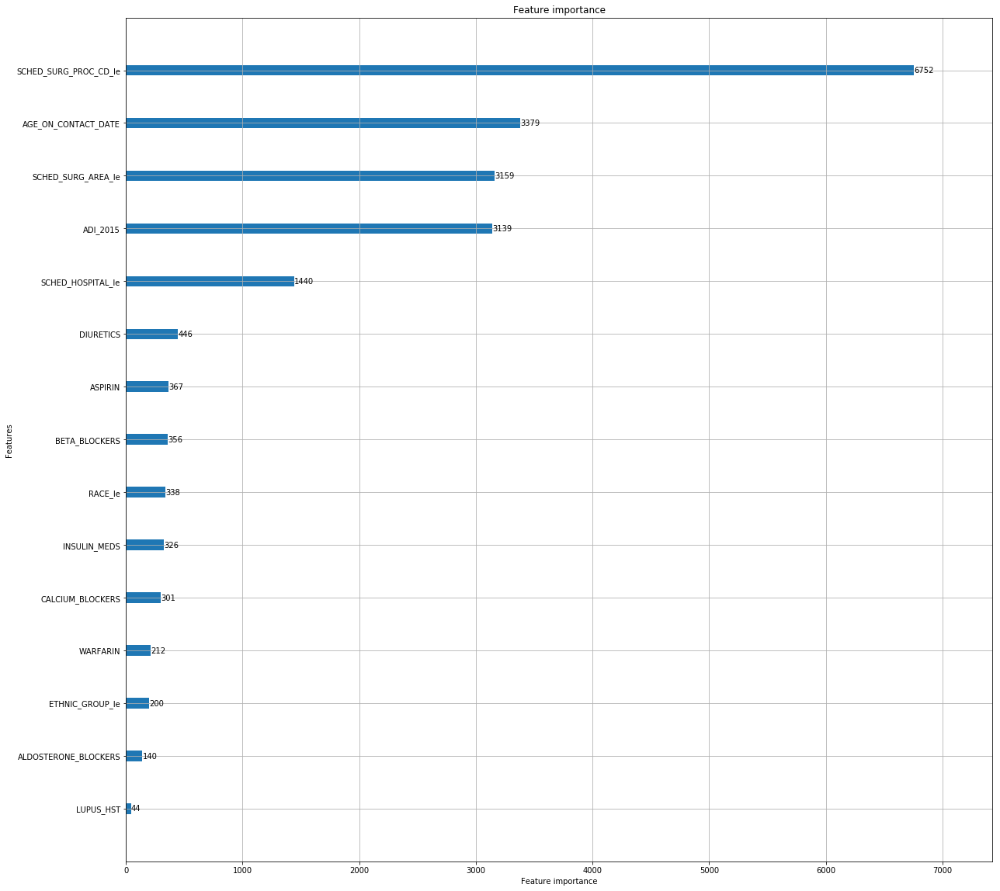

In [65]:
from matplotlib.pyplot import figure
figure(num=None, figsize = (20,20))
gbm_split_imp_plot = lgb.plot_importance(lgb_gbm)
fig = gbm_split_imp_plot.figure
fig.set_size_inches(20,20)

In [68]:
import shap
lgb_shap_explainer = shap.TreeExplainer(lgb_gbm)

In [69]:
lgb_shap_vals_train = lgb_shap_explainer.shap_values(x_train)

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\shap\explainers\tree.py:180: UserWarning: LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray
  warnings.warn('LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray')


In [70]:
lgb_shap_vals_test = lgb_shap_explainer.shap_values(x_test)

C:\Users\hanzh_9uk0snw\Anaconda3\lib\site-packages\shap\explainers\tree.py:180: UserWarning: LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray
  warnings.warn('LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray')


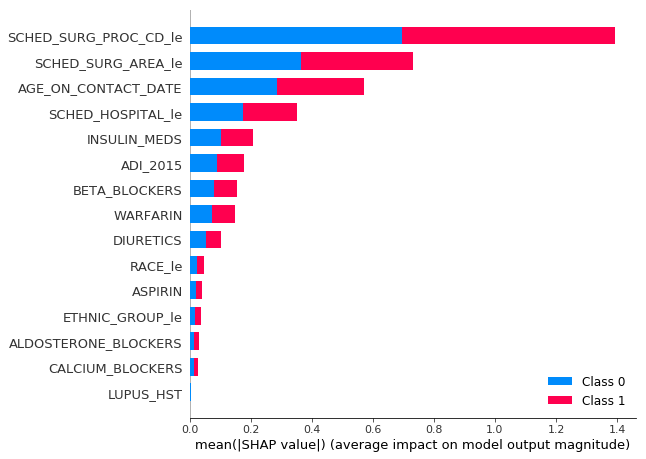

In [72]:
# Summary plot on train set
shap.summary_plot(lgb_shap_vals_train, x_train)

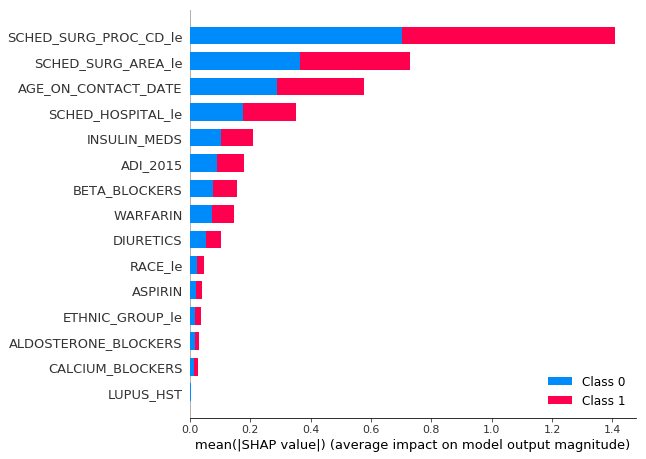

In [73]:
# Summary plot on test set
shap.summary_plot(lgb_shap_vals_test, x_test)

### Identify most important variable:
'SCHED_SURG_PROC_CD_le' is the most important variable that drives the model the most.

In [74]:
lgb_var_interactions = shap.TreeExplainer(lgb_gbm).shap_interaction_values(x_test)

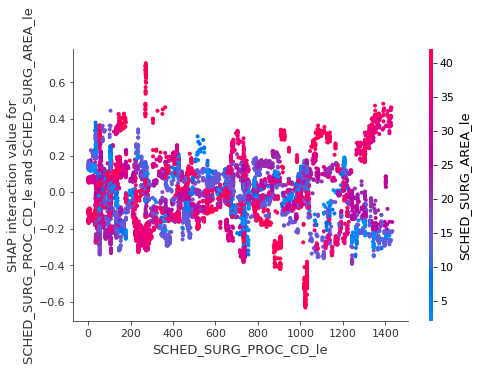

In [82]:
shap.dependence_plot(("SCHED_SURG_PROC_CD_le", "SCHED_SURG_AREA_le"),
lgb_var_interactions, x_test,
display_features = x_test)

### Variable interaction: 'SCHED_SURG_PROC_CD_le' vs 'SCHED_SURG_AREA_le'
The above interaction plot shows that the 'SCHED_SURG_PROC_CD_le' has strong impact on the model output 'STATUS' for the whole value range of 'SCHED_SURG_AREA_le'.

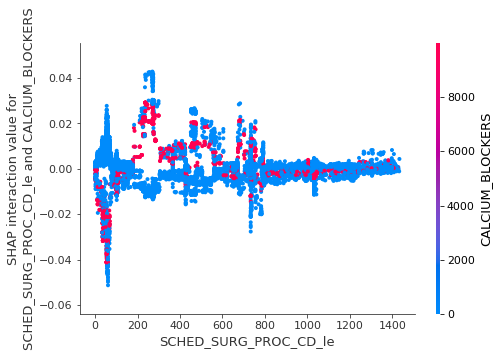

In [87]:
shap.dependence_plot(("SCHED_SURG_PROC_CD_le", "CALCIUM_BLOCKERS"),
lgb_var_interactions, x_test,
display_features = x_test)

### Variable interaction: 'SCHED_SURG_PROC_CD_le' vs 'CALCIUM_BLOCKERS'
The above interaction plot shows that the 'SCHED_SURG_PROC_CD_le' has less (nearly zero) impact on the model output 'STATUS' when the 'CALCIUM_BLOCKERS' value is very high and 'SCHED_SURG_PROC_CD_le' is over 800.